In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DDPG import DDPGagent
from utils_aaa import *
import traci
import traci.constants as tc
import math
import torch
import torch.autograd
import torch.optim as optim
import torch.nn as nn
from collections import deque
import random
from model import *
from utils_aa import *
from memory import *

In [2]:
import os, sys
tools = os.path.join(os.environ['SUMO_HOME'], 'tools')
sys.path.append(tools)

 Retrying in 1 seconds
episode: 0, reward: 525.43, average _reward: 61.21076322892102 
 Retrying in 1 seconds
episode: 1, reward: 43.7, average _reward: 75.90591769006673 
 Retrying in 1 seconds
episode: 2, reward: 482.65, average _reward: 77.67091143961338 
 Retrying in 1 seconds
episode: 3, reward: 537.36, average _reward: 123.23052392347856 
 Retrying in 1 seconds
episode: 4, reward: 405.29, average _reward: 174.28871690605325 
 Retrying in 1 seconds
episode: 5, reward: 54.02, average _reward: 212.29978611662418 
 Retrying in 1 seconds
episode: 6, reward: 62.84, average _reward: 215.1275564622676 
 Retrying in 1 seconds
episode: 7, reward: 127.64, average _reward: 218.82297518228324 
 Retrying in 1 seconds
episode: 8, reward: 214.6, average _reward: 228.98620431373305 
 Retrying in 1 seconds
episode: 9, reward: 529.0, average _reward: 247.92567155720462 
 Retrying in 1 seconds
episode: 10, reward: 493.53, average _reward: 298.2530446539844 
 Retrying in 1 seconds
episode: 11, reward

episode: 94, reward: 13.24, average _reward: 15.503458958023401 
 Retrying in 1 seconds
episode: 95, reward: 13.94, average _reward: 14.781136726838564 
 Retrying in 1 seconds
episode: 96, reward: 13.73, average _reward: 14.753448846300667 
 Retrying in 1 seconds
episode: 97, reward: 14.71, average _reward: 14.611759337659837 
 Retrying in 1 seconds
episode: 98, reward: 14.2, average _reward: 14.288806310214378 
 Retrying in 1 seconds
episode: 99, reward: 13.63, average _reward: 14.049179677393795 
 Retrying in 1 seconds
episode: 100, reward: 25.18, average _reward: 14.006352419373115 
 Retrying in 1 seconds
episode: 101, reward: 26.71, average _reward: 15.081656781139177 
 Retrying in 1 seconds
episode: 102, reward: 105.97, average _reward: 16.336694887116348 
 Retrying in 1 seconds
episode: 103, reward: 475.61, average _reward: 25.556229787233057 
 Retrying in 1 seconds
episode: 104, reward: 482.78, average _reward: 71.6917911454693 
 Retrying in 1 seconds
episode: 105, reward: 492.0

episode: 187, reward: 110.29, average _reward: 272.5833292138931 
 Retrying in 1 seconds
episode: 188, reward: 120.82, average _reward: 228.65562294675283 
 Retrying in 1 seconds
episode: 189, reward: 151.98, average _reward: 234.8464024151761 
 Retrying in 1 seconds
episode: 190, reward: 51.08, average _reward: 236.81326839838076 
 Retrying in 1 seconds
episode: 191, reward: 210.77, average _reward: 223.26827019222077 
 Retrying in 1 seconds
episode: 192, reward: 111.5, average _reward: 210.04071326930247 
 Retrying in 1 seconds
episode: 193, reward: 121.44, average _reward: 173.05284443463214 
 Retrying in 1 seconds
episode: 194, reward: 50.61, average _reward: 158.6422595256585 
 Retrying in 1 seconds
episode: 195, reward: 51.24, average _reward: 102.47209436527655 
 Retrying in 1 seconds
episode: 196, reward: 50.56, average _reward: 102.43939667057255 
 Retrying in 1 seconds
episode: 197, reward: 52.09, average _reward: 103.0268988912765 
 Retrying in 1 seconds
episode: 198, reward

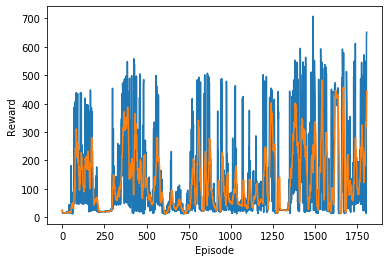

In [24]:
    

#env = NormalizedEnv(gym.make("Pendulum-v0"))

#agent3 = DDPGagent()
#agent2 = agent_230_01
noise = OUNoise_01(mu=0.0, theta=1.0, max_sigma=0.6, min_sigma=0.6, decay_period=10000)
#agent3.buffer=[]
batch_size = 64
#rewards = []
#avg_rewards = []

r=36.61
rl1='autonomous_vehicle'
num_veh=42

for episode in range(2000):
#    state = env.reset()
#traci.start(["sumo-gui", "-c", "/Users/yuewang/document/maps280/ring_example_20200319-1819061584627546.990043.sumo.cfg"])
    traci.start(["sumo-gui", "-c", "/Users/yuewang/document/maps_multi/ring_example_20190912-1246031568277963.025501.sumo.cfg"])
    traci.simulationStep()
    vehID=traci.vehicle.getIDList()

    depart=None
    speed0="0"
    lane="0"
    typeID="human"
    routeID="routebottom"
    for i in range(7):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routeright"
    for i in range(7,14):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i-7)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routetop"
    for i in range(14,21):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i-14)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    lane="1"
    typeID="human"
    routeID="routebottom"
    for i in range(7):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routeright"
    for i in range(7,14):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i-7)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routetop"
    for i in range(14,20):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i-14)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    typeID="rl1"
    departPos=str(8.0*((20-14)))
    traci.vehicle.add("autonomous_vehicle", routeID, typeID, depart, lane, departPos, speed0)
    traci.simulationStep()
    vehID=traci.vehicle.getIDList()

    for t in range(len(vehID)):
        traci.vehicle.setSpeedMode(vehID[t],31)
        traci.vehicle.setLaneChangeMode(vehID[t],512)


# reset state
    for reset_state in range(1):
#        traci.simulationStep()
        for j in range(len(vehID)):
            testVname=vehID[j]
 
            vehposition=traci.vehicle.getPosition(testVname)
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
        
            if vehpos_1>0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routebottom')
    
            if vehpos_1>0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routeright')
    
            if vehpos_1<0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routetop')
    
            if vehpos_1<0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routeleft')

            traci.vehicle.subscribe(testVname,(tc.VAR_LANE_INDEX,tc.VAR_SPEED,tc.VAR_POSITION))
           
    vehicle_obs_rl1=traci.vehicle.getSubscriptionResults(vehID[0])
 #   dist_rl1=myPosition1(vehicle_obs_rl1)
 #   values_rl1=values(vehicle_obs_rl1)
    lane_rl1=vehicle_obs_rl1[tc.VAR_LANE_INDEX]
    veh_len=len(vehID)
    #set the line
    vehposition=vehicle_obs_rl1[tc.VAR_POSITION]
    vehpos_1=vehposition[0]-r
    vehpos_2=vehposition[1]-r
    
 #   vehposition_new=[vehpos_1 vehpos_2]
    slope=vehpos_2/vehpos_1

    theta_total=1000*np.ones(veh_len)
    theta_total_01=1000*np.ones(veh_len)

    for i in range(1,len(vehID)):
        vehicle_obs_e=traci.vehicle.getSubscriptionResults(vehID[i])
        lane_e=vehicle_obs_e[tc.VAR_LANE_INDEX]
        vehposition_e=vehicle_obs_e[tc.VAR_POSITION]
        vehpos_1_e=vehposition_e[0]-r
        vehpos_2_e=vehposition_e[1]-r
 #       vehposition_new_e=[vehpos_1_e vehpos_2_e]
        ind_e=vehpos_2_e-slope*vehpos_1_e
    
        if slope>0 and vehpos_1 !=0 and vehpos_1>0:
            if ind_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
 
    
        if slope>0 and vehpos_1 !=0 and vehpos_1<0:
            if ind_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
    
        if slope<0 and vehpos_1 !=0 and vehpos_1>0:
            if ind_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta                

    
        if slope<0 and vehpos_1 !=0 and vehpos_1<0:
            if ind_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if slope==0 and vehpos_1>0:
            if vehpos_2_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if slope==0 and vehpos_1<0:
            if vehpos_2_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
    
        if vehpos_1==0 and vehpos_2>0:
            if vehpos_1_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if vehpos_1==0 and vehpos_2<0:
            if vehpos_1_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta



    y=np.where(theta_total==min(theta_total))
    veh_nextBehind=vehID[int(y[0])]
    vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_nextBehind)
    speed_nextBehind=vehicle_obs_e[tc.VAR_SPEED]
    
    y_01=np.where(theta_total_01==min(theta_total_01))
    veh_Behind=vehID[int(y_01[0])]
    vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_Behind)
    speed_Behind=vehicle_obs_e[tc.VAR_SPEED]
#    Leader=vehicle_obs_e[tc.VAR_LEADER]
    dist_Behind=(min(theta_total_01))*r

    headway=traci.vehicle.getLeader(veh_nextBehind,200)
    headway1=headway[0]
    headway2=headway[1]

    dist=headway2
    header_rl1=headway1

    vehicle_header=traci.vehicle.getSubscriptionResults(header_rl1)
    veh_header=vehicle_header[tc.VAR_SPEED]

    veh=vehicle_obs_rl1[tc.VAR_SPEED]
    currentLaneIndex=lane_rl1

    diff_dist=(min(theta_total))*r
    headway_nextBehind=dist
    speed_nextLeader=veh_header

    state=np.array([veh,veh_header,dist,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
#    traci.vehicle.setMinGap(header_rl1,2)

    noise.reset()
    episode_reward = 0
    last_lc=0
    
#start training
    traci.vehicle.setSpeedMode("autonomous_vehicle",0)
#    traci.vehicle.setLaneChangeMode("autonomous_vehicle",0)
    for step in range(4000):
        state_01 = Variable(torch.from_numpy(state).float().unsqueeze(0))
        #state_01=state
        action = agent3.actor(state_01)
        action = action.detach().numpy()[0]
        action = noise.get_action(action, step)

 #      new_state, reward, done, _ = env.step(action) 
 # accelerating
        acc=action[0]
        Speed_e=acc*0.1+state[0]
        Speed=max(Speed_e,0)
        traci.vehicle.slowDown(rl1,Speed,0.1)
# lane-changing
        duration_step=1
        current_time=traci.simulation.getTime()
        if current_time < duration_step+last_lc:
            request=0
            direction=0
        else:
            request=1
            direction=round(action[1])

        #this_lane=traci.vehicle.getLaneIndex(rl1)
        #this_edge=traci.vehicle.getRoadID(rl1)
        this_lane=currentLaneIndex
        target_lane=min(max(this_lane+direction,0),1)
        traci.vehicle.changeLane(rl1,int(target_lane),5)
        traci.simulationStep()
# done
#        traci.simulationStep()
        for j in range(len(vehID)):
            testVname=vehID[j]
 
            vehposition=traci.vehicle.getPosition(testVname)
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
            if vehpos_1>0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routebottom')
            if vehpos_1>0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routeright')
    
            if vehpos_1<0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routetop')
    
            if vehpos_1<0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routeleft')
            
            traci.vehicle.subscribe(testVname,(tc.VAR_LANE_INDEX,tc.VAR_SPEED,tc.VAR_POSITION))

        vehID=traci.vehicle.getIDList()
        endTeleportingList=traci.simulation.getEndingTeleportIDList()
        

        
        if len(endTeleportingList)>0 or len(vehID) != num_veh or step==3999:
            done=1
        else:
            done=0
# new_state and reward
        if done==1 and len(vehID) != num_veh:
            reward=0
            new_state=np.array([-1,-1,-1,-1,-1,-1,-1,-1,-1,-1])
            
        if done==1 and len(vehID) == num_veh:
            reward=0
            vehicle_obs_rl1=traci.vehicle.getSubscriptionResults(vehID[0])
            lane_rl1=vehicle_obs_rl1[tc.VAR_LANE_INDEX]
            veh=vehicle_obs_rl1[tc.VAR_SPEED]
            veh_len=len(vehID)
            #set the line
            vehposition=vehicle_obs_rl1[tc.VAR_POSITION]
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
            slope=vehpos_2/vehpos_1

            theta_total=1000*np.ones(veh_len)
            theta_total_01=1000*np.ones(veh_len)
            speed_total=veh

            for i in range(1,len(vehID)):
                vehicle_obs_e=traci.vehicle.getSubscriptionResults(vehID[i])
                lane_e=vehicle_obs_e[tc.VAR_LANE_INDEX]
                veh_e=vehicle_obs_e[tc.VAR_SPEED]
                speed_total=np.hstack((speed_total,veh_e))

                vehposition_e=vehicle_obs_e[tc.VAR_POSITION]
                vehpos_1_e=vehposition_e[0]-r
                vehpos_2_e=vehposition_e[1]-r
                ind_e=vehpos_2_e-slope*vehpos_1_e
    
                if slope>0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
   
                if slope>0 and vehpos_1 !=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1!=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope==0 and vehpos_1>0:
                    if vehpos_2_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if slope==0 and vehpos_1<0:
                    if vehpos_2_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if vehpos_1==0 and vehpos_2>0:
                    if vehpos_1_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if vehpos_1==0 and vehpos_2<0:
                    if vehpos_1_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
            


            y=np.where(theta_total==min(theta_total))
            veh_nextBehind=vehID[int(y[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_nextBehind)
            speed_nextBehind=vehicle_obs_e[tc.VAR_SPEED]

            y_01=np.where(theta_total_01==min(theta_total_01))
            veh_Behind=vehID[int(y_01[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_Behind)
            speed_Behind=vehicle_obs_e[tc.VAR_SPEED]
            dist_Behind=(min(theta_total_01))*r
            
            headway=traci.vehicle.getLeader(veh_nextBehind,200)
            headway1=headway[0]
            headway2=headway[1]

            dist=headway2
            header_rl1=headway1

            vehicle_header=traci.vehicle.getSubscriptionResults(header_rl1)
            veh_header=vehicle_header[tc.VAR_SPEED]

            currentLaneIndex=lane_rl1
            
            if this_lane !=currentLaneIndex:
                last_lc=traci.simulation.getTime()


            diff_dist=(min(theta_total))*r
            headway_nextBehind=dist
            speed_nextLeader=veh_header

            new_state=np.array([veh,veh_header,dist,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
            
        
        if done==0:
            vehicle_obs_rl1=traci.vehicle.getSubscriptionResults(vehID[0])
            lane_rl1=vehicle_obs_rl1[tc.VAR_LANE_INDEX]
            veh=vehicle_obs_rl1[tc.VAR_SPEED]
            veh_len=len(vehID)
            #set the line
            vehposition=vehicle_obs_rl1[tc.VAR_POSITION]
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
            slope=vehpos_2/vehpos_1

            theta_total=1000*np.ones(veh_len)
            theta_total_01=1000*np.ones(veh_len)
            speed_total=veh

            for i in range(1,len(vehID)):
                vehicle_obs_e=traci.vehicle.getSubscriptionResults(vehID[i])
                lane_e=vehicle_obs_e[tc.VAR_LANE_INDEX]
                veh_e=vehicle_obs_e[tc.VAR_SPEED]
                speed_total=np.hstack((speed_total,veh_e))

                vehposition_e=vehicle_obs_e[tc.VAR_POSITION]
                vehpos_1_e=vehposition_e[0]-r
                vehpos_2_e=vehposition_e[1]-r
                ind_e=vehpos_2_e-slope*vehpos_1_e
    
                if slope>0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
   
                if slope>0 and vehpos_1 !=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1!=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope==0 and vehpos_1>0:
                    if vehpos_2_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if slope==0 and vehpos_1<0:
                    if vehpos_2_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if vehpos_1==0 and vehpos_2>0:
                    if vehpos_1_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if vehpos_1==0 and vehpos_2<0:
                    if vehpos_1_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
            


            y=np.where(theta_total==min(theta_total))
            veh_nextBehind=vehID[int(y[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_nextBehind)
            speed_nextBehind=vehicle_obs_e[tc.VAR_SPEED]

            y_01=np.where(theta_total_01==min(theta_total_01))
            veh_Behind=vehID[int(y_01[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_Behind)
            speed_Behind=vehicle_obs_e[tc.VAR_SPEED]
            dist_Behind=(min(theta_total_01))*r
            
            headway=traci.vehicle.getLeader(veh_nextBehind,200)
            headway1=headway[0]
            headway2=headway[1]

            dist=headway2
            header_rl1=headway1

            vehicle_header=traci.vehicle.getSubscriptionResults(header_rl1)
            veh_header=vehicle_header[tc.VAR_SPEED]

            currentLaneIndex=lane_rl1
            
            if this_lane !=currentLaneIndex:
                last_lc=traci.simulation.getTime()


            diff_dist=(min(theta_total))*r
            headway_nextBehind=dist
            speed_nextLeader=veh_header

            new_state=np.array([veh,veh_header,dist,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])

            speed_m=np.mean(speed_total)
            speed_std=np.std(speed_total)
            reward=1/10*(0.6*speed_m-0.4*speed_std)
#            reward=np.linalg.norm(speed_total)


        agent3.memory.push(state, action, reward, new_state, done)
        
        if len(agent3.memory) > batch_size:
            agent3.update(batch_size)        
        
        state = new_state
        episode_reward += reward

        if done:
            sys.stdout.write("episode: {}, reward: {}, average _reward: {} \n".format(episode, np.round(episode_reward, decimals=2), np.mean(rewards[-10:])))
            break

    rewards.append(episode_reward)
    avg_rewards.append(np.mean(rewards[-10:]))
#    print(episode_reward)
    traci.close()
    if np.mean(rewards[-5:]) > 585.0 or episode_reward > 650:
        break

plt.plot(rewards)
plt.plot(avg_rewards)
plt.plot()
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.show()

In [13]:


#env = NormalizedEnv(gym.make("Pendulum-v0"))

#agent2 = DDPGagent()
#noise = OUNoise_01()
#agent2.buffer=[]
#batch_size = 128
#rewards = []
#avg_rewards = []

#agent_230_01=agent2
#agent_230_02=agent2
#agent_230_03=agent2
r=36.61
rl1='autonomous_vehicle'
num_veh=42
speed_total=np.zeros(42)
state_total=np.zeros(10)
action_total=np.zeros(2)

for episode in range(20):
#    state = env.reset()
#traci.start(["sumo-gui", "-c", "/Users/yuewang/document/maps280/ring_example_20200319-1819061584627546.990043.sumo.cfg"])
    traci.start(["sumo-gui", "-c", "/Users/yuewang/document/maps_multi-lane-ring/ring_example_20190912-1246031568277963.025501.sumo.cfg"])
    traci.simulationStep()
    vehID=traci.vehicle.getIDList()

    depart=None
    speed0="0"
    lane="0"
    typeID="human"
    routeID="routebottom"
    for i in range(7):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routeright"
    for i in range(7,14):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i-7)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routetop"
    for i in range(14,21):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i-14)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    lane="1"
    typeID="human"
    routeID="routebottom"
    for i in range(7):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routeright"
    for i in range(7,14):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i-7)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routetop"
    for i in range(14,20):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i-14)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    typeID="rl1"
    departPos=str(9.0*((20-14)))
    traci.vehicle.add("autonomous_vehicle", routeID, typeID, depart, lane, departPos, speed0)
    traci.simulationStep()
    vehID=traci.vehicle.getIDList()

    for t in range(len(vehID)):
        traci.vehicle.setSpeedMode(vehID[t],31)
        traci.vehicle.setLaneChangeMode(vehID[t],512)


# reset state
    for reset_state in range(1):
        traci.simulationStep()
        for j in range(len(vehID)):
            testVname=vehID[j]
 
            vehposition=traci.vehicle.getPosition(testVname)
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
        
            if vehpos_1>0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routebottom')
    
            if vehpos_1>0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routeright')
    
            if vehpos_1<0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routetop')
    
            if vehpos_1<0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routeleft')

            traci.vehicle.subscribe(testVname,(tc.VAR_LANE_INDEX,tc.VAR_SPEED,tc.VAR_POSITION))
    traci.vehicle.slowDown("v20_0",0,0.1)
#    traci.vehicle.slowDown("v19_1",0,0.1)
#    traci.vehicle.changeLane(rl1,0,5)
    

    vehicle_obs_rl1=traci.vehicle.getSubscriptionResults(vehID[0])
 #   dist_rl1=myPosition1(vehicle_obs_rl1)
 #   values_rl1=values(vehicle_obs_rl1)
    lane_rl1=vehicle_obs_rl1[tc.VAR_LANE_INDEX]
    veh_len=len(vehID)
    #set the line
    vehposition=vehicle_obs_rl1[tc.VAR_POSITION]
    vehpos_1=vehposition[0]-r
    vehpos_2=vehposition[1]-r
    
 #   vehposition_new=[vehpos_1 vehpos_2]
    slope=vehpos_2/vehpos_1

    theta_total=1000*np.ones(veh_len)
    theta_total_01=1000*np.ones(veh_len)

    for i in range(1,len(vehID)):
        vehicle_obs_e=traci.vehicle.getSubscriptionResults(vehID[i])
        lane_e=vehicle_obs_e[tc.VAR_LANE_INDEX]
        vehposition_e=vehicle_obs_e[tc.VAR_POSITION]
        vehpos_1_e=vehposition_e[0]-r
        vehpos_2_e=vehposition_e[1]-r
 #       vehposition_new_e=[vehpos_1_e vehpos_2_e]
        ind_e=vehpos_2_e-slope*vehpos_1_e
    
        if slope>0 and vehpos_1 !=0 and vehpos_1>0:
            if ind_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
 
    
        if slope>0 and vehpos_1 !=0 and vehpos_1<0:
            if ind_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
    
        if slope<0 and vehpos_1 !=0 and vehpos_1>0:
            if ind_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta                

    
        if slope<0 and vehpos_1 !=0 and vehpos_1<0:
            if ind_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if slope==0 and vehpos_1>0:
            if vehpos_2_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if slope==0 and vehpos_1<0:
            if vehpos_2_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
    
        if vehpos_1==0 and vehpos_2>0:
            if vehpos_1_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if vehpos_1==0 and vehpos_2<0:
            if vehpos_1_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta


    y=np.where(theta_total==min(theta_total))
    veh_nextBehind=vehID[int(y[0])]
    vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_nextBehind)
    speed_nextBehind=vehicle_obs_e[tc.VAR_SPEED]
    
    y_01=np.where(theta_total_01==min(theta_total_01))
    veh_Behind=vehID[int(y_01[0])]
    vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_Behind)
    speed_Behind=vehicle_obs_e[tc.VAR_SPEED]
#    Leader=vehicle_obs_e[tc.VAR_LEADER]
    dist_Behind=(min(theta_total_01))*r

    headway=traci.vehicle.getLeader(veh_nextBehind,200)
    headway1=headway[0]
    headway2=headway[1]

    dist=headway2
    header_rl1=headway1

    vehicle_header=traci.vehicle.getSubscriptionResults(header_rl1)
    veh_header=vehicle_header[tc.VAR_SPEED]

    veh=vehicle_obs_rl1[tc.VAR_SPEED]
    currentLaneIndex=lane_rl1

    diff_dist=(min(theta_total))*r
    headway_nextBehind=dist
    speed_nextLeader=veh_header

    state=np.array([veh,veh_header,dist,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
#    traci.vehicle.setMinGap(header_rl1,2)

#    noise.reset()
    episode_reward = 0
    last_lc=0
    
    traci.vehicle.setSpeedMode("autonomous_vehicle",0)
#start training
    for step in range(4000):         
        
        state_01 = Variable(torch.from_numpy(state).float().unsqueeze(0))
        #state_01=state
        action = loaded_model.actor(state_01)
        action = action.detach().numpy()[0]
        state_total=np.vstack((state_total,state))
        action_total=np.vstack((action_total,action))
        print(state_01)
        print(action)
#        action = noise.get_action(action, step)

 #      new_state, reward, done, _ = env.step(action) 
 # accelerating
        acc=action[0]
        Speed_e=acc*0.1+state[0]
        Speed=max(Speed_e,0)
        traci.vehicle.slowDown(rl1,Speed,0.1)
# lane-changing
        duration_step=1
        current_time=traci.simulation.getTime()
        if current_time < duration_step+last_lc:
            request=0
            direction=0
        else:
            request=1
            direction=round(action[1])

        #this_lane=traci.vehicle.getLaneIndex(rl1)
        #this_edge=traci.vehicle.getRoadID(rl1)
        this_lane=currentLaneIndex
        target_lane=min(max(this_lane+direction,0),1)
        traci.vehicle.changeLane(rl1,int(target_lane),1)
        traci.simulationStep()
# done
#        traci.simulationStep()
        for j in range(len(vehID)):
            testVname=vehID[j]
 
            vehposition=traci.vehicle.getPosition(testVname)
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
            if vehpos_1>0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routebottom')
            if vehpos_1>0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routeright')
    
            if vehpos_1<0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routetop')
    
            if vehpos_1<0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routeleft')
            
            traci.vehicle.subscribe(testVname,(tc.VAR_LANE_INDEX,tc.VAR_SPEED,tc.VAR_POSITION))

        vehID=traci.vehicle.getIDList()

# new_state and reward
        speed_total_e=[]
        done=1           
        if done==1 and len(vehID) == num_veh:
            reward=0
            vehicle_obs_rl1=traci.vehicle.getSubscriptionResults(vehID[0])
            
            lane_rl1=vehicle_obs_rl1[tc.VAR_LANE_INDEX]
            veh=vehicle_obs_rl1[tc.VAR_SPEED]
            veh_len=len(vehID)
            #set the line
            vehposition=vehicle_obs_rl1[tc.VAR_POSITION]
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
            slope=vehpos_2/vehpos_1

            theta_total=1000*np.ones(veh_len)
            theta_total_01=1000*np.ones(veh_len)
            speed_total_e=veh

            for i in range(1,len(vehID)):
                vehicle_obs_e=traci.vehicle.getSubscriptionResults(vehID[i])
                lane_e=vehicle_obs_e[tc.VAR_LANE_INDEX]
                veh_e=vehicle_obs_e[tc.VAR_SPEED]
#                speed_total_e.append(vehicle_obs_e[tc.VAR_SPEED])
                speed_total_e=np.hstack((speed_total_e,veh_e))

                vehposition_e=vehicle_obs_e[tc.VAR_POSITION]
                vehpos_1_e=vehposition_e[0]-r
                vehpos_2_e=vehposition_e[1]-r
                ind_e=vehpos_2_e-slope*vehpos_1_e
    
                if slope>0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
   
                if slope>0 and vehpos_1 !=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1!=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope==0 and vehpos_1>0:
                    if vehpos_2_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if slope==0 and vehpos_1<0:
                    if vehpos_2_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if vehpos_1==0 and vehpos_2>0:
                    if vehpos_1_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if vehpos_1==0 and vehpos_2<0:
                    if vehpos_1_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                
#                veh_total_01=traci.vehicle.getSubscriptionResults(testVname)


            y=np.where(theta_total==min(theta_total))
            veh_nextBehind=vehID[int(y[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_nextBehind)
            speed_nextBehind=vehicle_obs_e[tc.VAR_SPEED]

            y_01=np.where(theta_total_01==min(theta_total_01))
            veh_Behind=vehID[int(y_01[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_Behind)
            speed_Behind=vehicle_obs_e[tc.VAR_SPEED]
            dist_Behind=(min(theta_total_01))*r
            
            headway=traci.vehicle.getLeader(veh_nextBehind,200)
            headway1=headway[0]
            headway2=headway[1]

            dist=headway2
            header_rl1=headway1

            vehicle_header=traci.vehicle.getSubscriptionResults(header_rl1)
            veh_header=vehicle_header[tc.VAR_SPEED]

            currentLaneIndex=lane_rl1
            
            if this_lane !=currentLaneIndex:
                last_lc=traci.simulation.getTime()


            diff_dist=(min(theta_total))*r
            headway_nextBehind=dist
            speed_nextLeader=veh_header

            new_state=np.array([veh,veh_header,dist,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
             
            
        state = new_state
        speed_total=np.vstack((speed_total,speed_total_e))
#        state_total=np.vstack((state_total,state))
 #       lane_e(j)=veh_total_01[tc.VAR_LANE_INDEX]
 #       pos_e=veh_total_01[tc.VAR_POSITION]
 #       pos_x_e(j)=pos_e[0]
 #       pos_y_e(j)=pos_e[1]
        
#    traci.simulationStep()
#    time.sleep(0.1)
    
#    print(episode_reward)
    traci.close()



 Retrying in 1 seconds
tensor([[9.9872e-02, 5.5556e-02, 5.9996e+01, 1.0000e+00, 5.5556e-02, 6.1057e+01,
         9.9896e-02, 5.5556e-02, 5.9996e+01, 6.0346e+00]])
[1. 1.]
tensor([[1.4987e-01, 1.0861e-01, 6.0001e+01, 1.0000e+00, 1.8964e-01, 1.3984e+01,
         4.9948e-02, 1.0861e-01, 6.0001e+01, 6.0446e+00]])
[ 1. -1.]
tensor([[ 0.1999,  0.1592, 60.0174,  1.0000,  0.2837, 13.9758,  0.0000,  0.1592,
         60.0174,  6.0645]])
[ 1. -1.]
tensor([[ 0.2499,  0.2074, 60.0281,  1.0000,  0.3772, 13.9630,  0.0999,  0.2074,
         60.0281,  6.0796]])
[ 1. -1.]
tensor([[ 0.2999,  0.2533, 60.0335,  1.0000,  0.4701, 13.9460,  0.1998,  0.2533,
         60.0335,  6.0896]])
[ 1. -1.]
tensor([[ 0.3499,  0.2968, 60.0332,  1.0000,  0.5623, 13.9248,  0.2997,  0.2968,
         60.0332,  6.0947]])
[ 1. -1.]
tensor([[ 0.3999,  0.3382, 60.0270,  1.0000,  0.6537, 13.8995,  0.3995,  0.3382,
         60.0270,  6.0948]])
[ 1. -1.]
tensor([[ 0.4499,  0.3775, 60.0149,  1.0000,  0.7444, 13.8700,  0.4994,  0.3775

tensor([[ 3.1472,  1.0516, 50.9292,  0.0000,  2.8937, 12.0702,  6.3709,  1.0516,
         50.9292,  4.1179]])
[-1. -1.]
tensor([[ 3.0972,  1.0583, 50.3900,  0.0000,  2.9496, 12.0850,  6.4500,  1.0583,
         50.3900,  3.7822]])
[-1. -1.]
tensor([[ 3.0472,  1.0654, 49.8438,  0.0000,  3.0022, 12.0895,  6.5279,  1.0654,
         49.8438,  3.4339]])
[-1. -1.]
tensor([[ 2.9972,  1.0728, 49.2906,  0.0000,  3.0514, 12.0841,  6.6045,  1.0728,
         49.2906,  3.0728]])
[-1. -1.]
tensor([[ 2.9472,  1.0805, 48.7307,  0.0000,  3.0969, 12.0692,  6.6797,  1.0805,
         48.7307,  2.6995]])
[-1. -1.]
tensor([[ 2.8972,  1.0886, 48.1642,  0.0000,  3.1385, 12.0453,  6.7535,  1.0886,
         48.1642,  2.3135]])
[-1. -1.]
tensor([[ 2.8472,  1.0970, 47.5913,  0.0000,  3.1760, 12.0126,  6.8258,  1.0970,
         47.5913,  1.9154]])
[-1. -1.]
tensor([[ 2.7972,  1.1058, 47.0122,  0.0000,  3.2093, 11.9715,  6.8965,  1.1058,
         47.0122,  1.5052]])
[-1. -1.]
tensor([[ 2.7472,  1.1149, 46.4272,  0.0

tensor([[ 2.7951,  1.0728, 41.3066,  1.0000,  3.4352, 10.1549,  3.1227,  1.0728,
         41.3066,  9.5661]])
[-0.19935904 -1.        ]
tensor([[ 2.7852,  1.0596, 41.1051,  1.0000,  3.3845, 10.0951,  3.0745,  1.0596,
         41.1051,  9.5377]])
[ 0.99484897 -1.        ]
tensor([[ 2.8349,  1.0471, 40.9068,  1.0000,  3.3361, 10.0449,  3.0302,  1.0471,
         40.9068,  9.5188]])
[ 0.16388673 -1.        ]
tensor([[ 2.8431,  1.0352, 40.7110,  1.0000,  3.2940,  9.9998,  2.9939,  1.0352,
         40.7110,  9.5043]])
[ 0.8066829 -1.       ]
tensor([[ 2.8834,  1.0241, 40.5172,  1.0000,  3.2550,  9.9627,  2.9617,  1.0241,
         40.5172,  9.4971]])
[-0.84517854 -1.        ]
tensor([[ 2.8412,  1.0137, 40.3250,  1.0000,  3.2210,  9.9247,  2.9357,  1.0137,
         40.3250,  9.4883]])
[ 0.99963313 -1.        ]
tensor([[ 2.8912,  1.0041, 40.1345,  1.0000,  3.1864,  9.8952,  2.9094,  1.0041,
         40.1345,  9.4870]])
[ 0.66714877 -1.        ]
tensor([[ 2.9245,  0.9954, 39.9451,  1.0000,  3.15

tensor([[ 2.5656,  1.3959, 28.8077,  1.0000,  2.7404,  9.5443,  4.0156,  1.3959,
         28.8077,  9.3311]])
[-0.9999995 -1.       ]
tensor([[ 2.5156,  1.3893, 28.5362,  1.0000,  2.7228,  9.5235,  4.1039,  1.3893,
         28.5362,  9.1733]])
[-0.9999985 -1.       ]
tensor([[ 2.4656,  1.3811, 28.2552,  1.0000,  2.7032,  9.4998,  4.1911,  1.3811,
         28.2552,  9.0018]])
[-0.99999756 -1.        ]
tensor([[ 2.4156,  1.3713, 27.9646,  1.0000,  2.6818,  9.4734,  4.2773,  1.3713,
         27.9646,  8.8167]])
[-0.99999744 -1.        ]
tensor([[ 2.3656,  1.3598, 27.6644,  1.0000,  2.6586,  9.4441,  4.3623,  1.3598,
         27.6644,  8.6181]])
[-0.9999976 -1.       ]
tensor([[ 2.3156,  1.3467, 27.3544,  1.0000,  2.6336,  9.4123,  4.4460,  1.3467,
         27.3544,  8.4063]])
[-0.999997 -1.      ]
tensor([[ 2.2656,  1.3319, 27.0348,  1.0000,  2.6068,  9.3782,  4.5283,  1.3319,
         27.0348,  8.1811]])
[-0.99999744 -1.        ]
tensor([[ 2.2156,  1.3156, 26.7054,  1.0000,  2.5784,  9.3

tensor([[ 2.4801,  2.1311,  2.8784,  1.0000,  2.5252, 10.0287,  3.2902,  2.1311,
          2.8784,  3.6613]])
[-0.2493063 -0.9999992]
tensor([[ 2.4676,  2.0357,  2.7626,  1.0000,  2.5427, 10.0212,  3.1930,  2.0357,
          2.7626,  3.5894]])
[-0.4205374  -0.99999994]
tensor([[ 2.4466,  1.9434,  2.6475,  1.0000,  2.5583, 10.0100,  3.0948,  1.9434,
          2.6475,  3.5254]])
[-0.39795116 -1.        ]
tensor([[2.4267, 1.8543, 2.5333, 1.0000, 2.5714, 9.9956, 2.9960, 1.8543, 2.5333,
         3.4692]])
[-0.04624022 -1.        ]
tensor([[2.4244, 1.7688, 2.4205, 1.0000, 2.5823, 9.9798, 2.8970, 1.7688, 2.4205,
         3.4226]])
[-0.18401018 -1.        ]
tensor([[2.4152, 1.6869, 2.3094, 1.0000, 2.5916, 9.9622, 2.7982, 1.6869, 2.3094,
         3.3848]])
[-0.73277867 -1.        ]
tensor([[2.3785, 1.6088, 2.2003, 1.0000, 2.5991, 9.9401, 2.6998, 1.6088, 2.2003,
         3.3532]])
[-0.63765454 -1.        ]
tensor([[2.3466, 1.5348, 2.0935, 1.0000, 2.6036, 9.9143, 2.6022, 1.5348, 2.0935,
         

tensor([[ 3.4896,  3.0539,  3.3681,  1.0000,  3.0292, 10.3639,  1.9424,  3.0539,
          3.3681,  2.1930]])
[-0.71427476 -1.        ]
tensor([[ 3.4539,  3.1070,  3.4996,  1.0000,  3.0601, 10.4032,  1.7924,  3.1070,
          3.4996,  2.3592]])
[-0.5074267 -1.       ]
tensor([[ 3.4285,  3.1605,  3.6514,  1.0000,  3.0887, 10.4371,  1.6424,  3.1605,
          3.6514,  2.5379]])
[-0.30077624 -1.        ]
tensor([[ 3.4135,  3.2142,  3.8235,  1.0000,  3.1153, 10.4669,  1.4924,  3.2142,
          3.8235,  2.7302]])
[-0.4132373 -1.       ]
tensor([[ 3.3928,  3.2682,  4.0161,  1.0000,  3.1403, 10.4920,  1.3424,  3.2682,
          4.0161,  2.9354]])
[-0.03590802 -0.9999787 ]
tensor([[ 3.3910,  3.3225,  4.2291,  1.0000,  3.1635, 10.5147,  1.1924,  3.3225,
          4.2291,  3.1553]])
[ 0.4083016 -0.9999638]
tensor([[ 3.4115,  3.3771,  4.4626,  1.0000,  3.1856, 10.5372,  1.0424,  3.3771,
          4.4626,  3.3922]])
[ 0.8462472  -0.99982005]
tensor([[ 3.4538,  3.4319,  4.7165,  1.0000,  3.2076, 

tensor([[ 4.3350,  6.4625, 19.0373,  1.0000,  4.4745, 11.0717,  4.8467,  6.4625,
         19.0373, 12.5616]])
[-1. -1.]
tensor([[ 4.2850,  6.4819, 19.2020,  1.0000,  4.4512, 11.0550,  4.8355,  6.4819,
         19.2020, 12.5076]])
[-1. -1.]
tensor([[ 4.2350,  6.4986, 19.3697,  1.0000,  4.4265, 11.0359,  4.8208,  6.4986,
         19.3697, 12.4501]])
[-1. -1.]
tensor([[ 4.1850,  6.5124, 19.5407,  1.0000,  4.4002, 11.0717,  4.8027,  6.5124,
         19.5407, 12.4467]])
[-1. -1.]
tensor([[ 4.1350,  6.5232, 19.7149,  1.0000,  4.3726, 11.0480,  4.7813,  6.5232,
         19.7149, 12.3832]])
[-1. -1.]
tensor([[ 4.0850,  6.5309, 19.8923,  1.0000,  4.3436, 11.0222,  4.7568,  6.5309,
         19.8923, 12.3171]])
[-1. -1.]
tensor([[ 4.0350,  6.5356, 20.0730,  1.0000,  4.3132, 10.9943,  4.7293,  6.5356,
         20.0730, 12.2486]])
[-1. -1.]
tensor([[ 3.9850,  6.5370, 20.2568,  1.0000,  4.2817, 10.9645,  4.6990,  6.5370,
         20.2568, 12.1781]])
[-1. -1.]
tensor([[ 3.9350,  6.5352, 20.4437,  1.0

tensor([[ 3.3612,  3.5122, 27.0369,  1.0000,  3.5422, 10.3800,  3.5631,  3.5122,
         27.0369, 10.3645]])
[-0.7551145 -1.       ]
tensor([[ 3.3235,  3.4542, 27.0279,  1.0000,  3.5259, 10.3599,  3.5445,  3.4542,
         27.0279, 10.3432]])
[ 0.72737455 -1.        ]
tensor([[ 3.3598,  3.3964, 27.0151,  1.0000,  3.5082, 10.3451,  3.5245,  3.3964,
         27.0151, 10.3275]])
[-0.99943835 -1.        ]
tensor([[ 3.3099,  3.3387, 26.9981,  1.0000,  3.4937, 10.3269,  3.5082,  3.3387,
         26.9981, 10.3085]])
[-0.8098152 -1.       ]
tensor([[ 3.2694,  3.2811, 26.9773,  1.0000,  3.4770, 10.3062,  3.4896,  3.2811,
         26.9773, 10.2873]])
[ 0.8207996 -1.       ]
tensor([[ 3.3104,  3.2237, 26.9527,  1.0000,  3.4588, 10.2914,  3.4696,  3.2237,
         26.9527, 10.2721]])
[-0.9996781 -1.       ]
tensor([[ 3.2604,  3.1663, 26.9240,  1.0000,  3.4441, 10.2730,  3.4535,  3.1663,
         26.9240, 10.2536]])
[-0.8015622 -1.       ]
tensor([[ 3.2203,  3.1090, 26.8914,  1.0000,  3.4273, 10.2

tensor([[ 2.3458,  0.2460, 18.6998,  1.0000,  2.4295,  9.2584,  2.4301,  0.2460,
         18.6998,  9.2841]])
[-0.99881434 -1.        ]
tensor([[ 2.2959,  0.2238, 18.4804,  1.0000,  2.4175,  9.2461,  2.4185,  0.2238,
         18.4804,  9.2722]])
[ 0.265537 -1.      ]
tensor([[ 2.3091,  0.2033, 18.2602,  1.0000,  2.4037,  9.2366,  2.4048,  0.2033,
         18.2602,  9.2631]])
[-0.9536314 -1.       ]
tensor([[ 2.2615,  0.1844, 18.0394,  1.0000,  2.3914,  9.2236,  2.3927,  0.1844,
         18.0394,  9.2504]])
[ 0.9666043 -1.       ]
tensor([[ 2.3098,  0.1672, 17.8182,  1.0000,  2.3773,  9.2168,  2.3787,  0.1672,
         17.8182,  9.2440]])
[-0.99795294 -1.        ]
tensor([[ 2.2599,  0.1516, 17.5966,  1.0000,  2.3667,  9.2062,  2.3684,  0.1516,
         17.5966,  9.2337]])
[ 0.6308047 -1.       ]
tensor([[ 2.2914,  0.1378, 17.3747,  1.0000,  2.3541,  9.1999,  2.3559,  0.1378,
         17.3747,  9.2277]])
[-0.99518627 -1.        ]
tensor([[ 2.2417,  0.1257, 17.1527,  1.0000,  2.3440,  9.1

tensor([[2.6792, 1.9064, 7.4405, 1.0000, 2.4900, 9.6579, 2.4705, 1.9064, 7.4405,
         9.8466]])
[ 0.15953375 -1.        ]
tensor([[2.6872, 1.9611, 7.3881, 1.0000, 2.5030, 9.6763, 2.4846, 1.9611, 7.3881,
         9.8674]])
[ 0.5590801 -1.       ]
tensor([[2.7151, 2.0161, 7.3399, 1.0000, 2.5160, 9.6960, 2.4986, 2.0161, 7.3399,
         9.8894]])
[ 0.30623525 -1.        ]
tensor([[2.7304, 2.0716, 7.2957, 1.0000, 2.5298, 9.7160, 2.5134, 2.0716, 7.2957,
         9.9115]])
[ 0.51768994 -1.        ]
tensor([[2.7563, 2.1274, 7.2556, 1.0000, 2.5440, 9.7373, 2.5284, 2.1274, 7.2556,
         9.9348]])
[ 0.35444406 -1.        ]
tensor([[2.7740, 2.1835, 7.2195, 1.0000, 2.5589, 9.7589, 2.5442, 2.1835, 7.2195,
         9.9584]])
[ 0.48262158 -1.        ]
tensor([[2.7982, 2.2400, 7.1875, 1.0000, 2.5742, 9.7814, 2.5602, 2.2400, 7.1875,
         9.9827]])
[ 0.33304912 -1.        ]
tensor([[ 2.8148,  2.2969,  7.1595,  1.0000,  2.5900,  9.8038,  2.5769,  2.2969,
          7.1595, 10.0070]])
[ 0.448198

tensor([[ 4.1318,  4.1065, 37.9185,  0.0000,  3.8550, 11.3750,  4.1553,  4.1065,
         37.9185, 11.1127]])
[1. 1.]
tensor([[ 4.1818,  4.0745, 37.9007,  0.0000,  3.8831, 11.4048,  4.2522,  4.0745,
         37.9007, 11.1048]])
[1. 1.]
tensor([[ 4.2318,  4.0419, 37.8700,  0.0000,  3.9120, 11.4367,  4.3489,  4.0419,
         37.8700, 11.0923]])
[0.9999996 1.       ]
tensor([[ 4.2818,  4.0087, 37.8264,  0.0000,  3.9419, 11.4707,  4.4452,  4.0087,
         37.8264, 11.0753]])
[-0.99987406  1.        ]
tensor([[ 4.2318,  3.9750, 37.7698,  0.0000,  3.9726, 11.4966,  4.5411,  3.9750,
         37.7698, 11.0435]])
[-0.99999964  1.        ]
tensor([[ 4.1818,  3.9408, 37.7002,  0.0000,  3.9998, 11.5147,  4.6366,  3.9408,
         37.7002, 10.9970]])
[-1.  1.]
tensor([[ 4.1318,  3.9061, 37.6176,  0.0000,  4.0235, 11.5254,  4.7317,  3.9061,
         37.6176, 10.9362]])
[-1.  1.]
tensor([[ 4.0818,  3.8709, 37.5221,  0.0000,  4.0435, 11.5292,  4.8263,  3.8709,
         37.5221, 10.8609]])
[-1.  1.]


tensor([[ 3.3881,  2.1140, 32.6843,  0.0000,  3.5200, 10.3653,  3.4189,  2.1140,
         32.6843, 10.2557]])
[0.8874867 1.       ]
tensor([[ 3.4325,  2.0961, 32.5527,  0.0000,  3.5077, 10.3578,  3.4124,  2.0961,
         32.5527, 10.2569]])
[-0.99869823  1.        ]
tensor([[ 3.3826,  2.0789, 32.4197,  0.0000,  3.4988, 10.3462,  3.4093,  2.0789,
         32.4197, 10.2536]])
[0.7409811 1.       ]
tensor([[ 3.4196,  2.0623, 32.2856,  0.0000,  3.4875, 10.3394,  3.4034,  2.0623,
         32.2856, 10.2545]])
[-0.9975675  1.       ]
tensor([[ 3.3697,  2.0463, 32.1502,  0.0000,  3.4791, 10.3285,  3.4003,  2.0463,
         32.1502, 10.2508]])
[0.840068 1.      ]
tensor([[ 3.4117,  2.0310, 32.0138,  0.0000,  3.4683, 10.3229,  3.3945,  2.0310,
         32.0138, 10.2518]])
[-0.9987025  1.       ]
tensor([[ 3.3618,  2.0163, 31.8763,  0.0000,  3.4606, 10.3130,  3.3917,  2.0163,
         31.8763, 10.2481]])
[0.73204535 1.        ]
tensor([[ 3.3984,  2.0023, 31.7379,  0.0000,  3.4504, 10.3078,  3.38

tensor([[1.7738, 1.6832, 8.0722, 1.0000, 1.8426, 8.5465, 4.3239, 1.6832, 8.0722,
         1.0728]])
[-0.3154174 -1.       ]
tensor([[1.7580, 1.7030, 7.8120, 1.0000, 1.8225, 8.5401, 4.3042, 1.7030, 7.8120,
         0.8192]])
[ 0.7861098 -1.       ]
tensor([[1.7973, 1.7234, 7.5563, 1.0000, 1.8035, 8.5395, 4.2807, 1.7234, 7.5563,
         0.5720]])
[-0.82909775 -1.        ]
tensor([[1.7559, 1.7443, 7.3054, 1.0000, 1.7882, 8.5362, 4.2535, 1.7443, 7.3054,
         0.3234]])
[ 0.9356186 -1.       ]
tensor([[1.8027, 1.7658, 7.0597, 1.0000, 1.7725, 8.5393, 4.2228, 1.7658, 7.0597,
         0.0824]])
[-0.3923012 -1.       ]
tensor([[ 1.7831,  4.1889,  4.8033,  1.0000,  1.7607,  8.5415,  4.5179,  4.1889,
          4.8033, 11.7878]])
[1. 1.]
tensor([[ 1.8331,  4.1521,  4.7678,  1.0000,  1.7493,  8.5499,  4.5074,  4.1521,
          4.7678, 11.3449]])
[1. 1.]
tensor([[ 1.8831,  4.1125,  4.7295,  1.0000,  1.7418,  8.5640,  4.4946,  4.1125,
          4.7295, 11.0849]])
[1. 1.]
tensor([[ 1.9331,  4.070

tensor([[ 3.5251,  3.3476,  3.1114,  1.0000,  3.8798, 11.2844,  3.0106,  3.3476,
          3.1114, 10.0613]])
[-0.27177688  1.        ]
tensor([[ 3.5115,  3.3744,  3.1458,  1.0000,  3.8746, 11.2481,  3.0296,  3.3744,
          3.1458, 10.1101]])
[-0.2568776  1.       ]
tensor([[3.4987e+00, 3.7679e+00, 3.7423e+00, 1.0000e+00, 3.8680e+00, 1.1211e+01,
         3.4013e+00, 3.7679e+00, 3.7423e+00, 4.4042e-03]])
[-1.  1.]
tensor([[3.4487e+00, 3.7933e+00, 3.7788e+00, 1.0000e+00, 3.8600e+00, 1.1170e+01,
         3.4285e+00, 3.7933e+00, 3.7788e+00, 7.1231e-03]])
[-1.  1.]
tensor([[3.3987e+00, 3.8187e+00, 3.8151e+00, 1.0000e+00, 3.8486e+00, 1.1125e+01,
         3.4558e+00, 3.8187e+00, 3.8151e+00, 2.1112e-03]])
[-1.  1.]
tensor([[ 3.3487,  3.4832,  3.2903,  1.0000,  3.8340, 11.0763,  3.1135,  3.4832,
          3.2903, 10.2492]])
[0.8371273 1.       ]
tensor([[ 3.3905,  3.5108,  3.3277,  1.0000,  3.8162, 11.0338,  3.1363,  3.5108,
          3.3277, 10.2752]])
[0.47186357 1.        ]
tensor([[ 3.41

tensor([[2.7845, 4.7511, 5.0901, 1.0000, 2.8237, 9.7032, 4.6448, 4.7511, 5.0901,
         5.0638]])
[0.60842127 1.        ]
tensor([[2.8150, 4.7570, 5.0997, 1.0000, 2.8168, 9.7031, 4.6613, 4.7570, 5.0997,
         4.8804]])
[-0.9465617  1.       ]
tensor([[2.7676, 4.7620, 5.1082, 1.0000, 2.8121, 9.6987, 4.6771, 4.7620, 5.1082,
         4.6905]])
[0.6628711 1.       ]
tensor([[2.8008, 4.7660, 5.1156, 1.0000, 2.8052, 9.6982, 4.6921, 4.7660, 5.1156,
         4.5026]])
[-0.9589975  1.       ]
tensor([[2.7528, 4.7692, 5.1219, 1.0000, 2.8007, 9.6934, 4.7064, 4.7692, 5.1219,
         4.3084]])
[0.5798487 1.       ]
tensor([[2.7818, 4.7715, 5.1270, 1.0000, 2.7939, 9.6922, 4.7199, 4.7715, 5.1270,
         4.1157]])
[-0.9526715  1.       ]
tensor([[2.7342, 4.7728, 5.1310, 1.0000, 2.7892, 9.6868, 4.7327, 4.7728, 5.1310,
         3.9171]])
[0.60434014 1.        ]
tensor([[2.7644, 4.7732, 5.1339, 1.0000, 2.7823, 9.6850, 4.7446, 4.7732, 5.1339,
         3.7202]])
[-0.96034944  1.        ]
tensor([[2

tensor([[2.5282, 3.8724, 3.9781, 1.0000, 2.6447, 9.5447, 4.1575, 3.8724, 3.9781,
         2.8472]])
[0.75894994 1.        ]
tensor([[2.5662, 3.8544, 3.9502, 1.0000, 2.6348, 9.5380, 4.1335, 3.8544, 3.9502,
         2.6915]])
[-0.85754675  1.        ]
tensor([[2.5233, 3.8370, 3.9229, 1.0000, 2.6275, 9.5278, 4.1097, 3.8370, 3.9229,
         2.5339]])
[0.7867509 1.       ]
tensor([[2.5626, 3.8201, 3.8963, 1.0000, 2.6182, 9.5223, 4.0862, 3.8201, 3.8963,
         2.3827]])
[-0.8566412  1.       ]
tensor([[2.5198, 3.8037, 3.8704, 1.0000, 2.6115, 9.5131, 4.0630, 3.8037, 3.8704,
         2.2293]])
[0.78733164 1.        ]
tensor([[2.5592, 3.7880, 3.8452, 1.0000, 2.6029, 9.5086, 4.0401, 3.7880, 3.8452,
         2.0821]])
[-0.85010606  1.        ]
tensor([[2.5167, 3.7728, 3.8207, 1.0000, 2.5969, 9.5006, 4.0176, 3.7728, 3.8207,
         1.9330]])
[0.77732724 1.        ]
tensor([[2.5555, 3.7582, 3.7970, 1.0000, 2.5890, 9.4973, 3.9955, 3.7582, 3.7970,
         1.7900]])
[-0.83141667  1.        ]
tens

tensor([[ 3.3878,  3.5694,  3.4957,  1.0000,  3.5292, 10.7528,  3.5276,  3.5694,
          3.4957,  9.2123]])
[-0.19647264  1.        ]
tensor([[ 3.3780,  3.5689,  3.4997,  1.0000,  3.5299, 10.7376,  3.5283,  3.5689,
          3.4997,  9.1980]])
[-0.19377191  1.        ]
tensor([[ 3.3683,  3.5682,  3.5037,  1.0000,  3.5295, 10.7216,  3.5291,  3.5682,
          3.5037,  9.1828]])
[-0.18911585  1.        ]
tensor([[ 3.3588,  3.5671,  3.5074,  1.0000,  3.5281, 10.7048,  3.5299,  3.5671,
          3.5074,  9.1665]])
[-0.18568909  1.        ]
tensor([[ 3.3496,  3.5657,  3.5109,  1.0000,  3.5258, 10.6873,  3.5307,  3.5657,
          3.5109,  9.1491]])
[-0.18160681  1.        ]
tensor([[ 3.3405,  3.5639,  3.5141,  1.0000,  3.5225, 10.6691,  3.5315,  3.5639,
          3.5141,  9.1307]])
[-0.17677003  1.        ]
tensor([[ 3.3316,  3.5617,  3.5171,  1.0000,  3.5184, 10.6506,  3.5323,  3.5617,
          3.5171,  9.1115]])
[-0.16914687  1.        ]
tensor([[ 3.3232,  3.5592,  3.5197,  1.0000,  3.

tensor([[ 3.4958,  3.0198,  3.0108,  1.0000,  3.3788, 10.4863,  3.1331,  3.0198,
          3.0108,  8.7656]])
[0.07767687 1.        ]
tensor([[ 3.4997,  3.0146,  3.0000,  1.0000,  3.3865, 10.4975,  3.1220,  3.0146,
          3.0000,  8.8039]])
[0.06919896 1.        ]
tensor([[ 3.5031,  3.0101,  2.9899,  1.0000,  3.3941, 10.5083,  3.1112,  3.0101,
          2.9899,  8.8437]])
[0.06281251 1.        ]
tensor([[ 3.5063,  3.0063,  2.9805,  1.0000,  3.4017, 10.5187,  3.1008,  3.0063,
          2.9805,  8.8848]])
[0.05430169 1.        ]
tensor([[ 3.5090,  3.0032,  2.9717,  1.0000,  3.4091, 10.5287,  3.0907,  3.0032,
          2.9717,  8.9272]])
[0.04621313 1.        ]
tensor([[ 3.5113,  3.0008,  2.9637,  1.0000,  3.4164, 10.5382,  3.0811,  3.0008,
          2.9637,  8.9708]])
[0.0396116 1.       ]
tensor([[ 3.5133,  2.9991,  2.9564,  1.0000,  3.4235, 10.5473,  3.0719,  2.9991,
          2.9564,  9.0156]])
[0.03353817 1.        ]
tensor([[ 3.5150,  2.9983,  2.9499,  1.0000,  3.4304, 10.5558,  

tensor([[ 3.1945,  4.1001,  4.0502,  1.0000,  3.3303, 10.2660,  3.6728,  4.1001,
          4.0502, 10.0740]])
[-0.35323855  1.        ]
tensor([[ 3.1768,  4.1360,  4.0934,  1.0000,  3.3207, 10.2515,  3.7033,  4.1360,
          4.0934, 10.0221]])
[-0.50589836  1.        ]
tensor([[ 3.1515,  4.1722,  4.1372,  1.0000,  3.3105, 10.2356,  3.7342,  4.1722,
          4.1372,  9.9646]])
[-0.31523877  1.        ]
tensor([[ 3.1358,  4.2085,  4.1815,  1.0000,  3.2993, 10.2193,  3.7657,  4.2085,
          4.1815,  9.9026]])
[-0.18436098  1.        ]
tensor([[ 3.1266,  4.2452,  4.2263,  1.0000,  3.2876, 10.2033,  3.7976,  4.2452,
          4.2263,  9.8364]])
[-0.2572606  1.       ]
tensor([[ 3.1137,  4.2820,  4.2715,  1.0000,  3.2759, 10.1872,  3.8300,  4.2820,
          4.2715,  9.7656]])
[-0.19517219  1.        ]
tensor([[ 3.1039,  4.3190,  4.3171,  1.0000,  3.2639, 10.1712,  3.8629,  4.3190,
          4.3171,  9.6905]])
[-0.23557164  1.        ]
tensor([[ 3.0922,  4.3561,  4.3631,  1.0000,  3.25

tensor([[ 3.1867,  5.4761,  6.1382,  1.0000,  2.8878,  9.9371,  5.5224,  5.4761,
          6.1382, 10.0529]])
[-0.99095243  1.        ]
tensor([[3.1372, 5.4578, 6.1307, 1.0000, 2.9036, 9.9605, 5.5327, 5.4578, 6.1307,
         9.8146]])
[-0.90853816  1.        ]
tensor([[3.0917, 5.4373, 6.1203, 1.0000, 2.9167, 9.9780, 5.5412, 5.4373, 6.1203,
         9.5710]])
[-0.54693854  1.        ]
tensor([[3.0644, 5.4146, 6.1070, 1.0000, 2.9274, 9.9916, 5.5476, 5.4146, 6.1070,
         9.3239]])
[-0.6583309  1.       ]
tensor([[ 3.0315,  5.3897,  6.0908,  1.0000,  2.9365, 10.0009,  5.5520,  5.3897,
          6.0908,  9.0733]])
[-0.55639625  1.        ]
tensor([[ 3.0036,  5.3627,  6.0717,  1.0000,  2.9437, 10.0069,  5.5543,  5.3627,
          6.0717,  8.8196]])
[-0.636145  1.      ]
tensor([[ 2.9718,  5.3336,  6.0496,  1.0000,  2.9492, 10.0092,  5.5545,  5.3336,
          6.0496,  8.5627]])
[-0.58998513  1.        ]
tensor([[ 2.9423,  5.3025,  6.0246,  1.0000,  2.9528, 10.0083,  5.5524,  5.3025,
   

tensor([[ 3.4983,  2.9761,  3.0285,  1.0000,  3.0949, 10.5057,  3.3969,  2.9761,
          3.0285,  8.3096]])
[0.5045731 1.       ]
tensor([[ 3.5235,  2.9506,  2.9881,  1.0000,  3.1241, 10.5456,  3.3552,  2.9506,
          2.9881,  8.3272]])
[0.3398807 1.       ]
tensor([[ 3.5405,  2.9264,  2.9493,  1.0000,  3.1535, 10.5842,  3.3146,  2.9264,
          2.9493,  8.3505]])
[0.22593156 1.        ]
tensor([[ 3.5518,  2.9033,  2.9121,  1.0000,  3.1826, 10.6209,  3.2751,  2.9033,
          2.9121,  8.3787]])
[0.18680857 1.        ]
tensor([[ 3.5612,  2.8815,  2.8766,  1.0000,  3.2112, 10.6559,  3.2368,  2.8815,
          2.8766,  8.4118]])
[0.1799814 1.       ]
tensor([[ 3.5702,  2.8608,  2.8427,  1.0000,  3.2392, 10.6889,  3.1997,  2.8608,
          2.8427,  8.4496]])
[0.3012064 1.       ]
tensor([[ 3.5852,  2.8413,  2.8104,  1.0000,  3.2665, 10.7208,  3.1637,  2.8413,
          2.8104,  8.3156]])
[0.4276058 1.       ]
tensor([[ 3.6066,  2.8229,  2.7798,  1.0000,  3.2935, 10.7521,  3.1290, 

tensor([[2.6571, 3.1561, 3.1601, 1.0000, 2.9662, 9.7342, 3.0051, 3.1561, 3.1601,
         1.4615]])
[-0.2810842  1.       ]
tensor([[2.6430, 3.1663, 3.1750, 1.0000, 2.9392, 9.7046, 3.0177, 3.1663, 3.1750,
         1.4247]])
[-0.2758102  1.       ]
tensor([[2.6292, 3.1765, 3.1896, 1.0000, 2.9128, 9.6762, 3.0302, 3.1765, 3.1896,
         1.3853]])
[-0.27273315  1.        ]
tensor([[2.6156, 3.1866, 3.2040, 1.0000, 2.8871, 9.6489, 3.0428, 3.1866, 3.2040,
         1.3431]])
[-0.2727093  1.       ]
tensor([[2.6019, 3.1966, 3.2181, 1.0000, 2.8619, 9.6228, 3.0552, 3.1966, 3.2181,
         1.2984]])
[-0.26984328  1.        ]
tensor([[2.5885, 3.2065, 3.2320, 1.0000, 2.8374, 9.5980, 3.0676, 3.2065, 3.2320,
         1.2511]])
[-0.2663151  1.       ]
tensor([[2.5751, 3.2163, 3.2456, 1.0000, 2.8134, 9.5742, 3.0800, 3.2163, 3.2456,
         1.2013]])
[-0.17391747  1.        ]
tensor([[2.5664, 3.2261, 3.2590, 1.0000, 2.7900, 9.5519, 3.0922, 3.2261, 3.2590,
         1.1495]])
[-0.03602803  1.        ]


tensor([[ 3.2801,  3.8634,  3.8999,  1.0000,  3.3664, 10.6206,  3.6887,  3.8634,
          3.8999,  9.5545]])
[-0.43714905  1.        ]
tensor([[ 3.2583,  3.8829,  3.9178,  1.0000,  3.3712, 10.6093,  3.7038,  3.8829,
          3.9178,  9.5107]])
[-0.45038888  1.        ]
tensor([[ 3.2357,  3.9028,  3.9362,  1.0000,  3.3742, 10.5954,  3.7191,  3.9028,
          3.9362,  9.4633]])
[-0.46313995  1.        ]
tensor([[ 3.2126,  3.9231,  3.9550,  1.0000,  3.3753, 10.5792,  3.7347,  3.9231,
          3.9550,  9.4120]])
[-0.3970032  1.       ]
tensor([[ 3.1927,  3.9438,  3.9743,  1.0000,  3.3747, 10.5610,  3.7507,  3.9438,
          3.9743,  9.3569]])
[-0.42977288  1.        ]
tensor([[ 3.1712,  3.9649,  3.9941,  1.0000,  3.3724, 10.5410,  3.7669,  3.9649,
          3.9941,  9.2982]])
[-0.5009116  1.       ]
tensor([[ 3.1462,  3.9863,  4.0144,  1.0000,  3.3686, 10.5188,  3.7835,  3.9863,
          4.0144,  9.2354]])
[-0.53501123  1.        ]
tensor([[ 3.1194,  4.0082,  4.0352,  1.0000,  3.3629

tensor([[ 3.1545,  5.3839,  5.6145,  1.0000,  2.8928,  9.9223,  5.0843,  5.3839,
          5.6145, 11.2434]])
[1. 1.]
tensor([[ 3.2045,  5.4027,  5.6437,  1.0000,  2.9062,  9.9521,  5.1109,  5.4027,
          5.6437, 10.8773]])
[1. 1.]
tensor([[ 3.2545,  5.4203,  5.6720,  1.0000,  2.9219,  9.9855,  5.1372,  5.4203,
          5.6720, 10.6904]])
[0.99998945 1.        ]
tensor([[ 3.3045,  5.4367,  5.6994,  1.0000,  2.9397, 10.0221,  5.1631,  5.4367,
          5.6994, 10.5058]])
[0.92972004 1.        ]
tensor([[ 3.3510,  5.4517,  5.7257,  1.0000,  2.9594, 10.0612,  5.1885,  5.4517,
          5.7257, 10.3235]])
[-0.98974454  1.        ]
tensor([[ 3.3015,  5.4654,  5.7509,  1.0000,  2.9810, 10.0932,  5.2134,  5.4654,
          5.7509, 10.1336]])
[-0.55601156  1.        ]
tensor([[ 3.2737,  5.4775,  5.7749,  1.0000,  2.9999, 10.1206,  5.2377,  5.4775,
          5.7749,  9.9385]])
[-0.18883812  1.        ]
tensor([[ 3.2643,  5.4881,  5.7975,  1.0000,  3.0170, 10.1453,  5.2614,  5.4881,
       

tensor([[2.7401, 3.5394, 4.0501, 1.0000, 2.7115, 9.7458, 4.3428, 3.5394, 4.0501,
         7.5062]])
[-0.23123617  1.        ]
tensor([[2.7285, 3.4731, 3.9697, 1.0000, 2.7145, 9.7471, 4.2773, 3.4731, 3.9697,
         7.3523]])
[0.05891218 1.        ]
tensor([[2.7315, 3.4074, 3.8893, 1.0000, 2.7168, 9.7486, 4.2110, 3.4074, 3.8893,
         7.2053]])
[-0.10882077  1.        ]
tensor([[2.7260, 3.3423, 3.8091, 1.0000, 2.7191, 9.7493, 4.1442, 3.3423, 3.8091,
         7.0644]])
[0.09961126 1.        ]
tensor([[2.7310, 3.2780, 3.7292, 1.0000, 2.7209, 9.7502, 4.0769, 3.2780, 3.7292,
         6.9308]])
[0.18712424 1.        ]
tensor([[2.7404, 3.2146, 3.6498, 1.0000, 2.7229, 9.7519, 4.0092, 3.2146, 3.6498,
         6.8047]])
[0.27029946 1.        ]
tensor([[2.7539, 3.1520, 3.5708, 1.0000, 2.7252, 9.7548, 3.9413, 3.1520, 3.5708,
         6.6868]])
[0.29753044 1.        ]
tensor([[2.7688, 3.0904, 3.4925, 1.0000, 2.7280, 9.7590, 3.8733, 3.0904, 3.4925,
         6.5773]])
[0.52590555 1.        ]
tens

tensor([[ 3.0072,  2.5732,  3.2575,  1.0000,  3.4783, 10.4374,  1.4919,  2.5732,
          3.2575,  5.2286]])
[-0.86231786  0.40077174]
tensor([[ 2.9641,  2.6081,  3.3841,  1.0000,  3.4506, 10.3888,  1.3419,  2.6081,
          3.3841,  5.3910]])
[-0.15616582  0.99157494]
tensor([[ 2.9563,  2.6435,  3.5067,  1.0000,  3.4211, 10.3423,  1.4177,  2.6435,
          3.5067,  5.5451]])
[-0.54478914  0.9861    ]
tensor([[ 2.9290,  2.6794,  3.6253,  1.0000,  3.3922, 10.2961,  1.4935,  2.6794,
          3.6253,  5.6888]])
[-0.4685562   0.95358557]
tensor([[ 2.9056,  2.7157,  3.7399,  1.0000,  3.3626, 10.2505,  1.5692,  2.7157,
          3.7399,  5.8227]])
[-0.2846634   0.79052013]
tensor([[ 2.8914,  2.7526,  3.8507,  1.0000,  3.3327, 10.2064,  1.6448,  2.7526,
          3.8507,  5.9476]])
[-0.3771704   0.23732954]
tensor([[ 2.8725,  2.7898,  3.9577,  1.0000,  3.3030, 10.1634,  1.7202,  2.7898,
          3.9577,  6.0631]])
[-0.2899647 -0.6123559]
tensor([[ 2.8580,  2.8275,  4.0609,  1.0000,  3.27

tensor([[ 3.7481,  5.0049, 11.9844,  1.0000,  3.6186, 10.8082,  3.4142,  5.0049,
         11.9844, 11.1002]])
[-0.48811966 -1.        ]
tensor([[ 3.7237,  5.0395, 12.1439,  1.0000,  3.6313, 10.8176,  3.4441,  5.0395,
         12.1439, 11.1290]])
[ 0.89374995 -1.        ]
tensor([[ 3.7683,  5.0735, 12.3041,  1.0000,  3.6420, 10.8302,  3.4717,  5.0735,
         12.3041, 11.1594]])
[-0.62691724 -1.        ]
tensor([[ 3.7370,  5.1069, 12.4648,  1.0000,  3.6544, 10.8384,  3.5000,  5.1069,
         12.4648, 11.1837]])
[ 0.92909545 -1.        ]
tensor([[ 3.7835,  5.1399, 12.6262,  1.0000,  3.6646, 10.8504,  3.5256,  5.1399,
         12.6262, 11.2102]])
[-0.5423343 -1.       ]
tensor([[ 3.7563,  5.1722, 12.7882,  1.0000,  3.6766, 10.8586,  3.5520,  5.1722,
         12.7882, 11.2315]])
[ 0.9194536 -1.       ]
tensor([[ 3.8023,  3.2732, 29.5799,  0.0000,  3.5759, 11.2752,  3.6865,  3.2732,
         29.5799, 10.8904]])
[1. 1.]
tensor([[ 3.8523,  3.2793, 29.5296,  0.0000,  3.6064, 11.2996,  3.7822

tensor([[ 3.8241,  5.3101, 23.5627,  1.0000,  3.6156, 10.6641,  4.1089,  5.3101,
         23.5627,  9.8670]])
[ 0.36645553 -1.        ]
tensor([[ 3.8424,  5.2656, 23.6869,  1.0000,  3.6277, 10.6856,  4.0236,  5.2656,
         23.6869,  9.8497]])
[-0.34476802 -1.        ]
tensor([[ 3.8252,  5.2193, 23.8136,  1.0000,  3.6405, 10.7039,  3.9522,  5.2193,
         23.8136,  9.8378]])
[ 0.89278835 -1.        ]
tensor([[ 3.8698,  5.1711, 23.9418,  1.0000,  3.6519, 10.7255,  3.8892,  5.1711,
         23.9418,  9.8364]])
[-0.9689538 -1.       ]
tensor([[ 3.8214,  5.1211, 24.0700,  1.0000,  3.6652, 10.7411,  3.8389,  5.1211,
         24.0700,  9.8354]])
[ 0.93496555 -1.        ]
tensor([[ 3.8681,  5.0693, 24.1978,  1.0000,  3.6756, 10.7603,  3.7912,  5.0693,
         24.1978,  9.8439]])
[-0.9890904 -1.       ]
tensor([[ 3.8187,  5.0159, 24.3240,  1.0000,  3.6881, 10.7732,  3.7541,  5.0159,
         24.3240,  9.8510]])
[ 0.5997399 -1.       ]
tensor([[ 3.8487,  4.9607, 24.4482,  1.0000,  3.6975, 

tensor([[ 2.5936,  1.0763, 22.2941,  1.0000,  2.7736,  9.6193,  2.7441,  1.0763,
         22.2941,  9.6850]])
[ 0.84550923 -1.        ]
tensor([[ 2.6359,  1.0402, 22.1253,  1.0000,  2.7549,  9.6075,  2.7283,  1.0402,
         22.1253,  9.6764]])
[-0.99960136 -1.        ]
tensor([[ 2.5859,  1.0057, 21.9542,  1.0000,  2.7398,  9.5921,  2.7162,  1.0057,
         21.9542,  9.6640]])
[-0.27879897 -1.        ]
tensor([[ 2.5719,  0.9727, 21.7813,  1.0000,  2.7228,  9.5770,  2.7019,  0.9727,
         21.7813,  9.6515]])
[ 0.10513555 -1.        ]
tensor([[ 2.5772,  0.9413, 21.6067,  1.0000,  2.7061,  9.5639,  2.6877,  0.9413,
         21.6067,  9.6409]])
[-0.8966469 -1.       ]
tensor([[ 2.5324,  0.9115, 21.4304,  1.0000,  2.6907,  9.5481,  2.6747,  0.9115,
         21.4304,  9.6272]])
[ 0.9761302 -1.       ]
tensor([[ 2.5812,  0.8832, 21.2527,  1.0000,  2.6737,  9.5389,  2.6598,  0.8832,
         21.2527,  9.6199]])
[-0.998876 -1.      ]
tensor([[ 2.5312,  0.8565, 21.0735,  1.0000,  2.6605,  9

         11.3952, 10.3597]])
[-1. -1.]
tensor([[ 3.2582,  1.4925, 11.2214,  1.0000,  2.9519,  9.4898,  3.2306,  1.4925,
         11.2214, 10.3632]])
[-1. -1.]
tensor([[ 3.2082,  1.5294, 11.0446,  1.0000,  2.9479,  9.5160,  3.2980,  1.5294,
         11.0446, 10.3550]])
[-1. -1.]
tensor([[ 3.1582,  1.5668, 10.8649,  1.0000,  2.9428,  9.5376,  3.3631,  1.5668,
         10.8649, 10.3352]])
[-1. -1.]
tensor([[ 3.1082,  1.6046, 10.6828,  1.0000,  2.9365,  9.5548,  3.4258,  1.6046,
         10.6828, 10.3043]])
[-1. -1.]
tensor([[ 3.0582,  1.6430, 10.4985,  1.0000,  2.9288,  9.5676,  3.4860,  1.6430,
         10.4985, 10.2623]])
[-1. -1.]
tensor([[ 3.0082,  1.6818, 10.3123,  1.0000,  2.9198,  9.5765,  3.5437,  1.6818,
         10.3123, 10.2096]])
[-1. -1.]
tensor([[ 2.9582,  1.7210, 10.1246,  1.0000,  2.9094,  9.5814,  3.5986,  1.7210,
         10.1246, 10.1464]])
[-1. -1.]
tensor([[ 2.9082,  1.7607,  9.9483,  1.0000,  2.8975,  9.5825,  3.5231,  1.7607,
          9.9483, 10.0857]])
[-1. -1.]
t

tensor([[ 3.5459,  4.4710, 10.8106,  1.0000,  3.3672, 10.6681,  3.3315,  4.4710,
         10.8106, 10.8176]])
[ 0.9060025 -1.       ]
tensor([[ 3.5912,  4.5188, 10.9274,  1.0000,  3.3856, 10.6885,  3.3501,  4.5188,
         10.9274, 10.8423]])
[-0.38363212 -1.        ]
tensor([[ 3.5720,  4.5663, 11.0471,  1.0000,  3.4052, 10.7052,  3.3700,  4.5663,
         11.0471, 10.8631]])
[ 0.92245 -1.     ]
tensor([[ 3.6182,  4.6136, 11.1696,  1.0000,  3.4230, 10.7247,  3.3881,  4.6136,
         11.1696, 10.8868]])
[-0.32536143 -1.        ]
tensor([[ 3.6019,  4.6605, 11.2949,  1.0000,  3.4420, 10.7406,  3.4076,  4.6605,
         11.2949, 10.9069]])
[ 0.90569574 -1.        ]
tensor([[ 3.6472,  4.7071, 11.4231,  1.0000,  3.4594, 10.7594,  3.4254,  4.7071,
         11.4231, 10.9297]])
[-0.49801847 -1.        ]
tensor([[ 3.6223,  4.7534, 11.5540,  1.0000,  3.4780, 10.7739,  3.4445,  4.7534,
         11.5540, 10.9482]])
[ 0.96109235 -1.        ]
tensor([[ 3.6703,  4.7992, 11.6877,  1.0000,  3.4946, 10

tensor([[ 3.7010,  3.1502, 31.0555,  0.0000,  3.9280, 10.9060,  3.7190,  3.1502,
         31.0555, 10.5933]])
[-0.97790045  1.        ]
tensor([[ 3.6521,  3.1288, 30.9972,  0.0000,  3.9152, 10.8797,  3.7120,  3.1288,
         30.9972, 10.5866]])
[0.9123241 1.       ]
tensor([[ 3.6977,  3.1073, 30.9377,  0.0000,  3.8999, 10.8596,  3.7025,  3.1073,
         30.9377, 10.5854]])
[-0.997508  1.      ]
tensor([[ 3.6479,  3.0855, 30.8766,  0.0000,  3.8880, 10.8359,  3.6967,  3.0855,
         30.8766, 10.5799]])
[0.45906928 1.        ]
tensor([[ 3.6708,  3.0636, 30.8141,  0.0000,  3.8734, 10.8157,  3.6882,  3.0636,
         30.8141, 10.5773]])
[-0.98104334  1.        ]
tensor([[ 3.6218,  3.0415, 30.7501,  0.0000,  3.8608, 10.7918,  3.6819,  3.0415,
         30.7501, 10.5705]])
[0.8970438 1.       ]
tensor([[ 3.6666,  3.0193, 30.6847,  0.0000,  3.8456, 10.7740,  3.6730,  3.0193,
         30.6847, 10.5691]])
[-0.9976788  1.       ]
tensor([[ 3.6167,  2.9970, 30.6176,  0.0000,  3.8338, 10.7524,  

tensor([[ 3.3084,  2.2048, 24.6803,  0.0000,  3.3478, 10.2594,  3.3525,  2.2048,
         24.6803, 10.2881]])
[0.94309163 1.        ]
tensor([[ 3.3556,  2.2074, 24.5662,  0.0000,  3.3433, 10.2606,  3.3480,  2.2074,
         24.5662, 10.2882]])
[-0.993593  1.      ]
tensor([[ 3.3059,  2.2106, 24.4526,  0.0000,  3.3417, 10.2570,  3.3467,  2.2106,
         24.4526, 10.2834]])
[0.95426565 1.        ]
tensor([[ 3.3536,  2.2145, 24.3398,  0.0000,  3.3375, 10.2585,  3.3425,  2.2145,
         24.3398, 10.2837]])
[-0.98983425  1.        ]
tensor([[ 3.3041,  2.2189, 24.2275,  0.0000,  3.3362, 10.2553,  3.3415,  2.2189,
         24.2275, 10.2793]])
[0.9739688 1.       ]
tensor([[ 3.3528,  2.2240, 24.1162,  0.0000,  3.3324, 10.2572,  3.3376,  2.2240,
         24.1162, 10.2800]])
[-0.983784  1.      ]
tensor([[ 3.3037,  2.2297, 24.0055,  0.0000,  3.3315, 10.2543,  3.3369,  2.2297,
         24.0055, 10.2759]])
[0.9838849 1.       ]
tensor([[ 3.3528,  2.2360, 23.8957,  0.0000,  3.3280, 10.2568,  3.33

tensor([[ 3.1491,  3.3057, 11.0420,  1.0000,  3.0561, 10.1829,  2.9677,  3.3057,
         11.0420, 10.3973]])
[ 0.9584339 -1.       ]
tensor([[ 3.1970,  3.3314, 11.0768,  1.0000,  3.0654, 10.1960,  2.9834,  3.3314,
         11.0768, 10.4193]])
[-0.7489488 -1.       ]
tensor([[ 3.1596,  3.3568, 11.1124,  1.0000,  3.0766, 10.2043,  3.0006,  3.3568,
         11.1124, 10.4357]])
[ 0.9588464 -1.       ]
tensor([[ 3.2075,  3.3820, 11.1491,  1.0000,  3.0854, 10.2164,  3.0154,  3.3820,
         11.1491, 10.4555]])
[-0.7456975 -1.       ]
tensor([[ 3.1702,  3.4068, 11.1866,  1.0000,  3.0962, 10.2237,  3.0317,  3.4068,
         11.1866, 10.4699]])
[ 0.95888513 -1.        ]
tensor([[ 3.2182,  3.4313, 11.2252,  1.0000,  3.1046, 10.2350,  3.0455,  3.4313,
         11.2252, 10.4878]])
[-0.7424676 -1.       ]
tensor([[ 3.1811,  3.4555, 11.2646,  1.0000,  3.1150, 10.2416,  3.0609,  3.4555,
         11.2646, 10.5004]])
[ 0.95900434 -1.        ]
tensor([[ 3.2290,  3.4793, 11.3052,  1.0000,  3.1230, 10.2

tensor([[ 3.9988,  4.1893, 24.6529,  0.0000,  3.9266, 11.2295,  3.7375,  4.1893,
         24.6529, 10.2632]])
[0.9870128 1.       ]
tensor([[ 4.0481,  4.1669, 14.6098,  1.0000,  3.7350, 10.2812,  3.9400,  4.1669,
         14.6098, 11.2279]])
[-1. -1.]
tensor([[ 3.9981,  4.1687, 14.6239,  1.0000,  3.7358, 10.3074,  4.0283,  4.1687,
         14.6239, 11.2258]])
[-1. -1.]
tensor([[ 3.9481,  4.1704, 14.6294,  1.0000,  3.7347, 10.3288,  4.1156,  4.1704,
         14.6294, 11.2100]])
[-1. -1.]
tensor([[ 3.8981,  4.1720, 14.6264,  1.0000,  3.7316, 10.3455,  4.2019,  4.1720,
         14.6264, 11.1805]])
[-1. -1.]
tensor([[ 3.8481,  4.1735, 14.6150,  1.0000,  3.7266, 10.3578,  4.2872,  4.1735,
         14.6150, 11.1376]])
[-1. -1.]
tensor([[ 3.7981,  4.1749, 14.5954,  1.0000,  3.7196, 10.3657,  4.3713,  4.1749,
         14.5954, 11.0814]])
[-1. -1.]
tensor([[ 3.7481,  4.1761, 14.5675,  1.0000,  3.7106, 10.3695,  4.4541,  4.1761,
         14.5675, 11.0117]])
[-1. -1.]
tensor([[ 3.6981,  4.1773, 1

tensor([[ 3.7898,  3.4023, 26.9684,  0.0000,  3.7401, 10.9038,  3.6543,  3.4023,
         26.9684, 10.1064]])
[0.38437688 1.        ]
tensor([[ 3.8090,  3.3763, 26.9418,  0.0000,  3.7487, 10.9100,  3.6425,  3.3763,
         26.9418, 10.1222]])
[-0.9916255  1.       ]
tensor([[ 3.7594,  3.3504, 26.9135,  0.0000,  3.7577, 10.9101,  3.6339,  3.3504,
         26.9135, 10.1340]])
[0.41830856 1.        ]
tensor([[ 3.7803,  3.3247, 26.8836,  0.0000,  3.7635, 10.9117,  3.6235,  3.3247,
         26.8836, 10.1488]])
[-0.99441576  1.        ]
tensor([[ 3.7306,  3.2992, 26.8519,  0.0000,  3.7699, 10.9079,  3.6161,  3.2992,
         26.8519, 10.1594]])
[0.24360177 1.        ]
tensor([[ 3.7428,  3.2739, 26.8186,  0.0000,  3.7732, 10.9049,  3.6069,  3.2739,
         26.8186, 10.1722]])
[-0.9795113  1.       ]
tensor([[ 3.6938,  3.2487, 26.7835,  0.0000,  3.7767, 10.8966,  3.5998,  3.2487,
         26.7835, 10.1809]])
[0.711493 1.      ]
tensor([[ 3.7294,  3.2239, 26.7468,  0.0000,  3.7771, 10.8917,  

tensor([[1.9511, 2.4665, 9.0546, 1.0000, 2.3281, 8.9694, 4.6975, 2.4665, 9.0546,
         3.3814]])
[ 0.8478958 -1.       ]
tensor([[1.9935, 2.4608, 8.8309, 1.0000, 2.2892, 8.9399, 4.6980, 2.4608, 8.8309,
         3.1122]])
[-0.8696837 -1.       ]
tensor([[1.9500, 2.4557, 8.6071, 1.0000, 2.2554, 8.9094, 4.6941, 2.4557, 8.6071,
         2.8390]])
[ 0.77617806 -1.        ]
tensor([[1.9888, 2.4510, 8.3836, 1.0000, 2.2212, 8.8862, 4.6859, 2.4510, 8.3836,
         2.5704]])
[-0.93309367 -1.        ]
tensor([[1.9422, 2.4469, 8.1609, 1.0000, 2.1917, 8.8613, 4.6735, 2.4469, 8.1609,
         2.2985]])
[-0.20768161 -1.        ]
tensor([[1.9318, 2.4434, 7.9396, 1.0000, 2.1614, 8.8383, 4.6570, 2.4434, 7.9396,
         2.0273]])
[-0.56412756 -1.        ]
tensor([[1.9036, 2.4403, 7.7199, 1.0000, 2.1327, 8.8155, 4.6366, 2.4403, 7.7199,
         1.7552]])
[-0.09655767 -1.        ]
tensor([[1.8987, 2.4378, 7.5025, 1.0000, 2.1042, 8.7949, 4.6124, 2.4378, 7.5025,
         1.4850]])
[-0.589063 -1.      ]


tensor([[ 3.7465,  3.0017,  2.7478,  1.0000,  3.7681, 11.4381,  2.8847,  3.0017,
          2.7478,  8.9894]])
[-0.35940054  1.        ]
tensor([[ 3.7285,  3.0187,  2.7612,  1.0000,  3.7868, 11.4323,  2.8846,  3.0187,
          2.7612,  9.0744]])
[-0.32110494  1.        ]
tensor([[ 3.7125,  3.0366,  2.7763,  1.0000,  3.8032, 11.4233,  2.8859,  3.0366,
          2.7763,  9.1576]])
[-0.3232297  1.       ]
tensor([[ 3.6963,  3.0552,  2.7929,  1.0000,  3.8174, 11.4111,  2.8886,  3.0552,
          2.7929,  9.2388]])
[-0.32380265  1.        ]
tensor([[ 3.6801,  3.0746,  2.8111,  1.0000,  3.8295, 11.3962,  2.8926,  3.0746,
          2.8111,  9.3181]])
[-0.3212315  1.       ]
tensor([[ 3.6641,  3.0947,  2.8308,  1.0000,  3.8395, 11.3788,  2.8980,  3.0947,
          2.8308,  9.3954]])
[-0.31671876  1.        ]
tensor([[ 3.6482,  3.1154,  2.8519,  1.0000,  3.8475, 11.3591,  2.9046,  3.1154,
          2.8519,  9.4703]])
[-0.3108017  1.       ]
tensor([[ 3.6327,  3.1368,  2.8743,  1.0000,  3.8535, 

tensor([[2.8514, 4.5188, 4.8011, 1.0000, 2.9428, 9.7597, 4.3180, 4.5188, 4.8011,
         7.5142]])
[-0.8792572  1.       ]
tensor([[2.8075, 4.5289, 4.8199, 1.0000, 2.9304, 9.7475, 4.3404, 4.5289, 4.8199,
         7.3619]])
[0.6414867 1.       ]
tensor([[2.8395, 4.5381, 4.8375, 1.0000, 2.9163, 9.7397, 4.3621, 4.5381, 4.8375,
         7.2107]])
[-0.8849933  1.       ]
tensor([[2.7953, 4.5462, 4.8538, 1.0000, 2.9049, 9.7287, 4.3832, 4.5462, 4.8538,
         7.0529]])
[0.66594577 1.        ]
tensor([[2.8286, 4.5533, 4.8688, 1.0000, 2.8918, 9.7224, 4.4034, 4.5533, 4.8688,
         6.8964]])
[-0.90102035  1.        ]
tensor([[2.7835, 4.5594, 4.8825, 1.0000, 2.8815, 9.7127, 4.4229, 4.5594, 4.8825,
         6.7336]])
[0.60882837 1.        ]
tensor([[2.8140, 4.5645, 4.8947, 1.0000, 2.8694, 9.7073, 4.4417, 4.5645, 4.8947,
         6.5719]])
[-0.9003532  1.       ]
tensor([[2.7690, 4.5684, 4.9056, 1.0000, 2.8598, 9.6982, 4.4595, 4.5684, 4.9056,
         6.4039]])
[0.7356803 1.       ]
tensor([[2

tensor([[2.7178, 3.8788, 3.9599, 1.0000, 2.8514, 9.8823, 4.0980, 3.8788, 3.9599,
         6.2939]])
[0.29024813 1.        ]
tensor([[2.7323, 3.8687, 3.9388, 1.0000, 2.8465, 9.8709, 4.0798, 3.8687, 3.9388,
         6.1601]])
[-0.6328759  1.       ]
tensor([[2.7006, 3.8592, 3.9185, 1.0000, 2.8423, 9.8568, 4.0620, 3.8592, 3.9185,
         6.0250]])
[0.32925028 1.        ]
tensor([[2.7171, 3.8503, 3.8991, 1.0000, 2.8363, 9.8449, 4.0446, 3.8503, 3.8991,
         5.8932]])
[-0.644703  1.      ]
tensor([[2.6849, 3.8422, 3.8806, 1.0000, 2.8311, 9.8305, 4.0276, 3.8422, 3.8806,
         5.7599]])
[0.35753047 1.        ]
tensor([[2.7027, 3.8347, 3.8629, 1.0000, 2.8242, 9.8185, 4.0112, 3.8347, 3.8629,
         5.6301]])
[-0.6282468  1.       ]
tensor([[2.6713, 3.8279, 3.8462, 1.0000, 2.8183, 9.8038, 3.9952, 3.8279, 3.8462,
         5.4987]])
[0.44638798 1.        ]
tensor([[2.6936, 3.8218, 3.8304, 1.0000, 2.8108, 9.7920, 3.9797, 3.8218, 3.8304,
         5.3710]])
[-0.68876415  1.        ]
tensor([

tensor([[ 3.0323,  4.0483,  4.0615,  1.0000,  2.9964, 10.1884,  3.9793,  4.0483,
          4.0615,  8.6153]])
[-0.41809532  1.        ]
tensor([[ 3.0114,  4.0463,  4.0676,  1.0000,  3.0054, 10.1890,  3.9851,  4.0463,
          4.0676,  8.5189]])
[-0.4072871  1.       ]
tensor([[ 2.9910,  4.0434,  4.0729,  1.0000,  3.0128, 10.1869,  3.9905,  4.0434,
          4.0729,  8.4200]])
[-0.40173084  1.        ]
tensor([[ 2.9710,  4.0396,  4.0773,  1.0000,  3.0186, 10.1822,  3.9955,  4.0396,
          4.0773,  8.3184]])
[-0.3911451  1.       ]
tensor([[ 2.9514,  4.0348,  4.0808,  1.0000,  3.0227, 10.1751,  4.0000,  4.0348,
          4.0808,  8.2144]])
[-0.39365917  1.        ]
tensor([[ 2.9317,  4.0291,  4.0833,  1.0000,  3.0254, 10.1658,  4.0040,  4.0291,
          4.0833,  8.1081]])
[-0.38944262  1.        ]
tensor([[ 2.9122,  4.0224,  4.0848,  1.0000,  3.0265, 10.1544,  4.0074,  4.0224,
          4.0848,  7.9997]])
[-0.38514793  1.        ]
tensor([[ 2.8930,  4.0148,  4.0853,  1.0000,  3.0262

tensor([[3.0722, 2.8093, 2.7582, 1.0000, 2.7596, 9.8550, 2.9836, 2.8093, 2.7582,
         2.6644]])
[0.73675036 1.        ]
tensor([[3.1091, 2.8015, 2.7419, 1.0000, 2.7774, 9.8881, 2.9642, 2.8015, 2.7419,
         2.6795]])
[0.74887556 1.        ]
tensor([[3.1465, 2.7948, 2.7268, 1.0000, 2.7965, 9.9229, 2.9456, 2.7948, 2.7268,
         2.7000]])
[0.76113015 1.        ]
tensor([[3.1846, 2.7891, 2.7130, 1.0000, 2.8169, 9.9596, 2.9278, 2.7891, 2.7130,
         2.7262]])
[0.7664647 1.       ]
tensor([[3.2229, 2.7844, 2.7003, 1.0000, 2.8386, 9.9980, 2.9108, 2.7844, 2.7003,
         2.7580]])
[0.7728099 1.       ]
tensor([[ 3.2615,  2.7808,  2.6889,  1.0000,  2.8615, 10.0380,  2.8947,  2.7808,
          2.6889,  2.7952]])
[0.8065886 1.       ]
tensor([[ 3.3019,  2.7783,  2.6788,  1.0000,  2.8855, 10.1371,  2.8796,  2.7783,
          2.6788,  2.8955]])
[0.94720244 1.        ]
tensor([[ 3.3492,  2.7768,  2.6699,  1.0000,  2.9108, 10.1809,  2.8653,  2.7768,
          2.6699,  2.9444]])
[0.94435

tensor([[ 2.7857,  4.1374,  4.1363,  1.0000,  3.4209, 10.2369,  3.6498,  4.1374,
          4.1363,  6.2550]])
[-0.3785185  1.       ]
tensor([[ 2.7668,  4.1762,  4.1855,  1.0000,  3.3760, 10.1760,  3.6851,  4.1762,
          4.1855,  6.1640]])
[-0.23357819  1.        ]
tensor([[ 2.7551,  4.2151,  4.2349,  1.0000,  3.3321, 10.1184,  3.7208,  4.2151,
          4.2349,  6.0682]])
[-0.10042224  1.        ]
tensor([[ 2.7501,  4.2541,  4.2846,  1.0000,  3.2895, 10.0643,  3.7569,  4.2541,
          4.2846,  5.9683]])
[-0.03002264  1.        ]
tensor([[ 2.7486,  4.2932,  4.3346,  1.0000,  3.2487, 10.0143,  3.7933,  4.2932,
          4.3346,  5.8647]])
[0.22239913 1.        ]
tensor([[2.7597, 4.3323, 4.3848, 1.0000, 3.2100, 9.9693, 3.8301, 4.3323, 4.3848,
         5.7584]])
[0.17761712 1.        ]
tensor([[2.7686, 4.3714, 4.4352, 1.0000, 3.1740, 9.9289, 3.8673, 4.3714, 4.4352,
         5.6495]])
[0.1921073 1.       ]
tensor([[2.7782, 4.4104, 4.4858, 1.0000, 3.1406, 9.8928, 3.9047, 4.4104, 4.485

tensor([[ 2.9531,  5.4600,  6.1477,  1.0000,  3.0843, 10.1606,  5.4640,  5.4600,
          6.1477,  7.1741]])
[-0.9018212  1.       ]
tensor([[ 2.9080,  5.4479,  6.1447,  1.0000,  3.0810, 10.1434,  5.4781,  5.4479,
          6.1447,  6.9184]])
[-0.07041748  1.        ]
tensor([[ 2.9045,  5.4339,  6.1390,  1.0000,  3.0750, 10.1264,  5.4905,  5.4339,
          6.1390,  6.6611]])
[-0.9025324  1.       ]
tensor([[ 2.8593,  5.4180,  6.1307,  1.0000,  3.0687, 10.1055,  5.5011,  5.4180,
          6.1307,  6.3984]])
[-0.15219021  1.        ]
tensor([[ 2.8517,  5.4002,  6.1197,  1.0000,  3.0599, 10.0847,  5.5099,  5.4002,
          6.1197,  6.1341]])
[-0.8771652  1.       ]
tensor([[ 2.8079,  5.3805,  6.1061,  1.0000,  3.0506, 10.0604,  5.5168,  5.3805,
          6.1061,  5.8646]])
[-0.27638197  1.        ]
tensor([[ 2.7940,  5.3591,  6.0898,  1.0000,  3.0389, 10.0359,  5.5218,  5.3591,
          6.0898,  5.5932]])
[-0.7900864  1.       ]
tensor([[ 2.7545,  5.3358,  6.0709,  1.0000,  3.0265, 10

tensor([[2.6068, 3.5831, 3.7571, 1.0000, 2.6645, 9.6631, 4.0590, 3.5831, 3.7571,
         4.1385]])
[-0.65450567  1.        ]
tensor([[2.5741, 3.5531, 3.7108, 1.0000, 2.6595, 9.6545, 4.0170, 3.5531, 3.7108,
         3.9951]])
[0.61636716 1.        ]
tensor([[2.6049, 3.5240, 3.6656, 1.0000, 2.6529, 9.6497, 3.9756, 3.5240, 3.6656,
         3.8589]])
[-0.59746164  1.        ]
tensor([[2.5750, 3.4957, 3.6217, 1.0000, 2.6483, 9.6425, 3.9349, 3.4957, 3.6217,
         3.7240]])
[0.5981903 1.       ]
tensor([[2.6049, 3.4683, 3.5790, 1.0000, 2.6423, 9.6389, 3.8949, 3.4683, 3.5790,
         3.5961]])
[-0.5158103  1.       ]
tensor([[2.5791, 3.4417, 3.5376, 1.0000, 2.6381, 9.6330, 3.8556, 3.4417, 3.5376,
         3.4694]])
[0.5705229 1.       ]
tensor([[2.6076, 3.4159, 3.4975, 1.0000, 2.6329, 9.6305, 3.8171, 3.4159, 3.4975,
         3.3493]])
[-0.38685548  1.        ]
tensor([[2.5883, 3.3910, 3.4587, 1.0000, 2.6293, 9.6263, 3.7794, 3.3910, 3.4587,
         3.0544]])
[-0.22841425  1.        ]
tens

tensor([[ 3.0615,  2.7422,  2.7120,  1.0000,  2.9810, 10.0798,  2.7706,  2.7422,
          2.7120,  1.2672]])
[0.2730041 1.       ]
tensor([[ 3.0752,  2.7380,  2.7091,  1.0000,  2.9888, 10.0885,  2.7666,  2.7380,
          2.7091,  1.2987]])
[0.2938857 1.       ]
tensor([[ 3.0899,  2.7340,  2.7063,  1.0000,  2.9968, 10.0979,  2.7627,  2.7340,
          2.7063,  1.3321]])
[0.31144857 1.        ]
tensor([[ 3.1055,  2.7301,  2.7034,  1.0000,  3.0052, 10.1079,  2.7587,  2.7301,
          2.7034,  1.3673]])
[0.32678473 1.        ]
tensor([[ 3.1218,  2.7265,  2.7006,  1.0000,  3.0140, 10.1187,  2.7549,  2.7265,
          2.7006,  1.4046]])
[0.3419642 1.       ]
tensor([[ 3.1389,  2.7231,  2.6978,  1.0000,  3.0232, 10.1304,  2.7511,  2.7231,
          2.6978,  1.4440]])
[0.3571187 1.       ]
tensor([[ 3.1568,  2.7199,  2.6950,  1.0000,  3.0328, 10.1428,  2.7473,  2.7199,
          2.6950,  1.4855]])
[0.37571508 1.        ]
tensor([[ 3.1755,  2.7170,  2.6924,  1.0000,  3.0429, 10.1562,  2.7436

tensor([[ 3.4789,  3.3853,  3.3051,  1.0000,  3.7094, 10.7671,  3.0800,  3.3853,
          3.3051,  6.0240]])
[-0.7253197  1.       ]
tensor([[ 3.4426,  3.4143,  3.3364,  1.0000,  3.6990, 10.7414,  3.1015,  3.4143,
          3.3364,  6.0587]])
[-0.78814626  1.        ]
tensor([[ 3.4032,  3.4439,  3.3684,  1.0000,  3.6867, 10.7132,  3.1236,  3.4439,
          3.3684,  6.0873]])
[-0.84993935  1.        ]
tensor([[ 3.3607,  3.4740,  3.4012,  1.0000,  3.6722, 10.6823,  3.1462,  3.4740,
          3.4012,  6.1094]])
[-0.89781576  1.        ]
tensor([[ 3.3158,  3.5047,  3.4347,  1.0000,  3.6554, 10.6483,  3.1695,  3.5047,
          3.4347,  6.1247]])
[-0.92835206  1.        ]
tensor([[ 3.2694,  3.5358,  3.4689,  1.0000,  3.6364, 10.6115,  3.1934,  3.5358,
          3.4689,  6.1328]])
[-0.93248117  1.        ]
tensor([[ 3.2228,  3.5674,  3.5039,  1.0000,  3.6151, 10.5722,  3.2178,  3.5674,
          3.5039,  6.1339]])
[-0.93117225  1.        ]
tensor([[ 3.1762,  3.5996,  3.5396,  1.0000,  3.59

tensor([[ 3.3536,  5.6506,  6.0651,  1.0000,  3.1309, 10.3883,  5.1738,  5.6506,
          6.0651,  9.6887]])
[-0.618114  1.      ]
tensor([[ 3.3227,  5.6833,  6.1121,  1.0000,  3.1484, 10.4057,  5.2139,  5.6833,
          6.1121,  9.5008]])
[0.01452107 1.        ]
tensor([[ 3.3234,  5.7149,  6.1582,  1.0000,  3.1637, 10.3641,  5.2538,  5.7149,
          6.1582,  9.3090]])
[-0.97725296  1.        ]
tensor([[ 3.2746,  5.7455,  6.2034,  1.0000,  3.1784, 10.3738,  5.2933,  5.7455,
          6.2034,  9.1086]])
[-0.36277506  1.        ]
tensor([[ 3.2564,  5.7748,  6.2476,  1.0000,  3.1901, 10.3804,  5.3325,  5.7748,
          6.2476,  8.9024]])
[-0.46408927  1.        ]
tensor([[ 3.2332,  5.8028,  6.2908,  1.0000,  3.2002, 10.3838,  5.3712,  5.8028,
          6.2908,  8.6899]])
[-0.34615883  1.        ]
tensor([[ 3.2159,  5.8295,  6.3328,  1.0000,  3.2086, 10.3846,  5.4095,  5.8295,
          6.3328,  8.4719]])
[-0.55312705  1.        ]
tensor([[ 3.1883,  5.8546,  6.3735,  1.0000,  3.2155, 

tensor([[2.3454, 3.9846, 4.7686, 1.0000, 2.6213, 9.4592, 4.9375, 3.9846, 4.7686,
         3.0180]])
[0.4821935 1.       ]
tensor([[2.3695, 3.9092, 4.6731, 1.0000, 2.6001, 9.4361, 4.8650, 3.9092, 4.6731,
         2.7696]])
[-0.8490708  1.       ]
tensor([[2.3270, 3.8342, 4.5773, 1.0000, 2.5811, 9.4107, 4.7915, 3.8342, 4.5773,
         2.5245]])
[0.60895675 1.        ]
tensor([[2.3575, 3.7599, 4.4816, 1.0000, 2.5607, 9.3904, 4.7169, 3.7599, 4.4816,
         2.2898]])
[-0.8416129  1.       ]
tensor([[2.3154, 3.6863, 4.3861, 1.0000, 2.5428, 9.3676, 4.6415, 3.6863, 4.3861,
         2.0583]])
[0.6083504 1.       ]
tensor([[2.3458, 3.6135, 4.2909, 1.0000, 2.5235, 9.3499, 4.5655, 3.6135, 4.2909,
         1.8376]])
[-0.8340612  1.       ]
tensor([[2.3041, 3.5415, 4.1962, 1.0000, 2.5068, 9.3298, 4.4889, 3.5415, 4.1962,
         1.6203]])
[0.61283624 1.        ]
tensor([[2.3348, 3.4705, 4.1020, 1.0000, 2.4886, 9.3145, 4.4119, 3.4705, 4.1020,
         1.4138]])
[-0.8330151  1.       ]
tensor([[2.2

tensor([[ 2.8351,  1.9783,  2.5404,  1.0000,  3.4080, 10.5597,  1.4510,  1.9783,
          2.5404,  5.0995]])
[-0.8618767   0.15218818]
tensor([[ 2.7921,  1.9965,  2.5898,  1.0000,  3.3836, 10.5005,  1.5032,  1.9965,
          2.5898,  5.2286]])
[-0.8125976  -0.21418212]
tensor([[ 2.7514,  2.0154,  2.6359,  1.0000,  3.3567, 10.4400,  1.5546,  2.0154,
          2.6359,  5.3485]])
[-0.7810783 -0.7135798]
tensor([[ 2.7124,  2.0351,  2.6789,  1.0000,  3.3276, 10.3784,  1.6051,  2.0351,
          2.6789,  5.4594]])
[-0.7166393 -0.9233328]
tensor([[ 2.6765,  2.0555,  2.7389,  1.0000,  3.2965, 10.3165,  1.4551,  2.0555,
          2.7389,  5.5818]])
[0.8202575  0.95494634]
tensor([[ 2.7176,  2.0766,  2.8161,  1.0000,  3.2637, 10.2619,  1.3051,  2.0766,
          2.8161,  5.7232]])
[0.95757556 0.9998061 ]
tensor([[ 2.7654,  2.0985,  2.8890,  1.0000,  3.2343, 10.2150,  1.3689,  2.0985,
          2.8890,  5.8630]])
[0.47436363 0.99955404]
tensor([[ 2.7891,  2.1209,  2.9579,  1.0000,  3.2086, 10.1

tensor([[ 3.3093,  4.0257,  7.5229,  1.0000,  3.2102, 10.3321,  2.9990,  4.0257,
          7.5229, 10.2937]])
[ 0.546411 -1.      ]
tensor([[ 3.3367,  4.0554,  7.6266,  1.0000,  3.2196, 10.3438,  3.0188,  4.0554,
          7.6266, 10.3260]])
[-0.14854659 -1.        ]
tensor([[ 3.3292,  4.0850,  7.7312,  1.0000,  3.2298, 10.3537,  3.0392,  4.0850,
          7.7312, 10.3556]])
[ 0.52851737 -1.        ]
tensor([[ 3.3557,  4.1145,  7.8368,  1.0000,  3.2392, 10.3653,  3.0586,  4.1145,
          7.8368, 10.3859]])
[-0.13451894 -1.        ]
tensor([[ 3.3489,  4.1438,  7.9433,  1.0000,  3.2495, 10.3753,  3.0786,  4.1438,
          7.9433, 10.4135]])
[ 0.57156795 -1.        ]
tensor([[ 3.3775,  4.1731,  8.0508,  1.0000,  3.2589, 10.3872,  3.0976,  4.1731,
          8.0508, 10.4422]])
[-0.230308 -1.      ]
tensor([[ 3.3660,  4.2022,  8.1593,  1.0000,  3.2694, 10.3969,  3.1173,  4.2022,
          8.1593, 10.4678]])
[ 0.6730473 -1.       ]
tensor([[ 3.3997,  4.2312,  8.2689,  1.0000,  3.2787, 10.4

tensor([[ 2.5578,  2.7621, 26.0674,  0.0000,  3.0187,  9.7572,  5.4968,  2.7621,
         26.0674,  5.4406]])
[-0.9980765  1.       ]
tensor([[ 2.5079,  2.7643, 25.7941,  0.0000,  2.9823,  9.7100,  5.4968,  2.7643,
         25.7941,  5.1414]])
[0.71490055 1.        ]
tensor([[ 2.5436,  2.7661, 25.5210,  0.0000,  2.9445,  9.6700,  5.4968,  2.7661,
         25.5210,  4.8457]])
[-0.99675995  1.        ]
tensor([[ 2.4938,  2.7676, 25.2481,  0.0000,  2.9110,  9.6284,  5.4968,  2.7676,
         25.2481,  4.5450]])
[0.8027397 1.       ]
tensor([[ 2.5339,  2.7686, 24.9753,  0.0000,  2.8760,  9.5942,  5.4968,  2.7686,
         24.9753,  4.2484]])
[-0.99825907  1.        ]
tensor([[ 2.4840,  2.7692, 24.7025,  0.0000,  2.8455,  9.5583,  5.4968,  2.7692,
         24.7025,  3.9469]])
[0.6159045 1.       ]
tensor([[ 2.5148,  2.7693, 24.4298,  0.0000,  2.8136,  9.5286,  5.4968,  2.7693,
         24.4298,  3.6486]])
[-0.9957128  1.       ]
tensor([[ 2.4650,  2.7691, 24.1570,  0.0000,  2.7854,  9.4967,

tensor([[ 2.8207,  5.3528,  6.3298,  0.0000,  3.0573, 10.1866,  5.9844,  5.3528,
          6.3298, 12.2833]])
[ 1. -1.]
tensor([[ 2.8707,  5.2886,  6.2635,  0.0000,  3.0443, 10.1692,  5.9511,  5.2886,
          6.2635, 11.9748]])
[ 1. -1.]
tensor([[ 2.9207,  5.2233,  6.1944,  0.0000,  3.0345, 10.1579,  5.9147,  5.2233,
          6.1944, 11.6751]])
[ 1. -1.]
tensor([[ 2.9707,  5.1571,  6.1226,  0.0000,  3.0276, 10.1521,  5.8755,  5.1571,
          6.1226, 11.3842]])
[ 1. -1.]
tensor([[ 3.0207,  5.0903,  6.0482,  0.0000,  3.0237, 10.1517,  5.8335,  5.0903,
          6.0482, 11.1024]])
[ 1. -1.]
tensor([[ 3.0707,  5.0229,  5.9716,  0.0000,  3.0227, 10.1564,  5.7888,  5.0229,
          5.9716, 10.8301]])
[ 1. -1.]
tensor([[ 3.1207,  4.9552,  5.8930,  0.0000,  3.0244, 10.1660,  5.7416,  4.9552,
          5.8930, 10.5676]])
[ 1. -1.]
tensor([[ 3.1707,  4.8875,  5.8126,  0.0000,  3.0287, 10.1802,  5.6920,  4.8875,
          5.8126, 10.3150]])
[ 0.9999639 -1.       ]
tensor([[ 3.2207,  4.8198,

tensor([[3.0280, 3.3913, 3.1430, 0.0000, 2.9704, 9.9784, 3.2423, 3.3913, 3.1430,
         3.4141]])
[ 0.87438554 -1.        ]
tensor([[3.0717, 3.4042, 3.1588, 0.0000, 2.9745, 9.9881, 3.2459, 3.4042, 3.1588,
         3.3960]])
[-0.73082364 -1.        ]
tensor([[3.0352, 3.4172, 3.1755, 0.0000, 2.9807, 9.9936, 3.2504, 3.4172, 3.1755,
         3.3738]])
[ 0.8686592 -1.       ]
tensor([[ 3.0786,  3.4303,  3.1930,  0.0000,  2.9848, 10.0028,  3.2557,  3.4303,
          3.1930,  3.3554]])
[-0.75869715 -1.        ]
tensor([[ 3.0407,  3.4436,  3.2111,  0.0000,  2.9910, 10.0077,  3.2619,  3.4436,
          3.2111,  3.3327]])
[ 0.8442034 -1.       ]
tensor([[ 3.0829,  3.4568,  3.2299,  0.0000,  2.9950, 10.0165,  3.2689,  3.4568,
          3.2299,  3.3136]])
[-0.7974666 -1.       ]
tensor([[ 3.0430,  3.4701,  3.2493,  0.0000,  3.0011, 10.0208,  3.2766,  3.4701,
          3.2493,  3.2896]])
[ 0.85751873 -1.        ]
tensor([[ 3.0859,  3.4833,  3.2691,  0.0000,  3.0048, 10.0289,  3.2850,  3.4833,
   

tensor([[ 3.3541,  3.7390,  3.8464,  0.0000,  2.9622, 10.0201,  3.7425,  3.7390,
          3.8464, 10.1383]])
[ 0.83434105 -1.        ]
tensor([[ 3.3958,  3.7401,  3.8458,  0.0000,  2.9831, 10.0611,  3.7455,  3.7401,
          3.8458, 10.1025]])
[-0.93259186 -1.        ]
tensor([[ 3.3492,  3.7415,  3.8452,  0.0000,  3.0054, 10.0953,  3.7482,  3.7415,
          3.8452, 10.0618]])
[ 0.7878473 -1.       ]
tensor([[ 3.3886,  3.7432,  3.8444,  0.0000,  3.0253, 10.1315,  3.7508,  3.7432,
          3.8444, 10.0249]])
[-0.9383433 -1.       ]
tensor([[ 3.3417,  3.7451,  3.8436,  0.0000,  3.0465, 10.1609,  3.7532,  3.7451,
          3.8436,  9.9831]])
[ 0.76642454 -1.        ]
tensor([[ 3.3800,  3.7474,  3.8428,  0.0000,  3.0651, 10.1923,  3.7554,  3.7474,
          3.8428,  9.9448]])
[-0.9418655 -1.       ]
tensor([[ 3.3329,  3.7500,  3.8420,  0.0000,  3.0849, 10.2170,  3.7576,  3.7500,
          3.8420,  9.9016]])
[ 0.73556125 -1.        ]
tensor([[ 3.3697,  3.7529,  3.8413,  0.0000,  3.1020, 

tensor([[ 3.3694,  4.7769,  4.7430,  0.0000,  3.3480, 10.5381,  4.4062,  4.7769,
          4.7430,  6.3546]])
[-0.7112335 -1.       ]
tensor([[ 3.3338,  4.8098,  4.7806,  0.0000,  3.3505, 10.5363,  4.4330,  4.8098,
          4.7806,  6.2440]])
[ 0.5820676 -1.       ]
tensor([[ 3.3629,  4.8430,  4.8189,  0.0000,  3.3509, 10.5375,  4.4603,  4.8430,
          4.8189,  6.0763]])
[-0.8908028 -1.       ]
tensor([[ 3.3184,  4.8765,  4.8577,  0.0000,  3.3528, 10.5341,  4.4881,  4.8765,
          4.8577,  5.9588]])
[ 0.7311784 -1.       ]
tensor([[ 3.3549,  4.9102,  4.8971,  0.0000,  3.3521, 10.5344,  4.5164,  4.9102,
          4.8971,  5.8421]])
[-0.85348845 -1.        ]
tensor([[ 3.3122,  4.9442,  4.9370,  0.0000,  3.3534, 10.5302,  4.5451,  4.9442,
          4.9370,  5.7183]])
[ 0.7809531 -1.       ]
tensor([[ 3.3513,  4.9783,  4.9774,  0.0000,  3.3522, 10.5301,  4.5742,  4.9783,
          4.9774,  5.5954]])
[-0.85627013 -1.        ]
tensor([[ 3.3085,  5.0126,  5.0183,  0.0000,  3.3531, 10.5

tensor([[ 3.3653,  6.0154,  6.5754,  0.0000,  3.5031, 10.5508,  5.9498,  6.0154,
          6.5754,  6.7991]])
[-0.15027057 -1.        ]
tensor([[ 3.3578,  6.0037,  6.5793,  0.0000,  3.4985, 10.5367,  5.9648,  6.0037,
          6.5793,  6.5378]])
[-0.8414993 -1.       ]
tensor([[ 3.3157,  5.9896,  6.5805,  0.0000,  3.4934, 10.5189,  5.9782,  5.9896,
          6.5805,  6.2711]])
[-0.36787885 -1.        ]
tensor([[ 3.2973,  5.9730,  6.5788,  0.0000,  3.4859, 10.5001,  5.9898,  5.9730,
          6.5788,  6.0015]])
[-0.7544694 -1.       ]
tensor([[ 3.2596,  5.9539,  6.5742,  0.0000,  3.4774, 10.4783,  5.9996,  5.9539,
          6.5742,  5.7270]])
[-0.28553823 -1.        ]
tensor([[ 3.2453,  5.9323,  6.5667,  0.0000,  3.4668, 10.4562,  6.0076,  5.9323,
          6.5667,  5.4503]])
[-0.7842736 -1.       ]
tensor([[ 3.2061,  5.9082,  6.5561,  0.0000,  3.4555, 10.4313,  6.0135,  5.9082,
          6.5561,  5.1689]])
[-0.24974316 -1.        ]
tensor([[ 3.1936,  5.8816,  6.5426,  0.0000,  3.4422, 

tensor([[2.7437, 3.4579, 3.7691, 0.0000, 2.8557, 9.7356, 4.1354, 3.4579, 3.7691,
         3.8052]])
[ 0.87155944 -1.        ]
tensor([[2.7873, 3.4113, 3.7026, 0.0000, 2.8461, 9.7296, 4.0756, 3.4113, 3.7026,
         3.6758]])
[-0.79091275 -1.        ]
tensor([[2.7477, 3.3661, 3.6376, 0.0000, 2.8393, 9.7204, 4.0165, 3.3661, 3.6376,
         3.5485]])
[ 0.88785315 -1.        ]
tensor([[2.7921, 3.3223, 3.5740, 0.0000, 2.8307, 9.7166, 3.9582, 3.3223, 3.5740,
         3.4315]])
[-0.67821974 -1.        ]
tensor([[2.7582, 3.2798, 3.5119, 0.0000, 2.8250, 9.7100, 3.9006, 3.2798, 3.5119,
         3.3169]])
[ 0.86166584 -1.        ]
tensor([[2.8013, 3.2388, 3.4514, 0.0000, 2.8179, 9.7084, 3.8439, 3.2388, 3.4514,
         3.2121]])
[-0.6260366 -1.       ]
tensor([[2.7700, 3.1991, 3.3925, 0.0000, 2.8135, 9.7040, 3.7882, 3.1991, 3.3925,
         3.1097]])
[ 0.8668909 -1.       ]
tensor([[2.8133, 3.1609, 3.3353, 0.0000, 2.8078, 9.7045, 3.7335, 3.1609, 3.3353,
         3.0172]])
[-0.62940913 -1.      

tensor([[ 3.1293,  3.1972,  3.0045,  0.0000,  3.0075, 10.2742,  2.8570,  3.1972,
          3.0045,  3.0104]])
[-0.72849584 -1.        ]
tensor([[ 3.0929,  3.2258,  3.0394,  0.0000,  3.0176, 10.2818,  2.8774,  3.2258,
          3.0394,  3.0313]])
[ 0.9119318 -1.       ]
tensor([[ 3.1385,  3.2550,  3.0750,  0.0000,  3.0254, 10.2932,  2.8987,  3.2550,
          3.0750,  3.0546]])
[-0.7216355 -1.       ]
tensor([[ 3.1024,  3.2847,  3.1114,  0.0000,  3.0352, 10.2999,  2.9207,  3.2847,
          3.1114,  3.0721]])
[ 0.90465266 -1.        ]
tensor([[ 3.1477,  3.3149,  3.1485,  0.0000,  3.0427, 10.3104,  2.9435,  3.3149,
          3.1485,  3.0918]])
[-0.6868244 -1.       ]
tensor([[ 3.1133,  3.3454,  3.1864,  0.0000,  3.0520, 10.3166,  2.9671,  3.3454,
          3.1864,  3.1058]])
[ 0.9252364 -1.       ]
tensor([[ 3.1596,  3.3765,  3.2249,  0.0000,  3.0592, 10.3267,  2.9913,  3.3765,
          3.2249,  3.1220]])
[-0.64231265 -1.        ]
tensor([[ 3.1275,  3.4079,  3.2640,  0.0000,  3.0683, 10

tensor([[ 1.7499,  0.8860, 64.7396,  0.0000,  0.4319,  8.4877,  3.0479,  0.8860,
         64.7396, 11.7989]])
[ 1. -1.]
tensor([[ 1.7999,  0.8935, 64.5144,  0.0000,  0.4927,  8.6181,  3.1461,  0.8935,
         64.5144, 11.6639]])
[ 1. -1.]
tensor([[ 1.8499,  0.9005, 64.2800,  0.0000,  0.5552,  8.9239,  3.2441,  0.9005,
         64.2800, 11.7010]])
[ 1. -1.]
tensor([[ 1.8999,  0.9071, 64.0365,  0.0000,  0.6193,  9.0516,  3.3420,  0.9071,
         64.0365, 11.5565]])
[ 1. -1.]
tensor([[ 1.9499,  0.9133, 63.7839,  0.0000,  0.6847,  9.1777,  3.4396,  0.9133,
         63.7839, 11.4072]])
[ 1. -1.]
tensor([[ 1.9999,  0.9191, 63.5221,  0.0000,  0.7512,  9.3022,  3.5370,  0.9191,
         63.5221, 11.2532]])
[ 1. -1.]
tensor([[ 2.0499,  0.9245, 63.2512,  0.0000,  0.8186,  9.4250,  3.6341,  0.9245,
         63.2512, 11.0945]])
[ 1. -1.]
tensor([[ 2.0999,  0.9297, 62.9710,  0.0000,  0.8870,  9.5459,  3.7310,  0.9297,
         62.9710, 10.9312]])
[ 1. -1.]
tensor([[ 2.1499,  0.9345, 62.6817,  0.0

tensor([[ 3.7499,  7.7324, 15.8562,  0.0000,  3.5781, 11.0767,  4.6698,  7.7324,
         15.8562, 12.8520]])
[1. 1.]
tensor([[ 3.7999,  7.7296, 16.1640,  0.0000,  3.6001, 11.0967,  4.6508,  7.7296,
         16.1640, 12.7663]])
[1. 1.]
tensor([[ 3.8499,  7.7236, 16.4730,  0.0000,  3.6231, 11.1193,  4.6339,  7.7236,
         16.4730, 12.6873]])
[1. 1.]
tensor([[ 3.8999,  7.7146, 16.7826,  0.0000,  3.6472, 11.1444,  4.6190,  7.7146,
         16.7826, 12.6146]])
[1. 1.]
tensor([[ 3.9499,  7.7023, 17.0922,  0.0000,  3.6723, 11.1721,  4.6061,  7.7023,
         17.0922, 12.5482]])
[1. 1.]
tensor([[ 3.9999,  7.6868, 17.4013,  0.0000,  3.6983, 11.2023,  4.5953,  7.6868,
         17.4013, 12.4879]])
[1. 1.]
tensor([[ 4.0499,  7.6681, 17.7095,  0.0000,  3.7254, 11.2346,  4.5865,  7.6681,
         17.7095, 12.4333]])
[1. 1.]
tensor([[ 4.0999,  7.6460, 18.0161,  0.0000,  3.7534, 11.2690,  4.5797,  7.6460,
         18.0161, 12.3844]])
[1. 1.]
tensor([[ 4.1499,  7.6207, 18.3207,  0.0000,  3.7824, 11

tensor([[ 3.2203,  1.6211, 25.2462,  0.0000,  3.0805, 10.1821,  3.1971,  1.6211,
         25.2462,  9.2120]])
[-0.9992413  1.       ]
tensor([[ 3.1703,  1.5735, 25.0886,  0.0000,  3.0909, 10.1899,  3.1497,  1.5735,
         25.0886,  9.2135]])
[-0.10598143  1.        ]
tensor([[ 3.1650,  1.5295, 24.9310,  0.0000,  3.0984, 10.1966,  3.1048,  1.5295,
         24.9310,  9.2189]])
[-0.60320747  1.        ]
tensor([[ 3.1348,  1.4889, 24.7733,  0.0000,  3.1053, 10.1996,  3.0659,  1.4889,
         24.7733,  9.2250]])
[0.7973676 1.       ]
tensor([[ 3.1747,  1.4517, 24.6155,  0.0000,  3.1103, 10.2060,  3.0302,  1.4517,
         24.6155,  9.2387]])
[-0.9994766  1.       ]
tensor([[ 3.1247,  1.4178, 24.4570,  0.0000,  3.1169, 10.2068,  3.0026,  1.4178,
         24.4570,  9.2502]])
[-0.38469625  1.        ]
tensor([[ 3.1055,  1.3872, 24.2982,  0.0000,  3.1207, 10.2053,  2.9755,  1.3872,
         24.2982,  9.2626]])
[0.36615828 1.        ]
tensor([[ 3.1238,  1.3597, 24.1390,  0.0000,  3.1232, 10.2

tensor([[ 1.4282,  0.5085, 16.8390,  1.0000,  1.6850,  8.4512,  4.2558,  0.5085,
         16.8390,  0.6498]])
[-0.88172317 -1.        ]
tensor([[ 1.3841,  0.4816, 16.4665,  1.0000,  1.6561,  8.4240,  4.2060,  0.4816,
         16.4665,  0.3688]])
[ 0.995771 -1.      ]
tensor([[ 1.4339,  0.4557, 16.0959,  1.0000,  1.6266,  8.4047,  4.1619,  0.4557,
         16.0959,  0.0971]])
[-0.82357466 -1.        ]
tensor([[ 1.3927,  4.2109,  4.9625,  1.0000,  1.6014,  8.3839,  4.4756,  4.2109,
          4.9625, 11.9196]])
[1. 1.]
tensor([[ 1.4427,  4.2557,  4.9407,  1.0000,  1.5757,  8.3706,  4.4742,  4.2557,
          4.9407, 11.6177]])
[1. 1.]
tensor([[ 1.4927,  4.2961,  4.9228,  1.0000,  1.5541,  8.3644,  4.4746,  4.2961,
          4.9228, 11.3207]])
[1. 1.]
tensor([[ 1.5427,  4.3317,  4.9083,  1.0000,  1.5366,  8.3651,  4.4766,  4.3317,
          4.9083, 11.0285]])
[1. 1.]
tensor([[ 1.5927,  4.3624,  4.8966,  1.0000,  1.5231,  8.3720,  4.4798,  4.3624,
          4.8966, 10.7411]])
[1. 1.]
tensor

tensor([[2.5931, 1.0207, 1.5574, 1.0000, 2.6065, 9.6566, 0.7057, 1.0207, 1.5574,
         6.4643]])
[-0.07560578  0.91051096]
tensor([[2.5894, 1.0393, 1.5862, 1.0000, 2.6083, 9.6548, 0.7516, 1.0393, 1.5862,
         6.6481]])
[0.04585959 0.84564185]
tensor([[2.5916, 1.0601, 1.6126, 1.0000, 2.6097, 9.6531, 0.7965, 1.0601, 1.6126,
         6.8277]])
[0.12381122 0.7453955 ]
tensor([[2.5978, 1.0831, 1.6369, 1.0000, 2.6110, 9.6518, 0.8402, 1.0831, 1.6369,
         7.0035]])
[0.42704296 0.6391847 ]
tensor([[2.6192, 1.1080, 1.6594, 1.0000, 2.6124, 9.6525, 0.8827, 1.1080, 1.6594,
         7.1772]])
[0.35727012 0.5172967 ]
tensor([[2.6371, 1.1348, 1.6805, 1.0000, 2.6146, 9.6547, 0.9241, 1.1348, 1.6805,
         7.3486]])
[0.11123028 0.2721803 ]
tensor([[2.6426, 1.1634, 1.7004, 1.0000, 2.6176, 9.6573, 0.9644, 1.1634, 1.7004,
         7.5165]])
[ 0.15855029 -0.02377699]
tensor([[2.6505, 1.1937, 1.7194, 1.0000, 2.6207, 9.6603, 1.0035, 1.1937, 1.7194,
         7.6813]])
[ 0.1921128  -0.24149308]
te

tensor([[ 4.0075,  6.4674, 32.4611,  0.0000,  2.7508, 10.3969,  3.9487,  6.4674,
         32.4611, 11.1442]])
[1. 1.]
tensor([[ 4.0575,  6.4415, 32.7005,  0.0000,  2.8123, 10.5210,  4.0479,  6.4415,
         32.7005, 11.1443]])
[1. 1.]
tensor([[ 4.1075,  6.4109, 32.9269,  0.0000,  2.8744, 10.6439,  4.1470,  6.4109,
         32.9269, 11.1394]])
[1. 1.]
tensor([[ 4.1575,  6.3755, 33.1398,  0.0000,  2.9371, 10.7655,  4.2460,  6.3755,
         33.1398, 11.1295]])
[1. 1.]
tensor([[ 4.2075,  6.3353, 33.3388,  0.0000,  3.0003, 10.8859,  4.3448,  6.3353,
         33.3388, 11.1150]])
[1. 1.]
tensor([[ 4.2575,  6.2904, 33.5235,  0.0000,  3.0639, 11.0049,  4.4435,  6.2904,
         33.5235, 11.0955]])
[1. 1.]
tensor([[ 4.3075,  6.2409, 33.6934,  0.0000,  3.1279, 11.1223,  4.5420,  6.2409,
         33.6934, 11.0710]])
[1. 1.]
tensor([[ 4.3575,  6.1868, 33.8481,  0.0000,  3.1921, 11.2385,  4.6402,  6.1868,
         33.8481, 11.0419]])
[1. 1.]
tensor([[ 4.4075,  6.1283, 33.9871,  0.0000,  3.2566, 11

tensor([[ 3.7522,  5.0227, 25.5541,  1.0000,  3.8446, 10.6807,  3.9956,  5.0227,
         25.5541, 10.9097]])
[-0.8327475 -1.       ]
tensor([[ 3.7105,  4.9579, 25.6522,  1.0000,  3.8334, 10.6685,  3.9770,  4.9579,
         25.6522, 10.8840]])
[ 0.60402644 -1.        ]
tensor([[ 3.7407,  4.8932, 25.7458,  1.0000,  3.8203, 10.6605,  3.9566,  4.8932,
         25.7458, 10.8632]])
[-0.9964278 -1.       ]
tensor([[ 3.6909,  4.8288, 25.8348,  1.0000,  3.8100, 10.6487,  3.9395,  4.8288,
         25.8348, 10.8392]])
[-0.14381012 -1.        ]
tensor([[ 3.6837,  4.7646, 25.9192,  1.0000,  3.7973, 10.6375,  3.9201,  4.7646,
         25.9192, 10.8166]])
[-0.5224397 -1.       ]
tensor([[ 3.6576,  4.7008, 25.9992,  1.0000,  3.7850, 10.6248,  3.9014,  4.7008,
         25.9992, 10.7931]])
[ 0.57472634 -1.        ]
tensor([[ 3.6863,  4.6372, 26.0747,  1.0000,  3.7719, 10.6162,  3.8820,  4.6372,
         26.0747, 10.7742]])
[-0.99347144 -1.        ]
tensor([[ 3.6367,  4.5741, 26.1455,  1.0000,  3.7613, 

tensor([[ 2.6147,  1.2006, 22.9507,  1.0000,  2.8220,  9.6289,  2.8254,  1.2006,
         22.9507,  9.6636]])
[ 0.85288 -1.     ]
tensor([[ 2.6573,  1.1515, 22.7853,  1.0000,  2.8028,  9.6145,  2.8060,  1.1515,
         22.7853,  9.6495]])
[-0.9998609 -1.       ]
tensor([[ 2.6074,  1.1031, 22.6165,  1.0000,  2.7871,  9.5967,  2.7905,  1.1031,
         22.6165,  9.6319]])
[-0.91580737 -1.        ]
tensor([[ 2.5616,  1.0555, 22.4448,  1.0000,  2.7695,  9.5759,  2.7728,  1.0555,
         22.4448,  9.6113]])
[ 0.90794116 -1.        ]
tensor([[ 2.6070,  1.0087, 22.2703,  1.0000,  2.7502,  9.5615,  2.7534,  1.0087,
         22.2703,  9.5972]])
[-0.9998651 -1.       ]
tensor([[ 2.5570,  0.9627, 22.0928,  1.0000,  2.7346,  9.5438,  2.7379,  0.9627,
         22.0928,  9.5797]])
[-0.8796405 -1.       ]
tensor([[ 2.5130,  0.9175, 21.9125,  1.0000,  2.7170,  9.5235,  2.7204,  0.9175,
         21.9125,  9.5596]])
[ 0.9200176 -1.       ]
tensor([[ 2.5590,  0.8734, 21.7297,  1.0000,  2.6979,  9.5097,

tensor([[2.4202, 0.8871, 9.6924, 1.0000, 2.3292, 9.3785, 2.2870, 0.8871, 9.6924,
         9.4954]])
[ 0.96293265 -1.        ]
tensor([[2.4684, 0.9276, 9.5558, 1.0000, 2.3356, 9.3918, 2.2940, 0.9276, 9.5558,
         9.5134]])
[-0.74797153 -1.        ]
tensor([[2.4310, 0.9689, 9.4223, 1.0000, 2.3441, 9.4005, 2.3032, 0.9689, 9.4223,
         9.5267]])
[ 0.9640402 -1.       ]
tensor([[2.4792, 1.0110, 9.2924, 1.0000, 2.3506, 9.4134, 2.3104, 1.0110, 9.2924,
         9.5440]])
[-0.7960834 -1.       ]
tensor([[2.4394, 1.0538, 9.1658, 1.0000, 2.3591, 9.4213, 2.3198, 1.0538, 9.1658,
         9.5564]])
[ 0.94291395 -1.        ]
tensor([[2.4865, 1.0974, 9.0428, 1.0000, 2.3657, 9.4334, 2.3272, 1.0974, 9.0428,
         9.5728]])
[-0.82439 -1.     ]
tensor([[2.4453, 1.1417, 8.9233, 1.0000, 2.3741, 9.4405, 2.3366, 1.1417, 8.9233,
         9.5842]])
[ 0.956825 -1.      ]
tensor([[2.4932, 1.1866, 8.8076, 1.0000, 2.3804, 9.4518, 2.3438, 1.1866, 8.8076,
         9.5996]])
[-0.75024486 -1.        ]
tensor

tensor([[ 3.4897,  4.4515,  8.9447,  1.0000,  3.3171, 10.6094,  3.3009,  4.4515,
          8.9447, 10.7721]])
[ 0.84796655 -1.        ]
tensor([[ 3.5321,  4.5085,  9.0637,  1.0000,  3.3351, 10.6291,  3.3185,  4.5085,
          9.0637, 10.7941]])
[-0.16258249 -1.        ]
tensor([[ 3.5240,  4.5653,  9.1865,  1.0000,  3.3541, 10.6461,  3.3372,  4.5653,
          9.1865, 10.8134]])
[ 0.8869199 -1.       ]
tensor([[ 3.5683,  4.6218,  9.3132,  1.0000,  3.3718, 10.6658,  3.3547,  4.6218,
          9.3132, 10.8355]])
[ 0.30107373 -1.        ]
tensor([[ 3.5834,  4.6780,  9.4436,  1.0000,  3.3908, 10.6851,  3.3734,  4.6780,
          9.4436, 10.8574]])
[ 0.618355 -1.      ]
tensor([[ 3.6143,  4.7339,  9.5778,  1.0000,  3.4095, 10.7056,  3.3919,  4.7339,
          9.5778, 10.8803]])
[ 0.30528688 -1.        ]
tensor([[ 3.6296,  4.7894,  9.7157,  1.0000,  3.4289, 10.7256,  3.4110,  4.7894,
          9.7157, 10.9028]])
[ 0.59425527 -1.        ]
tensor([[ 3.6593,  4.8446,  9.8571,  1.0000,  3.4480, 

tensor([[ 3.5205,  2.5476, 34.7799,  0.0000,  3.7930, 10.7660,  3.5525,  2.5476,
         34.7799, 10.2687]])
[0.95987964 1.        ]
tensor([[ 3.5685,  2.5199, 34.6778,  0.0000,  3.7756, 10.7454,  3.5406,  2.5199,
         34.6778, 10.2707]])
[-0.9985089  1.       ]
tensor([[ 3.5186,  2.4927, 34.5738,  0.0000,  3.7619, 10.7211,  3.5330,  2.4927,
         34.5738, 10.2685]])
[0.48577628 1.        ]
tensor([[ 3.5429,  2.4660, 34.4681,  0.0000,  3.7457, 10.7007,  3.5230,  2.4660,
         34.4681, 10.2697]])
[-0.9924198  1.       ]
tensor([[ 3.4932,  2.4400, 34.3605,  0.0000,  3.7317, 10.6769,  3.5156,  2.4400,
         34.3605, 10.2666]])
[0.90642893 1.        ]
tensor([[ 3.5386,  2.4146, 34.2514,  0.0000,  3.7154, 10.6593,  3.5059,  2.4146,
         34.2514, 10.2691]])
[-0.99923813  1.        ]
tensor([[ 3.4886,  2.3898, 34.1404,  0.0000,  3.7026, 10.6378,  3.4999,  2.3898,
         34.1404, 10.2672]])
[0.37617037 1.        ]
tensor([[ 3.5074,  2.3656, 34.0278,  0.0000,  3.6873, 10.619

tensor([[ 2.3366,  1.4690, 16.4900,  1.0000,  2.8657,  9.6552,  2.7520,  1.4690,
         16.4900,  8.7559]])
[ 0.9999586 -1.       ]
tensor([[ 2.3866,  1.4659, 16.3723,  1.0000,  2.8238,  9.6115,  2.6432,  1.4659,
         16.3723,  8.7309]])
[ 0.99998623 -1.        ]
tensor([[ 2.4366,  1.4642, 16.2630,  1.0000,  2.7873,  9.5764,  2.5565,  1.4642,
         16.2630,  8.7195]])
[ 0.9999693 -1.       ]
tensor([[ 2.4866,  1.4637, 16.1607,  1.0000,  2.7560,  9.5493,  2.4875,  1.4637,
         16.1607,  8.7199]])
[ 0.99971557 -1.        ]
tensor([[ 2.5366,  1.4644, 16.0638,  1.0000,  2.7295,  9.5300,  2.4330,  1.4644,
         16.0638,  8.7307]])
[ 0.99179196 -1.        ]
tensor([[ 2.5862,  1.4664, 15.9714,  1.0000,  2.7077,  9.5179,  2.3908,  1.4664,
         15.9714,  8.7507]])
[ 0.5705538 -1.       ]
tensor([[ 2.6147,  1.4695, 15.8824,  1.0000,  2.6902,  9.5104,  2.3590,  1.4695,
         15.8824,  8.7768]])
[ 0.29620513 -1.        ]
tensor([[ 2.6295,  1.4738, 15.7963,  1.0000,  2.6757, 

tensor([[ 2.8976,  2.7959, 10.6559,  1.0000,  2.7790,  9.5813,  2.8655,  2.7959,
         10.6559,  9.7028]])
[ 0.744556 -1.      ]
tensor([[ 2.9348,  2.8244, 10.6531,  1.0000,  2.7765,  9.5971,  2.8525,  2.8244,
         10.6531,  9.7116]])
[ 0.22450751 -1.        ]
tensor([[ 2.9461,  2.8528, 10.6540,  1.0000,  2.7767,  9.6140,  2.8434,  2.8528,
         10.6540,  9.7225]])
[ 0.86426526 -1.        ]
tensor([[ 2.9893,  2.8811, 10.6585,  1.0000,  2.7782,  9.6352,  2.8362,  2.8811,
         10.6585,  9.7384]])
[-0.05244634 -1.        ]
tensor([[ 2.9867,  2.9093, 10.6662,  1.0000,  2.7825,  9.6555,  2.8327,  2.9093,
         10.6662,  9.7543]])
[ 0.9284278 -1.       ]
tensor([[ 3.0331,  2.9375, 10.6769,  1.0000,  2.7872,  9.6799,  2.8301,  2.9375,
         10.6769,  9.7750]])
[-0.0884206 -1.       ]
tensor([[ 3.0287,  2.9656, 10.6904,  1.0000,  2.7946,  9.7032,  2.8310,  2.9656,
         10.6904,  9.7952]])
[ 0.9115259 -1.       ]
tensor([[ 3.0742,  2.9936, 10.7065,  1.0000,  2.8022,  9.7

tensor([[ 4.0598,  4.5925, 25.4250,  0.0000,  3.6310, 11.0554,  4.2537,  4.5925,
         25.4250, 10.1467]])
[1. 1.]
tensor([[ 4.1098,  4.6040, 25.4662,  0.0000,  3.6616, 11.1002,  4.1914,  4.6040,
         25.4662, 10.1376]])
[1. 1.]
tensor([[ 4.1598,  4.6145, 25.5135,  0.0000,  3.6932, 11.1468,  4.1416,  4.6145,
         25.5135, 10.1386]])
[0.9999998 1.       ]
tensor([[ 4.2098,  4.6240, 25.5656,  0.0000,  3.7258, 11.1949,  4.1027,  4.6240,
         25.5656, 10.1484]])
[0.9997814 1.       ]
tensor([[ 4.2598,  4.6324, 25.6216,  0.0000,  3.7593, 11.2448,  4.0730,  4.6324,
         25.6216, 10.1661]])
[0.5799981 1.       ]
tensor([[ 4.2888,  4.6397, 25.6804,  0.0000,  3.7937, 11.2942,  4.0516,  4.6397,
         25.6804, 10.1889]])
[-0.92104036  1.        ]
tensor([[ 4.2427,  4.6458, 25.7414,  0.0000,  3.8281, 11.3355,  4.0356,  4.6458,
         25.7414, 10.2086]])
[0.99366367 1.        ]
tensor([[ 4.2924,  4.6508, 25.8046,  0.0000,  3.8594, 11.3785,  4.0190,  4.6508,
         25.8046,

tensor([[ 3.3144,  3.5634, 18.2433,  1.0000,  3.3431, 10.2648,  3.2828,  3.5634,
         18.2433, 10.1411]])
[-0.9987693 -1.       ]
tensor([[ 3.2644,  3.5251, 18.2678,  1.0000,  3.3387, 10.2574,  3.2798,  3.5251,
         18.2678, 10.1403]])
[-0.40044242 -1.        ]
tensor([[ 3.2444,  3.4868, 18.2891,  1.0000,  3.3318, 10.2488,  3.2741,  3.4868,
         18.2891, 10.1380]])
[ 0.2437453 -1.       ]
tensor([[ 3.2566,  3.4487, 18.3072,  1.0000,  3.3241, 10.2421,  3.2678,  3.4487,
         18.3072, 10.1376]])
[-0.96209097 -1.        ]
tensor([[ 3.2085,  3.4107, 18.3220,  1.0000,  3.3175, 10.2312,  3.2628,  3.4107,
         18.3220, 10.1328]])
[ 0.83487695 -1.        ]
tensor([[ 3.2502,  3.3729, 18.3337,  1.0000,  3.3084, 10.2254,  3.2552,  3.3729,
         18.3337, 10.1330]])
[-0.9986503 -1.       ]
tensor([[ 3.2003,  3.3353, 18.3422,  1.0000,  3.3023, 10.2151,  3.2508,  3.3353,
         18.3422, 10.1287]])
[-0.332782 -1.      ]
tensor([[ 3.1837,  3.2980, 18.3476,  1.0000,  3.2936, 10.2

tensor([[ 2.9466,  2.6838, 25.6902,  0.0000,  2.8682,  9.8223,  2.9601,  2.6838,
         25.6902,  9.7895]])
[1. 1.]
tensor([[ 2.9966,  2.6958, 25.6541,  0.0000,  2.8704,  9.8348,  3.0563,  2.6958,
         25.6541,  9.7828]])
[1. 1.]
tensor([[ 3.0466,  2.7081, 25.6097,  0.0000,  2.8754,  9.8519,  3.1522,  2.7081,
         25.6097,  9.7716]])
[1. 1.]
tensor([[ 3.0966,  2.7206, 25.5570,  0.0000,  2.8828,  9.8733,  3.2477,  2.7206,
         25.5570,  9.7560]])
[1. 1.]
tensor([[ 3.1466,  2.7332, 25.4961,  0.0000,  2.8928,  9.8987,  3.3428,  2.7332,
         25.4961,  9.7357]])
[1. 1.]
tensor([[ 3.1966,  2.7461, 25.4269,  0.0000,  2.9051,  9.9277,  3.4375,  2.7461,
         25.4269,  9.7109]])
[1. 1.]
tensor([[ 3.2466,  2.7591, 25.3497,  0.0000,  2.9196,  9.9603,  3.5318,  2.7591,
         25.3497,  9.6818]])
[1. 1.]
tensor([[ 3.2966,  2.7722, 25.2643,  0.0000,  2.9363,  9.9963,  3.6256,  2.7722,
         25.2643,  9.6485]])
[1. 1.]
tensor([[ 3.3466,  2.7854, 25.1710,  0.0000,  2.9551, 10

tensor([[ 3.3630,  3.5818, 12.9751,  1.0000,  3.1107, 10.2531,  3.0340,  3.5818,
         12.9751, 10.3492]])
[-0.8238641 -1.       ]
tensor([[ 3.3218,  3.6026, 13.0304,  1.0000,  3.1259, 10.2727,  3.0498,  3.6026,
         13.0304, 10.3770]])
[ 0.9857617 -1.       ]
tensor([[ 3.3711,  3.6231, 13.0864,  1.0000,  3.1386, 10.2960,  3.0632,  3.6231,
         13.0864, 10.4084]])
[-0.77397686 -1.        ]
tensor([[ 3.3324,  3.6433, 13.1429,  1.0000,  3.1533, 10.3140,  3.0788,  3.6433,
         13.1429, 10.4344]])
[ 0.98228574 -1.        ]
tensor([[ 3.3815,  3.6632, 13.2000,  1.0000,  3.1657, 10.3357,  3.0922,  3.6632,
         13.2000, 10.4640]])
[-0.82729423 -1.        ]
tensor([[ 3.3401,  3.6828, 13.2575,  1.0000,  3.1801, 10.3517,  3.1076,  3.6828,
         13.2575, 10.4879]])
[ 0.982673 -1.      ]
tensor([[ 3.3893,  3.7021, 13.3156,  1.0000,  3.1920, 10.3714,  3.1207,  3.7021,
         13.3156, 10.5153]])
[-0.8375913 -1.       ]
tensor([[ 3.3474,  3.5693, 25.1972,  0.0000,  3.1358, 10.5

tensor([[ 3.5586,  3.9276, 26.8902,  0.0000,  3.2074,  9.9290,  3.4848,  3.9276,
         26.8902, 10.2136]])
[1. 1.]
tensor([[ 3.6086,  3.9127, 26.9233,  0.0000,  3.2144,  9.9683,  3.5817,  3.9127,
         26.9233, 10.2155]])
[1. 1.]
tensor([[ 3.6586,  3.8969, 26.9452,  0.0000,  3.2248, 10.0115,  3.6783,  3.8969,
         26.9452, 10.2127]])
[1. 1.]
tensor([[ 3.7086,  3.8803, 26.9558,  0.0000,  3.2383, 10.0583,  3.7745,  3.8803,
         26.9558, 10.2053]])
[1. 1.]
tensor([[ 3.7586,  3.8628, 26.9550,  0.0000,  3.2547, 10.1085,  3.8703,  3.8628,
         26.9550, 10.1933]])
[1. 1.]
tensor([[ 3.8086,  3.8446, 26.9429,  0.0000,  3.2737, 10.1619,  3.9658,  3.8446,
         26.9429, 10.1768]])
[1. 1.]
tensor([[ 3.8586,  3.8256, 26.9194,  0.0000,  3.2952, 10.2180,  4.0607,  3.8256,
         26.9194, 10.1556]])
[1. 1.]
tensor([[ 3.9086,  3.8058, 26.8844,  0.0000,  3.3191, 10.2767,  4.1552,  3.8058,
         26.8844, 10.1301]])
[0.90821713 1.        ]
tensor([[ 3.9540,  3.7853, 26.8381,  0.0

tensor([[ 3.4760,  2.6818, 24.2057,  0.0000,  3.5447, 10.5090,  3.4257,  2.6818,
         24.2057, 10.2931]])
[-0.99507755  1.        ]
tensor([[ 3.4262,  2.6775, 24.1309,  0.0000,  3.5391, 10.4978,  3.4254,  2.6775,
         24.1309, 10.2925]])
[0.93110466 1.        ]
tensor([[ 3.4728,  2.6772, 14.5226,  1.0000,  3.4224, 10.3469,  3.5308,  2.6772,
         14.5226, 10.5421]])
[-1. -1.]
tensor([[ 3.4228,  2.6634, 14.4277,  1.0000,  3.4222, 10.3469,  3.6122,  2.6634,
         14.4277, 10.5238]])
[-1. -1.]
tensor([[ 3.3728,  2.6503, 14.3235,  1.0000,  3.4195, 10.3422,  3.6920,  2.6503,
         14.3235, 10.4927]])
[-1. -1.]
tensor([[ 3.3228,  2.6379, 14.2103,  1.0000,  3.4142, 10.3331,  3.7700,  2.6379,
         14.2103, 10.4488]])
[-1. -1.]
tensor([[ 3.2728,  2.6262, 14.0883,  1.0000,  3.4064, 10.3198,  3.8461,  2.6262,
         14.0883, 10.3924]])
[-1. -1.]
tensor([[ 3.2228,  2.6153, 13.9578,  1.0000,  3.3960, 10.3026,  3.9202,  2.6153,
         13.9578, 10.3235]])
[-1. -1.]
tensor([[ 

tensor([[ 3.1013,  3.0922, 12.3760,  1.0000,  3.0619, 10.1270,  2.9377,  3.0922,
         12.3760, 10.2196]])
[ 0.9823214 -1.       ]
tensor([[ 3.1504,  3.1132, 12.3923,  1.0000,  3.0665, 10.1354,  2.9499,  3.1132,
         12.3923, 10.2402]])
[-0.82807875 -1.        ]
tensor([[ 3.1090,  3.1342, 12.4094,  1.0000,  3.0733, 10.1390,  2.9640,  3.1342,
         12.4094, 10.2553]])
[ 0.98409617 -1.        ]
tensor([[ 3.1582,  3.1554, 12.4273,  1.0000,  3.0777, 10.1470,  2.9756,  3.1554,
         12.4273, 10.2741]])
[-0.80536956 -1.        ]
tensor([[ 3.1179,  3.1766, 12.4461,  1.0000,  3.0844, 10.1503,  2.9890,  3.1766,
         12.4461, 10.2875]])
[ 0.9842591 -1.       ]
tensor([[ 3.1671,  3.1979, 12.4659,  1.0000,  3.0887, 10.1582,  3.0000,  3.1979,
         12.4659, 10.3049]])
[-0.7971643 -1.       ]
tensor([[ 3.1273,  3.2192, 12.4865,  1.0000,  3.0953, 10.1614,  3.0128,  3.2192,
         12.4865, 10.3170]])
[ 0.98498493 -1.        ]
tensor([[ 3.1765,  3.2405, 12.5083,  1.0000,  3.0995, 

tensor([[ 3.7376,  3.9473, 14.1713,  1.0000,  3.6504, 10.3122,  4.2010,  3.9473,
         14.1713, 11.1477]])
[-1. -1.]
tensor([[ 3.6876,  3.9473, 14.1380,  1.0000,  3.6424, 10.3167,  4.2805,  3.9473,
         14.1380, 11.0893]])
[-1. -1.]
tensor([[ 3.6376,  3.9469, 14.0968,  1.0000,  3.6325, 10.3173,  4.3584,  3.9469,
         14.0968, 11.0183]])
[-1. -1.]
tensor([[ 3.5876,  3.9463, 14.0480,  1.0000,  3.6206, 10.3140,  4.4347,  3.9463,
         14.0480, 10.9347]])
[-1. -1.]
tensor([[ 3.5376,  3.9454, 13.9916,  1.0000,  3.6068, 10.3072,  4.5093,  3.9454,
         13.9916, 10.8385]])
[-1. -1.]
tensor([[ 3.4876,  3.9443, 13.9278,  1.0000,  3.5912, 10.2969,  4.5821,  3.9443,
         13.9278, 10.7300]])
[-1. -1.]
tensor([[ 3.4376,  3.9429, 13.8568,  1.0000,  3.5737, 10.2833,  4.6530,  3.9429,
         13.8568, 10.6097]])
[-1. -1.]
tensor([[ 3.3876,  3.9414, 13.7788,  1.0000,  3.5544, 10.2667,  4.7219,  3.9414,
         13.7788, 10.4774]])
[-1. -1.]
tensor([[ 3.3376,  3.9396, 13.7156,  1.0

tensor([[ 3.9199,  3.7420, 15.9004,  1.0000,  3.7115, 10.3768,  3.9587,  3.7420,
         15.9004, 11.2345]])
[-1. -1.]
tensor([[ 3.8699,  3.7367, 15.8697,  1.0000,  3.7086, 10.3930,  4.0434,  3.7367,
         15.8697, 11.2181]])
[-1. -1.]
tensor([[ 3.8199,  3.7313, 15.8302,  1.0000,  3.7037, 10.4047,  4.1267,  3.7313,
         15.8302, 11.1882]])
[-1. -1.]
tensor([[ 3.7699,  3.7257, 15.7819,  1.0000,  3.6969, 10.4121,  4.2088,  3.7257,
         15.7819, 11.1452]])
[-1. -1.]
tensor([[ 3.7199,  3.7200, 15.7250,  1.0000,  3.6880, 10.4153,  4.2893,  3.7200,
         15.7250, 11.0894]])
[-1. -1.]
tensor([[ 3.6699,  3.7141, 15.6595,  1.0000,  3.6773, 10.4145,  4.3684,  3.7141,
         15.6595, 11.0205]])
[-1. -1.]
tensor([[ 3.6199,  3.7080, 15.5857,  1.0000,  3.6646, 10.4100,  4.4459,  3.7080,
         15.5857, 10.9387]])
[-1. -1.]
tensor([[ 3.5699,  3.7018, 15.5038,  1.0000,  3.6500, 10.4020,  4.5216,  3.7018,
         15.5038, 10.8446]])
[-1. -1.]
tensor([[ 3.5199,  3.6953, 15.4137,  1.0

tensor([[ 3.5641,  2.7746, 24.2871,  0.0000,  3.4378, 10.5946,  3.3471,  2.7746,
         24.2871,  9.8031]])
[0.8854689 1.       ]
tensor([[ 3.6084,  2.7663, 24.2300,  0.0000,  3.4487, 10.6106,  3.3372,  2.7663,
         24.2300,  9.8296]])
[-0.99731755  1.        ]
tensor([[ 3.5585,  2.7585, 24.1726,  0.0000,  3.4613, 10.6203,  3.3323,  2.7585,
         24.1726,  9.8516]])
[0.7683723 1.       ]
tensor([[ 3.5970,  2.7512, 24.1152,  0.0000,  3.4708, 10.6329,  3.3257,  2.7512,
         24.1152,  9.8780]])
[-0.9967017  1.       ]
tensor([[ 3.5471,  2.7443, 24.0573,  0.0000,  3.4818, 10.6396,  3.3233,  2.7443,
         24.0573,  9.8996]])
[0.7895299 1.       ]
tensor([[ 3.5866,  2.7379, 23.9992,  0.0000,  3.4897, 10.6493,  3.3191,  2.7379,
         23.9992,  9.9256]])
[-0.9972021  1.       ]
tensor([[ 3.5367,  2.7320, 23.9405,  0.0000,  3.4992, 10.6530,  3.3187,  2.7320,
         23.9405,  9.9467]])
[0.7449425 1.       ]
tensor([[ 3.5740,  2.8897, 15.1916,  1.0000,  3.3163,  9.9672,  3.50

tensor([[ 3.0464,  2.7164, 12.5471,  1.0000,  2.9612, 10.0021,  2.8223,  2.7164,
         12.5471, 10.0484]])
[-0.95724773 -1.        ]
tensor([[ 2.9985,  2.7304, 12.5368,  1.0000,  2.9671, 10.0052,  2.8336,  2.7304,
         12.5368, 10.0654]])
[ 0.9780799 -1.       ]
tensor([[ 3.0474,  2.7450, 12.5271,  1.0000,  2.9703, 10.0128,  2.8423,  2.7450,
         12.5271, 10.0864]])
[-0.92704475 -1.        ]
tensor([[ 3.0011,  2.7603, 12.5178,  1.0000,  2.9758, 10.0153,  2.8533,  2.7603,
         12.5178, 10.1017]])
[ 0.9843912 -1.       ]
tensor([[ 3.0503,  2.7760, 12.5092,  1.0000,  2.9788, 10.0225,  2.8617,  2.7760,
         12.5092, 10.1211]])
[-0.8852279 -1.       ]
tensor([[ 3.0060,  2.7924, 12.5012,  1.0000,  2.9841, 10.0248,  2.8724,  2.7924,
         12.5012, 10.1352]])
[ 0.98634213 -1.        ]
tensor([[ 3.0553,  2.8093, 12.4941,  1.0000,  2.9869, 10.0317,  2.8805,  2.8093,
         12.4941, 10.1533]])
[-0.8448622 -1.       ]
tensor([[ 3.0131,  2.8267, 12.4877,  1.0000,  2.9921, 10

tensor([[ 4.2523,  4.1747, 26.5091,  0.0000,  3.7387, 11.4341,  3.9350,  4.1747,
         26.5091, 10.2877]])
[-0.96078885  1.        ]
tensor([[ 4.2043,  4.1708, 26.5335,  0.0000,  3.7744, 11.4770,  3.9269,  4.1708,
         26.5335, 10.3146]])
[0.95516115 1.        ]
tensor([[ 4.2520,  4.1662, 26.5583,  0.0000,  3.8068, 11.5213,  3.9174,  4.1662,
         26.5583, 10.3472]])
[-0.99760246  1.        ]
tensor([[ 4.2021,  4.1608, 26.5831,  0.0000,  3.8400, 11.5575,  3.9135,  4.1608,
         26.5831, 10.3752]])
[0.40155727 1.        ]
tensor([[ 4.2222,  4.1548, 26.6078,  0.0000,  3.8699, 11.5927,  3.9078,  4.1548,
         26.6078, 10.4058]])
[-0.98360723  1.        ]
tensor([[ 4.1730,  4.1480, 26.6321,  0.0000,  3.8994, 11.6201,  3.9052,  4.1480,
         26.6321, 10.3742]])
[0.62832934 1.        ]
tensor([[ 4.2044,  4.1406, 26.6560,  0.0000,  3.9255, 11.6480,  3.9007,  4.1406,
         26.6560, 10.4038]])
[-0.9970496  1.       ]
tensor([[ 4.1546,  4.1325, 26.6793,  0.0000,  3.9517, 11

tensor([[ 3.6571,  3.3193, 26.2053,  0.0000,  3.7718, 10.7362,  3.7056,  3.3193,
         26.2053, 10.6394]])
[0.85275203 1.        ]
tensor([[ 3.6997,  3.3088, 26.1661,  0.0000,  3.7630, 10.7299,  3.7007,  3.3088,
         26.1661, 10.6386]])
[-0.9952462  1.       ]
tensor([[ 3.6500,  3.2985, 26.1260,  0.0000,  3.7572, 10.7192,  3.6987,  3.2985,
         26.1260, 10.6329]])
[0.855301 1.      ]
tensor([[ 3.6927,  3.2885, 26.0855,  0.0000,  3.7487, 10.7136,  3.6939,  3.2885,
         26.0855, 10.6321]])
[-0.9951864  1.       ]
tensor([[ 3.6430,  3.2787, 26.0442,  0.0000,  3.7433, 10.7037,  3.6919,  3.2787,
         26.0442, 10.6265]])
[0.86118567 1.        ]
tensor([[ 3.6860,  3.2692, 26.0024,  0.0000,  3.7352, 10.6987,  3.6871,  3.2692,
         26.0024, 10.6256]])
[-0.9951398  1.       ]
tensor([[ 3.6363,  3.2599, 25.9599,  0.0000,  3.7301, 10.6892,  3.6853,  3.2599,
         25.9599, 10.6198]])
[0.86294633 1.        ]
tensor([[ 3.6794,  3.2509, 25.9169,  0.0000,  3.7224, 10.6848,  3.

tensor([[ 3.5150,  2.8760, 22.7315,  0.0000,  3.5228, 10.5078,  3.5237,  2.8760,
         22.7315, 10.4342]])
[-0.99659145  1.        ]
tensor([[ 3.4652,  2.8699, 22.6663,  0.0000,  3.5211, 10.5022,  3.5221,  2.8699,
         22.6663, 10.4277]])
[0.8808655 1.       ]
tensor([[ 3.5092,  2.8639, 22.6010,  0.0000,  3.5168, 10.5014,  3.5175,  2.8639,
         22.6010, 10.4261]])
[-0.99689645  1.        ]
tensor([[ 3.4594,  2.8580, 22.5352,  0.0000,  3.5152, 10.6726,  3.5159,  2.8580,
         22.5352, 10.5965]])
[1. 1.]
tensor([[ 3.5094,  2.8522, 22.4693,  0.0000,  3.5109, 10.6724,  3.5114,  2.8522,
         22.4693, 10.5956]])
[0.99893063 1.        ]
tensor([[ 3.5593,  2.9256, 12.4853,  1.0000,  3.5101, 10.5416,  3.5096,  2.9256,
         12.4853, 10.6192]])
[-1. -1.]
tensor([[ 3.5093,  2.9231, 12.4187,  1.0000,  3.5118, 10.5413,  3.5886,  2.9231,
         12.4187, 10.6120]])
[-1. -1.]
tensor([[ 3.4593,  2.9205, 12.3442,  1.0000,  3.5107, 10.5361,  3.6659,  2.9205,
         12.3442, 10.59

tensor([[ 2.9348,  2.8040, 11.1474,  1.0000,  2.9400,  9.9350,  2.8394,  2.8040,
         11.1474, 10.0489]])
[ 0.9115188 -1.       ]
tensor([[ 2.9803,  2.8093, 11.1437,  1.0000,  2.9397,  9.9390,  2.8460,  2.8093,
         11.1437, 10.0630]])
[-0.94094455 -1.        ]
tensor([[ 2.9333,  2.8151, 11.1398,  1.0000,  2.9419,  9.9381,  2.8546,  2.8151,
         11.1398, 10.0714]])
[ 0.9269472 -1.       ]
tensor([[ 2.9796,  2.8214, 11.1359,  1.0000,  2.9415,  9.9418,  2.8605,  2.8214,
         11.1359, 10.0838]])
[-0.92967 -1.     ]
tensor([[ 2.9332,  2.8282, 11.1318,  1.0000,  2.9436,  9.9408,  2.8685,  2.8282,
         11.1318, 10.0909]])
[ 0.93981767 -1.        ]
tensor([[ 2.9802,  2.8355, 11.1280,  1.0000,  2.9431,  9.9445,  2.8739,  2.8355,
         11.1280, 10.1021]])
[-0.9134978 -1.       ]
tensor([[ 2.9345,  2.8432, 11.1242,  1.0000,  2.9452,  9.9436,  2.8814,  2.8432,
         11.1242, 10.1081]])
[ 0.95070165 -1.        ]
tensor([[ 2.9820,  2.8515, 11.1207,  1.0000,  2.9448,  9.947

tensor([[ 3.3696,  4.0208, 12.7936,  1.0000,  3.2779, 10.3940,  3.2768,  4.0208,
         12.7936, 10.6281]])
[ 0.9870839 -1.       ]
tensor([[ 3.4190,  4.0474, 12.8698,  1.0000,  3.2867, 10.4072,  3.2850,  4.0474,
         12.8698, 10.6422]])
[-0.5426587 -1.       ]
tensor([[ 3.3918,  4.0738, 12.9476,  1.0000,  3.2975, 10.4167,  3.2954,  4.0738,
         12.9476, 10.6526]])
[ 0.97882605 -1.        ]
tensor([[ 3.4408,  4.1001, 13.0272,  1.0000,  3.3064, 10.4302,  3.3039,  4.1001,
         13.0272, 10.6670]])
[-0.72918344 -1.        ]
tensor([[ 3.4043,  4.4293, 25.8395,  0.0000,  3.3145, 10.6533,  3.3174,  4.4293,
         25.8395, 10.4157]])
[1. 1.]
tensor([[ 3.4543,  4.4387, 25.9419,  0.0000,  3.3296, 10.6659,  3.4153,  4.4387,
         25.9419, 10.4190]])
[1. 1.]
tensor([[ 3.5043,  4.4472, 26.0353,  0.0000,  3.3461, 10.6818,  3.5130,  4.4472,
         26.0353, 10.4175]])
[1. 1.]
tensor([[ 3.5543,  4.4548, 26.1197,  0.0000,  3.3639, 10.7008,  3.6105,  4.4548,
         26.1197, 10.4112

tensor([[ 2.8249,  3.9838, 14.3219,  1.0000,  3.3262, 10.0806,  5.6527,  3.9838,
         14.3219,  7.3393]])
[-1. -1.]
tensor([[ 2.7749,  3.9530, 14.1569,  1.0000,  3.2834, 10.0298,  5.6027,  3.9530,
         14.1569,  7.0580]])
[-1. -1.]
tensor([[ 2.7249,  3.9222, 13.9939,  1.0000,  3.2398,  9.9784,  5.5527,  3.9222,
         13.9939,  6.7767]])
[-1. -1.]
tensor([[ 2.6749,  3.8913, 13.8327,  1.0000,  3.1954,  9.8690,  5.5027,  3.8913,
         13.8327,  6.4954]])
[-1. -1.]
tensor([[ 2.6249,  3.8603, 13.6735,  1.0000,  3.1501,  9.8165,  5.4527,  3.8603,
         13.6735,  6.2139]])
[-1. -1.]
tensor([[ 2.5749,  3.8295, 13.5162,  1.0000,  3.1042,  9.7636,  5.4027,  3.8295,
         13.5162,  5.9324]])
[-1. -1.]
tensor([[ 2.5249,  3.7987, 13.3608,  1.0000,  3.0576,  9.7103,  5.3527,  3.7987,
         13.3608,  5.6509]])
[-1. -1.]
tensor([[ 2.4749,  3.7680, 13.2073,  1.0000,  3.0104,  9.6569,  5.3027,  3.7680,
         13.2073,  5.3694]])
[-1. -1.]
tensor([[ 2.4249,  3.7374, 13.0558,  1.0

tensor([[2.4584, 3.1236, 3.3890, 1.0000, 2.6058, 9.5591, 3.7172, 3.1236, 3.3890,
         2.3641]])
[0.12667008 1.        ]
tensor([[2.4647, 3.0863, 3.3311, 1.0000, 2.5970, 9.5460, 3.6657, 3.0863, 3.3311,
         2.2449]])
[0.14108753 1.        ]
tensor([[2.4718, 3.0503, 3.2746, 1.0000, 2.5887, 9.5343, 3.6148, 3.0503, 3.2746,
         2.1315]])
[0.20066918 1.        ]
tensor([[2.4818, 3.0156, 3.2197, 1.0000, 2.5810, 9.5244, 3.5647, 3.0156, 3.2197,
         2.0240]])
[0.17933445 1.        ]
tensor([[2.4908, 2.9823, 3.1664, 1.0000, 2.5740, 9.5160, 3.5155, 2.9823, 3.1664,
         1.9223]])
[0.16267629 1.        ]
tensor([[2.4989, 2.9503, 3.1147, 1.0000, 2.5678, 9.5089, 3.4671, 2.9503, 3.1147,
         1.8262]])
[0.18493488 1.        ]
tensor([[2.5082, 2.9196, 3.0647, 1.0000, 2.5622, 9.5034, 3.4197, 2.9196, 3.0647,
         1.7359]])
[0.1876101 1.       ]
tensor([[2.5176, 2.8902, 3.0164, 1.0000, 2.5573, 9.4995, 3.3732, 2.8902, 3.0164,
         1.6511]])
[0.1946456 1.       ]
tensor([[2.5

tensor([[ 3.7773,  2.8304,  2.7441,  1.0000,  3.9742, 11.2921,  2.6314,  2.8304,
          2.7441,  7.0464]])
[-0.42383203  0.9994573 ]
tensor([[ 3.7561,  2.8471,  2.7643,  1.0000,  3.9739, 11.2702,  2.6445,  2.8471,
          2.7643,  7.1580]])
[-0.4142277   0.99960536]
tensor([[ 3.7354,  2.8642,  2.7849,  1.0000,  3.9719, 11.2466,  2.6581,  2.8642,
          2.7849,  7.2662]])
[-0.4100048  0.9997525]
tensor([[ 3.7149,  2.8816,  2.8059,  1.0000,  3.9683, 11.2215,  2.6720,  2.8816,
          2.8059,  7.3709]])
[-0.40010366  0.9998522 ]
tensor([[ 3.6949,  2.8994,  2.8272,  1.0000,  3.9630, 11.1946,  2.6863,  2.8994,
          2.8272,  7.4723]])
[-0.38573012  0.99991477]
tensor([[ 3.6756,  2.9175,  2.8489,  1.0000,  3.9562, 11.1666,  2.7010,  2.9175,
          2.8489,  7.5702]])
[-0.38752836  0.9999523 ]
tensor([[ 3.6562,  2.9360,  2.8708,  1.0000,  3.9481, 11.1375,  2.7161,  2.9360,
          2.8708,  7.6648]])
[-0.39274007  0.999974  ]
tensor([[ 3.6366,  2.9548,  2.8932,  1.0000,  3.93

tensor([[2.8743, 4.4259, 4.6013, 1.0000, 2.9050, 9.7281, 4.0981, 4.4259, 4.6013,
         6.7065]])
[-0.81396526  1.        ]
tensor([[2.8336, 4.4537, 4.6341, 1.0000, 2.8961, 9.7221, 4.1264, 4.4537, 4.6341,
         6.5784]])
[0.8890848 1.       ]
tensor([[2.8781, 4.4815, 4.6667, 1.0000, 2.8855, 9.7215, 4.1547, 4.4815, 4.6667,
         6.4517]])
[-0.84429026  1.        ]
tensor([[2.8358, 4.5091, 4.6994, 1.0000, 2.8783, 9.7172, 4.1830, 4.5091, 4.6994,
         6.3179]])
[0.9077705 1.       ]
tensor([[2.8812, 4.5367, 4.7319, 1.0000, 2.8694, 9.7183, 4.2113, 4.5367, 4.7319,
         6.1859]])
[-0.8092124  1.       ]
tensor([[2.8408, 4.5642, 4.7644, 1.0000, 2.8638, 9.7160, 4.2396, 4.5642, 4.7644,
         6.0471]])
[0.8978492 1.       ]
tensor([[2.8857, 4.5916, 4.7967, 1.0000, 2.8565, 9.7190, 4.2679, 4.5916, 4.7967,
         5.9099]])
[-0.83223814  1.        ]
tensor([[2.8441, 4.6189, 4.8290, 1.0000, 2.8523, 9.7182, 4.2962, 4.6189, 4.8290,
         5.7657]])
[0.9518043 1.       ]
tensor([[2

tensor([[ 2.9519,  5.5242,  5.9377,  1.0000,  3.0938, 10.1728,  5.4451,  5.5242,
          5.9377,  6.7877]])
[0.10423005 1.        ]
tensor([[ 2.9572,  5.5256,  5.9443,  1.0000,  3.0900, 10.1596,  5.4595,  5.5256,
          5.9443,  6.5390]])
[-0.9013958  1.       ]
tensor([[ 2.9121,  5.5256,  5.9495,  1.0000,  3.0864, 10.1422,  5.4730,  5.5256,
          5.9495,  6.2843]])
[0.01167198 1.        ]
tensor([[ 2.9127,  5.5242,  5.9534,  1.0000,  3.0801, 10.1255,  5.4856,  5.5242,
          5.9534,  6.0284]])
[-0.89366066  1.        ]
tensor([[ 2.8680,  5.5213,  5.9558,  1.0000,  3.0738, 10.1050,  5.4973,  5.5213,
          5.9558,  5.7670]])
[0.08093403 1.        ]
tensor([[ 2.8720,  5.5168,  5.9567,  1.0000,  3.0649, 10.0858,  5.5080,  5.5168,
          5.9567,  5.5047]])
[-0.90574557  1.        ]
tensor([[ 2.8267,  5.5108,  5.9560,  1.0000,  3.0562, 10.0629,  5.5176,  5.5108,
          5.9560,  5.2370]])
[0.3383649 1.       ]
tensor([[ 2.8437,  5.5031,  5.9537,  1.0000,  3.0451, 10.042

tensor([[2.4451, 2.9541, 3.2759, 1.0000, 2.5195, 9.3990, 3.6880, 2.9541, 3.2759,
         2.3526]])
[0.21847129 1.        ]
tensor([[2.4561, 2.8949, 3.2032, 1.0000, 2.5107, 9.3935, 3.6219, 2.8949, 3.2032,
         2.2368]])
[0.16931087 1.        ]
tensor([[2.4645, 2.8367, 3.1313, 1.0000, 2.5030, 9.3895, 3.5559, 2.8367, 3.1313,
         2.1284]])
[0.17990665 1.        ]
tensor([[2.4735, 2.7794, 3.0602, 1.0000, 2.4963, 9.3872, 3.4901, 2.7794, 3.0602,
         2.0275]])
[0.28022936 1.        ]
tensor([[2.4875, 2.7231, 2.9900, 1.0000, 2.4905, 9.3869, 3.4247, 2.7231, 2.9900,
         1.9345]])
[0.2691446 1.       ]
tensor([[2.5010, 2.6679, 2.9209, 1.0000, 2.4859, 9.3884, 3.3596, 2.6679, 2.9209,
         1.8494]])
[0.29853582 1.        ]
tensor([[2.5159, 2.6138, 2.8527, 1.0000, 2.4824, 9.3918, 3.2950, 2.6138, 2.8527,
         1.7723]])
[0.2059709 1.       ]
tensor([[2.5262, 2.5608, 2.7857, 1.0000, 2.4802, 9.3964, 3.2310, 2.5608, 2.7857,
         1.7025]])
[0.26636207 1.        ]
tensor([[2.5

tensor([[2.6151, 1.8342, 2.5462, 1.0000, 2.8736, 9.7547, 1.5326, 1.8342, 2.5462,
         7.7877]])
[ 0.3407686  -0.61930823]
tensor([[2.6321, 1.8569, 2.5787, 1.0000, 2.8553, 9.7325, 1.5312, 1.8569, 2.5787,
         7.8981]])
[ 0.28757432 -0.39672193]
tensor([[2.6465, 1.8805, 2.6130, 1.0000, 2.8388, 9.7134, 1.5379, 1.8805, 2.6130,
         8.0093]])
[ 0.27853245 -0.12492941]
tensor([[2.6604, 1.9049, 2.6449, 1.0000, 2.8238, 9.6973, 1.5860, 1.9049, 2.6449,
         8.1170]])
[ 0.05988197 -0.43862358]
tensor([[2.6634, 1.9301, 2.6746, 1.0000, 2.8102, 9.6826, 1.6330, 1.9301, 2.6746,
         8.2203]])
[ 0.22085117 -0.787043  ]
tensor([[2.6745, 1.9562, 2.7023, 1.0000, 2.7974, 9.6703, 1.6790, 1.9562, 2.7023,
         8.3201]])
[ 0.29800627 -0.9443881 ]
tensor([[2.6894, 1.9829, 2.7308, 1.0000, 2.7859, 9.6606, 1.6983, 1.9829, 2.7308,
         8.4194]])
[ 0.29899442 -0.9564207 ]
tensor([[2.7043, 2.0105, 2.7597, 1.0000, 2.7759, 9.6535, 1.7212, 2.0105, 2.7597,
         8.5181]])
[ 0.2679867 -0.971

tensor([[ 3.3773,  4.5233,  5.7365,  1.0000,  3.2683, 10.4107,  3.3517,  4.5233,
          5.7365, 10.7974]])
[ 0.16522284 -1.        ]
tensor([[ 3.3855,  4.5681,  5.8573,  1.0000,  3.2788, 10.4214,  3.3607,  4.5681,
          5.8573, 10.8006]])
[ 0.21917318 -0.9999999 ]
tensor([[ 3.3965,  4.6129,  5.9816,  1.0000,  3.2891, 10.4322,  3.3694,  4.6129,
          5.9816, 10.8040]])
[ 0.13858072 -0.99999976]
tensor([[ 3.4034,  4.6574,  6.1096,  1.0000,  3.2995, 10.4426,  3.3780,  4.6574,
          6.1096, 10.8071]])
[ 0.26615384 -0.99999946]
tensor([[ 3.4167,  4.7019,  6.2411,  1.0000,  3.3097, 10.4534,  3.3864,  4.7019,
          6.2411, 10.8110]])
[ 0.08744121 -0.9999984 ]
tensor([[ 3.4211,  4.7462,  6.3763,  1.0000,  3.3200, 10.4636,  3.3947,  4.7462,
          6.3763, 10.8144]])
[ 0.25115815 -0.9999951 ]
tensor([[ 3.4336,  4.7903,  6.5150,  1.0000,  3.3301, 10.4740,  3.4027,  4.7903,
          6.5150, 10.8182]])
[ 0.28928366 -0.9999808 ]
tensor([[ 3.4481,  4.8343,  6.6574,  1.0000,  3.

tensor([[ 3.9661,  6.0672, 20.3896,  1.0000,  3.4222, 10.0961,  3.9878,  6.0672,
         20.3896, 10.8701]])
[ 1. -1.]
tensor([[ 4.0161,  6.0269, 20.5837,  1.0000,  3.4367, 10.1541,  4.0860,  6.0269,
         20.5837, 10.8639]])
[ 1. -1.]
tensor([[ 4.0661,  5.9834, 20.7637,  1.0000,  3.4544, 10.2152,  4.1838,  5.9834,
         20.7637, 10.8530]])
[ 0.99997777 -1.        ]
tensor([[ 4.1161,  5.9368, 20.9292,  1.0000,  3.4751, 10.2792,  4.2813,  5.9368,
         20.9292, 10.8374]])
[-0.99888384 -1.        ]
tensor([[ 4.0661,  5.8869, 21.0801,  1.0000,  3.4987, 10.3359,  4.3785,  5.8869,
         21.0801, 10.8070]])
[-0.99992913 -1.        ]
tensor([[ 4.0161,  5.8340, 21.2160,  1.0000,  3.5198, 10.3853,  4.4752,  5.8340,
         21.2160, 10.7619]])
[-0.99999774 -1.        ]
tensor([[ 3.9661,  5.7780, 21.3366,  1.0000,  3.5384, 10.4280,  4.5715,  5.7780,
         21.3366, 10.7024]])
[-0.99999994 -1.        ]
tensor([[ 3.9161,  5.7189, 21.4418,  1.0000,  3.5544, 10.4641,  4.6672,  5.7189,

tensor([[ 2.4234,  0.7624, 19.8031,  1.0000,  2.6230,  9.3833,  2.5674,  0.7624,
         19.8031,  9.3435]])
[ 0.66938025 -1.        ]
tensor([[ 2.4568,  0.7215, 19.6202,  1.0000,  2.6015,  9.3687,  2.5502,  0.7215,
         19.6202,  9.3345]])
[-0.99860847 -1.        ]
tensor([[ 2.4069,  0.6828, 19.4349,  1.0000,  2.5834,  9.3509,  2.5362,  0.6828,
         19.4349,  9.3220]])
[ 0.21578059 -1.        ]
tensor([[ 2.4177,  0.6462, 19.2475,  1.0000,  2.5636,  9.3363,  2.5202,  0.6462,
         19.2475,  9.3123]])
[-0.952331 -1.      ]
tensor([[ 2.3701,  0.6119, 19.0581,  1.0000,  2.5456,  9.3189,  2.5060,  0.6119,
         19.0581,  9.2993]])
[ 0.9589795 -1.       ]
tensor([[ 2.4180,  0.5797, 18.8670,  1.0000,  2.5261,  9.3081,  2.4900,  0.5797,
         18.8670,  9.2926]])
[-0.9986611 -1.       ]
tensor([[ 2.3681,  0.5496, 18.6742,  1.0000,  2.5106,  9.2938,  2.4779,  0.5496,
         18.6742,  9.2821]])
[ 0.42803976 -1.        ]
tensor([[ 2.3895,  0.5217, 18.4800,  1.0000,  2.4933,  9

tensor([[2.5680, 1.7826, 7.1465, 1.0000, 2.7276, 9.4649, 3.0710, 1.7826, 7.1465,
         9.8811]])
[-1. -1.]
tensor([[2.5180, 1.8310, 7.0275, 1.0000, 2.7072, 9.4460, 3.0210, 1.8310, 7.0275,
         9.8314]])
[-1. -1.]
tensor([[2.4680, 1.8798, 6.9183, 1.0000, 2.6853, 9.4243, 2.9711, 1.8798, 6.9183,
         9.7818]])
[-1. -1.]
tensor([[2.4180, 1.9291, 6.8191, 1.0000, 2.6618, 9.3999, 2.9213, 1.9291, 6.8191,
         9.7322]])
[-0.99999934 -1.        ]
tensor([[2.3680, 1.9787, 6.7298, 1.0000, 2.6368, 9.3729, 2.8716, 1.9787, 6.7298,
         9.6824]])
[-0.9940461 -1.       ]
tensor([[2.3183, 2.0287, 6.6505, 1.0000, 2.6102, 9.3437, 2.8220, 2.0287, 6.6505,
         9.6325]])
[ 0.9684272 -1.       ]
tensor([[2.3667, 2.0791, 6.5812, 1.0000, 2.5823, 9.3221, 2.7724, 2.0791, 6.5812,
         9.5925]])
[ 0.9888796 -1.       ]
tensor([[2.4162, 2.1299, 6.5212, 1.0000, 2.5588, 9.3080, 2.7300, 2.1299, 6.5212,
         9.5618]])
[ 0.9933736 -1.       ]
tensor([[2.4658, 2.1810, 6.4698, 1.0000, 2.5398,

tensor([[ 3.8661,  5.4266, 11.1509,  1.0000,  3.6814, 11.0823,  3.6279,  5.4266,
         11.1509, 11.1708]])
[ 0.36295807 -1.        ]
tensor([[ 3.8843,  5.4715, 11.3335,  1.0000,  3.7009, 11.1007,  3.6455,  5.4715,
         11.3335, 11.1954]])
[ 0.19151756 -1.        ]
tensor([[ 3.8939,  5.5154, 11.5187,  1.0000,  3.7202, 11.0607,  3.6634,  5.5154,
         11.5187, 11.0426]])
[-0.8578699 -1.       ]
tensor([[ 3.8510,  5.5581, 11.7064,  1.0000,  3.7390, 11.0719,  3.6809,  5.5581,
         11.7064, 11.0604]])
[ 0.8565703 -1.       ]
tensor([[ 3.8938,  5.5996, 11.8968,  1.0000,  3.7548, 11.0858,  3.6955,  5.5996,
         11.8968, 11.0809]])
[-0.21532132 -1.        ]
tensor([[ 3.8830,  5.6399, 12.0896,  1.0000,  3.7718, 11.0970,  3.7116,  5.6399,
         12.0896, 11.0990]])
[ 0.7455658 -1.       ]
tensor([[ 3.9203,  5.6788, 12.2849,  1.0000,  3.7873, 11.1105,  3.7264,  5.6788,
         12.2849, 11.1193]])
[-0.16317108 -1.        ]
tensor([[ 3.9122,  3.9557, 32.2232,  0.0000,  3.7423, 

tensor([[ 3.5708,  2.9165, 30.3564,  0.0000,  3.7944, 10.6737,  3.6499,  2.9165,
         30.3564, 10.4861]])
[0.00830394 1.        ]
tensor([[ 3.5712,  2.8818, 30.2807,  0.0000,  3.7782, 10.6530,  3.6397,  2.8818,
         30.2807, 10.4785]])
[-0.8606152  1.       ]
tensor([[ 3.5281,  2.8474, 30.2024,  0.0000,  3.7627, 10.6297,  3.6303,  2.8474,
         30.2024, 10.4675]])
[0.94491404 1.        ]
tensor([[ 3.5754,  2.8132, 30.1218,  0.0000,  3.7453, 10.6128,  3.6188,  2.8132,
         30.1218, 10.4625]])
[-0.9993588  1.       ]
tensor([[ 3.5254,  2.7793, 30.0386,  0.0000,  3.7318, 10.5922,  3.6111,  2.7793,
         30.0386, 10.4532]])
[-0.27841017  1.        ]
tensor([[ 3.5115,  2.7458, 29.9531,  0.0000,  3.7158, 10.5718,  3.6009,  2.7458,
         29.9531, 10.4436]])
[-0.00928517  1.        ]
tensor([[ 3.5110,  2.7127, 29.8653,  0.0000,  3.6997, 10.5531,  3.5905,  2.7127,
         29.8653, 10.4350]])
[-0.7766731  1.       ]
tensor([[ 3.4722,  2.6800, 29.7753,  0.0000,  3.6845, 10.5

tensor([[ 2.8458,  1.7893, 12.1942,  1.0000,  3.1735, 10.1130,  3.8900,  1.7893,
         12.1942,  9.7849]])
[-1. -1.]
tensor([[ 2.7958,  1.8025, 11.9797,  1.0000,  3.1512, 10.0774,  3.9473,  1.8025,
         11.9797,  9.6706]])
[-1. -1.]
tensor([[ 2.7458,  1.8166, 11.7612,  1.0000,  3.1266, 10.0392,  4.0016,  1.8166,
         11.7612,  9.5458]])
[-1. -1.]
tensor([[ 2.6958,  1.8313, 11.5592,  1.0000,  3.1000,  9.9988,  3.8516,  1.8313,
         11.5592,  9.4312]])
[-1. -1.]
tensor([[ 2.6458,  1.8468, 11.3737,  1.0000,  3.0713,  9.9564,  3.7016,  1.8468,
         11.3737,  9.3265]])
[-1. -1.]
tensor([[ 2.5958,  1.8629, 11.2049,  1.0000,  3.0408,  9.9121,  3.5516,  1.8629,
         11.2049,  9.2318]])
[-1. -1.]
tensor([[ 2.5458,  1.8797, 11.0527,  1.0000,  3.0083,  9.8659,  3.4016,  1.8797,
         11.0527,  9.1469]])
[-1. -1.]
tensor([[ 2.4958,  1.8972, 10.9172,  1.0000,  2.9742,  9.8181,  3.2516,  1.8972,
         10.9172,  9.0721]])
[-1. -1.]
tensor([[ 2.4458,  1.9153, 10.7986,  1.0

tensor([[ 3.1967,  3.5544, 10.9052,  1.0000,  3.1219, 10.2456,  3.1048,  3.5544,
         10.9052, 10.4565]])
[ 0.9621646 -1.       ]
tensor([[ 3.2448,  3.5820, 10.9518,  1.0000,  3.1302, 10.2570,  3.1158,  3.5820,
         10.9518, 10.4700]])
[-0.6427343 -1.       ]
tensor([[ 3.2127,  3.6092, 10.9998,  1.0000,  3.1404, 10.2642,  3.1286,  3.6092,
         10.9998, 10.4791]])
[ 0.9629235 -1.       ]
tensor([[ 3.2608,  3.6362, 11.0495,  1.0000,  3.1486, 10.2754,  3.1391,  3.6362,
         11.0495, 10.4918]])
[-0.6402644 -1.       ]
tensor([[ 3.2288,  3.6628, 11.1007,  1.0000,  3.1587, 10.2823,  3.1514,  3.6628,
         11.1007, 10.5002]])
[ 0.9617782 -1.       ]
tensor([[ 3.2769,  3.6891, 11.1535,  1.0000,  3.1668, 10.2932,  3.1614,  3.6891,
         11.1535, 10.5124]])
[-0.66895 -1.     ]
tensor([[ 3.2435,  3.7151, 11.2076,  1.0000,  3.1768, 10.2999,  3.1732,  3.7151,
         11.2076, 10.5201]])
[ 0.96039647 -1.        ]
tensor([[ 3.2915,  3.7407, 11.2634,  1.0000,  3.1846, 10.3106,  

tensor([[ 3.8591,  4.4257, 15.2123,  1.0000,  3.8011, 10.4751,  4.4604,  4.4257,
         15.2123, 11.2074]])
[-1. -1.]
tensor([[ 3.8091,  4.4232, 15.2001,  1.0000,  3.7922, 10.4770,  4.5452,  4.4232,
         15.2001, 11.1348]])
[-1. -1.]
tensor([[ 3.7591,  4.4203, 15.1793,  1.0000,  3.7813, 10.4748,  4.6289,  4.4203,
         15.1793, 11.0490]])
[-1. -1.]
tensor([[ 3.7091,  4.4170, 15.1498,  1.0000,  3.7684, 10.4688,  4.7113,  4.4170,
         15.1498, 10.9499]])
[-1. -1.]
tensor([[ 3.6591,  4.4134, 15.1119,  1.0000,  3.7536, 10.4592,  4.7923,  4.4134,
         15.1119, 10.8375]])
[-1. -1.]
tensor([[ 3.6091,  4.4093, 15.0657,  1.0000,  3.7369, 10.4464,  4.8719,  4.4093,
         15.0657, 10.7124]])
[-1. -1.]
tensor([[ 3.5591,  4.4049, 15.0112,  1.0000,  3.7183, 10.4304,  4.9499,  4.4049,
         15.0112, 10.5745]])
[-1. -1.]
tensor([[ 3.5091,  4.4001, 14.9712,  1.0000,  3.6978, 10.4116,  4.7999,  4.4001,
         14.9712, 10.4465]])
[-1. -1.]
tensor([[ 3.4591,  4.3948, 14.9457,  1.0

tensor([[ 3.5961,  3.0030, 26.9345,  0.0000,  3.7280, 10.8128,  3.5516,  3.0030,
         26.9345, 10.1664]])
[0.8166901 1.       ]
tensor([[ 3.6370,  2.9767, 26.8785,  0.0000,  3.7247, 10.8042,  3.5375,  2.9767,
         26.8785, 10.1756]])
[-0.9992841  1.       ]
tensor([[ 3.5870,  2.9509, 26.8207,  0.0000,  3.7236, 10.7906,  3.5280,  2.9509,
         26.8207, 10.1808]])
[-0.26730278  1.        ]
tensor([[ 3.5736,  2.9256, 26.7617,  0.0000,  3.7194, 10.7760,  3.5165,  2.9256,
         26.7617, 10.1857]])
[-0.04382994  1.        ]
tensor([[ 3.5714,  2.9010, 26.7012,  0.0000,  3.7144, 10.7618,  3.5057,  2.9010,
         26.7012, 10.1915]])
[-0.7067009  1.       ]
tensor([[ 3.5361,  2.8769, 26.6393,  0.0000,  3.7093, 10.7446,  3.4960,  2.8769,
         26.6393, 10.1948]])
[0.91507137 1.        ]
tensor([[ 3.5819,  2.8533, 26.5761,  0.0000,  3.7020, 10.7326,  3.4854,  2.8533,
         26.5761, 10.2037]])
[-0.99918336  1.        ]
tensor([[ 3.5319,  2.8304, 26.5112,  0.0000,  3.6975, 10.7

tensor([[1.9090, 2.3397, 9.2586, 1.0000, 2.4696, 9.1115, 4.7368, 2.3397, 9.2586,
         5.0495]])
[-0.9999676 -1.       ]
tensor([[1.8590, 2.3402, 9.0239, 1.0000, 2.4201, 9.0554, 4.6868, 2.3402, 9.0239,
         4.7680]])
[ 0.32793337 -1.        ]
tensor([[1.8754, 2.3413, 8.7944, 1.0000, 2.3702, 9.0060, 4.6368, 2.3413, 8.7944,
         4.4932]])
[ 0.9576668 -1.       ]
tensor([[1.9233, 2.3429, 8.5654, 1.0000, 2.3242, 8.9660, 4.6324, 2.3429, 8.5654,
         4.2235]])
[-0.11212166 -1.        ]
tensor([[1.9177, 2.3450, 8.3376, 1.0000, 2.2840, 8.9294, 4.6238, 2.3450, 8.3376,
         3.9542]])
[ 0.6988986 -1.       ]
tensor([[1.9526, 2.3477, 8.1112, 1.0000, 2.2459, 8.9001, 4.6112, 2.3477, 8.1112,
         3.6897]])
[-0.5946382 -1.       ]
tensor([[1.9229, 2.3509, 7.8868, 1.0000, 2.2124, 8.8711, 4.5947, 2.3509, 7.8868,
         3.4237]])
[ 0.54329693 -1.        ]
tensor([[1.9501, 2.3546, 7.6648, 1.0000, 2.1793, 8.8482, 4.5744, 2.3546, 7.6648,
         3.1624]])
[-0.89254403 -1.        ]


tensor([[ 3.6770,  3.2565,  2.9901,  1.0000,  3.7310, 11.4022,  3.0569,  3.2565,
          2.9901,  9.7370]])
[-0.28126162  1.        ]
tensor([[ 3.6629,  3.2785,  3.0116,  1.0000,  3.7484, 11.3938,  3.0639,  3.2785,
          3.0116,  9.7975]])
[-0.29051796  1.        ]
tensor([[ 3.6484,  3.3012,  3.0345,  1.0000,  3.7638, 11.3822,  3.0721,  3.3012,
          3.0345,  9.8557]])
[-0.29373148  1.        ]
tensor([[ 3.6337,  3.3245,  3.0588,  1.0000,  3.7770, 11.3679,  3.0816,  3.3245,
          3.0588,  9.9115]])
[-0.29324865  1.        ]
tensor([[ 3.6190,  3.3484,  3.0844,  1.0000,  3.7882, 11.3511,  3.0923,  3.3484,
          3.0844,  9.9648]])
[-0.2835329  1.       ]
tensor([[ 3.6049,  3.3728,  3.1112,  1.0000,  3.7973, 11.3319,  3.1042,  3.3728,
          3.1112, 10.0155]])
[-0.2751942  1.       ]
tensor([[ 3.5911,  3.3977,  3.1393,  1.0000,  3.8045, 11.3105,  3.1171,  3.3977,
          3.1393, 10.0633]])
[-0.26859426  1.        ]
tensor([[ 3.5777,  3.4230,  3.1685,  1.0000,  3.8099

tensor([[2.6935, 4.6081, 5.0009, 1.0000, 2.7732, 9.6305, 4.6428, 4.6081, 5.0009,
         4.3975]])
[0.556855 1.      ]
tensor([[2.7213, 4.5992, 4.9958, 1.0000, 2.7631, 9.6262, 4.6500, 4.5992, 4.9958,
         4.2058]])
[-0.96118736  1.        ]
tensor([[2.6732, 4.5893, 4.9891, 1.0000, 2.7553, 9.6180, 4.6561, 4.5893, 4.9891,
         4.0086]])
[0.50250655 1.        ]
tensor([[2.6984, 4.5782, 4.9808, 1.0000, 2.7454, 9.6134, 4.6610, 4.5782, 4.9808,
         3.8134]])
[-0.9497574  1.       ]
tensor([[2.6509, 4.5661, 4.9710, 1.0000, 2.7375, 9.6049, 4.6647, 4.5661, 4.9710,
         3.6133]])
[0.57941556 1.        ]
tensor([[2.6799, 4.5530, 4.9596, 1.0000, 2.7276, 9.6002, 4.6671, 4.5530, 4.9596,
         3.4157]])
[-0.9718618  1.       ]
tensor([[2.6313, 4.5389, 4.9466, 1.0000, 2.7199, 9.5913, 4.6683, 4.5389, 4.9466,
         3.2131]])
[0.3979082 1.       ]
tensor([[2.6512, 4.5239, 4.9322, 1.0000, 2.7100, 9.5854, 4.6683, 4.5239, 4.9322,
         3.0126]])
[-0.94188076  1.        ]
tensor([[2

tensor([[2.6839, 3.5722, 3.5690, 1.0000, 2.7930, 9.7642, 3.7708, 3.5722, 3.5690,
         4.9846]])
[0.5666145 1.       ]
tensor([[2.7122, 3.5633, 3.5502, 1.0000, 2.7867, 9.7567, 3.7513, 3.5633, 3.5502,
         4.8814]])
[-0.6438473  1.       ]
tensor([[2.6801, 3.5552, 3.5325, 1.0000, 2.7821, 9.7465, 3.7325, 3.5552, 3.5325,
         4.7769]])
[0.57147163 1.        ]
tensor([[2.7086, 3.5479, 3.5158, 1.0000, 2.7758, 9.7398, 3.7144, 3.5479, 3.5158,
         4.6772]])
[-0.6425087  1.       ]
tensor([[2.6765, 3.5413, 3.5002, 1.0000, 2.7713, 9.7304, 3.6970, 3.5413, 3.5002,
         4.5760]])
[0.5753315 1.       ]
tensor([[2.7053, 3.5356, 3.4858, 1.0000, 2.7652, 9.7246, 3.6803, 3.5356, 3.4858,
         4.4793]])
[-0.62380576  1.        ]
tensor([[2.6741, 3.5307, 3.4724, 1.0000, 2.7608, 9.7160, 3.6644, 3.5307, 3.4724,
         4.3812]])
[0.56407225 1.        ]
tensor([[2.7023, 3.5265, 3.4601, 1.0000, 2.7549, 9.7107, 3.6492, 3.5265, 3.4601,
         4.2874]])
[-0.45995626  1.        ]
tensor([

tensor([[ 3.2885,  3.9585,  3.9289,  1.0000,  2.9123, 10.2005,  3.7837,  3.9585,
          3.9289,  9.5337]])
[-0.15156785  1.        ]
tensor([[ 3.2809,  3.9678,  3.9460,  1.0000,  2.9371, 10.2348,  3.7968,  3.9678,
          3.9460,  9.4830]])
[-0.26479667  1.        ]
tensor([[ 3.2677,  3.9766,  3.9627,  1.0000,  2.9608, 10.2654,  3.8099,  3.9766,
          3.9627,  9.4296]])
[-0.3150859  1.       ]
tensor([[ 3.2519,  3.9849,  3.9789,  1.0000,  2.9833, 10.2921,  3.8228,  3.9849,
          3.9789,  9.3732]])
[-0.35162657  1.        ]
tensor([[ 3.2343,  3.9925,  3.9946,  1.0000,  3.0043, 10.3150,  3.8356,  3.9925,
          3.9946,  9.3138]])
[-0.38412246  1.        ]
tensor([[ 3.2151,  3.9995,  4.0097,  1.0000,  3.0238, 10.3341,  3.8482,  3.9995,
          4.0097,  9.2515]])
[-0.40468577  1.        ]
tensor([[ 3.1949,  4.0058,  4.0243,  1.0000,  3.0416, 10.3494,  3.8606,  4.0058,
          4.0243,  9.1858]])
[-0.42126954  1.        ]
tensor([[ 3.1738,  4.0115,  4.0381,  1.0000,  3.05

tensor([[2.5707, 3.2903, 3.3229, 1.0000, 2.5583, 9.4800, 3.4861, 3.2903, 3.3229,
         2.1200]])
[0.19937006 1.        ]
tensor([[2.5807, 3.2802, 3.3041, 1.0000, 2.5556, 9.4824, 3.4686, 3.2802, 3.3041,
         2.0319]])
[-0.06940298  1.        ]
tensor([[2.5772, 3.2708, 3.2860, 1.0000, 2.5538, 9.4848, 3.4513, 3.2708, 3.2860,
         1.9452]])
[0.12434128 1.        ]
tensor([[2.5834, 3.2622, 3.2688, 1.0000, 2.5521, 9.4880, 3.4346, 3.2622, 3.2688,
         1.8609]])
[0.02442781 1.        ]
tensor([[2.5847, 3.2544, 3.2524, 1.0000, 2.5510, 9.4915, 3.4182, 3.2544, 3.2524,
         1.7784]])
[0.10119445 1.        ]
tensor([[2.5897, 3.2475, 3.2369, 1.0000, 2.5502, 9.4955, 3.4024, 3.2475, 3.2369,
         1.6979]])
[0.0491666 1.       ]
tensor([[2.5922, 3.2414, 3.2223, 1.0000, 2.5499, 9.4997, 3.3870, 3.2414, 3.2223,
         1.6192]])
[0.0819477 1.       ]
tensor([[2.5963, 3.2361, 3.2087, 1.0000, 2.5499, 9.5043, 3.3723, 3.2361, 3.2087,
         1.5424]])
[0.05615093 1.        ]
tensor([[2

tensor([[ 3.4220,  3.9206,  3.8037,  1.0000,  3.4449, 10.7952,  3.5827,  3.9206,
          3.8037, 10.0981]])
[-0.39272073  1.        ]
tensor([[ 3.4024,  3.9493,  3.8381,  1.0000,  3.4555, 10.7900,  3.6055,  3.9493,
          3.8381, 10.0787]])
[-0.39800212  1.        ]
tensor([[ 3.3825,  3.9783,  3.8730,  1.0000,  3.4643, 10.7818,  3.6289,  3.9783,
          3.8730, 10.0548]])
[-0.44477907  1.        ]
tensor([[ 3.3603,  4.0075,  3.9085,  1.0000,  3.4712, 10.7709,  3.6528,  4.0075,
          3.9085, 10.0264]])
[-0.50921464  1.        ]
tensor([[ 3.3348,  4.0370,  3.9444,  1.0000,  3.4761, 10.7569,  3.6772,  4.0370,
          3.9444,  9.9930]])
[-0.5267598  1.       ]
tensor([[ 3.3085,  4.0666,  3.9809,  1.0000,  3.4789, 10.7400,  3.7022,  4.0666,
          3.9809,  9.9546]])
[-0.5075244  1.       ]
tensor([[ 3.2831,  4.0964,  4.0178,  1.0000,  3.4795, 10.7203,  3.7276,  4.0964,
          4.0178,  9.9110]])
[-0.5179503  1.       ]
tensor([[ 3.2572,  4.1263,  4.0550,  1.0000,  3.4782, 

tensor([[ 2.7311,  4.9319,  5.3882,  1.0000,  2.6572,  9.6110,  4.9789,  4.9319,
          5.3882, 11.6854]])
[1. 1.]
tensor([[ 2.7811,  4.9174,  5.3813,  1.0000,  2.6565,  9.6236,  4.9860,  4.9174,
          5.3813, 11.4661]])
[1. 1.]
tensor([[ 2.8311,  4.9012,  5.3723,  1.0000,  2.6587,  9.6409,  4.9916,  4.9012,
          5.3723, 11.2513]])
[1. 1.]
tensor([[ 2.8811,  4.8835,  5.3611,  1.0000,  2.6638,  9.6627,  4.9956,  4.8835,
          5.3611, 11.0412]])
[1. 1.]
tensor([[ 2.9311,  4.8643,  5.3477,  1.0000,  2.6716,  9.6886,  4.9981,  4.8643,
          5.3477, 10.8356]])
[1. 1.]
tensor([[ 2.9811,  4.8436,  5.3322,  1.0000,  2.6821,  9.7184,  4.9989,  4.8436,
          5.3322, 10.6351]])
[0.9999999 1.       ]
tensor([[ 3.0311,  4.8215,  5.3145,  1.0000,  2.6950,  9.7520,  4.9981,  4.8215,
          5.3145, 10.4396]])
[0.9996579 1.       ]
tensor([[ 3.0810,  4.7980,  5.2947,  1.0000,  2.7104,  9.7891,  4.9957,  4.7980,
          5.2947, 10.2494]])
[0.19923177 1.        ]
tensor([[ 3.

tensor([[2.5936, 3.2385, 3.1144, 1.0000, 2.5163, 9.4894, 3.3415, 3.2385, 3.1144,
         0.4191]])
[0.04526145 1.        ]
tensor([[2.5959, 3.2364, 3.1054, 1.0000, 2.5189, 9.4971, 3.3264, 3.2364, 3.1054,
         0.3468]])
[0.21639697 1.        ]
tensor([[2.6067, 3.2351, 3.0977, 1.0000, 2.5217, 9.5056, 3.3123, 3.2351, 3.0977,
         0.2770]])
[0.07782664 1.        ]
tensor([[2.6106, 3.2346, 3.0912, 1.0000, 2.5251, 9.5141, 3.2991, 3.2346, 3.0912,
         0.2090]])
[0.16523397 1.        ]
tensor([[2.6189, 3.2349, 3.0860, 1.0000, 2.5288, 9.5232, 3.2870, 3.2349, 3.0860,
         0.1429]])
[0.15243803 1.        ]
tensor([[2.6265, 3.2360, 3.0820, 1.0000, 2.5329, 9.5326, 3.2758, 3.2360, 3.0820,
         0.0787]])
[0.13816634 1.        ]
tensor([[2.6334, 3.2378, 3.0793, 1.0000, 2.5374, 9.5422, 3.2656, 3.2378, 3.0793,
         0.0162]])
[0.12774718 1.        ]
tensor([[ 2.6398,  3.2564,  3.1874,  1.0000,  2.5421,  9.5518,  3.4496,  3.2564,
          3.1874, 10.1128]])
[1. 1.]
tensor([[ 2.68

tensor([[ 3.2874,  3.7081,  3.7309,  1.0000,  3.4353, 10.4864,  3.5658,  3.7081,
          3.7309, 10.0978]])
[-0.21593603  1.        ]
tensor([[ 3.2766,  3.7144,  3.7445,  1.0000,  3.4296, 10.4709,  3.5780,  3.7144,
          3.7445, 10.0683]])
[-0.23814072  1.        ]
tensor([[ 3.2647,  3.7200,  3.7575,  1.0000,  3.4232, 10.4551,  3.5900,  3.7200,
          3.7575, 10.0364]])
[-0.23161165  1.        ]
tensor([[ 3.2531,  3.7252,  3.7699,  1.0000,  3.4162, 10.4387,  3.6018,  3.7252,
          3.7699, 10.0022]])
[-0.23399831  1.        ]
tensor([[ 3.2414,  3.7298,  3.7815,  1.0000,  3.4086, 10.4219,  3.6132,  3.7298,
          3.7815,  9.9658]])
[-0.2432025  1.       ]
tensor([[ 3.2293,  3.7338,  3.7925,  1.0000,  3.4004, 10.4048,  3.6243,  3.7338,
          3.7925,  9.9270]])
[-0.2402788  1.       ]
tensor([[ 3.2173,  3.7373,  3.8027,  1.0000,  3.3917, 10.3872,  3.6350,  3.7373,
          3.8027,  9.8859]])
[-0.22152233  1.        ]
tensor([[ 3.2062,  3.7402,  3.8122,  1.0000,  3.3825

tensor([[2.8766, 3.6084, 3.5633, 1.0000, 2.9304, 9.9307, 3.5856, 3.6084, 3.5633,
         5.8726]])
[-0.22918245  1.        ]
tensor([[2.8651, 3.6166, 3.5664, 1.0000, 2.9256, 9.9247, 3.5857, 3.6166, 3.5664,
         5.6246]])
[-0.6782939  1.       ]
tensor([[2.8312, 3.6254, 3.5703, 1.0000, 2.9204, 9.9157, 3.5863, 3.6254, 3.5703,
         5.5499]])
[-0.1785082  1.       ]
tensor([[2.8223, 3.6348, 3.5750, 1.0000, 2.9136, 9.9066, 3.5874, 3.6348, 3.5750,
         5.4743]])
[-0.14318804  1.        ]
tensor([[2.8152, 3.6449, 3.5806, 1.0000, 2.9066, 9.8975, 3.5891, 3.6449, 3.5806,
         5.3978]])
[-0.173714  1.      ]
tensor([[2.8065, 3.6556, 3.5870, 1.0000, 2.8995, 9.8882, 3.5914, 3.6556, 3.5870,
         5.3202]])
[-0.18151827  1.        ]
tensor([[2.7974, 3.6670, 3.5943, 1.0000, 2.8922, 9.8785, 3.5943, 3.6670, 3.5943,
         5.2413]])
[-0.18834697  1.        ]
tensor([[2.7880, 3.6789, 3.6024, 1.0000, 2.8848, 9.8688, 3.5977, 3.6789, 3.6024,
         5.1610]])
[-0.08960325  1.        ]


tensor([[ 3.1591,  4.7481,  4.8125,  1.0000,  2.9597, 10.1453,  4.4382,  4.7481,
          4.8125,  9.2835]])
[0.16764298 1.        ]
tensor([[ 3.1675,  4.7693,  4.8431,  1.0000,  2.9757, 10.1645,  4.4630,  4.7693,
          4.8431,  9.1550]])
[-0.7827204  1.       ]
tensor([[ 3.1283,  4.7899,  4.8733,  1.0000,  2.9915, 10.1782,  4.4877,  4.7899,
          4.8733,  9.0202]])
[0.22707334 1.        ]
tensor([[ 3.1397,  4.8098,  4.9031,  1.0000,  3.0048, 10.1917,  4.5124,  4.8098,
          4.9031,  8.8839]])
[-0.83499163  1.        ]
tensor([[ 3.0979,  4.8289,  4.9323,  1.0000,  3.0181, 10.1996,  4.5369,  4.8289,
          4.9323,  8.7411]])
[0.14676854 1.        ]
tensor([[ 3.1053,  4.8472,  4.9609,  1.0000,  3.0287, 10.2072,  4.5613,  4.8472,
          4.9609,  8.5965]])
[-0.8715587  1.       ]
tensor([[ 3.0617,  4.8647,  4.9888,  1.0000,  3.0390, 10.2094,  4.5854,  4.8647,
          4.9888,  8.4452]])
[0.10571271 1.        ]
tensor([[ 3.0670,  4.8813,  5.0160,  1.0000,  3.0466, 10.211

tensor([[2.7865, 3.9432, 4.3381, 1.0000, 2.7725, 9.8354, 4.4741, 3.9432, 4.3381,
         7.7105]])
[-0.19800332  1.        ]
tensor([[2.7766, 3.8987, 4.2845, 1.0000, 2.7760, 9.8355, 4.4354, 3.8987, 4.2845,
         7.5458]])
[-0.3692222  1.       ]
tensor([[2.7582, 3.8543, 4.2303, 1.0000, 2.7787, 9.8335, 4.3957, 3.8543, 4.2303,
         7.3830]])
[0.02536565 1.        ]
tensor([[2.7594, 3.8101, 4.1758, 1.0000, 2.7802, 9.8316, 4.3551, 3.8101, 4.1758,
         7.2245]])
[-0.32882932  1.        ]
tensor([[2.7430, 3.7662, 4.1211, 1.0000, 2.7816, 9.8278, 4.3138, 3.7662, 4.1211,
         7.0686]])
[0.0904045 1.       ]
tensor([[2.7475, 3.7226, 4.0661, 1.0000, 2.7819, 9.8243, 4.2717, 3.7226, 4.0661,
         6.9171]])
[-0.33694115  1.        ]
tensor([[2.7307, 3.6793, 4.0112, 1.0000, 2.7823, 9.8191, 4.2290, 3.6793, 4.0112,
         6.7682]])
[0.16214705 1.        ]
tensor([[2.7388, 3.6366, 3.9563, 1.0000, 2.7816, 9.8148, 4.1858, 3.6366, 3.9563,
         6.6246]])
[-0.26679617  1.        ]
te

tensor([[ 3.0999,  1.0045, 55.4389,  0.0000,  2.2999, 11.5322,  5.6112,  1.0045,
         55.4389,  6.7010]])
[ 1. -1.]
tensor([[ 3.1499,  1.0087, 54.9699,  0.0000,  2.3690, 11.6101,  5.6992,  1.0087,
         54.9699,  6.3883]])
[ 1. -1.]
tensor([[ 3.1999,  1.0132, 54.4925,  0.0000,  2.4377, 11.6861,  5.7864,  1.0132,
         54.4925,  6.1292]])
[ 1. -1.]
tensor([[ 3.2499,  1.0178, 54.0070,  0.0000,  2.5060, 11.7602,  5.8728,  1.0178,
         54.0070,  5.8665]])
[ 1. -1.]
tensor([[ 3.2999,  1.0228, 53.5135,  0.0000,  2.5739, 11.8325,  5.9584,  1.0228,
         53.5135,  5.6003]])
[ 0.9462871 -1.       ]
tensor([[ 3.3472,  1.0279, 53.0120,  0.0000,  2.6414, 11.9029,  6.0429,  1.0279,
         53.0120,  5.3302]])
[-1. -1.]
tensor([[ 3.2972,  1.0334, 52.5027,  0.0000,  2.7084, 11.9616,  6.1265,  1.0334,
         52.5027,  5.0469]])
[-1. -1.]
tensor([[ 3.2472,  1.0392, 51.9857,  0.0000,  2.7729, 12.0089,  6.2091,  1.0392,
         51.9857,  4.7503]])
[-1. -1.]
tensor([[ 3.1972,  1.0452,

tensor([[ 3.2472,  1.2401, 43.8281,  1.0000,  4.0363, 11.0004,  3.8847,  1.2401,
         43.8281, 10.0909]])
[-1. -1.]
tensor([[ 3.1972,  1.2246, 43.5707,  1.0000,  3.9866, 10.9216,  3.7986,  1.2246,
         43.5707, 10.0316]])
[-1. -1.]
tensor([[ 3.1472,  1.2090, 43.3199,  1.0000,  3.9356, 10.8427,  3.7171,  1.2090,
         43.3199,  9.9755]])
[-1. -1.]
tensor([[ 3.0972,  1.1932, 43.0752,  1.0000,  3.8835, 10.7641,  3.6399,  1.1932,
         43.0752,  9.9219]])
[-1. -1.]
tensor([[ 3.0472,  1.1775, 42.8363,  1.0000,  3.8304, 10.6858,  3.5663,  1.1775,
         42.8363,  9.8708]])
[-1. -1.]
tensor([[ 2.9972,  1.1618, 42.6029,  1.0000,  3.7764, 10.6080,  3.4958,  1.1618,
         42.6029,  9.8218]])
[-1. -1.]
tensor([[ 2.9472,  1.1463, 42.3747,  1.0000,  3.7216, 10.5306,  3.4282,  1.1463,
         42.3747,  9.7746]])
[-1. -1.]
tensor([[ 2.8972,  1.1310, 42.1515,  1.0000,  3.6660, 10.4539,  3.3632,  1.1310,
         42.1515,  9.7288]])
[-1. -1.]
tensor([[ 2.8472,  1.1159, 41.9331,  1.0

tensor([[ 2.6665,  1.4038, 29.3249,  1.0000,  2.7704,  9.5780,  3.8361,  1.4038,
         29.3249,  9.6071]])
[-0.9999999 -1.       ]
tensor([[ 2.6165,  1.4004, 29.0723,  1.0000,  2.7567,  9.5640,  3.9262,  1.4004,
         29.0723,  9.4770]])
[-0.9999998 -1.       ]
tensor([[ 2.5665,  1.3954, 28.8103,  1.0000,  2.7410,  9.5464,  4.0154,  1.3954,
         28.8103,  9.3329]])
[-0.9999996 -1.       ]
tensor([[ 2.5165,  1.3888, 28.5388,  1.0000,  2.7234,  9.5257,  4.1037,  1.3888,
         28.5388,  9.1752]])
[-0.99999875 -1.        ]
tensor([[ 2.4665,  1.3807, 28.2577,  1.0000,  2.7040,  9.5020,  4.1910,  1.3807,
         28.2577,  9.0038]])
[-0.9999979 -1.       ]
tensor([[ 2.4165,  1.3709, 27.9671,  1.0000,  2.6826,  9.4756,  4.2772,  1.3709,
         27.9671,  8.8188]])
[-0.9999978 -1.       ]
tensor([[ 2.3665,  1.3595, 27.6668,  1.0000,  2.6594,  9.4464,  4.3622,  1.3595,
         27.6668,  8.6203]])
[-0.999998 -1.      ]
tensor([[ 2.3165,  1.3464, 27.3569,  1.0000,  2.6344,  9.4146,

tensor([[2.6374, 2.6562, 3.4560, 1.0000, 2.3895, 9.9993, 3.7509, 2.6562, 3.4560,
         4.1231]])
[-0.62371373  0.07618923]
tensor([[ 2.6063,  2.5501,  3.3445,  1.0000,  2.4208, 10.0179,  3.6652,  2.5501,
          3.3445,  4.0180]])
[-0.6078113  -0.90546584]
tensor([[ 2.5759,  2.4456,  3.2314,  1.0000,  2.4497, 10.0305,  3.5766,  2.4456,
          3.2314,  3.9188]])
[-0.69121635 -0.996275  ]
tensor([[ 2.5413,  2.3428,  3.1172,  1.0000,  2.4760, 10.0371,  3.4854,  2.3428,
          3.1172,  3.8253]])
[-0.55431074 -0.9998518 ]
tensor([[ 2.5136,  2.2421,  3.0022,  1.0000,  2.4995, 10.0386,  3.3920,  2.2421,
          3.0022,  3.7383]])
[-0.5092987 -0.9999902]
tensor([[ 2.4881,  2.1439,  2.8869,  1.0000,  2.5205, 10.0354,  3.2967,  2.1439,
          2.8869,  3.6581]])
[-0.25588816 -0.99999875]
tensor([[ 2.4753,  2.0484,  2.7717,  1.0000,  2.5389, 10.0291,  3.2001,  2.0484,
          2.7717,  3.5864]])
[-0.4042343 -0.9999999]
tensor([[ 2.4551,  1.9558,  2.6570,  1.0000,  2.5552, 10.0191,

tensor([[ 3.3591,  3.2470,  3.5714,  1.0000,  3.1223, 10.4645,  2.5487,  3.2470,
          3.5714,  2.4360]])
[-0.74196047 -1.        ]
tensor([[ 3.3220,  3.2998,  3.6412,  1.0000,  3.1445, 10.4822,  2.6016,  3.2998,
          3.6412,  2.5086]])
[-0.8294938 -1.       ]
tensor([[ 3.2805,  3.3527,  3.7111,  1.0000,  3.1641, 10.4938,  2.6546,  3.3527,
          3.7111,  2.5716]])
[-0.8794922 -1.       ]
tensor([[ 3.2365,  3.4059,  3.7808,  1.0000,  3.1808, 10.4993,  2.7080,  3.4059,
          3.7808,  2.6250]])
[-0.92824054 -1.        ]
tensor([[ 3.1901,  3.4592,  3.8506,  1.0000,  3.1945, 10.4989,  2.7615,  3.4592,
          3.8506,  2.6685]])
[-0.95806617 -1.        ]
tensor([[ 3.1422,  3.5126,  3.9203,  1.0000,  3.2051, 10.4927,  2.8152,  3.5126,
          3.9203,  2.7019]])
[-0.96574116 -1.        ]
tensor([[ 3.0939,  3.5662,  3.9901,  1.0000,  3.2125, 10.4809,  2.8691,  3.5662,
          3.9901,  2.7250]])
[-0.9585751 -1.       ]
tensor([[ 3.0460,  3.6199,  4.0597,  1.0000,  3.2166, 

tensor([[ 3.0730,  6.1400,  7.2633,  1.0000,  3.2241, 10.2873,  5.7209,  6.1400,
          7.2633,  6.3109]])
[-0.84790576  1.        ]
tensor([[ 3.0306,  6.1651,  7.3032,  1.0000,  3.2190, 10.2685,  5.7658,  6.1651,
          7.3032,  6.0387]])
[0.42574537 1.        ]
tensor([[ 3.0519,  6.1885,  7.3411,  1.0000,  3.2114, 10.2526,  5.8098,  6.1885,
          7.3411,  5.7643]])
[-0.9171252  1.       ]
tensor([[ 3.0060,  6.2101,  7.3768,  1.0000,  3.2050, 10.2327,  5.8528,  6.2101,
          7.3768,  5.4810]])
[0.55043864 1.        ]
tensor([[ 3.0335,  6.2298,  7.4103,  1.0000,  3.1960, 10.2164,  5.8948,  6.2298,
          7.4103,  5.1964]])
[-0.9043872  1.       ]
tensor([[ 2.9883,  6.2476,  7.4415,  1.0000,  3.1886, 10.1965,  5.9357,  6.2476,
          7.4415,  4.9032]])
[0.5808758 1.       ]
tensor([[ 3.0173,  6.2634,  7.4703,  1.0000,  3.1788, 10.1804,  5.9754,  6.2634,
          7.4703,  4.6089]])
[-0.9457917  1.       ]
tensor([[ 2.9701,  6.2772,  7.4966,  1.0000,  3.1707, 10.1604,

tensor([[ 2.9112,  5.2129,  6.4090,  1.0000,  2.7131,  9.6872,  6.1106,  5.2129,
          6.4090, 10.0049]])
[-0.6156908  1.       ]
tensor([[2.8805, 5.1427, 6.3177, 1.0000, 2.7214, 9.7031, 6.0564, 5.1427, 6.3177,
         9.6888]])
[-0.5459767  1.       ]
tensor([[2.8532, 5.0717, 6.2248, 1.0000, 2.7282, 9.7158, 5.9999, 5.0717, 6.2248,
         9.3758]])
[-0.6949282  1.       ]
tensor([[2.8184, 4.9997, 6.1307, 1.0000, 2.7337, 9.7244, 5.9413, 4.9997, 6.1307,
         9.0650]])
[-0.72480583  1.        ]
tensor([[2.7822, 4.9270, 6.0353, 1.0000, 2.7375, 9.7289, 5.8807, 4.9270, 6.0353,
         8.7567]])
[-0.7887308  1.       ]
tensor([[2.7427, 4.8536, 5.9389, 1.0000, 2.7394, 9.7291, 5.8181, 4.8536, 5.9389,
         8.4506]])
[-0.7675198  1.       ]
tensor([[2.7044, 4.7795, 5.8414, 1.0000, 2.7394, 9.7256, 5.7537, 4.7795, 5.8414,
         8.1471]])
[-0.6759732  1.       ]
tensor([[2.6706, 4.7049, 5.7432, 1.0000, 2.7373, 9.7190, 5.6876, 4.7049, 5.7432,
         7.8470]])
[-0.7919496  1.     

tensor([[2.6999, 0.2899, 0.3395, 1.0000, 2.4388, 9.5072, 0.7368, 0.2899, 0.3395,
         3.8524]])
[-0.05050505  0.99999785]
tensor([[2.6974, 0.0000, 0.2708, 1.0000, 2.4530, 9.5315, 0.6862, 0.0000, 0.2708,
         4.0535]])
[-0.93414026  1.        ]
tensor([[2.6507, 0.0000, 0.2083, 1.0000, 2.4670, 9.5498, 0.6255, 0.0000, 0.2083,
         4.2559]])
[-0.6200003  1.       ]
tensor([[2.6197, 0.0000, 0.1516, 1.0000, 2.4787, 9.5637, 0.5664, 0.0000, 0.1516,
         4.4611]])
[-0.40626755  1.        ]
tensor([[2.5994, 0.0000, 0.1007, 1.0000, 2.4887, 9.5747, 0.5093, 0.0000, 0.1007,
         4.6700]])
[-0.19364984  1.        ]
tensor([[2.5897, 0.0000, 0.0553, 1.0000, 2.4974, 9.5840, 0.4543, 0.0000, 0.0553,
         4.8835]])
[0.37044635 1.        ]
tensor([[2.6082, 0.0000, 0.0151, 1.0000, 2.5054, 9.5943, 0.4017, 0.0000, 0.0151,
         5.1041]])
[0.85459024 1.        ]
tensor([[ 2.6510,  0.0000, -0.0201,  1.0000,  2.5139,  9.6081,  0.3518,  0.0000,
         -0.0201,  5.3339]])
[0.93420285 1.

tensor([[ 3.5394,  3.1236,  6.2965,  1.0000,  3.2634, 10.6004,  1.0903,  3.1236,
          6.2965,  7.7325]])
[-0.26125744  0.99999994]
tensor([[ 3.5264,  3.1854,  6.4967,  1.0000,  3.2869, 10.6242,  1.1834,  3.1854,
          6.4967,  7.9667]])
[-0.09098001  0.9999997 ]
tensor([[ 3.5218,  3.2474,  6.6938,  1.0000,  3.3089, 10.6455,  1.2766,  3.2474,
          6.6938,  8.1913]])
[-0.15859489  0.9999991 ]
tensor([[ 3.5139,  3.3095,  6.8877,  1.0000,  3.3298, 10.6638,  1.3699,  3.3095,
          6.8877,  8.4059]])
[0.05655876 0.99999624]
tensor([[ 3.5167,  3.3719,  7.0786,  1.0000,  3.3493, 10.6805,  1.4633,  3.3719,
          7.0786,  8.6113]])
[-0.09723787  0.99997497]
tensor([[ 3.5119,  3.4343,  7.2663,  1.0000,  3.3680, 10.7523,  1.5567,  3.4343,
          7.2663,  8.8644]])
[0.5590929 0.9998971]
tensor([[ 3.5398,  3.4969,  7.4510,  1.0000,  3.3855, 10.7678,  1.6502,  3.4969,
          7.4510,  9.0535]])
[-0.5668521  0.999049 ]
tensor([[ 3.5115,  3.5596,  7.6326,  1.0000,  3.4034, 10

tensor([[ 3.5669,  2.6990, 33.1903,  0.0000,  3.9455, 11.2634,  3.5426,  2.6990,
         33.1903,  9.8356]])
[0.99638724 1.        ]
tensor([[ 3.6168,  2.6934, 33.1084,  0.0000,  3.9366, 11.2315,  3.5124,  2.6934,
         33.1084,  9.8453]])
[-0.924393  1.      ]
tensor([[ 3.5705,  2.6876, 33.0282,  0.0000,  3.9301, 11.1958,  3.4899,  2.6876,
         33.0282,  9.8528]])
[0.99529517 1.        ]
tensor([[ 3.6203,  2.6815, 32.9496,  0.0000,  3.9205, 11.1659,  3.4671,  2.6815,
         32.9496,  9.8674]])
[-0.9564133  1.       ]
tensor([[ 3.5725,  2.6751, 32.8720,  0.0000,  3.9134, 11.1319,  3.4510,  2.6751,
         32.8720,  9.8788]])
[0.99068147 1.        ]
tensor([[ 3.6220,  2.6684, 32.7955,  0.0000,  3.9032, 11.1039,  3.4340,  2.6684,
         32.7955,  9.8969]])
[-0.9824318  1.       ]
tensor([[ 3.5729,  2.6614, 32.7193,  0.0000,  3.8956, 11.0719,  3.4230,  2.6614,
         32.7193,  9.9113]])
[0.97521263 1.        ]
tensor([[ 3.6217,  2.6542, 32.6437,  0.0000,  3.8850, 11.0457,  

tensor([[ 2.9441,  2.1281, 31.2197,  1.0000,  3.4972, 10.2719,  3.2508,  2.1281,
         31.2197,  9.9252]])
[-0.8302091 -1.       ]
tensor([[ 2.9026,  2.0059, 31.0987,  1.0000,  3.4551, 10.2166,  3.2163,  2.0059,
         31.0987,  9.8944]])
[-0.7316419 -1.       ]
tensor([[ 2.8660,  1.8857, 30.9691,  1.0000,  3.4124, 10.1620,  3.1814,  1.8857,
         30.9691,  9.8634]])
[-0.8589159 -1.       ]
tensor([[ 2.8231,  1.7678, 30.8312,  1.0000,  3.3695, 10.1073,  3.1465,  1.7678,
         30.8312,  9.8316]])
[-0.76552635 -1.        ]
tensor([[ 2.7848,  1.6525, 30.6854,  1.0000,  3.3260, 10.0531,  3.1112,  1.6525,
         30.6854,  9.7997]])
[-0.7841047 -1.       ]
tensor([[ 2.7456,  1.5400, 30.5318,  1.0000,  3.2823,  9.9995,  3.0758,  1.5400,
         30.5318,  9.7674]])
[-0.67929566 -1.        ]
tensor([[ 2.7116,  1.3963, 30.3674,  1.0000,  3.2384,  9.9468,  3.0402,  1.3963,
         30.3674,  9.7351]])
[-0.96112615 -1.        ]
tensor([[ 2.6636,  1.2636, 30.1933,  1.0000,  3.1947,  9

tensor([[ 2.2925,  0.0397, 15.3345,  1.0000,  2.2952,  9.2484,  2.3006,  0.0397,
         15.3345,  9.1973]])
[-0.9999937 -1.       ]
tensor([[ 2.2425,  0.0467, 15.1093,  1.0000,  2.2932,  9.2434,  2.2985,  0.0467,
         15.1093,  9.1922]])
[-0.94818306 -1.        ]
tensor([[ 2.1951,  0.0544, 14.8854,  1.0000,  2.2889,  9.2341,  2.2938,  0.0544,
         14.8854,  9.1829]])
[ 0.98126894 -1.        ]
tensor([[ 2.2441,  0.0630, 14.6630,  1.0000,  2.2824,  9.2303,  2.2867,  0.0630,
         14.6630,  9.1791]])
[-0.9701425 -1.       ]
tensor([[ 2.1956,  0.0723, 14.4420,  1.0000,  2.2785,  9.2219,  2.2825,  0.0723,
         14.4420,  9.1709]])
[ 0.96998006 -1.        ]
tensor([[ 2.2441,  0.0826, 14.2226,  1.0000,  2.2725,  9.2191,  2.2760,  0.0826,
         14.2226,  9.1681]])
[-0.9628552 -1.       ]
tensor([[ 2.1960,  0.0937, 14.0048,  1.0000,  2.2690,  9.2118,  2.2723,  0.0937,
         14.0048,  9.1611]])
[ 0.9787377 -1.       ]
tensor([[ 2.2449,  0.1058, 13.7887,  1.0000,  2.2633,  9

tensor([[ 3.0000,  2.8124,  6.7218,  1.0000,  2.7055,  9.9337,  2.6988,  2.8124,
          6.7218, 10.0721]])
[ 0.61373645 -0.9999999 ]
tensor([[ 3.0307,  2.8760,  6.7374,  1.0000,  2.7268,  9.9640,  2.7203,  2.8760,
          6.7374, 10.1036]])
[ 0.53173995 -0.9999997 ]
tensor([[ 3.0572,  2.9397,  6.7571,  1.0000,  2.7487,  9.9948,  2.7424,  2.9397,
          6.7571, 10.1356]])
[ 0.6158098 -0.9999992]
tensor([[ 3.0880,  3.0035,  6.7810,  1.0000,  2.7711, 10.0264,  2.7649,  3.0035,
          6.7810, 10.1684]])
[ 0.55349433 -0.9999981 ]
tensor([[ 3.1157,  3.0674,  6.8089,  1.0000,  2.7942, 10.0585,  2.7880,  3.0674,
          6.8089, 10.2017]])
[ 0.5641412 -0.9999964]
tensor([[ 3.1439,  3.1313,  6.8409,  1.0000,  2.8176, 10.0911,  2.8116,  3.1313,
          6.8409, 10.2354]])
[ 0.50901043 -0.9999954 ]
tensor([[ 3.1694,  3.1953,  6.8768,  1.0000,  2.8416, 10.1237,  2.8356,  3.1953,
          6.8768, 10.2693]])
[ 0.45719606 -0.9999953 ]
tensor([[ 3.1922,  3.2593,  6.9168,  1.0000,  2.8659

tensor([[ 3.8250,  3.4677, 37.3040,  0.0000,  4.0480, 11.3197,  4.1696,  3.4677,
         37.3040, 10.3242]])
[0.98473126 1.        ]
tensor([[ 3.8742,  3.4369, 37.2368,  0.0000,  4.0454, 11.3025,  4.1093,  3.4369,
         37.2368, 10.2998]])
[-0.9841263  1.       ]
tensor([[ 3.8250,  3.4059, 37.1714,  0.0000,  4.0452, 11.2806,  4.0601,  3.4059,
         37.1714, 10.2755]])
[0.9549073 1.       ]
tensor([[ 3.8728,  3.3747, 37.1076,  0.0000,  4.0416, 11.2638,  4.0120,  3.3747,
         37.1076, 10.2608]])
[-0.996672  1.      ]
tensor([[ 3.8229,  3.3432, 37.0446,  0.0000,  4.0404, 11.2420,  3.9732,  3.3432,
         37.0446, 10.2451]])
[0.6836165 1.       ]
tensor([[ 3.8571,  3.3116, 36.9823,  0.0000,  4.0359, 11.2242,  3.9345,  3.3116,
         36.9823, 10.2366]])
[-0.99683076  1.        ]
tensor([[ 3.8073,  3.2799, 36.9201,  0.0000,  4.0330, 11.2019,  3.9028,  3.2799,
         36.9201, 10.2263]])
[0.5507869 1.       ]
tensor([[ 3.8348,  3.2480, 36.8578,  0.0000,  4.0270, 11.1828,  3.87

tensor([[ 3.2904,  1.7304, 29.7197,  0.0000,  3.3240, 10.1843,  3.3041,  1.7304,
         29.7197, 10.2429]])
[-0.9981937  1.       ]
tensor([[ 3.2405,  1.7220, 29.5619,  0.0000,  3.3177, 10.1766,  3.3001,  1.7220,
         29.5619, 10.2363]])
[0.86061 1.     ]
tensor([[ 3.2836,  1.7143, 29.4040,  0.0000,  3.3090, 10.1741,  3.2935,  1.7143,
         29.4040, 10.2346]])
[-0.99834704  1.        ]
tensor([[ 3.2336,  1.7072, 29.2457,  0.0000,  3.3034, 10.1671,  3.2899,  1.7072,
         29.2457, 10.2282]])
[0.85847384 1.        ]
tensor([[ 3.2766,  1.7009, 29.0875,  0.0000,  3.2953, 10.1652,  3.2836,  1.7009,
         29.0875, 10.2268]])
[-0.99819285  1.        ]
tensor([[ 3.2266,  1.6953, 28.9290,  0.0000,  3.2902, 10.1589,  3.2803,  1.6953,
         28.9290, 10.2208]])
[0.8835176 1.       ]
tensor([[ 3.2708,  1.6904, 28.7706,  0.0000,  3.2826, 10.1577,  3.2743,  1.6904,
         28.7706, 10.2198]])
[-0.9981516  1.       ]
tensor([[ 3.2209,  1.6863, 28.6121,  0.0000,  3.2781, 10.1520,  3.

tensor([[ 3.6169,  2.4907, 21.8599,  0.0000,  2.7474, 10.1544,  3.2166,  2.4907,
         21.8599,  9.3699]])
[1. 1.]
tensor([[ 3.6669,  2.5145, 21.7909,  0.0000,  2.7943, 10.2415,  3.2046,  2.5145,
         21.7909,  9.4155]])
[0.9999989 1.       ]
tensor([[ 3.7169,  2.5384, 21.7248,  0.0000,  2.8423, 10.3287,  3.1993,  2.5384,
         21.7248,  9.4666]])
[0.9964644 1.       ]
tensor([[ 3.7667,  2.2616, 12.1715,  1.0000,  3.2001,  9.5452,  2.8912,  2.2616,
         12.1715, 10.4388]])
[-1. -1.]
tensor([[ 3.7167,  2.2943, 12.1034,  1.0000,  3.2039,  9.5963,  2.9752,  2.2943,
         12.1034, 10.5135]])
[-1. -1.]
tensor([[ 3.6667,  2.3271, 12.0303,  1.0000,  3.2067,  9.6423,  3.0581,  2.3271,
         12.0303, 10.5750]])
[-1. -1.]
tensor([[ 3.6167,  2.3600, 11.9523,  1.0000,  3.2083,  9.6832,  3.1398,  2.3600,
         11.9523, 10.6234]])
[-1. -1.]
tensor([[ 3.5667,  2.3928, 11.8696,  1.0000,  3.2088,  9.7191,  3.2203,  2.3928,
         11.8696, 10.6587]])
[-1. -1.]
tensor([[ 3.5167, 

tensor([[ 3.3791,  3.8895, 12.3112,  1.0000,  3.2640, 10.4642,  3.2401,  3.8895,
         12.3112, 10.6478]])
[-0.8634527 -1.       ]
tensor([[ 3.3359,  3.9052, 12.3767,  1.0000,  3.2747, 10.4705,  3.2503,  3.9052,
         12.3767, 10.6571]])
[ 0.97662413 -1.        ]
tensor([[ 3.3848,  3.9209, 12.4430,  1.0000,  3.2827, 10.4807,  3.2579,  3.9209,
         12.4430, 10.6705]])
[-0.8472397 -1.       ]
tensor([[ 3.3424,  3.9364, 12.5099,  1.0000,  3.2927, 10.4857,  3.2676,  3.9364,
         12.5099, 10.6787]])
[ 0.97915345 -1.        ]
tensor([[ 3.3914,  3.9518, 12.5776,  1.0000,  3.3000, 10.4948,  3.2747,  3.9518,
         12.5776, 10.6909]])
[-0.8309878 -1.       ]
tensor([[ 3.3498,  3.9672, 12.6459,  1.0000,  3.3094, 10.4987,  3.2840,  3.9672,
         12.6459, 10.6981]])
[ 0.97997767 -1.        ]
tensor([[ 3.3988,  3.9825, 12.7151,  1.0000,  3.3161, 10.5070,  3.2907,  3.9825,
         12.7151, 10.7096]])
[-0.8212872 -1.       ]
tensor([[ 3.3578,  3.9977, 12.7849,  1.0000,  3.3249, 10

tensor([[ 3.3890,  4.4093, 15.5927,  1.0000,  3.4082, 10.1457,  3.4348,  4.4093,
         15.5927,  9.8269]])
[ 0.6428809 -1.       ]
tensor([[ 3.4212,  4.3950, 15.6916,  1.0000,  3.3966, 10.1481,  3.4061,  4.3950,
         15.6916,  9.8290]])
[-0.4170922 -1.       ]
tensor([[ 3.4003,  4.3797, 15.7913,  1.0000,  3.3882, 10.1492,  3.3831,  4.3797,
         15.7913,  9.8315]])
[ 0.9881839 -1.       ]
tensor([[ 3.4497,  4.3633, 15.8915,  1.0000,  3.3794, 10.1562,  3.3614,  4.3633,
         15.8915,  9.8410]])
[-0.4380481 -1.       ]
tensor([[ 3.4278,  4.3459, 15.9915,  1.0000,  3.3744, 10.1615,  3.3457,  4.3459,
         15.9915,  9.8498]])
[ 0.9761131 -1.       ]
tensor([[ 3.4767,  4.3275, 16.0912,  1.0000,  3.3690, 10.1722,  3.3307,  4.3275,
         16.0912,  9.8649]])
[-0.81179065 -1.        ]
tensor([[ 3.4361,  4.3081, 16.1899,  1.0000,  3.3671, 10.1790,  3.3210,  4.3081,
         16.1899,  9.8771]])
[ 0.9895651 -1.       ]
tensor([[ 3.4855,  4.2877, 16.2876,  1.0000,  3.3635, 10.191

tensor([[ 2.8159,  2.5309, 15.0054,  1.0000,  3.1247,  9.8859,  4.6130,  2.5309,
         15.0054,  9.1839]])
[-1. -1.]
tensor([[ 2.7659,  2.5125, 14.7893,  1.0000,  3.0973,  9.8528,  4.6737,  2.5125,
         14.7893,  8.9942]])
[-1. -1.]
tensor([[ 2.7159,  2.4949, 14.5656,  1.0000,  3.0683,  9.8175,  4.7314,  2.4949,
         14.5656,  8.7939]])
[-1. -1.]
tensor([[ 2.6659,  2.4782, 14.3348,  1.0000,  3.0378,  9.7803,  4.7859,  2.4782,
         14.3348,  8.5831]])
[-1. -1.]
tensor([[ 2.6159,  2.4622, 14.0974,  1.0000,  3.0057,  9.7413,  4.8371,  2.4622,
         14.0974,  8.3621]])
[-1. -1.]
tensor([[ 2.5659,  2.4471, 13.8536,  1.0000,  2.9722,  9.7008,  4.8847,  2.4471,
         13.8536,  8.1315]])
[-1. -1.]
tensor([[ 2.5159,  2.4328, 13.6040,  1.0000,  2.9373,  9.6588,  4.9287,  2.4328,
         13.6040,  7.8915]])
[-1. -1.]
tensor([[ 2.4659,  2.4193, 13.3491,  1.0000,  2.9012,  9.6153,  4.9689,  2.4193,
         13.3491,  7.6424]])
[-1. -1.]
tensor([[ 2.4159,  2.4067, 13.0892,  1.0

tensor([[ 3.3839,  3.1137,  3.2647,  1.0000,  2.7746, 10.4794,  3.5571,  3.1137,
          3.2647,  7.0540]])
[0.81705534 1.        ]
tensor([[ 3.4248,  3.0979,  3.2226,  1.0000,  2.8179, 10.5400,  3.5181,  3.0979,
          3.2226,  7.0453]])
[0.8034744 1.       ]
tensor([[ 3.4649,  3.0839,  3.1830,  1.0000,  2.8614, 10.5429,  3.4804,  3.0839,
          3.1830,  7.0444]])
[0.634254 1.      ]
tensor([[ 3.4966,  3.0717,  3.1457,  1.0000,  2.9052, 10.6020,  3.4441,  3.0717,
          3.1457,  7.0503]])
[0.6640937 1.       ]
tensor([[ 3.5298,  3.0613,  3.1109,  1.0000,  2.9489, 10.6601,  3.4093,  3.0613,
          3.1109,  7.0631]])
[0.6507362 1.       ]
tensor([[ 3.5624,  3.0526,  3.0786,  1.0000,  2.9926, 10.7170,  3.3761,  3.0526,
          3.0786,  7.0825]])
[0.61111593 1.        ]
tensor([[ 3.5929,  3.0457,  3.0487,  1.0000,  3.0361, 10.7727,  3.3444,  3.0457,
          3.0487,  7.1079]])
[0.5459968 1.       ]
tensor([[ 3.6202,  3.0404,  3.0213,  1.0000,  3.0794, 10.8269,  3.3144,  3

tensor([[ 2.9696,  3.9997,  4.0443,  1.0000,  3.3699, 10.2026,  3.7242,  3.9997,
          4.0443,  8.7934]])
[-0.58769125  1.        ]
tensor([[ 2.9402,  4.0165,  4.0713,  1.0000,  3.3405, 10.1627,  3.7468,  4.0165,
          4.0713,  8.7136]])
[-0.5395252  1.       ]
tensor([[ 2.9132,  4.0329,  4.0977,  1.0000,  3.3106, 10.1230,  3.7692,  4.0329,
          4.0977,  8.6288]])
[-0.47060236  1.        ]
tensor([[ 2.8897,  4.0488,  4.1234,  1.0000,  3.2804, 10.0839,  3.7914,  4.0488,
          4.1234,  8.5395]])
[-0.4604028  1.       ]
tensor([[ 2.8666,  4.0643,  4.1485,  1.0000,  3.2503, 10.0455,  3.8135,  4.0643,
          4.1485,  8.4457]])
[-0.4458372  1.       ]
tensor([[ 2.8443,  4.0793,  4.1729,  1.0000,  3.2201, 10.0079,  3.8352,  4.0793,
          4.1729,  8.3475]])
[-0.44728634  1.        ]
tensor([[2.8220, 4.0938, 4.1966, 1.0000, 3.1901, 9.9711, 3.8568, 4.0938, 4.1966,
         8.2450]])
[-0.44891587  1.        ]
tensor([[2.7995, 4.1079, 4.2196, 1.0000, 3.1602, 9.9350, 3.8780,

tensor([[3.0199, 4.2095, 4.4251, 1.0000, 2.6472, 9.7148, 4.3434, 4.2095, 4.4251,
         9.9937]])
[0.999828 1.      ]
tensor([[3.0699, 4.2003, 4.4113, 1.0000, 2.6663, 9.7553, 4.3378, 4.2003, 4.4113,
         9.8681]])
[0.93952423 1.        ]
tensor([[3.1169, 4.1908, 4.3973, 1.0000, 2.6874, 9.7981, 4.3317, 4.1908, 4.3973,
         9.7476]])
[-0.78854114  1.        ]
tensor([[3.0775, 4.1812, 4.3829, 1.0000, 2.7104, 9.8347, 4.3252, 4.1812, 4.3829,
         9.6237]])
[0.13608244 1.        ]
tensor([[3.0843, 4.1715, 4.3682, 1.0000, 2.7313, 9.8700, 4.3182, 4.1715, 4.3682,
         9.5013]])
[-0.68219507  1.        ]
tensor([[3.0502, 4.1616, 4.3533, 1.0000, 2.7521, 9.8998, 4.3109, 4.1616, 4.3533,
         9.3763]])
[0.08621646 1.        ]
tensor([[3.0545, 4.1516, 4.3381, 1.0000, 2.7710, 9.9282, 4.3031, 4.1516, 4.3381,
         9.2525]])
[-0.6216748  1.       ]
tensor([[3.0234, 4.1416, 4.3228, 1.0000, 2.7895, 9.9517, 4.2950, 4.1416, 4.3228,
         9.1263]])
[0.03527847 1.        ]
tensor([

tensor([[2.6291, 3.9098, 3.8382, 1.0000, 2.6212, 9.5600, 3.8559, 3.9098, 3.8382,
         1.1468]])
[-0.6952703  1.       ]
tensor([[2.5943, 3.9152, 3.8440, 1.0000, 2.6192, 9.5576, 3.8577, 3.9152, 3.8440,
         1.0214]])
[0.7661813 1.       ]
tensor([[2.6326, 3.9207, 3.8500, 1.0000, 2.6155, 9.5593, 3.8599, 3.9207, 3.8500,
         0.8996]])
[-0.7410417  1.       ]
tensor([[2.5956, 3.9264, 3.8565, 1.0000, 2.6141, 9.5574, 3.8624, 3.9264, 3.8565,
         0.7738]])
[0.7373332 1.       ]
tensor([[2.6325, 3.9322, 3.8632, 1.0000, 2.6110, 9.5594, 3.8652, 3.9322, 3.8632,
         0.6513]])
[-0.7623727  1.       ]
tensor([[2.5943, 3.9381, 3.8701, 1.0000, 2.6100, 9.5579, 3.8682, 3.9381, 3.8701,
         0.5249]])
[0.7580435 1.       ]
tensor([[2.6322, 3.9440, 3.8774, 1.0000, 2.6072, 9.5604, 3.8716, 3.9440, 3.8774,
         0.4020]])
[-0.7692385  1.       ]
tensor([[2.5938, 3.9500, 3.8849, 1.0000, 2.6066, 9.5592, 3.8752, 3.9500, 3.8849,
         0.2748]])
[0.66493404 1.        ]
tensor([[2.627

tensor([[2.6011, 3.7428, 3.8704, 1.0000, 2.7076, 9.5816, 3.9102, 3.7428, 3.8704,
         4.0575]])
[-0.6748  1.    ]
tensor([[2.5674, 3.7249, 3.8530, 1.0000, 2.6969, 9.5686, 3.8990, 3.7249, 3.8530,
         3.9253]])
[0.55315155 1.        ]
tensor([[2.5950, 3.7067, 3.8349, 1.0000, 2.6850, 9.5595, 3.8872, 3.7067, 3.8349,
         3.7970]])
[-0.7136445  1.       ]
tensor([[2.5594, 3.6882, 3.8163, 1.0000, 2.6752, 9.5478, 3.8748, 3.6882, 3.8163,
         3.6662]])
[0.59815234 1.        ]
tensor([[2.5893, 3.6695, 3.7970, 1.0000, 2.6640, 9.5402, 3.8618, 3.6695, 3.7970,
         3.5398]])
[-0.73791105  1.        ]
tensor([[2.5524, 3.6505, 3.7773, 1.0000, 2.6550, 9.5300, 3.8483, 3.6505, 3.7773,
         3.4111]])
[0.6291263 1.       ]
tensor([[2.5838, 3.6314, 3.7570, 1.0000, 2.6446, 9.5240, 3.8342, 3.6314, 3.7570,
         3.2869]])
[-0.77965766  1.        ]
tensor([[2.5448, 3.6122, 3.7363, 1.0000, 2.6365, 9.5149, 3.8196, 3.6122, 3.7363,
         3.1603]])
[0.56966937 1.        ]
tensor([[2.5

tensor([[ 3.0403,  3.4111,  3.2556,  1.0000,  3.2792, 10.5867,  3.2014,  3.4111,
          3.2556,  0.1679]])
[-0.9999991  1.       ]
tensor([[ 2.9903,  3.4317,  3.2774,  1.0000,  3.2788, 10.5578,  3.2133,  3.4317,
          3.2774,  0.1463]])
[-0.999997  1.      ]
tensor([[ 2.9403,  3.4528,  3.3001,  1.0000,  3.2749, 10.5243,  3.2260,  3.4528,
          3.3001,  0.1184]])
[-0.9999909  1.       ]
tensor([[ 2.8903,  3.4745,  3.3236,  1.0000,  3.2677, 10.4865,  3.2393,  3.4745,
          3.3236,  0.0843]])
[-0.999974  1.      ]
tensor([[ 2.8403,  3.4967,  3.3480,  1.0000,  3.2571, 10.4448,  3.2534,  3.4967,
          3.3480,  0.0437]])
[-0.9999247  1.       ]
tensor([[ 2.7903,  3.2682,  3.1152,  1.0000,  3.2433, 10.3995,  3.1328,  3.2682,
          3.1152, 10.0816]])
[1. 1.]
tensor([[ 2.8403,  3.2837,  3.1297,  1.0000,  3.2263, 10.3609,  3.1386,  3.2837,
          3.1297, 10.0525]])
[1. 1.]
tensor([[ 2.8903,  3.2999,  3.1451,  1.0000,  3.2120, 10.3863,  3.1452,  3.2999,
          3.1451,

tensor([[2.8577, 4.7489, 4.9456, 1.0000, 3.0075, 9.8701, 4.4337, 4.7489, 4.9456,
         6.9465]])
[0.88915634 1.        ]
tensor([[2.9022, 4.7693, 4.9763, 1.0000, 2.9940, 9.8609, 4.4617, 4.7693, 4.9763,
         6.7917]])
[-0.9274112  1.       ]
tensor([[2.8558, 4.7888, 5.0063, 1.0000, 2.9838, 9.8482, 4.4894, 4.7888, 5.0063,
         6.6295]])
[0.8777885 1.       ]
tensor([[2.8997, 4.8074, 5.0353, 1.0000, 2.9716, 9.8410, 4.5167, 4.8074, 5.0353,
         6.4689]])
[-0.94478345  1.        ]
tensor([[2.8525, 4.8252, 5.0635, 1.0000, 2.9626, 9.8299, 4.5436, 4.8252, 5.0635,
         6.3008]])
[0.82449996 1.        ]
tensor([[2.8937, 4.8421, 5.0907, 1.0000, 2.9515, 9.8240, 4.5701, 4.8421, 5.0907,
         6.1342]])
[-0.95343596  1.        ]
tensor([[2.8460, 4.8580, 5.1169, 1.0000, 2.9433, 9.8143, 4.5961, 4.8580, 5.1169,
         5.9604]])
[0.81888044 1.        ]
tensor([[2.8870, 4.8730, 5.1420, 1.0000, 2.9331, 9.8098, 4.6217, 4.8730, 5.1420,
         5.7880]])
[-0.9474442  1.       ]
tensor

tensor([[2.5905, 4.2350, 4.5478, 1.0000, 2.7496, 9.6805, 4.6252, 4.2350, 4.5478,
         4.4682]])
[-0.93349487  1.        ]
tensor([[2.5439, 4.2069, 4.5087, 1.0000, 2.7390, 9.6610, 4.5979, 4.2069, 4.5087,
         4.2638]])
[0.6918707 1.       ]
tensor([[2.5785, 4.1789, 4.4696, 1.0000, 2.7261, 9.6462, 4.5701, 4.1789, 4.4696,
         4.0657]])
[-0.92683744  1.        ]
tensor([[2.5321, 4.1512, 4.4305, 1.0000, 2.7156, 9.6280, 4.5419, 4.1512, 4.4305,
         3.8658]])
[0.7369151 1.       ]
tensor([[2.5690, 4.1238, 4.3915, 1.0000, 2.7029, 9.6147, 4.5134, 4.1238, 4.3915,
         3.6726]])
[-0.92596394  1.        ]
tensor([[2.5227, 4.0966, 4.3527, 1.0000, 2.6926, 9.5979, 4.4846, 4.0966, 4.3527,
         3.4776]])
[0.7621717 1.       ]
tensor([[2.5608, 4.0698, 4.3142, 1.0000, 2.6802, 9.5859, 4.4555, 4.0698, 4.3142,
         3.2892]])
[-0.9232562  1.       ]
tensor([[2.5146, 4.0433, 4.2759, 1.0000, 2.6704, 9.5703, 4.4262, 4.0433, 4.2759,
         3.0991]])
[0.698387 1.      ]
tensor([[2.5

tensor([[ 3.5368,  3.3055,  3.1953,  1.0000,  3.5638, 10.9540,  3.3266,  3.3055,
          3.1953,  9.3913]])
[-0.13909417  1.        ]
tensor([[ 3.5298,  3.3026,  3.1935,  1.0000,  3.5734, 10.9498,  3.3201,  3.3026,
          3.1935,  9.4131]])
[-0.14105292  1.        ]
tensor([[ 3.5228,  3.2999,  3.1921,  1.0000,  3.5818, 10.9440,  3.3140,  3.2999,
          3.1921,  9.4347]])
[-0.14168191  1.        ]
tensor([[ 3.5157,  3.2973,  3.1910,  1.0000,  3.5890, 10.9367,  3.3082,  3.2973,
          3.1910,  9.4561]])
[-0.14100245  1.        ]
tensor([[ 3.5086,  3.2948,  3.1902,  1.0000,  3.5950, 10.9279,  3.3028,  3.2948,
          3.1902,  9.4772]])
[-0.13813917  1.        ]
tensor([[ 3.5017,  3.2924,  3.1897,  1.0000,  3.5999, 10.9181,  3.2978,  3.2924,
          3.1897,  9.4982]])
[-0.1362041  1.       ]
tensor([[ 3.4949,  3.2900,  3.1894,  1.0000,  3.6037, 10.9073,  3.2931,  3.2900,
          3.1894,  9.5191]])
[-0.13423613  1.        ]
tensor([[ 3.4882,  3.2877,  3.1893,  1.0000,  3.60

tensor([[ 2.9895,  3.1555,  3.1437,  1.0000,  3.2909, 10.1819,  3.1664,  3.1555,
          3.1437, 10.1085]])
[0.9999727 1.       ]
tensor([[ 3.0395,  3.1563,  3.1429,  1.0000,  3.2702, 10.1588,  3.1647,  3.1563,
          3.1429, 10.0966]])
[0.99989045 1.        ]
tensor([[ 3.0895,  3.1574,  3.1423,  1.0000,  3.2534, 10.1425,  3.1633,  3.1574,
          3.1423, 10.0900]])
[0.9995546 1.       ]
tensor([[ 3.1395,  3.1589,  3.1420,  1.0000,  3.2403, 10.1326,  3.1620,  3.1589,
          3.1420, 10.0885]])
[0.9981645 1.       ]
tensor([[ 3.1894,  3.1607,  3.1420,  1.0000,  3.2307, 10.1286,  3.1608,  3.1607,
          3.1420, 10.0921]])
[0.99233526 1.        ]
tensor([[ 3.2390,  3.1630,  3.1423,  1.0000,  3.2246, 10.1301,  3.1599,  3.1630,
          3.1423, 10.1007]])
[0.96803015 1.        ]
tensor([[3.2874e+00, 3.2271e+00, 3.1714e+00, 1.0000e+00, 3.2217e+00, 1.0137e+01,
         3.1656e+00, 3.2271e+00, 3.1714e+00, 6.9567e-04]])
[-1.  1.]
tensor([[3.2374e+00, 3.2360e+00, 3.1781e+00, 1.0000e

tensor([[ 3.1632,  4.0784,  4.0527,  1.0000,  3.3207, 10.3078,  3.7580,  4.0784,
          4.0527,  9.8729]])
[-0.4732354  1.       ]
tensor([[ 3.1395,  4.1066,  4.0852,  1.0000,  3.3120, 10.2905,  3.7819,  4.1066,
          4.0852,  9.8093]])
[-0.5368167  1.       ]
tensor([[ 3.1127,  4.1351,  4.1181,  1.0000,  3.3022, 10.2715,  3.8062,  4.1351,
          4.1181,  9.7408]])
[-0.5512458  1.       ]
tensor([[ 3.0851,  4.1637,  4.1513,  1.0000,  3.2911, 10.2509,  3.8309,  4.1637,
          4.1513,  9.6671]])
[-0.4999079  1.       ]
tensor([[ 3.0601,  4.1926,  4.1850,  1.0000,  3.2787, 10.2291,  3.8559,  4.1926,
          4.1850,  9.5885]])
[-0.4201943  1.       ]
tensor([[ 3.0391,  4.2216,  4.2190,  1.0000,  3.2653, 10.2066,  3.8814,  4.2216,
          4.2190,  9.5052]])
[-0.43200952  1.        ]
tensor([[ 3.0175,  4.2509,  4.2534,  1.0000,  3.2511, 10.1834,  3.9071,  4.2509,
          4.2534,  9.4171]])
[-0.39406526  1.        ]
tensor([[ 2.9978,  4.2803,  4.2881,  1.0000,  3.2360, 10.1

tensor([[ 3.2487,  5.3422,  5.7832,  1.0000,  2.8749,  9.9917,  5.2815,  5.3422,
          5.7832, 10.3791]])
[-0.95730835  1.        ]
tensor([[ 3.2008,  5.3368,  5.7873,  1.0000,  2.8942, 10.0223,  5.2956,  5.3368,
          5.7873, 10.1708]])
[-0.57009757  1.        ]
tensor([[ 3.1723,  5.3296,  5.7894,  1.0000,  2.9110, 10.0482,  5.3084,  5.3296,
          5.7894,  9.9584]])
[-0.5874502  1.       ]
tensor([[ 3.1429,  5.3206,  5.7895,  1.0000,  2.9262, 10.0699,  5.3199,  5.3206,
          5.7895,  9.7420]])
[-0.56351995  1.        ]
tensor([[ 3.1148,  5.3098,  5.7875,  1.0000,  2.9396, 10.0874,  5.3300,  5.3098,
          5.7875,  9.5221]])
[-0.51127714  1.        ]
tensor([[ 3.0892,  5.2972,  5.7833,  1.0000,  2.9513, 10.1014,  5.3388,  5.2972,
          5.7833,  9.2985]])
[-0.47621846  1.        ]
tensor([[ 3.0654,  5.2827,  5.7770,  1.0000,  2.9615, 10.1118,  5.3461,  5.2827,
          5.7770,  9.0718]])
[-0.53624487  1.        ]
tensor([[ 3.0386,  5.2664,  5.7684,  1.0000,  2.97

tensor([[ 3.3544,  3.0496,  3.1858,  1.0000,  2.9682, 10.2505,  3.5545,  3.0496,
          3.1858,  7.9913]])
[0.60831857 1.        ]
tensor([[ 3.3848,  3.0145,  3.1366,  1.0000,  2.9948, 10.2894,  3.5072,  3.0145,
          3.1366,  7.9796]])
[0.5994247 1.       ]
tensor([[ 3.4148,  2.9805,  3.0886,  1.0000,  3.0219, 10.3286,  3.4606,  2.9805,
          3.0886,  7.9756]])
[0.5668353 1.       ]
tensor([[ 3.4431,  2.9476,  3.0418,  1.0000,  3.0494, 10.3678,  3.4148,  2.9476,
          3.0418,  7.9792]])
[0.532936 1.      ]
tensor([[ 3.4698,  2.9158,  2.9965,  1.0000,  3.0772, 10.4070,  3.3697,  2.9158,
          2.9965,  7.9898]])
[0.48758337 1.        ]
tensor([[ 3.4941,  2.8851,  2.9524,  1.0000,  3.1054, 10.4458,  3.3256,  2.8851,
          2.9524,  8.0073]])
[0.4612756 1.       ]
tensor([[ 3.5172,  2.8556,  2.9097,  1.0000,  3.1336, 10.4840,  3.2823,  2.8556,
          2.9097,  8.0313]])
[0.28378808 1.        ]
tensor([[ 3.5314,  2.8271,  2.8685,  1.0000,  3.1619, 10.5209,  3.2399, 

tensor([[ 3.2841,  3.2277,  3.2021,  1.0000,  3.5790, 10.5068,  2.9488,  3.2277,
          3.2021,  4.4387]])
[-0.71221703  1.        ]
tensor([[ 3.2485,  3.2495,  3.2300,  1.0000,  3.5599, 10.4757,  2.9700,  3.2495,
          3.2300,  4.4671]])
[-0.7473933  1.       ]
tensor([[ 3.2112,  3.2714,  3.2580,  1.0000,  3.5393, 10.4429,  2.9914,  3.2714,
          3.2580,  4.4896]])
[-0.78536946  1.        ]
tensor([[ 3.1719,  3.2933,  3.2861,  1.0000,  3.5172, 10.4084,  3.0131,  3.2933,
          3.2861,  4.5061]])
[-0.8037234  1.       ]
tensor([[ 3.1317,  3.3153,  3.3141,  1.0000,  3.4937, 10.3723,  3.0349,  3.3153,
          3.3141,  4.5164]])
[-0.8152627  1.       ]
tensor([[ 3.0909,  3.3372,  3.3421,  1.0000,  3.4686, 10.3346,  3.0569,  3.3372,
          3.3421,  4.5204]])
[-0.763697  1.      ]
tensor([[ 3.0528,  3.3592,  3.3701,  1.0000,  3.4420, 10.2958,  3.0791,  3.3592,
          3.3701,  4.5184]])
[-0.7173661  1.       ]
tensor([[ 3.0169,  3.3812,  3.3981,  1.0000,  3.4142, 10.256

tensor([[ 3.0844,  4.5309,  4.7354,  1.0000,  2.9154, 10.1134,  4.3302,  4.5309,
          4.7354,  9.2094]])
[0.12192186 1.        ]
tensor([[ 3.0905,  4.5506,  4.7554,  1.0000,  2.9305, 10.1294,  4.3508,  4.5506,
          4.7554,  9.0844]])
[-0.803616  1.      ]
tensor([[ 3.0503,  4.5702,  4.7753,  1.0000,  2.9453, 10.1399,  4.3713,  4.5702,
          4.7753,  8.9534]])
[0.17024446 1.        ]
tensor([[ 3.0588,  4.5897,  4.7951,  1.0000,  2.9575, 10.1501,  4.3918,  4.5897,
          4.7951,  8.8212]])
[-0.744559  1.      ]
tensor([[ 3.0216,  4.6093,  4.8148,  1.0000,  2.9695, 10.1554,  4.4121,  4.6093,
          4.8148,  8.6832]])
[0.35489595 1.        ]
tensor([[ 3.0393,  4.6288,  4.8344,  1.0000,  2.9790, 10.1615,  4.4323,  4.6288,
          4.8344,  8.5450]])
[-0.8057372  1.       ]
tensor([[ 2.9990,  4.6482,  4.8540,  1.0000,  2.9888, 10.1626,  4.4525,  4.6482,
          4.8540,  8.4007]])
[0.34287003 1.        ]
tensor([[ 3.0162,  4.6677,  4.8735,  1.0000,  2.9960, 10.1647,  4.

tensor([[ 2.9941,  5.2581,  5.5769,  1.0000,  2.9958, 10.0838,  5.2955,  5.2581,
          5.5769,  7.9025]])
[-0.8697013  1.       ]
tensor([[ 2.9507,  5.2473,  5.5717,  1.0000,  2.9993, 10.0790,  5.2992,  5.2473,
          5.5717,  7.6691]])
[0.07716972 1.        ]
tensor([[ 2.9545,  5.2350,  5.5650,  1.0000,  3.0002, 10.0745,  5.3018,  5.2350,
          5.5650,  7.4357]])
[-0.9149607  1.       ]
tensor([[ 2.9088,  5.2210,  5.5568,  1.0000,  3.0011, 10.0653,  5.3034,  5.2210,
          5.5568,  7.1977]])
[-0.07721235  1.        ]
tensor([[ 2.9049,  5.2053,  5.5469,  1.0000,  2.9993, 10.0559,  5.3038,  5.2053,
          5.5469,  6.9592]])
[-0.8934123  1.       ]
tensor([[ 2.8602,  5.1879,  5.5354,  1.0000,  2.9971, 10.0423,  5.3030,  5.1879,
          5.5354,  6.7163]])
[-0.27526823  1.        ]
tensor([[ 2.8465,  5.1688,  5.5222,  1.0000,  2.9923, 10.0278,  5.3010,  5.1688,
          5.5222,  6.4723]])
[-0.78645605  1.        ]
tensor([[ 2.8072,  5.1479,  5.5072,  1.0000,  2.9867, 10

tensor([[ 3.2868,  2.7794,  3.0165,  1.0000,  2.9238, 10.1342,  3.4313,  2.7794,
          3.0165,  7.2072]])
[0.7798558 1.       ]
tensor([[ 3.3258,  2.7268,  2.9520,  1.0000,  2.9474, 10.1720,  3.3710,  2.7268,
          2.9520,  7.2034]])
[0.7062954 1.       ]
tensor([[ 3.3611,  2.6751,  2.8884,  1.0000,  2.9721, 10.2109,  3.3111,  2.6751,
          2.8884,  7.2091]])
[0.62924266 1.        ]
tensor([[ 3.3926,  2.6244,  2.8257,  1.0000,  2.9975, 10.2504,  3.2515,  2.6244,
          2.8257,  7.2238]])
[0.49684647 1.        ]
tensor([[ 3.4174,  2.5748,  2.7640,  1.0000,  3.0237, 10.2897,  3.1923,  2.5748,
          2.7640,  7.2470]])
[0.37953445 1.        ]
tensor([[ 3.4364,  2.5263,  2.7032,  1.0000,  3.0501, 10.3282,  3.1337,  2.5263,
          2.7032,  7.2778]])
[0.46232677 1.        ]
tensor([[ 3.4595,  2.4789,  2.6436,  1.0000,  3.0766, 10.3664,  3.0755,  2.4789,
          2.6436,  7.3167]])
[0.4569818 1.       ]
tensor([[ 3.4824,  2.4326,  2.5850,  1.0000,  3.1033, 10.4042,  3.01

tensor([[2.8844, 2.4457, 3.8064, 1.0000, 2.8657, 9.7379, 1.8079, 2.4457, 3.8064,
         6.6681]])
[-0.02399507 -0.7804135 ]
tensor([[2.8832, 2.4809, 3.8670, 1.0000, 2.8614, 9.7401, 1.8748, 2.4809, 3.8670,
         6.7692]])
[-0.0382744  -0.97187114]
tensor([[2.8813, 2.5166, 3.9462, 1.0000, 2.8575, 9.7425, 1.7248, 2.5166, 3.9462,
         6.8852]])
[0.9483682  0.92591625]
tensor([[2.9288, 2.5529, 4.0409, 1.0000, 2.8540, 9.7500, 1.6055, 2.5529, 4.0409,
         7.0178]])
[0.932023   0.99915004]
tensor([[2.9754, 2.5898, 4.1318, 1.0000, 2.8534, 9.7622, 1.6811, 2.5898, 4.1318,
         7.1475]])
[0.3529522 0.9992674]
tensor([[2.9930, 2.6271, 4.2189, 1.0000, 2.8557, 9.7758, 1.7562, 2.6271, 4.2189,
         7.2714]])
[0.03684189 0.9989704 ]
tensor([[2.9948, 2.6650, 4.3023, 1.0000, 2.8592, 9.7892, 1.8308, 2.6650, 4.3023,
         7.3880]])
[0.03535848 0.9970493 ]
tensor([[2.9966, 2.7033, 4.3821, 1.0000, 2.8630, 9.8026, 1.9049, 2.7033, 4.3821,
         7.4975]])
[0.02334696 0.9908685 ]
tensor

tensor([[ 3.8562,  5.3648, 11.8561,  1.0000,  3.6910, 10.9482,  3.5901,  5.3648,
         11.8561, 11.2098]])
[-0.41601792 -1.        ]
tensor([[ 3.8354,  5.4059, 12.0353,  1.0000,  3.7071, 10.9612,  3.6140,  5.4059,
         12.0353, 11.2328]])
[ 0.84898186 -1.        ]
tensor([[ 3.8779,  5.4466, 12.2163,  1.0000,  3.7213, 10.9770,  3.6358,  5.4466,
         12.2163, 11.2579]])
[-0.4092508 -1.       ]
tensor([[ 3.8574,  5.4867, 12.3991,  1.0000,  3.7369, 10.9890,  3.6586,  5.4867,
         12.3991, 11.2785]])
[ 0.82923037 -1.        ]
tensor([[ 3.8989,  5.5263, 12.5838,  1.0000,  3.7507, 11.0039,  3.6793,  5.5263,
         12.5838, 11.3013]])
[-0.4450116 -1.       ]
tensor([[ 3.8766,  2.8767, 29.7602,  0.0000,  3.7009, 11.2916,  3.7657,  2.8767,
         29.7602, 10.9870]])
[-0.99999726  1.        ]
tensor([[ 3.8266,  2.8965, 29.6638,  0.0000,  3.7267, 11.3016,  3.8602,  2.8965,
         29.6638, 10.9828]])
[-0.9999971  1.       ]
tensor([[ 3.7766,  2.9161, 29.5600,  0.0000,  3.7489, 

tensor([[ 3.8706,  5.1531, 24.7209,  1.0000,  3.8502, 10.9887,  3.8397,  5.1531,
         24.7209, 10.3896]])
[-0.43549982 -1.        ]
tensor([[ 3.8489,  5.0793, 24.8469,  1.0000,  3.8537, 10.9881,  3.8195,  5.0793,
         24.8469, 10.3933]])
[-0.4959891 -1.       ]
tensor([[ 3.8241,  5.0039, 24.9673,  1.0000,  3.8558, 10.9849,  3.8001,  5.0039,
         24.9673, 10.3965]])
[-0.40955007 -1.        ]
tensor([[ 3.8036,  4.9269, 25.0818,  1.0000,  3.8563, 10.9797,  3.7813,  4.9269,
         25.0818, 10.3996]])
[-0.62718344 -1.        ]
tensor([[ 3.7722,  4.8484, 25.1903,  1.0000,  3.8555, 10.9714,  3.7633,  4.8484,
         25.1903, 10.4014]])
[ 0.2122826 -1.       ]
tensor([[ 3.7828,  4.7686, 25.2927,  1.0000,  3.8528, 10.9645,  3.7451,  4.7686,
         25.2927, 10.4061]])
[-0.99094343 -1.        ]
tensor([[ 3.7333,  4.6876, 25.3885,  1.0000,  3.8507, 10.9529,  3.7297,  4.6876,
         25.3885, 10.4073]])
[-0.66660917 -1.        ]
tensor([[ 3.7000,  4.6054, 25.4777,  1.0000,  3.8456

tensor([[ 2.3924,  0.5315, 20.1086,  1.0000,  2.5276,  9.3334,  2.5223,  0.5315,
         20.1086,  9.3368]])
[ 0.9762036 -1.       ]
tensor([[ 2.4412,  0.5086, 19.9087,  1.0000,  2.5119,  9.3262,  2.5079,  0.5086,
         19.9087,  9.3305]])
[-0.99733627 -1.        ]
tensor([[ 2.3913,  0.4873, 19.7077,  1.0000,  2.4999,  9.3154,  2.4972,  0.4873,
         19.7077,  9.3205]])
[ 0.7298299 -1.       ]
tensor([[ 2.4278,  0.4678, 19.5060,  1.0000,  2.4861,  9.3096,  2.4845,  0.4678,
         19.5060,  9.3153]])
[-0.9973392 -1.       ]
tensor([[ 2.3779,  0.4500, 19.3035,  1.0000,  2.4751,  9.2999,  2.4747,  0.4500,
         19.3035,  9.3062]])
[ 0.76277775 -1.        ]
tensor([[ 2.4161,  0.4339, 19.1007,  1.0000,  2.4623,  9.2952,  2.4628,  0.4339,
         19.1007,  9.3020]])
[-0.99744654 -1.        ]
tensor([[ 2.3662,  0.4195, 18.8972,  1.0000,  2.4524,  9.2865,  2.4539,  0.4195,
         18.8972,  9.2936]])
[ 0.7829275 -1.       ]
tensor([[ 2.4053,  0.4067, 18.6936,  1.0000,  2.4406,  9

tensor([[2.6410, 1.7848, 7.9875, 1.0000, 2.7710, 9.5010, 3.1608, 1.7848, 7.9875,
         9.9078]])
[-1. -1.]
tensor([[2.5910, 1.8310, 7.8600, 1.0000, 2.7519, 9.4848, 3.1055, 1.8310, 7.8600,
         9.8570]])
[-1. -1.]
tensor([[2.5410, 1.8776, 7.7427, 1.0000, 2.7312, 9.4658, 3.0510, 1.8776, 7.7427,
         9.8067]])
[-1. -1.]
tensor([[2.4910, 1.9246, 7.6355, 1.0000, 2.7090, 9.4441, 2.9970, 1.9246, 7.6355,
         9.7568]])
[-1. -1.]
tensor([[2.4410, 1.9720, 7.5383, 1.0000, 2.6852, 9.4196, 2.9437, 1.9720, 7.5383,
         9.7072]])
[-0.99999875 -1.        ]
tensor([[2.3910, 2.0198, 7.4512, 1.0000, 2.6600, 9.3927, 2.8909, 2.0198, 7.4512,
         9.6578]])
[-0.9778134 -1.       ]
tensor([[2.3421, 2.0680, 7.3741, 1.0000, 2.6332, 9.3635, 2.8386, 2.0680, 7.3741,
         9.6087]])
[ 0.99017006 -1.        ]
tensor([[2.3916, 2.1165, 7.3071, 1.0000, 2.6051, 9.3421, 2.7868, 2.1165, 7.3071,
         9.5697]])
[ 0.9954483 -1.       ]
tensor([[2.4414, 2.1654, 7.2493, 1.0000, 2.5816, 9.3282, 2.7

tensor([[ 3.8526,  5.2835, 11.4506,  1.0000,  3.6542, 11.0534,  3.6172,  5.2835,
         11.4506, 11.2331]])
[-0.00569002 -1.        ]
tensor([[ 3.8523,  5.3299, 11.6199,  1.0000,  3.6742, 11.0712,  3.6368,  5.3299,
         11.6199, 11.2555]])
[ 0.603424 -1.      ]
tensor([[ 3.8825,  5.3755, 11.7919,  1.0000,  3.6931, 11.0900,  3.6554,  5.3755,
         11.7919, 11.2788]])
[-0.23427503 -1.        ]
tensor([[ 3.8707,  5.4201, 11.9665,  1.0000,  3.7125, 11.1059,  3.6746,  5.4201,
         11.9665, 11.2992]])
[ 0.7876609 -1.       ]
tensor([[ 3.9101,  5.4637, 12.1436,  1.0000,  3.7304, 11.0665,  3.6924,  5.4637,
         12.1436, 11.1451]])
[-0.9706468 -1.       ]
tensor([[ 3.8616,  5.5062, 12.3231,  1.0000,  3.7493, 11.0777,  3.7112,  5.5062,
         12.3231, 11.1609]])
[ 0.7573547 -1.       ]
tensor([[ 3.8995,  5.5475, 12.5052,  1.0000,  3.7648, 11.0912,  3.7268,  5.5475,
         12.5052, 11.1789]])
[-0.42214772 -1.        ]
tensor([[ 3.8784,  4.0656, 32.4322,  0.0000,  3.7433, 11.2

tensor([[ 3.5206,  2.8252, 30.5867,  0.0000,  3.7731, 10.6374,  3.6179,  2.8252,
         30.5867, 10.4400]])
[0.8550684 1.       ]
tensor([[ 3.5634,  2.7897, 30.5051,  0.0000,  3.7546, 10.6183,  3.6058,  2.7897,
         30.5051, 10.4350]])
[-0.9994461  1.       ]
tensor([[ 3.5134,  2.7548, 30.4208,  0.0000,  3.7396, 10.5957,  3.5974,  2.7548,
         30.4208, 10.4258]])
[-0.34123045  1.        ]
tensor([[ 3.4964,  2.7202, 30.3342,  0.0000,  3.7223, 10.5731,  3.5864,  2.7202,
         30.3342, 10.4160]])
[0.2393881 1.       ]
tensor([[ 3.5083,  2.6862, 30.2453,  0.0000,  3.7048, 10.5535,  3.5752,  2.6862,
         30.2453, 10.4086]])
[-0.9642096  1.       ]
tensor([[ 3.4601,  2.6526, 30.1540,  0.0000,  3.6889, 10.5307,  3.5655,  2.6526,
         30.1540, 10.3974]])
[0.93704724 1.        ]
tensor([[ 3.5070,  2.6197, 30.0606,  0.0000,  3.6709, 10.5145,  3.5535,  2.6197,
         30.0606, 10.3920]])
[-0.999188  1.      ]
tensor([[ 3.4570,  2.5873, 29.9648,  0.0000,  3.6567, 10.4946,  3.

tensor([[ 2.4980,  1.8279, 11.6823,  1.0000,  2.9770,  9.8218,  3.2848,  1.8279,
         11.6823,  9.0343]])
[-1. -1.]
tensor([[ 2.4480,  1.8438, 11.5532,  1.0000,  2.9412,  9.7725,  3.1348,  1.8438,
         11.5532,  8.9663]])
[-1. -1.]
tensor([[ 2.3980,  1.8604, 11.4408,  1.0000,  2.9038,  9.7220,  2.9848,  1.8604,
         11.4408,  8.9083]])
[-0.9999994 -1.       ]
tensor([[ 2.3480,  1.8778, 11.3447,  1.0000,  2.8649,  9.6702,  2.8389,  1.8778,
         11.3447,  8.8598]])
[ 0.99166554 -1.        ]
tensor([[ 2.3976,  1.8957, 11.2630,  1.0000,  2.8247,  9.6274,  2.7127,  1.8957,
         11.2630,  8.8288]])
[ 0.99991655 -1.        ]
tensor([[ 2.4476,  1.9144, 11.1932,  1.0000,  2.7897,  9.5932,  2.6124,  1.9144,
         11.1932,  8.8129]])
[ 0.9999952 -1.       ]
tensor([[ 2.4976,  1.9337, 11.1332,  1.0000,  2.7597,  9.5671,  2.5328,  1.9337,
         11.1332,  8.8099]])
[ 0.99999875 -1.        ]
tensor([[ 2.5476,  1.9536, 11.0816,  1.0000,  2.7344,  9.5486,  2.4697,  1.9536,
   

tensor([[ 3.2156,  3.6080, 11.4185,  1.0000,  3.1459, 10.2616,  3.1432,  3.6080,
         11.4185, 10.4762]])
[ 0.9606705 -1.       ]
tensor([[ 3.2636,  3.6332, 11.4666,  1.0000,  3.1536, 10.2728,  3.1527,  3.6332,
         11.4666, 10.4879]])
[-0.68105495 -1.        ]
tensor([[ 3.2296,  3.6581, 11.5160,  1.0000,  3.1633, 10.2795,  3.1639,  3.6581,
         11.5160, 10.4952]])
[ 0.960386 -1.      ]
tensor([[ 3.2776,  3.6825, 11.5669,  1.0000,  3.1708, 10.2902,  3.1729,  3.6825,
         11.5669, 10.5064]])
[-0.68843615 -1.        ]
tensor([[ 3.2432,  3.7065, 11.6192,  1.0000,  3.1803, 10.2964,  3.1837,  3.7065,
         11.6192, 10.5130]])
[ 0.9601316 -1.       ]
tensor([[ 3.2912,  3.7301, 11.6730,  1.0000,  3.1877, 10.3067,  3.1922,  3.7301,
         11.6730, 10.5234]])
[-0.69811434 -1.        ]
tensor([[ 3.2563,  3.7533, 11.7281,  1.0000,  3.1970, 10.3125,  3.2026,  3.7533,
         11.7281, 10.5294]])
[ 0.96265924 -1.        ]
tensor([[ 3.3044,  3.7760, 11.7846,  1.0000,  3.2042, 10

tensor([[ 3.3363,  4.3158, 14.5233,  1.0000,  3.5879, 10.2830,  4.2870,  4.3158,
         14.5233, 10.1337]])
[-1. -1.]
tensor([[ 3.2863,  4.3138, 14.5409,  1.0000,  3.5607, 10.2556,  4.1379,  4.3138,
         14.5409, 10.0494]])
[-1. -1.]
tensor([[ 3.2363,  4.3115, 14.5715,  1.0000,  3.5322, 10.2261,  4.0047,  4.3115,
         14.5715,  9.9735]])
[-1. -1.]
tensor([[ 3.1863,  4.3089, 14.6140,  1.0000,  3.5022, 10.1945,  3.8844,  4.3089,
         14.6140,  9.9046]])
[-0.9999981 -1.       ]
tensor([[ 3.1363,  4.3060, 14.6671,  1.0000,  3.4708, 10.1610,  3.7748,  4.3060,
         14.6671,  9.8415]])
[ 0.86722183 -1.        ]
tensor([[ 3.1797,  4.3029, 14.7300,  1.0000,  3.4382, 10.1350,  3.6741,  4.3029,
         14.7300,  9.7928]])
[ 0.94597256 -1.        ]
tensor([[ 3.2270,  4.2994, 14.8009,  1.0000,  3.4107, 10.1166,  3.5905,  4.2994,
         14.8009,  9.7572]])
[ 0.8950894 -1.       ]
tensor([[ 3.2717,  4.2957, 14.8783,  1.0000,  3.3881, 10.1049,  3.5215,  4.2957,
         14.8783,  

tensor([[ 3.5186,  2.8303, 26.5420,  0.0000,  3.7273, 10.7060,  3.5133,  2.8303,
         26.5420, 10.3138]])
[-0.90485424  1.        ]
tensor([[ 3.4733,  2.8068, 26.4722,  0.0000,  3.7159, 10.6818,  3.5046,  2.8068,
         26.4722, 10.3099]])
[0.97033966 1.        ]
tensor([[ 3.5219,  2.7840, 26.4012,  0.0000,  3.7022, 10.6639,  3.4940,  2.7840,
         26.4012, 10.3119]])
[-0.99778223  1.        ]
tensor([[ 3.4720,  2.7619, 26.3286,  0.0000,  3.6918, 10.6420,  3.4874,  2.7619,
         26.3286, 10.3097]])
[0.5685758 1.       ]
tensor([[ 3.5004,  2.7403, 26.2548,  0.0000,  3.6787, 10.6241,  3.4784,  2.7403,
         26.2548, 10.3112]])
[-0.9935576  1.       ]
tensor([[ 3.4507,  2.7195, 26.1796,  0.0000,  3.6678, 10.6024,  3.4721,  2.7195,
         26.1796, 10.3083]])
[0.84487724 1.        ]
tensor([[ 3.4930,  2.6992, 26.1032,  0.0000,  3.6543, 10.5863,  3.4634,  2.6992,
         26.1032, 10.3106]])
[-0.9983686  1.       ]
tensor([[ 3.4431,  2.6797, 26.0253,  0.0000,  3.6438, 10.566

tensor([[1.8905, 2.3230, 7.3317, 1.0000, 2.1628, 8.8262, 4.5230, 2.3230, 7.3317,
         3.2204]])
[ 0.61429787 -1.        ]
tensor([[1.9213, 2.3292, 7.1153, 1.0000, 2.1308, 8.8053, 4.4935, 2.3292, 7.1153,
         2.9643]])
[-0.8296333 -1.       ]
tensor([[1.8798, 2.3359, 6.9028, 1.0000, 2.1028, 8.7830, 4.4610, 2.3359, 6.9028,
         2.7074]])
[ 0.3579779 -1.       ]
tensor([[1.8977, 2.3431, 6.6946, 1.0000, 2.0744, 8.7653, 4.4255, 2.3431, 6.6946,
         2.4558]])
[-0.617555 -1.      ]
tensor([[1.8668, 2.3510, 6.4909, 1.0000, 2.0490, 8.7471, 4.3875, 2.3510, 6.4909,
         2.2048]])
[ 0.6012443 -1.       ]
tensor([[1.8969, 2.3594, 6.2921, 1.0000, 2.0238, 8.7344, 4.3470, 2.3594, 6.2921,
         1.9609]])
[ 0.0382061 -1.       ]
tensor([[1.8988, 2.3684, 6.0985, 1.0000, 2.0020, 8.7241, 4.3045, 2.3684, 6.0985,
         1.7214]])
[ 0.7300647 -1.       ]
tensor([[1.9353, 2.3779, 5.9103, 1.0000, 1.9821, 8.7194, 4.2602, 2.3779, 5.9103,
         1.4899]])
[ 0.17833926 -1.        ]
tensor

tensor([[ 3.5373,  3.7797,  3.6522,  1.0000,  3.7511, 11.3338,  3.4005,  3.7797,
          3.6522,  0.0381]])
[-1.  1.]
tensor([[ 3.4873,  3.8079,  3.6904,  1.0000,  3.7588, 11.3067,  3.4259,  3.8079,
          3.6904,  0.0449]])
[-1.  1.]
tensor([[ 3.4373,  3.8360,  3.7288,  1.0000,  3.7627, 11.2741,  3.4517,  3.8360,
          3.7288,  0.0442]])
[-1.  1.]
tensor([[ 3.3873,  3.8639,  3.7674,  1.0000,  3.7629, 11.2366,  3.4780,  3.8639,
          3.7674,  0.0359]])
[-1.  1.]
tensor([[ 3.3373,  3.8917,  3.8061,  1.0000,  3.7593, 11.1946,  3.5046,  3.8917,
          3.8061,  0.0199]])
[-1.  1.]
tensor([[ 3.2873,  3.5316,  3.2858,  1.0000,  3.7522, 11.1481,  3.2070,  3.5316,
          3.2858, 10.2517]])
[0.998418 1.      ]
tensor([[ 3.3372,  3.5589,  3.3192,  1.0000,  3.7414, 11.1076,  3.2250,  3.5589,
          3.3192, 10.2635]])
[0.9903294 1.       ]
tensor([[ 3.3867,  3.5865,  3.3535,  1.0000,  3.7329, 11.0729,  3.2438,  3.5865,
          3.3535, 10.2784]])
[0.93954617 1.        ]
tens

tensor([[2.6752, 4.5348, 4.9368, 1.0000, 2.7242, 9.5919, 4.6540, 4.5348, 4.9368,
         3.4250]])
[-0.97155195  1.        ]
tensor([[2.6266, 4.5207, 4.9234, 1.0000, 2.7161, 9.5830, 4.6547, 4.5207, 4.9234,
         3.2234]])
[0.42981565 1.        ]
tensor([[2.6481, 4.5058, 4.9086, 1.0000, 2.7060, 9.5772, 4.6542, 4.5058, 4.9086,
         3.0239]])
[-0.9460987  1.       ]
tensor([[2.6008, 4.4901, 4.8923, 1.0000, 2.6976, 9.5674, 4.6524, 4.4901, 4.8923,
         2.8199]])
[0.65365607 1.        ]
tensor([[2.6334, 4.4736, 4.8747, 1.0000, 2.6872, 9.5620, 4.6495, 4.4736, 4.8747,
         2.6193]])
[-0.963914  1.      ]
tensor([[2.5852, 4.4563, 4.8558, 1.0000, 2.6793, 9.5526, 4.6454, 4.4563, 4.8558,
         2.4143]])
[0.68202627 1.        ]
tensor([[2.6194, 4.4383, 4.8356, 1.0000, 2.6692, 9.5477, 4.6401, 4.4383, 4.8356,
         2.2134]])
[-0.96097845  1.        ]
tensor([[2.5713, 4.4196, 4.8142, 1.0000, 2.6616, 9.5388, 4.6337, 4.4196, 4.8142,
         2.0084]])
[0.56419843 1.        ]
tensor

tensor([[2.7016, 3.5368, 3.4753, 1.0000, 2.7599, 9.7148, 3.6607, 3.5368, 3.4753,
         4.3516]])
[-0.49617603  1.        ]
tensor([[2.6768, 3.5326, 3.4639, 1.0000, 2.7554, 9.7070, 3.6463, 3.5326, 3.4639,
         4.2555]])
[0.49333617 1.        ]
tensor([[2.7014, 3.5292, 3.4536, 1.0000, 2.7497, 9.7021, 3.6327, 3.5292, 3.4536,
         4.1631]])
[-0.4336835  1.       ]
tensor([[2.6797, 3.5265, 3.4442, 1.0000, 2.7455, 9.6955, 3.6198, 3.5265, 3.4442,
         4.0698]])
[0.43337297 1.        ]
tensor([[2.7014, 3.5244, 3.4359, 1.0000, 2.7404, 9.6916, 3.6076, 3.5244, 3.4359,
         3.9800]])
[-0.45106065  1.        ]
tensor([[2.6789, 3.5230, 3.4286, 1.0000, 2.7366, 9.6860, 3.5961, 3.5230, 3.4286,
         3.8892]])
[0.5230143 1.       ]
tensor([[2.7050, 3.5223, 3.4223, 1.0000, 2.7319, 9.6835, 3.5854, 3.5223, 3.4223,
         3.8021]])
[-0.5154644  1.       ]
tensor([[2.6792, 3.5223, 3.4170, 1.0000, 2.7287, 9.6785, 3.5755, 3.5223, 3.4170,
         3.7133]])
[0.5463026 1.       ]
tensor([

tensor([[ 3.2213,  3.9464,  3.9506,  1.0000,  3.0066, 10.3231,  3.8073,  3.9464,
          3.9506,  9.2153]])
[0.1762628 1.       ]
tensor([[ 3.2301,  3.9527,  3.9640,  1.0000,  3.0256, 10.3436,  3.8186,  3.9527,
          3.9640,  9.1573]])
[-0.2235582  1.       ]
tensor([[ 3.2189,  3.9585,  3.9769,  1.0000,  3.0441, 10.3610,  3.8297,  3.9585,
          3.9769,  9.0970]])
[-0.36185047  1.        ]
tensor([[ 3.2008,  3.9636,  3.9892,  1.0000,  3.0613, 10.3749,  3.8406,  3.9636,
          3.9892,  9.0339]])
[-0.3923351  1.       ]
tensor([[ 3.1812,  3.9682,  4.0009,  1.0000,  3.0769, 10.3852,  3.8512,  3.9682,
          4.0009,  8.9677]])
[-0.41483822  1.        ]
tensor([[ 3.1604,  3.9722,  4.0119,  1.0000,  3.0908, 10.3920,  3.8616,  3.9722,
          4.0119,  8.8984]])
[-0.4300745  1.       ]
tensor([[ 3.1389,  3.9755,  4.0223,  1.0000,  3.1030, 10.3956,  3.8717,  3.9755,
          4.0223,  8.8259]])
[-0.4640758  1.       ]
tensor([[ 3.1157,  3.9781,  4.0320,  1.0000,  3.1133, 10.395

tensor([[2.5762, 3.3402, 3.3115, 1.0000, 2.5546, 9.5023, 3.4451, 3.3402, 3.3115,
         1.5117]])
[0.34337234 1.        ]
tensor([[2.5934, 3.3376, 3.3019, 1.0000, 2.5536, 9.5064, 3.4339, 3.3376, 3.3019,
         1.4285]])
[-0.22181432  1.        ]
tensor([[2.5823, 3.3357, 3.2931, 1.0000, 2.5536, 9.5094, 3.4233, 3.3357, 3.2931,
         1.3452]])
[0.21506305 1.        ]
tensor([[2.5931, 3.3346, 3.2852, 1.0000, 2.5532, 9.5134, 3.4133, 3.3346, 3.2852,
         1.2640]])
[-0.08356065  1.        ]
tensor([[2.5889, 3.3342, 3.2783, 1.0000, 2.5535, 9.5169, 3.4038, 3.3342, 3.2783,
         1.1834]])
[0.20733576 1.        ]
tensor([[2.5993, 3.3346, 3.2723, 1.0000, 2.5538, 9.5215, 3.3949, 3.3346, 3.2723,
         1.1046]])
[-0.02488622  1.        ]
tensor([[2.5980, 3.3358, 3.2672, 1.0000, 2.5547, 9.5258, 3.3867, 3.3358, 3.2672,
         1.0265]])
[0.18316954 1.        ]
tensor([[2.6072, 3.3378, 3.2630, 1.0000, 2.5556, 9.5310, 3.3791, 3.3378, 3.2630,
         0.9501]])
[0.0076984 1.       ]
tens

tensor([[ 3.1564,  4.1583,  4.0956,  1.0000,  3.4619, 10.6226,  3.8253,  4.1583,
          4.0956,  9.4625]])
[-0.69681793  1.        ]
tensor([[ 3.1215,  4.1851,  4.1292,  1.0000,  3.4520, 10.5897,  3.8491,  4.1851,
          4.1292,  9.3908]])
[-0.72094744  1.        ]
tensor([[ 3.0855,  4.2119,  4.1631,  1.0000,  3.4399, 10.5544,  3.8733,  4.2119,
          4.1631,  9.3129]])
[-0.706678  1.      ]
tensor([[ 3.0501,  4.2387,  4.1972,  1.0000,  3.4256, 10.5169,  3.8979,  4.2387,
          4.1972,  9.2289]])
[-0.57093894  1.        ]
tensor([[ 3.0216,  4.2655,  4.2315,  1.0000,  3.4092, 10.4782,  3.9227,  4.2655,
          4.2315,  9.1397]])
[-0.50426304  1.        ]
tensor([[ 2.9964,  4.2922,  4.2659,  1.0000,  3.3913, 10.4388,  3.9479,  4.2922,
          4.2659,  9.0455]])
[-0.5102678  1.       ]
tensor([[ 2.9709,  4.3188,  4.3004,  1.0000,  3.3721, 10.3987,  3.9733,  4.3188,
          4.3004,  8.9461]])
[-0.5372429  1.       ]
tensor([[ 2.9440,  4.3452,  4.3350,  1.0000,  3.3517, 10

tensor([[2.9550, 4.5496, 5.0511, 1.0000, 2.7800, 9.9250, 4.8225, 4.5496, 5.0511,
         9.0493]])
[-0.17237443  1.        ]
tensor([[2.9464, 4.5213, 5.0223, 1.0000, 2.7916, 9.9405, 4.8103, 4.5213, 5.0223,
         8.8640]])
[-0.72310483  1.        ]
tensor([[2.9102, 4.4922, 4.9918, 1.0000, 2.8024, 9.9513, 4.7967, 4.4922, 4.9918,
         8.6765]])
[-0.20787871  1.        ]
tensor([[2.8999, 4.4624, 4.9599, 1.0000, 2.8112, 9.9601, 4.7818, 4.4624, 4.9599,
         8.4894]])
[-0.74974334  1.        ]
tensor([[2.8624, 4.4320, 4.9265, 1.0000, 2.8191, 9.9643, 4.7654, 4.4320, 4.9265,
         8.3001]])
[-0.14157912  1.        ]
tensor([[2.8553, 4.4009, 4.8918, 1.0000, 2.8248, 9.9673, 4.7478, 4.4009, 4.8918,
         8.1120]])
[-0.81549215  1.        ]
tensor([[2.8145, 4.3694, 4.8559, 1.0000, 2.8299, 9.9658, 4.7288, 4.3694, 4.8559,
         7.9218]])
[-0.07615241  1.        ]
tensor([[2.8107, 4.3374, 4.8188, 1.0000, 2.8325, 9.9637, 4.7086, 4.3374, 4.8188,
         7.7331]])
[-0.84156054  1.  

tensor([[ 2.6495,  3.2403,  3.1439,  1.0000,  2.5587,  9.5775,  3.3779,  3.2403,
          3.1439, 10.0726]])
[1. 1.]
tensor([[ 2.6995,  3.2352,  3.1313,  1.0000,  2.5638,  9.5911,  3.3605,  3.2352,
          3.1313, 10.0072]])
[1. 1.]
tensor([[2.7495, 3.2311, 3.1200, 1.0000, 2.5713, 9.6090, 3.3440, 3.2311, 3.1200,
         9.9486]])
[1. 1.]
tensor([[2.7995, 3.2278, 3.1100, 1.0000, 2.5810, 9.6308, 3.3285, 3.2278, 3.1100,
         9.8965]])
[1. 1.]
tensor([[2.8495, 3.2253, 3.1011, 1.0000, 2.5929, 9.6563, 3.3138, 3.2253, 3.1011,
         9.8507]])
[1. 1.]
tensor([[2.8995, 3.2236, 3.0935, 1.0000, 2.6070, 9.6854, 3.3001, 3.2236, 3.0935,
         9.8112]])
[1. 1.]
tensor([[2.9495, 3.2228, 3.0870, 1.0000, 2.6231, 9.7180, 3.2874, 3.2228, 3.0870,
         9.7781]])
[1. 1.]
tensor([[2.9995, 3.2227, 3.0817, 1.0000, 2.6412, 9.7540, 3.2755, 3.2227, 3.0817,
         9.7513]])
[1. 1.]
tensor([[3.0495, 3.2234, 3.0776, 1.0000, 2.6613, 9.7929, 3.2646, 3.2234, 3.0776,
         9.7306]])
[1. 1.]
tensor([

tensor([[ 3.1664,  3.8094,  3.8764,  1.0000,  3.3806, 10.3595,  3.6913,  3.8094,
          3.8764,  9.7810]])
[-0.30898616  1.        ]
tensor([[ 3.1510,  3.8144,  3.8875,  1.0000,  3.3684, 10.3377,  3.7029,  3.8144,
          3.8875,  9.7265]])
[-0.29640782  1.        ]
tensor([[ 3.1361,  3.8190,  3.8980,  1.0000,  3.3557, 10.3157,  3.7142,  3.8190,
          3.8980,  9.6696]])
[-0.28831774  1.        ]
tensor([[ 3.1217,  3.8230,  3.9078,  1.0000,  3.3425, 10.2936,  3.7251,  3.8230,
          3.9078,  9.6100]])
[-0.28157774  1.        ]
tensor([[ 3.1076,  3.8266,  3.9169,  1.0000,  3.3289, 10.2714,  3.7356,  3.8266,
          3.9169,  9.5479]])
[-0.27765515  1.        ]
tensor([[ 3.0938,  3.8297,  3.9253,  1.0000,  3.3149, 10.2492,  3.7458,  3.8297,
          3.9253,  9.4835]])
[-0.26894376  1.        ]
tensor([[ 3.0803,  3.8323,  3.9329,  1.0000,  3.3006, 10.2272,  3.7555,  3.8323,
          3.9329,  9.4169]])
[-0.2398474  1.       ]
tensor([[ 3.0683,  3.8344,  3.9399,  1.0000,  3.28

tensor([[ 0.5499,  0.4499, 59.9715,  1.0000,  0.9231, 13.7993,  0.6990,  0.4499,
         59.9715,  6.0654]])
[ 1. -1.]
tensor([[ 0.5999,  0.4832, 59.9649,  1.0000,  1.0110, 13.7582,  0.5490,  0.4832,
         59.9649,  6.0706]])
[ 1. -1.]
tensor([[ 0.6499,  0.5147, 59.9765,  1.0000,  1.0979, 13.7134,  0.3990,  0.5147,
         59.9765,  6.0957]])
[ 1. -1.]
tensor([[ 0.6999,  0.5444, 60.0060,  1.0000,  1.1836, 13.6650,  0.2490,  0.5444,
         60.0060,  6.1408]])
[ 1. -1.]
tensor([[ 0.7499,  0.5725, 60.0534,  1.0000,  1.2681, 13.6132,  0.0990,  0.5725,
         60.0534,  6.2059]])
[ 1. -1.]
tensor([[ 0.7999,  0.5990, 60.1133,  1.0000,  1.3512, 13.5581,  0.0000,  0.5990,
         60.1133,  6.2858]])
[ 1. -1.]
tensor([[ 0.8499,  0.6239, 60.1757,  1.0000,  1.4330, 13.4998,  0.0000,  0.6239,
         60.1757,  6.3707]])
[ 1. -1.]
tensor([[ 0.8999,  0.6474, 60.2404,  1.0000,  1.5134, 13.4385,  0.0000,  0.6474,
         60.2404,  6.4606]])
[ 1. -1.]
tensor([[ 0.9499,  0.6695, 60.3073,  1.0

tensor([[ 2.6972,  7.2842, 11.4916,  0.0000,  3.3170, 11.4289,  5.2394,  7.2842,
         11.4916, 17.3629]])
[1. 1.]
tensor([[ 2.7472,  7.3420, 11.7075,  0.0000,  3.3260, 11.3713,  5.1832,  7.3420,
         11.7075, 17.1190]])
[1. 1.]
tensor([[ 2.7972,  7.3977, 11.9342,  0.0000,  3.3347, 11.3176,  5.1302,  7.3977,
         11.9342, 16.8852]])
[1. 1.]
tensor([[ 2.8472,  7.4512, 12.1713,  0.0000,  3.3432, 11.2682,  5.0803,  7.4512,
         12.1713, 16.6615]])
[1. 1.]
tensor([[ 2.8972,  7.5024, 12.4182,  0.0000,  3.3517, 11.2229,  5.0333,  7.5024,
         12.4182, 16.4475]])
[1. 1.]
tensor([[ 2.9472,  7.5512, 12.6744,  0.0000,  3.3603, 11.1818,  4.9891,  7.5512,
         12.6744, 16.2429]])
[1. 1.]
tensor([[ 2.9972,  7.5975, 12.9395,  0.0000,  3.3691, 11.1446,  4.9473,  7.5975,
         12.9395, 16.0475]])
[1. 1.]
tensor([[ 3.0472,  7.6413, 13.2128,  0.0000,  3.3782, 11.1115,  4.9080,  7.6413,
         13.2128, 15.8609]])
[1. 1.]
tensor([[ 3.0972,  7.6825, 13.4939,  0.0000,  3.3878, 11

tensor([[ 3.0646,  1.0241, 42.3801,  1.0000,  3.3809, 10.4833,  2.9735,  1.0241,
         42.3801,  9.8262]])
[-0.99664456 -1.        ]
tensor([[ 3.0148,  1.0137, 42.1841,  1.0000,  3.3619, 10.4487,  2.9730,  1.0137,
         42.1841,  9.8311]])
[ 0.8640796 -1.       ]
tensor([[ 3.0580,  1.0041, 41.9875,  1.0000,  3.3408, 10.4204,  2.9700,  1.0041,
         41.9875,  9.8405]])
[-0.9968705 -1.       ]
tensor([[ 3.0081,  0.9954, 41.7901,  1.0000,  3.3230, 10.3889,  2.9700,  0.9954,
         41.7901,  9.8449]])
[ 0.8688099 -1.       ]
tensor([[ 3.0516,  4.0186, 29.7493,  0.0000,  2.9674,  9.8422,  3.3031,  4.0186,
         29.7493, 10.3522]])
[1. 1.]
tensor([[ 3.1016,  3.8941, 29.7992,  0.0000,  2.9675,  9.8556,  3.3951,  3.8941,
         29.7992, 10.3222]])
[1. 1.]
tensor([[ 3.1516,  3.7710, 29.8277,  0.0000,  2.9706,  9.8737,  3.4859,  3.7710,
         29.8277, 10.2881]])
[1. 1.]
tensor([[ 3.2016,  3.6493, 29.8351,  0.0000,  2.9765,  9.8960,  3.5756,  3.6493,
         29.8351, 10.2500]]

tensor([[ 2.2632,  1.3713, 28.3226,  1.0000,  2.6435,  9.4672,  4.6032,  1.3713,
         28.3226,  8.0277]])
[-0.9276148 -1.       ]
tensor([[ 2.2168,  1.3598, 27.9901,  1.0000,  2.6135,  9.4275,  4.6849,  1.3598,
         27.9901,  7.7819]])
[-0.9554785 -1.       ]
tensor([[ 2.1691,  1.3467, 27.6483,  1.0000,  2.5821,  9.3862,  4.7650,  1.3467,
         27.6483,  7.5235]])
[-0.98513806 -1.        ]
tensor([[ 2.1198,  1.3319, 27.2971,  1.0000,  2.5494,  9.3432,  4.8435,  1.3319,
         27.2971,  7.2524]])
[-0.9960155 -1.       ]
tensor([[ 2.0700,  1.3156, 26.9389,  1.0000,  2.5154,  9.2988,  4.8976,  1.3156,
         26.9389,  6.9709]])
[-0.9952598 -1.       ]
tensor([[ 2.0202,  1.2976, 26.5839,  1.0000,  2.4800,  9.2529,  4.8478,  1.2976,
         26.5839,  6.6894]])
[ 0.77818483 -1.        ]
tensor([[ 2.0591,  1.2782, 26.2319,  1.0000,  2.4433,  9.2146,  4.7980,  1.2782,
         26.2319,  6.4168]])
[-0.9997506 -1.       ]
tensor([[ 2.0092,  1.2572, 25.8740,  1.0000,  2.4108,  9.1

[-0.56307334 -0.7134339 ]
tensor([[ 2.4496,  2.4863,  3.3034,  1.0000,  2.5498, 10.0342,  3.6546,  2.4863,
          3.3034,  3.2252]])
[-0.8459421 -0.9699123]
tensor([[ 2.4073,  2.3807,  3.1855,  1.0000,  2.5624, 10.0186,  3.5596,  2.3807,
          3.1855,  3.1108]])
[-0.7591379 -0.9978215]
tensor([[2.3694, 2.2772, 3.0670, 1.0000, 2.5719, 9.9984, 3.4626, 2.2772, 3.0670,
         3.0023]])
[-0.44217658 -0.9997882 ]
tensor([[2.3473, 2.1763, 2.9482, 1.0000, 2.5783, 9.9753, 3.3639, 2.1763, 2.9482,
         2.9014]])
[-0.36617067 -0.99997425]
tensor([[2.3290, 2.0782, 2.8297, 1.0000, 2.5824, 9.9500, 3.2638, 2.0782, 2.8297,
         2.8087]])
[-0.14625758 -0.99999577]
tensor([[2.3217, 1.9831, 2.7117, 1.0000, 2.5845, 9.9239, 3.1628, 1.9831, 2.7117,
         2.7254]])
[-0.31806946 -0.9999994 ]
tensor([[2.3058, 1.8912, 2.5947, 1.0000, 2.5850, 9.8961, 3.0612, 1.8912, 2.5947,
         2.6506]])
[-0.08387979 -0.9999999 ]
tensor([[2.3016, 1.8029, 2.4790, 1.0000, 2.5837, 9.8679, 2.9595, 1.8029, 2.4

tensor([[ 3.2979,  3.3215,  3.6687,  1.0000,  3.0767, 10.4546,  2.6125,  3.3215,
          3.6687,  1.6525]])
[-0.8191128 -1.       ]
tensor([[ 3.2569,  3.3760,  3.7396,  1.0000,  3.0949, 10.4708,  2.6661,  3.3760,
          3.7396,  1.7121]])
[-0.8837737 -1.       ]
tensor([[ 3.2127,  3.4308,  3.8107,  1.0000,  3.1105, 10.4809,  2.7200,  3.4308,
          3.8107,  1.7619]])
[-0.92361295 -1.        ]
tensor([[ 3.1665,  3.4858,  3.8819,  1.0000,  3.1233, 10.4852,  2.7741,  3.4858,
          3.8819,  1.8017]])
[-0.9431874 -1.       ]
tensor([[ 3.1194,  3.5411,  3.9532,  1.0000,  3.1332, 10.4838,  2.8285,  3.5411,
          3.9532,  1.8314]])
[-0.94301915 -1.        ]
tensor([[ 3.0722,  3.5966,  4.0245,  1.0000,  3.1403, 10.4770,  2.8831,  3.5966,
          4.0245,  1.8510]])
[-0.921554 -1.      ]
tensor([[ 3.0261,  3.6524,  4.0959,  1.0000,  3.1444, 10.4652,  2.9379,  3.6524,
          4.0959,  1.8605]])
[-0.90065795 -1.        ]
tensor([[ 2.9811,  3.7083,  4.1675,  1.0000,  3.1457, 10.4

tensor([[ 4.1490,  6.3528, 11.3080,  1.0000,  3.8178, 11.5523,  4.0192,  6.3528,
         11.3080, 11.5760]])
[-0.42316288 -0.9999995 ]
tensor([[ 4.1279,  6.3869, 11.5433,  1.0000,  3.8414, 11.5808,  4.0334,  6.3869,
         11.5433, 11.5862]])
[ 0.87760276 -0.9999998 ]
tensor([[ 4.1718,  6.4191, 11.7806,  1.0000,  3.8631, 11.6117,  4.0458,  6.4191,
         11.7806, 11.5996]])
[-0.30678308 -1.        ]
tensor([[ 4.1564,  2.9303, 40.6152,  0.0000,  4.0596, 11.5569,  3.8855,  2.9303,
         40.6152, 11.5856]])
[-1.  1.]
tensor([[ 4.1064,  2.8430, 40.5025,  0.0000,  4.0790, 11.5596,  3.9706,  2.8430,
         40.5025, 11.5983]])
[-1.  1.]
tensor([[ 4.0564,  2.7574, 40.3728,  0.0000,  4.0947, 11.5558,  4.0542,  2.7574,
         40.3728, 11.5977]])
[-1.  1.]
tensor([[ 4.0064,  2.6736, 40.2265,  0.0000,  4.1068, 11.5458,  4.1364,  2.6736,
         40.2265, 11.5838]])
[-1.  1.]
tensor([[ 3.9564,  2.5917, 40.0640,  0.0000,  4.1153, 11.5298,  4.2169,  2.5917,
         40.0640, 11.5570]])
[-

tensor([[ 3.4923,  3.5576, 24.4894,  1.0000,  3.3265, 10.6044,  3.4452,  3.5576,
         24.4894,  9.4564]])
[-0.4386937 -1.       ]
tensor([[ 3.4704,  3.4865, 24.4978,  1.0000,  3.3375, 10.6177,  3.4027,  3.4865,
         24.4978,  9.4640]])
[-0.83113146 -1.        ]
tensor([[ 3.4288,  3.4154, 24.5029,  1.0000,  3.3470, 10.6259,  3.3644,  3.4154,
         24.5029,  9.4712]])
[-0.33068565 -1.        ]
tensor([[ 3.4123,  3.3444, 24.5045,  1.0000,  3.3542, 10.6317,  3.3282,  3.3444,
         24.5045,  9.4803]])
[-0.9440925 -1.       ]
tensor([[ 3.3651,  3.2734, 24.5023,  1.0000,  3.3601, 10.6324,  3.2957,  3.2734,
         24.5023,  9.4879]])
[-0.10735418 -1.        ]
tensor([[ 3.3597,  3.2025, 24.4961,  1.0000,  3.3634, 10.6321,  3.2642,  3.2025,
         24.4961,  9.4983]])
[-0.9628416 -1.       ]
tensor([[ 3.3116,  3.1317, 24.4856,  1.0000,  3.3661, 10.6266,  3.2366,  3.1317,
         24.4856,  9.5065]])
[ 0.06121745 -1.        ]
tensor([[ 3.3146,  3.0609, 24.4708,  1.0000,  3.3662, 

tensor([[ 2.2442,  0.0179, 16.5360,  1.0000,  2.2874,  9.1228,  2.2332,  0.0179,
         16.5360,  9.0800]])
[-0.9134228 -1.       ]
tensor([[ 2.1985,  0.0194, 16.3153,  1.0000,  2.2762,  9.1150,  2.2267,  0.0194,
         16.3153,  9.0777]])
[ 0.99835104 -1.        ]
tensor([[ 2.2484,  0.0207, 16.0955,  1.0000,  2.2636,  9.1135,  2.2183,  0.0207,
         16.0955,  9.0812]])
[-0.6627123 -1.       ]
tensor([[ 2.2153,  0.0216, 15.8764,  1.0000,  2.2545,  9.1096,  2.2135,  0.0216,
         15.8764,  9.0818]])
[ 0.9946748 -1.       ]
tensor([[ 2.2650,  0.0222, 15.6578,  1.0000,  2.2446,  9.1117,  2.2075,  0.0222,
         15.6578,  9.0881]])
[-0.878706 -1.      ]
tensor([[ 2.2211,  0.0226, 15.4396,  1.0000,  2.2381,  9.1101,  2.2049,  0.0226,
         15.4396,  9.0902]])
[ 0.9927408 -1.       ]
tensor([[ 2.2707,  0.0226, 15.2218,  1.0000,  2.2301,  9.1143,  2.2005,  0.0226,
         15.2218,  9.0978]])
[-0.92925495 -1.        ]
tensor([[ 2.2242,  0.0225, 15.0041,  1.0000,  2.2253,  9.114

tensor([[2.7662, 2.4771, 2.7561, 1.0000, 2.3189, 9.3581, 1.7457, 2.4771, 2.7561,
         0.7432]])
[ 1. -1.]
tensor([[2.8162, 2.5358, 2.8297, 1.0000, 2.3378, 9.4059, 1.7998, 2.5358, 2.8297,
         0.8451]])
[ 0.99999994 -1.        ]
tensor([[2.8662, 2.5949, 2.9038, 1.0000, 2.3589, 9.4566, 1.8542, 2.5949, 2.9038,
         0.9466]])
[ 0.99999976 -1.        ]
tensor([[2.9162, 2.6543, 2.9783, 1.0000, 2.3822, 9.5100, 1.9091, 2.6543, 2.9783,
         1.0477]])
[ 0.99999887 -1.        ]
tensor([[2.9662, 2.7141, 3.0533, 1.0000, 2.4074, 9.5658, 1.9644, 2.7141, 3.0533,
         1.1482]])
[ 0.99999475 -1.        ]
tensor([[3.0162, 2.7742, 3.1287, 1.0000, 2.4345, 9.6238, 2.0200, 2.7742, 3.1287,
         1.2481]])
[ 0.999969 -1.      ]
tensor([[3.0662, 2.8346, 3.2046, 1.0000, 2.4634, 9.6839, 2.0761, 2.8346, 3.2046,
         1.3474]])
[ 0.9998588 -1.       ]
tensor([[3.1162, 2.8953, 3.2809, 1.0000, 2.4939, 9.7461, 2.1325, 2.8953, 3.2809,
         1.4461]])
[ 0.99926955 -1.        ]
tensor([[3.166

tensor([[ 3.4607,  6.0841,  7.1238,  1.0000,  3.3754, 10.7382,  5.1449,  6.0841,
          7.1238,  9.6799]])
[0.2907633 0.9806233]
tensor([[ 3.4752,  6.1425,  7.2169,  1.0000,  3.3849, 10.7472,  5.2114,  6.1425,
          7.2169,  9.5074]])
[-0.93549836  0.99003035]
tensor([[ 3.4284,  6.1999,  7.3091,  1.0000,  3.3945, 10.7506,  5.2777,  6.1999,
          7.3091,  9.3239]])
[0.31410715 0.9973731 ]
tensor([[ 3.4441,  6.2562,  7.4004,  1.0000,  3.4014, 10.7549,  5.3439,  6.2562,
          7.4004,  9.1352]])
[-0.9172645  0.9982196]
tensor([[ 3.3983,  6.3114,  7.4905,  1.0000,  3.4085, 10.7538,  5.4098,  6.3114,
          7.4905,  8.9354]])
[0.3822519 0.9995962]
tensor([[ 3.4174,  6.3652,  7.5795,  1.0000,  3.4129, 10.7544,  5.4755,  6.3652,
          7.5795,  8.7310]])
[-0.94930214  0.99976116]
tensor([[ 3.3699,  6.4176,  7.6672,  1.0000,  3.4178, 10.7497,  5.5410,  6.4176,
          7.6672,  8.5153]])
[0.14687864 0.99994826]
tensor([[ 3.3773,  6.4684,  7.7534,  1.0000,  3.4200, 10.7455,

tensor([[ 2.5413,  4.4537,  8.5660,  1.0000,  3.0247, 10.0011,  5.3691,  4.4537,
          8.5660,  4.0889]])
[-0.9999894 -1.       ]
tensor([[2.4913, 4.3465, 8.4687, 1.0000, 2.9944, 9.9508, 5.3191, 4.3465, 8.4687,
         3.8075]])
[-0.99999166 -1.        ]
tensor([[2.4413, 4.2402, 8.3659, 1.0000, 2.9622, 9.8988, 5.2691, 4.2402, 8.3659,
         3.5261]])
[-0.9999923 -1.       ]
tensor([[2.3913, 4.1348, 8.2574, 1.0000, 2.9283, 9.8451, 5.2191, 4.1348, 8.2574,
         3.2447]])
[-0.99999315 -1.        ]
tensor([[2.3413, 4.0305, 8.1436, 1.0000, 2.8927, 9.7900, 5.1691, 4.0305, 8.1436,
         2.9632]])
[-0.9999925 -1.       ]
tensor([[2.2913, 3.9275, 8.0244, 1.0000, 2.8555, 9.7335, 5.1191, 3.9275, 8.0244,
         2.6816]])
[-0.9999762 -1.       ]
tensor([[2.2413, 3.8259, 7.9001, 1.0000, 2.8169, 9.6759, 5.0691, 3.8259, 7.9001,
         2.4000]])
[-0.99993837 -1.        ]
tensor([[2.1913, 3.7258, 7.7708, 1.0000, 2.7767, 9.6173, 5.0191, 3.7258, 7.7708,
         2.1185]])
[-0.99991155 -1.

tensor([[ 3.0992,  1.6003,  1.4780,  1.0000,  2.9838, 10.4183,  1.8669,  1.6003,
          1.4780,  7.8497]])
[ 0.05491117 -0.9896789 ]
tensor([[ 3.1019,  1.5969,  1.4547,  1.0000,  2.9983, 10.4286,  1.8299,  1.5969,
          1.4547,  7.9772]])
[ 0.02525354 -0.99194944]
tensor([[ 3.1032,  1.5957,  1.4347,  1.0000,  3.0121, 10.4377,  1.7956,  1.5957,
          1.4347,  8.1083]])
[ 0.00966806 -0.99421895]
tensor([[ 3.1037,  1.5966,  1.4180,  1.0000,  3.0252, 10.4456,  1.7638,  1.5966,
          1.4180,  8.2425]])
[ 0.04217674 -0.99556464]
tensor([[ 3.1058,  1.5996,  1.4045,  1.0000,  3.0374, 10.4525,  1.7347,  1.5996,
          1.4045,  8.3799]])
[ 0.10072248 -0.99455684]
tensor([[ 3.1108,  1.6045,  1.3941,  1.0000,  3.0490, 10.4588,  1.7081,  1.6045,
          1.3941,  8.5203]])
[ 0.19769247 -0.9907226 ]
tensor([[ 3.1207,  1.8927,  1.5847,  1.0000,  3.0600, 10.4649,  1.6114,  1.8927,
          1.5847,  0.1260]])
[ 0.99999267 -0.6864237 ]
tensor([[ 3.1707,  1.9195,  1.6146,  1.0000,  3.

tensor([[ 3.1130,  3.3224,  8.8775,  1.0000,  3.1909, 10.2758,  2.8087,  3.3224,
          8.8775, 10.5554]])
[-0.8850179 -1.       ]
tensor([[ 3.0688,  3.3315,  8.9266,  1.0000,  3.1852, 10.2642,  2.8405,  3.3315,
          8.9266, 10.5788]])
[ 0.80688065 -1.        ]
tensor([[ 3.1091,  3.3401,  8.9737,  1.0000,  3.1774, 10.2575,  2.8691,  3.3401,
          8.9737, 10.6034]])
[-0.9044136 -1.       ]
tensor([[ 3.0639,  3.3483,  9.0187,  1.0000,  3.1720, 10.2467,  2.8979,  3.3483,
          9.0187, 10.6206]])
[ 0.82924974 -1.        ]
tensor([[ 3.1053,  3.3561,  9.0620,  1.0000,  3.1646, 10.2409,  2.9234,  3.3561,
          9.0620, 10.6395]])
[-0.90357614 -1.        ]
tensor([[ 3.0602,  3.3635,  9.1034,  1.0000,  3.1597, 10.2310,  2.9493,  3.3635,
          9.1034, 10.6512]])
[ 0.83403015 -1.        ]
tensor([[ 3.1019,  3.3707,  9.1433,  1.0000,  3.1526, 10.2260,  2.9719,  3.3707,
          9.1433, 10.6649]])
[-0.894677 -1.      ]
tensor([[ 3.0571,  3.3776,  9.1815,  1.0000,  3.1481, 10

tensor([[ 3.5523,  4.4317, 12.3398,  1.0000,  3.3657, 10.6640,  3.4095,  4.4317,
         12.3398, 10.7498]])
[ 0.16720916 -1.        ]
tensor([[ 3.5606,  4.4667, 12.4445,  1.0000,  3.3779, 10.6823,  3.4202,  4.4667,
         12.4445, 10.7646]])
[ 0.5788705 -1.       ]
tensor([[ 3.5896,  4.5022, 12.5516,  1.0000,  3.3900, 10.7022,  3.4309,  4.5022,
         12.5516, 10.7811]])
[-0.41093734 -1.        ]
tensor([[ 3.5690,  4.5381, 12.6611,  1.0000,  3.4029, 10.7188,  3.4427,  4.5381,
         12.6611, 10.7944]])
[ 0.98117185 -1.        ]
tensor([[ 3.6181,  4.5744, 12.7733,  1.0000,  3.4144, 10.7393,  3.4528,  4.5744,
         12.7733, 10.8117]])
[-0.28820232 -1.        ]
tensor([[ 3.6037,  4.6111, 12.8879,  1.0000,  3.4276, 10.7570,  3.4651,  4.6111,
         12.8879, 10.8264]])
[ 0.965848 -1.      ]
tensor([[ 3.6520,  4.6483, 13.0051,  1.0000,  3.4396, 10.7782,  3.4760,  4.6483,
         13.0051, 10.8447]])
[-0.516107 -1.      ]
tensor([[ 3.6262,  3.2362, 33.0409,  0.0000,  3.4890, 10.8

tensor([[ 3.8628,  5.0204, 22.1073,  1.0000,  3.7243, 11.1389,  3.7920,  5.0204,
         22.1073, 10.0138]])
[-0.67053086 -1.        ]
tensor([[ 3.8293,  4.9327, 22.2239,  1.0000,  3.7323, 11.0912,  3.7669,  4.9327,
         22.2239, 10.0210]])
[-0.9353023 -1.       ]
tensor([[ 3.7825,  4.8414, 22.3338,  1.0000,  3.7384, 11.0956,  3.7426,  4.8414,
         22.3338, 10.0259]])
[-0.15608186 -1.        ]
tensor([[ 3.7747,  4.7468, 22.4367,  1.0000,  3.7419, 11.0989,  3.7179,  4.7468,
         22.4367, 10.0324]])
[-0.96516865 -1.        ]
tensor([[ 3.7265,  4.6491, 22.5320,  1.0000,  3.7448, 11.0972,  3.6957,  4.6491,
         22.5320, 10.0362]])
[-0.5998871 -1.       ]
tensor([[ 3.6965,  4.5485, 22.6196,  1.0000,  3.7452, 11.0925,  3.6728,  4.5485,
         22.6196, 10.0394]])
[-0.79636544 -1.        ]
tensor([[ 3.6566,  4.4451, 22.6991,  1.0000,  3.7440, 11.0836,  3.6505,  4.4451,
         22.6991, 10.0407]])
[-0.64774776 -1.        ]
tensor([[ 3.6243,  4.3393, 22.7702,  1.0000,  3.7407

tensor([[ 2.3236,  3.4024, 23.4203,  0.0000,  2.1601,  9.0632,  2.2939,  3.4024,
         23.4203,  9.0882]])
[1. 1.]
tensor([[ 2.3736,  3.4329, 23.5245,  0.0000,  2.1637,  9.0841,  2.3908,  3.4329,
         23.5245,  9.0859]])
[1. 1.]
tensor([[ 2.4236,  3.4632, 23.6221,  0.0000,  2.1700,  9.1093,  2.4874,  3.4632,
         23.6221,  9.0789]])
[1. 1.]
tensor([[ 2.4736,  3.4933, 23.7131,  0.0000,  2.1789,  9.1386,  2.5835,  3.4933,
         23.7131,  9.0673]])
[1. 1.]
tensor([[ 2.5236,  3.5231, 23.7975,  0.0000,  2.1905,  9.1718,  2.6792,  3.5231,
         23.7975,  9.0512]])
[1. 1.]
tensor([[ 2.5736,  3.5526, 23.8753,  0.0000,  2.2045,  9.2086,  2.7744,  3.5526,
         23.8753,  9.0305]])
[1. 1.]
tensor([[ 2.6236,  3.5817, 23.9465,  0.0000,  2.2209,  9.2488,  2.8690,  3.5817,
         23.9465,  9.0054]])
[1. 1.]
tensor([[ 2.6736,  3.6104, 24.0113,  0.0000,  2.2395,  9.2920,  2.9631,  3.6104,
         24.0113,  8.9759]])
[1. 1.]
tensor([[ 2.7236,  3.6388, 24.0695,  0.0000,  2.2603,  9

tensor([[ 3.0592,  3.5846,  4.0778,  1.0000,  2.7944, 10.1982,  2.8075,  3.5846,
          4.0778,  0.5160]])
[-0.5358221 -1.       ]
tensor([[ 3.0324,  3.6464,  4.1558,  1.0000,  2.8167, 10.2197,  2.8659,  3.6464,
          4.1558,  0.5331]])
[-0.47021914 -1.        ]
tensor([[ 3.0089,  3.7084,  4.2342,  1.0000,  2.8371, 10.2367,  2.9245,  3.7084,
          4.2342,  0.5421]])
[-0.42111266 -1.        ]
tensor([[ 2.9879,  3.7705,  4.3129,  1.0000,  2.8555, 10.2499,  2.9834,  3.7705,
          4.3129,  0.5432]])
[-0.06888951 -1.        ]
tensor([[ 2.9844,  3.8327,  4.3920,  1.0000,  2.8721, 10.2611,  3.0426,  3.8327,
          4.3920,  0.5380]])
[-0.23660003 -1.        ]
tensor([[ 2.9726,  3.8951,  4.4713,  1.0000,  2.8877, 10.2695,  3.1021,  3.8951,
          4.4713,  0.5257]])
[ 0.01637457 -1.        ]
tensor([[ 2.9734,  3.9576,  4.5508,  1.0000,  2.9018, 10.2766,  3.1618,  3.9576,
          4.5508,  0.5075]])
[-0.28941387 -1.        ]
tensor([[ 2.9589,  4.0202,  4.6307,  1.0000,  2.91

tensor([[ 3.1229,  6.6407,  7.9187,  1.0000,  3.3101, 10.4457,  6.0993,  6.6407,
          7.9187,  3.8112]])
[-0.94016314  1.        ]
tensor([[ 3.0759,  6.6571,  7.9694,  1.0000,  3.2998, 10.4233,  6.1503,  6.6571,
          7.9694,  3.5052]])
[0.3195362 1.       ]
tensor([[ 3.0919,  6.6698,  8.0164,  1.0000,  3.2873, 10.4038,  6.1998,  6.6698,
          8.0164,  3.1961]])
[-0.8855465  1.       ]
tensor([[ 3.0476,  6.6788,  8.0595,  1.0000,  3.2761, 10.3810,  6.2479,  6.6788,
          8.0595,  2.8776]])
[0.33729702 1.        ]
tensor([[ 3.0645,  6.6838,  8.0984,  1.0000,  3.2628, 10.3612,  6.2944,  6.6838,
          8.0984,  2.5563]])
[-0.9230169  1.       ]
tensor([[ 3.0184,  6.6847,  8.1330,  1.0000,  3.2510, 10.3380,  6.3392,  6.6847,
          8.1330,  2.2258]])
[0.07405955 1.        ]
tensor([[ 3.0221,  6.6815,  8.1629,  1.0000,  3.2371, 10.3165,  6.3820,  6.6815,
          8.1629,  1.8915]])
[-0.8599916  1.       ]
tensor([[ 2.9791,  6.6740,  8.1880,  1.0000,  3.2238, 10.2921,

tensor([[2.8454, 4.4126, 5.9848, 1.0000, 2.5704, 9.5877, 5.2463, 4.4126, 5.9848,
         9.8797]])
[-0.9073398 -1.       ]
tensor([[2.8000, 4.3317, 5.8962, 1.0000, 2.5813, 9.6096, 5.2168, 4.3317, 5.8962,
         9.6392]])
[-0.8700559 -1.       ]
tensor([[2.7565, 4.2487, 5.8029, 1.0000, 2.5902, 9.6263, 5.1825, 4.2487, 5.8029,
         9.3979]])
[-0.8399094 -1.       ]
tensor([[2.7145, 4.1639, 5.7049, 1.0000, 2.5971, 9.6379, 5.1433, 4.1639, 5.7049,
         9.1562]])
[-0.81652266 -1.        ]
tensor([[2.6737, 4.0777, 5.6027, 1.0000, 2.6021, 9.6450, 5.0994, 4.0777, 5.6027,
         8.9149]])
[-0.8646879 -1.       ]
tensor([[2.6305, 3.9903, 5.4967, 1.0000, 2.6051, 9.6474, 5.0508, 3.9903, 5.4967,
         8.6741]])
[-0.92517066 -1.        ]
tensor([[2.5842, 3.9022, 5.3872, 1.0000, 2.6060, 9.6451, 4.9976, 3.9022, 5.3872,
         8.4339]])
[-0.86071014 -1.        ]
tensor([[2.5412, 3.8136, 5.2745, 1.0000, 2.6047, 9.6388, 4.9402, 3.8136, 5.2745,
         8.1953]])
[-0.7883889 -1.       ]
te

tensor([[2.6433, 1.5909, 2.4240, 1.0000, 2.6892, 9.7636, 1.5283, 1.5909, 2.4240,
         8.5031]])
[ 0.11281377 -0.9343965 ]
tensor([[2.6489, 1.6087, 2.4287, 1.0000, 2.6878, 9.7596, 1.5612, 1.6087, 2.4287,
         8.6121]])
[ 0.1550666 -0.9539551]
tensor([[2.6567, 1.6275, 2.4318, 1.0000, 2.6867, 9.7567, 1.5963, 1.6275, 2.4318,
         8.7183]])
[ 0.20744802 -0.9683449 ]
tensor([[2.6671, 1.6473, 2.4335, 1.0000, 2.6859, 9.7549, 1.6312, 1.6473, 2.4335,
         8.8222]])
[ 0.3556805 -0.9769498]
tensor([[2.6848, 1.6681, 2.4338, 1.0000, 2.6855, 9.7549, 1.6645, 1.6681, 2.4338,
         8.9245]])
[ 0.37285587 -0.9891788 ]
tensor([[2.7035, 1.6898, 2.4332, 1.0000, 2.6860, 9.7566, 1.6963, 1.6898, 2.4332,
         9.0254]])
[ 0.35348725 -0.9947571 ]
tensor([[2.7212, 1.7124, 2.4317, 1.0000, 2.6874, 9.7599, 1.7266, 1.7124, 2.4317,
         9.1251]])
[ 0.3438425 -0.9974427]
tensor([[2.7384, 1.7359, 2.4298, 1.0000, 2.6896, 9.7647, 1.7555, 1.7359, 2.4298,
         9.2237]])
[ 0.33773223 -0.9987334 

tensor([[ 3.5267,  4.0390, 10.5877,  1.0000,  3.5545, 10.8839,  2.5329,  4.0390,
         10.5877, 10.0797]])
[-0.7279718 -1.       ]
tensor([[ 3.4904,  4.0654, 10.7359,  1.0000,  3.5560, 10.8775,  2.5836,  4.0654,
         10.7359, 10.1708]])
[ 0.9369964 -1.       ]
tensor([[ 3.5372,  4.0916, 10.8818,  1.0000,  3.5555, 10.8757,  2.6324,  4.0916,
         10.8818, 10.2618]])
[-0.74579614 -1.        ]
tensor([[ 3.4999,  4.1174, 11.0253,  1.0000,  3.5572, 10.8699,  2.6820,  4.1174,
         11.0253, 10.3441]])
[ 0.94006354 -1.        ]
tensor([[ 3.5469,  4.1430, 11.1667,  1.0000,  3.5568, 10.8690,  2.7295,  4.1430,
         11.1667, 10.4264]])
[-0.78387904 -1.        ]
tensor([[ 3.5077,  4.1684, 11.3058,  1.0000,  3.5586, 10.8641,  2.7777,  4.1684,
         11.3058, 10.5000]])
[ 0.9338322 -1.       ]
tensor([[ 3.5544,  4.1936, 11.4428,  1.0000,  3.5582, 10.8638,  2.8235,  4.1936,
         11.4428, 10.5736]])
[-0.83212054 -1.        ]
tensor([[ 3.5128,  4.2185, 11.5776,  1.0000,  3.5601, 

tensor([[ 3.4715,  5.6187, 18.3179,  1.0000,  3.5284, 10.5053,  5.2384,  5.6187,
         18.3179,  9.8775]])
[-0.9958035 -1.       ]
tensor([[ 3.4218,  5.6337, 18.3486,  1.0000,  3.5167, 10.4957,  5.3269,  5.6337,
         18.3486,  9.6882]])
[-0.9698398 -1.       ]
tensor([[ 3.3733,  5.6476, 18.3719,  1.0000,  3.5033, 10.4826,  5.4146,  5.6476,
         18.3719,  9.4852]])
[-0.69392085 -1.        ]
tensor([[ 3.3386,  5.6603, 18.3878,  1.0000,  3.4880, 10.4676,  5.5014,  5.6603,
         18.3878,  9.2701]])
[-0.42778033 -1.        ]
tensor([[ 3.3172,  5.6716, 18.3962,  1.0000,  3.4719, 10.4521,  5.5873,  5.6716,
         18.3962,  9.0444]])
[-0.80572647 -1.        ]
tensor([[ 3.2769,  5.6815, 18.3972,  1.0000,  3.4557, 10.4341,  5.6723,  5.6815,
         18.3972,  8.8062]])
[-0.23554821 -1.        ]
tensor([[ 3.2651,  5.6898, 18.3905,  1.0000,  3.4383, 10.4167,  5.7561,  5.6898,
         18.3905,  8.5587]])
[-0.95421743 -1.        ]
tensor([[ 3.2174,  5.6964, 18.3763,  1.0000,  3.4213

tensor([[ 2.6597,  5.3110,  6.3756,  1.0000,  3.0177, 10.1684,  5.9999,  5.3110,
          6.3756,  3.8775]])
[-0.9837619  1.       ]
tensor([[ 2.6105,  5.2043,  6.2996,  1.0000,  2.9997, 10.1296,  5.9636,  5.2043,
          6.2996,  3.5437]])
[-0.97483593  1.        ]
tensor([[ 2.5617,  5.0931,  6.2168,  1.0000,  2.9793, 10.0878,  5.9213,  5.0931,
          6.2168,  3.2093]])
[-0.936551  1.      ]
tensor([[ 2.5149,  4.9779,  6.1273,  1.0000,  2.9567, 10.0437,  5.8730,  4.9779,
          6.1273,  2.8750]])
[-0.88594675  1.        ]
tensor([[2.4706, 4.8591, 6.0313, 1.0000, 2.9319, 9.9976, 5.8187, 4.8591, 6.0313,
         2.5416]])
[-0.83879966  1.        ]
tensor([[2.4287, 4.7371, 5.9292, 1.0000, 2.9052, 9.9500, 5.7584, 4.7371, 5.9292,
         2.2101]])
[-0.83449256  1.        ]
tensor([[2.3869, 4.6123, 5.8212, 1.0000, 2.8770, 9.9009, 5.6920, 4.6123, 5.8212,
         1.8809]])
[-0.9009033  1.       ]
tensor([[2.3419, 4.4853, 5.7078, 1.0000, 2.8471, 9.8503, 5.6198, 4.4853, 5.7078,
     

tensor([[2.7501, 0.8759, 0.5693, 1.0000, 2.4656, 9.5468, 0.5821, 0.8759, 0.5693,
         1.7148]])
[ 0.9995387 -0.9097938]
tensor([[2.8001, 0.9074, 0.6014, 1.0000, 2.4795, 9.5789, 0.5865, 0.9074, 0.6014,
         1.9361]])
[ 0.9948074 -0.9307126]
tensor([[2.8498, 0.9402, 0.6517, 1.0000, 2.4955, 9.6143, 0.4365, 0.9402, 0.6517,
         2.1773]])
[ 0.9579407  -0.99634004]
tensor([[2.8977, 0.9741, 0.7205, 1.0000, 2.5134, 9.6527, 0.2865, 0.9741, 0.7205,
         2.4382]])
[ 0.623063  -0.9996052]
tensor([[2.9288, 1.0092, 0.8078, 1.0000, 2.5332, 9.6923, 0.1365, 1.0092, 0.8078,
         2.7173]])
[ 0.37535176 -0.99996424]
tensor([[2.9476, 1.0453, 0.9123, 1.0000, 2.5541, 9.7317, 0.0000, 1.0453, 0.9123,
         3.0119]])
[ 0.81634253 -0.9999612 ]
tensor([[2.9884, 1.0825, 1.0206, 1.0000, 2.5754, 9.7731, 0.0000, 1.0825, 1.0206,
         3.3105]])
[ 0.34307113 -0.99961865]
tensor([[3.0056, 1.1206, 1.1326, 1.0000, 2.5981, 9.8138, 0.0000, 1.1206, 1.1326,
         3.6108]])
[-0.11975712 -0.99683565

tensor([[ 3.1992,  3.8857,  5.5343,  1.0000,  3.1103, 10.2925,  3.2151,  3.8857,
          5.5343, 11.0214]])
[ 0.2567431 -1.       ]
tensor([[ 3.2120,  3.9210,  5.6031,  1.0000,  3.1165, 10.3019,  3.2330,  3.9210,
          5.6031, 11.0198]])
[ 0.31437704 -1.        ]
tensor([[ 3.2277,  3.9557,  5.6737,  1.0000,  3.1231, 10.3123,  3.2500,  3.9557,
          5.6737, 11.0181]])
[ 0.24405563 -1.        ]
tensor([[ 3.2399,  3.9898,  5.7460,  1.0000,  3.1302, 10.3232,  3.2664,  3.9898,
          5.7460, 11.0161]])
[ 0.19874634 -1.        ]
tensor([[ 3.2498,  4.0234,  5.8202,  1.0000,  3.1376, 10.3344,  3.2819,  4.0234,
          5.8202, 11.0136]])
[ 0.29655135 -1.        ]
tensor([[ 3.2647,  4.0565,  5.8961,  1.0000,  3.1452, 10.3464,  3.2966,  4.0565,
          5.8961, 11.0111]])
[ 0.07505914 -1.        ]
tensor([[ 3.2684,  4.0890,  5.9740,  1.0000,  3.1532, 10.3580,  3.3107,  4.0890,
          5.9740, 11.0075]])
[ 0.32881826 -1.        ]
tensor([[ 3.2849,  4.1210,  6.0537,  1.0000,  3.16

tensor([[ 3.4602,  2.4156, 34.1682,  0.0000,  3.8536, 11.0306,  4.5458,  2.4156,
         34.1682, 10.7617]])
[-1.  1.]
tensor([[ 3.4102,  2.4022, 33.9469,  0.0000,  3.8393, 10.9879,  4.6150,  2.4022,
         33.9469, 10.6406]])
[-1.  1.]
tensor([[ 3.3602,  2.3893, 33.7393,  0.0000,  3.8218, 10.9418,  4.4650,  2.3893,
         33.7393, 10.5295]])
[-1.  1.]
tensor([[ 3.3102,  2.3770, 33.5455,  0.0000,  3.8015, 10.8929,  4.3150,  2.3770,
         33.5455, 10.4285]])
[-1.  1.]
tensor([[ 3.2602,  2.3653, 33.3655,  0.0000,  3.7784, 10.8414,  4.1654,  2.3653,
         33.3655, 10.3374]])
[-0.999721  1.      ]
tensor([[ 3.2102,  2.3542, 33.1976,  0.0000,  3.7526, 10.7874,  4.0329,  2.3542,
         33.1976, 10.2545]])
[0.99988383 1.        ]
tensor([[ 3.2602,  2.3436, 33.0406,  0.0000,  3.7242, 10.7411,  3.9139,  2.3436,
         33.0406, 10.1885]])
[0.9974104 1.       ]
tensor([[ 3.3101,  2.3336, 32.8924,  0.0000,  3.6998, 10.7022,  3.8160,  2.3336,
         32.8924, 10.1373]])
[0.8268455 1

tensor([[ 2.6125,  1.5390, 22.3873,  1.0000,  3.1941, 10.1434,  2.9154,  1.5390,
         22.3873,  9.4970]])
[-0.99892884 -1.        ]
tensor([[ 2.5626,  1.3945, 22.2390,  1.0000,  3.1552, 10.0841,  2.8769,  1.3945,
         22.2390,  9.4662]])
[-0.9990485 -1.       ]
tensor([[ 2.5126,  1.2612, 22.0814,  1.0000,  3.1149, 10.0239,  2.8379,  1.2612,
         22.0814,  9.4343]])
[-0.99562675 -1.        ]
tensor([[ 2.4629,  1.1378, 21.9153,  1.0000,  3.0735,  9.9629,  2.7985,  1.1378,
         21.9153,  9.4012]])
[-0.9438382 -1.       ]
tensor([[ 2.4157,  1.0231, 21.7418,  1.0000,  3.0308,  9.9013,  2.7587,  1.0231,
         21.7418,  9.3674]])
[-0.30581862 -1.        ]
tensor([[ 2.4004,  0.9164, 21.5615,  1.0000,  2.9873,  9.8425,  2.7186,  0.9164,
         21.5615,  9.3361]])
[-0.947138 -1.      ]
tensor([[ 2.3530,  0.8171, 21.3752,  1.0000,  2.9449,  9.7833,  2.6807,  0.8171,
         21.3752,  9.3040]])
[ 0.18568636 -1.        ]
tensor([[ 2.3623,  0.7246, 21.1834,  1.0000,  2.9016,  9

tensor([[2.5282, 0.4987, 6.2312, 1.0000, 2.6344, 9.4381, 2.9808, 0.4987, 6.2312,
         9.9694]])
[-1. -1.]
tensor([[2.4782, 0.5296, 5.9898, 1.0000, 2.6178, 9.4241, 2.9442, 0.5296, 5.9898,
         9.9236]])
[-1. -1.]
tensor([[2.4282, 0.5613, 5.7553, 1.0000, 2.5997, 9.4069, 2.9063, 0.5613, 5.7553,
         9.8764]])
[-1. -1.]
tensor([[2.3782, 0.5939, 5.5279, 1.0000, 2.5800, 9.3867, 2.8672, 0.5939, 5.5279,
         9.8280]])
[-1. -1.]
tensor([[2.3282, 0.6274, 5.3080, 1.0000, 2.5588, 9.3637, 2.8270, 0.6274, 5.3080,
         9.7787]])
[-1. -1.]
tensor([[2.2782, 0.6616, 5.0956, 1.0000, 2.5360, 9.3380, 2.7858, 0.6616, 5.0956,
         9.7286]])
[-1. -1.]
tensor([[2.2282, 0.6966, 4.8909, 1.0000, 2.5118, 9.3098, 2.7436, 0.6966, 4.8909,
         9.6777]])
[-1. -1.]
tensor([[2.1782, 0.7324, 4.6940, 1.0000, 2.4860, 9.2790, 2.7005, 0.7324, 4.6940,
         9.6262]])
[-1. -1.]
tensor([[2.1282, 0.7690, 4.5053, 1.0000, 2.4587, 9.2460, 2.6566, 0.7690, 4.5053,
         9.5739]])
[-1. -1.]
tensor([[2

tensor([[ 2.9113,  4.7897,  5.5958,  1.0000,  3.1003, 10.3178,  3.9953,  4.7897,
          5.5958,  1.5218]])
[-0.8281944  0.9973529]
tensor([[ 2.8699,  4.8518,  5.6753,  1.0000,  3.0950, 10.2953,  4.0566,  4.8518,
          5.6753,  1.4041]])
[0.9101926 0.999851 ]
tensor([[ 2.9154,  4.9139,  5.7549,  1.0000,  3.0874, 10.2781,  4.1179,  4.9139,
          5.7549,  1.2847]])
[-0.77346706  0.99996734]
tensor([[ 2.8768,  4.9758,  5.8346,  1.0000,  3.0820, 10.2576,  4.1793,  4.9758,
          5.8346,  1.1555]])
[0.9293193  0.99999857]
tensor([[ 2.9232,  5.0377,  5.9142,  1.0000,  3.0745, 10.2425,  4.2409,  5.0377,
          5.9142,  1.0248]])
[-0.41875932  0.9999999 ]
tensor([[ 2.9023,  5.0995,  5.9939,  1.0000,  3.0693, 10.2259,  4.3025,  5.0995,
          5.9939,  0.8859]])
[0.8986523 1.       ]
tensor([[ 2.9472,  5.1611,  6.0736,  1.0000,  3.0630, 10.2143,  4.3642,  5.1611,
          6.0736,  0.7452]])
[-0.54146266  1.        ]
tensor([[ 2.9201,  5.2225,  6.1533,  1.0000,  3.0590, 10.200

tensor([[ 3.0537,  6.8418,  8.4956,  1.0000,  3.0703, 10.0926,  6.4966,  6.8418,
          8.4956, 13.3301]])
[1.         0.99993926]
tensor([[ 3.1037,  6.8373,  8.5253,  1.0000,  3.0661, 10.0964,  6.5409,  6.8373,
          8.5253, 12.9880]])
[1.        0.9997242]
tensor([[ 3.1537,  6.8281,  8.5498,  1.0000,  3.0648, 10.1053,  6.5831,  6.8281,
          8.5498, 12.6467]])
[1.         0.99953485]
tensor([[ 3.2037,  6.8141,  8.5689,  1.0000,  3.0664, 10.1192,  6.6229,  6.8141,
          8.5689, 12.3064]])
[1.        0.9991536]
tensor([[ 3.2537,  6.7951,  8.5824,  1.0000,  3.0707, 10.1375,  6.6603,  6.7951,
          8.5824, 11.9673]])
[1.        0.9980209]
tensor([[ 3.3037,  6.7712,  8.5900,  1.0000,  3.0775, 10.1601,  6.6950,  6.7712,
          8.5900, 11.6299]])
[0.99999994 0.9856697 ]
tensor([[ 3.3537,  6.7421,  8.5915,  1.0000,  3.0868, 10.1868,  6.7268,  6.7421,
          8.5915, 11.2943]])
[0.9938789 0.9157957]
tensor([[ 3.4034,  6.7080,  8.5868,  1.0000,  3.0985, 10.2174,  6.7555

tensor([[2.6505, 3.0150, 3.7429, 1.0000, 2.4672, 9.5859, 4.0809, 3.0150, 3.7429,
         7.0841]])
[0.06050674 0.9999998 ]
tensor([[2.6535, 2.9291, 3.6365, 1.0000, 2.4784, 9.6032, 3.9932, 2.9291, 3.6365,
         6.9510]])
[0.13466129 0.9999996 ]
tensor([[2.6602, 2.8450, 3.5305, 1.0000, 2.4894, 9.6202, 3.9047, 2.8450, 3.5305,
         6.8274]])
[0.13670577 0.9999988 ]
tensor([[2.6671, 2.7627, 3.4252, 1.0000, 2.5005, 9.6369, 3.8157, 2.7627, 3.4252,
         6.7134]])
[0.11748126 0.9999957 ]
tensor([[2.6730, 2.6824, 3.3208, 1.0000, 2.5115, 9.6531, 3.7264, 2.6824, 3.3208,
         6.6090]])
[0.25751883 0.9999842 ]
tensor([[2.6858, 2.6044, 3.2175, 1.0000, 2.5226, 9.6695, 3.6371, 2.6044, 3.2175,
         6.5147]])
[0.31487712 0.9999434 ]
tensor([[2.7016, 2.5286, 3.1156, 1.0000, 2.5338, 9.7436, 3.5478, 2.5286, 3.1156,
         6.4882]])
[0.6154888 0.9995233]
tensor([[2.7323, 2.4552, 3.0152, 1.0000, 2.5454, 9.7622, 3.4590, 2.4552, 3.0152,
         6.4163]])
[0.03840704 0.99707144]
tensor([[2

tensor([[ 3.4595,  2.7181,  4.3304,  1.0000,  3.1569, 10.5351,  0.3675,  2.7181,
          4.3304,  4.8855]])
[ 0.84684455 -0.9999147 ]
tensor([[ 3.5018,  2.7491,  4.5596,  1.0000,  3.1778, 10.5675,  0.4574,  2.7491,
          4.5596,  5.1899]])
[-0.1290584  -0.99098474]
tensor([[ 3.4954,  2.7797,  4.7828,  1.0000,  3.1997, 10.5970,  0.5478,  2.7797,
          4.7828,  5.4845]])
[ 0.19545566 -0.5962179 ]
tensor([[ 3.5051,  2.8100,  5.0070,  1.0000,  3.2205, 10.6253,  0.5676,  2.8100,
          5.0070,  5.7780]])
[0.64028746 0.7659628 ]
tensor([[ 3.5372,  2.8397,  5.2333,  1.0000,  3.2409, 10.6549,  0.5774,  2.8397,
          5.2333,  6.0738]])
[0.6568839 0.994995 ]
tensor([[ 3.5700,  2.8690,  5.4532,  1.0000,  3.2618, 10.6857,  0.6694,  2.8690,
          5.4532,  6.3638]])
[-0.26005968  0.9999743 ]
tensor([[ 3.5570,  2.8979,  5.6668,  1.0000,  3.2833, 10.7131,  0.7617,  2.8979,
          5.6668,  6.6434]])
[-0.41388595  0.9999992 ]
tensor([[ 3.5363,  2.9262,  5.8740,  1.0000,  3.3034, 

tensor([[ 3.2247,  3.7876, 10.9721,  1.0000,  3.1903, 10.3132,  3.3062,  3.7876,
         10.9721, 10.7337]])
[ 0.9440865 -1.       ]
tensor([[ 3.2719,  3.8037, 11.0215,  1.0000,  3.1914, 10.3213,  3.3093,  3.8037,
         11.0215, 10.7308]])
[-0.5863762 -1.       ]
tensor([[ 3.2426,  3.8205, 11.0721,  1.0000,  3.1949, 10.3262,  3.3144,  3.8205,
         11.0721, 10.7243]])
[ 0.94276434 -1.        ]
tensor([[ 3.2897,  3.8379, 11.1242,  1.0000,  3.1968, 10.3355,  3.3174,  3.8379,
         11.1242, 10.7222]])
[-0.6300583 -1.       ]
tensor([[ 3.2582,  3.8560, 11.1775,  1.0000,  3.2012, 10.3412,  3.3223,  3.8560,
         11.1775, 10.7166]])
[ 0.9605826 -1.       ]
tensor([[ 3.3062,  3.8747, 11.2325,  1.0000,  3.2038, 10.3515,  3.3250,  3.8747,
         11.2325, 10.7156]])
[-0.58434755 -1.        ]
tensor([[ 3.2770,  3.8941, 11.2889,  1.0000,  3.2088, 10.3582,  3.3299,  3.8941,
         11.2889, 10.7110]])
[ 0.96575737 -1.        ]
tensor([[ 3.3253,  3.9141, 11.3471,  1.0000,  3.2123, 10

tensor([[ 3.5325,  2.4587, 30.6218,  0.0000,  3.7082, 10.9143,  3.4666,  2.4587,
         30.6218, 10.4371]])
[0.54121524 1.        ]
tensor([[ 3.5595,  5.7418, 18.3582,  1.0000,  3.4581, 10.3985,  3.7006,  5.7418,
         18.3582, 10.8522]])
[ 1. -1.]
tensor([[ 3.6095,  5.7636, 18.5547,  1.0000,  3.4519, 10.4143,  3.7986,  5.7636,
         18.5547, 10.8340]])
[ 1. -1.]
tensor([[ 3.6595,  5.7833, 18.7434,  1.0000,  3.4495, 10.4353,  3.8964,  5.7833,
         18.7434, 10.8111]])
[ 1. -1.]
tensor([[ 3.7095,  5.8007, 18.9241,  1.0000,  3.4506, 10.4612,  3.9940,  5.8007,
         18.9241, 10.7836]])
[ 1. -1.]
tensor([[ 3.7595,  5.8156, 19.0965,  1.0000,  3.4549, 10.4916,  4.0914,  5.8156,
         19.0965, 10.7512]])
[ 1. -1.]
tensor([[ 3.8095,  5.8279, 19.2604,  1.0000,  3.4623, 10.5261,  4.1885,  5.8279,
         19.2604, 10.7140]])
[ 1. -1.]
tensor([[ 3.8595,  5.8373, 19.4156,  1.0000,  3.4724, 10.5647,  4.2854,  5.8373,
         19.4156, 10.6723]])
[ 1. -1.]
tensor([[ 3.9095,  5.8437,

tensor([[ 2.6111,  1.4422, 21.9440,  1.0000,  3.0278,  9.9050,  2.8471,  1.4422,
         21.9440,  9.5540]])
[-0.8451459 -1.       ]
tensor([[ 2.5688,  1.3678, 21.7987,  1.0000,  2.9961,  9.8623,  2.8208,  1.3678,
         21.7987,  9.5295]])
[ 0.6915126 -1.       ]
tensor([[ 2.6034,  1.2955, 21.6489,  1.0000,  2.9635,  9.8263,  2.7936,  1.2955,
         21.6489,  9.5110]])
[-0.99984527 -1.        ]
tensor([[ 2.5534,  1.2255, 21.4944,  1.0000,  2.9348,  9.7881,  2.7706,  1.2255,
         21.4944,  9.4898]])
[-0.9335473 -1.       ]
tensor([[ 2.5067,  1.1579, 21.3356,  1.0000,  2.9046,  9.7482,  2.7459,  1.1579,
         21.3356,  9.4663]])
[ 0.84732604 -1.        ]
tensor([[ 2.5491,  1.0925, 21.1728,  1.0000,  2.8731,  9.7158,  2.7200,  1.0925,
         21.1728,  9.4498]])
[-0.99989694 -1.        ]
tensor([[ 2.4991,  1.0296, 21.0059,  1.0000,  2.8459,  9.6811,  2.6986,  1.0296,
         21.0059,  9.4304]])
[-0.9270903 -1.       ]
tensor([[ 2.4527,  0.9690, 20.8353,  1.0000,  2.8172,  9

tensor([[ 2.8902,  1.3413,  8.4810,  1.0000,  2.7813,  9.5261,  3.3128,  1.3413,
          8.4810, 10.1981]])
[-1. -1.]
tensor([[ 2.8402,  1.3868,  8.2842,  1.0000,  2.7727,  9.5328,  3.3546,  1.3868,
          8.2842, 10.1474]])
[-1. -1.]
tensor([[ 2.7902,  1.4328,  8.0973,  1.0000,  2.7626,  9.5357,  3.3020,  1.4328,
          8.0973, 10.0969]])
[-1. -1.]
tensor([[ 2.7402,  1.4793,  7.9202,  1.0000,  2.7512,  9.5347,  3.2497,  1.4793,
          7.9202, 10.0467]])
[-1. -1.]
tensor([[2.6902, 1.5262, 7.7531, 1.0000, 2.7382, 9.5299, 3.1978, 1.5262, 7.7531,
         9.9967]])
[-1. -1.]
tensor([[2.6402, 1.5735, 7.5958, 1.0000, 2.7238, 9.5215, 3.1463, 1.5735, 7.5958,
         9.9468]])
[-1. -1.]
tensor([[2.5902, 1.6212, 7.4484, 1.0000, 2.7078, 9.5097, 3.0950, 1.6212, 7.4484,
         9.8970]])
[-1. -1.]
tensor([[2.5402, 1.6692, 7.3109, 1.0000, 2.6903, 9.4948, 3.0439, 1.6692, 7.3109,
         9.8473]])
[-1. -1.]
tensor([[2.4902, 1.7177, 7.1834, 1.0000, 2.6714, 9.4767, 2.9931, 1.7177, 7.1834,

tensor([[ 3.7375,  4.8901,  9.4406,  1.0000,  3.4702, 10.9878,  3.4361,  4.8901,
          9.4406, 10.7478]])
[-0.721769 -1.      ]
tensor([[ 3.7014,  4.9390,  9.5889,  1.0000,  3.4905, 11.0090,  3.4555,  4.9390,
          9.5889, 10.7732]])
[ 0.9367714 -1.       ]
tensor([[ 3.7482,  4.9875,  9.7404,  1.0000,  3.5084, 11.0329,  3.4724,  4.9875,
          9.7404, 10.8015]])
[ 0.42188984 -1.        ]
tensor([[ 3.7693,  5.0355,  9.8949,  1.0000,  3.5274, 11.0571,  3.4911,  5.0355,
          9.8949, 10.8301]])
[ 0.36699206 -1.        ]
tensor([[ 3.7877,  5.0831, 10.0522,  1.0000,  3.5465, 11.0814,  3.5100,  5.0831,
         10.0522, 10.8588]])
[ 0.40994844 -1.        ]
tensor([[ 3.8082,  5.1301, 10.2123,  1.0000,  3.5654, 11.1057,  3.5291,  5.1301,
         10.2123, 10.8874]])
[ 0.32491967 -1.        ]
tensor([[ 3.8244,  5.1766, 10.3751,  1.0000,  3.5843, 11.1296,  3.5485,  5.1766,
         10.3751, 10.9156]])
[ 0.39428598 -1.        ]
tensor([[ 3.8441,  5.2225, 10.5406,  1.0000,  3.6030, 

tensor([[ 3.0854,  4.7373, 18.9973,  1.0000,  3.4607, 10.3623,  5.5127,  4.7373,
         18.9973,  8.8454]])
[-1. -1.]
tensor([[ 3.0354,  4.6622, 18.9044,  1.0000,  3.4288, 10.3229,  5.5915,  4.6622,
         18.9044,  8.5911]])
[-1. -1.]
tensor([[ 2.9854,  4.5863, 18.7962,  1.0000,  3.3958, 10.2818,  5.6679,  4.5863,
         18.7962,  8.3242]])
[-1. -1.]
tensor([[ 2.9354,  4.5098, 18.6730,  1.0000,  3.3617, 10.2391,  5.7420,  4.5098,
         18.6730,  8.0451]])
[-1. -1.]
tensor([[ 2.8854,  4.4329, 18.5450,  1.0000,  3.3267, 10.1950,  5.7132,  4.4329,
         18.5450,  7.7639]])
[-1. -1.]
tensor([[ 2.8354,  4.3557, 18.4142,  1.0000,  3.2906, 10.1496,  5.6632,  4.3557,
         18.4142,  7.4825]])
[-1. -1.]
tensor([[ 2.7854,  4.2783, 18.2807,  1.0000,  3.2536, 10.1029,  5.6132,  4.2783,
         18.2807,  7.2013]])
[-1. -1.]
tensor([[ 2.7354,  4.2009, 18.1445,  1.0000,  3.2156, 10.0549,  5.5632,  4.2009,
         18.1445,  6.9200]])
[-1. -1.]
tensor([[ 2.6854,  4.1235, 18.0055,  1.0

tensor([[2.4257, 2.9918, 3.5976, 1.0000, 2.6348, 9.7282, 3.9368, 2.9918, 3.5976,
         3.1759]])
[0.0993261 1.       ]
tensor([[2.4306, 2.9199, 3.5037, 1.0000, 2.6270, 9.7087, 3.8589, 2.9199, 3.5037,
         3.0340]])
[0.13102165 1.        ]
tensor([[2.4372, 2.8505, 3.4107, 1.0000, 2.6194, 9.6905, 3.7807, 2.8505, 3.4107,
         2.9006]])
[0.17026761 1.        ]
tensor([[2.4457, 2.7835, 3.3188, 1.0000, 2.6119, 9.6738, 3.7024, 2.7835, 3.3188,
         2.7758]])
[0.06633683 1.        ]
tensor([[2.4490, 2.7191, 3.2283, 1.0000, 2.6049, 9.6582, 3.6243, 2.7191, 3.2283,
         2.6591]])
[0.12565932 1.        ]
tensor([[2.4553, 2.6574, 3.1394, 1.0000, 2.5980, 9.6440, 3.5466, 2.6574, 3.1394,
         2.5508]])
[0.26248327 1.        ]
tensor([[2.4684, 2.5985, 3.0523, 1.0000, 2.5914, 9.6317, 3.4694, 2.5985, 3.0523,
         2.4515]])
[0.26969206 1.        ]
tensor([[2.4819, 2.5424, 2.9672, 1.0000, 2.5855, 9.6214, 3.3931, 2.5424, 2.9672,
         2.3612]])
[0.26304436 1.        ]
tensor([[2

tensor([[ 3.0674,  3.0649,  3.5081,  1.0000,  3.5281, 10.8262,  2.1220,  3.0649,
          3.5081,  8.8950]])
[ 0.0774835  -0.99998045]
tensor([[ 3.0712,  3.0996,  3.6032,  1.0000,  3.5074, 10.7825,  2.1490,  3.0996,
          3.6032,  8.9876]])
[ 0.12484264 -0.99994844]
tensor([[ 3.0775,  3.1342,  3.6988,  1.0000,  3.4874, 10.7416,  2.1775,  3.1342,
          3.6988,  9.0780]])
[ 0.08795696 -0.99987483]
tensor([[ 3.0819,  3.1687,  3.7950,  1.0000,  3.4682, 10.7030,  2.2074,  3.1687,
          3.7950,  9.1658]])
[-0.08052754 -0.9998096 ]
tensor([[ 3.0779,  3.2032,  3.8915,  1.0000,  3.4498, 10.6658,  2.2384,  3.2032,
          3.8915,  9.2502]])
[-0.00580541 -0.9997519 ]
tensor([[ 3.0776,  3.2376,  3.9882,  1.0000,  3.4316, 10.6305,  2.2699,  3.2376,
          3.9882,  9.3314]])
[-0.03222921 -0.999677  ]
tensor([[ 3.0760,  3.2718,  4.0852,  1.0000,  3.4139, 10.5969,  2.3018,  3.2718,
          4.0852,  9.4093]])
[-0.00938243 -0.99959606]
tensor([[ 3.0755,  3.3059,  4.1824,  1.0000,  3.

tensor([[ 3.5005,  4.6086, 10.0134,  1.0000,  3.4151, 10.6816,  3.4979,  4.6086,
         10.0134, 10.9026]])
[ 0.89695066 -1.        ]
tensor([[ 3.5453,  4.6189, 10.1249,  1.0000,  3.4213, 10.6942,  3.5038,  4.6189,
         10.1249, 10.9076]])
[-0.75336134 -1.        ]
tensor([[ 3.5077,  4.6289, 10.2366,  1.0000,  3.4295, 10.7021,  3.5116,  4.6289,
         10.2366, 10.9081]])
[ 0.90041655 -1.        ]
tensor([[ 3.5527,  4.6388, 10.3488,  1.0000,  3.4355, 10.7138,  3.5168,  4.6388,
         10.3488, 10.9124]])
[-0.7368672 -1.       ]
tensor([[ 3.5159,  4.6484, 10.4612,  1.0000,  3.4433, 10.7211,  3.5240,  4.6484,
         10.4612, 10.9124]])
[ 0.90486896 -1.        ]
tensor([[ 3.5611,  4.6578, 10.5742,  1.0000,  3.4491, 10.7324,  3.5287,  4.6578,
         10.5742, 10.9165]])
[-0.7271414 -1.       ]
tensor([[ 3.5247,  4.6671, 10.6873,  1.0000,  3.4567, 10.7392,  3.5353,  4.6671,
         10.6873, 10.9162]])
[ 0.90749186 -1.        ]
tensor([[ 3.5701,  4.6762, 10.8010,  1.0000,  3.4623

tensor([[ 3.6690,  5.0331, 18.2181,  1.0000,  3.3142, 10.3439,  4.0241,  5.0331,
         18.2181, 10.4696]])
[ 0.99999833 -1.        ]
tensor([[ 3.7190,  5.0238, 18.3086,  1.0000,  3.3246, 10.3833,  4.1189,  5.0238,
         18.3086, 10.4305]])
[-0.35917377 -1.        ]
tensor([[ 3.7010,  5.0131, 18.3886,  1.0000,  3.3376, 10.4196,  4.2132,  5.0131,
         18.3886, 10.3801]])
[-0.9739824 -1.       ]
tensor([[ 3.6523,  5.0009, 18.4580,  1.0000,  3.3499, 10.4497,  4.3070,  5.0009,
         18.4580, 10.3155]])
[-0.8656879 -1.       ]
tensor([[ 3.6090,  4.9871, 18.5167,  1.0000,  3.3598, 10.4745,  4.4001,  4.9871,
         18.5167, 10.2373]])
[-0.70274925 -1.        ]
tensor([[ 3.5739,  4.9718, 18.5646,  1.0000,  3.3676, 10.4951,  4.4926,  4.9718,
         18.5646, 10.1464]])
[-0.90076953 -1.        ]
tensor([[ 3.5288,  4.9547, 18.6017,  1.0000,  3.3738, 10.5106,  4.5843,  4.9547,
         18.6017, 10.0420]])
[-0.94825596 -1.        ]
tensor([[ 3.4814,  4.9359, 18.6518,  1.0000,  3.3778

tensor([[ 2.7126,  1.8775, 19.7562,  1.0000,  3.0121,  9.9352,  2.8855,  1.8775,
         19.7562,  9.6736]])
[ 0.7763016 -1.       ]
tensor([[ 2.7514,  1.8306, 19.6525,  1.0000,  2.9893,  9.9113,  2.8674,  1.8306,
         19.6525,  9.6624]])
[-0.9992414 -1.       ]
tensor([[ 2.7014,  1.7851, 19.5457,  1.0000,  2.9700,  9.8844,  2.8530,  1.7851,
         19.5457,  9.6478]])
[-0.5162525 -1.       ]
tensor([[ 2.6756,  1.7410, 19.4361,  1.0000,  2.9488,  9.8570,  2.8365,  1.7410,
         19.4361,  9.6323]])
[ 0.5845579 -1.       ]
tensor([[ 2.7048,  1.6984, 19.3240,  1.0000,  2.9271,  9.8349,  2.8195,  1.6984,
         19.3240,  9.6215]])
[-0.9969993 -1.       ]
tensor([[ 2.6550,  1.6573, 19.2092,  1.0000,  2.9084,  9.8096,  2.8054,  1.6573,
         19.2092,  9.6070]])
[ 0.27668408 -1.        ]
tensor([[ 2.6688,  1.6177, 19.0921,  1.0000,  2.8877,  9.7876,  2.7891,  1.6177,
         19.0921,  9.5954]])
[-0.9697231 -1.       ]
tensor([[ 2.6203,  1.5796, 18.9726,  1.0000,  2.8690,  9.762

tensor([[ 3.4647,  1.7930, 11.4338,  1.0000,  3.0567,  9.5991,  3.1974,  1.7930,
         11.4338, 10.4944]])
[-1. -1.]
tensor([[ 3.4147,  1.8286, 11.2897,  1.0000,  3.0547,  9.6351,  3.2698,  1.8286,
         11.2897, 10.5097]])
[-1. -1.]
tensor([[ 3.3647,  1.8648, 11.1421,  1.0000,  3.0517,  9.6663,  3.3403,  1.8648,
         11.1421, 10.5128]])
[-1. -1.]
tensor([[ 3.3147,  1.9017, 10.9914,  1.0000,  3.0477,  9.6930,  3.4087,  1.9017,
         10.9914, 10.5041]])
[-1. -1.]
tensor([[ 3.2647,  1.9393, 10.8378,  1.0000,  3.0426,  9.7151,  3.4751,  1.9393,
         10.8378, 10.4838]])
[-1. -1.]
tensor([[ 3.2147,  1.9774, 10.6816,  1.0000,  3.0363,  9.7328,  3.5392,  1.9774,
         10.6816, 10.4520]])
[-1. -1.]
tensor([[ 3.1647,  2.0162, 10.5232,  1.0000,  3.0287,  9.7463,  3.6011,  2.0162,
         10.5232, 10.4092]])
[-1. -1.]
tensor([[ 3.1147,  2.0555, 10.3626,  1.0000,  3.0198,  9.7559,  3.6607,  2.0555,
         10.3626, 10.3554]])
[-1. -1.]
tensor([[ 3.0647,  2.0955, 10.2004,  1.0

tensor([[ 3.8223,  3.4067, 31.1230,  0.0000,  3.6252, 11.1220,  3.6141,  3.4067,
         31.1230, 11.1808]])
[1. 1.]
tensor([[ 3.8723,  3.4070, 31.0935,  0.0000,  3.6498, 11.1442,  3.7020,  3.4070,
         31.0935, 11.1970]])
[1. 1.]
tensor([[ 3.9223,  3.4077, 31.0554,  0.0000,  3.6753, 11.1690,  3.7887,  3.4077,
         31.0554, 11.2097]])
[1. 1.]
tensor([[ 3.9723,  3.4086, 31.0088,  0.0000,  3.7018, 11.1961,  3.8742,  3.4086,
         31.0088, 11.2187]])
[1. 1.]
tensor([[ 4.0223,  3.4099, 30.9540,  0.0000,  3.7292, 11.2252,  3.9584,  3.4099,
         30.9540, 11.2242]])
[0.8847344 1.       ]
tensor([[ 4.0665,  3.4115, 30.8910,  0.0000,  3.7576, 11.2561,  4.0412,  3.4115,
         30.8910, 11.2259]])
[-0.9999998  1.       ]
tensor([[ 4.0165,  3.4134, 30.8201,  0.0000,  3.7866, 11.2791,  4.1227,  3.4134,
         30.8201, 11.2145]])
[-1.  1.]
tensor([[ 3.9665,  3.4154, 30.7414,  0.0000,  3.8122, 11.2944,  4.2026,  3.4154,
         30.7414, 11.1900]])
[-1.  1.]
tensor([[ 3.9165,  3.4

tensor([[ 2.2607,  3.2522, 14.0323,  1.0000,  2.5074,  9.2794,  5.0885,  3.2522,
         14.0323,  1.3331]])
[-0.97236943 -1.        ]
tensor([[ 2.2121,  3.2051, 13.8490,  1.0000,  2.4821,  9.2523,  5.0385,  3.2051,
         13.8490,  1.0516]])
[ 0.95741045 -1.        ]
tensor([[ 2.2600,  3.1590, 13.6659,  1.0000,  2.4556,  9.2328,  4.9899,  3.1590,
         13.6659,  0.7798]])
[-0.99391305 -1.        ]
tensor([[ 2.2103,  3.1138, 13.4735,  1.0000,  2.4334,  9.2105,  5.0378,  3.1138,
         13.4735,  0.4985]])
[-0.73659027 -1.        ]
tensor([[ 2.1735,  3.0695, 13.2816,  1.0000,  2.4098,  9.1869,  4.9881,  3.0695,
         13.2816,  0.2183]])
[ 0.9859594 -1.       ]
tensor([[ 2.2228,  4.9512,  5.7515,  1.0000,  2.3856,  9.1706,  5.2942,  4.9512,
          5.7515, 12.6609]])
[1. 1.]
tensor([[ 2.2728,  4.9984,  5.7370,  1.0000,  2.3656,  9.1614,  5.1442,  4.9984,
          5.7370, 12.3750]])
[1. 1.]
tensor([[ 2.3228,  5.0415,  5.7261,  1.0000,  2.3498,  9.1588,  5.1501,  5.0415,
     

tensor([[2.5708, 2.3608, 2.3884, 1.0000, 2.4286, 9.4231, 2.8032, 2.3608, 2.3884,
         0.1520]])
[0.689562 1.      ]
tensor([[2.6053, 2.3421, 2.3470, 1.0000, 2.4331, 9.4404, 2.7567, 2.3421, 2.3470,
         0.1374]])
[0.84755814 1.        ]
tensor([[2.6477, 2.3253, 2.3083, 1.0000, 2.4395, 9.4612, 2.7122, 2.3253, 2.3083,
         0.1315]])
[0.93593365 1.        ]
tensor([[2.6945, 2.3105, 2.2724, 1.0000, 2.4480, 9.4859, 2.6697, 2.3105, 2.2724,
         0.1345]])
[0.9716013 1.       ]
tensor([[2.7430, 2.2976, 2.2392, 1.0000, 2.4587, 9.5142, 2.6293, 2.2976, 2.2392,
         0.1464]])
[0.98766166 1.        ]
tensor([[2.7924, 2.2864, 2.2087, 1.0000, 2.4717, 9.5463, 2.5909, 2.2864, 2.2087,
         0.1671]])
[0.99324983 1.        ]
tensor([[2.8421, 2.2770, 2.1810, 1.0000, 2.4868, 9.5818, 2.5546, 2.2770, 2.1810,
         0.1964]])
[0.9969351 1.       ]
tensor([[2.8919, 2.2693, 2.1559, 1.0000, 2.5040, 9.6206, 2.5202, 2.2693, 2.1559,
         0.2341]])
[0.9989006 1.       ]
tensor([[2.9419, 2

tensor([[ 3.6617,  3.2576,  3.2712,  1.0000,  3.8983, 11.4714,  2.9045,  3.2576,
          3.2712,  7.4700]])
[-0.21541955  0.9980362 ]
tensor([[ 3.6510,  3.2839,  3.3064,  1.0000,  3.8925, 11.4472,  2.9319,  3.2839,
          3.3064,  7.5424]])
[-0.22713391  0.998844  ]
tensor([[ 3.6396,  3.3102,  3.3415,  1.0000,  3.8860, 11.4226,  2.9595,  3.3102,
          3.3415,  7.6110]])
[-0.23586525  0.9993046 ]
tensor([[ 3.6278,  3.3365,  3.3764,  1.0000,  3.8788, 11.3976,  2.9873,  3.3365,
          3.3764,  7.6757]])
[-0.34070623  0.9994993 ]
tensor([[ 3.6108,  3.3627,  3.4111,  1.0000,  3.8710, 11.3716,  3.0151,  3.3627,
          3.4111,  7.7358]])
[-0.48347262  0.99967074]
tensor([[ 3.5866,  3.3888,  3.4457,  1.0000,  3.8624, 11.3440,  3.0431,  3.3888,
          3.4457,  7.7908]])
[-0.5684151  0.9998013]
tensor([[ 3.5582,  3.4149,  3.4801,  1.0000,  3.8525, 11.3147,  3.0712,  3.4149,
          3.4801,  7.8402]])
[-0.6145585  0.9998818]
tensor([[ 3.5275,  3.4409,  3.5142,  1.0000,  3.8413

tensor([[2.6931, 4.6847, 4.9310, 1.0000, 2.7130, 9.7009, 4.5625, 4.6847, 4.9310,
         1.4827]])
[0.88694227 1.        ]
tensor([[2.7375, 4.6990, 4.9431, 1.0000, 2.7090, 9.7038, 4.5781, 4.6990, 4.9431,
         1.2998]])
[-0.9372434  1.       ]
tensor([[2.6906, 4.7133, 4.9551, 1.0000, 2.7077, 9.7021, 4.5935, 4.7133, 4.9551,
         1.1106]])
[0.88463324 1.        ]
tensor([[2.7348, 4.7276, 4.9670, 1.0000, 2.7041, 9.7052, 4.6088, 4.7276, 4.9670,
         0.9243]])
[-0.9295669  1.       ]
tensor([[2.6883, 4.7418, 4.9788, 1.0000, 2.7032, 9.7038, 4.6239, 4.7418, 4.9788,
         0.7320]])
[0.84884256 1.        ]
tensor([[2.7308, 4.7560, 4.9905, 1.0000, 2.7000, 9.7069, 4.6389, 4.7560, 4.9905,
         0.5422]])
[-0.9023653  1.       ]
tensor([[2.6857, 4.7702, 5.0022, 1.0000, 2.6993, 9.7055, 4.6537, 4.7702, 5.0022,
         0.3465]])
[0.8850179 1.       ]
tensor([[2.7299, 4.7843, 5.0138, 1.0000, 2.6965, 9.7088, 4.6684, 4.7843, 5.0138,
         0.1539]])
[-0.88921326  1.        ]
tensor([

tensor([[2.7092, 5.1557, 5.4069, 1.0000, 2.8527, 9.9198, 5.2024, 5.1557, 5.4069,
         0.5908]])
[0.37263128 1.        ]
tensor([[2.7278, 5.1444, 5.4009, 1.0000, 2.8431, 9.9082, 5.2038, 5.1444, 5.4009,
         0.3445]])
[-0.9107575  1.       ]
tensor([[2.6822, 5.1315, 5.3936, 1.0000, 2.8348, 9.8928, 5.2042, 5.1315, 5.3936,
         0.0937]])
[0.6262308 1.       ]
tensor([[ 2.7136,  5.2037,  5.4349,  1.0000,  2.8244,  9.8817,  5.1912,  5.2037,
          5.4349, 12.4203]])
[1. 1.]
tensor([[ 2.7636,  5.2022,  5.4355,  1.0000,  2.8161,  9.8764,  5.1969,  5.2022,
          5.4355, 12.1784]])
[1. 1.]
tensor([[ 2.8136,  5.1996,  5.4352,  1.0000,  2.8108,  9.8767,  5.2020,  5.1996,
          5.4352, 11.9408]])
[1. 1.]
tensor([[ 2.8636,  5.1958,  5.4342,  1.0000,  2.8084,  9.8824,  5.2066,  5.1958,
          5.4342, 11.7078]])
[1. 1.]
tensor([[ 2.9136,  5.1909,  5.4322,  1.0000,  2.8088,  9.8929,  5.2106,  5.1909,
          5.4322, 11.4794]])
[1. 1.]
tensor([[ 2.9636,  5.1847,  5.4293,  1.0

tensor([[2.6696, 2.8539, 3.1396, 1.0000, 2.3873, 9.3901, 3.5475, 2.8539, 3.1396,
         9.6974]])
[1. 1.]
tensor([[2.7196, 2.7944, 3.0706, 1.0000, 2.3982, 9.4223, 3.4846, 2.7944, 3.0706,
         9.6218]])
[1. 1.]
tensor([[2.7696, 2.7357, 3.0020, 1.0000, 2.4115, 9.4580, 3.4217, 2.7357, 3.0020,
         9.5574]])
[1. 1.]
tensor([[2.8196, 2.6777, 2.9338, 1.0000, 2.4271, 9.4972, 3.3587, 2.6777, 2.9338,
         9.5042]])
[0.99999976 1.        ]
tensor([[2.8696, 2.6205, 2.8663, 1.0000, 2.4450, 9.5397, 3.2958, 2.6205, 2.8663,
         9.4623]])
[0.9999985 1.       ]
tensor([[2.9196, 2.5643, 2.7994, 1.0000, 2.4649, 9.5852, 3.2330, 2.5643, 2.7994,
         9.4318]])
[0.9999942 1.       ]
tensor([[2.9696, 2.5090, 2.7333, 1.0000, 2.4869, 9.6334, 3.1704, 2.5090, 2.7333,
         9.4124]])
[0.99997985 1.        ]
tensor([[3.0196, 2.4546, 2.6679, 1.0000, 2.5107, 9.6842, 3.1081, 2.4546, 2.6679,
         9.4041]])
[0.99990124 1.        ]
tensor([[3.0695, 2.4014, 2.6035, 1.0000, 2.5364, 9.7373, 3.0

tensor([[2.8845, 2.3269, 3.1918, 1.0000, 2.7404, 9.7992, 1.9032, 2.3269, 3.1918,
         8.6867]])
[ 0.35110828 -0.9634584 ]
tensor([[2.9021, 2.3665, 3.2356, 1.0000, 2.7467, 9.8147, 1.9284, 2.3665, 3.2356,
         8.7844]])
[ 0.34005952 -0.97067904]
tensor([[2.9191, 2.4067, 3.2806, 1.0000, 2.7539, 9.8312, 1.9563, 2.4067, 3.2806,
         8.8810]])
[ 0.32873532 -0.9790291 ]
tensor([[2.9355, 2.4475, 3.3267, 1.0000, 2.7617, 9.8486, 1.9865, 2.4475, 3.3267,
         8.9763]])
[ 0.32030967 -0.98634934]
tensor([[2.9515, 2.4889, 3.3738, 1.0000, 2.7703, 9.8667, 2.0185, 2.4889, 3.3738,
         9.0699]])
[ 0.31489623 -0.9917034 ]
tensor([[2.9673, 2.5308, 3.4216, 1.0000, 2.7795, 9.8854, 2.0522, 2.5308, 3.4216,
         9.1617]])
[ 0.28531924 -0.99527895]
tensor([[2.9815, 2.5733, 3.4702, 1.0000, 2.7893, 9.9046, 2.0872, 2.5733, 3.4702,
         9.2514]])
[ 0.273632  -0.9974689]
tensor([[2.9952, 2.6162, 3.5195, 1.0000, 2.7996, 9.9240, 2.1233, 2.6162, 3.5195,
         9.3389]])
[ 0.2512707  -0.9988

tensor([[ 3.8331,  5.5526,  9.3103,  1.0000,  3.5704, 11.0802,  3.7491,  5.5526,
          9.3103, 11.1013]])
[ 0.61634 -1.     ]
tensor([[ 3.8639,  5.6030,  9.4952,  1.0000,  3.5880, 11.1078,  3.7536,  5.6030,
          9.4952, 11.1132]])
[ 0.3111971 -1.       ]
tensor([[ 3.8795,  5.6531,  9.6845,  1.0000,  3.6062, 11.1352,  3.7597,  5.6531,
          9.6845, 11.1260]])
[ 0.51705164 -1.        ]
tensor([[ 3.9053,  5.7027,  9.8782,  1.0000,  3.6243, 11.1632,  3.7664,  5.7027,
          9.8782, 11.1405]])
[ 0.21601425 -1.        ]
tensor([[ 3.9161,  5.7519, 10.0759,  1.0000,  3.6427, 11.1905,  3.7744,  5.7519,
         10.0759, 11.1554]])
[ 0.51667213 -1.        ]
tensor([[ 3.9419,  5.8007, 10.2777,  1.0000,  3.6609, 11.2187,  3.7826,  5.8007,
         10.2777, 11.1722]])
[ 0.18459776 -1.        ]
tensor([[ 3.9512,  5.8489, 10.4834,  1.0000,  3.6794, 11.2458,  3.7920,  5.8489,
         10.4834, 11.1888]])
[ 0.5619618 -1.       ]
tensor([[ 3.9793,  5.8966, 10.6929,  1.0000,  3.6975, 11.2

tensor([[ 3.8373,  4.9891, 24.3660,  1.0000,  3.8054, 11.1292,  3.8510,  4.9891,
         24.3660, 10.1045]])
[-0.33866972 -1.        ]
tensor([[ 3.8204,  4.8889, 24.4730,  1.0000,  3.8065, 11.1305,  3.8196,  4.8889,
         24.4730, 10.1054]])
[-0.8773375 -1.       ]
tensor([[ 3.7765,  4.7876, 24.5727,  1.0000,  3.8068, 11.1274,  3.7906,  4.7876,
         24.5727, 10.1047]])
[ 0.16572371 -1.        ]
tensor([[ 3.7848,  4.6854, 24.6650,  1.0000,  3.8048, 11.1254,  3.7618,  4.6854,
         24.6650, 10.1078]])
[-0.9963593 -1.       ]
tensor([[ 3.7350,  4.5823, 24.7496,  1.0000,  3.8034, 11.1186,  3.7370,  4.5823,
         24.7496, 10.1085]])
[-0.9372531 -1.       ]
tensor([[ 3.6881,  4.4786, 24.8263,  1.0000,  3.7994, 11.1074,  3.7115,  4.4786,
         24.8263, 10.1071]])
[-0.49062335 -1.        ]
tensor([[ 3.6636,  4.3743, 24.8951,  1.0000,  3.7932, 11.0945,  3.6855,  4.3743,
         24.8951, 10.1057]])
[-0.81544936 -1.        ]
tensor([[ 3.6228,  4.2698, 24.9560,  1.0000,  3.7860, 

tensor([[ 2.2815,  0.2197, 17.4892,  1.0000,  2.3874,  9.2501,  2.3529,  0.2197,
         17.4892,  9.2384]])
[ 0.8747408 -1.       ]
tensor([[ 2.3252,  0.2117, 17.2761,  1.0000,  2.3745,  9.2451,  2.3427,  0.2117,
         17.2761,  9.2371]])
[-0.9975072 -1.       ]
tensor([[ 2.2754,  0.2055, 17.0631,  1.0000,  2.3647,  9.2361,  2.3358,  0.2055,
         17.0631,  9.2315]])
[ 0.8315218 -1.       ]
tensor([[ 2.3169,  0.2010, 16.8505,  1.0000,  2.3531,  9.2324,  2.3267,  0.2010,
         16.8505,  9.2310]])
[-0.99670887 -1.        ]
tensor([[ 2.2671,  0.1983, 16.6383,  1.0000,  2.3445,  9.2247,  2.3207,  0.1983,
         16.6383,  9.2261]])
[ 0.89000916 -1.        ]
tensor([[ 2.3116,  0.1973, 16.4268,  1.0000,  2.3339,  9.2224,  2.3124,  0.1973,
         16.4268,  9.2265]])
[-0.99579567 -1.        ]
tensor([[ 2.2618,  0.1980, 16.2158,  1.0000,  2.3264,  9.2159,  2.3072,  0.1980,
         16.2158,  9.2224]])
[ 0.9455838 -1.       ]
tensor([[ 2.3091,  0.2002, 16.0059,  1.0000,  2.3170,  9

tensor([[2.6846, 2.3030, 5.8555, 1.0000, 2.4855, 9.3990, 2.5682, 2.3030, 5.8555,
         9.4472]])
[ 0.6245046 -1.       ]
tensor([[2.7158, 2.3548, 5.8345, 1.0000, 2.4890, 9.4217, 2.5638, 2.3548, 5.8345,
         9.4630]])
[ 0.63714087 -1.        ]
tensor([[2.7477, 2.4068, 5.8190, 1.0000, 2.4946, 9.4470, 2.5622, 2.4068, 5.8190,
         9.4821]])
[ 0.6662471 -1.       ]
tensor([[2.7810, 2.4591, 5.8086, 1.0000, 2.5021, 9.4749, 2.5631, 2.4591, 5.8086,
         9.5044]])
[ 0.7202485 -1.       ]
tensor([[2.8170, 2.5118, 5.8031, 1.0000, 2.5116, 9.5054, 2.5666, 2.5118, 5.8031,
         9.5299]])
[ 0.7350257 -0.9999998]
tensor([[2.8538, 2.5646, 5.8023, 1.0000, 2.5230, 9.5384, 2.5725, 2.5646, 5.8023,
         9.5586]])
[ 0.6642746 -0.9999994]
tensor([[2.8870, 2.6178, 5.8060, 1.0000, 2.5363, 9.5735, 2.5808, 2.6178, 5.8060,
         9.5898]])
[ 0.68337107 -0.999998  ]
tensor([[2.9212, 2.6712, 5.8141, 1.0000, 2.5512, 9.6105, 2.5911, 2.6712, 5.8141,
         9.6234]])
[ 0.6642562  -0.99999565]
te

tensor([[ 4.2210,  4.0921, 32.4613,  0.0000,  3.9493, 11.4984,  4.0858,  4.0921,
         32.4613, 11.5045]])
[1. 1.]
tensor([[ 4.2710,  4.0935, 32.4539,  0.0000,  3.9776, 11.5275,  4.1681,  4.0935,
         32.4539, 11.5137]])
[0.999474 1.      ]
tensor([[ 4.3210,  4.0942, 32.4384,  0.0000,  4.0069, 11.5588,  4.2490,  4.0942,
         32.4384, 11.5200]])
[-0.99997383  1.        ]
tensor([[ 4.2710,  4.0940, 32.4150,  0.0000,  4.0369, 11.5821,  4.3283,  4.0940,
         32.4150, 11.5134]])
[-0.99998933  1.        ]
tensor([[ 4.2210,  4.0929, 32.3836,  0.0000,  4.0635, 11.5977,  4.4061,  4.0929,
         32.3836, 11.4939]])
[-0.999997  1.      ]
tensor([[ 4.1710,  4.0910, 32.3445,  0.0000,  4.0864, 11.6061,  4.4823,  4.0910,
         32.3445, 11.4619]])
[-0.99999946  1.        ]
tensor([[ 4.1210,  4.0882, 32.2977,  0.0000,  4.1057, 11.6077,  4.5568,  4.0882,
         32.2977, 11.4175]])
[-0.99999994  1.        ]
tensor([[ 4.0710,  4.0845, 32.2431,  0.0000,  4.1213, 11.6027,  4.6296,  4.0

tensor([[ 2.1247,  2.6762, 14.5069,  1.0000,  2.5407,  9.3039,  4.8650,  2.6762,
         14.5069,  2.2179]])
[-0.9991965 -1.       ]
tensor([[ 2.0747,  2.6147, 14.2781,  1.0000,  2.5019,  9.2612,  4.9025,  2.6147,
         14.2781,  1.9365]])
[-0.99292517 -1.        ]
tensor([[ 2.0251,  2.5549, 14.0484,  1.0000,  2.4625,  9.2175,  4.8525,  2.5549,
         14.0484,  1.6550]])
[ 0.7365026 -1.       ]
tensor([[ 2.0619,  2.4970, 13.8178,  1.0000,  2.4222,  9.1814,  4.8029,  2.4970,
         13.8178,  1.2053]])
[-0.99589247 -1.        ]
tensor([[ 2.0121,  2.4408, 13.5779,  1.0000,  2.3867,  9.1440,  4.8397,  2.4408,
         13.5779,  0.9238]])
[-0.93764466 -1.        ]
tensor([[ 1.9652,  2.3864, 13.3375,  1.0000,  2.3504,  9.1056,  4.7899,  2.3864,
         13.3375,  0.6426]])
[ 0.91910607 -1.        ]
tensor([[ 2.0112,  2.3338, 13.0966,  1.0000,  2.3134,  9.0754,  4.7430,  2.3338,
         13.0966,  0.3709]])
[-0.9939089 -1.       ]
tensor([[ 1.9615,  2.2831, 12.8464,  1.0000,  2.2815, 

tensor([[ 2.4999,  0.9624, 60.3908,  0.0000,  1.4507, 10.4409,  4.5059,  0.9624,
         60.3908,  9.4488]])
[ 1. -1.]
tensor([[ 2.5499,  0.9658, 60.0273,  0.0000,  1.5222, 10.5434,  4.6007,  0.9658,
         60.0273,  9.2433]])
[ 1. -1.]
tensor([[ 2.5999,  0.9692, 59.6547,  0.0000,  1.5936, 10.6438,  4.6952,  0.9692,
         59.6547,  9.0335]])
[ 1. -1.]
tensor([[ 2.6499,  0.9725, 59.2730,  0.0000,  1.6650, 10.7420,  4.7892,  0.9725,
         59.2730,  8.8192]])
[ 1. -1.]
tensor([[ 2.6999,  0.9758, 58.8823,  0.0000,  1.7364, 10.8381,  4.8827,  0.9758,
         58.8823,  8.6006]])
[ 1. -1.]
tensor([[ 2.7499,  0.9791, 58.4827,  0.0000,  1.8076, 10.9321,  4.9758,  0.9791,
         58.4827,  8.3777]])
[ 1. -1.]
tensor([[ 2.7999,  0.9824, 58.0741,  0.0000,  1.8787, 11.0239,  5.0683,  0.9824,
         58.0741,  8.1504]])
[ 1. -1.]
tensor([[ 2.8499,  0.9858, 57.6566,  0.0000,  1.9495, 11.1136,  5.1604,  0.9858,
         57.6566,  7.9190]])
[ 1. -1.]
tensor([[ 2.8999,  0.9893, 57.2304,  0.0

tensor([[ 3.7472,  1.3700, 46.8976,  1.0000,  4.4334, 11.7471,  4.6718,  1.3700,
         46.8976, 10.9802]])
[-1. -1.]
tensor([[ 3.6972,  1.3601, 46.5572,  1.0000,  4.4036, 11.6765,  4.7639,  1.3601,
         46.5572, 10.8747]])
[-1. -1.]
tensor([[ 3.6472,  1.3493, 46.2066,  1.0000,  4.3711, 11.6041,  4.8552,  1.3493,
         46.2066, 10.7550]])
[-1. -1.]
tensor([[ 3.5972,  1.3377, 45.8698,  1.0000,  4.3362, 11.5301,  4.7052,  1.3377,
         45.8698, 10.6450]])
[-1. -1.]
tensor([[ 3.5472,  1.3254, 45.5468,  1.0000,  4.2988, 11.4548,  4.5552,  1.3254,
         45.5468, 10.5451]])
[-1. -1.]
tensor([[ 3.4972,  1.3124, 45.2363,  1.0000,  4.2593, 11.3786,  4.4183,  1.3124,
         45.2363, 10.4540]])
[-1. -1.]
tensor([[ 3.4472,  1.2989, 44.9368,  1.0000,  4.2177, 11.3016,  4.2939,  1.2989,
         44.9368, 10.3702]])
[-1. -1.]
tensor([[ 3.3972,  1.2847, 44.6473,  1.0000,  4.1742, 11.2239,  4.1798,  1.2847,
         44.6473, 10.2928]])
[-1. -1.]
tensor([[ 3.3472,  1.2702, 44.3668,  1.0

tensor([[ 3.0217,  1.1984, 22.7933,  0.0000,  3.0965, 10.1054,  2.8168,  1.1984,
         22.7933,  9.4276]])
[0.9247346 1.       ]
tensor([[ 3.0679,  1.1999, 22.6320,  0.0000,  3.0942, 10.1027,  2.8129,  1.1999,
         22.6320,  9.4524]])
[-0.99537057  1.        ]
tensor([[ 3.0181,  1.2031, 22.4710,  0.0000,  3.0942, 10.0952,  2.8132,  1.2031,
         22.4710,  9.4722]])
[0.9497227 1.       ]
tensor([[ 3.0656,  1.3814, 31.0119,  1.0000,  2.8116,  9.5418,  3.0914,  1.3814,
         31.0119, 10.1375]])
[-1. -1.]
tensor([[ 3.0156,  1.3886, 30.8321,  1.0000,  2.8128,  9.5620,  3.1864,  1.3886,
         30.8321, 10.1210]])
[-1. -1.]
tensor([[ 2.9656,  1.3947, 30.6435,  1.0000,  2.8123,  9.5773,  3.2810,  1.3947,
         30.6435, 10.0901]])
[-1. -1.]
tensor([[ 2.9156,  1.3996, 30.4460,  1.0000,  2.8099,  9.5879,  3.3750,  1.3996,
         30.4460, 10.0450]])
[-1. -1.]
tensor([[ 2.8656,  1.4033, 30.2395,  1.0000,  2.8058,  9.5938,  3.4686,  1.4033,
         30.2395,  9.9854]])
[-1. -1.]


tensor([[2.6010, 3.9659, 4.5696, 1.0000, 1.9005, 9.3445, 4.4732, 3.9659, 4.5696,
         6.0793]])
[1. 1.]
tensor([[2.6510, 3.8833, 4.5133, 1.0000, 1.9394, 9.4155, 4.4455, 3.8833, 4.5133,
         5.9010]])
[1. 1.]
tensor([[2.7010, 3.7961, 4.4516, 1.0000, 1.9796, 9.4875, 4.4134, 3.7961, 4.4516,
         5.7309]])
[1. 1.]
tensor([[2.7510, 3.7047, 4.3844, 1.0000, 2.0210, 9.5604, 4.3766, 3.7047, 4.3844,
         5.5693]])
[1. 1.]
tensor([[2.8010, 3.6096, 4.3119, 1.0000, 2.0636, 9.6342, 4.3350, 3.6096, 4.3119,
         5.4170]])
[0.99999535 1.        ]
tensor([[2.8510, 3.5112, 4.2341, 1.0000, 2.1072, 9.7086, 4.2886, 3.5112, 4.2341,
         5.2743]])
[0.9939807 1.       ]
tensor([[2.9007, 3.4100, 4.1514, 1.0000, 2.1518, 9.7835, 4.2373, 3.4100, 4.1514,
         5.1417]])
[-0.16045742  1.        ]
tensor([[2.8927, 3.3066, 4.0639, 1.0000, 2.1973, 9.8530, 4.1813, 3.3066, 4.0639,
         5.0137]])
[-0.83676803  1.        ]
tensor([[2.8509, 3.2014, 3.9720, 1.0000, 2.2419, 9.9138, 4.1205, 3.201

tensor([[3.0891, 2.4910, 2.5307, 1.0000, 2.7409, 9.8830, 1.7974, 2.4910, 2.5307,
         0.9169]])
[ 0.9999913 -1.       ]
tensor([[3.1391, 2.5404, 2.6003, 1.0000, 2.7617, 9.9207, 1.8447, 2.5404, 2.6003,
         1.0467]])
[ 0.99998397 -1.        ]
tensor([[3.1891, 2.5903, 2.6700, 1.0000, 2.7841, 9.9611, 1.8926, 2.5903, 2.6700,
         1.1766]])
[ 0.9999587 -1.       ]
tensor([[ 3.2391,  2.6404,  2.7400,  1.0000,  2.8083, 10.0041,  1.9410,  2.6404,
          2.7400,  1.3066]])
[ 0.9998582 -1.       ]
tensor([[ 3.2891,  2.6910,  2.8101,  1.0000,  2.8341, 10.0495,  1.9899,  2.6910,
          2.8101,  1.4368]])
[ 0.99957144 -1.        ]
tensor([[ 3.3391,  2.7418,  2.8803,  1.0000,  2.8614, 10.0972,  2.0393,  2.7418,
          2.8803,  1.5671]])
[ 0.9981295 -1.       ]
tensor([[ 3.3890,  2.7930,  2.9507,  1.0000,  2.8903, 10.1470,  2.0892,  2.7930,
          2.9507,  1.6973]])
[ 0.990426 -1.      ]
tensor([[ 3.4385,  2.8445,  3.0212,  1.0000,  2.9205, 10.1987,  2.1395,  2.8445,
         

tensor([[ 4.6881,  6.2926, 17.9311,  1.0000,  4.5876, 11.0850,  4.4126,  6.2926,
         17.9311, 12.7557]])
[-1. -1.]
tensor([[ 4.6381,  6.3266, 18.1128,  1.0000,  4.5765, 11.0912,  4.5096,  6.3266,
         18.1128, 12.7696]])
[-1. -1.]
tensor([[ 4.5881,  6.3585, 18.2880,  1.0000,  4.5635, 11.0936,  4.6063,  6.3585,
         18.2880, 12.7687]])
[-1. -1.]
tensor([[ 4.5381,  6.3881, 18.4565,  1.0000,  4.5486, 11.0927,  4.7027,  6.3881,
         18.4565, 12.7532]])
[-1. -1.]
tensor([[ 4.4881,  6.4153, 18.6181,  1.0000,  4.5319, 11.0884,  4.7989,  6.4153,
         18.6181, 12.7233]])
[-1. -1.]
tensor([[ 4.4381,  6.4400, 18.7727,  1.0000,  4.5135, 11.0807,  4.8947,  6.4400,
         18.7727, 12.6785]])
[-1. -1.]
tensor([[ 4.3881,  6.4622, 18.9199,  1.0000,  4.4934, 11.0701,  4.9903,  6.4622,
         18.9199, 12.6193]])
[-1. -1.]
tensor([[ 4.3381,  6.4817, 19.0710,  1.0000,  4.4716, 11.0568,  4.9703,  6.4817,
         19.0710, 12.5572]])
[-1. -1.]
tensor([[ 4.2881,  6.4983, 19.2261,  1.0

tensor([[ 3.5229,  4.0441, 26.7430,  1.0000,  3.6659, 10.5169,  3.7081,  4.0441,
         26.7430, 10.5123]])
[ 0.71345395 -1.        ]
tensor([[ 3.5586,  3.9838, 26.7723,  1.0000,  3.6523, 10.5075,  3.6909,  3.9838,
         26.7723, 10.4999]])
[-0.9973534 -1.       ]
tensor([[ 3.5087,  3.9238, 26.7969,  1.0000,  3.6417, 10.4941,  3.6772,  3.9238,
         26.7969, 10.4837]])
[-0.47069293 -1.        ]
tensor([[ 3.4852,  3.8642, 26.8172,  1.0000,  3.6287, 10.4797,  3.6611,  3.8642,
         26.8172, 10.4669]])
[-0.5592892 -1.       ]
tensor([[ 3.4572,  3.8049, 26.8333,  1.0000,  3.6151, 10.4639,  3.6444,  3.8049,
         26.8333, 10.4489]])
[-0.3076571 -1.       ]
tensor([[ 3.4418,  3.7460, 26.8452,  1.0000,  3.6006, 10.4480,  3.6270,  3.7460,
         26.8452, 10.4312]])
[-0.78621584 -1.        ]
tensor([[ 3.4025,  3.6873, 26.8530,  1.0000,  3.5860, 10.4297,  3.6097,  3.6873,
         26.8530, 10.4113]])
[ 0.31227678 -1.        ]
tensor([[ 3.4181,  3.6288, 26.8568,  1.0000,  3.5698, 

tensor([[ 2.4340,  0.6017, 20.8986,  1.0000,  2.6017,  9.4088,  2.6003,  0.6017,
         20.8986,  9.4288]])
[-0.66943866 -1.        ]
tensor([[ 2.4005,  0.5631, 20.6966,  1.0000,  2.5845,  9.3904,  2.5832,  0.5631,
         20.6966,  9.4111]])
[ 0.8446292 -1.       ]
tensor([[ 2.4427,  0.5259, 20.4927,  1.0000,  2.5664,  9.3782,  2.5651,  0.5259,
         20.4927,  9.3995]])
[-0.9995218 -1.       ]
tensor([[ 2.3928,  0.4899, 20.2866,  1.0000,  2.5516,  9.3623,  2.5508,  0.4899,
         20.2866,  9.3843]])
[-0.4090261 -1.       ]
tensor([[ 2.3723,  0.4554, 20.0787,  1.0000,  2.5350,  9.3461,  2.5343,  0.4554,
         20.0787,  9.3687]])
[ 0.45369497 -1.        ]
tensor([[ 2.3950,  0.4222, 19.8692,  1.0000,  2.5182,  9.3337,  2.5177,  0.4222,
         19.8692,  9.3569]])
[-0.99316114 -1.        ]
tensor([[ 2.3453,  0.3905, 19.6579,  1.0000,  2.5037,  9.3179,  2.5034,  0.3905,
         19.6579,  9.3416]])
[ 0.7643152 -1.       ]
tensor([[ 2.3835,  0.3603, 19.4452,  1.0000,  2.4873,  9

tensor([[2.4748, 1.1788, 8.5025, 1.0000, 2.3647, 9.4355, 2.3312, 1.1788, 8.5025,
         9.5837]])
[-0.6712724 -1.       ]
tensor([[2.4412, 1.2258, 8.3910, 1.0000, 2.3728, 9.4424, 2.3405, 1.2258, 8.3910,
         9.5944]])
[ 0.9323808 -1.       ]
tensor([[2.4878, 1.2735, 8.2836, 1.0000, 2.3791, 9.4532, 2.3479, 1.2735, 8.2836,
         9.6089]])
[-0.59717333 -1.        ]
tensor([[2.4580, 1.3218, 8.1800, 1.0000, 2.3873, 9.4602, 2.3572, 1.3218, 8.1800,
         9.6194]])
[ 0.8738794 -1.       ]
tensor([[2.5017, 1.3707, 8.0806, 1.0000, 2.3938, 9.4709, 2.3649, 1.3707, 8.0806,
         9.6334]])
[-0.6581866 -1.       ]
tensor([[2.4687, 1.4201, 7.9852, 1.0000, 2.4021, 9.4775, 2.3743, 1.4201, 7.9852,
         9.6433]])
[ 0.9099318 -1.       ]
tensor([[2.5142, 1.4701, 7.8940, 1.0000, 2.4086, 9.4880, 2.3819, 1.4701, 7.8940,
         9.6570]])
[-0.51404005 -1.        ]
tensor([[2.4885, 1.5206, 7.8069, 1.0000, 2.4169, 9.4953, 2.3913, 1.5206, 7.8069,
         9.6672]])
[ 0.8832682 -1.       ]
tens

tensor([[ 3.7533,  5.0990, 10.2453,  1.0000,  3.5279, 10.8434,  3.5161,  5.0990,
         10.2453, 11.0021]])
[ 0.25281754 -1.        ]
tensor([[ 3.7659,  5.1538, 10.4071,  1.0000,  3.5485, 10.8650,  3.5367,  5.1538,
         10.4071, 11.0256]])
[ 0.49718612 -1.        ]
tensor([[ 3.7908,  5.2080, 10.5722,  1.0000,  3.5689, 10.8871,  3.5570,  5.2080,
         10.5722, 11.0497]])
[ 0.2670114 -1.       ]
tensor([[ 3.8041,  5.2617, 10.7406,  1.0000,  3.5894, 10.9086,  3.5774,  5.2617,
         10.7406, 11.0732]])
[ 0.35183883 -1.        ]
tensor([[ 3.8217,  5.3148, 10.9123,  1.0000,  3.6096, 10.9298,  3.5976,  5.3148,
         10.9123, 11.0964]])
[ 0.25593942 -1.        ]
tensor([[ 3.8345,  5.3671, 11.0873,  1.0000,  3.6297, 10.9502,  3.6176,  5.3671,
         11.0873, 11.1188]])
[ 0.34948352 -1.        ]
tensor([[ 3.8520,  5.4188, 11.2654,  1.0000,  3.6495, 10.9706,  3.6373,  5.4188,
         11.2654, 11.1410]])
[ 0.3008569 -1.       ]
tensor([[ 3.8670,  5.4697, 11.4467,  1.0000,  3.6692

tensor([[ 3.4362,  2.2774, 33.8270,  0.0000,  3.6224, 10.4745,  3.4575,  2.2774,
         33.8270, 10.2497]])
[0.91309154 1.        ]
tensor([[ 3.4818,  2.2543, 33.7075,  0.0000,  3.6073, 10.4620,  3.4496,  2.2543,
         33.7075, 10.2523]])
[-0.9989707  1.       ]
tensor([[ 3.4319,  2.2320, 33.5862,  0.0000,  3.5958, 10.4456,  3.4453,  2.2320,
         33.5862, 10.2503]])
[0.59797835 1.        ]
tensor([[ 3.4618,  2.2103, 33.4633,  0.0000,  3.5818, 10.4337,  3.4384,  2.2103,
         33.4633, 10.2519]])
[-0.99501306  1.        ]
tensor([[ 3.4120,  2.1892, 33.3389,  0.0000,  3.5705, 10.4179,  3.4340,  2.1892,
         33.3389, 10.2490]])
[0.90731907 1.        ]
tensor([[ 3.4574,  2.1688, 33.2130,  0.0000,  3.5568, 10.4080,  3.4271,  2.1688,
         33.2130, 10.2513]])
[-0.99885386  1.        ]
tensor([[ 3.4075,  2.1491, 33.0856,  0.0000,  3.5466, 10.3941,  3.4236,  2.1491,
         33.0856, 10.2489]])
[0.66698366 1.        ]
tensor([[ 3.4408,  2.1301, 32.9568,  0.0000,  3.5340, 10.3

tensor([[ 1.9657,  1.4527, 12.8407,  1.0000,  2.5300,  9.2461,  4.7935,  1.4527,
         12.8407,  5.4163]])
[-1. -1.]
tensor([[ 1.9157,  1.4594, 12.5123,  1.0000,  2.4816,  9.1896,  4.7435,  1.4594,
         12.5123,  5.1347]])
[-1. -1.]
tensor([[ 1.8657,  1.4671, 12.1897,  1.0000,  2.4325,  9.1330,  4.6935,  1.4671,
         12.1897,  4.8532]])
[-1. -1.]
tensor([[ 1.8157,  1.4759, 11.8729,  1.0000,  2.3828,  9.0764,  4.6435,  1.4759,
         11.8729,  4.5716]])
[-1. -1.]
tensor([[ 1.7657,  1.4857, 11.5621,  1.0000,  2.3326,  9.0198,  4.5935,  1.4857,
         11.5621,  4.2900]])
[-1. -1.]
tensor([[ 1.7157,  1.4964, 11.2574,  1.0000,  2.2820,  8.9632,  4.5435,  1.4964,
         11.2574,  4.0085]])
[-1. -1.]
tensor([[ 1.6657,  1.5081, 10.9589,  1.0000,  2.2309,  8.9068,  4.4935,  1.5081,
         10.9589,  3.7268]])
[-1. -1.]
tensor([[ 1.6157,  1.5207, 10.6666,  1.0000,  2.1795,  8.7931,  4.4435,  1.5207,
         10.6666,  3.4452]])
[-0.9995076 -1.       ]
tensor([[ 1.5658,  1.5341,

tensor([[ 3.8579,  2.9233,  2.6859,  1.0000,  3.5951, 11.5349,  2.8747,  2.9233,
          2.6859,  8.5873]])
[-0.2919092  1.       ]
tensor([[ 3.8433,  2.9389,  2.6929,  1.0000,  3.6314, 11.5560,  2.8689,  2.9389,
          2.6929,  8.6852]])
[-0.36220846  1.        ]
tensor([[ 3.8252,  2.9555,  2.7020,  1.0000,  3.6654, 11.5718,  2.8647,  2.9555,
          2.7020,  8.7817]])
[-0.3971173  1.       ]
tensor([[ 3.8054,  2.9730,  2.7130,  1.0000,  3.6971, 11.5824,  2.8621,  2.9730,
          2.7130,  8.8765]])
[-0.4171773  1.       ]
tensor([[ 3.7845,  2.9914,  2.7261,  1.0000,  3.7263, 11.5881,  2.8612,  2.9914,
          2.7261,  8.9693]])
[-0.4253713  1.       ]
tensor([[ 3.7632,  3.0106,  2.7410,  1.0000,  3.7529, 11.5891,  2.8618,  3.0106,
          2.7410,  9.0598]])
[-0.41285288  1.        ]
tensor([[ 3.7426,  3.0306,  2.7576,  1.0000,  3.7769, 11.5856,  2.8639,  3.0306,
          2.7576,  9.1481]])
[-0.36473125  1.        ]
tensor([[ 3.7244,  3.0513,  2.7760,  1.0000,  3.7984, 11

tensor([[2.8333, 4.5648, 4.8250, 1.0000, 2.9479, 9.7633, 4.3310, 4.5648, 4.8250,
         7.4583]])
[0.70691615 1.        ]
tensor([[2.8686, 4.5810, 4.8476, 1.0000, 2.9341, 9.7565, 4.3551, 4.5810, 4.8476,
         7.3107]])
[-0.91014695  1.        ]
tensor([[2.8231, 4.5967, 4.8694, 1.0000, 2.9233, 9.7464, 4.3788, 4.5967, 4.8694,
         7.1561]])
[0.76839805 1.        ]
tensor([[2.8615, 4.6118, 4.8904, 1.0000, 2.9107, 9.7414, 4.4021, 4.6118, 4.8904,
         7.0030]])
[-0.92738956  1.        ]
tensor([[2.8152, 4.6262, 4.9105, 1.0000, 2.9011, 9.7328, 4.4249, 4.6262, 4.9105,
         6.8432]])
[0.7710556 1.       ]
tensor([[2.8537, 4.6400, 4.9298, 1.0000, 2.8897, 9.7292, 4.4472, 4.6400, 4.9298,
         6.6850]])
[-0.93462306  1.        ]
tensor([[2.8070, 4.6531, 4.9482, 1.0000, 2.8812, 9.7217, 4.4690, 4.6531, 4.9482,
         6.5198]])
[0.87181413 1.        ]
tensor([[2.8506, 4.6655, 4.9657, 1.0000, 2.8707, 9.7197, 4.4903, 4.6655, 4.9657,
         6.3569]])
[-0.9361061  1.       ]
tens

tensor([[2.7095, 4.3669, 4.6763, 1.0000, 2.8694, 9.9067, 4.6645, 4.3669, 4.6763,
         6.9634]])
[0.1689329 1.       ]
tensor([[2.7180, 4.3442, 4.6461, 1.0000, 2.8635, 9.8922, 4.6462, 4.3442, 4.6461,
         6.7718]])
[-0.8859673  1.       ]
tensor([[2.6737, 4.3214, 4.6155, 1.0000, 2.8579, 9.8740, 4.6273, 4.3214, 4.6155,
         6.5776]])
[0.33655137 1.        ]
tensor([[2.6905, 4.2985, 4.5846, 1.0000, 2.8498, 9.8581, 4.6078, 4.2985, 4.5846,
         6.3869]])
[-0.9083225  1.       ]
tensor([[2.6451, 4.2755, 4.5533, 1.0000, 2.8426, 9.8383, 4.5877, 4.2755, 4.5533,
         6.1938]])
[0.33027363 1.        ]
tensor([[2.6616, 4.2525, 4.5219, 1.0000, 2.8330, 9.8212, 4.5670, 4.2525, 4.5219,
         6.0044]])
[-0.8937363  1.       ]
tensor([[2.6169, 4.2296, 4.4903, 1.0000, 2.8244, 9.8005, 4.5458, 4.2296, 4.4903,
         5.8126]])
[0.41401437 1.        ]
tensor([[2.6376, 4.2067, 4.4585, 1.0000, 2.8134, 9.7830, 4.5242, 4.2067, 4.4585,
         5.6251]])
[-0.9101826  1.       ]
tensor([[2

tensor([[ 3.5210,  3.5729,  3.4590,  1.0000,  3.2686, 10.7026,  3.5701,  3.5729,
          3.4590,  9.1976]])
[-0.08692727  1.        ]
tensor([[ 3.5166,  3.5733,  3.4597,  1.0000,  3.2938, 10.7249,  3.5658,  3.5733,
          3.4597,  9.1934]])
[-0.10178527  1.        ]
tensor([[ 3.5115,  3.5738,  3.4609,  1.0000,  3.3178, 10.7445,  3.5620,  3.5738,
          3.4609,  9.1892]])
[-0.11431335  1.        ]
tensor([[ 3.5058,  3.5744,  3.4625,  1.0000,  3.3403, 10.7611,  3.5585,  3.5744,
          3.4625,  9.1847]])
[-0.12803233  1.        ]
tensor([[ 3.4994,  3.5752,  3.4645,  1.0000,  3.3615, 10.7749,  3.5555,  3.5752,
          3.4645,  9.1797]])
[-0.14078277  1.        ]
tensor([[ 3.4924,  3.5759,  3.4668,  1.0000,  3.3813, 10.7860,  3.5529,  3.5759,
          3.4668,  9.1744]])
[-0.15207468  1.        ]
tensor([[ 3.4848,  3.5768,  3.4694,  1.0000,  3.3997, 10.7945,  3.5507,  3.5768,
          3.4694,  9.1685]])
[-0.15498559  1.        ]
tensor([[ 3.4770,  3.5776,  3.4723,  1.0000,  3.

tensor([[ 3.3388,  3.1873,  3.2472,  1.0000,  3.2855, 10.2586,  3.3421,  3.1873,
          3.2472,  8.1359]])
[0.18531342 1.        ]
tensor([[ 3.3481,  3.1740,  3.2316,  1.0000,  3.2873, 10.2647,  3.3298,  3.1740,
          3.2316,  8.1384]])
[0.19033125 1.        ]
tensor([[ 3.3576,  3.1610,  3.2160,  1.0000,  3.2897, 10.2715,  3.3174,  3.1610,
          3.2160,  8.1429]])
[0.1942547 1.       ]
tensor([[ 3.3673,  3.1482,  3.2003,  1.0000,  3.2925, 10.2790,  3.3048,  3.1482,
          3.2003,  8.1498]])
[0.19074574 1.        ]
tensor([[ 3.3769,  3.1358,  3.1847,  1.0000,  3.2959, 10.2871,  3.2920,  3.1358,
          3.1847,  8.1591]])
[0.19621776 1.        ]
tensor([[ 3.3867,  3.1236,  3.1692,  1.0000,  3.2998, 10.2958,  3.2792,  3.1236,
          3.1692,  8.1706]])
[0.19919148 1.        ]
tensor([[ 3.3966,  3.1118,  3.1537,  1.0000,  3.3041, 10.3051,  3.2663,  3.1118,
          3.1537,  8.1842]])
[0.20147173 1.        ]
tensor([[ 3.4067,  3.1004,  3.1384,  1.0000,  3.3089, 10.3149,  

tensor([[ 3.4025,  3.5096,  3.3722,  1.0000,  3.4780, 10.4599,  3.2164,  3.5096,
          3.3722, 10.3040]])
[-0.05375205  1.        ]
tensor([[ 3.3998,  3.5374,  3.4024,  1.0000,  3.4735, 10.4526,  3.2353,  3.5374,
          3.4024, 10.3211]])
[-0.05233412  1.        ]
tensor([[ 3.3972,  3.5658,  3.4335,  1.0000,  3.4689, 10.4455,  3.2550,  3.5658,
          3.4335, 10.3361]])
[-0.05104439  1.        ]
tensor([[ 3.3947,  3.5947,  3.4654,  1.0000,  3.4643, 10.4385,  3.2753,  3.5947,
          3.4654, 10.3487]])
[-0.08885774  1.        ]
tensor([[ 3.3902,  3.6241,  3.4982,  1.0000,  3.4598, 10.4316,  3.2964,  3.6241,
          3.4982, 10.3588]])
[-0.11816117  1.        ]
tensor([[ 3.3843,  3.6542,  3.5318,  1.0000,  3.4551, 10.4247,  3.3182,  3.6542,
          3.5318, 10.3661]])
[-0.13874064  1.        ]
tensor([[ 3.3774,  3.6847,  3.5662,  1.0000,  3.4503, 10.4175,  3.3407,  3.6847,
          3.5662, 10.3705]])
[-0.1860224  1.       ]
tensor([[ 3.3681,  3.7157,  3.6014,  1.0000,  3.44

tensor([[2.8149, 5.5181, 6.1164, 1.0000, 2.8960, 9.8027, 5.4274, 5.5181, 6.1164,
         1.7255]])
[-0.983692  1.      ]
tensor([[2.7657, 5.5117, 6.1230, 1.0000, 2.8882, 9.7904, 5.4464, 5.5117, 6.1230,
         1.4587]])
[0.13750117 1.        ]
tensor([[2.7726, 5.5030, 6.1269, 1.0000, 2.8781, 9.7799, 5.4639, 5.5030, 6.1269,
         1.1909]])
[-0.8618183  1.       ]
tensor([[2.7295, 5.4921, 6.1281, 1.0000, 2.8688, 9.7660, 5.4797, 5.4921, 6.1281,
         0.9172]])
[0.6226609 1.       ]
tensor([[2.7607, 5.4790, 6.1266, 1.0000, 2.8576, 9.7565, 5.4939, 5.4790, 6.1266,
         0.6454]])
[-0.9832053  1.       ]
tensor([[2.7115, 5.4637, 6.1224, 1.0000, 2.8486, 9.7429, 5.5063, 5.4637, 6.1224,
         0.3673]])
[0.16341153 1.        ]
tensor([[2.7197, 5.4462, 6.1153, 1.0000, 2.8374, 9.7312, 5.5169, 5.4462, 6.1153,
         0.0889]])
[-0.8720969  1.       ]
tensor([[ 2.6761,  5.5256,  6.0348,  1.0000,  2.8271,  9.7160,  5.2907,  5.5256,
          6.0348, 12.8017]])
[1. 1.]
tensor([[ 2.7261, 

tensor([[3.0340, 3.7145, 4.1201, 1.0000, 2.5883, 9.7231, 4.3836, 3.7145, 4.1201,
         9.3612]])
[-0.31962955  1.        ]
tensor([[3.0180, 3.6676, 4.0539, 1.0000, 2.6106, 9.7638, 4.3294, 3.6676, 4.0539,
         9.2311]])
[0.30129832 1.        ]
tensor([[3.0331, 3.6217, 3.9886, 1.0000, 2.6321, 9.8039, 4.2753, 3.6217, 3.9886,
         9.1079]])
[0.01065549 1.        ]
tensor([[3.0336, 3.5766, 3.9241, 1.0000, 2.6540, 9.8418, 4.2213, 3.5766, 3.9241,
         8.9900]])
[0.18188995 1.        ]
tensor([[3.0427, 3.5325, 3.8606, 1.0000, 2.6755, 9.8783, 4.1674, 3.5325, 3.8606,
         8.8785]])
[0.2367594 1.       ]
tensor([[3.0545, 3.4894, 3.7982, 1.0000, 2.6971, 9.9139, 4.1139, 3.4894, 3.7982,
         8.7734]])
[0.43373075 1.        ]
tensor([[3.0762, 3.4474, 3.7368, 1.0000, 2.7188, 9.9496, 4.0607, 3.4474, 3.7368,
         8.6759]])
[0.5037857 1.       ]
tensor([[3.1014, 3.4063, 3.6766, 1.0000, 2.7409, 9.9858, 4.0080, 3.4063, 3.6766,
         8.5861]])
[0.6047988 1.       ]
tensor([[ 3.

tensor([[ 3.0912,  2.9387,  2.8415,  1.0000,  3.4878, 10.4371,  2.7774,  2.9387,
          2.8415,  1.4416]])
[-0.5291824  1.       ]
tensor([[ 3.0648,  2.9494,  2.8577,  1.0000,  3.4640, 10.3971,  2.7872,  2.9494,
          2.8577,  1.4698]])
[-0.50358576  1.        ]
tensor([[ 3.0396,  2.9602,  2.8740,  1.0000,  3.4393, 10.3572,  2.7973,  2.9602,
          2.8740,  1.4946]])
[-0.49995512  1.        ]
tensor([[ 3.0146,  2.9709,  2.8903,  1.0000,  3.4140, 10.3173,  2.8077,  2.9709,
          2.8903,  1.5159]])
[-0.5039359  1.       ]
tensor([[ 2.9894,  2.9817,  2.9067,  1.0000,  3.3881, 10.2776,  2.8183,  2.9817,
          2.9067,  1.5337]])
[-0.51009846  1.        ]
tensor([[ 2.9639,  2.9925,  2.9230,  1.0000,  3.3616, 10.2379,  2.8291,  2.9925,
          2.9230,  1.5478]])
[-0.5176006  1.       ]
tensor([[ 2.9380,  3.0032,  2.9393,  1.0000,  3.3346, 10.1983,  2.8401,  3.0032,
          2.9393,  1.5582]])
[-0.52518487  1.        ]
tensor([[ 2.9118,  3.0139,  2.9556,  1.0000,  3.3070, 

tensor([[ 3.4242,  3.6176,  3.6720,  1.0000,  3.1717, 10.5471,  3.4832,  3.6176,
          3.6720,  9.9648]])
[-0.1259587  1.       ]
tensor([[ 3.4179,  3.6328,  3.6857,  1.0000,  3.1955, 10.5693,  3.4958,  3.6328,
          3.6857,  9.9576]])
[-0.13306439  1.        ]
tensor([[ 3.4112,  3.6484,  3.6996,  1.0000,  3.2179, 10.5886,  3.5086,  3.6484,
          3.6996,  9.9486]])
[-0.13915215  1.        ]
tensor([[ 3.4043,  3.6643,  3.7139,  1.0000,  3.2391, 10.6050,  3.5216,  3.6643,
          3.7139,  9.9376]])
[-0.14454038  1.        ]
tensor([[ 3.3971,  3.6806,  3.7285,  1.0000,  3.2589, 10.6187,  3.5347,  3.6806,
          3.7285,  9.9244]])
[-0.14759423  1.        ]
tensor([[ 3.3897,  3.6971,  3.7434,  1.0000,  3.2773, 10.6299,  3.5480,  3.6971,
          3.7434,  9.9093]])
[-0.14848037  1.        ]
tensor([[ 3.3823,  3.7141,  3.7587,  1.0000,  3.2944, 10.6386,  3.5615,  3.7141,
          3.7587,  9.8922]])
[-0.17117494  1.        ]
tensor([[ 3.3737,  3.7314,  3.7743,  1.0000,  3.31

tensor([[2.8759, 5.2153, 5.3848, 1.0000, 2.8981, 9.8956, 4.8606, 5.2153, 5.3848,
         3.2625]])
[0.8463522 1.       ]
tensor([[2.9182, 5.2419, 5.4200, 1.0000, 2.8947, 9.8980, 4.8899, 5.2419, 5.4200,
         3.0666]])
[-0.9600303  1.       ]
tensor([[2.8702, 5.2679, 5.4548, 1.0000, 2.8939, 9.8957, 4.9193, 5.2679, 5.4548,
         2.8629]])
[0.8900322 1.       ]
tensor([[2.9147, 5.2933, 5.4893, 1.0000, 2.8906, 9.8981, 4.9485, 5.2933, 5.4893,
         2.6607]])
[-0.9332339  1.       ]
tensor([[2.8680, 5.3179, 5.5233, 1.0000, 2.8900, 9.8959, 4.9777, 5.3179, 5.5233,
         2.4509]])
[0.89144355 1.        ]
tensor([[2.9126, 5.3417, 5.5568, 1.0000, 2.8870, 9.8984, 5.0066, 5.3417, 5.5568,
         2.2427]])
[-0.9335919  1.       ]
tensor([[2.8659, 5.3646, 5.5898, 1.0000, 2.8866, 9.8964, 5.0354, 5.3646, 5.5898,
         2.0270]])
[0.90181994 1.        ]
tensor([[2.9110, 5.3865, 5.6220, 1.0000, 2.8838, 9.8991, 5.0639, 5.3865, 5.6220,
         1.8129]])
[-0.9470818  1.       ]
tensor([[2.8

tensor([[ 2.8191,  4.5311,  5.1714,  1.0000,  2.5818,  9.4957,  5.1663,  4.5311,
          5.1714, 10.4261]])
[0.9999999 1.       ]
tensor([[ 2.8691,  4.4674,  5.1058,  1.0000,  2.5892,  9.5236,  5.1242,  4.4674,
          5.1058, 10.2018]])
[0.9997593 1.       ]
tensor([[2.9191, 4.4027, 5.0380, 1.0000, 2.5993, 9.5555, 5.0798, 4.4027, 5.0380,
         9.9869]])
[0.69694203 1.        ]
tensor([[2.9539, 4.3371, 4.9684, 1.0000, 2.6121, 9.5896, 5.0332, 4.3371, 4.9684,
         9.7802]])
[-0.9371334  1.       ]
tensor([[2.9071, 4.2708, 4.8971, 1.0000, 2.6267, 9.6177, 4.9844, 4.2708, 4.8971,
         9.5737]])
[-0.38356787  1.        ]
tensor([[2.8879, 4.2038, 4.8241, 1.0000, 2.6391, 9.6425, 4.9335, 4.2038, 4.8241,
         9.3703]])
[-0.38455322  1.        ]
tensor([[2.8687, 4.1364, 4.7497, 1.0000, 2.6507, 9.6642, 4.8807, 4.1364, 4.7497,
         9.1701]])
[-0.34618568  1.        ]
tensor([[2.8514, 4.0685, 4.6739, 1.0000, 2.6613, 9.6830, 4.8261, 4.0685, 4.6739,
         8.9737]])
[-0.455132

tensor([[ 3.6241,  2.1247,  1.9249,  1.0000,  3.5864, 10.7968,  1.6940,  2.1247,
          1.9249,  2.5565]])
[-0.99366194 -0.99958706]
tensor([[ 3.5744,  2.1495,  1.9855,  1.0000,  3.5953, 10.7947,  1.5440,  2.1495,
          1.9855,  2.7597]])
[-0.99969196 -0.9996232 ]
tensor([[ 3.5244,  2.1752,  2.0636,  1.0000,  3.6010, 10.7869,  1.3940,  2.1752,
          2.0636,  2.9728]])
[-0.99956214 -0.9914363 ]
tensor([[ 3.4744,  2.2017,  2.1594,  1.0000,  3.6035, 10.7738,  1.2440,  2.2017,
          2.1594,  3.1958]])
[-0.99994093 -0.24380644]
tensor([[ 3.4244,  2.2290,  2.2729,  1.0000,  3.6028, 10.7560,  1.0940,  2.2290,
          2.2729,  3.4288]])
[-0.9999953   0.95155424]
tensor([[ 3.3744,  2.2570,  2.3828,  1.0000,  3.5990, 10.7336,  1.1574,  2.2570,
          2.3828,  3.6506]])
[-0.9999854   0.97598875]
tensor([[ 3.3244,  2.2857,  2.4893,  1.0000,  3.5921, 10.7068,  1.2211,  2.2857,
          2.4893,  3.8610]])
[-0.999945   0.9733058]
tensor([[ 3.2744,  2.3152,  2.5923,  1.0000,  3.58

tensor([[ 3.6225,  4.5853, 10.2866,  1.0000,  3.4744, 10.6644,  3.0461,  4.5853,
         10.2866, 10.6409]])
[ 0.81685203 -1.        ]
tensor([[ 3.6634,  4.6241, 10.4406,  1.0000,  3.4880, 10.6818,  3.0841,  4.6241,
         10.4406, 10.6993]])
[-0.5344821 -1.       ]
tensor([[ 3.6366,  4.6626, 10.5946,  1.0000,  3.5030, 10.6952,  3.1226,  4.6626,
         10.5946, 10.7513]])
[ 0.8567914 -1.       ]
tensor([[ 3.6795,  4.7007, 10.7488,  1.0000,  3.5160, 10.7115,  3.1589,  4.7007,
         10.7488, 10.8040]])
[-0.62533087 -1.        ]
tensor([[ 3.6482,  4.7385, 10.9031,  1.0000,  3.5305, 10.7232,  3.1957,  4.7385,
         10.9031, 10.8498]])
[ 0.8921002 -1.       ]
tensor([[ 3.6928,  4.7758, 11.0576,  1.0000,  3.5428, 10.7381,  3.2302,  4.7758,
         11.0576, 10.8966]])
[-0.6046845 -1.       ]
tensor([[ 3.6626,  4.8128, 11.2124,  1.0000,  3.5566, 10.7488,  3.2651,  4.8128,
         11.2124, 10.9369]])
[ 0.8882434 -1.       ]
tensor([[ 3.7070,  4.8494, 11.3676,  1.0000,  3.5683, 10.7

tensor([[ 3.6298,  5.7607, 21.6767,  1.0000,  3.4444, 10.2715,  3.8177,  5.7607,
         21.6767, 10.6845]])
[ 1. -1.]
tensor([[ 3.6798,  5.7446, 21.8595,  1.0000,  3.4477, 10.2947,  3.9159,  5.7446,
         21.8595, 10.6617]])
[ 1. -1.]
tensor([[ 3.7298,  5.7267, 22.0308,  1.0000,  3.4542, 10.3223,  4.0139,  5.7267,
         22.0308, 10.6343]])
[ 1. -1.]
tensor([[ 3.7798,  5.7071, 22.1904,  1.0000,  3.4637, 10.3540,  4.1116,  5.7071,
         22.1904, 10.6021]])
[ 1. -1.]
tensor([[ 3.8298,  5.6857, 22.3380,  1.0000,  3.4759, 10.3894,  4.2090,  5.6857,
         22.3380, 10.5651]])
[ 1. -1.]
tensor([[ 3.8798,  5.6625, 22.4737,  1.0000,  3.4907, 10.4283,  4.3061,  5.6625,
         22.4737, 10.5233]])
[ 0.9999968 -1.       ]
tensor([[ 3.9298,  5.6374, 22.5971,  1.0000,  3.5080, 10.4705,  4.4029,  5.6374,
         22.5971, 10.4771]])
[-0.8091169 -1.       ]
tensor([[ 3.8893,  5.6105, 22.7082,  1.0000,  3.5276, 10.5067,  4.4992,  5.6105,
         22.7082, 10.4171]])
[-0.96745855 -1.      

tensor([[ 2.9496,  2.0841, 24.9959,  1.0000,  3.1882, 10.0378,  3.0566,  2.0841,
         24.9959,  9.9499]])
[-0.99979496 -1.        ]
tensor([[ 2.8996,  2.0198, 24.8937,  1.0000,  3.1665, 10.0110,  3.0419,  2.0198,
         24.8937,  9.9362]])
[-0.9362438 -1.       ]
tensor([[ 2.8528,  1.9566, 24.7868,  1.0000,  3.1430,  9.9819,  3.0250,  1.9566,
         24.7868,  9.9195]])
[ 0.7667942 -1.       ]
tensor([[ 2.8911,  1.8945, 24.6756,  1.0000,  3.1178,  9.9593,  3.0064,  1.8945,
         24.6756,  9.9086]])
[-0.99980295 -1.        ]
tensor([[ 2.8411,  1.8336, 24.5598,  1.0000,  3.0965,  9.9339,  2.9914,  1.8336,
         24.5598,  9.8943]])
[-0.92299485 -1.        ]
tensor([[ 2.7950,  1.7740, 24.4398,  1.0000,  3.0733,  9.9063,  2.9744,  1.7740,
         24.4398,  9.8771]])
[ 0.8770911 -1.       ]
tensor([[ 2.8389,  1.7156, 24.3158,  1.0000,  3.0485,  9.8853,  2.9556,  1.7156,
         24.3158,  9.8660]])
[-0.99982136 -1.        ]
tensor([[ 2.7889,  1.6585, 24.1876,  1.0000,  3.0278, 

tensor([[ 2.9472,  3.8931, 25.9265,  0.0000,  2.5082,  9.6062,  3.3679,  3.8931,
         25.9265,  9.1436]])
[1. 1.]
tensor([[ 2.9972,  3.8977, 25.9698,  0.0000,  2.5314,  9.6525,  3.4649,  3.8977,
         25.9698,  9.0963]])
[1. 1.]
tensor([[ 3.0472,  3.9018, 26.0264,  0.0000,  2.5565,  9.7015,  3.3355,  3.9018,
         26.0264,  9.0669]])
[1. 1.]
tensor([[ 3.0972,  3.9053, 26.0936,  0.0000,  2.5833,  9.7528,  3.2337,  3.9053,
         26.0936,  9.0526]])
[1. 1.]
tensor([[ 3.1472,  3.9082, 26.1690,  0.0000,  2.6118,  9.8062,  3.1534,  3.9082,
         26.1690,  9.0514]])
[1. 1.]
tensor([[ 3.1972,  3.9107, 26.2511,  0.0000,  2.6418,  9.8616,  3.0904,  3.9107,
         26.2511,  9.0613]])
[1. 1.]
tensor([[ 3.2472,  3.9126, 26.3382,  0.0000,  2.6734,  9.9187,  3.0417,  3.9126,
         26.3382,  9.0812]])
[1. 1.]
tensor([[ 3.2972,  3.9140, 26.4291,  0.0000,  2.7064,  9.9777,  3.0049,  3.9140,
         26.4291,  9.1097]])
[1. 1.]
tensor([[ 3.3472,  3.9150, 26.5228,  0.0000,  2.7407, 10

tensor([[ 3.4169,  3.9043,  9.4622,  1.0000,  3.1193, 10.4032,  3.0862,  3.9043,
          9.4622, 10.5019]])
[-0.24590856 -1.        ]
tensor([[ 3.4046,  3.9544,  9.5467,  1.0000,  3.1424, 10.4295,  3.1087,  3.9544,
          9.5467, 10.5323]])
[ 0.87719005 -1.        ]
tensor([[ 3.4485,  4.0044,  9.6342,  1.0000,  3.1641, 10.4580,  3.1298,  4.0044,
          9.6342, 10.5648]])
[-0.43299103 -1.        ]
tensor([[ 3.4268,  4.0544,  9.7244,  1.0000,  3.1869, 10.4820,  3.1522,  4.0544,
          9.7244, 10.5929]])
[ 0.92242825 -1.        ]
tensor([[ 3.4730,  4.1044,  9.8176,  1.0000,  3.2079, 10.5085,  3.1727,  4.1044,
          9.8176, 10.6236]])
[-0.3334925 -1.       ]
tensor([[ 3.4563,  4.1543,  9.9136,  1.0000,  3.2301, 10.5312,  3.1946,  4.1543,
          9.9136, 10.6506]])
[ 0.8976742 -1.       ]
tensor([[ 3.5012,  4.2040, 10.0125,  1.0000,  3.2506, 10.5563,  3.2149,  4.2040,
         10.0125, 10.6799]])
[-0.40414014 -1.        ]
tensor([[ 3.4810,  4.2537, 10.1142,  1.0000,  3.2723

tensor([[ 3.9002,  3.3920, 31.7325,  0.0000,  4.0171, 11.2953,  3.7668,  3.3920,
         31.7325, 10.5849]])
[-0.9978102  1.       ]
tensor([[ 3.8503,  3.3737, 31.6934,  0.0000,  4.0147, 11.2788,  3.7643,  3.3737,
         31.6934, 10.5926]])
[0.22268738 1.        ]
tensor([[ 3.8614,  3.3549, 31.6530,  0.0000,  4.0093, 11.2640,  3.7594,  3.3549,
         31.6530, 10.6020]])
[-0.9370125  1.       ]
tensor([[ 3.8146,  3.3357, 31.6110,  0.0000,  4.0045, 11.2452,  3.7560,  3.3357,
         31.6110, 10.6071]])
[0.93307257 1.        ]
tensor([[ 3.8612,  3.3161, 31.5675,  0.0000,  3.9969, 11.2316,  3.7503,  3.3161,
         31.5675, 10.6174]])
[-0.9983125  1.       ]
tensor([[ 3.8113,  3.2961, 31.5223,  0.0000,  3.9921, 11.2135,  3.7484,  3.2961,
         31.5223, 10.6229]])
[0.06469406 1.        ]
tensor([[ 3.8146,  3.2757, 31.4755,  0.0000,  3.9843, 11.1968,  3.7439,  3.2757,
         31.4755, 10.6293]])
[-0.8221891  1.       ]
tensor([[ 3.7734,  3.2550, 31.4269,  0.0000,  3.9768, 11.1767,

tensor([[ 3.3431,  2.2183, 26.4712,  0.0000,  3.4083, 10.2934,  3.4047,  2.2183,
         26.4712, 10.3348]])
[0.86864513 1.        ]
tensor([[ 3.3866,  2.2115, 26.3525,  0.0000,  3.4013, 10.2919,  3.3987,  2.2115,
         26.3525, 10.3329]])
[-0.9971767  1.       ]
tensor([[ 3.3367,  2.2052, 26.2335,  0.0000,  3.3973, 10.2858,  3.3956,  2.2052,
         26.2335, 10.3263]])
[0.8798059 1.       ]
tensor([[ 3.3807,  2.1996, 26.1145,  0.0000,  3.3907, 10.2848,  3.3898,  2.1996,
         26.1145, 10.3246]])
[-0.9969735  1.       ]
tensor([[ 3.3308,  2.1947, 25.9952,  0.0000,  3.3871, 10.2792,  3.3870,  2.1947,
         25.9952, 10.3183]])
[0.8650429 1.       ]
tensor([[ 3.3741,  2.1904, 25.8761,  0.0000,  3.3809, 10.2785,  3.3814,  2.1904,
         25.8761, 10.3168]])
[-0.9964629  1.       ]
tensor([[ 3.3243,  2.1868, 25.7569,  0.0000,  3.3775, 10.2731,  3.3788,  2.1868,
         25.7569, 10.3105]])
[0.8778896 1.       ]
tensor([[ 3.3682,  2.1839, 25.6380,  0.0000,  3.3716, 10.2727,  3.37

tensor([[ 3.0885,  2.8583, 10.6498,  1.0000,  2.8719,  9.9418,  2.6594,  2.8583,
         10.6498,  9.9328]])
[-0.7560565 -1.       ]
tensor([[ 3.0507,  2.8866, 10.6703,  1.0000,  2.8848,  9.9583,  2.6816,  2.8866,
         10.6703,  9.9702]])
[ 0.97278714 -1.        ]
tensor([[ 3.0993,  2.9149, 10.6916,  1.0000,  2.8955,  9.9787,  2.7017,  2.9149,
         10.6916, 10.0105]])
[-0.61532116 -1.        ]
tensor([[ 3.0686,  2.9431, 10.7136,  1.0000,  2.9083,  9.9947,  2.7237,  2.9431,
         10.7136, 10.0455]])
[ 0.9533586 -1.       ]
tensor([[ 3.1162,  2.9713, 10.7363,  1.0000,  2.9192, 10.0143,  2.7437,  2.9713,
         10.7363, 10.0833]])
[-0.7354338 -1.       ]
tensor([[ 3.0795,  2.9993, 10.7597,  1.0000,  2.9321, 10.0290,  2.7655,  2.9993,
         10.7597, 10.1152]])
[ 0.96487594 -1.        ]
tensor([[ 3.1277,  3.0273, 10.7839,  1.0000,  2.9429, 10.0474,  2.7850,  3.0273,
         10.7839, 10.1500]])
[-0.69195867 -1.        ]
tensor([[ 3.0931,  3.0552, 10.8088,  1.0000,  2.9556, 

tensor([[ 3.8269,  4.0274, 24.2697,  0.0000,  3.5180, 10.8135,  4.2962,  4.0274,
         24.2697, 10.1799]])
[0.99993014 1.        ]
tensor([[ 3.8769,  4.0376, 24.2345,  0.0000,  3.5424, 10.8467,  4.3889,  4.0376,
         24.2345, 10.1279]])
[-0.9992355  1.       ]
tensor([[ 3.8269,  4.0478, 24.2113,  0.0000,  3.5680, 10.8726,  4.2801,  4.0478,
         24.2113, 10.0818]])
[0.9987724 1.       ]
tensor([[ 3.8769,  4.0578, 24.1989,  0.0000,  3.5904, 10.9012,  4.1814,  4.0578,
         24.1989, 10.0506]])
[0.96380466 1.        ]
tensor([[ 3.9251,  4.0678, 24.1956,  0.0000,  3.6142, 10.9321,  4.1017,  4.0678,
         24.1956, 10.0322]])
[-0.13121845  1.        ]
tensor([[ 3.9185,  4.0776, 24.1996,  0.0000,  3.6391, 10.9600,  4.0375,  4.0776,
         24.1996, 10.0195]])
[0.978883 1.      ]
tensor([[ 3.9675,  4.0873, 24.2102,  0.0000,  3.6628, 10.9905,  3.9812,  4.0873,
         24.2102, 10.0173]])
[-0.54963714  1.        ]
tensor([[ 3.9400,  4.0969, 24.2262,  0.0000,  3.6877, 11.0157,  

tensor([[ 3.9164,  3.7245, 27.2099,  0.0000,  3.5512, 10.6743,  3.8886,  3.7245,
         27.2099,  9.9650]])
[0.90677947 1.        ]
tensor([[ 3.9617,  3.6991, 27.1946,  0.0000,  3.5734, 10.7132,  3.8518,  3.6991,
         27.1946,  9.9751]])
[-0.99753755  1.        ]
tensor([[ 3.9119,  3.6734, 27.1796,  0.0000,  3.5971, 10.7445,  3.8235,  3.6734,
         27.1796,  9.9831]])
[0.63342273 1.        ]
tensor([[ 3.9435,  3.6475, 27.1648,  0.0000,  3.6178, 10.7769,  3.7953,  3.6475,
         27.1648,  9.9970]])
[-0.99546915  1.        ]
tensor([[ 3.8938,  3.6213, 27.1496,  0.0000,  3.6392, 10.8022,  3.7734,  3.6213,
         27.1496, 10.0081]])
[0.7070478 1.       ]
tensor([[ 3.9291,  3.5950, 27.1340,  0.0000,  3.6575, 10.8293,  3.7510,  3.5950,
         27.1340, 10.0250]])
[-0.998481  1.      ]
tensor([[ 3.8792,  3.5686, 27.1174,  0.0000,  3.6769, 10.8494,  3.7345,  3.5686,
         27.1174, 10.0387]])
[0.03093449 1.        ]
tensor([[ 3.8807,  3.5421, 27.0999,  0.0000,  3.6930, 10.8679,

tensor([[ 2.3867,  2.5777, 12.1341,  1.0000,  2.9114,  9.6731,  5.0506,  2.5777,
         12.1341,  6.9540]])
[-1. -1.]
tensor([[ 2.3367,  2.5649, 11.8831,  1.0000,  2.8680,  9.6200,  5.0754,  2.5649,
         11.8831,  6.6814]])
[-1. -1.]
tensor([[ 2.2867,  2.5526, 11.6288,  1.0000,  2.8237,  9.5663,  5.0959,  2.5526,
         11.6288,  6.4019]])
[-1. -1.]
tensor([[ 2.2367,  2.5409, 11.3764,  1.0000,  2.7784,  9.5123,  5.0644,  2.5409,
         11.3764,  6.1206]])
[-1. -1.]
tensor([[ 2.1867,  2.5296, 11.1279,  1.0000,  2.7323,  9.4579,  5.0144,  2.5296,
         11.1279,  5.8391]])
[-1. -1.]
tensor([[ 2.1367,  2.5189, 10.8834,  1.0000,  2.6855,  9.4031,  4.9644,  2.5189,
         10.8834,  5.5576]])
[-1. -1.]
tensor([[ 2.0867,  2.5087, 10.6428,  1.0000,  2.6379,  9.3480,  4.9144,  2.5087,
         10.6428,  5.2761]])
[-1. -1.]
tensor([[ 2.0367,  2.4991, 10.4063,  1.0000,  2.5898,  9.2928,  4.8644,  2.4991,
         10.4063,  4.9945]])
[-1. -1.]
tensor([[ 1.9867,  2.4899, 10.1738,  1.0

tensor([[ 3.7481,  2.8548,  2.7632,  1.0000,  3.2711, 11.0904,  3.0558,  2.8548,
          2.7632,  7.7095]])
[0.38853693 1.        ]
tensor([[ 3.7675,  2.8549,  2.7455,  1.0000,  3.3132, 11.1360,  3.0315,  2.8549,
          2.7455,  7.7837]])
[0.33795187 1.        ]
tensor([[ 3.7844,  2.8564,  2.7303,  1.0000,  3.3545, 11.1790,  3.0089,  2.8564,
          2.7303,  7.8618]])
[0.30534482 1.        ]
tensor([[ 3.7997,  2.8593,  2.7174,  1.0000,  3.3949, 11.2194,  2.9881,  2.8593,
          2.7174,  7.9435]])
[0.2607731 1.       ]
tensor([[ 3.8127,  2.8636,  2.7069,  1.0000,  3.4344, 11.2571,  2.9690,  2.8636,
          2.7069,  8.0284]])
[0.23651993 1.        ]
tensor([[ 3.8245,  2.8693,  2.6986,  1.0000,  3.4729, 11.2923,  2.9516,  2.8693,
          2.6986,  8.1163]])
[0.2170014 1.       ]
tensor([[ 3.8354,  2.8762,  2.6927,  1.0000,  3.5103, 11.3246,  2.9359,  2.8762,
          2.6927,  8.2067]])
[0.17569168 1.        ]
tensor([[ 3.8442,  2.8843,  2.6889,  1.0000,  3.5466, 11.3541,  2.

tensor([[2.9117, 4.3346, 4.4990, 1.0000, 3.1533, 9.9618, 4.0083, 4.3346, 4.4990,
         9.0749]])
[-0.17448156  1.        ]
tensor([[2.9030, 4.3555, 4.5309, 1.0000, 3.1323, 9.9389, 4.0368, 4.3555, 4.5309,
         8.9625]])
[-0.07139292  1.        ]
tensor([[2.8994, 4.3757, 4.5620, 1.0000, 3.1118, 9.9177, 4.0651, 4.3757, 4.5620,
         8.8468]])
[-0.16744366  1.        ]
tensor([[2.8911, 4.3952, 4.5922, 1.0000, 3.0923, 9.8976, 4.0930, 4.3952, 4.5922,
         8.7275]])
[-0.09237249  1.        ]
tensor([[2.8865, 4.4140, 4.6215, 1.0000, 3.0734, 9.8789, 4.1206, 4.4140, 4.6215,
         8.6050]])
[-0.15723166  1.        ]
tensor([[2.8786, 4.4319, 4.6499, 1.0000, 3.0553, 9.8610, 4.1478, 4.4319, 4.6499,
         8.4789]])
[-0.07593244  1.        ]
tensor([[2.8748, 4.4491, 4.6774, 1.0000, 3.0377, 9.8447, 4.1746, 4.4491, 4.6774,
         8.3498]])
[-0.11960155  1.        ]
tensor([[2.8688, 4.4654, 4.7038, 1.0000, 3.0210, 9.8294, 4.2010, 4.4654, 4.7038,
         8.2177]])
[0.06482701 1.    

tensor([[2.9146, 4.1309, 4.3949, 1.0000, 2.8400, 9.9705, 4.4260, 4.1309, 4.3949,
         8.4121]])
[-0.7167527  1.       ]
tensor([[2.8788, 4.1125, 4.3655, 1.0000, 2.8488, 9.9735, 4.4069, 4.1125, 4.3655,
         8.2603]])
[-0.04481791  1.        ]
tensor([[2.8765, 4.0945, 4.3362, 1.0000, 2.8553, 9.9756, 4.3874, 4.0945, 4.3362,
         8.1103]])
[-0.66326284  1.        ]
tensor([[2.8434, 4.0768, 4.3071, 1.0000, 2.8612, 9.9738, 4.3676, 4.0768, 4.3071,
         7.9589]])
[0.08723678 1.        ]
tensor([[2.8477, 4.0595, 4.2783, 1.0000, 2.8651, 9.9721, 4.3477, 4.0595, 4.2783,
         7.8099]])
[-0.71754754  1.        ]
tensor([[2.8118, 4.0426, 4.2498, 1.0000, 2.8688, 9.9663, 4.3276, 4.0426, 4.2498,
         7.6592]])
[0.14650352 1.        ]
tensor([[2.8192, 4.0262, 4.2217, 1.0000, 2.8702, 9.9611, 4.3075, 4.0262, 4.2217,
         7.5114]])
[-0.74105376  1.        ]
tensor([[2.7821, 4.0102, 4.1940, 1.0000, 2.8717, 9.9522, 4.2873, 4.0102, 4.1940,
         7.3619]])
[0.21304017 1.        ]


tensor([[ 2.6812,  3.9039,  3.7825,  1.0000,  2.6249,  9.6038,  3.8172,  3.9039,
          3.7825, 10.5654]])
[1. 1.]
tensor([[ 2.7312,  3.9114,  3.7916,  1.0000,  2.6269,  9.6141,  3.8202,  3.9114,
          3.7916, 10.4574]])
[1. 1.]
tensor([[ 2.7812,  3.9190,  3.8011,  1.0000,  2.6314,  9.6291,  3.8237,  3.9190,
          3.8011, 10.3540]])
[1. 1.]
tensor([[ 2.8312,  3.9265,  3.8110,  1.0000,  2.6384,  9.6483,  3.8276,  3.9265,
          3.8110, 10.2552]])
[1. 1.]
tensor([[ 2.8812,  3.9341,  3.8212,  1.0000,  2.6478,  9.6716,  3.8319,  3.9341,
          3.8212, 10.1610]])
[1. 1.]
tensor([[ 2.9312,  3.9415,  3.8318,  1.0000,  2.6595,  9.6987,  3.8365,  3.9415,
          3.8318, 10.0713]])
[1. 1.]
tensor([[2.9812, 3.9489, 3.8425, 1.0000, 2.6734, 9.7294, 3.8415, 3.9489, 3.8425,
         9.9862]])
[1. 1.]
tensor([[3.0312, 3.9561, 3.8534, 1.0000, 2.6895, 9.7637, 3.8468, 3.9561, 3.8534,
         9.9055]])
[0.9999994 1.       ]
tensor([[3.0812, 3.9632, 3.8645, 1.0000, 2.7077, 9.8012, 3.852

tensor([[2.6592, 3.2204, 3.3568, 1.0000, 2.6854, 9.5863, 3.5372, 3.2204, 3.3568,
         3.9077]])
[0.23147179 1.        ]
tensor([[2.6708, 3.1945, 3.3250, 1.0000, 2.6800, 9.5854, 3.5117, 3.1945, 3.3250,
         3.8244]])
[0.14889073 1.        ]
tensor([[2.6782, 3.1690, 3.2934, 1.0000, 2.6757, 9.5857, 3.4858, 3.1690, 3.2934,
         3.7445]])
[0.19571248 1.        ]
tensor([[2.6880, 3.1440, 3.2618, 1.0000, 2.6721, 9.5873, 3.4598, 3.1440, 3.2618,
         3.6682]])
[0.29957703 1.        ]
tensor([[2.7030, 3.1194, 3.2304, 1.0000, 2.6694, 9.5906, 3.4335, 3.1194, 3.2304,
         3.5958]])
[0.30380303 1.        ]
tensor([[2.7182, 3.0954, 3.1992, 1.0000, 2.6678, 9.5954, 3.4071, 3.0954, 3.1992,
         3.5275]])
[0.29946762 1.        ]
tensor([[2.7332, 3.0719, 3.1683, 1.0000, 2.6673, 9.6019, 3.3807, 3.0719, 3.1683,
         3.4635]])
[0.30809134 1.        ]
tensor([[2.7486, 3.0491, 3.1378, 1.0000, 2.6679, 9.6099, 3.3542, 3.0491, 3.1378,
         3.4037]])
[0.33366877 1.        ]
tensor([

tensor([[ 3.7336,  3.3580,  3.1965,  1.0000,  3.9525, 11.2457,  3.0088,  3.3580,
          3.1965,  7.2363]])
[-0.49725074  1.        ]
tensor([[ 3.7087,  3.3891,  3.2323,  1.0000,  3.9504, 11.2215,  3.0310,  3.3891,
          3.2323,  7.3046]])
[-0.5424851  1.       ]
tensor([[ 3.6816,  3.4209,  3.2690,  1.0000,  3.9464, 11.1951,  3.0539,  3.4209,
          3.2690,  7.3679]])
[-0.60300356  1.        ]
tensor([[ 3.6515,  3.4531,  3.3065,  1.0000,  3.9404, 11.1664,  3.0777,  3.4531,
          3.3065,  7.4259]])
[-0.63212985  1.        ]
tensor([[ 3.6199,  3.4860,  3.3449,  1.0000,  3.9324, 11.1352,  3.1022,  3.4860,
          3.3449,  7.4783]])
[-0.67077225  1.        ]
tensor([[ 3.5863,  3.5193,  3.3841,  1.0000,  3.9223, 11.1016,  3.1274,  3.5193,
          3.3841,  7.5249]])
[-0.7317978  1.       ]
tensor([[ 3.5497,  3.5532,  3.4241,  1.0000,  3.9101, 11.0657,  3.1533,  3.5532,
          3.4241,  7.5653]])
[-0.790105  1.      ]
tensor([[ 3.5102,  3.5875,  3.4648,  1.0000,  3.8957, 11

tensor([[ 2.8523,  5.3383,  5.7713,  1.0000,  2.8253,  9.7691,  4.9328,  5.3383,
          5.7713, 12.2520]])
[1. 1.]
tensor([[ 2.9023,  5.3627,  5.8106,  1.0000,  2.8245,  9.7767,  4.9697,  5.3627,
          5.8106, 12.0463]])
[1. 1.]
tensor([[ 2.9523,  5.3858,  5.8486,  1.0000,  2.8265,  9.7891,  5.0060,  5.3858,
          5.8486, 11.8421]])
[1. 1.]
tensor([[ 3.0023,  5.4075,  5.8851,  1.0000,  2.8312,  9.8062,  5.0418,  5.4075,
          5.8851, 11.6393]])
[1. 1.]
tensor([[ 3.0523,  5.4277,  5.9202,  1.0000,  2.8384,  9.8277,  5.0769,  5.4277,
          5.9202, 11.4380]])
[1. 1.]
tensor([[ 3.1023,  5.4464,  5.9537,  1.0000,  2.8482,  9.8531,  5.1113,  5.4464,
          5.9537, 11.2384]])
[1. 1.]
tensor([[ 3.1523,  5.4636,  5.9856,  1.0000,  2.8604,  9.8823,  5.1450,  5.4636,
          5.9856, 11.0403]])
[1. 1.]
tensor([[ 3.2023,  5.4791,  6.0157,  1.0000,  2.8749,  9.9150,  5.1778,  5.4791,
          6.0157, 10.8440]])
[1. 1.]
tensor([[ 3.2523,  5.4929,  6.0440,  1.0000,  2.8916,  9

tensor([[2.7702, 4.2745, 4.8044, 1.0000, 2.7482, 9.7849, 4.9063, 4.2745, 4.8044,
         8.0059]])
[-0.10684322  1.        ]
tensor([[2.7649, 4.2298, 4.7412, 1.0000, 2.7510, 9.7863, 4.8609, 4.2298, 4.7412,
         7.7976]])
[-0.5926521  1.       ]
tensor([[2.7353, 4.1856, 4.6783, 1.0000, 2.7533, 9.7845, 4.8150, 4.1856, 4.6783,
         7.5908]])
[-0.02762519  1.        ]
tensor([[2.7339, 4.1418, 4.6156, 1.0000, 2.7540, 9.7825, 4.7685, 4.1418, 4.6156,
         7.3884]])
[-0.6690785  1.       ]
tensor([[2.7004, 4.0986, 4.5533, 1.0000, 2.7545, 9.7770, 4.7217, 4.0986, 4.5533,
         7.1875]])
[0.1943951 1.       ]
tensor([[2.7101, 4.0559, 4.4915, 1.0000, 2.7532, 9.7726, 4.6746, 4.0559, 4.4915,
         6.9921]])
[-0.73625946  1.        ]
tensor([[2.6733, 4.0138, 4.4301, 1.0000, 2.7522, 9.7646, 4.6272, 4.0138, 4.4301,
         6.7977]])
[0.35610566 1.        ]
tensor([[2.6911, 3.9724, 4.3694, 1.0000, 2.7493, 9.7588, 4.5797, 3.9724, 4.3694,
         6.6100]])
[-0.804957  1.      ]
tensor

tensor([[ 3.4327,  2.8137,  2.6996,  1.0000,  3.1011, 10.3553,  2.8403,  2.8137,
          2.6996,  2.9012]])
[0.5317865 1.       ]
tensor([[ 3.4593,  2.8086,  2.6972,  1.0000,  3.1248, 10.3888,  2.8328,  2.8086,
          2.6972,  2.9644]])
[0.5210884 1.       ]
tensor([[ 3.4854,  2.8036,  2.6950,  1.0000,  3.1489, 10.4225,  2.8255,  2.8036,
          2.6950,  3.0310]])
[0.52107173 1.        ]
tensor([[ 3.5114,  2.7987,  2.6930,  1.0000,  3.1733, 10.4563,  2.8187,  2.7987,
          2.6930,  3.1008]])
[0.5202014 1.       ]
tensor([[ 3.5374,  2.7938,  2.6911,  1.0000,  3.1980, 10.4904,  2.8121,  2.7938,
          2.6911,  3.1739]])
[0.51996136 1.        ]
tensor([[ 3.5634,  2.7890,  2.6894,  1.0000,  3.2230, 10.5244,  2.8058,  2.7890,
          2.6894,  3.2503]])
[0.5072567 1.       ]
tensor([[ 3.5888,  2.7843,  2.6879,  1.0000,  3.2484, 10.5584,  2.7998,  2.7843,
          2.6879,  3.3297]])
[0.5344317 1.       ]
tensor([[ 3.6155,  2.7796,  2.6864,  1.0000,  3.2739, 10.5925,  2.7941, 

tensor([[ 3.5094,  2.8039,  2.7386,  1.0000,  3.6931, 10.6566,  2.7081,  2.8039,
          2.7386,  8.9529]])
[-0.10661034  1.        ]
tensor([[ 3.5040,  2.8160,  2.7488,  1.0000,  3.6817, 10.6389,  2.7137,  2.8160,
          2.7488,  9.0325]])
[-0.10312811  1.        ]
tensor([[ 3.4989,  2.8287,  2.7597,  1.0000,  3.6704, 10.6219,  2.7197,  2.8287,
          2.7597,  9.1110]])
[-0.10255157  1.        ]
tensor([[ 3.4938,  2.8420,  2.7713,  1.0000,  3.6592, 10.6055,  2.7263,  2.8420,
          2.7713,  9.1883]])
[-0.103347  1.      ]
tensor([[ 3.4886,  2.8559,  2.7836,  1.0000,  3.6482, 10.5896,  2.7333,  2.8559,
          2.7836,  9.2643]])
[-0.10944929  1.        ]
tensor([[ 3.4831,  2.8704,  2.7965,  1.0000,  3.6373, 10.5742,  2.7409,  2.8704,
          2.7965,  9.3390]])
[-0.17016016  1.        ]
tensor([[ 3.4746,  2.8856,  2.8102,  1.0000,  3.6265, 10.5591,  2.7489,  2.8856,
          2.8102,  9.4121]])
[-0.19647814  1.        ]
tensor([[ 3.4648,  2.9014,  2.8246,  1.0000,  3.6157

tensor([[ 3.0927,  4.8073,  4.9691,  1.0000,  3.1431, 10.1437,  4.2935,  4.8073,
          4.9691,  8.5712]])
[0.6344791 1.       ]
tensor([[ 3.1244,  4.8489,  5.0207,  1.0000,  3.1384, 10.1423,  4.3330,  4.8489,
          5.0207,  8.4513]])
[-0.73618084  1.        ]
tensor([[ 3.0876,  4.8905,  5.0724,  1.0000,  3.1358, 10.1374,  4.3727,  4.8905,
          5.0724,  8.3237]])
[0.61684597 1.        ]
tensor([[ 3.1185,  4.9321,  5.1244,  1.0000,  3.1313, 10.1361,  4.4126,  4.9321,
          5.1244,  8.1952]])
[-0.88063  1.     ]
tensor([[ 3.0744,  4.9737,  5.1765,  1.0000,  3.1287, 10.1306,  4.4528,  4.9737,
          5.1765,  8.0585]])
[0.7162157 1.       ]
tensor([[ 3.1103,  5.0152,  5.2287,  1.0000,  3.1240, 10.1293,  4.4931,  5.0152,
          5.2287,  7.9213]])
[-0.8982071  1.       ]
tensor([[ 3.0653,  5.0565,  5.2810,  1.0000,  3.1214, 10.1238,  4.5337,  5.0565,
          5.2810,  7.7755]])
[0.8621959 1.       ]
tensor([[ 3.1085,  5.0978,  5.3333,  1.0000,  3.1165, 10.1230,  4.5744

tensor([[2.7203, 5.5939, 6.5522, 1.0000, 3.0237, 9.9723, 6.0078, 5.5939, 6.5522,
         5.0222]])
[-0.48928982  1.        ]
tensor([[2.6959, 5.5413, 6.5069, 1.0000, 3.0061, 9.9413, 5.9939, 5.5413, 6.5069,
         4.6939]])
[-0.5482419  1.       ]
tensor([[2.6685, 5.4861, 6.4578, 1.0000, 2.9874, 9.9095, 5.9769, 5.4861, 6.4578,
         4.3647]])
[-0.4560117  1.       ]
tensor([[2.6456, 5.4284, 6.4050, 1.0000, 2.9677, 9.8773, 5.9567, 5.4284, 6.4050,
         4.0351]])
[-0.5849413  1.       ]
tensor([[2.6164, 5.3684, 6.3485, 1.0000, 2.9473, 9.8443, 5.9333, 5.3684, 6.3485,
         3.7051]])
[-0.52471304  1.        ]
tensor([[2.5902, 5.3062, 6.2885, 1.0000, 2.9258, 9.8107, 5.9067, 5.3062, 6.2885,
         3.3749]])
[-0.5920157  1.       ]
tensor([[2.5606, 5.2420, 6.2250, 1.0000, 2.9035, 9.7763, 5.8769, 5.2420, 6.2250,
         3.0447]])
[-0.3421065  1.       ]
tensor([[2.5435, 5.1759, 6.1582, 1.0000, 2.8801, 9.7426, 5.8439, 5.1759, 6.1582,
         2.7161]])
[-0.660161  1.      ]
tensor

tensor([[ 3.4428,  2.0130,  2.0497,  1.0000,  2.9238, 10.2046,  2.4927,  2.0130,
          2.0497,  5.1419]])
[0.39826292 0.9999986 ]
tensor([[ 3.4627,  1.9844,  2.0040,  1.0000,  2.9555, 10.2552,  2.4414,  1.9844,
          2.0040,  5.2443]])
[0.44962376 0.9999955 ]
tensor([[ 3.4852,  1.9576,  1.9606,  1.0000,  2.9873, 10.3049,  2.3917,  1.9576,
          1.9606,  5.3540]])
[0.50184417 0.99998635]
tensor([[ 3.5103,  1.9324,  1.9194,  1.0000,  3.0192, 10.3540,  2.3438,  1.9324,
          1.9194,  5.4711]])
[0.6193168  0.99995583]
tensor([[ 3.5412,  1.9089,  1.8805,  1.0000,  3.0513, 10.4030,  2.2977,  1.9089,
          1.8805,  5.5959]])
[0.7021151  0.99988514]
tensor([[ 3.5763,  1.8872,  1.8439,  1.0000,  3.0838, 10.4523,  2.2533,  1.8872,
          1.8439,  5.7285]])
[0.5204243  0.99972385]
tensor([[ 3.6023,  1.8671,  1.8096,  1.0000,  3.1168, 10.5009,  2.2106,  1.8671,
          1.8096,  5.8680]])
[0.25666648 0.9990321 ]
tensor([[ 3.6152,  1.8486,  1.7775,  1.0000,  3.1499, 10.5474,

tensor([[ 3.3085,  3.2277,  6.5550,  1.0000,  3.1339, 10.1609,  1.6283,  3.2277,
          6.5550,  7.5341]])
[ 0.6596258 -0.9377535]
tensor([[ 3.3415,  3.2602,  6.7172,  1.0000,  3.1415, 10.1809,  1.6381,  3.2602,
          6.7172,  7.7048]])
[ 0.29274604 -0.93714195]
tensor([[ 3.3561,  3.2926,  6.8806,  1.0000,  3.1507, 10.2015,  1.6589,  3.2926,
          6.8806,  7.8748]])
[ 0.39709678 -0.95723516]
tensor([[ 3.3760,  3.3251,  7.0444,  1.0000,  3.1606, 10.2230,  1.6874,  3.3251,
          7.0444,  8.0438]])
[ 0.18797444 -0.9833255 ]
tensor([[ 3.3854,  3.3574,  7.2079,  1.0000,  3.1714, 10.1869,  1.7223,  3.3574,
          7.2079,  8.2103]])
[-0.60509866 -0.9972238 ]
tensor([[ 3.3551,  3.3897,  7.3707,  1.0000,  3.1825, 10.2042,  1.7618,  3.3897,
          7.3707,  8.3698]])
[ 0.6963604 -0.999268 ]
tensor([[ 3.3899,  3.4219,  7.5325,  1.0000,  3.1918, 10.2240,  1.8036,  3.4219,
          7.5325,  8.5287]])
[-0.4879867  -0.99979925]
tensor([[ 3.3655,  3.4541,  7.6930,  1.0000,  3.2028

tensor([[ 3.5064,  2.6655, 28.8923,  0.0000,  3.6577, 10.8559,  3.5570,  2.6655,
         28.8923,  9.5267]])
[-0.6945996  1.       ]
tensor([[ 3.4716,  2.6716, 28.8091,  0.0000,  3.6575, 10.8374,  3.5031,  2.6716,
         28.8091,  9.5229]])
[0.9997633 1.       ]
tensor([[ 3.5216,  2.6778, 28.7316,  0.0000,  3.6549, 10.8240,  3.4535,  2.6778,
         28.7316,  9.5289]])
[0.81657445 1.        ]
tensor([[ 3.5624,  2.6840, 28.6585,  0.0000,  3.6546, 10.8148,  3.4150,  2.6840,
         28.6585,  9.5428]])
[-0.93218315  1.        ]
tensor([[ 3.5158,  2.6902, 28.5890,  0.0000,  3.6561, 10.8009,  3.3853,  2.6902,
         28.5890,  9.5552]])
[0.99943936 1.        ]
tensor([[ 3.5658,  2.6964, 28.5230,  0.0000,  3.6546, 10.7920,  3.3564,  2.6964,
         28.5230,  9.5754]])
[0.4784563 1.       ]
tensor([[ 3.5897,  2.7025, 28.4597,  0.0000,  3.6555, 10.7853,  3.3357,  2.7025,
         28.4597,  9.5998]])
[-0.6940148  1.       ]
tensor([[ 3.5550,  2.7086, 28.3985,  0.0000,  3.6573, 10.7750,  

tensor([[ 3.5050,  3.9852, 26.1126,  1.0000,  3.8213, 10.8410,  3.6289,  3.9852,
         26.1126, 10.5126]])
[-0.8555734 -1.       ]
tensor([[ 3.4622,  3.8953, 26.1409,  1.0000,  3.8020, 10.8071,  3.6131,  3.8953,
         26.1409, 10.4983]])
[ 0.04358153 -1.        ]
tensor([[ 3.4644,  3.8049, 26.1618,  1.0000,  3.7809, 10.7754,  3.5957,  3.8049,
         26.1618, 10.4859]])
[-0.99896866 -1.        ]
tensor([[ 3.4144,  3.7142, 26.1752,  1.0000,  3.7607, 10.7408,  3.5797,  3.7142,
         26.1752, 10.4701]])
[-0.99792236 -1.        ]
tensor([[ 3.3645,  3.6232, 26.1814,  1.0000,  3.7381, 10.7035,  3.5615,  3.6232,
         26.1814, 10.4512]])
[-0.99470866 -1.        ]
tensor([[ 3.3148,  3.5322, 26.1805,  1.0000,  3.7134, 10.6639,  3.5412,  3.5322,
         26.1805, 10.4294]])
[-0.93331116 -1.        ]
tensor([[ 3.2681,  3.4411, 26.1727,  1.0000,  3.6864, 10.6221,  3.5190,  3.4411,
         26.1727, 10.4050]])
[-0.16105385 -1.        ]
tensor([[ 3.2601,  3.3502, 26.1582,  1.0000,  3.65

tensor([[ 2.3544,  0.4139, 17.6490,  1.0000,  2.3930,  9.2648,  2.4009,  0.4139,
         17.6490,  9.2486]])
[ 0.9060864 -1.       ]
tensor([[ 2.3997,  0.4161, 17.4513,  1.0000,  2.3854,  9.2663,  2.3934,  0.4161,
         17.4513,  9.2497]])
[-0.99599814 -1.        ]
tensor([[ 2.3499,  0.4199, 17.2544,  1.0000,  2.3808,  9.2633,  2.3890,  0.4199,
         17.2544,  9.2464]])
[ 0.93044794 -1.        ]
tensor([[ 2.3964,  0.4252, 17.0587,  1.0000,  2.3741,  9.2655,  2.3823,  0.4252,
         17.0587,  9.2483]])
[-0.9950082 -1.       ]
tensor([[ 2.3466,  0.4319, 16.8640,  1.0000,  2.3703,  9.2632,  2.3787,  0.4319,
         16.8640,  9.2456]])
[ 0.95109594 -1.        ]
tensor([[ 2.3942,  0.4402, 16.6707,  1.0000,  2.3644,  9.2661,  2.3728,  0.4402,
         16.6707,  9.2482]])
[-0.99325824 -1.        ]
tensor([[ 2.3445,  0.4498, 16.4787,  1.0000,  2.3614,  9.2645,  2.3700,  0.4498,
         16.4787,  9.2463]])
[ 0.97100276 -1.        ]
tensor([[ 2.3931,  0.4609, 16.2883,  1.0000,  2.3564

tensor([[3.0897, 2.9523, 7.9959, 1.0000, 2.6924, 9.7578, 2.7047, 2.9523, 7.9959,
         9.8263]])
[ 0.28335837 -1.        ]
tensor([[3.1038, 3.0000, 8.0238, 1.0000, 2.7126, 9.7970, 2.7206, 3.0000, 8.0238,
         9.8652]])
[ 0.51910985 -1.        ]
tensor([[3.1298, 3.0478, 8.0549, 1.0000, 2.7332, 9.8366, 2.7373, 3.0478, 8.0549,
         9.9051]])
[ 0.17765868 -1.        ]
tensor([[3.1387, 3.0957, 8.0890, 1.0000, 2.7546, 9.8750, 2.7551, 3.0957, 8.0890,
         9.9440]])
[ 0.57941556 -1.        ]
tensor([[3.1676, 3.1436, 8.1260, 1.0000, 2.7761, 9.9141, 2.7732, 3.1436, 8.1260,
         9.9840]])
[ 0.02668559 -1.        ]
tensor([[ 3.1690,  3.1916,  8.1659,  1.0000,  2.7985,  9.9511,  2.7924,  3.1916,
          8.1659, 10.0222]])
[ 0.6894257 -1.       ]
tensor([[ 3.2034,  3.2397,  8.2088,  1.0000,  2.8206,  9.9893,  2.8115,  3.2397,
          8.2088, 10.0619]])
[-0.23655501 -1.        ]
tensor([[ 3.1916,  3.2877,  8.2544,  1.0000,  2.8437, 10.0240,  2.8318,  3.2877,
          8.2544, 1

tensor([[ 3.9564,  3.6462, 31.9224,  0.0000,  3.9869, 11.4350,  3.9870,  3.6462,
         31.9224, 10.4131]])
[-0.5091525  1.       ]
tensor([[ 3.9309,  3.6413, 31.8908,  0.0000,  3.9943, 11.4286,  3.9578,  3.6413,
         31.8908, 10.4097]])
[0.97586936 1.        ]
tensor([[ 3.9797,  3.6359, 31.8613,  0.0000,  3.9997, 11.4266,  3.9301,  3.6359,
         31.8613, 10.4139]])
[-0.96298546  1.        ]
tensor([[ 3.9316,  3.6299, 31.8334,  0.0000,  4.0071, 11.4193,  3.9092,  3.6299,
         31.8334, 10.4154]])
[0.9887078 1.       ]
tensor([[ 3.9810,  3.6233, 31.8070,  0.0000,  4.0111, 11.4164,  3.8873,  3.6233,
         31.8070, 10.4239]])
[-0.9549853  1.       ]
tensor([[ 3.9333,  3.6161, 31.7815,  0.0000,  4.0173, 11.4080,  3.8717,  3.6161,
         31.7815, 10.3718]])
[0.9327461 1.       ]
tensor([[ 3.9799,  3.6082, 31.7568,  0.0000,  4.0203, 11.4041,  3.8547,  3.6082,
         31.7568, 10.3836]])
[-0.99152726  1.        ]
tensor([[ 3.9303,  3.5997, 31.7324,  0.0000,  4.0252, 11.2179,

tensor([[ 3.3538,  2.2580, 27.6718,  0.0000,  3.4654, 10.3206,  3.4451,  2.2580,
         27.6718, 10.3428]])
[0.87711483 1.        ]
tensor([[ 3.3977,  2.2399, 27.5522,  0.0000,  3.4547, 10.3149,  3.4364,  2.2399,
         27.5522, 10.3383]])
[-0.9986367  1.       ]
tensor([[ 3.3478,  2.2225, 27.4313,  0.0000,  3.4472, 10.3050,  3.4309,  2.2225,
         27.4313, 10.3293]])
[0.5599095 1.       ]
tensor([[ 3.3757,  2.2059, 27.3097,  0.0000,  3.4373, 10.2988,  3.4228,  2.2059,
         27.3097, 10.3239]])
[-0.99178797  1.        ]
tensor([[ 3.3262,  2.1900, 27.1870,  0.0000,  3.4295, 10.2885,  3.4168,  2.1900,
         27.1870, 10.3140]])
[0.9211718 1.       ]
tensor([[ 3.3722,  2.1749, 27.0636,  0.0000,  3.4194, 10.2837,  3.4083,  2.1749,
         27.0636, 10.3097]])
[-0.99823153  1.        ]
tensor([[ 3.3223,  2.1606, 26.9394,  0.0000,  3.4126, 10.2746,  3.4030,  2.1606,
         26.9394, 10.3008]])
[0.71105576 1.        ]
tensor([[ 3.3579,  2.1471, 26.8146,  0.0000,  3.4033, 10.2700,

tensor([[2.9637, 2.5123, 9.9778, 1.0000, 2.7167, 9.6661, 2.4100, 2.5123, 9.9778,
         9.3741]])
[ 0.8692247 -1.       ]
tensor([[3.0072, 2.5427, 9.9894, 1.0000, 2.7263, 9.6942, 2.4262, 2.5427, 9.9894,
         9.4328]])
[-0.59615505 -1.        ]
tensor([[ 2.9773,  2.5733, 10.0022,  1.0000,  2.7381,  9.7181,  2.4452,  2.5733,
         10.0022,  9.4865]])
[ 0.9688774 -1.       ]
tensor([[ 3.0258,  2.6040, 10.0163,  1.0000,  2.7485,  9.7457,  2.4634,  2.6040,
         10.0163,  9.5431]])
[-0.42613646 -1.        ]
tensor([[ 3.0045,  2.6349, 10.0313,  1.0000,  2.7613,  9.7699,  2.4842,  2.6349,
         10.0313,  9.5955]])
[ 0.93204695 -1.        ]
tensor([[ 3.0511,  2.6660, 10.0475,  1.0000,  2.7730,  9.7976,  2.5044,  2.6660,
         10.0475,  9.6505]])
[-0.6874013 -1.       ]
tensor([[ 3.0167,  2.6972, 10.0645,  1.0000,  2.7869,  9.8206,  2.5269,  2.6972,
         10.0645,  9.7000]])
[ 0.96727556 -1.        ]
tensor([[ 3.0651,  2.7284, 10.0826,  1.0000,  2.7990,  9.8472,  2.5479,  2

tensor([[ 3.3900,  4.1156, 12.6703,  1.0000,  3.3354, 10.4238,  3.3443,  4.1156,
         12.6703, 10.6321]])
[-0.76921743 -1.        ]
tensor([[ 3.3515,  4.1277, 12.7480,  1.0000,  3.3414, 10.4248,  3.3505,  4.1277,
         12.7480, 10.6328]])
[ 0.9832236 -1.       ]
tensor([[ 3.4007,  4.1392, 12.8265,  1.0000,  3.3450, 10.4305,  3.3544,  4.1392,
         12.8265, 10.6382]])
[-0.786022 -1.      ]
tensor([[ 3.3614,  4.1502, 12.9055,  1.0000,  3.3510, 10.4317,  3.3605,  4.1502,
         12.9055, 10.6391]])
[ 0.9835005 -1.       ]
tensor([[ 3.4106,  4.1607, 12.9851,  1.0000,  3.3545, 10.4373,  3.3641,  4.1607,
         12.9851, 10.6444]])
[-0.82804966 -1.        ]
tensor([[ 3.3692,  4.0500, 24.2694,  0.0000,  3.3700, 10.6652,  3.3603,  4.0500,
         24.2694, 10.4583]])
[1. 1.]
tensor([[ 3.4192,  4.0594, 24.3296,  0.0000,  3.3809, 10.6689,  3.4573,  4.0594,
         24.3296, 10.4537]])
[1. 1.]
tensor([[ 3.4692,  4.0688, 24.3811,  0.0000,  3.3933, 10.6766,  3.5539,  4.0688,
         24

 Retrying in 1 seconds
tensor([[9.9872e-02, 5.5556e-02, 5.9996e+01, 1.0000e+00, 5.5556e-02, 6.1057e+01,
         9.9896e-02, 5.5556e-02, 5.9996e+01, 6.0346e+00]])
[1. 1.]
tensor([[1.4987e-01, 1.0861e-01, 6.0001e+01, 1.0000e+00, 1.8964e-01, 1.3984e+01,
         4.9948e-02, 1.0861e-01, 6.0001e+01, 6.0446e+00]])
[ 1. -1.]
tensor([[ 0.1999,  0.1592, 60.0174,  1.0000,  0.2837, 13.9758,  0.0000,  0.1592,
         60.0174,  6.0645]])
[ 1. -1.]
tensor([[ 0.2499,  0.2074, 60.0281,  1.0000,  0.3772, 13.9630,  0.0999,  0.2074,
         60.0281,  6.0796]])
[ 1. -1.]
tensor([[ 0.2999,  0.2533, 60.0335,  1.0000,  0.4701, 13.9460,  0.1998,  0.2533,
         60.0335,  6.0896]])
[ 1. -1.]
tensor([[ 0.3499,  0.2968, 60.0332,  1.0000,  0.5623, 13.9248,  0.2997,  0.2968,
         60.0332,  6.0947]])
[ 1. -1.]
tensor([[ 0.3999,  0.3382, 60.0270,  1.0000,  0.6537, 13.8995,  0.3995,  0.3382,
         60.0270,  6.0948]])
[ 1. -1.]
tensor([[ 0.4499,  0.3775, 60.0149,  1.0000,  0.7444, 13.8700,  0.4994,  0.3775

tensor([[ 3.0472,  1.0654, 49.8438,  0.0000,  3.0022, 12.0895,  6.5279,  1.0654,
         49.8438,  3.4339]])
[-1. -1.]
tensor([[ 2.9972,  1.0728, 49.2906,  0.0000,  3.0514, 12.0841,  6.6045,  1.0728,
         49.2906,  3.0728]])
[-1. -1.]
tensor([[ 2.9472,  1.0805, 48.7307,  0.0000,  3.0969, 12.0692,  6.6797,  1.0805,
         48.7307,  2.6995]])
[-1. -1.]
tensor([[ 2.8972,  1.0886, 48.1642,  0.0000,  3.1385, 12.0453,  6.7535,  1.0886,
         48.1642,  2.3135]])
[-1. -1.]
tensor([[ 2.8472,  1.0970, 47.5913,  0.0000,  3.1760, 12.0126,  6.8258,  1.0970,
         47.5913,  1.9154]])
[-1. -1.]
tensor([[ 2.7972,  1.1058, 47.0122,  0.0000,  3.2093, 11.9715,  6.8965,  1.1058,
         47.0122,  1.5052]])
[-1. -1.]
tensor([[ 2.7472,  1.1149, 46.4272,  0.0000,  3.2383, 11.9226,  6.9656,  1.1149,
         46.4272,  1.0833]])
[-1. -1.]
tensor([[ 2.6972,  1.1243, 45.8363,  0.0000,  3.2627, 11.6894,  7.0330,  1.1243,
         45.8363,  0.6494]])
[-1. -1.]
tensor([[ 2.6472,  1.1340, 45.2398,  0.0

tensor([[ 2.8834,  1.0241, 40.5172,  1.0000,  3.2550,  9.9627,  2.9617,  1.0241,
         40.5172,  9.4971]])
[-0.84527445 -1.        ]
tensor([[ 2.8412,  1.0137, 40.3250,  1.0000,  3.2210,  9.9247,  2.9357,  1.0137,
         40.3250,  9.4883]])
[ 0.99963325 -1.        ]
tensor([[ 2.8912,  1.0041, 40.1345,  1.0000,  3.1864,  9.8952,  2.9094,  1.0041,
         40.1345,  9.4870]])
[ 0.6672779 -1.       ]
tensor([[ 2.9245,  0.9954, 39.9451,  1.0000,  3.1571,  9.8718,  2.8892,  0.9954,
         39.9451,  9.4909]])
[-0.8623356 -1.       ]
tensor([[ 2.8814,  0.9876, 39.7565,  1.0000,  3.1319,  9.8466,  2.8735,  0.9876,
         39.7565,  9.4923]])
[ 0.99926656 -1.        ]
tensor([[ 2.9314,  0.9806, 39.5689,  1.0000,  3.1056,  9.8292,  2.8568,  0.9806,
         39.5689,  9.5004]])
[ 0.10870676 -1.        ]
tensor([[ 2.9368,  0.9746, 39.3818,  1.0000,  3.0842,  9.8146,  2.8454,  0.9746,
         39.3818,  9.5102]])
[ 0.42379448 -1.        ]
tensor([[ 2.9580,  0.9696, 39.1952,  1.0000,  3.0647

tensor([[ 2.0156,  1.2348, 25.2983,  1.0000,  2.4488,  9.1786,  4.8434,  1.2348,
         25.2983,  6.8703]])
[-0.9999997 -1.       ]
tensor([[ 1.9656,  1.2110, 24.9401,  1.0000,  2.4128,  9.1339,  4.7934,  1.2110,
         24.9401,  6.5887]])
[-0.9992949 -1.       ]
tensor([[ 1.9157,  1.1859, 24.5843,  1.0000,  2.3754,  9.0879,  4.7434,  1.1859,
         24.5843,  6.3070]])
[-0.03556133 -1.        ]
tensor([[ 1.9139,  1.1596, 24.2309,  1.0000,  2.3368,  9.0457,  4.6935,  1.1596,
         24.2309,  6.0303]])
[-0.85331434 -1.        ]
tensor([[ 1.8712,  1.1321, 23.8750,  1.0000,  2.3000,  9.0029,  4.6917,  1.1321,
         23.8750,  5.7495]])
[-0.18978336 -1.        ]
tensor([[ 1.8617,  1.1037, 23.5205,  1.0000,  2.2625,  8.9628,  4.6490,  1.1037,
         23.5205,  5.4719]])
[-0.889224 -1.      ]
tensor([[ 1.8173,  1.0742, 23.1639,  1.0000,  2.2264,  8.9219,  4.6395,  1.0742,
         23.1639,  5.1909]])
[-0.34863096 -1.        ]
tensor([[ 1.7998,  1.0440, 22.8088,  1.0000,  2.1894,  8

tensor([[2.3207, 1.4649, 1.9895, 1.0000, 2.6054, 9.8858, 2.5058, 1.4649, 1.9895,
         3.3102]])
[-0.36054638 -1.        ]
tensor([[2.3027, 1.3991, 1.8883, 1.0000, 2.6048, 9.8557, 2.4107, 1.3991, 1.8883,
         3.2999]])
[-0.26171833 -1.        ]
tensor([[2.2896, 1.3377, 1.7903, 1.0000, 2.6021, 9.8245, 2.3173, 1.3377, 1.7903,
         3.2976]])
[-0.37323433 -1.        ]
tensor([[2.2710, 1.2806, 1.6958, 1.0000, 2.5978, 9.7919, 2.2259, 1.2806, 1.6958,
         3.3025]])
[ 0.17826194 -1.        ]
tensor([[2.2799, 1.2279, 1.6049, 1.0000, 2.5917, 9.7608, 2.1365, 1.2279, 1.6049,
         3.3173]])
[ 0.02047516 -1.        ]
tensor([[2.2809, 1.1795, 1.5179, 1.0000, 2.5851, 9.7303, 2.0495, 1.1795, 1.5179,
         3.3407]])
[ 0.14901197 -1.        ]
tensor([[2.2883, 1.1356, 1.4350, 1.0000, 2.5778, 9.7013, 1.9651, 1.1356, 1.4350,
         3.3734]])
[ 0.35679165 -1.        ]
tensor([[2.3062, 1.0960, 1.3563, 1.0000, 2.5703, 9.6749, 1.8833, 1.0960, 1.3563,
         3.4161]])
[ 0.08110268 -1.  

tensor([[ 3.8019,  3.8228,  6.7527,  1.0000,  3.3921, 10.8025,  0.9562,  3.8228,
          6.7527,  5.6825]])
[0.9877007 0.9999978]
tensor([[ 3.8513,  3.8796,  7.0355,  1.0000,  3.4230, 10.8453,  1.0509,  3.8796,
          7.0355,  5.9626]])
[0.434729   0.99999976]
tensor([[ 3.8730,  3.9365,  7.3146,  1.0000,  3.4548, 10.8871,  1.1460,  3.9365,
          7.3146,  6.2353]])
[-0.7959625  0.9999999]
tensor([[ 3.8332,  3.9936,  7.5898,  1.0000,  3.4864, 10.9215,  1.2414,  3.9936,
          7.5898,  6.4944]])
[-0.60994524  0.9999999 ]
tensor([[ 3.8027,  4.0509,  7.8612,  1.0000,  3.5153, 10.9501,  1.3371,  4.0509,
          7.8612,  6.7409]])
[-0.2042278   0.99999964]
tensor([[ 3.7925,  4.1084,  8.1287,  1.0000,  3.5417, 10.9752,  1.4329,  4.1084,
          8.1287,  6.9770]])
[-0.29405123  0.9999984 ]
tensor([[ 3.7778,  4.1660,  8.3924,  1.0000,  3.5665, 10.9963,  1.5290,  4.1660,
          8.3924,  7.2021]])
[0.10567829 0.999962  ]
tensor([[ 3.7831,  4.2237,  8.6523,  1.0000,  3.5895, 11.0

tensor([[ 4.1061,  6.1782, 23.1396,  1.0000,  4.0267, 10.8680,  4.3495,  6.1782,
         23.1396, 11.5272]])
[-0.99066275 -1.        ]
tensor([[ 4.0566,  6.1318, 23.3191,  1.0000,  4.0236, 10.8714,  4.3366,  6.1318,
         23.3191, 11.5002]])
[ 0.16023165 -1.        ]
tensor([[ 4.0646,  6.0832, 23.4953,  1.0000,  4.0180, 10.8760,  4.3210,  6.0832,
         23.4953, 11.4755]])
[-0.90231925 -1.        ]
tensor([[ 4.0195,  6.0325, 23.6679,  1.0000,  4.0136, 10.8766,  4.3065,  6.0325,
         23.6679, 11.4478]])
[ 0.5559424 -1.       ]
tensor([[ 4.0473,  5.9800, 23.8370,  1.0000,  4.0070, 10.8809,  4.2896,  5.9800,
         23.8370, 11.4245]])
[-0.9896099 -1.       ]
tensor([[ 3.9978,  5.9257, 24.0020,  1.0000,  4.0028, 10.8805,  4.2753,  5.9257,
         24.0020, 11.3978]])
[-0.36712328 -1.        ]
tensor([[ 3.9795,  5.8699, 24.1632,  1.0000,  3.9961, 10.8787,  4.2582,  5.8699,
         24.1632, 11.3709]])
[-0.39076376 -1.        ]
tensor([[ 3.9599,  5.8125, 24.3203,  1.0000,  3.9889

tensor([[ 2.9895,  2.1339, 25.7285,  1.0000,  3.1400,  9.9553,  3.1365,  2.1339,
         25.7285,  9.9471]])
[-0.99982303 -1.        ]
tensor([[ 2.9395,  2.0765, 25.6241,  1.0000,  3.1244,  9.9370,  3.1209,  2.0765,
         25.6241,  9.9298]])
[-0.9316745 -1.       ]
tensor([[ 2.8929,  2.0192, 25.5157,  1.0000,  3.1068,  9.9157,  3.1031,  2.0192,
         25.5157,  9.9095]])
[ 0.7948306 -1.       ]
tensor([[ 2.9327,  1.9620, 25.4035,  1.0000,  3.0873,  9.9003,  3.0834,  1.9620,
         25.4035,  9.8951]])
[-0.9998261 -1.       ]
tensor([[ 2.8827,  1.9050, 25.2873,  1.0000,  3.0714,  9.8814,  3.0674,  1.9050,
         25.2873,  9.8773]])
[-0.93628657 -1.        ]
tensor([[ 2.8359,  1.8480, 25.1672,  1.0000,  3.0534,  9.8597,  3.0493,  1.8480,
         25.1672,  9.8566]])
[ 0.82973164 -1.        ]
tensor([[ 2.8774,  1.7913, 25.0434,  1.0000,  3.0336,  9.8442,  3.0293,  1.7913,
         25.0434,  9.8421]])
[-0.99984354 -1.        ]
tensor([[ 2.8274,  1.7348, 24.9155,  1.0000,  3.0174, 

tensor([[ 2.2933,  0.1928, 13.2762,  1.0000,  2.2272,  9.1624,  2.2318,  0.1928,
         13.2762,  9.1925]])
[-0.8256305 -1.       ]
tensor([[ 2.2520,  0.2113, 13.0749,  1.0000,  2.2273,  9.1649,  2.2248,  0.2113,
         13.0749,  9.1957]])
[ 0.9940954 -1.       ]
tensor([[ 2.3017,  0.2313, 12.8764,  1.0000,  2.2257,  9.1724,  2.2166,  0.2313,
         12.8764,  9.2047]])
[-0.47168565 -1.        ]
tensor([[ 2.2781,  0.2526, 12.6804,  1.0000,  2.2268,  9.1775,  2.2121,  0.2526,
         12.6804,  9.2117]])
[ 0.969818 -1.      ]
tensor([[ 2.3266,  0.2752, 12.4872,  1.0000,  2.2270,  9.1875,  2.2072,  0.2752,
         12.4872,  9.2241]])
[-0.8487378 -1.       ]
tensor([[ 2.2842,  0.2992, 12.2965,  1.0000,  2.2298,  9.1930,  2.2058,  0.2992,
         12.2965,  9.2324]])
[ 0.9908594 -1.       ]
tensor([[ 2.3337,  0.3245, 12.1087,  1.0000,  2.2307,  9.2033,  2.2028,  0.3245,
         12.1087,  9.2460]])
[-0.5968137 -1.       ]
tensor([[ 2.3039,  0.3509, 11.9235,  1.0000,  2.2341,  9.2103,

tensor([[ 3.2236,  3.3608,  7.3371,  1.0000,  2.9394, 10.2749,  2.9320,  3.3608,
          7.3371, 10.5046]])
[ 0.34185556 -0.9999993 ]
tensor([[ 3.2407,  3.4214,  7.3838,  1.0000,  2.9619, 10.3028,  2.9544,  3.4214,
          7.3838, 10.5339]])
[ 0.33880058 -0.9999994 ]
tensor([[ 3.2576,  3.4821,  7.4343,  1.0000,  2.9842, 10.3302,  2.9767,  3.4821,
          7.4343, 10.5627]])
[ 0.3589171  -0.99999946]
tensor([[ 3.2756,  3.5428,  7.4887,  1.0000,  3.0066, 10.3572,  2.9990,  3.5428,
          7.4887, 10.5911]])
[ 0.2626182 -0.9999996]
tensor([[ 3.2887,  3.6036,  7.5469,  1.0000,  3.0288, 10.3832,  3.0211,  3.6036,
          7.5469, 10.6186]])
[ 0.35407376 -0.99999976]
tensor([[ 3.3064,  3.6644,  7.6091,  1.0000,  3.0508, 10.4087,  3.0430,  3.6644,
          7.6091, 10.6455]])
[ 0.21110566 -0.9999998 ]
tensor([[ 3.3170,  3.7252,  7.6751,  1.0000,  3.0727, 10.3756,  3.0647,  3.7252,
          7.6751, 10.6713]])
[-0.3976144 -1.       ]
tensor([[ 3.2971,  3.7861,  7.7451,  1.0000,  3.0942

tensor([[ 3.8992,  3.4698, 36.7501,  0.0000,  4.0981, 11.3559,  4.0514,  3.4698,
         36.7501, 10.4069]])
[-0.98856443  1.        ]
tensor([[ 3.8497,  3.4319, 36.6918,  0.0000,  4.0963, 11.3314,  4.0151,  3.4319,
         36.6918, 10.3897]])
[0.70781386 1.        ]
tensor([[ 3.8851,  3.3941, 36.6334,  0.0000,  4.0912, 11.3108,  3.9786,  3.3941,
         36.6334, 10.3797]])
[-0.99901265  1.        ]
tensor([[ 3.8352,  3.3562, 36.5741,  0.0000,  4.0877, 11.2857,  3.9487,  3.3562,
         36.5741, 10.3677]])
[-0.41537496  1.        ]
tensor([[ 3.8144,  3.3184, 36.5141,  0.0000,  4.0811, 11.2594,  3.9181,  3.3184,
         36.5141, 10.3565]])
[0.18782908 1.        ]
tensor([[ 3.8238,  3.2806, 36.4533,  0.0000,  4.0730, 11.2346,  3.8891,  3.2806,
         36.4533, 10.3492]])
[-0.9710389  1.       ]
tensor([[ 3.7752,  3.2430, 36.3912,  0.0000,  4.0653, 11.2056,  3.8638,  3.2430,
         36.3912, 10.3396]])
[0.8008105 1.       ]
tensor([[ 3.8153,  3.2055, 36.3280,  0.0000,  4.0546, 11.1

tensor([[ 3.2940,  1.8747, 29.8702,  0.0000,  3.3574, 10.2351,  3.3374,  1.8747,
         29.8702, 10.2157]])
[0.84675217 1.        ]
tensor([[ 3.3363,  1.8688, 29.7238,  0.0000,  3.3502, 10.2337,  3.3325,  1.8688,
         29.7238, 10.2155]])
[-0.99828386  1.        ]
tensor([[ 3.2864,  1.8634, 29.5771,  0.0000,  3.3460, 10.2277,  3.3303,  1.8634,
         29.5771, 10.2104]])
[0.8623158 1.       ]
tensor([[ 3.3295,  1.8585, 29.4304,  0.0000,  3.3392, 10.2267,  3.3255,  1.8585,
         29.4304, 10.2101]])
[-0.99827194  1.        ]
tensor([[ 3.2796,  1.8541, 29.2835,  0.0000,  3.3353, 10.2212,  3.3235,  1.8541,
         29.2835, 10.2050]])
[0.86990726 1.        ]
tensor([[ 3.3231,  1.8503, 29.1366,  0.0000,  3.3288, 10.2205,  3.3187,  1.8503,
         29.1366, 10.2046]])
[-0.9982161  1.       ]
tensor([[ 3.2732,  1.8469, 28.9896,  0.0000,  3.3253, 10.2152,  3.3168,  1.8469,
         28.9896, 10.1994]])
[0.87979037 1.        ]
tensor([[ 3.3172,  1.8441, 28.8428,  0.0000,  3.3193, 10.215

tensor([[2.2836, 3.7309, 4.3309, 1.0000, 1.7999, 8.8440, 4.3043, 3.7309, 4.3309,
         9.2603]])
[1. 1.]
tensor([[2.3336, 3.6799, 4.2719, 1.0000, 1.8199, 8.8954, 4.2702, 3.6799, 4.2719,
         9.0677]])
[1. 1.]
tensor([[2.3836, 3.6291, 4.2114, 1.0000, 1.8423, 8.9494, 4.2341, 3.6291, 4.2114,
         8.8836]])
[1. 1.]
tensor([[2.4336, 3.5786, 4.1496, 1.0000, 1.8669, 9.0060, 4.1961, 3.5786, 4.1496,
         8.7084]])
[1. 1.]
tensor([[2.4836, 3.5287, 4.0869, 1.0000, 1.8937, 9.0650, 4.1564, 3.5287, 4.0869,
         8.5421]])
[1. 1.]
tensor([[2.5336, 3.4797, 4.0233, 1.0000, 1.9224, 9.1260, 4.1150, 3.4797, 4.0233,
         8.3850]])
[1. 1.]
tensor([[2.5836, 3.4316, 3.9593, 1.0000, 1.9530, 9.1889, 4.0723, 3.4316, 3.9593,
         8.2370]])
[1. 1.]
tensor([[2.6336, 3.3847, 3.8949, 1.0000, 1.9854, 9.2536, 4.0283, 3.3847, 3.8949,
         8.0984]])
[1. 1.]
tensor([[2.6836, 3.3392, 3.8305, 1.0000, 2.0195, 9.3200, 3.9832, 3.3392, 3.8305,
         7.9695]])
[1. 1.]
tensor([[2.7336, 3.2951, 3.7

tensor([[ 3.3604,  3.4563,  3.2541,  1.0000,  3.8436, 11.1127,  3.0916,  3.4563,
          3.2541, 10.2211]])
[0.8395286 1.       ]
tensor([[ 3.4024,  3.4837,  3.2911,  1.0000,  3.8269, 11.0702,  3.1137,  3.4837,
          3.2911, 10.2505]])
[0.48370278 1.        ]
tensor([[ 3.4266,  3.5113,  3.3286,  1.0000,  3.8125, 11.0317,  3.1365,  3.5113,
          3.3286, 10.2801]])
[0.04577632 1.        ]
tensor([[ 3.4289,  3.5390,  3.3665,  1.0000,  3.7994, 10.9947,  3.1600,  3.5390,
          3.3665, 10.3077]])
[-0.22568445  1.        ]
tensor([[ 3.4176,  3.5667,  3.4048,  1.0000,  3.7863, 10.9578,  3.1840,  3.5667,
          3.4048, 10.3318]])
[-0.28796795  1.        ]
tensor([[ 3.4032,  3.5944,  3.4433,  1.0000,  3.7725, 10.9209,  3.2086,  3.5944,
          3.4433, 10.3519]])
[-0.24098139  1.        ]
tensor([[ 3.3911,  3.6222,  3.4822,  1.0000,  3.7577, 10.8844,  3.2338,  3.6222,
          3.4822, 10.3684]])
[-0.21840587  1.        ]
tensor([[ 3.3802,  3.6500,  3.5212,  1.0000,  3.7424, 10

tensor([[2.6749, 4.7617, 5.1315, 1.0000, 2.7526, 9.6578, 4.7921, 4.7617, 5.1315,
         2.6967]])
[0.6825482 1.       ]
tensor([[2.7090, 4.7564, 5.1273, 1.0000, 2.7449, 9.6541, 4.7987, 4.7564, 5.1273,
         2.4889]])
[-0.9713496  1.       ]
tensor([[2.6604, 4.7501, 5.1219, 1.0000, 2.7395, 9.7036, 4.8044, 4.7501, 5.1219,
         2.3331]])
[0.96607614 1.        ]
tensor([[2.7087, 4.7429, 5.1152, 1.0000, 2.7318, 9.7012, 4.8092, 4.7429, 5.1152,
         2.1243]])
[-0.95777977  1.        ]
tensor([[2.6609, 4.7348, 5.1074, 1.0000, 2.7272, 9.6946, 4.8131, 4.7348, 5.1074,
         1.9104]])
[0.5964052 1.       ]
tensor([[2.6907, 4.7257, 5.0984, 1.0000, 2.7203, 9.6916, 4.8159, 4.7257, 5.0984,
         1.6991]])
[-0.9657086  1.       ]
tensor([[2.6424, 4.7157, 5.0882, 1.0000, 2.7154, 9.6843, 4.8178, 4.7157, 5.0882,
         1.4828]])
[0.53309095 1.        ]
tensor([[2.6690, 4.7049, 5.0768, 1.0000, 2.7082, 9.6803, 4.8187, 4.7049, 5.0768,
         1.0922]])
[-0.9816861  1.       ]
tensor([[2

tensor([[2.5554, 3.7590, 3.7982, 1.0000, 2.5889, 9.4972, 3.9967, 3.7590, 3.7982,
         1.7865]])
[-0.83074945  1.        ]
tensor([[2.5138, 3.7450, 3.7752, 1.0000, 2.5835, 9.4902, 3.9750, 3.7450, 3.7752,
         1.6413]])
[0.7955123 1.       ]
tensor([[2.5536, 3.7316, 3.7530, 1.0000, 2.5762, 9.4879, 3.9537, 3.7316, 3.7530,
         1.5022]])
[-0.8221106  1.       ]
tensor([[2.5125, 3.7188, 3.7316, 1.0000, 2.5714, 9.4820, 3.9328, 3.7188, 3.7316,
         1.3611]])
[0.8097683 1.       ]
tensor([[2.5530, 3.7066, 3.7110, 1.0000, 2.5649, 9.4807, 3.9124, 3.7066, 3.7110,
         1.2260]])
[-0.7879301  1.       ]
tensor([[2.5136, 3.6950, 3.6912, 1.0000, 2.5608, 9.4760, 3.8925, 3.6950, 3.6912,
         1.0889]])
[0.8587836 1.       ]
tensor([[2.5565, 3.6840, 3.6723, 1.0000, 2.5550, 9.4763, 3.8731, 3.6840, 3.6723,
         0.9582]])
[-0.77016973  1.        ]
tensor([[2.5180, 3.6736, 3.6542, 1.0000, 2.5519, 9.4730, 3.8543, 3.6736, 3.6542,
         0.8257]])
[0.849577 1.      ]
tensor([[2.560

tensor([[ 3.3599,  3.5647,  3.5048,  1.0000,  3.5285, 10.7057,  3.5281,  3.5647,
          3.5048,  9.1641]])
[-0.18472946  1.        ]
tensor([[ 3.3507,  3.5632,  3.5083,  1.0000,  3.5262, 10.6882,  3.5289,  3.5632,
          3.5083,  9.1470]])
[-0.18066598  1.        ]
tensor([[ 3.3417,  3.5614,  3.5114,  1.0000,  3.5230, 10.6701,  3.5296,  3.5614,
          3.5114,  9.1289]])
[-0.17582937  1.        ]
tensor([[ 3.3329,  3.5592,  3.5143,  1.0000,  3.5190, 10.6516,  3.5303,  3.5592,
          3.5143,  9.1100]])
[-0.16873181  1.        ]
tensor([[ 3.3244,  3.5566,  3.5169,  1.0000,  3.5142, 10.6328,  3.5309,  3.5566,
          3.5169,  9.0902]])
[-0.15695821  1.        ]
tensor([[ 3.3166,  3.5536,  3.5191,  1.0000,  3.5087, 10.6137,  3.5314,  3.5536,
          3.5191,  9.0695]])
[-0.1487676  1.       ]
tensor([[ 3.3091,  3.5502,  3.5209,  1.0000,  3.5026, 10.5943,  3.5318,  3.5502,
          3.5209,  9.0479]])
[-0.14190432  1.        ]
tensor([[ 3.3020,  3.5463,  3.5224,  1.0000,  3.49

tensor([[ 3.5146,  3.0022,  2.9317,  1.0000,  3.4557, 10.5822,  3.0326,  3.0022,
          2.9317,  9.2743]])
[-0.02337172  1.        ]
tensor([[ 3.5134,  3.0054,  2.9296,  1.0000,  3.4612, 10.5874,  3.0268,  3.0054,
          2.9296,  9.3236]])
[-0.02977777  1.        ]
tensor([[ 3.5120,  3.0093,  2.9284,  1.0000,  3.4663, 10.5920,  3.0215,  3.0093,
          2.9284,  9.3732]])
[-0.03565753  1.        ]
tensor([[ 3.5102,  3.0140,  2.9281,  1.0000,  3.4711, 10.5959,  3.0169,  3.0140,
          2.9281,  9.4231]])
[-0.04128253  1.        ]
tensor([[ 3.5081,  3.0196,  2.9288,  1.0000,  3.4755, 10.5992,  3.0130,  3.0196,
          2.9288,  9.4732]])
[-0.04085029  1.        ]
tensor([[ 3.5061,  3.0260,  2.9304,  1.0000,  3.4796, 10.6019,  3.0097,  3.0260,
          2.9304,  9.5235]])
[-0.04166048  1.        ]
tensor([[ 3.5040,  3.0331,  2.9330,  1.0000,  3.4833, 10.6039,  3.0071,  3.0331,
          2.9330,  9.5737]])
[-0.04540703  1.        ]
tensor([[ 3.5017,  3.0412,  2.9366,  1.0000,  3.

tensor([[ 3.0506,  4.5823,  4.6479,  1.0000,  3.1774, 10.0711,  4.1053,  4.5823,
          4.6479,  9.0042]])
[-0.04356532  1.        ]
tensor([[ 3.0485,  4.6197,  4.6957,  1.0000,  3.1666, 10.0593,  4.1410,  4.6197,
          4.6957,  8.8959]])
[-0.09272043  1.        ]
tensor([[ 3.0438,  4.6570,  4.7437,  1.0000,  3.1562, 10.0480,  4.1770,  4.6570,
          4.7437,  8.7835]])
[0.17179236 1.        ]
tensor([[ 3.0524,  4.6941,  4.7918,  1.0000,  3.1461, 10.0386,  4.2133,  4.6941,
          4.7918,  8.6684]])
[-0.16509943  1.        ]
tensor([[ 3.0442,  4.7312,  4.8399,  1.0000,  3.1370, 10.0293,  4.2498,  4.7312,
          4.8399,  8.5488]])
[0.22369502 1.        ]
tensor([[ 3.0554,  4.7680,  4.8881,  1.0000,  3.1280, 10.0220,  4.2865,  4.7680,
          4.8881,  8.4267]])
[-0.43383527  1.        ]
tensor([[ 3.0337,  4.8046,  4.9362,  1.0000,  3.1201, 10.0133,  4.3233,  4.8046,
          4.9362,  8.2986]])
[0.41993117 1.        ]
tensor([[ 3.0547,  4.8409,  4.9843,  1.0000,  3.1114, 

tensor([[ 2.9030,  5.2705,  5.9983,  1.0000,  2.9535, 10.0016,  5.5498,  5.2705,
          5.9983,  7.9793]])
[-0.54600614  1.        ]
tensor([[2.8757, 5.2355, 5.9676, 1.0000, 2.9532, 9.9939, 5.5433, 5.2355, 5.9676,
         7.7139]])
[-0.63451844  1.        ]
tensor([[2.8440, 5.1988, 5.9340, 1.0000, 2.9512, 9.9832, 5.5344, 5.1988, 5.9340,
         7.4463]])
[-0.5249452  1.       ]
tensor([[2.8178, 5.1603, 5.8977, 1.0000, 2.9475, 9.9702, 5.5233, 5.1603, 5.8977,
         7.1771]])
[-0.7752905  1.       ]
tensor([[2.7790, 5.1202, 5.8587, 1.0000, 2.9423, 9.9539, 5.5099, 5.1202, 5.8587,
         6.9054]])
[-0.54379344  1.        ]
tensor([[2.7518, 5.0786, 5.8172, 1.0000, 2.9349, 9.9355, 5.4942, 5.0786, 5.8172,
         6.6325]])
[-0.636989  1.      ]
tensor([[2.7200, 5.0355, 5.7731, 1.0000, 2.9261, 9.9148, 5.4762, 5.0355, 5.7731,
         6.3581]])
[-0.4227228  1.       ]
tensor([[2.6988, 4.9911, 5.7266, 1.0000, 2.9156, 9.8930, 5.4560, 4.9911, 5.7266,
         6.0837]])
[-0.5722206  1.   

tensor([[ 3.6515,  2.7868,  2.7208,  1.0000,  3.3413, 10.8198,  3.0607,  2.7868,
          2.7208,  8.3592]])
[0.33200157 1.        ]
tensor([[ 3.6681,  2.7717,  2.6950,  1.0000,  3.3684, 10.8498,  3.0295,  2.7717,
          2.6950,  8.4238]])
[0.42533612 1.        ]
tensor([[ 3.6894,  2.7578,  2.6708,  1.0000,  3.3952, 10.8791,  2.9996,  2.7578,
          2.6708,  8.4933]])
[0.44908717 1.        ]
tensor([[ 3.7118,  2.7449,  2.6482,  1.0000,  3.4218, 10.9080,  2.9709,  2.7449,
          2.6482,  8.5680]])
[0.41489428 1.        ]
tensor([[ 3.7326,  2.7331,  2.6272,  1.0000,  3.4483, 10.8791,  2.9434,  2.7331,
          2.6272,  8.6474]])
[0.26118457 1.        ]
tensor([[ 3.7456,  2.7224,  2.6077,  1.0000,  3.4745, 10.9062,  2.9172,  2.7224,
          2.6077,  8.7308]])
[0.32066008 1.        ]
tensor([[ 3.7616,  2.7127,  2.5898,  1.0000,  3.5002, 10.9323,  2.8921,  2.7127,
          2.5898,  8.8183]])
[0.3162871 1.       ]
tensor([[ 3.7775,  2.7040,  2.5734,  1.0000,  3.5255, 10.9575,  

tensor([[2.5622, 3.2645, 3.3098, 1.0000, 2.7050, 9.4783, 3.1391, 3.2645, 3.3098,
         0.8604]])
[0.04213842 1.        ]
tensor([[2.5643, 3.2742, 3.3221, 1.0000, 2.6875, 9.4659, 3.1510, 3.2742, 3.3221,
         0.8025]])
[0.03872414 1.        ]
tensor([[2.5663, 3.2839, 3.3342, 1.0000, 2.6712, 9.4554, 3.1628, 3.2839, 3.3342,
         0.7437]])
[0.0344917 1.       ]
tensor([[2.5680, 3.2935, 3.3461, 1.0000, 2.6562, 9.4466, 3.1745, 3.2935, 3.3461,
         0.6837]])
[-0.00215386  1.        ]
tensor([[2.5679, 3.3032, 3.3578, 1.0000, 2.6423, 9.4391, 3.1861, 3.3032, 3.3578,
         0.6225]])
[0.04075321 1.        ]
tensor([[2.5699, 3.3129, 3.3694, 1.0000, 2.6295, 9.4332, 3.1976, 3.3129, 3.3694,
         0.5605]])
[0.00802835 1.        ]
tensor([[2.5703, 3.3227, 3.3807, 1.0000, 2.6177, 9.4286, 3.2091, 3.3227, 3.3807,
         0.4975]])
[0.00846129 1.        ]
tensor([[2.5707, 3.3325, 3.3919, 1.0000, 2.6069, 9.4251, 3.2204, 3.3325, 3.3919,
         0.4333]])
[-0.01221356  1.        ]
tensor

tensor([[ 3.0834,  4.0336,  4.0606,  1.0000,  3.3538, 10.4536,  3.8204,  4.0336,
          4.0606,  9.0911]])
[-0.5720846  1.       ]
tensor([[ 3.0548,  4.0563,  4.0824,  1.0000,  3.3438, 10.4246,  3.8380,  4.0563,
          4.0824,  9.0135]])
[-0.5874927  1.       ]
tensor([[ 3.0254,  4.0793,  4.1048,  1.0000,  3.3320, 10.3939,  3.8559,  4.0793,
          4.1048,  8.9313]])
[-0.58598936  1.        ]
tensor([[ 2.9961,  4.1027,  4.1276,  1.0000,  3.3185, 10.3616,  3.8742,  4.1027,
          4.1276,  8.8443]])
[-0.5598159  1.       ]
tensor([[ 2.9681,  4.1265,  4.1510,  1.0000,  3.3035, 10.3281,  3.8928,  4.1265,
          4.1510,  8.7527]])
[-0.50932056  1.        ]
tensor([[ 2.9427,  4.1506,  4.1749,  1.0000,  3.2869, 10.2936,  3.9118,  4.1506,
          4.1749,  8.6568]])
[-0.4944055  1.       ]
tensor([[ 2.9180,  4.1751,  4.1993,  1.0000,  3.2692, 10.2585,  3.9311,  4.1751,
          4.1993,  8.5564]])
[-0.51087976  1.        ]
tensor([[ 2.8924,  4.1999,  4.2242,  1.0000,  3.2503, 10

tensor([[ 3.3501,  5.4538,  5.7286,  1.0000,  2.9594, 10.0614,  5.1916,  5.4538,
          5.7286, 10.2954]])
[-0.98999745  1.        ]
tensor([[ 3.3006,  5.4673,  5.7537,  1.0000,  2.9809, 10.0933,  5.2165,  5.4673,
          5.7537, 10.1052]])
[-0.5673309  1.       ]
tensor([[ 3.2722,  5.4793,  5.7775,  1.0000,  2.9998, 10.1206,  5.2407,  5.4793,
          5.7775,  9.9096]])
[-0.18990104  1.        ]
tensor([[ 3.2627,  5.4897,  5.8001,  1.0000,  3.0169, 10.1451,  5.2643,  5.4897,
          5.8001,  9.7108]])
[-0.80031085  1.        ]
tensor([[ 3.2227,  5.4984,  5.8212,  1.0000,  3.0331, 10.1640,  5.2873,  5.4984,
          5.8212,  9.5054]])
[-0.12173487  1.        ]
tensor([[ 3.2166,  5.5054,  5.8408,  1.0000,  3.0469, 10.1809,  5.3094,  5.5054,
          5.8408,  9.2973]])
[-0.8866088  1.       ]
tensor([[ 3.1723,  5.5106,  5.8588,  1.0000,  3.0599, 10.1921,  5.3308,  5.5106,
          5.8588,  9.0828]])
[-0.2721169  1.       ]
tensor([[ 3.1587,  5.5138,  5.8750,  1.0000,  3.0703, 

tensor([[2.8270, 2.9645, 3.3317, 1.0000, 2.7294, 9.7735, 3.7315, 2.9645, 3.3317,
         6.3202]])
[0.8330291 1.       ]
tensor([[2.8687, 2.9062, 3.2560, 1.0000, 2.7359, 9.7867, 3.6637, 2.9062, 3.2560,
         6.2415]])
[0.91388136 1.        ]
tensor([[2.9144, 2.8490, 3.1813, 1.0000, 2.7443, 9.8037, 3.5961, 2.8490, 3.1813,
         6.1742]])
[0.9548533 1.       ]
tensor([[2.9621, 2.7931, 3.1077, 1.0000, 2.7546, 9.8245, 3.5289, 2.7931, 3.1077,
         6.1184]])
[0.9689395 1.       ]
tensor([[3.0106, 2.7384, 3.0353, 1.0000, 2.7670, 9.8489, 3.4622, 2.7384, 3.0353,
         6.0741]])
[0.9784237 1.       ]
tensor([[3.0595, 2.6851, 2.9642, 1.0000, 2.7814, 9.8767, 3.3960, 2.6851, 2.9642,
         6.0412]])
[0.97968996 1.        ]
tensor([[3.1085, 2.6332, 2.8945, 1.0000, 2.7977, 9.9077, 3.3305, 2.6332, 2.8945,
         6.0198]])
[0.9781827 1.       ]
tensor([[3.1574, 2.5826, 2.8262, 1.0000, 2.8159, 9.9418, 3.2657, 2.5826, 2.8262,
         6.0097]])
[0.9752202 1.       ]
tensor([[3.2061, 2.5

tensor([[ 2.9647,  2.6065,  3.3835,  1.0000,  3.4491, 10.3876,  1.3390,  2.6065,
          3.3835,  5.3448]])
[-0.11513118  0.98915327]
tensor([[ 2.9589,  2.6419,  3.5062,  1.0000,  3.4198, 10.3415,  1.4148,  2.6419,
          3.5062,  5.4994]])
[-0.54247165  0.9830449 ]
tensor([[ 2.9318,  2.6779,  3.6249,  1.0000,  3.3911, 10.2957,  1.4906,  2.6779,
          3.6249,  5.6437]])
[-0.49531505  0.94416136]
tensor([[ 2.9070,  2.7143,  3.7397,  1.0000,  3.3618, 10.2503,  1.5664,  2.7143,
          3.7397,  5.7780]])
[-0.2733439   0.75216633]
tensor([[ 2.8934,  2.7512,  3.8506,  1.0000,  3.3320, 10.2065,  1.6420,  2.7512,
          3.8506,  5.9034]])
[-0.38096452  0.15319367]
tensor([[ 2.8743,  2.7885,  3.9577,  1.0000,  3.3026, 10.1637,  1.7175,  2.7885,
          3.9577,  6.0193]])
[-0.33145753 -0.6487942 ]
tensor([[ 2.8578,  2.8262,  4.0611,  1.0000,  3.2731, 10.1222,  1.7927,  2.8262,
          4.0611,  6.1261]])
[-0.04118066 -0.9399056 ]
tensor([[ 2.8557,  2.8643,  4.1832,  1.0000,  3.

tensor([[ 3.7402,  5.1106, 12.5114,  1.0000,  3.6573, 10.8415,  3.5007,  5.1106,
         12.5114, 11.1933]])
[ 0.92454886 -1.        ]
tensor([[ 3.7864,  5.1437, 12.6732,  1.0000,  3.6675, 10.8534,  3.5266,  5.1437,
         12.6732, 11.2200]])
[-0.5766093 -1.       ]
tensor([[ 3.7576,  5.1762, 12.8354,  1.0000,  3.6795, 10.8614,  3.5533,  5.1762,
         12.8354, 11.2412]])
[ 0.93070716 -1.        ]
tensor([[ 3.8041,  3.2541, 29.6885,  0.0000,  3.5774, 11.2851,  3.6893,  3.2541,
         29.6885, 10.8934]])
[1. 1.]
tensor([[ 3.8541,  3.2597, 29.6360,  0.0000,  3.6082, 11.3096,  3.7850,  3.2597,
         29.6360, 10.8994]])
[1. 1.]
tensor([[ 3.9041,  3.2646, 29.5744,  0.0000,  3.6394, 11.3359,  3.8802,  3.2646,
         29.5744, 10.9009]])
[1. 1.]
tensor([[ 3.9541,  3.2687, 29.5038,  0.0000,  3.6712, 11.3642,  3.9750,  3.2687,
         29.5038, 10.8981]])
[-0.8011117  1.       ]
tensor([[ 3.9141,  3.2720, 29.4241,  0.0000,  3.7036, 11.3853,  4.0694,  3.2720,
         29.4241, 10.8817

tensor([[ 3.8450,  5.3542, 23.4113,  1.0000,  3.6414, 10.6972,  3.9799,  5.3542,
         23.4113,  9.8738]])
[ 0.9823109 -1.       ]
tensor([[ 3.8941,  5.3112, 23.5507,  1.0000,  3.6535, 10.7213,  3.9171,  5.3112,
         23.5507,  9.8723]])
[-0.8659391 -1.       ]
tensor([[ 3.8508,  5.2663, 23.6906,  1.0000,  3.6678, 10.7396,  3.8675,  5.2663,
         23.6906,  9.8715]])
[ 0.97592765 -1.        ]
tensor([[ 3.8996,  5.2196, 23.8304,  1.0000,  3.6794, 10.7615,  3.8207,  5.2196,
         23.8304,  9.8801]])
[-0.9577329 -1.       ]
tensor([[ 3.8517,  5.1711, 23.9691,  1.0000,  3.6931, 10.7772,  3.7845,  5.1711,
         23.9691,  9.8874]])
[ 0.9158276 -1.       ]
tensor([[ 3.8975,  5.1207, 24.1062,  1.0000,  3.7039, 10.7966,  3.7494,  5.1207,
         24.1062,  9.9029]])
[-0.9921377 -1.       ]
tensor([[ 3.8479,  5.0686, 24.2408,  1.0000,  3.7166, 10.8096,  3.7229,  5.0686,
         24.2408,  9.9162]])
[ 0.36743265 -1.        ]
tensor([[ 3.8663,  5.0148, 24.3726,  1.0000,  3.7264, 10.8

tensor([[ 2.7390,  1.3633, 23.3686,  1.0000,  2.8971,  9.7352,  2.8502,  1.3633,
         23.3686,  9.7781]])
[-0.999663 -1.      ]
tensor([[ 2.6890,  1.3168, 23.2166,  1.0000,  2.8793,  9.7161,  2.8364,  1.3168,
         23.2166,  9.7639]])
[-0.65255517 -1.        ]
tensor([[ 2.6564,  1.2717, 23.0617,  1.0000,  2.8596,  9.6959,  2.8204,  1.2717,
         23.0617,  9.7481]])
[ 0.79732454 -1.        ]
tensor([[ 2.6963,  1.2282, 22.9042,  1.0000,  2.8392,  9.6817,  2.8034,  1.2282,
         22.9042,  9.7381]])
[-0.99964225 -1.        ]
tensor([[ 2.6463,  1.1861, 22.7438,  1.0000,  2.8224,  9.6642,  2.7900,  1.1861,
         22.7438,  9.7243]])
[-0.61104006 -1.        ]
tensor([[ 2.6157,  1.1456, 22.5809,  1.0000,  2.8037,  9.6453,  2.7744,  1.1456,
         22.5809,  9.7090]])
[ 0.79213905 -1.        ]
tensor([[ 2.6553,  1.1066, 22.4158,  1.0000,  2.7844,  9.6324,  2.7580,  1.1066,
         22.4158,  9.6992]])
[-0.999535 -1.      ]
tensor([[ 2.6054,  1.0691, 22.2482,  1.0000,  2.7686,  9

tensor([[ 3.3066,  1.4544, 11.3372,  1.0000,  2.9532,  9.4581,  3.1583,  1.4544,
         11.3372, 10.3585]])
[-1. -1.]
tensor([[ 3.2566,  1.4907, 11.1635,  1.0000,  2.9503,  9.4887,  3.2277,  1.4907,
         11.1635, 10.3621]])
[-1. -1.]
tensor([[ 3.2066,  1.5276, 10.9868,  1.0000,  2.9463,  9.5149,  3.2949,  1.5276,
         10.9868, 10.3540]])
[-1. -1.]
tensor([[ 3.1566,  1.5649, 10.8073,  1.0000,  2.9412,  9.5365,  3.3597,  1.5649,
         10.8073, 10.3345]])
[-1. -1.]
tensor([[ 3.1066,  1.6028, 10.6254,  1.0000,  2.9349,  9.5537,  3.4222,  1.6028,
         10.6254, 10.3037]])
[-1. -1.]
tensor([[ 3.0566,  1.6411, 10.4413,  1.0000,  2.9273,  9.5666,  3.4821,  1.6411,
         10.4413, 10.2620]])
[-1. -1.]
tensor([[ 3.0066,  1.6799, 10.2553,  1.0000,  2.9183,  9.5754,  3.5394,  1.6799,
         10.2553, 10.2095]])
[-1. -1.]
tensor([[ 2.9566,  1.7192, 10.0679,  1.0000,  2.9078,  9.5803,  3.5941,  1.7192,
         10.0679, 10.1466]])
[-1. -1.]
tensor([[ 2.9066,  1.7589,  9.8918,  1.0

tensor([[ 3.6651,  4.8405, 11.7587,  1.0000,  3.5102, 10.8045,  3.4777,  4.8405,
         11.7587, 10.9866]])
[ 0.855186 -1.      ]
tensor([[ 3.7079,  4.8854, 11.8977,  1.0000,  3.5271, 10.8224,  3.4952,  4.8854,
         11.8977, 11.0085]])
[-0.33070093 -1.        ]
tensor([[ 3.6913,  4.9299, 12.0393,  1.0000,  3.5453, 10.8369,  3.5139,  4.9299,
         12.0393, 11.0268]])
[ 0.9391302 -1.       ]
tensor([[ 3.7383,  4.9738, 12.1836,  1.0000,  3.5617, 10.8546,  3.5309,  4.9738,
         12.1836, 11.0484]])
[-0.16840567 -1.        ]
tensor([[ 3.7299,  5.0171, 12.3304,  1.0000,  3.5796, 10.8696,  3.5493,  5.0171,
         12.3304, 11.0672]])
[ 0.8257164 -1.       ]
tensor([[ 3.7711,  5.0598, 12.4797,  1.0000,  3.5961, 10.8870,  3.5665,  5.0598,
         12.4797, 11.0883]])
[-0.49150047 -1.        ]
tensor([[ 3.7466,  5.1017, 12.6314,  1.0000,  3.6138, 10.9003,  3.5848,  5.1017,
         12.6314, 11.1053]])
[ 0.95108384 -1.        ]
tensor([[ 3.7941,  5.1429, 12.7856,  1.0000,  3.6294, 10

tensor([[ 3.5523,  2.8195, 30.0823,  0.0000,  3.7340, 10.6154,  3.6110,  2.8195,
         30.0823, 10.5190]])
[0.64975095 1.        ]
tensor([[ 3.5848,  2.7967, 30.0016,  0.0000,  3.7203, 10.6020,  3.6033,  2.7967,
         30.0016, 10.5164]])
[-0.99617904  1.        ]
tensor([[ 3.5349,  2.7740, 29.9192,  0.0000,  3.7093, 10.5846,  3.5981,  2.7740,
         29.9192, 10.5094]])
[0.7874708 1.       ]
tensor([[ 3.5743,  2.7514, 29.8353,  0.0000,  3.6958, 10.5725,  3.5903,  2.7514,
         29.8353, 10.5072]])
[-0.99819136  1.        ]
tensor([[ 3.5244,  2.7290, 29.7497,  0.0000,  3.6853, 10.5565,  3.5854,  2.7290,
         29.7497, 10.5005]])
[0.61045825 1.        ]
tensor([[ 3.5549,  2.7068, 29.6626,  0.0000,  3.6724, 10.5448,  3.5779,  2.7068,
         29.6626, 10.4975]])
[-0.99491525  1.        ]
tensor([[ 3.5052,  2.6848, 29.5738,  0.0000,  3.6621, 10.5292,  3.5728,  2.6848,
         29.5738, 10.4900]])
[0.8405131 1.       ]
tensor([[ 3.5472,  2.6630, 29.4836,  0.0000,  3.6492, 10.519

tensor([[ 2.9508,  1.9338, 12.2914,  1.0000,  3.2533, 10.1516,  3.8870,  1.9338,
         12.2914,  9.8578]])
[-1. -1.]
tensor([[ 2.9008,  1.9500, 12.0917,  1.0000,  3.2329, 10.1185,  3.9470,  1.9500,
         12.0917,  9.7542]])
[-1. -1.]
tensor([[ 2.8508,  1.9669, 11.8880,  1.0000,  3.2104, 10.0826,  4.0042,  1.9669,
         11.8880,  9.6397]])
[-1. -1.]
tensor([[ 2.8008,  1.9845, 11.6806,  1.0000,  3.1856, 10.0442,  4.0586,  1.9845,
         11.6806,  9.5149]])
[-1. -1.]
tensor([[ 2.7508,  2.0027, 11.4900,  1.0000,  3.1587, 10.0035,  3.9086,  2.0027,
         11.4900,  9.4002]])
[-1. -1.]
tensor([[ 2.7008,  2.0216, 11.3163,  1.0000,  3.1299,  9.9607,  3.7586,  2.0216,
         11.3163,  9.2953]])
[-1. -1.]
tensor([[ 2.6508,  2.0411, 11.1595,  1.0000,  3.0991,  9.9159,  3.6086,  2.0411,
         11.1595,  9.2004]])
[-1. -1.]
tensor([[ 2.6008,  2.0611, 11.0198,  1.0000,  3.0665,  9.8694,  3.4586,  2.0611,
         11.0198,  9.1153]])
[-1. -1.]
tensor([[ 2.5508,  2.0818, 10.8971,  1.0

tensor([[ 3.2828,  3.6317, 11.6402,  1.0000,  3.1853, 10.3692,  3.1632,  3.6317,
         11.6402, 10.6612]])
[-0.76759654 -1.        ]
tensor([[ 3.2444,  3.6525, 11.6879,  1.0000,  3.1947, 10.3742,  3.1756,  3.6525,
         11.6879, 10.6687]])
[ 0.9565997 -1.       ]
tensor([[ 3.2922,  3.6729, 11.7367,  1.0000,  3.2018, 10.3833,  3.1855,  3.6729,
         11.7367, 10.6800]])
[-0.7818363 -1.       ]
tensor([[ 3.2532,  3.6928, 11.7862,  1.0000,  3.2108, 10.3876,  3.1971,  3.6928,
         11.7862, 10.6863]])
[ 0.9610785 -1.       ]
tensor([[ 3.3012,  3.7122, 11.8368,  1.0000,  3.2174, 10.3961,  3.2061,  3.7122,
         11.8368, 10.6966]])
[-0.7649303 -1.       ]
tensor([[ 3.2630,  3.7312, 11.8883,  1.0000,  3.2260, 10.3998,  3.2170,  3.7312,
         11.8883, 10.7019]])
[ 0.95959544 -1.        ]
tensor([[ 3.3109,  3.7498, 11.9407,  1.0000,  3.2322, 10.4076,  3.2252,  3.7498,
         11.9407, 10.7110]])
[-0.7726973 -1.       ]
tensor([[ 3.2723,  3.7678, 11.9940,  1.0000,  3.2404, 10.4

tensor([[ 3.3957,  4.1797, 14.2385,  1.0000,  3.5935, 10.2943,  4.5466,  4.1797,
         14.2385, 10.2277]])
[-1. -1.]
tensor([[ 3.3457,  4.1800, 14.2169,  1.0000,  3.5701, 10.2718,  4.3966,  4.1800,
         14.2169, 10.1235]])
[-1. -1.]
tensor([[ 3.2957,  4.1800, 14.2102,  1.0000,  3.5450, 10.2468,  4.2466,  4.1800,
         14.2102, 10.0293]])
[-1. -1.]
tensor([[ 3.2457,  4.1800, 14.2186,  1.0000,  3.5185, 10.2195,  4.0966,  4.1800,
         14.2186,  9.9450]])
[-1. -1.]
tensor([[ 3.1957,  4.1797, 14.2405,  1.0000,  3.4904, 10.1900,  3.9605,  4.1797,
         14.2405,  9.8694]])
[-1. -1.]
tensor([[ 3.1457,  4.1793, 14.2746,  1.0000,  3.4608, 10.1585,  3.8381,  4.1793,
         14.2746,  9.8010]])
[-0.9999984 -1.       ]
tensor([[ 3.0957,  4.1787, 14.3198,  1.0000,  3.4299, 10.1251,  3.7268,  4.1787,
         14.3198,  9.7387]])
[ 0.8486372 -1.       ]
tensor([[ 3.1382,  4.1778, 14.3751,  1.0000,  3.3977, 10.0990,  3.6249,  4.1778,
         14.3751,  9.6906]])
[ 0.95592606 -1.      

tensor([[ 3.6132,  3.1064, 26.5032,  0.0000,  3.7735, 10.8270,  3.5620,  3.1064,
         26.5032, 10.2478]])
[0.3214701 1.       ]
tensor([[ 3.6293,  3.0834, 26.4561,  0.0000,  3.7675, 10.8132,  3.5547,  3.0834,
         26.4561, 10.2545]])
[-0.9801763  1.       ]
tensor([[ 3.5803,  3.0607, 26.4072,  0.0000,  3.7625, 10.7950,  3.5495,  3.0607,
         26.4072, 10.2568]])
[0.89202714 1.        ]
tensor([[ 3.6249,  3.0385, 26.3568,  0.0000,  3.7545, 10.7819,  3.5419,  3.0385,
         26.3568, 10.2642]])
[-0.9992131  1.       ]
tensor([[ 3.5749,  3.0167, 26.3047,  0.0000,  3.7493, 10.7646,  3.5381,  3.0167,
         26.3047, 10.2671]])
[-0.07692415  1.        ]
tensor([[ 3.5711,  2.9953, 26.2510,  0.0000,  3.7412, 10.7476,  3.5318,  2.9953,
         26.2510, 10.2703]])
[-0.5513268  1.       ]
tensor([[ 3.5435,  2.9743, 26.1959,  0.0000,  3.7330, 10.7287,  3.5261,  2.9743,
         26.1959, 10.2714]])
[0.8316824 1.       ]
tensor([[ 3.5851,  2.9538, 26.1393,  0.0000,  3.7233, 10.7149,  

tensor([[ 2.1467,  4.1639,  4.8528,  1.0000,  1.9125,  8.7647,  4.6233,  4.1639,
          4.8528, 10.5614]])
[1. 1.]
tensor([[ 2.1967,  4.1107,  4.8036,  1.0000,  1.9148,  8.7928,  4.6030,  4.1107,
          4.8036, 10.3220]])
[1. 1.]
tensor([[ 2.2467,  4.0567,  4.7513,  1.0000,  1.9203,  8.8254,  4.5796,  4.0567,
          4.7513, 10.0898]])
[1. 1.]
tensor([[2.2967, 4.0024, 4.6962, 1.0000, 1.9289, 8.8622, 4.5535, 4.0024, 4.6962,
         9.8652]])
[1. 1.]
tensor([[2.3467, 3.9478, 4.6385, 1.0000, 1.9404, 8.9028, 4.5246, 3.9478, 4.6385,
         9.6486]])
[1. 1.]
tensor([[2.3967, 3.8933, 4.5785, 1.0000, 1.9548, 8.9469, 4.4930, 3.8933, 4.5785,
         9.4400]])
[1. 1.]
tensor([[2.4467, 3.8389, 4.5165, 1.0000, 1.9718, 8.9943, 4.4590, 3.8389, 4.5165,
         9.2398]])
[1. 1.]
tensor([[2.4967, 3.7850, 4.4528, 1.0000, 1.9913, 9.0448, 4.4226, 3.7850, 4.4528,
         9.0483]])
[1. 1.]
tensor([[2.5467, 3.7317, 4.3875, 1.0000, 2.0133, 9.0981, 4.3841, 3.7317, 4.3875,
         8.8656]])
[1. 1.

tensor([[ 3.5757,  3.2028,  2.9497,  1.0000,  3.8616, 11.2389,  2.9324,  3.2028,
          2.9497,  9.7831]])
[-0.28468663  1.        ]
tensor([[ 3.5615,  3.2268,  2.9778,  1.0000,  3.8591, 11.2090,  2.9456,  3.2268,
          2.9778,  9.8451]])
[-0.28181568  1.        ]
tensor([[ 3.5474,  3.2512,  3.0070,  1.0000,  3.8551, 11.1781,  2.9598,  3.2512,
          3.0070,  9.9043]])
[-0.2750126  1.       ]
tensor([[ 3.5336,  3.2761,  3.0371,  1.0000,  3.8497, 11.1465,  2.9749,  3.2761,
          3.0371,  9.9607]])
[-0.25893852  1.        ]
tensor([[ 3.5207,  3.3014,  3.0681,  1.0000,  3.8430, 11.1143,  2.9910,  3.3014,
          3.0681, 10.0144]])
[-0.24910997  1.        ]
tensor([[ 3.5082,  3.3271,  3.1001,  1.0000,  3.8351, 11.0816,  3.0081,  3.3271,
          3.1001, 10.0651]])
[-0.24887381  1.        ]
tensor([[3.4958e+00, 3.7231e+00, 3.6581e+00, 1.0000e+00, 3.8261e+00, 1.1049e+01,
         3.3532e+00, 3.7231e+00, 3.6581e+00, 9.8252e-03]])
[-1.  1.]
tensor([[ 3.4458,  3.7502,  3.6951, 

tensor([[2.7759, 4.5817, 4.9553, 1.0000, 2.8053, 9.6725, 4.5573, 4.5817, 4.9553,
         5.3267]])
[-0.9594281  1.       ]
tensor([[2.7279, 4.5786, 4.9563, 1.0000, 2.7983, 9.6654, 4.5688, 4.5786, 4.9563,
         5.1437]])
[0.5044814 1.       ]
tensor([[2.7531, 4.5746, 4.9558, 1.0000, 2.7893, 9.6618, 4.5792, 4.5746, 4.9558,
         4.9622]])
[-0.9506632  1.       ]
tensor([[2.7056, 4.5695, 4.9539, 1.0000, 2.7822, 9.6542, 4.5887, 4.5695, 4.9539,
         4.7750]])
[0.63973683 1.        ]
tensor([[2.7376, 4.5635, 4.9505, 1.0000, 2.7730, 9.6507, 4.5970, 4.5635, 4.9505,
         4.5901]])
[-0.9687652  1.       ]
tensor([[2.6891, 4.5565, 4.9458, 1.0000, 2.7662, 9.6429, 4.6043, 4.5565, 4.9458,
         4.3997]])
[0.52057 1.     ]
tensor([[2.7152, 4.5486, 4.9396, 1.0000, 2.7572, 9.6961, 4.6106, 4.5486, 4.9396,
         4.2687]])
[-0.41946056  1.        ]
tensor([[2.6942, 4.5398, 4.9320, 1.0000, 2.7502, 9.6904, 4.6157, 4.5398, 4.9320,
         4.0776]])
[0.2500874 1.       ]
tensor([[2.7067,

tensor([[2.6335, 3.8266, 3.7945, 1.0000, 2.7606, 9.7048, 3.9376, 3.8266, 3.7945,
         4.5860]])
[0.7426819 1.       ]
tensor([[2.6707, 3.8244, 3.7844, 1.0000, 2.7522, 9.6966, 3.9257, 3.8244, 3.7844,
         4.4614]])
[-0.74759656  1.        ]
tensor([[2.6333, 3.8228, 3.7752, 1.0000, 2.7461, 9.6853, 3.9145, 3.8228, 3.7752,
         4.3342]])
[0.7753662 1.       ]
tensor([[2.6720, 3.8218, 3.7670, 1.0000, 2.7383, 9.6789, 3.9039, 3.8218, 3.7670,
         4.2120]])
[-0.766914  1.      ]
tensor([[2.6337, 3.8215, 3.7598, 1.0000, 2.7327, 9.6691, 3.8939, 3.8215, 3.7598,
         4.0869]])
[0.7665693 1.       ]
tensor([[2.6720, 3.8218, 3.7535, 1.0000, 2.7254, 9.6638, 3.8846, 3.8218, 3.7535,
         3.9666]])
[-0.7711828  1.       ]
tensor([[2.6335, 3.8226, 3.7482, 1.0000, 2.7204, 9.6551, 3.8760, 3.8226, 3.7482,
         3.8432]])
[0.76385474 1.        ]
tensor([[2.6717, 3.8241, 3.7438, 1.0000, 2.7136, 9.6509, 3.8680, 3.8241, 3.7438,
         3.7245]])
[-0.77299535  1.        ]
tensor([[2.6

tensor([[ 2.9463,  4.0113,  4.0527,  1.0000,  3.0338, 10.1827,  3.9867,  4.0113,
          4.0527,  8.1353]])
[-0.3886608  1.       ]
tensor([[ 2.9269,  4.0048,  4.0542,  1.0000,  3.0356, 10.1719,  3.9896,  4.0048,
          4.0542,  8.0299]])
[-0.38584784  1.        ]
tensor([[ 2.9076,  3.9974,  4.0548,  1.0000,  3.0358, 10.1591,  3.9921,  3.9974,
          4.0548,  7.9224]])
[-0.3940846  1.       ]
tensor([[ 2.8879,  3.9890,  4.0543,  1.0000,  3.0346, 10.1445,  3.9939,  3.9890,
          4.0543,  7.8128]])
[-0.4291429  1.       ]
tensor([[ 2.8664,  3.9796,  4.0527,  1.0000,  3.0320, 10.1281,  3.9951,  3.9796,
          4.0527,  7.7009]])
[-0.32906404  1.        ]
tensor([[ 2.8500,  3.9692,  4.0501,  1.0000,  3.0278, 10.1104,  3.9957,  3.9692,
          4.0501,  7.5872]])
[-0.36062986  1.        ]
tensor([[ 2.8320,  3.9578,  4.0463,  1.0000,  3.0226, 10.0914,  3.9956,  3.9578,
          4.0463,  7.4717]])
[-0.29491264  1.        ]
tensor([[ 2.8172,  3.9455,  4.0414,  1.0000,  3.0161, 

tensor([[ 3.4633,  2.7442,  2.6419,  1.0000,  2.9857, 10.2968,  2.8415,  2.7442,
          2.6419,  3.3424]])
[0.9679276 1.       ]
tensor([[ 3.5117,  2.7429,  2.6334,  1.0000,  3.0151, 10.3464,  2.8274,  2.7429,
          2.6334,  3.4113]])
[0.96421677 1.        ]
tensor([[ 3.5599,  2.7427,  2.6263,  1.0000,  3.0459, 10.3978,  2.8143,  2.7427,
          2.6263,  3.4864]])
[0.96034974 1.        ]
tensor([[ 3.6079,  2.7435,  2.6204,  1.0000,  3.0778, 10.4507,  2.8022,  2.7435,
          2.6204,  3.5675]])
[0.9506734 1.       ]
tensor([[ 3.6555,  2.7454,  2.6158,  1.0000,  3.1110, 10.5049,  2.7910,  2.7454,
          2.6158,  3.6543]])
[0.9428656 1.       ]
tensor([[ 3.7026,  2.7484,  2.6126,  1.0000,  3.1452, 10.5605,  2.7808,  2.7484,
          2.6126,  3.7469]])
[0.932496 1.      ]
tensor([[ 3.7492,  2.7524,  2.6107,  1.0000,  3.1805, 10.6173,  2.7716,  2.7524,
          2.6107,  3.8453]])
[0.9140955 1.       ]
tensor([[ 3.7950,  2.7574,  2.6101,  1.0000,  3.2167, 10.6751,  2.7634,  2

tensor([[2.8174, 4.4001, 4.4777, 1.0000, 3.1840, 9.9335, 3.8870, 4.4001, 4.4777,
         6.5407]])
[-0.05402876  1.        ]
tensor([[2.8147, 4.4399, 4.5291, 1.0000, 3.1526, 9.8997, 3.9253, 4.4399, 4.5291,
         6.4305]])
[0.4303411 1.       ]
tensor([[2.8363, 4.4796, 4.5807, 1.0000, 3.1228, 9.8711, 3.9638, 4.4796, 4.5807,
         6.3188]])
[-0.21997102  1.        ]
tensor([[2.8253, 4.5192, 4.6324, 1.0000, 3.0961, 9.8442, 4.0025, 4.5192, 4.6324,
         6.2020]])
[0.5198897 1.       ]
tensor([[2.8513, 4.5586, 4.6841, 1.0000, 3.0703, 9.8225, 4.0415, 4.5586, 4.6841,
         6.0839]])
[-0.5089659  1.       ]
tensor([[2.8258, 4.5980, 4.7358, 1.0000, 3.0477, 9.8003, 4.0808, 4.5980, 4.7358,
         5.9594]])
[0.8365073 1.       ]
tensor([[2.8676, 4.6371, 4.7875, 1.0000, 3.0249, 9.7846, 4.1202, 4.6371, 4.7875,
         5.8352]])
[-0.75477  1.     ]
tensor([[2.8299, 4.6759, 4.8391, 1.0000, 3.0062, 9.7669, 4.1598, 4.6759, 4.8391,
         5.7032]])
[0.97908366 1.        ]
tensor([[2.878

tensor([[2.6837, 5.2492, 6.0184, 1.0000, 2.9729, 9.9205, 5.5685, 5.2492, 6.0184,
         4.6236]])
[-0.01382786  1.        ]
tensor([[2.6830, 5.2160, 5.9841, 1.0000, 2.9561, 9.8933, 5.5596, 5.2160, 5.9841,
         4.3372]])
[-0.83987284  1.        ]
tensor([[2.6411, 5.1814, 5.9474, 1.0000, 2.9397, 9.8636, 5.5486, 5.1814, 5.9474,
         4.0479]])
[0.49897096 1.        ]
tensor([[2.6660, 5.1456, 5.9084, 1.0000, 2.9213, 9.8382, 5.5355, 5.1456, 5.9084,
         3.7623]])
[-0.9852431  1.       ]
tensor([[2.6167, 5.1087, 5.8672, 1.0000, 2.9049, 9.8094, 5.5204, 5.1087, 5.8672,
         3.4733]])
[-0.3389449  1.       ]
tensor([[2.5998, 5.0706, 5.8239, 1.0000, 2.8861, 9.7807, 5.5033, 5.0706, 5.8239,
         3.1845]])
[-0.3758158  1.       ]
tensor([[2.5810, 5.0316, 5.7787, 1.0000, 2.8670, 9.7521, 5.4841, 5.0316, 5.7787,
         2.8956]])
[-0.19064187  1.        ]
tensor([[2.5715, 4.9916, 5.7315, 1.0000, 2.8475, 9.7246, 5.4630, 4.9916, 5.7315,
         2.6078]])
[-0.4542333  1.       ]
te

tensor([[2.6772, 3.1359, 3.1010, 1.0000, 2.6527, 9.6869, 3.4210, 3.1359, 3.1010,
         2.6949]])
[0.0181393 1.       ]
tensor([[2.6782, 3.1176, 3.0737, 1.0000, 2.6531, 9.6894, 3.3906, 3.1176, 3.0737,
         2.6244]])
[0.18013088 1.        ]
tensor([[2.6872, 3.1001, 3.0476, 1.0000, 2.6537, 9.6927, 3.3610, 3.1001, 3.0476,
         2.5578]])
[0.23962902 1.        ]
tensor([[2.6991, 3.0832, 3.0227, 1.0000, 2.6547, 9.6971, 3.3324, 3.0832, 3.0227,
         2.4951]])
[0.27226964 1.        ]
tensor([[2.7128, 3.0669, 2.9989, 1.0000, 2.6564, 9.7026, 3.3047, 3.0669, 2.9989,
         2.4365]])
[0.2790628 1.       ]
tensor([[2.7267, 3.0513, 2.9762, 1.0000, 2.6589, 9.7094, 3.2778, 3.0513, 2.9762,
         2.3821]])
[0.3140057 1.       ]
tensor([[2.7424, 3.0364, 2.9547, 1.0000, 2.6620, 9.7175, 3.2518, 3.0364, 2.9547,
         2.3319]])
[0.32403737 1.        ]
tensor([[2.7586, 3.0220, 2.9342, 1.0000, 2.6659, 9.7269, 3.2266, 3.0220, 2.9342,
         2.2859]])
[0.3463846 1.       ]
tensor([[2.7759,

tensor([[ 3.7862,  2.6468,  2.6122,  1.0000,  3.8111, 11.0838,  2.6529,  2.6468,
          2.6122,  6.1010]])
[-0.08939323  0.99999225]
tensor([[ 3.7817,  2.6467,  2.6118,  1.0000,  3.8185, 11.0803,  2.6507,  2.6467,
          2.6118,  6.2145]])
[-0.07286248  0.99999046]
tensor([[ 3.7781,  2.6469,  2.6116,  1.0000,  3.8250, 11.0756,  2.6487,  2.6469,
          2.6116,  6.3278]])
[-0.05976174  0.99998856]
tensor([[ 3.7751,  2.6476,  2.6116,  1.0000,  3.8306, 11.0699,  2.6469,  2.6476,
          2.6116,  6.4410]])
[-0.07842376  0.99998707]
tensor([[ 3.7712,  2.6486,  2.6120,  1.0000,  3.8355, 11.0635,  2.6453,  2.6486,
          2.6120,  6.5541]])
[-0.10283372  0.99998605]
tensor([[ 3.7660,  2.6500,  2.6126,  1.0000,  3.8395, 11.0562,  2.6439,  2.6500,
          2.6126,  6.6668]])
[-0.1102181   0.99998534]
tensor([[ 3.7605,  2.6519,  2.6135,  1.0000,  3.8427, 11.0479,  2.6428,  2.6519,
          2.6135,  6.7790]])
[-0.13886784  0.9999857 ]
tensor([[ 3.7536,  2.6542,  2.6147,  1.0000,  3.

tensor([[ 3.3198,  3.6612,  3.6190,  1.0000,  3.3241, 10.2230,  3.2849,  3.6612,
          3.6190, 10.3617]])
[-0.15770969  1.        ]
tensor([[ 3.3119,  3.6953,  3.6573,  1.0000,  3.3201, 10.2221,  3.3123,  3.6953,
          3.6573, 10.3623]])
[-0.16736023  1.        ]
tensor([[ 3.3035,  3.7298,  3.6963,  1.0000,  3.3160, 10.2209,  3.3403,  3.7298,
          3.6963, 10.3593]])
[-0.17424484  1.        ]
tensor([[ 3.2948,  3.7647,  3.7359,  1.0000,  3.3118, 10.2192,  3.3688,  3.7647,
          3.7359, 10.3526]])
[-0.17873532  1.        ]
tensor([[ 3.2859,  3.8000,  3.7761,  1.0000,  3.3075, 10.2171,  3.3978,  3.8000,
          3.7761, 10.3421]])
[-0.20150465  1.        ]
tensor([[ 3.2758,  3.8358,  3.8169,  1.0000,  3.3030, 10.2143,  3.4273,  3.8358,
          3.8169, 10.3277]])
[-0.21639423  1.        ]
tensor([[ 3.2650,  3.8720,  3.8584,  1.0000,  3.2982, 10.2110,  3.4573,  3.8720,
          3.8584, 10.3092]])
[-0.22687884  1.        ]
tensor([[ 3.2537,  3.9085,  3.9005,  1.0000,  3.

tensor([[2.9156, 6.0050, 6.6330, 1.0000, 3.0110, 9.9489, 5.6760, 6.0050, 6.6330,
         1.7463]])
[0.6592189 1.       ]
tensor([[2.9485, 6.0189, 6.6639, 1.0000, 3.0039, 9.9435, 5.7098, 6.0189, 6.6639,
         1.4716]])
[-0.98385113  1.        ]
tensor([[2.8993, 6.0305, 6.6927, 1.0000, 2.9988, 9.9335, 5.7426, 6.0305, 6.6927,
         1.1887]])
[0.1995999 1.       ]
tensor([[2.9093, 6.0397, 6.7193, 1.0000, 2.9913, 9.9252, 5.7744, 6.0397, 6.7193,
         0.9035]])
[-0.90745735  1.        ]
tensor([[2.8639, 6.0465, 6.7434, 1.0000, 2.9847, 9.9131, 5.8049, 6.0465, 6.7434,
         0.6109]])
[0.63514864 1.        ]
tensor([[2.8957, 6.0507, 6.7651, 1.0000, 2.9758, 9.9051, 5.8343, 6.0507, 6.7651,
         0.3187]])
[-0.985983  1.      ]
tensor([[2.8464, 6.0522, 6.7841, 1.0000, 2.9691, 9.8930, 5.8623, 6.0522, 6.7841,
         0.0185]])
[-0.1005091  1.       ]
tensor([[ 2.8414,  5.8888,  6.4152,  1.0000,  2.9599,  9.8812,  5.4680,  5.8888,
          6.4152, 13.0909]])
[1. 1.]
tensor([[ 2.8914

tensor([[2.7065, 4.2503, 5.1297, 1.0000, 2.6527, 9.6389, 5.2074, 4.2503, 5.1297,
         8.5348]])
[-0.54838735  1.        ]
tensor([[2.6791, 4.1712, 5.0330, 1.0000, 2.6549, 9.6413, 5.1379, 4.1712, 5.0330,
         8.2902]])
[-0.4181992  1.       ]
tensor([[2.6582, 4.0921, 4.9356, 1.0000, 2.6557, 9.6415, 5.0667, 4.0921, 4.9356,
         8.0505]])
[-0.44794673  1.        ]
tensor([[2.6358, 4.0134, 4.8375, 1.0000, 2.6554, 9.6395, 4.9939, 4.0134, 4.8375,
         7.8159]])
[-0.4860844  1.       ]
tensor([[2.6115, 3.9350, 4.7391, 1.0000, 2.6541, 9.6352, 4.9197, 3.9350, 4.7391,
         7.5864]])
[-0.21148375  1.        ]
tensor([[2.6009, 3.8570, 4.6403, 1.0000, 2.6515, 9.6302, 4.8442, 3.8570, 4.6403,
         7.3633]])
[-0.42390636  1.        ]
tensor([[2.5797, 3.7797, 4.5415, 1.0000, 2.6485, 9.6233, 4.7676, 3.7797, 4.5415,
         7.1457]])
[-0.02535895  1.        ]
tensor([[2.5784, 3.7030, 4.4428, 1.0000, 2.6444, 9.6166, 4.6901, 3.7030, 4.4428,
         6.9358]])
[-0.47386128  1.      

tensor([[ 3.2819,  1.9975,  1.7923,  1.0000,  3.3977, 10.5723,  1.7574,  1.9975,
          1.7923,  0.4682]])
[ 0.99779814 -0.6798762 ]
tensor([[ 3.3317,  2.0188,  1.8173,  1.0000,  3.3983, 10.5658,  1.7680,  2.0188,
          1.8173,  0.6248]])
[ 0.99547726 -0.60921484]
tensor([[ 3.3815,  2.0407,  1.8434,  1.0000,  3.4011, 10.5638,  1.7797,  2.0407,
          1.8434,  0.7853]])
[ 0.99116224 -0.5818091 ]
tensor([[ 3.4311,  2.0634,  1.8705,  1.0000,  3.4059, 10.5664,  1.7925,  2.0634,
          1.8705,  0.9494]])
[ 0.9812134 -0.5947302]
tensor([[ 3.4801,  2.0866,  1.8986,  1.0000,  3.4129, 10.5731,  1.8062,  2.0866,
          1.8986,  1.1170]])
[ 0.95459765 -0.70098364]
tensor([[ 3.5279,  2.1105,  1.9440,  1.0000,  3.4218, 10.5838,  1.6562,  2.1105,
          1.9440,  1.3043]])
[-0.56435573 -0.9998847 ]
tensor([[ 3.4996,  2.1350,  2.0069,  1.0000,  3.4327, 10.5905,  1.5062,  2.1350,
          2.0069,  1.5038]])
[-0.64500886 -0.9999484 ]
tensor([[ 3.4674,  2.1601,  2.0873,  1.0000,  3.44

tensor([[ 3.4622,  3.9735, 10.0938,  1.0000,  3.3534, 10.4467,  2.7588,  3.9735,
         10.0938, 10.6170]])
[-0.76454747 -1.        ]
tensor([[ 3.4239,  4.0044, 10.2136,  1.0000,  3.3622, 10.4529,  2.8065,  4.0044,
         10.2136, 10.6793]])
[ 0.86645275 -1.        ]
tensor([[ 3.4673,  4.0352, 10.3319,  1.0000,  3.3686, 10.4628,  2.8517,  4.0352,
         10.3319, 10.7413]])
[-0.7614309 -1.       ]
tensor([[ 3.4292,  4.0659, 10.4488,  1.0000,  3.3769, 10.4682,  2.8970,  4.0659,
         10.4488, 10.7951]])
[ 0.87458277 -1.        ]
tensor([[ 3.4729,  4.0965, 10.5645,  1.0000,  3.3828, 10.4773,  2.9398,  4.0965,
         10.5645, 10.8491]])
[-0.8017094 -1.       ]
tensor([[ 3.4328,  4.1269, 10.6789,  1.0000,  3.3907, 10.4815,  2.9827,  4.1269,
         10.6789, 10.8947]])
[ 0.9098006 -1.       ]
tensor([[ 3.4783,  4.1573, 10.7924,  1.0000,  3.3961, 10.4896,  3.0228,  4.1573,
         10.7924, 10.9408]])
[-0.7985365 -1.       ]
tensor([[ 3.4384,  4.1876, 10.9048,  1.0000,  3.4036, 10

tensor([[ 3.9707,  5.8240, 19.6272,  1.0000,  3.3583, 10.2089,  4.3288,  5.8240,
         19.6272, 10.5847]])
[ 0.9802615 -1.       ]
tensor([[ 4.0197,  5.8392, 19.7686,  1.0000,  3.3830, 10.2725,  4.4252,  5.8392,
         19.7686, 10.5452]])
[-0.9996693 -1.       ]
tensor([[ 3.9697,  5.8532, 19.9018,  1.0000,  3.4100, 10.3285,  4.5212,  5.8532,
         19.9018, 10.4911]])
[-0.9769014 -1.       ]
tensor([[ 3.9209,  5.8658, 20.0267,  1.0000,  3.4345, 10.3772,  4.6170,  5.8658,
         20.0267, 10.4226]])
[-0.52637935 -1.        ]
tensor([[ 3.8946,  5.8769, 20.1431,  1.0000,  3.4563, 10.4209,  4.7123,  5.8769,
         20.1431, 10.3419]])
[-0.7884221 -1.       ]
tensor([[ 3.8551,  5.8864, 20.2753,  1.0000,  3.4767, 10.4586,  4.5645,  5.8864,
         20.2753, 10.2718]])
[ 0.9999992 -1.       ]
tensor([[ 3.9051,  5.8942, 20.4213,  1.0000,  3.4947, 10.4995,  4.4346,  5.8942,
         20.4213, 10.2197]])
[ 0.9999991 -1.       ]
tensor([[ 3.9551,  5.9002, 20.5783,  1.0000,  3.5150, 10.543

tensor([[ 3.0208,  2.6094, 25.9016,  1.0000,  3.4157, 10.2563,  3.2926,  2.6094,
         25.9016, 10.1701]])
[-0.29925492 -1.        ]
tensor([[ 3.0058,  2.5228, 25.8273,  1.0000,  3.3842, 10.2185,  3.2666,  2.5228,
         25.8273, 10.1447]])
[-0.8662603 -1.       ]
tensor([[ 2.9625,  2.4372, 25.7469,  1.0000,  3.3534, 10.1794,  3.2412,  2.4372,
         25.7469, 10.1175]])
[ 0.52118707 -1.        ]
tensor([[ 2.9886,  2.3528, 25.6607,  1.0000,  3.3215, 10.1461,  3.2146,  2.3528,
         25.6607, 10.0955]])
[-0.9995858 -1.       ]
tensor([[ 2.9386,  2.2696, 25.5685,  1.0000,  3.2930, 10.1105,  3.1915,  2.2696,
         25.5685, 10.0708]])
[-0.9361858 -1.       ]
tensor([[ 2.8918,  2.1876, 25.4706,  1.0000,  3.2629, 10.0734,  3.1666,  2.1876,
         25.4706, 10.0440]])
[ 0.57159877 -1.        ]
tensor([[ 2.9204,  2.1070, 25.3673,  1.0000,  3.2314, 10.0423,  3.1401,  2.1070,
         25.3673, 10.0227]])
[-0.99967885 -1.        ]
tensor([[ 2.8704,  2.0278, 25.2583,  1.0000,  3.2036, 

tensor([[ 2.3287,  0.4714, 15.1923,  1.0000,  2.3235,  9.2548,  2.3319,  0.4714,
         15.1923,  9.2340]])
[ 0.99652565 -1.        ]
tensor([[ 2.3785,  0.4902, 15.0085,  1.0000,  2.3208,  9.2605,  2.3289,  0.4902,
         15.0085,  9.2394]])
[-0.51023674 -1.        ]
tensor([[ 2.3530,  0.5102, 14.8266,  1.0000,  2.3209,  9.2638,  2.3290,  0.5102,
         14.8266,  9.2423]])
[ 0.984839 -1.      ]
tensor([[ 2.4023,  3.7179, 24.9974,  0.0000,  2.3279,  9.2624,  2.3200,  3.7179,
         24.9974,  9.2842]])
[1. 1.]
tensor([[ 2.4523,  3.7320, 25.1287,  0.0000,  2.3293,  9.2747,  2.4187,  3.7320,
         25.1287,  9.2871]])
[1. 1.]
tensor([[ 2.5023,  3.7456, 25.2515,  0.0000,  2.3334,  9.2916,  2.5173,  3.7456,
         25.2515,  9.2851]])
[1. 1.]
tensor([[ 2.5523,  3.7588, 25.3658,  0.0000,  2.3400,  9.3127,  2.6158,  3.7588,
         25.3658,  9.2782]])
[1. 1.]
tensor([[ 2.6023,  3.7715, 25.4716,  0.0000,  2.3491,  9.3380,  2.7141,  3.7715,
         25.4716,  9.2666]])
[1. 1.]
tensor

tensor([[ 3.2714,  3.4471,  8.0405,  1.0000,  2.9128, 10.1481,  2.8969,  3.4471,
          8.0405, 10.2364]])
[-0.3874757 -1.       ]
tensor([[ 3.2521,  3.4961,  8.0982,  1.0000,  2.9370, 10.1796,  2.9191,  3.4961,
          8.0982, 10.2703]])
[ 0.9003844 -1.       ]
tensor([[ 3.2971,  3.5453,  8.1587,  1.0000,  2.9596, 10.2132,  2.9398,  3.5453,
          8.1587, 10.3065]])
[-0.30750686 -1.        ]
tensor([[ 3.2817,  3.5944,  8.2220,  1.0000,  2.9835, 10.2429,  2.9619,  3.5944,
          8.2220, 10.3390]])
[ 0.83894265 -1.        ]
tensor([[ 3.3236,  3.6435,  8.2881,  1.0000,  3.0059, 10.2746,  2.9828,  3.6435,
          8.2881, 10.3736]])
[-0.30071813 -1.        ]
tensor([[ 3.3086,  3.6927,  8.3568,  1.0000,  3.0294, 10.3025,  3.0048,  3.6927,
          8.3568, 10.4046]])
[ 0.8073925 -1.       ]
tensor([[ 3.3490,  3.7418,  8.4285,  1.0000,  3.0515, 10.3323,  3.0255,  3.7418,
          8.4285, 10.4376]])
[-0.38265896 -1.        ]
tensor([[ 3.3298,  3.7909,  8.5028,  1.0000,  3.0745, 

tensor([[ 3.9160,  3.5926, 31.8865,  0.0000,  4.0264, 11.2138,  3.8569,  3.5926,
         31.8865, 10.3789]])
[-0.99826765  1.        ]
tensor([[ 3.8661,  3.5826, 31.8607,  0.0000,  4.0271, 11.1978,  3.8408,  3.5826,
         31.8607, 10.3806]])
[0.75220054 1.        ]
tensor([[ 3.9037,  3.5719, 31.8356,  0.0000,  4.0246, 11.1857,  3.8231,  3.5719,
         31.8356, 10.3879]])
[-0.9889457  1.       ]
tensor([[ 3.8543,  3.5606, 31.8106,  0.0000,  4.0240, 11.1689,  3.8101,  3.5606,
         31.8106, 10.3916]])
[0.93970746 1.        ]
tensor([[ 3.9012,  3.5485, 31.7859,  0.0000,  4.0202, 11.1572,  3.7955,  3.5485,
         31.7859, 10.4013]])
[-0.9931357  1.       ]
tensor([[ 3.8516,  3.5358, 31.7609,  0.0000,  4.0189, 11.1405,  3.7858,  3.5358,
         31.7609, 10.4070]])
[0.8760653 1.       ]
tensor([[ 3.8954,  3.5223, 31.7357,  0.0000,  4.0144, 11.1286,  3.7742,  3.5223,
         31.7357, 10.4183]])
[-0.99577355  1.        ]
tensor([[ 3.8456,  3.5081, 31.7098,  0.0000,  4.0123, 11.112

tensor([[ 3.3511,  2.1122, 26.8340,  0.0000,  3.3926, 10.2601,  3.3839,  2.1122,
         26.8340, 10.2865]])
[-0.9972641  1.       ]
tensor([[ 3.3013,  2.1000, 26.7061,  0.0000,  3.3862, 10.2516,  3.3790,  2.1000,
         26.7061, 10.2780]])
[0.8266149 1.       ]
tensor([[ 3.3426,  2.0886, 26.5778,  0.0000,  3.3774, 10.2482,  3.3713,  2.0886,
         26.5778, 10.2744]])
[-0.99753416  1.        ]
tensor([[ 3.2927,  2.0780, 26.4489,  0.0000,  3.3715, 10.2404,  3.3667,  2.0780,
         26.4489, 10.2664]])
[0.83033204 1.        ]
tensor([[ 3.3343,  2.0683, 26.3198,  0.0000,  3.3632, 10.2375,  3.3594,  2.0683,
         26.3198, 10.2631]])
[-0.9972701  1.       ]
tensor([[ 3.2844,  2.0595, 26.1903,  0.0000,  3.3577, 10.2302,  3.3550,  2.0595,
         26.1903, 10.2554]])
[0.861232 1.      ]
tensor([[ 3.3275,  2.0515, 26.0606,  0.0000,  3.3498, 10.2280,  3.3480,  2.0515,
         26.0606, 10.2527]])
[-0.99717414  1.        ]
tensor([[ 3.2776,  2.0444, 25.9306,  0.0000,  3.3449, 10.2214,  

tensor([[ 3.0212,  2.7106, 10.1800,  1.0000,  2.8024,  9.8551,  2.5569,  2.7106,
         10.1800,  9.7796]])
[ 0.94860446 -1.        ]
tensor([[ 3.0686,  2.7423, 10.1963,  1.0000,  2.8147,  9.8805,  2.5786,  2.7423,
         10.1963,  9.8291]])
[-0.6996954 -1.       ]
tensor([[ 3.0336,  2.7741, 10.2135,  1.0000,  2.8290,  9.9010,  2.6022,  2.7741,
         10.2135,  9.8728]])
[ 0.95337385 -1.        ]
tensor([[ 3.0813,  2.8059, 10.2317,  1.0000,  2.8414,  9.9250,  2.6239,  2.8059,
         10.2317,  9.9190]])
[-0.68133044 -1.        ]
tensor([[ 3.0472,  2.8378, 10.2508,  1.0000,  2.8558, 10.0015,  2.6475,  2.8378,
         10.2508, 10.0169]])
[ 0.996571 -1.      ]
tensor([[ 3.0970,  2.8697, 10.2708,  1.0000,  2.8682, 10.0243,  2.6693,  2.8697,
         10.2708, 10.0601]])
[ 0.35130143 -1.        ]
tensor([[ 3.1146,  2.9016, 10.2917,  1.0000,  2.8826, 10.0475,  2.6928,  2.9016,
         10.2917, 10.1028]])
[-0.37933362 -1.        ]
tensor([[ 3.0956,  2.9335, 10.3134,  1.0000,  2.8974, 

tensor([[ 3.7653,  4.1039, 24.4368,  0.0000,  3.4955, 10.7903,  4.1224,  4.1039,
         24.4368, 10.2934]])
[1. 1.]
tensor([[ 3.8153,  4.1123, 24.4264,  0.0000,  3.5181, 10.8200,  4.2164,  4.1123,
         24.4264, 10.2526]])
[1. 1.]
tensor([[ 3.8653,  4.1205, 24.4074,  0.0000,  3.5421, 10.8523,  4.3100,  4.1205,
         24.4074, 10.2073]])
[0.99995786 1.        ]
tensor([[ 3.9153,  4.1286, 24.3800,  0.0000,  3.5674, 10.8868,  4.4030,  4.1286,
         24.3800, 10.1577]])
[-0.999069  1.      ]
tensor([[ 3.8654,  4.1365, 24.3637,  0.0000,  3.5940, 10.9138,  4.2994,  4.1365,
         24.3637, 10.1134]])
[0.99843407 1.        ]
tensor([[ 3.9153,  4.1443, 24.3576,  0.0000,  3.6173, 10.9437,  4.2049,  4.1443,
         24.3576, 10.0837]])
[0.9252065 1.       ]
tensor([[ 3.9615,  4.1519, 24.3600,  0.0000,  3.6419, 10.9756,  4.1286,  4.1519,
         24.3600, 10.0664]])
[-0.5012544  1.       ]
tensor([[ 3.9365,  4.1594, 24.3692,  0.0000,  3.6676, 11.0023,  4.0670,  4.1594,
         24.3692,

tensor([[ 0.9499,  0.6695, 60.3073,  1.0000,  1.5922, 13.3744,  0.0000,  0.6695,
         60.3073,  6.5555]])
[ 1. -1.]
tensor([[ 0.9999,  0.6904, 60.3764,  1.0000,  1.6693, 13.3075,  0.0000,  0.6904,
         60.3764,  6.6554]])
[ 1. -1.]
tensor([[ 1.0499,  0.7099, 60.4474,  1.0000,  1.7447, 13.2380,  0.0000,  0.7099,
         60.4474,  6.7603]])
[ 1. -1.]
tensor([[ 1.0999,  0.7283, 60.5202,  1.0000,  1.8183, 13.1662,  0.0000,  0.7283,
         60.5202,  6.8702]])
[ 1. -1.]
tensor([[ 1.1499,  0.7456, 60.5948,  1.0000,  1.8899, 13.0923,  0.0000,  0.7456,
         60.5948,  6.9851]])
[ 1. -1.]
tensor([[1.1999e+00, 7.6186e-01, 6.6629e+01, 0.0000e+00, 6.1823e-03, 7.0490e+00,
         1.9596e+00, 7.6186e-01, 6.6629e+01, 1.2961e+01]])
[ 1. -1.]
tensor([[1.2499e+00, 7.7711e-01, 6.6500e+01, 0.0000e+00, 1.2522e-02, 7.1723e+00,
         2.0590e+00, 7.7711e-01, 6.6500e+01, 1.2880e+01]])
[ 1. -1.]
tensor([[1.2999e+00, 7.9142e-01, 6.6364e+01, 0.0000e+00, 2.8877e-02, 7.2991e+00,
         2.1585e+00

tensor([[ 2.8472,  7.4512, 11.3366,  0.0000,  3.3432, 11.2682,  5.4850,  7.4512,
         11.3366, 15.8275]])
[1. 1.]
tensor([[ 2.8972,  7.5024, 11.5457,  0.0000,  3.3517, 11.2229,  5.4116,  7.5024,
         11.5457, 15.5757]])
[1. 1.]
tensor([[ 2.9472,  7.5512, 11.7666,  0.0000,  3.3603, 11.1818,  5.3413,  7.5512,
         11.7666, 15.3361]])
[1. 1.]
tensor([[ 2.9972,  7.5975, 11.9990,  0.0000,  3.3691, 11.1446,  5.2740,  7.5975,
         11.9990, 15.1080]])
[1. 1.]
tensor([[ 3.0472,  7.6413, 12.2422,  0.0000,  3.3782, 11.1115,  5.2097,  7.6413,
         12.2422, 14.8338]])
[1. 1.]
tensor([[ 3.0972,  7.6825, 12.4956,  0.0000,  3.3878, 11.0825,  5.1484,  7.6825,
         12.4956, 14.6282]])
[1. 1.]
tensor([[ 3.1472,  7.7210, 12.7587,  0.0000,  3.3979, 11.0575,  5.0900,  7.7210,
         12.7587, 14.4335]])
[1. 1.]
tensor([[ 3.1972,  7.7567, 13.0309,  0.0000,  3.4086, 11.0365,  5.0345,  7.7567,
         13.0309, 14.2495]])
[1. 1.]
tensor([[ 3.2472,  7.7896, 13.3117,  0.0000,  3.4201, 11

tensor([[ 2.9580,  0.9696, 39.1952,  1.0000,  3.0647,  9.8040,  2.8359,  0.9696,
         39.1952,  9.5231]])
[-0.67903465 -1.        ]
tensor([[ 2.9240,  0.9655, 39.0088,  1.0000,  3.0479,  9.7916,  2.8291,  0.9655,
         39.0088,  9.5331]])
[ 0.99681133 -1.        ]
tensor([[ 2.9739,  0.9624, 38.8229,  1.0000,  3.0303,  9.7860,  2.8216,  0.9624,
         38.8229,  9.5490]])
[-0.73805696 -1.        ]
tensor([[ 2.9370,  0.9602, 38.6371,  1.0000,  3.0169,  9.7781,  2.8183,  0.9602,
         38.6371,  9.5616]])
[ 0.9971565 -1.       ]
tensor([[ 2.9868,  0.9591, 38.4516,  1.0000,  3.0026,  9.7767,  2.8138,  0.9591,
         38.4516,  9.5796]])
[-0.76047546 -1.        ]
tensor([[ 2.9488,  0.9589, 38.2662,  1.0000,  2.9923,  9.7724,  2.8132,  0.9589,
         38.2662,  9.5937]])
[ 0.9969111 -1.       ]
tensor([[ 2.9987,  2.9607, 28.1056,  0.0000,  2.8112,  9.5927,  2.9807,  2.9607,
         28.1056,  9.7539]])
[1. 1.]
tensor([[ 3.0487,  2.8543, 28.0832,  0.0000,  2.8122,  9.6162,  3.0778

tensor([[ 2.0656,  1.2572, 25.6592,  1.0000,  2.4834,  9.2220,  4.8414,  1.2572,
         25.6592,  7.1517]])
[-1. -1.]
tensor([[ 2.0156,  1.2348, 25.2983,  1.0000,  2.4488,  9.1786,  4.8434,  1.2348,
         25.2983,  6.8703]])
[-0.9999997 -1.       ]
tensor([[ 1.9656,  1.2110, 24.9401,  1.0000,  2.4128,  9.1339,  4.7934,  1.2110,
         24.9401,  6.5887]])
[-0.99929494 -1.        ]
tensor([[ 1.9157,  1.1859, 24.5843,  1.0000,  2.3754,  9.0879,  4.7434,  1.1859,
         24.5843,  6.3070]])
[-0.03555371 -1.        ]
tensor([[ 1.9139,  1.1596, 24.2310,  1.0000,  2.3368,  9.0457,  4.6935,  1.1596,
         24.2310,  6.0303]])
[-0.8533247 -1.       ]
tensor([[ 1.8712,  1.1321, 23.8750,  1.0000,  2.3000,  9.0029,  4.6917,  1.1321,
         23.8750,  5.7495]])
[-0.18976498 -1.        ]
tensor([[ 1.8617,  1.1037, 23.5205,  1.0000,  2.2625,  8.9628,  4.6490,  1.1037,
         23.5205,  5.4719]])
[-0.8892408 -1.       ]
tensor([[ 1.8173,  1.0742, 23.1639,  1.0000,  2.2264,  8.9219,  4.6395

tensor([[2.4152, 1.6869, 2.3094, 1.0000, 2.5916, 9.9622, 2.7982, 1.6869, 2.3094,
         3.3848]])
[-0.7328215 -1.       ]
tensor([[2.3785, 1.6089, 2.2003, 1.0000, 2.5991, 9.9401, 2.6998, 1.6089, 2.2003,
         3.3532]])
[-0.6377048 -1.       ]
tensor([[2.3467, 1.5348, 2.0936, 1.0000, 2.6036, 9.9143, 2.6022, 1.5348, 2.0936,
         3.3281]])
[-0.51849014 -1.        ]
tensor([[2.3207, 1.4649, 1.9895, 1.0000, 2.6054, 9.8858, 2.5058, 1.4649, 1.9895,
         3.3102]])
[-0.3605497 -1.       ]
tensor([[2.3027, 1.3991, 1.8883, 1.0000, 2.6048, 9.8557, 2.4107, 1.3991, 1.8883,
         3.2999]])
[-0.2617059 -1.       ]
tensor([[2.2896, 1.3377, 1.7903, 1.0000, 2.6021, 9.8245, 2.3173, 1.3377, 1.7903,
         3.2976]])
[-0.373257 -1.      ]
tensor([[2.2710, 1.2806, 1.6958, 1.0000, 2.5978, 9.7919, 2.2259, 1.2806, 1.6958,
         3.3025]])
[ 0.1782751 -1.       ]
tensor([[2.2799, 1.2279, 1.6049, 1.0000, 2.5917, 9.7608, 2.1365, 1.2279, 1.6049,
         3.3172]])
[ 0.02046277 -1.        ]
tensor

tensor([[ 3.5519,  3.5424,  5.2860,  1.0000,  3.2545, 10.6188,  0.5924,  3.5424,
          5.2860,  4.2202]])
[ 0.9999472  -0.98877037]
tensor([[ 3.6019,  3.5980,  5.5834,  1.0000,  3.2798, 10.6511,  0.6242,  3.5980,
          5.5834,  4.5179]])
[ 0.99995977 -0.34346586]
tensor([[ 3.6519,  3.6539,  5.8813,  1.0000,  3.3062, 10.6858,  0.6742,  3.6539,
          5.8813,  4.8156]])
[0.9999568 0.959787 ]
tensor([[ 3.7019,  3.7100,  6.1756,  1.0000,  3.3337, 10.7227,  0.7677,  3.7100,
          6.1756,  5.1090]])
[0.9998291  0.99911284]
tensor([[ 3.7519,  3.7663,  6.4660,  1.0000,  3.3624, 10.7615,  0.8617,  3.7663,
          6.4660,  5.3980]])
[0.99927026 0.9999569 ]
tensor([[ 3.8019,  3.8228,  6.7527,  1.0000,  3.3921, 10.8025,  0.9562,  3.8228,
          6.7527,  5.6825]])
[0.987701  0.9999978]
tensor([[ 3.8513,  3.8796,  7.0355,  1.0000,  3.4230, 10.8453,  1.0509,  3.8796,
          7.0355,  5.9626]])
[0.43474564 0.99999976]
tensor([[ 3.8730,  3.9365,  7.3146,  1.0000,  3.4548, 10.8871,

tensor([[ 4.1029,  6.4036, 22.0044,  1.0000,  4.0679, 10.8396,  4.4447,  6.4036,
         22.0044, 11.7009]])
[-0.76160955 -1.        ]
tensor([[ 4.0648,  6.3729, 22.1988,  1.0000,  4.0597, 10.8400,  4.4284,  6.3729,
         22.1988, 11.6656]])
[ 0.9823624 -1.       ]
tensor([[ 4.1139,  6.3394, 22.3918,  1.0000,  4.0501, 10.8464,  4.4101,  6.3394,
         22.3918, 11.6369]])
[-0.9068799 -1.       ]
tensor([[ 4.0686,  6.3030, 22.5825,  1.0000,  4.0445, 10.8490,  4.3957,  6.3030,
         22.5825, 11.6051]])
[ 0.9561941 -1.       ]
tensor([[ 4.1164,  6.2640, 22.7710,  1.0000,  4.0368, 10.8569,  4.3787,  6.2640,
         22.7710, 11.5798]])
[-0.9767152 -1.       ]
tensor([[ 4.0676,  6.2223, 22.9567,  1.0000,  4.0329, 10.8602,  4.3655,  6.2223,
         22.9567, 11.5508]])
[ 0.771601 -1.      ]
tensor([[ 4.1061,  6.1782, 23.1396,  1.0000,  4.0267, 10.8680,  4.3495,  6.1782,
         23.1396, 11.5272]])
[-0.99066424 -1.        ]
tensor([[ 4.0566,  6.1318, 23.3191,  1.0000,  4.0236, 10.871

tensor([[ 3.1813,  2.8801, 26.7207,  1.0000,  3.3609, 10.1841,  3.3642,  2.8801,
         26.7207, 10.1655]])
[-0.81261045 -1.        ]
tensor([[ 3.1407,  2.8228, 26.6683,  1.0000,  3.3441, 10.1637,  3.3464,  2.8228,
         26.6683, 10.1456]])
[ 0.8492179 -1.       ]
tensor([[ 3.1831,  2.7656, 26.6122,  1.0000,  3.3257, 10.1493,  3.3270,  2.7656,
         26.6122, 10.1318]])
[-0.99970627 -1.        ]
tensor([[ 3.1331,  2.7083, 26.5518,  1.0000,  3.3109, 10.1315,  3.3117,  2.7083,
         26.5518, 10.1145]])
[-0.8509091 -1.       ]
tensor([[ 3.0906,  2.6510, 26.4875,  1.0000,  3.2941, 10.1111,  3.2941,  2.6510,
         26.4875, 10.0949]])
[ 0.88555205 -1.        ]
tensor([[ 3.1349,  2.5936, 26.4194,  1.0000,  3.2756, 10.0971,  3.2749,  2.5936,
         26.4194, 10.0815]])
[-0.99975574 -1.        ]
tensor([[ 3.0849,  2.5362, 26.3470,  1.0000,  3.2608, 10.0794,  3.2598,  2.5362,
         26.3470, 10.0646]])
[-0.88689893 -1.        ]
tensor([[ 3.0405,  2.4788, 26.2707,  1.0000,  3.2440

tensor([[ 2.2171,  0.0907, 16.0453,  1.0000,  2.2942,  9.1584,  2.2972,  0.0907,
         16.0453,  9.1875]])
[ 0.9761353 -1.       ]
tensor([[ 2.2659,  0.0888, 15.8255,  1.0000,  2.2843,  9.1565,  2.2873,  0.0888,
         15.8255,  9.1858]])
[-0.97953033 -1.        ]
tensor([[ 2.2169,  0.0886, 15.6062,  1.0000,  2.2776,  9.1504,  2.2809,  0.0886,
         15.6062,  9.1799]])
[ 0.988043 -1.      ]
tensor([[ 2.2663,  0.0901, 15.3880,  1.0000,  2.2689,  9.1501,  2.2722,  0.0901,
         15.3880,  9.1798]])
[-0.9497856 -1.       ]
tensor([[ 2.2188,  0.0932, 15.1707,  1.0000,  2.2633,  9.1457,  2.2669,  0.0932,
         15.1707,  9.1754]])
[ 0.99107265 -1.        ]
tensor([[ 2.2684,  0.0980, 14.9545,  1.0000,  2.2558,  9.1469,  2.2595,  0.0980,
         14.9545,  9.1768]])
[-0.92470735 -1.        ]
tensor([[ 2.2221,  0.1044, 14.7394,  1.0000,  2.2514,  9.1440,  2.2554,  0.1044,
         14.7394,  9.1740]])
[ 0.99247575 -1.        ]
tensor([[ 2.2718,  0.1124, 14.5257,  1.0000,  2.2452,  9

tensor([[ 2.8550,  2.4114,  7.1149,  1.0000,  2.6228,  9.8500,  2.6109,  2.4114,
          7.1149, 10.0567]])
[ 0.24896505 -1.        ]
tensor([[ 2.8674,  2.4692,  7.0990,  1.0000,  2.6397,  9.8728,  2.6284,  2.4692,
          7.0990, 10.0811]])
[ 0.43100446 -1.        ]
tensor([[ 2.8890,  2.5272,  7.0871,  1.0000,  2.6567,  9.8960,  2.6459,  2.5272,
          7.0871, 10.1060]])
[ 0.28830725 -1.        ]
tensor([[ 2.9034,  2.5854,  7.0793,  1.0000,  2.6740,  9.9188,  2.6637,  2.5854,
          7.0793, 10.1305]])
[ 0.6437982 -1.       ]
tensor([[ 2.9356,  2.6439,  7.0755,  1.0000,  2.6914,  9.9431,  2.6816,  2.6439,
          7.0755, 10.1563]])
[ 0.40624526 -1.        ]
tensor([[ 2.9559,  2.7027,  7.0757,  1.0000,  2.7097,  9.9677,  2.7002,  2.7027,
          7.0757, 10.1824]])
[ 0.56753975 -1.        ]
tensor([[ 2.9843,  2.7616,  7.0800,  1.0000,  2.7282,  9.9933,  2.7191,  2.7616,
          7.0800, 10.2094]])
[ 0.49941632 -1.        ]
tensor([[ 3.0092,  2.8208,  7.0882,  1.0000,  2.74

tensor([[ 4.1818,  4.0774, 37.8707,  0.0000,  3.8830, 11.4048,  4.2522,  4.0774,
         37.8707, 11.1048]])
[1. 1.]
tensor([[ 4.2318,  4.0450, 37.8403,  0.0000,  3.9120, 11.4367,  4.3489,  4.0450,
         37.8403, 11.0923]])
[0.99999964 1.        ]
tensor([[ 4.2818,  4.0121, 37.7970,  0.0000,  3.9418, 11.4706,  4.4452,  4.0121,
         37.7970, 11.0752]])
[-0.9998398  1.       ]
tensor([[ 4.2318,  3.9786, 37.7408,  0.0000,  3.9726, 11.4966,  4.5411,  3.9786,
         37.7408, 11.0434]])
[-0.9999996  1.       ]
tensor([[ 4.1818,  3.9446, 37.6716,  0.0000,  3.9998, 11.5146,  4.6366,  3.9446,
         37.6716, 10.9970]])
[-1.  1.]
tensor([[ 4.1318,  3.9102, 37.5894,  0.0000,  4.0234, 11.5254,  4.7317,  3.9102,
         37.5894, 10.9362]])
[-1.  1.]
tensor([[ 4.0818,  3.8753, 37.4943,  0.0000,  4.0435, 11.5292,  4.8263,  3.8753,
         37.4943, 10.8609]])
[-1.  1.]
tensor([[ 4.0318,  3.8399, 37.4062,  0.0000,  4.0599, 11.5263,  4.7208,  3.8399,
         37.4062, 10.7910]])
[-1.  1.]


tensor([[ 3.3879,  2.0992, 32.5478,  0.0000,  3.5102, 10.3563,  3.4148,  2.0992,
         32.5478, 10.2551]])
[0.7442456 1.       ]
tensor([[ 3.4251,  2.0817, 32.4151,  0.0000,  3.4985, 10.3490,  3.4087,  2.0817,
         32.4151, 10.2561]])
[-0.99766636  1.        ]
tensor([[ 3.3753,  2.0649, 32.2810,  0.0000,  3.4897, 10.3376,  3.4054,  2.0649,
         32.2810, 10.2524]])
[0.85003597 1.        ]
tensor([[ 3.4178,  2.0488, 32.1460,  0.0000,  3.4785, 10.3316,  3.3995,  2.0488,
         32.1460, 10.2535]])
[-0.99878573  1.        ]
tensor([[ 3.3678,  2.0333, 32.0096,  0.0000,  3.4705, 10.3213,  3.3967,  2.0333,
         32.0096, 10.2499]])
[0.7062227 1.       ]
tensor([[ 3.4031,  2.0185, 31.8724,  0.0000,  3.4601, 10.3156,  3.3911,  2.0185,
         31.8724, 10.2504]])
[-0.9973497  1.       ]
tensor([[ 3.3533,  2.0042, 31.7340,  0.0000,  3.4524, 10.3057,  3.3882,  2.0042,
         31.7340, 10.2462]])
[0.8625347 1.       ]
tensor([[ 3.3964,  1.9907, 31.5948,  0.0000,  3.4423, 10.3010,  

tensor([[1.7694, 1.6831, 8.1909, 1.0000, 1.8676, 8.5573, 4.3287, 1.6831, 8.1909,
         1.3583]])
[-0.5694071 -1.       ]
tensor([[1.7410, 1.7029, 7.9301, 1.0000, 1.8453, 8.5468, 4.3114, 1.7029, 7.9301,
         1.1023]])
[ 0.95028645 -1.        ]
tensor([[1.7885, 1.7233, 7.6734, 1.0000, 1.8234, 8.5433, 4.2902, 1.7233, 7.6734,
         0.8533]])
[-0.66979957 -1.        ]
tensor([[1.7550, 1.7442, 7.4213, 1.0000, 1.8059, 8.5383, 4.2652, 1.7442, 7.4213,
         0.6034]])
[ 0.9042308 -1.       ]
tensor([[1.8002, 1.7657, 7.1742, 1.0000, 1.7884, 8.5395, 4.2366, 1.7657, 7.1742,
         0.3609]])
[-0.55128366 -1.        ]
tensor([[1.7726, 1.7877, 6.9325, 1.0000, 1.7748, 8.5393, 4.2047, 1.7877, 6.9325,
         0.1187]])
[ 0.9478273 -1.       ]
tensor([[ 1.8200,  4.1698,  4.7936,  1.0000,  1.7614,  8.5451,  4.5104,  4.1698,
          4.7936, 11.6434]])
[1. 1.]
tensor([[ 1.8700,  4.1320,  4.7569,  1.0000,  1.7518,  8.5569,  4.4992,  4.1320,
          4.7569, 11.3817]])
[1. 1.]
tensor([[ 1.92

tensor([[ 3.5818,  3.2453,  2.9826,  1.0000,  3.8730, 11.4090,  2.9525,  3.2453,
          2.9826,  9.9183]])
[-0.3224694  1.       ]
tensor([[ 3.5657,  3.2707,  3.0130,  1.0000,  3.8752, 11.3782,  2.9671,  3.2707,
          3.0130,  9.9788]])
[-0.31473708  1.        ]
tensor([[ 3.5500,  3.6652,  3.5909,  1.0000,  3.8755, 11.3459,  3.2965,  3.6652,
          3.5909,  0.0212]])
[-1.  1.]
tensor([[ 3.5000,  3.6911,  3.6277,  1.0000,  3.8740, 11.3086,  3.3225,  3.6911,
          3.6277,  0.0396]])
[-1.  1.]
tensor([[ 3.4500,  3.7169,  3.6645,  1.0000,  3.8688, 11.2667,  3.3488,  3.7169,
          3.6645,  0.0504]])
[-1.  1.]
tensor([[ 3.4000,  3.7426,  3.7013,  1.0000,  3.8601, 11.2207,  3.3754,  3.7426,
          3.7013,  0.0536]])
[-1.  1.]
tensor([[ 3.3500,  3.7682,  3.7379,  1.0000,  3.8479, 11.1710,  3.4022,  3.7682,
          3.7379,  0.0490]])
[-1.  1.]
tensor([[ 3.3000,  3.7937,  3.7743,  1.0000,  3.8324, 11.1177,  3.4292,  3.7937,
          3.7743,  0.0368]])
[-1.  1.]
tensor([[ 

tensor([[2.8441, 4.7274, 5.0522, 1.0000, 2.8430, 9.7140, 4.5895, 4.7274, 5.0522,
         5.5934]])
[-0.9526483  1.       ]
tensor([[2.7964, 4.7358, 5.0650, 1.0000, 2.8377, 9.7097, 4.6080, 4.7358, 5.0650,
         5.4132]])
[0.6911322 1.       ]
tensor([[2.8310, 4.7433, 5.0767, 1.0000, 2.8304, 9.7098, 4.6259, 4.7433, 5.0767,
         5.2348]])
[-0.95782375  1.        ]
tensor([[2.7831, 4.7499, 5.0874, 1.0000, 2.8255, 9.7056, 4.6431, 4.7499, 5.0874,
         5.0500]])
[0.6101327 1.       ]
tensor([[2.8136, 4.7557, 5.0970, 1.0000, 2.8185, 9.7052, 4.6596, 4.7557, 5.0970,
         4.8666]])
[-0.94621557  1.        ]
tensor([[2.7663, 4.7606, 5.1056, 1.0000, 2.8136, 9.7005, 4.6754, 4.7606, 5.1056,
         4.6767]])
[0.6624368 1.       ]
tensor([[2.7994, 4.7646, 5.1130, 1.0000, 2.8066, 9.6998, 4.6904, 4.7646, 5.1130,
         4.4888]])
[-0.9591613  1.       ]
tensor([[2.7514, 4.7676, 5.1193, 1.0000, 2.8019, 9.6947, 4.7047, 4.7676, 5.1193,
         4.2947]])
[0.57564783 1.        ]
tensor([[2

[-0.91141665  1.        ]
tensor([[2.5541, 4.0610, 4.2681, 1.0000, 2.7471, 9.6726, 4.3899, 4.0610, 4.2681,
         4.5502]])
[0.73446333 1.        ]
tensor([[2.5908, 4.0384, 4.2354, 1.0000, 2.7346, 9.6583, 4.3652, 4.0384, 4.2354,
         4.3737]])
[-0.9028636  1.       ]
tensor([[2.5457, 4.0161, 4.2030, 1.0000, 2.7244, 9.6405, 4.3403, 4.0161, 4.2030,
         4.1954]])
[0.76051766 1.        ]
tensor([[2.5837, 3.9941, 4.1709, 1.0000, 2.7122, 9.6275, 4.3154, 3.9941, 4.1709,
         4.0232]])
[-0.8957259  1.       ]
tensor([[2.5389, 3.9725, 4.1391, 1.0000, 2.7025, 9.6111, 4.2903, 3.9725, 4.1391,
         3.8490]])
[0.7701119 1.       ]
tensor([[2.5774, 3.9513, 4.1077, 1.0000, 2.6906, 9.5998, 4.2653, 3.9513, 4.1077,
         3.6812]])
[-0.84460217  1.        ]
tensor([[2.5352, 3.9306, 4.0767, 1.0000, 2.6814, 9.5853, 4.2402, 3.9306, 4.0767,
         3.5119]])
[0.79470134 1.        ]
tensor([[2.5749, 3.9103, 4.0462, 1.0000, 2.6702, 9.5758, 4.2152, 3.9103, 4.0462,
         3.3489]])
[-0.82

tensor([[ 3.5137,  3.5555,  3.4401,  1.0000,  3.4178, 10.8322,  3.5159,  3.5555,
          3.4401,  9.2741]])
[-0.16126564  1.        ]
tensor([[ 3.5056,  3.5577,  3.4444,  1.0000,  3.4357, 10.8393,  3.5149,  3.5577,
          3.4444,  9.2739]])
[-0.17127676  1.        ]
tensor([[ 3.4970,  3.5599,  3.4489,  1.0000,  3.4521, 10.8437,  3.5143,  3.5599,
          3.4489,  9.2729]])
[-0.18172854  1.        ]
tensor([[ 3.4880,  3.5620,  3.4537,  1.0000,  3.4671, 10.8456,  3.5140,  3.5620,
          3.4537,  9.2709]])
[-0.19124283  1.        ]
tensor([[ 3.4784,  3.5642,  3.4588,  1.0000,  3.4806, 10.8452,  3.5140,  3.5642,
          3.4588,  9.2680]])
[-0.1983643  1.       ]
tensor([[ 3.4685,  3.5662,  3.4639,  1.0000,  3.4925, 10.8428,  3.5143,  3.5662,
          3.4639,  9.2642]])
[-0.20276329  1.        ]
tensor([[ 3.4583,  3.5682,  3.4693,  1.0000,  3.5031, 10.8384,  3.5149,  3.5682,
          3.4693,  9.2593]])
[-0.2076232  1.       ]
tensor([[ 3.4480,  3.5700,  3.4747,  1.0000,  3.5121

tensor([[ 3.4307,  3.0947,  3.1177,  1.0000,  3.3157, 10.3373,  3.2320,  3.0947,
          3.1177,  8.3175]])
[0.1941363 1.       ]
tensor([[ 3.4404,  3.0864,  3.1044,  1.0000,  3.3224, 10.3490,  3.2199,  3.0864,
          3.1044,  8.3403]])
[0.19274831 1.        ]
tensor([[ 3.4500,  3.0787,  3.0914,  1.0000,  3.3293, 10.4186,  3.2080,  3.0787,
          3.0914,  8.4225]])
[0.5811298 1.       ]
tensor([[ 3.4791,  3.0715,  3.0790,  1.0000,  3.3366, 10.4329,  3.1962,  3.0715,
          3.0790,  8.4513]])
[0.2578901 1.       ]
tensor([[ 3.4920,  3.0650,  3.0670,  1.0000,  3.3451, 10.4475,  3.1847,  3.0650,
          3.0670,  8.4827]])
[0.18116045 1.        ]
tensor([[ 3.5010,  3.0592,  3.0556,  1.0000,  3.3541, 10.4621,  3.1734,  3.0592,
          3.0556,  8.5161]])
[0.11408089 1.        ]
tensor([[ 3.5067,  3.0539,  3.0447,  1.0000,  3.3633, 10.4763,  3.1624,  3.0539,
          3.0447,  8.5511]])
[0.08560588 1.        ]
tensor([[ 3.5110,  3.0494,  3.0345,  1.0000,  3.3724, 10.4901,  3.15

tensor([[ 3.2684,  3.9195,  3.8299,  1.0000,  3.4150, 10.3565,  3.5336,  3.9195,
          3.8299, 10.0329]])
[-0.41916502  1.        ]
tensor([[ 3.2474,  3.9530,  3.8692,  1.0000,  3.4050, 10.3408,  3.5604,  3.9530,
          3.8692, 10.0024]])
[-0.42968893  1.        ]
tensor([[ 3.2259,  3.9869,  3.9091,  1.0000,  3.3942, 10.3241,  3.5879,  3.9869,
          3.9091,  9.9670]])
[-0.4090245  1.       ]
tensor([[ 3.2055,  4.0211,  3.9496,  1.0000,  3.3826, 10.3064,  3.6158,  4.0211,
          3.9496,  9.9268]])
[-0.386338  1.      ]
tensor([[ 3.1862,  4.0556,  3.9908,  1.0000,  3.3703, 10.2880,  3.6444,  4.0556,
          3.9908,  9.8818]])
[-0.41899207  1.        ]
tensor([[ 3.1652,  4.0905,  4.0325,  1.0000,  3.3573, 10.2687,  3.6735,  4.0905,
          4.0325,  9.8317]])
[-0.5536048  1.       ]
tensor([[ 3.1375,  4.1257,  4.0747,  1.0000,  3.3436, 10.2480,  3.7031,  4.1257,
          4.0747,  9.7759]])
[-0.51758873  1.        ]
tensor([[ 3.1117,  4.1611,  4.1175,  1.0000,  3.3289, 10

tensor([[ 2.9687,  5.4983,  6.0389,  1.0000,  2.8130,  9.7563,  5.3431,  5.4983,
          6.0389, 11.6955]])
[1. 1.]
tensor([[ 3.0187,  5.4974,  6.0521,  1.0000,  2.8183,  9.7764,  5.3655,  5.4974,
          6.0521, 11.4623]])
[1. 1.]
tensor([[ 3.0687,  5.4944,  6.0629,  1.0000,  2.8262,  9.8006,  5.3867,  5.4944,
          6.0629, 11.2319]])
[1. 1.]
tensor([[ 3.1187,  5.4892,  6.0712,  1.0000,  2.8367,  9.8288,  5.4064,  5.4892,
          6.0712, 11.0045]])
[1. 1.]
tensor([[ 3.1687,  5.4818,  6.0769,  1.0000,  2.8496,  9.8606,  5.4246,  5.4818,
          6.0769, 10.7804]])
[0.9999533 1.       ]
tensor([[ 3.2187,  5.4721,  6.0800,  1.0000,  2.8649,  9.8960,  5.4412,  5.4721,
          6.0800, 10.5594]])
[-0.15392621  1.        ]
tensor([[ 3.2110,  5.4603,  6.0804,  1.0000,  2.8823,  9.9288,  5.4562,  5.4603,
          6.0804, 10.3361]])
[-0.9613661  1.       ]
tensor([[ 3.1629,  5.4462,  6.0781,  1.0000,  2.8993,  9.9550,  5.4695,  5.4462,
          6.0781, 10.1067]])
[-0.8159446  1. 

tensor([[3.0946, 3.4419, 3.7252, 1.0000, 2.7203, 9.9560, 4.0468, 3.4419, 3.7252,
         8.7872]])
[0.54953533 1.        ]
tensor([[3.1221, 3.4016, 3.6658, 1.0000, 2.7433, 9.9938, 3.9948, 3.4016, 3.6658,
         8.7007]])
[0.5996129 1.       ]
tensor([[ 3.1521,  3.3623,  3.6077,  1.0000,  2.7669, 10.0323,  3.9433,  3.3623,
          3.6077,  8.6225]])
[0.59413683 1.        ]
tensor([[ 3.1818,  3.3241,  3.5509,  1.0000,  2.7913, 10.0714,  3.8924,  3.3241,
          3.5509,  8.5524]])
[0.62304497 1.        ]
tensor([[ 3.2129,  3.2871,  3.4954,  1.0000,  2.8163, 10.1111,  3.8420,  3.2871,
          3.4954,  8.4903]])
[0.66560173 1.        ]
tensor([[ 3.2462,  3.2511,  3.4413,  1.0000,  2.8420, 10.1516,  3.7924,  3.2511,
          3.4413,  8.4365]])
[0.69434536 1.        ]
tensor([[ 3.2809,  3.2164,  3.3886,  1.0000,  2.8684, 10.1928,  3.7435,  3.2164,
          3.3886,  8.3911]])
[0.7111802 1.       ]
tensor([[ 3.3165,  3.1827,  3.3373,  1.0000,  2.8956, 10.2348,  3.6954,  3.1827,
     

tensor([[2.7272, 3.1188, 3.0762, 1.0000, 3.1315, 9.9248, 2.9438, 3.1188, 3.0762,
         1.1998]])
[-0.43201107  1.        ]
tensor([[2.7056, 3.1302, 3.0935, 1.0000, 3.1003, 9.8855, 2.9567, 3.1302, 3.0935,
         1.1753]])
[-0.34375924  1.        ]
tensor([[2.6884, 3.1416, 3.1107, 1.0000, 3.0691, 9.8476, 2.9697, 3.1416, 3.1107,
         1.1479]])
[-0.31638923  1.        ]
tensor([[2.6726, 3.1528, 3.1277, 1.0000, 3.0385, 9.8111, 2.9828, 3.1528, 3.1277,
         1.1175]])
[-0.3092061  1.       ]
tensor([[2.6571, 3.1639, 3.1445, 1.0000, 3.0084, 9.7759, 2.9959, 3.1639, 3.1445,
         1.0843]])
[-0.30696967  1.        ]
tensor([[2.6418, 3.1748, 3.1611, 1.0000, 2.9790, 9.7422, 3.0090, 3.1748, 3.1611,
         1.0482]])
[-0.3049937  1.       ]
tensor([[2.6265, 3.1857, 3.1774, 1.0000, 2.9501, 9.7099, 3.0222, 3.1857, 3.1774,
         1.0093]])
[-0.3030324  1.       ]
tensor([[2.6114, 3.1964, 3.1935, 1.0000, 2.9218, 9.6790, 3.0353, 3.1964, 3.1935,
         0.9676]])
[-0.3011067  1.       ]


tensor([[ 3.2808,  3.7810,  3.8329,  1.0000,  3.3915, 10.5783,  3.6493,  3.7810,
          3.8329,  9.6099]])
[-0.35221148  1.        ]
tensor([[ 3.2632,  3.7968,  3.8464,  1.0000,  3.3927, 10.5655,  3.6615,  3.7968,
          3.8464,  9.5708]])
[-0.36661157  1.        ]
tensor([[ 3.2449,  3.8130,  3.8603,  1.0000,  3.3926, 10.5508,  3.6740,  3.8130,
          3.8603,  9.5287]])
[-0.37528333  1.        ]
tensor([[ 3.2261,  3.8295,  3.8746,  1.0000,  3.3910, 10.5344,  3.6866,  3.8295,
          3.8746,  9.4835]])
[-0.38434842  1.        ]
tensor([[ 3.2069,  3.8465,  3.8893,  1.0000,  3.3879, 10.5162,  3.6995,  3.8465,
          3.8893,  9.4350]])
[-0.39333034  1.        ]
tensor([[ 3.1872,  3.8638,  3.9044,  1.0000,  3.3835, 10.4965,  3.7127,  3.8638,
          3.9044,  9.3832]])
[-0.40183482  1.        ]
tensor([[ 3.1671,  3.8814,  3.9200,  1.0000,  3.3778, 10.4754,  3.7260,  3.8814,
          3.9200,  9.3281]])
[-0.38013345  1.        ]
tensor([[ 3.1481,  3.8995,  3.9359,  1.0000,  3.

tensor([[2.8738, 5.3603, 5.5938, 1.0000, 2.8551, 9.8898, 5.0760, 5.3603, 5.5938,
         0.6327]])
[-0.93740135  1.        ]
tensor([[2.8269, 5.3769, 5.6213, 1.0000, 2.8553, 9.8869, 5.1017, 5.3769, 5.6213,
         0.4065]])
[0.6701228 1.       ]
tensor([[2.8604, 5.3921, 5.6478, 1.0000, 2.8531, 9.8876, 5.1270, 5.3921, 5.6478,
         0.1811]])
[-0.951567  1.      ]
tensor([[ 2.8128,  5.1518,  5.2920,  1.0000,  2.8528,  9.8837,  4.8294,  5.1518,
          5.2920, 12.3804]])
[1. 1.]
tensor([[ 2.8628,  5.1761,  5.3239,  1.0000,  2.8500,  9.8851,  4.8561,  5.1761,
          5.3239, 12.1822]])
[1. 1.]
tensor([[ 2.9128,  5.1997,  5.3556,  1.0000,  2.8499,  9.8915,  4.8829,  5.1997,
          5.3556, 11.9863]])
[1. 1.]
tensor([[ 2.9628,  5.2227,  5.3869,  1.0000,  2.8525,  9.9025,  4.9095,  5.2227,
          5.3869, 11.7929]])
[1. 1.]
tensor([[ 3.0128,  5.2449,  5.4178,  1.0000,  2.8577,  9.9180,  4.9361,  5.2449,
          5.4178, 11.6018]])
[1. 1.]
tensor([[ 3.0628,  5.2664,  5.4482,  1.0

tensor([[2.9087, 4.2264, 4.8091, 1.0000, 2.6346, 9.6360, 4.9066, 4.2264, 4.8091,
         9.3707]])
[-0.39738876  1.        ]
tensor([[2.8888, 4.1622, 4.7396, 1.0000, 2.6471, 9.6601, 4.8580, 4.1622, 4.7396,
         9.1750]])
[-0.3388605  1.       ]
tensor([[2.8719, 4.0975, 4.6686, 1.0000, 2.6588, 9.6815, 4.8075, 4.0975, 4.6686,
         8.9826]])
[-0.43217087  1.        ]
tensor([[2.8503, 4.0324, 4.5963, 1.0000, 2.6695, 9.6995, 4.7552, 4.0324, 4.5963,
         8.7932]])
[-0.38103706  1.        ]
tensor([[2.8312, 3.9671, 4.5229, 1.0000, 2.6792, 9.7146, 4.7012, 3.9671, 4.5229,
         8.6073]])
[-0.34607655  1.        ]
tensor([[2.8139, 3.9016, 4.4485, 1.0000, 2.6878, 9.7271, 4.6457, 3.9016, 4.4485,
         8.4252]])
[-0.42307362  1.        ]
tensor([[2.7928, 3.8360, 4.3732, 1.0000, 2.6954, 9.7367, 4.5886, 3.8360, 4.3732,
         8.2466]])
[-0.34062025  1.        ]
tensor([[2.7757, 3.7705, 4.2972, 1.0000, 2.7018, 9.7441, 4.5302, 3.7705, 4.2972,
         8.0723]])
[-0.20403954  1.    

tensor([[ 3.7095,  2.1328,  1.9102,  1.0000,  3.5849, 10.8186,  1.8978,  2.1328,
          1.9102,  1.8844]])
[-0.12709792  0.51038617]
tensor([[ 3.7031,  2.1553,  1.9350,  1.0000,  3.5987, 10.8290,  1.9075,  2.1553,
          1.9350,  2.0642]])
[-0.09526788  0.40261805]
tensor([[ 3.6984,  2.1788,  1.9610,  1.0000,  3.6113, 10.8377,  1.9183,  2.1788,
          1.9610,  2.2425]])
[-0.08269218  0.2985704 ]
tensor([[ 3.6942,  2.2031,  1.9883,  1.0000,  3.6231, 10.8448,  1.9304,  2.2031,
          1.9883,  2.4191]])
[-0.09124245  0.29090545]
tensor([[ 3.6897,  2.2282,  2.0168,  1.0000,  3.6339, 10.8505,  1.9436,  2.2282,
          2.0168,  2.5940]])
[-0.02104685  0.35804176]
tensor([[ 3.6886,  2.2541,  2.0464,  1.0000,  3.6438, 10.8550,  1.9579,  2.2541,
          2.0464,  2.7673]])
[0.01517038 0.3892078 ]
tensor([[ 3.6894,  2.2809,  2.0772,  1.0000,  3.6530, 10.8585,  1.9733,  2.2809,
          2.0772,  2.9391]])
[0.16057172 0.2846216 ]
tensor([[ 3.6974,  2.3083,  2.1090,  1.0000,  3.6616

tensor([[2.8458, 4.5003, 4.8610, 1.0000, 3.0018, 9.7608, 3.9900, 4.5003, 4.8610,
         5.8889]])
[-0.7555421  1.       ]
tensor([[2.8080, 4.5396, 4.9117, 1.0000, 2.9831, 9.7433, 4.0329, 4.5396, 4.9117,
         5.7673]])
[0.9543602 1.       ]
tensor([[2.8557, 4.5786, 4.9620, 1.0000, 2.9633, 9.7326, 4.0758, 4.5786, 4.9620,
         5.6463]])
[-0.4727068  1.       ]
tensor([[2.8321, 4.6173, 5.0119, 1.0000, 2.9478, 9.7210, 4.1187, 4.6173, 5.0119,
         5.5186]])
[0.9326424 1.       ]
tensor([[2.8787, 4.6557, 5.0613, 1.0000, 2.9320, 9.7156, 4.1614, 4.6557, 5.0613,
         5.3912]])
[-0.70500404  1.        ]
tensor([[2.8435, 4.6937, 5.1103, 1.0000, 2.9200, 9.7079, 4.2040, 4.6937, 5.1103,
         5.2561]])
[0.9522958 1.       ]
tensor([[2.8911, 4.7313, 5.1587, 1.0000, 2.9070, 9.7063, 4.2465, 4.7313, 5.1587,
         5.1216]])
[-0.7318643  1.       ]
tensor([[2.8545, 4.7685, 5.2067, 1.0000, 2.8977, 9.7021, 4.2888, 4.7685, 5.2067,
         4.9793]])
[0.94738585 1.        ]
tensor([[2.9

tensor([[2.8022, 5.8252, 6.5710, 1.0000, 3.0010, 9.9449, 5.9431, 5.8252, 6.5710,
         2.6506]])
[-0.9639037  1.       ]
tensor([[2.7540, 5.8132, 6.5575, 1.0000, 2.9887, 9.9214, 5.9484, 5.8132, 6.5575,
         2.3326]])
[0.4149227 1.       ]
tensor([[2.7747, 5.7997, 6.5422, 1.0000, 2.9741, 9.9015, 5.9524, 5.7997, 6.5422,
         2.0163]])
[-0.9548047  1.       ]
tensor([[2.7270, 5.7845, 6.5252, 1.0000, 2.9611, 9.8781, 5.9550, 5.7845, 6.5252,
         1.6949]])
[0.6552165 1.       ]
tensor([[2.7598, 5.7678, 6.5063, 1.0000, 2.9458, 9.8594, 5.9561, 5.7678, 6.5063,
         1.3766]])
[-0.97637945  1.        ]
tensor([[2.7109, 5.7494, 6.4857, 1.0000, 2.9328, 9.8371, 5.9558, 5.7494, 6.4857,
         1.0535]])
[0.5371757 1.       ]
tensor([[2.7378, 5.7293, 6.4632, 1.0000, 2.9176, 9.8190, 5.9540, 5.7293, 6.4632,
         0.7333]])
[-0.9651851  1.       ]
tensor([[2.6895, 5.7075, 6.4389, 1.0000, 2.9045, 9.7976, 5.9506, 5.7075, 6.4389,
         0.4089]])
[0.60916674 1.        ]
tensor([[2.7

tensor([[2.8401, 3.3619, 3.8748, 1.0000, 2.6378, 9.7108, 4.2458, 3.3619, 3.8748,
         8.7364]])
[-0.11838309  1.        ]
tensor([[2.8342, 3.2880, 3.7866, 1.0000, 2.6500, 9.7292, 4.1699, 3.2880, 3.7866,
         8.6039]])
[0.07948809 1.        ]
tensor([[2.8381, 3.2145, 3.6987, 1.0000, 2.6616, 9.7468, 4.0935, 3.2145, 3.6987,
         8.4793]])
[0.00685253 1.        ]
tensor([[2.8385, 3.1414, 3.6111, 1.0000, 2.6732, 9.7633, 4.0169, 3.1414, 3.6111,
         8.3623]])
[0.06585828 1.        ]
tensor([[2.8418, 3.0688, 3.5240, 1.0000, 2.6844, 9.7790, 3.9399, 3.0688, 3.5240,
         8.2534]])
[0.3116449 1.       ]
tensor([[2.8573, 2.9968, 3.4374, 1.0000, 2.6955, 9.7952, 3.8629, 2.9968, 3.4374,
         8.1538]])
[0.42177773 1.        ]
tensor([[2.8784, 2.9254, 3.3514, 1.0000, 2.7070, 9.8123, 3.7857, 2.9254, 3.3514,
         8.0639]])
[0.29364258 1.        ]
tensor([[2.8931, 2.8547, 3.2660, 1.0000, 2.7191, 9.8295, 3.7085, 2.8547, 3.2660,
         7.9831]])
[0.51911193 1.        ]
tensor([

tensor([[2.7821, 1.2868, 2.2747, 1.0000, 2.6557, 9.6204, 0.6740, 1.2868, 2.2747,
         8.0832]])
[-0.21532269  1.        ]
tensor([[2.7714, 1.3141, 2.3321, 1.0000, 2.6603, 9.6315, 0.7396, 1.3141, 2.3321,
         8.2864]])
[-0.22739936  1.        ]
tensor([[2.7600, 1.3423, 2.3859, 1.0000, 2.6644, 9.6411, 0.8045, 1.3423, 2.3859,
         8.4819]])
[-0.20920277  1.        ]
tensor([[2.7495, 1.3713, 2.4361, 1.0000, 2.6681, 9.6491, 0.8686, 1.3713, 2.4361,
         8.6700]])
[-0.30067605  1.        ]
tensor([[2.7345, 1.4011, 2.4831, 1.0000, 2.6714, 9.6554, 0.9318, 1.4011, 2.4831,
         8.8503]])
[-0.15165868  1.        ]
tensor([[2.7269, 1.4317, 2.5268, 1.0000, 2.6739, 9.6608, 0.9941, 1.4317, 2.5268,
         9.0236]])
[-0.11736038  1.        ]
tensor([[2.7210, 1.4631, 2.5676, 1.0000, 2.6760, 9.6653, 1.0554, 1.4631, 2.5676,
         9.1903]])
[0.03333098 0.9999999 ]
tensor([[2.7227, 1.4952, 2.6055, 1.0000, 2.6779, 9.6697, 1.1156, 1.4952, 2.6055,
         9.3511]])
[0.20657583 0.999999

tensor([[ 3.8762,  4.9587, 12.2403,  1.0000,  3.7789, 11.0259,  2.7629,  4.9587,
         12.2403, 10.5216]])
[-0.03548227 -1.        ]
tensor([[ 3.8744,  5.0145, 12.4597,  1.0000,  3.7915, 11.0342,  2.8200,  5.0145,
         12.4597, 10.6276]])
[ 0.8260517 -1.       ]
tensor([[ 3.9157,  5.0702, 12.6791,  1.0000,  3.8033, 11.0455,  2.8762,  5.0702,
         12.6791, 10.7321]])
[-0.21000923 -1.        ]
tensor([[ 3.9052,  2.4258, 33.8548,  0.0000,  2.9328, 10.8050,  3.8165,  2.4258,
         33.8548, 11.0296]])
[1. 1.]
tensor([[ 3.9552,  2.4292, 33.7066,  0.0000,  2.9909, 10.9012,  3.9111,  2.4292,
         33.7066, 11.0333]])
[0.9927251 1.       ]
tensor([[ 4.0048,  2.4332, 33.5494,  0.0000,  3.0495, 10.9964,  4.0052,  2.4332,
         33.5494, 11.0324]])
[-0.9999997  1.       ]
tensor([[ 3.9548,  2.4379, 33.3833,  0.0000,  3.1083, 11.0808,  4.0989,  2.4379,
         33.3833, 11.0172]])
[-0.9999999  1.       ]
tensor([[ 3.9048,  2.4433, 33.2085,  0.0000,  3.1646, 11.1548,  4.1921,  2.4

tensor([[ 4.5543,  6.5629, 28.7179,  1.0000,  4.1112, 11.5869,  4.3402,  6.5629,
         28.7179, 10.8252]])
[-0.8861329 -1.       ]
tensor([[ 4.5100,  6.4837, 28.9331,  1.0000,  4.1433, 11.6234,  4.3319,  6.4837,
         28.9331, 10.8439]])
[-0.925332 -1.      ]
tensor([[ 4.4637,  6.3994, 29.1408,  1.0000,  4.1722, 11.6526,  4.3221,  6.3994,
         29.1408, 10.8590]])
[-0.95488286 -1.        ]
tensor([[ 4.4160,  6.3101, 29.3408,  1.0000,  4.1977, 11.6744,  4.3107,  6.3101,
         29.3408, 10.8704]])
[-0.96772057 -1.        ]
tensor([[ 4.3676,  6.2162, 29.5326,  1.0000,  4.2199, 11.6892,  4.2976,  6.2162,
         29.5326, 10.8784]])
[-0.9840292 -1.       ]
tensor([[ 4.3184,  6.1176, 29.7161,  1.0000,  4.2386, 11.6972,  4.2829,  6.1176,
         29.7161, 10.8831]])
[-0.99314535 -1.        ]
tensor([[ 4.2687,  6.0147, 29.8909,  1.0000,  4.2539, 11.6987,  4.2664,  6.0147,
         29.8909, 10.8842]])
[-0.98424864 -1.        ]
tensor([[ 4.2195,  5.9076, 30.0568,  1.0000,  4.2656, 11

tensor([[2.3357e+00, 3.8874e-03, 2.5042e+01, 1.0000e+00, 2.5256e+00, 9.2599e+00,
         2.4896e+00, 3.8874e-03, 2.5042e+01, 9.2483e+00]])
[ 0.99921525 -1.        ]
tensor([[2.3857e+00, 6.2001e-03, 2.4796e+01, 1.0000e+00, 2.5031e+00, 9.2481e+00,
         2.4707e+00, 6.2001e-03, 2.4796e+01, 9.2402e+00]])
[-0.35188228 -1.        ]
tensor([[2.3681e+00, 8.8017e-03, 2.4551e+01, 1.0000e+00, 2.4850e+00, 9.2363e+00,
         2.4563e+00, 8.8017e-03, 2.4551e+01, 9.2318e+00]])
[ 0.9738228 -1.       ]
tensor([[2.4168e+00, 1.1585e-02, 2.4308e+01, 1.0000e+00, 2.4673e+00, 9.2312e+00,
         2.4420e+00, 1.1585e-02, 2.4308e+01, 9.2297e+00]])
[-0.9851905 -1.       ]
tensor([[2.3675e+00, 1.4457e-02, 2.4066e+01, 1.0000e+00, 2.4536e+00, 9.2226e+00,
         2.4317e+00, 1.4457e-02, 2.4066e+01, 9.2238e+00]])
[ 0.9946801 -1.       ]
tensor([[2.4172e+00, 1.7338e-02, 2.3826e+01, 1.0000e+00, 2.4384e+00, 9.2205e+00,
         2.4195e+00, 1.7338e-02, 2.3826e+01, 9.2241e+00]])
[-0.9581129 -1.       ]
tensor([[2.3

tensor([[ 2.9979,  3.2765, 25.8640,  0.0000,  2.4746,  9.6731,  3.0113,  3.2765,
         25.8640,  8.8763]])
[1. 1.]
tensor([[ 3.0479,  3.2847, 25.8979,  0.0000,  2.5041,  9.7272,  2.9463,  3.2847,
         25.8979,  8.8858]])
[1. 1.]
tensor([[ 3.0979,  3.2931, 25.9376,  0.0000,  2.5351,  9.7832,  2.8960,  3.2931,
         25.9376,  8.9053]])
[1. 1.]
tensor([[ 3.1479,  3.3016, 25.9820,  0.0000,  2.5676,  9.8411,  2.8579,  3.3016,
         25.9820,  8.9336]])
[1. 1.]
tensor([[ 3.1979,  3.3102, 26.0300,  0.0000,  2.6014,  9.9006,  2.8302,  3.3102,
         26.0300,  8.9696]])
[1. 1.]
tensor([[ 3.2479,  3.3190, 26.0807,  0.0000,  2.6365,  9.9615,  2.8116,  3.3190,
         26.0807,  9.0126]])
[1. 1.]
tensor([[ 3.2979,  3.3279, 26.1334,  0.0000,  2.6729, 10.0237,  2.8007,  3.3279,
         26.1334,  9.0616]])
[1. 1.]
tensor([[ 3.3479,  3.3370, 26.1875,  0.0000,  2.7104, 10.0873,  2.7966,  3.3370,
         26.1875,  9.1161]])
[1. 1.]
tensor([[ 3.3979,  1.1509,  9.8726,  1.0000,  2.7986,  9

tensor([[ 3.5894,  4.5792,  9.2713,  1.0000,  3.3448, 10.7823,  3.3256,  4.5792,
          9.2713, 10.8274]])
[ 0.8947046 -1.       ]
tensor([[ 3.6341,  4.6327,  9.4002,  1.0000,  3.3683, 10.8089,  3.3441,  4.6327,
          9.4002, 10.8571]])
[ 0.13204598 -1.        ]
tensor([[ 3.6407,  4.6858,  9.5324,  1.0000,  3.3926, 10.8337,  3.3641,  4.6858,
          9.5324, 10.8854]])
[ 0.6392205 -1.       ]
tensor([[ 3.6727,  4.7385,  9.6679,  1.0000,  3.4162, 10.8592,  3.3836,  4.7385,
          9.6679, 10.9148]])
[ 0.07685687 -1.        ]
tensor([[ 3.6765,  4.7906,  9.8065,  1.0000,  3.4402, 10.8827,  3.4040,  4.7906,
          9.8065, 10.9426]])
[ 0.6535736 -1.       ]
tensor([[ 3.7092,  4.8423,  9.9484,  1.0000,  3.4633, 10.9073,  3.4237,  4.8423,
          9.9484, 10.9719]])
[ 0.06273272 -1.        ]
tensor([[ 3.7123,  4.8935, 10.0933,  1.0000,  3.4868, 10.9298,  3.4442,  4.8935,
         10.0933, 10.9995]])
[ 0.64499885 -1.        ]
tensor([[ 3.7446,  4.9441, 10.2413,  1.0000,  3.5094, 

tensor([[ 3.7556,  3.2434, 32.6747,  0.0000,  4.0052, 10.9809,  3.7602,  3.2434,
         32.6747, 10.4830]])
[-0.99979913  1.        ]
tensor([[ 3.7056,  3.2010, 32.6199,  0.0000,  3.9909, 10.9525,  3.7498,  3.2010,
         32.6199, 10.4778]])
[-0.91884553  1.        ]
tensor([[ 3.6597,  3.1586, 32.5620,  0.0000,  3.9741, 10.9211,  3.7371,  3.1586,
         32.5620, 10.4694]])
[0.82668257 1.        ]
tensor([[ 3.7010,  3.1161, 32.5014,  0.0000,  3.9549, 10.8959,  3.7225,  3.1161,
         32.5014, 10.4667]])
[-0.99978065  1.        ]
tensor([[ 3.6510,  3.0738, 32.4375,  0.0000,  3.9392, 10.8674,  3.7119,  3.0738,
         32.4375, 10.4599]])
[-0.89872444  1.        ]
tensor([[ 3.6061,  3.0315, 32.3708,  0.0000,  3.9209, 10.8360,  3.6991,  3.0315,
         32.3708, 10.4499]])
[0.85348094 1.        ]
tensor([[ 3.6488,  2.9894, 32.3013,  0.0000,  3.9006, 10.8108,  3.6843,  2.9894,
         32.3013, 10.4456]])
[-0.9997684  1.       ]
tensor([[ 3.5988,  2.9474, 32.2287,  0.0000,  3.8838, 

tensor([[ 3.1885,  1.7344, 25.0530,  0.0000,  3.2141, 10.1160,  3.2175,  1.7344,
         25.0530, 10.1075]])
[0.9646814 1.       ]
tensor([[ 3.2368,  1.7388, 24.9055,  0.0000,  3.2099, 10.1187,  3.2137,  1.7388,
         24.9055, 10.1092]])
[-0.99185705  1.        ]
tensor([[ 3.1872,  1.7440, 24.7586,  0.0000,  3.2087, 10.1166,  3.2130,  1.7440,
         24.7586, 10.1059]])
[0.9769868 1.       ]
tensor([[ 3.2360,  1.7501, 24.6127,  0.0000,  3.2049, 10.1197,  3.2095,  1.7501,
         24.6127, 10.1080]])
[-0.9879886  1.       ]
tensor([[ 3.1866,  1.7570, 24.4675,  0.0000,  3.2042, 10.1180,  3.2092,  1.7570,
         24.4675, 10.1051]])
[0.98521984 1.        ]
tensor([[ 3.2359,  1.4725, 15.6866,  1.0000,  3.2061, 10.1612,  3.2009,  1.4725,
         15.6866, 10.1752]])
[-1. -1.]
tensor([[ 3.1859,  1.4652, 15.5048,  1.0000,  3.2060, 10.1592,  3.2829,  1.4652,
         15.5048, 10.1662]])
[-1. -1.]
tensor([[ 3.1359,  1.4594, 15.3144,  1.0000,  3.2033, 10.1525,  3.3632,  1.4594,
         15

tensor([[ 2.7862,  3.1565,  3.3610,  1.0000,  2.2571,  9.5571,  3.5540,  3.1565,
          3.3610, 10.0444]])
[1. 1.]
tensor([[2.8362, 3.1498, 3.3237, 1.0000, 2.2888, 9.6117, 3.5229, 3.1498, 3.3237,
         9.9765]])
[1. 1.]
tensor([[2.8862, 3.1451, 3.2889, 1.0000, 2.3219, 9.6680, 3.4931, 3.1451, 3.2889,
         9.9166]])
[1. 1.]
tensor([[2.9362, 3.1425, 3.2567, 1.0000, 2.3563, 9.7259, 3.4645, 3.1425, 3.2567,
         9.8644]])
[1. 1.]
tensor([[2.9862, 3.1419, 3.2271, 1.0000, 2.3919, 9.7852, 3.4374, 3.1419, 3.2271,
         9.8199]])
[1. 1.]
tensor([[3.0362, 3.1433, 3.2003, 1.0000, 2.4286, 9.8460, 3.4118, 3.1433, 3.2003,
         9.7831]])
[1. 1.]
tensor([[3.0862, 3.1465, 3.1762, 1.0000, 2.4664, 9.9080, 3.3878, 3.1465, 3.1762,
         9.7537]])
[1. 1.]
tensor([[3.1362, 3.1516, 3.1548, 1.0000, 2.5053, 9.9710, 3.3653, 3.1516, 3.1548,
         9.7314]])
[0.99999994 1.        ]
tensor([[ 3.1862,  3.1585,  3.1362,  1.0000,  2.5451, 10.0349,  3.3445,  3.1585,
          3.1362,  9.7162]])


tensor([[ 2.8395,  4.5637,  4.7337,  1.0000,  3.2346, 10.1015,  4.2625,  4.5637,
          4.7337,  8.4316]])
[-0.09719819  1.        ]
tensor([[ 2.8347,  4.5786,  4.7626,  1.0000,  3.2075, 10.0642,  4.2893,  4.5786,
          4.7626,  8.2872]])
[-0.09939501  1.        ]
tensor([[ 2.8297,  4.5927,  4.7903,  1.0000,  3.1812, 10.0290,  4.3155,  4.5927,
          4.7903,  8.1397]])
[-0.17569996  1.        ]
tensor([[2.8209, 4.6059, 4.8168, 1.0000, 3.1558, 9.9955, 4.3412, 4.6059, 4.8168,
         7.9887]])
[-0.13184637  1.        ]
tensor([[2.8143, 4.6183, 4.8420, 1.0000, 3.1309, 9.9637, 4.3663, 4.6183, 4.8420,
         7.8344]])
[-0.25254524  1.        ]
tensor([[2.8017, 4.6297, 4.8659, 1.0000, 3.1068, 9.9331, 4.3907, 4.6297, 4.8659,
         7.6767]])
[-0.05362367  1.        ]
tensor([[2.7990, 4.6403, 4.8885, 1.0000, 3.0830, 9.9047, 4.4146, 4.6403, 4.8885,
         7.5162]])
[-0.3511317  1.       ]
tensor([[2.7815, 4.6499, 4.9097, 1.0000, 3.0603, 9.8770, 4.4378, 4.6499, 4.9097,
         

tensor([[2.8311, 4.3054, 4.5908, 1.0000, 2.8253, 9.9299, 4.5875, 4.3054, 4.5908,
         7.9004]])
[0.17060558 1.        ]
tensor([[2.8397, 4.2842, 4.5622, 1.0000, 2.8300, 9.9308, 4.5700, 4.2842, 4.5622,
         7.7284]])
[-0.87727994  1.        ]
tensor([[2.7958, 4.2628, 4.5333, 1.0000, 2.8347, 9.9269, 4.5520, 4.2628, 4.5333,
         7.5539]])
[0.17824878 1.        ]
tensor([[2.8047, 4.2411, 4.5040, 1.0000, 2.8368, 9.9237, 4.5334, 4.2411, 4.5040,
         7.3822]])
[-0.87498176  1.        ]
tensor([[2.7610, 4.2193, 4.4745, 1.0000, 2.8390, 9.9160, 4.5143, 4.2193, 4.4745,
         7.2079]])
[0.12674421 1.        ]
tensor([[2.7673, 4.1972, 4.4448, 1.0000, 2.8387, 9.9089, 4.4946, 4.1972, 4.4448,
         7.0364]])
[-0.8185651  1.       ]
tensor([[2.7264, 4.1751, 4.4149, 1.0000, 2.8384, 9.8977, 4.4745, 4.1751, 4.4149,
         6.8626]])
[0.30452046 1.        ]
tensor([[2.7416, 4.1528, 4.3847, 1.0000, 2.8358, 9.8883, 4.4539, 4.1528, 4.3847,
         6.6924]])
[-0.8819768  1.       ]
tens

tensor([[3.2698, 3.2409, 3.1439, 1.0000, 2.7501, 9.9617, 3.3209, 3.2409, 3.1439,
         9.6349]])
[0.99995273 1.        ]
tensor([[ 3.3198,  3.2368,  3.1366,  1.0000,  2.7797, 10.0156,  3.3092,  3.2368,
          3.1366,  9.6367]])
[0.9997899 1.       ]
tensor([[ 3.3698,  3.2332,  3.1301,  1.0000,  2.8108, 10.0715,  3.2982,  3.2332,
          3.1301,  9.6447]])
[0.9990462 1.       ]
tensor([[ 3.4198,  3.2302,  3.1244,  1.0000,  2.8434, 10.1292,  3.2877,  3.2302,
          3.1244,  9.6586]])
[0.9955916 1.       ]
tensor([[ 3.4696,  3.2277,  3.1193,  1.0000,  2.8772, 10.1884,  3.2779,  3.2277,
          3.1193,  9.6784]])
[0.9794284 1.       ]
tensor([[ 3.5185,  3.2259,  3.1151,  1.0000,  2.9124, 10.2490,  3.2686,  3.2259,
          3.1151,  9.7041]])
[0.9071064 1.       ]
tensor([[ 3.5639,  3.2246,  3.1115,  1.0000,  2.9487, 10.3105,  3.2600,  3.2246,
          3.1115,  9.7353]])
[0.65602344 1.        ]
tensor([[ 3.5967,  3.2239,  3.1087,  1.0000,  2.9860, 10.3716,  3.2520,  3.2239,
 

tensor([[ 3.1499,  3.8517,  3.8918,  1.0000,  3.3233, 10.2702,  3.6952,  3.8517,
          3.8918,  9.6772]])
[-0.2886255  1.       ]
tensor([[ 3.1354,  3.8622,  3.9071,  1.0000,  3.3122, 10.2526,  3.7090,  3.8622,
          3.9071,  9.6206]])
[-0.29261568  1.        ]
tensor([[ 3.1208,  3.8725,  3.9221,  1.0000,  3.3006, 10.2346,  3.7226,  3.8725,
          3.9221,  9.5614]])
[-0.26611042  1.        ]
tensor([[ 3.1075,  3.8824,  3.9367,  1.0000,  3.2886, 10.2166,  3.7362,  3.8824,
          3.9367,  9.4995]])
[-0.26409775  1.        ]
tensor([[ 3.0943,  3.8921,  3.9510,  1.0000,  3.2763, 10.1985,  3.7495,  3.8921,
          3.9510,  9.4348]])
[-0.27155694  1.        ]
tensor([[ 3.0807,  3.9014,  3.9648,  1.0000,  3.2637, 10.1803,  3.7627,  3.9014,
          3.9648,  9.3674]])
[-0.3808789  1.       ]
tensor([[ 3.0617,  3.9105,  3.9783,  1.0000,  3.2508, 10.1615,  3.7758,  3.9105,
          3.9783,  9.2969]])
[-0.39215595  1.        ]
tensor([[ 3.0421,  3.9192,  3.9914,  1.0000,  3.2374

tensor([[2.6533, 4.2652, 4.2847, 1.0000, 2.6373, 9.6587, 4.1904, 4.2652, 4.2847,
         1.0385]])
[0.48012972 1.        ]
tensor([[2.6773, 4.2755, 4.2925, 1.0000, 2.6367, 9.6628, 4.1968, 4.2755, 4.2925,
         0.7109]])
[-0.85013247  1.        ]
tensor([[2.6348, 4.2859, 4.3008, 1.0000, 2.6376, 9.6625, 4.2034, 4.2859, 4.3008,
         0.5550]])
[0.73656803 1.        ]
tensor([[2.6716, 4.2966, 4.3094, 1.0000, 2.6363, 9.6659, 4.2102, 4.2966, 4.3094,
         0.4021]])
[-0.80749774  1.        ]
tensor([[2.6313, 4.3074, 4.3184, 1.0000, 2.6370, 9.6652, 4.2173, 4.3074, 4.3184,
         0.2446]])
[0.7785427 1.       ]
tensor([[2.6702, 4.3185, 4.3278, 1.0000, 2.6358, 9.6686, 4.2246, 4.3185, 4.3278,
         0.0903]])
[-0.83588576  1.        ]
tensor([[ 2.6284,  4.2322,  4.2817,  1.0000,  2.6366,  9.6679,  4.1886,  4.2322,
          4.2817, 11.3554]])
[1. 1.]
tensor([[ 2.6784,  4.2400,  4.2863,  1.0000,  2.6354,  9.6723,  4.1933,  4.2400,
          4.2863, 11.2050]])
[1. 1.]
tensor([[ 2.7284

tensor([[2.6042, 4.5573, 4.7311, 1.0000, 2.7537, 9.6516, 4.6224, 4.5573, 4.7311,
         1.9394]])
[0.48727873 1.        ]
tensor([[2.6285, 4.5433, 4.7234, 1.0000, 2.7421, 9.6403, 4.6211, 4.5433, 4.7234,
         1.7413]])
[-0.9438311  1.       ]
tensor([[2.5813, 4.5282, 4.7143, 1.0000, 2.7322, 9.6253, 4.6188, 4.5282, 4.7143,
         1.5387]])
[0.6245666 1.       ]
tensor([[2.6126, 4.5120, 4.7039, 1.0000, 2.7203, 9.6147, 4.6157, 4.5120, 4.7039,
         1.3395]])
[-0.93856174  1.        ]
tensor([[2.5656, 4.4945, 4.6922, 1.0000, 2.7106, 9.6002, 4.6116, 4.4945, 4.6922,
         1.1362]])
[0.61991227 1.        ]
tensor([[2.5966, 4.4760, 4.6792, 1.0000, 2.6987, 9.5900, 4.6064, 4.4760, 4.6792,
         0.9363]])
[-0.93803  1.     ]
tensor([[2.5497, 4.4562, 4.6648, 1.0000, 2.6891, 9.5761, 4.6003, 4.4562, 4.6648,
         0.7324]])
[0.60459673 1.        ]
tensor([[2.5800, 4.4354, 4.6490, 1.0000, 2.6775, 9.5664, 4.5932, 4.4354, 4.6490,
         0.5323]])
[-0.93809915  1.        ]
tensor([[2

tensor([[ 3.2492,  2.8255,  2.7969,  1.0000,  2.9149, 10.0427,  3.0873,  2.8255,
          2.7969,  4.3764]])
[0.7764808 1.       ]
tensor([[ 3.2880,  2.8089,  2.7718,  1.0000,  2.9348, 10.0780,  3.0596,  2.8089,
          2.7718,  4.3998]])
[0.7907248 1.       ]
tensor([[ 3.3276,  2.7934,  2.7479,  1.0000,  2.9560, 10.1152,  3.0327,  2.7934,
          2.7479,  4.4300]])
[0.81177825 1.        ]
tensor([[ 3.3682,  2.7788,  2.7251,  1.0000,  2.9784, 10.1542,  3.0065,  2.7788,
          2.7251,  4.4668]])
[0.8650861 1.       ]
tensor([[ 3.4114,  2.7652,  2.7035,  1.0000,  3.0021, 10.1951,  2.9812,  2.7652,
          2.7035,  4.5104]])
[0.90817034 1.        ]
tensor([[ 3.4568,  2.7527,  2.6831,  1.0000,  3.0272, 10.2381,  2.9568,  2.7527,
          2.6831,  4.5611]])
[0.9314417 1.       ]
tensor([[ 3.5034,  2.7411,  2.6639,  1.0000,  3.0536, 10.2830,  2.9332,  2.7411,
          2.6639,  4.6187]])
[0.9271688 1.       ]
tensor([[ 3.5498,  2.7306,  2.6459,  1.0000,  3.0813, 10.3298,  2.9105, 

tensor([[ 3.3572,  3.6004,  3.5512,  1.0000,  3.5623, 10.5328,  3.2257,  3.6004,
          3.5512,  9.8787]])
[-0.2841046  1.       ]
tensor([[ 3.3430,  3.6308,  3.5890,  1.0000,  3.5478, 10.5122,  3.2529,  3.6308,
          3.5890,  9.8883]])
[-0.32028872  1.        ]
tensor([[ 3.3270,  3.6615,  3.6271,  1.0000,  3.5331, 10.4915,  3.2804,  3.6615,
          3.6271,  9.8935]])
[-0.26568326  1.        ]
tensor([[ 3.3137,  3.6923,  3.6655,  1.0000,  3.5181, 10.4710,  3.3083,  3.6923,
          3.6655,  9.8947]])
[-0.25929883  1.        ]
tensor([[ 3.3007,  3.7233,  3.7041,  1.0000,  3.5029, 10.4508,  3.3366,  3.7233,
          3.7041,  9.8919]])
[-0.2716753  1.       ]
tensor([[ 3.2871,  3.7544,  3.7431,  1.0000,  3.4877, 10.4308,  3.3652,  3.7544,
          3.7431,  9.8850]])
[-0.27751258  1.        ]
tensor([[ 3.2732,  3.7856,  3.7822,  1.0000,  3.4724, 10.4110,  3.3942,  3.7856,
          3.7822,  9.8737]])
[-0.29676616  1.        ]
tensor([[ 3.2584,  3.8169,  3.8215,  1.0000,  3.4570

tensor([[2.7089, 5.1802, 5.6229, 1.0000, 2.7875, 9.7132, 5.1386, 5.1802, 5.6229,
         0.6610]])
[0.66728956 1.        ]
tensor([[2.7423, 5.1816, 5.6259, 1.0000, 2.7807, 9.7094, 5.1516, 5.1816, 5.6259,
         0.4213]])
[-0.9565877  1.       ]
tensor([[2.6944, 5.1822, 5.6277, 1.0000, 2.7760, 9.7012, 5.1638, 5.1822, 5.6277,
         0.1756]])
[0.6608164 1.       ]
tensor([[ 2.7275,  5.1752,  5.6038,  1.0000,  2.7690,  9.6969,  5.0106,  5.1752,
          5.6038, 12.4991]])
[1. 1.]
tensor([[ 2.7775,  5.1856,  5.6192,  1.0000,  2.7641,  9.6981,  5.0324,  5.1856,
          5.6192, 12.2748]])
[1. 1.]
tensor([[ 2.8275,  5.1952,  5.6334,  1.0000,  2.7622,  9.7046,  5.0534,  5.1952,
          5.6334, 12.0534]])
[1. 1.]
tensor([[ 2.8775,  5.2039,  5.6464,  1.0000,  2.7631,  9.7161,  5.0736,  5.2039,
          5.6464, 11.8350]])
[1. 1.]
tensor([[ 2.9275,  5.2117,  5.6582,  1.0000,  2.7668,  9.7321,  5.0931,  5.2117,
          5.6582, 11.6196]])
[1. 1.]
tensor([[ 2.9775,  5.2186,  5.6689,  1.0

tensor([[2.9998, 4.5927, 4.9441, 1.0000, 2.6640, 9.6657, 4.9869, 4.5927, 4.9441,
         9.8393]])
[0.8213465 1.       ]
tensor([[3.0409, 4.5601, 4.9041, 1.0000, 2.6793, 9.7018, 4.9598, 4.5601, 4.9041,
         9.6486]])
[-0.96263385  1.        ]
tensor([[2.9928, 4.5270, 4.8636, 1.0000, 2.6965, 9.7314, 4.9320, 4.5270, 4.8636,
         9.4559]])
[-0.38597283  1.        ]
tensor([[2.9735, 4.4934, 4.8226, 1.0000, 2.7114, 9.7575, 4.9034, 4.4934, 4.8226,
         9.2640]])
[-0.4867411  1.       ]
tensor([[2.9491, 4.4594, 4.7811, 1.0000, 2.7252, 9.7798, 4.8741, 4.4594, 4.7811,
         9.0726]])
[-0.4047352  1.       ]
tensor([[2.9289, 4.4250, 4.7392, 1.0000, 2.7377, 9.7988, 4.8441, 4.4250, 4.7392,
         8.8823]])
[-0.5689468  1.       ]
tensor([[2.9004, 4.3902, 4.6969, 1.0000, 2.7490, 9.8139, 4.8134, 4.3902, 4.6969,
         8.6921]])
[-0.2089588  1.       ]
tensor([[2.8900, 4.3550, 4.6542, 1.0000, 2.7588, 9.8272, 4.7820, 4.3550, 4.6542,
         8.5041]])
[-0.62752813  1.        ]
tens

tensor([[ 3.7441,  2.3414,  2.2867,  1.0000,  3.2079, 10.6567,  2.5864,  2.3414,
          2.2867,  4.1624]])
[-0.04047136  1.        ]
tensor([[ 3.7421,  2.3220,  2.2630,  1.0000,  3.2432, 10.7065,  2.5585,  2.3220,
          2.2630,  4.2812]])
[-0.12030228  1.        ]
tensor([[ 3.7361,  2.3033,  2.2402,  1.0000,  3.2774, 10.7524,  2.5314,  2.3033,
          2.2402,  4.4021]])
[0.01118949 1.        ]
tensor([[ 3.7366,  2.2854,  2.2182,  1.0000,  3.3103, 10.7952,  2.5049,  2.2854,
          2.2182,  4.5257]])
[0.0605286 1.       ]
tensor([[ 3.7397,  2.2684,  2.1972,  1.0000,  3.3422, 10.8350,  2.4791,  2.2684,
          2.1972,  4.6522]])
[0.05259759 0.99999994]
tensor([[ 3.7423,  2.2521,  2.1770,  1.0000,  3.3732, 10.8718,  2.4541,  2.2521,
          2.1770,  4.7814]])
[-0.05757774  0.9999996 ]
tensor([[ 3.7394,  2.2367,  2.1577,  1.0000,  3.4032, 10.9053,  2.4297,  2.2367,
          2.1577,  4.9126]])
[-0.13263671  0.9999979 ]
tensor([[ 3.7328,  2.2221,  2.1393,  1.0000,  3.4319, 10

tensor([[ 3.2028,  3.2441,  3.2217,  1.0000,  3.5120, 10.4276,  2.8228,  3.2441,
          3.2217,  3.4652]])
[-0.8373224  0.9999996]
tensor([[ 3.1610,  3.2804,  3.2644,  1.0000,  3.4917, 10.3947,  2.8537,  3.2804,
          3.2644,  3.4964]])
[-0.80142915  0.99999976]
tensor([[ 3.1209,  3.3171,  3.3076,  1.0000,  3.4697, 10.3599,  2.8851,  3.3171,
          3.3076,  3.5207]])
[-0.7884098  0.9999999]
tensor([[ 3.0815,  3.3542,  3.3513,  1.0000,  3.4460, 10.3236,  2.9170,  3.3542,
          3.3513,  3.5379]])
[-0.7828747   0.99999994]
tensor([[ 3.0423,  3.3916,  3.3955,  1.0000,  3.4208, 10.2858,  2.9493,  3.3916,
          3.3955,  3.5479]])
[-0.70342344  1.        ]
tensor([[ 3.0072,  3.4294,  3.4402,  1.0000,  3.3943, 10.2471,  2.9822,  3.4294,
          3.4402,  3.5510]])
[-0.6312507  1.       ]
tensor([[ 2.9756,  3.4675,  3.4855,  1.0000,  3.3667, 10.2080,  3.0155,  3.4675,
          3.4855,  3.5476]])
[-0.6186252  1.       ]
tensor([[ 2.9447,  3.5060,  3.5311,  1.0000,  3.3384, 10

tensor([[ 3.1901,  5.7682,  6.3294,  1.0000,  3.2275, 10.3994,  5.2672,  5.7682,
          6.3294,  7.5789]])
[-0.9678776  1.       ]
tensor([[ 3.1417,  5.8054,  6.3789,  1.0000,  3.2321, 10.3904,  5.3105,  5.8054,
          6.3789,  7.3633]])
[0.16293995 1.        ]
tensor([[ 3.1499,  5.8418,  6.4277,  1.0000,  3.2337, 10.3821,  5.3535,  5.8418,
          6.4277,  7.1442]])
[-0.8595798  1.       ]
tensor([[ 3.1069,  5.8774,  6.4758,  1.0000,  3.2352, 10.3694,  5.3962,  5.8774,
          6.4758,  6.9166]])
[0.55466014 1.        ]
tensor([[ 3.1346,  5.9121,  6.5232,  1.0000,  3.2340, 10.3595,  5.4386,  5.9121,
          6.5232,  6.6876]])
[-0.9706052  1.       ]
tensor([[ 3.0861,  5.9458,  6.5697,  1.0000,  3.2339, 10.3447,  5.4808,  5.9458,
          6.5697,  6.4495]])
[0.12396944 1.        ]
tensor([[ 3.0923,  5.9785,  6.6153,  1.0000,  3.2309, 10.3307,  5.5225,  5.9785,
          6.6153,  6.2077]])
[-0.8417808  1.       ]
tensor([[ 3.0502,  6.0102,  6.6599,  1.0000,  3.2279, 10.3129,

tensor([[2.4672, 5.1176, 6.2156, 1.0000, 2.8208, 9.6457, 5.9678, 5.1176, 6.2156,
         1.8527]])
[-0.06600163  1.        ]
tensor([[2.4639, 5.0378, 6.1277, 1.0000, 2.7945, 9.6127, 5.9160, 5.0378, 6.1277,
         1.5090]])
[-0.8720649  1.       ]
tensor([[2.4203, 4.9566, 6.0373, 1.0000, 2.7691, 9.5779, 5.8611, 4.9566, 6.0373,
         1.1666]])
[0.5778779 1.       ]
tensor([[2.4492, 4.8743, 5.9444, 1.0000, 2.7423, 9.5486, 5.8032, 4.8743, 5.9444,
         0.8327]])
[-0.9738543  1.       ]
tensor([[2.4005, 4.7909, 5.8493, 1.0000, 2.7184, 9.5169, 5.7423, 4.7909, 5.8493,
         0.5000]])
[0.23899968 1.        ]
tensor([[2.4124, 4.7066, 5.7520, 1.0000, 2.6927, 9.4890, 5.6788, 4.7066, 5.7520,
         0.1749]])
[-0.88125277  1.        ]
tensor([[ 2.3684,  5.6126,  6.7487,  1.0000,  2.6689,  9.4592,  6.2504,  5.6126,
          6.7487, 13.5601]])
[1. 1.]
tensor([[ 2.4184,  5.5438,  6.6811,  1.0000,  2.6438,  9.4367,  6.2199,  5.5438,
          6.6811, 13.1815]])
[1. 1.]
tensor([[ 2.4684, 

tensor([[2.6163, 1.2737, 1.7732, 1.0000, 2.8232, 9.9083, 0.9725, 1.2737, 1.7732,
         6.1845]])
[-0.551837    0.84449756]
tensor([[2.5887, 1.2530, 1.7970, 1.0000, 2.8171, 9.8855, 1.0153, 1.2530, 1.7970,
         6.3420]])
[-0.30444822  0.778651  ]
tensor([[2.5735, 1.2341, 1.8148, 1.0000, 2.8093, 9.8619, 1.0563, 1.2341, 1.8148,
         6.4938]])
[-0.3906763  0.7214959]
tensor([[2.5540, 1.2168, 1.8269, 1.0000, 2.8004, 9.8372, 1.0953, 1.2168, 1.8269,
         6.6397]])
[-0.2577835  0.6315866]
tensor([[2.5411, 1.2012, 1.8338, 1.0000, 2.7903, 9.8121, 1.1321, 1.2012, 1.8338,
         6.7806]])
[-0.15292375  0.42682427]
tensor([[2.5335, 1.1873, 1.8359, 1.0000, 2.7794, 9.7875, 1.1667, 1.1873, 1.8359,
         6.9173]])
[-0.09675418  0.05969411]
tensor([[2.5286, 1.1750, 1.8335, 1.0000, 2.7680, 9.7636, 1.1990, 1.1750, 1.8335,
         7.0504]])
[-0.15938269 -0.3602927 ]
tensor([[2.5206, 1.1643, 1.8270, 1.0000, 2.7564, 9.7401, 1.2289, 1.1643, 1.8270,
         7.1798]])
[-0.09148125 -0.702509

tensor([[ 3.0780,  3.2269,  7.2041,  1.0000,  3.2058, 10.2616,  2.6278,  3.2269,
          7.2041, 10.9116]])
[-0.11957523 -0.2946716 ]
tensor([[ 3.0720,  3.2701,  7.2602,  1.0000,  3.2016, 10.2486,  2.7090,  3.2701,
          7.2602, 10.9484]])
[ 0.1042508  -0.94343966]
tensor([[ 3.0773,  3.3135,  7.3126,  1.0000,  3.1971, 10.2366,  2.7894,  3.3135,
          7.3126, 10.9778]])
[-0.27183077 -0.99613166]
tensor([[ 3.0637,  3.3571,  7.3654,  1.0000,  3.1927, 10.2237,  2.8289,  3.3571,
          7.3654, 11.0019]])
[ 0.74615014 -0.9991847 ]
tensor([[ 3.1010,  3.4008,  7.4189,  1.0000,  3.1876, 10.2151,  2.8662,  3.4008,
          7.4189, 11.0259]])
[-0.26244506 -0.99977607]
tensor([[ 3.0879,  3.4446,  7.4731,  1.0000,  3.1845, 10.2629,  2.9030,  3.4446,
          7.4731, 11.1023]])
[ 0.9598218 -0.9998125]
tensor([[ 3.1358,  3.4886,  7.5237,  1.0000,  3.1806, 10.2584,  2.9826,  3.4886,
          7.5237, 11.1182]])
[-0.59749657 -0.99999475]
tensor([[ 3.1060,  3.5327,  7.5708,  1.0000,  3.17

tensor([[ 3.2940,  3.0402, 31.7551,  0.0000,  3.7647, 10.9134,  4.5552,  3.0402,
         31.7551, 10.0885]])
[0.9999988 1.       ]
tensor([[ 3.3440,  3.0488, 31.6194,  0.0000,  3.7452, 10.8735,  4.4052,  3.0488,
         31.6194,  9.9818]])
[0.99999905 1.        ]
tensor([[ 3.3940,  3.0567, 31.4996,  0.0000,  3.7289, 10.8401,  4.2552,  3.0567,
         31.4996,  9.8950]])
[0.99999946 1.        ]
tensor([[ 3.4440,  3.0640, 31.3954,  0.0000,  3.7156, 10.8130,  4.1052,  3.0640,
         31.3954,  9.8282]])
[0.99999976 1.        ]
tensor([[ 3.4940,  3.0706, 31.3049,  0.0000,  3.7053, 10.7918,  3.9756,  3.0706,
         31.3049,  9.7792]])
[0.99999964 1.        ]
tensor([[ 3.5440,  3.0764, 31.2254,  0.0000,  3.6979, 10.7765,  3.8713,  3.0764,
         31.2254,  9.7458]])
[0.9999963 1.       ]
tensor([[ 3.5940,  3.0815, 31.1549,  0.0000,  3.6933, 10.7667,  3.7872,  3.0815,
         31.1549,  9.7258]])
[0.99994403 1.        ]
tensor([[ 3.6440,  3.0859, 31.0915,  0.0000,  3.6914, 10.7620,  3.

tensor([[ 3.1562,  3.1113, 26.9836,  1.0000,  3.6224, 10.4643,  3.4070,  3.1113,
         26.9836, 10.0613]])
[-0.5298549 -1.       ]
tensor([[ 3.1297,  2.9991, 26.9460,  1.0000,  3.5890, 10.4184,  3.3758,  2.9991,
         26.9460, 10.0374]])
[-0.8405828 -1.       ]
tensor([[ 3.0877,  2.8880, 26.9003,  1.0000,  3.5556, 10.3715,  3.3452,  2.8880,
         26.9003, 10.0122]])
[-0.30533445 -1.        ]
tensor([[ 3.0724,  2.7778, 26.8466,  1.0000,  3.5210, 10.3266,  3.3140,  2.7778,
         26.8466,  9.9887]])
[-0.95860624 -1.        ]
tensor([[ 3.0245,  2.6689, 26.7851,  1.0000,  3.4871, 10.2803,  3.2843,  2.6689,
         26.7851,  9.9634]])
[-0.24480793 -1.        ]
tensor([[ 3.0122,  2.5612, 26.7159,  1.0000,  3.4518, 10.2364,  3.2534,  2.5612,
         26.7159,  9.9401]])
[-0.96467805 -1.        ]
tensor([[ 2.9640,  2.4548, 26.6389,  1.0000,  3.4176, 10.1912,  3.2241,  2.4548,
         26.6389,  9.9149]])
[-0.33216277 -1.        ]
tensor([[ 2.9474,  2.3499, 26.5546,  1.0000,  3.3819

tensor([[ 2.9158,  3.0092, 23.9888,  0.0000,  2.4125,  9.7124,  3.3259,  3.0092,
         23.9888,  9.0604]])
[1. 1.]
tensor([[ 2.9658,  3.0284, 23.9714,  0.0000,  2.4388,  9.7650,  3.2016,  3.0284,
         23.9714,  9.0362]])
[1. 1.]
tensor([[ 3.0158,  3.0476, 23.9658,  0.0000,  2.4669,  9.8198,  3.1040,  3.0476,
         23.9658,  9.0267]])
[1. 1.]
tensor([[ 3.0658,  3.0667, 23.9697,  0.0000,  2.4966,  9.8764,  3.0273,  3.0667,
         23.9697,  9.0299]])
[1. 1.]
tensor([[ 3.1158,  3.0857, 23.9815,  0.0000,  2.5280,  9.9350,  2.9675,  3.0857,
         23.9815,  9.0440]])
[1. 1.]
tensor([[ 3.1658,  3.1046, 23.9998,  0.0000,  2.5608,  9.9953,  2.9216,  3.1046,
         23.9998,  9.0678]])
[1. 1.]
tensor([[ 3.2158,  3.1234, 24.0234,  0.0000,  2.5951, 10.0572,  2.8874,  3.1234,
         24.0234,  9.0999]])
[1. 1.]
tensor([[ 3.2658,  3.1421, 24.0513,  0.0000,  2.6307, 10.1205,  2.8631,  3.1421,
         24.0513,  9.1395]])
[1. 1.]
tensor([[ 3.3158,  3.1606, 24.0826,  0.0000,  2.6676, 10

tensor([[2.8816, 2.5619, 4.8691, 1.0000, 2.6548, 9.8703, 2.6381, 2.5619, 4.8691,
         9.9575]])
[ 0.07690332 -0.9999995 ]
tensor([[2.8854, 2.6042, 4.8639, 1.0000, 2.6730, 9.8916, 2.6557, 2.6042, 4.8639,
         9.9811]])
[ 0.09518144 -0.99999976]
tensor([[ 2.8902,  2.6467,  4.8613,  1.0000,  2.6907,  9.9115,  2.6729,  2.6467,
          4.8613, 10.0033]])
[ 0.20361681 -0.9999999 ]
tensor([[ 2.9004,  2.6893,  4.8613,  1.0000,  2.7080,  9.9307,  2.6896,  2.6893,
          4.8613, 10.0250]])
[ 0.1839418  -0.99999994]
tensor([[ 2.9096,  2.7320,  4.8639,  1.0000,  2.7251,  9.9492,  2.7062,  2.7320,
          4.8639, 10.0459]])
[ 0.16040076 -1.        ]
tensor([[ 2.9176,  2.7748,  4.8691,  1.0000,  2.7418,  9.9668,  2.7225,  2.7748,
          4.8691, 10.0660]])
[ 0.27669463 -1.        ]
tensor([[ 2.9314,  2.8178,  4.8770,  1.0000,  2.7582,  9.9840,  2.7386,  2.8178,
          4.8770, 10.0858]])
[ 0.2481016 -1.       ]
tensor([[ 2.9438,  2.8609,  4.8876,  1.0000,  2.7746, 10.0009,  2.7546

tensor([[ 3.8037,  5.4915, 10.4135,  1.0000,  3.6205, 10.8652,  3.6108,  5.4915,
         10.4135, 11.0946]])
[ 0.61514634 -1.        ]
tensor([[ 3.8345,  5.5375, 10.6045,  1.0000,  3.6372, 10.8849,  3.6276,  5.5375,
         10.6045, 11.1159]])
[ 0.09560244 -1.        ]
tensor([[ 3.8392,  5.5830, 10.7983,  1.0000,  3.6546, 10.9035,  3.6451,  5.5830,
         10.7983, 11.1361]])
[ 0.61059046 -1.        ]
tensor([[ 3.8698,  5.6277, 10.9949,  1.0000,  3.6715, 10.9234,  3.6620,  5.6277,
         10.9949, 11.1578]])
[ 0.0286458 -1.       ]
tensor([[ 3.8712,  5.6717, 11.1941,  1.0000,  3.6891, 10.9416,  3.6796,  5.6717,
         11.1941, 11.1777]])
[ 0.60121506 -1.        ]
tensor([[ 3.9013,  5.7149, 11.3959,  1.0000,  3.7059, 10.9609,  3.6965,  5.7149,
         11.3959, 11.1988]])
[-0.04564115 -1.        ]
tensor([[ 3.8990,  5.7571, 11.6002,  1.0000,  3.7234, 10.9784,  3.7140,  5.7571,
         11.6002, 11.2180]])
[ 0.5795727 -1.       ]
tensor([[ 3.9280,  5.7983, 11.8070,  1.0000,  3.7400

 Retrying in 1 seconds
tensor([[9.9872e-02, 5.5556e-02, 5.9996e+01, 1.0000e+00, 5.5556e-02, 6.1057e+01,
         9.9896e-02, 5.5556e-02, 5.9996e+01, 6.0346e+00]])
[1. 1.]
tensor([[1.4987e-01, 1.0861e-01, 6.0001e+01, 1.0000e+00, 1.8964e-01, 1.3984e+01,
         4.9948e-02, 1.0861e-01, 6.0001e+01, 6.0446e+00]])
[ 1. -1.]
tensor([[ 0.1999,  0.1592, 60.0174,  1.0000,  0.2837, 13.9758,  0.0000,  0.1592,
         60.0174,  6.0645]])
[ 1. -1.]
tensor([[ 0.2499,  0.2074, 60.0281,  1.0000,  0.3772, 13.9630,  0.0999,  0.2074,
         60.0281,  6.0796]])
[ 1. -1.]
tensor([[ 0.2999,  0.2533, 60.0335,  1.0000,  0.4701, 13.9460,  0.1998,  0.2533,
         60.0335,  6.0896]])
[ 1. -1.]
tensor([[ 0.3499,  0.2968, 60.0332,  1.0000,  0.5623, 13.9248,  0.2997,  0.2968,
         60.0332,  6.0947]])
[ 1. -1.]
tensor([[ 0.3999,  0.3382, 60.0270,  1.0000,  0.6537, 13.8995,  0.3995,  0.3382,
         60.0270,  6.0948]])
[ 1. -1.]
tensor([[ 0.4499,  0.3775, 60.0149,  1.0000,  0.7444, 13.8700,  0.4994,  0.3775

tensor([[ 3.0472,  1.0654, 49.8438,  0.0000,  3.0022, 12.0895,  6.5279,  1.0654,
         49.8438,  3.4339]])
[-1. -1.]
tensor([[ 2.9972,  1.0728, 49.2906,  0.0000,  3.0514, 12.0841,  6.6045,  1.0728,
         49.2906,  3.0728]])
[-1. -1.]
tensor([[ 2.9472,  1.0805, 48.7307,  0.0000,  3.0969, 12.0692,  6.6797,  1.0805,
         48.7307,  2.6995]])
[-1. -1.]
tensor([[ 2.8972,  1.0886, 48.1642,  0.0000,  3.1385, 12.0453,  6.7535,  1.0886,
         48.1642,  2.3135]])
[-1. -1.]
tensor([[ 2.8472,  1.0970, 47.5913,  0.0000,  3.1760, 12.0126,  6.8258,  1.0970,
         47.5913,  1.9154]])
[-1. -1.]
tensor([[ 2.7972,  1.1058, 47.0122,  0.0000,  3.2093, 11.9715,  6.8965,  1.1058,
         47.0122,  1.5052]])
[-1. -1.]
tensor([[ 2.7472,  1.1149, 46.4272,  0.0000,  3.2383, 11.9226,  6.9656,  1.1149,
         46.4272,  1.0833]])
[-1. -1.]
tensor([[ 2.6972,  1.1243, 45.8363,  0.0000,  3.2627, 11.6894,  7.0330,  1.1243,
         45.8363,  0.6494]])
[-1. -1.]
tensor([[ 2.6472,  1.1340, 45.2398,  0.0

tensor([[ 2.8834,  1.0241, 40.5172,  1.0000,  3.2550,  9.9627,  2.9617,  1.0241,
         40.5172,  9.4971]])
[-0.84527445 -1.        ]
tensor([[ 2.8412,  1.0137, 40.3250,  1.0000,  3.2210,  9.9247,  2.9357,  1.0137,
         40.3250,  9.4883]])
[ 0.99963325 -1.        ]
tensor([[ 2.8912,  1.0041, 40.1345,  1.0000,  3.1864,  9.8952,  2.9094,  1.0041,
         40.1345,  9.4870]])
[ 0.6672779 -1.       ]
tensor([[ 2.9245,  0.9954, 39.9451,  1.0000,  3.1571,  9.8718,  2.8892,  0.9954,
         39.9451,  9.4909]])
[-0.8623356 -1.       ]
tensor([[ 2.8814,  0.9876, 39.7565,  1.0000,  3.1319,  9.8466,  2.8735,  0.9876,
         39.7565,  9.4923]])
[ 0.99926656 -1.        ]
tensor([[ 2.9314,  0.9806, 39.5689,  1.0000,  3.1056,  9.8292,  2.8568,  0.9806,
         39.5689,  9.5004]])
[ 0.10870676 -1.        ]
tensor([[ 2.9368,  0.9746, 39.3818,  1.0000,  3.0842,  9.8146,  2.8454,  0.9746,
         39.3818,  9.5102]])
[ 0.42379448 -1.        ]
tensor([[ 2.9580,  0.9696, 39.1952,  1.0000,  3.0647

tensor([[ 2.4156,  1.3713, 27.9645,  1.0000,  2.6818,  9.4733,  4.2774,  1.3713,
         27.9645,  8.8166]])
[-0.99999744 -1.        ]
tensor([[ 2.3656,  1.3598, 27.6642,  1.0000,  2.6586,  9.4441,  4.3623,  1.3598,
         27.6642,  8.6181]])
[-0.9999976 -1.       ]
tensor([[ 2.3156,  1.3467, 27.3543,  1.0000,  2.6336,  9.4123,  4.4460,  1.3467,
         27.3543,  8.4062]])
[-0.999997 -1.      ]
tensor([[ 2.2656,  1.3319, 27.0346,  1.0000,  2.6068,  9.3782,  4.5284,  1.3319,
         27.0346,  8.1810]])
[-0.99999744 -1.        ]
tensor([[ 2.2156,  1.3156, 26.7053,  1.0000,  2.5783,  9.3419,  4.6092,  1.3156,
         26.7053,  7.9428]])
[-0.99999887 -1.        ]
tensor([[ 2.1656,  1.2976, 26.3662,  1.0000,  2.5482,  9.3037,  4.6884,  1.2976,
         26.3662,  7.6918]])
[-0.99999976 -1.        ]
tensor([[ 2.1156,  1.2782, 26.0174,  1.0000,  2.5166,  9.2637,  4.7659,  1.2782,
         26.0174,  7.4280]])
[-1. -1.]
tensor([[ 2.0656,  1.2572, 25.6590,  1.0000,  2.4834,  9.2219,  4.8414

tensor([[ 2.4986,  2.1540,  2.8930,  1.0000,  2.5559, 10.0618,  3.3012,  2.1540,
          2.8930,  3.8402]])
[-0.2708722  -0.99999934]
tensor([[ 2.4851,  2.0584,  2.7783,  1.0000,  2.5729, 10.0530,  3.2051,  2.0584,
          2.7783,  3.7689]])
[-0.40952787 -0.99999994]
tensor([[ 2.4646,  1.9658,  2.6641,  1.0000,  2.5879, 10.0407,  3.1080,  1.9658,
          2.6641,  3.7053]])
[-0.42851907 -1.        ]
tensor([[ 2.4432,  1.8764,  2.5507,  1.0000,  2.6005, 10.0250,  3.0101,  1.8764,
          2.5507,  3.6494]])
[-0.1635136 -1.       ]
tensor([[ 2.4350,  1.7903,  2.4385,  1.0000,  2.6107, 10.0075,  2.9120,  1.7903,
          2.4385,  3.6023]])
[-0.1678918 -1.       ]
tensor([[2.4266, 1.7079, 2.3279, 1.0000, 2.6192, 9.9882, 2.8138, 1.7079, 2.3279,
         3.5641]])
[-0.6750266 -1.       ]
tensor([[2.3929, 1.6293, 2.2193, 1.0000, 2.6258, 9.9648, 2.7161, 1.6293, 2.2193,
         3.5323]])
[-0.7277822 -1.       ]
tensor([[2.3565, 1.5547, 2.1128, 1.0000, 2.6297, 9.9375, 2.6190, 1.5547, 2.1

tensor([[ 3.4628,  3.0539,  3.5054,  1.0000,  3.0494, 10.3932,  1.5395,  3.0539,
          3.5054,  2.5169]])
[-0.637078 -1.      ]
tensor([[ 3.4310,  3.1070,  3.6772,  1.0000,  3.0787, 10.4284,  1.3895,  3.1070,
          3.6772,  2.7210]])
[-0.7886583  -0.99999994]
tensor([[ 3.3915,  3.1605,  3.8693,  1.0000,  3.1059, 10.4569,  1.2395,  3.1605,
          3.8693,  2.9363]])
[-0.4569652  -0.99996066]
tensor([[ 3.3687,  3.2142,  4.0818,  1.0000,  3.1304, 10.4806,  1.0895,  3.2142,
          4.0818,  3.1642]])
[ 0.38484657 -0.99997234]
tensor([[ 3.3879,  3.2682,  4.3146,  1.0000,  3.1529, 10.5041,  0.9395,  3.2682,
          4.3146,  3.4091]])
[ 0.9076517  -0.99993277]
tensor([[ 3.4333,  3.3225,  4.5679,  1.0000,  3.1753, 10.5298,  0.7895,  3.3225,
          4.5679,  3.6733]])
[ 0.9844982  -0.99988633]
tensor([[ 3.4825,  3.3771,  4.8417,  1.0000,  3.1987, 10.5581,  0.6395,  3.3771,
          4.8417,  3.9576]])
[ 0.99918485 -0.9998055 ]
tensor([[ 3.5325,  3.4319,  5.1359,  1.0000,  3.2233

tensor([[ 4.1380,  6.5305, 19.7164,  1.0000,  4.3695, 11.0355,  4.8601,  6.5305,
         19.7164, 12.3418]])
[-1. -1.]
tensor([[ 4.0880,  6.5351, 19.8873,  1.0000,  4.3405, 11.0101,  4.8259,  6.5351,
         19.8873, 12.2689]])
[-1. -1.]
tensor([[ 4.0380,  6.5365, 20.0621,  1.0000,  4.3102, 10.9828,  4.7894,  6.5365,
         20.0621, 12.1949]])
[-1. -1.]
tensor([[ 3.9880,  6.5346, 20.2405,  1.0000,  4.2787, 10.9538,  4.7506,  6.5346,
         20.2405, 12.1197]])
[-1. -1.]
tensor([[ 3.9380,  6.5295, 20.4224,  1.0000,  4.2460, 10.9230,  4.7098,  6.5295,
         20.4224, 12.0435]])
[-0.99998474 -1.        ]
tensor([[ 3.8880,  6.5211, 20.6078,  1.0000,  4.2122, 10.8906,  4.6670,  6.5211,
         20.6078, 11.9667]])
[ 0.94225556 -1.        ]
tensor([[ 3.9352,  6.5094, 20.7965,  1.0000,  4.1774, 10.8666,  4.6225,  6.5094,
         20.7965, 11.8990]])
[ 0.73490137 -1.        ]
tensor([[ 3.9719,  6.4945, 20.9876,  1.0000,  4.1485, 10.8490,  4.5837,  6.4945,
         20.9876, 11.8388]])
[ 

tensor([[ 3.3213,  3.3974, 26.8308,  1.0000,  3.5081, 10.3437,  3.5204,  3.3974,
         26.8308, 10.3205]])
[-0.6419248 -1.       ]
tensor([[ 3.2892,  3.3399, 26.8146,  1.0000,  3.4914, 10.3236,  3.5018,  3.3399,
         26.8146, 10.3001]])
[ 0.5770388 -1.       ]
tensor([[ 3.3181,  3.2826, 26.7946,  1.0000,  3.4736, 10.3082,  3.4823,  3.2826,
         26.7946, 10.2845]])
[-0.9989257 -1.       ]
tensor([[ 3.2681,  3.2254, 26.7706,  1.0000,  3.4586, 10.2891,  3.4659,  3.2254,
         26.7706, 10.2654]])
[-0.54646516 -1.        ]
tensor([[ 3.2408,  3.1683, 26.7427,  1.0000,  3.4414, 10.2690,  3.4472,  3.1683,
         26.7427, 10.2455]])
[ 0.52648205 -1.        ]
tensor([[ 3.2671,  3.1113, 26.7110,  1.0000,  3.4235, 10.2534,  3.4280,  3.1113,
         26.7110, 10.2302]])
[-0.9979137 -1.       ]
tensor([[ 3.2172,  3.0543, 26.6752,  1.0000,  3.4083, 10.2342,  3.4117,  3.0543,
         26.6752, 10.2114]])
[-0.15739907 -1.        ]
tensor([[ 3.2093,  2.9973, 26.6357,  1.0000,  3.3909, 10

tensor([[ 2.3439,  0.2548, 18.5823,  1.0000,  2.4293,  9.2583,  2.4299,  0.2548,
         18.5823,  9.2844]])
[-0.9986615 -1.       ]
tensor([[ 2.2939,  0.2323, 18.3637,  1.0000,  2.4173,  9.2459,  2.4182,  0.2323,
         18.3637,  9.2724]])
[ 0.31576002 -1.        ]
tensor([[ 2.3097,  0.2115, 18.1444,  1.0000,  2.4033,  9.2365,  2.4044,  0.2115,
         18.1444,  9.2633]])
[-0.968479 -1.      ]
tensor([[ 2.2613,  0.1924, 17.9244,  1.0000,  2.3911,  9.2235,  2.3924,  0.1924,
         17.9244,  9.2507]])
[ 0.9565936 -1.       ]
tensor([[ 2.3091,  0.1749, 17.7040,  1.0000,  2.3770,  9.2167,  2.3784,  0.1749,
         17.7040,  9.2443]])
[-0.9983057 -1.       ]
tensor([[ 2.2592,  0.1590, 17.4831,  1.0000,  2.3664,  9.2060,  2.3681,  0.1590,
         17.4831,  9.2339]])
[ 0.56475204 -1.        ]
tensor([[ 2.2874,  0.1449, 17.2620,  1.0000,  2.3538,  9.1993,  2.3556,  0.1449,
         17.2620,  9.2275]])
[-0.9926452 -1.       ]
tensor([[ 2.2378,  0.1325, 17.0407,  1.0000,  2.3435,  9.188

tensor([[2.7182, 2.0516, 7.1695, 1.0000, 2.5200, 9.7035, 2.5048, 2.0516, 7.1695,
         9.9003]])
[ 0.46933547 -1.        ]
tensor([[2.7417, 2.1069, 7.1282, 1.0000, 2.5340, 9.7243, 2.5196, 2.1069, 7.1282,
         9.9230]])
[ 0.38555315 -1.        ]
tensor([[2.7610, 2.1626, 7.0910, 1.0000, 2.5486, 9.7457, 2.5350, 2.1626, 7.0910,
         9.9462]])
[ 0.45284402 -1.        ]
tensor([[2.7836, 2.2186, 7.0578, 1.0000, 2.5636, 9.7677, 2.5508, 2.2186, 7.0578,
         9.9700]])
[ 0.39906424 -1.        ]
tensor([[2.8036, 2.2749, 7.0285, 1.0000, 2.5792, 9.7901, 2.5671, 2.2749, 7.0285,
         9.9942]])
[ 0.40614176 -1.        ]
tensor([[ 2.8239,  2.3316,  7.0033,  1.0000,  2.5953,  9.8129,  2.5838,  2.3316,
          7.0033, 10.0187]])
[ 0.3426756 -1.       ]
tensor([[ 2.8410,  2.3885,  6.9821,  1.0000,  2.6117,  9.8359,  2.6008,  2.3885,
          6.9821, 10.0432]])
[ 0.1436439 -1.       ]
tensor([[ 2.8482,  2.4457,  6.9648,  1.0000,  2.6284,  9.8579,  2.6181,  2.4457,
          6.9648, 10.

tensor([[ 3.8947,  5.5687, 11.8188,  1.0000,  3.7078, 11.0281,  3.6954,  5.5687,
         11.8188, 11.2045]])
[ 0.26144937 -1.        ]
tensor([[ 3.9078,  5.6169, 12.0091,  1.0000,  3.7267, 11.0461,  3.7142,  5.6169,
         12.0091, 11.2245]])
[ 0.2917469 -1.       ]
tensor([[ 3.9224,  5.6642, 12.2022,  1.0000,  3.7452, 11.0639,  3.7327,  5.6642,
         12.2022, 11.2444]])
[ 0.35298145 -1.        ]
tensor([[ 3.9400,  5.7104, 12.3981,  1.0000,  3.7636, 11.0815,  3.7510,  5.7104,
         12.3981, 11.2641]])
[ 0.23974587 -1.        ]
tensor([[ 3.9520,  4.1579, 38.1042,  0.0000,  3.7693, 11.2932,  3.7819,  4.1579,
         38.1042, 11.1085]])
[1. 1.]
tensor([[ 4.0020,  4.1272, 38.1290,  0.0000,  3.7936, 11.3140,  3.8798,  4.1272,
         38.1290, 11.1200]])
[1. 1.]
tensor([[ 4.0520,  4.0958, 38.1408,  0.0000,  3.8189, 11.3374,  3.9775,  4.0958,
         38.1408, 11.1268]])
[1. 1.]
tensor([[ 4.1020,  4.0639, 38.1397,  0.0000,  3.8452, 11.3631,  4.0749,  4.0639,
         38.1397, 11.12

tensor([[ 3.3856,  2.0767, 32.5647,  0.0000,  3.5028, 10.3523,  3.4048,  2.0767,
         32.5647, 10.2469]])
[0.73691165 1.        ]
tensor([[ 3.4224,  2.0602, 32.4308,  0.0000,  3.4916, 10.3454,  3.3993,  2.0602,
         32.4308, 10.2486]])
[-0.9974884  1.       ]
tensor([[ 3.3726,  2.0444, 32.2956,  0.0000,  3.4831, 10.3344,  3.3965,  2.0444,
         32.2956, 10.2455]])
[0.8641047 1.       ]
tensor([[ 3.4158,  2.0293, 32.1595,  0.0000,  3.4723, 10.3287,  3.3910,  2.0293,
         32.1595, 10.2472]])
[-0.9987098  1.       ]
tensor([[ 3.3658,  2.0148, 32.0221,  0.0000,  3.4647, 10.3188,  3.3887,  2.0148,
         32.0221, 10.2442]])
[0.72726136 1.        ]
tensor([[ 3.4022,  2.0009, 31.8838,  0.0000,  3.4546, 10.3135,  3.3836,  2.0009,
         31.8838, 10.2453]])
[-0.99762  1.     ]
tensor([[ 3.3523,  1.9877, 31.7445,  0.0000,  3.4473, 10.3040,  3.3811,  1.9877,
         31.7445, 10.2417]])
[0.85171217 1.        ]
tensor([[ 3.3949,  1.9750, 31.6044,  0.0000,  3.4376, 10.2997,  3.37

tensor([[1.7479, 1.6693, 8.1840, 1.0000, 1.8420, 8.5428, 4.3348, 1.6693, 8.1840,
         1.0507]])
[ 0.81900984 -1.        ]
tensor([[1.7888, 1.6892, 7.9213, 1.0000, 1.8205, 8.5396, 4.3163, 1.6892, 7.9213,
         0.7990]])
[-0.66160965 -1.        ]
tensor([[1.7557, 1.7097, 7.6629, 1.0000, 1.8031, 8.5348, 4.2939, 1.7097, 7.6629,
         0.5464]])
[ 0.8565378 -1.       ]
tensor([[1.7986, 1.7308, 7.4092, 1.0000, 1.7857, 8.5361, 4.2677, 1.7308, 7.4092,
         0.3006]])
[-0.7369308 -1.       ]
tensor([[1.7617, 1.7524, 7.1606, 1.0000, 1.7721, 8.5351, 4.2381, 1.7524, 7.1606,
         0.0540]])
[ 0.9442463 -1.       ]
tensor([[ 1.8089,  4.2051,  4.8134,  1.0000,  1.7583,  8.5402,  4.5255,  4.2051,
          4.8134, 11.7705]])
[1. 1.]
tensor([[ 1.8589,  4.1690,  4.7788,  1.0000,  1.7482,  8.5513,  4.5155,  4.1690,
          4.7788, 11.3293]])
[1. 1.]
tensor([[ 1.9089,  4.1302,  4.7415,  1.0000,  1.7419,  8.5680,  4.5033,  4.1302,
          4.7415, 11.0711]])
[1. 1.]
tensor([[ 1.9589,  4.0

tensor([[ 3.6193,  3.1884,  2.9183,  1.0000,  3.8774, 11.4650,  2.9174,  3.1884,
          2.9183,  9.6973]])
[-0.3293132  1.       ]
tensor([[ 3.6028,  3.2129,  2.9466,  1.0000,  3.8827, 11.4370,  2.9299,  3.2129,
          2.9466,  9.7651]])
[-0.32078844  1.        ]
tensor([[ 3.5868,  3.2379,  2.9760,  1.0000,  3.8860, 11.4071,  2.9436,  3.2379,
          2.9760,  9.8300]])
[-0.32003963  1.        ]
tensor([[ 3.5708,  3.2632,  3.0065,  1.0000,  3.8873, 11.3756,  2.9584,  3.2632,
          3.0065,  9.8918]])
[-0.31481096  1.        ]
tensor([[ 3.5550,  3.2888,  3.0380,  1.0000,  3.8867, 11.3427,  2.9742,  3.2888,
          3.0380,  9.9505]])
[-0.3044175  1.       ]
tensor([[ 3.5398,  3.3148,  3.0703,  1.0000,  3.8843, 11.3083,  2.9909,  3.3148,
          3.0703, 10.0060]])
[-0.28489342  1.        ]
tensor([[ 3.5256,  3.3410,  3.1036,  1.0000,  3.8803, 11.2728,  3.0086,  3.3410,
          3.1036, 10.0582]])
[-0.26982912  1.        ]
tensor([[ 3.5121,  3.3674,  3.1376,  1.0000,  3.8747

tensor([[2.8340, 4.7241, 5.0509, 1.0000, 2.8274, 9.7049, 4.6060, 4.7241, 5.0509,
         5.3393]])
[-0.9618396  1.       ]
tensor([[2.7859, 4.7312, 5.0617, 1.0000, 2.8227, 9.7013, 4.6231, 4.7312, 5.0617,
         5.1568]])
[0.62016 1.     ]
tensor([[2.8169, 4.7373, 5.0714, 1.0000, 2.8159, 9.7015, 4.6396, 4.7373, 5.0714,
         4.9757]])
[-0.9496974  1.       ]
tensor([[2.7694, 4.7427, 5.0802, 1.0000, 2.8113, 9.6973, 4.6553, 4.7427, 5.0802,
         4.7882]])
[0.66297805 1.        ]
tensor([[2.8026, 4.7472, 5.0879, 1.0000, 2.8045, 9.6971, 4.6704, 4.7472, 5.0879,
         4.6026]])
[-0.9572193  1.       ]
tensor([[2.7547, 4.7507, 5.0945, 1.0000, 2.8001, 9.6925, 4.6847, 4.7507, 5.0945,
         4.4107]])
[0.59172386 1.        ]
tensor([[2.7843, 4.7534, 5.1000, 1.0000, 2.7934, 9.6916, 4.6983, 4.7534, 5.1000,
         4.2205]])
[-0.9521329  1.       ]
tensor([[2.7367, 4.7552, 5.1044, 1.0000, 2.7889, 9.6864, 4.7111, 4.7552, 5.1044,
         4.0242]])
[0.6150076 1.       ]
tensor([[2.7674,

tensor([[2.5919, 4.0294, 4.2054, 1.0000, 2.7246, 9.6425, 4.3391, 4.0294, 4.2054,
         4.1949]])
[-0.90155125  1.        ]
tensor([[2.5468, 4.0086, 4.1747, 1.0000, 2.7148, 9.6257, 4.3152, 4.0086, 4.1747,
         4.0190]])
[0.7717877 1.       ]
tensor([[2.5854, 3.9881, 4.1444, 1.0000, 2.7028, 9.6140, 4.2912, 3.9881, 4.1444,
         3.8495]])
[-0.87819904  1.        ]
tensor([[2.5415, 3.9681, 4.1145, 1.0000, 2.6934, 9.5989, 4.2673, 3.9681, 4.1145,
         3.6781]])
[0.77643645 1.        ]
tensor([[2.5803, 3.9485, 4.0850, 1.0000, 2.6821, 9.5888, 4.2434, 3.9485, 4.0850,
         3.5129]])
[-0.8290187  1.       ]
tensor([[2.5389, 3.9293, 4.0560, 1.0000, 2.6732, 9.5753, 4.2195, 3.9293, 4.0560,
         3.3458]])
[0.80166274 1.        ]
tensor([[2.5790, 3.9106, 4.0274, 1.0000, 2.6626, 9.5670, 4.1958, 3.9106, 4.0274,
         3.1852]])
[-0.86590093  1.        ]
tensor([[2.5357, 3.8923, 3.9994, 1.0000, 2.6546, 9.5552, 4.1722, 3.8923, 3.9994,
         3.0226]])
[0.72500634 1.        ]
tens

tensor([[ 3.4434,  3.5809,  3.4864,  1.0000,  3.4713, 10.8037,  3.5445,  3.5809,
          3.4864,  9.1651]])
[-0.18780974  1.        ]
tensor([[ 3.4340,  3.5814,  3.4901,  1.0000,  3.4811, 10.7990,  3.5440,  3.5814,
          3.4901,  9.1549]])
[-0.19188224  1.        ]
tensor([[ 3.4244,  3.5817,  3.4939,  1.0000,  3.4896, 10.7924,  3.5437,  3.5817,
          3.4939,  9.1437]])
[-0.19492632  1.        ]
tensor([[ 3.4147,  3.5818,  3.4978,  1.0000,  3.4967, 10.7843,  3.5435,  3.5818,
          3.4978,  9.1317]])
[-0.19614989  1.        ]
tensor([[ 3.4049,  3.5818,  3.5016,  1.0000,  3.5026, 10.7746,  3.5436,  3.5818,
          3.5016,  9.1187]])
[-0.1963021  1.       ]
tensor([[ 3.3951,  3.5815,  3.5053,  1.0000,  3.5071, 10.7634,  3.5438,  3.5815,
          3.5053,  9.1046]])
[-0.19687052  1.        ]
tensor([[ 3.3852,  3.5809,  3.5090,  1.0000,  3.5104, 10.7509,  3.5440,  3.5809,
          3.5090,  9.0895]])
[-0.19645064  1.        ]
tensor([[ 3.3754,  3.5800,  3.5126,  1.0000,  3.51

tensor([[ 3.4582,  3.0508,  3.0665,  1.0000,  3.3397, 10.3701,  3.1896,  3.0508,
          3.0665,  8.3540]])
[0.24013054 1.        ]
tensor([[ 3.4702,  3.0423,  3.0530,  1.0000,  3.3468, 10.3824,  3.1771,  3.0423,
          3.0530,  8.3840]])
[0.18821362 1.        ]
tensor([[ 3.4796,  3.0344,  3.0400,  1.0000,  3.3543, 10.3949,  3.1647,  3.0344,
          3.0400,  8.4161]])
[0.17676727 1.        ]
tensor([[ 3.4884,  3.0271,  3.0274,  1.0000,  3.3621, 10.4650,  3.1525,  3.0271,
          3.0274,  8.5077]])
[0.30086645 1.        ]
tensor([[ 3.5035,  3.0204,  3.0154,  1.0000,  3.3701, 10.4784,  3.1406,  3.0204,
          3.0154,  8.5445]])
[0.15849915 1.        ]
tensor([[ 3.5114,  3.0144,  3.0039,  1.0000,  3.3786, 10.4916,  3.1290,  3.0144,
          3.0039,  8.5834]])
[0.09754207 1.        ]
tensor([[ 3.5163,  3.0090,  2.9931,  1.0000,  3.3873, 10.5044,  3.1176,  3.0090,
          2.9931,  8.6239]])
[0.07255231 1.        ]
tensor([[ 3.5199,  3.0043,  2.9828,  1.0000,  3.3959, 10.5166,

tensor([[ 3.2730,  3.9457,  3.8679,  1.0000,  3.3926, 10.3337,  3.5439,  3.9457,
          3.8679, 10.2817]])
[-0.33387217  1.        ]
tensor([[ 3.2564,  3.9802,  3.9087,  1.0000,  3.3841, 10.3210,  3.5720,  3.9802,
          3.9087, 10.2509]])
[-0.4038305  1.       ]
tensor([[ 3.2362,  4.0150,  3.9501,  1.0000,  3.3750, 10.3071,  3.6008,  4.0150,
          3.9501, 10.2152]])
[-0.4302626  1.       ]
tensor([[ 3.2147,  4.0502,  3.9921,  1.0000,  3.3651, 10.2920,  3.6301,  4.0502,
          3.9921, 10.1745]])
[-0.3999138  1.       ]
tensor([[ 3.1947,  4.0857,  4.0347,  1.0000,  3.3544, 10.2759,  3.6599,  4.0857,
          4.0347, 10.1287]])
[-0.38140547  1.        ]
tensor([[ 3.1756,  4.1215,  4.0778,  1.0000,  3.3429, 10.2591,  3.6902,  4.1215,
          4.0778, 10.0780]])
[-0.42415822  1.        ]
tensor([[ 3.1544,  4.1575,  4.1215,  1.0000,  3.3308, 10.2415,  3.7211,  4.1575,
          4.1215, 10.0221]])
[-0.48547673  1.        ]
tensor([[ 3.1301,  4.1938,  4.1656,  1.0000,  3.3180, 

tensor([[ 3.0762,  5.5205,  6.1410,  1.0000,  2.8168,  9.7926,  5.4727,  5.5205,
          6.1410, 10.8294]])
[1. 1.]
tensor([[ 3.1262,  5.5101,  6.1431,  1.0000,  2.8281,  9.8223,  5.4891,  5.5101,
          6.1431, 10.5942]])
[0.99999905 1.        ]
tensor([[ 3.1762,  5.4975,  6.1425,  1.0000,  2.8418,  9.8556,  5.5038,  5.4975,
          6.1425, 10.3627]])
[0.9319602 1.       ]
tensor([[ 3.2228,  5.4826,  6.1391,  1.0000,  2.8578,  9.8920,  5.5167,  5.4826,
          6.1391, 10.1346]])
[-0.9985675  1.       ]
tensor([[3.1728, 5.4655, 6.1329, 1.0000, 2.8759, 9.9216, 5.5278, 5.4655, 6.1329,
         9.9003]])
[-0.9845391  1.       ]
tensor([[3.1236, 5.4462, 6.1238, 1.0000, 2.8914, 9.9448, 5.5371, 5.4462, 6.1238,
         9.6603]])
[-0.85561126  1.        ]
tensor([[3.0808, 5.4247, 6.1118, 1.0000, 2.9044, 9.9623, 5.5444, 5.4247, 6.1118,
         9.4152]])
[-0.48986846  1.        ]
tensor([[3.0563, 5.4010, 6.0969, 1.0000, 2.9150, 9.9763, 5.5497, 5.4010, 6.0969,
         9.1672]])
[-0.70

tensor([[ 3.4545,  3.0294,  3.1057,  1.0000,  3.0315, 10.4305,  3.4736,  3.0294,
          3.1057,  8.1627]])
[0.54722524 1.        ]
tensor([[ 3.4819,  3.0021,  3.0628,  1.0000,  3.0612, 10.4726,  3.4304,  3.0021,
          3.0628,  8.1686]])
[0.5306474 1.       ]
tensor([[ 3.5084,  2.9760,  3.0216,  1.0000,  3.0911, 10.5143,  3.3883,  2.9760,
          3.0216,  8.1815]])
[0.4853273 1.       ]
tensor([[ 3.5327,  2.9510,  2.9820,  1.0000,  3.1212, 10.5553,  3.3472,  2.9510,
          2.9820,  8.2008]])
[0.35768187 1.        ]
tensor([[ 3.5506,  2.9273,  2.9440,  1.0000,  3.1514, 10.5951,  3.3073,  2.9273,
          2.9440,  8.2256]])
[0.22663371 1.        ]
tensor([[ 3.5619,  2.9047,  2.9076,  1.0000,  3.1813, 10.6331,  3.2684,  2.9047,
          2.9076,  8.2556]])
[0.18285984 1.        ]
tensor([[ 3.5711,  2.8833,  2.8729,  1.0000,  3.2107, 10.6691,  3.2307,  2.8833,
          2.8729,  8.1136]])
[0.29307604 1.        ]
tensor([[ 3.5857,  2.8630,  2.8397,  1.0000,  3.2394, 10.7037,  3.

tensor([[2.6675, 3.1288, 3.1271, 1.0000, 2.9807, 9.7494, 2.9823, 3.1288, 3.1271,
         1.3616]])
[-0.26692018  1.        ]
tensor([[2.6541, 3.1387, 3.1415, 1.0000, 2.9535, 9.7195, 2.9943, 3.1387, 3.1415,
         1.3282]])
[-0.2623758  1.       ]
tensor([[2.6410, 3.1486, 3.1557, 1.0000, 2.9270, 9.6908, 3.0064, 3.1486, 3.1557,
         1.2923]])
[-0.25916362  1.        ]
tensor([[2.6280, 3.1585, 3.1697, 1.0000, 2.9011, 9.6633, 3.0184, 3.1585, 3.1697,
         1.2538]])
[-0.25645447  1.        ]
tensor([[2.6152, 3.1682, 3.1835, 1.0000, 2.8759, 9.6372, 3.0304, 3.1682, 3.1835,
         1.2129]])
[-0.2528836  1.       ]
tensor([[2.6026, 3.1779, 3.1971, 1.0000, 2.8513, 9.6124, 3.0423, 3.1779, 3.1971,
         1.1696]])
[-0.24915022  1.        ]
tensor([[2.5901, 3.1876, 3.2104, 1.0000, 2.8274, 9.5887, 3.0542, 3.1876, 3.2104,
         1.1239]])
[-0.24583687  1.        ]
tensor([[2.5778, 3.1972, 3.2235, 1.0000, 2.8041, 9.5661, 3.0660, 3.1972, 3.2235,
         1.0758]])
[-0.20247978  1.      

tensor([[ 3.1786,  3.9675,  3.9935,  1.0000,  3.3847, 10.5441,  3.7589,  3.9675,
          3.9935,  9.3768]])
[-0.47654432  1.        ]
tensor([[ 3.1548,  3.9897,  4.0148,  1.0000,  3.3802, 10.5216,  3.7762,  3.9897,
          4.0148,  9.3155]])
[-0.53476745  1.        ]
tensor([[ 3.1280,  4.0123,  4.0367,  1.0000,  3.3740, 10.4969,  3.7938,  4.0123,
          4.0367,  9.2496]])
[-0.5596954  1.       ]
tensor([[ 3.1001,  4.0353,  4.0590,  1.0000,  3.3661, 10.4702,  3.8117,  4.0353,
          4.0590,  9.1791]])
[-0.577421  1.      ]
tensor([[ 3.0712,  4.0586,  4.0819,  1.0000,  3.3564, 10.4417,  3.8300,  4.0586,
          4.0819,  9.1041]])
[-0.5925902  1.       ]
tensor([[ 3.0416,  4.0824,  4.1053,  1.0000,  3.3450, 10.4113,  3.8486,  4.0824,
          4.1053,  9.0242]])
[-0.6076837  1.       ]
tensor([[ 3.0112,  4.1065,  4.1292,  1.0000,  3.3319, 10.3792,  3.8675,  4.1065,
          4.1292,  8.9395]])
[-0.5612535  1.       ]
tensor([[ 2.9831,  4.1310,  4.1536,  1.0000,  3.3170, 10.345

tensor([[ 3.1558,  5.4102,  5.6543,  1.0000,  2.8966,  9.9236,  5.1095,  5.4102,
          5.6543, 11.3177]])
[1. 1.]
tensor([[ 3.2058,  5.4288,  5.6836,  1.0000,  2.9099,  9.9533,  5.1364,  5.4288,
          5.6836, 10.9492]])
[1. 1.]
tensor([[ 3.2558,  5.4462,  5.7119,  1.0000,  2.9254,  9.9864,  5.1630,  5.4462,
          5.7119, 10.7598]])
[0.9999943 1.       ]
tensor([[ 3.3058,  5.4623,  5.7392,  1.0000,  2.9430, 10.0226,  5.1891,  5.4623,
          5.7392, 10.5729]])
[0.95919126 1.        ]
tensor([[ 3.3538,  5.4771,  5.7655,  1.0000,  2.9626, 10.0617,  5.2147,  5.4771,
          5.7655, 10.3881]])
[-0.9844931  1.       ]
tensor([[ 3.3046,  5.4903,  5.7905,  1.0000,  2.9840, 10.0938,  5.2398,  5.4903,
          5.7905, 10.1959]])
[-0.43382907  1.        ]
tensor([[ 3.2829,  5.5020,  5.8143,  1.0000,  3.0028, 10.1217,  5.2642,  5.5020,
          5.8143,  9.9990]])
[-0.44168925  1.        ]
tensor([[ 3.2608,  5.5121,  5.8367,  1.0000,  3.0202, 10.1456,  5.2880,  5.5121,
          5

tensor([[2.7306, 3.5930, 4.1201, 1.0000, 2.6935, 9.7303, 4.4013, 3.5930, 4.1201,
         7.6091]])
[0.23478876 1.        ]
tensor([[2.7423, 3.5260, 4.0391, 1.0000, 2.6970, 9.7348, 4.3359, 3.5260, 4.0391,
         7.4507]])
[-0.29284066  1.        ]
tensor([[2.7277, 3.4596, 3.9581, 1.0000, 2.7010, 9.7375, 4.2697, 3.4596, 3.9581,
         7.2975]])
[0.08259939 1.        ]
tensor([[2.7318, 3.3937, 3.8772, 1.0000, 2.7040, 9.7402, 4.2028, 3.3937, 3.8772,
         7.1514]])
[-0.1271467  1.       ]
tensor([[2.7254, 3.3286, 3.7965, 1.0000, 2.7070, 9.7420, 4.1353, 3.3286, 3.7965,
         7.0113]])
[0.10821103 1.        ]
tensor([[2.7308, 3.2642, 3.7162, 1.0000, 2.7096, 9.7441, 4.0675, 3.2642, 3.7162,
         6.8785]])
[0.21364276 1.        ]
tensor([[2.7415, 3.2007, 3.6363, 1.0000, 2.7123, 9.7471, 3.9993, 3.2007, 3.6363,
         6.7536]])
[0.29103044 1.        ]
tensor([[2.7561, 3.1381, 3.5571, 1.0000, 2.7153, 9.7513, 3.9309, 3.1381, 3.5571,
         6.6371]])
[0.30016893 1.        ]
tensor

tensor([[ 3.1898,  2.4406,  2.8752,  1.0000,  3.5661, 10.6123,  1.4454,  2.4406,
          2.8752,  4.6190]])
[-0.98695844  0.51184666]
tensor([[ 3.1405,  2.4732,  2.9715,  1.0000,  3.5475, 10.5716,  1.5110,  2.4732,
          2.9715,  4.7820]])
[-0.9543383  -0.34489927]
tensor([[ 3.0928,  2.5065,  3.0644,  1.0000,  3.5263, 10.5283,  1.5766,  2.5065,
          3.0644,  4.9338]])
[-0.8979756 -0.869721 ]
tensor([[ 3.0479,  2.5403,  3.1543,  1.0000,  3.5027, 10.4829,  1.6420,  2.5403,
          3.1543,  5.0747]])
[-0.83629245 -0.9805879 ]
tensor([[ 3.0061,  2.5746,  3.2625,  1.0000,  3.4769, 10.4359,  1.4920,  2.5746,
          3.2625,  5.2263]])
[-0.86012197  0.39456686]
tensor([[ 2.9631,  2.6094,  3.3893,  1.0000,  3.4492, 10.3873,  1.3420,  2.6094,
          3.3893,  5.3886]])
[-0.13342784  0.9910003 ]
tensor([[ 2.9564,  2.6448,  3.5120,  1.0000,  3.4198, 10.3411,  1.4179,  2.6448,
          3.5120,  5.5425]])
[-0.5438438  0.9854355]
tensor([[ 2.9292,  2.6806,  3.6307,  1.0000,  3.3909

tensor([[ 3.7784,  5.1244, 12.6082,  1.0000,  3.6590, 10.8432,  3.5200,  5.1244,
         12.6082, 11.2029]])
[-0.5571069 -1.       ]
tensor([[ 3.7505,  5.1566, 12.7692,  1.0000,  3.6710, 10.8511,  3.5464,  5.1566,
         12.7692, 11.2241]])
[ 0.9224102 -1.       ]
tensor([[ 3.7967,  5.1881, 12.9310,  1.0000,  3.6809, 10.8625,  3.5703,  5.1881,
         12.9310, 11.2473]])
[-0.66888887 -1.        ]
tensor([[ 3.7632,  3.2826, 29.6703,  0.0000,  3.5950, 11.2836,  3.6926,  3.2826,
         29.6703, 10.8883]])
[1. 1.]
tensor([[ 3.8132,  3.2872, 29.6202,  0.0000,  3.6230, 11.3027,  3.7882,  3.2872,
         29.6202, 10.8900]])
[1. 1.]
tensor([[ 3.8632,  3.2909, 29.5610,  0.0000,  3.6516, 11.3238,  3.8835,  3.2909,
         29.5610, 10.8872]])
[1. 1.]
tensor([[ 3.9132,  3.2939, 29.4925,  0.0000,  3.6807, 11.3469,  3.9784,  3.2939,
         29.4925, 10.8798]])
[0.99054605 1.        ]
tensor([[ 3.9627,  3.2961, 29.4149,  0.0000,  3.7106, 11.3721,  4.0728,  3.2961,
         29.4149, 10.8681]]

tensor([[ 3.8909,  5.0881, 24.1304,  1.0000,  3.6984, 10.7907,  3.7404,  5.0881,
         24.1304,  9.8928]])
[-0.99411833 -1.        ]
tensor([[ 3.8412,  5.0349, 24.2626,  1.0000,  3.7111, 10.8036,  3.7138,  5.0349,
         24.2626,  9.9062]])
[ 0.18132186 -1.        ]
tensor([[ 3.8502,  4.9800, 24.3918,  1.0000,  3.7208, 10.8166,  3.6873,  4.9800,
         24.3918,  9.9233]])
[-0.9284453 -1.       ]
tensor([[ 3.8038,  4.9234, 24.5176,  1.0000,  3.7305, 10.8239,  3.6654,  4.9234,
         24.5176,  9.9380]])
[ 0.73915565 -1.        ]
tensor([[ 3.8408,  4.8651, 24.6398,  1.0000,  3.7373, 10.8342,  3.6433,  4.8651,
         24.6398,  9.9585]])
[-0.99691606 -1.        ]
tensor([[ 3.7909,  4.8053, 24.7576,  1.0000,  3.7458, 10.8388,  3.6272,  4.8053,
         24.7576,  9.9756]])
[-0.1975048 -1.       ]
tensor([[ 3.7811,  4.7440, 24.8710,  1.0000,  3.7512, 10.8419,  3.6101,  4.7440,
         24.8710,  9.9935]])
[-0.51492506 -1.        ]
tensor([[ 3.7553,  4.6812, 24.9796,  1.0000,  3.7557

tensor([[ 2.6146,  1.1484, 22.5652,  1.0000,  2.8057,  9.6462,  2.7738,  1.1484,
         22.5652,  9.7088]])
[ 0.82145816 -1.        ]
tensor([[ 2.6557,  1.1091, 22.4004,  1.0000,  2.7861,  9.6332,  2.7573,  1.1091,
         22.4004,  9.6992]])
[-0.99959224 -1.        ]
tensor([[ 2.6057,  1.0713, 22.2331,  1.0000,  2.7702,  9.6168,  2.7444,  1.0713,
         22.2331,  9.6860]])
[-0.3963764 -1.       ]
tensor([[ 2.5859,  1.0350, 22.0637,  1.0000,  2.7523,  9.6001,  2.7293,  1.0350,
         22.0637,  9.6722]])
[ 0.45265675 -1.        ]
tensor([[ 2.6085,  1.0004, 21.8923,  1.0000,  2.7345,  9.5874,  2.7140,  1.0004,
         21.8923,  9.6621]])
[-0.9945674 -1.       ]
tensor([[ 2.5588,  0.9673, 21.7189,  1.0000,  2.7190,  9.5713,  2.7011,  0.9673,
         21.7189,  9.6483]])
[ 0.79802036 -1.        ]
tensor([[ 2.5987,  0.9358, 21.5439,  1.0000,  2.7017,  9.5611,  2.6860,  0.9358,
         21.5439,  9.6402]])
[-0.99938244 -1.        ]
tensor([[ 2.5487,  0.9058, 21.3671,  1.0000,  2.6877

tensor([[ 3.1073,  1.6087, 10.6248,  1.0000,  2.9361,  9.5552,  3.4232,  1.6087,
         10.6248, 10.3062]])
[-1. -1.]
tensor([[ 3.0573,  1.6472, 10.4412,  1.0000,  2.9285,  9.5681,  3.4831,  1.6472,
         10.4412, 10.2644]])
[-1. -1.]
tensor([[ 3.0073,  1.6862, 10.2558,  1.0000,  2.9194,  9.5769,  3.5405,  1.6862,
         10.2558, 10.2119]])
[-1. -1.]
tensor([[ 2.9573,  1.7256, 10.0688,  1.0000,  2.9090,  9.5817,  3.5952,  1.7256,
         10.0688, 10.1489]])
[-1. -1.]
tensor([[ 2.9073,  1.7655,  9.8933,  1.0000,  2.8971,  9.5826,  3.5203,  1.7655,
          9.8933, 10.0884]])
[-1. -1.]
tensor([[ 2.8573,  1.8057,  9.7291,  1.0000,  2.8837,  9.5799,  3.4484,  1.8057,
          9.7291, 10.0300]])
[-1. -1.]
tensor([[2.8073, 1.8464, 9.5758, 1.0000, 2.8688, 9.5738, 3.3791, 1.8464, 9.5758,
         9.9735]])
[-1. -1.]
tensor([[2.7573, 1.8875, 9.4333, 1.0000, 2.8524, 9.5643, 3.3122, 1.8875, 9.4333,
         9.9188]])
[-1. -1.]
tensor([[2.7073, 1.9289, 9.3015, 1.0000, 2.8345, 9.5516, 3.2

tensor([[ 3.6333,  4.6664, 11.2743,  1.0000,  3.4432, 10.7440,  3.4087,  4.6664,
         11.2743, 10.9111]])
[-0.3854338 -1.       ]
tensor([[ 3.6140,  4.7129, 11.4028,  1.0000,  3.4620, 10.7594,  3.4280,  4.7129,
         11.4028, 10.9305]])
[ 0.9282408 -1.       ]
tensor([[ 3.6604,  4.7590, 11.5341,  1.0000,  3.4789, 10.7776,  3.4454,  4.7590,
         11.5341, 10.9528]])
[-0.29022452 -1.        ]
tensor([[ 3.6459,  4.8048, 11.6682,  1.0000,  3.4972, 10.7924,  3.4642,  4.8048,
         11.6682, 10.9717]])
[ 0.92889255 -1.        ]
tensor([[ 3.6923,  4.8500, 11.8051,  1.0000,  3.5140, 10.8101,  3.4814,  4.8500,
         11.8051, 10.9933]])
[-0.18622862 -1.        ]
tensor([[ 3.6830,  4.8948, 11.9446,  1.0000,  3.5320, 10.8251,  3.5000,  4.8948,
         11.9446, 11.0123]])
[ 0.8939047 -1.       ]
tensor([[ 3.7277,  4.9391, 12.0867,  1.0000,  3.5487, 10.8430,  3.5173,  4.9391,
         12.0867, 11.0342]])
[-0.30007088 -1.        ]
tensor([[ 3.7127,  4.9828, 12.2314,  1.0000,  3.5667, 

tensor([[ 3.6803,  3.0929, 30.9098,  0.0000,  3.8893, 10.8400,  3.6957,  3.0929,
         30.9098, 10.5781]])
[-0.9718311  1.       ]
tensor([[ 3.6317,  3.0704, 30.8479,  0.0000,  3.8766, 10.8155,  3.6892,  3.0704,
         30.8479, 10.5715]])
[0.919861 1.      ]
tensor([[ 3.6777,  3.0477, 30.7846,  0.0000,  3.8614, 10.7972,  3.6803,  3.0477,
         30.7846, 10.5705]])
[-0.9976898  1.       ]
tensor([[ 3.6278,  3.0249, 30.7196,  0.0000,  3.8496, 10.7751,  3.6750,  3.0249,
         30.7196, 10.5650]])
[0.38464668 1.        ]
tensor([[ 3.6470,  3.0019, 30.6531,  0.0000,  3.8352, 10.7563,  3.6670,  3.0019,
         30.6531, 10.5622]])
[-0.9714495  1.       ]
tensor([[ 3.5984,  2.9789, 30.5849,  0.0000,  3.8227, 10.7338,  3.6609,  2.9789,
         30.5849, 10.5552]])
[0.92005855 1.        ]
tensor([[ 3.6444,  2.9557, 30.5152,  0.0000,  3.8076, 10.7175,  3.6522,  2.9557,
         30.5152, 10.5537]])
[-0.9981779  1.       ]
tensor([[ 3.5945,  2.9326, 30.4438,  0.0000,  3.7961, 10.6975,  3.

tensor([[ 3.3005,  2.2238, 23.8870,  0.0000,  3.3255, 10.2504,  3.3309,  2.2238,
         23.8870, 10.2698]])
[0.98787826 1.        ]
tensor([[ 3.3499,  1.8239, 13.8182,  1.0000,  3.3276, 10.2888,  3.3222,  1.8239,
         13.8182, 10.2706]])
[-1. -1.]
tensor([[ 3.2999,  1.8327, 13.6614,  1.0000,  3.3274, 10.2861,  3.4004,  1.8327,
         13.6614, 10.2613]])
[-1. -1.]
tensor([[ 3.2499,  1.8424, 13.4980,  1.0000,  3.3245, 10.2787,  3.4767,  1.8424,
         13.4980, 10.2394]])
[-1. -1.]
tensor([[ 3.1999,  1.8530, 13.3282,  1.0000,  3.3190, 10.2668,  3.5511,  1.8530,
         13.3282, 10.2051]])
[-1. -1.]
tensor([[ 3.1499,  1.8645, 13.1523,  1.0000,  3.3108, 10.2508,  3.6235,  1.8645,
         13.1523, 10.1586]])
[-1. -1.]
tensor([[ 3.0999,  1.8769, 12.9706,  1.0000,  3.3001, 10.2308,  3.6937,  1.8769,
         12.9706, 10.1000]])
[-1. -1.]
tensor([[ 3.0499,  1.8900, 12.7835,  1.0000,  3.2869, 10.2072,  3.7616,  1.8900,
         12.7835, 10.0297]])
[-1. -1.]
tensor([[ 2.9999,  1.9040,

tensor([[ 3.2439,  3.4770, 11.3535,  1.0000,  3.1233, 10.3110,  3.0784,  3.4770,
         11.3535, 10.5806]])
[-0.5974414 -1.       ]
tensor([[ 3.2140,  3.5007, 11.3942,  1.0000,  3.1340, 10.3190,  3.0934,  3.5007,
         11.3942, 10.5933]])
[ 0.93322664 -1.        ]
tensor([[ 3.2607,  3.5240, 11.4360,  1.0000,  3.1427, 10.3307,  3.1063,  3.5240,
         11.4360, 10.6093]])
[-0.82803464 -1.        ]
tensor([[ 3.2193,  3.5470, 11.4787,  1.0000,  3.1532, 10.3373,  3.1207,  3.5470,
         11.4787, 10.6197]])
[ 0.9622079 -1.       ]
tensor([[ 3.2674,  3.5696, 11.5224,  1.0000,  3.1612, 10.3478,  3.1324,  3.5696,
         11.5224, 10.6338]])
[-0.75300235 -1.        ]
tensor([[ 3.2298,  3.5918, 11.5670,  1.0000,  3.1712, 10.3535,  3.1457,  3.5918,
         11.5670, 10.6428]])
[ 0.95794964 -1.        ]
tensor([[ 3.2777,  3.6135, 11.6127,  1.0000,  3.1787, 10.3634,  3.1566,  3.6135,
         11.6127, 10.6556]])
[-0.76673245 -1.        ]
tensor([[ 3.2393,  3.6349, 11.6593,  1.0000,  3.1883

tensor([[ 3.9472,  4.1755, 14.6189,  1.0000,  3.7352, 10.3303,  4.1158,  4.1755,
         14.6189, 11.2111]])
[-1. -1.]
tensor([[ 3.8972,  4.1771, 14.6164,  1.0000,  3.7321, 10.3469,  4.2022,  4.1771,
         14.6164, 11.1815]])
[-1. -1.]
tensor([[ 3.8472,  4.1785, 14.6055,  1.0000,  3.7270, 10.3590,  4.2874,  4.1785,
         14.6055, 11.1385]])
[-1. -1.]
tensor([[ 3.7972,  4.1798, 14.5863,  1.0000,  3.7200, 10.3668,  4.3715,  4.1798,
         14.5863, 11.0822]])
[-1. -1.]
tensor([[ 3.7472,  4.1810, 14.5590,  1.0000,  3.7109, 10.3705,  4.4544,  4.1810,
         14.5590, 11.0124]])
[-1. -1.]
tensor([[ 3.6972,  4.1821, 14.5236,  1.0000,  3.7000, 10.3704,  4.5360,  4.1821,
         14.5236, 10.9296]])
[-1. -1.]
tensor([[ 3.6472,  4.1830, 14.4802,  1.0000,  3.6872, 10.3664,  4.6163,  4.1830,
         14.4802, 10.8339]])
[-1. -1.]
tensor([[ 3.5972,  4.1839, 14.4291,  1.0000,  3.6725, 10.3589,  4.6950,  4.1839,
         14.4291, 10.7252]])
[-1. -1.]
tensor([[ 3.5472,  4.1846, 14.3704,  1.0

tensor([[ 3.8148,  3.3881, 26.9474,  0.0000,  3.7663, 10.9249,  3.6470,  3.3881,
         26.9474, 10.1500]])
[-0.9977673  1.       ]
tensor([[ 3.7649,  3.3619, 26.9196,  0.0000,  3.7746, 10.9239,  3.6394,  3.3619,
         26.9196, 10.1617]])
[-0.24259046  1.        ]
tensor([[ 3.7528,  3.3359, 26.8902,  0.0000,  3.7797, 10.9211,  3.6300,  3.3359,
         26.8902, 10.1731]])
[-0.49512  1.     ]
tensor([[ 3.7280,  3.3101, 26.8591,  0.0000,  3.7837, 10.9157,  3.6213,  3.3101,
         26.8591, 10.1830]])
[0.34774515 1.        ]
tensor([[ 3.7454,  3.2844, 26.8263,  0.0000,  3.7859, 10.9116,  3.6123,  3.2844,
         26.8263, 10.1955]])
[-0.9904682  1.       ]
tensor([[ 3.6959,  3.2589, 26.7916,  0.0000,  3.7887, 10.9023,  3.6058,  3.2589,
         26.7916, 10.2038]])
[0.48752883 1.        ]
tensor([[ 3.7202,  3.2337, 26.7553,  0.0000,  3.7884, 10.8954,  3.5973,  3.2337,
         26.7553, 10.2153]])
[-0.9960094  1.       ]
tensor([[ 3.6704,  3.2087, 26.7170,  0.0000,  3.7891, 10.8837,  

tensor([[1.9358, 2.4327, 8.1419, 1.0000, 2.1886, 8.8569, 4.6685, 2.4327, 8.1419,
         2.2915]])
[-0.2707847 -1.       ]
tensor([[1.9223, 2.4288, 7.9197, 1.0000, 2.1581, 8.8334, 4.6514, 2.4288, 7.9197,
         2.0198]])
[-0.48646742 -1.        ]
tensor([[1.8980, 2.4254, 7.6992, 1.0000, 2.1289, 8.8103, 4.6304, 2.4254, 7.6992,
         1.7478]])
[-0.18659684 -1.        ]
tensor([[1.8886, 2.4226, 7.4809, 1.0000, 2.1003, 8.7892, 4.6055, 2.4226, 7.4809,
         1.4773]])
[-0.47957987 -1.        ]
tensor([[1.8647, 2.4203, 7.2652, 1.0000, 2.0731, 8.7683, 4.5770, 2.4203, 7.2652,
         1.2072]])
[ 0.05234651 -1.        ]
tensor([[1.8673, 2.4185, 7.0526, 1.0000, 2.0464, 8.7505, 4.5451, 2.4185, 7.0526,
         0.9406]])
[-0.49110907 -1.        ]
tensor([[1.8427, 2.4173, 6.8433, 1.0000, 2.0217, 8.7326, 4.5099, 2.4173, 6.8433,
         0.6751]])
[ 0.37237585 -1.        ]
tensor([[1.8613, 2.4167, 6.6378, 1.0000, 1.9974, 8.7190, 4.4718, 2.4167, 6.6378,
         0.4153]])
[-0.03213013 -1.    

tensor([[ 3.7762,  2.9544,  2.7074,  1.0000,  3.7295, 11.4504,  2.8691,  2.9544,
          2.7074,  8.9078]])
[-0.38180718  1.        ]
tensor([[ 3.7571,  2.9700,  2.7178,  1.0000,  3.7524, 11.4509,  2.8664,  2.9700,
          2.7178,  8.9975]])
[-0.38958743  1.        ]
tensor([[ 3.7376,  2.9865,  2.7300,  1.0000,  3.7729, 11.4473,  2.8651,  2.9865,
          2.7300,  9.0853]])
[-0.38572606  1.        ]
tensor([[ 3.7183,  3.0039,  2.7438,  1.0000,  3.7911, 11.4401,  2.8652,  3.0039,
          2.7438,  9.1712]])
[-0.3593324  1.       ]
tensor([[ 3.7004,  3.0221,  2.7594,  1.0000,  3.8069, 11.4294,  2.8668,  3.0221,
          2.7594,  9.2551]])
[-0.34429148  1.        ]
tensor([[ 3.6832,  3.0411,  2.7765,  1.0000,  3.8205, 11.4157,  2.8698,  3.0411,
          2.7765,  9.3369]])
[-0.3346227  1.       ]
tensor([[ 3.6664,  3.0608,  2.7952,  1.0000,  3.8318, 11.3992,  2.8741,  3.0608,
          2.7952,  9.4168]])
[-0.3271433  1.       ]
tensor([[ 3.6501,  3.0813,  2.8153,  1.0000,  3.8411, 

tensor([[2.8208, 4.5346, 4.8222, 1.0000, 2.9483, 9.7723, 4.3264, 4.5346, 4.8222,
         7.4695]])
[0.58310205 1.        ]
tensor([[2.8500, 4.5454, 4.8418, 1.0000, 2.9343, 9.7639, 4.3494, 4.5454, 4.8418,
         7.3206]])
[-0.88925356  1.        ]
tensor([[2.8055, 4.5552, 4.8601, 1.0000, 2.9229, 9.7521, 4.3718, 4.5552, 4.8601,
         7.1650]])
[0.64823514 1.        ]
tensor([[2.8379, 4.5639, 4.8771, 1.0000, 2.9096, 9.7449, 4.3934, 4.5639, 4.8771,
         7.0105]])
[-0.8944575  1.       ]
tensor([[2.7932, 4.5717, 4.8929, 1.0000, 2.8991, 9.7343, 4.4143, 4.5717, 4.8929,
         6.8493]])
[0.6267545 1.       ]
tensor([[2.8246, 4.5784, 4.9073, 1.0000, 2.8867, 9.7281, 4.4345, 4.5784, 4.9073,
         6.6895]])
[-0.9014669  1.       ]
tensor([[2.7795, 4.5840, 4.9203, 1.0000, 2.8770, 9.7185, 4.4538, 4.5840, 4.9203,
         6.5232]])
[0.6763029 1.       ]
tensor([[2.8133, 4.5886, 4.9319, 1.0000, 2.8653, 9.7133, 4.4723, 4.5886, 4.9319,
         6.3583]])
[-0.93042195  1.        ]
tensor([

tensor([[2.7467, 3.9385, 4.0629, 1.0000, 2.8518, 9.8931, 4.1866, 3.9385, 4.0629,
         6.5352]])
[-0.76359606  1.        ]
tensor([[2.7085, 3.9259, 4.0388, 1.0000, 2.8487, 9.8791, 4.1671, 3.9259, 4.0388,
         6.3904]])
[0.34926668 1.        ]
tensor([[2.7260, 3.9140, 4.0154, 1.0000, 2.8435, 9.8675, 4.1479, 3.9140, 4.0154,
         6.2492]])
[-0.73032737  1.        ]
tensor([[2.6895, 3.9026, 3.9927, 1.0000, 2.8390, 9.8526, 4.1289, 3.9026, 3.9927,
         6.1063]])
[0.36161092 1.        ]
tensor([[2.7075, 3.8919, 3.9709, 1.0000, 2.8326, 9.8401, 4.1103, 3.8919, 3.9709,
         5.9670]])
[-0.6909334  1.       ]
tensor([[2.6730, 3.8819, 3.9499, 1.0000, 2.8271, 9.8247, 4.0921, 3.8819, 3.9499,
         5.8261]])
[0.41078833 1.        ]
tensor([[2.6935, 3.8725, 3.9297, 1.0000, 2.8198, 9.8121, 4.0743, 3.8725, 3.9297,
         5.6890]])
[-0.7211397  1.       ]
tensor([[2.6575, 3.8637, 3.9104, 1.0000, 2.8136, 9.7967, 4.0569, 3.8637, 3.9104,
         5.5501]])
[0.5360838 1.       ]
tensor

tensor([[ 3.1791,  4.0103,  3.9558,  1.0000,  2.8999, 10.1188,  3.9063,  4.0103,
          3.9558,  9.1832]])
[-0.28846115  1.        ]
tensor([[ 3.1646,  4.0138,  3.9659,  1.0000,  2.9204, 10.1431,  3.9129,  4.0138,
          3.9659,  9.1092]])
[-0.306574  1.      ]
tensor([[ 3.1493,  4.0167,  3.9756,  1.0000,  2.9395, 10.1640,  3.9195,  4.0167,
          3.9756,  9.0330]])
[-0.32313403  1.        ]
tensor([[ 3.1331,  4.0190,  3.9849,  1.0000,  2.9572, 10.1815,  3.9260,  4.0190,
          3.9849,  8.9546]])
[-0.3382762  1.       ]
tensor([[ 3.1162,  4.0206,  3.9937,  1.0000,  2.9735, 10.1956,  3.9323,  4.0206,
          3.9937,  8.8738]])
[-0.35220143  1.        ]
tensor([[ 3.0986,  4.0215,  4.0020,  1.0000,  2.9883, 10.2066,  3.9385,  4.0215,
          4.0020,  8.7907]])
[-0.39469665  1.        ]
tensor([[ 3.0789,  4.0217,  4.0098,  1.0000,  3.0015, 10.2144,  3.9445,  4.0217,
          4.0098,  8.7052]])
[-0.41017216  1.        ]
tensor([[ 3.0584,  4.0212,  4.0168,  1.0000,  3.0131, 

tensor([[2.9364, 2.8555, 2.8581, 1.0000, 2.7099, 9.7451, 3.0929, 2.8555, 2.8581,
         2.8412]])
[0.6664804 1.       ]
tensor([[2.9698, 2.8416, 2.8353, 1.0000, 2.7218, 9.7699, 3.0695, 2.8416, 2.8353,
         2.8319]])
[0.69903713 1.        ]
tensor([[3.0047, 2.8286, 2.8135, 1.0000, 2.7351, 9.7970, 3.0467, 2.8286, 2.8135,
         2.8283]])
[0.7247669 1.       ]
tensor([[3.0410, 2.8165, 2.7927, 1.0000, 2.7499, 9.8261, 3.0245, 2.8165, 2.7927,
         2.8307]])
[0.7404133 1.       ]
tensor([[3.0780, 2.8055, 2.7730, 1.0000, 2.7661, 9.8572, 3.0029, 2.8055, 2.7730,
         2.8388]])
[0.7499471 1.       ]
tensor([[3.1155, 2.7954, 2.7543, 1.0000, 2.7837, 9.8903, 2.9820, 2.7954, 2.7543,
         2.8528]])
[0.7615571 1.       ]
tensor([[3.1536, 2.7864, 2.7368, 1.0000, 2.8027, 9.9254, 2.9618, 2.7864, 2.7368,
         2.8725]])
[0.77434677 1.        ]
tensor([[3.1923, 2.7784, 2.7204, 1.0000, 2.8230, 9.9623, 2.9423, 2.7784, 2.7204,
         2.8980]])
[0.79640484 1.        ]
tensor([[ 3.2321, 

tensor([[ 2.9482,  4.0313,  4.0072,  1.0000,  3.5581, 10.4196,  3.5494,  4.0313,
          4.0072,  7.1340]])
[-0.87875766  1.        ]
tensor([[ 2.9043,  4.0702,  4.0559,  1.0000,  3.5169, 10.3585,  3.5838,  4.0702,
          4.0559,  7.0669]])
[-0.8061369  1.       ]
tensor([[ 2.8640,  4.1093,  4.1049,  1.0000,  3.4746, 10.2975,  3.6188,  4.1093,
          4.1049,  6.9923]])
[-0.6650154  1.       ]
tensor([[ 2.8307,  4.1486,  4.1544,  1.0000,  3.4315, 10.2374,  3.6542,  4.1486,
          4.1544,  6.9108]])
[-0.54469955  1.        ]
tensor([[ 2.8035,  4.1880,  4.2042,  1.0000,  3.3882, 10.1789,  3.6900,  4.1880,
          4.2042,  6.8229]])
[-0.3164064  1.       ]
tensor([[ 2.7877,  4.2275,  4.2543,  1.0000,  3.3453, 10.1231,  3.7263,  4.2275,
          4.2543,  6.7298]])
[-0.34714726  1.        ]
tensor([[ 2.7703,  4.2671,  4.3047,  1.0000,  3.3034, 10.0698,  3.7629,  4.2671,
          4.3047,  6.6313]])
[0.24493076 1.        ]
tensor([[ 2.7825,  4.3068,  4.3554,  1.0000,  3.2625, 10

tensor([[ 2.9629,  5.5047,  6.2199,  1.0000,  3.0685, 10.1540,  5.5237,  5.5047,
          6.2199,  7.4596]])
[-0.32576045  1.        ]
tensor([[ 2.9467,  5.4912,  6.2153,  1.0000,  3.0668, 10.1420,  5.5372,  5.4912,
          6.2153,  7.2019]])
[-0.7552964  1.       ]
tensor([[ 2.9089,  5.4756,  6.2080,  1.0000,  3.0640, 10.1264,  5.5488,  5.4756,
          6.2080,  6.9393]])
[-0.14358222  1.        ]
tensor([[ 2.9017,  5.4581,  6.1980,  1.0000,  3.0590, 10.1107,  5.5586,  5.4581,
          6.1980,  6.6751]])
[-0.8883988  1.       ]
tensor([[ 2.8573,  5.4386,  6.1852,  1.0000,  3.0534, 10.0910,  5.5665,  5.4386,
          6.1852,  6.4055]])
[-0.22766025  1.        ]
tensor([[ 2.8459,  5.4173,  6.1697,  1.0000,  3.0453, 10.0710,  5.5724,  5.4173,
          6.1697,  6.1342]])
[-0.8893421  1.       ]
tensor([[ 2.8014,  5.3941,  6.1514,  1.0000,  3.0365, 10.0474,  5.5764,  5.3941,
          6.1514,  5.8581]])
[-0.35059315  1.        ]
tensor([[ 2.7839,  5.3691,  6.1305,  1.0000,  3.0253, 

tensor([[2.6261, 3.4438, 3.5731, 1.0000, 2.6598, 9.6671, 3.8973, 3.4438, 3.5731,
         3.9409]])
[-0.3221549  1.       ]
tensor([[2.6100, 3.4152, 3.5290, 1.0000, 2.6563, 9.6625, 3.8558, 3.4152, 3.5290,
         3.8172]])
[0.48277444 1.        ]
tensor([[2.6341, 3.3875, 3.4863, 1.0000, 2.6521, 9.6607, 3.8151, 3.3875, 3.4863,
         3.7001]])
[-0.23899156  1.        ]
tensor([[2.6222, 3.3606, 3.4448, 1.0000, 2.6494, 9.6580, 3.7751, 3.3606, 3.4448,
         3.4090]])
[-0.18300638  1.        ]
tensor([[2.6130, 3.3346, 3.4047, 1.0000, 2.6463, 9.6547, 3.7359, 3.3346, 3.4047,
         3.2976]])
[0.454122 1.      ]
tensor([[2.6357, 3.3094, 3.3659, 1.0000, 2.6429, 9.6539, 3.6976, 3.3094, 3.3659,
         3.1922]])
[-0.22126295  1.        ]
tensor([[2.6247, 3.2851, 3.3284, 1.0000, 2.6408, 9.6522, 3.6601, 3.2851, 3.3284,
         3.0896]])
[0.4095001 1.       ]
tensor([[2.6451, 3.2616, 3.2922, 1.0000, 2.6383, 9.6528, 3.6235, 3.2616, 3.2922,
         2.9927]])
[-0.267216  1.      ]
tensor([[2

tensor([[ 3.7282,  2.7021,  2.6559,  1.0000,  3.4549, 10.8045,  2.7166,  2.7021,
          2.6559,  3.6296]])
[0.22171733 1.        ]
tensor([[ 3.7393,  2.6986,  2.6545,  1.0000,  3.4785, 10.8307,  2.7131,  2.6986,
          2.6545,  3.7328]])
[0.18465027 1.        ]
tensor([[ 3.7485,  2.6951,  2.6530,  1.0000,  3.5017, 10.8555,  2.7098,  2.6951,
          2.6530,  3.8373]])
[0.18188626 1.        ]
tensor([[ 3.7576,  2.6918,  2.6515,  1.0000,  3.5244, 10.8788,  2.7065,  2.6918,
          2.6515,  3.9428]])
[0.14661737 1.        ]
tensor([[ 3.7649,  2.6887,  2.6501,  1.0000,  3.5464, 10.9007,  2.7033,  2.6887,
          2.6501,  4.0495]])
[0.10226379 1.        ]
tensor([[ 3.7701,  2.6858,  2.6486,  1.0000,  3.5678, 10.9211,  2.7002,  2.6858,
          2.6486,  4.1570]])
[0.10766717 1.        ]
tensor([[ 3.7754,  2.6831,  2.6472,  1.0000,  3.5884, 10.9399,  2.6972,  2.6831,
          2.6472,  4.2654]])
[0.107045 1.      ]
tensor([[ 3.7808,  2.6805,  2.6458,  1.0000,  3.6082, 10.9570,  2.

tensor([[ 3.3915,  3.3731,  3.3001,  1.0000,  3.5123, 10.4094,  3.0679,  3.3731,
          3.3001,  9.6786]])
[-0.16211079  1.        ]
tensor([[ 3.3834,  3.4022,  3.3314,  1.0000,  3.5019, 10.3977,  3.0896,  3.4022,
          3.3314,  9.7086]])
[-0.14770244  1.        ]
tensor([[ 3.3760,  3.4318,  3.3634,  1.0000,  3.4916, 10.3862,  3.1119,  3.4318,
          3.3634,  9.7356]])
[-0.0599784  1.       ]
tensor([[ 3.3730,  3.4619,  3.3961,  1.0000,  3.4814, 10.3754,  3.1347,  3.4619,
          3.3961,  9.7601]])
[-0.038447  1.      ]
tensor([[ 3.3710,  3.4926,  3.4296,  1.0000,  3.4715, 10.3653,  3.1581,  3.4926,
          3.4296,  9.7820]])
[-0.06626559  1.        ]
tensor([[ 3.3677,  3.5237,  3.4637,  1.0000,  3.4621, 10.3557,  3.1821,  3.5237,
          3.4637,  9.8011]])
[-0.1357239  1.       ]
tensor([[ 3.3609,  3.5554,  3.4986,  1.0000,  3.4531, 10.3464,  3.2067,  3.5554,
          3.4986,  9.8170]])
[-0.22501999  1.        ]
tensor([[ 3.3497,  3.5876,  3.5342,  1.0000,  3.4441, 10

tensor([[2.9567, 5.8838, 6.4175, 1.0000, 3.0088, 9.9629, 5.4725, 5.8838, 6.4175,
         2.4181]])
[0.5802714 1.       ]
tensor([[2.9857, 5.9076, 6.4572, 1.0000, 3.0045, 9.9611, 5.5101, 5.9076, 6.4572,
         2.1671]])
[-0.96286964  1.        ]
tensor([[2.9376, 5.9297, 6.4955, 1.0000, 3.0020, 9.9546, 5.5471, 5.9297, 6.4955,
         1.9075]])
[0.5671957 1.       ]
tensor([[2.9660, 5.9500, 6.5322, 1.0000, 2.9971, 9.9515, 5.5834, 5.9500, 6.5322,
         1.6471]])
[-0.9702079  1.       ]
tensor([[2.9174, 5.9684, 6.5671, 1.0000, 2.9939, 9.9438, 5.6189, 5.9684, 6.5671,
         1.3784]])
[0.5954532 1.       ]
tensor([[2.9472, 5.9847, 6.6002, 1.0000, 2.9882, 9.9396, 5.6536, 5.9847, 6.6002,
         1.1091]])
[-0.9742457  1.       ]
tensor([[2.8985, 5.9989, 6.6314, 1.0000, 2.9844, 9.9310, 5.6874, 5.9989, 6.6314,
         0.8316]])
[0.39467975 1.        ]
tensor([[2.9182, 6.0109, 6.6604, 1.0000, 2.9781, 9.9251, 5.7203, 6.0109, 6.6604,
         0.5529]])
[-0.9648526  1.       ]
tensor([[2.8

tensor([[2.7613, 4.4950, 5.4128, 1.0000, 2.6653, 9.6472, 5.4010, 4.4950, 5.4128,
         8.8565]])
[-0.75617003  1.        ]
tensor([[2.7235, 4.4168, 5.3206, 1.0000, 2.6692, 9.6526, 5.3386, 4.4168, 5.3206,
         8.5963]])
[-0.6033579  1.       ]
tensor([[2.6934, 4.3384, 5.2271, 1.0000, 2.6713, 9.6548, 5.2739, 4.3384, 5.2271,
         8.3394]])
[-0.6235564  1.       ]
tensor([[2.6622, 4.2599, 5.1323, 1.0000, 2.6719, 9.6539, 5.2072, 4.2599, 5.1323,
         8.0862]])
[-0.39573795  1.        ]
tensor([[2.6424, 4.1813, 5.0366, 1.0000, 2.6709, 9.6511, 5.1386, 4.1813, 5.0366,
         7.8379]])
[-0.5179754  1.       ]
tensor([[2.6165, 4.1029, 4.9400, 1.0000, 2.6690, 9.6459, 5.0683, 4.1029, 4.9400,
         7.5940]])
[-0.38962707  1.        ]
tensor([[2.5970, 4.0247, 4.8429, 1.0000, 2.6658, 9.6390, 4.9963, 4.0247, 4.8429,
         7.3553]])
[-0.36266243  1.        ]
tensor([[2.5789, 3.9468, 4.7453, 1.0000, 2.6616, 9.6307, 4.9230, 3.9468, 4.7453,
         7.1222]])
[-0.2010636  1.       ]


tensor([[ 2.9187,  2.1076,  1.9189,  1.0000,  3.3208, 10.3901,  1.8280,  2.1076,
          1.9189,  0.1187]])
[ 0.9999997 -0.7593323]
tensor([[ 2.9687,  2.1315,  1.9477,  1.0000,  3.3025, 10.3567,  1.8427,  2.1315,
          1.9477,  0.2316]])
[ 0.9999994 -0.5990141]
tensor([[ 3.0187,  2.1559,  1.9775,  1.0000,  3.2874, 10.3299,  1.8583,  2.1559,
          1.9775,  0.3479]])
[ 0.9999986  -0.45457622]
tensor([[ 3.0687,  2.1809,  2.0081,  1.0000,  3.2752, 10.3094,  1.8749,  2.1809,
          2.0081,  0.4675]])
[ 0.99999714 -0.29597732]
tensor([[ 3.1187,  2.2064,  2.0395,  1.0000,  3.2661, 10.2947,  1.8924,  2.2064,
          2.0395,  0.5905]])
[ 0.9999942  -0.17242922]
tensor([[ 3.1686,  2.2324,  2.0717,  1.0000,  3.2597, 10.2855,  1.9107,  2.2324,
          2.0717,  0.7166]])
[ 0.99998826 -0.09980026]
tensor([[ 3.2186,  2.2590,  2.1046,  1.0000,  3.2562, 10.2817,  1.9299,  2.2590,
          2.1046,  0.8458]])
[ 0.99997586 -0.09014926]
tensor([[ 3.2686,  2.2860,  2.1382,  1.0000,  3.2554

tensor([[ 3.5676,  4.1032, 10.3235,  1.0000,  3.4302, 10.5178,  2.4780,  4.1032,
         10.3235, 10.1780]])
[-0.800221 -1.      ]
tensor([[ 3.5275,  4.1332, 10.4834,  1.0000,  3.4401, 10.5265,  2.5339,  4.1332,
         10.4834, 10.2778]])
[ 0.890555 -1.      ]
tensor([[ 3.5721,  4.1631, 10.6409,  1.0000,  3.4475, 10.5389,  2.5880,  4.1631,
         10.6409, 10.3766]])
[-0.8061696 -1.       ]
tensor([[ 3.5318,  4.1929, 10.7959,  1.0000,  3.4569, 10.5463,  2.6426,  4.1929,
         10.7959, 10.4660]])
[ 0.8968143 -1.       ]
tensor([[ 3.5766,  4.2227, 10.9487,  1.0000,  3.4639, 10.5576,  2.6951,  4.2227,
         10.9487, 10.5547]])
[-0.8183056 -1.       ]
tensor([[ 3.5357,  4.2523, 11.0991,  1.0000,  3.4728, 10.5639,  2.7480,  4.2523,
         11.0991, 10.6340]])
[ 0.88930166 -1.        ]
tensor([[ 3.5802,  4.2818, 11.2475,  1.0000,  3.4792, 10.5740,  2.7985,  4.2818,
         11.2475, 10.7127]])
[-0.8274347 -1.       ]
tensor([[ 3.5388,  4.3113, 11.3937,  1.0000,  3.4876, 10.5792,  

tensor([[ 3.9779,  5.8122, 20.0022,  1.0000,  3.3635, 10.2600,  4.4640,  5.8122,
         20.0022, 10.5665]])
[-0.83592254 -1.        ]
tensor([[ 3.9361,  5.8258, 20.1288,  1.0000,  3.3896, 10.3146,  4.5599,  5.8258,
         20.1288, 10.5052]])
[-0.11787906 -1.        ]
tensor([[ 3.9302,  5.8381, 20.2471,  1.0000,  3.4136, 10.3663,  4.6554,  5.8381,
         20.2471, 10.4338]])
[-0.9836825 -1.       ]
tensor([[ 3.8811,  5.8489, 20.3569,  1.0000,  3.4371, 10.4106,  4.7506,  5.8489,
         20.3569, 10.3479]])
[-0.77116346 -1.        ]
tensor([[ 3.8425,  5.8582, 20.4827,  1.0000,  3.4579, 10.4489,  4.6006,  5.8582,
         20.4827, 10.2730]])
[ 0.99999917 -1.        ]
tensor([[ 3.8925,  5.8657, 20.6230,  1.0000,  3.4765, 10.4904,  4.4623,  5.8657,
         20.6230, 10.2169]])
[ 0.99999934 -1.        ]
tensor([[ 3.9425,  5.8715, 20.7751,  1.0000,  3.4973, 10.5348,  4.3509,  5.8715,
         20.7751, 10.1769]])
[ 0.9999951 -1.       ]
tensor([[ 3.9925,  5.8754, 20.9365,  1.0000,  3.5201

tensor([[ 3.0039,  2.5281, 25.9766,  1.0000,  3.3783, 10.2140,  3.2629,  2.5281,
         25.9766, 10.1465]])
[ 0.40642044 -1.        ]
tensor([[ 3.0243,  2.4480, 25.8976,  1.0000,  3.3478, 10.1816,  3.2379,  2.4480,
         25.8976, 10.1257]])
[-0.99895626 -1.        ]
tensor([[ 2.9743,  2.3692, 25.8130,  1.0000,  3.3204, 10.1469,  3.2159,  2.3692,
         25.8130, 10.1021]])
[-0.78722614 -1.        ]
tensor([[ 2.9350,  2.2917, 25.7229,  1.0000,  3.2912, 10.1113,  3.1920,  2.2917,
         25.7229, 10.0771]])
[ 0.62834775 -1.        ]
tensor([[ 2.9664,  2.2155, 25.6278,  1.0000,  3.2611, 10.0819,  3.1671,  2.2155,
         25.6278, 10.0578]])
[-0.9997095 -1.       ]
tensor([[ 2.9164,  2.1408, 25.5273,  1.0000,  3.2348, 10.0503,  3.1459,  2.1408,
         25.5273, 10.0357]])
[-0.92598677 -1.        ]
tensor([[ 2.8701,  2.0676, 25.4217,  1.0000,  3.2068, 10.0167,  3.1229,  2.0676,
         25.4217, 10.0112]])
[ 0.7390172 -1.       ]
tensor([[ 2.9070,  1.9960, 25.3115,  1.0000,  3.1773

tensor([[ 2.7955,  3.7633, 23.9213,  0.0000,  2.4827,  9.4963,  3.0218,  3.7633,
         23.9213,  9.3224]])
[1. 1.]
tensor([[ 2.8455,  3.7807, 23.9875,  0.0000,  2.4979,  9.5311,  3.1191,  3.7807,
         23.9875,  9.2946]])
[1. 1.]
tensor([[ 2.8955,  3.7978, 24.0456,  0.0000,  2.5152,  9.5691,  3.2162,  3.7978,
         24.0456,  9.2620]])
[1. 1.]
tensor([[ 2.9455,  3.8144, 24.0958,  0.0000,  2.5346,  9.6101,  3.3131,  3.8144,
         24.0958,  9.2246]])
[1. 1.]
tensor([[ 2.9955,  3.8307, 24.1378,  0.0000,  2.5560,  9.6539,  3.4097,  3.8307,
         24.1378,  9.1826]])
[1. 1.]
tensor([[ 3.0455,  3.8465, 24.1719,  0.0000,  2.5794,  9.7004,  3.5060,  3.8465,
         24.1719,  9.1360]])
[1. 1.]
tensor([[ 3.0955,  3.8619, 24.2201,  0.0000,  2.6045,  9.7494,  3.3796,  3.8619,
         24.2201,  9.1069]])
[1. 1.]
tensor([[ 3.1455,  3.8768, 24.2798,  0.0000,  2.6314,  9.8007,  3.2800,  3.8768,
         24.2798,  9.0928]])
[1. 1.]
tensor([[ 3.1955,  3.8911, 24.3488,  0.0000,  2.6600,  9

tensor([[ 3.2979,  3.6567, 10.7909,  1.0000,  3.1040, 10.3204,  3.0622,  3.6567,
         10.7909, 10.4265]])
[ 0.9677068 -1.       ]
tensor([[ 3.3463,  3.6917, 10.8522,  1.0000,  3.1207, 10.3430,  3.0786,  3.6917,
         10.8522, 10.4539]])
[-0.75785726 -1.        ]
tensor([[ 3.3084,  3.7265, 10.9152,  1.0000,  3.1390, 10.3599,  3.0968,  3.7265,
         10.9152, 10.4757]])
[ 0.9787909 -1.       ]
tensor([[ 3.3573,  3.7609, 10.9800,  1.0000,  3.1547, 10.3800,  3.1125,  3.7609,
         10.9800, 10.5007]])
[-0.68006223 -1.        ]
tensor([[ 3.3233,  3.7950, 11.0465,  1.0000,  3.1721, 10.3950,  3.1300,  3.7950,
         11.0465, 10.5206]])
[ 0.9730867 -1.       ]
tensor([[ 3.3720,  3.8288, 11.1149,  1.0000,  3.1871, 10.4134,  3.1451,  3.8288,
         11.1149, 10.5440]])
[-0.73095155 -1.        ]
tensor([[ 3.3354,  3.8624, 11.1850,  1.0000,  3.2037, 10.4266,  3.1619,  3.8624,
         11.1850, 10.5620]])
[ 0.977968 -1.      ]
tensor([[ 3.3843,  3.8957, 11.2569,  1.0000,  3.2178, 10.4

tensor([[ 3.8952,  3.5063, 30.7454,  0.0000,  4.0223, 11.1702,  3.7580,  3.5063,
         30.7454, 10.5351]])
[-0.99601567  1.        ]
tensor([[ 3.8454,  3.4986, 30.7196,  0.0000,  4.0209, 11.1526,  3.7568,  3.4986,
         30.7196, 10.5432]])
[0.75581825 1.        ]
tensor([[ 3.8832,  3.4904, 30.6933,  0.0000,  4.0163, 11.1394,  3.7531,  3.4904,
         30.6933, 10.5554]])
[-0.9947158  1.       ]
tensor([[ 3.8334,  3.4817, 30.6662,  0.0000,  4.0138, 11.1215,  3.7524,  3.4817,
         30.6662, 10.5627]])
[0.7990149 1.       ]
tensor([[ 3.8734,  3.4725, 30.6386,  0.0000,  4.0082, 11.1079,  3.7491,  3.4725,
         30.6386, 10.5742]])
[-0.9959015  1.       ]
tensor([[ 3.8236,  3.4627, 30.6099,  0.0000,  4.0048, 11.0897,  3.7490,  3.4627,
         30.6099, 10.5809]])
[0.73177433 1.        ]
tensor([[ 3.8602,  5.0130, 18.0119,  1.0000,  3.7462, 10.5640,  3.9984,  5.0130,
         18.0119, 11.0484]])
[-1. -1.]
tensor([[ 3.8102,  4.9904, 18.1017,  1.0000,  3.7459, 10.5704,  4.0931,  4.9

tensor([[2.6629, 4.8641, 5.3476, 1.0000, 2.1957, 9.1987, 5.0579, 4.8641, 5.3476,
         8.7699]])
[1. 1.]
tensor([[2.7129, 4.8278, 5.3250, 1.0000, 2.2150, 9.2484, 5.0535, 4.8278, 5.3250,
         8.5371]])
[1. 1.]
tensor([[2.7629, 4.7864, 5.2990, 1.0000, 2.2367, 9.3009, 5.0469, 4.7864, 5.2990,
         8.3099]])
[1. 1.]
tensor([[2.8129, 4.7401, 5.2692, 1.0000, 2.2607, 9.3561, 5.0376, 4.7401, 5.2692,
         8.0885]])
[1. 1.]
tensor([[2.8629, 4.6892, 5.2356, 1.0000, 2.2868, 9.4138, 5.0256, 4.6892, 5.2356,
         7.8736]])
[1. 1.]
tensor([[2.9129, 4.6340, 5.1979, 1.0000, 2.3149, 9.4736, 5.0107, 4.6340, 5.1979,
         7.6650]])
[1. 1.]
tensor([[2.9629, 4.5747, 5.1561, 1.0000, 2.3448, 9.5353, 4.9926, 4.5747, 5.1561,
         7.4632]])
[0.99844646 1.        ]
tensor([[3.0128, 4.5117, 5.1102, 1.0000, 2.3765, 9.5988, 4.9712, 4.5117, 5.1102,
         7.2687]])
[-0.9888878  1.       ]
tensor([[2.9634, 4.4454, 5.0601, 1.0000, 2.4099, 9.6541, 4.9464, 4.4454, 5.0601,
         7.0716]])
[-0.

tensor([[ 3.9432,  2.4031,  2.0828,  1.0000,  3.4857, 11.0690,  2.1792,  2.4031,
          2.0828,  5.6690]])
[-0.2007982  0.9999744]
tensor([[ 3.9331,  2.4283,  2.1072,  1.0000,  3.5222, 11.1099,  2.1842,  2.4283,
          2.1072,  5.8441]])
[-0.26923084  0.9999489 ]
tensor([[ 3.9197,  2.4545,  2.1335,  1.0000,  3.5569, 11.1461,  2.1909,  2.4545,
          2.1335,  6.0172]])
[-0.30577627  0.9999047 ]
tensor([[ 3.9044,  2.4815,  2.1618,  1.0000,  3.5899, 11.1776,  2.1993,  2.4815,
          2.1618,  6.1881]])
[-0.31308645  0.9998331 ]
tensor([[ 3.8887,  2.5092,  2.1918,  1.0000,  3.6208, 11.2045,  2.2093,  2.5092,
          2.1918,  6.3563]])
[-0.30545118  0.9996777 ]
tensor([[ 3.8735,  2.5378,  2.2234,  1.0000,  3.6498, 11.2268,  2.2210,  2.5378,
          2.2234,  6.5219]])
[-0.27664796  0.99938387]
tensor([[ 3.8596,  2.5670,  2.2567,  1.0000,  3.6768, 11.2451,  2.2342,  2.5670,
          2.2567,  6.6847]])
[-0.30047262  0.99897486]
tensor([[ 3.8446,  2.5968,  2.2915,  1.0000,  3.70

tensor([[2.7528, 4.2635, 4.6842, 1.0000, 2.8816, 9.6786, 4.1267, 4.2635, 4.6842,
         7.0368]])
[0.6810611 1.       ]
tensor([[2.7868, 4.2731, 4.6967, 1.0000, 2.8662, 9.6707, 4.1483, 4.2731, 4.6967,
         6.9017]])
[-0.823986  1.      ]
tensor([[2.7456, 4.2821, 4.7080, 1.0000, 2.8537, 9.6599, 4.1691, 4.2821, 4.7080,
         6.7604]])
[0.7492372 1.       ]
tensor([[2.7831, 4.2905, 4.7181, 1.0000, 2.8398, 9.6543, 4.1891, 4.2905, 4.7181,
         6.6209]])
[-0.85235476  1.        ]
tensor([[2.7405, 4.2983, 4.7271, 1.0000, 2.8290, 9.6454, 4.2083, 4.2983, 4.7271,
         6.4750]])
[0.72698003 1.        ]
tensor([[2.7768, 4.3057, 4.7350, 1.0000, 2.8166, 9.6413, 4.2267, 4.3057, 4.7350,
         6.3309]])
[-0.86803967  1.        ]
tensor([[2.7334, 4.3125, 4.7418, 1.0000, 2.8071, 9.6339, 4.2443, 4.3125, 4.7418,
         6.1809]])
[0.7512175 1.       ]
tensor([[2.7710, 4.3188, 4.7476, 1.0000, 2.7959, 9.6315, 4.2611, 4.3188, 4.7476,
         6.0330]])
[-0.8624011  1.       ]
tensor([[2.7

tensor([[ 0.9499,  0.6695, 60.3073,  1.0000,  1.5922, 13.3744,  0.0000,  0.6695,
         60.3073,  6.5555]])
[ 1. -1.]
tensor([[ 0.9999,  0.6904, 60.3764,  1.0000,  1.6693, 13.3075,  0.0000,  0.6904,
         60.3764,  6.6554]])
[ 1. -1.]
tensor([[ 1.0499,  0.7099, 60.4474,  1.0000,  1.7447, 13.2380,  0.0000,  0.7099,
         60.4474,  6.7603]])
[ 1. -1.]
tensor([[ 1.0999,  0.7283, 60.5202,  1.0000,  1.8183, 13.1662,  0.0000,  0.7283,
         60.5202,  6.8702]])
[ 1. -1.]
tensor([[ 1.1499,  0.7456, 60.5948,  1.0000,  1.8899, 13.0923,  0.0000,  0.7456,
         60.5948,  6.9851]])
[ 1. -1.]
tensor([[1.1999e+00, 7.6186e-01, 6.6629e+01, 0.0000e+00, 6.1823e-03, 7.0490e+00,
         1.9596e+00, 7.6186e-01, 6.6629e+01, 1.2961e+01]])
[ 1. -1.]
tensor([[1.2499e+00, 7.7710e-01, 6.6500e+01, 0.0000e+00, 1.2522e-02, 7.1723e+00,
         2.0590e+00, 7.7710e-01, 6.6500e+01, 1.2880e+01]])
[ 1. -1.]
tensor([[1.2999e+00, 7.9141e-01, 6.6364e+01, 0.0000e+00, 2.8877e-02, 7.2991e+00,
         2.1585e+00

tensor([[ 3.1472,  7.7210, 12.7587,  0.0000,  3.3979, 11.0575,  5.0900,  7.7210,
         12.7587, 14.4335]])
[1. 1.]
tensor([[ 3.1972,  7.7567, 13.0309,  0.0000,  3.4086, 11.0365,  5.0345,  7.7567,
         13.0309, 14.2494]])
[1. 1.]
tensor([[ 3.2472,  7.7896, 13.3117,  0.0000,  3.4201, 11.0192,  4.9820,  7.7896,
         13.3117, 14.0755]])
[1. 1.]
tensor([[ 3.2972,  7.8195, 13.6004,  0.0000,  3.4323, 11.0057,  4.9323,  7.8195,
         13.6004, 13.9114]])
[1. 1.]
tensor([[ 3.3472,  7.8464, 13.8956,  0.0000,  3.4454, 10.9959,  4.8942,  7.8464,
         13.8956, 13.7562]])
[1. 1.]
tensor([[ 3.3972,  7.8702, 14.1968,  0.0000,  3.4593, 10.9899,  4.8580,  7.8702,
         14.1968, 13.6096]])
[1. 1.]
tensor([[ 3.4472,  7.8908, 14.5035,  0.0000,  3.4742, 10.9872,  4.8237,  7.8908,
         14.5035, 13.4713]])
[1. 1.]
tensor([[ 3.4972,  7.9081, 14.8152,  0.0000,  3.4900, 10.9878,  4.7914,  7.9081,
         14.8152, 13.3414]])
[1. 1.]
tensor([[ 3.5472,  7.9222, 15.1313,  0.0000,  3.5069, 10

tensor([[ 2.9490,  0.9589, 38.2662,  1.0000,  2.9923,  9.7724,  2.8132,  0.9589,
         38.2662,  9.5937]])
[ 0.99682367 -1.        ]
tensor([[ 2.9988,  2.9607, 28.1055,  0.0000,  2.8112,  9.5927,  2.9807,  2.9607,
         28.1055,  9.7539]])
[1. 1.]
tensor([[ 3.0488,  2.8544, 28.0832,  0.0000,  2.8122,  9.6163,  3.0778,  2.8544,
         28.0832,  9.7504]])
[1. 1.]
tensor([[ 3.0988,  2.7508, 28.0408,  0.0000,  2.8165,  9.6445,  3.1745,  2.7508,
         28.0408,  9.7423]])
[1. 1.]
tensor([[ 3.1488,  2.6501, 27.9787,  0.0000,  2.8240,  9.6770,  3.2706,  2.6501,
         27.9787,  9.7296]])
[1. 1.]
tensor([[ 3.1988,  2.5524, 27.8974,  0.0000,  2.8344,  9.7134,  3.3663,  2.5524,
         27.8974,  9.7123]])
[1. 1.]
tensor([[ 3.2488,  2.4578, 27.7970,  0.0000,  2.8477,  9.7534,  3.4613,  2.4578,
         27.7970,  9.6904]])
[1. 1.]
tensor([[ 3.2988,  2.3665, 27.6781,  0.0000,  2.8636,  9.7968,  3.5557,  2.3665,
         27.6781,  9.6640]])
[1. 1.]
tensor([[ 3.3488,  2.2786, 27.5410,  0

tensor([[ 1.7202,  0.9493, 21.7397,  1.0000,  2.0817,  8.8280,  4.5182,  0.9493,
         21.7397,  4.1328]])
[ 0.8528332 -1.       ]
tensor([[ 1.7628,  0.9168, 21.3816,  1.0000,  2.0468,  8.7996,  4.4979,  0.9168,
         21.3816,  3.8603]])
[-0.9999719 -1.       ]
tensor([[ 1.7128,  0.8840, 21.0160,  1.0000,  2.0163,  8.7692,  4.5406,  0.8840,
         21.0160,  3.5787]])
[-0.9999667 -1.       ]
tensor([[ 1.6628,  0.8511, 20.6520,  1.0000,  1.9847,  8.7370,  4.4906,  0.8511,
         20.6520,  3.2972]])
[-0.9531106 -1.       ]
tensor([[ 1.6152,  0.8181, 20.2898,  1.0000,  1.9521,  8.7033,  4.4406,  0.8181,
         20.2898,  3.0158]])
[ 0.89968234 -1.        ]
tensor([[ 1.6601,  0.7852, 19.9290,  1.0000,  1.9187,  8.6775,  4.3929,  0.7852,
         19.9290,  2.7437]])
[-0.9997361 -1.       ]
tensor([[ 1.6102,  0.7525, 19.5604,  1.0000,  1.8896,  8.6496,  4.4379,  0.7525,
         19.5604,  2.4622]])
[-0.99980265 -1.        ]
tensor([[ 1.5602,  0.7200, 19.1937,  1.0000,  1.8596,  8.6

tensor([[2.2906, 1.1420, 1.4427, 1.0000, 2.5800, 9.7149, 1.9724, 1.1420, 1.4427,
         3.3382]])
[ 0.3498991 -1.       ]
tensor([[2.3081, 1.1020, 1.3639, 1.0000, 2.5730, 9.6885, 1.8907, 1.1020, 1.3639,
         3.3804]])
[ 0.09762519 -1.        ]
tensor([[2.3130, 1.0664, 1.2893, 1.0000, 2.5662, 9.6632, 1.8117, 1.0664, 1.2893,
         3.4309]])
[ 0.0789607 -0.9999999]
tensor([[2.3169, 1.0351, 1.2193, 1.0000, 2.5592, 9.6391, 1.7358, 1.0351, 1.2193,
         3.4893]])
[ 0.23493654 -0.9999991 ]
tensor([[2.3287, 1.0079, 1.1615, 1.0000, 2.5519, 9.6168, 1.5858, 1.0079, 1.1615,
         3.5639]])
[ 0.21067737 -0.9999915 ]
tensor([[2.3392, 0.9848, 1.1164, 1.0000, 2.5448, 9.5962, 1.4358, 0.9848, 1.1164,
         3.6545]])
[ 0.6998244 -0.9997461]
tensor([[2.3742, 0.9657, 1.0844, 1.0000, 2.5380, 9.5799, 1.2858, 0.9657, 1.0844,
         3.7635]])
[ 0.7400727  -0.99781114]
tensor([[2.4112, 0.9505, 1.0658, 1.0000, 2.5326, 9.5678, 1.1358, 0.9505, 1.0658,
         3.8912]])
[ 0.71534556 -0.9921627 

tensor([[ 2.7724,  4.2816,  4.8887,  1.0000,  3.0955, 10.0978,  3.5522,  4.2816,
          4.8887,  2.2557]])
[-0.15519594  0.01088082]
tensor([[ 2.7647,  4.3396,  4.9618,  1.0000,  3.0791, 10.0663,  3.6093,  4.3396,
          4.9618,  2.1721]])
[0.26504585 0.849558  ]
tensor([[ 2.7779,  4.3977,  5.0349,  1.0000,  3.0626, 10.0380,  3.6666,  4.3977,
          5.0349,  2.0841]])
[-0.17401735  0.98092175]
tensor([[ 2.7692,  4.4558,  5.1081,  1.0000,  3.0472, 10.0102,  3.7240,  4.4558,
          5.1081,  1.9894]])
[0.60585856 0.99846345]
tensor([[2.7995, 4.5140, 5.1813, 1.0000, 3.0316, 9.9870, 3.7815, 4.5140, 5.1813,
         1.8921]])
[-0.423692   0.9998271]
tensor([[2.7783, 4.5723, 5.2546, 1.0000, 3.0180, 9.9631, 3.8392, 4.5723, 5.2546,
         1.7871]])
[0.7864128  0.99998224]
tensor([[2.8176, 4.6306, 5.3280, 1.0000, 3.0037, 9.9446, 3.8970, 4.6306, 5.3280,
         1.6801]])
[-0.6819931   0.99999696]
tensor([[2.7835, 4.6889, 5.4014, 1.0000, 2.9920, 9.9240, 3.9548, 4.6889, 5.4014,
     

tensor([[ 2.9734,  6.6219,  8.1111,  1.0000,  3.1699, 10.1149,  6.4654,  6.6219,
          8.1111,  2.1092]])
[-0.97344184  1.        ]
tensor([[ 2.9247,  6.6148,  8.1228,  1.0000,  3.1577, 10.0916,  6.4985,  6.6148,
          8.1228,  1.7535]])
[-0.6004484  1.       ]
tensor([[ 2.8947,  6.6044,  8.1302,  1.0000,  3.1430, 10.0669,  6.5295,  6.6044,
          8.1302,  1.3918]])
[-0.28742912  1.        ]
tensor([[ 2.8803,  6.5907,  8.1335,  1.0000,  3.1270, 10.0997,  6.5583,  6.5907,
          8.1335,  1.0832]])
[0.33388487 1.        ]
tensor([[ 2.8970,  6.5737,  8.1324,  1.0000,  3.1108, 10.0783,  6.5848,  6.5737,
          8.1324,  0.7162]])
[-0.9825237  1.       ]
tensor([[ 2.8479,  6.5535,  8.1269,  1.0000,  3.0961, 10.0534,  6.6088,  6.5535,
          8.1269,  0.1651]])
[-0.81316686  1.        ]
tensor([[ 2.8072,  6.6302,  7.9409,  1.0000,  3.0791, 10.0262,  6.2073,  6.6302,
          7.9409, 14.8576]])
[1. 1.]
tensor([[ 2.8572,  6.6490,  7.9805,  1.0000,  3.0603, 10.0059,  6.2528, 

tensor([[2.4292, 4.0777, 5.0993, 1.0000, 2.6227, 9.5392, 5.2137, 4.0777, 5.0993,
         5.5862]])
[-0.16932659  1.        ]
tensor([[2.4207, 3.9960, 4.9861, 1.0000, 2.6098, 9.5204, 5.1282, 3.9960, 4.9861,
         5.3169]])
[-0.41299212  1.        ]
tensor([[2.4001, 3.9146, 4.8733, 1.0000, 2.5968, 9.5008, 5.0419, 3.9146, 4.8733,
         5.0541]])
[-0.01362572  1.        ]
tensor([[2.3994, 3.8335, 4.7612, 1.0000, 2.5832, 9.4824, 4.9551, 3.8335, 4.7612,
         4.7997]])
[-0.5463635  1.       ]
tensor([[2.3721, 3.7528, 4.6497, 1.0000, 2.5699, 9.4626, 4.8678, 3.7528, 4.6497,
         4.5514]])
[0.19502635 1.        ]
tensor([[2.3818, 3.6724, 4.5389, 1.0000, 2.5556, 9.4453, 4.7801, 3.6724, 4.5389,
         4.3128]])
[-0.52106684  1.        ]
tensor([[2.3558, 3.5925, 4.4289, 1.0000, 2.5424, 9.4267, 4.6921, 3.5925, 4.4289,
         4.0803]])
[0.53732497 1.        ]
tensor([[2.3826, 3.5130, 4.3199, 1.0000, 2.5283, 9.4122, 4.6038, 3.5130, 4.3199,
         3.8593]])
[-0.6111906  1.       ]


tensor([[ 2.7377,  0.0000, -0.0267,  1.0000,  2.5353,  9.6458,  0.0000,  0.0000,
         -0.0267,  5.4741]])
[0.9996082 1.       ]
tensor([[ 2.7877,  0.0000, -0.0267,  1.0000,  2.5488,  9.6697,  0.0000,  0.0000,
         -0.0267,  5.7526]])
[0.9985081 1.       ]
tensor([[ 2.8376,  0.0000, -0.0267,  1.0000,  2.5643,  9.6970,  0.0000,  0.0000,
         -0.0267,  6.0362]])
[0.99389964 1.        ]
tensor([[ 2.8873,  0.0000, -0.0267,  1.0000,  2.5815,  9.7275,  0.0000,  0.0000,
         -0.0267,  6.3247]])
[0.9651376 1.       ]
tensor([[ 2.9355,  0.0000, -0.0267,  1.0000,  2.6006,  9.7611,  0.0000,  0.0000,
         -0.0267,  6.6180]])
[0.7873334 1.       ]
tensor([[ 2.9749,  0.0000, -0.0267,  1.0000,  2.6213,  9.7966,  0.0000,  0.0000,
         -0.0267,  6.9153]])
[0.23339157 1.        ]
tensor([[ 2.9866e+00,  5.1266e-02, -6.6051e-03,  1.0000e+00,  2.6432e+00,
          9.8310e+00,  0.0000e+00,  5.1266e-02, -6.6051e-03,  2.6068e-01]])
[-1.         -0.46698996]
tensor([[ 2.9366e+00,  6.011

tensor([[ 3.4673,  2.9663,  5.8924,  1.0000,  3.2078, 10.4812,  1.0513,  2.9663,
          5.8924,  8.2043]])
[-0.08993293  1.        ]
tensor([[ 3.4628,  3.0286,  6.0809,  1.0000,  3.2290, 10.5044,  1.1433,  3.0286,
          6.0809,  8.4362]])
[-0.23316744  1.        ]
tensor([[ 3.4512,  3.0912,  6.2665,  1.0000,  3.2491, 10.5245,  1.2354,  3.0912,
          6.2665,  8.6578]])
[-0.15029341  1.        ]
tensor([[ 3.4437,  3.1541,  6.4491,  1.0000,  3.2679, 10.5421,  1.3277,  3.1541,
          6.4491,  8.8694]])
[-0.10023626  1.        ]
tensor([[ 3.4387,  3.2172,  6.6288,  1.0000,  3.2855, 10.5573,  1.4200,  3.2172,
          6.6288,  9.0714]])
[0.15436289 1.        ]
tensor([[ 3.4464,  3.2806,  6.8057,  1.0000,  3.3020, 10.5717,  1.5124,  3.2806,
          6.8057,  9.2649]])
[-0.02321111  0.9999999 ]
tensor([[ 3.4452,  3.3443,  6.9796,  1.0000,  3.3180, 10.6419,  1.6049,  3.3443,
          6.9796,  9.5065]])
[0.8369875  0.99999976]
tensor([[ 3.4871,  3.4083,  7.1507,  1.0000,  3.3331

tensor([[ 3.5517,  2.6705, 33.6352,  0.0000,  3.9768, 11.3181,  3.6663,  2.6705,
         33.6352,  9.7962]])
[-0.8791849  1.       ]
tensor([[ 3.5078,  2.6620, 33.5397,  0.0000,  3.9661, 11.2723,  3.6169,  2.6620,
         33.5397,  9.7845]])
[0.99921983 1.        ]
tensor([[ 3.5577,  2.6534, 33.4481,  0.0000,  3.9525, 11.2329,  3.5699,  2.6534,
         33.4481,  9.7825]])
[-0.5654421  1.       ]
tensor([[ 3.5295,  2.6444, 33.3592,  0.0000,  3.9414, 11.1919,  3.5329,  2.6444,
         33.3592,  9.7815]])
[0.99084955 1.        ]
tensor([[ 3.5790,  2.6352, 33.2729,  0.0000,  3.9284, 11.1572,  3.4984,  2.6352,
         33.2729,  9.7890]])
[-0.9678593  1.       ]
tensor([[ 3.5306,  2.6257, 33.1883,  0.0000,  3.9180, 11.1185,  3.4720,  2.6257,
         33.1883,  9.7941]])
[0.9945939 1.       ]
tensor([[ 3.5803,  2.6159, 33.1053,  0.0000,  3.9046, 11.0862,  3.4456,  2.6159,
         33.1053,  9.8068]])
[-0.954558  1.      ]
tensor([[ 3.5326,  2.6059, 33.0233,  0.0000,  3.8940, 11.0504,  3.

tensor([[ 3.2444,  2.0017, 32.1318,  1.0000,  3.8415, 10.7882,  3.5373,  2.0017,
         32.1318, 10.1434]])
[-1. -1.]
tensor([[ 3.1944,  1.8677, 31.9685,  1.0000,  3.8044, 10.7271,  3.5008,  1.8677,
         31.9685, 10.1134]])
[-1. -1.]
tensor([[ 3.1444,  1.7006, 31.7922,  1.0000,  3.7654, 10.6650,  3.4636,  1.7006,
         31.7922, 10.0822]])
[-1. -1.]
tensor([[ 3.0944,  1.5475, 31.6044,  1.0000,  3.7248, 10.6020,  3.4257,  1.5475,
         31.6044, 10.0499]])
[-1. -1.]
tensor([[ 3.0444,  1.4063, 31.4063,  1.0000,  3.6825, 10.5383,  3.3872,  1.4063,
         31.4063, 10.0164]])
[-1. -1.]
tensor([[ 2.9944,  1.2754, 31.1991,  1.0000,  3.6388, 10.4739,  3.3480,  1.2754,
         31.1991,  9.9818]])
[-1. -1.]
tensor([[ 2.9444,  1.1536, 30.9836,  1.0000,  3.5937, 10.4092,  3.3082,  1.1536,
         30.9836,  9.9461]])
[-1. -1.]
tensor([[ 2.8944,  1.0401, 30.7609,  1.0000,  3.5474, 10.3439,  3.2678,  1.0401,
         30.7609,  9.9095]])
[-1. -1.]
tensor([[ 2.8444,  0.9342, 30.5316,  1.0

tensor([[ 3.3450,  0.1340, 15.7197,  1.0000,  2.9173,  9.4539,  3.0575,  0.1340,
         15.7197, 10.4754]])
[-1.          0.97832054]
tensor([[ 3.2950,  0.1500, 15.4213,  1.0000,  2.9171,  9.4917,  3.1332,  0.1500,
         15.4213, 10.4922]])
[-1.          0.86747575]
tensor([[ 3.2450,  0.1668, 15.1174,  1.0000,  2.9159,  9.5247,  3.2066,  0.1668,
         15.1174, 10.4968]])
[-1.          0.03423146]
tensor([[ 3.1950,  0.1845, 14.8081,  1.0000,  2.9136,  9.5528,  3.2776,  0.1845,
         14.8081, 10.4893]])
[-1.      -0.92417]
tensor([[ 3.1450,  0.2031, 14.4938,  1.0000,  2.9101,  9.5763,  3.3460,  0.2031,
         14.4938, 10.4701]])
[-1.         -0.99794334]
tensor([[ 3.0950,  0.2225, 14.1749,  1.0000,  2.9053,  9.5379,  3.4116,  0.2225,
         14.1749, 10.4393]])
[-1.        -0.9999682]
tensor([[ 3.0450,  0.2428, 13.8517,  1.0000,  2.8992,  9.5526,  3.4742,  0.2428,
         13.8517, 10.3971]])
[-1.         -0.99999976]
tensor([[ 2.9950,  0.2639, 13.5247,  1.0000,  2.8917,  9

tensor([[ 2.9098,  2.6869,  5.9120,  1.0000,  2.6864,  9.9063,  2.6694,  2.6869,
          5.9120, 10.0214]])
[ 0.24128367 -0.9999802 ]
tensor([[ 2.9219,  2.7334,  5.9166,  1.0000,  2.7046,  9.9280,  2.6878,  2.7334,
          5.9166, 10.0454]])
[ 0.4949652  -0.99998176]
tensor([[ 2.9467,  2.7800,  5.9240,  1.0000,  2.7227,  9.9503,  2.7060,  2.7800,
          5.9240, 10.0699]])
[ 0.23181474 -0.9999833 ]
tensor([[ 2.9582,  2.8265,  5.9342,  1.0000,  2.7412,  9.9719,  2.7247,  2.8265,
          5.9342, 10.0938]])
[ 0.5028059 -0.9999847]
tensor([[ 2.9834,  2.8731,  5.9472,  1.0000,  2.7595,  9.9943,  2.7431,  2.8731,
          5.9472, 10.1183]])
[ 0.18338521 -0.99998564]
tensor([[ 2.9926,  2.9196,  5.9629,  1.0000,  2.7782, 10.0157,  2.7620,  2.9196,
          5.9629, 10.1419]])
[ 0.4686064 -0.9999851]
tensor([[ 3.0160,  2.9662,  5.9815,  1.0000,  2.7966, 10.0375,  2.7805,  2.9662,
          5.9815, 10.1659]])
[ 0.17886552 -0.99998444]
tensor([[ 3.0249,  3.0127,  6.0028,  1.0000,  2.8153

tensor([[ 3.8627,  5.4974, 12.0194,  1.0000,  3.7018, 10.9421,  3.6926,  5.4974,
         12.0194, 11.1813]])
[-0.24212368 -1.        ]
tensor([[ 3.8506,  5.5322, 12.2018,  1.0000,  3.7173, 10.9554,  3.7081,  5.5322,
         12.2018, 11.1964]])
[ 0.74609435 -1.        ]
tensor([[ 3.8879,  5.5662, 12.3862,  1.0000,  3.7315, 10.9710,  3.7223,  5.5662,
         12.3862, 11.2137]])
[-0.32126403 -1.        ]
tensor([[ 3.8719,  3.7548, 35.8187,  0.0000,  3.7375, 11.1857,  3.7467,  3.7548,
         35.8187, 10.9413]])
[1. 1.]
tensor([[ 3.9219,  3.7324, 35.8075,  0.0000,  3.7580, 11.2021,  3.8440,  3.7324,
         35.8075, 10.9484]])
[1. 1.]
tensor([[ 3.9719,  3.7097, 35.7844,  0.0000,  3.7796, 11.2213,  3.9411,  3.7097,
         35.7844, 10.9507]])
[1. 1.]
tensor([[ 4.0219,  3.6867, 35.7493,  0.0000,  3.8023, 11.2432,  4.0378,  3.6867,
         35.7493, 10.9481]])
[1. 1.]
tensor([[ 4.0719,  3.6634, 35.7022,  0.0000,  3.8262, 11.2676,  4.1342,  3.6634,
         35.7022, 10.9410]])
[0.9999413

tensor([[ 3.4750,  2.3750, 30.6908,  0.0000,  3.5658, 10.4359,  3.4507,  2.3750,
         30.6908, 10.3692]])
[-0.9976736  1.       ]
tensor([[ 3.4251,  2.3631, 30.5823,  0.0000,  3.5569, 10.4228,  3.4479,  2.3631,
         30.5823, 10.3663]])
[0.8676161 1.       ]
tensor([[ 3.4685,  2.3518, 30.4733,  0.0000,  3.5455, 10.4151,  3.4425,  2.3518,
         30.4733, 10.3681]])
[-0.9978556  1.       ]
tensor([[ 3.4186,  2.3410, 30.3633,  0.0000,  3.5373, 10.4033,  3.4402,  2.3410,
         30.3633, 10.3653]])
[0.86473435 1.        ]
tensor([[ 3.4619,  2.3307, 30.2529,  0.0000,  3.5266, 10.3968,  3.4352,  2.3307,
         30.2529, 10.3672]])
[-0.99775976  1.        ]
tensor([[ 3.4120,  2.3209, 30.1417,  0.0000,  3.5191, 10.3862,  3.4332,  2.3209,
         30.1417, 10.3644]])
[0.87537974 1.        ]
tensor([[ 3.4557,  2.3116, 30.0300,  0.0000,  3.5091, 10.3809,  3.4285,  2.3116,
         30.0300, 10.3665]])
[-0.9964976  1.       ]
tensor([[ 3.4059,  2.3028, 29.9176,  0.0000,  3.5023, 10.3713,

tensor([[ 2.0885,  4.2469,  4.7728,  1.0000,  1.8284,  8.7010,  4.5912,  4.2469,
          4.7728, 10.6081]])
[1. 1.]
tensor([[ 2.1385,  4.2098,  4.7362,  1.0000,  1.8323,  8.7316,  4.5761,  4.2098,
          4.7362, 10.3656]])
[1. 1.]
tensor([[ 2.1885,  4.1711,  4.6974,  1.0000,  1.8395,  8.7665,  4.5591,  4.1711,
          4.6974, 10.1298]])
[1. 1.]
tensor([[2.2385, 4.1311, 4.6565, 1.0000, 1.8496, 8.8054, 4.5400, 4.1311, 4.6565,
         9.9008]])
[1. 1.]
tensor([[2.2885, 4.0900, 4.6136, 1.0000, 1.8626, 8.8479, 4.5190, 4.0900, 4.6136,
         9.6788]])
[1. 1.]
tensor([[2.3385, 4.0481, 4.5688, 1.0000, 1.8783, 8.8939, 4.4960, 4.0481, 4.5688,
         9.4642]])
[1. 1.]
tensor([[2.3885, 4.0056, 4.5222, 1.0000, 1.8967, 8.9431, 4.4711, 4.0056, 4.5222,
         9.2571]])
[1. 1.]
tensor([[2.4385, 3.9629, 4.4741, 1.0000, 1.9175, 8.9951, 4.4443, 3.9629, 4.4741,
         9.0576]])
[1. 1.]
tensor([[2.4885, 3.9200, 4.4245, 1.0000, 1.9406, 9.0499, 4.4158, 3.9200, 4.4245,
         8.8659]])
[1. 1.

tensor([[ 3.6044,  3.3734,  3.2159,  1.0000,  3.7920, 11.1703,  3.2360,  3.3734,
          3.2159,  7.8342]])
[-0.34343627  1.        ]
tensor([[ 3.5872,  3.3806,  3.2298,  1.0000,  3.7947, 11.1496,  3.2419,  3.3806,
          3.2298,  7.8695]])
[-0.37300983  1.        ]
tensor([[ 3.5686,  3.3876,  3.2438,  1.0000,  3.7957, 11.1270,  3.2481,  3.3876,
          3.2438,  7.9022]])
[-0.3813745  1.       ]
tensor([[ 3.5495,  3.3944,  3.2577,  1.0000,  3.7949, 11.1025,  3.2547,  3.3944,
          3.2577,  7.9323]])
[-0.38826403  1.        ]
tensor([[ 3.5301,  3.4010,  3.2717,  1.0000,  3.7925, 11.0763,  3.2615,  3.4010,
          3.2717,  7.9598]])
[-0.3935399  1.       ]
tensor([[ 3.5104,  3.4074,  3.2856,  1.0000,  3.7883, 11.0486,  3.2686,  3.4074,
          3.2856,  7.9847]])
[-0.39610466  1.        ]
tensor([[ 3.4906,  3.4136,  3.2993,  1.0000,  3.7826, 11.0195,  3.2759,  3.4136,
          3.2993,  8.0069]])
[-0.39675093  1.        ]
tensor([[ 3.4708,  3.4196,  3.3130,  1.0000,  3.7753

tensor([[2.7272, 3.9574, 3.9489, 1.0000, 2.8165, 9.6376, 3.7796, 3.9574, 3.9489,
         5.4492]])
[0.18121672 1.        ]
tensor([[2.7363, 3.9754, 3.9671, 1.0000, 2.8043, 9.6309, 3.7936, 3.9754, 3.9671,
         5.3444]])
[-0.21024077  1.        ]
tensor([[2.7258, 3.9935, 3.9857, 1.0000, 2.7934, 9.6241, 3.8078, 3.9935, 3.9857,
         5.2371]])
[0.36878476 1.        ]
tensor([[2.7442, 4.0117, 4.0046, 1.0000, 2.7828, 9.6203, 3.8224, 4.0117, 4.0046,
         5.1302]])
[-0.4353576  1.       ]
tensor([[2.7224, 4.0301, 4.0239, 1.0000, 2.7739, 9.6153, 3.8373, 4.0301, 4.0239,
         5.0197]])
[0.70837873 1.        ]
tensor([[2.7579, 4.0487, 4.0435, 1.0000, 2.7646, 9.6148, 3.8524, 4.0487, 4.0435,
         4.9112]])
[-0.7084315  1.       ]
tensor([[2.7224, 4.0673, 4.0635, 1.0000, 2.7579, 9.6113, 3.8678, 4.0673, 4.0635,
         4.7976]])
[0.82092214 1.        ]
tensor([[2.7635, 4.0859, 4.0837, 1.0000, 2.7499, 9.6126, 3.8835, 4.0859, 4.0837,
         4.6864]])
[-0.75815105  1.        ]
tens

tensor([[ 2.8437,  4.6173,  4.8356,  1.0000,  2.9506, 10.0185,  4.6210,  4.6173,
          4.8356,  7.0584]])
[-0.8891346  1.       ]
tensor([[ 2.7993,  4.6136,  4.8344,  1.0000,  2.9483, 10.0035,  4.6261,  4.6136,
          4.8344,  6.8767]])
[0.40593946 1.        ]
tensor([[2.8196, 4.6093, 4.8323, 1.0000, 2.9435, 9.9910, 4.6305, 4.6093, 4.8323,
         6.6967]])
[-0.95940864  1.        ]
tensor([[2.7716, 4.6044, 4.8293, 1.0000, 2.9396, 9.9742, 4.6343, 4.6044, 4.8293,
         6.5117]])
[0.23619579 1.        ]
tensor([[2.7834, 4.5990, 4.8255, 1.0000, 2.9331, 9.9593, 4.6374, 4.5990, 4.8255,
         6.3276]])
[-0.87226576  1.        ]
tensor([[2.7398, 4.5931, 4.8208, 1.0000, 2.9270, 9.9407, 4.6398, 4.5931, 4.8208,
         6.1387]])
[0.5376071 1.       ]
tensor([[2.7667, 4.5866, 4.8153, 1.0000, 2.9186, 9.9255, 4.6416, 4.5866, 4.8153,
         5.9524]])
[-0.9562085  1.       ]
tensor([[2.7189, 4.5797, 4.8090, 1.0000, 2.9116, 9.9063, 4.6427, 4.5797, 4.8090,
         5.7612]])
[0.3203734

tensor([[2.7702, 4.0001, 4.0538, 1.0000, 2.8824, 9.9519, 4.1762, 4.0001, 4.0538,
         6.9198]])
[0.25629765 1.        ]
tensor([[2.7830, 3.9863, 4.0363, 1.0000, 2.8801, 9.9423, 4.1611, 3.9863, 4.0363,
         6.7830]])
[-0.7586016  1.       ]
tensor([[2.7451, 3.9724, 4.0189, 1.0000, 2.8782, 9.9290, 4.1461, 3.9724, 4.0189,
         6.6438]])
[0.28136787 1.        ]
tensor([[2.7592, 3.9585, 4.0017, 1.0000, 2.8741, 9.9175, 4.1310, 3.9585, 4.0017,
         6.5076]])
[-0.757755  1.      ]
tensor([[2.7213, 3.9446, 3.9845, 1.0000, 2.8706, 9.9026, 4.1159, 3.9446, 3.9845,
         6.3692]])
[0.30424875 1.        ]
tensor([[2.7365, 3.9306, 3.9675, 1.0000, 2.8649, 9.8897, 4.1009, 3.9306, 3.9675,
         6.2337]])
[-0.72348505  1.        ]
tensor([[2.7003, 3.9165, 3.9506, 1.0000, 2.8600, 9.8738, 4.0858, 3.9165, 3.9506,
         6.0961]])
[0.28249505 1.        ]
tensor([[2.7144, 3.9024, 3.9337, 1.0000, 2.8530, 9.8598, 4.0707, 3.9024, 3.9337,
         5.9613]])
[-0.6647036  1.       ]
tensor([

tensor([[2.7329, 3.1126, 3.0850, 1.0000, 2.5518, 9.5547, 3.2573, 3.1126, 3.0850,
         9.8858]])
[1. 1.]
tensor([[2.7829, 3.1002, 3.0708, 1.0000, 2.5603, 9.5768, 3.2422, 3.1002, 3.0708,
         9.8405]])
[1. 1.]
tensor([[2.8329, 3.0882, 3.0569, 1.0000, 2.5711, 9.6029, 3.2273, 3.0882, 3.0569,
         9.8017]])
[1. 1.]
tensor([[2.8829, 3.0766, 3.0433, 1.0000, 2.5842, 9.6328, 3.2126, 3.0766, 3.0433,
         9.7695]])
[1. 1.]
tensor([[2.9329, 3.0653, 3.0300, 1.0000, 2.5995, 9.6662, 3.1981, 3.0653, 3.0300,
         9.7437]])
[1. 1.]
tensor([[2.9829, 3.0545, 3.0171, 1.0000, 2.6170, 9.7028, 3.1839, 3.0545, 3.0171,
         9.7244]])
[1. 1.]
tensor([[3.0329, 3.0441, 3.0045, 1.0000, 2.6364, 9.7424, 3.1699, 3.0441, 3.0045,
         9.7113]])
[0.99999994 1.        ]
tensor([[3.0829, 3.0341, 2.9923, 1.0000, 2.6578, 9.7849, 3.1561, 3.0341, 2.9923,
         9.7047]])
[0.9999994 1.       ]
tensor([[3.1329, 3.0246, 2.9805, 1.0000, 2.6811, 9.8302, 3.1427, 3.0246, 2.9805,
         9.7045]])
[0.999

tensor([[ 3.4765,  3.5773,  3.5010,  1.0000,  3.2159, 10.4411,  3.2888,  3.5773,
          3.5010, 10.2215]])
[-0.1666501  1.       ]
tensor([[ 3.4681,  3.6029,  3.5304,  1.0000,  3.2358, 10.4644,  3.3092,  3.6029,
          3.5304, 10.2382]])
[-0.17358822  1.        ]
tensor([[ 3.4595,  3.6288,  3.5603,  1.0000,  3.2545, 10.4849,  3.3300,  3.6288,
          3.5603, 10.2519]])
[-0.1794018  1.       ]
tensor([[ 3.4505,  3.6551,  3.5906,  1.0000,  3.2720, 10.5028,  3.3514,  3.6551,
          3.5906, 10.2625]])
[-0.24747771  1.        ]
tensor([[ 3.4381,  3.6816,  3.6215,  1.0000,  3.2884, 10.5178,  3.3732,  3.6816,
          3.6215, 10.2698]])
[-0.28829852  1.        ]
tensor([[ 3.4237,  3.7085,  3.6528,  1.0000,  3.3034, 10.5298,  3.3954,  3.7085,
          3.6528, 10.2733]])
[-0.30968988  1.        ]
tensor([[ 3.4082,  3.7357,  3.6846,  1.0000,  3.3171, 10.5390,  3.4181,  3.7357,
          3.6846, 10.2730]])
[-0.32377788  1.        ]
tensor([[ 3.3920,  3.7632,  3.7168,  1.0000,  3.3292

tensor([[2.8411, 5.2469, 5.6143, 1.0000, 2.8840, 9.7947, 5.0447, 5.2469, 5.6143,
         3.2606]])
[-0.9718372  1.       ]
tensor([[2.7925, 5.2585, 5.6334, 1.0000, 2.8784, 9.7860, 5.0677, 5.2585, 5.6334,
         3.0344]])
[0.6895128 1.       ]
tensor([[2.8270, 5.2691, 5.6513, 1.0000, 2.8704, 9.7817, 5.0900, 5.2691, 5.6513,
         2.8092]])
[-0.95031214  1.        ]
tensor([[2.7794, 5.2786, 5.6680, 1.0000, 2.8647, 9.7732, 5.1116, 5.2786, 5.6680,
         2.5773]])
[0.83171296 1.        ]
tensor([[2.8210, 5.2870, 5.6835, 1.0000, 2.8568, 9.7697, 5.1324, 5.2870, 5.6835,
         2.3474]])
[-0.96803224  1.        ]
tensor([[2.7726, 5.2942, 5.6976, 1.0000, 2.8516, 9.8192, 5.1525, 5.2942, 5.6976,
         2.1681]])
[0.9778456 1.       ]
tensor([[2.8215, 5.3003, 5.7105, 1.0000, 2.8441, 9.8169, 5.1718, 5.3003, 5.7105,
         1.9344]])
[-0.9238008  1.       ]
tensor([[2.7753, 5.3052, 5.7220, 1.0000, 2.8397, 9.8104, 5.1903, 5.3052, 5.7220,
         1.6944]])
[0.79805845 1.        ]
tensor([

tensor([[ 2.5824,  4.5742,  5.0453,  1.0000,  2.5663,  9.4353,  5.0622,  4.5742,
          5.0453, 11.1728]])
[1. 1.]
tensor([[ 2.6324,  4.5320,  4.9955,  1.0000,  2.5614,  9.4425,  5.0296,  4.5320,
          4.9955, 10.9345]])
[1. 1.]
tensor([[ 2.6824,  4.4892,  4.9449,  1.0000,  2.5596,  9.4548,  4.9959,  4.4892,
          4.9449, 10.7044]])
[1. 1.]
tensor([[ 2.7324,  4.4461,  4.8934,  1.0000,  2.5610,  9.4718,  4.9610,  4.4461,
          4.8934, 10.4827]])
[1. 1.]
tensor([[ 2.7824,  4.4025,  4.8411,  1.0000,  2.5652,  9.4934,  4.9250,  4.4025,
          4.8411, 10.2697]])
[1. 1.]
tensor([[ 2.8324,  4.3586,  4.7882,  1.0000,  2.5723,  9.5194,  4.8879,  4.3586,
          4.7882, 10.0653]])
[1. 1.]
tensor([[2.8824, 4.3144, 4.7347, 1.0000, 2.5820, 9.5495, 4.8498, 4.3144, 4.7347,
         9.8697]])
[0.9999809 1.       ]
tensor([[2.9324, 4.2700, 4.6806, 1.0000, 2.5944, 9.5834, 4.8108, 4.2700, 4.6806,
         9.6831]])
[0.99479216 1.        ]
tensor([[2.9821, 4.2255, 4.6260, 1.0000, 2.609

tensor([[ 3.7484,  2.4350,  2.3022,  1.0000,  3.6703, 11.0125,  2.5276,  2.4350,
          2.3022,  8.3659]])
[-0.18483907  0.9999997 ]
tensor([[ 3.7392,  2.4292,  2.2939,  1.0000,  3.6849, 11.0181,  2.5120,  2.4292,
          2.2939,  8.4890]])
[-0.2631096   0.99999964]
tensor([[ 3.7260,  2.4241,  2.2866,  1.0000,  3.6981, 11.0210,  2.4973,  2.4241,
          2.2866,  8.6124]])
[-0.31958416  0.9999996 ]
tensor([[ 3.7101,  2.4198,  2.2802,  1.0000,  3.7097, 11.0210,  2.4835,  2.4198,
          2.2802,  8.7354]])
[-0.3108646  0.9999996]
tensor([[ 3.6945,  2.4162,  2.2748,  1.0000,  3.7197, 11.0185,  2.4705,  2.4162,
          2.2748,  8.8582]])
[-0.2929627  0.9999996]
tensor([[ 3.6799,  2.4133,  2.2703,  1.0000,  3.7281, 11.0138,  2.4584,  2.4133,
          2.2703,  8.9808]])
[-0.29227686  0.9999995 ]
tensor([[ 3.6653,  2.4112,  2.2667,  1.0000,  3.7349, 11.0067,  2.4471,  2.4112,
          2.2667,  9.1029]])
[-0.29038653  0.9999994 ]
tensor([[ 3.6507,  2.4097,  2.2640,  1.0000,  3.7402

tensor([[ 2.9676,  3.4522,  3.4646,  1.0000,  3.3036, 10.1883,  3.1380,  3.4522,
          3.4646,  4.2413]])
[-0.5511754  1.       ]
tensor([[ 2.9401,  3.4798,  3.4963,  1.0000,  3.2779, 10.1545,  3.1627,  3.4798,
          3.4963,  4.0429]])
[-0.77444375  1.        ]
tensor([[ 2.9013,  3.5077,  3.5283,  1.0000,  3.2518, 10.1194,  3.1878,  3.5077,
          3.5283,  4.0149]])
[-0.6964439  1.       ]
tensor([[ 2.8665,  3.5359,  3.5606,  1.0000,  3.2245, 10.0836,  3.2131,  3.5359,
          3.5606,  3.9810]])
[-0.65993494  1.        ]
tensor([[ 2.8335,  3.5643,  3.5931,  1.0000,  3.1963, 10.0474,  3.2387,  3.5643,
          3.5931,  3.9412]])
[-0.6543704  1.       ]
tensor([[ 2.8008,  3.5929,  3.6260,  1.0000,  3.1675, 10.0108,  3.2645,  3.5929,
          3.6260,  3.8958]])
[-0.5707075  1.       ]
tensor([[2.7723, 3.6219, 3.6591, 1.0000, 3.1381, 9.9744, 3.2907, 3.6219, 3.6591,
         3.8447]])
[-0.39312553  1.        ]
tensor([[2.7526, 3.6510, 3.6925, 1.0000, 3.1083, 9.9388, 3.3172, 3

tensor([[ 3.0982,  5.3129,  5.6359,  1.0000,  3.1338, 10.3084,  4.9336,  5.3129,
          5.6359,  7.7090]])
[0.26495895 1.        ]
tensor([[ 3.1114,  5.3435,  5.6735,  1.0000,  3.1388, 10.3058,  4.9671,  5.3435,
          5.6735,  7.5246]])
[-0.925915  1.      ]
tensor([[ 3.0651,  5.3737,  5.7108,  1.0000,  3.1438, 10.2980,  5.0006,  5.3737,
          5.7108,  7.3323]])
[0.6531303 1.       ]
tensor([[ 3.0978,  5.4034,  5.7478,  1.0000,  3.1459, 10.2933,  5.0339,  5.4034,
          5.7478,  7.1399]])
[-0.9866178  1.       ]
tensor([[ 3.0485,  5.4327,  5.7843,  1.0000,  3.1492, 10.2833,  5.0670,  5.4327,
          5.7843,  6.9393]])
[0.14939333 1.        ]
tensor([[ 3.0559,  5.4614,  5.8205,  1.0000,  3.1495, 10.2739,  5.1000,  5.4614,
          5.8205,  6.7362]])
[-0.86453336  1.        ]
tensor([[ 3.0127,  5.4895,  5.8561,  1.0000,  3.1498, 10.2602,  5.1328,  5.4895,
          5.8561,  6.5255]])
[0.70952284 1.        ]
tensor([[ 3.0482,  5.5169,  5.8913,  1.0000,  3.1474, 10.2503,  

tensor([[2.5285, 4.8125, 5.5692, 1.0000, 2.7981, 9.6577, 5.5036, 4.8125, 5.5692,
         2.4546]])
[-0.8826486  1.       ]
tensor([[2.4844, 4.7450, 5.4979, 1.0000, 2.7783, 9.6283, 5.4586, 4.7450, 5.4979,
         2.1586]])
[0.6681024 1.       ]
tensor([[2.5178, 4.6764, 5.4244, 1.0000, 2.7566, 9.6046, 5.4112, 4.6764, 5.4244,
         1.8707]])
[-0.98372215  1.        ]
tensor([[2.4686, 4.6067, 5.3489, 1.0000, 2.7378, 9.5778, 5.3614, 4.6067, 5.3489,
         1.5828]])
[-0.13338475  1.        ]
tensor([[2.4619, 4.5360, 5.2716, 1.0000, 2.7170, 9.5524, 5.3094, 4.5360, 5.2716,
         1.2994]])
[-0.71718925  1.        ]
tensor([[2.4260, 4.4645, 5.1925, 1.0000, 2.6967, 9.5253, 5.2551, 4.4645, 5.1925,
         1.0179]])
[0.18466592 1.        ]
tensor([[2.4353, 4.3923, 5.1119, 1.0000, 2.6752, 9.5012, 5.1987, 4.3923, 5.1119,
         0.7428]])
[-0.90526956  1.        ]
tensor([[2.3900, 4.3195, 5.0298, 1.0000, 2.6552, 9.4747, 5.1403, 4.3195, 5.0298,
         0.4692]])
[0.3871385 1.       ]
tens

tensor([[ 3.3235,  1.5705,  1.5029,  1.0000,  3.2674, 10.5744,  1.8864,  1.5705,
          1.5029,  8.4341]])
[0.3602328  0.28454098]
tensor([[ 3.3415,  1.5518,  1.4733,  1.0000,  3.2789, 10.5805,  1.8474,  1.5518,
          1.4733,  8.5837]])
[0.4108557  0.32877472]
tensor([[ 3.3620,  1.4922,  1.3128,  1.0000,  3.2905, 10.5876,  1.5346,  1.4922,
          1.3128,  0.1419]])
[-0.9826902 -0.9999595]
tensor([[ 3.3129,  1.4941,  1.3103,  1.0000,  3.3024, 10.5887,  1.5191,  1.4941,
          1.3103,  0.3214]])
[-0.9533427 -0.9999887]
tensor([[ 3.2652,  1.4973,  1.3095,  1.0000,  3.3111, 10.5841,  1.5051,  1.4973,
          1.3095,  0.4976]])
[-0.8488007  -0.99999404]
tensor([[ 3.2228,  1.5017,  1.3104,  1.0000,  3.3167, 10.5747,  1.4926,  1.5017,
          1.3104,  0.6708]])
[-0.47563496 -0.99999624]
tensor([[ 3.1990,  1.5074,  1.3130,  1.0000,  3.3194, 10.5628,  1.4816,  1.5074,
          1.3130,  0.8427]])
[-0.01221165 -0.9999975 ]
tensor([[ 3.1984,  1.5143,  1.3172,  1.0000,  3.3204, 10

tensor([[ 3.1737,  3.4229,  5.5148,  1.0000,  3.0057, 10.0962,  2.4758,  3.4229,
          5.5148,  9.0894]])
[ 0.35165247 -0.427694  ]
tensor([[ 3.1913,  3.4664,  5.6127,  1.0000,  3.0171, 10.1135,  2.4873,  3.4664,
          5.6127,  9.1601]])
[ 0.23311652 -0.21620078]
tensor([[ 3.2029,  3.5100,  5.7071,  1.0000,  3.0290, 10.1308,  2.5662,  3.5100,
          5.7071,  9.2242]])
[-0.28898215 -0.9335877 ]
tensor([[ 3.1885,  3.5538,  5.7980,  1.0000,  3.0411, 10.1454,  2.6445,  3.5538,
          5.7980,  9.2791]])
[ 0.3145403  -0.99729913]
tensor([[ 3.2042,  3.5976,  5.8928,  1.0000,  3.0521, 10.1606,  2.6501,  3.5976,
          5.8928,  9.3350]])
[ 0.34310228 -0.99445665]
tensor([[ 3.2213,  3.6416,  5.9911,  1.0000,  3.0634, 10.1763,  2.6584,  3.6416,
          5.9911,  9.3917]])
[ 0.2908733  -0.99021953]
tensor([[ 3.2359,  3.6857,  6.0928,  1.0000,  3.0752, 10.1923,  2.6691,  3.6857,
          6.0928,  9.4488]])
[ 0.3576195 -0.992333 ]
tensor([[ 3.2538,  3.7299,  6.1976,  1.0000,  3.08

tensor([[ 3.3339,  3.0776, 29.4103,  0.0000,  3.7801, 11.0335,  4.7774,  3.0776,
         29.4103, 10.1484]])
[-1.  1.]
tensor([[ 3.2839,  3.0915, 29.2567,  0.0000,  3.7660, 10.9855,  4.6274,  3.0915,
         29.2567, 10.0135]])
[-0.7926249  1.       ]
tensor([[ 3.2443,  3.1048, 29.1194,  0.0000,  3.7487, 10.9352,  4.4774,  3.1048,
         29.1194,  9.8897]])
[0.9999998 1.       ]
tensor([[ 3.2943,  3.1174, 28.9984,  0.0000,  3.7289, 10.8918,  4.3274,  3.1174,
         28.9984,  9.7857]])
[0.99999994 1.        ]
tensor([[ 3.3443,  3.1294, 28.8936,  0.0000,  3.7122, 10.8551,  4.1774,  3.1294,
         28.8936,  9.7016]])
[1. 1.]
tensor([[ 3.3943,  3.1408, 28.8050,  0.0000,  3.6984, 10.8248,  4.0274,  3.1408,
         28.8050,  9.6376]])
[1. 1.]
tensor([[ 3.4443,  3.1514, 28.7306,  0.0000,  3.6875, 10.8005,  3.8947,  3.1514,
         28.7306,  9.5919]])
[1. 1.]
tensor([[ 3.4943,  3.1613, 28.6679,  0.0000,  3.6794, 10.7820,  3.7886,  3.1613,
         28.6679,  9.5617]])
[1. 1.]
tensor([

tensor([[ 3.1521,  3.0901, 26.1803,  1.0000,  3.5632, 10.3997,  3.3716,  3.0901,
         26.1803, 10.0009]])
[-0.813318 -1.      ]
tensor([[ 3.1114,  2.9905, 26.1449,  1.0000,  3.5331, 10.3576,  3.3442,  2.9905,
         26.1449,  9.9783]])
[ 0.02669607 -1.        ]
tensor([[ 3.1128,  2.8918, 26.1025,  1.0000,  3.5018, 10.3187,  3.3161,  2.8918,
         26.1025,  9.9587]])
[-0.9924962 -1.       ]
tensor([[ 3.0631,  2.7939, 26.0528,  1.0000,  3.4722, 10.2778,  3.2903,  2.7939,
         26.0528,  9.9368]])
[-0.64811516 -1.        ]
tensor([[ 3.0307,  2.6970, 25.9962,  1.0000,  3.4409, 10.2368,  3.2631,  2.6970,
         25.9962,  9.9141]])
[-0.31293163 -1.        ]
tensor([[ 3.0151,  2.6011, 25.9327,  1.0000,  3.4090, 10.1973,  3.2357,  2.6011,
         25.9327,  9.8927]])
[-0.9348672 -1.       ]
tensor([[ 2.9683,  2.5064, 25.8625,  1.0000,  3.3778, 10.1564,  3.2092,  2.5064,
         25.8625,  9.8693]])
[ 0.15335543 -1.        ]
tensor([[ 2.9760,  2.4130, 25.7856,  1.0000,  3.3452, 10

tensor([[ 2.3000,  0.1600, 15.5804,  1.0000,  2.2641,  9.1669,  2.2724,  0.1600,
         15.5804,  9.1787]])
[-0.8557175 -1.       ]
tensor([[ 2.2573,  0.1733, 15.3707,  1.0000,  2.2613,  9.1665,  2.2699,  0.1733,
         15.3707,  9.1779]])
[ 0.99673927 -1.        ]
tensor([[ 2.3071,  0.1881, 15.1629,  1.0000,  2.2569,  9.1715,  2.2656,  0.1881,
         15.1629,  9.1826]])
[-0.7489957 -1.       ]
tensor([[ 2.2697,  0.2043, 14.9570,  1.0000,  2.2553,  9.1730,  2.2643,  0.2043,
         14.9570,  9.1836]])
[ 0.9944721 -1.       ]
tensor([[ 2.3194,  0.2219, 14.7530,  1.0000,  2.2523,  9.1796,  2.2613,  0.2219,
         14.7530,  9.1898]])
[-0.75306094 -1.        ]
tensor([[ 2.2817,  0.2409, 14.5510,  1.0000,  2.2521,  9.1825,  2.2613,  0.2409,
         14.5510,  9.1923]])
[ 0.99371576 -1.        ]
tensor([[ 2.3314,  3.3524, 25.8975,  0.0000,  2.2596,  9.1865,  2.2505,  3.3524,
         25.8975,  9.1772]])
[1. 1.]
tensor([[ 2.3814,  3.3622, 25.9988,  0.0000,  2.2605,  9.1984,  2.3491, 

tensor([[ 3.2461,  3.3017,  6.8676,  1.0000,  2.8012, 10.0418,  2.8043,  3.3017,
          6.8676, 10.1568]])
[ 0.36231452 -0.99998766]
tensor([[ 3.2643,  3.3581,  6.9205,  1.0000,  2.8288, 10.0854,  2.8291,  3.3581,
          6.9205, 10.2008]])
[ 0.17400166 -0.9999903 ]
tensor([[ 3.2730,  3.4145,  6.9766,  1.0000,  2.8566, 10.1270,  2.8541,  3.4145,
          6.9766, 10.2433]])
[ 0.3549001 -0.9999923]
tensor([[ 3.2907,  3.4711,  7.0358,  1.0000,  2.8840, 10.1676,  2.8790,  3.4711,
          7.0358, 10.2850]])
[ 0.06912398 -0.99999386]
tensor([[ 3.2942,  3.5277,  7.0981,  1.0000,  2.9115, 10.2057,  2.9039,  3.5277,
          7.0981, 10.3245]])
[ 0.4519892 -0.9999952]
tensor([[ 3.3168,  3.5844,  7.1637,  1.0000,  2.9383, 10.2434,  2.9284,  3.5844,
          7.1637, 10.3639]])
[-0.07340601 -0.99999654]
tensor([[ 3.3131,  3.6411,  7.2325,  1.0000,  2.9653, 10.2781,  2.9531,  3.6411,
          7.2325, 10.4005]])
[ 0.6009647  -0.99999756]
tensor([[ 3.3431,  3.6979,  7.3046,  1.0000,  2.9913

tensor([[ 4.0074,  4.0185, 32.0103,  0.0000,  4.0725, 11.3180,  4.0660,  4.0185,
         32.0103, 10.4286]])
[0.9761895 1.       ]
tensor([[ 4.0562,  4.0038, 32.0070,  0.0000,  4.0772, 11.3158,  4.0361,  4.0038,
         32.0070, 10.4297]])
[-0.98176503  1.        ]
tensor([[ 4.0071,  3.9879, 32.0045,  0.0000,  4.0840, 11.3082,  4.0133,  3.9879,
         32.0045, 10.4282]])
[0.9565279 1.       ]
tensor([[ 4.0550,  3.9707, 32.0026,  0.0000,  4.0875, 11.3051,  3.9895,  3.9707,
         32.0026, 10.4339]])
[-0.99342  1.     ]
tensor([[ 4.0053,  3.9523, 32.0006,  0.0000,  4.0930, 11.2963,  3.9720,  3.9523,
         32.0006, 10.4365]])
[0.82214177 1.        ]
tensor([[ 4.0464,  3.9326, 31.9986,  0.0000,  4.0953, 11.2915,  3.9531,  3.9326,
         31.9986, 10.4451]])
[-0.9969451  1.       ]
tensor([[ 3.9965,  3.9118, 31.9958,  0.0000,  4.0994, 11.2813,  3.9394,  3.9118,
         31.9958, 10.4501]])
[0.5173003 1.       ]
tensor([[ 4.0224,  3.8898, 31.9924,  0.0000,  4.1002, 11.2737,  3.9241

tensor([[ 3.2982,  2.0665, 27.9353,  0.0000,  3.4000, 10.2355,  3.3722,  2.0665,
         27.9353, 10.2255]])
[0.8710118 1.       ]
tensor([[ 3.3417,  2.0485, 27.8038,  0.0000,  3.3890, 10.2308,  3.3637,  2.0485,
         27.8038, 10.2227]])
[-0.9974013  1.       ]
tensor([[ 3.2918,  2.0316, 27.6711,  0.0000,  3.3812, 10.2219,  3.3584,  2.0316,
         27.6711, 10.2154]])
[0.84740615 1.        ]
tensor([[ 3.3342,  2.0156, 27.5376,  0.0000,  3.3711, 10.2182,  3.3506,  2.0156,
         27.5376, 10.2131]])
[-0.9969971  1.       ]
tensor([[ 3.2844,  2.0005, 27.4031,  0.0000,  3.3641, 10.2103,  3.3458,  2.0005,
         27.4031, 10.2062]])
[0.84019035 1.        ]
tensor([[ 3.3264,  1.9865, 27.2679,  0.0000,  3.3548, 10.2074,  3.3385,  1.9865,
         27.2679, 10.2043]])
[-0.9980679  1.       ]
tensor([[ 3.2765,  1.9735, 27.1318,  0.0000,  3.3485, 10.2002,  3.3341,  1.9735,
         27.1318, 10.1977]])
[0.7465443 1.       ]
tensor([[ 3.3138,  1.9614, 26.9952,  0.0000,  3.3398, 10.1976,  3.

tensor([[ 2.9856,  2.4170, 10.3276,  1.0000,  2.7534,  9.8461,  2.4875,  2.4170,
         10.3276,  9.7540]])
[-0.8165544 -1.       ]
tensor([[ 2.9448,  2.4474, 10.3214,  1.0000,  2.7656,  9.8641,  2.5093,  2.4474,
         10.3214,  9.7981]])
[ 0.97063506 -1.        ]
tensor([[ 2.9933,  2.4781, 10.3163,  1.0000,  2.7757,  9.8859,  2.5293,  2.4781,
         10.3163,  9.6683]])
[-0.9455546 -1.       ]
tensor([[ 2.9460,  2.5090, 10.3121,  1.0000,  2.7879,  9.8443,  2.5513,  2.5090,
         10.3121,  9.7083]])
[ 0.6367668 -1.       ]
tensor([[ 2.9779,  2.5401, 10.3090,  1.0000,  2.7977,  9.8622,  2.5711,  2.5401,
         10.3090,  9.7494]])
[-0.76791644 -1.        ]
tensor([[ 2.9395,  2.5714, 10.3069,  1.0000,  2.8087,  9.8752,  2.5920,  2.5714,
         10.3069,  9.7846]])
[ 0.97509944 -1.        ]
tensor([[ 2.9882,  2.6028, 10.3061,  1.0000,  2.8176,  9.8923,  2.6109,  2.6028,
         10.3061,  9.8229]])
[-0.5411053 -1.       ]
tensor([[ 2.9612,  2.6344, 10.3064,  1.0000,  2.8286,  9

tensor([[ 3.4316,  4.1994, 12.8107,  1.0000,  3.3526, 10.4647,  3.3612,  4.1994,
         12.8107, 10.6836]])
[-0.7340392 -1.       ]
tensor([[ 3.3949,  4.2151, 12.8953,  1.0000,  3.3605, 10.4681,  3.3690,  4.2151,
         12.8953, 10.6869]])
[ 0.98345506 -1.        ]
tensor([[ 3.4441,  4.2303, 12.9809,  1.0000,  3.3662, 10.4759,  3.3743,  4.2303,
         12.9809, 10.6946]])
[-0.77766746 -1.        ]
tensor([[ 3.4052,  4.0712, 24.3788,  0.0000,  3.3819, 10.6940,  3.3740,  4.0712,
         24.3788, 10.4753]])
[1. 1.]
tensor([[ 3.4552,  4.0832, 24.4400,  0.0000,  3.3944, 10.7000,  3.4709,  4.0832,
         24.4400, 10.4729]])
[1. 1.]
tensor([[ 3.5052,  4.0952, 24.4928,  0.0000,  3.4083, 10.7095,  3.5676,  4.0952,
         24.4928, 10.4659]])
[1. 1.]
tensor([[ 3.5552,  4.1070, 24.5371,  0.0000,  3.4236, 10.7227,  3.6640,  4.1070,
         24.5371, 10.4542]])
[1. 1.]
tensor([[ 3.6052,  4.1187, 24.5729,  0.0000,  3.4405, 10.7392,  3.7601,  4.1187,
         24.5729, 10.4380]])
[1. 1.]
tens

tensor([[ 3.5631,  4.0325, 28.1554,  0.0000,  3.2312,  9.8994,  3.4570,  4.0325,
         28.1554, 10.2205]])
[1. 1.]
tensor([[ 3.6131,  4.0069, 28.2006,  0.0000,  3.2364,  9.9368,  3.5544,  4.0069,
         28.2006, 10.2255]])
[1. 1.]
tensor([[ 3.6631,  3.9807, 28.2336,  0.0000,  3.2452,  9.9783,  3.6514,  3.9807,
         28.2336, 10.2258]])
[1. 1.]
tensor([[ 3.7131,  3.9538, 28.2541,  0.0000,  3.2572, 10.0238,  3.7482,  3.9538,
         28.2541, 10.2215]])
[1. 1.]
tensor([[ 3.7631,  3.9262, 28.2623,  0.0000,  3.2723, 10.2495,  3.8446,  3.9262,
         28.2623, 10.3894]])
[1. 1.]
tensor([[ 3.8131,  3.8980, 28.2580,  0.0000,  3.2902, 10.3016,  3.9406,  3.8980,
         28.2580, 10.3759]])
[1. 1.]
tensor([[ 3.8631,  3.8692, 28.2413,  0.0000,  3.3108, 10.3566,  4.0361,  3.8692,
         28.2413, 10.3577]])
[1. 1.]
tensor([[ 3.9131,  3.8400, 28.2122,  0.0000,  3.3338, 10.4143,  4.1313,  3.8400,
         28.2122, 10.3350]])
[1. 1.]
tensor([[ 3.9631,  3.8102, 28.1706,  0.0000,  3.3591, 10

tensor([[ 3.3962,  2.4177, 24.3805,  0.0000,  3.4523, 10.3446,  3.3520,  2.4177,
         24.3805, 10.2779]])
[-0.99527097  1.        ]
tensor([[ 3.3464,  2.4122, 24.2866,  0.0000,  3.4461, 10.3347,  3.3512,  2.4122,
         24.2866, 10.2768]])
[0.92387164 1.        ]
tensor([[ 3.3926,  2.4074, 24.1926,  0.0000,  3.4374, 10.3303,  3.3477,  2.4074,
         24.1926, 10.2807]])
[-0.9946423  1.       ]
tensor([[ 3.3429,  2.4033, 24.0982,  0.0000,  3.4319, 10.3215,  3.3473,  2.4033,
         24.0982, 10.2796]])
[0.93715227 1.        ]
tensor([[ 3.3897,  2.5005, 15.1762,  1.0000,  3.3441, 10.2743,  3.4238,  2.5005,
         15.1762, 10.3088]])
[-1. -1.]
tensor([[ 3.3397,  2.4849, 15.0738,  1.0000,  3.3439, 10.2739,  3.5082,  2.4849,
         15.0738, 10.2928]])
[-1. -1.]
tensor([[ 3.2897,  2.4698, 14.9617,  1.0000,  3.3411, 10.2689,  3.5913,  2.4698,
         14.9617, 10.2635]])
[-1. -1.]
tensor([[ 3.2397,  2.4552, 14.8399,  1.0000,  3.3357, 10.2594,  3.6727,  2.4552,
         14.8399, 10.

tensor([[2.9341, 3.2295, 3.5821, 1.0000, 2.2612, 9.6057, 3.8013, 3.2295, 3.5821,
         8.8340]])
[1. 1.]
tensor([[2.9841, 3.2017, 3.5265, 1.0000, 2.2989, 9.6742, 3.7573, 3.2017, 3.5265,
         8.7575]])
[0.9999999 1.       ]
tensor([[3.0341, 3.1759, 3.4727, 1.0000, 2.3379, 9.7438, 3.7139, 3.1759, 3.4727,
         8.6903]])
[0.9999991 1.       ]
tensor([[3.0841, 3.1521, 3.4208, 1.0000, 2.3781, 9.8144, 3.6712, 3.1521, 3.4208,
         8.6324]])
[0.99999076 1.        ]
tensor([[3.1341, 3.1303, 3.3709, 1.0000, 2.4194, 9.8857, 3.6293, 3.1303, 3.3709,
         8.5837]])
[0.9999027 1.       ]
tensor([[3.1841, 3.1104, 3.3231, 1.0000, 2.4617, 9.9579, 3.5883, 3.1104, 3.3231,
         8.5440]])
[0.99954927 1.        ]
tensor([[ 3.2341,  3.0925,  3.2775,  1.0000,  2.5051, 10.0308,  3.5484,  3.0925,
          3.2775,  8.5133]])
[0.9984733 1.       ]
tensor([[ 3.2840,  3.0765,  3.2342,  1.0000,  2.5493, 10.1041,  3.5097,  3.0765,
          3.2342,  8.4914]])
[0.99821794 1.        ]
tensor([[ 3.

tensor([[ 3.1355,  4.1824,  4.1755,  1.0000,  3.4875, 10.4817,  3.7736,  4.1824,
          4.1755, 10.0206]])
[-0.60824764  1.        ]
tensor([[ 3.1051,  4.2098,  4.2161,  1.0000,  3.4658, 10.4457,  3.8038,  4.2098,
          4.2161,  9.9516]])
[-0.5909902  1.       ]
tensor([[ 3.0755,  4.2368,  4.2564,  1.0000,  3.4429, 10.4089,  3.8341,  4.2368,
          4.2564,  9.8766]])
[-0.5166204  1.       ]
tensor([[ 3.0497,  4.2634,  4.2963,  1.0000,  3.4191, 10.3719,  3.8645,  4.2634,
          4.2963,  9.7958]])
[-0.5207695  1.       ]
tensor([[ 3.0237,  4.2896,  4.3358,  1.0000,  3.3946, 10.3348,  3.8949,  4.2896,
          4.3358,  9.7096]])
[-0.52821356  1.        ]
tensor([[ 2.9973,  4.3152,  4.3747,  1.0000,  3.3694, 10.2976,  3.9254,  4.3152,
          4.3747,  9.6178]])
[-0.5255184  1.       ]
tensor([[ 2.9710,  4.3403,  4.4132,  1.0000,  3.3437, 10.2604,  3.9558,  4.3403,
          4.4132,  9.5204]])
[-0.24689391  1.        ]
tensor([[ 2.9586,  4.3649,  4.4511,  1.0000,  3.3174, 10

tensor([[3.0630, 4.3362, 4.7537, 1.0000, 2.6570, 9.7258, 4.6520, 4.3362, 4.7537,
         9.7703]])
[-0.92576027  1.        ]
tensor([[3.0168, 4.3105, 4.7212, 1.0000, 2.6776, 9.7596, 4.6358, 4.3105, 4.7212,
         9.6094]])
[-0.17091757  1.        ]
tensor([[3.0082, 4.2844, 4.6877, 1.0000, 2.6959, 9.7907, 4.6185, 4.2844, 4.6877,
         9.4494]])
[-0.57294625  1.        ]
tensor([[2.9796, 4.2581, 4.6535, 1.0000, 2.7135, 9.8173, 4.6001, 4.2581, 4.6535,
         9.2885]])
[-0.09845066  1.        ]
tensor([[2.9746, 4.2316, 4.6186, 1.0000, 2.7296, 9.8418, 4.5808, 4.2316, 4.6186,
         9.1289]])
[-0.49739715  1.        ]
tensor([[2.9498, 4.2050, 4.5831, 1.0000, 2.7450, 9.8623, 4.5604, 4.2050, 4.5831,
         8.9688]])
[-0.05069245  1.        ]
tensor([[2.9472, 4.1782, 4.5470, 1.0000, 2.7590, 9.8809, 4.5392, 4.1782, 4.5470,
         8.8106]])
[-0.556907  1.      ]
tensor([[2.9194, 4.1515, 4.5104, 1.0000, 2.7724, 9.8955, 4.5172, 4.1515, 4.5104,
         8.6519]])
[-0.08589175  1.      

tensor([[2.6791, 3.6098, 3.4512, 1.0000, 2.6706, 9.6450, 3.4840, 3.6098, 3.4512,
         1.7622]])
[-0.5659855  1.       ]
tensor([[2.6508, 3.6217, 3.4644, 1.0000, 2.6701, 9.6431, 3.4890, 3.6217, 3.4644,
         1.6792]])
[0.5847801 1.       ]
tensor([[2.6800, 3.6338, 3.4784, 1.0000, 2.6683, 9.6442, 3.4947, 3.6338, 3.4784,
         1.5985]])
[-0.60410094  1.        ]
tensor([[2.6498, 3.6462, 3.4929, 1.0000, 2.6681, 9.6423, 3.5009, 3.6462, 3.4929,
         1.5143]])
[0.5888369 1.       ]
tensor([[2.6793, 3.6589, 3.5080, 1.0000, 2.6664, 9.6436, 3.5077, 3.6589, 3.5080,
         1.4322]])
[-0.6100494  1.       ]
tensor([[2.6488, 3.6719, 3.5237, 1.0000, 2.6662, 9.6419, 3.5152, 3.6719, 3.5237,
         1.3464]])
[0.5592571 1.       ]
tensor([[2.6767, 3.6850, 3.5399, 1.0000, 2.6646, 9.6430, 3.5231, 3.6850, 3.5399,
         1.2626]])
[-0.5965152  1.       ]
tensor([[2.6469, 3.6983, 3.5565, 1.0000, 2.6645, 9.6411, 3.5316, 3.6983, 3.5565,
         1.1749]])
[0.46884158 1.        ]
tensor([[2.6

tensor([[2.7073, 3.9193, 4.0982, 1.0000, 3.0014, 9.9872, 3.9969, 3.9193, 4.0982,
         6.6172]])
[0.16335212 1.        ]
tensor([[2.7154, 3.9069, 4.0893, 1.0000, 2.9834, 9.9606, 3.9956, 3.9069, 4.0893,
         6.4903]])
[-0.5996245  1.       ]
tensor([[2.6854, 3.8938, 4.0793, 1.0000, 2.9664, 9.9326, 3.9934, 3.8938, 4.0793,
         6.3605]])
[0.2116359 1.       ]
tensor([[2.6960, 3.8801, 4.0683, 1.0000, 2.9482, 9.9074, 3.9904, 3.8801, 4.0683,
         6.2320]])
[-0.6073444  1.       ]
tensor([[2.6657, 3.8658, 4.0562, 1.0000, 2.9313, 9.8809, 3.9865, 3.8658, 4.0562,
         6.1009]])
[0.25769424 1.        ]
tensor([[2.6785, 3.8509, 4.0431, 1.0000, 2.9131, 9.8575, 3.9817, 3.8509, 4.0431,
         5.9715]])
[-0.6133023  1.       ]
tensor([[2.6479, 3.8355, 4.0291, 1.0000, 2.8964, 9.8328, 3.9762, 3.8355, 4.0291,
         5.8396]])
[0.3043422 1.       ]
tensor([[2.6631, 3.8196, 4.0140, 1.0000, 2.8786, 9.7538, 3.9698, 3.8196, 4.0140,
         5.7099]])
[-0.95301074  1.        ]
tensor([[2

tensor([[ 2.6659,  3.2903,  3.1995,  1.0000,  2.6070,  9.6356,  3.3220,  3.2903,
          3.1995, 10.1656]])
[1. 1.]
tensor([[ 2.7159,  3.2946,  3.1974,  1.0000,  2.6111,  9.6461,  3.3153,  3.2946,
          3.1974, 10.1065]])
[1. 1.]
tensor([[ 2.7659,  3.2997,  3.1964,  1.0000,  2.6176,  9.6610,  3.3094,  3.2997,
          3.1964, 10.0529]])
[1. 1.]
tensor([[ 2.8159,  3.3056,  3.1966,  1.0000,  2.6263,  9.6799,  3.3042,  3.3056,
          3.1966, 10.0048]])
[1. 1.]
tensor([[2.8659, 3.3124, 3.1978, 1.0000, 2.6371, 9.7026, 3.2999, 3.3124, 3.1978,
         9.9621]])
[1. 1.]
tensor([[2.9159, 3.3201, 3.2002, 1.0000, 2.6502, 9.7291, 3.2963, 3.3201, 3.2002,
         9.9247]])
[1. 1.]
tensor([[2.9659, 3.3286, 3.2037, 1.0000, 2.6653, 9.7592, 3.2936, 3.3286, 3.2037,
         9.8926]])
[1. 1.]
tensor([[3.0159, 3.3379, 3.2083, 1.0000, 2.6824, 9.7926, 3.2917, 3.3379, 3.2083,
         9.8657]])
[1. 1.]
tensor([[3.0659, 3.3481, 3.2141, 1.0000, 2.7014, 9.8289, 3.2907, 3.3481, 3.2141,
         9.8439

tensor([[2.8660, 4.7371, 4.8640, 1.0000, 3.1207, 9.9906, 4.3792, 4.7371, 4.8640,
         7.4858]])
[0.7437449 1.       ]
tensor([[2.9032, 4.7602, 4.8992, 1.0000, 3.1018, 9.9707, 4.4085, 4.7602, 4.8992,
         7.3363]])
[-0.9191009  1.       ]
tensor([[2.8573, 4.7825, 4.9336, 1.0000, 3.0861, 9.9478, 4.4377, 4.7825, 4.9336,
         7.1793]])
[0.80460316 1.        ]
tensor([[2.8975, 4.8038, 4.9674, 1.0000, 3.0683, 9.9306, 4.4666, 4.8038, 4.9674,
         7.0233]])
[-0.9060787  1.       ]
tensor([[2.8522, 4.8242, 5.0003, 1.0000, 3.0538, 9.9104, 4.4953, 4.8242, 5.0003,
         6.8600]])
[0.9091632 1.       ]
tensor([[2.8977, 4.8436, 5.0322, 1.0000, 3.0373, 9.8964, 4.5237, 4.8436, 5.0322,
         6.6985]])
[-0.9273597  1.       ]
tensor([[2.8513, 4.8619, 5.0633, 1.0000, 3.0243, 9.8793, 4.5517, 4.8619, 5.0633,
         6.5296]])
[0.87002045 1.        ]
tensor([[2.8948, 4.8791, 5.0932, 1.0000, 3.0093, 9.8679, 4.5793, 4.8791, 5.0932,
         6.3622]])
[-0.9498125  1.       ]
tensor([[2.8

tensor([[2.5624, 3.8872, 4.2257, 1.0000, 2.7575, 9.7598, 4.3838, 3.8872, 4.2257,
         5.0427]])
[0.41906676 1.        ]
tensor([[2.5833, 3.8519, 4.1762, 1.0000, 2.7458, 9.7437, 4.3466, 3.8519, 4.1762,
         4.8675]])
[-0.7634441  1.       ]
tensor([[2.5452, 3.8170, 4.1270, 1.0000, 2.7355, 9.6672, 4.3091, 3.8170, 4.1270,
         4.6921]])
[-0.37046692  1.        ]
tensor([[2.5266, 3.7828, 4.0782, 1.0000, 2.7234, 9.6476, 4.2713, 3.7828, 4.0782,
         4.5186]])
[0.34302485 1.        ]
tensor([[2.5438, 3.7493, 4.0298, 1.0000, 2.7107, 9.6308, 4.2333, 3.7493, 4.0298,
         4.3507]])
[-0.56672525  1.        ]
tensor([[2.5154, 3.7164, 3.9819, 1.0000, 2.6992, 9.6124, 4.1952, 3.7164, 3.9819,
         4.1837]])
[0.5338646 1.       ]
tensor([[2.5421, 3.6843, 3.9347, 1.0000, 2.6866, 9.5980, 4.1570, 3.6843, 3.9347,
         4.0231]])
[-0.6770955  1.       ]
tensor([[2.5083, 3.6530, 3.8881, 1.0000, 2.6759, 9.5814, 4.1189, 3.6530, 3.8881,
         3.8631]])
[0.5682401 1.       ]
tensor([

tensor([[ 3.4920,  3.2392,  3.0461,  1.0000,  2.9372, 10.2496,  3.1312,  3.2392,
          3.0461,  9.9055]])
[0.9826968 1.       ]
tensor([[ 3.5411,  3.2506,  3.0578,  1.0000,  2.9710, 10.3065,  3.1331,  3.2506,
          3.0578,  9.9469]])
[0.90774465 1.        ]
tensor([[ 3.5865,  3.2624,  3.0705,  1.0000,  3.0060, 10.3644,  3.1358,  3.2624,
          3.0705,  9.9924]])
[0.6212873 1.       ]
tensor([[ 3.6176,  3.2747,  3.0840,  1.0000,  3.0420, 10.4218,  3.1394,  3.2747,
          3.0840, 10.0407]])
[0.15416458 1.        ]
tensor([[ 3.6253,  3.5039,  3.3710,  1.0000,  3.0783, 10.4764,  3.2875,  3.5039,
          3.3710,  0.0208]])
[-1.  1.]
tensor([[ 3.5753,  3.5196,  3.3929,  1.0000,  3.1141, 10.5224,  3.3007,  3.5196,
          3.3929,  0.0489]])
[-1.  1.]
tensor([[ 3.5253,  3.5353,  3.4150,  1.0000,  3.1469, 10.5601,  3.3143,  3.5353,
          3.4150,  0.0706]])
[-1.  1.]
tensor([[ 3.4753,  3.5510,  3.4373,  1.0000,  3.1767, 10.5899,  3.3283,  3.5510,
          3.4373,  0.0860]]

tensor([[2.8405, 3.8450, 4.0232, 1.0000, 3.0567, 9.9054, 3.8826, 3.8450, 4.0232,
         8.1072]])
[-0.21682142  1.        ]
tensor([[2.8296, 3.8397, 4.0187, 1.0000, 3.0390, 9.8845, 3.8849, 3.8397, 4.0187,
         8.0025]])
[-0.20748813  1.        ]
tensor([[2.8193, 3.8341, 4.0135, 1.0000, 3.0216, 9.8643, 3.8865, 3.8341, 4.0135,
         7.8968]])
[-0.19781822  1.        ]
tensor([[2.8094, 3.8283, 4.0076, 1.0000, 3.0044, 9.8448, 3.8875, 3.8283, 4.0076,
         7.7898]])
[-0.19252515  1.        ]
tensor([[2.7997, 3.8222, 4.0010, 1.0000, 2.9875, 9.8260, 3.8879, 3.8222, 4.0010,
         7.6818]])
[-0.23148349  1.        ]
tensor([[2.7882, 3.8159, 3.9938, 1.0000, 2.9709, 9.8076, 3.8877, 3.8159, 3.9938,
         7.5727]])
[-0.1469374  1.       ]
tensor([[2.7808, 3.8094, 3.9860, 1.0000, 2.9545, 9.7901, 3.8870, 3.8094, 3.9860,
         7.4630]])
[-0.191614  1.      ]
tensor([[2.7712, 3.8027, 3.9777, 1.0000, 2.9386, 9.7733, 3.8858, 3.8027, 3.9777,
         7.3524]])
[-0.10421965  1.        

tensor([[2.6652, 4.0751, 3.9747, 1.0000, 2.6703, 9.6589, 3.8654, 4.0751, 3.9747,
         0.6824]])
[-0.16917466  1.        ]
tensor([[2.6568, 4.0958, 3.9964, 1.0000, 2.6698, 9.6577, 3.8791, 4.0958, 3.9964,
         0.5610]])
[0.04503208 1.        ]
tensor([[2.6590, 4.1168, 4.0187, 1.0000, 2.6690, 9.6566, 3.8934, 4.1168, 4.0187,
         0.4384]])
[-0.26794907  1.        ]
tensor([[2.6456, 4.1382, 4.0417, 1.0000, 2.6682, 9.6543, 3.9083, 4.1382, 4.0417,
         0.3130]])
[0.22208364 1.        ]
tensor([[2.6567, 4.1598, 4.0653, 1.0000, 2.6669, 9.6533, 3.9237, 4.1598, 4.0653,
         0.1873]])
[-0.41528973  1.        ]
tensor([[2.6360, 4.1818, 4.0895, 1.0000, 2.6661, 9.6504, 3.9396, 4.1818, 4.0895,
         0.0578]])
[0.53160244 1.        ]
tensor([[ 2.6625,  3.9561,  3.8629,  1.0000,  2.6643,  9.6503,  3.8096,  3.9561,
          3.8629, 10.7600]])
[1. 1.]
tensor([[ 2.7125,  3.9731,  3.8784,  1.0000,  2.6639,  9.6552,  3.8185,  3.9731,
          3.8784, 10.6503]])
[1. 1.]
tensor([[ 2.76

tensor([[2.6089, 4.7709, 5.1076, 1.0000, 2.7962, 9.6787, 4.8491, 4.7709, 5.1076,
         1.8665]])
[0.6628198 1.       ]
tensor([[2.6420, 4.7518, 5.0977, 1.0000, 2.7818, 9.6646, 4.8509, 4.7518, 5.0977,
         1.6469]])
[-0.9814253  1.       ]
tensor([[2.5930, 4.7310, 5.0856, 1.0000, 2.7699, 9.6470, 4.8513, 4.7310, 5.0856,
         1.4223]])
[0.15358637 1.        ]
tensor([[2.6006, 4.7086, 5.0715, 1.0000, 2.7558, 9.6314, 4.8501, 4.7086, 5.0715,
         1.1986]])
[-0.8065566  1.       ]
tensor([[2.5603, 4.6846, 5.0552, 1.0000, 2.7428, 9.6132, 4.8473, 4.6846, 5.0552,
         0.9712]])
[0.70198816 1.        ]
tensor([[2.5954, 4.6590, 5.0368, 1.0000, 2.7281, 9.5998, 4.8429, 4.6590, 5.0368,
         0.7476]])
[-0.9819438  1.       ]
tensor([[2.5463, 4.6318, 5.0163, 1.0000, 2.7161, 9.5829, 4.8370, 4.6318, 5.0163,
         0.5198]])
[0.27183694 1.        ]
tensor([[2.5599, 4.6032, 4.9937, 1.0000, 2.7019, 9.5688, 4.8294, 4.6032, 4.9937,
         0.2942]])
[-0.8575871  1.       ]
tensor([[2

tensor([[3.0063, 2.8410, 2.8450, 1.0000, 2.7336, 9.7862, 3.1728, 2.8410, 2.8450,
         3.4100]])
[0.7451169 1.       ]
tensor([[3.0436, 2.8215, 2.8132, 1.0000, 2.7482, 9.8157, 3.1389, 2.8215, 2.8132,
         3.4011]])
[0.77842885 1.        ]
tensor([[3.0825, 2.8032, 2.7829, 1.0000, 2.7642, 9.8475, 3.1060, 2.8032, 2.7829,
         3.3995]])
[0.8061673 1.       ]
tensor([[3.1228, 2.7861, 2.7542, 1.0000, 2.7818, 9.8816, 3.0740, 2.7861, 2.7542,
         3.4051]])
[0.8239284 1.       ]
tensor([[3.1640, 2.7703, 2.7269, 1.0000, 2.8009, 9.9179, 3.0431, 2.7703, 2.7269,
         3.4178]])
[0.8527565 1.       ]
tensor([[3.2067, 2.7557, 2.7011, 1.0000, 2.8216, 9.9563, 3.0133, 2.7557, 2.7011,
         3.4377]])
[0.879033 1.      ]
tensor([[3.2506, 2.7423, 2.6769, 1.0000, 2.8437, 9.9968, 2.9846, 2.7423, 2.6769,
         3.4647]])
[0.8953927 1.       ]
tensor([[ 3.2954,  2.7301,  2.6542,  1.0000,  2.8673, 10.0395,  2.9570,  2.7301,
          2.6542,  3.4991]])
[0.919604 1.      ]
tensor([[ 3.3414

tensor([[ 3.4486,  3.5357,  3.4521,  1.0000,  3.8312, 10.8645,  3.1458,  3.5357,
          3.4521,  8.7851]])
[-0.65419483  1.        ]
tensor([[ 3.4158,  3.5667,  3.4915,  1.0000,  3.8110, 10.8250,  3.1730,  3.5667,
          3.4915,  8.8101]])
[-0.70298374  1.        ]
tensor([[ 3.3807,  3.5978,  3.5312,  1.0000,  3.7893, 10.7841,  3.2007,  3.5978,
          3.5312,  8.8287]])
[-0.7129409  1.       ]
tensor([[ 3.3450,  3.6291,  3.5712,  1.0000,  3.7660, 10.7419,  3.2288,  3.6291,
          3.5712,  8.8409]])
[-0.62524146  1.        ]
tensor([[ 3.3138,  3.6604,  3.6115,  1.0000,  3.7413, 10.6993,  3.2574,  3.6604,
          3.6115,  8.8472]])
[-0.5733612  1.       ]
tensor([[ 3.2851,  3.6919,  3.6520,  1.0000,  3.7155, 10.6564,  3.2864,  3.6919,
          3.6520,  8.8478]])
[-0.5333974  1.       ]
tensor([[ 3.2584,  3.7234,  3.6928,  1.0000,  3.6888, 10.6134,  3.3158,  3.7234,
          3.6928,  8.8428]])
[-0.51525295  1.        ]
tensor([[ 3.2327,  3.7549,  3.7337,  1.0000,  3.6614, 

tensor([[2.6626, 4.8005, 5.2180, 1.0000, 2.6909, 9.6132, 4.8718, 4.8005, 5.2180,
         0.0570]])
[-0.9756959  1.       ]
tensor([[ 2.6139,  4.8763,  5.3106,  1.0000,  2.6864,  9.6059,  4.7943,  4.8763,
          5.3106, 12.1065]])
[1. 1.]
tensor([[ 2.6639,  4.8799,  5.3175,  1.0000,  2.6797,  9.6043,  4.8109,  4.8799,
          5.3175, 11.8931]])
[1. 1.]
tensor([[ 2.7139,  4.8827,  5.3231,  1.0000,  2.6759,  9.6081,  4.8267,  4.8827,
          5.3231, 11.6830]])
[1. 1.]
tensor([[ 2.7639,  4.8847,  5.3274,  1.0000,  2.6750,  9.6170,  4.8415,  4.8847,
          5.3274, 11.4764]])
[1. 1.]
tensor([[ 2.8139,  4.8858,  5.3305,  1.0000,  2.6769,  9.6306,  4.8554,  4.8858,
          5.3305, 11.2734]])
[1. 1.]
tensor([[ 2.8639,  4.8863,  5.3323,  1.0000,  2.6816,  9.6487,  4.8684,  4.8863,
          5.3323, 11.0739]])
[1. 1.]
tensor([[ 2.9139,  4.8859,  5.3328,  1.0000,  2.6889,  9.6710,  4.8804,  4.8859,
          5.3328, 10.8783]])
[1. 1.]
tensor([[ 2.9639,  4.8848,  5.3321,  1.0000,  2.69

tensor([[3.0904, 4.4392, 4.5644, 1.0000, 2.6986, 9.7636, 4.6330, 4.4392, 4.5644,
         9.5359]])
[-0.91931087  1.        ]
tensor([[3.0444, 4.4261, 4.5452, 1.0000, 2.7186, 9.7963, 4.6184, 4.4261, 4.5452,
         9.3796]])
[-0.04583434  1.        ]
tensor([[3.0421, 4.4128, 4.5261, 1.0000, 2.7363, 9.8269, 4.6037, 4.4128, 4.5261,
         9.2245]])
[-0.6731302  1.       ]
tensor([[3.0085, 4.3994, 4.5071, 1.0000, 2.7535, 9.8523, 4.5890, 4.3994, 4.5071,
         9.0676]])
[0.07103714 1.        ]
tensor([[3.0120, 4.3857, 4.4883, 1.0000, 2.7690, 9.8766, 4.5742, 4.3857, 4.4883,
         8.9125]])
[-0.81859905  1.        ]
tensor([[2.9711, 4.3718, 4.4695, 1.0000, 2.7843, 9.8953, 4.5594, 4.3718, 4.4695,
         8.7548]])
[0.1118759 1.       ]
tensor([[2.9767, 4.3576, 4.4508, 1.0000, 2.7972, 9.9132, 4.5445, 4.3576, 4.4508,
         8.5990]])
[-0.8519584  1.       ]
tensor([[2.9341, 4.3432, 4.4322, 1.0000, 2.8101, 9.9255, 4.5296, 4.3432, 4.4322,
         8.4406]])
[0.00287581 1.        ]
tens

tensor([[2.5873, 2.5998, 2.6350, 1.0000, 2.5055, 9.4685, 2.9423, 2.5998, 2.6350,
         0.6317]])
[0.39728835 1.        ]
tensor([[2.6072, 2.5712, 2.6012, 1.0000, 2.5079, 9.4784, 2.9087, 2.5712, 2.6012,
         0.6022]])
[0.51690555 1.        ]
tensor([[2.6330, 2.5433, 2.5680, 1.0000, 2.5114, 9.4906, 2.8754, 2.5433, 2.5680,
         0.5787]])
[0.6511473 1.       ]
tensor([[2.6656, 2.5160, 2.5354, 1.0000, 2.5162, 9.5056, 2.8424, 2.5160, 2.5354,
         0.5617]])
[0.7285869 1.       ]
tensor([[2.7020, 2.4895, 2.5033, 1.0000, 2.5228, 9.5235, 2.8097, 2.4895, 2.5033,
         0.5515]])
[0.8022049 1.       ]
tensor([[2.7421, 2.4638, 2.4720, 1.0000, 2.5311, 9.5446, 2.7775, 2.4638, 2.4720,
         0.5485]])
[0.85336787 1.        ]
tensor([[2.7848, 2.4389, 2.4413, 1.0000, 2.5412, 9.5690, 2.7456, 2.4389, 2.4413,
         0.5530]])
[0.88976413 1.        ]
tensor([[2.8293, 2.4148, 2.4114, 1.0000, 2.5534, 9.5967, 2.7142, 2.4148, 2.4114,
         0.5652]])
[0.9070887 1.       ]
tensor([[2.8746,

tensor([[ 2.8512,  2.8780,  3.8586,  1.0000,  3.3308, 10.1874,  2.0546,  2.8780,
          3.8586,  9.0462]])
[ 0.36707127 -0.60035706]
tensor([[ 2.8696,  2.9121,  3.9416,  1.0000,  3.2979, 10.1447,  2.0817,  2.9121,
          3.9416,  9.1254]])
[ 0.3567538  -0.47517377]
tensor([[ 2.8874,  2.9469,  4.0253,  1.0000,  3.2678, 10.1067,  2.1103,  2.9469,
          4.0253,  9.2035]])
[ 0.35324773 -0.35807574]
tensor([[ 2.9051,  2.9822,  4.1056,  1.0000,  3.2401, 10.0734,  2.1786,  2.9822,
          4.1056,  9.2765]])
[ 0.01587593 -0.87420505]
tensor([[ 2.9059,  3.0180,  4.1828,  1.0000,  3.2148, 10.0426,  2.2464,  3.0180,
          4.1828,  9.3428]])
[ 0.09735125 -0.9846703 ]
tensor([[ 2.9108,  3.0544,  4.2610,  1.0000,  3.1908, 10.0146,  2.2724,  3.0544,
          4.2610,  9.4071]])
[ 0.5273177  -0.98062384]
tensor([[2.9371, 3.0912, 4.3402, 1.0000, 3.1682, 9.9916, 2.2988, 3.0912, 4.3402,
         9.4715]])
[ 0.3779538 -0.9730359]
tensor([[2.9560, 3.1286, 4.4205, 1.0000, 3.1485, 9.9724, 2.3

tensor([[ 1.7499,  0.8860, 64.7387,  0.0000,  0.4319,  8.4877,  3.0496,  0.8860,
         64.7387, 11.7979]])
[ 1. -1.]
tensor([[ 1.7999,  0.8935, 64.5132,  0.0000,  0.4927,  8.6181,  3.1481,  0.8935,
         64.5132, 11.6628]])
[ 1. -1.]
tensor([[ 1.8499,  0.9005, 64.2786,  0.0000,  0.5552,  8.9239,  3.2464,  0.9005,
         64.2786, 11.6996]])
[ 1. -1.]
tensor([[ 1.8999,  0.9071, 64.0349,  0.0000,  0.6193,  9.0516,  3.3446,  0.9071,
         64.0349, 11.5548]])
[ 1. -1.]
tensor([[ 1.9499,  0.9133, 63.7820,  0.0000,  0.6847,  9.1777,  3.4426,  0.9133,
         63.7820, 11.4052]])
[ 1. -1.]
tensor([[ 1.9999,  0.9191, 63.5198,  0.0000,  0.7512,  9.3022,  3.5405,  0.9191,
         63.5198, 11.2509]])
[ 1. -1.]
tensor([[ 2.0499,  0.9245, 63.2485,  0.0000,  0.8187,  9.4250,  3.6381,  0.9245,
         63.2485, 11.0919]])
[ 1. -1.]
tensor([[ 2.0999,  0.9297, 62.9679,  0.0000,  0.8870,  9.5459,  3.7356,  0.9297,
         62.9679, 10.9280]])
[ 1. -1.]
tensor([[ 2.1499,  0.9345, 62.6780,  0.0

tensor([[ 3.9472,  7.9059, 17.7518,  0.0000,  3.6796, 11.1306,  4.5952,  7.9059,
         17.7518, 12.5063]])
[1. 1.]
tensor([[ 3.9972,  7.8869, 18.0821,  0.0000,  3.7059, 11.1597,  4.5840,  7.8869,
         18.0821, 12.4469]])
[1. 1.]
tensor([[ 4.0472,  7.8639, 18.4110,  0.0000,  3.7332, 11.1909,  4.5749,  7.8639,
         18.4110, 12.3932]])
[1. 1.]
tensor([[ 4.0972,  7.8369, 18.7379,  0.0000,  3.7616, 11.2242,  4.5679,  7.8369,
         18.7379, 12.3452]])
[1. 1.]
tensor([[ 4.1472,  7.8059, 19.0622,  0.0000,  3.7909, 11.2598,  4.5628,  7.8059,
         19.0622, 12.3030]])
[1. 1.]
tensor([[ 4.1972,  1.4168, 49.5069,  1.0000,  4.5598, 12.2546,  3.8212,  1.4168,
         49.5069, 11.2861]])
[-1. -1.]
tensor([[ 4.1472,  1.4156, 49.2567,  1.0000,  4.5598, 12.2133,  3.9173,  1.4156,
         49.2567, 11.3099]])
[-1. -1.]
tensor([[ 4.0972,  1.4134, 48.9967,  1.0000,  4.5560, 12.1675,  4.0131,  1.4134,
         48.9967, 11.3191]])
[-1. -1.]
tensor([[ 4.0472,  1.4102, 48.7269,  1.0000,  4.54

tensor([[ 3.1413,  1.5939, 25.7353,  0.0000,  3.0287, 10.0843,  3.2823,  1.5939,
         25.7353,  9.1678]])
[0.82216156 1.        ]
tensor([[ 3.1824,  1.5455, 25.5686,  0.0000,  3.0371, 10.0988,  3.2122,  1.5455,
         25.5686,  9.1641]])
[-0.9978368  1.       ]
tensor([[ 3.1325,  1.5005, 25.4031,  0.0000,  3.0473, 10.1072,  3.1560,  1.5005,
         25.4031,  9.1612]])
[0.7297675 1.       ]
tensor([[ 3.1690,  1.4591, 25.2386,  0.0000,  3.0546, 10.1186,  3.1035,  1.4591,
         25.2386,  9.1672]])
[-0.9979267  1.       ]
tensor([[ 3.1191,  1.4211, 25.0746,  0.0000,  3.0634, 10.1241,  3.0616,  1.4211,
         25.0746,  9.1723]])
[0.5918515 1.       ]
tensor([[ 3.1487,  1.3865, 24.9111,  0.0000,  3.0693, 10.1321,  3.0218,  1.3865,
         24.9111,  9.1843]])
[-0.99699444  1.        ]
tensor([[ 3.0988,  1.3552, 24.7476,  0.0000,  3.0765, 10.1344,  2.9900,  1.3552,
         24.7476,  9.1944]])
[0.69097674 1.        ]
tensor([[ 3.1334,  1.3272, 24.5844,  0.0000,  3.0807, 10.1396,  

tensor([[ 1.5508,  4.2800,  4.9585,  1.0000,  1.5817,  8.4022,  4.5037,  4.2800,
          4.9585, 11.3351]])
[1. 1.]
tensor([[ 1.6008,  4.3241,  4.9405,  1.0000,  1.5662,  8.4057,  4.5042,  4.3241,
          4.9405, 11.0459]])
[1. 1.]
tensor([[ 1.6508,  4.3634,  4.9262,  1.0000,  1.5547,  8.4152,  4.5064,  4.3634,
          4.9262, 10.7615]])
[1. 1.]
tensor([[ 1.7008,  4.3978,  4.9150,  1.0000,  1.5469,  8.4306,  4.5100,  4.3978,
          4.9150, 10.4818]])
[1. 1.]
tensor([[ 1.7508,  4.4270,  4.9062,  1.0000,  1.5428,  8.4514,  4.5149,  4.4270,
          4.9062, 10.2066]])
[1. 1.]
tensor([[1.8008, 4.4508, 4.8993, 1.0000, 1.5422, 8.4772, 4.5206, 4.4508, 4.8993,
         9.9358]])
[1. 1.]
tensor([[1.8508, 4.4688, 4.8934, 1.0000, 1.5450, 8.5078, 4.5269, 4.4688, 4.8934,
         9.6694]])
[1. 1.]
tensor([[1.9008, 4.4808, 4.8882, 1.0000, 1.5511, 8.5428, 4.5334, 4.4808, 4.8882,
         9.4074]])
[1. 1.]
tensor([[1.9508, 4.4867, 4.8829, 1.0000, 1.5602, 8.5819, 4.5399, 4.4867, 4.8829,
     

tensor([[2.6213, 1.0963, 1.6670, 1.0000, 2.5933, 9.6381, 0.8206, 1.0963, 1.6670,
         7.1277]])
[0.40232968 0.8052606 ]
tensor([[2.6414, 1.1245, 1.6930, 1.0000, 2.5967, 9.6426, 0.8652, 1.1245, 1.6930,
         7.3054]])
[0.30231118 0.72005147]
tensor([[2.6565, 1.1545, 1.7175, 1.0000, 2.6009, 9.6482, 0.9088, 1.1545, 1.7175,
         7.4802]])
[0.11735994 0.52651846]
tensor([[2.6624, 1.1860, 1.7410, 1.0000, 2.6057, 9.6539, 0.9513, 1.1860, 1.7410,
         7.6514]])
[0.16258855 0.31790215]
tensor([[2.6705, 1.2191, 1.7636, 1.0000, 2.6106, 9.6599, 0.9929, 1.2191, 1.7636,
         7.8191]])
[0.14586236 0.10784726]
tensor([[2.6778, 1.2535, 1.7856, 1.0000, 2.6156, 9.6659, 1.0335, 1.2535, 1.7856,
         7.9835]])
[ 0.17833465 -0.18497787]
tensor([[2.6867, 1.2893, 1.8072, 1.0000, 2.6208, 9.6724, 1.0731, 1.2893, 1.8072,
         8.1449]])
[ 0.1805004  -0.44131127]
tensor([[2.6957, 1.3263, 1.8287, 1.0000, 2.6262, 9.6794, 1.1119, 1.3263, 1.8287,
         8.3034]])
[ 0.17912123 -0.63559985]
te

tensor([[ 4.0380,  6.4826, 32.7005,  0.0000,  2.7443, 10.3528,  4.0335,  6.4826,
         32.7005, 11.1359]])
[1. 1.]
tensor([[ 4.0880,  6.4518, 32.9324,  0.0000,  2.8067, 10.4805,  4.1326,  6.4518,
         32.9324, 11.1307]])
[1. 1.]
tensor([[ 4.1380,  6.4160, 33.1508,  0.0000,  2.8699, 10.6069,  4.2316,  6.4160,
         33.1508, 11.1204]])
[1. 1.]
tensor([[ 4.1880,  6.3751, 33.3553,  0.0000,  2.9337, 10.7319,  4.3305,  6.3751,
         33.3553, 11.1051]])
[1. 1.]
tensor([[ 4.2380,  6.3292, 33.5453,  0.0000,  2.9981, 10.8555,  4.4292,  6.3292,
         33.5453, 11.0851]])
[1. 1.]
tensor([[ 4.2880,  6.2783, 33.7203,  0.0000,  3.0630, 10.9777,  4.5278,  6.2783,
         33.7203, 11.0603]])
[1. 1.]
tensor([[ 4.3380,  6.2227, 33.8800,  0.0000,  3.1283, 11.0981,  4.6261,  6.2227,
         33.8800, 11.0305]])
[1. 1.]
tensor([[ 4.3880,  6.1624, 34.0238,  0.0000,  3.1940, 11.2172,  4.7242,  6.1624,
         34.0238, 10.9960]])
[1. 1.]
tensor([[ 4.4380,  6.0975, 34.1514,  0.0000,  3.2599, 11

tensor([[ 3.7950,  5.1863, 25.4429,  1.0000,  3.8776, 10.7214,  4.0255,  5.1863,
         25.4429, 10.8553]])
[-0.8371536 -1.       ]
tensor([[ 3.7531,  5.1213, 25.5543,  1.0000,  3.8672, 10.7100,  4.0069,  5.1213,
         25.5543, 10.8306]])
[ 0.778454 -1.      ]
tensor([[ 3.7920,  5.0562, 25.6613,  1.0000,  3.8550, 10.7038,  3.9865,  5.0562,
         25.6613, 10.8121]])
[-0.9983813 -1.       ]
tensor([[ 3.7421,  4.9912, 25.7634,  1.0000,  3.8460, 10.6935,  3.9701,  4.9912,
         25.7634, 10.7902]])
[-0.7902261 -1.       ]
tensor([[ 3.7026,  4.9261, 25.8609,  1.0000,  3.8345, 10.6803,  3.9512,  4.9261,
         25.8609, 10.7661]])
[ 0.74381137 -1.        ]
tensor([[ 3.7398,  4.8612, 25.9540,  1.0000,  3.8214, 10.6722,  3.9308,  4.8612,
         25.9540, 10.7479]])
[-0.9975402 -1.       ]
tensor([[ 3.6899,  4.7965, 26.0422,  1.0000,  3.8113, 10.6601,  3.9141,  4.7965,
         26.0422, 10.7265]])
[-0.14487092 -1.        ]
tensor([[ 3.6827,  4.7320, 26.1259,  1.0000,  3.7989, 10.648

tensor([[ 2.6834,  1.3056, 23.6136,  1.0000,  2.8702,  9.6742,  2.8663,  1.3056,
         23.6136,  9.6818]])
[-0.9105243 -1.       ]
tensor([[ 2.6379,  1.2529, 23.4541,  1.0000,  2.8519,  9.6529,  2.8482,  1.2529,
         23.4541,  9.6614]])
[ 0.8657574 -1.       ]
tensor([[ 2.6812,  1.2009, 23.2914,  1.0000,  2.8321,  9.6378,  2.8283,  1.2009,
         23.2914,  9.6474]])
[-0.99988574 -1.        ]
tensor([[ 2.6312,  1.1496, 23.1251,  1.0000,  2.8158,  9.6194,  2.8124,  1.1496,
         23.1251,  9.6298]])
[-0.9443312 -1.       ]
tensor([[ 2.5840,  1.0989, 22.9555,  1.0000,  2.7977,  9.5980,  2.7944,  1.0989,
         22.9555,  9.6094]])
[ 0.84343445 -1.        ]
tensor([[ 2.6261,  1.0490, 22.7830,  1.0000,  2.7778,  9.5830,  2.7745,  1.0490,
         22.7830,  9.5953]])
[-0.99986935 -1.        ]
tensor([[ 2.5761,  0.9999, 22.6072,  1.0000,  2.7614,  9.5647,  2.7584,  0.9999,
         22.6072,  9.5778]])
[-0.89391005 -1.        ]
tensor([[ 2.5314,  0.9517, 22.4283,  1.0000,  2.7432, 

tensor([[ 2.3359,  0.4960, 10.9377,  1.0000,  2.2525,  9.2577,  2.2107,  0.4960,
         10.9377,  9.3302]])
[ 0.9880223 -1.       ]
tensor([[ 2.3853,  0.5290, 10.7692,  1.0000,  2.2567,  9.2705,  2.2141,  0.5290,
         10.7692,  9.3477]])
[-0.48538488 -1.        ]
tensor([[ 2.3610,  0.5629, 10.6035,  1.0000,  2.2631,  9.2802,  2.2201,  0.5629,
         10.6035,  9.3622]])
[ 0.91225654 -1.        ]
tensor([[ 2.4066,  0.5979, 10.4408,  1.0000,  2.2684,  9.2940,  2.2252,  0.5979,
         10.4408,  9.3808]])
[-0.89836586 -1.        ]
tensor([[ 2.3617,  0.6339, 10.2809,  1.0000,  2.2757,  9.3026,  2.2326,  0.6339,
         10.2809,  9.3942]])
[ 0.957786 -1.      ]
tensor([[ 2.4096,  0.6708, 10.1242,  1.0000,  2.2809,  9.3156,  2.2379,  0.6708,
         10.1242,  9.4119]])
[-0.7958199 -1.       ]
tensor([[2.3698, 0.7086, 9.9705, 1.0000, 2.2883, 9.3238, 2.2456, 0.7086, 9.9705,
         9.4248]])
[ 0.9768829 -1.       ]
tensor([[2.4186, 0.7473, 9.8201, 1.0000, 2.2937, 9.3363, 2.2514, 0.7

tensor([[ 3.3143,  3.8712,  7.7230,  1.0000,  3.1198, 10.4211,  3.1115,  3.8712,
          7.7230, 10.5436]])
[ 0.74216956 -1.        ]
tensor([[ 3.3514,  3.9314,  7.8031,  1.0000,  3.1391, 10.4424,  3.1305,  3.9314,
          7.8031, 10.5663]])
[-0.06816717 -1.        ]
tensor([[ 3.3480,  3.9915,  7.8872,  1.0000,  3.1592, 10.4613,  3.1504,  3.9915,
          7.8872, 10.5869]])
[ 0.76443094 -1.        ]
tensor([[ 3.3862,  4.0516,  7.9754,  1.0000,  3.1783, 10.4822,  3.1692,  4.0516,
          7.9754, 10.6093]])
[-0.08649661 -1.        ]
tensor([[ 3.3819,  4.1115,  8.0677,  1.0000,  3.1982, 10.5005,  3.1889,  4.1115,
          8.0677, 10.6293]])
[ 0.8016409 -1.       ]
tensor([[ 3.4220,  4.1714,  8.1641,  1.0000,  3.2170, 10.5209,  3.2075,  4.1714,
          8.1641, 10.6513]])
[-0.18748586 -1.        ]
tensor([[ 3.4126,  4.2311,  8.2645,  1.0000,  3.2367, 10.5384,  3.2270,  4.2311,
          8.2645, 10.6705]])
[ 0.8842378 -1.       ]
tensor([[ 3.4568,  4.2907,  8.3690,  1.0000,  3.2552

tensor([[ 3.7499,  3.0432, 36.2183,  0.0000,  4.0037, 11.0742,  3.7581,  3.0432,
         36.2183, 10.2845]])
[-0.9992378  1.       ]
tensor([[ 3.6999,  3.0069, 36.1450,  0.0000,  3.9927, 11.0450,  3.7395,  3.0069,
         36.1450, 10.2798]])
[-0.39926627  1.        ]
tensor([[ 3.6799,  2.9709, 36.0702,  0.0000,  3.9789, 11.0151,  3.7194,  2.9709,
         36.0702, 10.2751]])
[0.24398209 1.        ]
tensor([[ 3.6921,  2.9353, 35.9937,  0.0000,  3.9641, 10.9879,  3.7000,  2.9353,
         35.9937, 10.2735]])
[-0.9774176  1.       ]
tensor([[ 3.6433,  2.9001, 35.9154,  0.0000,  3.9505, 10.9574,  3.6835,  2.9001,
         35.9154, 10.2688]])
[0.85099095 1.        ]
tensor([[ 3.6858,  2.8652, 35.8353,  0.0000,  3.9342, 10.9327,  3.6654,  2.8652,
         35.8353, 10.2701]])
[-0.9995226  1.       ]
tensor([[ 3.6358,  2.8307, 35.7532,  0.0000,  3.9210, 10.9042,  3.6520,  2.8307,
         35.7532, 10.2678]])
[-0.54452515  1.        ]
tensor([[ 3.6086,  2.7967, 35.6692,  0.0000,  3.9051, 10.8

tensor([[ 3.2658,  1.7485, 20.3921,  1.0000,  3.3076, 10.3181,  3.4896,  1.7485,
         20.3921, 10.3088]])
[-1. -1.]
tensor([[ 3.2158,  1.7174, 20.2062,  1.0000,  3.3037, 10.3093,  3.5766,  1.7174,
         20.2062, 10.2735]])
[-1. -1.]
tensor([[ 3.1658,  1.6880, 20.0088,  1.0000,  3.2973, 10.2960,  3.6623,  1.6880,
         20.0088, 10.2246]])
[-1. -1.]
tensor([[ 3.1158,  1.6604, 19.8001,  1.0000,  3.2883, 10.2787,  3.7467,  1.6604,
         19.8001, 10.1623]])
[-1. -1.]
tensor([[ 3.0658,  1.6345, 19.5806,  1.0000,  3.2767, 10.2576,  3.8295,  1.6345,
         19.5806, 10.0867]])
[-1. -1.]
tensor([[ 3.0158,  1.6103, 19.3506,  1.0000,  3.2626, 10.2330,  3.9106,  1.6103,
         19.3506,  9.9982]])
[-1. -1.]
tensor([[ 2.9658,  1.5878, 19.1104,  1.0000,  3.2461, 10.2051,  3.9900,  1.5878,
         19.1104,  9.8968]])
[-1. -1.]
tensor([[ 2.9158,  1.5669, 18.8603,  1.0000,  3.2272, 10.1741,  4.0675,  1.5669,
         18.8603,  9.7825]])
[-1. -1.]
tensor([[ 2.8658,  1.5477, 18.6008,  1.0

tensor([[ 3.2088,  2.9966,  3.2527,  1.0000,  2.4535, 10.0763,  3.5356,  2.9966,
          3.2527,  7.2195]])
[0.99418277 1.        ]
tensor([[ 3.2585,  2.9716,  3.2007,  1.0000,  2.5006, 10.1521,  3.4908,  2.9716,
          3.2007,  7.1970]])
[0.995904 1.      ]
tensor([[ 3.3083,  2.9487,  3.1509,  1.0000,  2.5484, 10.2279,  3.4470,  2.9487,
          3.1509,  7.1839]])
[0.99712145 1.        ]
tensor([[ 3.3581,  2.9280,  3.1033,  1.0000,  2.5968, 10.3039,  3.4042,  2.9280,
          3.1033,  7.1800]])
[0.9955883 1.       ]
tensor([[ 3.4079,  2.9095,  3.0580,  1.0000,  2.6458, 10.3801,  3.3627,  2.9095,
          3.0580,  7.1852]])
[0.9925477 1.       ]
tensor([[ 3.4575,  2.8930,  3.0150,  1.0000,  2.6954, 10.4562,  3.3224,  2.8930,
          3.0150,  7.1994]])
[0.98728085 1.        ]
tensor([[ 3.5069,  2.8787,  2.9745,  1.0000,  2.7455, 10.5324,  3.2835,  2.8787,
          2.9745,  7.2225]])
[0.97697306 1.        ]
tensor([[ 3.5558,  2.8664,  2.9366,  1.0000,  2.7961, 10.6083,  3.2461

tensor([[ 3.1559,  4.0153,  4.0478,  1.0000,  3.4830, 10.3802,  3.6406,  4.0153,
          4.0478, 10.1420]])
[-0.49111414  1.        ]
tensor([[ 3.1313,  4.0410,  4.0850,  1.0000,  3.4609, 10.3472,  3.6696,  4.0410,
          4.0850, 10.0888]])
[-0.4578634  1.       ]
tensor([[ 3.1084,  4.0665,  4.1218,  1.0000,  3.4382, 10.3141,  3.6986,  4.0665,
          4.1218, 10.0305]])
[-0.455776  1.      ]
tensor([[ 3.0856,  4.0919,  4.1582,  1.0000,  3.4150, 10.2812,  3.7277,  4.0919,
          4.1582,  9.9671]])
[-0.54879934  1.        ]
tensor([[ 3.0582,  4.1169,  4.1942,  1.0000,  3.3914, 10.2478,  3.7567,  4.1169,
          4.1942,  9.8981]])
[-0.55480736  1.        ]
tensor([[ 3.0305,  4.1418,  4.2298,  1.0000,  3.3672, 10.2141,  3.7857,  4.1418,
          4.2298,  9.8233]])
[-0.52816814  1.        ]
tensor([[ 3.0041,  4.1663,  4.2650,  1.0000,  3.3423, 10.1802,  3.8147,  4.1663,
          4.2650,  9.7430]])
[-0.44982612  1.        ]
tensor([[ 2.9816,  4.1906,  4.2997,  1.0000,  3.3170, 

tensor([[ 2.8667,  4.7513,  5.1466,  1.0000,  2.6692,  9.6940,  4.8438,  4.7513,
          5.1466, 11.2219]])
[1. 1.]
tensor([[ 2.9167,  4.7412,  5.1362,  1.0000,  2.6772,  9.7179,  4.8460,  4.7412,
          5.1362, 11.0301]])
[1. 1.]
tensor([[ 2.9667,  4.7302,  5.1245,  1.0000,  2.6877,  9.7459,  4.8473,  4.7302,
          5.1245, 10.8433]])
[1. 1.]
tensor([[ 3.0167,  4.7184,  5.1115,  1.0000,  2.7006,  9.7776,  4.8475,  4.7184,
          5.1115, 10.6614]])
[0.99999195 1.        ]
tensor([[ 3.0667,  4.7057,  5.0975,  1.0000,  2.7158,  9.8127,  4.8466,  4.7057,
          5.0975, 10.4845]])
[0.98969024 1.        ]
tensor([[ 3.1162,  4.6922,  5.0822,  1.0000,  2.7332,  9.8509,  4.8447,  4.6922,
          5.0822, 10.3128]])
[-0.7227944  1.       ]
tensor([[ 3.0800,  4.6778,  5.0658,  1.0000,  2.7527,  9.8836,  4.8418,  4.6778,
          5.0658, 10.1378]])
[-0.06078701  1.        ]
tensor([[3.0770, 4.6627, 5.0483, 1.0000, 2.7703, 9.9142, 4.8379, 4.6627, 5.0483,
         9.9628]])
[-0.7497

tensor([[ 2.6410,  3.7193,  3.7299,  1.0000,  2.5368,  9.5007,  3.9333,  3.7193,
          3.7299, 10.4747]])
[1. 1.]
tensor([[ 2.6910,  3.7071,  3.7093,  1.0000,  2.5403,  9.5159,  3.9129,  3.7071,
          3.7093, 10.3535]])
[1. 1.]
tensor([[ 2.7410,  3.6954,  3.6896,  1.0000,  2.5463,  9.5353,  3.8929,  3.6954,
          3.6896, 10.2392]])
[1. 1.]
tensor([[ 2.7910,  3.6844,  3.6707,  1.0000,  2.5548,  9.5589,  3.8734,  3.6844,
          3.6707, 10.1319]])
[1. 1.]
tensor([[ 2.8410,  3.6739,  3.6526,  1.0000,  2.5657,  9.5864,  3.8545,  3.6739,
          3.6526, 10.0315]])
[1. 1.]
tensor([[2.8910, 3.6640, 3.6354, 1.0000, 2.5789, 9.6177, 3.8361, 3.6640, 3.6354,
         9.9379]])
[1. 1.]
tensor([[2.9410, 3.6547, 3.6191, 1.0000, 2.5944, 9.6525, 3.8183, 3.6547, 3.6191,
         9.8511]])
[1. 1.]
tensor([[2.9910, 3.6460, 3.6035, 1.0000, 2.6121, 9.6904, 3.8011, 3.6460, 3.6035,
         9.7711]])
[0.99999994 1.        ]
tensor([[3.0410, 3.6378, 3.5889, 1.0000, 2.6317, 9.7313, 3.7844, 3.637

tensor([[ 3.2335,  3.4701,  3.5053,  1.0000,  3.3864, 10.3625,  3.5257,  3.4701,
          3.5053,  8.5520]])
[-0.02281793  1.        ]
tensor([[ 3.2323,  3.4599,  3.4991,  1.0000,  3.3775, 10.3480,  3.5217,  3.4599,
          3.4991,  8.5238]])
[-0.01007283  1.        ]
tensor([[ 3.2318,  3.4494,  3.4923,  1.0000,  3.3689, 10.3344,  3.5173,  3.4494,
          3.4923,  8.4959]])
[0.00221206 1.        ]
tensor([[ 3.2319,  3.4384,  3.4849,  1.0000,  3.3604, 10.3216,  3.5125,  3.4384,
          3.4849,  8.4686]])
[0.01395089 1.        ]
tensor([[ 3.2326,  3.4271,  3.4768,  1.0000,  3.3523, 10.3096,  3.5073,  3.4271,
          3.4768,  8.4420]])
[0.02580024 1.        ]
tensor([[ 3.2339,  3.4154,  3.4682,  1.0000,  3.3445, 10.2985,  3.5016,  3.4154,
          3.4682,  8.4160]])
[0.03743855 1.        ]
tensor([[ 3.2358,  3.4033,  3.4590,  1.0000,  3.3370, 10.2883,  3.4955,  3.4033,
          3.4590,  8.3906]])
[0.04908193 1.        ]
tensor([[ 3.2382,  3.3910,  3.4492,  1.0000,  3.3299, 10.2

tensor([[ 3.4691,  3.2080,  3.0646,  1.0000,  3.5182, 10.5490,  3.0408,  3.2080,
          3.0646,  9.9261]])
[-0.11345488  1.        ]
tensor([[ 3.4634,  3.2270,  3.0824,  1.0000,  3.5168, 10.5438,  3.0495,  3.2270,
          3.0824,  9.9681]])
[-0.11101786  1.        ]
tensor([[ 3.4579,  3.2467,  3.1011,  1.0000,  3.5151, 10.5382,  3.0591,  3.2467,
          3.1011, 10.0086]])
[-0.11177322  1.        ]
tensor([[ 3.4523,  3.2671,  3.1209,  1.0000,  3.5130, 10.5321,  3.0695,  3.2671,
          3.1209, 10.0475]])
[-0.12769648  1.        ]
tensor([[ 3.4459,  3.2883,  3.1417,  1.0000,  3.5106, 10.5255,  3.0806,  3.2883,
          3.1417, 10.0846]])
[-0.13665801  1.        ]
tensor([[ 3.4390,  3.3102,  3.1634,  1.0000,  3.5078, 10.5186,  3.0926,  3.3102,
          3.1634, 10.1197]])
[-0.14135855  1.        ]
tensor([[ 3.4320,  3.3328,  3.1862,  1.0000,  3.5046, 10.5114,  3.1053,  3.3328,
          3.1862, 10.1530]])
[-0.14457494  1.        ]
tensor([[3.4248e+00, 3.7111e+00, 3.5934e+00, 1.0

tensor([[2.9441, 5.3764, 5.7572, 1.0000, 3.0074, 9.9250, 5.0032, 5.3764, 5.7572,
         5.2838]])
[0.6069572 1.       ]
tensor([[2.9745, 5.3977, 5.7932, 1.0000, 3.0010, 9.9223, 5.0372, 5.3977, 5.7932,
         5.0787]])
[-0.9689888  1.       ]
tensor([[2.9260, 5.4177, 5.8279, 1.0000, 2.9966, 9.9152, 5.0707, 5.4177, 5.8279,
         4.8657]])
[0.5257344 1.       ]
tensor([[2.9523, 5.4361, 5.8612, 1.0000, 2.9899, 9.9114, 5.1035, 5.4361, 5.8612,
         4.6519]])
[-0.97095686  1.        ]
tensor([[2.9038, 5.4530, 5.8929, 1.0000, 2.9850, 9.9033, 5.1357, 5.4530, 5.8929,
         4.4299]])
[0.26930556 1.        ]
tensor([[2.9172, 5.4682, 5.9230, 1.0000, 2.9777, 9.8972, 5.1671, 5.4682, 5.9230,
         4.2062]])
[-0.94676864  1.        ]
tensor([[2.8699, 5.4818, 5.9514, 1.0000, 2.9715, 9.8869, 5.1977, 5.4818, 5.9514,
         3.9746]])
[0.57424843 1.        ]
tensor([[2.8986, 5.4936, 5.9780, 1.0000, 2.9631, 9.8803, 5.2275, 5.4936, 5.9780,
         3.7429]])
[-0.9804978  1.       ]
tensor([

tensor([[2.4091, 4.0124, 4.5185, 1.0000, 2.6007, 9.4438, 4.6935, 4.0124, 4.5185,
         1.1190]])
[0.7273 1.    ]
tensor([[2.4454, 3.9626, 4.4506, 1.0000, 2.5841, 9.4298, 4.6420, 3.9626, 4.4506,
         0.9004]])
[-0.8682502  1.       ]
tensor([[2.4020, 3.9134, 4.3829, 1.0000, 2.5705, 9.4129, 4.5900, 3.9134, 4.3829,
         0.6826]])
[0.7682699 1.       ]
tensor([[2.4404, 3.8647, 4.3156, 1.0000, 2.5551, 9.4015, 4.5376, 3.8647, 4.3156,
         0.4740]])
[-0.8198492  1.       ]
tensor([[2.3994, 3.8168, 4.2488, 1.0000, 2.5426, 9.3873, 4.4848, 3.8168, 4.2488,
         0.2666]])
[0.8232519 1.       ]
tensor([[2.4406, 3.7696, 4.1826, 1.0000, 2.5287, 9.3785, 4.4319, 3.7696, 4.1826,
         0.0685]])
[-0.83056146  1.        ]
tensor([[ 2.3991,  4.3788,  5.0097,  1.0000,  2.5177,  9.3667,  5.0462,  4.3788,
          5.0097, 11.8459]])
[1. 1.]
tensor([[ 2.4491,  4.3257,  4.9423,  1.0000,  2.5052,  9.3611,  5.0006,  4.3257,
          4.9423, 11.5921]])
[1. 1.]
tensor([[ 2.4991,  4.2727,  4.

tensor([[ 3.4492,  2.7840,  2.6152,  1.0000,  3.7096, 10.9836,  2.6781,  2.7840,
          2.6152,  0.5540]])
[-0.94324434  1.        ]
tensor([[ 3.4020,  2.7921,  2.6264,  1.0000,  3.7055, 10.9533,  2.6803,  2.7921,
          2.6264,  0.6266]])
[-0.69190896  1.        ]
tensor([[ 3.3674,  2.8005,  2.6381,  1.0000,  3.6982, 10.9202,  2.6831,  2.8005,
          2.6381,  0.6955]])
[-0.29920542  1.        ]
tensor([[ 3.3524,  2.8092,  2.6504,  1.0000,  3.6886, 10.8866,  2.6866,  2.8092,
          2.6504,  0.7625]])
[-0.25608736  1.        ]
tensor([[ 3.3396,  2.8182,  2.6632,  1.0000,  3.6779, 10.8530,  2.6907,  2.8182,
          2.6632,  0.8280]])
[-0.26952845  1.        ]
tensor([[ 3.3262,  2.8274,  2.6764,  1.0000,  3.6662, 10.8192,  2.6953,  2.8274,
          2.6764,  0.8916]])
[-0.28200793  1.        ]
tensor([[ 3.3121,  2.8369,  2.6900,  1.0000,  3.6536, 10.7850,  2.7006,  2.8369,
          2.6900,  0.9532]])
[-0.33424157  1.        ]
tensor([[ 3.2953,  2.8465,  2.7040,  1.0000,  3.

tensor([[2.9954, 3.3644, 3.4274, 1.0000, 2.6103, 9.6323, 3.2427, 3.3644, 3.4274,
         9.9379]])
[0.9999998 1.       ]
tensor([[3.0454, 3.3754, 3.4395, 1.0000, 2.6284, 9.6741, 3.2548, 3.3754, 3.4395,
         9.9178]])
[0.9999987 1.       ]
tensor([[3.0954, 3.3866, 3.4514, 1.0000, 2.6485, 9.7187, 3.2668, 3.3866, 3.4514,
         9.9013]])
[0.9999915 1.       ]
tensor([[3.1454, 3.3978, 3.4633, 1.0000, 2.6708, 9.7662, 3.2788, 3.3978, 3.4633,
         9.8887]])
[0.9999276 1.       ]
tensor([[3.1954, 3.4092, 3.4752, 1.0000, 2.6951, 9.8163, 3.2908, 3.4092, 3.4752,
         9.8800]])
[0.9992966 1.       ]
tensor([[3.2454, 3.4206, 3.4870, 1.0000, 2.7212, 9.8688, 3.3027, 3.4206, 3.4870,
         9.8751]])
[0.9936499 1.       ]
tensor([[3.2951, 3.4323, 3.4987, 1.0000, 2.7490, 9.9234, 3.3146, 3.4323, 3.4987,
         9.8738]])
[0.9749037 1.       ]
tensor([[3.3438, 3.4441, 3.5105, 1.0000, 2.7786, 9.9798, 3.3265, 3.4441, 3.5105,
         9.8762]])
[0.90998673 1.        ]
tensor([[ 3.3893,  3.4

tensor([[2.8325, 4.5959, 4.6446, 1.0000, 3.0042, 9.8677, 4.2704, 4.5959, 4.6446,
         6.7975]])
[0.9173403 1.       ]
tensor([[2.8783, 4.6255, 4.6776, 1.0000, 2.9897, 9.8566, 4.2961, 4.6255, 4.6776,
         6.6568]])
[-0.787899  1.      ]
tensor([[2.8389, 4.6553, 4.7109, 1.0000, 2.9786, 9.8427, 4.3221, 4.6553, 4.7109,
         6.5096]])
[0.9343844 1.       ]
tensor([[2.8857, 4.6852, 4.7446, 1.0000, 2.9658, 9.8347, 4.3484, 4.6852, 4.7446,
         6.3643]])
[-0.7721634  1.       ]
tensor([[2.8470, 4.7152, 4.7786, 1.0000, 2.9564, 9.8812, 4.3750, 4.7152, 4.7786,
         6.2699]])
[0.9967543 1.       ]
tensor([[2.8969, 4.7452, 4.8130, 1.0000, 2.9454, 9.8763, 4.4019, 4.7452, 4.8130,
         6.1205]])
[0.388796 1.      ]
tensor([[2.9163, 4.7754, 4.8476, 1.0000, 2.9378, 9.8741, 4.4290, 4.7754, 4.8476,
         5.9702]])
[-0.3975943  1.       ]
tensor([[2.8964, 4.8056, 4.8825, 1.0000, 2.9319, 9.8706, 4.4564, 4.8056, 4.8825,
         5.8152]])
[0.8721414 1.       ]
tensor([[2.9400, 4.835

tensor([[2.7327, 5.2946, 5.8688, 1.0000, 3.0164, 9.9772, 5.5156, 5.2946, 5.8688,
         5.1305]])
[-0.51622736  1.        ]
tensor([[2.7069, 5.2585, 5.8436, 1.0000, 3.0005, 9.9478, 5.5101, 5.2585, 5.8436,
         4.8515]])
[-0.39275944  1.        ]
tensor([[2.6873, 5.2199, 5.8154, 1.0000, 2.9834, 9.9182, 5.5022, 5.2199, 5.8154,
         4.5715]])
[-0.5445681  1.       ]
tensor([[2.6600, 5.1789, 5.7841, 1.0000, 2.9655, 9.8877, 5.4920, 5.1789, 5.7841,
         4.2897]])
[-0.3535807  1.       ]
tensor([[2.6424, 5.1356, 5.7497, 1.0000, 2.9467, 9.8574, 5.4794, 5.1356, 5.7497,
         4.0074]])
[-0.4000516  1.       ]
tensor([[2.6224, 5.0900, 5.7122, 1.0000, 2.9273, 9.8271, 5.4643, 5.0900, 5.7122,
         3.7246]])
[-0.36107448  1.        ]
tensor([[2.6043, 5.0422, 5.6718, 1.0000, 2.9074, 9.7968, 5.4468, 5.0422, 5.6718,
         3.4416]])
[-0.42120993  1.        ]
tensor([[2.5832, 4.9923, 5.6283, 1.0000, 2.8871, 9.7664, 5.4267, 4.9923, 5.6283,
         3.1587]])
[-0.2848496  1.       ]


tensor([[ 3.4630,  2.2271,  2.3304,  1.0000,  3.0170, 10.2860,  2.7743,  2.2271,
          2.3304,  6.3394]])
[0.37576216 1.        ]
tensor([[ 3.4818,  2.1907,  2.2776,  1.0000,  3.0457, 10.3296,  2.7190,  2.1907,
          2.2776,  6.4162]])
[0.29751328 0.9999999 ]
tensor([[ 3.4966,  2.1559,  2.2266,  1.0000,  3.0744, 10.3718,  2.6650,  2.1559,
          2.2266,  6.4997]])
[0.22941671 0.9999997 ]
tensor([[ 3.5081,  2.1227,  2.1777,  1.0000,  3.1029, 10.4123,  2.6125,  2.1227,
          2.1777,  6.5896]])
[0.07548396 0.99999905]
tensor([[ 3.5119,  2.0912,  2.1306,  1.0000,  3.1310, 10.4505,  2.5613,  2.0912,
          2.1306,  6.6851]])
[0.01683983 0.99999726]
tensor([[ 3.5127,  2.0613,  2.0856,  1.0000,  3.1585, 10.4859,  2.5116,  2.0613,
          2.0856,  6.7857]])
[0.16074243 0.9999947 ]
tensor([[ 3.5208,  2.0331,  2.0426,  1.0000,  3.1850, 10.5195,  2.4633,  2.0331,
          2.0426,  6.8919]])
[0.23676255 0.9999908 ]
tensor([[ 3.5326,  2.0065,  2.0016,  1.0000,  3.2111, 10.5517,

tensor([[ 3.0545,  3.1011,  4.9688,  1.0000,  3.1350, 10.0423,  1.9077,  3.1011,
          4.9688,  7.1298]])
[0.01717352 0.6101921 ]
tensor([[ 3.0553,  3.1412,  5.0839,  1.0000,  3.1248, 10.0353,  1.9894,  3.1412,
          5.0839,  7.2367]])
[0.07780673 0.03153739]
tensor([[ 3.0592,  3.1816,  5.1950,  1.0000,  3.1153, 10.0296,  2.0708,  3.1816,
          5.1950,  7.3359]])
[-0.00764258 -0.6039151 ]
tensor([[ 3.0588,  3.2222,  5.3021,  1.0000,  3.1067, 10.0247,  2.1518,  3.2222,
          5.3021,  7.4269]])
[-0.04056276 -0.93693763]
tensor([[ 3.0568,  3.2631,  5.4241,  1.0000,  3.0987, 10.0205,  2.0427,  3.2631,
          5.4241,  7.5286]])
[ 0.99109685 -0.6545968 ]
tensor([[ 3.1063,  3.3041,  5.5576,  1.0000,  3.0912, 10.0220,  1.9690,  3.3041,
          5.5576,  7.6427]])
[ 0.99698025 -0.04728192]
tensor([[ 3.1562,  3.3453,  5.6997,  1.0000,  3.0870, 10.0291,  1.9248,  3.3453,
          5.6997,  7.7661]])
[0.9977681  0.37341762]
tensor([[ 3.2061,  3.3867,  5.8372,  1.0000,  3.0861, 

tensor([[ 3.4628,  3.2723, 28.2682,  0.0000,  3.8496, 11.2430,  4.2697,  3.2723,
         28.2682, 10.1127]])
[0.9999694 1.       ]
tensor([[ 3.5128,  3.2654, 28.1810,  0.0000,  3.8433, 11.2100,  4.1373,  3.2654,
         28.1810, 10.0496]])
[0.999638 1.      ]
tensor([[ 3.5628,  3.2578, 28.1038,  0.0000,  3.8390, 11.1825,  4.0295,  3.2578,
         28.1038, 10.0023]])
[0.975924 1.      ]
tensor([[ 3.6116,  3.2494, 28.0346,  0.0000,  3.8368, 11.1602,  3.9414,  3.2494,
         28.0346,  9.9686]])
[-0.4445985  1.       ]
tensor([[ 3.5894,  3.2403, 27.9717,  0.0000,  3.8364, 11.1356,  3.8695,  3.2403,
         27.9717,  9.9398]])
[0.9967935 1.       ]
tensor([[ 3.6392,  3.2305, 27.9143,  0.0000,  3.8342, 11.1160,  3.8044,  3.2305,
         27.9143,  9.9224]])
[-0.31773427  1.        ]
tensor([[ 3.6233,  3.2201, 27.8611,  0.0000,  3.8341, 11.0950,  3.7518,  3.2201,
         27.8611,  9.9087]])
[0.9714587 1.       ]
tensor([[ 3.6719,  3.2090, 27.8116,  0.0000,  3.8324, 11.0790,  3.7043,  3

tensor([[ 3.6868,  4.3481, 25.4427,  1.0000,  3.7594, 10.8175,  3.5341,  4.3481,
         25.4427, 10.0914]])
[-0.9943886 -1.       ]
tensor([[ 3.6371,  4.2781, 25.5180,  1.0000,  3.7575, 10.8056,  3.5250,  4.2781,
         25.5180, 10.1033]])
[-0.58690786 -1.        ]
tensor([[ 3.6078,  4.2072, 25.5873,  1.0000,  3.7527, 10.7912,  3.5141,  4.2072,
         25.5873, 10.1134]])
[-0.07743986 -1.        ]
tensor([[ 3.6039,  4.1355, 25.6506,  1.0000,  3.7462, 10.7769,  3.5030,  4.1355,
         25.6506, 10.1242]])
[-0.9236643 -1.       ]
tensor([[ 3.5577,  4.0630, 25.7076,  1.0000,  3.7396, 10.7585,  3.4931,  4.0630,
         25.7076, 10.1312]])
[ 0.36395296 -1.        ]
tensor([[ 3.5759,  3.9899, 25.7584,  1.0000,  3.7303, 10.7430,  3.4816,  3.9899,
         25.7584, 10.1412]])
[-0.99560666 -1.        ]
tensor([[ 3.5261,  3.9162, 25.8027,  1.0000,  3.7224, 10.7234,  3.4729,  3.9162,
         25.8027, 10.1472]])
[-0.7098793 -1.       ]
tensor([[ 3.4906,  3.8419, 25.8407,  1.0000,  3.7117, 

tensor([[ 2.4928,  0.7593, 20.2791,  1.0000,  2.6031,  9.4253,  2.5999,  0.7593,
         20.2791,  9.3947]])
[-0.986864 -1.      ]
tensor([[ 2.4435,  0.7403, 20.0944,  1.0000,  2.5896,  9.4107,  2.5877,  0.7403,
         20.0944,  9.3809]])
[ 0.95198786 -1.        ]
tensor([[ 2.4911,  0.7230, 19.9094,  1.0000,  2.5743,  9.4024,  2.5733,  0.7230,
         19.9094,  9.3731]])
[-0.9976476 -1.       ]
tensor([[ 2.4412,  0.7071, 19.7238,  1.0000,  2.5625,  9.3902,  2.5627,  0.7071,
         19.7238,  9.3615]])
[ 0.7976397 -1.       ]
tensor([[ 2.4811,  0.6928, 19.5381,  1.0000,  2.5488,  9.3834,  2.5498,  0.6928,
         19.5381,  9.3552]])
[-0.9973118 -1.       ]
tensor([[ 2.4312,  0.6800, 19.3521,  1.0000,  2.5381,  9.3728,  2.5401,  0.6800,
         19.3521,  9.3450]])
[ 0.8450158 -1.       ]
tensor([[ 2.4734,  0.6687, 19.1662,  1.0000,  2.5254,  9.3677,  2.5281,  0.6687,
         19.1662,  9.3401]])
[-0.9974048 -1.       ]
tensor([[ 2.4236,  0.6589, 18.9801,  1.0000,  2.5159,  9.3586,

tensor([[2.7073, 1.9289, 9.3015, 1.0000, 2.8345, 9.5516, 3.2474, 1.9289, 9.3015,
         9.8655]])
[-1. -1.]
tensor([[2.6573, 1.9708, 9.1801, 1.0000, 2.8150, 9.5357, 3.1845, 1.9708, 9.1801,
         9.8133]])
[-1. -1.]
tensor([[2.6073, 2.0130, 9.0691, 1.0000, 2.7939, 9.5169, 3.1233, 2.0130, 9.0691,
         9.7623]])
[-1. -1.]
tensor([[2.5573, 2.0556, 8.9683, 1.0000, 2.7714, 9.4955, 3.0637, 2.0556, 8.9683,
         9.7123]])
[-1. -1.]
tensor([[2.5073, 2.0985, 8.8776, 1.0000, 2.7473, 9.4716, 3.0054, 2.0985, 8.8776,
         9.6632]])
[-0.9999996 -1.       ]
tensor([[2.4573, 2.1417, 8.7969, 1.0000, 2.7218, 9.4452, 2.9483, 2.1417, 8.7969,
         9.6148]])
[-0.9216549 -1.       ]
tensor([[2.4112, 2.1853, 8.7262, 1.0000, 2.6949, 9.4168, 2.8923, 2.1853, 8.7262,
         9.5672]])
[ 0.9996586 -1.       ]
tensor([[2.4612, 2.2291, 8.6654, 1.0000, 2.6667, 9.3961, 2.8376, 2.2291, 8.6654,
         9.5301]])
[ 0.9998298 -1.       ]
tensor([[2.5112, 2.2733, 8.6136, 1.0000, 2.6433, 9.3827, 2.7914,

tensor([[ 3.7587,  5.0259, 12.3787,  1.0000,  3.5831, 10.8751,  3.5528,  5.0259,
         12.3787, 11.0739]])
[-0.4189606 -1.       ]
tensor([[ 3.7378,  5.0683, 12.5284,  1.0000,  3.6009, 10.8888,  3.5712,  5.0683,
         12.5284, 11.0913]])
[ 0.9346909 -1.       ]
tensor([[ 3.7845,  5.1100, 12.6807,  1.0000,  3.6167, 10.9057,  3.5876,  5.1100,
         12.6807, 11.1118]])
[-0.25325048 -1.        ]
tensor([[ 3.7718,  3.7058, 33.2732,  0.0000,  3.6055, 11.0849,  3.6340,  3.7058,
         33.2732, 10.8751]])
[1. 1.]
tensor([[ 3.8218,  3.7050, 33.2706,  0.0000,  3.6284, 11.1040,  3.7312,  3.7050,
         33.2706, 10.8833]])
[1. 1.]
tensor([[ 3.8718,  3.7040, 33.2582,  0.0000,  3.6523, 11.1259,  3.8282,  3.7040,
         33.2582, 10.8868]])
[1. 1.]
tensor([[ 3.9218,  3.7027, 33.2360,  0.0000,  3.6772, 11.1503,  3.9248,  3.7027,
         33.2360, 10.8858]])
[1. 1.]
tensor([[ 3.9718,  3.7011, 33.2040,  0.0000,  3.7031, 11.1771,  4.0212,  3.7011,
         33.2040, 10.8799]])
[1. 1.]
tensor

tensor([[ 3.5624,  2.8862, 30.2961,  0.0000,  3.7695, 10.6597,  3.6332,  2.8862,
         30.2961, 10.5363]])
[0.9509483 1.       ]
tensor([[ 3.6100,  2.8631, 30.2200,  0.0000,  3.7547, 10.6453,  3.6245,  2.8631,
         30.2200, 10.5342]])
[-0.99830043  1.        ]
tensor([[ 3.5601,  2.8400, 30.1420,  0.0000,  3.7435, 10.6271,  3.6194,  2.8400,
         30.1420, 10.5276]])
[0.5569432 1.       ]
tensor([[ 3.5879,  2.8170, 30.0626,  0.0000,  3.7298, 10.6130,  3.6116,  2.8170,
         30.0626, 10.5245]])
[-0.9930099  1.       ]
tensor([[ 3.5382,  2.7941, 29.9814,  0.0000,  3.7184, 10.5950,  3.6061,  2.7941,
         29.9814, 10.5170]])
[0.8741914 1.       ]
tensor([[ 3.5820,  2.7713, 29.8987,  0.0000,  3.7046, 10.5829,  3.5980,  2.7713,
         29.8987, 10.5148]])
[-0.9986461  1.       ]
tensor([[ 3.5320,  2.7487, 29.8143,  0.0000,  3.6942, 10.5667,  3.5932,  2.7487,
         29.8143, 10.5081]])
[0.5018875 1.       ]
tensor([[ 3.5571,  2.7263, 29.7283,  0.0000,  3.6813, 10.5544,  3.58

tensor([[ 3.0499,  1.8900, 12.7835,  1.0000,  3.2869, 10.2072,  3.7616,  1.8900,
         12.7835, 10.0297]])
[-1. -1.]
tensor([[ 2.9999,  1.9040, 12.5912,  1.0000,  3.2712, 10.1802,  3.8271,  1.9040,
         12.5912,  9.9480]])
[-1. -1.]
tensor([[ 2.9499,  1.9188, 12.3941,  1.0000,  3.2531, 10.1500,  3.8900,  1.9188,
         12.3941,  9.8550]])
[-1. -1.]
tensor([[ 2.8999,  1.9343, 12.1924,  1.0000,  3.2326, 10.1168,  3.9503,  1.9343,
         12.1924,  9.7508]])
[-1. -1.]
tensor([[ 2.8499,  1.9505, 11.9867,  1.0000,  3.2100, 10.0809,  4.0078,  1.9505,
         11.9867,  9.6359]])
[-1. -1.]
tensor([[ 2.7999,  1.9674, 11.7772,  1.0000,  3.1851, 10.0424,  4.0623,  1.9674,
         11.7772,  9.5107]])
[-1. -1.]
tensor([[ 2.7499,  1.9850, 11.5845,  1.0000,  3.1582, 10.0017,  3.9123,  1.9850,
         11.5845,  9.3955]])
[-1. -1.]
tensor([[ 2.6999,  2.0033, 11.4086,  1.0000,  3.1292,  9.9588,  3.7623,  2.0033,
         11.4086,  9.2901]])
[-1. -1.]
tensor([[ 2.6499,  2.0221, 11.2496,  1.0

tensor([[ 3.2298,  3.5918, 11.5670,  1.0000,  3.1712, 10.3535,  3.1457,  3.5918,
         11.5670, 10.6428]])
[ 0.95794964 -1.        ]
tensor([[ 3.2777,  3.6135, 11.6127,  1.0000,  3.1787, 10.3634,  3.1566,  3.6135,
         11.6127, 10.6556]])
[-0.76673245 -1.        ]
tensor([[ 3.2393,  3.6349, 11.6593,  1.0000,  3.1883, 10.3685,  3.1691,  3.6349,
         11.6593, 10.6633]])
[ 0.9577215 -1.       ]
tensor([[ 3.2872,  3.6559, 11.7069,  1.0000,  3.1954, 10.3778,  3.1791,  3.6559,
         11.7069, 10.6747]])
[-0.77270156 -1.        ]
tensor([[ 3.2486,  3.6764, 11.7555,  1.0000,  3.2045, 10.3823,  3.1908,  3.6764,
         11.7555, 10.6812]])
[ 0.96149 -1.     ]
tensor([[ 3.2966,  3.6964, 11.8051,  1.0000,  3.2112, 10.3909,  3.1999,  3.6964,
         11.8051, 10.6916]])
[-0.7578565 -1.       ]
tensor([[ 3.2588,  3.7160, 11.8557,  1.0000,  3.2199, 10.3948,  3.2109,  3.7160,
         11.8557, 10.6970]])
[ 0.9600567 -1.       ]
tensor([[ 3.3068,  3.7352, 11.9072,  1.0000,  3.2263, 10.402

tensor([[ 3.4472,  4.1857, 14.2529,  1.0000,  3.6175, 10.3168,  4.6978,  4.1857,
         14.2529, 10.3458]])
[-1. -1.]
tensor([[ 3.3972,  4.1860, 14.2167,  1.0000,  3.5957, 10.2969,  4.5478,  4.1860,
         14.2167, 10.2317]])
[-1. -1.]
tensor([[ 3.3472,  4.1862, 14.1955,  1.0000,  3.5723, 10.2744,  4.3978,  4.1862,
         14.1955, 10.1276]])
[-1. -1.]
tensor([[ 3.2972,  4.1862, 14.1894,  1.0000,  3.5472, 10.2493,  4.2478,  4.1862,
         14.1894, 10.0334]])
[-1. -1.]
tensor([[ 3.2472,  4.1861, 14.1982,  1.0000,  3.5206, 10.2219,  4.0978,  4.1861,
         14.1982,  9.9491]])
[-1. -1.]
tensor([[ 3.1972,  4.1858, 14.2206,  1.0000,  3.4925, 10.1924,  3.9621,  4.1858,
         14.2206,  9.8735]])
[-1. -1.]
tensor([[ 3.1472,  4.1853, 14.2551,  1.0000,  3.4629, 10.1608,  3.8399,  4.1853,
         14.2551,  9.8052]])
[-0.9999986 -1.       ]
tensor([[ 3.0972,  4.1846, 14.3007,  1.0000,  3.4320, 10.1273,  3.7288,  4.1846,
         14.3007,  9.7427]])
[ 0.8234307 -1.       ]
tensor([[ 3.

tensor([[ 3.5970,  3.0206, 26.3487,  0.0000,  3.7516, 10.7682,  3.5397,  3.0206,
         26.3487, 10.2688]])
[-0.9681734  1.       ]
tensor([[ 3.5486,  2.9989, 26.2951,  0.0000,  3.7446, 10.7487,  3.5346,  2.9989,
         26.2951, 10.2695]])
[0.9372998 1.       ]
tensor([[ 3.5955,  2.9776, 26.2401,  0.0000,  3.7349, 10.7347,  3.5273,  2.9776,
         26.2401, 10.2756]])
[-0.998902  1.      ]
tensor([[ 3.5455,  2.9568, 26.1834,  0.0000,  3.7281, 10.7165,  3.5237,  2.9568,
         26.1834, 10.2771]])
[0.1818051 1.       ]
tensor([[ 3.5546,  2.9364, 26.1253,  0.0000,  3.7186, 10.7003,  3.5175,  2.9364,
         26.1253, 10.2801]])
[-0.91135466  1.        ]
tensor([[ 3.5090,  2.9165, 26.0657,  0.0000,  3.7098, 10.6803,  3.5127,  2.9165,
         26.0657, 10.2791]])
[0.971248 1.      ]
tensor([[ 3.5576,  2.8971, 26.0049,  0.0000,  3.6986, 10.6662,  3.5056,  2.8971,
         26.0049, 10.2835]])
[-0.99767536  1.        ]
tensor([[ 3.5077,  2.8782, 25.9424,  0.0000,  3.6906, 10.6480,  3.50

tensor([[ 2.0943,  4.1943,  4.8640,  1.0000,  1.9131,  8.7392,  4.6325,  4.1943,
          4.8640, 10.8444]])
[1. 1.]
tensor([[ 2.1443,  4.1424,  4.8169,  1.0000,  1.9117,  8.7624,  4.6135,  4.1424,
          4.8169, 10.5987]])
[1. 1.]
tensor([[ 2.1943,  4.0896,  4.7667,  1.0000,  1.9138,  8.7905,  4.5915,  4.0896,
          4.7667, 10.3601]])
[1. 1.]
tensor([[ 2.2443,  4.0361,  4.7136,  1.0000,  1.9192,  8.8229,  4.5667,  4.0361,
          4.7136, 10.1290]])
[1. 1.]
tensor([[2.2943, 3.9821, 4.6579, 1.0000, 1.9277, 8.8595, 4.5392, 3.9821, 4.6579,
         9.9056]])
[1. 1.]
tensor([[2.3443, 3.9279, 4.5998, 1.0000, 1.9391, 8.9000, 4.5090, 3.9279, 4.5998,
         9.6902]])
[1. 1.]
tensor([[2.3943, 3.8738, 4.5396, 1.0000, 1.9533, 8.9440, 4.4763, 3.8738, 4.5396,
         9.4830]])
[1. 1.]
tensor([[2.4443, 3.8199, 4.4774, 1.0000, 1.9703, 8.9913, 4.4413, 3.8199, 4.4774,
         9.2844]])
[1. 1.]
tensor([[2.4943, 3.7664, 4.4136, 1.0000, 1.9897, 9.0418, 4.4040, 3.7664, 4.4136,
         9.0946

tensor([[ 3.4448,  3.6630,  3.5722,  1.0000,  3.8401, 11.1190,  3.2918,  3.6630,
          3.5722,  0.0444]])
[-1.  1.]
tensor([[ 3.3948,  3.6904,  3.6095,  1.0000,  3.8286, 11.0756,  3.3176,  3.6904,
          3.6095,  0.0528]])
[-1.  1.]
tensor([[ 3.3448,  3.7178,  3.6469,  1.0000,  3.8139, 11.0287,  3.3438,  3.7178,
          3.6469,  0.0537]])
[-1.  1.]
tensor([[ 3.2948,  3.7452,  3.6844,  1.0000,  3.7960, 10.9788,  3.3703,  3.7452,
          3.6844,  0.0469]])
[-1.  1.]
tensor([[ 3.2448,  3.7725,  3.7219,  1.0000,  3.7751, 10.9258,  3.3971,  3.7725,
          3.7219,  0.0324]])
[-1.  1.]
tensor([[3.1948e+00, 3.7998e+00, 3.7595e+00, 1.0000e+00, 3.7514e+00, 1.0870e+01,
         3.4242e+00, 3.7998e+00, 3.7595e+00, 1.0156e-02]])
[-1.  1.]
tensor([[ 3.1448,  3.4515,  3.2559,  1.0000,  3.7248, 10.8121,  3.0965,  3.4515,
          3.2559, 10.2060]])
[0.9995299 1.       ]
tensor([[ 3.1948,  3.4792,  3.2920,  1.0000,  3.6956, 10.7623,  3.1181,  3.4792,
          3.2920, 10.2143]])
[0.99759

tensor([[2.7286, 4.5909, 4.9729, 1.0000, 2.8037, 9.6713, 4.5764, 4.5909, 4.9729,
         5.1293]])
[0.52879566 1.        ]
tensor([[2.7551, 4.5870, 4.9729, 1.0000, 2.7944, 9.6674, 4.5873, 4.5870, 4.9729,
         4.9472]])
[-0.95546573  1.        ]
tensor([[2.7073, 4.5821, 4.9714, 1.0000, 2.7872, 9.6595, 4.5972, 4.5821, 4.9714,
         4.7593]])
[0.61795545 1.        ]
tensor([[2.7382, 4.5762, 4.9684, 1.0000, 2.7779, 9.6555, 4.6060, 4.5762, 4.9684,
         4.5736]])
[-0.96663916  1.        ]
tensor([[2.6899, 4.5694, 4.9640, 1.0000, 2.7709, 9.7048, 4.6137, 4.5694, 4.9640,
         4.4398]])
[0.96502465 1.        ]
tensor([[2.7381, 4.5616, 4.9581, 1.0000, 2.7617, 9.7024, 4.6203, 4.5616, 4.9581,
         4.2526]])
[-0.96125627  1.        ]
tensor([[2.6901, 4.5529, 4.9508, 1.0000, 2.7557, 9.6958, 4.6258, 4.5529, 4.9508,
         4.0601]])
[0.5178463 1.       ]
tensor([[2.7159, 4.5432, 4.9421, 1.0000, 2.7476, 9.6926, 4.6302, 4.5432, 4.9421,
         3.8698]])
[-0.95456177  1.        ]
te

tensor([[2.6292, 3.8180, 3.7891, 1.0000, 2.7528, 9.6964, 3.9362, 3.8180, 3.7891,
         4.4918]])
[0.7548566 1.       ]
tensor([[2.6670, 3.8153, 3.7782, 1.0000, 2.7446, 9.6885, 3.9238, 3.8153, 3.7782,
         4.3671]])
[-0.75273216  1.        ]
tensor([[2.6294, 3.8132, 3.7683, 1.0000, 2.7387, 9.6776, 3.9119, 3.8132, 3.7683,
         4.2398]])
[0.77252245 1.        ]
tensor([[2.6680, 3.8118, 3.7595, 1.0000, 2.7310, 9.6715, 3.9008, 3.8118, 3.7595,
         4.1174]])
[-0.7648124  1.       ]
tensor([[2.6297, 3.8110, 3.7515, 1.0000, 2.7256, 9.6620, 3.8902, 3.8110, 3.7515,
         3.9924]])
[0.7684863 1.       ]
tensor([[2.6682, 3.8109, 3.7446, 1.0000, 2.7185, 9.6570, 3.8804, 3.8109, 3.7446,
         3.8721]])
[-0.7697061  1.       ]
tensor([[2.6297, 3.8113, 3.7386, 1.0000, 2.7136, 9.6486, 3.8712, 3.8113, 3.7386,
         3.7488]])
[0.7656372 1.       ]
tensor([[2.6680, 3.8123, 3.7336, 1.0000, 2.7070, 9.6447, 3.8627, 3.8123, 3.7336,
         3.6302]])
[-0.771342  1.      ]
tensor([[2.629

tensor([[ 2.8927,  3.9858,  4.0451,  1.0000,  3.0460, 10.1585,  3.9825,  3.9858,
          4.0451,  7.8193]])
[-0.43890163  1.        ]
tensor([[ 2.8707,  3.9772,  4.0444,  1.0000,  3.0431, 10.1413,  3.9842,  3.9772,
          4.0444,  7.7089]])
[-0.36825645  1.        ]
tensor([[ 2.8523,  3.9677,  4.0426,  1.0000,  3.0387, 10.1228,  3.9853,  3.9677,
          4.0426,  7.5964]])
[-0.3432596  1.       ]
tensor([[ 2.8351,  3.9571,  4.0398,  1.0000,  3.0331, 10.1031,  3.9858,  3.9571,
          4.0398,  7.4822]])
[-0.3444621  1.       ]
tensor([[ 2.8179,  3.9456,  4.0358,  1.0000,  3.0263, 10.0823,  3.9855,  3.9456,
          4.0358,  7.3664]])
[-0.25474215  1.        ]
tensor([[ 2.8052,  3.9332,  4.0306,  1.0000,  3.0184, 10.0610,  3.9845,  3.9332,
          4.0306,  7.2493]])
[-0.3354727  1.       ]
tensor([[ 2.7884,  3.9197,  4.0243,  1.0000,  3.0097, 10.0390,  3.9828,  3.9197,
          4.0243,  7.1308]])
[-0.28575894  1.        ]
tensor([[ 2.7741,  3.9053,  4.0168,  1.0000,  3.0000, 

tensor([[ 3.6323,  2.7555,  2.6239,  1.0000,  3.0952, 10.4822,  2.7945,  2.7555,
          2.6239,  3.5328]])
[0.93341583 1.        ]
tensor([[ 3.6790,  2.7590,  2.6213,  1.0000,  3.1289, 10.5371,  2.7849,  2.7590,
          2.6213,  3.6228]])
[0.92378205 1.        ]
tensor([[ 3.7252,  2.7635,  2.6201,  1.0000,  3.1637, 10.5932,  2.7763,  2.7635,
          2.6201,  3.7183]])
[0.90937865 1.        ]
tensor([[ 3.7706,  2.7690,  2.6201,  1.0000,  3.1995, 10.6503,  2.7686,  2.7690,
          2.6201,  3.8190]])
[0.88793993 1.        ]
tensor([[ 3.8150,  2.7756,  2.6215,  1.0000,  3.2361, 10.7082,  2.7620,  2.7756,
          2.6215,  3.9248]])
[0.8195025 1.       ]
tensor([[ 3.8560,  2.7832,  2.6242,  1.0000,  3.2735, 10.7666,  2.7564,  2.7832,
          2.6242,  4.0353]])
[0.73764944 1.        ]
tensor([[ 3.8929,  2.7917,  2.6281,  1.0000,  3.3115, 10.8247,  2.7518,  2.7917,
          2.6281,  4.1500]])
[0.5600745 1.       ]
tensor([[ 3.9209,  2.8013,  2.6335,  1.0000,  3.3499, 10.8816,  2.

tensor([[2.8379, 4.5447, 4.6634, 1.0000, 3.0713, 9.8222, 4.0286, 4.5447, 4.6634,
         5.8628]])
[-0.5299372  1.       ]
tensor([[2.8114, 4.5840, 4.7150, 1.0000, 3.0478, 9.7987, 4.0677, 4.5840, 4.7150,
         5.7382]])
[0.8362007 1.       ]
tensor([[2.8532, 4.6231, 4.7666, 1.0000, 3.0241, 9.7816, 4.1069, 4.6231, 4.7666,
         5.6138]])
[-0.68703693  1.        ]
tensor([[2.8189, 4.6620, 4.8182, 1.0000, 3.0045, 9.7630, 4.1464, 4.6620, 4.8182,
         5.4821]])
[0.97073036 1.        ]
tensor([[2.8674, 4.7007, 4.8697, 1.0000, 2.9841, 9.7514, 4.1860, 4.7007, 4.8697,
         5.3512]])
[-0.32587638  1.        ]
tensor([[2.8511, 4.7390, 4.9210, 1.0000, 2.9679, 9.7397, 4.2257, 4.7390, 4.9210,
         5.2149]])
[0.8920205 1.       ]
tensor([[2.8957, 4.7771, 4.9722, 1.0000, 2.9519, 9.7341, 4.2655, 4.7771, 4.9722,
         5.0788]])
[-0.67092746  1.        ]
tensor([[2.8622, 4.8147, 5.0231, 1.0000, 2.9397, 9.7262, 4.3055, 4.8147, 5.0231,
         4.9355]])
[0.95813066 1.        ]
tensor

tensor([[2.7001, 5.2839, 6.0519, 1.0000, 2.9854, 9.9427, 5.5720, 5.2839, 6.0519,
         4.7307]])
[0.0298788 1.       ]
tensor([[2.7016, 5.2524, 6.0205, 1.0000, 2.9692, 9.9159, 5.5657, 5.2524, 6.0205,
         4.4457]])
[-0.9022636  1.       ]
tensor([[2.6564, 5.2194, 5.9867, 1.0000, 2.9535, 9.8862, 5.5573, 5.2194, 5.9867,
         4.1569]])
[0.42773283 1.        ]
tensor([[2.6778, 5.1851, 5.9506, 1.0000, 2.9356, 9.8606, 5.5468, 5.1851, 5.9506,
         3.8715]])
[-0.9781531  1.       ]
tensor([[2.6289, 5.1494, 5.9121, 1.0000, 2.9194, 9.8317, 5.5342, 5.1494, 5.9121,
         3.5823]])
[-0.19715652  1.        ]
tensor([[2.6191, 5.1126, 5.8714, 1.0000, 2.9009, 9.8035, 5.5195, 5.1126, 5.8714,
         3.2936]])
[-0.67911994  1.        ]
tensor([[2.5851, 5.0747, 5.8286, 1.0000, 2.8824, 9.7738, 5.5028, 5.0747, 5.8286,
         3.0034]])
[0.3777445 1.       ]
tensor([[2.6040, 5.0357, 5.7837, 1.0000, 2.8626, 9.7479, 5.4841, 5.0357, 5.7837,
         2.7167]])
[-0.9686367  1.       ]
tensor([

tensor([[2.6565, 3.1193, 3.0750, 1.0000, 2.6329, 9.6627, 3.3918, 3.1193, 3.0750,
         2.4107]])
[0.11773425 1.        ]
tensor([[2.6624, 3.1020, 3.0490, 1.0000, 2.6331, 9.6656, 3.3623, 3.1020, 3.0490,
         2.3415]])
[0.06607003 1.        ]
tensor([[2.6657, 3.0854, 3.0241, 1.0000, 2.6337, 9.6687, 3.3337, 3.0854, 3.0241,
         2.2753]])
[0.13307472 1.        ]
tensor([[2.6723, 3.0694, 3.0004, 1.0000, 2.6345, 9.6724, 3.3060, 3.0694, 3.0004,
         2.2125]])
[0.16380505 1.        ]
tensor([[2.6805, 3.0541, 2.9779, 1.0000, 2.6357, 9.6768, 3.2793, 3.0541, 2.9779,
         2.1533]])
[0.2377062 1.       ]
tensor([[2.6924, 3.0394, 2.9565, 1.0000, 2.6374, 9.6824, 3.2533, 3.0394, 2.9565,
         2.0980]])
[0.2539019 1.       ]
tensor([[2.7051, 3.0253, 2.9362, 1.0000, 2.6397, 9.6890, 3.2283, 3.0253, 2.9362,
         2.0465]])
[0.30035636 1.        ]
tensor([[2.7201, 3.0119, 2.9170, 1.0000, 2.6426, 9.6969, 3.2041, 3.0119, 2.9170,
         1.9988]])
[0.35108238 1.        ]
tensor([[2.7

[-0.02232036  0.9999999 ]
tensor([[ 3.7956,  2.6705,  2.6393,  1.0000,  3.7116, 11.0305,  2.6786,  2.6705,
          2.6393,  5.0426]])
[-0.01935954  0.9999998 ]
tensor([[ 3.7946,  2.6698,  2.6386,  1.0000,  3.7258, 11.0372,  2.6764,  2.6698,
          2.6386,  5.1547]])
[-0.01713345  0.99999976]
tensor([[ 3.7938,  2.6695,  2.6381,  1.0000,  3.7390, 11.0425,  2.6744,  2.6695,
          2.6381,  5.2669]])
[-0.01464118  0.9999996 ]
tensor([[ 3.7930,  2.6696,  2.6378,  1.0000,  3.7513, 11.0466,  2.6725,  2.6696,
          2.6378,  5.3793]])
[-0.01064974  0.9999994 ]
tensor([[ 3.7925,  2.6699,  2.6377,  1.0000,  3.7627, 11.0497,  2.6707,  2.6699,
          2.6377,  5.4919]])
[-0.00636711  0.9999991 ]
tensor([[ 3.7922,  2.6707,  2.6379,  1.0000,  3.7733, 11.0516,  2.6692,  2.6707,
          2.6379,  5.6047]])
[-0.00168465  0.9999987 ]
tensor([[ 3.7921,  2.6719,  2.6383,  1.0000,  3.7831, 11.0524,  2.6678,  2.6719,
          2.6383,  5.7175]])
[0.0015464  0.99999815]
tensor([[ 3.7922,  2.673

[-0.28760934  1.        ]
tensor([[ 3.2718,  3.7903,  3.7617,  1.0000,  3.3864, 10.2733,  3.3945,  3.7903,
          3.7617,  9.8216]])
[-0.27835208  1.        ]
tensor([[ 3.2579,  3.8256,  3.8020,  1.0000,  3.3759, 10.2615,  3.4235,  3.8256,
          3.8020,  9.8057]])
[-0.33137348  1.        ]
tensor([[ 3.2413,  3.8613,  3.8428,  1.0000,  3.3653, 10.2491,  3.4530,  3.8613,
          3.8428,  9.7852]])
[-0.39820918  1.        ]
tensor([[ 3.2214,  3.8974,  3.8842,  1.0000,  3.3542, 10.2358,  3.4831,  3.8974,
          3.8842,  9.7597]])
[-0.4280234  1.       ]
tensor([[ 3.2000,  3.9340,  3.9263,  1.0000,  3.3425, 10.2216,  3.5136,  3.9340,
          3.9263,  9.7292]])
[-0.44022962  1.        ]
tensor([[ 3.1780,  3.9709,  3.9689,  1.0000,  3.3302, 10.2065,  3.5446,  3.9709,
          3.9689,  9.6934]])
[-0.40290263  1.        ]
tensor([[ 3.1579,  4.0082,  4.0121,  1.0000,  3.3173, 10.1906,  3.5762,  4.0082,
          4.0121,  9.6522]])
[-0.4570052  1.       ]
tensor([[ 3.1350,  4.0458,

tensor([[2.8700, 6.0205, 6.6873, 1.0000, 2.9732, 9.9149, 5.7520, 6.0205, 6.6873,
         0.2661]])
[0.1819047 1.       ]
tensor([[ 2.8791,  5.7827,  6.2513,  1.0000,  2.9658,  9.9061,  5.3291,  5.7827,
          6.2513, 13.1892]])
[1. 1.]
tensor([[ 2.9291,  5.8121,  6.2957,  1.0000,  2.9592,  9.9030,  5.3684,  5.8121,
          6.2957, 12.9466]])
[1. 1.]
tensor([[ 2.9791,  5.8402,  6.3390,  1.0000,  2.9556,  9.9054,  5.4073,  5.8402,
          6.3390, 12.7051]])
[1. 1.]
tensor([[ 3.0291,  5.8668,  6.3811,  1.0000,  2.9550,  9.9128,  5.4458,  5.8668,
          6.3811, 12.4649]])
[1. 1.]
tensor([[ 3.0791,  5.8920,  6.4219,  1.0000,  2.9571,  9.9251,  5.4837,  5.8920,
          6.4219, 12.2258]])
[1. 1.]
tensor([[ 3.1291,  5.9155,  6.4614,  1.0000,  2.9619,  9.9418,  5.5211,  5.9155,
          6.4614, 11.9879]])
[1. 1.]
tensor([[ 3.1791,  5.9374,  6.4993,  1.0000,  2.9693,  9.9628,  5.5578,  5.9374,
          6.4993, 11.7515]])
[1. 1.]
tensor([[ 3.2291,  5.9574,  6.5357,  1.0000,  2.9792

tensor([[2.6424, 4.1813, 5.0366, 1.0000, 2.6709, 9.6511, 5.1386, 4.1813, 5.0366,
         7.8379]])
[-0.5179754  1.       ]
tensor([[2.6165, 4.1029, 4.9400, 1.0000, 2.6690, 9.6459, 5.0683, 4.1029, 4.9400,
         7.5940]])
[-0.38962707  1.        ]
tensor([[2.5970, 4.0247, 4.8429, 1.0000, 2.6658, 9.6390, 4.9963, 4.0247, 4.8429,
         7.3553]])
[-0.36266243  1.        ]
tensor([[2.5789, 3.9468, 4.7453, 1.0000, 2.6616, 9.6307, 4.9230, 3.9468, 4.7453,
         7.1222]])
[-0.2010636  1.       ]
tensor([[2.5688, 3.8694, 4.6474, 1.0000, 2.6566, 9.6219, 4.8483, 3.8694, 4.6474,
         6.8954]])
[-0.43869987  1.        ]
tensor([[2.5469, 3.7926, 4.5494, 1.0000, 2.6512, 9.6115, 4.7725, 3.7926, 4.5494,
         6.6742]])
[-0.00887894  1.        ]
tensor([[2.5465, 3.7164, 4.4514, 1.0000, 2.6447, 9.6017, 4.6958, 3.7164, 4.4514,
         6.4605]])
[-0.54506433  1.        ]
tensor([[2.5192, 3.6409, 4.3537, 1.0000, 2.6384, 9.5897, 4.6182, 3.6409, 4.3537,
         6.2517]])
[0.43423387 1.        

tensor([[ 2.9242,  1.7900,  1.8099,  1.0000,  3.3808, 10.5249,  1.6236,  1.7900,
          1.8099,  8.5787]])
[-0.7157289  -0.99941504]
tensor([[ 2.8884,  1.8016,  1.8262,  1.0000,  3.3626, 10.4775,  1.6386,  1.8016,
          1.8262,  8.7038]])
[-0.39525732 -0.99941176]
tensor([[2.8687e+00, 2.0844e+00, 1.8909e+00, 1.0000e+00, 3.3422e+00, 1.0430e+01,
         1.8143e+00, 2.0844e+00, 1.8909e+00, 9.3538e-03]])
[ 0.9999998 -0.8873575]
tensor([[ 2.9187,  2.1076,  1.9189,  1.0000,  3.3208, 10.3901,  1.8280,  2.1076,
          1.9189,  0.1187]])
[ 0.9999997 -0.7593323]
tensor([[ 2.9687,  2.1315,  1.9477,  1.0000,  3.3025, 10.3567,  1.8427,  2.1315,
          1.9477,  0.2316]])
[ 0.9999994 -0.5990141]
tensor([[ 3.0187,  2.1559,  1.9775,  1.0000,  3.2874, 10.3299,  1.8583,  2.1559,
          1.9775,  0.3479]])
[ 0.9999986  -0.45457622]
tensor([[ 3.0687,  2.1809,  2.0081,  1.0000,  3.2752, 10.3094,  1.8749,  2.1809,
          2.0081,  0.4675]])
[ 0.99999714 -0.29597732]
tensor([[ 3.1187,  2.206

tensor([[ 3.5099,  3.9516,  9.4851,  1.0000,  3.3842, 10.4511,  2.1971,  3.9516,
          9.4851,  9.5864]])
[ 0.8866416 -1.       ]
tensor([[ 3.5542,  3.9821,  9.6580,  1.0000,  3.3928, 10.4673,  2.2530,  3.9821,
          9.6580,  9.7170]])
[-0.72642195 -1.        ]
tensor([[ 3.5179,  4.0125,  9.8282,  1.0000,  3.4035, 10.4788,  2.3101,  4.0125,
          9.8282,  9.8383]])
[ 0.86761636 -1.        ]
tensor([[ 3.5613,  4.0429,  9.9959,  1.0000,  3.4119, 10.4938,  2.3660,  4.0429,
          9.9959,  9.9582]])
[-0.77006066 -1.        ]
tensor([[ 3.5228,  4.0731, 10.1609,  1.0000,  3.4222, 10.5039,  2.4228,  4.0731,
         10.1609, 10.0686]])
[ 0.89569277 -1.        ]
tensor([[ 3.5676,  4.1032, 10.3235,  1.0000,  3.4302, 10.5178,  2.4780,  4.1032,
         10.3235, 10.1780]])
[-0.800221 -1.      ]
tensor([[ 3.5275,  4.1332, 10.4834,  1.0000,  3.4401, 10.5265,  2.5339,  4.1332,
         10.4834, 10.2778]])
[ 0.890555 -1.      ]
tensor([[ 3.5721,  4.1631, 10.6409,  1.0000,  3.4475, 10.5

tensor([[ 3.7779,  5.7456, 19.4145,  1.0000,  3.2842, 10.0309,  4.0773,  5.7456,
         19.4145, 10.7291]])
[ 1. -1.]
tensor([[ 3.8279,  5.7638, 19.5735,  1.0000,  3.2998, 10.0838,  4.1744,  5.7638,
         19.5735, 10.6953]])
[ 1. -1.]
tensor([[ 3.8779,  5.7811, 19.7245,  1.0000,  3.3184, 10.1397,  4.2712,  5.7811,
         19.7245, 10.6570]])
[ 1. -1.]
tensor([[ 3.9279,  5.7972, 19.8674,  1.0000,  3.3397, 10.1985,  4.3678,  5.7972,
         19.8674, 10.6141]])
[ 0.9999645 -1.       ]
tensor([[ 3.9779,  5.8122, 20.0022,  1.0000,  3.3635, 10.2600,  4.4640,  5.8122,
         20.0022, 10.5665]])
[-0.83592254 -1.        ]
tensor([[ 3.9361,  5.8258, 20.1288,  1.0000,  3.3896, 10.3146,  4.5599,  5.8258,
         20.1288, 10.5052]])
[-0.11787906 -1.        ]
tensor([[ 3.9302,  5.8381, 20.2471,  1.0000,  3.4136, 10.3663,  4.6554,  5.8381,
         20.2471, 10.4338]])
[-0.9836825 -1.       ]
tensor([[ 3.8811,  5.8489, 20.3569,  1.0000,  3.4371, 10.4106,  4.7506,  5.8489,
         20.3569, 1

tensor([[ 2.9743,  2.3692, 25.8130,  1.0000,  3.3204, 10.1469,  3.2159,  2.3692,
         25.8130, 10.1021]])
[-0.78722614 -1.        ]
tensor([[ 2.9350,  2.2917, 25.7229,  1.0000,  3.2912, 10.1113,  3.1920,  2.2917,
         25.7229, 10.0771]])
[ 0.62834775 -1.        ]
tensor([[ 2.9664,  2.2155, 25.6278,  1.0000,  3.2611, 10.0819,  3.1671,  2.2155,
         25.6278, 10.0578]])
[-0.9997095 -1.       ]
tensor([[ 2.9164,  2.1408, 25.5273,  1.0000,  3.2348, 10.0503,  3.1459,  2.1408,
         25.5273, 10.0357]])
[-0.92598677 -1.        ]
tensor([[ 2.8701,  2.0676, 25.4217,  1.0000,  3.2068, 10.0167,  3.1229,  2.0676,
         25.4217, 10.0112]])
[ 0.7390172 -1.       ]
tensor([[ 2.9070,  1.9960, 25.3115,  1.0000,  3.1773,  9.9897,  3.0983,  1.9960,
         25.3115,  9.9927]])
[-0.9998081 -1.       ]
tensor([[ 2.8570,  1.9259, 25.1963,  1.0000,  3.1520,  9.9603,  3.0777,  1.9259,
         25.1963,  9.9714]])
[-0.93778783 -1.        ]
tensor([[ 2.8102,  1.8575, 25.0766,  1.0000,  3.1250, 

tensor([[ 2.9455,  3.8144, 24.0958,  0.0000,  2.5346,  9.6101,  3.3131,  3.8144,
         24.0958,  9.2246]])
[1. 1.]
tensor([[ 2.9955,  3.8307, 24.1378,  0.0000,  2.5560,  9.6539,  3.4097,  3.8307,
         24.1378,  9.1826]])
[1. 1.]
tensor([[ 3.0455,  3.8465, 24.1719,  0.0000,  2.5794,  9.7004,  3.5060,  3.8465,
         24.1719,  9.1360]])
[1. 1.]
tensor([[ 3.0955,  3.8619, 24.2201,  0.0000,  2.6045,  9.7494,  3.3796,  3.8619,
         24.2201,  9.1069]])
[1. 1.]
tensor([[ 3.1455,  3.8768, 24.2798,  0.0000,  2.6314,  9.8007,  3.2800,  3.8768,
         24.2798,  9.0928]])
[1. 1.]
tensor([[ 3.1955,  3.8911, 24.3488,  0.0000,  2.6600,  9.8540,  3.2012,  3.8911,
         24.3488,  9.0914]])
[1. 1.]
tensor([[ 3.2455,  3.9050, 24.4253,  0.0000,  2.6901,  9.9093,  3.1395,  3.9050,
         24.4253,  9.1014]])
[1. 1.]
tensor([[ 3.2955,  3.9184, 24.5080,  0.0000,  2.7217,  9.9665,  3.0917,  3.9184,
         24.5080,  9.1210]])
[1. 1.]
tensor([[ 3.3455,  3.9312, 24.5956,  0.0000,  2.7548, 10

tensor([[ 3.3271,  3.6215, 10.7315,  1.0000,  3.0853, 10.3010,  3.0437,  3.6215,
         10.7315, 10.4023]])
[-0.5837053 -1.       ]
tensor([[ 3.2979,  3.6567, 10.7909,  1.0000,  3.1040, 10.3204,  3.0622,  3.6567,
         10.7909, 10.4265]])
[ 0.9677068 -1.       ]
tensor([[ 3.3463,  3.6917, 10.8522,  1.0000,  3.1207, 10.3430,  3.0786,  3.6917,
         10.8522, 10.4539]])
[-0.75785726 -1.        ]
tensor([[ 3.3084,  3.7265, 10.9152,  1.0000,  3.1390, 10.3599,  3.0968,  3.7265,
         10.9152, 10.4757]])
[ 0.9787909 -1.       ]
tensor([[ 3.3573,  3.7609, 10.9800,  1.0000,  3.1547, 10.3800,  3.1125,  3.7609,
         10.9800, 10.5007]])
[-0.68006223 -1.        ]
tensor([[ 3.3233,  3.7950, 11.0465,  1.0000,  3.1721, 10.3950,  3.1300,  3.7950,
         11.0465, 10.5206]])
[ 0.9730867 -1.       ]
tensor([[ 3.3720,  3.8288, 11.1149,  1.0000,  3.1871, 10.4134,  3.1451,  3.8288,
         11.1149, 10.5440]])
[-0.73095155 -1.        ]
tensor([[ 3.3354,  3.8624, 11.1850,  1.0000,  3.2037, 10

tensor([[ 3.8517,  3.5136, 30.7706,  0.0000,  4.0259, 11.1828,  3.7628,  3.5136,
         30.7706, 10.5223]])
[0.86985064 1.        ]
tensor([[ 3.8952,  3.5063, 30.7454,  0.0000,  4.0223, 11.1702,  3.7580,  3.5063,
         30.7454, 10.5351]])
[-0.99601567  1.        ]
tensor([[ 3.8454,  3.4986, 30.7196,  0.0000,  4.0209, 11.1526,  3.7568,  3.4986,
         30.7196, 10.5432]])
[0.75581825 1.        ]
tensor([[ 3.8832,  3.4904, 30.6933,  0.0000,  4.0163, 11.1394,  3.7531,  3.4904,
         30.6933, 10.5554]])
[-0.9947158  1.       ]
tensor([[ 3.8334,  3.4817, 30.6662,  0.0000,  4.0138, 11.1215,  3.7524,  3.4817,
         30.6662, 10.5627]])
[0.7990149 1.       ]
tensor([[ 3.8734,  3.4725, 30.6386,  0.0000,  4.0082, 11.1079,  3.7491,  3.4725,
         30.6386, 10.5742]])
[-0.9959015  1.       ]
tensor([[ 3.8236,  3.4627, 30.6099,  0.0000,  4.0048, 11.0897,  3.7490,  3.4627,
         30.6099, 10.5809]])
[0.73177433 1.        ]
tensor([[ 3.8602,  5.0130, 18.0119,  1.0000,  3.7462, 10.5640,

tensor([[2.5629, 4.9207, 5.3835, 1.0000, 2.1647, 9.1085, 5.0604, 4.9207, 5.3835,
         9.2515]])
[1. 1.]
tensor([[2.6129, 4.8951, 5.3670, 1.0000, 2.1788, 9.1519, 5.0601, 4.8951, 5.3670,
         9.0082]])
[1. 1.]
tensor([[2.6629, 4.8641, 5.3476, 1.0000, 2.1957, 9.1987, 5.0579, 4.8641, 5.3476,
         8.7699]])
[1. 1.]
tensor([[2.7129, 4.8278, 5.3250, 1.0000, 2.2150, 9.2484, 5.0535, 4.8278, 5.3250,
         8.5371]])
[1. 1.]
tensor([[2.7629, 4.7864, 5.2990, 1.0000, 2.2367, 9.3009, 5.0469, 4.7864, 5.2990,
         8.3099]])
[1. 1.]
tensor([[2.8129, 4.7401, 5.2692, 1.0000, 2.2607, 9.3561, 5.0376, 4.7401, 5.2692,
         8.0885]])
[1. 1.]
tensor([[2.8629, 4.6892, 5.2356, 1.0000, 2.2868, 9.4138, 5.0256, 4.6892, 5.2356,
         7.8736]])
[1. 1.]
tensor([[2.9129, 4.6340, 5.1979, 1.0000, 2.3149, 9.4736, 5.0107, 4.6340, 5.1979,
         7.6650]])
[1. 1.]
tensor([[2.9629, 4.5747, 5.1561, 1.0000, 2.3448, 9.5353, 4.9926, 4.5747, 5.1561,
         7.4632]])
[0.99844646 1.        ]
tensor([[3.0

tensor([[ 3.9197,  2.4545,  2.1335,  1.0000,  3.5569, 11.1461,  2.1909,  2.4545,
          2.1335,  6.0172]])
[-0.30577627  0.9999047 ]
tensor([[ 3.9044,  2.4815,  2.1618,  1.0000,  3.5899, 11.1776,  2.1993,  2.4815,
          2.1618,  6.1881]])
[-0.31308645  0.9998331 ]
tensor([[ 3.8887,  2.5092,  2.1918,  1.0000,  3.6208, 11.2045,  2.2093,  2.5092,
          2.1918,  6.3563]])
[-0.30545118  0.9996777 ]
tensor([[ 3.8735,  2.5378,  2.2234,  1.0000,  3.6498, 11.2268,  2.2210,  2.5378,
          2.2234,  6.5219]])
[-0.27664796  0.99938387]
tensor([[ 3.8596,  2.5670,  2.2567,  1.0000,  3.6768, 11.2451,  2.2342,  2.5670,
          2.2567,  6.6847]])
[-0.30047262  0.99897486]
tensor([[ 3.8446,  2.5968,  2.2915,  1.0000,  3.7018, 11.2594,  2.2489,  2.5968,
          2.2915,  6.8447]])
[-0.3739872  0.998523 ]
tensor([[ 3.8259,  2.6273,  2.3277,  1.0000,  3.7249, 11.2696,  2.2650,  2.6273,
          2.3277,  7.0011]])
[-0.4055698  0.9979856]
tensor([[ 3.8056,  2.6583,  2.3653,  1.0000,  3.7458

tensor([[2.7528, 4.2635, 4.6842, 1.0000, 2.8816, 9.6786, 4.1267, 4.2635, 4.6842,
         7.0368]])
[0.6810611 1.       ]
tensor([[2.7868, 4.2731, 4.6967, 1.0000, 2.8662, 9.6707, 4.1483, 4.2731, 4.6967,
         6.9017]])
[-0.823986  1.      ]
tensor([[2.7456, 4.2821, 4.7080, 1.0000, 2.8537, 9.6599, 4.1691, 4.2821, 4.7080,
         6.7604]])
[0.7492372 1.       ]
tensor([[2.7831, 4.2905, 4.7181, 1.0000, 2.8398, 9.6543, 4.1891, 4.2905, 4.7181,
         6.6209]])
[-0.85235476  1.        ]
tensor([[2.7405, 4.2983, 4.7271, 1.0000, 2.8290, 9.6454, 4.2083, 4.2983, 4.7271,
         6.4750]])
[0.72698003 1.        ]
tensor([[2.7768, 4.3057, 4.7350, 1.0000, 2.8166, 9.6413, 4.2267, 4.3057, 4.7350,
         6.3309]])
[-0.86803967  1.        ]
tensor([[2.7334, 4.3125, 4.7418, 1.0000, 2.8071, 9.6339, 4.2443, 4.3125, 4.7418,
         6.1809]])
[0.7512175 1.       ]
tensor([[2.7710, 4.3188, 4.7476, 1.0000, 2.7959, 9.6315, 4.2611, 4.3188, 4.7476,
         6.0330]])
[-0.8624011  1.       ]
tensor([[2.7

tensor([[ 0.9499,  0.6695, 60.3073,  1.0000,  1.5922, 13.3744,  0.0000,  0.6695,
         60.3073,  6.5555]])
[ 1. -1.]
tensor([[ 0.9999,  0.6904, 60.3764,  1.0000,  1.6693, 13.3075,  0.0000,  0.6904,
         60.3764,  6.6554]])
[ 1. -1.]
tensor([[ 1.0499,  0.7099, 60.4474,  1.0000,  1.7447, 13.2380,  0.0000,  0.7099,
         60.4474,  6.7603]])
[ 1. -1.]
tensor([[ 1.0999,  0.7283, 60.5202,  1.0000,  1.8183, 13.1662,  0.0000,  0.7283,
         60.5202,  6.8702]])
[ 1. -1.]
tensor([[ 1.1499,  0.7456, 60.5948,  1.0000,  1.8899, 13.0923,  0.0000,  0.7456,
         60.5948,  6.9851]])
[ 1. -1.]
tensor([[1.1999e+00, 7.6186e-01, 6.6629e+01, 0.0000e+00, 6.1823e-03, 7.0490e+00,
         1.9596e+00, 7.6186e-01, 6.6629e+01, 1.2961e+01]])
[ 1. -1.]
tensor([[1.2499e+00, 7.7711e-01, 6.6500e+01, 0.0000e+00, 1.2522e-02, 7.1723e+00,
         2.0590e+00, 7.7711e-01, 6.6500e+01, 1.2880e+01]])
[ 1. -1.]
tensor([[1.2999e+00, 7.9142e-01, 6.6364e+01, 0.0000e+00, 2.8877e-02, 7.2991e+00,
         2.1585e+00

tensor([[ 3.1472,  7.7210, 12.7587,  0.0000,  3.3979, 11.0575,  5.0900,  7.7210,
         12.7587, 14.4335]])
[1. 1.]
tensor([[ 3.1972,  7.7567, 13.0309,  0.0000,  3.4086, 11.0365,  5.0345,  7.7567,
         13.0309, 14.2495]])
[1. 1.]
tensor([[ 3.2472,  7.7896, 13.3117,  0.0000,  3.4201, 11.0192,  4.9820,  7.7896,
         13.3117, 14.0755]])
[1. 1.]
tensor([[ 3.2972,  7.8195, 13.6004,  0.0000,  3.4323, 11.0057,  4.9323,  7.8195,
         13.6004, 13.9114]])
[1. 1.]
tensor([[ 3.3472,  7.8464, 13.8956,  0.0000,  3.4454, 10.9960,  4.8942,  7.8464,
         13.8956, 13.7562]])
[1. 1.]
tensor([[ 3.3972,  7.8702, 14.1968,  0.0000,  3.4593, 10.9899,  4.8580,  7.8702,
         14.1968, 13.6096]])
[1. 1.]
tensor([[ 3.4472,  7.8908, 14.5035,  0.0000,  3.4742, 10.9872,  4.8237,  7.8908,
         14.5035, 13.4713]])
[1. 1.]
tensor([[ 3.4972,  7.9082, 14.8152,  0.0000,  3.4900, 10.9878,  4.7914,  7.9082,
         14.8152, 13.3414]])
[1. 1.]
tensor([[ 3.5472,  7.9222, 15.1313,  0.0000,  3.5069, 10

tensor([[ 2.9488,  0.9589, 38.2662,  1.0000,  2.9923,  9.7724,  2.8132,  0.9589,
         38.2662,  9.5937]])
[ 0.9969138 -1.       ]
tensor([[ 2.9987,  2.9607, 28.1056,  0.0000,  2.8112,  9.5927,  2.9807,  2.9607,
         28.1056,  9.7539]])
[1. 1.]
tensor([[ 3.0487,  2.8543, 28.0832,  0.0000,  2.8122,  9.6162,  3.0778,  2.8543,
         28.0832,  9.7503]])
[1. 1.]
tensor([[ 3.0987,  2.7507, 28.0409,  0.0000,  2.8165,  9.6445,  3.1745,  2.7507,
         28.0409,  9.7422]])
[1. 1.]
tensor([[ 3.1487,  2.6500, 27.9788,  0.0000,  2.8239,  9.6770,  3.2706,  2.6500,
         27.9788,  9.7296]])
[1. 1.]
tensor([[ 3.1987,  2.5524, 27.8974,  0.0000,  2.8344,  9.7133,  3.3663,  2.5524,
         27.8974,  9.7122]])
[1. 1.]
tensor([[ 3.2487,  2.4578, 27.7971,  0.0000,  2.8476,  9.7533,  3.4613,  2.4578,
         27.7971,  9.6903]])
[1. 1.]
tensor([[ 3.2987,  2.3665, 27.6781,  0.0000,  2.8636,  9.7967,  3.5557,  2.3665,
         27.6781,  9.6639]])
[1. 1.]
tensor([[ 3.3487,  2.2785, 27.5411,  0.0

tensor([[ 1.7673,  1.0130, 22.4520,  1.0000,  2.1533,  8.8443,  4.5778,  1.0130,
         22.4520,  4.6325]])
[-0.6103894 -1.       ]
tensor([[ 1.7368,  0.9814, 22.0957,  1.0000,  2.1173,  8.8062,  4.5451,  0.9814,
         22.0957,  4.3528]])
[-0.15209332 -1.        ]
tensor([[ 1.7292,  0.9493, 21.7391,  1.0000,  2.0814,  8.8285,  4.5146,  0.9493,
         21.7391,  4.1329]])
[ 0.46780074 -1.        ]
tensor([[ 1.7526,  0.9168, 21.3801,  1.0000,  2.0470,  8.7990,  4.5070,  0.9168,
         21.3801,  3.8586]])
[-0.99988765 -1.        ]
tensor([[ 1.7026,  0.8840, 21.0155,  1.0000,  2.0159,  8.7677,  4.5304,  0.8840,
         21.0155,  3.5769]])
[-0.99938565 -1.        ]
tensor([[ 1.6526,  0.8511, 20.6526,  1.0000,  1.9837,  8.7346,  4.4804,  0.8511,
         20.6526,  3.2954]])
[-0.41123137 -1.        ]
tensor([[ 1.6321,  0.8181, 20.2913,  1.0000,  1.9506,  8.7027,  4.4304,  0.8181,
         20.2913,  3.0167]])
[ 0.2188554 -1.       ]
tensor([[ 1.6430,  0.7852, 19.9289,  1.0000,  1.9181

tensor([[2.3148, 1.0420, 1.2362, 1.0000, 2.5701, 9.6319, 1.6715, 1.0420, 1.2362,
         3.6981]])
[ 0.19732498 -0.9999995 ]
tensor([[2.3247, 1.0144, 1.1855, 1.0000, 2.5614, 9.6083, 1.5215, 1.0144, 1.1855,
         3.7786]])
[ 0.4704917 -0.9999856]
tensor([[2.3482, 0.9910, 1.1475, 1.0000, 2.5528, 9.5878, 1.3715, 0.9910, 1.1475,
         3.8765]])
[ 0.683711   -0.99966645]
tensor([[2.3824, 0.9715, 1.1225, 1.0000, 2.5452, 9.5716, 1.2215, 0.9715, 1.1225,
         3.9928]])
[ 0.72629803 -0.99876386]
tensor([[2.4187, 0.9558, 1.1109, 1.0000, 2.5392, 9.5598, 1.0715, 0.9558, 1.1109,
         4.1277]])
[ 0.70438063 -0.987949  ]
tensor([[2.4539, 0.9440, 1.1132, 1.0000, 2.5348, 9.5518, 0.9215, 0.9440, 1.1132,
         4.2810]])
[ 0.74241   -0.9304713]
tensor([[2.4910, 0.9358, 1.1296, 1.0000, 2.5322, 9.5478, 0.7715, 0.9358, 1.1296,
         4.4530]])
[ 0.6387318  -0.82353836]
tensor([[2.5230, 0.9310, 1.1606, 1.0000, 2.5313, 9.5469, 0.6215, 0.9310, 1.1606,
         4.6431]])
[ 0.8439692 -0.7720456

tensor([[ 3.7777,  3.9935,  7.9228,  1.0000,  3.5171, 10.9588,  1.3685,  3.9935,
          7.9228,  7.0632]])
[-0.2611757   0.99999905]
tensor([[ 3.7646,  4.0508,  8.1815,  1.0000,  3.5426, 10.9809,  1.4644,  4.0508,
          8.1815,  7.2933]])
[-0.2312443  0.9999899]
tensor([[ 3.7531,  4.1083,  8.4362,  1.0000,  3.5663, 10.9996,  1.5606,  4.1083,
          8.4362,  7.5128]])
[0.26256052 0.9997042 ]
tensor([[ 3.7662,  4.1659,  8.6871,  1.0000,  3.5884, 11.0174,  1.6569,  4.1659,
          8.6871,  7.7239]])
[-0.29611987  0.99339914]
tensor([[ 3.7514,  4.2236,  8.9342,  1.0000,  3.6099, 11.0315,  1.7534,  4.2236,
          8.9342,  7.9240]])
[0.22124846 0.80353755]
tensor([[ 3.7625,  4.2815,  9.1773,  1.0000,  3.6296, 11.0449,  1.8500,  4.2815,
          9.1773,  8.1155]])
[-0.43964088 -0.4051396 ]
tensor([[ 3.7405,  4.3395,  9.4166,  1.0000,  3.6488, 11.0541,  1.9467,  4.3395,
          9.4166,  8.2953]])
[ 0.25453746 -0.9828995 ]
tensor([[ 3.7532,  4.3976,  9.6520,  1.0000,  3.6658, 

tensor([[ 3.9991,  6.2210, 22.5830,  1.0000,  4.0523, 10.8236,  4.4061,  6.2210,
         22.5830, 11.5153]])
[ 0.95938826 -1.        ]
tensor([[ 4.0471,  6.1768, 22.7627,  1.0000,  4.0387, 10.8244,  4.3801,  6.1768,
         22.7627, 11.4829]])
[-0.9641758 -1.       ]
tensor([[ 3.9989,  6.1304, 22.9399,  1.0000,  4.0294, 10.8214,  4.3587,  6.1304,
         22.9399, 11.4480]])
[ 0.839136 -1.      ]
tensor([[ 4.0408,  6.0817, 23.1145,  1.0000,  4.0181, 10.8237,  4.3351,  6.0817,
         23.1145, 11.4195]])
[-0.9874613 -1.       ]
tensor([[ 3.9915,  6.0310, 23.2861,  1.0000,  4.0103, 10.8220,  4.3155,  6.0310,
         23.2861, 11.3881]])
[ 0.20477337 -1.        ]
tensor([[ 4.0017,  5.9785, 23.4546,  1.0000,  4.0004, 10.8222,  4.2936,  5.9785,
         23.4546, 11.3600]])
[-0.9002379 -1.       ]
tensor([[ 3.9567,  5.9241, 23.6196,  1.0000,  3.9920, 10.8186,  4.2735,  5.9241,
         23.6196, 11.3293]])
[ 0.63286734 -1.        ]
tensor([[ 3.9883,  5.8682, 23.7813,  1.0000,  3.9816, 10.8

tensor([[ 3.0072,  2.3124, 25.7347,  1.0000,  3.1873, 10.0038,  3.1833,  2.3124,
         25.7347,  9.9914]])
[-0.9058285 -1.       ]
tensor([[ 2.9619,  2.2552, 25.6436,  1.0000,  3.1701,  9.9830,  3.1659,  2.2552,
         25.6436,  9.9717]])
[ 0.8216566 -1.       ]
tensor([[ 3.0030,  2.1980, 25.5488,  1.0000,  3.1512,  9.9682,  3.1466,  2.1980,
         25.5488,  9.9580]])
[-0.9998266 -1.       ]
tensor([[ 2.9530,  2.1409, 25.4497,  1.0000,  3.1358,  9.9501,  3.1313,  2.1409,
         25.4497,  9.9410]])
[-0.93026656 -1.        ]
tensor([[ 2.9065,  2.0838, 25.3468,  1.0000,  3.1183,  9.9291,  3.1137,  2.0838,
         25.3468,  9.9211]])
[ 0.8036062 -1.       ]
tensor([[ 2.9466,  2.0267, 25.2400,  1.0000,  3.0991,  9.9139,  3.0942,  2.0267,
         25.2400,  9.9070]])
[-0.9998262 -1.       ]
tensor([[ 2.8966,  1.9698, 25.1291,  1.0000,  3.0833,  9.8952,  3.0785,  1.9698,
         25.1291,  9.8894]])
[-0.9342694 -1.       ]
tensor([[ 2.8499,  1.9130, 25.0144,  1.0000,  3.0655,  9.873

tensor([[ 2.2768,  0.1467, 13.6903,  1.0000,  2.2307,  9.1487,  2.2352,  0.1467,
         13.6903,  9.1794]])
[-0.8228677 -1.       ]
tensor([[ 2.2356,  0.1605, 13.4830,  1.0000,  2.2291,  9.1493,  2.2338,  0.1605,
         13.4830,  9.1801]])
[ 0.9877627 -1.       ]
tensor([[ 2.2850,  0.1758, 13.2775,  1.0000,  2.2258,  9.1553,  2.2304,  0.1758,
         13.2775,  9.1860]])
[-0.8404826 -1.       ]
tensor([[ 2.2430,  0.1925, 13.0745,  1.0000,  2.2254,  9.1570,  2.2228,  0.1925,
         13.0745,  9.1885]])
[ 0.9937776 -1.       ]
tensor([[ 2.2927,  0.2106, 12.8741,  1.0000,  2.2232,  9.1640,  2.2139,  0.2106,
         12.8741,  9.1968]])
[-0.5189029 -1.       ]
tensor([[ 2.2667,  0.2302, 12.6763,  1.0000,  2.2237,  9.1682,  2.2089,  0.2302,
         12.6763,  9.2030]])
[ 0.97444355 -1.        ]
tensor([[ 2.3155,  0.2511, 12.4810,  1.0000,  2.2232,  9.1775,  2.2033,  0.2511,
         12.4810,  9.2147]])
[-0.83640337 -1.        ]
tensor([[ 2.2736,  0.2733, 12.2882,  1.0000,  2.2254,  9.1

tensor([[ 3.0946,  3.0303,  6.9321,  1.0000,  2.8116, 10.1099,  2.8045,  3.0303,
          6.9321, 10.3325]])
[ 0.55492157 -0.99999857]
tensor([[ 3.1223,  3.0898,  6.9585,  1.0000,  2.8329, 10.1388,  2.8259,  3.0898,
          6.9585, 10.3627]])
[ 0.4850079  -0.99999714]
tensor([[ 3.1466,  3.1495,  6.9886,  1.0000,  2.8547, 10.1678,  2.8478,  3.1495,
          6.9886, 10.3930]])
[ 0.5288925  -0.99999624]
tensor([[ 3.1730,  3.2092,  7.0226,  1.0000,  2.8768, 10.1973,  2.8699,  3.2092,
          7.0226, 10.4239]])
[ 0.35081646 -0.99999636]
tensor([[ 3.1906,  3.2691,  7.0602,  1.0000,  2.8994, 10.2264,  2.8925,  3.2691,
          7.0602, 10.4543]])
[ 0.5661041  -0.99999624]
tensor([[ 3.2189,  3.3291,  7.1017,  1.0000,  2.9219, 10.2562,  2.9149,  3.3291,
          7.1017, 10.4853]])
[ 0.12805767 -0.9999964 ]
tensor([[ 3.2253,  3.3891,  7.1468,  1.0000,  2.9448, 10.2843,  2.9378,  3.3891,
          7.1468, 10.5147]])
[ 0.64141876 -0.9999963 ]
tensor([[ 3.2573,  3.4492,  7.1957,  1.0000,  2.

tensor([[ 3.8963,  3.5813, 37.2086,  0.0000,  4.0992, 11.4434,  4.2994,  3.5813,
         37.2086, 10.5163]])
[-0.96277225  1.        ]
tensor([[ 3.8482,  3.5430, 37.1393,  0.0000,  4.0998, 11.4182,  4.2361,  3.5430,
         37.1393, 10.4766]])
[0.9702311 1.       ]
tensor([[ 3.8967,  3.5045, 37.0723,  0.0000,  4.0971, 11.3982,  4.1752,  3.5045,
         37.0723, 10.4479]])
[-0.9967332  1.       ]
tensor([[ 3.8469,  3.4660, 37.0063,  0.0000,  4.0966, 11.3734,  4.1251,  3.4660,
         37.0063, 10.4194]])
[0.57032865 1.        ]
tensor([[ 3.8754,  3.4274, 36.9415,  0.0000,  4.0926, 11.3518,  4.0760,  3.4274,
         36.9415, 10.3986]])
[-0.9955922  1.       ]
tensor([[ 3.8256,  3.3887, 36.8769,  0.0000,  4.0899, 11.3254,  4.0344,  3.3887,
         36.8769, 10.3771]])
[0.51942605 1.        ]
tensor([[ 3.8516,  3.3501, 36.8126,  0.0000,  4.0838, 11.3024,  3.9931,  3.3501,
         36.8126, 10.3623]])
[-0.9956619  1.       ]
tensor([[ 3.8018,  3.3116, 36.7479,  0.0000,  4.0790, 11.2750,

tensor([[ 3.3538,  1.8858, 30.4740,  0.0000,  3.3763, 10.2521,  3.3444,  1.8858,
         30.4740, 10.2243]])
[-0.9984249  1.       ]
tensor([[ 3.3038,  1.8788, 30.3276,  0.0000,  3.3712, 10.2454,  3.3424,  1.8788,
         30.3276, 10.2198]])
[0.83670425 1.        ]
tensor([[ 3.3457,  1.8722, 30.1811,  0.0000,  3.3637, 10.2436,  3.3376,  1.8722,
         30.1811, 10.2200]])
[-0.9982878  1.       ]
tensor([[ 3.2958,  1.8662, 30.0341,  0.0000,  3.3591, 10.2373,  3.3357,  1.8662,
         30.0341, 10.2153]])
[0.85732675 1.        ]
tensor([[ 3.3386,  1.8608, 29.8871,  0.0000,  3.3519, 10.2360,  3.3310,  1.8608,
         29.8871, 10.2155]])
[-0.9983046  1.       ]
tensor([[ 3.2887,  1.8559, 29.7398,  0.0000,  3.3477, 10.2301,  3.3291,  1.8559,
         29.7398, 10.2107]])
[0.8634015 1.       ]
tensor([[ 3.3319,  1.8515, 29.5925,  0.0000,  3.3410, 10.2292,  3.3245,  1.8515,
         29.5925, 10.2107]])
[-0.9982414  1.       ]
tensor([[ 3.2820,  1.8477, 29.4450,  0.0000,  3.3371, 10.2236,  

tensor([[2.4071, 3.6512, 4.2342, 1.0000, 1.8516, 8.9700, 4.2509, 3.6512, 4.2342,
         8.8754]])
[1. 1.]
tensor([[2.4571, 3.6004, 4.1729, 1.0000, 1.8771, 9.0279, 4.2134, 3.6004, 4.1729,
         8.7008]])
[1. 1.]
tensor([[2.5071, 3.5501, 4.1105, 1.0000, 1.9048, 9.0881, 4.1742, 3.5501, 4.1105,
         8.5352]])
[1. 1.]
tensor([[2.5571, 3.5006, 4.0472, 1.0000, 1.9344, 9.1502, 4.1333, 3.5006, 4.0472,
         8.3785]])
[1. 1.]
tensor([[2.6071, 3.4520, 3.9834, 1.0000, 1.9658, 9.2143, 4.0909, 3.4520, 3.9834,
         8.2310]])
[1. 1.]
tensor([[2.6571, 3.4046, 3.9191, 1.0000, 1.9990, 9.2800, 4.0473, 3.4046, 3.9191,
         8.0929]])
[1. 1.]
tensor([[2.7071, 3.3584, 3.8547, 1.0000, 2.0338, 9.3474, 4.0025, 3.3584, 3.8547,
         7.9645]])
[1. 1.]
tensor([[2.7571, 3.3137, 3.7904, 1.0000, 2.0701, 9.4160, 3.9568, 3.3137, 3.7904,
         7.8455]])
[1. 1.]
tensor([[2.8071, 3.2706, 3.7264, 1.0000, 2.1079, 9.4859, 3.9103, 3.2706, 3.7264,
         7.7361]])
[1. 1.]
tensor([[2.8571, 3.2292, 3.6

tensor([[ 3.3619,  3.6940,  3.5856,  1.0000,  3.7082, 10.7700,  3.3040,  3.6940,
          3.5856, 10.3932]])
[-0.10790845  1.        ]
tensor([[ 3.3565,  3.7214,  3.6247,  1.0000,  3.6915, 10.7367,  3.3306,  3.7214,
          3.6247, 10.3965]])
[-0.13774906  1.        ]
tensor([[ 3.3496,  3.7487,  3.6638,  1.0000,  3.6749, 10.7042,  3.3576,  3.7487,
          3.6638, 10.3964]])
[-0.27730307  1.        ]
tensor([[ 3.3358,  3.7760,  3.7029,  1.0000,  3.6582, 10.6720,  3.3848,  3.7760,
          3.7029, 10.3923]])
[-0.3398731  1.       ]
tensor([[ 3.3188,  3.8031,  3.7420,  1.0000,  3.6410, 10.6399,  3.4124,  3.8031,
          3.7420, 10.3837]])
[-0.35742652  1.        ]
tensor([[ 3.3009,  3.8302,  3.7810,  1.0000,  3.6233, 10.6079,  3.4403,  3.8302,
          3.7810, 10.3705]])
[-0.36112422  1.        ]
tensor([[ 3.2828,  3.8571,  3.8199,  1.0000,  3.6050, 10.5758,  3.4684,  3.8571,
          3.8199, 10.3528]])
[-0.39626867  1.        ]
tensor([[ 3.2630,  3.8839,  3.8586,  1.0000,  3.58

tensor([[2.7124, 4.7429, 5.1043, 1.0000, 2.7457, 9.7133, 4.7783, 4.7429, 5.1043,
         2.6663]])
[-0.5734867  1.       ]
tensor([[2.6837, 4.7374, 5.0996, 1.0000, 2.7404, 9.7076, 4.7844, 4.7374, 5.0996,
         2.4573]])
[0.6016065 1.       ]
tensor([[2.7138, 4.7310, 5.0937, 1.0000, 2.7340, 9.7055, 4.7895, 4.7310, 5.0937,
         2.2510]])
[-0.96349597  1.        ]
tensor([[2.6656, 4.7236, 5.0867, 1.0000, 2.7295, 9.6991, 4.7938, 4.7236, 5.0867,
         2.0395]])
[0.5733529 1.       ]
tensor([[2.6943, 4.7153, 5.0785, 1.0000, 2.7229, 9.6962, 4.7971, 4.7153, 5.0785,
         1.8304]])
[-0.9611542  1.       ]
tensor([[2.6462, 4.7062, 5.0692, 1.0000, 2.7181, 9.6889, 4.7994, 4.7062, 5.0692,
         1.6163]])
[0.5777839 1.       ]
tensor([[2.6751, 4.6962, 5.0587, 1.0000, 2.7111, 9.6852, 4.8008, 4.6962, 5.0587,
         1.2281]])
[-0.9856489  1.       ]
tensor([[2.6258, 4.6853, 5.0471, 1.0000, 2.7060, 9.6772, 4.8013, 4.6853, 5.0471,
         1.0117]])
[0.3068617 1.       ]
tensor([[2.641

tensor([[2.5562, 3.7281, 3.7362, 1.0000, 2.5725, 9.4870, 3.9326, 3.7281, 3.7362,
         1.3800]])
[-0.82126796  1.        ]
tensor([[2.5151, 3.7165, 3.7166, 1.0000, 2.5682, 9.4818, 3.9130, 3.7165, 3.7166,
         1.2411]])
[0.8504007 1.       ]
tensor([[2.5576, 3.7054, 3.6977, 1.0000, 2.5620, 9.4814, 3.8939, 3.7054, 3.6977,
         1.1085]])
[-0.78051263  1.        ]
tensor([[2.5186, 3.6950, 3.6797, 1.0000, 2.5585, 9.4775, 3.8753, 3.6950, 3.6797,
         0.9739]])
[0.8580081 1.       ]
tensor([[2.5615, 3.6852, 3.6625, 1.0000, 2.5532, 9.4783, 3.8572, 3.6852, 3.6625,
         0.8452]])
[-0.70706356  1.        ]
tensor([[2.5262, 3.6760, 3.6461, 1.0000, 2.5505, 9.4759, 3.8396, 3.6760, 3.6461,
         0.7147]])
[0.8386076 1.       ]
tensor([[2.5681, 3.6673, 3.6306, 1.0000, 2.5463, 9.4781, 3.8226, 3.6673, 3.6306,
         0.5902]])
[-0.6695145  1.       ]
tensor([[2.5346, 3.6592, 3.6159, 1.0000, 2.5445, 9.4772, 3.8062, 3.6592, 3.6159,
         0.4641]])
[0.8118768 1.       ]
tensor([[2

tensor([[ 3.3121,  3.5618,  3.5279,  1.0000,  3.5000, 10.6205,  3.5441,  3.5618,
          3.5279,  8.9283]])
[-0.17140636  1.        ]
tensor([[ 3.3035,  3.5581,  3.5293,  1.0000,  3.4947, 10.6014,  3.5441,  3.5581,
          3.5293,  8.9050]])
[-0.16484523  1.        ]
tensor([[ 3.2953,  3.5539,  3.5303,  1.0000,  3.4887, 10.5821,  3.5440,  3.5539,
          3.5303,  8.8809]])
[-0.156013  1.      ]
tensor([[ 3.2875,  3.5493,  3.5308,  1.0000,  3.4821, 10.5627,  3.5437,  3.5493,
          3.5308,  8.8560]])
[-0.1472509  1.       ]
tensor([[ 3.2801,  3.5442,  3.5309,  1.0000,  3.4750, 10.5432,  3.5432,  3.5442,
          3.5309,  8.8304]])
[-0.13911475  1.        ]
tensor([[ 3.2732,  3.5386,  3.5305,  1.0000,  3.4674, 10.5237,  3.5425,  3.5386,
          3.5305,  8.8041]])
[-0.13034108  1.        ]
tensor([[ 3.2666,  3.5326,  3.5296,  1.0000,  3.4593, 10.5043,  3.5416,  3.5326,
          3.5296,  8.7773]])
[-0.12055087  1.        ]
tensor([[ 3.2606,  3.5261,  3.5282,  1.0000,  3.4510, 

tensor([[ 3.5308,  3.0016,  2.9203,  1.0000,  3.4770, 10.6120,  3.0157,  3.0016,
          2.9203,  9.2117]])
[-0.04028093  1.        ]
tensor([[ 3.5288,  3.0061,  2.9198,  1.0000,  3.4825, 10.6167,  3.0109,  3.0061,
          2.9198,  9.2640]])
[-0.04670508  1.        ]
tensor([[ 3.5265,  3.0115,  2.9203,  1.0000,  3.4876, 10.6207,  3.0068,  3.0115,
          2.9203,  9.3166]])
[-0.05236075  1.        ]
tensor([[ 3.5238,  3.0176,  2.9217,  1.0000,  3.4923, 10.6239,  3.0033,  3.0176,
          2.9217,  9.3692]])
[-0.05810621  1.        ]
tensor([[ 3.5209,  3.0246,  2.9241,  1.0000,  3.4966, 10.6262,  3.0005,  3.0246,
          2.9241,  9.4218]])
[-0.06384782  1.        ]
tensor([[ 3.5177,  3.0324,  2.9275,  1.0000,  3.5004, 10.6278,  2.9985,  3.0324,
          2.9275,  9.4742]])
[-0.06482603  1.        ]
tensor([[ 3.5145,  3.0410,  2.9319,  1.0000,  3.5038, 10.6288,  2.9971,  3.0410,
          2.9319,  9.5265]])
[-0.06352298  1.        ]
tensor([[ 3.5113,  3.0505,  2.9373,  1.0000,  3.

tensor([[ 3.0460,  4.6015,  4.6750,  1.0000,  3.1731, 10.0502,  4.1241,  4.6015,
          4.6750,  9.0058]])
[0.0620896 1.       ]
tensor([[ 3.0491,  4.6388,  4.7229,  1.0000,  3.1616, 10.0389,  4.1600,  4.6388,
          4.7229,  8.8956]])
[-0.15908015  1.        ]
tensor([[ 3.0411,  4.6760,  4.7708,  1.0000,  3.1508, 10.0279,  4.1962,  4.6760,
          4.7708,  8.7811]])
[0.2919694 1.       ]
tensor([[ 3.0557,  4.7130,  4.8189,  1.0000,  3.1402, 10.0194,  4.2325,  4.7130,
          4.8189,  8.6643]])
[-0.30329913  1.        ]
tensor([[ 3.0406,  4.7499,  4.8670,  1.0000,  3.1310, 10.0103,  4.2691,  4.7499,
          4.8670,  8.5425]])
[0.36138046 1.        ]
tensor([[ 3.0586,  4.7865,  4.9150,  1.0000,  3.1215, 10.0039,  4.3059,  4.7865,
          4.9150,  8.4186]])
[-0.5823267  1.       ]
tensor([[3.0295, 4.8229, 4.9630, 1.0000, 3.1137, 9.9954, 4.3429, 4.8229, 4.9630,
         8.2882]])
[0.56234145 1.        ]
tensor([[3.0576, 4.8589, 5.0109, 1.0000, 3.1046, 9.9907, 4.3800, 4.8589,

tensor([[2.7467, 5.0607, 5.7959, 1.0000, 2.9250, 9.9252, 5.4857, 5.0607, 5.7959,
         6.5297]])
[-0.71403456  1.        ]
tensor([[2.7110, 5.0174, 5.7510, 1.0000, 2.9165, 9.9046, 5.4667, 5.0174, 5.7510,
         6.2556]])
[-0.18147585  1.        ]
tensor([[2.7020, 4.9728, 5.7037, 1.0000, 2.9060, 9.8843, 5.4456, 4.9728, 5.7037,
         5.9826]])
[-0.8486658  1.       ]
tensor([[2.6595, 4.9270, 5.6542, 1.0000, 2.8951, 9.8609, 5.4222, 4.9270, 5.6542,
         5.7077]])
[0.11633745 1.        ]
tensor([[2.6654, 4.8802, 5.6025, 1.0000, 2.8821, 9.8393, 5.3966, 4.8802, 5.6025,
         5.4361]])
[-0.95531416  1.        ]
tensor([[2.6176, 4.8323, 5.5489, 1.0000, 2.8697, 9.8140, 5.3689, 4.8323, 5.5489,
         5.1622]])
[-0.07748915  1.        ]
tensor([[2.6137, 4.7836, 5.4933, 1.0000, 2.8548, 9.7899, 5.3392, 4.7836, 5.4933,
         4.8911]])
[-0.8701129  1.       ]
tensor([[2.5702, 4.7342, 5.4360, 1.0000, 2.8401, 9.7630, 5.3074, 4.7342, 5.4360,
         4.6188]])
[0.27251863 1.        ]


tensor([[ 3.7132,  2.7500,  2.6512,  1.0000,  3.4294, 10.8596,  2.9711,  2.7500,
          2.6512,  8.5551]])
[0.26931 1.     ]
tensor([[ 3.7266,  2.7384,  2.6307,  1.0000,  3.4556, 10.8867,  2.9441,  2.7384,
          2.6307,  8.6340]])
[0.34236076 1.        ]
tensor([[ 3.7438,  2.7278,  2.6116,  1.0000,  3.4813, 10.9129,  2.9182,  2.7278,
          2.6116,  8.7171]])
[0.34006795 1.        ]
tensor([[ 3.7608,  2.7182,  2.5941,  1.0000,  3.5066, 10.9384,  2.8936,  2.7182,
          2.5941,  8.8043]])
[0.32602042 1.        ]
tensor([[ 3.7771,  2.7095,  2.5780,  1.0000,  3.5316, 10.9631,  2.8702,  2.7095,
          2.5780,  8.8955]])
[0.14429483 1.        ]
tensor([[ 3.7843,  2.7019,  2.5634,  1.0000,  3.5561, 10.9859,  2.8480,  2.7019,
          2.5634,  8.9896]])
[0.01847774 1.        ]
tensor([[ 3.7852,  2.6952,  2.5502,  1.0000,  3.5799, 11.0063,  2.8269,  2.6952,
          2.5502,  9.0858]])
[-0.07741711  1.        ]
tensor([[ 3.7813,  2.6894,  2.5385,  1.0000,  3.6025, 11.0241,  2.

tensor([[2.5666, 3.2543, 3.2975, 1.0000, 2.6937, 9.4717, 3.1341, 3.2543, 3.2975,
         0.8463]])
[0.04671463 1.        ]
tensor([[2.5689, 3.2639, 3.3094, 1.0000, 2.6772, 9.4608, 3.1455, 3.2639, 3.3094,
         0.7892]])
[0.04357202 1.        ]
tensor([[2.5711, 3.2736, 3.3210, 1.0000, 2.6620, 9.4518, 3.1568, 3.2736, 3.3210,
         0.7314]])
[0.03471744 1.        ]
tensor([[2.5729, 3.2833, 3.3326, 1.0000, 2.6480, 9.4445, 3.1681, 3.2833, 3.3326,
         0.6727]])
[-0.00736079  1.        ]
tensor([[2.5725, 3.2931, 3.3439, 1.0000, 2.6351, 9.4383, 3.1793, 3.2931, 3.3439,
         0.6128]])
[0.05412863 1.        ]
tensor([[2.5752, 3.3030, 3.3552, 1.0000, 2.6231, 9.4336, 3.1905, 3.3030, 3.3552,
         0.5520]])
[0.0062012 1.       ]
tensor([[2.5755, 3.3129, 3.3663, 1.0000, 2.6123, 9.4299, 3.2016, 3.3129, 3.3663,
         0.4901]])
[0.03077633 1.        ]
tensor([[2.5770, 3.3229, 3.3773, 1.0000, 2.6024, 9.4273, 3.2126, 3.3229, 3.3773,
         0.4272]])
[-0.02177894  1.        ]
tensor

tensor([[ 2.9354,  4.1822,  4.2061,  1.0000,  3.2859, 10.2884,  3.9282,  4.1822,
          4.2061,  8.6720]])
[-0.5225132  1.       ]
tensor([[ 2.9093,  4.2077,  4.2320,  1.0000,  3.2676, 10.2526,  3.9486,  4.2077,
          4.2320,  8.5690]])
[-0.44429544  1.        ]
tensor([[ 2.8871,  4.2335,  4.2584,  1.0000,  3.2481, 10.2166,  3.9694,  4.2335,
          4.2584,  8.4618]])
[-0.3643674  1.       ]
tensor([[ 2.8689,  4.2597,  4.2853,  1.0000,  3.2278, 10.1807,  3.9905,  4.2597,
          4.2853,  8.3505]])
[0.00689831 1.        ]
tensor([[ 2.8692,  4.2862,  4.3127,  1.0000,  3.2069, 10.1469,  4.0120,  4.2862,
          4.3127,  8.2370]])
[-0.2859516  1.       ]
tensor([[ 2.8549,  4.3131,  4.3407,  1.0000,  3.1867, 10.1138,  4.0338,  4.3131,
          4.3407,  8.1200]])
[-0.04225929  1.        ]
tensor([[ 2.8528,  4.3402,  4.3691,  1.0000,  3.1662, 10.0825,  4.0560,  4.3402,
          4.3691,  8.0008]])
[-0.29979143  1.        ]
tensor([[ 2.8378,  4.3676,  4.3980,  1.0000,  3.1463, 10

tensor([[ 3.0959,  5.5332,  5.9497,  1.0000,  3.0891, 10.2067,  5.4094,  5.5332,
          5.9497,  8.5117]])
[-0.54697865  1.        ]
tensor([[ 3.0685,  5.5295,  5.9600,  1.0000,  3.0940, 10.2042,  5.4266,  5.5295,
          5.9600,  8.2774]])
[-0.69081575  1.        ]
tensor([[ 3.0340,  5.5235,  5.9681,  1.0000,  3.0972, 10.1979,  5.4426,  5.5235,
          5.9681,  8.0379]])
[-0.5450053  1.       ]
tensor([[ 3.0068,  5.5153,  5.9739,  1.0000,  3.0981, 10.1888,  5.4572,  5.5153,
          5.9739,  7.7942]])
[-0.6339986  1.       ]
tensor([[ 2.9751,  5.5046,  5.9773,  1.0000,  3.0974, 10.1766,  5.4704,  5.5046,
          5.9773,  7.5461]])
[-0.35490844  1.        ]
tensor([[ 2.9573,  5.4914,  5.9782,  1.0000,  3.0946, 10.1629,  5.4822,  5.4914,
          5.9782,  7.2950]])
[-0.7168871  1.       ]
tensor([[ 2.9215,  5.4758,  5.9766,  1.0000,  3.0907, 10.1461,  5.4923,  5.4758,
          5.9766,  7.0393]])
[-0.2886535  1.       ]
tensor([[ 2.9070,  5.4577,  5.9723,  1.0000,  3.0846, 10

tensor([[3.1622, 2.5785, 2.8224, 1.0000, 2.8180, 9.9463, 3.2630, 2.5785, 2.8224,
         6.0675]])
[0.9770859 1.       ]
tensor([[3.2110, 2.5294, 2.7555, 1.0000, 2.8383, 9.9835, 3.1989, 2.5294, 2.7555,
         6.0693]])
[0.9479478 1.       ]
tensor([[ 3.2584,  2.4818,  2.6901,  1.0000,  2.8602, 10.0231,  3.1356,  2.4818,
          2.6901,  6.0822]])
[0.86851144 1.        ]
tensor([[ 3.3019,  2.4357,  2.6263,  1.0000,  2.8838, 10.0647,  3.0732,  2.4357,
          2.6263,  6.1057]])
[0.751646 1.      ]
tensor([[ 3.3394,  2.3911,  2.5643,  1.0000,  2.9087, 10.1078,  3.0119,  2.3911,
          2.5643,  6.1391]])
[0.67453235 1.        ]
tensor([[ 3.3732,  2.3481,  2.5039,  1.0000,  2.9347, 10.1516,  2.9516,  2.3481,
          2.5039,  6.1819]])
[0.6769521 1.       ]
tensor([[ 3.4070,  2.3066,  2.4453,  1.0000,  2.9616, 10.1962,  2.8925,  2.3066,
          2.4453,  6.2339]])
[0.60245377 1.        ]
tensor([[ 3.4371,  2.2667,  2.3885,  1.0000,  2.9892, 10.2410,  2.8345,  2.2667,
          2

tensor([[3.0341, 2.9777, 4.6487, 1.0000, 3.1533, 9.9980, 1.7176, 2.9777, 4.6487,
         6.7173]])
[-0.14354603  0.79806393]
tensor([[ 3.0269,  3.0170,  4.7705,  1.0000,  3.1408, 10.0440,  1.7994,  3.0170,
          4.7705,  6.8977]])
[0.4120739  0.80292934]
tensor([[ 3.0475,  3.0566,  4.8880,  1.0000,  3.1286, 10.0358,  1.8810,  3.0566,
          4.8880,  7.0146]])
[-0.2721977   0.60588837]
tensor([[ 3.0339,  3.0966,  5.0015,  1.0000,  3.1184, 10.0273,  1.9623,  3.0966,
          5.0015,  7.1221]])
[0.2956121  0.04125952]
tensor([[ 3.0487,  3.1367,  5.1108,  1.0000,  3.1080, 10.0214,  2.0432,  3.1367,
          5.1108,  7.2229]])
[-0.10797065 -0.53479415]
tensor([[ 3.0433,  3.1771,  5.2161,  1.0000,  3.0992, 10.0157,  2.1238,  3.1771,
          5.2161,  7.3152]])
[ 0.07627285 -0.9067815 ]
tensor([[ 3.0471,  3.2178,  5.3381,  1.0000,  3.0907, 10.0112,  1.9984,  3.2178,
          5.3381,  7.4203]])
[ 0.99236715 -0.47433236]
tensor([[ 3.0967,  3.2587,  5.4724,  1.0000,  3.0831, 10.0125,

tensor([[ 3.5401,  3.2942, 28.4181,  0.0000,  3.8656, 11.3362,  4.4086,  3.2942,
         28.4181, 10.2353]])
[-0.998651  1.      ]
tensor([[ 3.4902,  3.2896, 28.3202,  0.0000,  3.8647, 11.2990,  4.2690,  3.2896,
         28.3202, 10.1568]])
[0.9999099 1.       ]
tensor([[ 3.5402,  3.2843, 28.2342,  0.0000,  3.8602, 11.2671,  4.1437,  3.2843,
         28.2342, 10.0959]])
[0.9980562 1.       ]
tensor([[ 3.5901,  3.2782, 28.1579,  0.0000,  3.8575, 11.2404,  4.0413,  3.2782,
         28.1579, 10.0501]])
[0.81228983 1.        ]
tensor([[ 3.6307,  3.2712, 28.0893,  0.0000,  3.8568, 11.2180,  3.9575,  3.2712,
         28.0893, 10.0167]])
[-0.7332509  1.       ]
tensor([[ 3.5940,  3.2635, 28.0268,  0.0000,  3.8574, 11.1919,  3.8881,  3.2635,
         28.0268,  9.9866]])
[0.99940544 1.        ]
tensor([[ 3.6440,  3.2551, 27.9700,  0.0000,  3.8553, 11.1707,  3.8238,  3.2551,
         27.9700,  9.9678]])
[0.43251747 1.        ]
tensor([[ 3.6656,  3.2459, 27.9174,  0.0000,  3.8552, 11.1517,  3.77

tensor([[ 3.7435,  4.6180, 25.0866,  1.0000,  3.7425, 10.8239,  3.5827,  4.6180,
         25.0866,  9.9640]])
[-0.03045902 -1.        ]
tensor([[ 3.7420,  4.5523, 25.1852,  1.0000,  3.7452, 10.8235,  3.5665,  4.5523,
         25.1852,  9.9822]])
[-0.9308821 -1.       ]
tensor([[ 3.6955,  4.4854, 25.2785,  1.0000,  3.7477, 10.8182,  3.5528,  4.4854,
         25.2785,  9.9972]])
[ 0.4039526 -1.       ]
tensor([[ 3.7156,  4.4173, 25.3664,  1.0000,  3.7473, 10.8151,  3.5381,  4.4173,
         25.3664, 10.0158]])
[-0.99645376 -1.        ]
tensor([[ 3.6658,  4.3481, 25.4485,  1.0000,  3.7479, 10.8068,  3.5271,  4.3481,
         25.4485, 10.0304]])
[-0.69378537 -1.        ]
tensor([[ 3.6311,  4.2779, 25.5248,  1.0000,  3.7455, 10.7955,  3.5146,  4.2779,
         25.5248, 10.0428]])
[ 0.23910758 -1.        ]
tensor([[ 3.6431,  4.2068, 25.5953,  1.0000,  3.7411, 10.7858,  3.5017,  4.2068,
         25.5953, 10.0576]])
[-0.98813045 -1.        ]
tensor([[ 3.5937,  4.1349, 25.6597,  1.0000,  3.7374

tensor([[ 2.5757,  0.8619, 21.2071,  1.0000,  2.6690,  9.5335,  2.6554,  0.8619,
         21.2071,  9.6167]])
[-0.99930793 -1.        ]
tensor([[ 2.5258,  0.8349, 21.0262,  1.0000,  2.6557,  9.5206,  2.6444,  0.8349,
         21.0262,  9.6055]])
[ 0.24011976 -1.        ]
tensor([[ 2.5378,  0.8094, 20.8440,  1.0000,  2.6406,  9.5103,  2.6311,  0.8094,
         20.8440,  9.5967]])
[-0.940932 -1.      ]
tensor([[ 2.4907,  0.7855, 20.6606,  1.0000,  2.6271,  9.4967,  2.6195,  0.7855,
         20.6606,  9.5844]])
[ 0.9748965 -1.       ]
tensor([[ 2.5395,  0.7632, 20.4764,  1.0000,  2.6118,  9.4896,  2.6058,  0.7632,
         20.4764,  9.5785]])
[-0.9976176 -1.       ]
tensor([[ 2.4896,  0.7425, 20.2910,  1.0000,  2.6002,  9.4211,  2.5959,  0.7425,
         20.2910,  9.3917]])
[-0.9904805 -1.       ]
tensor([[ 2.4401,  0.7234, 20.1050,  1.0000,  2.5867,  9.4065,  2.5837,  0.7234,
         20.1050,  9.3779]])
[ 0.93498695 -1.        ]
tensor([[ 2.4868,  0.7058, 19.9186,  1.0000,  2.5713,  9.3

tensor([[2.7007, 1.9107, 9.2260, 1.0000, 2.8275, 9.5454, 3.2393, 1.9107, 9.2260,
         9.8627]])
[-1. -1.]
tensor([[2.6507, 1.9528, 9.1036, 1.0000, 2.8080, 9.5295, 3.1768, 1.9528, 9.1036,
         9.8107]])
[-1. -1.]
tensor([[2.6007, 1.9951, 8.9915, 1.0000, 2.7871, 9.5108, 3.1160, 1.9951, 8.9915,
         9.7597]])
[-1. -1.]
tensor([[2.5507, 2.0379, 8.8896, 1.0000, 2.7646, 9.4894, 3.0567, 2.0379, 8.8896,
         9.7097]])
[-1. -1.]
tensor([[2.5007, 2.0810, 8.7978, 1.0000, 2.7406, 9.4655, 2.9987, 2.0810, 8.7978,
         9.6606]])
[-0.9999995 -1.       ]
tensor([[2.4507, 2.1244, 8.7161, 1.0000, 2.7151, 9.4391, 2.9418, 2.1244, 8.7161,
         9.6122]])
[-0.9400714 -1.       ]
tensor([[2.4037, 2.1682, 8.6443, 1.0000, 2.6882, 9.4106, 2.8861, 2.1682, 8.6443,
         9.5645]])
[ 0.9995585 -1.       ]
tensor([[2.4537, 2.2122, 8.5824, 1.0000, 2.6600, 9.3899, 2.8315, 2.2122, 8.5824,
         9.5273]])
[ 0.99979323 -1.        ]
tensor([[2.5037, 2.2566, 8.5295, 1.0000, 2.6366, 9.3764, 2.785

tensor([[ 3.8182,  3.7103, 33.3864,  0.0000,  3.6218, 11.1098,  3.6503,  3.7103,
         33.3864, 10.8952]])
[1. 1.]
tensor([[ 3.8682,  3.7089, 33.3825,  0.0000,  3.6460, 11.1319,  3.7475,  3.7089,
         33.3825, 10.9064]])
[1. 1.]
tensor([[ 3.9182,  3.7072, 33.3688,  0.0000,  3.6712, 11.1566,  3.8444,  3.7072,
         33.3688, 10.9130]])
[1. 1.]
tensor([[ 3.9682,  3.7053, 33.3452,  0.0000,  3.6974, 11.1836,  3.9411,  3.7053,
         33.3452, 10.9149]])
[1. 1.]
tensor([[ 4.0182,  3.7030, 33.3118,  0.0000,  3.7245, 11.2128,  4.0374,  3.7030,
         33.3118, 10.9120]])
[1. 1.]
tensor([[ 4.0682,  3.7004, 33.2685,  0.0000,  3.7526, 11.2442,  4.1334,  3.7004,
         33.2685, 10.9046]])
[0.99979645 1.        ]
tensor([[ 4.1182,  3.6975, 33.2153,  0.0000,  3.7817, 11.2778,  4.2290,  3.6975,
         33.2153, 10.8927]])
[-0.99999285  1.        ]
tensor([[ 4.0682,  3.6943, 33.1523,  0.0000,  3.8116, 11.3034,  4.3243,  3.6943,
         33.1523, 10.8662]])
[-0.99999976  1.        ]
tens

tensor([[ 3.5532,  2.6955, 29.6700,  0.0000,  3.6675, 10.5425,  3.5735,  2.6955,
         29.6700, 10.4914]])
[-0.99557835  1.        ]
tensor([[ 3.5034,  2.6738, 29.5806,  0.0000,  3.6573, 10.5271,  3.5685,  2.6738,
         29.5806, 10.4841]])
[0.82428735 1.        ]
tensor([[ 3.5446,  2.6523, 29.4897,  0.0000,  3.6446, 10.5172,  3.5609,  2.6523,
         29.4897, 10.4817]])
[-0.9985282  1.       ]
tensor([[ 3.4947,  2.6312, 29.3972,  0.0000,  3.6351, 10.5032,  3.5563,  2.6312,
         29.3972, 10.4748]])
[0.5668101 1.       ]
tensor([[ 3.5230,  2.6103, 29.3033,  0.0000,  3.6232, 10.4932,  3.5491,  2.6103,
         29.3033, 10.4715]])
[-0.9931352  1.       ]
tensor([[ 3.4734,  2.5897, 29.2079,  0.0000,  3.6136, 10.4792,  3.5441,  2.5897,
         29.2079, 10.4638]])
[0.8925512 1.       ]
tensor([[ 3.5180,  2.5695, 29.1112,  0.0000,  3.6016, 10.4709,  3.5364,  2.5695,
         29.1112, 10.4613]])
[-0.9985876  1.       ]
tensor([[ 3.4681,  2.5497, 29.0130,  0.0000,  3.5929, 10.4585,  

tensor([[ 2.7009,  2.0143, 11.2819,  1.0000,  3.1302,  9.9612,  3.7556,  2.0143,
         11.2819,  9.3013]])
[-1. -1.]
tensor([[ 2.6509,  2.0339, 11.1247,  1.0000,  3.0994,  9.9163,  3.6056,  2.0339,
         11.1247,  9.2066]])
[-1. -1.]
tensor([[ 2.6009,  2.0542, 10.9846,  1.0000,  3.0668,  9.8697,  3.4556,  2.0542,
         10.9846,  9.1220]])
[-1. -1.]
tensor([[ 2.5509,  2.0749, 10.8615,  1.0000,  3.0325,  9.8216,  3.3056,  2.0749,
         10.8615,  9.0473]])
[-1. -1.]
tensor([[ 2.5009,  2.0963, 10.7556,  1.0000,  2.9965,  9.7721,  3.1556,  2.0963,
         10.7556,  8.9824]])
[-1. -1.]
tensor([[ 2.4509,  2.1181, 10.6668,  1.0000,  2.9589,  9.7213,  3.0056,  2.1181,
         10.6668,  8.9276]])
[-0.9998467 -1.       ]
tensor([[ 2.4009,  2.1404, 10.5934,  1.0000,  2.9199,  9.6693,  2.8746,  2.1404,
         10.5934,  8.8808]])
[ 0.9997609 -1.       ]
tensor([[ 2.4509,  2.1632, 10.5338,  1.0000,  2.8796,  9.6264,  2.7595,  2.1632,
         10.5338,  8.8504]])
[ 0.9999956 -1.       

tensor([[ 3.3000,  3.7139, 11.7877,  1.0000,  3.2178, 10.3975,  3.2063,  3.7139,
         11.7877, 10.6997]])
[-0.76014954 -1.        ]
tensor([[ 3.2620,  3.7330, 11.8393,  1.0000,  3.2264, 10.4010,  3.2171,  3.7330,
         11.8393, 10.7048]])
[ 0.959487 -1.      ]
tensor([[ 3.3099,  3.7517, 11.8919,  1.0000,  3.2326, 10.4087,  3.2253,  3.7517,
         11.8919, 10.7138]])
[-0.7712021 -1.       ]
tensor([[ 3.2714,  3.7699, 11.9453,  1.0000,  3.2408, 10.4117,  3.2354,  3.7699,
         11.9453, 10.7181]])
[ 0.96020365 -1.        ]
tensor([[ 3.3194,  3.7876, 11.9998,  1.0000,  3.2466, 10.4190,  3.2429,  3.7876,
         11.9998, 10.7265]])
[-0.7879818 -1.       ]
tensor([[ 3.2800,  3.8049, 12.0551,  1.0000,  3.2544, 10.4215,  3.2524,  3.8049,
         12.0551, 10.7299]])
[ 0.9646865 -1.       ]
tensor([[ 3.3282,  3.8217, 12.1113,  1.0000,  3.2598, 10.4284,  3.2592,  3.8217,
         12.1113, 10.7374]])
[-0.80661756 -1.        ]
tensor([[ 3.2879,  3.8380, 12.1683,  1.0000,  3.2673, 10.4

tensor([[ 3.1434,  4.1900, 14.1758,  1.0000,  3.4622, 10.1602,  3.8369,  4.1900,
         14.1758,  9.8039]])
[-0.99999756 -1.        ]
tensor([[ 3.0934,  4.1895, 14.2222,  1.0000,  3.4311, 10.1264,  3.7257,  4.1895,
         14.2222,  9.7413]])
[ 0.88753045 -1.        ]
tensor([[ 3.1378,  4.1889, 14.2787,  1.0000,  3.3986, 10.1003,  3.6239,  4.1889,
         14.2787,  9.6934]])
[ 0.96348906 -1.        ]
tensor([[ 3.1860,  4.1880, 14.3436,  1.0000,  3.3713, 10.0817,  3.5395,  4.1880,
         14.3436,  9.6588]])
[ 0.9283699 -1.       ]
tensor([[ 3.2324,  4.1869, 14.4152,  1.0000,  3.3489, 10.0700,  3.4701,  4.1869,
         14.4152,  9.6358]])
[ 0.7426845 -1.       ]
tensor([[ 3.2695,  4.1855, 14.4925,  1.0000,  3.3310, 10.0639,  3.4131,  4.1855,
         14.4925,  9.6221]])
[ 0.67455107 -1.        ]
tensor([[ 3.3033,  4.1839, 14.5743,  1.0000,  3.3168, 10.0624,  3.3661,  4.1839,
         14.5743,  9.6165]])
[ 0.48865342 -1.        ]
tensor([[ 3.3277,  4.1821, 14.6597,  1.0000,  3.3059

tensor([[ 3.5520,  2.9236, 26.0496,  0.0000,  3.7129, 10.6924,  3.5146,  2.9236,
         26.0496, 10.2841]])
[-0.95651954  1.        ]
tensor([[ 3.5041,  2.9042, 25.9890,  0.0000,  3.7041, 10.6724,  3.5100,  2.9042,
         25.9890, 10.2828]])
[0.96282953 1.        ]
tensor([[ 3.5523,  2.8853, 25.9273,  0.0000,  3.6928, 10.6584,  3.5031,  2.8853,
         25.9273, 10.2870]])
[-0.9979537  1.       ]
tensor([[ 3.5024,  2.8668, 25.8640,  0.0000,  3.6846, 10.6403,  3.4999,  2.8668,
         25.8640, 10.2866]])
[0.5785534 1.       ]
tensor([[ 3.5313,  2.8490, 25.7994,  0.0000,  3.6737, 10.6261,  3.4940,  2.8490,
         25.7994, 10.2895]])
[-0.993366  1.      ]
tensor([[ 3.4816,  2.8316, 25.7336,  0.0000,  3.6650, 10.6077,  3.4906,  2.8316,
         25.7336, 10.2878]])
[0.86217976 1.        ]
tensor([[ 3.5247,  2.8148, 25.6666,  0.0000,  3.6536, 10.5947,  3.4845,  2.8148,
         25.6666, 10.2910]])
[-0.99830425  1.        ]
tensor([[ 3.4748,  2.7986, 25.5983,  0.0000,  3.6451, 10.5777,

tensor([[2.3970, 3.9055, 4.5784, 1.0000, 1.9586, 8.9489, 4.4959, 3.9055, 4.5784,
         9.4591]])
[1. 1.]
tensor([[2.4470, 3.8514, 4.5173, 1.0000, 1.9755, 8.9959, 4.4623, 3.8514, 4.5173,
         9.2585]])
[1. 1.]
tensor([[2.4970, 3.7976, 4.4544, 1.0000, 1.9948, 9.0461, 4.4264, 3.7976, 4.4544,
         9.0667]])
[1. 1.]
tensor([[2.5470, 3.7444, 4.3900, 1.0000, 2.0166, 9.0991, 4.3884, 3.7444, 4.3900,
         8.8837]])
[1. 1.]
tensor([[2.5970, 3.6918, 4.3244, 1.0000, 2.0406, 9.1547, 4.3483, 3.6918, 4.3244,
         8.7096]])
[1. 1.]
tensor([[2.6470, 3.6401, 4.2577, 1.0000, 2.0667, 9.2127, 4.3065, 3.6401, 4.2577,
         8.5448]])
[1. 1.]
tensor([[2.6970, 3.5894, 4.1904, 1.0000, 2.0948, 9.2729, 4.2630, 3.5894, 4.1904,
         8.3893]])
[1. 1.]
tensor([[2.7470, 3.5398, 4.1225, 1.0000, 2.1249, 9.3351, 4.2181, 3.5398, 4.1225,
         8.2431]])
[1. 1.]
tensor([[2.7970, 3.4915, 4.0545, 1.0000, 2.1567, 9.3992, 4.1719, 3.4915, 4.0545,
         8.1067]])
[1. 1.]
tensor([[2.8470, 3.4445, 3.9

tensor([[3.5195e+00, 3.6469e+00, 3.5583e+00, 1.0000e+00, 3.8410e+00, 1.1112e+01,
         3.2803e+00, 3.6469e+00, 3.5583e+00, 1.0086e-02]])
[-1.  1.]
tensor([[ 3.4695,  3.6741,  3.5951,  1.0000,  3.8331, 11.0753,  3.3058,  3.6741,
          3.5951,  0.0272]])
[-1.  1.]
tensor([[ 3.4195,  3.7012,  3.6321,  1.0000,  3.8220, 11.0351,  3.3316,  3.7012,
          3.6321,  0.0367]])
[-1.  1.]
tensor([[ 3.3695,  3.7284,  3.6691,  1.0000,  3.8077, 10.9914,  3.3578,  3.7284,
          3.6691,  0.0386]])
[-1.  1.]
tensor([[ 3.3195,  3.7555,  3.7063,  1.0000,  3.7904, 10.9444,  3.3842,  3.7555,
          3.7063,  0.0329]])
[-1.  1.]
tensor([[ 3.2695,  3.7826,  3.7434,  1.0000,  3.7701, 10.8943,  3.4110,  3.7826,
          3.7434,  0.0194]])
[-1.  1.]
tensor([[ 3.2195,  3.4381,  3.2456,  1.0000,  3.7470, 10.8416,  3.0871,  3.4381,
          3.2456, 10.2137]])
[0.99489754 1.        ]
tensor([[ 3.2692,  3.4654,  3.2813,  1.0000,  3.7211, 10.7966,  3.1085,  3.4654,
          3.2813, 10.2304]])
[0.973

tensor([[2.7462, 4.5898, 4.9607, 1.0000, 2.8153, 9.6791, 4.5516, 4.5898, 4.9607,
         5.4525]])
[0.55340964 1.        ]
tensor([[2.7739, 4.5878, 4.9630, 1.0000, 2.8062, 9.6758, 4.5641, 4.5878, 4.9630,
         5.2745]])
[-0.95500445  1.        ]
tensor([[2.7261, 4.5848, 4.9640, 1.0000, 2.7992, 9.6686, 4.5755, 4.5848, 4.9640,
         5.0907]])
[0.5309399 1.       ]
tensor([[2.7527, 4.5808, 4.9634, 1.0000, 2.7901, 9.6649, 4.5860, 4.5808, 4.9634,
         4.9085]])
[-0.9557918  1.       ]
tensor([[2.7049, 4.5757, 4.9615, 1.0000, 2.7831, 9.6571, 4.5954, 4.5757, 4.9615,
         4.7205]])
[0.6341987 1.       ]
tensor([[2.7366, 4.5697, 4.9581, 1.0000, 2.7739, 9.7108, 4.6037, 4.5697, 4.9581,
         4.5923]])
[-0.58281934  1.        ]
tensor([[2.7075, 4.5628, 4.9532, 1.0000, 2.7671, 9.7047, 4.6110, 4.5628, 4.9532,
         4.4030]])
[0.58934504 1.        ]
tensor([[2.7369, 4.5549, 4.9470, 1.0000, 2.7592, 9.7025, 4.6172, 4.5549, 4.9470,
         4.2161]])
[-0.96614367  1.        ]
tensor

tensor([[2.6299, 3.8470, 3.8318, 1.0000, 2.7661, 9.7163, 3.9756, 3.8470, 3.8318,
         4.7030]])
[0.75220305 1.        ]
tensor([[2.6675, 3.8436, 3.8199, 1.0000, 2.7575, 9.7071, 3.9627, 3.8436, 3.8199,
         4.5744]])
[-0.7616472  1.       ]
tensor([[2.6294, 3.8408, 3.8090, 1.0000, 2.7512, 9.6949, 3.9503, 3.8408, 3.8090,
         4.4433]])
[0.77899826 1.        ]
tensor([[2.6684, 3.8386, 3.7990, 1.0000, 2.7431, 9.6875, 3.9386, 3.8386, 3.7990,
         4.3172]])
[-0.7661297  1.       ]
tensor([[2.6301, 3.8371, 3.7899, 1.0000, 2.7374, 9.6770, 3.9275, 3.8371, 3.7899,
         4.1884]])
[0.76586443 1.        ]
tensor([[2.6684, 3.8362, 3.7818, 1.0000, 2.7298, 9.6709, 3.9170, 3.8362, 3.7818,
         4.0645]])
[-0.77399755  1.        ]
tensor([[2.6297, 3.8359, 3.7747, 1.0000, 2.7245, 9.6614, 3.9072, 3.8359, 3.7747,
         3.9377]])
[0.7615643 1.       ]
tensor([[2.6677, 3.8362, 3.7685, 1.0000, 2.7174, 9.6565, 3.8980, 3.8362, 3.7685,
         3.8155]])
[-0.7747725  1.       ]
tensor([

tensor([[ 2.9656,  4.0072,  4.0372,  1.0000,  3.0461, 10.2047,  3.9780,  4.0072,
          4.0372,  8.2215]])
[-0.40558973  1.        ]
tensor([[ 2.9453,  4.0013,  4.0392,  1.0000,  3.0485, 10.1945,  3.9810,  4.0013,
          4.0392,  8.1187]])
[-0.4038353  1.       ]
tensor([[ 2.9251,  3.9944,  4.0403,  1.0000,  3.0493, 10.1821,  3.9835,  3.9944,
          4.0403,  8.0138]])
[-0.39739355  1.        ]
tensor([[ 2.9052,  3.9866,  4.0404,  1.0000,  3.0487, 10.1678,  3.9854,  3.9866,
          4.0404,  7.9068]])
[-0.40552756  1.        ]
tensor([[ 2.8849,  3.9779,  4.0395,  1.0000,  3.0465, 10.1517,  3.9868,  3.9779,
          4.0395,  7.7976]])
[-0.42070144  1.        ]
tensor([[ 2.8639,  3.9682,  4.0376,  1.0000,  3.0429, 10.1339,  3.9876,  3.9682,
          4.0376,  7.6861]])
[-0.356303  1.      ]
tensor([[ 2.8461,  3.9575,  4.0346,  1.0000,  3.0379, 10.1148,  3.9877,  3.9575,
          4.0346,  7.5728]])
[-0.33474126  1.        ]
tensor([[ 2.8294,  3.9458,  4.0304,  1.0000,  3.0317, 

tensor([[ 3.4077,  2.7334,  2.6532,  1.0000,  2.9488, 10.1727,  2.8682,  2.7334,
          2.6532,  3.3294]])
[0.89940953 1.        ]
tensor([[ 3.4527,  2.7289,  2.6410,  1.0000,  2.9767, 10.2203,  2.8514,  2.7289,
          2.6410,  3.3900]])
[0.90897214 1.        ]
tensor([[ 3.4981,  2.7255,  2.6300,  1.0000,  3.0058, 10.2695,  2.8355,  2.7255,
          2.6300,  3.4567]])
[0.9135256 1.       ]
tensor([[ 3.5438,  2.7231,  2.6202,  1.0000,  3.0361, 10.3777,  2.8205,  2.7231,
          2.6202,  3.5870]])
[0.9746352 1.       ]
tensor([[ 3.5925,  2.7218,  2.6118,  1.0000,  3.0676, 10.4301,  2.8064,  2.7218,
          2.6118,  3.6661]])
[0.9690026 1.       ]
tensor([[ 3.6410,  2.7215,  2.6046,  1.0000,  3.1003, 10.4841,  2.7932,  2.7215,
          2.6046,  3.7514]])
[0.9645523 1.       ]
tensor([[ 3.6892,  2.7223,  2.5987,  1.0000,  3.1341, 10.5394,  2.7810,  2.7223,
          2.5987,  3.8426]])
[0.9592313 1.       ]
tensor([[ 3.7372,  2.7242,  2.5942,  1.0000,  3.1690, 10.5961,  2.7698, 

tensor([[2.8444, 4.4247, 4.5135, 1.0000, 3.1830, 9.9346, 3.9067, 4.4247, 4.5135,
         6.9487]])
[0.39018425 1.        ]
tensor([[2.8639, 4.4647, 4.5654, 1.0000, 3.1534, 9.9058, 3.9454, 4.4647, 4.5654,
         6.8415]])
[-0.2502635  1.       ]
tensor([[2.8514, 4.5047, 4.6175, 1.0000, 3.1267, 9.8784, 3.9844, 4.5047, 4.6175,
         6.7292]])
[0.5956698 1.       ]
tensor([[2.8812, 4.5447, 4.6696, 1.0000, 3.1009, 9.8565, 4.0236, 4.5447, 4.6696,
         6.6158]])
[-0.5389029  1.       ]
tensor([[2.8543, 4.5844, 4.7217, 1.0000, 3.0784, 9.8341, 4.0630, 4.5844, 4.7217,
         6.4959]])
[0.77139026 1.        ]
tensor([[2.8928, 4.6240, 4.7738, 1.0000, 3.0557, 9.8178, 4.1027, 4.6240, 4.7738,
         6.3760]])
[-0.7632746  1.       ]
tensor([[2.8547, 4.6634, 4.8259, 1.0000, 3.0368, 9.7997, 4.1425, 4.6634, 4.8259,
         6.2482]])
[0.9235391 1.       ]
tensor([[2.9009, 4.7025, 4.8779, 1.0000, 3.0168, 9.7881, 4.1825, 4.7025, 4.8779,
         6.1210]])
[-0.7691894  1.       ]
tensor([[2.8

tensor([[2.7166, 5.2725, 6.0549, 1.0000, 2.9809, 9.9369, 5.5982, 5.2725, 6.0549,
         4.9341]])
[-0.8620522  1.       ]
tensor([[2.6735, 5.2388, 6.0199, 1.0000, 2.9657, 9.9077, 5.5890, 5.2388, 6.0199,
         4.6439]])
[0.14708766 1.        ]
tensor([[2.6808, 5.2037, 5.9825, 1.0000, 2.9485, 9.8809, 5.5777, 5.2037, 5.9825,
         4.3557]])
[-0.9244413  1.       ]
tensor([[2.6346, 5.1673, 5.9428, 1.0000, 2.9321, 9.8512, 5.5643, 5.1673, 5.9428,
         4.0641]])
[0.42358792 1.        ]
tensor([[2.6558, 5.1297, 5.9009, 1.0000, 2.9136, 9.8254, 5.5488, 5.1297, 5.9009,
         3.7763]])
[-0.97868645  1.        ]
tensor([[2.6069, 5.0910, 5.8568, 1.0000, 2.8968, 9.7964, 5.5312, 5.0910, 5.8568,
         3.4853]])
[-0.1895572  1.       ]
tensor([[2.5974, 5.0513, 5.8108, 1.0000, 2.8777, 9.7683, 5.5116, 5.0513, 5.8108,
         3.1952]])
[-0.6417723  1.       ]
tensor([[2.5653, 5.0106, 5.7629, 1.0000, 2.8588, 9.7389, 5.4900, 5.0106, 5.7629,
         2.9041]])
[0.39794192 1.        ]
tensor

tensor([[2.7167, 3.1663, 3.1669, 1.0000, 2.6767, 9.7150, 3.5003, 3.1663, 3.1669,
         3.2422]])
[0.30203083 1.        ]
tensor([[2.7318, 3.1448, 3.1348, 1.0000, 2.6781, 9.7204, 3.4662, 3.1448, 3.1348,
         3.1695]])
[0.26472396 1.        ]
tensor([[2.7450, 3.1241, 3.1039, 1.0000, 2.6802, 9.7268, 3.4329, 3.1241, 3.1039,
         3.1014]])
[0.2397917 1.       ]
tensor([[2.7570, 3.1042, 3.0742, 1.0000, 2.6830, 9.7341, 3.4006, 3.1042, 3.0742,
         3.0377]])
[0.23455806 1.        ]
tensor([[2.7688, 3.0850, 3.0458, 1.0000, 2.6865, 9.7422, 3.3691, 3.0850, 3.0458,
         2.9784]])
[0.27855796 1.        ]
tensor([[2.7827, 3.0664, 3.0186, 1.0000, 2.6905, 9.7515, 3.3386, 3.0664, 3.0186,
         2.9235]])
[0.34115547 1.        ]
tensor([[2.7997, 3.0486, 2.9926, 1.0000, 2.6952, 9.7620, 3.3089, 3.0486, 2.9926,
         2.8733]])
[0.39752206 1.        ]
tensor([[2.8196, 3.0314, 2.9677, 1.0000, 2.7007, 9.7740, 3.2801, 3.0314, 2.9677,
         2.8280]])
[0.44455564 1.        ]
tensor([[2

tensor([[ 3.7253,  2.6103,  2.5681,  1.0000,  3.8529, 11.0797,  2.6166,  2.6103,
          2.5681,  7.1270]])
[-0.03054763  0.9999671 ]
tensor([[ 3.7238,  2.6091,  2.5676,  1.0000,  3.8536, 11.0667,  2.6140,  2.6091,
          2.5676,  7.2384]])
[-0.03045521  0.99996847]
tensor([[ 3.7223,  2.6083,  2.5673,  1.0000,  3.8538, 11.0536,  2.6117,  2.6083,
          2.5673,  7.3498]])
[-0.14407161  0.99997145]
tensor([[ 3.7151,  2.6077,  2.5671,  1.0000,  3.8535, 11.0398,  2.6095,  2.6077,
          2.5671,  7.4608]])
[-0.20204532  0.9999745 ]
tensor([[ 3.7050,  2.6076,  2.5671,  1.0000,  3.8523, 11.0250,  2.6074,  2.6076,
          2.5671,  7.5710]])
[-0.2365001  0.9999777]
tensor([[ 3.6932,  2.6077,  2.5674,  1.0000,  3.8502, 11.0093,  2.6056,  2.6077,
          2.5674,  7.6802]])
[-0.24484918  0.999981  ]
tensor([[ 3.6809,  2.6082,  2.5678,  1.0000,  3.8472, 10.9927,  2.6039,  2.6082,
          2.5678,  7.7884]])
[-0.24591394  0.9999847 ]
tensor([[ 3.6686,  2.6091,  2.5685,  1.0000,  3.84

tensor([[3.3483, 3.6499, 3.6131, 1.0000, 2.8406, 9.8807, 3.2713, 3.6499, 3.6131,
         9.8409]])
[0.6319002 1.       ]
tensor([[3.3799, 3.6841, 3.6516, 1.0000, 2.8649, 9.9322, 3.2990, 3.6841, 3.6516,
         9.8497]])
[0.11356694 1.        ]
tensor([[3.3856, 3.7188, 3.6908, 1.0000, 2.8903, 9.9816, 3.3272, 3.7188, 3.6908,
         9.8561]])
[-0.04866613  1.        ]
tensor([[ 3.3831,  3.7539,  3.7305,  1.0000,  2.9157, 10.0282,  3.3560,  3.7539,
          3.7305,  9.8595]])
[-0.067534  1.      ]
tensor([[ 3.3798,  3.7894,  3.7710,  1.0000,  2.9407, 10.0721,  3.3853,  3.7894,
          3.7710,  9.8597]])
[-0.08223468  1.        ]
tensor([[ 3.3756,  3.8254,  3.8120,  1.0000,  2.9651, 10.1131,  3.4150,  3.8254,
          3.8120,  9.8566]])
[-0.11789786  1.        ]
tensor([[ 3.3697,  3.8617,  3.8536,  1.0000,  2.9889, 10.1512,  3.4453,  3.8617,
          3.8536,  9.8497]])
[-0.1948621  1.       ]
tensor([[ 3.3600,  3.8985,  3.8959,  1.0000,  3.0118, 10.1860,  3.4761,  3.8985,
         

tensor([[2.9415, 6.0389, 6.6840, 1.0000, 3.0095, 9.9395, 5.7149, 6.0389, 6.6840,
         1.1016]])
[-0.9797418  1.       ]
tensor([[2.8925, 6.0521, 6.7143, 1.0000, 3.0034, 9.9285, 5.7486, 6.0521, 6.7143,
         0.8175]])
[0.37215486 1.        ]
tensor([[2.9111, 6.0630, 6.7425, 1.0000, 2.9949, 9.9202, 5.7812, 6.0630, 6.7425,
         0.5320]])
[-0.9629308  1.       ]
tensor([[2.8630, 6.0715, 6.7684, 1.0000, 2.9878, 9.9077, 5.8128, 6.0715, 6.7684,
         0.2384]])
[0.25680724 1.        ]
tensor([[ 2.8758,  5.8431,  6.3400,  1.0000,  2.9783,  9.8974,  5.3907,  5.8431,
          6.3400, 13.2436]])
[1. 1.]
tensor([[ 2.9258,  5.8722,  6.3842,  1.0000,  2.9700,  9.8929,  5.4302,  5.8722,
          6.3842, 12.9945]])
[1. 1.]
tensor([[ 2.9758,  5.8998,  6.4272,  1.0000,  2.9648,  9.8940,  5.4693,  5.8998,
          6.4272, 12.7466]])
[1. 1.]
tensor([[ 3.0258,  5.9260,  6.4690,  1.0000,  2.9627,  9.9004,  5.5079,  5.9260,
          6.4690, 12.4998]])
[1. 1.]
tensor([[ 3.0758,  5.9506,  6.50

tensor([[2.5952, 4.0547, 4.9069, 1.0000, 2.6597, 9.6307, 5.0484, 4.0547, 4.9069,
         7.4191]])
[-0.4495081  1.       ]
tensor([[2.5727, 3.9746, 4.8070, 1.0000, 2.6556, 9.6224, 4.9737, 3.9746, 4.8070,
         7.1804]])
[-0.14144641  1.        ]
tensor([[2.5657, 3.8948, 4.7067, 1.0000, 2.6505, 9.6138, 4.8976, 3.8948, 4.7067,
         6.9484]])
[-0.5560735  1.       ]
tensor([[2.5379, 3.8155, 4.6062, 1.0000, 2.6452, 9.6031, 4.8202, 3.8155, 4.6062,
         6.7214]])
[0.08666702 1.        ]
tensor([[2.5422, 3.7369, 4.5057, 1.0000, 2.6385, 9.5935, 4.7418, 3.7369, 4.5057,
         6.5028]])
[-0.67316985  1.        ]
tensor([[2.5085, 3.6590, 4.4054, 1.0000, 2.6322, 9.5812, 4.6625, 3.6590, 4.4054,
         6.2886]])
[0.44778433 1.        ]
tensor([[2.5309, 3.5818, 4.3053, 1.0000, 2.6243, 9.5717, 4.5825, 3.5818, 4.3053,
         6.0845]])
[-0.6857862  1.       ]
tensor([[2.4966, 3.5056, 4.2057, 1.0000, 2.6178, 9.5595, 4.5018, 3.5056, 4.2057,
         5.8851]])
[0.47340485 1.        ]
tens

tensor([[ 2.7320,  2.0415,  1.8538,  1.0000,  3.2049, 10.2072,  1.7518,  2.0415,
          1.8538,  0.1670]])
[ 1.         -0.98946625]
tensor([[ 2.7820,  2.0663,  1.8837,  1.0000,  3.1800, 10.1674,  1.7672,  2.0663,
          1.8837,  0.2687]])
[ 1.        -0.9718797]
tensor([[ 2.8320,  2.0916,  1.9145,  1.0000,  3.1587, 10.1349,  1.7836,  2.0916,
          1.9145,  0.3739]])
[ 0.99999994 -0.9382091 ]
tensor([[ 2.8820,  2.1175,  1.9462,  1.0000,  3.1408, 10.1091,  1.8009,  2.1175,
          1.9462,  0.4822]])
[ 0.9999998  -0.89465547]
tensor([[ 2.9320,  2.1439,  1.9787,  1.0000,  3.1263, 10.0897,  1.8191,  2.1439,
          1.9787,  0.5938]])
[ 0.9999997 -0.8497918]
tensor([[ 2.9820,  2.1709,  2.0120,  1.0000,  3.1150, 10.0764,  1.8382,  2.1709,
          2.0120,  0.7085]])
[ 0.9999994  -0.79779065]
tensor([[ 3.0320,  2.1984,  2.0460,  1.0000,  3.1069, 10.0689,  1.8582,  2.1984,
          2.0460,  0.8262]])
[ 0.9999988  -0.74153286]
tensor([[ 3.0820,  2.2264,  2.0807,  1.0000,  3.1017

tensor([[ 3.4594,  4.0311, 10.6707,  1.0000,  3.4269, 10.4552,  2.7944,  4.0311,
         10.6707, 10.9066]])
[-0.7279583 -1.       ]
tensor([[ 3.4230,  4.0632, 10.7925,  1.0000,  3.4296, 10.4546,  2.8453,  4.0632,
         10.7925, 10.9649]])
[ 0.90962565 -1.        ]
tensor([[ 3.4684,  4.0951, 10.9126,  1.0000,  3.4302, 10.4584,  2.8937,  4.0951,
         10.9126, 11.0229]])
[-0.7747276 -1.       ]
tensor([[ 3.4297,  4.1270, 11.0311,  1.0000,  3.4333, 10.4582,  2.9419,  4.1270,
         11.0311, 11.0722]])
[ 0.94050705 -1.        ]
tensor([[ 3.4767,  4.1587, 11.1482,  1.0000,  3.4341, 10.4626,  2.9875,  4.1587,
         11.1482, 11.1218]])
[-0.7839805 -1.       ]
tensor([[ 3.4375,  4.1903, 11.2640,  1.0000,  3.4373, 10.4626,  3.0330,  4.1903,
         11.2640, 11.1629]])
[ 0.9490011 -1.       ]
tensor([[ 3.4850,  4.2218, 11.3786,  1.0000,  3.4383, 10.4672,  3.0756,  4.2218,
         11.3786, 11.2045]])
[-0.7833947 -1.       ]
tensor([[ 3.4458,  4.2532, 11.4921,  1.0000,  3.4418, 10.4

tensor([[ 3.8869,  5.9282, 20.2539,  1.0000,  3.5650, 10.5148,  4.3018,  5.9282,
         20.2539, 10.1092]])
[ 1. -1.]
tensor([[ 3.9369,  5.9338, 20.4263,  1.0000,  3.5796, 10.5504,  4.2092,  5.9338,
         20.4263, 10.0827]])
[ 0.9999999 -1.       ]
tensor([[ 3.9869,  5.9373, 20.6066,  1.0000,  3.5965, 10.5893,  4.1344,  5.9373,
         20.6066, 10.0687]])
[ 0.9999969 -1.       ]
tensor([[ 4.0369,  5.9388, 20.7931,  1.0000,  3.6156, 10.6313,  4.0745,  5.9388,
         20.7931, 10.0658]])
[ 0.9997076 -1.       ]
tensor([[ 4.0868,  5.9382, 20.9842,  1.0000,  3.6369, 10.6761,  4.0270,  5.9382,
         20.9842, 10.0725]])
[ 0.95266724 -1.        ]
tensor([[ 4.1345,  5.9352, 21.1787,  1.0000,  3.6602, 10.7235,  3.9901,  5.9352,
         21.1787, 10.0876]])
[-0.6736088 -1.       ]
tensor([[ 4.1008,  5.9298, 21.3754,  1.0000,  3.6852, 10.7650,  3.9623,  5.9298,
         21.3754, 10.1023]])
[ 0.99185896 -1.        ]
tensor([[ 4.1504,  5.9219, 21.5741,  1.0000,  3.7081, 10.8092,  3.9358, 

tensor([[ 2.8067,  1.8825, 25.0441,  1.0000,  3.1412,  9.9388,  3.0748,  1.8825,
         25.0441,  9.9578]])
[ 0.6931809 -1.       ]
tensor([[ 2.8414,  1.8091, 24.9202,  1.0000,  3.1112,  9.9119,  3.0489,  1.8091,
         24.9202,  9.9377]])
[-0.9997489 -1.       ]
tensor([[ 2.7914,  1.7374, 24.7912,  1.0000,  3.0853,  9.8825,  3.0271,  1.7374,
         24.7912,  9.9148]])
[-0.8900704 -1.       ]
tensor([[ 2.7469,  1.6674, 24.6576,  1.0000,  3.0578,  9.8515,  3.0034,  1.6674,
         24.6576,  9.8899]])
[ 0.8479773 -1.       ]
tensor([[ 2.7893,  1.5991, 24.5197,  1.0000,  3.0290,  9.7702,  2.9783,  1.5991,
         24.5197,  9.6949]])
[-0.9999999 -1.       ]
tensor([[ 2.7393,  1.5325, 24.3772,  1.0000,  3.0047,  9.7437,  2.9577,  1.5325,
         24.3772,  9.6737]])
[-0.9999285 -1.       ]
tensor([[ 2.6893,  1.4678, 24.2304,  1.0000,  2.9787,  9.7147,  2.9352,  1.4678,
         24.2304,  9.6497]])
[-0.94593114 -1.        ]
tensor([[ 2.6420,  1.4049, 24.0798,  1.0000,  2.9512,  9.683

tensor([[ 3.1120,  3.9096, 24.3939,  0.0000,  2.5757,  9.7700,  3.1155,  3.9096,
         24.3939,  9.0067]])
[1. 1.]
tensor([[ 3.1620,  3.9240, 24.4810,  0.0000,  2.6057,  9.8255,  3.0524,  3.9240,
         24.4810,  9.0169]])
[1. 1.]
tensor([[ 3.2120,  3.9378, 24.5745,  0.0000,  2.6373,  9.8828,  3.0037,  3.9378,
         24.5745,  9.0370]])
[1. 1.]
tensor([[ 3.2620,  3.9510, 24.6729,  0.0000,  2.6702,  9.9417,  2.9669,  3.9510,
         24.6729,  9.0658]])
[1. 1.]
tensor([[ 3.3120,  3.9636, 24.7752,  0.0000,  2.7046, 10.0022,  2.9403,  3.9636,
         24.7752,  9.1022]])
[1. 1.]
tensor([[ 3.3620,  3.9756, 24.8805,  0.0000,  2.7402, 10.0642,  2.9226,  3.9756,
         24.8805,  9.1454]])
[1. 1.]
tensor([[ 3.4120,  3.9869, 24.9879,  0.0000,  2.7770, 10.1275,  2.9125,  3.9869,
         24.9879,  9.1945]])
[1. 1.]
tensor([[ 3.4620,  1.1703, 11.9470,  1.0000,  2.9090,  9.2478,  2.8150,  1.1703,
         11.9470, 10.1908]])
[-1.        -0.9935363]
tensor([[ 3.4120,  1.2051, 11.7784,  1.0

tensor([[ 3.2853,  3.7538,  8.9552,  1.0000,  3.1274, 10.3440,  3.0934,  3.7538,
          8.9552, 10.4961]])
[-0.49431184 -1.        ]
tensor([[ 3.2606,  3.7921,  9.0235,  1.0000,  3.1425, 10.3558,  3.1089,  3.7921,
          9.0235, 10.5119]])
[ 0.96075237 -1.        ]
tensor([[ 3.3086,  3.8304,  9.0943,  1.0000,  3.1558, 10.3712,  3.1225,  3.8304,
          9.0943, 10.5312]])
[-0.21747568 -1.        ]
tensor([[ 3.2978,  3.8688,  9.1674,  1.0000,  3.1706, 10.3839,  3.1378,  3.8688,
          9.1674, 10.5479]])
[ 0.8611391 -1.       ]
tensor([[ 3.3408,  3.9073,  9.2429,  1.0000,  3.1843, 10.3995,  3.1518,  3.9073,
          9.2429, 10.5675]])
[-0.3837533 -1.       ]
tensor([[ 3.3216,  3.9459,  9.3208,  1.0000,  3.1992, 10.4117,  3.1673,  3.9459,
          9.3208, 10.5835]])
[ 0.9191999 -1.       ]
tensor([[ 3.3676,  3.9846,  9.4011,  1.0000,  3.2126, 10.4270,  3.1812,  3.9846,
          9.4011, 10.6026]])
[-0.32917884 -1.        ]
tensor([[ 3.3511,  4.0234,  9.4838,  1.0000,  3.2275, 

tensor([[ 3.8445,  3.3294, 32.4809,  0.0000,  3.9710, 11.1028,  3.7398,  3.3294,
         32.4809, 10.3333]])
[-0.99689984  1.        ]
tensor([[ 3.7947,  3.3109, 32.4390,  0.0000,  3.9692, 11.0854,  3.7296,  3.3109,
         32.4390, 10.3390]])
[0.64571667 1.        ]
tensor([[ 3.8270,  3.2918, 32.3964,  0.0000,  3.9643, 11.0718,  3.7175,  3.2918,
         32.3964, 10.3492]])
[-0.9970141  1.       ]
tensor([[ 3.7771,  3.2721, 32.3527,  0.0000,  3.9611, 11.0533,  3.7091,  3.2721,
         32.3527, 10.3552]])
[0.5752473 1.       ]
tensor([[ 3.8059,  3.2520, 32.3081,  0.0000,  3.9549, 11.0385,  3.6987,  3.2520,
         32.3081, 10.3651]])
[-0.9959688  1.       ]
tensor([[ 3.7561,  3.2314, 32.2620,  0.0000,  3.9503, 11.0193,  3.6916,  3.2314,
         32.2620, 10.3708]])
[0.635176 1.      ]
tensor([[ 3.7878,  3.2103, 32.2148,  0.0000,  3.9427, 11.0039,  3.6824,  3.2103,
         32.2148, 10.3807]])
[-0.99757445  1.        ]
tensor([[ 3.7379,  3.1888, 32.1661,  0.0000,  3.9370, 10.9839,  

tensor([[ 3.3084,  2.0847, 26.2764,  0.0000,  3.3552, 10.2521,  3.3522,  2.0847,
         26.2764, 10.2747]])
[0.9278957 1.       ]
tensor([[ 3.3548,  2.0840, 26.1500,  0.0000,  3.3497, 10.2526,  3.3476,  2.0840,
         26.1500, 10.2748]])
[-0.9956797  1.       ]
tensor([[ 3.3050,  2.0841, 26.0238,  0.0000,  3.3472, 10.2485,  3.3461,  2.0841,
         26.0238, 10.2701]])
[0.9453379 1.       ]
tensor([[ 3.3523,  2.0850, 25.8981,  0.0000,  3.3421, 10.2495,  3.3418,  2.0850,
         25.8981, 10.2705]])
[-0.99455535  1.        ]
tensor([[ 3.3026,  2.0866, 25.7727,  0.0000,  3.3400, 10.2459,  3.3406,  2.0866,
         25.7727, 10.2662]])
[0.9606801 1.       ]
tensor([[ 3.3506,  2.0891, 25.6480,  0.0000,  3.3354, 10.2474,  3.3366,  2.0891,
         25.6480, 10.2669]])
[-0.9926957  1.       ]
tensor([[ 3.3010,  2.0923, 25.5236,  0.0000,  3.3337, 10.2442,  3.3357,  2.0923,
         25.5236, 10.2628]])
[0.97059494 1.        ]
tensor([[ 3.3495,  2.0963, 25.4001,  0.0000,  3.3295, 10.2463,  3.

tensor([[ 2.6897,  3.6257,  4.0213,  1.0000,  2.1850,  9.3663,  3.9647,  3.6257,
          4.0213, 10.2775]])
[1. 1.]
tensor([[ 2.7397,  3.6127,  3.9878,  1.0000,  2.2121,  9.4764,  3.9472,  3.6127,
          3.9878, 10.2151]])
[1. 1.]
tensor([[ 2.7897,  3.6012,  3.9550,  1.0000,  2.2409,  9.5311,  3.9294,  3.6012,
          3.9550, 10.1020]])
[1. 1.]
tensor([[2.8397, 3.5914, 3.9230, 1.0000, 2.2712, 9.5879, 3.9114, 3.5914, 3.9230,
         9.9957]])
[1. 1.]
tensor([[2.8897, 3.5832, 3.8920, 1.0000, 2.3031, 9.6465, 3.8934, 3.5832, 3.8920,
         9.8962]])
[1. 1.]
tensor([[2.9397, 3.5766, 3.8621, 1.0000, 2.3365, 9.7067, 3.8754, 3.5766, 3.8621,
         9.8036]])
[1. 1.]
tensor([[2.9897, 3.5715, 3.8335, 1.0000, 2.3713, 9.7684, 3.8577, 3.5715, 3.8335,
         9.7175]])
[1. 1.]
tensor([[3.0397, 3.5679, 3.8062, 1.0000, 2.4073, 9.8315, 3.8403, 3.5679, 3.8062,
         9.6382]])
[1. 1.]
tensor([[3.0897, 3.5658, 3.7805, 1.0000, 2.4446, 9.8960, 3.8234, 3.5658, 3.7805,
         9.5658]])
[0.999

tensor([[2.6309, 4.0647, 4.1387, 1.0000, 3.0008, 9.8164, 4.0067, 4.0647, 4.1387,
         6.0873]])
[0.37910745 1.        ]
tensor([[2.6498, 4.0644, 4.1438, 1.0000, 2.9728, 9.7841, 4.0134, 4.0644, 4.1438,
         5.9519]])
[-0.7047507  1.       ]
tensor([[2.6146, 4.0639, 4.1482, 1.0000, 2.9474, 9.7509, 4.0197, 4.0639, 4.1482,
         5.8123]])
[0.5563297 1.       ]
tensor([[2.6424, 4.0631, 4.1520, 1.0000, 2.9210, 9.7230, 4.0257, 4.0631, 4.1520,
         5.6749]])
[-0.7835884  1.       ]
tensor([[2.6032, 4.0621, 4.1550, 1.0000, 2.8975, 9.6935, 4.0312, 4.0621, 4.1550,
         5.5330]])
[0.64386237 1.        ]
tensor([[2.6354, 4.0608, 4.1575, 1.0000, 2.8729, 9.6697, 4.0362, 4.0608, 4.1575,
         5.3938]])
[-0.80341256  1.        ]
tensor([[2.5953, 4.0593, 4.1593, 1.0000, 2.8515, 9.6441, 4.0409, 4.0593, 4.1593,
         5.2501]])
[0.7700211 1.       ]
tensor([[2.6338, 4.0577, 4.1606, 1.0000, 2.8289, 9.6247, 4.0451, 4.0577, 4.1606,
         5.1100]])
[-0.81704265  1.        ]
tensor([

tensor([[ 1.6999,  0.8780, 64.9550,  0.0000,  0.3731,  8.3563,  2.9510,  0.8780,
         64.9550, 11.9282]])
[ 1. -1.]
tensor([[ 1.7499,  0.8860, 64.7387,  0.0000,  0.4319,  8.4877,  3.0496,  0.8860,
         64.7387, 11.7979]])
[ 1. -1.]
tensor([[ 1.7999,  0.8935, 64.5132,  0.0000,  0.4927,  8.6181,  3.1481,  0.8935,
         64.5132, 11.6628]])
[ 1. -1.]
tensor([[ 1.8499,  0.9005, 64.2786,  0.0000,  0.5552,  8.9239,  3.2464,  0.9005,
         64.2786, 11.6996]])
[ 1. -1.]
tensor([[ 1.8999,  0.9071, 64.0349,  0.0000,  0.6193,  9.0516,  3.3446,  0.9071,
         64.0349, 11.5548]])
[ 1. -1.]
tensor([[ 1.9499,  0.9133, 63.7820,  0.0000,  0.6847,  9.1777,  3.4426,  0.9133,
         63.7820, 11.4052]])
[ 1. -1.]
tensor([[ 1.9999,  0.9191, 63.5198,  0.0000,  0.7512,  9.3022,  3.5405,  0.9191,
         63.5198, 11.2509]])
[ 1. -1.]
tensor([[ 2.0499,  0.9245, 63.2485,  0.0000,  0.8187,  9.4250,  3.6381,  0.9245,
         63.2485, 11.0919]])
[ 1. -1.]
tensor([[ 2.0999,  0.9297, 62.9679,  0.0

tensor([[ 3.7472,  7.9435, 16.4288,  0.0000,  3.5848, 11.0390,  4.6612,  7.9435,
         16.4288, 12.8071]])
[1. 1.]
tensor([[ 3.7972,  7.9397, 16.7586,  0.0000,  3.6069, 11.0581,  4.6415,  7.9397,
         16.7586, 12.7221]])
[1. 1.]
tensor([[ 3.8472,  7.9323, 17.0895,  0.0000,  3.6301, 11.0797,  4.6240,  7.9323,
         17.0895, 12.6439]])
[1. 1.]
tensor([[ 3.8972,  7.9210, 17.4207,  0.0000,  3.6543, 11.1039,  4.6086,  7.9210,
         17.4207, 12.5719]])
[1. 1.]
tensor([[ 3.9472,  7.9059, 17.7518,  0.0000,  3.6796, 11.1306,  4.5952,  7.9059,
         17.7518, 12.5063]])
[1. 1.]
tensor([[ 3.9972,  7.8869, 18.0821,  0.0000,  3.7059, 11.1597,  4.5840,  7.8869,
         18.0821, 12.4469]])
[1. 1.]
tensor([[ 4.0472,  7.8639, 18.4110,  0.0000,  3.7332, 11.1909,  4.5749,  7.8639,
         18.4110, 12.3932]])
[1. 1.]
tensor([[ 4.0972,  7.8369, 18.7379,  0.0000,  3.7616, 11.2242,  4.5679,  7.8369,
         18.7379, 12.3452]])
[1. 1.]
tensor([[ 4.1472,  7.8059, 19.0622,  0.0000,  3.7909, 11

tensor([[ 3.2489,  1.9613, 26.8197,  0.0000,  2.9643,  9.9985,  4.0153,  1.9613,
         26.8197,  9.4085]])
[-1.  1.]
tensor([[ 3.1989,  1.8909, 26.6222,  0.0000,  2.9797, 10.0204,  3.8653,  1.8909,
         26.6222,  9.3412]])
[-1.  1.]
tensor([[ 3.1489,  1.8242, 26.4331,  0.0000,  2.9925, 10.0359,  3.7153,  1.8242,
         26.4331,  9.2838]])
[-0.9822037  1.       ]
tensor([[ 3.0998,  1.7612, 26.2514,  0.0000,  3.0025, 10.0455,  3.5783,  1.7612,
         26.2514,  9.2353]])
[0.9995975 1.       ]
tensor([[ 3.1498,  1.7018, 26.0758,  0.0000,  3.0097, 10.0594,  3.4582,  1.7018,
         26.0758,  9.2038]])
[0.14351034 1.        ]
tensor([[ 3.1570,  1.6460, 25.9041,  0.0000,  3.0192, 10.0731,  3.3626,  1.6460,
         25.9041,  9.1826]])
[-0.31370223  1.        ]
tensor([[ 3.1413,  1.5939, 25.7353,  0.0000,  3.0287, 10.0843,  3.2823,  1.5939,
         25.7353,  9.1678]])
[0.8215946 1.       ]
tensor([[ 3.1824,  1.5455, 25.5686,  0.0000,  3.0371, 10.0988,  3.2122,  1.5455,
         25

tensor([[ 1.5337,  0.6879, 18.8347,  1.0000,  1.8247,  8.5849,  4.3423,  0.6879,
         18.8347,  1.9007]])
[-0.00402685 -1.        ]
tensor([[ 1.5335,  0.6563, 18.4692,  1.0000,  1.7940,  8.5589,  4.3115,  0.6563,
         18.4692,  1.6241]])
[-0.9693974 -1.       ]
tensor([[ 1.4850,  0.6252, 18.1006,  1.0000,  1.7650,  8.5308,  4.3113,  0.6252,
         18.1006,  1.1658]])
[-0.710743 -1.      ]
tensor([[ 1.4495,  0.5949, 17.7338,  1.0000,  1.7352,  8.5023,  4.2628,  0.5949,
         17.7338,  0.8856]])
[ 0.9513086 -1.       ]
tensor([[ 1.4971,  0.5652, 17.3676,  1.0000,  1.7051,  8.4815,  4.2273,  0.5652,
         17.3676,  0.6138]])
[-0.9985794 -1.       ]
tensor([[ 1.4471,  0.5364, 16.9938,  1.0000,  1.6792,  8.4583,  4.2748,  0.5364,
         16.9938,  0.3323]])
[-0.93519527 -1.        ]
tensor([[ 1.4004,  0.5085, 16.6221,  1.0000,  1.6524,  8.4331,  4.2249,  0.5085,
         16.6221,  0.0510]])
[ 0.9928875 -1.       ]
tensor([[ 1.4500,  4.1782,  5.0088,  1.0000,  1.6248,  8.415

tensor([[2.5227, 0.9313, 1.1610, 1.0000, 2.5315, 9.5470, 0.6223, 0.9313, 1.1610,
         4.6407]])
[ 0.8416524  -0.77295655]
tensor([[2.5648, 0.9299, 1.2068, 1.0000, 2.5321, 9.5503, 0.4723, 0.9299, 1.2068,
         4.8499]])
[ 0.9853403  -0.03045754]
tensor([[2.6141, 0.9317, 1.2677, 1.0000, 2.5346, 9.5582, 0.3223, 0.9317, 1.2677,
         5.0789]])
[0.9991276  0.88727766]
tensor([[2.6641, 0.9366, 1.3239, 1.0000, 2.5395, 9.5707, 0.3753, 0.9366, 1.3239,
         5.3077]])
[0.9436663  0.98188204]
tensor([[2.7112, 0.9444, 1.3755, 1.0000, 2.5466, 9.5871, 0.4278, 0.9444, 1.3755,
         5.5360]])
[-0.35938516  0.99446094]
tensor([[2.6933, 0.9550, 1.4230, 1.0000, 2.5559, 9.6008, 0.4799, 0.9550, 1.4230,
         5.7572]])
[-0.38231948  0.9940147 ]
tensor([[2.6742, 0.9683, 1.4667, 1.0000, 2.5642, 9.6117, 0.5312, 0.9683, 1.4667,
         5.9714]])
[-0.35749263  0.99259937]
tensor([[2.6563, 0.9841, 1.5070, 1.0000, 2.5713, 9.6201, 0.5819, 0.9841, 1.5070,
         6.1788]])
[-0.36822432  0.990226

tensor([[ 3.8539,  4.7472, 11.0889,  1.0000,  3.7593, 11.1122,  2.3368,  4.7472,
         11.0889,  9.4215]])
[ 0.37268138 -1.        ]
tensor([[ 3.8726,  4.8054, 11.3302,  1.0000,  3.7748, 11.1221,  2.3924,  4.8054,
         11.3302,  9.5700]])
[ 0.20227037 -1.        ]
tensor([[ 3.8827,  4.8636, 11.5717,  1.0000,  3.7902, 11.1314,  2.4490,  4.8636,
         11.5717,  9.7138]])
[ 0.3667882 -1.       ]
tensor([[ 3.9010,  4.9217, 11.8132,  1.0000,  3.8053, 11.1410,  2.5062,  4.9217,
         11.8132,  9.8537]])
[ 0.28070822 -1.        ]
tensor([[ 3.9151,  4.9797, 12.0548,  1.0000,  3.8202, 11.1506,  2.5638,  4.9797,
         12.0548,  9.9892]])
[ 0.45648745 -1.        ]
tensor([[ 3.9379,  6.5251, 32.1768,  0.0000,  2.6218, 10.0924,  3.8350,  6.5251,
         32.1768, 11.1320]])
[1. 1.]
tensor([[ 3.9879,  6.5047, 32.4338,  0.0000,  2.6823, 10.2225,  3.9342,  6.5047,
         32.4338, 11.1364]])
[1. 1.]
tensor([[ 4.0379,  6.4792, 32.6784,  0.0000,  2.7439, 10.3514,  4.0334,  6.4792,
     

tensor([[ 3.8232,  5.4437, 24.9538,  1.0000,  3.9193, 10.7524,  4.1032,  5.4437,
         24.9538, 10.9472]])
[ 0.8055193 -1.       ]
tensor([[ 3.8635,  5.3799, 25.0836,  1.0000,  3.9078, 10.7478,  4.0820,  5.3799,
         25.0836, 10.9261]])
[-0.99727595 -1.        ]
tensor([[ 3.8136,  5.3156, 25.2087,  1.0000,  3.8995, 10.7393,  4.0648,  5.3156,
         25.2087, 10.9019]])
[-0.38477424 -1.        ]
tensor([[ 3.7944,  5.2511, 25.3292,  1.0000,  3.8888, 10.7298,  4.0453,  5.2511,
         25.3292, 10.8777]])
[ 0.01564996 -1.        ]
tensor([[ 3.7952,  5.1863, 25.4453,  1.0000,  3.8776, 10.7215,  4.0255,  5.1863,
         25.4453, 10.8554]])
[-0.84045404 -1.        ]
tensor([[ 3.7531,  5.1213, 25.5568,  1.0000,  3.8673, 10.7101,  4.0069,  5.1213,
         25.5568, 10.8307]])
[ 0.7794261 -1.       ]
tensor([[ 3.7921,  5.0562, 25.6637,  1.0000,  3.8551, 10.7039,  3.9866,  5.0562,
         25.6637, 10.8122]])
[-0.998393 -1.      ]
tensor([[ 3.7422,  4.9911, 25.7658,  1.0000,  3.8460, 10

tensor([[ 2.8757,  1.8000, 24.8879,  1.0000,  3.0313,  9.8421,  3.0264,  1.8000,
         24.8879,  9.8402]])
[-0.99984384 -1.        ]
tensor([[ 2.8257,  1.7437, 24.7612,  1.0000,  3.0151,  9.8231,  3.0104,  1.7437,
         24.7612,  9.8222]])
[-0.9162848 -1.       ]
tensor([[ 2.7799,  1.6877, 24.6308,  1.0000,  2.9970,  9.8013,  2.9923,  1.6877,
         24.6308,  9.8016]])
[ 0.8564753 -1.       ]
tensor([[ 2.8227,  1.6320, 24.4967,  1.0000,  2.9771,  9.7858,  2.9724,  1.6320,
         24.4967,  9.7872]])
[-0.9998574 -1.       ]
tensor([[ 2.7727,  1.5765, 24.3587,  1.0000,  2.9609,  9.7671,  2.9564,  1.5765,
         24.3587,  9.7695]])
[-0.92424136 -1.        ]
tensor([[ 2.7265,  1.5215, 24.2171,  1.0000,  2.9427,  9.7454,  2.9383,  1.5215,
         24.2171,  9.7489]])
[ 0.85213894 -1.        ]
tensor([[ 2.7691,  1.4668, 24.0719,  1.0000,  2.9228,  9.7300,  2.9184,  1.4668,
         24.0719,  9.7345]])
[-0.99985707 -1.        ]
tensor([[ 2.7191,  1.4126, 23.9229,  1.0000,  2.9065, 

tensor([[ 2.3229,  0.2737, 12.3850,  1.0000,  2.2257,  9.1855,  2.2057,  0.2737,
         12.3850,  9.2225]])
[-0.8444818 -1.       ]
tensor([[ 2.2807,  0.2972, 12.1943,  1.0000,  2.2283,  9.1907,  2.2042,  0.2972,
         12.1943,  9.2307]])
[ 0.9888834 -1.       ]
tensor([[ 2.3302,  0.3220, 12.0064,  1.0000,  2.2291,  9.2008,  2.2011,  0.3220,
         12.0064,  9.2440]])
[-0.6585265 -1.       ]
tensor([[ 2.2972,  0.3481, 11.8211,  1.0000,  2.2325,  9.2072,  2.2013,  0.3481,
         11.8211,  9.2540]])
[ 0.97927296 -1.        ]
tensor([[ 2.3462,  0.3754, 11.6386,  1.0000,  2.2344,  9.2183,  2.2003,  0.3754,
         11.6386,  9.2689]])
[-0.71540797 -1.        ]
tensor([[ 2.3104,  0.4039, 11.4587,  1.0000,  2.2387,  9.2253,  2.2024,  0.4039,
         11.4587,  9.2800]])
[ 0.98648983 -1.        ]
tensor([[ 2.3598,  0.4335, 11.2818,  1.0000,  2.2415,  9.2370,  2.2032,  0.4335,
         11.2818,  9.2961]])
[-0.558413 -1.      ]
tensor([[ 2.3318,  0.4643, 11.1075,  1.0000,  2.2467,  9.2

tensor([[ 3.3174,  3.6904,  7.5120,  1.0000,  3.0582, 10.3606,  3.0504,  3.6904,
          7.5120, 10.6557]])
[-0.8107559 -0.9999998]
tensor([[ 3.2769,  3.7506,  7.5799,  1.0000,  3.0803, 10.3803,  3.0723,  3.7506,
          7.5799, 10.5000]])
[ 0.850046 -1.      ]
tensor([[ 3.3194,  3.8109,  7.6518,  1.0000,  3.0997, 10.4023,  3.0915,  3.8109,
          7.6518, 10.5235]])
[-0.09942711 -1.        ]
tensor([[ 3.3144,  3.8711,  7.7277,  1.0000,  3.1201, 10.4217,  3.1117,  3.8711,
          7.7277, 10.5444]])
[ 0.74209976 -1.        ]
tensor([[ 3.3515,  3.9313,  7.8078,  1.0000,  3.1395, 10.4430,  3.1308,  3.9313,
          7.8078, 10.5672]])
[-0.06886293 -1.        ]
tensor([[ 3.3481,  3.9914,  7.8919,  1.0000,  3.1596, 10.4619,  3.1507,  3.9914,
          7.8919, 10.5877]])
[ 0.764614 -1.      ]
tensor([[ 3.3863,  4.0515,  7.9801,  1.0000,  3.1786, 10.4827,  3.1695,  4.0515,
          7.9801, 10.6101]])
[-0.08418186 -1.        ]
tensor([[ 3.3821,  4.1114,  8.0723,  1.0000,  3.1985, 10.5

tensor([[ 3.7599,  3.1947, 36.4863,  0.0000,  4.0547, 11.1877,  3.8510,  3.1947,
         36.4863, 10.3262]])
[0.6104104 1.       ]
tensor([[ 3.7904,  3.1575, 36.4196,  0.0000,  4.0435, 11.1625,  3.8245,  3.1575,
         36.4196, 10.3219]])
[-0.9985113  1.       ]
tensor([[ 3.7405,  3.1204, 36.3514,  0.0000,  4.0342, 11.1330,  3.8030,  3.1204,
         36.3514, 10.3148]])
[-0.1946254  1.       ]
tensor([[ 3.7307,  3.0835, 36.2817,  0.0000,  4.0219, 11.1038,  3.7801,  3.0835,
         36.2817, 10.3089]])
[-0.52875376  1.        ]
tensor([[ 3.7043,  3.0469, 36.2105,  0.0000,  4.0092, 11.0734,  3.7589,  3.0469,
         36.2105, 10.3027]])
[0.5845667 1.       ]
tensor([[ 3.7335,  3.0106, 36.1378,  0.0000,  3.9951, 11.0473,  3.7380,  3.0106,
         36.1378, 10.3014]])
[-0.9983192  1.       ]
tensor([[ 3.6836,  2.9746, 36.0631,  0.0000,  3.9830, 11.0174,  3.7213,  2.9746,
         36.0631, 10.2969]])
[-0.05004179  1.        ]
tensor([[ 3.6811,  2.9390, 35.9867,  0.0000,  3.9682, 10.9887,

tensor([[ 3.3179,  1.8402, 28.5355,  0.0000,  3.3098, 10.3894,  3.3058,  1.8402,
         28.5355, 10.3728]])
[0.9999555 1.       ]
tensor([[ 3.3679,  1.7817, 20.5587,  1.0000,  3.3046, 10.3202,  3.3074,  1.7817,
         20.5587, 10.3372]])
[-1. -1.]
tensor([[ 3.3179,  1.7488, 20.3939,  1.0000,  3.3064, 10.3213,  3.3965,  1.7488,
         20.3939, 10.3300]])
[-1. -1.]
tensor([[ 3.2679,  1.7177, 20.2172,  1.0000,  3.3055, 10.3174,  3.4845,  1.7177,
         20.2172, 10.3091]])
[-1. -1.]
tensor([[ 3.2179,  1.6883, 20.0289,  1.0000,  3.3019, 10.3089,  3.5712,  1.6883,
         20.0289, 10.2744]])
[-1. -1.]
tensor([[ 3.1679,  1.6606, 19.8293,  1.0000,  3.2958, 10.2961,  3.6567,  1.6606,
         19.8293, 10.2263]])
[-1. -1.]
tensor([[ 3.1179,  1.6347, 19.6187,  1.0000,  3.2870, 10.2792,  3.7406,  1.6347,
         19.6187, 10.1649]])
[-1. -1.]
tensor([[ 3.0679,  1.6105, 19.3975,  1.0000,  3.2757, 10.2585,  3.8231,  1.6105,
         19.3975, 10.0902]])
[-1. -1.]
tensor([[ 3.0179,  1.5880, 1

tensor([[2.9879, 3.1097, 3.4603, 1.0000, 2.2569, 9.7486, 3.7045, 3.1097, 3.4603,
         7.4265]])
[0.9999957 1.       ]
tensor([[3.0379, 3.0776, 3.4022, 1.0000, 2.3001, 9.8223, 3.6579, 3.0776, 3.4022,
         7.3654]])
[0.9999755 1.       ]
tensor([[3.0879, 3.0476, 3.3458, 1.0000, 2.3443, 9.8966, 3.6117, 3.0476, 3.3458,
         7.3138]])
[0.9998749 1.       ]
tensor([[3.1379, 3.0197, 3.2912, 1.0000, 2.3894, 9.9714, 3.5661, 3.0197, 3.2912,
         7.2718]])
[0.9994281 1.       ]
tensor([[ 3.1879,  2.9940,  3.2385,  1.0000,  2.4353, 10.0466,  3.5212,  2.9940,
          3.2385,  7.2392]])
[0.99834925 1.        ]
tensor([[ 3.2378,  2.9703,  3.1878,  1.0000,  2.4821, 10.1221,  3.4772,  2.9703,
          3.1878,  7.2161]])
[0.9981869 1.       ]
tensor([[ 3.2877,  2.9489,  3.1392,  1.0000,  2.5295, 10.1977,  3.4342,  2.9489,
          3.1392,  7.2021]])
[0.9986451 1.       ]
tensor([[ 3.3376,  2.9296,  3.0930,  1.0000,  2.5777, 10.2736,  3.3924,  2.9296,
          3.0930,  7.1973]])
[0.9

tensor([[ 3.2687,  3.8817,  3.8499,  1.0000,  3.6154, 10.5881,  3.4957,  3.8817,
          3.8499, 10.3101]])
[-0.44165856  1.        ]
tensor([[ 3.2467,  3.9084,  3.8883,  1.0000,  3.5952, 10.5533,  3.5239,  3.9084,
          3.8883, 10.2833]])
[-0.44486013  1.        ]
tensor([[ 3.2244,  3.9349,  3.9266,  1.0000,  3.5743, 10.5184,  3.5524,  3.9349,
          3.9266, 10.2513]])
[-0.39591005  1.        ]
tensor([[ 3.2046,  3.9612,  3.9646,  1.0000,  3.5528, 10.4837,  3.5809,  3.9612,
          3.9646, 10.2144]])
[-0.42654535  1.        ]
tensor([[ 3.1833,  3.9873,  4.0024,  1.0000,  3.5308, 10.4489,  3.6096,  3.9873,
          4.0024, 10.1726]])
[-0.49161908  1.        ]
tensor([[ 3.1587,  4.0133,  4.0399,  1.0000,  3.5084, 10.4139,  3.6384,  4.0133,
          4.0399, 10.1253]])
[-0.4994242  1.       ]
tensor([[ 3.1337,  4.0391,  4.0771,  1.0000,  3.4853, 10.3786,  3.6673,  4.0391,
          4.0771, 10.0726]])
[-0.46686378  1.        ]
tensor([[ 3.1104,  4.0647,  4.1139,  1.0000,  3.46

tensor([[2.6428, 4.6576, 5.0191, 1.0000, 2.6885, 9.6609, 4.7981, 4.6576, 5.0191,
         0.5652]])
[-0.96544874  1.        ]
tensor([[2.5946, 4.6439, 5.0040, 1.0000, 2.6829, 9.6522, 4.7955, 4.6439, 5.0040,
         0.3463]])
[0.6313189 1.       ]
tensor([[2.6261, 4.6294, 4.9877, 1.0000, 2.6750, 9.6473, 4.7919, 4.6294, 4.9877,
         0.1309]])
[-0.9530032  1.       ]
tensor([[ 2.5785,  4.7873,  5.1796,  1.0000,  2.6692,  9.6382,  4.8162,  4.7873,
          5.1796, 12.2309]])
[1. 1.]
tensor([[ 2.6285,  4.7818,  5.1754,  1.0000,  2.6611,  9.6349,  4.8235,  4.7818,
          5.1754, 12.0126]])
[1. 1.]
tensor([[ 2.6785,  4.7753,  5.1699,  1.0000,  2.6562,  9.6372,  4.8298,  4.7753,
          5.1699, 11.7987]])
[1. 1.]
tensor([[ 2.7285,  4.7678,  5.1632,  1.0000,  2.6542,  9.6447,  4.8351,  4.7678,
          5.1632, 11.5892]])
[1. 1.]
tensor([[ 2.7785,  4.7594,  5.1552,  1.0000,  2.6551,  9.6570,  4.8394,  4.7594,
          5.1552, 11.3844]])
[1. 1.]
tensor([[ 2.8285,  4.7500,  5.1460,  1

tensor([[2.5654, 3.6446, 3.6056, 1.0000, 2.5446, 9.4765, 3.8005, 3.6446, 3.6056,
         0.5979]])
[-0.6659091  1.       ]
tensor([[2.5321, 3.6366, 3.5908, 1.0000, 2.5428, 9.4755, 3.7839, 3.6366, 3.5908,
         0.4737]])
[0.814546 1.      ]
tensor([[2.5728, 3.6293, 3.5770, 1.0000, 2.5395, 9.4788, 3.7679, 3.6293, 3.5770,
         0.3551]])
[-0.72745585  1.        ]
tensor([[2.5364, 3.6225, 3.5640, 1.0000, 2.5386, 9.4786, 3.7525, 3.6225, 3.5640,
         0.2343]])
[0.7818563 1.       ]
tensor([[2.5755, 3.6162, 3.5518, 1.0000, 2.5361, 9.4824, 3.7377, 3.6162, 3.5518,
         0.1189]])
[-0.7245423  1.       ]
tensor([[2.5393e+00, 3.6106e+00, 3.5405e+00, 1.0000e+00, 2.5358e+00, 9.4826e+00,
         3.7235e+00, 3.6106e+00, 3.5405e+00, 1.3855e-03]])
[0.77691025 1.        ]
tensor([[ 2.5781,  3.7099,  3.7284,  1.0000,  2.5339,  9.4871,  3.9351,  3.7099,
          3.7284, 10.5859]])
[1. 1.]
tensor([[ 2.6281,  3.6969,  3.7067,  1.0000,  2.5341,  9.4966,  3.9138,  3.6969,
          3.7067, 10.

tensor([[ 3.2664,  3.5585,  3.5524,  1.0000,  3.4699, 10.5172,  3.5511,  3.5585,
          3.5524,  8.8862]])
[-0.14475141  1.        ]
tensor([[ 3.2591,  3.5534,  3.5526,  1.0000,  3.4610, 10.4970,  3.5513,  3.5534,
          3.5526,  8.8577]])
[-0.13366014  1.        ]
tensor([[ 3.2525,  3.5477,  3.5523,  1.0000,  3.4518, 10.4770,  3.5511,  3.5477,
          3.5523,  8.8286]])
[-0.12348955  1.        ]
tensor([[ 3.2463,  3.5417,  3.5514,  1.0000,  3.4423, 10.4573,  3.5507,  3.5417,
          3.5514,  8.7989]])
[-0.11298604  1.        ]
tensor([[ 3.2406,  3.5351,  3.5499,  1.0000,  3.4326, 10.4381,  3.5499,  3.5351,
          3.5499,  8.7687]])
[-0.10206274  1.        ]
tensor([[ 3.2355,  3.5280,  3.5478,  1.0000,  3.4228, 10.4193,  3.5488,  3.5280,
          3.5478,  8.7382]])
[-0.09087645  1.        ]
tensor([[ 3.2310,  3.5205,  3.5451,  1.0000,  3.4129, 10.4010,  3.5474,  3.5205,
          3.5451,  8.7073]])
[-0.07917248  1.        ]
tensor([[ 3.2270,  3.5124,  3.5418,  1.0000,  3.

tensor([[ 3.5381,  3.0484,  2.9608,  1.0000,  3.4805, 10.6247,  3.0467,  3.0484,
          2.9608,  9.1133]])
[-0.02103065  1.        ]
tensor([[ 3.5370,  3.0544,  2.9619,  1.0000,  3.4865, 10.6298,  3.0432,  3.0544,
          2.9619,  9.1633]])
[-0.03006456  1.        ]
tensor([[ 3.5355,  3.0612,  2.9640,  1.0000,  3.4921, 10.6340,  3.0403,  3.0612,
          2.9640,  9.2133]])
[-0.04910568  1.        ]
tensor([[ 3.5331,  3.0688,  2.9671,  1.0000,  3.4973, 10.6374,  3.0381,  3.0688,
          2.9671,  9.2633]])
[-0.0596439  1.       ]
tensor([[ 3.5301,  3.0772,  2.9712,  1.0000,  3.5021, 10.6402,  3.0366,  3.0772,
          2.9712,  9.3134]])
[-0.06676311  1.        ]
tensor([[ 3.5268,  3.0865,  2.9762,  1.0000,  3.5064, 10.6423,  3.0358,  3.0865,
          2.9762,  9.3632]])
[-0.07271829  1.        ]
tensor([[ 3.5231,  3.0966,  2.9823,  1.0000,  3.5103, 10.6436,  3.0358,  3.0966,
          2.9823,  9.4125]])
[-0.07373799  1.        ]
tensor([[ 3.5194,  3.1075,  2.9894,  1.0000,  3.51

tensor([[3.0010, 4.8359, 4.9749, 1.0000, 3.0810, 9.9523, 4.3645, 4.8359, 4.9749,
         7.8476]])
[0.57515156 1.        ]
tensor([[3.0297, 4.8710, 5.0219, 1.0000, 3.0717, 9.9481, 4.4010, 4.8710, 5.0219,
         7.7115]])
[-0.828962  1.      ]
tensor([[2.9883, 4.9057, 5.0687, 1.0000, 3.0646, 9.9405, 4.4376, 4.9057, 5.0687,
         7.5675]])
[0.8574844 1.       ]
tensor([[3.0312, 4.9400, 5.1153, 1.0000, 3.0558, 9.9380, 4.4743, 4.9400, 5.1153,
         7.4242]])
[-0.9263191  1.       ]
tensor([[2.9848, 4.9738, 5.1616, 1.0000, 3.0499, 9.9314, 4.5111, 4.9738, 5.1616,
         7.2726]])
[0.90036315 1.        ]
tensor([[3.0299, 5.0071, 5.2075, 1.0000, 3.0418, 9.9301, 4.5478, 5.0071, 5.2075,
         7.1218]])
[-0.92926145  1.        ]
tensor([[2.9834, 5.0398, 5.2530, 1.0000, 3.0368, 9.9247, 4.5845, 5.0398, 5.2530,
         6.9628]])
[0.9321975 1.       ]
tensor([[3.0300, 5.0718, 5.2981, 1.0000, 3.0297, 9.9248, 4.6212, 5.0718, 5.2981,
         6.8048]])
[-0.9365632  1.       ]
tensor([[2.9

tensor([[2.6301, 4.7901, 5.4861, 1.0000, 2.8624, 9.8016, 5.3216, 4.7901, 5.4861,
         4.9928]])
[-0.9553448  1.       ]
tensor([[2.5823, 4.7420, 5.4312, 1.0000, 2.8484, 9.7750, 5.2918, 4.7420, 5.4312,
         4.7232]])
[0.028156 1.      ]
tensor([[2.5837, 4.6932, 5.3745, 1.0000, 2.8320, 9.7502, 5.2601, 4.6932, 5.3745,
         4.4570]])
[-0.9058935  1.       ]
tensor([[2.5384, 4.6437, 5.3162, 1.0000, 2.8161, 9.7225, 5.2264, 4.6437, 5.3162,
         4.1895]])
[0.33602187 1.        ]
tensor([[2.5552, 4.5938, 5.2565, 1.0000, 2.7982, 9.6983, 5.1909, 4.5938, 5.2565,
         3.9273]])
[-0.95179933  1.        ]
tensor([[2.5076, 4.5434, 5.1955, 1.0000, 2.7818, 9.6708, 5.1537, 4.5434, 5.1955,
         3.6640]])
[0.47656864 1.        ]
tensor([[2.5314, 4.4926, 5.1332, 1.0000, 2.7632, 9.6475, 5.1148, 4.4926, 5.1332,
         3.4067]])
[-0.9611362  1.       ]
tensor([[2.4834, 4.4416, 5.0700, 1.0000, 2.7466, 9.6211, 5.0743, 4.4416, 5.0700,
         3.1489]])
[0.45087606 1.        ]
tensor([[2

tensor([[ 3.6720,  2.7956,  2.7078,  1.0000,  3.3926, 10.8678,  3.0316,  2.7956,
          2.7078,  8.4746]])
[0.3382517 1.       ]
tensor([[ 3.6889,  2.7832,  2.6857,  1.0000,  3.4184, 10.8949,  3.0036,  2.7832,
          2.6857,  8.5437]])
[0.4043731 1.       ]
tensor([[ 3.7092,  2.7719,  2.6652,  1.0000,  3.4438, 10.8640,  2.9767,  2.7719,
          2.6652,  8.6175]])
[0.25162002 1.        ]
tensor([[ 3.7217,  2.7615,  2.6463,  1.0000,  3.4690, 10.8893,  2.9511,  2.7615,
          2.6463,  8.6951]])
[0.35553262 1.        ]
tensor([[ 3.7395,  2.7522,  2.6288,  1.0000,  3.4937, 10.9139,  2.9267,  2.7522,
          2.6288,  8.7770]])
[0.36337617 1.        ]
tensor([[ 3.7577,  2.7439,  2.6129,  1.0000,  3.5180, 10.9379,  2.9035,  2.7439,
          2.6129,  8.8629]])
[0.2860637 1.       ]
tensor([[ 3.7720,  2.7366,  2.5984,  1.0000,  3.5420, 10.9610,  2.8814,  2.7366,
          2.5984,  8.9525]])
[0.1090055 1.       ]
tensor([[ 3.7774,  2.7302,  2.5854,  1.0000,  3.5656, 10.9822,  2.8606

tensor([[ 2.5652,  3.2179,  3.2285,  1.0000,  2.5942,  9.4099,  3.0541,  3.2179,
          3.2285, 10.1451]])
[1. 1.]
tensor([[ 2.6152,  3.2290,  3.2446,  1.0000,  2.5846,  9.4129,  3.0679,  3.2290,
          3.2446, 10.1005]])
[1. 1.]
tensor([[ 2.6652,  3.2401,  3.2604,  1.0000,  2.5785,  9.4216,  3.0817,  3.2401,
          3.2604, 10.0596]])
[1. 1.]
tensor([[ 2.7152,  3.2510,  3.2760,  1.0000,  2.5758,  9.4355,  3.0953,  3.2510,
          3.2760, 10.0222]])
[1. 1.]
tensor([[2.7652, 3.2619, 3.2913, 1.0000, 2.5764, 9.4545, 3.1089, 3.2619, 3.2913,
         9.9885]])
[1. 1.]
tensor([[2.8152, 3.2726, 3.3063, 1.0000, 2.5801, 9.4781, 3.1225, 3.2726, 3.3063,
         9.9585]])
[1. 1.]
tensor([[2.8652, 3.2832, 3.3210, 1.0000, 2.5867, 9.5060, 3.1359, 3.2832, 3.3210,
         9.9323]])
[1. 1.]
tensor([[2.9152, 3.2937, 3.3355, 1.0000, 2.5962, 9.5379, 3.1493, 3.2937, 3.3355,
         9.9096]])
[1. 1.]
tensor([[2.9652, 3.3041, 3.3496, 1.0000, 2.6084, 9.5735, 3.1626, 3.3041, 3.3496,
         9.8905

tensor([[ 2.8461,  4.2258,  4.2436,  1.0000,  3.1417, 10.0217,  3.9796,  4.2258,
          4.2436,  8.0745]])
[-0.3460161  1.       ]
tensor([[2.8288, 4.2507, 4.2687, 1.0000, 3.1211, 9.9924, 3.9992, 4.2507, 4.2687,
         7.9583]])
[0.12892996 1.        ]
tensor([[2.8352, 4.2759, 4.2944, 1.0000, 3.1003, 9.9659, 4.0192, 4.2759, 4.2944,
         7.8407]])
[-0.38395172  1.        ]
tensor([[2.8160, 4.3015, 4.3206, 1.0000, 3.0807, 9.9394, 4.0396, 4.3015, 4.3206,
         7.7194]])
[0.35974595 1.        ]
tensor([[2.8340, 4.3273, 4.3473, 1.0000, 3.0608, 9.9168, 4.0604, 4.3273, 4.3473,
         7.5977]])
[-0.5416365  1.       ]
tensor([[2.8069, 4.3535, 4.3745, 1.0000, 3.0430, 9.8934, 4.0815, 4.3535, 4.3745,
         7.4712]])
[0.73507154 1.        ]
tensor([[2.8437, 4.3800, 4.4022, 1.0000, 3.0243, 9.8754, 4.1030, 4.3800, 4.4022,
         7.3463]])
[-0.75638884  1.        ]
tensor([[2.8059, 4.4067, 4.4304, 1.0000, 3.0087, 9.8551, 4.1248, 4.4067, 4.4304,
         7.2154]])
[0.902195 1.      

tensor([[ 3.0115,  5.4510,  5.8560,  1.0000,  3.0807, 10.1769,  5.3832,  5.4510,
          5.8560,  7.6883]])
[-0.8281746  1.       ]
tensor([[ 2.9701,  5.4421,  5.8605,  1.0000,  3.0812, 10.1658,  5.3968,  5.4421,
          5.8605,  7.4470]])
[-0.22615142  1.        ]
tensor([[ 2.9588,  5.4309,  5.8627,  1.0000,  3.0792, 10.1538,  5.4089,  5.4309,
          5.8627,  7.2034]])
[-0.80080265  1.        ]
tensor([[ 2.9187,  5.4174,  5.8625,  1.0000,  3.0764, 10.1381,  5.4196,  5.4174,
          5.8625,  6.9546]])
[-0.16716371  1.        ]
tensor([[ 2.9104,  5.4014,  5.8598,  1.0000,  3.0712, 10.1221,  5.4287,  5.4014,
          5.8598,  6.7043]])
[-0.8514419  1.       ]
tensor([[ 2.8678,  5.3830,  5.8544,  1.0000,  3.0654, 10.1025,  5.4362,  5.3830,
          5.8544,  6.4488]])
[-0.31648192  1.        ]
tensor([[ 2.8520,  5.3621,  5.8464,  1.0000,  3.0572, 10.0820,  5.4420,  5.3621,
          5.8464,  6.1911]])
[-0.8824563  1.       ]
tensor([[ 2.8078,  5.3388,  5.8357,  1.0000,  3.0481, 

tensor([[3.0763, 2.7366, 3.0088, 1.0000, 2.7964, 9.8983, 3.4323, 2.7366, 3.0088,
         6.1589]])
[0.9757644 1.       ]
tensor([[3.1250, 2.6856, 2.9405, 1.0000, 2.8131, 9.9294, 3.3684, 2.6856, 2.9405,
         6.1355]])
[0.96980757 1.        ]
tensor([[3.1735, 2.6360, 2.8736, 1.0000, 2.8316, 9.9636, 3.3051, 2.6360, 2.8736,
         6.1231]])
[0.96597135 1.        ]
tensor([[ 3.2218,  2.5878,  2.8081,  1.0000,  2.8518, 10.0005,  3.2427,  2.5878,
          2.8081,  6.1217]])
[0.9544399 1.       ]
tensor([[ 3.2696,  2.5411,  2.7441,  1.0000,  2.8738, 10.0400,  3.1810,  2.5411,
          2.7441,  6.1311]])
[0.8864632 1.       ]
tensor([[ 3.3139,  2.4958,  2.6817,  1.0000,  2.8974, 10.0815,  3.1202,  2.4958,
          2.6817,  6.1511]])
[0.74950314 1.        ]
tensor([[ 3.3514,  2.4520,  2.6209,  1.0000,  2.9224, 10.1242,  3.0603,  2.4520,
          2.6209,  6.1808]])
[0.72522926 1.        ]
tensor([[ 3.3876,  2.4096,  2.5617,  1.0000,  2.9484, 10.1681,  3.0015,  2.4096,
          2.5617,

tensor([[ 3.7682,  2.8323,  2.7443,  1.0000,  3.7874, 10.9220,  2.3783,  2.8323,
          2.7443,  5.7128]])
[-0.27466258  0.86679673]
tensor([[ 3.7545,  2.8695,  2.7904,  1.0000,  3.7908, 10.9183,  2.4093,  2.8695,
          2.7904,  5.8476]])
[-0.29247442  0.9044932 ]
tensor([[ 3.7399,  2.9070,  2.8369,  1.0000,  3.7931, 10.9704,  2.4410,  2.9070,
          2.8369,  6.0354]])
[-0.3846735   0.85615605]
tensor([[ 3.7206,  2.9448,  2.8841,  1.0000,  3.7943, 10.9631,  2.4734,  2.9448,
          2.8841,  6.1605]])
[-0.37495965  0.88906723]
tensor([[ 3.7019,  2.9831,  2.9318,  1.0000,  3.7941, 10.9539,  2.5063,  2.9831,
          2.9318,  6.2804]])
[-0.256082   0.9286781]
tensor([[ 3.6891,  3.0216,  2.9799,  1.0000,  3.7927, 10.9435,  2.5399,  3.0216,
          2.9799,  6.3957]])
[-0.17007495  0.9600855 ]
tensor([[ 3.6806,  3.0605,  3.0286,  1.0000,  3.7903, 10.9323,  2.5739,  3.0605,
          3.0286,  6.5066]])
[-0.17932887  0.9793405 ]
tensor([[ 3.6716,  3.0997,  3.0777,  1.0000,  3.78

tensor([[2.8344, 5.4119, 6.0281, 1.0000, 2.8271, 9.7700, 5.0972, 5.4119, 6.0281,
         1.1913]])
[0.73933554 1.        ]
tensor([[2.8713, 5.4363, 6.0586, 1.0000, 2.8253, 9.7746, 5.1315, 5.4363, 6.0586,
         0.9665]])
[-0.9128386  1.       ]
tensor([[2.8257, 5.4600, 6.0880, 1.0000, 2.8256, 9.7746, 5.1652, 5.4600, 6.0880,
         0.7339]])
[0.7013704 1.       ]
tensor([[2.8608, 5.4829, 6.1165, 1.0000, 2.8237, 9.7784, 5.1983, 5.4829, 6.1165,
         0.5015]])
[-0.9393339  1.       ]
tensor([[2.8138, 5.5051, 6.1439, 1.0000, 2.8238, 9.7773, 5.2309, 5.5051, 6.1439,
         0.2610]])
[0.68119913 1.        ]
tensor([[2.8479, 5.5266, 6.1703, 1.0000, 2.8216, 9.7798, 5.2628, 5.5266, 6.1703,
         0.0208]])
[-0.94342357  1.        ]
tensor([[ 2.8007,  5.2941,  5.8867,  1.0000,  2.8213,  9.7776,  4.8928,  5.2941,
          5.8867, 12.6214]])
[1. 1.]
tensor([[ 2.8507,  5.3248,  5.9260,  1.0000,  2.8187,  9.7809,  4.9321,  5.3248,
          5.9260, 12.4145]])
[1. 1.]
tensor([[ 2.9007,  5

tensor([[3.0492, 5.6760, 6.4554, 1.0000, 2.9327, 9.9657, 6.0060, 5.6760, 6.4554,
         9.3671]])
[-0.58861816  1.        ]
tensor([[3.0198, 5.6437, 6.4203, 1.0000, 2.9396, 9.9737, 5.9947, 5.6437, 6.4203,
         9.0711]])
[-0.577332  1.      ]
tensor([[2.9909, 5.6095, 6.3831, 1.0000, 2.9450, 9.9782, 5.9816, 5.6095, 6.3831,
         8.7735]])
[-0.5950375  1.       ]
tensor([[2.9612, 5.5734, 6.3438, 1.0000, 2.9487, 9.9795, 5.9666, 5.5734, 6.3438,
         8.4744]])
[-0.6881561  1.       ]
tensor([[2.9268, 5.5355, 6.3024, 1.0000, 2.9507, 9.9771, 5.9497, 5.5355, 6.3024,
         8.1735]])
[-0.5468102  1.       ]
tensor([[2.8994, 5.4956, 6.2589, 1.0000, 2.9508, 9.9718, 5.9309, 5.4956, 6.2589,
         7.8717]])
[-0.61872417  1.        ]
tensor([[2.8685, 5.4539, 6.2133, 1.0000, 2.9493, 9.9636, 5.9101, 5.4539, 6.2133,
         7.5692]])
[-0.68624353  1.        ]
tensor([[2.8342, 5.4104, 6.1656, 1.0000, 2.9461, 9.9524, 5.8873, 5.4104, 6.1656,
         7.2653]])
[-0.5777413  1.       ]
tens

tensor([[ 3.2566,  2.2006,  2.4730,  1.0000,  2.8821, 10.1612,  2.9637,  2.2006,
          2.4730,  7.8590]])
[0.5430448 0.9999522]
tensor([[ 3.2838,  2.1398,  2.3979,  1.0000,  2.9066, 10.1989,  2.8903,  2.1398,
          2.3979,  7.8989]])
[0.4454287 0.9998733]
tensor([[ 3.3060,  2.0802,  2.3242,  1.0000,  2.9315, 10.2365,  2.8177,  2.0802,
          2.3242,  7.9482]])
[0.5573085 0.9997932]
tensor([[ 3.3339,  2.0218,  2.2517,  1.0000,  2.9567, 10.2742,  2.7459,  2.0218,
          2.2517,  8.0075]])
[0.30451226 0.99962974]
tensor([[ 3.3491,  1.9646,  2.1807,  1.0000,  2.9823, 10.3109,  2.6749,  1.9646,
          2.1807,  8.0754]])
[-0.00358769  0.99914837]
tensor([[ 3.3489,  1.9088,  2.1111,  1.0000,  3.0079, 10.3450,  2.6048,  1.9088,
          2.1111,  8.1504]])
[-0.19144082  0.99821216]
tensor([[ 3.3394,  1.8542,  2.0430,  1.0000,  3.0327, 10.3756,  2.5357,  1.8542,
          2.0430,  8.2312]])
[-0.3380389  0.9978702]
tensor([[ 3.3225,  1.8010,  1.9763,  1.0000,  3.0562, 10.4021,  

tensor([[3.0374, 2.3060, 2.3175, 1.0000, 2.7316, 9.8011, 1.7723, 2.3060, 2.3175,
         0.8110]])
[ 0.99999523 -1.        ]
tensor([[3.0874, 2.3507, 2.3715, 1.0000, 2.7482, 9.8349, 1.8107, 2.3507, 2.3715,
         0.9388]])
[ 0.9999918 -1.       ]
tensor([[3.1374, 2.3959, 2.4261, 1.0000, 2.7667, 9.8718, 1.8498, 2.3959, 2.4261,
         1.0677]])
[ 0.9999834 -1.       ]
tensor([[3.1874, 2.4416, 2.4813, 1.0000, 2.7872, 9.9117, 1.8895, 2.4416, 2.4813,
         1.1977]])
[ 0.999967 -1.      ]
tensor([[3.2374, 2.4877, 2.5371, 1.0000, 2.8096, 9.9546, 1.9297, 2.4877, 2.5371,
         1.3288]])
[ 0.9999387 -1.       ]
tensor([[ 3.2874,  2.5342,  2.5934,  1.0000,  2.8337, 10.0000,  1.9705,  2.5342,
          2.5934,  1.4609]])
[ 0.9998553 -1.       ]
tensor([[ 3.3373,  2.5811,  2.6504,  1.0000,  2.8596, 10.0478,  2.0119,  2.5811,
          2.6504,  1.5937]])
[ 0.9996172 -1.       ]
tensor([[ 3.3873,  2.6284,  2.7078,  1.0000,  2.8871, 10.0978,  2.0537,  2.6284,
          2.7078,  1.7275]])
[ 

tensor([[ 3.4512,  2.5333, 30.9358,  0.0000,  3.6124, 11.4536,  4.2275,  2.5333,
         30.9358,  9.9754]])
[0.9997399 1.       ]
tensor([[ 3.5012,  2.5448, 30.7809,  0.0000,  3.6307, 11.4407,  4.0935,  2.5448,
         30.7809,  9.9154]])
[0.98606336 1.        ]
tensor([[ 3.5505,  2.5566, 30.6381,  0.0000,  3.6495, 11.4308,  3.9849,  2.5566,
         30.6381,  9.8711]])
[-0.2277326  1.       ]
tensor([[ 3.5391,  2.5686, 30.5053,  0.0000,  3.6687, 11.4179,  3.8965,  2.5686,
         30.5053,  9.8347]])
[0.99111784 1.        ]
tensor([[ 3.5886,  2.5809, 30.3815,  0.0000,  3.6858, 11.4082,  3.8185,  2.5809,
         30.3815,  9.8110]])
[-0.7169613  1.       ]
tensor([[ 3.5528,  2.5935, 30.2653,  0.0000,  3.7035, 11.3932,  3.7553,  2.5935,
         30.2653,  9.7901]])
[0.999133 1.      ]
tensor([[ 3.6027,  2.6062, 30.1563,  0.0000,  3.7179, 11.3817,  3.6968,  2.6062,
         30.1563,  9.7799]])
[-0.2700811  1.       ]
tensor([[ 3.5892,  2.6191, 30.0532,  0.0000,  3.7332, 11.3673,  3.64

tensor([[ 3.5338,  4.1150, 31.4531,  1.0000,  4.0780, 11.0891,  3.8324,  4.1150,
         31.4531, 10.4185]])
[-0.9992771 -1.       ]
tensor([[ 3.4838,  3.9869, 31.4719,  1.0000,  4.0463, 11.0330,  3.7982,  3.9869,
         31.4719, 10.3879]])
[-0.9980919 -1.       ]
tensor([[ 3.4339,  3.8591, 31.4816,  1.0000,  4.0125, 10.9752,  3.7629,  3.8591,
         31.4816, 10.3558]])
[-0.99225235 -1.        ]
tensor([[ 3.3843,  3.7317, 31.4821,  1.0000,  3.9768, 10.9160,  3.7268,  3.7317,
         31.4821, 10.3224]])
[-0.9631891 -1.       ]
tensor([[ 3.3361,  3.6050, 31.4736,  1.0000,  3.9392, 10.8558,  3.6897,  3.6050,
         31.4736, 10.2879]])
[-0.83931565 -1.        ]
tensor([[ 3.2942,  3.4791, 31.4563,  1.0000,  3.8999, 10.7955,  3.6519,  3.4791,
         31.4563, 10.2529]])
[-0.72616374 -1.        ]
tensor([[ 3.2579,  3.3540, 31.4303,  1.0000,  3.8596, 10.7354,  3.6138,  3.3540,
         31.4303, 10.2181]])
[-0.7605317 -1.       ]
tensor([[ 3.2198,  3.2300, 31.3957,  1.0000,  3.8188, 10

tensor([[ 2.6163,  2.9613, 23.1509,  0.0000,  2.3630,  9.3339,  2.7260,  2.9613,
         23.1509,  9.2258]])
[1. 1.]
tensor([[ 2.6663,  2.9710, 23.1658,  0.0000,  2.3738,  9.3631,  2.8228,  2.9710,
         23.1658,  9.2096]])
[1. 1.]
tensor([[ 2.7163,  2.9807, 23.1719,  0.0000,  2.3869,  9.3959,  2.9192,  2.9807,
         23.1719,  9.1887]])
[1. 1.]
tensor([[ 2.7663,  2.9904, 23.1694,  0.0000,  2.4024,  9.4320,  3.0154,  2.9904,
         23.1694,  9.1631]])
[1. 1.]
tensor([[ 2.8163,  3.0001, 23.1583,  0.0000,  2.4200,  9.4715,  3.1112,  3.0001,
         23.1583,  9.1330]])
[1. 1.]
tensor([[ 2.8663,  3.0097, 23.1386,  0.0000,  2.4398,  9.5140,  3.2066,  3.0097,
         23.1386,  9.0984]])
[1. 1.]
tensor([[ 2.9163,  3.0193, 23.1104,  0.0000,  2.4616,  9.5594,  3.3017,  3.0193,
         23.1104,  9.0593]])
[1. 1.]
tensor([[ 2.9663,  3.0289, 23.0736,  0.0000,  2.4853,  9.6074,  3.3964,  3.0289,
         23.0736,  9.0158]])
[1. 1.]
tensor([[ 3.0163,  3.0384, 23.0502,  0.0000,  2.5109,  9

tensor([[2.5931, 1.5753, 4.9965, 1.0000, 2.2554, 9.3152, 2.2377, 1.5753, 4.9965,
         9.4555]])
[ 0.68019116 -0.9982526 ]
tensor([[2.6271, 1.6252, 4.9335, 1.0000, 2.2721, 9.3507, 2.2549, 1.6252, 4.9335,
         9.4932]])
[ 0.45179152 -0.99606407]
tensor([[2.6497, 1.6759, 4.8738, 1.0000, 2.2903, 9.3867, 2.2734, 1.6759, 4.8738,
         9.5313]])
[ 0.51293653 -0.9941146 ]
tensor([[2.6754, 1.7274, 4.8172, 1.0000, 2.3093, 9.4233, 2.2928, 1.7274, 4.8172,
         9.5701]])
[ 0.5312894 -0.9925461]
tensor([[2.7020, 1.7797, 4.7639, 1.0000, 2.3292, 9.4605, 2.3131, 1.7797, 4.7639,
         9.6094]])
[ 0.7529914 -0.9873902]
tensor([[2.7396, 1.8328, 4.7138, 1.0000, 2.3500, 9.4994, 2.3343, 1.8328, 4.7138,
         9.6503]])
[ 0.707407   -0.98429024]
tensor([[2.7750, 1.8866, 4.6667, 1.0000, 2.3722, 9.5396, 2.3567, 1.8866, 4.6667,
         9.6926]])
[ 0.52026296 -0.99368566]
tensor([[2.8010, 1.9412, 4.6228, 1.0000, 2.3955, 9.5802, 2.3803, 1.9412, 4.6228,
         9.7352]])
[ 0.4651605 -0.9976993

tensor([[ 3.9230,  5.8462,  9.4945,  1.0000,  3.6894, 11.0478,  3.6044,  5.8462,
          9.4945, 11.0500]])
[ 0.19056286 -0.99974734]
tensor([[ 3.9325,  5.9063,  9.7224,  1.0000,  3.7114, 11.0699,  3.6275,  5.9063,
          9.7224, 11.0812]])
[ 0.46611392 -0.99978995]
tensor([[ 3.9558,  5.9653,  9.9539,  1.0000,  3.7328, 11.0923,  3.6501,  5.9653,
          9.9539, 11.1126]])
[ 0.1662922  -0.99986064]
tensor([[ 3.9641,  6.0229, 10.1889,  1.0000,  3.7543, 11.1134,  3.6728,  6.0229,
         10.1889, 11.1425]])
[ 0.51014787 -0.9998985 ]
tensor([[ 3.9896,  6.0792, 10.4273,  1.0000,  3.7752, 11.1348,  3.6951,  6.0792,
         10.4273, 11.1726]])
[ 0.03705189 -0.9999464 ]
tensor([[ 3.9915,  6.1340, 10.6690,  1.0000,  3.7963, 11.1542,  3.7176,  6.1340,
         10.6690, 11.2007]])
[ 0.5573068 -0.9999665]
tensor([[ 4.0193,  6.1871, 10.9137,  1.0000,  3.8164, 11.1745,  3.7392,  6.1871,
         10.9137, 11.2295]])
[-0.05568126 -0.99998397]
tensor([[ 4.0166,  6.2385, 11.1615,  1.0000,  3.83

tensor([[ 3.4154,  2.2741, 31.8188,  0.0000,  3.5763, 10.4257,  3.4235,  2.2741,
         31.8188, 10.2310]])
[0.6403133 1.       ]
tensor([[ 3.4474,  2.2542, 31.7026,  0.0000,  3.5625, 10.4142,  3.4168,  2.2542,
         31.7026, 10.2333]])
[-0.9961843  1.       ]
tensor([[ 3.3976,  2.2351, 31.5848,  0.0000,  3.5515, 10.3988,  3.4126,  2.2351,
         31.5848, 10.2310]])
[0.89543843 1.        ]
tensor([[ 3.4424,  2.2169, 31.4659,  0.0000,  3.5380, 10.3892,  3.4060,  2.2169,
         31.4659, 10.2339]])
[-0.998802  1.      ]
tensor([[ 3.3925,  2.1996, 31.3456,  0.0000,  3.5280, 10.3756,  3.4027,  2.1996,
         31.3456, 10.2321]])
[0.72084254 1.        ]
tensor([[ 3.4285,  2.1831, 31.2242,  0.0000,  3.5156, 10.3669,  3.3968,  2.1831,
         31.2242, 10.2346]])
[-0.99733406  1.        ]
tensor([[ 3.3786,  2.1675, 31.1016,  0.0000,  3.5061, 10.3541,  3.3937,  2.1675,
         31.1016, 10.2323]])
[0.8758532 1.       ]
tensor([[ 3.4224,  2.1529, 30.9781,  0.0000,  3.4942, 10.3469,  3.

tensor([[1.9241, 2.1105, 7.8608, 1.0000, 1.9100, 8.7226, 4.4566, 2.1105, 7.8608,
         0.8005]])
[-0.73337966 -1.        ]
tensor([[1.8875, 2.1376, 7.6308, 1.0000, 1.8973, 8.7217, 4.4375, 2.1376, 7.6308,
         0.5466]])
[ 0.85654694 -1.        ]
tensor([[1.9303, 2.1651, 7.4058, 1.0000, 1.8842, 8.7263, 4.4155, 2.1651, 7.4058,
         0.2991]])
[-0.74337095 -1.        ]
tensor([[1.8931, 2.1931, 7.1860, 1.0000, 1.8746, 8.7281, 4.3908, 2.1931, 7.1860,
         0.0504]])
[ 0.9457387 -1.       ]
tensor([[ 1.9404,  4.3636,  4.9120,  1.0000,  1.8645,  8.7357,  4.6023,  4.3636,
          4.9120, 11.8623]])
[1. 1.]
tensor([[ 1.9904,  4.3341,  4.8857,  1.0000,  1.8578,  8.7489,  4.5974,  4.3341,
          4.8857, 11.6027]])
[1. 1.]
tensor([[ 2.0404,  4.3027,  4.8569,  1.0000,  1.8546,  8.7675,  4.5905,  4.3027,
          4.8569, 11.3489]])
[1. 1.]
tensor([[ 2.0904,  4.2694,  4.8257,  1.0000,  1.8548,  8.7910,  4.5815,  4.2694,
          4.8257, 11.1011]])
[1. 1.]
tensor([[ 2.1404,  4.2346,

tensor([[ 3.5038,  3.3531,  3.2154,  1.0000,  3.6291, 10.9610,  3.2839,  3.3531,
          3.2154,  7.0872]])
[-0.16051687  1.        ]
tensor([[ 3.4957,  3.3556,  3.2225,  1.0000,  3.6339, 10.9474,  3.2846,  3.3556,
          3.2225,  7.1091]])
[-0.17259465  1.        ]
tensor([[ 3.4871,  3.3580,  3.2297,  1.0000,  3.6375, 10.9324,  3.2857,  3.3580,
          3.2297,  7.1300]])
[-0.18484735  1.        ]
tensor([[ 3.4779,  3.3603,  3.2371,  1.0000,  3.6398, 10.9161,  3.2870,  3.3603,
          3.2371,  7.1497]])
[-0.19275655  1.        ]
tensor([[ 3.4682,  3.3625,  3.2445,  1.0000,  3.6410, 10.8988,  3.2886,  3.3625,
          3.2445,  7.1683]])
[-0.19085507  1.        ]
tensor([[ 3.4587,  3.3646,  3.2519,  1.0000,  3.6410, 10.8806,  3.2905,  3.3646,
          3.2519,  7.1858]])
[-0.22482081  1.        ]
tensor([[ 3.4474,  3.3667,  3.2593,  1.0000,  3.6398, 10.8613,  3.2926,  3.3667,
          3.2593,  7.2019]])
[-0.2355302  1.       ]
tensor([[ 3.4357,  3.3686,  3.2667,  1.0000,  3.63

tensor([[2.7458, 3.8683, 3.8243, 1.0000, 2.9004, 9.7248, 3.6597, 3.8683, 3.8243,
         5.5284]])
[-0.09077241  1.        ]
tensor([[2.7413, 3.8888, 3.8457, 1.0000, 2.8850, 9.7105, 3.6750, 3.8888, 3.8457,
         5.4359]])
[-0.04866043  1.        ]
tensor([[2.7388, 3.9096, 3.8675, 1.0000, 2.8701, 9.6974, 3.6908, 3.9096, 3.8675,
         5.3415]])
[-0.10141718  1.        ]
tensor([[2.7337, 3.9306, 3.8899, 1.0000, 2.8560, 9.6851, 3.7069, 3.9306, 3.8899,
         5.2450]])
[0.05577731 1.        ]
tensor([[2.7365, 3.9518, 3.9127, 1.0000, 2.8424, 9.6745, 3.7235, 3.9518, 3.9127,
         5.1471]])
[-0.04606844  1.        ]
tensor([[2.7342, 3.9732, 3.9360, 1.0000, 2.8299, 9.6650, 3.7404, 3.9732, 3.9360,
         5.0474]])
[0.11815838 1.        ]
tensor([[2.7401, 3.9948, 3.9597, 1.0000, 2.8180, 9.6572, 3.7577, 3.9948, 3.9597,
         4.9465]])
[7.300525e-04 1.000000e+00]
tensor([[2.7402, 4.0166, 3.9838, 1.0000, 2.8072, 9.6504, 3.7754, 4.0166, 3.9838,
         4.8438]])
[0.20295261 1.      

tensor([[ 2.8262,  4.6632,  4.9386,  1.0000,  2.9821, 10.1042,  4.6813,  4.6632,
          4.9386,  7.0366]])
[-0.02481569  1.        ]
tensor([[ 2.8250,  4.6568,  4.9356,  1.0000,  2.9773, 10.0889,  4.6867,  4.6568,
          4.9356,  6.8517]])
[-0.75966674  1.        ]
tensor([[ 2.7870,  4.6497,  4.9315,  1.0000,  2.9723, 10.0705,  4.6912,  4.6497,
          4.9315,  6.6626]])
[0.26432216 1.        ]
tensor([[ 2.8002,  4.6418,  4.9262,  1.0000,  2.9651, 10.0542,  4.6948,  4.6418,
          4.9262,  6.4744]])
[-0.9089564  1.       ]
tensor([[ 2.7548,  4.6332,  4.9197,  1.0000,  2.9585, 10.0339,  4.6976,  4.6332,
          4.9197,  6.2812]])
[0.3927699 1.       ]
tensor([[ 2.7744,  4.6239,  4.9122,  1.0000,  2.9493, 10.0164,  4.6994,  4.6239,
          4.9122,  6.0899]])
[-0.94064486  1.        ]
tensor([[2.7274, 4.6139, 4.9035, 1.0000, 2.9413, 9.9951, 4.7004, 4.6139, 4.9035,
         5.8938]])
[0.32195234 1.        ]
tensor([[2.7435, 4.6033, 4.8938, 1.0000, 2.9308, 9.9765, 4.7005, 4.6

tensor([[2.7430, 3.8978, 3.9025, 1.0000, 2.8823, 9.9174, 4.0468, 3.8978, 3.9025,
         6.4231]])
[0.23795094 1.        ]
tensor([[2.7549, 3.8878, 3.8880, 1.0000, 2.8772, 9.9051, 4.0326, 3.8878, 3.8880,
         6.2962]])
[-0.62720543  1.        ]
tensor([[2.7235, 3.8780, 3.8740, 1.0000, 2.8727, 9.8901, 4.0187, 3.8780, 3.8740,
         6.1676]])
[0.2724939 1.       ]
tensor([[2.7372, 3.8684, 3.8603, 1.0000, 2.8663, 9.8771, 4.0050, 3.8684, 3.8603,
         6.0418]])
[-0.6390078  1.       ]
tensor([[2.7052, 3.8589, 3.8471, 1.0000, 2.8607, 9.8616, 3.9915, 3.8589, 3.8471,
         5.9141]])
[0.3024286 1.       ]
tensor([[2.7203, 3.8495, 3.8342, 1.0000, 2.8534, 9.8483, 3.9783, 3.8495, 3.8342,
         5.7891]])
[-0.64624625  1.        ]
tensor([[2.6880, 3.8402, 3.8217, 1.0000, 2.8469, 9.8324, 3.9653, 3.8402, 3.8217,
         5.6623]])
[0.41987777 1.        ]
tensor([[2.7090, 3.8311, 3.8095, 1.0000, 2.8388, 9.8193, 3.9526, 3.8311, 3.8095,
         5.5387]])
[-0.72885996  1.        ]
tensor

tensor([[ 3.3442,  3.1803,  3.1712,  1.0000,  2.7884, 10.0375,  3.3033,  3.1803,
          3.1712,  9.6621]])
[0.9976706 1.       ]
tensor([[ 3.3941,  3.1692,  3.1590,  1.0000,  2.8204, 10.0949,  3.2912,  3.1692,
          3.1590,  9.6732]])
[0.9890876 1.       ]
tensor([[ 3.4436,  3.1583,  3.1469,  1.0000,  2.8539, 10.1539,  3.2792,  3.1583,
          3.1469,  9.6903]])
[0.9496163 1.       ]
tensor([[ 3.4911,  3.1477,  3.1350,  1.0000,  2.8886, 10.2142,  3.2672,  3.1477,
          3.1350,  9.7133]])
[0.79130596 1.        ]
tensor([[ 3.5306,  3.1373,  3.1232,  1.0000,  2.9245, 10.2748,  3.2553,  3.1373,
          3.1232,  9.7415]])
[0.407011 1.      ]
tensor([[ 3.5510,  3.1273,  3.1116,  1.0000,  2.9611, 10.3337,  3.2434,  3.1273,
          3.1116,  9.7729]])
[0.07595143 1.        ]
tensor([[ 3.5548,  3.1177,  3.1001,  1.0000,  2.9977, 10.3893,  3.2317,  3.1177,
          3.1001,  9.8058]])
[-0.02872962  1.        ]
tensor([[ 3.5533,  3.1083,  3.0890,  1.0000,  3.0336, 10.4411,  3.2202

tensor([[ 3.4208,  3.6425,  3.5617,  1.0000,  3.2706, 10.3575,  3.3556,  3.6425,
          3.5617, 10.2674]])
[-0.22542557  1.        ]
tensor([[ 3.4095,  3.6682,  3.5910,  1.0000,  3.2811, 10.3703,  3.3758,  3.6682,
          3.5910, 10.2714]])
[-0.25433722  1.        ]
tensor([[ 3.3968,  3.6942,  3.6208,  1.0000,  3.2907, 10.3809,  3.3964,  3.6942,
          3.6208, 10.2721]])
[-0.26421306  1.        ]
tensor([[ 3.3836,  3.7206,  3.6511,  1.0000,  3.2992, 10.3893,  3.4175,  3.7206,
          3.6511, 10.2694]])
[-0.2740144  1.       ]
tensor([[ 3.3699,  3.7473,  3.6819,  1.0000,  3.3067, 10.3956,  3.4391,  3.7473,
          3.6819, 10.2632]])
[-0.2837223  1.       ]
tensor([[ 3.3557,  3.7743,  3.7132,  1.0000,  3.3132, 10.3998,  3.4612,  3.7743,
          3.7132, 10.2533]])
[-0.22828951  1.        ]
tensor([[ 3.3443,  3.8016,  3.7450,  1.0000,  3.3185, 10.4024,  3.4838,  3.8016,
          3.7450, 10.2400]])
[-0.21539226  1.        ]
tensor([[ 3.3335,  3.8293,  3.7772,  1.0000,  3.3230

tensor([[2.8059, 5.3063, 5.7249, 1.0000, 2.8482, 9.7664, 5.1852, 5.3063, 5.7249,
         1.7874]])
[-0.9715329  1.       ]
tensor([[2.7573, 5.3092, 5.7355, 1.0000, 2.8429, 9.7578, 5.2033, 5.3092, 5.7355,
         1.5440]])
[0.5982111 1.       ]
tensor([[2.7872, 5.3107, 5.7445, 1.0000, 2.8352, 9.7529, 5.2205, 5.3107, 5.7445,
         1.3019]])
[-0.9647913  1.       ]
tensor([[2.7390, 5.3108, 5.7519, 1.0000, 2.8296, 9.7439, 5.2367, 5.3108, 5.7519,
         1.0534]])
[0.6049294 1.       ]
tensor([[2.7692, 5.3095, 5.7577, 1.0000, 2.8217, 9.7387, 5.2518, 5.3095, 5.7577,
         0.8065]])
[-0.9698694  1.       ]
tensor([[2.7207, 5.3068, 5.7618, 1.0000, 2.8158, 9.7291, 5.2659, 5.3068, 5.7618,
         0.5532]])
[0.64018726 1.        ]
tensor([[2.7527, 5.3026, 5.7642, 1.0000, 2.8076, 9.7235, 5.2788, 5.3026, 5.7642,
         0.3018]])
[-0.9711704  1.       ]
tensor([[2.7042, 5.2969, 5.7648, 1.0000, 2.8015, 9.7136, 5.2906, 5.2969, 5.7648,
         0.0445]])
[0.45217738 1.        ]
tensor([[ 2.

tensor([[ 2.7626,  4.3164,  4.7583,  1.0000,  2.5548,  9.4814,  4.8602,  4.3164,
          4.7583, 10.5407]])
[1. 1.]
tensor([[ 2.8126,  4.2718,  4.7033,  1.0000,  2.5613,  9.5066,  4.8211,  4.2718,
          4.7033, 10.3410]])
[1. 1.]
tensor([[ 2.8626,  4.2270,  4.6479,  1.0000,  2.5706,  9.5357,  4.7810,  4.2270,
          4.6479, 10.1503]])
[0.99999917 1.        ]
tensor([[2.9126, 4.1821, 4.5921, 1.0000, 2.5825, 9.5686, 4.7401, 4.1821, 4.5921,
         9.9687]])
[0.99983245 1.        ]
tensor([[2.9625, 4.1373, 4.5360, 1.0000, 2.5968, 9.6051, 4.6984, 4.1373, 4.5360,
         9.7962]])
[0.95891094 1.        ]
tensor([[3.0105, 4.0925, 4.4797, 1.0000, 2.6135, 9.6448, 4.6560, 4.0925, 4.4797,
         9.6327]])
[-0.5449799  1.       ]
tensor([[2.9832, 4.0478, 4.4232, 1.0000, 2.6323, 9.6800, 4.6128, 4.0478, 4.4232,
         9.4709]])
[0.06953398 1.        ]
tensor([[2.9867, 4.0033, 4.3666, 1.0000, 2.6499, 9.7137, 4.5691, 4.0033, 4.3666,
         9.3138]])
[-0.4810868  1.       ]
tensor([[2

tensor([[ 3.6523,  2.6034,  2.4592,  1.0000,  3.7448, 11.0021,  2.5466,  2.6034,
          2.4592,  0.1116]])
[-0.9999896  1.       ]
tensor([[ 3.6023,  2.6085,  2.4656,  1.0000,  3.7486, 10.9876,  2.5452,  2.6085,
          2.4656,  0.2178]])
[-0.9998428  1.       ]
tensor([[ 3.5523,  2.6141,  2.4725,  1.0000,  3.7490, 10.9679,  2.5445,  2.6141,
          2.4725,  0.3190]])
[-0.99776644  1.        ]
tensor([[ 3.5024,  2.6202,  2.4801,  1.0000,  3.7462, 10.9435,  2.5444,  2.6202,
          2.4801,  0.4152]])
[-0.970724  1.      ]
tensor([[ 3.4539,  2.6267,  2.4883,  1.0000,  3.7402, 10.9151,  2.5450,  2.6267,
          2.4883,  0.5066]])
[-0.6999883  1.       ]
tensor([[ 3.4189,  2.6337,  2.4970,  1.0000,  3.7311, 10.8840,  2.5462,  2.6337,
          2.4970,  0.5943]])
[0.01253684 1.        ]
tensor([[ 3.4195,  2.6411,  2.5063,  1.0000,  3.7198, 10.8540,  2.5479,  2.6411,
          2.5063,  0.6819]])
[-0.01910119  1.        ]
tensor([[ 3.4186,  2.6490,  2.5162,  1.0000,  3.7084, 10.824

tensor([[2.6336, 3.6800, 3.7217, 1.0000, 2.7413, 9.5370, 3.4018, 3.6800, 3.7217,
         1.9363]])
[0.12693188 1.        ]
tensor([[2.6399, 3.7052, 3.7498, 1.0000, 2.7267, 9.5285, 3.4247, 3.7052, 3.7498,
         1.8587]])
[-0.08123623  1.        ]
tensor([[2.6358, 3.7306, 3.7781, 1.0000, 2.7136, 9.5208, 3.4479, 3.7306, 3.7781,
         1.7783]])
[0.13718864 1.        ]
tensor([[2.6427, 3.7562, 3.8066, 1.0000, 2.7012, 9.5149, 3.4712, 3.7562, 3.8066,
         1.6961]])
[-0.12987044  1.        ]
tensor([[2.6362, 3.7821, 3.8353, 1.0000, 2.6900, 9.5095, 3.4948, 3.7821, 3.8353,
         1.6111]])
[0.19257385 1.        ]
tensor([[2.6458, 3.8081, 3.8643, 1.0000, 2.6794, 9.5062, 3.5185, 3.8081, 3.8643,
         1.5246]])
[-0.16546491  1.        ]
tensor([[2.6376, 3.8344, 3.8934, 1.0000, 2.6702, 9.5031, 3.5425, 3.8344, 3.8934,
         1.4349]])
[0.31254357 1.        ]
tensor([[2.6532, 3.8609, 3.9229, 1.0000, 2.6613, 9.5024, 3.5667, 3.8609, 3.9229,
         1.3444]])
[-0.27801773  1.        ]


tensor([[ 2.9495,  5.3826,  5.6793,  1.0000,  3.0397, 10.0907,  5.0604,  5.3826,
          5.6793,  4.4357]])
[-0.9832205  1.       ]
tensor([[ 2.9004,  5.4074,  5.7111,  1.0000,  3.0352, 10.0772,  5.0898,  5.4074,
          5.7111,  4.2180]])
[0.3799319 1.       ]
tensor([[ 2.9194,  5.4315,  5.7423,  1.0000,  3.0280, 10.0663,  5.1189,  5.4315,
          5.7423,  3.9993]])
[-0.94682926  1.        ]
tensor([[ 2.8720,  5.4550,  5.7730,  1.0000,  3.0220, 10.0512,  5.1478,  5.4550,
          5.7730,  3.7728]])
[0.7427905 1.       ]
tensor([[ 2.9092,  5.4776,  5.8032,  1.0000,  3.0135, 10.0407,  5.1765,  5.4776,
          5.8032,  3.5475]])
[-0.96438634  1.        ]
tensor([[ 2.8610,  5.4995,  5.8326,  1.0000,  3.0073, 10.0261,  5.2048,  5.4995,
          5.8326,  3.3145]])
[0.8467413 1.       ]
tensor([[ 2.9033,  5.5204,  5.8614,  1.0000,  2.9986, 10.0167,  5.2328,  5.5204,
          5.8614,  3.0829]])
[-0.9664205  1.       ]
tensor([[ 2.8550,  5.5405,  5.8894,  1.0000,  2.9924, 10.0031,  

tensor([[ 2.6466,  4.9553,  5.6271,  1.0000,  2.6115,  9.4645,  5.5016,  4.9553,
          5.6271, 11.5937]])
[1. 1.]
tensor([[ 2.6966,  4.8973,  5.5699,  1.0000,  2.6068,  9.4735,  5.4688,  4.8973,
          5.5699, 11.3178]])
[1. 1.]
tensor([[ 2.7466,  4.8377,  5.5103,  1.0000,  2.6054,  9.4876,  5.4336,  4.8377,
          5.5103, 11.0505]])
[1. 1.]
tensor([[ 2.7966,  4.7767,  5.4484,  1.0000,  2.6071,  9.5066,  5.3960,  4.7767,
          5.4484, 10.7920]])
[1. 1.]
tensor([[ 2.8466,  4.7142,  5.3842,  1.0000,  2.6118,  9.5300,  5.3560,  4.7142,
          5.3842, 10.5423]])
[0.99999946 1.        ]
tensor([[ 2.8966,  4.6505,  5.3179,  1.0000,  2.6193,  9.5576,  5.3136,  4.6505,
          5.3179, 10.3019]])
[0.99863344 1.        ]
tensor([[ 2.9465,  4.5857,  5.2496,  1.0000,  2.6296,  9.5892,  5.2690,  4.5857,
          5.2496, 10.0708]])
[-0.20213954  1.        ]
tensor([[2.9364, 4.5198, 5.1793, 1.0000, 2.6424, 9.6186, 5.2222, 4.5198, 5.1793,
         9.8435]])
[-0.75733393  1.        

tensor([[ 3.3895,  1.7074,  1.5012,  1.0000,  3.4058, 10.6231,  1.6138,  1.7074,
          1.5012,  0.4432]])
[-0.06939444 -0.99176526]
tensor([[ 3.3860,  1.7193,  1.5121,  1.0000,  3.4126, 10.6203,  1.6108,  1.7193,
          1.5121,  0.6208]])
[-0.06807034 -0.9971618 ]
tensor([[ 3.3826,  1.7322,  1.5244,  1.0000,  3.4186, 10.6165,  1.6093,  1.7322,
          1.5244,  0.7982]])
[ 0.0329847  -0.99875355]
tensor([[ 3.3843,  1.7462,  1.5381,  1.0000,  3.4239, 10.6126,  1.6090,  1.7462,
          1.5381,  0.9759]])
[ 0.0852395  -0.99911386]
tensor([[ 3.3885,  1.7612,  1.5683,  1.0000,  3.4286, 10.6085,  1.4590,  1.7612,
          1.5683,  1.1690]])
[-0.9589262  -0.99996305]
tensor([[ 3.3406,  1.7772,  1.6151,  1.0000,  3.4330, 10.5992,  1.3090,  1.7772,
          1.6151,  1.3722]])
[-0.9909529  -0.99962926]
tensor([[ 3.2910,  1.7941,  1.6786,  1.0000,  3.4343, 10.5848,  1.1590,  1.7941,
          1.6786,  1.5854]])
[-0.9927805  -0.97175133]
tensor([[ 3.2414,  1.8121,  1.7590,  1.0000,  3.

tensor([[ 3.4537,  3.8337,  7.5102,  1.0000,  3.1665, 10.3733,  2.4556,  3.8337,
          7.5102,  9.4760]])
[ 0.32757032 -0.99999136]
tensor([[ 3.4701,  3.8768,  7.6489,  1.0000,  3.1852, 10.4018,  2.4901,  3.8768,
          7.6489,  9.5745]])
[ 0.27518803 -0.99999726]
tensor([[ 3.4839,  3.9199,  7.7883,  1.0000,  3.2041, 10.4298,  2.5259,  3.9199,
          7.7883,  9.6708]])
[ 0.1559865  -0.99999875]
tensor([[ 3.4917,  3.9631,  7.9283,  1.0000,  3.2231, 10.4566,  2.5627,  3.9631,
          7.9283,  9.7641]])
[ 0.23197716 -0.99999946]
tensor([[ 3.5033,  4.0062,  8.0689,  1.0000,  3.2418, 10.4828,  2.6001,  4.0062,
          8.0689,  9.8548]])
[ 0.08957868 -0.99999976]
tensor([[ 3.5078,  4.0494,  8.2101,  1.0000,  3.2605, 10.5076,  2.6379,  4.0494,
          8.2101,  9.9422]])
[ 0.23846728 -0.9999999 ]
tensor([[ 3.5197,  4.0926,  8.3517,  1.0000,  3.2787, 10.5316,  2.6759,  4.0926,
          8.3517, 10.0271]])
[ 0.11036509 -1.        ]
tensor([[ 3.5252,  4.1358,  8.4939,  1.0000,  3.

tensor([[ 3.7684,  3.3292, 27.4074,  0.0000,  3.8206, 10.9360,  3.5036,  3.3292,
         27.4074, 10.0463]])
[0.9744889 1.       ]
tensor([[ 3.8172,  6.2400, 19.9039,  1.0000,  3.5016, 10.0794,  3.8224,  6.2400,
         19.9039, 10.9379]])
[ 1. -1.]
tensor([[ 3.8672,  6.2468, 20.1364,  1.0000,  3.5028, 10.1157,  3.9211,  6.2468,
         20.1364, 10.9334]])
[ 1. -1.]
tensor([[ 3.9172,  6.2517, 20.3597,  1.0000,  3.5080, 10.1566,  4.0197,  6.2517,
         20.3597, 10.9240]])
[ 1. -1.]
tensor([[ 3.9672,  6.2545, 20.5733,  1.0000,  3.5169, 10.2015,  4.1180,  6.2545,
         20.5733, 10.9097]])
[ 1. -1.]
tensor([[ 4.0172,  6.2551, 20.7772,  1.0000,  3.5292, 10.2502,  4.2162,  6.2551,
         20.7772, 10.8907]])
[ 1. -1.]
tensor([[ 4.0672,  6.2534, 20.9711,  1.0000,  3.5447, 10.3024,  4.3142,  6.2534,
         20.9711, 10.8670]])
[ 1. -1.]
tensor([[ 4.1172,  6.2494, 21.1549,  1.0000,  3.5631, 10.3579,  4.4119,  6.2494,
         21.1549, 10.8385]])
[ 0.99951345 -1.        ]
tensor([[ 4.

tensor([[ 2.9362,  2.2996, 25.9390,  1.0000,  3.2925, 10.0561,  3.1687,  2.2996,
         25.9390,  9.9469]])
[ 0.01745382 -1.        ]
tensor([[ 2.9370,  2.2175, 25.8463,  1.0000,  3.2625, 10.0236,  3.1440,  2.2175,
         25.8463,  9.9269]])
[-0.98317343 -1.        ]
tensor([[ 2.8879,  2.1368, 25.7479,  1.0000,  3.2342,  9.9891,  3.1211,  2.1368,
         25.7479,  9.9043]])
[ 0.16286568 -1.        ]
tensor([[ 2.8960,  2.0574, 25.6440,  1.0000,  3.2043,  9.9584,  3.0966,  2.0574,
         25.6440,  9.8849]])
[-0.9933238 -1.       ]
tensor([[ 2.8464,  1.9793, 25.5345,  1.0000,  3.1766,  9.9254,  3.0743,  1.9793,
         25.5345,  9.8627]])
[-0.19197041 -1.        ]
tensor([[ 2.8368,  1.9028, 25.4197,  1.0000,  3.1474,  9.8944,  3.0502,  1.9028,
         25.4197,  9.8420]])
[-0.88184536 -1.        ]
tensor([[ 2.7927,  1.8277, 25.2998,  1.0000,  3.1192,  9.8617,  3.0272,  1.8277,
         25.2998,  9.8193]])
[ 0.74240553 -1.        ]
tensor([[ 2.8298,  1.7541, 25.1749,  1.0000,  3.08

tensor([[ 2.6211,  3.6124, 25.4190,  0.0000,  2.3399,  9.3311,  2.7983,  3.6124,
         25.4190,  9.2324]])
[1. 1.]
tensor([[ 2.6711,  3.6208, 25.4915,  0.0000,  2.3526,  9.3628,  2.8962,  3.6208,
         25.4915,  9.2093]])
[1. 1.]
tensor([[ 2.7211,  3.6287, 25.5549,  0.0000,  2.3676,  9.3980,  2.9939,  3.6287,
         25.5549,  9.1815]])
[1. 1.]
tensor([[ 2.7711,  3.6359, 25.6094,  0.0000,  2.3848,  9.4365,  3.0914,  3.6359,
         25.6094,  9.1491]])
[1. 1.]
tensor([[ 2.8211,  3.6426, 25.6548,  0.0000,  2.4041,  9.4782,  3.1887,  3.6426,
         25.6548,  9.1118]])
[1. 1.]
tensor([[ 2.8711,  3.6487, 25.6911,  0.0000,  2.4254,  9.5226,  3.2857,  3.6487,
         25.6911,  9.0697]])
[1. 1.]
tensor([[ 2.9211,  3.6542, 25.7183,  0.0000,  2.4487,  9.5696,  3.3825,  3.6542,
         25.7183,  9.0230]])
[1. 1.]
tensor([[ 2.9711,  3.6591, 25.7590,  0.0000,  2.4739,  9.6191,  3.2518,  3.6591,
         25.7590,  8.9943]])
[1. 1.]
tensor([[ 3.0211,  3.6634, 25.8104,  0.0000,  2.5008,  9

tensor([[ 3.3332,  3.7489,  8.0833,  1.0000,  3.0459, 10.3497,  3.0211,  3.7489,
          8.0833, 10.4291]])
[ 0.83046144 -1.        ]
tensor([[ 3.3747,  3.8018,  8.1592,  1.0000,  3.0691, 10.3803,  3.0431,  3.8018,
          8.1592, 10.4628]])
[-0.32985213 -1.        ]
tensor([[ 3.3582,  3.8548,  8.2380,  1.0000,  3.0933, 10.4067,  3.0661,  3.8548,
          8.2380, 10.4926]])
[ 0.8367237 -1.       ]
tensor([[ 3.4001,  3.9078,  8.3201,  1.0000,  3.1160, 10.4349,  3.0875,  3.9078,
          8.3201, 10.5244]])
[-0.3295028 -1.       ]
tensor([[ 3.3836,  3.9608,  8.4051,  1.0000,  3.1395, 10.4592,  3.1101,  3.9608,
          8.4051, 10.5522]])
[ 0.8371707 -1.       ]
tensor([[ 3.4255,  4.0137,  8.4934,  1.0000,  3.1614, 10.4855,  3.1311,  4.0137,
          8.4934, 10.5822]])
[-0.30369827 -1.        ]
tensor([[ 3.4103,  4.0666,  8.5848,  1.0000,  3.1842, 10.5081,  3.1531,  4.0666,
          8.5848, 10.6086]])
[ 0.8765273 -1.       ]
tensor([[ 3.4541,  4.1195,  8.6793,  1.0000,  3.2055, 10

tensor([[ 4.0464,  3.7861, 32.2165,  0.0000,  4.0795, 11.4559,  3.8961,  3.7861,
         32.2165, 10.5272]])
[-0.76013905  1.        ]
tensor([[ 4.0084,  3.7641, 32.2042,  0.0000,  4.0845, 11.4483,  3.8873,  3.7641,
         32.2042, 10.5384]])
[0.8933582 1.       ]
tensor([[ 4.0531,  3.7412, 32.1906,  0.0000,  4.0869, 11.4448,  3.8775,  3.7412,
         32.1906, 10.5549]])
[-0.99902475  1.        ]
tensor([[ 4.0031,  3.7174, 32.1751,  0.0000,  4.0913, 11.4359,  3.8721,  3.7174,
         32.1751, 10.5671]])
[-0.44209448  1.        ]
tensor([[ 3.9810,  3.6927, 32.1579,  0.0000,  4.0925, 11.4247,  3.8647,  3.6927,
         32.1579, 10.5778]])
[0.32568118 1.        ]
tensor([[ 3.9973,  3.6670, 32.1389,  0.0000,  4.0921, 11.4154,  3.8570,  3.6670,
         32.1389, 10.5910]])
[-0.9847661  1.       ]
tensor([[ 3.9481,  3.6406, 32.1178,  0.0000,  4.0922, 11.4009,  3.8517,  3.6406,
         32.1178, 10.5998]])
[0.63987875 1.        ]
tensor([[ 3.9801,  3.6133, 32.0947,  0.0000,  4.0893, 11.3

tensor([[ 3.2975,  2.0333, 27.0905,  0.0000,  3.3652, 10.2230,  3.3511,  2.0333,
         27.0905, 10.2706]])
[0.8597966 1.       ]
tensor([[ 3.3405,  2.0231, 26.9583,  0.0000,  3.3570, 10.2214,  3.3446,  2.0231,
         26.9583, 10.2695]])
[-0.99763453  1.        ]
tensor([[ 3.2906,  2.0138, 26.8256,  0.0000,  3.3518, 10.2154,  3.3412,  2.0138,
         26.8256, 10.2639]])
[0.8322226 1.       ]
tensor([[ 3.3322,  2.0054, 26.6926,  0.0000,  3.3441, 10.2142,  3.3351,  2.0054,
         26.6926, 10.2630]])
[-0.9971312  1.       ]
tensor([[ 3.2824,  1.9978, 26.5592,  0.0000,  3.3394, 10.2087,  3.3319,  1.9978,
         26.5592, 10.2574]])
[0.8745552 1.       ]
tensor([[ 3.3261,  1.9912, 26.4257,  0.0000,  3.3322, 10.2081,  3.3260,  1.9912,
         26.4257, 10.2569]])
[-0.9971037  1.       ]
tensor([[ 3.2763,  1.9855, 26.2920,  0.0000,  3.3280, 10.2030,  3.3231,  1.9855,
         26.2920, 10.2516]])
[0.8878103 1.       ]
tensor([[ 3.3206,  1.9806, 26.1583,  0.0000,  3.3214, 10.2029,  3.31

tensor([[ 2.9676,  2.4851, 10.7913,  1.0000,  2.7726,  9.8306,  2.5201,  2.4851,
         10.7913,  9.7412]])
[ 0.95858854 -1.        ]
tensor([[ 3.0155,  2.5153, 10.7886,  1.0000,  2.7840,  9.8536,  2.5418,  2.5153,
         10.7886,  9.7889]])
[-0.84909743 -1.        ]
tensor([[ 2.9731,  2.5456, 10.7866,  1.0000,  2.7974,  9.8711,  2.5655,  2.5456,
         10.7866,  9.8301]])
[ 0.9610162 -1.       ]
tensor([[ 3.0211,  2.5762, 10.7855,  1.0000,  2.8085,  9.8924,  2.5870,  2.5762,
         10.7855,  9.8741]])
[-0.8246401 -1.       ]
tensor([[ 2.9799,  2.6069, 10.7852,  1.0000,  2.8217,  9.9082,  2.6103,  2.6069,
         10.7852,  9.9115]])
[ 0.95980537 -1.        ]
tensor([[ 3.0279,  2.6377, 10.7858,  1.0000,  2.8325,  9.9276,  2.6313,  2.6377,
         10.7858,  9.9515]])
[-0.8330279 -1.       ]
tensor([[ 2.9862,  2.6686, 10.7873,  1.0000,  2.8453,  9.9416,  2.6541,  2.6686,
         10.7873,  9.9852]])
[ 0.9595765 -1.       ]
tensor([[ 3.0342,  2.6996, 10.7898,  1.0000,  2.8557,  9

tensor([[ 3.4273,  4.1093, 13.1482,  1.0000,  3.3579, 10.5184,  3.3672,  4.1093,
         13.1482, 10.8069]])
[-0.82993627 -1.        ]
tensor([[ 3.3858,  3.9744, 24.4596,  0.0000,  3.3741, 10.8556,  3.3651,  3.9744,
         24.4596, 10.5675]])
[1. 1.]
tensor([[ 3.4358,  3.9856, 24.5120,  0.0000,  3.3858, 10.8606,  3.4619,  3.9856,
         24.5120, 10.5642]])
[1. 1.]
tensor([[ 3.4858,  3.9967, 24.5558,  0.0000,  3.3991, 10.8693,  3.5584,  3.9967,
         24.5558, 10.5563]])
[1. 1.]
tensor([[ 3.5358,  4.0077, 24.5911,  0.0000,  3.4138, 10.8814,  3.6547,  4.0077,
         24.5911, 10.5436]])
[1. 1.]
tensor([[ 3.5858,  4.0186, 24.6179,  0.0000,  3.4300, 10.8968,  3.7506,  4.0186,
         24.6179, 10.5263]])
[1. 1.]
tensor([[ 3.6358,  4.0295, 24.6362,  0.0000,  3.4476, 10.9157,  3.8462,  4.0295,
         24.6362, 10.5046]])
[1. 1.]
tensor([[ 3.6858,  4.0403, 24.6461,  0.0000,  3.4667, 10.9376,  3.9414,  4.0403,
         24.6461, 10.4783]])
[1. 1.]
tensor([[ 3.7358,  4.0511, 24.6476,  0

tensor([[ 1.6499,  0.8695, 65.1623,  0.0000,  0.3166,  8.2240,  2.8522,  0.8695,
         65.1623, 12.0535]])
[ 1. -1.]
tensor([[ 1.6999,  0.8780, 64.9550,  0.0000,  0.3731,  8.3563,  2.9510,  0.8780,
         64.9550, 11.9282]])
[ 1. -1.]
tensor([[ 1.7499,  0.8860, 64.7387,  0.0000,  0.4319,  8.4877,  3.0496,  0.8860,
         64.7387, 11.7979]])
[ 1. -1.]
tensor([[ 1.7999,  0.8935, 64.5132,  0.0000,  0.4927,  8.6181,  3.1481,  0.8935,
         64.5132, 11.6628]])
[ 1. -1.]
tensor([[ 1.8499,  0.9005, 64.2786,  0.0000,  0.5552,  8.9239,  3.2464,  0.9005,
         64.2786, 11.6996]])
[ 1. -1.]
tensor([[ 1.8999,  0.9071, 64.0349,  0.0000,  0.6193,  9.0516,  3.3446,  0.9071,
         64.0349, 11.5548]])
[ 1. -1.]
tensor([[ 1.9499,  0.9133, 63.7820,  0.0000,  0.6847,  9.1777,  3.4426,  0.9133,
         63.7820, 11.4052]])
[ 1. -1.]
tensor([[ 1.9999,  0.9191, 63.5198,  0.0000,  0.7512,  9.3022,  3.5405,  0.9191,
         63.5198, 11.2509]])
[ 1. -1.]
tensor([[ 2.0499,  0.9245, 63.2485,  0.0

tensor([[ 3.6972,  7.9435, 16.1006,  0.0000,  3.5637, 11.0228,  4.6831,  7.9435,
         16.1006, 12.8992]])
[1. 1.]
tensor([[ 3.7472,  7.9435, 16.4288,  0.0000,  3.5848, 11.0390,  4.6612,  7.9435,
         16.4288, 12.8071]])
[1. 1.]
tensor([[ 3.7972,  7.9397, 16.7586,  0.0000,  3.6069, 11.0581,  4.6415,  7.9397,
         16.7586, 12.7221]])
[1. 1.]
tensor([[ 3.8472,  7.9323, 17.0895,  0.0000,  3.6301, 11.0797,  4.6240,  7.9323,
         17.0895, 12.6439]])
[1. 1.]
tensor([[ 3.8972,  7.9210, 17.4207,  0.0000,  3.6543, 11.1039,  4.6086,  7.9210,
         17.4207, 12.5719]])
[1. 1.]
tensor([[ 3.9472,  7.9059, 17.7518,  0.0000,  3.6796, 11.1306,  4.5952,  7.9059,
         17.7518, 12.5063]])
[1. 1.]
tensor([[ 3.9972,  7.8869, 18.0821,  0.0000,  3.7059, 11.1597,  4.5840,  7.8869,
         18.0821, 12.4469]])
[1. 1.]
tensor([[ 4.0472,  7.8639, 18.4110,  0.0000,  3.7332, 11.1909,  4.5749,  7.8639,
         18.4110, 12.3932]])
[1. 1.]
tensor([[ 4.0972,  7.8369, 18.7379,  0.0000,  3.7616, 11

tensor([[ 3.1413,  1.5939, 25.7353,  0.0000,  3.0287, 10.0843,  3.2823,  1.5939,
         25.7353,  9.1678]])
[0.82216156 1.        ]
tensor([[ 3.1824,  1.5455, 25.5686,  0.0000,  3.0371, 10.0988,  3.2122,  1.5455,
         25.5686,  9.1641]])
[-0.9978368  1.       ]
tensor([[ 3.1325,  1.5005, 25.4031,  0.0000,  3.0473, 10.1072,  3.1560,  1.5005,
         25.4031,  9.1612]])
[0.7297675 1.       ]
tensor([[ 3.1690,  1.4591, 25.2386,  0.0000,  3.0546, 10.1186,  3.1035,  1.4591,
         25.2386,  9.1672]])
[-0.9979267  1.       ]
tensor([[ 3.1191,  1.4211, 25.0746,  0.0000,  3.0634, 10.1241,  3.0616,  1.4211,
         25.0746,  9.1723]])
[0.5918515 1.       ]
tensor([[ 3.1487,  1.3865, 24.9111,  0.0000,  3.0693, 10.1321,  3.0218,  1.3865,
         24.9111,  9.1843]])
[-0.99699444  1.        ]
tensor([[ 3.0988,  1.3552, 24.7476,  0.0000,  3.0765, 10.1344,  2.9900,  1.3552,
         24.7476,  9.1944]])
[0.69097674 1.        ]
tensor([[ 3.1334,  1.3272, 24.5844,  0.0000,  3.0807, 10.1396,  

tensor([[ 1.4435,  0.5364, 16.9939,  1.0000,  1.6792,  8.4577,  4.2710,  0.5364,
         16.9939,  0.3319]])
[-0.84560245 -1.        ]
tensor([[ 1.4012,  0.5085, 16.6226,  1.0000,  1.6522,  8.4326,  4.2212,  0.5085,
         16.6226,  0.0511]])
[ 0.99340147 -1.        ]
tensor([[ 1.4508,  4.1790,  5.0083,  1.0000,  1.6245,  8.4153,  4.5093,  4.1790,
          5.0083, 11.9283]])
[1. 1.]
tensor([[ 1.5008,  4.2316,  4.9809,  1.0000,  1.6011,  8.4053,  4.5054,  4.2316,
          4.9809, 11.6291]])
[1. 1.]
tensor([[ 1.5508,  4.2800,  4.9585,  1.0000,  1.5817,  8.4022,  4.5037,  4.2800,
          4.9585, 11.3351]])
[1. 1.]
tensor([[ 1.6008,  4.3241,  4.9405,  1.0000,  1.5662,  8.4057,  4.5042,  4.3241,
          4.9405, 11.0459]])
[1. 1.]
tensor([[ 1.6508,  4.3634,  4.9262,  1.0000,  1.5547,  8.4152,  4.5064,  4.3634,
          4.9262, 10.7615]])
[1. 1.]
tensor([[ 1.7008,  4.3978,  4.9150,  1.0000,  1.5469,  8.4306,  4.5100,  4.3978,
          4.9150, 10.4818]])
[1. 1.]
tensor([[ 1.7508,  4

tensor([[2.6641, 0.9366, 1.3238, 1.0000, 2.5394, 9.5704, 0.3751, 0.9366, 1.3238,
         5.3091]])
[0.9438121  0.98186946]
tensor([[2.7113, 0.9444, 1.3754, 1.0000, 2.5465, 9.5869, 0.4277, 0.9444, 1.3754,
         5.5374]])
[-0.35727552  0.9944691 ]
tensor([[2.6934, 0.9550, 1.4230, 1.0000, 2.5558, 9.6006, 0.4797, 0.9550, 1.4230,
         5.7587]])
[-0.38335434  0.99403733]
tensor([[2.6742, 0.9683, 1.4667, 1.0000, 2.5641, 9.6115, 0.5311, 0.9683, 1.4667,
         5.9728]])
[-0.3568208   0.99262255]
tensor([[2.6564, 0.9841, 1.5069, 1.0000, 2.5712, 9.6200, 0.5817, 0.9841, 1.5069,
         6.1802]])
[-0.368268  0.990262]
tensor([[2.6380, 1.0022, 1.5440, 1.0000, 2.5774, 9.6261, 0.6315, 1.0022, 1.5440,
         6.3809]])
[-0.29300717  0.98493445]
tensor([[2.6233, 1.0227, 1.5782, 1.0000, 2.5825, 9.6303, 0.6803, 1.0227, 1.5782,
         6.5752]])
[-0.2217037  0.9705735]
tensor([[2.6122, 1.0452, 1.6100, 1.0000, 2.5866, 9.6330, 0.7281, 1.0452, 1.6100,
         6.7637]])
[0.03106406 0.9332005 ]
te

tensor([[ 3.8190,  4.6306, 10.6070,  1.0000,  3.7279, 11.0932,  2.2298,  4.6306,
         10.6070,  9.1152]])
[ 0.37498343 -0.9999997 ]
tensor([[ 3.8377,  4.6889, 10.8476,  1.0000,  3.7437, 11.1026,  2.2827,  4.6889,
         10.8476,  9.2710]])
[ 0.3220207 -1.       ]
tensor([[ 3.8538,  4.7472, 11.0886,  1.0000,  3.7594, 11.1122,  2.3372,  4.7472,
         11.0886,  9.4232]])
[ 0.3749195 -1.       ]
tensor([[ 3.8726,  4.8054, 11.3299,  1.0000,  3.7748, 11.1222,  2.3928,  4.8054,
         11.3299,  9.5716]])
[ 0.1983735 -1.       ]
tensor([[ 3.8825,  4.8636, 11.5713,  1.0000,  3.7903, 11.1314,  2.4494,  4.8636,
         11.5713,  9.7153]])
[ 0.3721187 -1.       ]
tensor([[ 3.9011,  4.9217, 11.8128,  1.0000,  3.8053, 11.1410,  2.5065,  4.9217,
         11.8128,  9.8552]])
[ 0.27300236 -1.        ]
tensor([[ 3.9148,  4.9797, 12.0544,  1.0000,  3.8203, 11.1506,  2.5642,  4.9797,
         12.0544,  9.9907]])
[ 0.4657951 -1.       ]
tensor([[ 3.9380,  6.5291, 32.1981,  0.0000,  2.6222, 10.0

tensor([[ 3.9476,  5.8108, 24.0837,  1.0000,  3.9777, 10.7941,  4.2241,  5.8108,
         24.0837, 11.2858]])
[-0.79462016 -1.        ]
tensor([[ 3.9078,  5.7521, 24.2384,  1.0000,  3.9694, 10.7880,  4.2049,  5.7521,
         24.2384, 11.0803]])
[-0.6731198 -1.       ]
tensor([[ 3.8742,  5.6922, 24.3893,  1.0000,  3.9593, 10.7796,  4.1839,  5.6922,
         24.3893, 11.0503]])
[ 0.7071928 -1.       ]
tensor([[ 3.9095,  5.6313, 24.5362,  1.0000,  3.9479, 10.7757,  4.1617,  5.6313,
         24.5362, 11.0260]])
[-0.9907839 -1.       ]
tensor([[ 3.8600,  5.5695, 24.6788,  1.0000,  3.9395, 10.7680,  4.1432,  5.5695,
         24.6788, 10.9987]])
[ 0.1617217 -1.       ]
tensor([[ 3.8681,  5.5069, 24.8173,  1.0000,  3.9288, 10.7620,  4.1224,  5.5069,
         24.8173, 10.9743]])
[-0.8983923 -1.       ]
tensor([[ 3.8232,  5.4437, 24.9514,  1.0000,  3.9193, 10.7523,  4.1032,  5.4437,
         24.9514, 10.9471]])
[ 0.8047249 -1.       ]
tensor([[ 3.8634,  5.3799, 25.0811,  1.0000,  3.9077, 10.747

tensor([[ 2.9559,  2.1410, 25.5653,  1.0000,  3.1392,  9.9528,  3.1348,  2.1410,
         25.5653,  9.9443]])
[-0.93014216 -1.        ]
tensor([[ 2.9094,  2.0839, 25.4620,  1.0000,  3.1217,  9.9317,  3.1172,  2.0839,
         25.4620,  9.9243]])
[ 0.8052995 -1.       ]
tensor([[ 2.9497,  2.0269, 25.3549,  1.0000,  3.1024,  9.9165,  3.0976,  2.0269,
         25.3549,  9.9102]])
[-0.99982625 -1.        ]
tensor([[ 2.8997,  1.9699, 25.2437,  1.0000,  3.0866,  9.8978,  3.0819,  1.9699,
         25.2437,  9.8926]])
[-0.934098 -1.      ]
tensor([[ 2.8530,  1.9131, 25.1286,  1.0000,  3.0688,  9.8763,  3.0640,  1.9131,
         25.1286,  9.8722]])
[ 0.79069227 -1.        ]
tensor([[ 2.8925,  1.8564, 25.0098,  1.0000,  3.0491,  9.8607,  3.0443,  1.8564,
         25.0098,  9.8577]])
[-0.9998102 -1.       ]
tensor([[ 2.8425,  1.7999, 24.8870,  1.0000,  3.0330,  9.8417,  3.0283,  1.7999,
         24.8870,  9.8398]])
[-0.8968979 -1.       ]
tensor([[ 2.7977,  1.7437, 24.7603,  1.0000,  3.0148,  9.8

tensor([[ 2.2286,  0.1347, 13.9977,  1.0000,  2.2372,  9.1455,  2.2417,  0.1347,
         13.9977,  9.1761]])
[ 0.9879259 -1.       ]
tensor([[ 2.2780,  0.1470, 13.7887,  1.0000,  2.2327,  9.1501,  2.2372,  0.1470,
         13.7887,  9.1806]])
[-0.82185507 -1.        ]
tensor([[ 2.2369,  0.1608, 13.5812,  1.0000,  2.2310,  9.1507,  2.2358,  0.1608,
         13.5812,  9.1812]])
[ 0.98863447 -1.        ]
tensor([[ 2.2863,  0.1761, 13.3755,  1.0000,  2.2277,  9.1566,  2.2325,  0.1761,
         13.3755,  9.1871]])
[-0.82924765 -1.        ]
tensor([[ 2.2448,  0.1928, 13.1723,  1.0000,  2.2272,  9.1584,  2.2248,  0.1928,
         13.1723,  9.1896]])
[ 0.99371123 -1.        ]
tensor([[ 2.2945,  0.2109, 12.9718,  1.0000,  2.2250,  9.1653,  2.2159,  0.2109,
         12.9718,  9.1979]])
[-0.52012277 -1.        ]
tensor([[ 2.2685,  0.2305, 12.7738,  1.0000,  2.2255,  9.1696,  2.2108,  0.2305,
         12.7738,  9.2041]])
[ 0.9755281 -1.       ]
tensor([[ 2.3173,  0.2514, 12.5784,  1.0000,  2.2250

tensor([[ 3.0725,  2.9713,  6.9898,  1.0000,  2.7937, 10.0837,  2.7863,  2.9713,
          6.9898, 10.3052]])
[ 0.45463207 -0.99999976]
tensor([[ 3.0953,  3.0307,  7.0122,  1.0000,  2.8146, 10.1118,  2.8073,  3.0307,
          7.0122, 10.3345]])
[ 0.57121724 -0.9999995 ]
tensor([[ 3.1238,  3.0902,  7.0383,  1.0000,  2.8357, 10.1405,  2.8286,  3.0902,
          7.0383, 10.3645]])
[ 0.48131323 -0.9999988 ]
tensor([[ 3.1479,  3.1498,  7.0683,  1.0000,  2.8575, 10.1694,  2.8504,  3.1498,
          7.0683, 10.3947]])
[ 0.54671997 -0.9999979 ]
tensor([[ 3.1752,  3.2096,  7.1020,  1.0000,  2.8795, 10.1989,  2.8725,  3.2096,
          7.1020, 10.4255]])
[ 0.33937788 -0.9999979 ]
tensor([[ 3.1922,  3.2694,  7.1394,  1.0000,  2.9019, 10.2279,  2.8950,  3.2694,
          7.1394, 10.4558]])
[ 0.5684745  -0.99999785]
tensor([[ 3.2206,  3.3294,  7.1806,  1.0000,  2.9244, 10.2576,  2.9174,  3.3294,
          7.1806, 10.4868]])
[-0.0252989 -0.9999981]
tensor([[ 3.2194,  3.3894,  7.2255,  1.0000,  2.94

tensor([[ 3.8714,  3.6430, 37.3066,  0.0000,  4.0948, 11.4775,  4.4503,  3.6430,
         37.3066, 10.6014]])
[-0.23046875  1.        ]
tensor([[ 3.8599,  3.6057, 37.2304,  0.0000,  4.0956, 11.4540,  4.3675,  3.6057,
         37.2304, 10.5498]])
[0.77456015 1.        ]
tensor([[ 3.8986,  3.5682, 37.1579,  0.0000,  4.0950, 11.4345,  4.2930,  3.5682,
         37.1579, 10.5095]])
[-0.9939717  1.       ]
tensor([[ 3.8489,  3.5306, 37.0880,  0.0000,  4.0958, 11.4097,  4.2304,  3.5306,
         37.0880, 10.4705]])
[0.88189435 1.        ]
tensor([[ 3.8930,  3.4929, 37.0203,  0.0000,  4.0932, 11.3897,  4.1700,  3.4929,
         37.0203, 10.4420]])
[-0.99803466  1.        ]
tensor([[ 3.8431,  3.4551, 36.9538,  0.0000,  4.0925, 11.3650,  4.1199,  3.4551,
         36.9538, 10.4135]])
[0.42038038 1.        ]
tensor([[ 3.8642,  3.4172, 36.8884,  0.0000,  4.0885, 11.3427,  4.0709,  3.4172,
         36.8884, 10.3922]])
[-0.98607975  1.        ]
tensor([[ 3.8149,  3.3793, 36.8235,  0.0000,  4.0852, 11

tensor([[ 3.3633,  1.9120, 30.7479,  0.0000,  3.3925, 10.2650,  3.3544,  1.9120,
         30.7479, 10.2321]])
[-0.998047  1.      ]
tensor([[ 3.3134,  1.9036, 30.6030,  0.0000,  3.3870, 10.2577,  3.3522,  1.9036,
         30.6030, 10.2276]])
[0.8562078 1.       ]
tensor([[ 3.3562,  1.8957, 30.4579,  0.0000,  3.3790, 10.2554,  3.3473,  1.8957,
         30.4579, 10.2278]])
[-0.99851775  1.        ]
tensor([[ 3.3063,  1.8884, 30.3122,  0.0000,  3.3740, 10.2487,  3.3453,  1.8884,
         30.3122, 10.2233]])
[0.8240561 1.       ]
tensor([[ 3.3475,  1.8816, 30.1663,  0.0000,  3.3664, 10.2468,  3.3405,  1.8816,
         30.1663, 10.2233]])
[-0.9982375  1.       ]
tensor([[ 3.2976,  1.8754, 30.0200,  0.0000,  3.3618, 10.2405,  3.3385,  1.8754,
         30.0200, 10.2186]])
[0.858507 1.      ]
tensor([[ 3.3405,  1.8697, 29.8736,  0.0000,  3.3546, 10.2391,  3.3337,  1.8697,
         29.8736, 10.2186]])
[-0.99834436  1.        ]
tensor([[ 3.2906,  1.8645, 29.7268,  0.0000,  3.3503, 10.2331,  3.33

tensor([[2.2089, 3.8546, 4.4630, 1.0000, 1.7749, 8.7670, 4.3798, 3.8546, 4.4630,
         9.6655]])
[1. 1.]
tensor([[2.2589, 3.8043, 4.4083, 1.0000, 1.7908, 8.8138, 4.3509, 3.8043, 4.4083,
         9.4573]])
[1. 1.]
tensor([[2.3089, 3.7535, 4.3517, 1.0000, 1.8094, 8.8637, 4.3196, 3.7535, 4.3517,
         9.2572]])
[1. 1.]
tensor([[2.3589, 3.7025, 4.2933, 1.0000, 1.8304, 8.9165, 4.2862, 3.7025, 4.2933,
         9.0656]])
[1. 1.]
tensor([[2.4089, 3.6515, 4.2334, 1.0000, 1.8538, 8.9720, 4.2507, 3.6515, 4.2334,
         8.8824]])
[1. 1.]
tensor([[2.4589, 3.6009, 4.1722, 1.0000, 1.8793, 9.0299, 4.2133, 3.6009, 4.1722,
         8.7079]])
[1. 1.]
tensor([[2.5089, 3.5507, 4.1098, 1.0000, 1.9069, 9.0900, 4.1740, 3.5507, 4.1098,
         8.5425]])
[1. 1.]
tensor([[2.5589, 3.5013, 4.0467, 1.0000, 1.9365, 9.1521, 4.1332, 3.5013, 4.0467,
         8.3860]])
[1. 1.]
tensor([[2.6089, 3.4529, 3.9829, 1.0000, 1.9679, 9.2161, 4.0908, 3.4529, 3.9829,
         8.2387]])
[1. 1.]
tensor([[2.6589, 3.4056, 3.9

tensor([[ 3.3910,  3.5021,  3.3173,  1.0000,  3.8147, 11.0230,  3.1320,  3.5021,
          3.3173, 10.2745]])
[0.47538182 1.        ]
tensor([[ 3.4148,  3.5294,  3.3547,  1.0000,  3.7991, 10.9846,  3.1550,  3.5294,
          3.3547, 10.3011]])
[-0.02678848  1.        ]
tensor([[ 3.4134,  3.5568,  3.3925,  1.0000,  3.7848, 10.9474,  3.1787,  3.5568,
          3.3925, 10.3253]])
[-0.22499646  1.        ]
tensor([[ 3.4022,  3.5842,  3.4306,  1.0000,  3.7705, 10.9107,  3.2029,  3.5842,
          3.4306, 10.3460]])
[-0.21970055  1.        ]
tensor([[ 3.3912,  3.6116,  3.4690,  1.0000,  3.7555, 10.8744,  3.2277,  3.6116,
          3.4690, 10.3630]])
[-0.21031551  1.        ]
tensor([[ 3.3807,  3.6391,  3.5076,  1.0000,  3.7400, 10.8385,  3.2529,  3.6391,
          3.5076, 10.3765]])
[-0.20020689  1.        ]
tensor([[ 3.3707,  3.6665,  3.5464,  1.0000,  3.7239, 10.8031,  3.2786,  3.6665,
          3.5464, 10.3864]])
[-0.1750252  1.       ]
tensor([[ 3.3619,  3.6939,  3.5853,  1.0000,  3.7075

tensor([[2.7674, 4.7561, 5.1077, 1.0000, 2.7821, 9.6849, 4.7232, 4.7561, 5.1077,
         3.8298]])
[-0.9606107  1.       ]
tensor([[2.7194, 4.7561, 5.1098, 1.0000, 2.7775, 9.6790, 4.7344, 4.7561, 5.1098,
         3.6293]])
[0.5446842 1.       ]
tensor([[2.7466, 4.7551, 5.1109, 1.0000, 2.7706, 9.6765, 4.7448, 4.7551, 5.1109,
         3.4305]])
[-0.95739514  1.        ]
tensor([[2.6988, 4.7532, 5.1108, 1.0000, 2.7656, 9.6698, 4.7544, 4.7532, 5.1108,
         3.2262]])
[0.53216326 1.        ]
tensor([[2.7254, 4.7504, 5.1095, 1.0000, 2.7585, 9.6666, 4.7631, 4.7504, 5.1095,
         3.0235]])
[-0.95419544  1.        ]
tensor([[2.6777, 4.7466, 5.1071, 1.0000, 2.7531, 9.6591, 4.7709, 4.7466, 5.1071,
         2.8153]])
[0.6886092 1.       ]
tensor([[2.7121, 4.7420, 5.1035, 1.0000, 2.7456, 9.7132, 4.7778, 4.7420, 5.1035,
         2.6674]])
[-0.5742452  1.       ]
tensor([[2.6834, 4.7364, 5.0987, 1.0000, 2.7403, 9.7074, 4.7839, 4.7364, 5.0987,
         2.4584]])
[0.60159796 1.        ]
tensor([

tensor([[2.5790, 3.9106, 4.0274, 1.0000, 2.6626, 9.5670, 4.1958, 3.9106, 4.0274,
         3.1852]])
[-0.86590093  1.        ]
tensor([[2.5357, 3.8923, 3.9994, 1.0000, 2.6546, 9.5552, 4.1722, 3.8923, 3.9994,
         3.0226]])
[0.72500634 1.        ]
tensor([[2.5719, 3.8746, 3.9720, 1.0000, 2.6446, 9.5481, 4.1488, 3.8746, 3.9720,
         2.8660]])
[-0.852992  1.      ]
tensor([[2.5293, 3.8574, 3.9452, 1.0000, 2.6371, 9.5375, 4.1256, 3.8574, 3.9452,
         2.7074]])
[0.7860355 1.       ]
tensor([[2.5686, 3.8407, 3.9190, 1.0000, 2.6276, 9.5316, 4.1026, 3.8407, 3.9190,
         2.5551]])
[-0.8576567  1.       ]
tensor([[2.5257, 3.8246, 3.8935, 1.0000, 2.6208, 9.5220, 4.0799, 3.8246, 3.8935,
         2.4006]])
[0.7894164 1.       ]
tensor([[2.5652, 3.8090, 3.8687, 1.0000, 2.6120, 9.5173, 4.0575, 3.8090, 3.8687,
         2.2523]])
[-0.8545143  1.       ]
tensor([[2.5224, 3.7940, 3.8445, 1.0000, 2.6058, 9.5090, 4.0355, 3.7940, 3.8445,
         2.1020]])
[0.7823851 1.       ]
tensor([[2.561

tensor([[ 3.3852,  3.5809,  3.5090,  1.0000,  3.5104, 10.7509,  3.5440,  3.5809,
          3.5090,  9.0895]])
[-0.19645064  1.        ]
tensor([[ 3.3754,  3.5800,  3.5126,  1.0000,  3.5126, 10.7372,  3.5444,  3.5800,
          3.5126,  9.0733]])
[-0.19441067  1.        ]
tensor([[ 3.3657,  3.5789,  3.5160,  1.0000,  3.5136, 10.7225,  3.5448,  3.5789,
          3.5160,  9.0563]])
[-0.19008121  1.        ]
tensor([[ 3.3562,  3.5774,  3.5192,  1.0000,  3.5135, 10.7069,  3.5452,  3.5774,
          3.5192,  9.0382]])
[-0.18692082  1.        ]
tensor([[ 3.3468,  3.5756,  3.5222,  1.0000,  3.5124, 10.6904,  3.5457,  3.5756,
          3.5222,  9.0191]])
[-0.18314463  1.        ]
tensor([[ 3.3377,  3.5735,  3.5250,  1.0000,  3.5103, 10.6732,  3.5461,  3.5735,
          3.5250,  8.9990]])
[-0.17855068  1.        ]
tensor([[ 3.3287,  3.5709,  3.5274,  1.0000,  3.5073, 10.6555,  3.5464,  3.5709,
          3.5274,  8.9780]])
[-0.189719  1.      ]
tensor([[ 3.3193,  3.5680,  3.5296,  1.0000,  3.5035

tensor([[ 3.5163,  3.0090,  2.9931,  1.0000,  3.3873, 10.5044,  3.1176,  3.0090,
          2.9931,  8.6239]])
[0.07255231 1.        ]
tensor([[ 3.5199,  3.0043,  2.9828,  1.0000,  3.3959, 10.5166,  3.1066,  3.0043,
          2.9828,  8.6657]])
[0.06265577 1.        ]
tensor([[ 3.5230,  3.0003,  2.9733,  1.0000,  3.4044, 10.5285,  3.0960,  3.0003,
          2.9733,  8.7090]])
[0.05556055 1.        ]
tensor([[ 3.5258,  2.9970,  2.9644,  1.0000,  3.4127, 10.5397,  3.0858,  2.9970,
          2.9644,  8.7536]])
[0.04926649 1.        ]
tensor([[ 3.5283,  2.9945,  2.9562,  1.0000,  3.4209, 10.5505,  3.0760,  2.9945,
          2.9562,  8.7994]])
[0.043157 1.      ]
tensor([[ 3.5304,  2.9927,  2.9489,  1.0000,  3.4289, 10.5607,  3.0667,  2.9927,
          2.9489,  8.8464]])
[0.03362105 1.        ]
tensor([[ 3.5321,  2.9917,  2.9422,  1.0000,  3.4367, 10.5704,  3.0578,  2.9917,
          2.9422,  8.8945]])
[0.02517218 1.        ]
tensor([[ 3.5334,  2.9914,  2.9364,  1.0000,  3.4442, 10.5793,  3.

tensor([[ 3.1023,  4.3039,  4.3007,  1.0000,  3.2773, 10.1697,  3.8493,  4.3039,
          4.3007,  9.7523]])
[-0.21993652  1.        ]
tensor([[ 3.0913,  4.3410,  4.3466,  1.0000,  3.2638, 10.1525,  3.8824,  4.3410,
          4.3466,  9.6743]])
[-0.22660926  1.        ]
tensor([[ 3.0800,  4.3782,  4.3928,  1.0000,  3.2503, 10.1356,  3.9160,  4.3782,
          4.3928,  9.5917]])
[-0.12101699  1.        ]
tensor([[ 3.0740,  4.4155,  4.4394,  1.0000,  3.2367, 10.1195,  3.9499,  4.4155,
          4.4394,  9.5049]])
[-0.1178941  1.       ]
tensor([[ 3.0681,  4.4528,  4.4862,  1.0000,  3.2235, 10.1040,  3.9843,  4.4528,
          4.4862,  9.4142]])
[-0.1464391  1.       ]
tensor([[ 3.0607,  4.4902,  4.5334,  1.0000,  3.2105, 10.0890,  4.0189,  4.4902,
          4.5334,  9.3194]])
[-0.13526143  1.        ]
tensor([[ 3.0540,  4.5276,  4.5807,  1.0000,  3.1978, 10.0746,  4.0540,  4.5276,
          4.5807,  9.2203]])
[-0.00911734  1.        ]
tensor([[ 3.0535,  4.5650,  4.6283,  1.0000,  3.1853

tensor([[3.1728, 5.4655, 6.1329, 1.0000, 2.8759, 9.9216, 5.5278, 5.4655, 6.1329,
         9.9003]])
[-0.9845391  1.       ]
tensor([[3.1236, 5.4462, 6.1238, 1.0000, 2.8914, 9.9448, 5.5371, 5.4462, 6.1238,
         9.6603]])
[-0.85561126  1.        ]
tensor([[3.0808, 5.4247, 6.1118, 1.0000, 2.9044, 9.9623, 5.5444, 5.4247, 6.1118,
         9.4152]])
[-0.48986846  1.        ]
tensor([[3.0563, 5.4010, 6.0969, 1.0000, 2.9150, 9.9763, 5.5497, 5.4010, 6.0969,
         9.1672]])
[-0.70057154  1.        ]
tensor([[3.0213, 5.3752, 6.0792, 1.0000, 2.9242, 9.9860, 5.5530, 5.3752, 6.0792,
         8.9155]])
[-0.5116391  1.       ]
tensor([[2.9957, 5.3474, 6.0585, 1.0000, 2.9314, 9.9925, 5.5541, 5.3474, 6.0585,
         8.6610]])
[-0.6775951  1.       ]
tensor([[2.9619, 5.3175, 6.0349, 1.0000, 2.9370, 9.9952, 5.5531, 5.3175, 6.0349,
         8.4033]])
[-0.6506433  1.       ]
tensor([[2.9293, 5.2856, 6.0085, 1.0000, 2.9407, 9.9941, 5.5499, 5.2856, 6.0085,
         8.1426]])
[-0.67903054  1.        ]


tensor([[ 3.5084,  2.9760,  3.0216,  1.0000,  3.0911, 10.5143,  3.3883,  2.9760,
          3.0216,  8.1815]])
[0.4853273 1.       ]
tensor([[ 3.5327,  2.9510,  2.9820,  1.0000,  3.1212, 10.5553,  3.3472,  2.9510,
          2.9820,  8.2008]])
[0.35768187 1.        ]
tensor([[ 3.5506,  2.9273,  2.9440,  1.0000,  3.1514, 10.5951,  3.3073,  2.9273,
          2.9440,  8.2256]])
[0.22663371 1.        ]
tensor([[ 3.5619,  2.9047,  2.9076,  1.0000,  3.1813, 10.6331,  3.2684,  2.9047,
          2.9076,  8.2556]])
[0.18285984 1.        ]
tensor([[ 3.5711,  2.8833,  2.8729,  1.0000,  3.2107, 10.6691,  3.2307,  2.8833,
          2.8729,  8.1136]])
[0.29307604 1.        ]
tensor([[ 3.5857,  2.8630,  2.8397,  1.0000,  3.2394, 10.7037,  3.1942,  2.8630,
          2.8397,  8.1534]])
[0.34921223 1.        ]
tensor([[ 3.6032,  2.8438,  2.8082,  1.0000,  3.2677, 10.7372,  3.1589,  2.8438,
          2.8082,  8.1985]])
[0.35802114 1.        ]
tensor([[ 3.6211,  2.8258,  2.7783,  1.0000,  3.2957, 10.7699,  

tensor([[2.6152, 3.1682, 3.1835, 1.0000, 2.8759, 9.6372, 3.0304, 3.1682, 3.1835,
         1.2129]])
[-0.2528836  1.       ]
tensor([[2.6026, 3.1779, 3.1971, 1.0000, 2.8513, 9.6124, 3.0423, 3.1779, 3.1971,
         1.1696]])
[-0.24915022  1.        ]
tensor([[2.5901, 3.1876, 3.2104, 1.0000, 2.8274, 9.5887, 3.0542, 3.1876, 3.2104,
         1.1239]])
[-0.24583687  1.        ]
tensor([[2.5778, 3.1972, 3.2235, 1.0000, 2.8041, 9.5661, 3.0660, 3.1972, 3.2235,
         1.0758]])
[-0.20247978  1.        ]
tensor([[2.5677, 3.2068, 3.2364, 1.0000, 2.7815, 9.5446, 3.0778, 3.2068, 3.2364,
         1.0254]])
[-0.02364813  1.        ]
tensor([[2.5665, 3.2164, 3.2491, 1.0000, 2.7596, 9.5251, 3.0895, 3.2164, 3.2491,
         0.9737]])
[-0.06210477  1.        ]
tensor([[2.5634, 3.2259, 3.2616, 1.0000, 2.7390, 9.5075, 3.1011, 3.2259, 3.2616,
         0.9206]])
[0.05817657 1.        ]
tensor([[2.5663, 3.2355, 3.2739, 1.0000, 2.7194, 9.4922, 3.1127, 3.2355, 3.2739,
         0.8667]])
[0.00340319 1.        

tensor([[ 3.2174,  3.9242,  3.9522,  1.0000,  3.3892, 10.5836,  3.7254,  3.9242,
          3.9522,  9.4876]])
[-0.395598  1.      ]
tensor([[ 3.1976,  3.9457,  3.9726,  1.0000,  3.3877, 10.5647,  3.7420,  3.9457,
          3.9726,  9.4339]])
[-0.38049564  1.        ]
tensor([[ 3.1786,  3.9675,  3.9935,  1.0000,  3.3847, 10.5441,  3.7589,  3.9675,
          3.9935,  9.3768]])
[-0.47654432  1.        ]
tensor([[ 3.1548,  3.9897,  4.0148,  1.0000,  3.3802, 10.5216,  3.7762,  3.9897,
          4.0148,  9.3155]])
[-0.53476745  1.        ]
tensor([[ 3.1280,  4.0123,  4.0367,  1.0000,  3.3740, 10.4969,  3.7938,  4.0123,
          4.0367,  9.2496]])
[-0.5596954  1.       ]
tensor([[ 3.1001,  4.0353,  4.0590,  1.0000,  3.3661, 10.4702,  3.8117,  4.0353,
          4.0590,  9.1791]])
[-0.577421  1.      ]
tensor([[ 3.0712,  4.0586,  4.0819,  1.0000,  3.3564, 10.4417,  3.8300,  4.0586,
          4.0819,  9.1041]])
[-0.5925902  1.       ]
tensor([[ 3.0416,  4.0824,  4.1053,  1.0000,  3.3450, 10.411

tensor([[ 3.3046,  5.4903,  5.7905,  1.0000,  2.9840, 10.0938,  5.2398,  5.4903,
          5.7905, 10.1959]])
[-0.43382907  1.        ]
tensor([[ 3.2829,  5.5020,  5.8143,  1.0000,  3.0028, 10.1217,  5.2642,  5.5020,
          5.8143,  9.9990]])
[-0.44168925  1.        ]
tensor([[ 3.2608,  5.5121,  5.8367,  1.0000,  3.0202, 10.1456,  5.2880,  5.5121,
          5.8367,  9.7974]])
[-0.5446888  1.       ]
tensor([[ 3.2335,  5.5205,  5.8577,  1.0000,  3.0361, 10.1653,  5.3111,  5.5205,
          5.8577,  9.5909]])
[-0.45205674  1.        ]
tensor([[ 3.2109,  5.5271,  5.8770,  1.0000,  3.0502, 10.1814,  5.3334,  5.5271,
          5.8770,  9.3800]])
[-0.6188277  1.       ]
tensor([[ 3.1800,  5.5317,  5.8947,  1.0000,  3.0627, 10.1931,  5.3548,  5.5317,
          5.8947,  9.1637]])
[-0.45285767  1.        ]
tensor([[ 3.1574,  5.5344,  5.9106,  1.0000,  3.0732, 10.2016,  5.3753,  5.5344,
          5.9106,  8.9432]])
[-0.6851542  1.       ]
tensor([[ 3.1231,  5.5351,  5.9247,  1.0000,  3.0822, 

tensor([[2.8310, 2.9565, 3.3238, 1.0000, 2.7285, 9.7743, 3.7256, 2.9565, 3.3238,
         6.3415]])
[0.8435404 1.       ]
tensor([[2.8732, 2.8982, 3.2478, 1.0000, 2.7353, 9.7881, 3.6574, 2.8982, 3.2478,
         6.2640]])
[0.9195009 1.       ]
tensor([[2.9192, 2.8411, 3.1730, 1.0000, 2.7440, 9.8056, 3.5896, 2.8411, 3.1730,
         6.1979]])
[0.9571384 1.       ]
tensor([[2.9670, 2.7853, 3.0993, 1.0000, 2.7546, 9.8269, 3.5222, 2.7853, 3.0993,
         6.1432]])
[0.97081876 1.        ]
tensor([[3.0156, 2.7308, 3.0268, 1.0000, 2.7673, 9.8517, 3.4553, 2.7308, 3.0268,
         6.1000]])
[0.97944367 1.        ]
tensor([[3.0646, 2.6776, 2.9557, 1.0000, 2.7820, 9.8799, 3.3890, 2.6776, 2.9557,
         6.0684]])
[0.9808732 1.       ]
tensor([[3.1136, 2.6258, 2.8859, 1.0000, 2.7986, 9.9113, 3.3233, 2.6258, 2.8859,
         6.0482]])
[0.9798515 1.       ]
tensor([[3.1626, 2.5755, 2.8176, 1.0000, 2.8171, 9.9458, 3.2584, 2.5755, 2.8176,
         6.0393]])
[0.97723335 1.        ]
tensor([[3.2114, 2

tensor([[ 2.9564,  2.6448,  3.5120,  1.0000,  3.4198, 10.3411,  1.4179,  2.6448,
          3.5120,  5.5425]])
[-0.5438438  0.9854355]
tensor([[ 2.9292,  2.6806,  3.6307,  1.0000,  3.3909, 10.2950,  1.4937,  2.6806,
          3.6307,  5.6863]])
[-0.46224952  0.95223844]
tensor([[ 2.9061,  2.7169,  3.7454,  1.0000,  3.3614, 10.2495,  1.5695,  2.7169,
          3.7454,  5.8201]])
[-0.28638986  0.7899751 ]
tensor([[ 2.8918,  2.7536,  3.8562,  1.0000,  3.3316, 10.2056,  1.6452,  2.7536,
          3.8562,  5.9450]])
[-0.37774205  0.23672388]
tensor([[ 2.8729,  2.7908,  3.9633,  1.0000,  3.3020, 10.1626,  1.7206,  2.7908,
          3.9633,  6.0604]])
[-0.2974848 -0.6121491]
tensor([[ 2.8580,  2.8283,  4.0665,  1.0000,  3.2725, 10.1211,  1.7958,  2.8283,
          4.0665,  6.1669]])
[-0.00446554 -0.9311471 ]
tensor([[ 2.8578,  2.8663,  4.1886,  1.0000,  3.2433, 10.0825,  1.6458,  2.8663,
          4.1886,  6.2883]])
[0.97285265 0.5697533 ]
tensor([[ 2.9064,  2.9046,  4.3294,  1.0000,  3.2154, 

tensor([[ 3.7784,  5.1244, 12.6082,  1.0000,  3.6590, 10.8432,  3.5200,  5.1244,
         12.6082, 11.2029]])
[-0.5571069 -1.       ]
tensor([[ 3.7505,  5.1566, 12.7692,  1.0000,  3.6710, 10.8511,  3.5464,  5.1566,
         12.7692, 11.2241]])
[ 0.9224102 -1.       ]
tensor([[ 3.7967,  5.1881, 12.9310,  1.0000,  3.6809, 10.8625,  3.5703,  5.1881,
         12.9310, 11.2473]])
[-0.66888887 -1.        ]
tensor([[ 3.7632,  3.2826, 29.6703,  0.0000,  3.5950, 11.2836,  3.6926,  3.2826,
         29.6703, 10.8883]])
[1. 1.]
tensor([[ 3.8132,  3.2872, 29.6202,  0.0000,  3.6230, 11.3027,  3.7882,  3.2872,
         29.6202, 10.8900]])
[1. 1.]
tensor([[ 3.8632,  3.2909, 29.5610,  0.0000,  3.6516, 11.3238,  3.8835,  3.2909,
         29.5610, 10.8872]])
[1. 1.]
tensor([[ 3.9132,  3.2939, 29.4925,  0.0000,  3.6807, 11.3469,  3.9784,  3.2939,
         29.4925, 10.8798]])
[0.99054605 1.        ]
tensor([[ 3.9627,  3.2961, 29.4149,  0.0000,  3.7106, 11.3721,  4.0728,  3.2961,
         29.4149, 10.8681]]

tensor([[ 3.8458,  5.1396, 23.9957,  1.0000,  3.6877, 10.7716,  3.7754,  5.1396,
         23.9957,  9.8772]])
[ 0.90175545 -1.        ]
tensor([[ 3.8909,  5.0881, 24.1304,  1.0000,  3.6984, 10.7907,  3.7404,  5.0881,
         24.1304,  9.8928]])
[-0.99411833 -1.        ]
tensor([[ 3.8412,  5.0349, 24.2626,  1.0000,  3.7111, 10.8036,  3.7138,  5.0349,
         24.2626,  9.9062]])
[ 0.18132186 -1.        ]
tensor([[ 3.8502,  4.9800, 24.3918,  1.0000,  3.7208, 10.8166,  3.6873,  4.9800,
         24.3918,  9.9233]])
[-0.9284453 -1.       ]
tensor([[ 3.8038,  4.9234, 24.5176,  1.0000,  3.7305, 10.8239,  3.6654,  4.9234,
         24.5176,  9.9380]])
[ 0.73915565 -1.        ]
tensor([[ 3.8408,  4.8651, 24.6398,  1.0000,  3.7373, 10.8342,  3.6433,  4.8651,
         24.6398,  9.9585]])
[-0.99691606 -1.        ]
tensor([[ 3.7909,  4.8053, 24.7576,  1.0000,  3.7458, 10.8388,  3.6272,  4.8053,
         24.7576,  9.9756]])
[-0.1975048 -1.       ]
tensor([[ 3.7811,  4.7440, 24.8710,  1.0000,  3.7512

tensor([[ 2.5588,  0.9673, 21.7189,  1.0000,  2.7190,  9.5713,  2.7011,  0.9673,
         21.7189,  9.6483]])
[ 0.79802036 -1.        ]
tensor([[ 2.5987,  0.9358, 21.5439,  1.0000,  2.7017,  9.5611,  2.6860,  0.9358,
         21.5439,  9.6402]])
[-0.99938244 -1.        ]
tensor([[ 2.5487,  0.9058, 21.3671,  1.0000,  2.6877,  9.5473,  2.6743,  0.9058,
         21.3671,  9.6284]])
[ 0.08767401 -1.        ]
tensor([[ 2.5531,  0.8774, 21.1888,  1.0000,  2.6718,  9.5355,  2.6604,  0.8774,
         21.1888,  9.6183]])
[-0.8539421 -1.       ]
tensor([[ 2.5104,  0.8507, 21.0091,  1.0000,  2.6572,  9.5209,  2.6477,  0.8507,
         21.0091,  9.6052]])
[ 0.9784887 -1.       ]
tensor([[ 2.5593,  0.8255, 20.8283,  1.0000,  2.6411,  9.5127,  2.6332,  0.8255,
         20.8283,  9.5984]])
[-0.9976427 -1.       ]
tensor([[ 2.5094,  0.8018, 20.6462,  1.0000,  2.6288,  9.5008,  2.6227,  0.8018,
         20.6462,  9.5877]])
[ 0.6670366 -1.       ]
tensor([[ 2.5428,  0.7798, 20.4632,  1.0000,  2.6145,  9

tensor([[ 3.0073,  1.6862, 10.2558,  1.0000,  2.9194,  9.5769,  3.5405,  1.6862,
         10.2558, 10.2119]])
[-1. -1.]
tensor([[ 2.9573,  1.7256, 10.0688,  1.0000,  2.9090,  9.5817,  3.5952,  1.7256,
         10.0688, 10.1489]])
[-1. -1.]
tensor([[ 2.9073,  1.7655,  9.8933,  1.0000,  2.8971,  9.5826,  3.5203,  1.7655,
          9.8933, 10.0884]])
[-1. -1.]
tensor([[ 2.8573,  1.8057,  9.7291,  1.0000,  2.8837,  9.5799,  3.4484,  1.8057,
          9.7291, 10.0300]])
[-1. -1.]
tensor([[2.8073, 1.8464, 9.5758, 1.0000, 2.8688, 9.5738, 3.3791, 1.8464, 9.5758,
         9.9735]])
[-1. -1.]
tensor([[2.7573, 1.8875, 9.4333, 1.0000, 2.8524, 9.5643, 3.3122, 1.8875, 9.4333,
         9.9188]])
[-1. -1.]
tensor([[2.7073, 1.9289, 9.3015, 1.0000, 2.8345, 9.5516, 3.2474, 1.9289, 9.3015,
         9.8655]])
[-1. -1.]
tensor([[2.6573, 1.9708, 9.1801, 1.0000, 2.8150, 9.5357, 3.1845, 1.9708, 9.1801,
         9.8133]])
[-1. -1.]
tensor([[2.6073, 2.0130, 9.0691, 1.0000, 2.7939, 9.5169, 3.1233, 2.0130, 9.0691,

tensor([[ 3.6604,  4.7590, 11.5341,  1.0000,  3.4789, 10.7776,  3.4454,  4.7590,
         11.5341, 10.9528]])
[-0.29022452 -1.        ]
tensor([[ 3.6459,  4.8048, 11.6682,  1.0000,  3.4972, 10.7924,  3.4642,  4.8048,
         11.6682, 10.9717]])
[ 0.92889255 -1.        ]
tensor([[ 3.6923,  4.8500, 11.8051,  1.0000,  3.5140, 10.8101,  3.4814,  4.8500,
         11.8051, 10.9933]])
[-0.18622862 -1.        ]
tensor([[ 3.6830,  4.8948, 11.9446,  1.0000,  3.5320, 10.8251,  3.5000,  4.8948,
         11.9446, 11.0123]])
[ 0.8939047 -1.       ]
tensor([[ 3.7277,  4.9391, 12.0867,  1.0000,  3.5487, 10.8430,  3.5173,  4.9391,
         12.0867, 11.0342]])
[-0.30007088 -1.        ]
tensor([[ 3.7127,  4.9828, 12.2314,  1.0000,  3.5667, 10.8576,  3.5358,  4.9828,
         12.2314, 11.0526]])
[ 0.91989946 -1.        ]
tensor([[ 3.7587,  5.0259, 12.3787,  1.0000,  3.5831, 10.8751,  3.5528,  5.0259,
         12.3787, 11.0739]])
[-0.4189606 -1.       ]
tensor([[ 3.7378,  5.0683, 12.5284,  1.0000,  3.6009

tensor([[ 3.6444,  2.9557, 30.5152,  0.0000,  3.8076, 10.7175,  3.6522,  2.9557,
         30.5152, 10.5537]])
[-0.9981779  1.       ]
tensor([[ 3.5945,  2.9326, 30.4438,  0.0000,  3.7961, 10.6975,  3.6471,  2.9326,
         30.4438, 10.5478]])
[0.32169586 1.        ]
tensor([[ 3.6106,  2.9094, 30.3708,  0.0000,  3.7820, 10.6804,  3.6393,  2.9094,
         30.3708, 10.5442]])
[-0.9638271  1.       ]
tensor([[ 3.5624,  2.8862, 30.2961,  0.0000,  3.7695, 10.6597,  3.6332,  2.8862,
         30.2961, 10.5363]])
[0.9509483 1.       ]
tensor([[ 3.6100,  2.8631, 30.2200,  0.0000,  3.7547, 10.6453,  3.6245,  2.8631,
         30.2200, 10.5342]])
[-0.99830043  1.        ]
tensor([[ 3.5601,  2.8400, 30.1420,  0.0000,  3.7435, 10.6271,  3.6194,  2.8400,
         30.1420, 10.5276]])
[0.5569432 1.       ]
tensor([[ 3.5879,  2.8170, 30.0626,  0.0000,  3.7298, 10.6130,  3.6116,  2.8170,
         30.0626, 10.5245]])
[-0.9930099  1.       ]
tensor([[ 3.5382,  2.7941, 29.9814,  0.0000,  3.7184, 10.5950,  

tensor([[ 3.2499,  1.8424, 13.4980,  1.0000,  3.3245, 10.2787,  3.4767,  1.8424,
         13.4980, 10.2394]])
[-1. -1.]
tensor([[ 3.1999,  1.8530, 13.3282,  1.0000,  3.3190, 10.2668,  3.5511,  1.8530,
         13.3282, 10.2051]])
[-1. -1.]
tensor([[ 3.1499,  1.8645, 13.1523,  1.0000,  3.3108, 10.2508,  3.6235,  1.8645,
         13.1523, 10.1586]])
[-1. -1.]
tensor([[ 3.0999,  1.8769, 12.9706,  1.0000,  3.3001, 10.2308,  3.6937,  1.8769,
         12.9706, 10.1000]])
[-1. -1.]
tensor([[ 3.0499,  1.8900, 12.7835,  1.0000,  3.2869, 10.2072,  3.7616,  1.8900,
         12.7835, 10.0297]])
[-1. -1.]
tensor([[ 2.9999,  1.9040, 12.5912,  1.0000,  3.2712, 10.1802,  3.8271,  1.9040,
         12.5912,  9.9480]])
[-1. -1.]
tensor([[ 2.9499,  1.9188, 12.3941,  1.0000,  3.2531, 10.1500,  3.8900,  1.9188,
         12.3941,  9.8550]])
[-1. -1.]
tensor([[ 2.8999,  1.9343, 12.1924,  1.0000,  3.2326, 10.1168,  3.9503,  1.9343,
         12.1924,  9.7508]])
[-1. -1.]
tensor([[ 2.8499,  1.9505, 11.9867,  1.0

tensor([[ 3.2439,  3.4770, 11.3535,  1.0000,  3.1233, 10.3110,  3.0784,  3.4770,
         11.3535, 10.5806]])
[-0.5974414 -1.       ]
tensor([[ 3.2140,  3.5007, 11.3942,  1.0000,  3.1340, 10.3190,  3.0934,  3.5007,
         11.3942, 10.5933]])
[ 0.93322664 -1.        ]
tensor([[ 3.2607,  3.5240, 11.4360,  1.0000,  3.1427, 10.3307,  3.1063,  3.5240,
         11.4360, 10.6093]])
[-0.82803464 -1.        ]
tensor([[ 3.2193,  3.5470, 11.4787,  1.0000,  3.1532, 10.3373,  3.1207,  3.5470,
         11.4787, 10.6197]])
[ 0.9622079 -1.       ]
tensor([[ 3.2674,  3.5696, 11.5224,  1.0000,  3.1612, 10.3478,  3.1324,  3.5696,
         11.5224, 10.6338]])
[-0.75300235 -1.        ]
tensor([[ 3.2298,  3.5918, 11.5670,  1.0000,  3.1712, 10.3535,  3.1457,  3.5918,
         11.5670, 10.6428]])
[ 0.95794964 -1.        ]
tensor([[ 3.2777,  3.6135, 11.6127,  1.0000,  3.1787, 10.3634,  3.1566,  3.6135,
         11.6127, 10.6556]])
[-0.76673245 -1.        ]
tensor([[ 3.2393,  3.6349, 11.6593,  1.0000,  3.1883

tensor([[ 3.8972,  4.1771, 14.6164,  1.0000,  3.7321, 10.3469,  4.2022,  4.1771,
         14.6164, 11.1815]])
[-1. -1.]
tensor([[ 3.8472,  4.1785, 14.6055,  1.0000,  3.7270, 10.3590,  4.2874,  4.1785,
         14.6055, 11.1385]])
[-1. -1.]
tensor([[ 3.7972,  4.1798, 14.5863,  1.0000,  3.7200, 10.3668,  4.3715,  4.1798,
         14.5863, 11.0822]])
[-1. -1.]
tensor([[ 3.7472,  4.1810, 14.5590,  1.0000,  3.7109, 10.3705,  4.4544,  4.1810,
         14.5590, 11.0124]])
[-1. -1.]
tensor([[ 3.6972,  4.1821, 14.5236,  1.0000,  3.7000, 10.3704,  4.5360,  4.1821,
         14.5236, 10.9296]])
[-1. -1.]
tensor([[ 3.6472,  4.1830, 14.4802,  1.0000,  3.6872, 10.3664,  4.6163,  4.1830,
         14.4802, 10.8339]])
[-1. -1.]
tensor([[ 3.5972,  4.1839, 14.4291,  1.0000,  3.6725, 10.3589,  4.6950,  4.1839,
         14.4291, 10.7252]])
[-1. -1.]
tensor([[ 3.5472,  4.1846, 14.3704,  1.0000,  3.6559, 10.3480,  4.7722,  4.1846,
         14.3704, 10.6037]])
[-1. -1.]
tensor([[ 3.4972,  4.1852, 14.3041,  1.0

tensor([[ 3.7528,  3.3359, 26.8902,  0.0000,  3.7797, 10.9211,  3.6300,  3.3359,
         26.8902, 10.1731]])
[-0.49512  1.     ]
tensor([[ 3.7280,  3.3101, 26.8591,  0.0000,  3.7837, 10.9157,  3.6213,  3.3101,
         26.8591, 10.1830]])
[0.34774515 1.        ]
tensor([[ 3.7454,  3.2844, 26.8263,  0.0000,  3.7859, 10.9116,  3.6123,  3.2844,
         26.8263, 10.1955]])
[-0.9904682  1.       ]
tensor([[ 3.6959,  3.2589, 26.7916,  0.0000,  3.7887, 10.9023,  3.6058,  3.2589,
         26.7916, 10.2038]])
[0.48752883 1.        ]
tensor([[ 3.7202,  3.2337, 26.7553,  0.0000,  3.7884, 10.8954,  3.5973,  3.2337,
         26.7553, 10.2153]])
[-0.9960094  1.       ]
tensor([[ 3.6704,  3.2087, 26.7170,  0.0000,  3.7891, 10.8837,  3.5917,  3.2087,
         26.7170, 10.2224]])
[0.16554934 1.        ]
tensor([[ 3.6787,  3.1840, 26.6770,  0.0000,  3.7868, 10.8730,  3.5839,  3.1840,
         26.6770, 10.2311]])
[-0.9561003  1.       ]
tensor([[ 3.6309,  3.1596, 26.6352,  0.0000,  3.7847, 10.8575,  3.

tensor([[1.9442, 2.4540, 9.0394, 1.0000, 2.3263, 8.9665, 4.6947, 2.4540, 9.0394,
         3.3752]])
[ 0.8561044 -1.       ]
tensor([[1.9870, 2.4479, 8.8147, 1.0000, 2.2870, 8.9366, 4.6946, 2.4479, 8.8147,
         3.1057]])
[-0.87075126 -1.        ]
tensor([[1.9435, 2.4423, 8.5899, 1.0000, 2.2529, 8.9057, 4.6902, 2.4423, 8.5899,
         2.8322]])
[ 0.7826291 -1.       ]
tensor([[1.9826, 2.4372, 8.3655, 1.0000, 2.2184, 8.8822, 4.6815, 2.4372, 8.3655,
         2.5635]])
[-0.934928 -1.      ]
tensor([[1.9358, 2.4327, 8.1419, 1.0000, 2.1886, 8.8569, 4.6685, 2.4327, 8.1419,
         2.2915]])
[-0.2707847 -1.       ]
tensor([[1.9223, 2.4288, 7.9197, 1.0000, 2.1581, 8.8334, 4.6514, 2.4288, 7.9197,
         2.0198]])
[-0.48646742 -1.        ]
tensor([[1.8980, 2.4254, 7.6992, 1.0000, 2.1289, 8.8103, 4.6304, 2.4254, 7.6992,
         1.7478]])
[-0.18659684 -1.        ]
tensor([[1.8886, 2.4226, 7.4809, 1.0000, 2.1003, 8.7892, 4.6055, 2.4226, 7.4809,
         1.4773]])
[-0.47957987 -1.        ]
te

tensor([[ 3.7183,  3.0039,  2.7438,  1.0000,  3.7911, 11.4401,  2.8652,  3.0039,
          2.7438,  9.1712]])
[-0.3593324  1.       ]
tensor([[ 3.7004,  3.0221,  2.7594,  1.0000,  3.8069, 11.4294,  2.8668,  3.0221,
          2.7594,  9.2551]])
[-0.34429148  1.        ]
tensor([[ 3.6832,  3.0411,  2.7765,  1.0000,  3.8205, 11.4157,  2.8698,  3.0411,
          2.7765,  9.3369]])
[-0.3346227  1.       ]
tensor([[ 3.6664,  3.0608,  2.7952,  1.0000,  3.8318, 11.3992,  2.8741,  3.0608,
          2.7952,  9.4168]])
[-0.3271433  1.       ]
tensor([[ 3.6501,  3.0813,  2.8153,  1.0000,  3.8411, 11.3802,  2.8797,  3.0813,
          2.8153,  9.4944]])
[-0.3201569  1.       ]
tensor([[ 3.6341,  3.1024,  2.8369,  1.0000,  3.8483, 11.3590,  2.8866,  3.1024,
          2.8369,  9.5697]])
[-0.3130357  1.       ]
tensor([[ 3.6184,  3.1242,  2.8598,  1.0000,  3.8536, 11.3355,  2.8948,  3.1242,
          2.8598,  9.6425]])
[-0.3058264  1.       ]
tensor([[ 3.6031,  3.1465,  2.8841,  1.0000,  3.8570, 11.310

tensor([[2.8055, 4.5552, 4.8601, 1.0000, 2.9229, 9.7521, 4.3718, 4.5552, 4.8601,
         7.1650]])
[0.64823514 1.        ]
tensor([[2.8379, 4.5639, 4.8771, 1.0000, 2.9096, 9.7449, 4.3934, 4.5639, 4.8771,
         7.0105]])
[-0.8944575  1.       ]
tensor([[2.7932, 4.5717, 4.8929, 1.0000, 2.8991, 9.7343, 4.4143, 4.5717, 4.8929,
         6.8493]])
[0.6267545 1.       ]
tensor([[2.8246, 4.5784, 4.9073, 1.0000, 2.8867, 9.7281, 4.4345, 4.5784, 4.9073,
         6.6895]])
[-0.9014669  1.       ]
tensor([[2.7795, 4.5840, 4.9203, 1.0000, 2.8770, 9.7185, 4.4538, 4.5840, 4.9203,
         6.5232]])
[0.6763029 1.       ]
tensor([[2.8133, 4.5886, 4.9319, 1.0000, 2.8653, 9.7133, 4.4723, 4.5886, 4.9319,
         6.3583]])
[-0.93042195  1.        ]
tensor([[2.7668, 4.5921, 4.9421, 1.0000, 2.8564, 9.7043, 4.4900, 4.5921, 4.9421,
         6.1870]])
[0.79369277 1.        ]
tensor([[2.8065, 4.5946, 4.9509, 1.0000, 2.8454, 9.7004, 4.5068, 4.5946, 4.9509,
         6.0182]])
[-0.9416824  1.       ]
tensor([[2

tensor([[2.7911, 3.9947, 4.1659, 1.0000, 2.8591, 9.9356, 4.2664, 3.9947, 4.1659,
         7.1179]])
[-0.75107914  1.        ]
tensor([[2.7535, 3.9798, 4.1392, 1.0000, 2.8593, 9.9251, 4.2462, 3.9798, 4.1392,
         6.9697]])
[0.30304885 1.        ]
tensor([[2.7687, 3.9655, 4.1131, 1.0000, 2.8571, 9.9163, 4.2262, 3.9655, 4.1131,
         6.8249]])
[-0.7638599  1.       ]
tensor([[2.7305, 3.9517, 4.0877, 1.0000, 2.8556, 9.9037, 4.2063, 3.9517, 4.0877,
         6.6782]])
[0.32431135 1.        ]
tensor([[2.7467, 3.9385, 4.0629, 1.0000, 2.8518, 9.8931, 4.1866, 3.9385, 4.0629,
         6.5352]])
[-0.76359606  1.        ]
tensor([[2.7085, 3.9259, 4.0388, 1.0000, 2.8487, 9.8791, 4.1671, 3.9259, 4.0388,
         6.3904]])
[0.34926668 1.        ]
tensor([[2.7260, 3.9140, 4.0154, 1.0000, 2.8435, 9.8675, 4.1479, 3.9140, 4.0154,
         6.2492]])
[-0.73032737  1.        ]
tensor([[2.6895, 3.9026, 3.9927, 1.0000, 2.8390, 9.8526, 4.1289, 3.9026, 3.9927,
         6.1063]])
[0.36161092 1.        ]
te

tensor([[3.0973, 3.9660, 3.8681, 1.0000, 2.7128, 9.8134, 3.8553, 3.9660, 3.8681,
         9.7233]])
[0.99931264 1.        ]
tensor([[3.1473, 3.9728, 3.8792, 1.0000, 2.7337, 9.8548, 3.8611, 3.9728, 3.8792,
         9.6527]])
[0.98243564 1.        ]
tensor([[3.1964, 3.9793, 3.8904, 1.0000, 2.7564, 9.8988, 3.8672, 3.9793, 3.8904,
         9.5865]])
[0.7739459 1.       ]
tensor([[3.2351, 3.9854, 3.9016, 1.0000, 2.7809, 9.9442, 3.8734, 3.9854, 3.9016,
         9.5236]])
[-0.17782673  1.        ]
tensor([[3.2262, 3.9913, 3.9128, 1.0000, 2.8066, 9.9862, 3.8798, 3.9913, 3.9128,
         9.4591]])
[-0.20091169  1.        ]
tensor([[ 3.2162,  3.9967,  3.9238,  1.0000,  2.8315, 10.0246,  3.8863,  3.9967,
          3.9238,  9.3929]])
[-0.2249693  1.       ]
tensor([[ 3.2049,  4.0017,  3.9347,  1.0000,  2.8554, 10.0595,  3.8929,  4.0017,
          3.9347,  9.3249]])
[-0.24830297  1.        ]
tensor([[ 3.1925,  4.0063,  3.9454,  1.0000,  2.8782, 10.0909,  3.8996,  4.0063,
          3.9454,  9.2551]]

tensor([[2.7870, 2.9582, 3.0132, 1.0000, 2.6642, 9.6364, 3.2428, 2.9582, 3.0132,
         3.0085]])
[0.42323413 1.        ]
tensor([[2.8082, 2.9389, 2.9854, 1.0000, 2.6689, 9.6503, 3.2169, 2.9389, 2.9854,
         2.9683]])
[0.44724208 1.        ]
tensor([[2.8306, 2.9205, 2.9583, 1.0000, 2.6748, 9.6660, 3.1913, 2.9205, 2.9583,
         2.9330]])
[0.46629158 1.        ]
tensor([[2.8539, 2.9029, 2.9320, 1.0000, 2.6819, 9.6832, 3.1661, 2.9029, 2.9320,
         2.9024]])
[0.48356834 1.        ]
tensor([[2.8781, 2.8862, 2.9065, 1.0000, 2.6900, 9.7019, 3.1412, 2.8862, 2.9065,
         2.8767]])
[0.5462852 1.       ]
tensor([[2.9054, 2.8704, 2.8819, 1.0000, 2.6994, 9.7224, 3.1168, 2.8704, 2.8819,
         2.8562]])
[0.621477 1.      ]
tensor([[2.9364, 2.8555, 2.8581, 1.0000, 2.7099, 9.7451, 3.0929, 2.8555, 2.8581,
         2.8412]])
[0.6664804 1.       ]
tensor([[2.9698, 2.8416, 2.8353, 1.0000, 2.7218, 9.7699, 3.0695, 2.8416, 2.8353,
         2.8319]])
[0.69903713 1.        ]
tensor([[3.0047,

tensor([[ 3.4701,  3.6224,  3.5072,  1.0000,  3.8882, 11.0147,  3.2061,  3.6224,
          3.5072,  7.3456]])
[-0.8920098  1.       ]
tensor([[ 3.4255,  3.6578,  3.5495,  1.0000,  3.8695, 10.9702,  3.2343,  3.6578,
          3.5495,  7.3654]])
[-0.9168624  1.       ]
tensor([[ 3.3797,  3.6936,  3.5926,  1.0000,  3.8483, 10.9235,  3.2631,  3.6936,
          3.5926,  7.3777]])
[-0.938226  1.      ]
tensor([[ 3.3328,  3.7297,  3.6363,  1.0000,  3.8247, 10.8746,  3.2926,  3.7297,
          3.6363,  7.3825]])
[-0.9563775  1.       ]
tensor([[ 3.2849,  3.7663,  3.6807,  1.0000,  3.7987, 10.8233,  3.3227,  3.7663,
          3.6807,  7.3794]])
[-0.96976197  1.        ]
tensor([[ 3.2365,  3.8032,  3.7256,  1.0000,  3.7704, 10.7698,  3.3534,  3.8032,
          3.7256,  7.3684]])
[-0.96929955  1.        ]
tensor([[ 3.1880,  3.8405,  3.7712,  1.0000,  3.7399, 10.7146,  3.3846,  3.8405,
          3.7712,  7.3494]])
[-0.9661711  1.       ]
tensor([[ 3.1397,  3.8781,  3.8174,  1.0000,  3.7073, 10.657

tensor([[ 3.2339,  5.4682,  5.9924,  1.0000,  2.8853,  9.9378,  5.1486,  5.4682,
          5.9924, 10.7644]])
[0.99999994 1.        ]
tensor([[ 3.2839,  5.4837,  6.0226,  1.0000,  2.9034,  9.9758,  5.1815,  5.4837,
          6.0226, 10.5760]])
[0.9992157 1.       ]
tensor([[ 3.3339,  5.4976,  6.0510,  1.0000,  2.9234, 10.0169,  5.2136,  5.4976,
          6.0510, 10.3893]])
[-0.6784936  1.       ]
tensor([[ 3.2999,  5.5097,  6.0775,  1.0000,  2.9455, 10.0524,  5.2447,  5.5097,
          6.0775, 10.1961]])
[-0.36108774  1.        ]
tensor([[ 3.2819,  5.5201,  6.1020,  1.0000,  2.9656, 10.0841,  5.2749,  5.5201,
          6.1020,  9.9982]])
[-0.7507098  1.       ]
tensor([[ 3.2444,  5.5286,  6.1245,  1.0000,  2.9845, 10.1101,  5.3040,  5.5286,
          6.1245,  9.7935]])
[-0.41514137  1.        ]
tensor([[ 3.2236,  5.5351,  6.1448,  1.0000,  3.0012, 10.1323,  5.3320,  5.5351,
          6.1448,  9.5839]])
[-0.75974584  1.        ]
tensor([[ 3.1856,  5.5398,  6.1629,  1.0000,  3.0164, 10.1

tensor([[2.6297, 3.8542, 4.1958, 1.0000, 2.7254, 9.7043, 4.4410, 3.8542, 4.1958,
         5.7082]])
[-0.7409712  1.       ]
tensor([[2.5927, 3.8155, 4.1380, 1.0000, 2.7202, 9.7490, 4.3935, 3.8155, 4.1380,
         5.5866]])
[0.9303326 1.       ]
tensor([[2.6392, 3.7775, 4.0811, 1.0000, 2.7131, 9.7415, 4.3463, 3.7775, 4.0811,
         5.4168]])
[-0.6799976  1.       ]
tensor([[2.6052, 3.7403, 4.0252, 1.0000, 2.7086, 9.7312, 4.2993, 3.7403, 4.0252,
         5.2484]])
[0.4700728 1.       ]
tensor([[2.6287, 3.7040, 3.9704, 1.0000, 2.7024, 9.7238, 4.2526, 3.7040, 3.9704,
         5.0871]])
[-0.67143583  1.        ]
tensor([[2.5951, 3.6685, 3.9166, 1.0000, 2.6976, 9.7135, 4.2063, 3.6685, 3.9166,
         4.9269]])
[0.52690655 1.        ]
tensor([[2.6214, 3.6338, 3.8639, 1.0000, 2.6912, 9.7064, 4.1605, 3.6338, 3.8639,
         4.7739]])
[-0.6348248  1.       ]
tensor([[2.5897, 3.6000, 3.8124, 1.0000, 2.6863, 9.6967, 4.1151, 3.6000, 3.8124,
         4.6223]])
[0.62797827 1.        ]
tensor([[2

tensor([[ 3.4576,  2.7569,  2.6734,  1.0000,  3.1402, 10.4092,  2.7706,  2.7569,
          2.6734,  2.4881]])
[0.4774372 1.       ]
tensor([[ 3.4814,  2.7523,  2.6720,  1.0000,  3.1637, 10.4409,  2.7656,  2.7523,
          2.6720,  2.5601]])
[0.4658332 1.       ]
tensor([[ 3.5047,  2.7478,  2.6707,  1.0000,  3.1874, 10.4726,  2.7608,  2.7478,
          2.6707,  2.6350]])
[0.45495054 1.        ]
tensor([[ 3.5275,  2.7433,  2.6694,  1.0000,  3.2113, 10.5043,  2.7562,  2.7433,
          2.6694,  2.7127]])
[0.4466216 1.       ]
tensor([[ 3.5498,  2.7388,  2.6681,  1.0000,  3.2354, 10.5357,  2.7517,  2.7388,
          2.6681,  2.7931]])
[0.44480276 1.        ]
tensor([[ 3.5721,  2.7345,  2.6669,  1.0000,  3.2596, 10.5671,  2.7473,  2.7345,
          2.6669,  2.8761]])
[0.44634902 1.        ]
tensor([[ 3.5944,  2.7301,  2.6656,  1.0000,  3.2840, 10.5982,  2.7431,  2.7301,
          2.6656,  2.9617]])
[0.44840476 1.        ]
tensor([[ 3.6168,  2.7259,  2.6643,  1.0000,  3.3084, 10.6290,  2.73

tensor([[ 3.4895,  3.0467,  2.9627,  1.0000,  3.6578, 10.5962,  2.8408,  3.0467,
          2.9627,  9.0472]])
[-0.17374822  1.        ]
tensor([[ 3.4808,  3.0682,  2.9840,  1.0000,  3.6463, 10.5795,  2.8547,  3.0682,
          2.9840,  9.1103]])
[-0.17179327  1.        ]
tensor([[ 3.4722,  3.0904,  3.0062,  1.0000,  3.6348, 10.5632,  2.8692,  3.0904,
          3.0062,  9.1712]])
[-0.16960818  1.        ]
tensor([[ 3.4637,  3.1132,  3.0291,  1.0000,  3.6233, 10.5473,  2.8842,  3.1132,
          3.0291,  9.2297]])
[-0.16636266  1.        ]
tensor([[ 3.4554,  3.1365,  3.0527,  1.0000,  3.6117, 10.5317,  2.8999,  3.1365,
          3.0527,  9.2859]])
[-0.15009439  1.        ]
tensor([[ 3.4479,  3.1605,  3.0772,  1.0000,  3.6002, 10.5165,  2.9162,  3.1605,
          3.0772,  9.3396]])
[-0.14848782  1.        ]
tensor([[ 3.4405,  3.1851,  3.1024,  1.0000,  3.5888, 10.5018,  2.9330,  3.1851,
          3.1024,  9.3909]])
[-0.14083512  1.        ]
tensor([[ 3.4334,  3.2102,  3.1283,  1.0000,  3.

tensor([[ 3.0922,  5.2651,  5.5495,  1.0000,  3.0452, 10.0353,  4.7417,  5.2651,
          5.5495,  6.1968]])
[-0.9864577  1.       ]
tensor([[ 3.0428,  5.3052,  5.6017,  1.0000,  3.0451, 10.0351,  4.7832,  5.3052,
          5.6017,  6.0240]])
[0.6746852 1.       ]
tensor([[ 3.0766,  5.3450,  5.6537,  1.0000,  3.0424, 10.0384,  4.8246,  5.3450,
          5.6537,  5.8504]])
[-0.9442035  1.       ]
tensor([[ 3.0294,  5.3843,  5.7055,  1.0000,  3.0419, 10.0370,  4.8661,  5.3843,
          5.7055,  5.6679]])
[0.8492849 1.       ]
tensor([[ 3.0718,  5.4232,  5.7571,  1.0000,  3.0389, 10.0402,  4.9077,  5.4232,
          5.7571,  5.4854]])
[-0.95675856  1.        ]
tensor([[ 3.0240,  5.4616,  5.8083,  1.0000,  3.0385, 10.0388,  4.9492,  5.4616,
          5.8083,  5.2942]])
[0.8401853 1.       ]
tensor([[ 3.0660,  5.4994,  5.8592,  1.0000,  3.0357, 10.0420,  4.9906,  5.4994,
          5.8592,  5.1030]])
[-0.9587296  1.       ]
tensor([[ 3.0181,  5.5366,  5.9097,  1.0000,  3.0354, 10.0403,  5.

tensor([[2.4190, 4.8277, 5.7906, 1.0000, 2.7413, 9.5469, 5.6409, 4.8277, 5.7906,
         0.4967]])
[0.61709756 1.        ]
tensor([[2.4499, 4.7531, 5.7069, 1.0000, 2.7157, 9.5202, 5.5898, 4.7531, 5.7069,
         0.1841]])
[-0.96922386  1.        ]
tensor([[ 2.4014,  5.5359,  6.5044,  1.0000,  2.6932,  9.4910,  5.9989,  5.5359,
          6.5044, 13.3370]])
[1. 1.]
tensor([[ 2.4514,  5.4795,  6.4543,  1.0000,  2.6689,  9.4692,  5.9810,  5.4795,
          6.4543, 12.9855]])
[1. 1.]
tensor([[ 2.5014,  5.4205,  6.4003,  1.0000,  2.6487,  9.4545,  5.9599,  5.4205,
          6.4003, 12.6412]])
[1. 1.]
tensor([[ 2.5514,  5.3593,  6.3427,  1.0000,  2.6325,  9.4465,  5.9356,  5.3593,
          6.3427, 12.3043]])
[1. 1.]
tensor([[ 2.6014,  5.2958,  6.2815,  1.0000,  2.6202,  9.4445,  5.9080,  5.2958,
          6.2815, 11.9750]])
[1. 1.]
tensor([[ 2.6514,  5.2302,  6.2168,  1.0000,  2.6115,  9.4484,  5.8772,  5.2302,
          6.2168, 11.6539]])
[1. 1.]
tensor([[ 2.7014,  5.1628,  6.1487,  1.000

tensor([[ 3.5788,  1.7612,  1.6215,  1.0000,  3.2697, 10.7194,  1.9537,  1.7612,
          1.6215,  6.1263]])
[-0.43178803 -0.2182126 ]
tensor([[ 3.5572,  1.7536,  1.6044,  1.0000,  3.2975, 10.7453,  1.9250,  1.7536,
          1.6044,  6.2898]])
[-0.46062708 -0.6478325 ]
tensor([[ 3.5342,  1.7475,  1.5893,  1.0000,  3.3234, 10.7663,  1.8982,  1.7475,
          1.5893,  6.4537]])
[-0.49116153 -0.8972735 ]
tensor([[ 3.5096,  1.7428,  1.5888,  1.0000,  3.3471, 10.7827,  1.7482,  1.7428,
          1.5888,  6.6301]])
[-0.92237973 -0.9997772 ]
tensor([[ 3.4635,  1.7396,  1.5993,  1.0000,  3.3685, 10.7923,  1.6342,  1.7396,
          1.5993,  6.8133]])
[-0.9831103 -0.9999216]
tensor([[ 3.4144,  1.7378,  1.6161,  1.0000,  3.3868, 10.7949,  1.5700,  1.7378,
          1.6161,  6.9979]])
[-0.9932231  -0.99991035]
tensor([[ 3.3647,  1.7373,  1.6362,  1.0000,  3.4016, 10.7911,  1.5360,  1.7373,
          1.6362,  7.1808]])
[-0.9968519  -0.99989974]
tensor([[ 3.3149,  1.7382,  1.6578,  1.0000,  3.41

tensor([[ 3.2964,  3.4798,  6.6709,  1.0000,  3.2611, 10.2097,  1.6672,  3.4798,
          6.6709,  7.1522]])
[ 0.99182737 -0.92247903]
tensor([[ 3.3459,  3.5120,  6.8581,  1.0000,  3.2611, 10.2183,  1.6399,  3.5120,
          6.8581,  7.3230]])
[ 0.98235077 -0.89313966]
tensor([[ 3.3951,  3.5441,  7.0490,  1.0000,  3.2639, 10.2315,  1.6349,  3.5441,
          7.0490,  7.4992]])
[ 0.9254723  -0.89493304]
tensor([[ 3.4413,  3.5761,  7.2420,  1.0000,  3.2694, 10.2487,  1.6460,  3.5761,
          7.2420,  7.6790]])
[ 0.41987854 -0.8898201 ]
tensor([[ 3.4623,  3.6080,  7.4359,  1.0000,  3.2773, 10.2672,  1.6691,  3.6080,
          7.4359,  7.8585]])
[ 0.17543472 -0.94556814]
tensor([[ 3.4711,  3.6397,  7.6298,  1.0000,  3.2862, 10.2857,  1.7004,  3.6397,
          7.6298,  8.0357]])
[ 0.27538106 -0.9818466 ]
tensor([[ 3.4849,  3.6714,  7.8232,  1.0000,  3.2954, 10.3045,  1.7376,  3.6714,
          7.8232,  8.2105]])
[-0.0044889 -0.9949847]
tensor([[ 3.4846,  3.7030,  8.0156,  1.0000,  3.30

tensor([[ 3.4771,  2.5346, 28.7408,  0.0000,  3.7084, 11.0457,  3.5260,  2.5346,
         28.7408,  9.5676]])
[-0.72780585  1.        ]
tensor([[ 3.4407,  2.5401, 28.6472,  0.0000,  3.7086, 11.0192,  3.4766,  2.5401,
         28.6472,  9.5634]])
[0.99941176 1.        ]
tensor([[ 3.4907,  2.5458, 28.5587,  0.0000,  3.7062, 10.9977,  3.4307,  2.5458,
         28.5587,  9.5686]])
[0.03745378 1.        ]
tensor([[ 3.4925,  2.5518, 28.4744,  0.0000,  3.7057, 10.9764,  3.3950,  2.5518,
         28.4744,  9.5776]])
[0.60628456 1.        ]
tensor([[ 3.5229,  2.5580, 28.3937,  0.0000,  3.7047, 10.9583,  3.3645,  2.5580,
         28.3937,  9.5927]])
[-0.9086187  1.       ]
tensor([[ 3.4774,  2.5645, 28.3161,  0.0000,  3.7047, 10.9357,  3.3406,  2.5645,
         28.3161,  9.6057]])
[0.9991101 1.       ]
tensor([[ 3.5274,  2.5712, 28.2415,  0.0000,  3.7016, 10.9182,  3.3171,  2.5712,
         28.2415,  9.6259]])
[-0.18583089  1.        ]
tensor([[ 3.5181,  2.5781, 28.1693,  0.0000,  3.7007, 10.899

tensor([[ 3.5078,  4.0043, 26.3815,  1.0000,  3.8360, 10.8637,  3.6347,  4.0043,
         26.3815, 10.5146]])
[-0.3567542 -1.       ]
tensor([[ 3.4900,  3.9160, 26.4112,  1.0000,  3.8164, 10.8311,  3.6186,  3.9160,
         26.4112, 10.5025]])
[-0.7947902 -1.       ]
tensor([[ 3.4502,  3.8273, 26.4337,  1.0000,  3.7964, 10.7965,  3.6026,  3.8273,
         26.4337, 10.4880]])
[-0.83052534 -1.        ]
tensor([[ 3.4087,  3.7383, 26.4490,  1.0000,  3.7747, 10.7599,  3.5851,  3.7383,
         26.4490, 10.4711]])
[-0.88413227 -1.        ]
tensor([[ 3.3645,  3.6492, 26.4573,  1.0000,  3.7511, 10.7212,  3.5660,  3.6492,
         26.4573, 10.4517]])
[-0.8527627 -1.       ]
tensor([[ 3.3218,  3.5601, 26.4588,  1.0000,  3.7258, 10.6810,  3.5453,  3.5601,
         26.4588, 10.4302]])
[-0.3396285 -1.       ]
tensor([[ 3.3049,  3.4711, 26.4536,  1.0000,  3.6987, 10.6418,  3.5231,  3.4711,
         26.4536, 10.4091]])
[-0.92405707 -1.        ]
tensor([[ 3.2587,  3.3822, 26.4417,  1.0000,  3.6718, 10

tensor([[ 2.4912,  0.6640, 18.2900,  1.0000,  2.4622,  9.3540,  2.4702,  0.6640,
         18.2900,  9.3372]])
[-0.9926537 -1.       ]
tensor([[ 2.4416,  0.6712, 18.1104,  1.0000,  2.4588,  9.3523,  2.4672,  0.6712,
         18.1104,  9.3352]])
[ 0.9740234 -1.       ]
tensor([[ 2.4903,  0.6798, 17.9322,  1.0000,  2.4534,  9.3560,  2.4617,  0.6798,
         17.9322,  9.3386]])
[-0.98910123 -1.        ]
tensor([[ 2.4408,  0.6898, 17.7553,  1.0000,  2.4509,  9.3550,  2.4595,  0.6898,
         17.7553,  9.3372]])
[ 0.9825389 -1.       ]
tensor([[ 2.4900,  0.7012, 17.5799,  1.0000,  2.4463,  9.3594,  2.4548,  0.7012,
         17.5799,  9.3413]])
[-0.98257077 -1.        ]
tensor([[ 2.4408,  0.7139, 17.4060,  1.0000,  2.4446,  9.3591,  2.4533,  0.7139,
         17.4060,  9.3407]])
[ 0.99008924 -1.        ]
tensor([[ 2.4903,  0.7280, 17.2338,  1.0000,  2.4408,  9.3640,  2.4493,  0.7280,
         17.2338,  9.3453]])
[-0.96709377 -1.        ]
tensor([[ 2.4420,  0.7433, 17.0633,  1.0000,  2.4398, 

tensor([[ 3.1692,  3.0976, 10.0946,  1.0000,  2.8198,  9.9068,  2.7992,  3.0976,
         10.0946,  9.9509]])
[-0.41130742 -1.        ]
tensor([[ 3.1487,  3.1368, 10.1268,  1.0000,  2.8389,  9.9378,  2.8154,  3.1368,
         10.1268,  9.9848]])
[ 0.95939434 -1.        ]
tensor([[ 3.1966,  3.1757, 10.1613,  1.0000,  2.8567,  9.9717,  2.8306,  3.1757,
         10.1613, 10.0220]])
[-0.30115524 -1.        ]
tensor([[ 3.1816,  3.2143, 10.1979,  1.0000,  2.8764, 10.0022,  2.8479,  3.2143,
         10.1979, 10.0559]])
[ 0.9238186 -1.       ]
tensor([[ 3.2278,  3.2527, 10.2367,  1.0000,  2.8949, 10.0354,  2.8643,  3.2527,
         10.2367, 10.0928]])
[-0.5592453 -1.       ]
tensor([[ 3.1998,  3.2908, 10.2776,  1.0000,  2.9151, 10.0637,  2.8827,  3.2908,
         10.2776, 10.1249]])
[ 0.9666775 -1.       ]
tensor([[ 3.2481,  3.3287, 10.3205,  1.0000,  2.9336, 10.0951,  2.8994,  3.3287,
         10.3205, 10.1603]])
[-0.40211466 -1.        ]
tensor([[ 3.2280,  3.3663, 10.3653,  1.0000,  2.9537, 

tensor([[ 3.9702,  3.5663, 31.0308,  0.0000,  3.9686, 11.4335,  3.8028,  3.5663,
         31.0308, 10.4055]])
[0.9222895 1.       ]
tensor([[ 4.0163,  3.5632, 31.0077,  0.0000,  3.9782, 11.4373,  3.7944,  3.5632,
         31.0077, 10.4269]])
[-0.99503064  1.        ]
tensor([[ 3.9666,  3.5599, 30.9846,  0.0000,  3.9893, 11.4350,  3.7905,  3.5599,
         30.9846, 10.4437]])
[0.8212969 1.       ]
tensor([[ 4.0077,  3.5562, 30.9618,  0.0000,  3.9971, 11.4361,  3.7846,  3.5562,
         30.9618, 10.4652]])
[-0.99556607  1.        ]
tensor([[ 3.9579,  3.5522, 30.9387,  0.0000,  4.0063, 11.4315,  3.7827,  3.5522,
         30.9387, 10.4819]])
[0.7795833 1.       ]
tensor([[ 3.9969,  3.5479, 30.9157,  0.0000,  4.0122, 11.4300,  3.7785,  3.5479,
         30.9157, 10.4454]])
[-0.99897397  1.        ]
tensor([[ 3.9469,  3.5432, 30.8922,  0.0000,  4.0194, 11.4228,  3.7780,  3.5432,
         30.8922, 10.4616]])
[0.2665685 1.       ]
tensor([[ 3.9602,  3.5381, 30.8685,  0.0000,  4.0234, 11.4166,  

tensor([[ 2.2629,  4.9558,  5.4446,  1.0000,  2.1442,  8.9337,  5.0392,  4.9558,
          5.4446, 10.8133]])
[1. 1.]
tensor([[ 2.3129,  4.9640,  5.4366,  1.0000,  2.1391,  8.9510,  5.0441,  4.9640,
          5.4366, 10.5415]])
[1. 1.]
tensor([[ 2.3629,  4.9667,  5.4284,  1.0000,  2.1376,  8.9735,  5.0489,  4.9667,
          5.4284, 10.2741]])
[1. 1.]
tensor([[ 2.4129,  4.9637,  5.4195,  1.0000,  2.1396,  9.0009,  5.0532,  4.9637,
          5.4195, 10.0114]])
[1. 1.]
tensor([[2.4629, 4.9551, 5.4093, 1.0000, 2.1449, 9.0326, 5.0567, 4.9551, 5.4093,
         9.7533]])
[1. 1.]
tensor([[2.5129, 4.9407, 5.3974, 1.0000, 2.1533, 9.0686, 5.0592, 4.9407, 5.3974,
         9.4999]])
[1. 1.]
tensor([[2.5629, 4.9207, 5.3835, 1.0000, 2.1647, 9.1085, 5.0604, 4.9207, 5.3835,
         9.2515]])
[1. 1.]
tensor([[2.6129, 4.8951, 5.3670, 1.0000, 2.1788, 9.1519, 5.0601, 4.8951, 5.3670,
         9.0082]])
[1. 1.]
tensor([[2.6629, 4.8641, 5.3476, 1.0000, 2.1957, 9.1987, 5.0579, 4.8641, 5.3476,
         8.7699

tensor([[ 3.9649,  2.3556,  2.0401,  1.0000,  3.4078, 10.9728,  2.1749,  2.3556,
          2.0401,  5.3142]])
[-0.22690643  0.9999967 ]
tensor([[ 3.9535,  2.3788,  2.0604,  1.0000,  3.4476, 11.0233,  2.1762,  2.3788,
          2.0604,  5.4923]])
[-0.20685242  0.99998975]
tensor([[ 3.9432,  2.4031,  2.0828,  1.0000,  3.4857, 11.0690,  2.1792,  2.4031,
          2.0828,  5.6690]])
[-0.2007982  0.9999744]
tensor([[ 3.9331,  2.4283,  2.1072,  1.0000,  3.5222, 11.1099,  2.1842,  2.4283,
          2.1072,  5.8441]])
[-0.26923084  0.9999489 ]
tensor([[ 3.9197,  2.4545,  2.1335,  1.0000,  3.5569, 11.1461,  2.1909,  2.4545,
          2.1335,  6.0172]])
[-0.30577627  0.9999047 ]
tensor([[ 3.9044,  2.4815,  2.1618,  1.0000,  3.5899, 11.1776,  2.1993,  2.4815,
          2.1618,  6.1881]])
[-0.31308645  0.9998331 ]
tensor([[ 3.8887,  2.5092,  2.1918,  1.0000,  3.6208, 11.2045,  2.2093,  2.5092,
          2.1918,  6.3563]])
[-0.30545118  0.9996777 ]
tensor([[ 3.8735,  2.5378,  2.2234,  1.0000,  3.64

tensor([[2.7756, 4.2187, 4.6221, 1.0000, 2.9474, 9.7302, 4.0324, 4.2187, 4.6221,
         7.5598]])
[0.3146434 1.       ]
tensor([[2.7913, 4.2309, 4.6395, 1.0000, 2.9289, 9.7166, 4.0571, 4.2309, 4.6395,
         7.4342]])
[-0.49166536  1.        ]
tensor([[2.7667, 4.2424, 4.6556, 1.0000, 2.9126, 9.7021, 4.0811, 4.2424, 4.6556,
         7.3037]])
[0.46759808 1.        ]
tensor([[2.7901, 4.2533, 4.6705, 1.0000, 2.8959, 9.6915, 4.1043, 4.2533, 4.6705,
         7.1733]])
[-0.7465743  1.       ]
tensor([[2.7528, 4.2635, 4.6842, 1.0000, 2.8816, 9.6786, 4.1267, 4.2635, 4.6842,
         7.0368]])
[0.6810611 1.       ]
tensor([[2.7868, 4.2731, 4.6967, 1.0000, 2.8662, 9.6707, 4.1483, 4.2731, 4.6967,
         6.9017]])
[-0.823986  1.      ]
tensor([[2.7456, 4.2821, 4.7080, 1.0000, 2.8537, 9.6599, 4.1691, 4.2821, 4.7080,
         6.7604]])
[0.7492372 1.       ]
tensor([[2.7831, 4.2905, 4.7181, 1.0000, 2.8398, 9.6543, 4.1891, 4.2905, 4.7181,
         6.6209]])
[-0.85235476  1.        ]
tensor([[2.7

tensor([[ 0.8999,  0.6474, 60.2404,  1.0000,  1.5134, 13.4385,  0.0000,  0.6474,
         60.2404,  6.4606]])
[ 1. -1.]
tensor([[ 0.9499,  0.6695, 60.3073,  1.0000,  1.5922, 13.3744,  0.0000,  0.6695,
         60.3073,  6.5555]])
[ 1. -1.]
tensor([[ 0.9999,  0.6904, 60.3764,  1.0000,  1.6693, 13.3075,  0.0000,  0.6904,
         60.3764,  6.6554]])
[ 1. -1.]
tensor([[ 1.0499,  0.7099, 60.4474,  1.0000,  1.7447, 13.2380,  0.0000,  0.7099,
         60.4474,  6.7603]])
[ 1. -1.]
tensor([[ 1.0999,  0.7283, 60.5202,  1.0000,  1.8183, 13.1662,  0.0000,  0.7283,
         60.5202,  6.8702]])
[ 1. -1.]
tensor([[ 1.1499,  0.7456, 60.5948,  1.0000,  1.8899, 13.0923,  0.0000,  0.7456,
         60.5948,  6.9851]])
[ 1. -1.]
tensor([[1.1999e+00, 7.6186e-01, 6.6629e+01, 0.0000e+00, 6.1823e-03, 7.0490e+00,
         1.9596e+00, 7.6186e-01, 6.6629e+01, 1.2961e+01]])
[ 1. -1.]
tensor([[1.2499e+00, 7.7711e-01, 6.6500e+01, 0.0000e+00, 1.2522e-02, 7.1723e+00,
         2.0590e+00, 7.7711e-01, 6.6500e+01, 1.28

tensor([[ 2.9972,  7.5975, 11.9990,  0.0000,  3.3691, 11.1446,  5.2740,  7.5975,
         11.9990, 15.1080]])
[1. 1.]
tensor([[ 3.0472,  7.6413, 12.2422,  0.0000,  3.3782, 11.1115,  5.2097,  7.6413,
         12.2422, 14.8338]])
[1. 1.]
tensor([[ 3.0972,  7.6825, 12.4956,  0.0000,  3.3878, 11.0825,  5.1484,  7.6825,
         12.4956, 14.6282]])
[1. 1.]
tensor([[ 3.1472,  7.7210, 12.7587,  0.0000,  3.3979, 11.0575,  5.0900,  7.7210,
         12.7587, 14.4335]])
[1. 1.]
tensor([[ 3.1972,  7.7567, 13.0309,  0.0000,  3.4086, 11.0365,  5.0345,  7.7567,
         13.0309, 14.2495]])
[1. 1.]
tensor([[ 3.2472,  7.7896, 13.3117,  0.0000,  3.4201, 11.0192,  4.9820,  7.7896,
         13.3117, 14.0755]])
[1. 1.]
tensor([[ 3.2972,  7.8195, 13.6004,  0.0000,  3.4323, 11.0057,  4.9323,  7.8195,
         13.6004, 13.9114]])
[1. 1.]
tensor([[ 3.3472,  7.8464, 13.8956,  0.0000,  3.4454, 10.9960,  4.8942,  7.8464,
         13.8956, 13.7562]])
[1. 1.]
tensor([[ 3.3972,  7.8702, 14.1968,  0.0000,  3.4593, 10

tensor([[ 3.1987,  2.5524, 27.8974,  0.0000,  2.8344,  9.7134,  3.3663,  2.5524,
         27.8974,  9.7123]])
[1. 1.]
tensor([[ 3.2487,  2.4578, 27.7971,  0.0000,  2.8477,  9.7533,  3.4613,  2.4578,
         27.7971,  9.6903]])
[1. 1.]
tensor([[ 3.2987,  2.3665, 27.6781,  0.0000,  2.8636,  9.7967,  3.5557,  2.3665,
         27.6781,  9.6640]])
[1. 1.]
tensor([[ 3.3487,  2.2785, 27.5410,  0.0000,  2.8820,  9.8433,  3.6494,  2.2785,
         27.5410,  9.6333]])
[1. 1.]
tensor([[ 3.3987,  2.1940, 27.3862,  0.0000,  2.9028,  9.8929,  3.7422,  2.1940,
         27.3862,  9.5984]])
[-0.99464774  1.        ]
tensor([[ 3.3490,  2.1129, 27.2141,  0.0000,  2.9258,  9.9351,  3.8342,  2.1129,
         27.2141,  9.5491]])
[-0.99999917  1.        ]
tensor([[ 3.2990,  2.0353, 27.0251,  0.0000,  2.9463,  9.9702,  3.9253,  2.0353,
         27.0251,  9.4858]])
[-1.  1.]
tensor([[ 3.2490,  1.9613, 26.8197,  0.0000,  2.9644,  9.9986,  4.0153,  1.9613,
         26.8197,  9.4086]])
[-1.  1.]
tensor([[ 3.1990

tensor([[ 1.7306,  0.9495, 21.7390,  1.0000,  2.0815,  8.8287,  4.5142,  0.9495,
         21.7390,  4.1335]])
[ 0.3684551 -1.       ]
tensor([[ 1.7490,  0.9170, 21.3799,  1.0000,  2.0472,  8.7989,  4.5084,  0.9170,
         21.3799,  3.8587]])
[-0.99978626 -1.        ]
tensor([[ 1.6990,  0.8843, 21.0156,  1.0000,  2.0159,  8.7672,  4.5268,  0.8843,
         21.0156,  3.5770]])
[-0.9982587 -1.       ]
tensor([[ 1.6491,  0.8514, 20.6531,  1.0000,  1.9835,  8.7337,  4.4768,  0.8514,
         20.6531,  3.2955]])
[ 0.06986614 -1.        ]
tensor([[ 1.6526,  0.8184, 20.2922,  1.0000,  1.9502,  8.7040,  4.4269,  0.8184,
         20.2922,  3.0192]])
[-0.92985666 -1.        ]
tensor([[ 1.6061,  0.7855, 19.9277,  1.0000,  1.9189,  8.6728,  4.4304,  0.7855,
         19.9277,  2.7380]])
[-0.46297812 -1.        ]
tensor([[ 1.5830,  0.7527, 19.5646,  1.0000,  1.8868,  8.6424,  4.3839,  0.7527,
         19.5646,  2.4592]])
[ 0.25811088 -1.        ]
tensor([[ 1.5959,  0.7203, 19.2006,  1.0000,  1.8552

tensor([[2.2817, 1.2369, 1.6155, 1.0000, 2.5986, 9.7737, 2.1463, 1.2369, 1.6155,
         3.3454]])
[ 0.02204229 -1.        ]
tensor([[2.2828, 1.1882, 1.5283, 1.0000, 2.5920, 9.7427, 2.0594, 1.1882, 1.5283,
         3.3681]])
[ 0.1220245 -1.       ]
tensor([[2.2889, 1.1438, 1.4452, 1.0000, 2.5847, 9.7131, 1.9749, 1.1438, 1.4452,
         3.3999]])
[ 0.35307702 -1.        ]
tensor([[2.3065, 1.1038, 1.3663, 1.0000, 2.5771, 9.6860, 1.8931, 1.1038, 1.3663,
         3.4417]])
[ 0.11405454 -1.        ]
tensor([[2.3122, 1.0681, 1.2917, 1.0000, 2.5698, 9.6604, 1.8141, 1.0681, 1.2917,
         3.4919]])
[ 0.07358769 -0.9999999 ]
tensor([[2.3159, 1.0366, 1.2289, 1.0000, 2.5622, 9.6358, 1.6641, 1.0366, 1.2289,
         3.5574]])
[ 0.21321063 -0.9999994 ]
tensor([[2.3266, 1.0093, 1.1785, 1.0000, 2.5545, 9.6131, 1.5141, 1.0093, 1.1785,
         3.6389]])
[ 0.5521971 -0.9999809]
tensor([[2.3542, 0.9861, 1.1407, 1.0000, 2.5469, 9.5938, 1.3641, 0.9861, 1.1407,
         3.7381]])
[ 0.6828255  -0.999577

tensor([[ 3.7009,  3.7038,  6.1673,  1.0000,  3.3333, 10.7223,  0.7667,  3.7038,
          6.1673,  5.1147]])
[0.9998161  0.99910915]
tensor([[ 3.7509,  3.7598,  6.4572,  1.0000,  3.3619, 10.7611,  0.8607,  3.7598,
          6.4572,  5.4036]])
[0.9992036  0.99995726]
tensor([[ 3.8009,  3.8159,  6.7432,  1.0000,  3.3917, 10.8019,  0.9551,  3.8159,
          6.7432,  5.6881]])
[0.98663515 0.9999978 ]
tensor([[ 3.8502,  3.8723,  7.0255,  1.0000,  3.4225, 10.8448,  1.0499,  3.8723,
          7.0255,  5.9682]])
[0.39708275 0.99999976]
tensor([[ 3.8701,  3.9288,  7.3039,  1.0000,  3.4543, 10.8862,  1.1450,  3.9288,
          7.3039,  6.2407]])
[-0.7927235  0.9999999]
tensor([[ 3.8304,  3.9855,  7.5784,  1.0000,  3.4858, 10.9205,  1.2403,  3.9855,
          7.5784,  6.4996]])
[-0.613803   0.9999999]
tensor([[ 3.7997,  4.0424,  7.8490,  1.0000,  3.5146, 10.9488,  1.3360,  4.0424,
          7.8490,  6.7460]])
[-0.22941285  0.9999996 ]
tensor([[ 3.7883,  4.0994,  8.1158,  1.0000,  3.5408, 10.973

tensor([[ 3.9081,  6.4568, 21.0130,  1.0000,  4.1649, 10.8617,  4.5813,  6.4568,
         21.0130, 11.9095]])
[ 0.9996349 -1.       ]
tensor([[ 3.9581,  6.4403, 21.2025,  1.0000,  4.1353, 10.8439,  4.5457,  6.4403,
         21.2025, 11.8517]])
[ 0.98893774 -1.        ]
tensor([[ 4.0075,  6.4209, 21.3931,  1.0000,  4.1115, 10.8334,  4.5151,  6.4209,
         21.3931, 11.8019]])
[ 0.42368808 -1.        ]
tensor([[ 4.0287,  6.3983, 21.5840,  1.0000,  4.0929, 10.8270,  4.4892,  6.3983,
         21.5840, 11.7568]])
[ 0.18020746 -1.        ]
tensor([[ 4.0377,  6.3728, 21.7747,  1.0000,  4.0773, 10.8231,  4.4656,  6.3728,
         21.7747, 11.7150]])
[ 0.5650754 -1.       ]
tensor([[ 4.0660,  6.3445, 21.9648,  1.0000,  4.0636, 10.8233,  4.4436,  6.3445,
         21.9648, 11.6783]])
[-0.71995854 -1.        ]
tensor([[ 4.0300,  6.3133, 22.1537,  1.0000,  4.0530, 10.8210,  4.4242,  6.3133,
         22.1537, 11.6398]])
[ 0.9836441 -1.       ]
tensor([[ 4.0792,  6.2794, 22.3413,  1.0000,  4.0412, 

tensor([[ 3.1388,  2.7414, 26.4589,  1.0000,  3.3209, 10.1425,  3.3215,  2.7414,
         26.4589, 10.1245]])
[-0.8646278 -1.       ]
tensor([[ 3.0956,  2.6833, 26.3969,  1.0000,  3.3038, 10.1216,  3.3037,  2.6833,
         26.3969, 10.1044]])
[ 0.85939914 -1.        ]
tensor([[ 3.1385,  2.6251, 26.3310,  1.0000,  3.2851, 10.1070,  3.2842,  2.6251,
         26.3310, 10.0905]])
[-0.9997475 -1.       ]
tensor([[ 3.0885,  2.5668, 26.2608,  1.0000,  3.2700, 10.0888,  3.2687,  2.5668,
         26.2608, 10.0731]])
[-0.88194793 -1.        ]
tensor([[ 3.0445,  2.5086, 26.1865,  1.0000,  3.2529, 10.0678,  3.2510,  2.5086,
         26.1865, 10.0530]])
[ 0.8215822 -1.       ]
tensor([[ 3.0855,  2.4503, 26.1084,  1.0000,  3.2340, 10.0529,  3.2316,  2.4503,
         26.1084, 10.0391]])
[-0.9998347 -1.       ]
tensor([[ 3.0355,  2.3919, 26.0260,  1.0000,  3.2187, 10.0346,  3.2161,  2.3919,
         26.0260, 10.0217]])
[-0.93136114 -1.        ]
tensor([[ 2.9890,  2.3336, 25.9395,  1.0000,  3.2013, 10

tensor([[ 2.2688,  0.1017, 16.2490,  1.0000,  2.3034,  9.1671,  2.3062,  0.1017,
         16.2490,  9.1963]])
[-0.9954989 -1.       ]
tensor([[ 2.2190,  0.0980, 16.0290,  1.0000,  2.2955,  9.1595,  2.2985,  0.0980,
         16.0290,  9.1888]])
[ 0.97314 -1.     ]
tensor([[ 2.2677,  0.0960, 15.8097,  1.0000,  2.2856,  9.1577,  2.2887,  0.0960,
         15.8097,  9.1872]])
[-0.9814657 -1.       ]
tensor([[ 2.2186,  0.0956, 15.5911,  1.0000,  2.2789,  9.1517,  2.2822,  0.0956,
         15.5911,  9.1813]])
[ 0.9870383 -1.       ]
tensor([[ 2.2680,  0.0969, 15.3734,  1.0000,  2.2702,  9.1514,  2.2736,  0.0969,
         15.3734,  9.1812]])
[-0.9535721 -1.       ]
tensor([[ 2.2203,  0.0999, 15.1565,  1.0000,  2.2647,  9.1469,  2.2683,  0.0999,
         15.1565,  9.1769]])
[ 0.9906178 -1.       ]
tensor([[ 2.2698,  0.1045, 14.9409,  1.0000,  2.2572,  9.1482,  2.2609,  0.1045,
         14.9409,  9.1783]])
[-0.92858624 -1.        ]
tensor([[ 2.2234,  0.1107, 14.7263,  1.0000,  2.2528,  9.1453,  

tensor([[ 2.8360,  2.3517,  7.1299,  1.0000,  2.6056,  9.8255,  2.5931,  2.3517,
          7.1299, 10.0306]])
[ 0.35001418 -1.        ]
tensor([[ 2.8535,  2.4090,  7.1098,  1.0000,  2.6222,  9.8486,  2.6103,  2.4090,
          7.1098, 10.0555]])
[ 0.24709539 -1.        ]
tensor([[ 2.8659,  2.4665,  7.0937,  1.0000,  2.6390,  9.8713,  2.6278,  2.4665,
          7.0937, 10.0798]])
[ 0.42993927 -1.        ]
tensor([[ 2.8873,  2.5243,  7.0816,  1.0000,  2.6559,  9.8945,  2.6452,  2.5243,
          7.0816, 10.1046]])
[ 0.27764195 -1.        ]
tensor([[ 2.9012,  2.5824,  7.0735,  1.0000,  2.6732,  9.9171,  2.6629,  2.5824,
          7.0735, 10.1289]])
[ 0.6492878 -1.       ]
tensor([[ 2.9337,  2.6407,  7.0695,  1.0000,  2.6905,  9.9414,  2.6807,  2.6407,
          7.0695, 10.1547]])
[ 0.39990658 -1.        ]
tensor([[ 2.9537,  2.6992,  7.0695,  1.0000,  2.7087,  9.9658,  2.6993,  2.6992,
          7.0695, 10.1807]])
[ 0.5690361 -1.       ]
tensor([[ 2.9821,  2.7580,  7.0735,  1.0000,  2.7271

tensor([[ 4.1001,  4.1138, 37.9458,  0.0000,  3.8373, 11.3551,  4.0663,  4.1138,
         37.9458, 11.1219]])
[1. 1.]
tensor([[ 4.1501,  4.0818, 37.9376,  0.0000,  3.8647, 11.3836,  4.1635,  4.0818,
         37.9376, 11.1197]])
[1. 1.]
tensor([[ 4.2001,  4.0493, 37.9165,  0.0000,  3.8931, 11.4142,  4.2604,  4.0493,
         37.9165, 11.1129]])
[1. 1.]
tensor([[ 4.2501,  4.0162, 37.8824,  0.0000,  3.9224, 11.4470,  4.3570,  4.0162,
         37.8824, 11.1015]])
[0.99883944 1.        ]
tensor([[ 4.3001,  3.9826, 37.8353,  0.0000,  3.9525, 11.4817,  4.4532,  3.9826,
         37.8353, 11.0853]])
[-1.  1.]
tensor([[ 4.2501,  3.9484, 37.7753,  0.0000,  3.9836, 11.5082,  4.5491,  3.9484,
         37.7753, 11.0544]])
[-1.  1.]
tensor([[ 4.2001,  3.9138, 37.7022,  0.0000,  4.0111, 11.5270,  4.6445,  3.9138,
         37.7022, 11.0091]])
[-1.  1.]
tensor([[ 4.1501,  3.8787, 37.6161,  0.0000,  4.0350, 11.5384,  4.7395,  3.8787,
         37.6161, 10.9493]])
[-1.  1.]
tensor([[ 4.1001,  3.8432, 37.51

tensor([[ 3.4253,  2.0807, 32.4425,  0.0000,  3.4998, 10.3510,  3.4061,  2.0807,
         32.4425, 10.2523]])
[-0.99738914  1.        ]
tensor([[ 3.3754,  2.0640, 32.3086,  0.0000,  3.4910, 10.3395,  3.4030,  2.0640,
         32.3086, 10.2488]])
[0.8641501 1.       ]
tensor([[ 3.4186,  2.0479, 32.1737,  0.0000,  3.4798, 10.3334,  3.3972,  2.0479,
         32.1737, 10.2503]])
[-0.998776  1.      ]
tensor([[ 3.3687,  2.0324, 32.0375,  0.0000,  3.4718, 10.3231,  3.3945,  2.0324,
         32.0375, 10.2470]])
[0.70649415 1.        ]
tensor([[ 3.4040,  2.0176, 31.9004,  0.0000,  3.4614, 10.3174,  3.3891,  2.0176,
         31.9004, 10.2478]])
[-0.9973716  1.       ]
tensor([[ 3.3542,  2.0035, 31.7621,  0.0000,  3.4537, 10.3074,  3.3863,  2.0035,
         31.7621, 10.2438]])
[0.8607089 1.       ]
tensor([[ 3.3972,  1.9899, 31.6230,  0.0000,  3.4436, 10.3028,  3.3808,  1.9899,
         31.6230, 10.2447]])
[-0.9988069  1.       ]
tensor([[ 3.3473,  1.9770, 31.4829,  0.0000,  3.4366, 10.2938,  3.

tensor([[1.7202, 1.6658, 8.2434, 1.0000, 1.8679, 8.5528, 4.3319, 1.6658, 8.2434,
         1.3432]])
[ 0.96493894 -1.        ]
tensor([[1.7685, 1.6851, 7.9804, 1.0000, 1.8429, 8.5453, 4.3149, 1.6851, 7.9804,
         1.0896]])
[-0.2643674 -1.       ]
tensor([[1.7552, 1.7051, 7.7215, 1.0000, 1.8224, 8.5386, 4.2939, 1.7051, 7.7215,
         0.8369]])
[ 0.7076763 -1.       ]
tensor([[1.7906, 1.7256, 7.4672, 1.0000, 1.8032, 8.5374, 4.2691, 1.7256, 7.4672,
         0.5902]])
[-0.7388323 -1.       ]
tensor([[1.7537, 1.7467, 7.2178, 1.0000, 1.7875, 8.5340, 4.2406, 1.7467, 7.2178,
         0.3426]])
[ 0.93898916 -1.        ]
tensor([[1.8006, 1.7684, 6.9738, 1.0000, 1.7716, 8.5369, 4.2088, 1.7684, 6.9738,
         0.1028]])
[-0.26919588 -1.        ]
tensor([[ 1.7872,  4.1738,  4.7976,  1.0000,  1.7596,  8.5397,  4.5135,  4.1738,
          4.7976, 11.6277]])
[1. 1.]
tensor([[ 1.8372,  4.1359,  4.7610,  1.0000,  1.7485,  8.5485,  4.5023,  4.1359,
          4.7610, 11.3624]])
[1. 1.]
tensor([[ 1.88

tensor([[ 3.5775,  3.2627,  3.0031,  1.0000,  3.8796, 11.4078,  2.9567,  3.2627,
          3.0031,  9.8994]])
[-0.324092  1.      ]
tensor([[ 3.5613,  3.2886,  3.0347,  1.0000,  3.8810, 11.3760,  2.9725,  3.2886,
          3.0347,  9.9589]])
[-0.31258488  1.        ]
tensor([[ 3.5457,  3.3148,  3.0673,  1.0000,  3.8805, 11.3427,  2.9892,  3.3148,
          3.0673, 10.0151]])
[-0.29373497  1.        ]
tensor([[ 3.5310,  3.3413,  3.1007,  1.0000,  3.8782, 11.3079,  3.0070,  3.3413,
          3.1007, 10.0681]])
[-0.2789045  1.       ]
tensor([[ 3.5171,  3.7362,  3.6964,  1.0000,  3.8742, 11.2722,  3.3680,  3.7362,
          3.6964,  0.0126]])
[-1.  1.]
tensor([[ 3.4671,  3.7616,  3.7331,  1.0000,  3.8687, 11.2322,  3.3949,  3.7616,
          3.7331,  0.0205]])
[-1.  1.]
tensor([[ 3.4171,  3.7868,  3.7696,  1.0000,  3.8597, 11.1878,  3.4220,  3.7868,
          3.7696,  0.0207]])
[-1.  1.]
tensor([[ 3.3671,  3.8120,  3.8059,  1.0000,  3.8473, 11.1396,  3.4492,  3.8120,
          3.8059,  0.

tensor([[2.7821, 4.7265, 5.0604, 1.0000, 2.8207, 9.6973, 4.6240, 4.7265, 5.0604,
         5.1352]])
[0.62160164 1.        ]
tensor([[2.8132, 4.7323, 5.0697, 1.0000, 2.8137, 9.6974, 4.6401, 4.7323, 5.0697,
         4.9537]])
[-0.94940794  1.        ]
tensor([[2.7657, 4.7373, 5.0778, 1.0000, 2.8089, 9.6931, 4.6556, 4.7373, 5.0778,
         4.7658]])
[0.6635239 1.       ]
tensor([[2.7989, 4.7414, 5.0849, 1.0000, 2.8020, 9.6928, 4.6703, 4.7414, 5.0849,
         4.5798]])
[-0.9573722  1.       ]
tensor([[2.7511, 4.7447, 5.0910, 1.0000, 2.7974, 9.6881, 4.6843, 4.7447, 5.0910,
         4.3877]])
[0.5928358 1.       ]
tensor([[2.7807, 4.7470, 5.0959, 1.0000, 2.7906, 9.6871, 4.6975, 4.7470, 5.0959,
         4.1971]])
[-0.9518899  1.       ]
tensor([[2.7331, 4.7485, 5.0998, 1.0000, 2.7859, 9.6819, 4.7100, 4.7485, 5.0998,
         4.0006]])
[0.62010837 1.        ]
tensor([[2.7641, 4.7491, 5.1025, 1.0000, 2.7791, 9.6804, 4.7217, 4.7491, 5.1025,
         3.8060]])
[-0.96118605  1.        ]
tensor([

tensor([[2.5385, 3.9141, 4.0393, 1.0000, 2.6732, 9.5757, 4.2054, 3.9141, 4.0393,
         3.3601]])
[0.80138654 1.        ]
tensor([[2.5786, 3.8952, 4.0107, 1.0000, 2.6625, 9.5673, 4.1815, 3.8952, 4.0107,
         3.2009]])
[-0.86115044  1.        ]
tensor([[2.5355, 3.8768, 3.9826, 1.0000, 2.6545, 9.5555, 4.1578, 3.8768, 3.9826,
         3.0397]])
[0.7147943 1.       ]
tensor([[2.5713, 3.8588, 3.9550, 1.0000, 2.6446, 9.5483, 4.1342, 3.8588, 3.9550,
         2.8845]])
[-0.8507527  1.       ]
tensor([[2.5287, 3.8414, 3.9281, 1.0000, 2.6370, 9.5376, 4.1108, 3.8414, 3.9281,
         2.7273]])
[0.7598937 1.       ]
tensor([[2.5667, 3.8244, 3.9018, 1.0000, 2.6276, 9.5316, 4.0877, 3.8244, 3.9018,
         2.5763]])
[-0.85497785  1.        ]
tensor([[2.5240, 3.8081, 3.8761, 1.0000, 2.6206, 9.5219, 4.0648, 3.8081, 3.8761,
         2.4232]])
[0.7903575 1.       ]
tensor([[2.5635, 3.7923, 3.8511, 1.0000, 2.6118, 9.5170, 4.0423, 3.7923, 3.8511,
         2.2762]])
[-0.85470974  1.        ]
tensor([

tensor([[ 3.4534,  3.5689,  3.4735,  1.0000,  3.4927, 10.8249,  3.5255,  3.5689,
          3.4735,  9.2880]])
[-0.19573905  1.        ]
tensor([[ 3.4436,  3.5700,  3.4779,  1.0000,  3.5020, 10.8190,  3.5256,  3.5700,
          3.4779,  9.2806]])
[-0.19959714  1.        ]
tensor([[ 3.4336,  3.5710,  3.4825,  1.0000,  3.5099, 10.8114,  3.5259,  3.5710,
          3.4825,  9.2722]])
[-0.20201148  1.        ]
tensor([[ 3.4235,  3.5718,  3.4870,  1.0000,  3.5164, 10.8022,  3.5264,  3.5718,
          3.4870,  9.2628]])
[-0.20245418  1.        ]
tensor([[ 3.4134,  3.5724,  3.4915,  1.0000,  3.5216, 10.7915,  3.5270,  3.5724,
          3.4915,  9.2523]])
[-0.20362273  1.        ]
tensor([[ 3.4032,  3.5727,  3.4960,  1.0000,  3.5255, 10.7792,  3.5278,  3.5727,
          3.4960,  9.2405]])
[-0.20399018  1.        ]
tensor([[ 3.3930,  3.5728,  3.5004,  1.0000,  3.5282, 10.7657,  3.5287,  3.5728,
          3.5004,  9.2276]])
[-0.20306322  1.        ]
tensor([[ 3.3828,  3.5727,  3.5047,  1.0000,  3.

tensor([[ 3.4410,  3.0826,  3.1021,  1.0000,  3.3302, 10.3526,  3.2174,  3.0826,
          3.1021,  8.4536]])
[0.19074574 1.        ]
tensor([[ 3.4505,  3.0744,  3.0890,  1.0000,  3.3366, 10.3640,  3.2054,  3.0744,
          3.0890,  8.4788]])
[0.19554922 1.        ]
tensor([[ 3.4603,  3.0668,  3.0763,  1.0000,  3.3434, 10.4332,  3.1935,  3.0668,
          3.0763,  8.5635]])
[0.3757773 1.       ]
tensor([[ 3.4791,  3.0597,  3.0641,  1.0000,  3.3505, 10.4460,  3.1819,  3.0597,
          3.0641,  8.5938]])
[0.19990298 1.        ]
tensor([[ 3.4891,  3.0532,  3.0524,  1.0000,  3.3584, 10.4591,  3.1705,  3.0532,
          3.0524,  8.6262]])
[0.12022196 1.        ]
tensor([[ 3.4951,  3.0474,  3.0412,  1.0000,  3.3665, 10.4718,  3.1593,  3.0474,
          3.0412,  8.6605]])
[0.087021 1.      ]
tensor([[ 3.4995,  3.0422,  3.0305,  1.0000,  3.3747, 10.4841,  3.1484,  3.0422,
          3.0305,  8.6961]])
[0.07172029 1.        ]
tensor([[ 3.5030,  3.0376,  3.0205,  1.0000,  3.3829, 10.4961,  3.13

tensor([[ 3.2563,  3.9593,  3.8823,  1.0000,  3.3950, 10.3343,  3.5666,  3.9593,
          3.8823, 10.1629]])
[-0.4072664  1.       ]
tensor([[ 3.2360,  3.9930,  3.9222,  1.0000,  3.3854, 10.3194,  3.5942,  3.9930,
          3.9222, 10.1278]])
[-0.42570865  1.        ]
tensor([[ 3.2147,  4.0271,  3.9627,  1.0000,  3.3750, 10.3033,  3.6223,  4.0271,
          3.9627, 10.0879]])
[-0.39081872  1.        ]
tensor([[ 3.1951,  4.0614,  4.0037,  1.0000,  3.3638, 10.2864,  3.6510,  4.0614,
          4.0037, 10.0430]])
[-0.40029347  1.        ]
tensor([[ 3.1751,  4.0961,  4.0453,  1.0000,  3.3518, 10.2686,  3.6802,  4.0961,
          4.0453,  9.9933]])
[-0.45616126  1.        ]
tensor([[ 3.1523,  4.1310,  4.0874,  1.0000,  3.3393, 10.2499,  3.7099,  4.1310,
          4.0874,  9.9383]])
[-0.50585294  1.        ]
tensor([[ 3.1270,  4.1662,  4.1300,  1.0000,  3.3259, 10.2301,  3.7401,  4.1662,
          4.1300,  9.8779]])
[-0.3906668  1.       ]
tensor([[ 3.1075,  4.2016,  4.1731,  1.0000,  3.3115

tensor([[ 2.8863,  5.4831,  6.0181,  1.0000,  2.7957,  9.7186,  5.3340,  5.4831,
          6.0181, 11.8324]])
[1. 1.]
tensor([[ 2.9363,  5.4824,  6.0307,  1.0000,  2.7970,  9.7325,  5.3559,  5.4824,
          6.0307, 11.5919]])
[1. 1.]
tensor([[ 2.9863,  5.4796,  6.0410,  1.0000,  2.8012,  9.7509,  5.3766,  5.4796,
          6.0410, 11.3542]])
[1. 1.]
tensor([[ 3.0363,  5.4747,  6.0489,  1.0000,  2.8081,  9.7738,  5.3959,  5.4747,
          6.0489, 11.1196]])
[1. 1.]
tensor([[ 3.0863,  5.4677,  6.0543,  1.0000,  2.8175,  9.8006,  5.4137,  5.4677,
          6.0543, 10.8883]])
[1. 1.]
tensor([[ 3.1363,  5.4585,  6.0571,  1.0000,  2.8295,  9.8312,  5.4300,  5.4585,
          6.0571, 10.6602]])
[0.9999939 1.       ]
tensor([[ 3.1863,  5.4472,  6.0574,  1.0000,  2.8439,  9.8653,  5.4447,  5.4472,
          6.0574, 10.4355]])
[0.69904786 1.        ]
tensor([[ 3.2212,  5.4337,  6.0550,  1.0000,  2.8605,  9.9012,  5.4577,  5.4337,
          6.0550, 10.2131]])
[-0.9986583  1.       ]
tensor([[3

tensor([[3.0772, 3.5146, 3.8153, 1.0000, 2.7040, 9.9238, 4.1238, 3.5146, 3.8153,
         9.0308]])
[0.4112147 1.       ]
tensor([[3.0978, 3.4732, 3.7554, 1.0000, 2.7264, 9.9609, 4.0721, 3.4732, 3.7554,
         8.9343]])
[0.4860793 1.       ]
tensor([[3.1221, 3.4329, 3.6966, 1.0000, 2.7493, 9.9982, 4.0208, 3.4329, 3.6966,
         8.8453]])
[0.56678027 1.        ]
tensor([[ 3.1504,  3.3935,  3.6390,  1.0000,  2.7726, 10.0361,  3.9699,  3.3935,
          3.6390,  8.7643]])
[0.5674828 1.       ]
tensor([[ 3.1788,  3.3552,  3.5826,  1.0000,  2.7966, 10.0743,  3.9195,  3.3552,
          3.5826,  8.6911]])
[0.6094737 1.       ]
tensor([[ 3.2093,  3.3179,  3.5274,  1.0000,  2.8212, 10.1131,  3.8697,  3.3179,
          3.5274,  8.6259]])
[0.6351088 1.       ]
tensor([[ 3.2410,  3.2817,  3.4735,  1.0000,  2.8465, 10.1525,  3.8205,  3.2817,
          3.4735,  8.5688]])
[0.66231686 1.        ]
tensor([[ 3.2741,  3.2467,  3.4210,  1.0000,  2.8725, 10.1927,  3.7720,  3.2467,
          3.4210,  8.

tensor([[ 2.8528,  3.0416,  2.9749,  1.0000,  3.2612, 10.1017,  2.8741,  3.0416,
          2.9749,  1.3811]])
[-0.52137595  1.        ]
tensor([[ 2.8267,  3.0527,  2.9916,  1.0000,  3.2320, 10.0612,  2.8855,  3.0527,
          2.9916,  1.3758]])
[-0.44634366  1.        ]
tensor([[ 2.8044,  3.0638,  3.0083,  1.0000,  3.2024, 10.0215,  2.8972,  3.0638,
          3.0083,  1.3672]])
[-0.429989  1.      ]
tensor([[2.7829, 3.0748, 3.0249, 1.0000, 3.1727, 9.9827, 2.9090, 3.0748, 3.0249,
         1.3552]])
[-0.4090793  1.       ]
tensor([[2.7625, 3.0858, 3.0414, 1.0000, 3.1431, 9.9448, 2.9209, 3.0858, 3.0414,
         1.3400]])
[-0.4098699  1.       ]
tensor([[2.7420, 3.0967, 3.0577, 1.0000, 3.1136, 9.9076, 2.9329, 3.0967, 3.0577,
         1.3215]])
[-0.4118437  1.       ]
tensor([[2.7214, 3.1075, 3.0740, 1.0000, 3.0843, 9.8714, 2.9451, 3.1075, 3.0740,
         1.2997]])
[-0.38300326  1.        ]
tensor([[2.7022, 3.1183, 3.0901, 1.0000, 3.0552, 9.8361, 2.9573, 3.1183, 3.0901,
         1.2749]]

tensor([[ 3.3692,  3.6710,  3.7301,  1.0000,  3.3158, 10.6381,  3.5437,  3.6710,
          3.7301,  9.9000]])
[-0.1493532  1.       ]
tensor([[ 3.3617,  3.6857,  3.7431,  1.0000,  3.3294, 10.6412,  3.5559,  3.6857,
          3.7431,  9.8813]])
[-0.14763528  1.        ]
tensor([[ 3.3543,  3.7006,  3.7563,  1.0000,  3.3416, 10.6424,  3.5682,  3.7006,
          3.7563,  9.8605]])
[-0.14520516  1.        ]
tensor([[ 3.3471,  3.7159,  3.7698,  1.0000,  3.3526, 10.6418,  3.5807,  3.7159,
          3.7698,  9.8379]])
[-0.14366628  1.        ]
tensor([[ 3.3399,  3.7315,  3.7837,  1.0000,  3.3624, 10.6396,  3.5933,  3.7315,
          3.7837,  9.8134]])
[-0.14727144  1.        ]
tensor([[ 3.3325,  3.7474,  3.7978,  1.0000,  3.3710, 10.6357,  3.6061,  3.7474,
          3.7978,  9.7869]])
[-0.17433362  1.        ]
tensor([[ 3.3238,  3.7636,  3.8122,  1.0000,  3.3784, 10.6303,  3.6191,  3.7636,
          3.8122,  9.7581]])
[-0.18403852  1.        ]
tensor([[ 3.3146,  3.7802,  3.8270,  1.0000,  3.38

tensor([[2.8929, 5.2305, 5.4114, 1.0000, 2.8637, 9.8798, 4.9110, 5.2305, 5.4114,
         2.2608]])
[-0.92967075  1.        ]
tensor([[2.8464, 5.2532, 5.4429, 1.0000, 2.8636, 9.8781, 4.9382, 5.2532, 5.4429,
         2.0528]])
[0.92247677 1.        ]
tensor([[2.8925, 5.2751, 5.4738, 1.0000, 2.8612, 9.8812, 4.9653, 5.2751, 5.4738,
         1.8468]])
[-0.9348191  1.       ]
tensor([[2.8458, 5.2961, 5.5042, 1.0000, 2.8614, 9.8797, 4.9922, 5.2961, 5.5042,
         1.6333]])
[0.8974603 1.       ]
tensor([[2.8906, 5.3162, 5.5340, 1.0000, 2.8593, 9.8828, 5.0189, 5.3162, 5.5340,
         1.4217]])
[-0.9521183  1.       ]
tensor([[2.8430, 5.3354, 5.5630, 1.0000, 2.8596, 9.8809, 5.0452, 5.3354, 5.5630,
         1.2026]])
[0.7992348 1.       ]
tensor([[2.8830, 5.3534, 5.5912, 1.0000, 2.8576, 9.8834, 5.0713, 5.3534, 5.5912,
         0.9849]])
[-0.9612797  1.       ]
tensor([[2.8349, 5.3704, 5.6185, 1.0000, 2.8578, 9.8812, 5.0970, 5.3704, 5.6185,
         0.7600]])
[0.59176725 1.        ]
tensor([[2

tensor([[ 2.6728,  4.6562,  5.2469,  1.0000,  2.5735,  9.4413,  5.1931,  4.6562,
          5.2469, 10.9224]])
[1. 1.]
tensor([[ 2.7228,  4.5992,  5.1909,  1.0000,  2.5725,  9.4564,  5.1595,  4.5992,
          5.1909, 10.6802]])
[1. 1.]
tensor([[ 2.7728,  4.5409,  5.1326,  1.0000,  2.5746,  9.4762,  5.1236,  4.5409,
          5.1326, 10.4464]])
[1. 1.]
tensor([[ 2.8228,  4.4814,  5.0722,  1.0000,  2.5797,  9.5005,  5.0854,  4.4814,
          5.0722, 10.2214]])
[0.99999976 1.        ]
tensor([[ 2.8728,  4.4208,  5.0098,  1.0000,  2.5876,  9.5289,  5.0450,  4.4208,
          5.0098, 10.0054]])
[0.99966663 1.        ]
tensor([[2.9227, 4.3593, 4.9454, 1.0000, 2.5983, 9.5613, 5.0025, 4.3593, 4.9454,
         9.7986]])
[0.7454082 1.       ]
tensor([[2.9600, 4.2969, 4.8793, 1.0000, 2.6115, 9.5961, 4.9579, 4.2969, 4.8793,
         9.5999]])
[-0.93676746  1.        ]
tensor([[2.9132, 4.2339, 4.8116, 1.0000, 2.6266, 9.6248, 4.9113, 4.2339, 4.8116,
         9.4013]])
[-0.3418033  1.       ]
tensor

tensor([[ 3.7104,  2.0992,  1.8771,  1.0000,  3.5728, 10.8076,  1.8876,  2.0992,
          1.8771,  1.6838]])
[-0.10935789  0.6603642 ]
tensor([[ 3.7049,  2.1201,  1.8995,  1.0000,  3.5872, 10.8193,  1.8953,  2.1201,
          1.8995,  1.8650]])
[-0.13486165  0.51400906]
tensor([[ 3.6982,  2.1418,  1.9233,  1.0000,  3.6006, 10.8290,  1.9042,  2.1418,
          1.9233,  2.0446]])
[-0.10283749  0.40578717]
tensor([[ 3.6930,  2.1644,  1.9483,  1.0000,  3.6129, 10.8371,  1.9143,  2.1644,
          1.9483,  2.2228]])
[-0.07991354  0.28979114]
tensor([[ 3.6890,  2.1879,  1.9745,  1.0000,  3.6242, 10.8437,  1.9256,  2.1879,
          1.9745,  2.3994]])
[-0.11169505  0.25981095]
tensor([[ 3.6834,  2.2122,  2.0020,  1.0000,  3.6347, 10.8485,  1.9380,  2.2122,
          2.0020,  2.5742]])
[0.00563569 0.30383748]
tensor([[ 3.6837,  2.2374,  2.0306,  1.0000,  3.6442, 10.8522,  1.9515,  2.2374,
          2.0306,  2.7475]])
[0.01514273 0.3519941 ]
tensor([[ 3.6845,  2.2633,  2.0603,  1.0000,  3.6530

tensor([[2.8071, 4.3265, 4.6378, 1.0000, 3.0959, 9.8435, 3.8141, 4.3265, 4.6378,
         6.4266]])
[0.30231768 1.        ]
tensor([[2.8222, 4.3662, 4.6888, 1.0000, 3.0690, 9.8188, 3.8565, 4.3662, 4.6888,
         6.3241]])
[-0.33014533  1.        ]
tensor([[2.8057, 4.4057, 4.7394, 1.0000, 3.0447, 9.7949, 3.8990, 4.4057, 4.7394,
         6.2157]])
[0.64352167 1.        ]
tensor([[2.8378, 4.4449, 4.7898, 1.0000, 3.0209, 9.7767, 3.9415, 4.4449, 4.7898,
         6.1062]])
[-0.58983094  1.        ]
tensor([[2.8084, 4.4839, 4.8398, 1.0000, 3.0005, 9.7574, 3.9839, 4.4839, 4.8398,
         5.9896]])
[0.8683841 1.       ]
tensor([[2.8518, 4.5225, 4.8894, 1.0000, 2.9797, 9.7445, 4.0262, 4.5225, 4.8894,
         5.8731]])
[-0.7470694  1.       ]
tensor([[2.8144, 4.5609, 4.9387, 1.0000, 2.9628, 9.7296, 4.0685, 4.5609, 4.9387,
         5.7486]])
[0.9700711 1.       ]
tensor([[2.8629, 4.5989, 4.9875, 1.0000, 2.9449, 9.7215, 4.1107, 4.5989, 4.9875,
         5.6247]])
[-0.40281475  1.        ]
tensor

tensor([[ 2.8781,  5.8384,  6.5642,  1.0000,  3.0879, 10.1192,  5.8200,  5.8384,
          6.5642,  5.2645]])
[0.19249853 1.        ]
tensor([[ 2.8877,  5.8387,  6.5646,  1.0000,  3.0788, 10.1002,  5.8353,  5.8387,
          6.5646,  4.9715]])
[-0.8870592  1.       ]
tensor([[ 2.8434,  5.8377,  6.5634,  1.0000,  3.0702, 10.0775,  5.8495,  5.8377,
          6.5634,  4.6724]])
[0.6910525 1.       ]
tensor([[ 2.8779,  5.8354,  6.5607,  1.0000,  3.0592, 10.0594,  5.8626,  5.8354,
          6.5607,  4.3755]])
[-0.97779244  1.        ]
tensor([[ 2.8290,  5.8317,  6.5564,  1.0000,  3.0503, 10.0373,  5.8745,  5.8317,
          6.5564,  4.0725]])
[0.35599408 1.        ]
tensor([[ 2.8468,  5.8267,  6.5505,  1.0000,  3.0387, 10.0181,  5.8852,  5.8267,
          6.5505,  3.7702]])
[-0.95076734  1.        ]
tensor([[2.7993, 5.8202, 6.5431, 1.0000, 3.0283, 9.9952, 5.8947, 5.8202, 6.5431,
         3.4623]])
[0.5131252 1.       ]
tensor([[2.8249, 5.8123, 6.5340, 1.0000, 3.0155, 9.9761, 5.9030, 5.8123,

tensor([[ 2.3955,  4.4177,  5.0976,  1.0000,  2.5062,  9.3403,  5.2206,  4.4177,
          5.0976, 11.6707]])
[1. 1.]
tensor([[ 2.4455,  4.3469,  5.0162,  1.0000,  2.4933,  9.3355,  5.1608,  4.3469,
          5.0162, 11.4005]])
[1. 1.]
tensor([[ 2.4955,  4.2753,  4.9338,  1.0000,  2.4839,  9.3366,  5.0994,  4.2753,
          4.9338, 11.1413]])
[1. 1.]
tensor([[ 2.5455,  4.2031,  4.8504,  1.0000,  2.4779,  9.3434,  5.0364,  4.2031,
          4.8504, 10.8934]])
[1. 1.]
tensor([[ 2.5955,  4.1304,  4.7663,  1.0000,  2.4751,  9.3555,  4.9720,  4.1304,
          4.7663, 10.6571]])
[1. 1.]
tensor([[ 2.6455,  4.0572,  4.6814,  1.0000,  2.4756,  9.3726,  4.9062,  4.0572,
          4.6814, 10.4322]])
[1. 1.]
tensor([[ 2.6955,  3.9837,  4.5958,  1.0000,  2.4790,  9.3942,  4.8391,  3.9837,
          4.5958, 10.2190]])
[1. 1.]
tensor([[ 2.7455,  3.9098,  4.5097,  1.0000,  2.4853,  9.4201,  4.7708,  3.9098,
          4.5097, 10.0177]])
[0.9999998 1.       ]
tensor([[2.7955, 3.8357, 4.4232, 1.0000, 2

tensor([[2.3692, 0.9585, 1.0398, 1.0000, 2.8499, 9.6808, 0.8791, 0.9585, 1.0398,
         3.7707]])
[0.11904646 0.190525  ]
tensor([[2.3752, 0.9639, 1.0471, 1.0000, 2.8167, 9.6367, 0.8912, 0.9639, 1.0471,
         3.9192]])
[ 0.10845561 -0.25812528]
tensor([[2.3806, 0.9706, 1.0539, 1.0000, 2.7852, 9.5962, 0.9028, 0.9706, 1.0539,
         4.0670]])
[ 0.2187637  -0.62131906]
tensor([[2.3915, 0.9786, 1.0603, 1.0000, 2.7553, 9.5597, 0.9140, 0.9786, 1.0603,
         4.2147]])
[ 0.2374412 -0.8140834]
tensor([[2.4034, 0.9878, 1.0827, 1.0000, 2.7274, 9.5273, 0.7640, 0.9878, 1.0827,
         4.3786]])
[ 0.81966007 -0.8143865 ]
tensor([[2.4444, 0.9983, 1.1211, 1.0000, 2.7015, 9.5017, 0.6140, 0.9983, 1.1211,
         4.5616]])
[ 0.9112512  -0.87299865]
tensor([[2.4900, 1.0100, 1.1757, 1.0000, 2.6792, 9.4829, 0.4640, 1.0100, 1.1757,
         4.7642]])
[ 0.9953955  -0.78174573]
tensor([[2.5397, 1.0228, 1.2466, 1.0000, 2.6608, 9.4708, 0.3140, 1.0228, 1.2466,
         4.9866]])
[ 0.999779   -0.416723

tensor([[ 3.7063,  3.9685,  8.0547,  1.0000,  3.5502, 10.9598,  1.5159,  3.9685,
          8.0547,  7.5059]])
[-0.04562735  0.99990654]
tensor([[ 3.7040,  4.0228,  8.2958,  1.0000,  3.5704, 10.9731,  1.6120,  4.0228,
          8.2958,  7.7152]])
[-0.26905525  0.99831957]
tensor([[ 3.6905,  4.0773,  8.5327,  1.0000,  3.5893, 10.9832,  1.7081,  4.0773,
          8.5327,  7.9137]])
[0.09022336 0.95156884]
tensor([[ 3.6951,  4.1320,  8.7655,  1.0000,  3.6065, 10.9921,  1.8043,  4.1320,
          8.7655,  8.1031]])
[-0.3401405  0.2846882]
tensor([[ 3.6780,  4.1867,  8.9941,  1.0000,  3.6229, 10.9976,  1.9005,  4.1867,
          8.9941,  8.2811]])
[ 0.1084033 -0.9298893]
tensor([[ 3.6835,  4.2416,  9.2186,  1.0000,  3.6375, 11.0020,  1.9967,  4.2416,
          9.2186,  8.4500]])
[-0.37396792 -0.99811226]
tensor([[ 3.6648,  4.2966,  9.4444,  1.0000,  3.6513, 11.0031,  2.0389,  4.2966,
          9.4444,  8.6127]])
[ 0.904697 -0.999757]
tensor([[ 3.7100,  4.3517,  9.6712,  1.0000,  3.6633, 11.0

tensor([[ 4.0809,  7.0715, 24.3510,  1.0000,  3.5272, 10.4896,  4.5984,  7.0715,
         24.3510, 10.9682]])
[ 1. -1.]
tensor([[ 4.1309,  7.0802, 24.5894,  1.0000,  3.5514, 10.5476,  4.6969,  7.0802,
         24.5894, 10.9127]])
[ 1. -1.]
tensor([[ 4.1809,  7.0853, 24.8184,  1.0000,  3.5777, 10.6078,  4.7953,  7.0853,
         24.8184, 10.8523]])
[ 1. -1.]
tensor([[ 4.2309,  7.0865, 25.0377,  1.0000,  3.6060, 10.6701,  4.8936,  7.0865,
         25.0377, 10.7869]])
[ 1. -1.]
tensor([[ 4.2809,  7.0837, 25.2680,  1.0000,  3.6362, 10.7344,  4.7802,  7.0837,
         25.2680, 10.7380]])
[ 1. -1.]
tensor([[ 4.3309,  7.0767, 25.5069,  1.0000,  3.6682, 10.8006,  4.6878,  7.0767,
         25.5069, 10.7033]])
[ 1. -1.]
tensor([[ 4.3809,  7.0653, 25.7522,  1.0000,  3.7018, 10.8684,  4.6125,  7.0653,
         25.7522, 10.6811]])
[ 1. -1.]
tensor([[ 4.4309,  7.0493, 26.0020,  1.0000,  3.7369, 10.9378,  4.5515,  7.0493,
         26.0020, 10.6701]])
[ 1. -1.]
tensor([[ 4.4809,  7.0286, 26.2546,  1.0

tensor([[ 2.4798,  0.6896, 28.5583,  1.0000,  2.9352,  9.5878,  2.8236,  0.6896,
         28.5583,  9.4733]])
[ 0.8534468 -1.       ]
tensor([[ 2.5225,  0.6060, 28.3401,  1.0000,  2.8928,  9.5508,  2.7876,  0.6060,
         28.3401,  9.4474]])
[-0.9999277 -1.       ]
tensor([[ 2.4725,  0.5283, 28.1173,  1.0000,  2.8559,  9.5125,  2.7571,  0.5283,
         28.1173,  9.4195]])
[-0.869627 -1.      ]
tensor([[ 2.4290,  0.4563, 27.8904,  1.0000,  2.8182,  9.4736,  2.7255,  0.4563,
         27.8904,  9.3904]])
[ 0.96795565 -1.        ]
tensor([[ 2.4774,  0.0000, 27.6210,  1.0000,  2.7800,  9.4434,  2.6932,  0.0000,
         27.6210,  9.3695]])
[-1. -1.]
tensor([[ 2.4274,  0.0000, 27.3544,  1.0000,  2.7474,  9.4114,  2.6665,  0.0000,
         27.3544,  9.3462]])
[-1. -1.]
tensor([[ 2.3774,  0.0000, 27.0905,  1.0000,  2.7137,  9.3778,  2.6385,  0.0000,
         27.0905,  9.3207]])
[-1. -1.]
tensor([[ 2.3274,  0.0000, 26.8296,  1.0000,  2.6791,  9.3426,  2.6092,  0.0000,
         26.8296,  9.29

tensor([[ 3.0948,  0.5430, 13.3406,  1.0000,  2.8744,  9.4872,  3.3149,  0.5430,
         13.3406, 10.3019]])
[-1.        -0.9999999]
tensor([[ 3.0448,  0.5737, 13.0600,  1.0000,  2.8688,  9.5048,  3.3798,  0.5737,
         13.0600, 10.2692]])
[-1. -1.]
tensor([[ 2.9948,  0.6051, 12.7763,  1.0000,  2.8619,  9.5181,  3.4418,  0.6051,
         12.7763, 10.2252]])
[-1. -1.]
tensor([[ 2.9448,  0.6372, 12.4900,  1.0000,  2.8536,  9.5272,  3.5008,  0.6372,
         12.4900, 10.1703]])
[-1. -1.]
tensor([[ 2.8948,  0.6701, 12.2013,  1.0000,  2.8439,  9.5321,  3.5566,  0.6701,
         12.2013, 10.1049]])
[-1. -1.]
tensor([[ 2.8448,  0.7037, 11.9240,  1.0000,  2.8327,  9.5332,  3.4770,  0.7037,
         11.9240, 10.0423]])
[-1. -1.]
tensor([[ 2.7948,  0.7380, 11.6577,  1.0000,  2.8200,  9.5306,  3.4010,  0.7380,
         11.6577,  9.9823]])
[-1. -1.]
tensor([[ 2.7448,  0.7730, 11.4022,  1.0000,  2.8057,  9.5246,  3.3281,  0.7730,
         11.4022,  9.9247]])
[-1. -1.]
tensor([[ 2.6948,  0.8086,

tensor([[ 3.3583,  3.8487,  8.4345,  1.0000,  3.1381, 10.4984,  3.1339,  3.8487,
          8.4345, 10.6596]])
[-0.27097738 -1.        ]
tensor([[ 3.3447,  3.9027,  8.5096,  1.0000,  3.1586, 10.5170,  3.1519,  3.9027,
          8.5096, 10.6795]])
[ 0.8759067 -1.       ]
tensor([[ 3.3885,  3.9564,  8.5884,  1.0000,  3.1775, 10.5379,  3.1685,  3.9564,
          8.5884, 10.7020]])
[-0.25241488 -1.        ]
tensor([[ 3.3759,  4.0100,  8.6707,  1.0000,  3.1975, 10.5557,  3.1864,  4.0100,
          8.6707, 10.7216]])
[ 0.8754691 -1.       ]
tensor([[ 3.4197,  4.0633,  8.7568,  1.0000,  3.2161, 10.5761,  3.2030,  4.0633,
          8.7568, 10.7440]])
[-0.09771206 -1.        ]
tensor([[ 3.4148,  4.1164,  8.8463,  1.0000,  3.2357, 10.5940,  3.2209,  4.1164,
          8.8463, 10.7640]])
[ 0.8704951 -1.       ]
tensor([[ 3.4583,  4.1692,  8.9395,  1.0000,  3.2543, 10.6144,  3.2377,  4.1692,
          8.9395, 10.7867]])
[-0.19131082 -1.        ]
tensor([[ 3.4487,  4.2216,  9.0361,  1.0000,  3.2739, 

tensor([[ 3.9792,  3.8091, 32.1581,  0.0000,  4.1515, 11.3212,  3.9168,  3.8091,
         32.1581, 10.4793]])
[-0.99945337  1.        ]
tensor([[ 3.9292,  3.7711, 32.1448,  0.0000,  4.1481, 11.2993,  3.9043,  3.7711,
         32.1448, 10.4809]])
[-0.8310394  1.       ]
tensor([[ 3.8876,  3.7324, 32.1290,  0.0000,  4.1415, 11.2738,  3.8899,  3.7324,
         32.1290, 10.4799]])
[0.7725532 1.       ]
tensor([[ 3.9263,  3.6932, 32.1109,  0.0000,  4.1324, 11.2532,  3.8743,  3.6932,
         32.1109, 10.4843]])
[-0.9995014  1.       ]
tensor([[ 3.8763,  3.6536, 32.0900,  0.0000,  4.1256, 11.2285,  3.8630,  3.6536,
         32.0900, 10.4847]])
[-0.8521601  1.       ]
tensor([[ 3.8337,  3.6135, 32.0664,  0.0000,  4.1157, 11.2003,  3.8497,  3.6135,
         32.0664, 10.4822]])
[0.77601194 1.        ]
tensor([[ 3.8725,  3.5730, 32.0402,  0.0000,  4.1034, 11.1771,  3.8349,  3.5730,
         32.0402, 10.4851]])
[-0.9995153  1.       ]
tensor([[ 3.8225,  3.5322, 32.0110,  0.0000,  4.0936, 11.1502,

tensor([[ 3.3342,  1.9978, 26.3776,  0.0000,  3.3204, 10.2088,  3.3143,  1.9978,
         26.3776, 10.2028]])
[-0.996203  1.      ]
tensor([[ 3.2844,  1.9968, 26.2460,  0.0000,  3.3177, 10.2054,  3.3131,  1.9968,
         26.2460, 10.1992]])
[0.93305874 1.        ]
tensor([[ 3.3311,  1.9967, 26.1148,  0.0000,  3.3126, 10.2073,  3.3091,  1.9967,
         26.1148, 10.2007]])
[-0.99540645  1.        ]
tensor([[ 3.2813,  1.9974, 25.9837,  0.0000,  3.3104, 10.2044,  3.3081,  1.9974,
         25.9837, 10.1975]])
[0.95032203 1.        ]
tensor([[ 3.3288,  1.9989, 25.8531,  0.0000,  3.3058, 10.2068,  3.3044,  1.9989,
         25.8531, 10.1993]])
[-0.9941034  1.       ]
tensor([[ 3.2791,  2.0013, 25.7229,  0.0000,  3.3041, 10.2043,  3.3038,  2.0013,
         25.7229, 10.1962]])
[0.96455145 1.        ]
tensor([[ 3.3274,  2.0045, 25.5933,  0.0000,  3.2999, 10.2071,  3.3003,  2.0045,
         25.5933, 10.1982]])
[-0.99198484  1.        ]
tensor([[ 3.2778,  2.0084, 25.4642,  0.0000,  3.2987, 10.205

tensor([[ 2.9797,  2.7352, 11.4726,  1.0000,  2.9109, 10.0076,  2.7905,  2.7352,
         11.4726, 10.1004]])
[ 0.97788435 -1.        ]
tensor([[ 3.0286,  2.7681, 11.4688,  1.0000,  2.9181, 10.0187,  2.8059,  2.7681,
         11.4688, 10.1232]])
[-0.7093661 -1.       ]
tensor([[ 2.9931,  2.8010, 11.4666,  1.0000,  2.9273, 10.0252,  2.8229,  2.8010,
         11.4666, 10.1407]])
[ 0.97669953 -1.        ]
tensor([[ 3.0420,  2.8340, 11.4662,  1.0000,  2.9344, 10.0359,  2.8376,  2.8340,
         11.4662, 10.1617]])
[-0.6990074 -1.       ]
tensor([[ 3.0070,  2.8670, 11.4675,  1.0000,  2.9435, 10.0423,  2.8539,  2.8670,
         11.4675, 10.1776]])
[ 0.9803557 -1.       ]
tensor([[ 3.0561,  2.8999, 11.4708,  1.0000,  2.9505, 10.0529,  2.8678,  2.8999,
         11.4708, 10.1970]])
[-0.5640248 -1.       ]
tensor([[ 3.0278,  2.9328, 11.4757,  1.0000,  2.9596, 10.0597,  2.8835,  2.9328,
         11.4757, 10.2121]])
[ 0.9692071 -1.       ]
tensor([[ 3.0763,  2.9656, 11.4825,  1.0000,  2.9669, 10.0

tensor([[ 3.8826,  3.9001, 23.9037,  0.0000,  3.6051, 10.9299,  3.9865,  3.9001,
         23.9037,  9.9823]])
[-0.44284305  1.        ]
tensor([[ 3.8604,  3.9169, 23.9020,  0.0000,  3.6288, 10.9528,  3.9342,  3.9169,
         23.9020,  9.9739]])
[0.9971108 1.       ]
tensor([[ 3.9103,  3.9340, 23.9067,  0.0000,  3.6505, 10.9787,  3.8868,  3.9340,
         23.9067,  9.9754]])
[0.27346832 1.        ]
tensor([[ 3.9239,  3.9511, 23.9169,  0.0000,  3.6734, 11.0037,  3.8496,  3.9511,
         23.9169,  9.9820]])
[0.32059422 1.        ]
tensor([[ 3.9400,  3.9684, 23.9319,  0.0000,  3.6961, 11.0279,  3.8186,  3.9684,
         23.9319,  9.9933]])
[0.00472973 1.        ]
tensor([[ 3.9402,  3.9858, 23.9511,  0.0000,  3.7184, 11.0499,  3.7930,  3.9858,
         23.9511, 10.0072]])
[0.7603777 1.       ]
tensor([[ 3.9782,  4.0033, 23.9744,  0.0000,  3.7397, 11.0738,  3.7711,  4.0033,
         23.9744, 10.0271]])
[-0.9163148  1.       ]
tensor([[ 3.9324,  4.0208, 24.0009,  0.0000,  3.7619, 11.0909,  

tensor([[ 4.0670,  3.9109, 27.7736,  0.0000,  3.8039, 11.2422,  3.9108,  3.9109,
         27.7736, 10.3707]])
[0.3885855 1.       ]
tensor([[ 4.0864,  3.8764, 27.7716,  0.0000,  3.8253, 11.2681,  3.8957,  3.8764,
         27.7716, 10.3889]])
[-0.9987693  1.       ]
tensor([[ 4.0365,  3.8414, 27.7674,  0.0000,  3.8466, 11.2871,  3.8843,  3.8414,
         27.7674, 10.4033]])
[-0.8591409  1.       ]
tensor([[ 3.9935,  3.8059, 27.7608,  0.0000,  3.8646, 11.3001,  3.8714,  3.8059,
         27.7608, 10.4147]])
[0.6572451 1.       ]
tensor([[ 4.0264,  3.7699, 27.7520,  0.0000,  3.8796, 11.3146,  3.8575,  3.7699,
         27.7520, 10.4307]])
[-0.9997502  1.       ]
tensor([[ 3.9764,  3.7334, 27.7406,  0.0000,  3.8954, 11.3226,  3.8479,  3.7334,
         27.7406, 10.4428]])
[-0.93886226  1.        ]
tensor([[ 3.9295,  3.6966, 27.7266,  0.0000,  3.9079, 11.3248,  3.8365,  3.6966,
         27.7266, 10.4513]])
[0.6741715 1.       ]
tensor([[ 3.9632,  3.6596, 27.7102,  0.0000,  3.9172, 11.3294,  3.

tensor([[ 3.3111,  2.3220, 23.2324,  0.0000,  3.3483, 10.2373,  3.3253,  2.3220,
         23.2324, 10.2673]])
[0.97831255 1.        ]
tensor([[ 3.3600,  2.3199, 14.4387,  1.0000,  3.3223, 10.2695,  3.3430,  2.3199,
         14.4387, 10.2381]])
[-1. -1.]
tensor([[ 3.3100,  2.3035, 14.3264,  1.0000,  3.3224, 10.2682,  3.4259,  2.3035,
         14.3264, 10.2272]])
[-1. -1.]
tensor([[ 3.2600,  2.2880, 14.2045,  1.0000,  3.3197, 10.2622,  3.5073,  2.2880,
         14.2045, 10.2032]])
[-1. -1.]
tensor([[ 3.2100,  2.2732, 14.0731,  1.0000,  3.3145, 10.2517,  3.5870,  2.2732,
         14.0731, 10.1662]])
[-1. -1.]
tensor([[ 3.1600,  2.2593, 13.9326,  1.0000,  3.3067, 10.2370,  3.6648,  2.2593,
         13.9326, 10.1165]])
[-1. -1.]
tensor([[ 3.1100,  2.2463, 13.7831,  1.0000,  3.2964, 10.2183,  3.7407,  2.2463,
         13.7831, 10.0541]])
[-1. -1.]
tensor([[ 3.0600,  2.2340, 13.6251,  1.0000,  3.2835, 10.1959,  3.8144,  2.2340,
         13.6251,  9.9795]])
[-1. -1.]
tensor([[ 3.0100,  2.2226,

tensor([[2.8935, 3.1553, 3.4792, 1.0000, 2.2737, 9.5917, 3.6226, 3.1553, 3.4792,
         9.5829]])
[1. 1.]
tensor([[2.9435, 3.1390, 3.4342, 1.0000, 2.3090, 9.6551, 3.5895, 3.1390, 3.4342,
         9.5192]])
[1. 1.]
tensor([[2.9935, 3.1248, 3.3910, 1.0000, 2.3457, 9.7200, 3.5569, 3.1248, 3.3910,
         9.4637]])
[1. 1.]
tensor([[3.0435, 3.1126, 3.3497, 1.0000, 2.3835, 9.7860, 3.5250, 3.1126, 3.3497,
         9.4164]])
[0.9999999 1.       ]
tensor([[3.0935, 3.1024, 3.3106, 1.0000, 2.4226, 9.8531, 3.4939, 3.1024, 3.3106,
         9.3771]])
[0.9999988 1.       ]
tensor([[3.1435, 3.0941, 3.2736, 1.0000, 2.4627, 9.9211, 3.4637, 3.0941, 3.2736,
         9.3458]])
[0.9999927 1.       ]
tensor([[3.1935, 3.0878, 3.2389, 1.0000, 2.5039, 9.9900, 3.4346, 3.0878, 3.2389,
         9.3225]])
[0.9999786 1.       ]
tensor([[ 3.2435,  3.0833,  3.2066,  1.0000,  2.5461, 10.0597,  3.4066,  3.0833,
          3.2066,  9.3069]])
[0.99993026 1.        ]
tensor([[ 3.2935,  3.0807,  3.1767,  1.0000,  2.5891, 

tensor([[ 2.9875,  4.3827,  4.4296,  1.0000,  3.3986, 10.3848,  3.9882,  4.3827,
          4.4296,  9.4903]])
[-0.38038307  1.        ]
tensor([[ 2.9684,  4.4070,  4.4684,  1.0000,  3.3733, 10.3444,  4.0185,  4.4070,
          4.4684,  9.2095]])
[-0.67511773  1.        ]
tensor([[ 2.9347,  4.4306,  4.5066,  1.0000,  3.3476, 10.3032,  4.0488,  4.4306,
          4.5066,  9.0992]])
[-0.16762905  1.        ]
tensor([[ 2.9263,  4.4534,  4.5440,  1.0000,  3.3208, 10.2638,  4.0789,  4.4534,
          4.5440,  8.9849]])
[-0.19582525  1.        ]
tensor([[ 2.9165,  4.4755,  4.5807,  1.0000,  3.2945, 10.1686,  4.1089,  4.4755,
          4.5807,  8.8667]])
[-0.7321936  1.       ]
tensor([[ 2.8799,  4.4969,  4.6165,  1.0000,  3.2687, 10.1297,  4.1386,  4.4969,
          4.6165,  8.7418]])
[0.29700533 1.        ]
tensor([[ 2.8948,  4.5174,  4.6514,  1.0000,  3.2416, 10.0951,  4.1681,  4.5174,
          4.6514,  8.6155]])
[-0.6432327  1.       ]
tensor([[ 2.8626,  4.5370,  4.6854,  1.0000,  3.2167, 

tensor([[2.9491, 4.2252, 4.5899, 1.0000, 2.7452, 9.8619, 4.5705, 4.2252, 4.5899,
         8.7591]])
[-0.6794867  1.       ]
tensor([[2.9151, 4.1994, 4.5549, 1.0000, 2.7591, 9.8774, 4.5498, 4.1994, 4.5549,
         8.5966]])
[0.04191756 1.        ]
tensor([[2.9172, 4.1736, 4.5194, 1.0000, 2.7710, 9.8921, 4.5283, 4.1736, 4.5194,
         8.4366]])
[-0.76947194  1.        ]
tensor([[2.8788, 4.1479, 4.4836, 1.0000, 2.7825, 9.9017, 4.5060, 4.1479, 4.4836,
         8.2749]])
[-0.09127556  1.        ]
tensor([[2.8742, 4.1221, 4.4475, 1.0000, 2.7918, 9.9099, 4.4831, 4.1221, 4.4475,
         8.1150]])
[-0.68245095  1.        ]
tensor([[2.8401, 4.0965, 4.4112, 1.0000, 2.8005, 9.9137, 4.4595, 4.0965, 4.4112,
         7.9540]])
[0.08758695 1.        ]
tensor([[2.8444, 4.0711, 4.3748, 1.0000, 2.8070, 9.9173, 4.4354, 4.0711, 4.3748,
         7.7960]])
[-0.76791835  1.        ]
tensor([[2.8061, 4.0458, 4.3383, 1.0000, 2.8134, 9.9166, 4.4107, 4.0458, 4.3383,
         7.6367]])
[0.21017608 1.        ]


tensor([[2.6507, 3.5326, 3.3927, 1.0000, 2.6315, 9.6064, 3.4488, 3.5326, 3.3927,
         1.1876]])
[-0.56572616  1.        ]
tensor([[2.6224, 3.5406, 3.4017, 1.0000, 2.6316, 9.6055, 3.4508, 3.5406, 3.4017,
         1.1055]])
[0.5758952 1.       ]
tensor([[2.6512, 3.5488, 3.4112, 1.0000, 2.6303, 9.6076, 3.4534, 3.5488, 3.4112,
         1.0262]])
[-0.5784385  1.       ]
tensor([[2.6223, 3.5573, 3.4213, 1.0000, 2.6305, 9.6068, 3.4565, 3.5573, 3.4213,
         0.9436]])
[0.49242935 1.        ]
tensor([[2.6469, 3.5661, 3.4319, 1.0000, 2.6294, 9.6084, 3.4601, 3.5661, 3.4319,
         0.8630]])
[-0.58210987  1.        ]
tensor([[2.6178, 3.5751, 3.4430, 1.0000, 2.6296, 9.6071, 3.4643, 3.5751, 3.4430,
         0.7791]])
[0.4717546 1.       ]
tensor([[2.6414, 3.5844, 3.4545, 1.0000, 2.6283, 9.6084, 3.4689, 3.5844, 3.4545,
         0.6971]])
[-0.55781156  1.        ]
tensor([[2.6135, 3.5939, 3.4665, 1.0000, 2.6283, 9.6070, 3.4740, 3.5939, 3.4665,
         0.6119]])
[0.50021905 1.        ]
tensor

tensor([[ 2.9410,  3.8908,  3.9868,  1.0000,  3.2741, 10.3559,  3.8610,  3.8908,
          3.9868,  7.9938]])
[-0.60049355  1.        ]
tensor([[ 2.9110,  3.8888,  3.9890,  1.0000,  3.2577, 10.3214,  3.8663,  3.8888,
          3.9890,  7.8992]])
[-0.47180426  1.        ]
tensor([[ 2.8874,  3.8863,  3.9906,  1.0000,  3.2399, 10.2862,  3.8711,  3.8863,
          3.9906,  7.8018]])
[-0.47873494  1.        ]
tensor([[ 2.8634,  3.8834,  3.9914,  1.0000,  3.2210, 10.2506,  3.8753,  3.8834,
          3.9914,  7.7017]])
[-0.42584452  1.        ]
tensor([[ 2.8422,  3.8799,  3.9914,  1.0000,  3.2011, 10.2147,  3.8792,  3.8799,
          3.9914,  7.5990]])
[-0.39443094  1.        ]
tensor([[ 2.8224,  3.8759,  3.9908,  1.0000,  3.1805, 10.1790,  3.8825,  3.8759,
          3.9908,  7.4939]])
[-0.36326525  1.        ]
tensor([[ 2.8043,  3.8715,  3.9894,  1.0000,  3.1592, 10.0861,  3.8852,  3.8715,
          3.9894,  7.3867]])
[-0.80599064  1.        ]
tensor([[ 2.7640,  3.8666,  3.9873,  1.0000,  3.

tensor([[2.6285, 3.6275, 3.5413, 1.0000, 2.5802, 9.5659, 3.5701, 3.6275, 3.5413,
         0.6057]])
[-0.69519734  1.        ]
tensor([[2.5937, 3.6374, 3.5479, 1.0000, 2.5821, 9.5670, 3.5717, 3.6374, 3.5479,
         0.5088]])
[0.71655273 1.        ]
tensor([[2.6295, 3.6479, 3.5553, 1.0000, 2.5822, 9.5717, 3.5740, 3.6479, 3.5553,
         0.4152]])
[-0.6641443  1.       ]
tensor([[2.5963, 3.6590, 3.5635, 1.0000, 2.5842, 9.5730, 3.5768, 3.6590, 3.5635,
         0.3180]])
[0.69849646 1.        ]
tensor([[2.6312, 3.6707, 3.5725, 1.0000, 2.5845, 9.5776, 3.5803, 3.6707, 3.5725,
         0.2239]])
[-0.605422  1.      ]
tensor([[2.6010, 3.6830, 3.5824, 1.0000, 2.5866, 9.5790, 3.5844, 3.6830, 3.5824,
         0.1264]])
[0.6884768 1.       ]
tensor([[2.6354, 3.6958, 3.5931, 1.0000, 2.5872, 9.5836, 3.5891, 3.6958, 3.5931,
         0.0318]])
[-0.60445815  1.        ]
tensor([[ 2.6052,  3.5944,  3.5364,  1.0000,  2.5895,  9.5851,  3.5880,  3.5944,
          3.5364, 10.4393]])
[1. 1.]
tensor([[ 2.65

tensor([[2.8294, 4.6325, 4.7111, 1.0000, 2.9772, 9.8790, 4.3716, 4.6325, 4.7111,
         5.8093]])
[-0.9027066  1.       ]
tensor([[2.7843, 4.6488, 4.7367, 1.0000, 2.9657, 9.8608, 4.3934, 4.6488, 4.7367,
         5.6494]])
[0.85779715 1.        ]
tensor([[2.8272, 4.6644, 4.7616, 1.0000, 2.9521, 9.8483, 4.4151, 4.6644, 4.7616,
         5.4917]])
[-0.94660693  1.        ]
tensor([[2.7798, 4.6791, 4.7858, 1.0000, 2.9416, 9.8320, 4.4365, 4.6791, 4.7858,
         5.3269]])
[0.8664328 1.       ]
tensor([[2.8232, 4.6930, 4.8094, 1.0000, 2.9289, 9.8213, 4.4576, 4.6930, 4.8094,
         5.1645]])
[-0.9667944  1.       ]
tensor([[2.7748, 4.7060, 4.8321, 1.0000, 2.9192, 9.8069, 4.4784, 4.7060, 4.8321,
         4.9953]])
[0.78325874 1.        ]
tensor([[2.8140, 4.7180, 4.8541, 1.0000, 2.9073, 9.7977, 4.4989, 4.7180, 4.8541,
         4.8280]])
[-0.962679  1.      ]
tensor([[2.7658, 4.7291, 4.8751, 1.0000, 2.8981, 9.7846, 4.5190, 4.7291, 4.8751,
         4.6537]])
[0.700263 1.      ]
tensor([[2.800

tensor([[2.5808, 3.9190, 4.2662, 1.0000, 2.7829, 9.7973, 4.3487, 3.9190, 4.2662,
         5.2128]])
[0.38685143 1.        ]
tensor([[2.6002, 3.8850, 4.2229, 1.0000, 2.7714, 9.7801, 4.3182, 3.8850, 4.2229,
         5.0420]])
[-0.81182116  1.        ]
tensor([[2.5596, 3.8512, 4.1793, 1.0000, 2.7612, 9.7600, 4.2869, 3.8512, 4.1793,
         4.8704]])
[0.40969533 1.        ]
tensor([[2.5801, 3.8177, 4.1356, 1.0000, 2.7490, 9.7432, 4.2551, 3.8177, 4.1356,
         4.7039]])
[-0.67407006  1.        ]
tensor([[2.5464, 3.7845, 4.0917, 1.0000, 2.7382, 9.7242, 4.2228, 3.7845, 4.0917,
         4.5373]])
[0.49668986 1.        ]
tensor([[2.5712, 3.7517, 4.0479, 1.0000, 2.7259, 9.7087, 4.1900, 3.7517, 4.0479,
         4.3764]])
[-0.68747073  1.        ]
tensor([[2.5368, 3.7193, 4.0042, 1.0000, 2.7153, 9.6909, 4.1568, 3.7193, 4.0042,
         4.2154]])
[0.48785302 1.        ]
tensor([[2.5612, 3.6874, 3.9606, 1.0000, 2.7032, 9.6768, 4.1233, 3.6874, 3.9606,
         4.0602]])
[-0.67636555  1.        ]


tensor([[ 3.1695,  3.4130,  3.2697,  1.0000,  3.0264, 10.3216,  3.1847,  3.4130,
          3.2697,  0.0607]])
[-1.  1.]
tensor([[ 3.1195,  3.4317,  3.2931,  1.0000,  3.0435, 10.3291,  3.1982,  3.4317,
          3.2931,  0.0535]])
[-1.  1.]
tensor([[ 3.0695,  3.4506,  3.3169,  1.0000,  3.0573, 10.3302,  3.2122,  3.4506,
          3.3169,  0.0399]])
[-0.9999999  1.       ]
tensor([[ 3.0195,  3.4698,  3.3412,  1.0000,  3.0680, 10.3253,  3.2267,  3.4698,
          3.3412,  0.0198]])
[-0.99999964  1.        ]
tensor([[ 2.9695,  3.2418,  3.0609,  1.0000,  3.0753, 10.3147,  3.0742,  3.2418,
          3.0609, 10.0246]])
[1. 1.]
tensor([[ 3.0195,  3.2574,  3.0785,  1.0000,  3.0794, 10.3086,  3.0817,  3.2574,
          3.0785, 10.0190]])
[1. 1.]
tensor([[ 3.0695,  3.2734,  3.0968,  1.0000,  3.0853, 10.3070,  3.0899,  3.2734,
          3.0968, 10.0176]])
[0.99999976 1.        ]
tensor([[ 3.1195,  3.2899,  3.1160,  1.0000,  3.0929, 10.3096,  3.0988,  3.2899,
          3.1160, 10.0201]])
[0.9999984

tensor([[2.7579, 4.2238, 4.4323, 1.0000, 2.9498, 9.7713, 4.1506, 4.2238, 4.4323,
         7.4439]])
[-0.6774424  1.       ]
tensor([[2.7241, 4.2269, 4.4388, 1.0000, 2.9322, 9.7505, 4.1622, 4.2269, 4.4388,
         7.3011]])
[0.56304795 1.        ]
tensor([[2.7522, 4.2295, 4.4444, 1.0000, 2.9135, 9.7344, 4.1733, 4.2295, 4.4444,
         7.1600]])
[-0.8681553  1.       ]
tensor([[2.7088, 4.2317, 4.4492, 1.0000, 2.8975, 9.7156, 4.1837, 4.2317, 4.4492,
         7.0135]])
[0.5807545 1.       ]
tensor([[2.7378, 4.2333, 4.4532, 1.0000, 2.8799, 9.7014, 4.1936, 4.2333, 4.4532,
         6.8690]])
[-0.83760554  1.        ]
tensor([[2.6960, 4.2345, 4.4563, 1.0000, 2.8649, 9.6843, 4.2029, 4.2345, 4.4563,
         6.7191]])
[0.7479182 1.       ]
tensor([[2.7334, 4.2352, 4.4587, 1.0000, 2.8484, 9.6727, 4.2116, 4.2352, 4.4587,
         6.5722]])
[-0.85443246  1.        ]
tensor([[2.6906, 4.2354, 4.4602, 1.0000, 2.8350, 9.6582, 4.2197, 4.2354, 4.4602,
         6.4204]])
[0.7569486 1.       ]
tensor([[2

tensor([[ 3.0068,  4.2057,  4.3418,  1.0000,  2.9006, 10.0868,  4.2285,  4.2057,
          4.3418,  8.6994]])
[-0.74061143  1.        ]
tensor([[ 2.9698,  4.2091,  4.3400,  1.0000,  2.9127, 10.0925,  4.2271,  4.2091,
          4.3400,  8.5747]])
[0.05304837 1.        ]
tensor([[ 2.9724,  4.2128,  4.3387,  1.0000,  2.9223, 10.0975,  4.2260,  4.2128,
          4.3387,  8.4503]])
[-0.62591016  1.        ]
tensor([[ 2.9411,  4.2167,  4.3379,  1.0000,  2.9315, 10.0985,  4.2251,  4.2167,
          4.3379,  8.3229]])
[0.01141452 1.        ]
tensor([[ 2.9417,  4.2210,  4.3375,  1.0000,  2.9386, 10.0988,  4.2245,  4.2210,
          4.3375,  8.1957]])
[-0.64807755  1.        ]
tensor([[ 2.9093,  4.2255,  4.3376,  1.0000,  2.9451, 10.0954,  4.2242,  4.2255,
          4.3376,  8.0652]])
[-0.01040277  1.        ]
tensor([[ 2.9088,  4.2304,  4.3383,  1.0000,  2.9495, 10.0914,  4.2241,  4.2304,
          4.3383,  7.9346]])
[-0.66612035  1.        ]
tensor([[ 2.8755,  4.2354,  4.3394,  1.0000,  2.9533

tensor([[3.0910, 4.2791, 4.3867, 1.0000, 2.7544, 9.8636, 4.3560, 4.2791, 4.3867,
         9.4753]])
[-0.67170805  1.        ]
tensor([[3.0574, 4.2648, 4.3780, 1.0000, 2.7736, 9.8919, 4.3519, 4.2648, 4.3780,
         9.3467]])
[-0.05472289  1.        ]
tensor([[3.0547, 4.2497, 4.3683, 1.0000, 2.7909, 9.9181, 4.3472, 4.2497, 4.3683,
         9.2184]])
[-0.652993  1.      ]
tensor([[3.0220, 4.2335, 4.3574, 1.0000, 2.8077, 9.9394, 4.3416, 4.2335, 4.3574,
         9.0874]])
[-0.13944767  1.        ]
tensor([[3.0151, 4.2164, 4.3456, 1.0000, 2.8226, 9.9586, 4.3353, 4.2164, 4.3456,
         8.9564]])
[-0.6128821  1.       ]
tensor([[2.9844, 4.1984, 4.3326, 1.0000, 2.8367, 9.9734, 4.3282, 4.1984, 4.3326,
         8.8231]])
[-0.18909194  1.        ]
tensor([[2.9750, 4.1795, 4.3185, 1.0000, 2.8489, 9.9859, 4.3203, 4.1795, 4.3185,
         8.6896]])
[-0.552498  1.      ]
tensor([[2.9473, 4.1596, 4.3033, 1.0000, 2.8601, 9.9945, 4.3115, 4.1596, 4.3033,
         8.5542]])
[-0.18855485  1.        ]
te

tensor([[ 3.8213,  2.6580,  2.5377,  1.0000,  3.2731, 10.6560,  2.7522,  2.6580,
          2.5377,  4.9052]])
[0.56417567 1.        ]
tensor([[ 3.8495,  2.6556,  2.5295,  1.0000,  3.3087, 10.7101,  2.7374,  2.6556,
          2.5295,  5.0169]])
[0.26902074 1.        ]
tensor([[ 3.8630,  2.6543,  2.5226,  1.0000,  3.3444, 10.7619,  2.7237,  2.6543,
          2.5226,  5.1314]])
[0.19905593 1.        ]
tensor([[ 3.8729,  2.6540,  2.5169,  1.0000,  3.3796, 10.8111,  2.7109,  2.6540,
          2.5169,  5.2480]])
[0.1848962 1.       ]
tensor([[ 3.8822,  2.6547,  2.5125,  1.0000,  3.4142, 10.8578,  2.6991,  2.6547,
          2.5125,  5.3668]])
[0.17357345 1.        ]
tensor([[ 3.8908,  2.6564,  2.5093,  1.0000,  3.4480, 10.9021,  2.6883,  2.6564,
          2.5093,  5.4875]])
[0.16351919 1.        ]
tensor([[ 3.8990,  2.6590,  2.5073,  1.0000,  3.4811, 10.9438,  2.6784,  2.6590,
          2.5073,  5.6100]])
[0.15100317 1.        ]
tensor([[ 3.9066,  2.6626,  2.5066,  1.0000,  3.5135, 10.9829,  

tensor([[ 3.1531,  3.9266,  3.9403,  1.0000,  3.4360, 10.2867,  3.4907,  3.9266,
          3.9403,  9.3713]])
[-0.484854  1.      ]
tensor([[ 3.1289,  3.9614,  3.9841,  1.0000,  3.4144, 10.2582,  3.5232,  3.9614,
          3.9841,  9.3327]])
[-0.57380277  1.        ]
tensor([[ 3.1002,  3.9963,  4.0281,  1.0000,  3.3924, 10.2290,  3.5561,  3.9963,
          4.0281,  9.2879]])
[-0.6085792  1.       ]
tensor([[ 3.0698,  4.0313,  4.0723,  1.0000,  3.3696, 10.1991,  3.5892,  4.0313,
          4.0723,  9.2368]])
[-0.54803514  1.        ]
tensor([[ 3.0424,  4.0663,  4.1167,  1.0000,  3.3461, 10.1688,  3.6227,  4.0663,
          4.1167,  9.1795]])
[-0.49387357  1.        ]
tensor([[ 3.0177,  4.1013,  4.1612,  1.0000,  3.3221, 10.1384,  3.6564,  4.1013,
          4.1612,  9.1166]])
[-0.36904922  1.        ]
tensor([[ 2.9992,  4.1363,  4.2058,  1.0000,  3.2977, 10.1086,  3.6904,  4.1363,
          4.2058,  9.0484]])
[-0.35978332  1.        ]
tensor([[ 2.9812,  4.1713,  4.2504,  1.0000,  3.2734, 

tensor([[ 3.2089,  5.4006,  5.9776,  1.0000,  2.8488,  9.8996,  5.3175,  5.4006,
          5.9776, 10.3885]])
[0.8863872 1.       ]
tensor([[ 3.2532,  5.4015,  5.9842,  1.0000,  2.8672,  9.9380,  5.3350,  5.4015,
          5.9842, 10.1815]])
[-0.9967098  1.       ]
tensor([[3.2033, 5.4011, 5.9892, 1.0000, 2.8874, 9.9695, 5.3513, 5.4011, 5.9892,
         9.9680]])
[-0.9350271  1.       ]
tensor([[3.1566, 5.3994, 5.9925, 1.0000, 2.9050, 9.9947, 5.3665, 5.3994, 5.9925,
         9.7484]])
[-0.3877812  1.       ]
tensor([[ 3.1372,  5.3964,  5.9941,  1.0000,  2.9201, 10.0165,  5.3806,  5.3964,
          5.9941,  9.5254]])
[-0.63590986  1.        ]
tensor([[ 3.1054,  5.3922,  5.9939,  1.0000,  2.9339, 10.0336,  5.3935,  5.3922,
          5.9939,  9.2980]])
[-0.20793346  1.        ]
tensor([[ 3.0950,  5.3866,  5.9921,  1.0000,  2.9458, 10.0486,  5.4052,  5.3866,
          5.9921,  9.0685]])
[-0.72401816  1.        ]
tensor([[ 3.0588,  5.3797,  5.9885,  1.0000,  2.9569, 10.0588,  5.4157,  5.379

tensor([[2.7402, 4.1057, 4.4168, 1.0000, 2.7792, 9.8248, 4.6181, 4.1057, 4.4168,
         7.2736]])
[0.19587938 1.        ]
tensor([[2.7500, 4.0660, 4.3656, 1.0000, 2.7795, 9.8219, 4.5775, 4.0660, 4.3656,
         7.0919]])
[-0.8053669  1.       ]
tensor([[2.7098, 4.0264, 4.3146, 1.0000, 2.7802, 9.8150, 4.5366, 4.0264, 4.3146,
         6.9104]])
[0.34968024 1.        ]
tensor([[2.7272, 3.9869, 4.2638, 1.0000, 2.7785, 9.8099, 4.4954, 3.9869, 4.2638,
         6.7347]])
[-0.8672466  1.       ]
tensor([[2.6839, 3.9475, 4.2131, 1.0000, 2.7777, 9.8005, 4.4539, 3.9475, 4.2131,
         6.5587]])
[0.33303893 1.        ]
tensor([[2.7005, 3.9082, 4.1627, 1.0000, 2.7744, 9.7931, 4.4123, 3.9082, 4.1627,
         6.3886]])
[-0.8197166  1.       ]
tensor([[2.6595, 3.8691, 4.1126, 1.0000, 2.7719, 9.7819, 4.3704, 3.8691, 4.1126,
         6.2186]])
[0.35740572 1.        ]
tensor([[2.6774, 3.8301, 4.0628, 1.0000, 2.7672, 9.7729, 4.3284, 3.8301, 4.0628,
         6.0545]])
[-0.7127983  1.       ]
tensor([

tensor([[ 3.7541,  2.2728,  2.1776,  1.0000,  3.5482, 10.9989,  2.4027,  2.2728,
          2.1776,  5.4503]])
[-0.08872385  0.9999109 ]
tensor([[ 3.7496,  2.2624,  2.1653,  1.0000,  3.5716, 11.0167,  2.3850,  2.2624,
          2.1653,  5.5872]])
[-0.05085986  0.9996644 ]
tensor([[ 3.7471,  2.2526,  2.1538,  1.0000,  3.5936, 11.0321,  2.3680,  2.2526,
          2.1538,  5.7255]])
[-0.05867836  0.9989989 ]
tensor([[ 3.7442,  2.2434,  2.1430,  1.0000,  3.6143, 11.0452,  2.3517,  2.2434,
          2.1430,  5.8652]])
[-0.09009894  0.99751717]
tensor([[ 3.7396,  2.2350,  2.1329,  1.0000,  3.6337, 11.0557,  2.3359,  2.2350,
          2.1329,  6.0059]])
[-0.11886262  0.99457294]
tensor([[ 3.7337,  2.2272,  2.1235,  1.0000,  3.6519, 11.0639,  2.3209,  2.2272,
          2.1235,  6.1476]])
[-0.11684822  0.9885522 ]
tensor([[ 3.7279,  2.2201,  2.1149,  1.0000,  3.6686, 11.0700,  2.3065,  2.2201,
          2.1149,  6.2902]])
[-0.16170311  0.97643214]
tensor([[ 3.7198,  2.2136,  2.1070,  1.0000,  3.

tensor([[ 2.9143,  3.5049,  3.5201,  1.0000,  3.2774, 10.0938,  3.0771,  3.5049,
          3.5201,  3.4327]])
[-0.6449949  1.       ]
tensor([[ 2.8820,  3.5418,  3.5633,  1.0000,  3.2496, 10.0571,  3.1091,  3.5418,
          3.5633,  3.4107]])
[-0.63628346  1.        ]
tensor([[ 2.8502,  3.5790,  3.6071,  1.0000,  3.2211, 10.0200,  3.1417,  3.5790,
          3.6071,  3.3823]])
[-0.60324264  1.        ]
tensor([[2.8201, 3.6166, 3.6513, 1.0000, 3.1920, 9.9829, 3.1746, 3.6166, 3.6513,
         3.3476]])
[-0.47702622  1.        ]
tensor([[2.7962, 3.6545, 3.6959, 1.0000, 3.1624, 9.9464, 3.2080, 3.6545, 3.6959,
         3.3071]])
[-0.4800365  1.       ]
tensor([[2.7722, 3.6926, 3.7410, 1.0000, 3.1328, 9.9104, 3.2418, 3.6926, 3.7410,
         3.2609]])
[-0.49216995  1.        ]
tensor([[2.7476, 3.7311, 3.7865, 1.0000, 3.1033, 9.8748, 3.2760, 3.7311, 3.7865,
         3.2088]])
[-0.4641671  1.       ]
tensor([[2.7244, 3.7698, 3.8325, 1.0000, 3.0737, 9.8399, 3.3105, 3.7698, 3.8325,
         3.15

tensor([[ 3.1159,  5.8284,  6.3906,  1.0000,  3.2199, 10.3948,  5.3896,  5.8284,
          6.3906,  6.4474]])
[-0.97974503  1.        ]
tensor([[ 3.0669,  5.8597,  6.4337,  1.0000,  3.2193, 10.3796,  5.4293,  5.8597,
          6.4337,  6.2125]])
[0.08028217 1.        ]
tensor([[ 3.0709,  5.8900,  6.4758,  1.0000,  3.2158, 10.3651,  5.4686,  5.8900,
          6.4758,  5.9741]])
[-0.8587498  1.       ]
tensor([[ 3.0280,  5.9192,  6.5170,  1.0000,  3.2122, 10.3466,  5.5075,  5.9192,
          6.5170,  5.7276]])
[0.49917147 1.        ]
tensor([[ 3.0529,  5.9473,  6.5571,  1.0000,  3.2061, 10.3312,  5.5460,  5.9473,
          6.5571,  5.4797]])
[-0.96864825  1.        ]
tensor([[ 3.0045,  5.9742,  6.5961,  1.0000,  3.2011, 10.3116,  5.5839,  5.9742,
          6.5961,  5.2232]])
[0.42075405 1.        ]
tensor([[ 3.0256,  5.9999,  6.6340,  1.0000,  3.1934, 10.2948,  5.6214,  5.9999,
          6.6340,  4.7883]])
[-0.9661735  1.       ]
tensor([[ 2.9772,  6.0242,  6.6706,  1.0000,  3.1868, 10.2

tensor([[ 2.2499,  0.9434, 62.0706,  0.0000,  1.0957,  9.8968,  4.0266,  0.9434,
         62.0706, 10.4078]])
[ 1. -1.]
tensor([[ 2.2999,  0.9475, 61.7531,  0.0000,  1.1662, 10.0098,  4.1231,  0.9475,
         61.7531, 10.2251]])
[ 1. -1.]
tensor([[ 2.3499,  0.9515, 61.4263,  0.0000,  1.2370, 10.1207,  4.2193,  0.9515,
         61.4263, 10.0378]])
[ 1. -1.]
tensor([[ 2.3999,  0.9552, 61.0903,  0.0000,  1.3081, 10.2296,  4.3151,  0.9552,
         61.0903,  9.8460]])
[ 1. -1.]
tensor([[ 2.4499,  0.9589, 60.7451,  0.0000,  1.3793, 10.3364,  4.4107,  0.9589,
         60.7451,  9.6498]])
[ 1. -1.]
tensor([[ 2.4999,  0.9624, 60.3908,  0.0000,  1.4507, 10.4410,  4.5059,  0.9624,
         60.3908,  9.4488]])
[ 1. -1.]
tensor([[ 2.5499,  0.9658, 60.0273,  0.0000,  1.5221, 10.5434,  4.6007,  0.9658,
         60.0273,  9.2433]])
[ 1. -1.]
tensor([[ 2.5999,  0.9692, 59.6547,  0.0000,  1.5936, 10.6438,  4.6952,  0.9692,
         59.6547,  9.0335]])
[ 1. -1.]
tensor([[ 2.6499,  0.9725, 59.2730,  0.0

tensor([[ 4.1474,  1.4156, 49.2644,  1.0000,  4.5601, 12.2138,  3.9149,  1.4156,
         49.2644, 11.3186]])
[-1. -1.]
tensor([[ 4.0974,  1.4134, 49.0047,  1.0000,  4.5563, 12.1679,  4.0102,  1.4134,
         49.0047, 11.3282]])
[-1. -1.]
tensor([[ 4.0474,  1.4102, 48.7352,  1.0000,  4.5489, 12.1179,  4.1052,  1.4102,
         48.7352, 11.3234]])
[-1. -1.]
tensor([[ 3.9974,  1.4059, 48.4558,  1.0000,  4.5379, 12.0639,  4.1997,  1.4059,
         48.4558, 11.3041]])
[-1. -1.]
tensor([[ 3.9474,  1.4007, 48.1665,  1.0000,  4.5235, 12.0065,  4.2938,  1.4007,
         48.1665, 11.2704]])
[-1. -1.]
tensor([[ 3.8974,  1.3945, 47.8672,  1.0000,  4.5058, 11.9458,  4.3873,  1.3945,
         47.8672, 11.2224]])
[-1. -1.]
tensor([[ 3.8474,  1.3872, 47.5579,  1.0000,  4.4848, 11.8822,  4.4803,  1.3872,
         47.5579, 11.1603]])
[-1. -1.]
tensor([[ 3.7974,  1.3791, 47.2385,  1.0000,  4.4607, 11.8160,  4.5728,  1.3791,
         47.2385, 11.0838]])
[-1. -1.]
tensor([[ 3.7474,  1.3700, 46.9091,  1.0

tensor([[ 3.0579,  1.2801, 24.2548,  0.0000,  3.0909, 10.1408,  2.9144,  1.2801,
         24.2548,  9.2425]])
[0.9795851 1.       ]
tensor([[ 3.1068,  1.2610, 24.0917,  0.0000,  3.0920, 10.1423,  2.8927,  1.2610,
         24.0917,  9.2632]])
[-0.9978866  1.       ]
tensor([[ 3.0569,  1.2447, 23.9284,  0.0000,  3.0954, 10.1384,  2.8778,  1.2447,
         23.9284,  9.2804]])
[0.6666023 1.       ]
tensor([[ 3.0903,  1.2311, 23.7653,  0.0000,  3.0960, 10.1378,  2.8623,  1.2311,
         23.7653,  9.3026]])
[-0.9965525  1.       ]
tensor([[ 3.0404,  1.2200, 23.6021,  0.0000,  3.0981, 10.1321,  2.8517,  1.2200,
         23.6021,  9.3209]])
[0.8295925 1.       ]
tensor([[ 3.0819,  1.2113, 23.4392,  0.0000,  3.0974, 10.1305,  2.8401,  1.2113,
         23.4392,  9.3445]])
[-0.9976238  1.       ]
tensor([[ 3.0320,  1.2049, 23.2764,  0.0000,  3.0987, 10.1239,  2.8334,  1.2049,
         23.2764,  9.3636]])
[0.8433188 1.       ]
tensor([[ 3.0742,  1.2007, 23.1139,  0.0000,  3.0972, 10.1216,  2.8254

tensor([[ 1.7602,  4.4407,  4.9335,  1.0000,  1.5597,  8.4666,  4.5313,  4.4407,
          4.9335, 10.2465]])
[1. 1.]
tensor([[1.8102, 4.4654, 4.9264, 1.0000, 1.5588, 8.4917, 4.5372, 4.4654, 4.9264,
         9.9750]])
[1. 1.]
tensor([[1.8602, 4.4845, 4.9204, 1.0000, 1.5613, 8.5216, 4.5436, 4.4845, 4.9204,
         9.7078]])
[1. 1.]
tensor([[1.9102, 4.4978, 4.9152, 1.0000, 1.5670, 8.5559, 4.5503, 4.4978, 4.9152,
         9.4451]])
[1. 1.]
tensor([[1.9602, 4.5049, 4.9100, 1.0000, 1.5759, 8.5943, 4.5571, 4.5049, 4.9100,
         9.1866]])
[1. 1.]
tensor([[2.0102, 4.5059, 4.9042, 1.0000, 1.5877, 8.6366, 4.5635, 4.5059, 4.9042,
         8.9323]])
[1. 1.]
tensor([[2.0602, 4.5004, 4.8973, 1.0000, 1.6023, 8.6823, 4.5693, 4.5004, 4.8973,
         8.6826]])
[1. 1.]
tensor([[2.1102, 4.4883, 4.8888, 1.0000, 1.6197, 8.7313, 4.5741, 4.4883, 4.8888,
         8.4373]])
[1. 1.]
tensor([[2.1602, 4.4696, 4.8779, 1.0000, 1.6396, 8.7833, 4.5777, 4.4696, 4.8779,
         8.1966]])
[1. 1.]
tensor([[2.2102, 4

tensor([[2.6688, 1.1827, 1.7599, 1.0000, 2.6060, 9.6622, 0.9240, 1.1827, 1.7599,
         7.7008]])
[0.10134925 0.62160563]
tensor([[2.6739, 1.2163, 1.7847, 1.0000, 2.6114, 9.6683, 0.9675, 1.2163, 1.7847,
         7.8714]])
[0.14016955 0.4603671 ]
tensor([[2.6809, 1.2512, 1.8089, 1.0000, 2.6169, 9.6746, 1.0100, 1.2512, 1.8089,
         8.0385]])
[0.16899125 0.2063022 ]
tensor([[2.6893, 1.2875, 1.8324, 1.0000, 2.6224, 9.6812, 1.0516, 1.2875, 1.8324,
         8.2022]])
[ 0.17387635 -0.07846992]
tensor([[2.6980, 1.3249, 1.8557, 1.0000, 2.6282, 9.6882, 1.0924, 1.3249, 1.8557,
         8.3629]])
[ 0.14225149 -0.2884213 ]
tensor([[2.7051, 1.3635, 1.8788, 1.0000, 2.6341, 9.6954, 1.1323, 1.3635, 1.8788,
         8.5203]])
[ 0.14940825 -0.44716555]
tensor([[2.7126, 1.4032, 1.9020, 1.0000, 2.6401, 9.7027, 1.1714, 1.4032, 1.9020,
         8.6746]])
[ 0.18632163 -0.53588104]
tensor([[2.7219, 1.4438, 1.9254, 1.0000, 2.6462, 9.7103, 1.2099, 1.4438, 1.9254,
         8.8259]])
[ 0.3420665 -0.5424088]


tensor([[ 4.1535,  6.3625, 33.2939,  0.0000,  2.9315, 10.7343,  4.2447,  6.3625,
         33.2939, 11.1267]])
[1. 1.]
tensor([[ 4.2035,  6.3173, 33.4913,  0.0000,  2.9950, 10.8548,  4.3435,  6.3173,
         33.4913, 11.1119]])
[1. 1.]
tensor([[ 4.2535,  6.2672, 33.6738,  0.0000,  3.0590, 10.9739,  4.4421,  6.2672,
         33.6738, 11.0922]])
[1. 1.]
tensor([[ 4.3035,  6.2124, 33.8410,  0.0000,  3.1234, 11.0914,  4.5406,  6.2124,
         33.8410, 11.0674]])
[1. 1.]
tensor([[ 4.3535,  6.1528, 33.9924,  0.0000,  3.1881, 11.2076,  4.6388,  6.1528,
         33.9924, 11.0380]])
[1. 1.]
tensor([[ 4.4035,  6.0888, 34.1276,  0.0000,  3.2531, 11.3224,  4.7368,  6.0888,
         34.1276, 11.0040]])
[1. 1.]
tensor([[ 4.4535,  6.0205, 34.2462,  0.0000,  3.3183, 11.4357,  4.8345,  6.0205,
         34.2462, 10.9650]])
[1. 1.]
tensor([[ 4.5035,  5.9480, 34.3478,  0.0000,  3.3837, 11.5473,  4.9319,  5.9480,
         34.3478, 10.9211]])
[1. 1.]
tensor([[ 4.5535,  5.8716, 34.4491,  0.0000,  3.4492, 11

tensor([[ 3.7659,  5.0956, 25.6533,  1.0000,  3.8619, 10.7039,  4.0006,  5.0956,
         25.6533, 10.8384]])
[-0.32443336 -1.        ]
tensor([[ 3.7497,  5.0305, 25.7582,  1.0000,  3.8507, 10.6938,  3.9815,  5.0305,
         25.7582, 10.8161]])
[-0.49774733 -1.        ]
tensor([[ 3.7248,  4.9653, 25.8585,  1.0000,  3.8392, 10.6824,  3.9625,  4.9653,
         25.8585, 10.7932]])
[ 0.03025992 -1.        ]
tensor([[ 3.7263,  4.9001, 25.9542,  1.0000,  3.8270, 10.6724,  3.9429,  4.9001,
         25.9542, 10.7724]])
[-0.8481789 -1.       ]
tensor([[ 3.6839,  4.8349, 26.0452,  1.0000,  3.8156, 10.6593,  3.9247,  4.8349,
         26.0452, 10.7493]])
[ 0.880575 -1.      ]
tensor([[ 3.7279,  4.7699, 26.1317,  1.0000,  3.8024, 10.6519,  3.9046,  4.7699,
         26.1317, 10.7325]])
[-0.9982046 -1.       ]
tensor([[ 3.6780,  4.7050, 26.2133,  1.0000,  3.7927, 10.6404,  3.8888,  4.7050,
         26.2133, 10.7122]])
[-0.34647775 -1.        ]
tensor([[ 3.6607,  4.6402, 26.2903,  1.0000,  3.7806, 10

tensor([[ 2.6798,  1.2930, 23.6839,  1.0000,  2.8704,  9.6696,  2.8677,  1.2930,
         23.6839,  9.6818]])
[-0.9251926 -1.       ]
tensor([[ 2.6335,  1.2391, 23.5229,  1.0000,  2.8517,  9.6479,  2.8491,  1.2391,
         23.5229,  9.6610]])
[ 0.8522517 -1.       ]
tensor([[ 2.6761,  1.1860, 23.3586,  1.0000,  2.8313,  9.6324,  2.8288,  1.1860,
         23.3586,  9.6464]])
[-0.9998873 -1.       ]
tensor([[ 2.6262,  1.1335, 23.1907,  1.0000,  2.8146,  9.6136,  2.8124,  1.1335,
         23.1907,  9.6284]])
[-0.94758886 -1.        ]
tensor([[ 2.5788,  1.0817, 23.0195,  1.0000,  2.7960,  9.5919,  2.7939,  1.0817,
         23.0195,  9.6075]])
[ 0.83788335 -1.        ]
tensor([[ 2.6207,  1.0307, 22.8452,  1.0000,  2.7757,  9.5765,  2.7735,  1.0307,
         22.8452,  9.5928]])
[-0.9998735 -1.       ]
tensor([[ 2.5707,  0.9806, 22.6676,  1.0000,  2.7590,  9.5578,  2.7571,  0.9806,
         22.6676,  9.5749]])
[-0.9018083 -1.       ]
tensor([[ 2.5256,  0.9314, 22.4869,  1.0000,  2.7403,  9.5

tensor([[ 2.9455,  4.2731, 19.6522,  0.0000,  2.4136,  9.5950,  3.0568,  4.2731,
         19.6522,  8.8373]])
[1. 1.]
tensor([[ 2.9955,  4.2962, 19.7841,  0.0000,  2.4427,  9.6501,  2.9778,  4.2962,
         19.7841,  8.8384]])
[1. 1.]
tensor([[ 3.0455,  4.3188, 19.9244,  0.0000,  2.4734,  9.7071,  2.9161,  4.3188,
         19.9244,  8.8508]])
[1. 1.]
tensor([[ 3.0955,  4.3407, 20.0716,  0.0000,  2.5055,  9.7659,  2.8685,  4.3407,
         20.0716,  8.8728]])
[1. 1.]
tensor([[ 3.1455,  4.3620, 20.2245,  0.0000,  2.5392,  9.8263,  2.8328,  4.3620,
         20.2245,  8.9034]])
[1. 1.]
tensor([[ 3.1955,  4.3826, 20.3820,  0.0000,  2.5741,  9.8883,  2.8073,  4.3826,
         20.3820,  8.9416]])
[1. 1.]
tensor([[ 3.2455,  4.4026, 20.5432,  0.0000,  2.6104,  9.9517,  2.7904,  4.4026,
         20.5432,  8.9864]])
[1. 1.]
tensor([[ 3.2955,  4.4220, 20.7073,  0.0000,  2.6479, 10.0163,  2.7812,  4.4220,
         20.7073,  9.0371]])
[1. 1.]
tensor([[ 3.3455,  0.7178,  9.3208,  1.0000,  2.7786,  9

tensor([[ 3.3781,  3.8961,  5.7724,  1.0000,  3.0640, 10.4595,  2.9642,  3.8961,
          5.7724, 10.3703]])
[ 0.07375509 -0.9999751 ]
tensor([[ 3.3817,  3.9571,  5.8690,  1.0000,  3.0908, 10.4885,  2.9914,  3.9571,
          5.8690, 10.4098]])
[ 0.28232303 -0.9999748 ]
tensor([[ 3.3959,  4.0180,  5.9690,  1.0000,  3.1168, 10.5163,  3.0180,  4.0180,
          5.9690, 10.4482]])
[ 0.08833831 -0.99997336]
tensor([[ 3.4003,  4.0789,  6.0724,  1.0000,  3.1424, 10.5421,  3.0443,  4.0789,
          6.0724, 10.4844]])
[ 0.28324783 -0.9999726 ]
tensor([[ 3.4144,  4.1397,  6.1794,  1.0000,  3.1671, 10.5668,  3.0699,  4.1397,
          6.1794, 10.5194]])
[ 0.1117384 -0.9999701]
tensor([[ 3.4200,  4.2004,  6.2899,  1.0000,  3.1913, 10.5896,  3.0952,  4.2004,
          6.2899, 10.5524]])
[ 0.34846509 -0.9999684 ]
tensor([[ 3.4374,  4.2610,  6.4041,  1.0000,  3.2147, 10.6118,  3.1198,  4.2610,
          6.4041, 10.5847]])
[ 0.09944036 -0.99996406]
tensor([[ 3.4424,  4.3214,  6.5218,  1.0000,  3.23

tensor([[ 3.6799,  3.0413, 34.8032,  0.0000,  3.9671, 11.0651,  3.7517,  3.0413,
         34.8032, 10.1607]])
[0.6939115 1.       ]
tensor([[ 3.7146,  3.0043, 34.7313,  0.0000,  3.9548, 11.0412,  3.7234,  3.0043,
         34.7313, 10.1591]])
[-0.99877155  1.        ]
tensor([[ 3.6647,  2.9677, 34.6580,  0.0000,  3.9448, 11.0132,  3.7007,  2.9677,
         34.6580, 10.1548]])
[-0.12569402  1.        ]
tensor([[ 3.6584,  2.9314, 34.5835,  0.0000,  3.9320, 10.9859,  3.6769,  2.9314,
         34.5835, 10.1522]])
[-0.6202216  1.       ]
tensor([[ 3.6274,  2.8955, 34.5075,  0.0000,  3.9190, 10.9570,  3.6553,  2.8955,
         34.5075, 10.1488]])
[0.82105833 1.        ]
tensor([[ 3.6684,  2.8601, 34.4301,  0.0000,  3.9044, 10.9336,  3.6339,  2.8601,
         34.4301, 10.1516]])
[-0.99946564  1.        ]
tensor([[ 3.6184,  2.8250, 34.3508,  0.0000,  3.8927, 10.9062,  3.6177,  2.8250,
         34.3508, 10.1510]])
[-0.40732208  1.        ]
tensor([[ 3.5981,  2.7905, 34.2699,  0.0000,  3.8782, 10

tensor([[ 2.8903,  1.7090, 18.4077,  1.0000,  3.2156, 10.1544,  4.0789,  1.7090,
         18.4077,  9.7586]])
[-1. -1.]
tensor([[ 2.8403,  1.6851, 18.1609,  1.0000,  3.1933, 10.1191,  4.1537,  1.6851,
         18.1609,  9.6282]])
[-1. -1.]
tensor([[ 2.7903,  1.6630, 17.9046,  1.0000,  3.1688, 10.0813,  4.2262,  1.6630,
         17.9046,  9.4857]])
[-1. -1.]
tensor([[ 2.7403,  1.6426, 17.6392,  1.0000,  3.1422, 10.0412,  4.2964,  1.6426,
         17.6392,  9.3312]])
[-1. -1.]
tensor([[ 2.6903,  1.6240, 17.3652,  1.0000,  3.1136,  9.9989,  4.3640,  1.6240,
         17.3652,  9.1648]])
[-1. -1.]
tensor([[ 2.6403,  1.6070, 17.0830,  1.0000,  3.0831,  9.9546,  4.4288,  1.6070,
         17.0830,  8.9870]])
[-1. -1.]
tensor([[ 2.5903,  1.5918, 16.7931,  1.0000,  3.0508,  9.9085,  4.4908,  1.5918,
         16.7931,  8.7980]])
[-1. -1.]
tensor([[ 2.5403,  1.5781, 16.4959,  1.0000,  3.0167,  9.8609,  4.5498,  1.5781,
         16.4959,  8.5981]])
[-1. -1.]
tensor([[ 2.4903,  1.5661, 16.1920,  1.0

tensor([[ 3.5551,  3.0309,  3.0605,  1.0000,  2.8029, 10.6081,  3.3419,  3.0309,
          3.0605,  7.1038]])
[0.91461307 1.        ]
tensor([[ 3.6009,  3.0271,  3.0320,  1.0000,  2.8535, 10.6829,  3.3119,  3.0271,
          3.0320,  7.1334]])
[0.84501255 1.        ]
tensor([[ 3.6431,  3.0252,  3.0062,  1.0000,  2.9044, 10.7568,  3.2834,  3.0252,
          3.0062,  7.1701]])
[0.74990493 1.        ]
tensor([[ 3.6806,  3.0252,  2.9830,  1.0000,  2.9555, 10.8292,  3.2568,  3.0252,
          2.9830,  7.2131]])
[0.6641587 1.       ]
tensor([[ 3.7138,  3.0269,  2.9625,  1.0000,  3.0065, 10.8997,  3.2318,  3.0269,
          2.9625,  7.2619]])
[0.4831408 1.       ]
tensor([[ 3.7380,  3.0305,  2.9447,  1.0000,  3.0573, 10.9677,  3.2087,  3.0305,
          2.9447,  7.3154]])
[0.33399418 1.        ]
tensor([[ 3.7547,  3.0357,  2.9295,  1.0000,  3.1075, 11.0324,  3.1873,  3.0357,
          2.9295,  7.3728]])
[0.26129654 1.        ]
tensor([[ 3.7678,  3.0425,  2.9170,  1.0000,  3.1570, 11.0934,  3.

tensor([[2.7204, 4.2169, 4.3968, 1.0000, 3.0879, 9.8424, 4.0240, 4.2169, 4.3968,
         7.5110]])
[-0.03237211  1.        ]
tensor([[2.7188, 4.2259, 4.4150, 1.0000, 3.0567, 9.8086, 4.0439, 4.2259, 4.4150,
         7.3794]])
[-0.10627186  1.        ]
tensor([[2.7135, 4.2343, 4.4321, 1.0000, 3.0272, 9.7771, 4.0632, 4.2343, 4.4321,
         7.2454]])
[0.04082271 1.        ]
tensor([[2.7155, 4.2421, 4.4481, 1.0000, 2.9990, 9.7487, 4.0820, 4.2421, 4.4481,
         7.1096]])
[-0.25709137  1.        ]
tensor([[2.7027, 4.2493, 4.4630, 1.0000, 2.9726, 9.7218, 4.1001, 4.2493, 4.4630,
         6.9708]])
[0.3451839 1.       ]
tensor([[2.7199, 4.2560, 4.4769, 1.0000, 2.9469, 9.6993, 4.1176, 4.2560, 4.4769,
         6.8321]])
[-0.6153852  1.       ]
tensor([[2.6891, 4.2621, 4.4896, 1.0000, 2.9238, 9.6759, 4.1345, 4.2621, 4.4896,
         6.6886]])
[0.7562701 1.       ]
tensor([[2.7270, 4.2677, 4.5013, 1.0000, 2.9002, 9.6586, 4.1507, 4.2677, 4.5013,
         6.5472]])
[-0.8131927  1.       ]
tensor

tensor([[ 2.9295,  4.2095,  4.3362,  1.0000,  2.9178, 10.1356,  4.3186,  4.2095,
          4.3362,  8.2200]])
[-0.1658693  1.       ]
tensor([[ 2.9213,  4.2036,  4.3253,  1.0000,  2.9248, 10.1352,  4.3123,  4.2036,
          4.3253,  8.0820]])
[-0.51958966  1.        ]
tensor([[ 2.8953,  4.1977,  4.3145,  1.0000,  2.9308, 10.1317,  4.3059,  4.1977,
          4.3145,  7.9421]])
[-0.08714496  1.        ]
tensor([[ 2.8909,  4.1918,  4.3037,  1.0000,  2.9349, 10.1272,  4.2994,  4.1918,
          4.3037,  7.8024]])
[-0.6088013  1.       ]
tensor([[ 2.8605,  4.1858,  4.2930,  1.0000,  2.9383, 10.1194,  4.2928,  4.1858,
          4.2930,  7.6602]])
[-0.07377782  1.        ]
tensor([[ 2.8568,  4.1798,  4.2824,  1.0000,  2.9397, 10.1111,  4.2861,  4.1798,
          4.2824,  7.5182]])
[-0.64223087  1.        ]
tensor([[ 2.8247,  4.1737,  4.2719,  1.0000,  2.9405, 10.0994,  4.2793,  4.1737,
          4.2719,  7.1969]])
[-0.7432779  1.       ]
tensor([[ 2.7875,  4.1677,  4.2614,  1.0000,  2.9393, 

tensor([[3.2197, 3.8854, 3.8625, 1.0000, 2.7538, 9.9290, 3.9274, 3.8854, 3.8625,
         9.3624]])
[0.01842435 1.        ]
tensor([[3.2207, 3.8820, 3.8585, 1.0000, 2.7803, 9.9730, 3.9224, 3.8820, 3.8585,
         9.2930]])
[-0.01316994  1.        ]
tensor([[ 3.2200,  3.8788,  3.8546,  1.0000,  2.8063, 10.0144,  3.9175,  3.8788,
          3.8546,  9.2242]])
[0.00148727 1.        ]
tensor([[ 3.2201,  3.8756,  3.8509,  1.0000,  2.8318, 10.0532,  3.9127,  3.8756,
          3.8509,  9.1559]])
[-0.01867696  1.        ]
tensor([[ 3.2191,  3.8725,  3.8474,  1.0000,  2.8567, 10.0894,  3.9081,  3.8725,
          3.8474,  9.0878]])
[-0.03976296  1.        ]
tensor([[ 3.2172,  3.8694,  3.8440,  1.0000,  2.8809, 10.1230,  3.9036,  3.8694,
          3.8440,  9.0200]])
[-0.05942629  1.        ]
tensor([[ 3.2142,  3.8665,  3.8407,  1.0000,  2.9044, 10.1539,  3.8992,  3.8665,
          3.8407,  8.9524]])
[-0.07792898  1.        ]
tensor([[ 3.2103,  3.8636,  3.8376,  1.0000,  2.9270, 10.1821,  3.8949, 

tensor([[2.6129, 3.4997, 3.5345, 1.0000, 2.6557, 9.5518, 3.6112, 3.4997, 3.5345,
         3.2028]])
[0.31374952 1.        ]
tensor([[2.6286, 3.4890, 3.5232, 1.0000, 2.6493, 9.5498, 3.6019, 3.4890, 3.5232,
         3.1063]])
[-0.4822001  1.       ]
tensor([[2.6044, 3.4783, 3.5118, 1.0000, 2.6442, 9.5459, 3.5926, 3.4783, 3.5118,
         3.0083]])
[0.34894174 1.        ]
tensor([[2.6219, 3.4677, 3.5003, 1.0000, 2.6381, 9.5444, 3.5830, 3.4677, 3.5003,
         2.9130]])
[-0.5022263  1.       ]
tensor([[2.5968, 3.4571, 3.4887, 1.0000, 2.6335, 9.5408, 3.5733, 3.4571, 3.4887,
         2.8163]])
[0.36634985 1.        ]
tensor([[2.6151, 3.4466, 3.4770, 1.0000, 2.6278, 9.5394, 3.5635, 3.4466, 3.4770,
         2.7223]])
[-0.51398534  1.        ]
tensor([[2.5894, 3.4362, 3.4652, 1.0000, 2.6236, 9.5360, 3.5536, 3.4362, 3.4652,
         2.6267]])
[0.37776414 1.        ]
tensor([[2.6083, 3.4260, 3.4535, 1.0000, 2.6183, 9.5350, 3.5436, 3.4260, 3.4535,
         2.5340]])
[-0.5181401  1.       ]
tensor

tensor([[ 3.5639,  3.3994,  3.2954,  1.0000,  3.2320, 10.7346,  3.2920,  3.3994,
          3.2954, 10.1735]])
[-0.11836992  1.        ]
tensor([[ 3.5579,  3.4122,  3.3069,  1.0000,  3.2607, 10.7643,  3.2973,  3.4122,
          3.3069, 10.2002]])
[-0.12360506  1.        ]
tensor([[ 3.5518,  3.4256,  3.3192,  1.0000,  3.2881, 10.7908,  3.3032,  3.4256,
          3.3192, 10.2257]])
[-0.12779593  1.        ]
tensor([[ 3.5454,  3.4396,  3.3322,  1.0000,  3.3140, 10.8139,  3.3096,  3.4396,
          3.3322, 10.2499]])
[-0.13141902  1.        ]
tensor([[ 3.5388,  3.4541,  3.3459,  1.0000,  3.3386, 10.8338,  3.3167,  3.4541,
          3.3459, 10.2728]])
[-0.13403665  1.        ]
tensor([[ 3.5321,  3.4692,  3.3604,  1.0000,  3.3617, 10.8506,  3.3243,  3.4692,
          3.3604, 10.2941]])
[-0.13603093  1.        ]
tensor([[ 3.5253,  3.4849,  3.3756,  1.0000,  3.3834, 10.8648,  3.3326,  3.4849,
          3.3756, 10.3140]])
[-0.13674599  1.        ]
tensor([[ 3.5185,  3.5012,  3.3916,  1.0000,  3.

tensor([[2.8560, 4.8462, 5.0372, 1.0000, 2.9228, 9.7847, 4.5681, 4.8462, 5.0372,
         5.9289]])
[0.91233623 1.        ]
tensor([[2.9016, 4.8638, 5.0643, 1.0000, 2.9137, 9.7835, 4.5933, 4.8638, 5.0643,
         5.7608]])
[-0.9391159  1.       ]
tensor([[2.8547, 4.8806, 5.0905, 1.0000, 2.9077, 9.7781, 4.6182, 4.8806, 5.0905,
         5.5856]])
[0.8718169 1.       ]
tensor([[2.8983, 4.8966, 5.1159, 1.0000, 2.8997, 9.7779, 4.6427, 4.8966, 5.1159,
         5.4122]])
[-0.96317095  1.        ]
tensor([[2.8501, 4.9116, 5.1404, 1.0000, 2.8947, 9.7735, 4.6669, 4.9116, 5.1404,
         5.2317]])
[0.6786094 1.       ]
tensor([[2.8840, 4.9257, 5.1639, 1.0000, 2.8875, 9.7731, 4.6905, 4.9257, 5.1639,
         5.0523]])
[-0.96761787  1.        ]
tensor([[2.8357, 4.9388, 5.1864, 1.0000, 2.8827, 9.7683, 4.7137, 4.9388, 5.1864,
         4.8655]])
[0.65683967 1.        ]
tensor([[2.8685, 4.9509, 5.2079, 1.0000, 2.8757, 9.7675, 4.7363, 4.9509, 5.2079,
         4.6797]])
[-0.970594  1.      ]
tensor([[2

tensor([[2.5222, 4.2041, 4.5280, 1.0000, 2.7234, 9.6254, 4.6229, 4.2041, 4.5280,
         3.7674]])
[0.71685606 1.        ]
tensor([[2.5581, 4.1717, 4.4859, 1.0000, 2.7093, 9.6102, 4.5930, 4.1717, 4.4859,
         3.5650]])
[-0.9384758  1.       ]
tensor([[2.5111, 4.1395, 4.4436, 1.0000, 2.6977, 9.5915, 4.5626, 4.1395, 4.4436,
         3.3610]])
[0.6877538 1.       ]
tensor([[2.5455, 4.1074, 4.4011, 1.0000, 2.6840, 9.5777, 4.5316, 4.1074, 4.4011,
         3.1636]])
[-0.94402176  1.        ]
tensor([[2.4983, 4.0755, 4.3587, 1.0000, 2.6727, 9.5603, 4.5001, 4.0755, 4.3587,
         2.9645]])
[0.610153 1.      ]
tensor([[2.5288, 4.0438, 4.3162, 1.0000, 2.6593, 9.5473, 4.4682, 4.0438, 4.3162,
         2.7717]])
[-0.88239676  1.        ]
tensor([[2.4847, 4.0124, 4.2739, 1.0000, 2.6481, 9.5309, 4.4360, 4.0124, 4.2739,
         2.5777]])
[0.6673255 1.       ]
tensor([[2.5181, 3.9812, 4.2317, 1.0000, 2.6350, 9.5191, 4.4034, 3.9812, 4.2317,
         2.3902]])
[-0.85732806  1.        ]
tensor([[2

tensor([[ 3.5570,  3.1032,  2.9748,  1.0000,  3.5760, 10.9876,  3.1518,  3.1032,
          2.9748,  9.7138]])
[-0.08983407  1.        ]
tensor([[ 3.5526,  3.1004,  2.9707,  1.0000,  3.5866, 10.9843,  3.1418,  3.1004,
          2.9707,  9.7556]])
[-0.09912683  1.        ]
tensor([[ 3.5476,  3.0980,  2.9672,  1.0000,  3.5962, 10.9796,  3.1323,  3.0980,
          2.9672,  9.6211]])
[0.08453318 1.        ]
tensor([[ 3.5518,  3.0961,  2.9645,  1.0000,  3.6046, 10.9743,  3.1236,  3.0961,
          2.9645,  9.6645]])
[-0.04141201  1.        ]
tensor([[ 3.5498,  3.0945,  2.9624,  1.0000,  3.6123, 10.9679,  3.1154,  3.0945,
          2.9624,  9.7085]])
[-0.08843385  1.        ]
tensor([[ 3.5453,  3.0934,  2.9609,  1.0000,  3.6192, 10.9606,  3.1078,  3.0934,
          2.9609,  9.7528]])
[-0.10243268  1.        ]
tensor([[ 3.5402,  3.0927,  2.9601,  1.0000,  3.6250, 10.8948,  3.1009,  3.0927,
          2.9601,  9.7975]])
[-0.2965609  1.       ]
tensor([[ 3.5254,  3.0923,  2.9599,  1.0000,  3.6298

tensor([[ 3.3582,  3.4370,  3.4426,  1.0000,  3.3260, 10.3832,  3.3388,  3.4370,
          3.4426, 10.3736]])
[-0.02253102  1.        ]
tensor([[ 3.3571,  3.4465,  3.4525,  1.0000,  3.3298, 10.3860,  3.3471,  3.4465,
          3.4525, 10.3754]])
[-0.01952732  1.        ]
tensor([[ 3.3561,  3.4562,  3.4626,  1.0000,  3.3333, 10.3884,  3.3555,  3.4562,
          3.4626, 10.3763]])
[-0.0238664  1.       ]
tensor([[ 3.3549,  3.4662,  3.4728,  1.0000,  3.3365, 10.3903,  3.3640,  3.4662,
          3.4728, 10.3761]])
[-0.02413804  1.        ]
tensor([[ 3.3537,  3.4763,  3.4832,  1.0000,  3.3395, 10.3918,  3.3726,  3.4763,
          3.4832, 10.3749]])
[-0.02235086  1.        ]
tensor([[ 3.3526,  3.4867,  3.4937,  1.0000,  3.3422, 10.3928,  3.3814,  3.4867,
          3.4937, 10.3727]])
[-0.02898976  1.        ]
tensor([[ 3.3511,  3.4973,  3.5044,  1.0000,  3.3447, 10.3934,  3.3903,  3.4973,
          3.5044, 10.3695]])
[-0.05687908  1.        ]
tensor([[ 3.3483,  3.5082,  3.5153,  1.0000,  3.34

tensor([[2.8869, 4.6075, 4.6733, 1.0000, 2.8975, 9.7793, 4.3217, 4.6075, 4.6733,
         6.3409]])
[-0.83585244  1.        ]
tensor([[2.8451, 4.6320, 4.7020, 1.0000, 2.8922, 9.7747, 4.3450, 4.6320, 4.7020,
         6.1919]])
[0.9361744 1.       ]
tensor([[2.8919, 4.6564, 4.7308, 1.0000, 2.8851, 9.7753, 4.3685, 4.6564, 4.7308,
         6.0452]])
[-0.8429993  1.       ]
tensor([[2.8497, 4.6808, 4.7597, 1.0000, 2.8810, 9.7721, 4.3921, 4.6808, 4.7597,
         5.8920]])
[0.9523146 1.       ]
tensor([[2.8974, 4.7051, 4.7886, 1.0000, 2.8751, 9.7743, 4.4158, 4.7051, 4.7886,
         5.7412]])
[-0.84178746  1.        ]
tensor([[2.8553, 4.7293, 4.8176, 1.0000, 2.8722, 9.7727, 4.4397, 4.7293, 4.8176,
         5.5838]])
[0.9608635 1.       ]
tensor([[2.9033, 4.7533, 4.8465, 1.0000, 2.8674, 9.7764, 4.4637, 4.7533, 4.8465,
         5.4289]])
[-0.89457303  1.        ]
tensor([[2.8586, 4.7772, 4.8755, 1.0000, 2.8655, 9.7757, 4.4877, 4.7772, 4.8755,
         5.2671]])
[0.93376964 1.        ]
tensor([

tensor([[2.7303, 5.0126, 5.4503, 1.0000, 2.9742, 9.9555, 5.2172, 5.0126, 5.4503,
         5.5905]])
[0.01736039 1.        ]
tensor([[2.7312, 4.9845, 5.4278, 1.0000, 2.9614, 9.9326, 5.2102, 4.9845, 5.4278,
         5.3439]])
[-0.8961707  1.       ]
tensor([[2.6864, 4.9548, 5.4031, 1.0000, 2.9488, 9.9065, 5.2016, 4.9548, 5.4031,
         5.0937]])
[0.24593633 1.        ]
tensor([[2.6987, 4.9234, 5.3763, 1.0000, 2.9339, 9.8829, 5.1912, 4.9234, 5.3763,
         4.8456]])
[-0.960032  1.      ]
tensor([[2.6507, 4.8905, 5.3475, 1.0000, 2.9201, 9.8559, 5.1791, 4.8905, 5.3475,
         4.5941]])
[0.06392857 1.        ]
tensor([[2.6539, 4.8561, 5.3165, 1.0000, 2.9039, 9.8309, 5.1653, 4.8561, 5.3165,
         4.3442]])
[-0.86790043  1.        ]
tensor([[2.6105, 4.8202, 5.2836, 1.0000, 2.8883, 9.8032, 5.1498, 4.8202, 5.2836,
         4.0916]])
[0.4810787 1.       ]
tensor([[2.6345, 4.7829, 5.2486, 1.0000, 2.8707, 9.7797, 5.1324, 4.7829, 5.2486,
         3.8432]])
[-0.9794827  1.       ]
tensor([[2

tensor([[ 3.5933,  2.6379,  2.6626,  1.0000,  3.2177, 10.5608,  3.0384,  2.6379,
          2.6626,  7.4185]])
[0.28486803 1.        ]
tensor([[ 3.6075,  2.6110,  2.6240,  1.0000,  3.2456, 10.5969,  2.9973,  2.6110,
          2.6240,  7.4802]])
[0.32043076 1.        ]
tensor([[ 3.6235,  2.5854,  2.5868,  1.0000,  3.2731, 10.6319,  2.9572,  2.5854,
          2.5868,  7.5474]])
[0.43735886 1.        ]
tensor([[ 3.6454,  2.5609,  2.5511,  1.0000,  3.3003, 10.6664,  2.9181,  2.5609,
          2.5511,  7.6208]])
[0.46755636 1.        ]
tensor([[ 3.6688,  2.5377,  2.5168,  1.0000,  3.3275, 10.7005,  2.8801,  2.5377,
          2.5168,  7.7002]])
[0.37768728 1.        ]
tensor([[ 3.6877,  2.5156,  2.4841,  1.0000,  3.3547, 10.7336,  2.8432,  2.5156,
          2.4841,  7.7851]])
[0.33564916 1.        ]
tensor([[ 3.7044,  2.4948,  2.4528,  1.0000,  3.3817, 10.7657,  2.8074,  2.4948,
          2.4528,  7.8752]])
[0.29627645 1.        ]
tensor([[ 3.7192,  2.4752,  2.4231,  1.0000,  3.4084, 10.7967,

tensor([[ 3.1781,  3.4602,  3.4724,  1.0000,  3.5841, 10.5225,  3.0787,  3.4602,
          3.4724,  5.3189]])
[-0.8606162  1.       ]
tensor([[ 3.1351,  3.4908,  3.5107,  1.0000,  3.5564, 10.4804,  3.1079,  3.4908,
          3.5107,  5.3222]])
[-0.8662636  1.       ]
tensor([[ 3.0918,  3.5214,  3.5491,  1.0000,  3.5272, 10.4369,  3.1373,  3.5214,
          3.5491,  5.3184]])
[-0.8702865  1.       ]
tensor([[ 3.0483,  3.5521,  3.5876,  1.0000,  3.4965, 10.3920,  3.1671,  3.5521,
          3.5876,  5.3070]])
[-0.8537374  1.       ]
tensor([[ 3.0056,  3.5829,  3.6262,  1.0000,  3.4643, 10.3461,  3.1970,  3.5829,
          3.6262,  5.2884]])
[-0.83134776  1.        ]
tensor([[ 2.9640,  3.6137,  3.6649,  1.0000,  3.4309, 10.2993,  3.2272,  3.6137,
          3.6649,  5.2628]])
[-0.816806  1.      ]
tensor([[ 2.9232,  3.6445,  3.7036,  1.0000,  3.3964, 10.2521,  3.2577,  3.6445,
          3.7036,  5.2301]])
[-0.7995863  1.       ]
tensor([[ 2.8832,  3.6753,  3.7423,  1.0000,  3.3609, 10.2044,

tensor([[ 3.1531,  5.0244,  5.4002,  1.0000,  2.9755, 10.1627,  4.7750,  5.0244,
          5.4002,  9.2071]])
[-0.8291195  1.       ]
tensor([[ 3.1116,  5.0455,  5.4246,  1.0000,  2.9906, 10.1748,  4.8017,  5.0455,
          5.4246,  9.0392]])
[0.22374576 1.        ]
tensor([[ 3.1228,  5.0662,  5.4484,  1.0000,  3.0032, 10.1869,  4.8281,  5.0662,
          5.4484,  8.8699]])
[-0.8713137  1.       ]
tensor([[ 3.0792,  5.0865,  5.4716,  1.0000,  3.0157, 10.1934,  4.8542,  5.0865,
          5.4716,  8.6936]])
[0.52225596 1.        ]
tensor([[ 3.1053,  5.1063,  5.4943,  1.0000,  3.0254, 10.2014,  4.8799,  5.1063,
          5.4943,  8.5174]])
[-0.9531692  1.       ]
tensor([[ 3.0577,  5.1258,  5.5163,  1.0000,  3.0358, 10.2036,  4.9052,  5.1258,
          5.5163,  8.3338]])
[0.35229418 1.        ]
tensor([[ 3.0753,  5.1447,  5.5378,  1.0000,  3.0433, 10.2068,  4.9301,  5.1447,
          5.5378,  8.1497]])
[-0.9457893  1.       ]
tensor([[ 3.0280,  5.1633,  5.5587,  1.0000,  3.0511, 10.2045,

tensor([[2.7881, 5.1966, 5.6638, 1.0000, 2.9610, 9.9659, 5.4774, 5.1966, 5.6638,
         6.3787]])
[-0.06269659  1.        ]
tensor([[2.7850, 5.1664, 5.6341, 1.0000, 2.9529, 9.9493, 5.4638, 5.1664, 5.6341,
         6.1121]])
[-0.85025305  1.        ]
tensor([[2.7425, 5.1346, 5.6027, 1.0000, 2.9446, 9.9292, 5.4487, 5.1346, 5.6027,
         5.8428]])
[0.08037692 1.        ]
tensor([[2.7465, 5.1012, 5.5696, 1.0000, 2.9341, 9.9105, 5.4321, 5.1012, 5.5696,
         5.5756]])
[-0.9132748  1.       ]
tensor([[2.7008, 5.0663, 5.5348, 1.0000, 2.9239, 9.8882, 5.4140, 5.0663, 5.5348,
         5.3055]])
[0.15579064 1.        ]
tensor([[2.7086, 5.0298, 5.4983, 1.0000, 2.9114, 9.8680, 5.3944, 5.0298, 5.4983,
         5.0384]])
[-0.9382972  1.       ]
tensor([[2.6617, 4.9918, 5.4602, 1.0000, 2.8996, 9.8442, 5.3732, 4.9918, 5.4602,
         4.7687]])
[0.22562021 1.        ]
tensor([[2.6730, 4.9523, 5.4204, 1.0000, 2.8854, 9.8231, 5.3504, 4.9523, 5.4204,
         4.5023]])
[-0.9465811  1.       ]
tens

tensor([[ 3.5056,  2.1943,  2.3055,  1.0000,  3.2138, 10.6128,  2.7487,  2.1943,
          2.3055,  7.8549]])
[0.04790738 0.99999857]
tensor([[ 3.5080,  2.1512,  2.2513,  1.0000,  3.2383, 10.6396,  2.6930,  2.1512,
          2.2513,  7.9368]])
[0.02729836 0.99999654]
tensor([[ 3.5094,  2.1093,  2.1984,  1.0000,  3.2618, 10.6643,  2.6381,  2.1093,
          2.1984,  8.0244]])
[-0.13947432  0.99999166]
tensor([[ 3.5024,  2.0686,  2.1469,  1.0000,  3.2845, 10.6861,  2.5842,  2.0686,
          2.1469,  8.1167]])
[-0.24667269  0.9999807 ]
tensor([[ 3.4900,  2.0292,  2.0967,  1.0000,  3.3059, 10.7045,  2.5312,  2.0292,
          2.0967,  8.2131]])
[-0.26963678  0.999954  ]
tensor([[ 3.4766,  1.9910,  2.0479,  1.0000,  3.3257, 10.7195,  2.4791,  1.9910,
          2.0479,  8.3132]])
[-0.39982888  0.9998099 ]
tensor([[ 3.4566,  1.9541,  2.0005,  1.0000,  3.3440, 10.7309,  2.4281,  1.9541,
          2.0005,  8.4164]])
[-0.5428612   0.99925107]
tensor([[ 3.4294,  1.9186,  1.9545,  1.0000,  3.3603

tensor([[2.9531, 2.5270, 3.7608, 1.0000, 2.7707, 9.7800, 1.9363, 2.5270, 3.7608,
         8.1028]])
[ 0.00458954 -0.19066504]
tensor([[2.9533, 2.5659, 3.8174, 1.0000, 2.7797, 9.7974, 2.0000, 2.5659, 3.8174,
         8.1985]])
[ 0.0795331 -0.8491782]
tensor([[2.9573, 2.6053, 3.8716, 1.0000, 2.7887, 9.8143, 2.0630, 2.6053, 3.8716,
         8.2884]])
[ 0.00317431 -0.9822334 ]
tensor([[2.9574, 2.6451, 3.9300, 1.0000, 2.7977, 9.8302, 2.0609, 2.6451, 3.9300,
         8.3784]])
[ 0.51691884 -0.93214154]
tensor([[2.9833, 2.6854, 3.9921, 1.0000, 2.8066, 9.8477, 2.0641, 2.6854, 3.9921,
         8.4705]])
[ 0.37795216 -0.7888285 ]
tensor([[3.0022, 2.7261, 4.0574, 1.0000, 2.8166, 9.8661, 2.0733, 2.7261, 4.0574,
         8.5637]])
[ 0.44942895 -0.47978193]
tensor([[3.0247, 2.7673, 4.1255, 1.0000, 2.8273, 9.8859, 2.0870, 2.7673, 4.1255,
         8.6578]])
[0.386555   0.03241578]
tensor([[3.0440, 2.8088, 4.1909, 1.0000, 2.8389, 9.9065, 2.1542, 2.8088, 4.1909,
         8.7472]])
[-0.15242775 -0.735322

tensor([[ 3.8544,  5.5225, 10.9568,  1.0000,  3.6488, 10.8949,  3.6364,  5.5225,
         10.9568, 11.2150]])
[ 0.04399083 -1.        ]
tensor([[ 3.8566,  5.5697, 11.1481,  1.0000,  3.6666, 10.9137,  3.6569,  5.5697,
         11.1481, 11.2356]])
[ 0.61582756 -1.        ]
tensor([[ 3.8874,  5.6166, 11.3421,  1.0000,  3.6836, 10.9340,  3.6765,  5.6166,
         11.3421, 11.2573]])
[ 0.03931261 -1.        ]
tensor([[ 3.8894,  5.6631, 11.5388,  1.0000,  3.7014, 10.9528,  3.6966,  5.6631,
         11.5388, 11.2773]])
[ 0.55922955 -1.        ]
tensor([[ 3.9174,  5.7093, 11.7381,  1.0000,  3.7185, 10.9726,  3.7159,  5.7093,
         11.7381, 11.2982]])
[-0.0658706 -1.       ]
tensor([[ 3.9141,  5.7550, 11.9401,  1.0000,  3.7361, 10.9902,  3.7354,  5.7550,
         11.9401, 11.3166]])
[ 0.6550211 -1.       ]
tensor([[ 3.9468,  5.8003, 12.1447,  1.0000,  3.7527, 11.0095,  3.7539,  5.8003,
         12.1447, 11.3366]])
[-0.15389176 -1.        ]
tensor([[ 3.9391,  2.8225, 30.8643,  0.0000,  3.7729

tensor([[ 3.7739,  4.8800, 25.5722,  1.0000,  3.8645, 10.9936,  3.8270,  4.8800,
         25.5722, 10.1724]])
[-0.8895358 -1.       ]
tensor([[ 3.7295,  4.7782, 25.6701,  1.0000,  3.8620, 10.9804,  3.7992,  4.7782,
         25.6701, 10.1662]])
[-0.40165564 -1.        ]
tensor([[ 3.7094,  4.6752, 25.7606,  1.0000,  3.8568, 10.9083,  3.7711,  4.6752,
         25.7606, 10.1609]])
[-0.99576545 -1.        ]
tensor([[ 3.6596,  4.5713, 25.8432,  1.0000,  3.8505, 10.8893,  3.7445,  4.5713,
         25.8432, 10.1534]])
[-0.9038432 -1.       ]
tensor([[ 3.6144,  4.4666, 25.9182,  1.0000,  3.8414, 10.8666,  3.7171,  4.4666,
         25.9182, 10.1440]])
[-0.22621658 -1.        ]
tensor([[ 3.6031,  4.3613, 25.9854,  1.0000,  3.8297, 10.8441,  3.6892,  4.3613,
         25.9854, 10.1362]])
[-0.9426752 -1.       ]
tensor([[ 3.5560,  4.2554, 26.0446,  1.0000,  3.8177, 10.8181,  3.6632,  4.2554,
         26.0446, 10.1263]])
[-0.3138776 -1.       ]
tensor([[ 3.5403,  4.1493, 26.0959,  1.0000,  3.8032, 10

tensor([[ 2.2944,  0.1684, 18.2664,  1.0000,  2.3626,  9.1974,  2.3619,  0.1684,
         18.2664,  9.2073]])
[ 0.79990214 -1.        ]
tensor([[ 2.3344,  0.1622, 18.0474,  1.0000,  2.3517,  9.1955,  2.3521,  0.1622,
         18.0474,  9.2059]])
[-0.9968559 -1.       ]
tensor([[ 2.2846,  0.1578, 17.8287,  1.0000,  2.3436,  9.1895,  2.3453,  0.1578,
         17.8287,  9.2003]])
[ 0.8658682 -1.       ]
tensor([[ 2.3279,  0.1553, 17.6106,  1.0000,  2.3337,  9.1889,  2.3363,  0.1553,
         17.6106,  9.2000]])
[-0.99693865 -1.        ]
tensor([[ 2.2780,  0.1545, 17.3930,  1.0000,  2.3267,  9.1840,  2.3304,  0.1545,
         17.3930,  9.1952]])
[ 0.8834992 -1.       ]
tensor([[ 2.3222,  0.1555, 17.1763,  1.0000,  2.3179,  9.1844,  2.3223,  0.1555,
         17.1763,  9.1957]])
[-0.9964798 -1.       ]
tensor([[ 2.2724,  0.1583, 16.9604,  1.0000,  2.3120,  9.1805,  2.3173,  0.1583,
         16.9604,  9.1917]])
[ 0.91385734 -1.        ]
tensor([[ 2.3181,  0.1627, 16.7457,  1.0000,  2.3041,  9

tensor([[2.6849, 2.3057, 6.7154, 1.0000, 2.4725, 9.3240, 2.5554, 2.3057, 6.7154,
         9.4726]])
[ 0.97100306 -1.        ]
tensor([[2.7335, 2.3574, 6.6961, 1.0000, 2.4758, 9.3498, 2.5500, 2.3574, 6.6961,
         9.4916]])
[ 0.91121787 -1.        ]
tensor([[2.7790, 2.4093, 6.6822, 1.0000, 2.4822, 9.3795, 2.5484, 2.4093, 6.6822,
         9.5152]])
[ 0.8106271 -1.       ]
tensor([[2.8195, 2.4614, 6.6733, 1.0000, 2.4913, 9.4123, 2.5503, 2.4614, 6.6733,
         9.5426]])
[ 0.72122806 -1.        ]
tensor([[2.8556, 2.5138, 6.6692, 1.0000, 2.5028, 9.4475, 2.5552, 2.5138, 6.6692,
         9.5731]])
[ 0.68671405 -1.        ]
tensor([[2.8899, 2.5664, 6.6696, 1.0000, 2.5163, 9.4849, 2.5626, 2.5664, 6.6696,
         9.6064]])
[ 0.6625973 -1.       ]
tensor([[2.9231, 2.6192, 6.6743, 1.0000, 2.5316, 9.5240, 2.5723, 2.6192, 6.6743,
         9.6420]])
[ 0.6299122 -1.       ]
tensor([[2.9546, 2.6723, 6.6831, 1.0000, 2.5486, 9.5646, 2.5841, 2.6723, 6.6831,
         9.6796]])
[ 0.6337216 -1.       ]


tensor([[ 3.9115,  5.5970, 12.2268,  1.0000,  3.7659, 11.0894,  3.7303,  5.5970,
         12.2268, 11.1788]])
[-0.64973277 -1.        ]
tensor([[ 3.8790,  4.1460, 31.8612,  0.0000,  3.7472, 11.2284,  3.7830,  4.1460,
         31.8612, 11.1347]])
[1. 1.]
tensor([[ 3.9290,  4.1587, 31.8891,  0.0000,  3.7684, 11.2443,  3.8802,  4.1587,
         31.8891, 11.1387]])
[1. 1.]
tensor([[ 3.9790,  4.1706, 31.9084,  0.0000,  3.7906, 11.2632,  3.9772,  4.1706,
         31.9084, 11.1381]])
[1. 1.]
tensor([[ 4.0290,  4.1815, 31.9192,  0.0000,  3.8139, 11.2848,  4.0739,  4.1815,
         31.9192, 11.1329]])
[1. 1.]
tensor([[ 4.0790,  4.1915, 31.9213,  0.0000,  3.8383, 11.3089,  4.1703,  4.1915,
         31.9213, 11.1229]])
[1. 1.]
tensor([[ 4.1290,  4.2005, 31.9147,  0.0000,  3.8637, 11.3353,  4.2664,  4.2005,
         31.9147, 11.1083]])
[1. 1.]
tensor([[ 4.1790,  4.2084, 31.8993,  0.0000,  3.8902, 11.3641,  4.3622,  4.2084,
         31.8993, 11.0892]])
[0.9998435 1.       ]
tensor([[ 4.2290,  4.215

tensor([[ 3.4793,  2.6886, 30.1462,  0.0000,  3.7103, 10.5442,  3.5879,  2.6886,
         30.1462, 10.4093]])
[-0.17499192  1.        ]
tensor([[ 3.4705,  2.6514, 30.0538,  0.0000,  3.6918, 10.5222,  3.5754,  2.6514,
         30.0538, 10.3981]])
[-0.41682908  1.        ]
tensor([[ 3.4497,  2.6148, 29.9590,  0.0000,  3.6737, 10.4999,  3.5631,  2.6148,
         29.9590, 10.3861]])
[0.47702256 1.        ]
tensor([[ 3.4735,  2.5789, 29.8618,  0.0000,  3.6553, 10.4818,  3.5504,  2.5789,
         29.8618, 10.3777]])
[-0.9940641  1.       ]
tensor([[ 3.4238,  2.5438, 29.7622,  0.0000,  3.6394, 10.4603,  3.5401,  2.5438,
         29.7622, 10.3655]])
[0.7171276 1.       ]
tensor([[ 3.4597,  2.5094, 29.6604,  0.0000,  3.6212, 10.4443,  3.5273,  2.5094,
         29.6604, 10.3580]])
[-0.9988347  1.       ]
tensor([[ 3.4097,  2.4758, 29.5562,  0.0000,  3.6063, 10.4247,  3.5177,  2.4758,
         29.5562, 10.3466]])
[0.1596555 1.       ]
tensor([[ 3.4177,  2.4430, 29.4500,  0.0000,  3.5892, 10.4077,

tensor([[ 2.4279,  1.7768, 11.2202,  1.0000,  2.9188,  9.7476,  3.0978,  1.7768,
         11.2202,  8.9591]])
[-1. -1.]
tensor([[ 2.3779,  1.7948, 11.1049,  1.0000,  2.8815,  9.6972,  2.9478,  1.7948,
         11.1049,  8.9027]])
[-0.9999989 -1.       ]
tensor([[ 2.3279,  1.8136, 11.0055,  1.0000,  2.8427,  9.6458,  2.8071,  1.8136,
         11.0055,  8.8554]])
[ 0.9904829 -1.       ]
tensor([[ 2.3774,  1.8331, 10.9204,  1.0000,  2.8025,  9.6032,  2.6848,  1.8331,
         10.9204,  8.8252]])
[ 0.9998178 -1.       ]
tensor([[ 2.4274,  1.8533, 10.8469,  1.0000,  2.7676,  9.5691,  2.5875,  1.8533,
         10.8469,  8.8097]])
[ 0.99999046 -1.        ]
tensor([[ 2.4774,  1.8741, 10.7833,  1.0000,  2.7376,  9.5431,  2.5100,  1.8741,
         10.7833,  8.8069]])
[ 0.9999981 -1.       ]
tensor([[ 2.5274,  1.8956, 10.7280,  1.0000,  2.7123,  9.5246,  2.4486,  1.8956,
         10.7280,  8.8153]])
[ 0.9999987 -1.       ]
tensor([[ 2.5774,  1.9177, 10.6797,  1.0000,  2.6915,  9.5134,  2.4006,  1

tensor([[ 3.2364,  3.6839, 11.1497,  1.0000,  3.1623, 10.2865,  3.1613,  3.6839,
         11.1497, 10.5021]])
[ 0.95839113 -1.        ]
tensor([[ 3.2843,  3.7101, 11.2036,  1.0000,  3.1706, 10.2980,  3.1710,  3.7101,
         11.2036, 10.5141]])
[-0.69313633 -1.        ]
tensor([[ 3.2497,  3.7358, 11.2589,  1.0000,  3.1808, 10.3050,  3.1826,  3.7358,
         11.2589, 10.5215]])
[ 0.9646308 -1.       ]
tensor([[ 3.2979,  3.7611, 11.3159,  1.0000,  3.1888, 10.3159,  3.1918,  3.7611,
         11.3159, 10.5329]])
[-0.70374894 -1.        ]
tensor([[ 3.2627,  3.7860, 11.3742,  1.0000,  3.1987, 10.3223,  3.2029,  3.7860,
         11.3742, 10.5395]])
[ 0.9693788 -1.       ]
tensor([[ 3.3112,  3.8104, 11.4340,  1.0000,  3.2064, 10.3327,  3.2116,  3.8104,
         11.4340, 10.5500]])
[-0.71775055 -1.        ]
tensor([[ 3.2753,  3.8343, 11.4953,  1.0000,  3.2162, 10.3385,  3.2222,  3.8343,
         11.4953, 10.5559]])
[ 0.97345674 -1.        ]
tensor([[ 3.3240,  3.8577, 11.5580,  1.0000,  3.2236

tensor([[ 3.4502,  4.3951, 14.6950,  1.0000,  3.6511, 10.3400,  4.6081,  4.3951,
         14.6950, 10.3369]])
[-1. -1.]
tensor([[ 3.4002,  4.3931, 14.6885,  1.0000,  3.6270, 10.3174,  4.4581,  4.3931,
         14.6885, 10.2322]])
[-1. -1.]
tensor([[ 3.3502,  4.3909, 14.6968,  1.0000,  3.6013, 10.2925,  4.3081,  4.3909,
         14.6968, 10.1374]])
[-1. -1.]
tensor([[ 3.3002,  4.3883, 14.7198,  1.0000,  3.5742, 10.2651,  4.1581,  4.3883,
         14.7198, 10.0526]])
[-1. -1.]
tensor([[ 3.2502,  4.3854, 14.7560,  1.0000,  3.5455, 10.2356,  4.0228,  4.3854,
         14.7560,  9.9762]])
[-1. -1.]
tensor([[ 3.2002,  4.3822, 14.8042,  1.0000,  3.5155, 10.2041,  3.9008,  4.3822,
         14.8042,  9.9071]])
[-0.99998564 -1.        ]
tensor([[ 3.1502,  4.3787, 14.8631,  1.0000,  3.4841, 10.1706,  3.7899,  4.3787,
         14.8631,  9.8439]])
[ 0.9826338 -1.       ]
tensor([[ 3.1993,  4.3748, 14.9317,  1.0000,  3.4514, 10.1453,  3.6881,  4.3748,
         14.9317,  9.7957]])
[ 0.9839988 -1.     

tensor([[ 3.6432,  2.9287, 26.9289,  0.0000,  3.7662, 10.8100,  3.5523,  2.9287,
         26.9289, 10.2797]])
[-1.  1.]
tensor([[ 3.5932,  2.9009, 26.8644,  0.0000,  3.7619, 10.7932,  3.5458,  2.9009,
         26.8644, 10.2838]])
[-0.99998206  1.        ]
tensor([[ 3.5432,  2.8737, 26.7981,  0.0000,  3.7547, 10.7721,  3.5371,  2.8737,
         26.7981, 10.2837]])
[-0.9697324  1.       ]
tensor([[ 3.4947,  2.8471, 26.7302,  0.0000,  3.7446, 10.7473,  3.5263,  2.8471,
         26.7302, 10.2798]])
[0.9310056 1.       ]
tensor([[ 3.5412,  2.8211, 26.6610,  0.0000,  3.7318, 10.7284,  3.5134,  2.8211,
         26.6610, 10.2819]])
[-0.99898666  1.        ]
tensor([[ 3.4913,  2.7958, 26.5901,  0.0000,  3.7221, 10.7055,  3.5048,  2.7958,
         26.5901, 10.2798]])
[0.107259 1.      ]
tensor([[ 3.4966,  2.7712, 26.5178,  0.0000,  3.7097, 10.6841,  3.4940,  2.7712,
         26.5178, 10.2793]])
[-0.8561235  1.       ]
tensor([[ 3.4538,  2.7472, 26.4441,  0.0000,  3.6979, 10.6598,  3.4846,  2.747

tensor([[ 2.8294,  2.2521, 11.9181,  1.0000,  2.7523,  9.5606,  2.4299,  2.2521,
         11.9181,  8.7354]])
[ 0.972571 -1.      ]
tensor([[ 2.8780,  2.2548, 11.9028,  1.0000,  2.7479,  9.5737,  2.4075,  2.2548,
         11.9028,  8.7829]])
[-0.33867985 -1.        ]
tensor([[ 2.8611,  2.2580, 11.8893,  1.0000,  2.7470,  9.5852,  2.3935,  2.2580,
         11.8893,  8.8301]])
[ 0.9916837 -1.       ]
tensor([[ 2.9106,  2.2619, 11.8772,  1.0000,  2.7457,  9.6016,  2.3827,  2.2619,
         11.8772,  8.8834]])
[-0.2986418 -1.       ]
tensor([[ 2.8957,  2.2664, 11.8660,  1.0000,  2.7477,  9.6164,  2.3787,  2.2664,
         11.8660,  8.9355]])
[ 0.975735 -1.      ]
tensor([[ 2.9445,  2.2715, 11.8554,  1.0000,  2.7495,  9.6359,  2.3770,  2.2715,
         11.8554,  8.9928]])
[-0.82188296 -1.        ]
tensor([[ 2.9034,  2.2772, 11.8451,  1.0000,  2.7542,  9.6509,  2.3808,  2.2772,
         11.8451,  9.0455]])
[ 0.99759156 -1.        ]
tensor([[ 2.9533,  2.2835, 11.8350,  1.0000,  2.7572,  9.670

tensor([[ 3.1621,  3.4049, 11.6718,  1.0000,  3.0714, 10.1511,  3.0776,  3.4049,
         11.6718, 10.4231]])
[ 0.95819455 -1.        ]
tensor([[ 3.2100,  3.4335, 11.7066,  1.0000,  3.0789, 10.1641,  3.0861,  3.4335,
         11.7066, 10.4361]])
[-0.5808221 -1.       ]
tensor([[ 3.1810,  3.4623, 11.7431,  1.0000,  3.0885, 10.1734,  3.0966,  3.4623,
         11.7431, 10.4451]])
[ 0.9695894 -1.       ]
tensor([[ 3.2295,  3.4911, 11.7817,  1.0000,  3.0963, 10.1866,  3.1051,  3.4911,
         11.7817, 10.4582]])
[-0.4512908 -1.       ]
tensor([[ 3.2069,  3.5200, 11.8222,  1.0000,  3.1061, 10.1966,  3.1156,  3.5200,
         11.8222, 10.4680]])
[ 0.9434306 -1.       ]
tensor([[ 3.2541,  3.5490, 11.8646,  1.0000,  3.1145, 10.2106,  3.1245,  3.5490,
         11.8646, 10.4815]])
[-0.6212153 -1.       ]
tensor([[ 3.2230,  3.5780, 11.9089,  1.0000,  3.1248, 10.2204,  3.1353,  3.5780,
         11.9089, 10.4909]])
[ 0.9698455 -1.       ]
tensor([[ 3.2715,  3.6071, 11.9552,  1.0000,  3.1333, 10.234

tensor([[ 4.0439,  4.1601, 27.4587,  0.0000,  4.1534, 11.4175,  3.8949,  4.1601,
         27.4587, 10.6350]])
[-0.99814594  1.        ]
tensor([[ 3.9939,  4.1427, 27.4836,  0.0000,  4.1563, 11.4012,  3.8937,  4.1427,
         27.4836, 10.6443]])
[0.24459906 1.        ]
tensor([[ 4.0062,  4.1249, 27.5071,  0.0000,  4.1558, 11.3863,  3.8899,  4.1249,
         27.5071, 10.6553]])
[-0.9421563  1.       ]
tensor([[ 3.9591,  4.1066, 27.5290,  0.0000,  4.1555, 11.3669,  3.8876,  4.1066,
         27.5290, 10.6616]])
[0.94751745 1.        ]
tensor([[ 4.0064,  4.0880, 27.5495,  0.0000,  4.1522, 11.3523,  3.8829,  4.0880,
         27.5495, 10.6730]])
[-0.99801016  1.        ]
tensor([[ 3.9565,  4.0689, 27.5682,  0.0000,  4.1512, 11.3328,  3.8820,  4.0689,
         27.5682, 10.6796]])
[0.32135725 1.        ]
tensor([[ 3.9726,  4.0495, 27.5853,  0.0000,  4.1469, 11.3155,  3.8784,  4.0495,
         27.5853, 10.6882]])
[-0.9625413  1.       ]
tensor([[ 3.9245,  4.0298, 27.6007,  0.0000,  4.1434, 11.2

tensor([[ 3.5662,  2.9229, 25.7222,  0.0000,  3.5964, 10.4869,  3.5901,  2.9229,
         25.7222, 10.5006]])
[-0.9970061  1.       ]
tensor([[ 3.5163,  2.9100, 25.6546,  0.0000,  3.5915, 10.4793,  3.5865,  2.9100,
         25.6546, 10.4928]])
[0.80658156 1.        ]
tensor([[ 3.5567,  2.8974, 25.5863,  0.0000,  3.5841, 10.4764,  3.5801,  2.8974,
         25.5863, 10.4896]])
[-0.99711436  1.        ]
tensor([[ 3.5068,  2.8850, 25.5172,  0.0000,  3.5795, 10.4692,  3.5765,  2.8850,
         25.5172, 10.4819]])
[0.80316526 1.        ]
tensor([[ 3.5470,  2.8728, 25.4474,  0.0000,  3.5723, 10.4666,  3.5701,  2.8728,
         25.4474, 10.4788]])
[-0.9970321  1.       ]
tensor([[ 3.4971,  2.8608, 25.3769,  0.0000,  3.5678, 10.4595,  3.5666,  2.8608,
         25.3769, 10.4711]])
[0.8099475 1.       ]
tensor([[ 3.5376,  2.8491, 25.3058,  0.0000,  3.5608, 10.4571,  3.5602,  2.8491,
         25.3058, 10.4680]])
[-0.99707514  1.        ]
tensor([[ 3.4878,  2.8376, 25.2338,  0.0000,  3.5566, 10.450

tensor([[ 2.5584,  2.4404, 10.7273,  1.0000,  2.9907,  9.8038,  2.8824,  2.4404,
         10.7273,  9.0417]])
[ 0.98939276 -1.        ]
tensor([[ 2.6079,  2.4356, 10.6921,  1.0000,  2.9559,  9.7691,  2.7875,  2.4356,
         10.6921,  9.0243]])
[ 0.9932926 -1.       ]
tensor([[ 2.6576,  2.4313, 10.6641,  1.0000,  2.9261,  9.7423,  2.7115,  2.4313,
         10.6641,  9.0195]])
[ 0.98649764 -1.        ]
tensor([[ 2.7069,  2.4274, 10.6417,  1.0000,  2.9010,  9.7229,  2.6511,  2.4274,
         10.6417,  9.0256]])
[ 0.9300695 -1.       ]
tensor([[ 2.7534,  2.4240, 10.6238,  1.0000,  2.8804,  9.7100,  2.6035,  2.4240,
         10.6238,  9.0411]])
[ 0.5035779 -1.       ]
tensor([[ 2.7786,  2.4210, 10.6092,  1.0000,  2.8638,  9.7014,  2.5667,  2.4210,
         10.6092,  9.0628]])
[ 0.53694636 -1.        ]
tensor([[ 2.8054,  2.4185, 10.5973,  1.0000,  2.8499,  9.6970,  2.5377,  2.4185,
         10.5973,  9.0902]])
[ 0.24702376 -1.        ]
tensor([[ 2.8178,  2.4164, 10.5873,  1.0000,  2.8386, 

tensor([[ 3.0933,  3.1639, 10.3789,  1.0000,  2.9702, 10.0403,  2.9661,  3.1639,
         10.3789, 10.2463]])
[-0.5417713 -1.       ]
tensor([[ 3.0662,  3.1915, 10.4004,  1.0000,  2.9789, 10.0491,  2.9766,  3.1915,
         10.4004, 10.2559]])
[ 0.95075977 -1.        ]
tensor([[ 3.1138,  3.2194, 10.4238,  1.0000,  2.9859, 10.0620,  2.9852,  3.2194,
         10.4238, 10.2695]])
[-0.5119974 -1.       ]
tensor([[ 3.0882,  3.2477, 10.4490,  1.0000,  2.9950, 10.0714,  2.9957,  3.2477,
         10.4490, 10.2794]])
[ 0.9470963 -1.       ]
tensor([[ 3.1355,  3.2763, 10.4762,  1.0000,  3.0025, 10.0847,  3.0045,  3.2763,
         10.4762, 10.2932]])
[-0.5187217 -1.       ]
tensor([[ 3.1096,  3.3051, 10.5052,  1.0000,  3.0120, 10.0945,  3.0152,  3.3051,
         10.5052, 10.3033]])
[ 0.9500996 -1.       ]
tensor([[ 3.1571,  3.3342, 10.5362,  1.0000,  3.0200, 10.1082,  3.0242,  3.3342,
         10.5362, 10.3172]])
[-0.49111703 -1.        ]
tensor([[ 3.1325,  3.3636, 10.5691,  1.0000,  3.0299, 10.1

tensor([[ 4.1775,  4.4722, 27.1356,  0.0000,  3.9634, 11.4131,  4.0534,  4.4722,
         27.1356, 10.3406]])
[0.70422083 1.        ]
tensor([[ 4.2128,  4.4609, 27.1781,  0.0000,  3.9870, 11.4358,  4.0356,  4.4609,
         27.1781, 10.3574]])
[-0.99579155  1.        ]
tensor([[ 4.1630,  4.4486, 27.2207,  0.0000,  4.0111, 11.4509,  4.0228,  4.4486,
         27.2207, 10.3705]])
[0.56788874 1.        ]
tensor([[ 4.1914,  4.4355, 27.2634,  0.0000,  4.0316, 11.4668,  4.0086,  4.4355,
         27.2634, 10.3878]])
[-0.9931787  1.       ]
tensor([[ 4.1417,  4.4214, 27.3057,  0.0000,  4.0523, 11.4757,  3.9985,  4.4214,
         27.3057, 10.4012]])
[0.6396174 1.       ]
tensor([[ 4.1737,  4.4065, 27.3477,  0.0000,  4.0695, 11.4862,  3.9867,  4.4065,
         27.3477, 10.4190]])
[-0.9963938  1.       ]
tensor([[ 4.1239,  4.3908, 27.3889,  0.0000,  4.0872, 11.4897,  3.9790,  4.3908,
         27.3889, 10.4327]])
[0.3380541 1.       ]
tensor([[ 4.1408,  4.3742, 27.4293,  0.0000,  4.1013, 11.4936,  

tensor([[ 3.5884,  2.9902, 26.3704,  0.0000,  3.6531, 10.5164,  3.6210,  2.9902,
         26.3704, 10.5641]])
[-0.9967662  1.       ]
tensor([[ 3.5386,  2.9762, 26.3064,  0.0000,  3.6453, 10.5057,  3.6160,  2.9762,
         26.3064, 10.5556]])
[0.8589487 1.       ]
tensor([[ 3.5815,  2.9625, 26.2418,  0.0000,  3.6351, 10.5004,  3.6083,  2.9625,
         26.2418, 10.5521]])
[-0.99676454  1.        ]
tensor([[ 3.5317,  2.9493, 26.1764,  0.0000,  3.6280, 10.4909,  3.6037,  2.9493,
         26.1764, 10.5443]])
[0.86017704 1.        ]
tensor([[ 3.5747,  2.9365, 26.1104,  0.0000,  3.6185, 10.4865,  3.5964,  2.9365,
         26.1104, 10.5414]])
[-0.99676216  1.        ]
tensor([[ 3.5249,  2.9240, 26.0436,  0.0000,  3.6120, 10.4779,  3.5923,  2.9240,
         26.0436, 10.5340]])
[0.86024845 1.        ]
tensor([[ 3.5679,  2.9120, 25.9762,  0.0000,  3.6031, 10.4744,  3.5853,  2.9120,
         25.9762, 10.5315]])
[-0.99676603  1.        ]
tensor([[ 3.5180,  2.9003, 25.9081,  0.0000,  3.5973, 10.4

tensor([[ 3.1893,  2.4776, 11.9861,  1.0000,  3.3977, 10.3364,  3.7957,  2.4776,
         11.9861, 10.2093]])
[-1. -1.]
tensor([[ 3.1393,  2.4747, 11.8472,  1.0000,  3.3843, 10.3120,  3.8639,  2.4747,
         11.8472, 10.1377]])
[-1. -1.]
tensor([[ 3.0893,  2.4721, 11.7015,  1.0000,  3.3683, 10.2842,  3.9296,  2.4721,
         11.7015, 10.0547]])
[-1. -1.]
tensor([[ 3.0393,  2.4696, 11.5492,  1.0000,  3.3500, 10.2532,  3.9927,  2.4696,
         11.5492,  9.9603]])
[-1. -1.]
tensor([[ 2.9893,  2.4675, 11.3906,  1.0000,  3.3293, 10.2193,  4.0531,  2.4675,
         11.3906,  9.8548]])
[-1. -1.]
tensor([[ 2.9393,  2.4656, 11.2261,  1.0000,  3.3064, 10.1826,  4.1106,  2.4656,
         11.2261,  9.7386]])
[-1. -1.]
tensor([[ 2.8893,  2.4639, 11.0560,  1.0000,  3.2812, 10.1435,  4.1650,  2.4639,
         11.0560,  9.6122]])
[-1. -1.]
tensor([[ 2.8393,  2.4626, 10.9007,  1.0000,  3.2540, 10.1022,  4.0150,  2.4626,
         10.9007,  9.4956]])
[-1. -1.]
tensor([[ 2.7893,  2.4615, 10.7604,  1.0

tensor([[ 3.0321,  3.0008, 10.2248,  1.0000,  2.9473,  9.9998,  2.9014,  3.0008,
         10.2248, 10.2496]])
[-0.69623566 -1.        ]
tensor([[ 2.9973,  3.0224, 10.2358,  1.0000,  2.9536, 10.0040,  2.9122,  3.0224,
         10.2358, 10.2586]])
[ 0.949039 -1.      ]
tensor([[ 3.0447,  3.0444, 10.2481,  1.0000,  2.9578, 10.0126,  2.9209,  3.0444,
         10.2481, 10.2716]])
[-0.6628294 -1.       ]
tensor([[ 3.0116,  3.0668, 10.2617,  1.0000,  2.9643, 10.0173,  2.9314,  3.0668,
         10.2617, 10.2802]])
[ 0.9523075 -1.       ]
tensor([[ 3.0592,  3.0895, 10.2766,  1.0000,  2.9688, 10.0264,  2.9398,  3.0895,
         10.2766, 10.2927]])
[-0.62275255 -1.        ]
tensor([[ 3.0280,  3.1125, 10.2929,  1.0000,  2.9756, 10.0317,  2.9501,  3.1125,
         10.2929, 10.3010]])
[ 0.94962823 -1.        ]
tensor([[ 3.0755,  3.1359, 10.3106,  1.0000,  2.9805, 10.0986,  2.9584,  3.1359,
         10.3106, 10.3708]])
[ 0.52591586 -1.        ]
tensor([[ 3.1018,  3.1597, 10.3297,  1.0000,  2.9875, 10

tensor([[ 4.0622,  4.5608, 26.1934,  0.0000,  3.6537, 11.0265,  4.3544,  4.5608,
         26.1934, 10.2699]])
[1. 1.]
tensor([[ 4.1122,  4.5614, 26.2214,  0.0000,  3.6840, 11.0693,  4.2814,  4.5614,
         26.2214, 10.2522]])
[0.9999997 1.       ]
tensor([[ 4.1622,  4.5609, 26.2552,  0.0000,  3.7154, 11.1138,  4.2226,  4.5609,
         26.2552, 10.2454]])
[0.9996804 1.       ]
tensor([[ 4.2122,  4.5593, 26.2935,  0.0000,  3.7479, 11.1600,  4.1758,  4.5593,
         26.2935, 10.2481]])
[0.40720674 1.        ]
tensor([[ 4.2325,  4.5567, 26.3353,  0.0000,  3.7813, 11.2051,  4.1394,  4.5567,
         26.3353, 10.2566]])
[-0.813973  1.      ]
tensor([[ 4.1918,  4.5530, 26.3796,  0.0000,  3.8145, 11.2427,  4.1095,  4.5530,
         26.3796, 10.2639]])
[0.99087995 1.        ]
tensor([[ 4.2414,  4.5482, 26.4264,  0.0000,  3.8447, 11.2821,  4.0805,  4.5482,
         26.4264, 10.2790]])
[-0.9575406  1.       ]
tensor([[ 4.1935,  4.5424, 26.4747,  0.0000,  3.8759, 11.3138,  4.0593,  4.5424,
   

tensor([[ 3.6435,  3.3017, 27.0996,  0.0000,  3.8159, 10.6960,  3.7162,  3.3017,
         27.0996, 10.5863]])
[0.4407177 1.       ]
tensor([[ 3.6655,  3.2795, 27.0568,  0.0000,  3.8027, 10.6823,  3.7083,  3.2795,
         27.0568, 10.5813]])
[-0.9778956  1.       ]
tensor([[ 3.6166,  3.2577, 27.0123,  0.0000,  3.7914, 10.6649,  3.7024,  3.2577,
         27.0123, 10.5720]])
[0.92867696 1.        ]
tensor([[ 3.6630,  3.2363, 26.9665,  0.0000,  3.7778, 10.6534,  3.6938,  3.2363,
         26.9665, 10.5681]])
[-0.99727696  1.        ]
tensor([[ 3.6132,  3.2155, 26.9192,  0.0000,  3.7676, 10.6379,  3.6887,  3.2155,
         26.9192, 10.5598]])
[0.5884829 1.       ]
tensor([[ 3.6426,  3.1951, 26.8706,  0.0000,  3.7550, 10.6268,  3.6808,  3.1951,
         26.8706, 10.5553]])
[-0.9903657  1.       ]
tensor([[ 3.5931,  3.1752, 26.8206,  0.0000,  3.7449, 10.6117,  3.6753,  3.1752,
         26.8206, 10.5464]])
[0.8724351 1.       ]
tensor([[ 3.6367,  3.1558, 26.7695,  0.0000,  3.7323, 10.6022,  3.

tensor([[ 2.9398,  2.5890, 13.1621,  1.0000,  2.9376,  9.7962,  2.6401,  2.5890,
         13.1621,  9.0509]])
[ 0.16265959 -1.        ]
tensor([[ 2.9480,  2.5832, 13.1582,  1.0000,  2.9295,  9.7981,  2.6219,  2.5832,
         13.1582,  9.0841]])
[ 0.61824304 -1.        ]
tensor([[ 2.9789,  2.5776, 13.1552,  1.0000,  2.9226,  9.8037,  2.6082,  2.5776,
         13.1552,  8.9449]])
[-0.9830821 -1.       ]
tensor([[ 2.9297,  2.5722, 13.1524,  1.0000,  2.9182,  9.8049,  2.5998,  2.5722,
         13.1524,  8.9785]])
[ 0.993568 -1.      ]
tensor([[ 2.9794,  2.5671, 13.1500,  1.0000,  2.9117,  9.8118,  2.5911,  2.5671,
         13.1500,  9.0179]])
[-0.603421 -1.      ]
tensor([[ 2.9492,  2.5622, 13.1474,  1.0000,  2.9087,  9.7584,  2.5882,  2.5622,
         13.1474,  9.0545]])
[ 0.7887643 -1.       ]
tensor([[ 2.9887,  2.6842, 23.1367,  0.0000,  2.5857,  9.1336,  2.9046,  2.6842,
         23.1367,  9.8051]])
[1. 1.]
tensor([[ 3.0387,  2.6841, 23.1051,  0.0000,  2.5856,  9.1789,  3.0002,  2.684

tensor([[2.9303, 2.7932, 9.6749, 1.0000, 2.7827, 9.6115, 2.7289, 2.7932, 9.6749,
         9.5089]])
[-0.20081285 -1.        ]
tensor([[2.9203, 2.8088, 9.6835, 1.0000, 2.7828, 9.6251, 2.7229, 2.8088, 9.6835,
         9.5291]])
[ 0.9128909 -1.       ]
tensor([[2.9659, 2.8248, 9.6942, 1.0000, 2.7830, 9.6434, 2.7178, 2.8248, 9.6942,
         9.5545]])
[-0.29056334 -1.        ]
tensor([[2.9514, 2.8413, 9.7066, 1.0000, 2.7861, 9.6599, 2.7169, 2.8413, 9.7066,
         9.5785]])
[ 0.91642773 -1.        ]
tensor([[2.9972, 2.8582, 9.7208, 1.0000, 2.7890, 9.6806, 2.7162, 2.8582, 9.7208,
         9.6071]])
[-0.41014996 -1.        ]
tensor([[2.9767, 2.8755, 9.7365, 1.0000, 2.7946, 9.6988, 2.7192, 2.8755, 9.7365,
         9.6334]])
[ 0.93101424 -1.        ]
tensor([[3.0233, 2.8933, 9.7536, 1.0000, 2.7996, 9.7211, 2.7219, 2.8933, 9.7536,
         9.6640]])
[-0.4643728 -1.       ]
tensor([[3.0001, 2.9114, 9.7719, 1.0000, 2.8072, 9.7405, 2.7280, 2.9114, 9.7719,
         9.6919]])
[ 0.93063545 -1.      

tensor([[ 3.6046,  4.4810, 25.8465,  0.0000,  3.4321, 10.7549,  3.6837,  4.4810,
         25.8465, 10.4595]])
[1. 1.]
tensor([[ 3.6546,  4.4880, 25.9173,  0.0000,  3.4514, 10.7750,  3.7808,  4.4880,
         25.9173, 10.4460]])
[1. 1.]
tensor([[ 3.7046,  4.4942, 25.9789,  0.0000,  3.4720, 10.7983,  3.8775,  4.4942,
         25.9789, 10.4279]])
[1. 1.]
tensor([[ 3.7546,  4.4994, 26.0315,  0.0000,  3.4939, 10.8243,  3.9740,  4.4994,
         26.0315, 10.4052]])
[1. 1.]
tensor([[ 3.8046,  4.5037, 26.0748,  0.0000,  3.5171, 10.8529,  4.0702,  4.5037,
         26.0748, 10.3780]])
[1. 1.]
tensor([[ 3.8546,  4.5069, 26.1089,  0.0000,  3.5416, 10.8841,  4.1660,  4.5069,
         26.1089, 10.3461]])
[1. 1.]
tensor([[ 3.9046,  4.5092, 26.1337,  0.0000,  3.5673, 10.9179,  4.2615,  4.5092,
         26.1337, 10.3097]])
[1. 1.]
tensor([[ 3.9546,  4.5104, 26.1491,  0.0000,  3.5942, 10.9539,  4.3565,  4.5104,
         26.1491, 10.2688]])
[1. 1.]
tensor([[ 4.0046,  4.5107, 26.1551,  0.0000,  3.6223, 10

tensor([[ 3.5902,  3.2011, 26.5690,  0.0000,  3.7721, 10.6417,  3.6657,  3.2011,
         26.5690, 10.5708]])
[0.89786327 1.        ]
tensor([[ 3.6351,  3.1800, 26.5213,  0.0000,  3.7579, 10.6294,  3.6572,  3.1800,
         26.5213, 10.5677]])
[-0.99732006  1.        ]
tensor([[ 3.5852,  3.1595, 26.4720,  0.0000,  3.7472, 10.6132,  3.6521,  3.1595,
         26.4720, 10.5602]])
[0.6875889 1.       ]
tensor([[ 3.6196,  3.1397, 26.4216,  0.0000,  3.7340, 10.6019,  3.6443,  3.1397,
         26.4216, 10.5569]])
[-0.994989  1.      ]
tensor([[ 3.5699,  3.1204, 26.3697,  0.0000,  3.7236, 10.5866,  3.6392,  3.1204,
         26.3697, 10.5493]])
[0.8746798 1.       ]
tensor([[ 3.6136,  3.1017, 26.3167,  0.0000,  3.7108, 10.5769,  3.6314,  3.1017,
         26.3167, 10.5468]])
[-0.997601  1.      ]
tensor([[ 3.5637,  3.0837, 26.2624,  0.0000,  3.7013, 10.5632,  3.6268,  3.0837,
         26.2624, 10.5398]])
[0.7666621 1.       ]
tensor([[ 3.6020,  3.0662, 26.2071,  0.0000,  3.6893, 10.5546,  3.6196

tensor([[ 2.8784,  2.5762, 12.2788,  1.0000,  2.8973,  9.6909,  2.6008,  2.5762,
         12.2788,  8.9237]])
[ 0.99048316 -1.        ]
tensor([[ 2.9279,  2.5806, 12.2787,  1.0000,  2.8875,  9.6948,  2.5817,  2.5806,
         12.2787,  8.9587]])
[ 0.05195657 -1.        ]
tensor([[ 2.9305,  2.5854, 12.2812,  1.0000,  2.8815,  9.6996,  2.5605,  2.5854,
         12.2812,  8.9962]])
[ 0.9349488 -1.       ]
tensor([[ 2.9772,  2.5907, 12.2858,  1.0000,  2.8763,  9.7097,  2.5441,  2.5907,
         12.2858,  9.0399]])
[-0.65531933 -1.        ]
tensor([[ 2.9445,  2.5965, 12.2920,  1.0000,  2.8745,  9.7167,  2.5346,  2.5965,
         12.2920,  9.0814]])
[ 0.9983289 -1.       ]
tensor([[ 2.9944,  2.6028, 12.2997,  1.0000,  2.8715,  9.7289,  2.5264,  2.6028,
         12.2997,  9.1286]])
[ 0.42014483 -1.        ]
tensor([[ 3.0154,  2.6095, 12.3082,  1.0000,  2.8718,  9.7431,  2.5242,  2.6095,
         12.3082,  9.1782]])
[-0.32497254 -1.        ]
tensor([[ 2.9992,  2.6167, 12.3173,  1.0000,  2.8737

tensor([[ 3.1746,  3.2648, 12.6942,  1.0000,  3.1253, 10.2247,  3.1269,  3.2648,
         12.6942, 10.5216]])
[-0.88834095 -1.        ]
tensor([[ 3.1302,  3.2741, 12.7083,  1.0000,  3.1295, 10.2248,  3.1324,  3.2741,
         12.7083, 10.5220]])
[ 0.982666 -1.      ]
tensor([[ 3.1794,  3.2832, 12.7231,  1.0000,  3.1312, 10.2296,  3.1353,  3.2832,
         12.7231, 10.5271]])
[-0.88647735 -1.        ]
tensor([[ 3.1350,  3.2922, 12.7383,  1.0000,  3.1352, 10.2296,  3.1404,  3.2922,
         12.7383, 10.5272]])
[ 0.9828603 -1.       ]
tensor([[ 3.1842,  3.3010, 12.7541,  1.0000,  3.1368, 10.2344,  3.1429,  3.3010,
         12.7541, 10.5319]])
[-0.884418 -1.      ]
tensor([[ 3.1400,  3.3095, 12.7703,  1.0000,  3.1408, 10.2343,  3.1478,  3.3095,
         12.7703, 10.5318]])
[ 0.9829794 -1.       ]
tensor([[ 3.1891,  3.3180, 12.7871,  1.0000,  3.1423, 10.2390,  3.1500,  3.3180,
         12.7871, 10.5364]])
[-0.8834894 -1.       ]
tensor([[ 3.1449,  3.3262, 12.8042,  1.0000,  3.1463, 10.2389,

tensor([[ 3.1867,  3.9358, 12.9577,  1.0000,  3.4223, 10.1108,  3.9492,  3.9358,
         12.9577, 10.0261]])
[-1. -1.]
tensor([[ 3.1367,  3.9505, 12.9686,  1.0000,  3.3958, 10.0849,  3.8415,  3.9505,
         12.9686,  9.9565]])
[-1. -1.]
tensor([[ 3.0867,  3.9652, 12.9909,  1.0000,  3.3679, 10.0568,  3.7418,  3.9652,
         12.9909,  9.8918]])
[-1. -1.]
tensor([[ 3.0367,  3.9800, 13.0240,  1.0000,  3.3386, 10.0265,  3.6490,  3.9800,
         13.0240,  9.8312]])
[-0.6207917 -1.       ]
tensor([[ 3.0057,  3.9948, 13.0673,  1.0000,  3.3079,  9.9962,  3.5621,  3.9948,
         13.0673,  9.7763]])
[ 0.99998343 -1.        ]
tensor([[ 3.0557,  4.0096, 13.1201,  1.0000,  3.2772,  9.9740,  3.4820,  4.0096,
         13.1201,  9.7344]])
[ 0.9999885 -1.       ]
tensor([[ 3.1057,  4.0244, 13.1810,  1.0000,  3.2519,  9.9594,  3.4155,  4.0244,
         13.1810,  9.7042]])
[ 0.9999817 -1.       ]
tensor([[ 3.1557,  4.0391, 13.2488,  1.0000,  3.2315,  9.9518,  3.3605,  4.0391,
         13.2488,  9.

tensor([[ 3.6217,  3.2800, 26.8291,  0.0000,  3.8896, 10.9122,  3.6716,  3.2800,
         26.8291, 10.4087]])
[0.7930142 1.       ]
tensor([[ 3.6613,  3.2497, 26.7880,  0.0000,  3.8763, 10.8909,  3.6606,  3.2497,
         26.7880, 10.4080]])
[-0.9990758  1.       ]
tensor([[ 3.6114,  3.2197, 26.7446,  0.0000,  3.8657, 10.8656,  3.6532,  3.2197,
         26.7446, 10.4032]])
[-0.41717887  1.        ]
tensor([[ 3.5905,  3.1902, 26.6993,  0.0000,  3.8523, 10.8394,  3.6433,  3.1902,
         26.6993, 10.3971]])
[0.36899236 1.        ]
tensor([[ 3.6090,  3.1611, 26.6521,  0.0000,  3.8381, 10.8166,  3.6329,  3.1611,
         26.6521, 10.3941]])
[-0.9843808  1.       ]
tensor([[ 3.5598,  3.1325, 26.6029,  0.0000,  3.8254, 10.7902,  3.6246,  3.1325,
         26.6029, 10.3869]])
[0.88220596 1.        ]
tensor([[ 3.6039,  3.1045, 26.5520,  0.0000,  3.8101, 10.7696,  3.6138,  3.1045,
         26.5520, 10.3851]])
[-0.999098  1.      ]
tensor([[ 3.5539,  3.0769, 26.4990,  0.0000,  3.7980, 10.7451,  

tensor([[ 1.7999,  0.8935, 64.5132,  0.0000,  0.4927,  8.6181,  3.1481,  0.8935,
         64.5132, 11.6628]])
[ 1. -1.]
tensor([[ 1.8499,  0.9005, 64.2786,  0.0000,  0.5552,  8.9239,  3.2464,  0.9005,
         64.2786, 11.6996]])
[ 1. -1.]
tensor([[ 1.8999,  0.9071, 64.0349,  0.0000,  0.6193,  9.0516,  3.3446,  0.9071,
         64.0349, 11.5548]])
[ 1. -1.]
tensor([[ 1.9499,  0.9133, 63.7820,  0.0000,  0.6847,  9.1777,  3.4426,  0.9133,
         63.7820, 11.4052]])
[ 1. -1.]
tensor([[ 1.9999,  0.9191, 63.5198,  0.0000,  0.7512,  9.3022,  3.5405,  0.9191,
         63.5198, 11.2509]])
[ 1. -1.]
tensor([[ 2.0499,  0.9245, 63.2485,  0.0000,  0.8187,  9.4250,  3.6381,  0.9245,
         63.2485, 11.0919]])
[ 1. -1.]
tensor([[ 2.0999,  0.9297, 62.9679,  0.0000,  0.8870,  9.5459,  3.7356,  0.9297,
         62.9679, 10.9280]])
[ 1. -1.]
tensor([[ 2.1499,  0.9345, 62.6780,  0.0000,  0.9560,  9.6649,  3.8328,  0.9345,
         62.6780, 10.7593]])
[ 1. -1.]
tensor([[ 2.1999,  0.9391, 62.3790,  0.0

tensor([[ 3.7472,  7.9435, 16.4288,  0.0000,  3.5848, 11.0390,  4.6612,  7.9435,
         16.4288, 12.8071]])
[1. 1.]
tensor([[ 3.7972,  7.9397, 16.7586,  0.0000,  3.6069, 11.0581,  4.6415,  7.9397,
         16.7586, 12.7221]])
[1. 1.]
tensor([[ 3.8472,  7.9323, 17.0895,  0.0000,  3.6301, 11.0797,  4.6240,  7.9323,
         17.0895, 12.6439]])
[1. 1.]
tensor([[ 3.8972,  7.9210, 17.4207,  0.0000,  3.6543, 11.1039,  4.6086,  7.9210,
         17.4207, 12.5719]])
[1. 1.]
tensor([[ 3.9472,  7.9059, 17.7518,  0.0000,  3.6796, 11.1306,  4.5952,  7.9059,
         17.7518, 12.5063]])
[1. 1.]
tensor([[ 3.9972,  7.8869, 18.0821,  0.0000,  3.7059, 11.1597,  4.5840,  7.8869,
         18.0821, 12.4469]])
[1. 1.]
tensor([[ 4.0472,  7.8639, 18.4110,  0.0000,  3.7332, 11.1909,  4.5749,  7.8639,
         18.4110, 12.3932]])
[1. 1.]
tensor([[ 4.0972,  7.8369, 18.7379,  0.0000,  3.7616, 11.2242,  4.5679,  7.8369,
         18.7379, 12.3452]])
[1. 1.]
tensor([[ 4.1472,  7.8059, 19.0622,  0.0000,  3.7909, 11

tensor([[ 3.1489,  1.8242, 26.4332,  0.0000,  2.9925, 10.0359,  3.7153,  1.8242,
         26.4332,  9.2838]])
[-0.9822035  1.       ]
tensor([[ 3.0998,  1.7612, 26.2514,  0.0000,  3.0025, 10.0455,  3.5783,  1.7612,
         26.2514,  9.2352]])
[0.9995975 1.       ]
tensor([[ 3.1498,  1.7018, 26.0758,  0.0000,  3.0097, 10.0594,  3.4582,  1.7018,
         26.0758,  9.2038]])
[0.14363736 1.        ]
tensor([[ 3.1570,  1.6460, 25.9041,  0.0000,  3.0192, 10.0731,  3.3626,  1.6460,
         25.9041,  9.1826]])
[-0.31414238  1.        ]
tensor([[ 3.1413,  1.5939, 25.7353,  0.0000,  3.0287, 10.0843,  3.2823,  1.5939,
         25.7353,  9.1678]])
[0.82216156 1.        ]
tensor([[ 3.1824,  1.5455, 25.5686,  0.0000,  3.0371, 10.0988,  3.2122,  1.5455,
         25.5686,  9.1641]])
[-0.9978368  1.       ]
tensor([[ 3.1325,  1.5005, 25.4031,  0.0000,  3.0473, 10.1072,  3.1560,  1.5005,
         25.4031,  9.1612]])
[0.7297675 1.       ]
tensor([[ 3.1690,  1.4591, 25.2386,  0.0000,  3.0546, 10.1186,  

tensor([[ 1.5384,  0.6563, 18.4693,  1.0000,  1.7939,  8.5593,  4.3097,  0.6563,
         18.4693,  1.6246]])
[-0.9864017 -1.       ]
tensor([[ 1.4890,  0.6252, 18.1002,  1.0000,  1.7652,  8.5316,  4.3161,  0.6252,
         18.1002,  1.1662]])
[-0.89521235 -1.        ]
tensor([[ 1.4443,  0.5949, 17.7330,  1.0000,  1.7356,  8.5025,  4.2668,  0.5949,
         17.7330,  0.8851]])
[ 0.97646296 -1.        ]
tensor([[ 1.4931,  0.5652, 17.3673,  1.0000,  1.7053,  8.4813,  4.2221,  0.5652,
         17.3673,  0.6134]])
[-0.99582875 -1.        ]
tensor([[ 1.4433,  0.5364, 16.9939,  1.0000,  1.6792,  8.4577,  4.2709,  0.5364,
         16.9939,  0.3319]])
[-0.8403728 -1.       ]
tensor([[ 1.4013,  0.5085, 16.6226,  1.0000,  1.6522,  8.4326,  4.2211,  0.5085,
         16.6226,  0.0511]])
[ 0.99331576 -1.        ]
tensor([[ 1.4510,  4.1791,  5.0083,  1.0000,  1.6246,  8.4153,  4.5093,  4.1791,
          5.0083, 11.9284]])
[1. 1.]
tensor([[ 1.5010,  4.2317,  4.9810,  1.0000,  1.6011,  8.4053,  4.5054

tensor([[2.4908, 0.9360, 1.1300, 1.0000, 2.5323, 9.5476, 0.7722, 0.9360, 1.1300,
         4.4523]])
[ 0.6392763 -0.8244538]
tensor([[2.5227, 0.9312, 1.1609, 1.0000, 2.5314, 9.5467, 0.6222, 0.9312, 1.1609,
         4.6423]])
[ 0.8422155 -0.77328  ]
tensor([[2.5649, 0.9298, 1.2067, 1.0000, 2.5320, 9.5500, 0.4722, 0.9298, 1.2067,
         4.8514]])
[ 0.9853799  -0.03131813]
tensor([[2.6141, 0.9317, 1.2676, 1.0000, 2.5345, 9.5579, 0.3222, 0.9317, 1.2676,
         5.0805]])
[0.9991295  0.88686514]
tensor([[2.6641, 0.9365, 1.3238, 1.0000, 2.5394, 9.5704, 0.3751, 0.9365, 1.3238,
         5.3093]])
[0.94383824 0.9818709 ]
tensor([[2.7113, 0.9444, 1.3754, 1.0000, 2.5465, 9.5869, 0.4277, 0.9444, 1.3754,
         5.5376]])
[-0.35687196  0.9944723 ]
tensor([[2.6934, 0.9550, 1.4230, 1.0000, 2.5558, 9.6006, 0.4797, 0.9550, 1.4230,
         5.7589]])
[-0.38356137  0.9940435 ]
tensor([[2.6743, 0.9683, 1.4667, 1.0000, 2.5640, 9.6115, 0.5311, 0.9683, 1.4667,
         5.9731]])
[-0.3566485   0.99262905]


tensor([[ 3.7750,  4.5140, 10.1275,  1.0000,  3.6967, 11.0754,  2.1305,  4.5140,
         10.1275,  8.7941]])
[ 0.45105153 -0.99998534]
tensor([[ 3.7976,  4.5723, 10.3668,  1.0000,  3.7123, 11.0841,  2.1789,  4.5723,
         10.3668,  8.9563]])
[ 0.42802498 -0.9999976 ]
tensor([[ 3.8190,  4.6306, 10.6069,  1.0000,  3.7280, 11.0932,  2.2298,  4.6306,
         10.6069,  9.1155]])
[ 0.37494326 -0.9999997 ]
tensor([[ 3.8377,  4.6889, 10.8475,  1.0000,  3.7437, 11.1026,  2.2827,  4.6889,
         10.8475,  9.2714]])
[ 0.32144618 -1.        ]
tensor([[ 3.8538,  4.7471, 11.0885,  1.0000,  3.7594, 11.1122,  2.3372,  4.7471,
         11.0885,  9.4235]])
[ 0.3755701 -1.       ]
tensor([[ 3.8726,  4.8054, 11.3297,  1.0000,  3.7748, 11.1222,  2.3928,  4.8054,
         11.3297,  9.5719]])
[ 0.19728121 -1.        ]
tensor([[ 3.8824,  4.8636, 11.5711,  1.0000,  3.7903, 11.1314,  2.4495,  4.8636,
         11.5711,  9.7156]])
[ 0.3735778 -1.       ]
tensor([[ 3.9011,  4.9216, 11.8126,  1.0000,  3.8053

tensor([[ 3.9951,  5.8678, 23.9237,  1.0000,  3.9836, 10.8543,  4.2409,  5.8678,
         23.9237, 11.3124]])
[-0.9524248 -1.       ]
tensor([[ 3.9474,  5.8104, 24.0823,  1.0000,  3.9776, 10.7939,  4.2240,  5.8104,
         24.0823, 11.2856]])
[-0.7959143 -1.       ]
tensor([[ 3.9076,  5.7517, 24.2370,  1.0000,  3.9693, 10.7879,  4.2048,  5.7517,
         24.2370, 11.0801]])
[-0.67247045 -1.        ]
tensor([[ 3.8740,  5.6919, 24.3878,  1.0000,  3.9592, 10.7794,  4.1838,  5.6919,
         24.3878, 11.0501]])
[ 0.7076939 -1.       ]
tensor([[ 3.9094,  5.6309, 24.5348,  1.0000,  3.9478, 10.7756,  4.1616,  5.6309,
         24.5348, 11.0258]])
[-0.99079984 -1.        ]
tensor([[ 3.8599,  5.5691, 24.6774,  1.0000,  3.9394, 10.7678,  4.1431,  5.5691,
         24.6774, 10.9985]])
[ 0.16086344 -1.        ]
tensor([[ 3.8679,  5.5066, 24.8158,  1.0000,  3.9286, 10.7618,  4.1222,  5.5066,
         24.8158, 10.9742]])
[-0.89805776 -1.        ]
tensor([[ 3.8230,  5.4433, 24.9498,  1.0000,  3.9192, 

tensor([[ 2.9183,  2.0276, 25.3522,  1.0000,  3.1046,  9.9165,  3.1000,  2.0276,
         25.3522,  9.9102]])
[-0.9303876 -1.       ]
tensor([[ 2.8718,  1.9707, 25.2411,  1.0000,  3.0868,  9.8950,  3.0821,  1.9707,
         25.2411,  9.8898]])
[ 0.7980598 -1.       ]
tensor([[ 2.9117,  1.9139, 25.1262,  1.0000,  3.0673,  9.8795,  3.0624,  1.9139,
         25.1262,  9.8754]])
[-0.99982464 -1.        ]
tensor([[ 2.8617,  1.8573, 25.0073,  1.0000,  3.0512,  9.8606,  3.0465,  1.8573,
         25.0073,  9.8576]])
[-0.9218903 -1.       ]
tensor([[ 2.8156,  1.8008, 24.8845,  1.0000,  3.0331,  9.8389,  3.0284,  1.8008,
         24.8845,  9.8370]])
[ 0.85852003 -1.        ]
tensor([[ 2.8585,  1.7446, 24.7582,  1.0000,  3.0133,  9.8234,  3.0084,  1.7446,
         24.7582,  9.8226]])
[-0.99985594 -1.        ]
tensor([[ 2.8085,  1.6886, 24.6278,  1.0000,  2.9971,  9.8045,  2.9925,  1.6886,
         24.6278,  9.8048]])
[-0.9232537 -1.       ]
tensor([[ 2.7623,  1.6328, 24.4936,  1.0000,  2.9790,  9

tensor([[ 2.2907,  0.1933, 13.1741,  1.0000,  2.2265,  9.1612,  2.2308,  0.1933,
         13.1741,  9.1917]])
[-0.83028615 -1.        ]
tensor([[ 2.2491,  0.2114, 12.9729,  1.0000,  2.2265,  9.1634,  2.2237,  0.2114,
         12.9729,  9.1947]])
[ 0.99399585 -1.        ]
tensor([[ 2.2988,  0.2309, 12.7744,  1.0000,  2.2248,  9.1708,  2.2154,  0.2309,
         12.7744,  9.2035]])
[-0.4873449 -1.       ]
tensor([[ 2.2745,  0.2518, 12.5785,  1.0000,  2.2258,  9.1757,  2.2108,  0.2518,
         12.5785,  9.2103]])
[ 0.9707774 -1.       ]
tensor([[ 2.3230,  0.2740, 12.3853,  1.0000,  2.2258,  9.1854,  2.2058,  0.2740,
         12.3853,  9.2225]])
[-0.84440523 -1.        ]
tensor([[ 2.2808,  0.2976, 12.1947,  1.0000,  2.2284,  9.1907,  2.2042,  0.2976,
         12.1947,  9.2306]])
[ 0.9888879 -1.       ]
tensor([[ 2.3302,  0.3224, 12.0068,  1.0000,  2.2292,  9.2008,  2.2011,  0.3224,
         12.0068,  9.2440]])
[-0.6585621 -1.       ]
tensor([[ 2.2973,  0.3484, 11.8215,  1.0000,  2.2325,  9

tensor([[ 3.2192,  3.3888,  7.2299,  1.0000,  2.9474, 10.2854,  2.9402,  3.3888,
          7.2299, 10.5160]])
[ 0.78723013 -0.9999979 ]
tensor([[ 3.2586,  3.4489,  7.2786,  1.0000,  2.9695, 10.3144,  2.9621,  3.4489,
          7.2786, 10.5464]])
[-0.16542967 -0.99999833]
tensor([[ 3.2503,  3.5091,  7.3310,  1.0000,  2.9924, 10.3402,  2.9850,  3.5091,
          7.3310, 10.5736]])
[ 0.79109514 -0.99999875]
tensor([[ 3.2898,  3.5693,  7.3873,  1.0000,  3.0141, 10.3678,  3.0066,  3.5693,
          7.3873, 10.6026]])
[-0.22395046 -0.99999917]
tensor([[ 3.2787,  3.6295,  7.4473,  1.0000,  3.0367, 10.3919,  3.0291,  3.6295,
          7.4473, 10.6282]])
[ 0.7720016 -0.9999994]
tensor([[ 3.3173,  3.6897,  7.5113,  1.0000,  3.0580, 10.3603,  3.0502,  3.6897,
          7.5113, 10.6554]])
[-0.81064343 -0.9999998 ]
tensor([[ 3.2767,  3.7500,  7.5791,  1.0000,  3.0801, 10.3800,  3.0721,  3.7500,
          7.5791, 10.4997]])
[ 0.8496845 -1.       ]
tensor([[ 3.3192,  3.8102,  7.6510,  1.0000,  3.0995

tensor([[ 3.8155,  3.3797, 36.8246,  0.0000,  4.0855, 11.3163,  4.0291,  3.3797,
         36.8246, 10.3708]])
[0.81120086 1.        ]
tensor([[ 3.8560,  3.3418, 36.7601,  0.0000,  4.0790, 11.2941,  3.9874,  3.3418,
         36.7601, 10.3570]])
[-0.9990983  1.       ]
tensor([[ 3.8061,  3.3040, 36.6951,  0.0000,  4.0745, 11.2676,  3.9532,  3.3040,
         36.6951, 10.3415]])
[-0.30667248  1.        ]
tensor([[ 3.7908,  3.2663, 36.6299,  0.0000,  4.0669, 11.2401,  3.9187,  3.2663,
         36.6299, 10.3279]])
[-0.05607104  1.        ]
tensor([[ 3.7880,  3.2287, 36.5641,  0.0000,  4.0581, 11.2131,  3.8865,  3.2287,
         36.5641, 10.3173]])
[-0.77961206  1.        ]
tensor([[ 3.7490,  3.1913, 36.4975,  0.0000,  4.0491, 11.1832,  3.8575,  3.1913,
         36.4975, 10.3057]])
[0.8867994 1.       ]
tensor([[ 3.7933,  3.1540, 36.4300,  0.0000,  4.0377, 11.1589,  3.8285,  3.1540,
         36.4300, 10.3013]])
[-0.99950016  1.        ]
tensor([[ 3.7433,  3.1169, 36.3612,  0.0000,  4.0290, 11

tensor([[ 3.2772,  1.8489, 29.1404,  0.0000,  3.3298, 10.2203,  3.3191,  1.8489,
         29.1404, 10.2035]])
[0.8793578 1.       ]
tensor([[ 3.3212,  1.8462, 28.9935,  0.0000,  3.3237, 10.2200,  3.3147,  1.8462,
         28.9935, 10.2034]])
[-0.9981498  1.       ]
tensor([[ 3.2713,  1.8440, 28.8466,  0.0000,  3.3205, 10.2151,  3.3131,  1.8440,
         28.8466, 10.1986]])
[0.8899092 1.       ]
tensor([[ 3.3158,  1.8422, 28.7000,  0.0000,  3.3148, 10.3919,  3.3087,  1.8422,
         28.7000, 10.3754]])
[0.99997044 1.        ]
tensor([[ 3.3658,  1.8174, 20.7311,  1.0000,  3.3073, 10.3216,  3.3120,  1.8174,
         20.7311, 10.3383]])
[-1. -1.]
tensor([[ 3.3158,  1.7826, 20.5692,  1.0000,  3.3088, 10.3223,  3.4013,  1.7826,
         20.5692, 10.3305]])
[-1. -1.]
tensor([[ 3.2658,  1.7497, 20.3952,  1.0000,  3.3076, 10.3181,  3.4896,  1.7497,
         20.3952, 10.3088]])
[-1. -1.]
tensor([[ 3.2158,  1.7185, 20.2094,  1.0000,  3.3037, 10.3092,  3.5766,  1.7185,
         20.2094, 10.2734]]

tensor([[2.6589, 3.4064, 3.9197, 1.0000, 2.0011, 9.2818, 4.0480, 3.4064, 3.9197,
         8.0992]])
[1. 1.]
tensor([[2.7089, 3.3603, 3.8554, 1.0000, 2.0359, 9.3491, 4.0033, 3.3603, 3.8554,
         7.9708]])
[1. 1.]
tensor([[2.7589, 3.3157, 3.7912, 1.0000, 2.0722, 9.4177, 3.9576, 3.3157, 3.7912,
         7.8519]])
[1. 1.]
tensor([[2.8089, 3.2727, 3.7274, 1.0000, 2.1099, 9.4876, 3.9113, 3.2727, 3.7274,
         7.7426]])
[1. 1.]
tensor([[2.8589, 3.2313, 3.6641, 1.0000, 2.1490, 9.5585, 3.8643, 3.2313, 3.6641,
         7.6429]])
[1. 1.]
tensor([[2.9089, 3.1918, 3.6015, 1.0000, 2.1894, 9.6305, 3.8171, 3.1918, 3.6015,
         7.5531]])
[0.9999995 1.       ]
tensor([[2.9589, 3.1542, 3.5400, 1.0000, 2.2309, 9.7033, 3.7697, 3.1542, 3.5400,
         7.4729]])
[0.9999969 1.       ]
tensor([[3.0089, 3.1186, 3.4796, 1.0000, 2.2735, 9.7770, 3.7223, 3.1186, 3.4796,
         7.4024]])
[0.99998075 1.        ]
tensor([[3.0589, 3.0850, 3.4206, 1.0000, 2.3171, 9.8511, 3.6751, 3.0850, 3.4206,
         7.

tensor([[ 3.3732,  3.6644,  3.5440,  1.0000,  3.7152, 10.7916,  3.2769,  3.6644,
          3.5440, 10.3676]])
[-0.18267453  1.        ]
tensor([[ 3.3640,  3.6918,  3.5829,  1.0000,  3.6994, 10.7582,  3.3030,  3.6918,
          3.5829, 10.3745]])
[-0.11761761  1.        ]
tensor([[ 3.3581,  3.7191,  3.6219,  1.0000,  3.6832, 10.7258,  3.3295,  3.7191,
          3.6219, 10.3780]])
[-0.138909  1.      ]
tensor([[ 3.3512,  3.7464,  3.6609,  1.0000,  3.6670, 10.6944,  3.3563,  3.7464,
          3.6609, 10.3783]])
[-0.28650147  1.        ]
tensor([[ 3.3369,  3.7736,  3.6999,  1.0000,  3.6508, 10.6630,  3.3835,  3.7736,
          3.6999, 10.3744]])
[-0.3405056  1.       ]
tensor([[ 3.3198,  3.8008,  3.7389,  1.0000,  3.6341, 10.6317,  3.4110,  3.8008,
          3.7389, 10.3660]])
[-0.3560582  1.       ]
tensor([[ 3.3020,  3.8278,  3.7778,  1.0000,  3.6168, 10.6004,  3.4388,  3.8278,
          3.7778, 10.3531]])
[-0.35909072  1.        ]
tensor([[ 3.2841,  3.8547,  3.8166,  1.0000,  3.5989, 10

tensor([[2.7123, 4.7427, 5.1039, 1.0000, 2.7458, 9.6560, 4.7773, 4.7427, 5.1039,
         2.6045]])
[-0.9712746  1.       ]
tensor([[2.6637, 4.7372, 5.0992, 1.0000, 2.7405, 9.7058, 4.7835, 4.7372, 5.0992,
         2.4511]])
[0.96805674 1.        ]
tensor([[2.7121, 4.7307, 5.0934, 1.0000, 2.7330, 9.7036, 4.7887, 4.7307, 5.0934,
         2.2446]])
[-0.95400673  1.        ]
tensor([[2.6644, 4.7234, 5.0865, 1.0000, 2.7285, 9.6972, 4.7930, 4.7234, 5.0865,
         2.0332]])
[0.62953407 1.        ]
tensor([[2.6959, 4.7151, 5.0784, 1.0000, 2.7218, 9.6946, 4.7963, 4.7151, 5.0784,
         1.8243]])
[-0.9682402  1.       ]
tensor([[2.6475, 4.7060, 5.0691, 1.0000, 2.7171, 9.6876, 4.7987, 4.7060, 5.0691,
         1.6104]])
[0.52375937 1.        ]
tensor([[2.6737, 4.6960, 5.0587, 1.0000, 2.7102, 9.6838, 4.8002, 4.6960, 5.0587,
         1.2221]])
[-0.9822352  1.       ]
tensor([[2.6246, 4.6851, 5.0471, 1.0000, 2.7051, 9.6757, 4.8006, 4.6851, 5.0471,
         1.0057]])
[0.39185166 1.        ]
tensor

tensor([[2.5639, 3.8110, 3.8783, 1.0000, 2.6107, 9.5157, 4.0614, 3.8110, 3.8783,
         2.2408]])
[-0.85447884  1.        ]
tensor([[2.5212, 3.7959, 3.8540, 1.0000, 2.6045, 9.5073, 4.0393, 3.7959, 3.8540,
         2.0900]])
[0.78140885 1.        ]
tensor([[2.5602, 3.7814, 3.8303, 1.0000, 2.5964, 9.5038, 4.0176, 3.7814, 3.8303,
         1.9453]])
[-0.84053296  1.        ]
tensor([[2.5182, 3.7675, 3.8075, 1.0000, 2.5908, 9.4965, 3.9963, 3.7675, 3.8075,
         1.7984]])
[0.77417755 1.        ]
tensor([[2.5569, 3.7542, 3.7854, 1.0000, 2.5834, 9.4938, 3.9754, 3.7542, 3.7854,
         1.6574]])
[-0.8226964  1.       ]
tensor([[2.5158, 3.7415, 3.7640, 1.0000, 2.5784, 9.4875, 3.9549, 3.7415, 3.7640,
         1.5144]])
[0.7953876 1.       ]
tensor([[2.5556, 3.7293, 3.7435, 1.0000, 2.5716, 9.4859, 3.9348, 3.7293, 3.7435,
         1.3774]])
[-0.82105803  1.        ]
tensor([[2.5145, 3.7178, 3.7237, 1.0000, 2.5672, 9.4807, 3.9152, 3.7178, 3.7237,
         1.2382]])
[0.85497755 1.        ]
tens

tensor([[ 3.3748,  3.5795,  3.5118,  1.0000,  3.5112, 10.7357,  3.5444,  3.5795,
          3.5118,  9.0424]])
[-0.19348553  1.        ]
tensor([[ 3.3651,  3.5783,  3.5151,  1.0000,  3.5122, 10.7211,  3.5448,  3.5783,
          3.5151,  9.0253]])
[-0.18918942  1.        ]
tensor([[ 3.3556,  3.5768,  3.5183,  1.0000,  3.5122, 10.7056,  3.5452,  3.5768,
          3.5183,  9.0071]])
[-0.18595427  1.        ]
tensor([[ 3.3463,  3.5750,  3.5212,  1.0000,  3.5111, 10.6892,  3.5455,  3.5750,
          3.5212,  8.9880]])
[-0.18219881  1.        ]
tensor([[ 3.3372,  3.5728,  3.5239,  1.0000,  3.5091, 10.6720,  3.5459,  3.5728,
          3.5239,  8.9679]])
[-0.19596648  1.        ]
tensor([[ 3.3274,  3.5703,  3.5263,  1.0000,  3.5061, 10.6543,  3.5462,  3.5703,
          3.5263,  8.9468]])
[-0.19208798  1.        ]
tensor([[ 3.3178,  3.5673,  3.5284,  1.0000,  3.5023, 10.6360,  3.5464,  3.5673,
          3.5284,  8.9248]])
[-0.1830709  1.       ]
tensor([[ 3.3087,  3.5639,  3.5302,  1.0000,  3.49

tensor([[ 3.5347,  2.9906,  2.9413,  1.0000,  3.4376, 10.5726,  3.0569,  2.9906,
          2.9413,  8.8666]])
[0.02527225 1.        ]
tensor([[ 3.5360,  2.9903,  2.9355,  1.0000,  3.4453, 10.5818,  3.0485,  2.9903,
          2.9355,  8.9159]])
[0.0173928 1.       ]
tensor([[ 3.5368,  2.9908,  2.9305,  1.0000,  3.4527, 10.5901,  3.0407,  2.9908,
          2.9305,  8.9661]])
[0.01014533 1.        ]
tensor([[ 3.5374,  2.9921,  2.9263,  1.0000,  3.4598, 10.5978,  3.0334,  2.9921,
          2.9263,  9.0169]])
[0.00310088 1.        ]
tensor([[ 3.5375,  2.9941,  2.9231,  1.0000,  3.4666, 10.6049,  3.0267,  2.9941,
          2.9231,  9.0686]])
[-0.01472699  1.        ]
tensor([[ 3.5368,  2.9970,  2.9207,  1.0000,  3.4730, 10.6112,  3.0206,  2.9970,
          2.9207,  9.1208]])
[-0.03094113  1.        ]
tensor([[ 3.5352,  3.0007,  2.9192,  1.0000,  3.4792, 10.6168,  3.0152,  3.0007,
          2.9192,  9.1733]])
[-0.04047231  1.        ]
tensor([[ 3.5332,  3.0052,  2.9187,  1.0000,  3.4849, 10.6

tensor([[ 3.0535,  4.5238,  4.5765,  1.0000,  3.1991, 10.0739,  4.0508,  4.5238,
          4.5765,  9.2304]])
[-0.01663482  1.        ]
tensor([[ 3.0527,  4.5611,  4.6240,  1.0000,  3.1864, 10.0605,  4.0861,  4.5611,
          4.6240,  9.1280]])
[-0.14931218  1.        ]
tensor([[ 3.0452,  4.5984,  4.6717,  1.0000,  3.1744, 10.0475,  4.1217,  4.5984,
          4.6717,  9.0212]])
[0.05316059 1.        ]
tensor([[ 3.0479,  4.6356,  4.7195,  1.0000,  3.1625, 10.0360,  4.1575,  4.6356,
          4.7195,  8.9112]])
[-0.16832967  1.        ]
tensor([[ 3.0394,  4.6728,  4.7674,  1.0000,  3.1515, 10.0247,  4.1936,  4.6728,
          4.7674,  8.7967]])
[0.30966488 1.        ]
tensor([[ 3.0549,  4.7097,  4.8154,  1.0000,  3.1406, 10.0162,  4.2300,  4.7097,
          4.8154,  8.6802]])
[-0.31595147  1.        ]
tensor([[ 3.0391,  4.7465,  4.8634,  1.0000,  3.1312, 10.0070,  4.2665,  4.7465,
          4.8634,  8.5585]])
[0.39189526 1.        ]
tensor([[ 3.0587,  4.7831,  4.9114,  1.0000,  3.1215, 

tensor([[ 2.9633,  5.3209,  6.0361,  1.0000,  2.9427, 10.0017,  5.5524,  5.3209,
          6.0361,  8.4474]])
[-0.63214016  1.        ]
tensor([[ 2.9317,  5.2894,  6.0101,  1.0000,  2.9462, 10.0003,  5.5495,  5.2894,
          6.0101,  8.1869]])
[-0.6938071  1.       ]
tensor([[2.8970, 5.2560, 5.9813, 1.0000, 2.9478, 9.9952, 5.5444, 5.2560, 5.9813,
         7.9235]])
[-0.5232269  1.       ]
tensor([[2.8708, 5.2208, 5.9496, 1.0000, 2.9474, 9.9875, 5.5370, 5.2208, 5.9496,
         7.6584]])
[-0.65433335  1.        ]
tensor([[2.8381, 5.1839, 5.9153, 1.0000, 2.9455, 9.9767, 5.5274, 5.1839, 5.9153,
         7.3908]])
[-0.52590483  1.        ]
tensor([[2.8118, 5.1452, 5.8782, 1.0000, 2.9418, 9.9637, 5.5156, 5.1452, 5.8782,
         7.1218]])
[-0.78573024  1.        ]
tensor([[2.7725, 5.1051, 5.8386, 1.0000, 2.9365, 9.9472, 5.5014, 5.1051, 5.8386,
         6.8502]])
[-0.48537615  1.        ]
tensor([[2.7482, 5.0634, 5.7964, 1.0000, 2.9291, 9.9290, 5.4850, 5.0634, 5.7964,
         6.5777]])
[-

tensor([[ 3.5823,  2.8658,  2.8447,  1.0000,  3.2366, 10.6983,  3.1998,  2.8658,
          2.8447,  8.1610]])
[0.343093 1.      ]
tensor([[ 3.5995,  2.8464,  2.8129,  1.0000,  3.2649, 10.7318,  3.1642,  2.8464,
          2.8129,  8.2052]])
[0.35727096 1.        ]
tensor([[ 3.6173,  2.8282,  2.7827,  1.0000,  3.2928, 10.7644,  3.1299,  2.8282,
          2.7827,  8.2546]])
[0.35145608 1.        ]
tensor([[ 3.6349,  2.8111,  2.7542,  1.0000,  3.3204, 10.7959,  3.0967,  2.8111,
          2.7542,  8.3092]])
[0.33765027 1.        ]
tensor([[ 3.6518,  2.7951,  2.7272,  1.0000,  3.3477, 10.8263,  3.0647,  2.7951,
          2.7272,  8.3686]])
[0.31905833 1.        ]
tensor([[ 3.6678,  2.7801,  2.7018,  1.0000,  3.3746, 10.8555,  3.0340,  2.7801,
          2.7018,  8.4325]])
[0.38912544 1.        ]
tensor([[ 3.6872,  2.7663,  2.6780,  1.0000,  3.4011, 10.8841,  3.0044,  2.7663,
          2.6780,  8.5013]])
[0.44119477 1.        ]
tensor([[ 3.7093,  2.7535,  2.6558,  1.0000,  3.4273, 10.8549,  2.

tensor([[2.5843, 3.1934, 3.2187, 1.0000, 2.8138, 9.5761, 3.0616, 3.1934, 3.2187,
         1.1247]])
[-0.2439094  1.       ]
tensor([[2.5721, 3.2031, 3.2317, 1.0000, 2.7910, 9.5541, 3.0734, 3.2031, 3.2317,
         1.0752]])
[-0.07928716  1.        ]
tensor([[2.5681, 3.2127, 3.2444, 1.0000, 2.7688, 9.5339, 3.0851, 3.2127, 3.2444,
         1.0241]])
[-0.0468973  1.       ]
tensor([[2.5658, 3.2222, 3.2570, 1.0000, 2.7477, 9.5156, 3.0968, 3.2222, 3.2570,
         0.9716]])
[-0.00877595  1.        ]
tensor([[2.5653, 3.2318, 3.2693, 1.0000, 2.7278, 9.4994, 3.1084, 3.2318, 3.2693,
         0.9181]])
[0.04559264 1.        ]
tensor([[2.5676, 3.2414, 3.2815, 1.0000, 2.7091, 9.4852, 3.1199, 3.2414, 3.2815,
         0.8637]])
[0.010604 1.      ]
tensor([[2.5681, 3.2510, 3.2935, 1.0000, 2.6918, 9.4729, 3.1313, 3.2510, 3.2935,
         0.8081]])
[0.04200704 1.        ]
tensor([[2.5702, 3.2606, 3.3053, 1.0000, 2.6756, 9.4623, 3.1427, 3.2606, 3.3053,
         0.7515]])
[0.04371955 1.        ]
tensor([

tensor([[ 3.1112,  4.0330,  4.0573,  1.0000,  3.3685, 10.4759,  3.8094,  4.0330,
          4.0573,  9.2508]])
[-0.57154673  1.        ]
tensor([[ 3.0826,  4.0564,  4.0802,  1.0000,  3.3594, 10.4482,  3.8277,  4.0564,
          4.0802,  9.1772]])
[-0.5878573  1.       ]
tensor([[ 3.0532,  4.0801,  4.1035,  1.0000,  3.3486, 10.4186,  3.8463,  4.0801,
          4.1035,  9.0987]])
[-0.6034246  1.       ]
tensor([[ 3.0230,  4.1042,  4.1274,  1.0000,  3.3360, 10.3873,  3.8653,  4.1042,
          4.1274,  9.0153]])
[-0.57249504  1.        ]
tensor([[ 2.9944,  4.1287,  4.1518,  1.0000,  3.3218, 10.3545,  3.8846,  4.1287,
          4.1518,  8.9272]])
[-0.5174211  1.       ]
tensor([[ 2.9685,  4.1535,  4.1767,  1.0000,  3.3060, 10.3208,  3.9043,  4.1535,
          4.1767,  8.8346]])
[-0.51780236  1.        ]
tensor([[ 2.9426,  4.1787,  4.2022,  1.0000,  3.2889, 10.2861,  3.9244,  4.1787,
          4.2022,  8.7373]])
[-0.5224092  1.       ]
tensor([[ 2.9165,  4.2042,  4.2281,  1.0000,  3.2706, 10

tensor([[ 3.3241,  5.5009,  5.8122,  1.0000,  2.9621, 10.0605,  5.2620,  5.5009,
          5.8122, 10.0166]])
[-0.9643378  1.       ]
tensor([[ 3.2759,  5.5112,  5.8347,  1.0000,  2.9823, 10.0897,  5.2858,  5.5112,
          5.8347,  9.8168]])
[-0.4231535  1.       ]
tensor([[ 3.2547,  5.5198,  5.8558,  1.0000,  2.9999, 10.1151,  5.3090,  5.5198,
          5.8558,  9.6126]])
[-0.61164683  1.        ]
tensor([[ 3.2242,  5.5266,  5.8753,  1.0000,  3.0160, 10.1359,  5.3313,  5.5266,
          5.8753,  9.4032]])
[-0.3997888  1.       ]
tensor([[ 3.2042,  5.5315,  5.8932,  1.0000,  3.0303, 10.1533,  5.3528,  5.5315,
          5.8932,  9.1895]])
[-0.7152273  1.       ]
tensor([[ 3.1684,  5.5345,  5.9093,  1.0000,  3.0431, 10.1659,  5.3734,  5.5345,
          5.9093,  8.9703]])
[-0.38755593  1.        ]
tensor([[ 3.1490,  5.5354,  5.9235,  1.0000,  3.0538, 10.1753,  5.3930,  5.5354,
          5.9235,  8.7472]])
[-0.77422  1.     ]
tensor([[ 3.1103,  5.5342,  5.9358,  1.0000,  3.0630, 10.1801,

tensor([[2.7538, 3.1474, 3.5690, 1.0000, 2.7176, 9.7509, 3.9413, 3.1474, 3.5690,
         6.6771]])
[0.30116305 1.        ]
tensor([[2.7689, 3.0856, 3.4902, 1.0000, 2.7209, 9.7558, 3.8728, 3.0856, 3.4902,
         6.5676]])
[0.5064148 1.       ]
tensor([[2.7942, 3.0248, 3.4123, 1.0000, 2.7248, 9.7627, 3.8043, 3.0248, 3.4123,
         6.4674]])
[0.6414777 1.       ]
tensor([[2.8263, 2.9652, 3.3352, 1.0000, 2.7298, 9.7723, 3.7359, 2.9652, 3.3352,
         6.3773]])
[0.83100724 1.        ]
tensor([[2.8678, 2.9067, 3.2591, 1.0000, 2.7362, 9.7855, 3.6677, 2.9067, 3.2591,
         6.2983]])
[0.91309315 1.        ]
tensor([[2.9135, 2.8494, 3.1841, 1.0000, 2.7445, 9.8025, 3.5998, 2.8494, 3.1841,
         6.2306]])
[0.9540682 1.       ]
tensor([[2.9612, 2.7933, 3.1102, 1.0000, 2.7547, 9.8231, 3.5323, 2.7933, 3.1102,
         6.1743]])
[0.9691252 1.       ]
tensor([[3.0096, 2.7386, 3.0375, 1.0000, 2.7670, 9.8473, 3.4653, 2.7386, 3.0375,
         6.1295]])
[0.9791525 1.       ]
tensor([[3.0586, 2

tensor([[ 3.1346,  2.4335,  2.9171,  1.0000,  3.5400, 10.5683,  1.4902,  2.4335,
          2.9171,  4.6224]])
[-0.9520192  -0.27925423]
tensor([[ 3.0870,  2.4660,  3.0082,  1.0000,  3.5191, 10.5251,  1.5550,  2.4660,
          3.0082,  4.7756]])
[-0.8641453 -0.8560003]
tensor([[ 3.0438,  2.4992,  3.0962,  1.0000,  3.4957, 10.4800,  1.6196,  2.4992,
          3.0962,  4.9183]])
[-0.76758754 -0.9771064 ]
tensor([[ 3.0054,  2.5329,  3.2025,  1.0000,  3.4703, 10.4336,  1.4696,  2.5329,
          3.2025,  5.0721]])
[-0.8306367  0.532513 ]
tensor([[ 2.9639,  2.5671,  3.3272,  1.0000,  3.4432, 10.3857,  1.3196,  2.5671,
          3.3272,  5.2367]])
[-0.15676798  0.9897156 ]
tensor([[ 2.9560,  2.6019,  3.4479,  1.0000,  3.4144, 10.3400,  1.3949,  2.6019,
          3.4479,  5.3929]])
[-0.5280561   0.98369956]
tensor([[ 2.9296,  2.6372,  3.5646,  1.0000,  3.3861, 10.2944,  1.4702,  2.6372,
          3.5646,  5.5390]])
[-0.5621002   0.94709235]
tensor([[ 2.9015,  2.6729,  3.6774,  1.0000,  3.3571

tensor([[ 3.7643,  5.0843, 12.4770,  1.0000,  3.6479, 10.8297,  3.5035,  5.0843,
         12.4770, 11.2183]])
[-0.5975487 -1.       ]
tensor([[ 3.7344,  5.1171, 12.6356,  1.0000,  3.6596, 10.8374,  3.5308,  5.1171,
         12.6356, 11.2395]])
[ 0.92740333 -1.        ]
tensor([[ 3.7808,  5.1493, 12.7950,  1.0000,  3.6692, 10.8485,  3.5555,  5.1493,
         12.7950, 11.2628]])
[-0.6270301 -1.       ]
tensor([[ 3.7494,  3.2704, 29.8144,  0.0000,  3.5809, 11.2999,  3.6806,  3.2704,
         29.8144, 10.8749]])
[1. 1.]
tensor([[ 3.7994,  3.2756, 29.7643,  0.0000,  3.6097, 11.3187,  3.7764,  3.2756,
         29.7643, 10.8764]])
[1. 1.]
tensor([[ 3.8494,  3.2800, 29.7051,  0.0000,  3.6389, 11.3398,  3.8717,  3.2800,
         29.7051, 10.8734]])
[1. 1.]
tensor([[ 3.8994,  3.2836, 29.6368,  0.0000,  3.6687, 11.3629,  3.9667,  3.2836,
         29.6368, 10.8658]])
[0.99997467 1.        ]
tensor([[ 3.9494,  3.2864, 29.5593,  0.0000,  3.6991, 11.3878,  4.0612,  3.2864,
         29.5593, 10.8538]]

tensor([[ 3.8566,  5.2930, 23.5525,  1.0000,  3.6677, 10.7400,  3.8675,  5.2930,
         23.5525,  9.8672]])
[ 0.9751642 -1.       ]
tensor([[ 3.9054,  5.2474, 23.6952,  1.0000,  3.6796, 10.7625,  3.8210,  5.2474,
         23.6952,  9.8762]])
[-0.9555638 -1.       ]
tensor([[ 3.8576,  5.1999, 23.8367,  1.0000,  3.6936, 10.7789,  3.7849,  5.1999,
         23.8367,  9.8842]])
[ 0.9247335 -1.       ]
tensor([[ 3.9038,  5.1506, 23.9767,  1.0000,  3.7047, 10.7987,  3.7500,  5.1506,
         23.9767,  9.9004]])
[-0.9896059 -1.       ]
tensor([[ 3.8543,  5.0994, 24.1143,  1.0000,  3.7177, 10.8122,  3.7237,  5.0994,
         24.1143,  9.9141]])
[ 0.50307375 -1.        ]
tensor([[ 3.8795,  5.0465, 24.2492,  1.0000,  3.7278, 10.8272,  3.6975,  5.0465,
         24.2492,  9.9329]])
[-0.98678505 -1.        ]
tensor([[ 3.8302,  4.9918, 24.3807,  1.0000,  3.7387, 10.8364,  3.6770,  4.9918,
         24.3807,  9.9490]])
[ 0.3503882 -1.       ]
tensor([[ 3.8477,  4.9354, 24.5086,  1.0000,  3.7466, 10.8

tensor([[ 2.7084,  1.2687, 23.0408,  1.0000,  2.8589,  9.6978,  2.8191,  1.2687,
         23.0408,  9.7505]])
[-0.99974227 -1.        ]
tensor([[ 2.6584,  1.2242, 22.8827,  1.0000,  2.8415,  9.6795,  2.8053,  1.2242,
         22.8827,  9.7364]])
[-0.7397905 -1.       ]
tensor([[ 2.6214,  1.1812, 22.7218,  1.0000,  2.8223,  9.6593,  2.7894,  1.1812,
         22.7218,  9.7201]])
[ 0.8894639 -1.       ]
tensor([[ 2.6659,  1.1398, 22.5586,  1.0000,  2.8020,  9.6457,  2.7722,  1.1398,
         22.5586,  9.7100]])
[-0.9996895 -1.       ]
tensor([[ 2.6159,  1.0999, 22.3927,  1.0000,  2.7856,  9.6288,  2.7589,  1.0999,
         22.3927,  9.6964]])
[-0.5998675 -1.       ]
tensor([[ 2.5859,  1.0615, 22.2245,  1.0000,  2.7674,  9.6107,  2.7434,  1.0615,
         22.2245,  9.6813]])
[ 0.8443398 -1.       ]
tensor([[ 2.6281,  1.0247, 22.0543,  1.0000,  2.7484,  9.5986,  2.7270,  1.0247,
         22.0543,  9.6719]])
[-0.9996257 -1.       ]
tensor([[ 2.5782,  0.9895, 21.8818,  1.0000,  2.7331,  9.583

tensor([[ 3.1990,  1.5087, 10.8794,  1.0000,  2.9383,  9.5082,  3.2847,  1.5087,
         10.8794, 10.3485]])
[-1. -1.]
tensor([[ 3.1490,  1.5464, 10.6992,  1.0000,  2.9332,  9.5297,  3.3490,  1.5464,
         10.6992, 10.3293]])
[-1. -1.]
tensor([[ 3.0990,  1.5845, 10.5165,  1.0000,  2.9270,  9.5469,  3.4109,  1.5845,
         10.5165, 10.2989]])
[-1. -1.]
tensor([[ 3.0490,  1.6231, 10.3318,  1.0000,  2.9194,  9.5599,  3.4702,  1.6231,
         10.3318, 10.2576]])
[-1. -1.]
tensor([[ 2.9990,  1.6622, 10.1453,  1.0000,  2.9104,  9.5688,  3.5270,  1.6622,
         10.1453, 10.2056]])
[-1. -1.]
tensor([[ 2.9490,  1.7017,  9.9574,  1.0000,  2.9000,  9.5736,  3.5809,  1.7017,
          9.9574, 10.1432]])
[-1. -1.]
tensor([[ 2.8990,  1.7417,  9.7809,  1.0000,  2.8882,  9.5746,  3.5071,  1.7417,
          9.7809, 10.0832]])
[-1. -1.]
tensor([[ 2.8490,  1.7821,  9.6155,  1.0000,  2.8749,  9.5720,  3.4361,  1.7821,
          9.6155, 10.0252]])
[-1. -1.]
tensor([[2.7990, 1.8229, 9.4610, 1.0000,

tensor([[ 3.5843,  4.6150, 10.9839,  1.0000,  3.4201, 10.7217,  3.3854,  4.6150,
         10.9839, 10.8838]])
[ 0.9128855 -1.       ]
tensor([[ 3.6300,  4.6624, 11.1098,  1.0000,  3.4378, 10.7409,  3.4035,  4.6624,
         11.1098, 10.9071]])
[-0.34401488 -1.        ]
tensor([[ 3.6128,  4.7095, 11.2385,  1.0000,  3.4567, 10.7566,  3.4228,  4.7095,
         11.2385, 10.9268]])
[ 0.91914296 -1.        ]
tensor([[ 3.6587,  4.7562, 11.3701,  1.0000,  3.4739, 10.7752,  3.4405,  4.7562,
         11.3701, 10.9495]])
[-0.17882025 -1.        ]
tensor([[ 3.6498,  4.8025, 11.5044,  1.0000,  3.4925, 10.7909,  3.4595,  4.8025,
         11.5044, 10.9692]])
[ 0.8678343 -1.       ]
tensor([[ 3.6932,  4.8484, 11.6415,  1.0000,  3.5097, 10.8091,  3.4772,  4.8484,
         11.6415, 10.9914]])
[-0.32213867 -1.        ]
tensor([[ 3.6771,  4.8938, 11.7813,  1.0000,  3.5281, 10.8239,  3.4961,  4.8938,
         11.7813, 11.0101]])
[ 0.9397363 -1.       ]
tensor([[ 3.7241,  4.9388, 11.9238,  1.0000,  3.5448, 

tensor([[ 3.6288,  3.0273, 30.7842,  0.0000,  3.8528, 10.7784,  3.6739,  3.0273,
         30.7842, 10.5567]])
[0.37600332 1.        ]
tensor([[ 3.6476,  3.0040, 30.7180,  0.0000,  3.8384, 10.7594,  3.6658,  3.0040,
         30.7180, 10.5541]])
[-0.97123396  1.        ]
tensor([[ 3.5990,  2.9806, 30.6501,  0.0000,  3.8256, 10.7366,  3.6595,  2.9806,
         30.6501, 10.5472]])
[0.9221589 1.       ]
tensor([[ 3.6451,  2.9572, 30.5807,  0.0000,  3.8104, 10.7201,  3.6507,  2.9572,
         30.5807, 10.5460]])
[-0.9983764  1.       ]
tensor([[ 3.5952,  2.9337, 30.5096,  0.0000,  3.7987, 10.6999,  3.6455,  2.9337,
         30.5096, 10.5403]])
[0.26038465 1.        ]
tensor([[ 3.6082,  2.9101, 30.4368,  0.0000,  3.7845, 10.6823,  3.6376,  2.9101,
         30.4368, 10.5366]])
[-0.94501215  1.        ]
tensor([[ 3.5610,  2.8866, 30.3624,  0.0000,  3.7718, 10.6612,  3.6312,  2.8866,
         30.3624, 10.5288]])
[0.9591995 1.       ]
tensor([[ 3.6089,  2.8631, 30.2864,  0.0000,  3.7567, 10.6466,

[0.9785118 1.       ]
tensor([[ 3.3466,  2.2044, 24.0324,  0.0000,  3.3240, 10.2502,  3.3292,  2.2044,
         24.0324, 10.2713]])
[-0.9801893  1.       ]
tensor([[ 3.2976,  2.2109, 23.9206,  0.0000,  3.3232, 10.2477,  3.3287,  2.2109,
         23.9206, 10.2676]])
[0.9870628 1.       ]
tensor([[ 3.3470,  2.2180, 23.8099,  0.0000,  3.3200, 10.2504,  3.3253,  2.2180,
         23.8099, 10.2690]])
[-0.9675195  1.       ]
tensor([[ 3.2986,  2.2257, 23.7000,  0.0000,  3.3196, 10.2483,  3.3251,  2.2257,
         23.7000, 10.2657]])
[0.99192613 1.        ]
tensor([[ 3.3482,  1.8308, 13.5757,  1.0000,  3.3221, 10.2863,  3.3167,  1.8308,
         13.5757, 10.2702]])
[-1. -1.]
tensor([[ 3.2982,  1.8412, 13.4204,  1.0000,  3.3222, 10.2840,  3.3943,  1.8412,
         13.4204, 10.2614]])
[-1. -1.]
tensor([[ 3.2482,  1.8525, 13.2586,  1.0000,  3.3196, 10.2769,  3.4701,  1.8525,
         13.2586, 10.2399]])
[-1. -1.]
tensor([[ 3.1982,  1.8646, 13.0907,  1.0000,  3.3144, 10.2654,  3.5440,  1.8646,
   

tensor([[ 3.1518,  3.3165, 11.0173,  1.0000,  3.0597, 10.1885,  2.9719,  3.3165,
         11.0173, 10.4049]])
[ 0.958437 -1.      ]
tensor([[ 3.1997,  3.3423, 11.0528,  1.0000,  3.0691, 10.2015,  2.9875,  3.3423,
         11.0528, 10.4267]])
[-0.74980015 -1.        ]
tensor([[ 3.1622,  3.3677, 11.0891,  1.0000,  3.0803, 10.2096,  3.0048,  3.3677,
         11.0891, 10.4430]])
[ 0.95891017 -1.        ]
tensor([[ 3.2102,  3.3929, 11.1264,  1.0000,  3.0891, 10.2217,  3.0195,  3.3929,
         11.1264, 10.4627]])
[-0.7446627 -1.       ]
tensor([[ 3.1730,  3.4178, 11.1646,  1.0000,  3.0999, 10.2290,  3.0358,  3.4178,
         11.1646, 10.4770]])
[ 0.95891845 -1.        ]
tensor([[ 3.2209,  3.4423, 11.2039,  1.0000,  3.1083, 10.2977,  3.0496,  3.4423,
         11.2039, 10.5522]])
[ 0.41795602 -1.        ]
tensor([[ 3.2418,  3.4665, 11.2441,  1.0000,  3.1187, 10.3100,  3.0649,  3.4665,
         11.2441, 10.5705]])
[-0.5730321 -1.       ]
tensor([[ 3.2132,  3.4903, 11.2850,  1.0000,  3.1296, 10

tensor([[ 3.9900,  4.1581, 24.3886,  0.0000,  3.8565, 11.1817,  3.7538,  4.1581,
         24.3886, 10.1545]])
[0.9929959 1.       ]
tensor([[ 4.0396,  4.1661, 24.4307,  0.0000,  3.8736, 11.1982,  3.7447,  4.1661,
         24.4307, 10.1832]])
[-0.9028439  1.       ]
tensor([[ 3.9945,  4.1739, 24.4740,  0.0000,  3.8920, 11.2085,  3.7408,  4.1739,
         24.4740, 10.2077]])
[0.9910629 1.       ]
tensor([[ 4.0440,  4.1815, 24.5186,  0.0000,  3.9073, 11.2222,  3.7355,  4.1815,
         24.5186, 10.2376]])
[-0.9365325  1.       ]
tensor([[ 3.9972,  4.1887, 24.5640,  0.0000,  3.9241, 11.2293,  3.7350,  4.1887,
         24.5640, 10.2629]])
[0.9874607 1.       ]
tensor([[ 4.0466,  4.1759, 14.4931,  1.0000,  3.7327, 10.2810,  3.9377,  4.1759,
         14.4931, 11.2278]])
[-1. -1.]
tensor([[ 3.9966,  4.1780, 14.5083,  1.0000,  3.7336, 10.3073,  4.0259,  4.1780,
         14.5083, 11.2258]])
[-1. -1.]
tensor([[ 3.9466,  4.1799, 14.5150,  1.0000,  3.7326, 10.3288,  4.1131,  4.1799,
         14.515

tensor([[ 3.8005,  3.4566, 26.9749,  0.0000,  3.7515, 10.9181,  3.6709,  3.4566,
         26.9749, 10.1210]])
[0.8665226 1.       ]
tensor([[ 3.8438,  3.4301, 26.9521,  0.0000,  3.7601, 10.9266,  3.6587,  3.4301,
         26.9521, 10.1386]])
[-0.9994386  1.       ]
tensor([[ 3.7939,  3.4038, 26.9273,  0.0000,  3.7704, 10.9290,  3.6513,  3.4038,
         26.9273, 10.1521]])
[-0.7355127  1.       ]
tensor([[ 3.7571,  3.3775, 26.9009,  0.0000,  3.7774, 10.9269,  3.6420,  3.3775,
         26.9009, 10.1627]])
[0.7908495 1.       ]
tensor([[ 3.7966,  3.3513, 26.8728,  0.0000,  3.7820, 10.9283,  3.6319,  3.3513,
         26.8728, 10.1783]])
[-0.9994301  1.       ]
tensor([[ 3.7467,  3.3253, 26.8427,  0.0000,  3.7883, 10.9243,  3.6259,  3.3253,
         26.8427, 10.1896]])
[-0.7350623  1.       ]
tensor([[ 3.7099,  3.2995, 26.8109,  0.0000,  3.7913, 10.9162,  3.6179,  3.2995,
         26.8109, 10.1980]])
[0.7972439 1.       ]
tensor([[ 3.7498,  3.2739, 26.7774,  0.0000,  3.7919, 10.9119,  3.60

tensor([[1.9519, 2.5077, 9.9676, 1.0000, 2.5071, 9.1412, 4.7797, 2.5077, 9.9676,
         4.4586]])
[-0.8620679 -1.       ]
tensor([[1.9088, 2.4994, 9.7446, 1.0000, 2.4574, 9.0864, 4.7297, 2.4994, 9.7446,
         4.1777]])
[ 0.99636734 -1.        ]
tensor([[1.9586, 2.4917, 9.5251, 1.0000, 2.4078, 9.0415, 4.6866, 2.4917, 9.5251,
         3.9062]])
[ 0.89311147 -1.        ]
tensor([[2.0032, 2.4846, 9.3039, 1.0000, 2.3643, 9.0054, 4.6964, 2.4846, 9.3039,
         3.6381]])
[-0.89978933 -1.        ]
tensor([[1.9583, 2.4779, 9.0815, 1.0000, 2.3264, 8.9686, 4.7018, 2.4779, 9.0815,
         3.3648]])
[ 0.8390886 -1.       ]
tensor([[2.0002, 2.4718, 8.8584, 1.0000, 2.2881, 8.9399, 4.7028, 2.4718, 8.8584,
         3.0958]])
[-0.8769385 -1.       ]
tensor([[1.9564, 2.4662, 8.6351, 1.0000, 2.2548, 8.9101, 4.6995, 2.4662, 8.6351,
         2.8227]])
[ 0.7579738 -1.       ]
tensor([[1.9943, 2.4611, 8.4120, 1.0000, 2.2211, 8.8875, 4.6919, 2.4611, 8.4120,
         2.5541]])
[-0.9373467 -1.       ]
te

tensor([[ 3.8371,  2.9084,  2.6901,  1.0000,  3.6357, 11.3993,  2.8956,  2.9084,
          2.6901,  8.4981]])
[-0.2436403  1.       ]
tensor([[ 3.8250,  2.9201,  2.6934,  1.0000,  3.6660, 11.4151,  2.8872,  2.9201,
          2.6934,  8.5923]])
[-0.31579092  1.        ]
tensor([[ 3.8092,  2.9327,  2.6986,  1.0000,  3.6943, 11.4266,  2.8803,  2.9327,
          2.6986,  8.6857]])
[-0.35132232  1.        ]
tensor([[ 3.7916,  2.9464,  2.7058,  1.0000,  3.7203, 11.4338,  2.8750,  2.9464,
          2.7058,  8.7780]])
[-0.3715648  1.       ]
tensor([[ 3.7730,  2.9610,  2.7148,  1.0000,  3.7441, 11.4367,  2.8712,  2.9610,
          2.7148,  8.8687]])
[-0.3830952  1.       ]
tensor([[ 3.7539,  2.9765,  2.7255,  1.0000,  3.7655, 11.4354,  2.8689,  2.9765,
          2.7255,  8.9578]])
[-0.38994813  1.        ]
tensor([[ 3.7344,  2.9929,  2.7380,  1.0000,  3.7846, 11.4304,  2.8680,  2.9929,
          2.7380,  9.0450]])
[-0.36825645  1.        ]
tensor([[ 3.7160,  3.0101,  2.7521,  1.0000,  3.8014, 

tensor([[2.8578, 4.4514, 4.6852, 1.0000, 3.0181, 9.8263, 4.1906, 4.4514, 4.6852,
         8.2133]])
[0.48468548 1.        ]
tensor([[2.8820, 4.4668, 4.7103, 1.0000, 3.0016, 9.8143, 4.2162, 4.4668, 4.7103,
         8.0808]])
[-0.7947586  1.       ]
tensor([[2.8423, 4.4814, 4.7343, 1.0000, 2.9875, 9.7998, 4.2412, 4.4814, 4.7343,
         7.9420]])
[0.706919 1.      ]
tensor([[2.8776, 4.4951, 4.7572, 1.0000, 2.9720, 9.7904, 4.2658, 4.4951, 4.7572,
         7.8043]])
[-0.93311024  1.        ]
tensor([[2.8310, 4.5078, 4.7790, 1.0000, 2.9595, 9.7777, 4.2898, 4.5078, 4.7790,
         7.6594]])
[0.50577843 1.        ]
tensor([[2.8563, 4.5197, 4.7997, 1.0000, 2.9452, 9.7688, 4.3131, 4.5197, 4.7997,
         7.5147]])
[-0.8902189  1.       ]
tensor([[2.8118, 4.5306, 4.8192, 1.0000, 2.9332, 9.7566, 4.3359, 4.5306, 4.8192,
         7.3633]])
[0.63743025 1.        ]
tensor([[2.8436, 4.5405, 4.8374, 1.0000, 2.9195, 9.7489, 4.3580, 4.5405, 4.8374,
         7.2128]])
[-0.8874974  1.       ]
tensor([[2

tensor([[2.8705, 4.0886, 4.3146, 1.0000, 2.8357, 9.9554, 4.3703, 4.0886, 4.3146,
         7.9215]])
[-0.6880095  1.       ]
tensor([[2.8361, 4.0720, 4.2867, 1.0000, 2.8423, 9.9547, 4.3511, 4.0720, 4.2867,
         7.7709]])
[0.14796834 1.        ]
tensor([[2.8435, 4.0557, 4.2591, 1.0000, 2.8467, 9.9543, 4.3318, 4.0557, 4.2591,
         7.6232]])
[-0.77454066  1.        ]
tensor([[2.8047, 4.0399, 4.2319, 1.0000, 2.8511, 9.9496, 4.3123, 4.0399, 4.2319,
         7.4735]])
[0.1779699 1.       ]
tensor([[2.8136, 4.0245, 4.2050, 1.0000, 2.8531, 9.9458, 4.2929, 4.0245, 4.2050,
         7.3265]])
[-0.75199383  1.        ]
tensor([[2.7760, 4.0097, 4.1787, 1.0000, 2.8552, 9.9379, 4.2734, 4.0097, 4.1787,
         7.1778]])
[0.27211952 1.        ]
tensor([[2.7896, 3.9953, 4.1528, 1.0000, 2.8550, 9.9313, 4.2540, 3.9953, 4.1528,
         7.0324]])
[-0.7613996  1.       ]
tensor([[2.7516, 3.9815, 4.1275, 1.0000, 2.8553, 9.9209, 4.2346, 3.9815, 4.1275,
         6.8850]])
[0.30046222 1.        ]
tensor

tensor([[3.2239, 3.9937, 3.9098, 1.0000, 2.7715, 9.9265, 3.8878, 3.9937, 3.9098,
         9.5858]])
[0.01605803 1.        ]
tensor([[3.2247, 3.9992, 3.9204, 1.0000, 2.7969, 9.9693, 3.8937, 3.9992, 3.9204,
         9.5198]])
[-0.20454764  1.        ]
tensor([[ 3.2145,  4.0043,  3.9308,  1.0000,  2.8219, 10.0085,  3.8997,  4.0043,
          3.9308,  9.4521]])
[-0.21572326  1.        ]
tensor([[ 3.2037,  4.0090,  3.9412,  1.0000,  2.8459, 10.0442,  3.9058,  4.0090,
          3.9412,  9.3826]])
[-0.23850232  1.        ]
tensor([[ 3.1918,  4.0133,  3.9513,  1.0000,  2.8689, 10.0765,  3.9120,  4.0133,
          3.9513,  9.3115]])
[-0.259265  1.      ]
tensor([[ 3.1788,  4.0170,  3.9612,  1.0000,  2.8908, 10.1052,  3.9182,  4.0170,
          3.9612,  9.2385]])
[-0.2790417  1.       ]
tensor([[ 3.1649,  4.0203,  3.9708,  1.0000,  2.9114, 10.1305,  3.9243,  4.0203,
          3.9708,  9.1633]])
[-0.297387  1.      ]
tensor([[ 3.1500,  4.0229,  3.9800,  1.0000,  2.9308, 10.1523,  3.9304,  4.0229,

tensor([[2.7659, 2.9962, 3.0690, 1.0000, 2.6630, 9.6207, 3.2950, 2.9962, 3.0690,
         3.1597]])
[0.3449865 1.       ]
tensor([[2.7832, 2.9750, 3.0396, 1.0000, 2.6663, 9.6323, 3.2685, 2.9750, 3.0396,
         3.1119]])
[0.4054144 1.       ]
tensor([[2.8034, 2.9545, 3.0109, 1.0000, 2.6705, 9.6456, 3.2421, 2.9545, 3.0109,
         3.0688]])
[0.44232234 1.        ]
tensor([[2.8256, 2.9349, 2.9827, 1.0000, 2.6759, 9.6606, 3.2160, 2.9349, 2.9827,
         3.0304]])
[0.46592727 1.        ]
tensor([[2.8489, 2.9160, 2.9553, 1.0000, 2.6824, 9.6774, 3.1901, 2.9160, 2.9553,
         2.9970]])
[0.48513043 1.        ]
tensor([[2.8731, 2.8980, 2.9287, 1.0000, 2.6901, 9.6956, 3.1646, 2.8980, 2.9287,
         2.9685]])
[0.50734735 1.        ]
tensor([[2.8985, 2.8808, 2.9028, 1.0000, 2.6989, 9.7155, 3.1395, 2.8808, 2.9028,
         2.9450]])
[0.56750095 1.        ]
tensor([[2.9268, 2.8645, 2.8778, 1.0000, 2.7089, 9.7372, 3.1148, 2.8645, 2.8778,
         2.9269]])
[0.6335803 1.       ]
tensor([[2.958

tensor([[ 3.5025,  3.5917,  3.4738,  1.0000,  3.8956, 11.0199,  3.1792,  3.5917,
          3.4738,  7.5907]])
[-0.85152376  1.        ]
tensor([[ 3.4599,  3.6268,  3.5158,  1.0000,  3.8782, 10.9781,  3.2070,  3.6268,
          3.5158,  7.6166]])
[-0.8870962  1.       ]
tensor([[ 3.4155,  3.6624,  3.5584,  1.0000,  3.8584, 10.9341,  3.2355,  3.6624,
          3.5584,  7.6353]])
[-0.9121908  1.       ]
tensor([[ 3.3699,  3.6984,  3.6018,  1.0000,  3.8363, 10.8876,  3.2646,  3.6984,
          3.6018,  7.6465]])
[-0.89990693  1.        ]
tensor([[ 3.3249,  3.7347,  3.6459,  1.0000,  3.8119, 10.8388,  3.2944,  3.7347,
          3.6459,  7.6502]])
[-0.9198911  1.       ]
tensor([[ 3.2789,  3.7715,  3.6905,  1.0000,  3.7853, 10.7881,  3.3248,  3.7715,
          3.6905,  7.6463]])
[-0.9310365  1.       ]
tensor([[ 3.2324,  3.8086,  3.7358,  1.0000,  3.7565, 10.7358,  3.3558,  3.8086,
          3.7358,  7.6347]])
[-0.9068579  1.       ]
tensor([[ 3.1870,  3.8460,  3.7817,  1.0000,  3.7257, 10.6

tensor([[ 3.3592,  5.5203,  6.0923,  1.0000,  2.9399, 10.0434,  5.2547,  5.5203,
          6.0923, 10.4684]])
[-0.9940845  1.       ]
tensor([[ 3.3095,  5.5308,  6.1169,  1.0000,  2.9626, 10.0780,  5.2850,  5.5308,
          6.1169, 10.2722]])
[-0.9156892  1.       ]
tensor([[ 3.2637,  5.5395,  6.1395,  1.0000,  2.9827, 10.1062,  5.3142,  5.5395,
          6.1395, 10.0685]])
[-0.47506434  1.        ]
tensor([[ 3.2400,  5.5463,  6.1599,  1.0000,  3.0002, 10.1302,  5.3423,  5.5463,
          6.1599,  9.8597]])
[-0.70682883  1.        ]
tensor([[ 3.2046,  5.5512,  6.1781,  1.0000,  3.0162, 10.1492,  5.3692,  5.5512,
          6.1781,  9.6446]])
[-0.52283347  1.        ]
tensor([[ 3.1785,  5.5542,  6.1940,  1.0000,  3.0300, 10.1641,  5.3950,  5.5542,
          6.1940,  9.4242]])
[-0.7070082  1.       ]
tensor([[ 3.1432,  5.5552,  6.2076,  1.0000,  3.0420, 10.1742,  5.4194,  5.5552,
          6.2076,  9.1980]])
[-0.55339974  1.        ]
tensor([[ 3.1155,  5.5541,  6.2187,  1.0000,  3.0519, 

tensor([[2.6704, 3.9498, 4.3365, 1.0000, 2.7401, 9.7978, 4.5563, 3.9498, 4.3365,
         6.3492]])
[0.07150017 1.        ]
tensor([[2.6740, 3.9091, 4.2766, 1.0000, 2.7370, 9.7914, 4.5084, 3.9091, 4.2766,
         6.1669]])
[-0.5925815  1.       ]
tensor([[2.6444, 3.8690, 4.2174, 1.0000, 2.7342, 9.7823, 4.4605, 3.8690, 4.2174,
         5.9863]])
[0.2932617 1.       ]
tensor([[2.6590, 3.8297, 4.1591, 1.0000, 2.7298, 9.7753, 4.4128, 3.8297, 4.1591,
         5.8120]])
[-0.6341137  1.       ]
tensor([[2.6273, 3.7911, 4.1017, 1.0000, 2.7262, 9.7654, 4.3652, 3.7911, 4.1017,
         5.6392]])
[0.3905399 1.       ]
tensor([[2.6468, 3.7533, 4.0452, 1.0000, 2.7209, 9.7579, 4.3178, 3.7533, 4.0452,
         5.4731]])
[-0.6711309  1.       ]
tensor([[2.6133, 3.7163, 3.9898, 1.0000, 2.7168, 9.7474, 4.2708, 3.7163, 3.9898,
         5.3083]])
[0.46778437 1.        ]
tensor([[2.6367, 3.6801, 3.9354, 1.0000, 2.7110, 9.7399, 4.2242, 3.6801, 3.9354,
         5.1504]])
[-0.6576874  1.       ]
tensor([[2.6

tensor([[ 3.6813,  2.7197,  2.6312,  1.0000,  3.2859, 10.6438,  2.7407,  2.7197,
          2.6312,  3.2520]])
[0.56487805 1.        ]
tensor([[ 3.7096,  2.7147,  2.6292,  1.0000,  3.3150, 10.6833,  2.7347,  2.7147,
          2.6292,  3.3499]])
[0.4802684 1.       ]
tensor([[ 3.7336,  2.7098,  2.6273,  1.0000,  3.3442, 10.7223,  2.7290,  2.7098,
          2.6273,  3.4509]])
[0.44507888 1.        ]
tensor([[ 3.7559,  2.7050,  2.6254,  1.0000,  3.3734, 10.7606,  2.7235,  2.7050,
          2.6254,  3.5547]])
[0.29142317 1.        ]
tensor([[ 3.7704,  2.7003,  2.6236,  1.0000,  3.4026, 10.7974,  2.7182,  2.7003,
          2.6236,  3.6604]])
[0.26443925 1.        ]
tensor([[ 3.7836,  2.6957,  2.6219,  1.0000,  3.4314, 10.8325,  2.7131,  2.6957,
          2.6219,  3.7678]])
[0.20063806 1.        ]
tensor([[ 3.7937,  2.6912,  2.6202,  1.0000,  3.4596, 10.8657,  2.7081,  2.6912,
          2.6202,  3.8767]])
[0.14736103 1.        ]
tensor([[ 3.8010,  2.6867,  2.6185,  1.0000,  3.4873, 10.8971,  

tensor([[ 3.4569,  2.9036,  2.8244,  1.0000,  3.6154, 10.5395,  2.7389,  2.9036,
          2.8244,  9.5519]])
[-0.2232456  1.       ]
tensor([[ 3.4458,  2.9217,  2.8416,  1.0000,  3.6039, 10.5236,  2.7496,  2.9217,
          2.8416,  9.6218]])
[-0.23829275  1.        ]
tensor([[ 3.4339,  2.9403,  2.8596,  1.0000,  3.5923, 10.5078,  2.7610,  2.9403,
          2.8596,  9.6896]])
[-0.19580048  1.        ]
tensor([[ 3.4241,  2.9596,  2.8783,  1.0000,  3.5805, 10.4921,  2.7728,  2.9596,
          2.8783,  9.7553]])
[-0.16026507  1.        ]
tensor([[ 3.4161,  2.9795,  2.8977,  1.0000,  3.5686, 10.4767,  2.7853,  2.9795,
          2.8977,  9.8188]])
[-0.14444888  1.        ]
tensor([[ 3.4088,  3.0000,  2.9179,  1.0000,  3.5569, 10.4618,  2.7983,  3.0000,
          2.9179,  9.8802]])
[-0.13562186  1.        ]
tensor([[ 3.4021,  3.3293,  3.2514,  1.0000,  3.5453, 10.4475,  3.0211,  3.3293,
          3.2514,  0.0303]])
[-1.  1.]
tensor([[ 3.3521,  3.3585,  3.2830,  1.0000,  3.5338, 10.4293,  3.

tensor([[ 3.1067,  5.1658,  5.4269,  1.0000,  3.1126, 10.1293,  4.6389,  5.1658,
          5.4269,  7.3457]])
[-0.94350576  1.        ]
tensor([[ 3.0595,  5.2070,  5.4796,  1.0000,  3.1109, 10.1242,  4.6803,  5.2070,
          5.4796,  7.1847]])
[0.9205306 1.       ]
tensor([[ 3.1055,  5.2479,  5.5322,  1.0000,  3.1067, 10.1240,  4.7218,  5.2479,
          5.5322,  6.8475]])
[-0.98724705  1.        ]
tensor([[ 3.0562,  5.2885,  5.5847,  1.0000,  3.1053, 10.1190,  4.7634,  5.2885,
          5.5847,  6.6778]])
[0.7276116 1.       ]
tensor([[ 3.0925,  5.3288,  5.6371,  1.0000,  3.1013, 10.1180,  4.8050,  5.3288,
          5.6371,  6.5077]])
[-0.9564151  1.       ]
tensor([[ 3.0447,  5.3687,  5.6893,  1.0000,  3.0994, 10.1125,  4.8468,  5.3687,
          5.6893,  6.3288]])
[0.8556427 1.       ]
tensor([[ 3.0875,  5.4082,  5.7412,  1.0000,  3.0951, 10.1118,  4.8885,  5.4082,
          5.7412,  6.1500]])
[-0.96718585  1.        ]
tensor([[ 3.0391,  5.4472,  5.7929,  1.0000,  3.0933, 10.1066,

tensor([[2.5725, 5.3270, 6.3273, 1.0000, 2.9224, 9.7971, 5.9376, 5.3270, 6.3273,
         3.1150]])
[-0.15116902  1.        ]
tensor([[2.5649, 5.2617, 6.2627, 1.0000, 2.8988, 9.7636, 5.9073, 5.2617, 6.2627,
         2.7823]])
[-0.85796356  1.        ]
tensor([[2.5220, 5.1944, 6.1948, 1.0000, 2.8755, 9.7283, 5.8737, 5.1944, 6.1948,
         2.4485]])
[0.06769826 1.        ]
tensor([[2.5254, 5.1253, 6.1236, 1.0000, 2.8506, 9.6958, 5.8368, 5.1253, 6.1236,
         2.1189]])
[-0.942833  1.      ]
tensor([[2.4783, 5.0547, 6.0494, 1.0000, 2.8269, 9.6610, 5.7969, 5.0547, 6.0494,
         1.7884]])
[0.10897063 1.        ]
tensor([[2.4837, 4.9825, 5.9723, 1.0000, 2.8014, 9.6292, 5.7538, 4.9825, 5.9723,
         1.4628]])
[-0.9202196  1.       ]
tensor([[2.4377, 4.9090, 5.8924, 1.0000, 2.7772, 9.5951, 5.7077, 4.9090, 5.8924,
         1.1372]])
[0.5150799 1.       ]
tensor([[2.4635, 4.8344, 5.8100, 1.0000, 2.7513, 9.5663, 5.6586, 4.8344, 5.8100,
         0.8191]])
[-0.9644285  1.       ]
tensor([

tensor([[ 3.4840,  1.8833,  1.8764,  1.0000,  2.9688, 10.2914,  2.3055,  1.8833,
          1.8764,  5.0795]])
[0.62429255 0.9998726 ]
tensor([[ 3.5153,  1.8590,  1.8364,  1.0000,  3.0015, 10.3428,  2.2583,  1.8590,
          1.8364,  5.2055]])
[0.6861189  0.99964166]
tensor([[ 3.5496,  1.8365,  1.7988,  1.0000,  3.0346, 10.3943,  2.2128,  1.8365,
          1.7988,  5.3395]])
[0.5446278 0.9989183]
tensor([[ 3.5768,  1.8157,  1.7634,  1.0000,  3.0682, 10.4452,  2.1691,  1.8157,
          1.7634,  5.4806]])
[0.31311572 0.99547845]
tensor([[ 3.5924,  1.7965,  1.7304,  1.0000,  3.1020, 10.4942,  2.1272,  1.7965,
          1.7304,  5.6274]])
[0.0238569 0.9889759]
tensor([[ 3.5936,  1.7790,  1.6996,  1.0000,  3.1355, 10.5399,  2.0872,  1.7790,
          1.6996,  5.7784]])
[-0.16914825  0.96933746]
tensor([[ 3.5852,  1.7632,  1.6710,  1.0000,  3.1681, 10.5814,  2.0489,  1.7632,
          1.6710,  5.9322]])
[-0.2724714   0.91036177]
tensor([[ 3.5716,  1.7489,  1.6446,  1.0000,  3.1994, 10.6186,

tensor([[ 3.2995,  3.2258,  6.5606,  1.0000,  3.1635, 10.2045,  1.6154,  3.2258,
          6.5606,  7.4165]])
[ 0.7452594 -0.9288643]
tensor([[ 3.3368,  3.2593,  6.7248,  1.0000,  3.1697, 10.2212,  1.6175,  3.2593,
          6.7248,  7.5887]])
[ 0.30171272 -0.91448206]
tensor([[ 3.3519,  3.2928,  6.8908,  1.0000,  3.1778, 10.2387,  1.6328,  3.2928,
          6.8908,  7.7608]])
[ 0.48513007 -0.9352879 ]
tensor([[ 3.3761,  3.3263,  7.0577,  1.0000,  3.1866, 10.2001,  1.6573,  3.3263,
          7.0577,  7.9328]])
[-0.47527182 -0.9871599 ]
tensor([[ 3.3524,  3.3597,  7.2247,  1.0000,  3.1965, 10.2157,  1.6892,  3.3597,
          7.2247,  8.0992]])
[ 0.7454527  -0.99487877]
tensor([[ 3.3896,  3.3930,  7.3915,  1.0000,  3.2049, 10.2341,  1.7253,  3.3930,
          7.3915,  8.2659]])
[-0.40562916 -0.99859315]
tensor([[ 3.3693,  3.4263,  7.5575,  1.0000,  3.2151, 10.2496,  1.7667,  3.4263,
          7.5575,  8.4264]])
[ 0.59498024 -0.9996495 ]
tensor([[ 3.3991,  3.4596,  7.7224,  1.0000,  3.22

tensor([[ 3.3770,  2.6477, 29.4204,  0.0000,  3.6927, 10.9700,  3.8295,  2.6477,
         29.4204,  9.5974]])
[0.99960345 1.        ]
tensor([[ 3.4270,  2.6543, 29.3134,  0.0000,  3.6867, 10.9441,  3.7249,  2.6543,
         29.3134,  9.5669]])
[0.9871061 1.       ]
tensor([[ 3.4764,  2.6610, 29.2154,  0.0000,  3.6830, 10.9235,  3.6409,  2.6610,
         29.2154,  9.5497]])
[0.2110838 1.       ]
tensor([[ 3.4869,  2.6678, 29.1248,  0.0000,  3.6813, 10.9043,  3.5736,  2.6678,
         29.1248,  9.5404]])
[0.8820858 1.       ]
tensor([[ 3.5310,  2.6746, 29.0406,  0.0000,  3.6797, 10.8896,  3.5165,  2.6746,
         29.0406,  9.5412]])
[-0.836479  1.      ]
tensor([[ 3.4892,  2.6815, 28.9616,  0.0000,  3.6800, 10.8706,  3.4712,  2.6815,
         28.9616,  9.5422]])
[0.99981815 1.        ]
tensor([[ 3.5392,  2.6884, 28.8876,  0.0000,  3.6774, 10.8567,  3.4286,  2.6884,
         28.8876,  9.5525]])
[0.77563226 1.        ]
tensor([[ 3.5780,  2.6953, 28.8175,  0.0000,  3.6772, 10.8469,  3.3960

tensor([[ 3.6457,  4.3327, 26.2205,  1.0000,  3.8932, 10.9660,  3.6894,  4.3327,
         26.2205, 10.5518]])
[-0.9987136 -1.       ]
tensor([[ 3.5957,  4.2446, 26.2772,  1.0000,  3.8800, 10.9377,  3.6779,  4.2446,
         26.2772, 10.5443]])
[-0.9522406 -1.       ]
tensor([[ 3.5481,  4.1555, 26.3263,  1.0000,  3.8640, 10.9061,  3.6642,  4.1555,
         26.3263, 10.5335]])
[-0.10566459 -1.        ]
tensor([[ 3.5428,  4.0655, 26.3680,  1.0000,  3.8456, 10.8757,  3.6484,  4.0655,
         26.3680, 10.5236]])
[-0.96015507 -1.        ]
tensor([[ 3.4948,  3.9749, 26.4021,  1.0000,  3.8276, 10.8423,  3.6335,  3.9749,
         26.4021, 10.5104]])
[-0.22892943 -1.        ]
tensor([[ 3.4834,  3.8836, 26.4288,  1.0000,  3.8072, 10.8100,  3.6166,  3.8836,
         26.4288, 10.4979]])
[-0.956791 -1.      ]
tensor([[ 3.4355,  3.7920, 26.4480,  1.0000,  3.7868, 10.7749,  3.6001,  3.7920,
         26.4480, 10.4822]])
[-0.93501943 -1.        ]
tensor([[ 3.3888,  3.7000, 26.4599,  1.0000,  3.7643, 10

tensor([[ 2.3717,  0.4181, 18.6213,  1.0000,  2.4253,  9.2766,  2.4319,  0.4181,
         18.6213,  9.2613]])
[ 0.8826846 -1.       ]
tensor([[ 2.4159,  0.4147, 18.4205,  1.0000,  2.4160,  9.2765,  2.4229,  0.4147,
         18.4205,  9.2611]])
[-0.9969441 -1.       ]
tensor([[ 2.3660,  0.4129, 18.2201,  1.0000,  2.4097,  9.2721,  2.4171,  0.4129,
         18.2201,  9.2564]])
[ 0.8838828 -1.       ]
tensor([[ 2.4102,  0.4129, 18.0205,  1.0000,  2.4014,  9.2730,  2.4090,  0.4129,
         18.0205,  9.2570]])
[-0.9964337 -1.       ]
tensor([[ 2.3604,  0.4144, 17.8215,  1.0000,  2.3961,  9.2695,  2.4040,  0.4144,
         17.8215,  9.2532]])
[ 0.91451746 -1.        ]
tensor([[ 2.4061,  0.4176, 17.6236,  1.0000,  2.3887,  9.2713,  2.3967,  0.4176,
         17.6236,  9.2547]])
[-0.99572176 -1.        ]
tensor([[ 2.3563,  0.4223, 17.4266,  1.0000,  2.3843,  9.2685,  2.3926,  0.4223,
         17.4266,  9.2516]])
[ 0.93779904 -1.        ]
tensor([[ 2.4032,  0.4285, 17.2308,  1.0000,  2.3778,  9

tensor([[2.9441, 2.6159, 8.1015, 1.0000, 2.5958, 9.5479, 2.6291, 2.6159, 8.1015,
         9.6133]])
[ 0.40057695 -1.        ]
tensor([[2.9641, 2.6613, 8.1040, 1.0000, 2.6096, 9.5834, 2.6367, 2.6613, 8.1040,
         9.6465]])
[ 0.4547501 -1.       ]
tensor([[2.9868, 2.7068, 8.1101, 1.0000, 2.6246, 9.6197, 2.6460, 2.7068, 8.1101,
         9.6812]])
[ 0.3620726 -1.       ]
tensor([[3.0049, 2.7523, 8.1196, 1.0000, 2.6407, 9.6562, 2.6569, 2.7523, 8.1196,
         9.7167]])
[ 0.472846 -1.      ]
tensor([[3.0286, 2.7979, 8.1325, 1.0000, 2.6577, 9.6933, 2.6690, 2.7979, 8.1325,
         9.7532]])
[ 0.23701234 -1.        ]
tensor([[3.0404, 2.8435, 8.1486, 1.0000, 2.6756, 9.7297, 2.6825, 2.8435, 8.1486,
         9.7895]])
[ 0.50785637 -1.        ]
tensor([[3.0658, 2.8892, 8.1679, 1.0000, 2.6940, 9.7669, 2.6967, 2.8892, 8.1679,
         9.8269]])
[ 0.09752885 -1.        ]
tensor([[3.0707, 2.9349, 8.1901, 1.0000, 2.7134, 9.8027, 2.7122, 2.9349, 8.1901,
         9.8634]])
[ 0.64966935 -1.        ]


tensor([[ 3.9838,  3.6746, 32.7242,  0.0000,  3.8766, 11.4954,  4.5978,  3.6746,
         32.7242, 10.8341]])
[-1.  1.]
tensor([[ 3.9338,  3.6731, 32.6224,  0.0000,  3.8955, 11.4992,  4.6911,  3.6731,
         32.6224, 10.7577]])
[-1.  1.]
tensor([[ 3.8838,  3.6713, 32.5317,  0.0000,  3.9108, 11.4966,  4.5783,  3.6713,
         32.5317, 10.6875]])
[-0.9999997  1.       ]
tensor([[ 3.8338,  3.6691, 32.4511,  0.0000,  3.9225, 11.4877,  4.4746,  3.6691,
         32.4511, 10.6226]])
[-0.26941612  1.        ]
tensor([[ 3.8203,  3.6666, 32.3799,  0.0000,  3.9307, 11.4767,  4.3784,  3.6666,
         32.3799, 10.5662]])
[0.99858266 1.        ]
tensor([[ 3.8703,  3.6636, 32.3170,  0.0000,  3.9372, 11.4700,  4.2926,  3.6636,
         32.3170, 10.5232]])
[0.8161228 1.       ]
tensor([[ 3.9111,  3.6602, 32.2608,  0.0000,  3.9455, 11.4666,  4.2218,  3.6602,
         32.2608, 10.4913]])
[-0.70880085  1.        ]
tensor([[ 3.8756,  3.6564, 32.2102,  0.0000,  3.9549, 11.4586,  4.1629,  3.6564,
       

tensor([[ 3.4949,  2.5774, 29.3176,  0.0000,  3.6183, 10.4806,  3.5489,  2.5774,
         29.3176, 10.4532]])
[-0.9686346  1.       ]
tensor([[ 3.4464,  2.5523, 29.2186,  0.0000,  3.6072, 10.4645,  3.5422,  2.5523,
         29.2186, 10.4428]])
[0.95480025 1.        ]
tensor([[ 3.4942,  2.5276, 29.1180,  0.0000,  3.5937, 10.4545,  3.5330,  2.5276,
         29.1180, 10.4382]])
[-0.9987413  1.       ]
tensor([[ 3.4442,  2.5034, 29.0157,  0.0000,  3.5839, 10.4406,  3.5273,  2.5034,
         29.0157, 10.4292]])
[0.3972466 1.       ]
tensor([[ 3.4641,  2.4795, 28.9117,  0.0000,  3.5717, 10.4298,  3.5189,  2.4795,
         28.9117, 10.4229]])
[-0.98178184  1.        ]
tensor([[ 3.4150,  2.4561, 28.8061,  0.0000,  3.5613, 10.4152,  3.5123,  2.4561,
         28.8061, 10.4125]])
[0.942241 1.      ]
tensor([[ 3.4621,  2.4332, 28.6991,  0.0000,  3.5486, 10.4066,  3.5030,  2.4332,
         28.6991, 10.4076]])
[-0.99867314  1.        ]
tensor([[ 3.4122,  2.4108, 28.5905,  0.0000,  3.5394, 10.3938,  

tensor([[ 2.5167,  1.9650, 10.7190,  1.0000,  2.9963,  9.7832,  3.2628,  1.9650,
         10.7190,  9.0276]])
[-1. -1.]
tensor([[ 2.4667,  1.9876, 10.6064,  1.0000,  2.9604,  9.7339,  3.1128,  1.9876,
         10.6064,  8.9637]])
[-1. -1.]
tensor([[ 2.4167,  2.0108, 10.5112,  1.0000,  2.9229,  9.6832,  2.9632,  2.0108,
         10.5112,  8.9096]])
[-0.9997607 -1.       ]
tensor([[ 2.3667,  2.0347, 10.4313,  1.0000,  2.8840,  9.6314,  2.8335,  2.0347,
         10.4313,  8.8635]])
[ 0.9997157 -1.       ]
tensor([[ 2.4167,  2.0592, 10.3653,  1.0000,  2.8437,  9.5886,  2.7194,  2.0592,
         10.3653,  8.8338]])
[ 0.99999446 -1.        ]
tensor([[ 2.4667,  2.0842, 10.3109,  1.0000,  2.8087,  9.5544,  2.6281,  2.0842,
         10.3109,  8.8181]])
[ 0.9999997 -1.       ]
tensor([[ 2.5167,  2.1098, 10.2664,  1.0000,  2.7787,  9.5282,  2.5550,  2.1098,
         10.2664,  8.8148]])
[ 1. -1.]
tensor([[ 2.5667,  2.1359, 10.2303,  1.0000,  2.7534,  9.5096,  2.4969,  2.1359,
         10.2303,  8.

tensor([[ 3.2756,  3.8885, 11.8500,  1.0000,  3.2678, 10.3835,  3.2647,  3.8885,
         11.8500, 10.5890]])
[ 0.976725 -1.      ]
tensor([[ 3.3245,  3.9074, 11.9136,  1.0000,  3.2725, 10.3886,  3.2710,  3.9074,
         11.9136, 10.5950]])
[-0.79904425 -1.        ]
tensor([[ 3.2845,  3.9258, 11.9783,  1.0000,  3.2794, 10.3890,  3.2794,  3.9258,
         11.9783, 10.5961]])
[ 0.9846565 -1.       ]
tensor([[ 3.3337,  3.9434, 12.0441,  1.0000,  3.2838, 10.3940,  3.2851,  3.9434,
         12.0441, 10.6016]])
[-0.8061606 -1.       ]
tensor([[ 3.2934,  3.9605, 12.1109,  1.0000,  3.2903, 10.3943,  3.2929,  3.9605,
         12.1109, 10.6024]])
[ 0.9840741 -1.       ]
tensor([[ 3.3426,  3.9769, 12.1787,  1.0000,  3.2944, 10.3991,  3.2980,  3.9769,
         12.1787, 10.6075]])
[-0.77077895 -1.        ]
tensor([[ 3.3041,  3.9927, 12.2475,  1.0000,  3.3007, 10.3994,  3.3053,  3.9927,
         12.2475, 10.6080]])
[ 0.9819 -1.    ]
tensor([[ 3.3532,  4.0079, 12.3173,  1.0000,  3.3046, 10.4043,  3.

tensor([[ 3.2034,  4.1850, 14.3408,  1.0000,  3.5093, 10.2167,  3.9843,  4.1850,
         14.3408,  9.8706]])
[-1. -1.]
tensor([[ 3.1534,  4.1828, 14.3734,  1.0000,  3.4794, 10.1841,  3.8567,  4.1828,
         14.3734,  9.8011]])
[-0.9999998 -1.       ]
tensor([[ 3.1034,  4.1804, 14.4173,  1.0000,  3.4482, 10.1497,  3.7414,  4.1804,
         14.4173,  9.7382]])
[ 0.13157931 -1.        ]
tensor([[ 3.1099,  4.1779, 14.4715,  1.0000,  3.4156, 10.1192,  3.6362,  4.1779,
         14.4715,  9.6865]])
[ 0.9988368 -1.       ]
tensor([[ 3.1599,  4.1752, 14.5344,  1.0000,  3.3856, 10.0968,  3.5454,  4.1752,
         14.5344,  9.6488]])
[ 0.99774355 -1.        ]
tensor([[ 3.2098,  4.1724, 14.6046,  1.0000,  3.3608, 10.0818,  3.4709,  4.1724,
         14.6046,  9.6234]])
[ 0.9889788 -1.       ]
tensor([[ 3.2592,  4.1694, 14.6805,  1.0000,  3.3409, 10.0736,  3.4100,  4.1694,
         14.6805,  9.6090]])
[ 0.9061646 -1.       ]
tensor([[ 3.3045,  4.1662, 14.7611,  1.0000,  3.3256, 10.0715,  3.3608, 

tensor([[ 2.7999,  0.9824, 58.0741,  0.0000,  1.8787, 11.0239,  5.0683,  0.9824,
         58.0741,  8.1504]])
[ 1. -1.]
tensor([[ 2.8499,  0.9858, 57.6566,  0.0000,  1.9495, 11.1136,  5.1604,  0.9858,
         57.6566,  7.9190]])
[ 1. -1.]
tensor([[ 2.8999,  0.9893, 57.2304,  0.0000,  2.0202, 11.2014,  5.2518,  0.9893,
         57.2304,  7.6835]])
[ 1. -1.]
tensor([[ 2.9499,  0.9929, 56.7954,  0.0000,  2.0906, 11.2871,  5.3426,  0.9929,
         56.7954,  7.4438]])
[ 1. -1.]
tensor([[ 2.9999,  0.9966, 56.3518,  0.0000,  2.1607, 11.3709,  5.4328,  0.9966,
         56.3518,  7.2002]])
[ 1. -1.]
tensor([[ 3.0499,  1.0005, 55.8996,  0.0000,  2.2305, 11.4525,  5.5224,  1.0005,
         55.8996,  6.9525]])
[ 1. -1.]
tensor([[ 3.0999,  1.0045, 55.4389,  0.0000,  2.2999, 11.5322,  5.6112,  1.0045,
         55.4389,  6.7010]])
[ 1. -1.]
tensor([[ 3.1499,  1.0087, 54.9699,  0.0000,  2.3690, 11.6101,  5.6992,  1.0087,
         54.9699,  6.3883]])
[ 1. -1.]
tensor([[ 3.1999,  1.0132, 54.4925,  0.0

tensor([[ 3.5472,  1.3254, 45.5468,  1.0000,  4.2988, 11.4548,  4.5552,  1.3254,
         45.5468, 10.5451]])
[-1. -1.]
tensor([[ 3.4972,  1.3124, 45.2363,  1.0000,  4.2593, 11.3786,  4.4183,  1.3124,
         45.2363, 10.4540]])
[-1. -1.]
tensor([[ 3.4472,  1.2989, 44.9368,  1.0000,  4.2177, 11.3016,  4.2939,  1.2989,
         44.9368, 10.3702]])
[-1. -1.]
tensor([[ 3.3972,  1.2847, 44.6473,  1.0000,  4.1742, 11.2239,  4.1798,  1.2847,
         44.6473, 10.2928]])
[-1. -1.]
tensor([[ 3.3472,  1.2702, 44.3668,  1.0000,  4.1289, 11.1456,  4.0744,  1.2702,
         44.3668, 10.2209]])
[-1. -1.]
tensor([[ 3.2972,  1.2552, 44.0947,  1.0000,  4.0820, 11.0671,  3.9764,  1.2552,
         44.0947, 10.1538]])
[-1. -1.]
tensor([[ 3.2472,  1.2399, 43.8302,  1.0000,  4.0335, 10.9886,  3.8847,  1.2399,
         43.8302, 10.0909]])
[-1. -1.]
tensor([[ 3.1972,  1.2243, 43.5728,  1.0000,  3.9837, 10.9101,  3.7986,  1.2243,
         43.5728, 10.0316]])
[-1. -1.]
tensor([[ 3.1472,  1.2086, 43.3219,  1.0

tensor([[ 3.0752,  1.2050, 23.2796,  0.0000,  3.0972, 10.1226,  2.8308,  1.2050,
         23.2796,  9.3638]])
[-0.995584  1.      ]
tensor([[ 3.0254,  1.2008, 23.1172,  0.0000,  3.0980, 10.1153,  2.8256,  1.2008,
         23.1172,  9.3831]])
[0.9206618 1.       ]
tensor([[ 3.0715,  1.1986, 22.9551,  0.0000,  3.0961, 10.1128,  2.8189,  1.1986,
         22.9551,  9.4076]])
[-0.996294  1.      ]
tensor([[ 3.0217,  1.1984, 22.7933,  0.0000,  3.0965, 10.1054,  2.8168,  1.1984,
         22.7933,  9.4276]])
[0.9247432 1.       ]
tensor([[ 3.0679,  1.1999, 22.6320,  0.0000,  3.0942, 10.1027,  2.8129,  1.1999,
         22.6320,  9.4524]])
[-0.99537027  1.        ]
tensor([[ 3.0181,  1.2031, 22.4710,  0.0000,  3.0942, 10.0952,  2.8132,  1.2031,
         22.4710,  9.4722]])
[0.94972575 1.        ]
tensor([[ 3.0656,  1.3814, 31.0119,  1.0000,  2.8116,  9.5418,  3.0914,  1.3814,
         31.0119, 10.1375]])
[-1. -1.]
tensor([[ 3.0156,  1.3886, 30.8321,  1.0000,  2.8128,  9.5620,  3.1864,  1.3886,
 

tensor([[2.1002, 4.4653, 4.8602, 1.0000, 1.6045, 8.7199, 4.5557, 4.4653, 4.8602,
         8.4020]])
[1. 1.]
tensor([[2.1502, 4.4449, 4.8488, 1.0000, 1.6246, 8.7724, 4.5588, 4.4449, 4.8488,
         8.1623]])
[1. 1.]
tensor([[2.2002, 4.4178, 4.8346, 1.0000, 1.6472, 8.8276, 4.5602, 4.4178, 4.8346,
         7.9275]])
[1. 1.]
tensor([[2.2502, 4.3838, 4.8170, 1.0000, 1.6720, 8.8854, 4.5596, 4.3838, 4.8170,
         7.6977]])
[1. 1.]
tensor([[2.3002, 4.3431, 4.7956, 1.0000, 1.6990, 8.9454, 4.5567, 4.3431, 4.7956,
         7.4732]])
[1. 1.]
tensor([[2.3502, 4.2958, 4.7701, 1.0000, 1.7280, 9.0076, 4.5511, 4.2958, 4.7701,
         7.2544]])
[1. 1.]
tensor([[2.4002, 4.2419, 4.7400, 1.0000, 1.7590, 9.0716, 4.5426, 4.2419, 4.7400,
         7.0414]])
[1. 1.]
tensor([[2.4502, 4.1818, 4.7051, 1.0000, 1.7917, 9.1374, 4.5308, 4.1818, 4.7051,
         6.8345]])
[1. 1.]
tensor([[2.5002, 4.1155, 4.6651, 1.0000, 1.8261, 9.2048, 4.5154, 4.1155, 4.6651,
         6.4574]])
[1. 1.]
tensor([[2.5502, 4.0435, 4.6

tensor([[2.6704, 1.2191, 1.7636, 1.0000, 2.6106, 9.6598, 0.9930, 1.2191, 1.7636,
         7.8174]])
[0.14577274 0.10619556]
tensor([[2.6777, 1.2536, 1.7856, 1.0000, 2.6156, 9.6659, 1.0336, 1.2536, 1.7856,
         7.9818]])
[ 0.17838682 -0.18668216]
tensor([[2.6866, 1.2893, 1.8072, 1.0000, 2.6208, 9.6724, 1.0732, 1.2893, 1.8072,
         8.1432]])
[ 0.1805207  -0.44275367]
tensor([[2.6956, 1.3263, 1.8286, 1.0000, 2.6262, 9.6793, 1.1120, 1.3263, 1.8286,
         8.3016]])
[ 0.17973547 -0.637376  ]
tensor([[2.7046, 1.3645, 1.8501, 1.0000, 2.6318, 9.6867, 1.1500, 1.3645, 1.8501,
         8.4572]])
[ 0.13821591 -0.7341025 ]
tensor([[2.7115, 1.4038, 1.8717, 1.0000, 2.6377, 9.6942, 1.1873, 1.4038, 1.8717,
         8.6098]])
[ 0.1995436  -0.75289315]
tensor([[2.7215, 1.4441, 1.8937, 1.0000, 2.6436, 9.7020, 1.2239, 1.4441, 1.8937,
         8.7598]])
[ 0.34946677 -0.75577986]
tensor([[2.7390, 2.1550, 2.0512, 1.0000, 2.6498, 9.7109, 1.4854, 2.1550, 2.0512,
         0.0176]])
[ 0.99999994 -0.9999

tensor([[ 4.3379,  6.2229, 33.8792,  0.0000,  3.1279, 11.0969,  4.6260,  6.2229,
         33.8792, 11.0304]])
[1. 1.]
tensor([[ 4.3879,  6.1626, 34.0230,  0.0000,  3.1935, 11.2159,  4.7241,  6.1626,
         34.0230, 10.9959]])
[1. 1.]
tensor([[ 4.4379,  6.0978, 34.1506,  0.0000,  3.2595, 11.3336,  4.8219,  6.0978,
         34.1506, 10.9568]])
[1. 1.]
tensor([[ 4.4879,  6.0287, 34.2615,  0.0000,  3.3256, 11.4495,  4.9195,  6.0287,
         34.2615, 10.9127]])
[1. 1.]
tensor([[ 4.5379,  5.9554, 34.3725,  0.0000,  3.3920, 11.5637,  4.8454,  5.9554,
         34.3725, 10.8809]])
[1. 1.]
tensor([[ 4.5879,  5.8782, 34.4819,  0.0000,  3.4585, 11.6763,  4.7849,  5.8782,
         34.4819, 10.8603]])
[1. 1.]
tensor([[ 4.6379,  5.7973, 34.5880,  0.0000,  3.5250, 11.7873,  4.7358,  5.7973,
         34.5880, 10.8494]])
[1. 1.]
tensor([[ 4.6879,  5.7129, 34.6896,  0.0000,  3.5916, 11.8965,  4.6967,  5.7129,
         34.6896, 10.8475]])
[1. 1.]
tensor([[ 4.7379,  5.6254, 34.7855,  0.0000,  3.6583, 12

tensor([[ 3.6826,  4.7320, 26.1283,  1.0000,  3.7990, 10.6487,  3.8952,  4.7320,
         26.1283, 10.7062]])
[-0.505035 -1.      ]
tensor([[ 3.6573,  4.6677, 26.2074,  1.0000,  3.7869, 10.6357,  3.8768,  4.6677,
         26.2074, 10.6850]])
[ 0.5089737 -1.       ]
tensor([[ 3.6827,  4.6037, 26.2820,  1.0000,  3.7740, 10.6267,  3.8579,  4.6037,
         26.2820, 10.6683]])
[-0.9912268 -1.       ]
tensor([[ 3.6332,  4.5401, 26.3518,  1.0000,  3.7635, 10.6138,  3.8419,  4.5401,
         26.3518, 10.6484]])
[ 0.4068471 -1.       ]
tensor([[ 3.6535,  4.4768, 26.4172,  1.0000,  3.7506, 10.6042,  3.8235,  4.4768,
         26.4172, 10.6322]])
[-0.9820693 -1.       ]
tensor([[ 3.6044,  4.4138, 26.4778,  1.0000,  3.7397, 10.5906,  3.8077,  4.4138,
         26.4778, 10.6126]])
[ 0.62630033 -1.        ]
tensor([[ 3.6357,  4.3512, 26.5339,  1.0000,  3.7266, 10.5814,  3.7895,  4.3512,
         26.5339, 10.5980]])
[-0.9951417 -1.       ]
tensor([[ 3.5860,  4.2890, 26.5854,  1.0000,  3.7162, 10.5684,

tensor([[ 2.6203,  1.2011, 23.2922,  1.0000,  2.8339,  9.6344,  2.8302,  1.2011,
         23.2922,  9.6440]])
[ 0.8403473 -1.       ]
tensor([[ 2.6623,  1.1497, 23.1262,  1.0000,  2.8140,  9.6192,  2.8104,  1.1497,
         23.1262,  9.6298]])
[-0.9998731 -1.       ]
tensor([[ 2.6123,  1.0991, 22.9566,  1.0000,  2.7977,  9.6008,  2.7944,  1.0991,
         22.9566,  9.6122]])
[-0.9350597 -1.       ]
tensor([[ 2.5655,  1.0492, 22.7839,  1.0000,  2.7794,  9.5795,  2.7763,  1.0492,
         22.7839,  9.5918]])
[ 0.88760656 -1.        ]
tensor([[ 2.6099,  1.0001, 22.6083,  1.0000,  2.7595,  9.5647,  2.7563,  1.0001,
         22.6083,  9.5779]])
[-0.9998764 -1.       ]
tensor([[ 2.5599,  0.9519, 22.4294,  1.0000,  2.7432,  9.5465,  2.7404,  0.9519,
         22.4294,  9.5605]])
[-0.90062696 -1.        ]
tensor([[ 2.5149,  0.9045, 22.2476,  1.0000,  2.7251,  9.5255,  2.7224,  0.9045,
         22.2476,  9.5403]])
[ 0.90988386 -1.        ]
tensor([[ 2.5604,  0.8581, 22.0632,  1.0000,  2.7053,  9

tensor([[ 2.3943,  0.5630, 10.6023,  1.0000,  2.2614,  9.2806,  2.2187,  0.5630,
         10.6023,  9.3580]])
[-0.66037834 -1.        ]
tensor([[ 2.3613,  0.5980, 10.4396,  1.0000,  2.2682,  9.2898,  2.2252,  0.5980,
         10.4396,  9.3721]])
[ 0.9397273 -1.       ]
tensor([[ 2.4083,  0.6339, 10.2800,  1.0000,  2.2735,  9.3033,  2.2302,  0.6339,
         10.2800,  9.3903]])
[-0.8660936 -1.       ]
tensor([[ 2.3650,  0.6708, 10.1233,  1.0000,  2.2809,  9.3118,  2.2376,  0.6708,
         10.1233,  9.4036]])
[ 0.97226584 -1.        ]
tensor([[2.4136, 0.7087, 9.9699, 1.0000, 2.2862, 9.3246, 2.2430, 0.7087, 9.9699,
         9.4212]])
[-0.69819206 -1.        ]
tensor([[2.3787, 0.7474, 9.8195, 1.0000, 2.2937, 9.3331, 2.2508, 0.7474, 9.8195,
         9.4344]])
[ 0.9723705 -1.       ]
tensor([[2.4273, 0.7870, 9.6725, 1.0000, 2.2994, 9.3458, 2.2569, 0.7870, 9.6725,
         9.4519]])
[-0.65235144 -1.        ]
tensor([[2.3947, 0.8275, 9.5288, 1.0000, 2.3072, 9.3545, 2.2653, 0.8275, 9.5288,
   

tensor([[ 3.3481,  3.9914,  7.8921,  1.0000,  3.1596, 10.4619,  3.1507,  3.9914,
          7.8921, 10.5877]])
[ 0.76457757 -1.        ]
tensor([[ 3.3863,  4.0514,  7.9803,  1.0000,  3.1786, 10.4827,  3.1695,  4.0514,
          7.9803, 10.6101]])
[-0.08402657 -1.        ]
tensor([[ 3.3821,  4.1114,  8.0725,  1.0000,  3.1985, 10.5011,  3.1892,  4.1114,
          8.0725, 10.6301]])
[ 0.7958517 -1.       ]
tensor([[ 3.4219,  4.1712,  8.1689,  1.0000,  3.2173, 10.5214,  3.2078,  4.1712,
          8.1689, 10.6521]])
[-0.18556663 -1.        ]
tensor([[ 3.4126,  4.2310,  8.2692,  1.0000,  3.2371, 10.5389,  3.2273,  4.2310,
          8.2692, 10.6712]])
[ 0.8841833 -1.       ]
tensor([[ 3.4568,  4.2906,  8.3737,  1.0000,  3.2555, 10.5590,  3.2455,  4.2906,
          8.3737, 10.6930]])
[-0.14335245 -1.        ]
tensor([[ 3.4497,  4.3500,  8.4822,  1.0000,  3.2750, 10.5764,  3.2649,  4.3500,
          8.4822, 10.7122]])
[ 0.8424288 -1.       ]
tensor([[ 3.4918,  4.4093,  8.5949,  1.0000,  3.2933, 

tensor([[ 3.7010,  3.0092, 36.1418,  0.0000,  3.9970, 11.0472,  3.7404,  3.0092,
         36.1418, 10.3014]])
[-0.45713195  1.        ]
tensor([[ 3.6781,  2.9732, 36.0670,  0.0000,  3.9829, 11.0167,  3.7212,  2.9732,
         36.0670, 10.2963]])
[0.40598404 1.        ]
tensor([[ 3.6984,  2.9376, 35.9906,  0.0000,  3.9677, 10.9898,  3.7025,  2.9376,
         35.9906, 10.2951]])
[-0.99367833  1.        ]
tensor([[ 3.6488,  2.9023, 35.9121,  0.0000,  3.9542, 10.9595,  3.6870,  2.9023,
         35.9121, 10.2906]])
[0.5749741 1.       ]
tensor([[ 3.6775,  2.8675, 35.8318,  0.0000,  3.9379, 10.9336,  3.6698,  2.8675,
         35.8318, 10.2906]])
[-0.99797046  1.        ]
tensor([[ 3.6276,  2.8330, 35.7495,  0.0000,  3.9239, 10.9039,  3.6563,  2.8330,
         35.7495, 10.2871]])
[0.11722544 1.        ]
tensor([[ 3.6335,  2.7990, 35.6653,  0.0000,  3.9073, 10.8766,  3.6409,  2.7990,
         35.6653, 10.2856]])
[-0.93481386  1.        ]
tensor([[ 3.5867,  2.7654, 35.5791,  0.0000,  3.8915, 10

tensor([[ 3.1652,  1.6883, 19.9920,  1.0000,  3.2970, 10.2951,  3.6614,  1.6883,
         19.9920, 10.2239]])
[-1. -1.]
tensor([[ 3.1152,  1.6607, 19.7835,  1.0000,  3.2879, 10.2777,  3.7457,  1.6607,
         19.7835, 10.1616]])
[-1. -1.]
tensor([[ 3.0652,  1.6348, 19.5641,  1.0000,  3.2763, 10.2566,  3.8285,  1.6348,
         19.5641, 10.0861]])
[-1. -1.]
tensor([[ 3.0152,  1.6106, 19.3342,  1.0000,  3.2622, 10.2320,  3.9097,  1.6106,
         19.3342,  9.9976]])
[-1. -1.]
tensor([[ 2.9652,  1.5880, 19.0941,  1.0000,  3.2456, 10.2041,  3.9890,  1.5880,
         19.0941,  9.8962]])
[-1. -1.]
tensor([[ 2.9152,  1.5672, 18.8441,  1.0000,  3.2267, 10.1731,  4.0665,  1.5672,
         18.8441,  9.7819]])
[-1. -1.]
tensor([[ 2.8652,  1.5480, 18.5847,  1.0000,  3.2055, 10.1391,  4.1420,  1.5480,
         18.5847,  9.6552]])
[-1. -1.]
tensor([[ 2.8152,  1.5304, 18.3163,  1.0000,  3.1821, 10.1024,  4.2152,  1.5304,
         18.3163,  9.5163]])
[-1. -1.]
tensor([[ 2.7652,  1.5145, 18.0391,  1.0

tensor([[ 3.2229,  2.9692,  3.1977,  1.0000,  2.4685, 10.1031,  3.4881,  2.9692,
          3.1977,  7.0996]])
[0.9973986 1.       ]
tensor([[ 3.2728,  2.9464,  3.1479,  1.0000,  2.5158, 10.1787,  3.4443,  2.9464,
          3.1479,  7.0833]])
[0.9981718 1.       ]
tensor([[ 3.3227,  2.9258,  3.1003,  1.0000,  2.5638, 10.2544,  3.4015,  2.9258,
          3.1003,  7.0760]])
[0.99831814 1.        ]
tensor([[ 3.3726,  2.9073,  3.0551,  1.0000,  2.6125, 10.3303,  3.3600,  2.9073,
          3.0551,  7.0779]])
[0.99730706 1.        ]
tensor([[ 3.4224,  2.8909,  3.0122,  1.0000,  2.6617, 10.4063,  3.3198,  2.8909,
          3.0122,  7.0889]])
[0.9954023 1.       ]
tensor([[ 3.4722,  2.8767,  2.9718,  1.0000,  2.7114, 10.4824,  3.2809,  2.8767,
          2.9718,  7.1089]])
[0.9915731 1.       ]
tensor([[ 3.5218,  2.8645,  2.9339,  1.0000,  2.7617, 10.5584,  3.2435,  2.8645,
          2.9339,  7.1374]])
[0.9841389 1.       ]
tensor([[ 3.5710,  2.8543,  2.8985,  1.0000,  2.8124, 10.6344,  3.2077, 

tensor([[ 3.1988,  3.9623,  3.9720,  1.0000,  3.5442, 10.4679,  3.5819,  3.9623,
          3.9720, 10.1894]])
[-0.451328  1.      ]
tensor([[ 3.1762,  3.9885,  4.0098,  1.0000,  3.5221, 10.4333,  3.6108,  3.9885,
          4.0098, 10.1467]])
[-0.49236938  1.        ]
tensor([[ 3.1516,  4.0145,  4.0473,  1.0000,  3.4994, 10.3985,  3.6397,  4.0145,
          4.0473, 10.0987]])
[-0.494123  1.      ]
tensor([[ 3.1269,  4.0403,  4.0844,  1.0000,  3.4761, 10.3635,  3.6687,  4.0403,
          4.0844, 10.0451]])
[-0.462374  1.      ]
tensor([[ 3.1038,  4.0658,  4.1212,  1.0000,  3.4523, 10.3286,  3.6978,  4.0658,
          4.1212,  9.9864]])
[-0.46123505  1.        ]
tensor([[ 3.0807,  4.0912,  4.1577,  1.0000,  3.4280, 10.2938,  3.7268,  4.0912,
          4.1577,  9.9226]])
[-0.57310766  1.        ]
tensor([[ 3.0521,  4.1163,  4.1937,  1.0000,  3.4033, 10.2587,  3.7559,  4.1163,
          4.1937,  9.8531]])
[-0.5678635  1.       ]
tensor([[ 3.0237,  4.1411,  4.2293,  1.0000,  3.3780, 10.2232,

tensor([[ 2.7157,  4.7803,  5.1754,  1.0000,  2.6600,  9.6478,  4.8338,  4.7803,
          5.1754, 11.7619]])
[1. 1.]
tensor([[ 2.7657,  4.7731,  5.1688,  1.0000,  2.6599,  9.6584,  4.8391,  4.7731,
          5.1688, 11.5558]])
[1. 1.]
tensor([[ 2.8157,  4.7649,  5.1609,  1.0000,  2.6626,  9.6737,  4.8435,  4.7649,
          5.1609, 11.3542]])
[1. 1.]
tensor([[ 2.8657,  4.7558,  5.1518,  1.0000,  2.6680,  9.6933,  4.8469,  4.7558,
          5.1518, 11.1572]])
[1. 1.]
tensor([[ 2.9157,  4.7458,  5.1415,  1.0000,  2.6760,  9.7172,  4.8493,  4.7458,
          5.1415, 10.9649]])
[1. 1.]
tensor([[ 2.9657,  4.7349,  5.1299,  1.0000,  2.6865,  9.7452,  4.8506,  4.7349,
          5.1299, 10.7777]])
[1. 1.]
tensor([[ 3.0157,  4.7231,  5.1171,  1.0000,  2.6994,  9.7769,  4.8509,  4.7231,
          5.1171, 10.5954]])
[0.9999906 1.       ]
tensor([[ 3.0657,  4.7104,  5.1031,  1.0000,  2.7146,  9.8120,  4.8502,  4.7104,
          5.1031, 10.4180]])
[0.9858848 1.       ]
tensor([[ 3.1150,  4.6969,  

tensor([[ 2.5400,  3.7457,  3.7750,  1.0000,  2.5363,  9.4841,  3.9779,  3.7457,
          3.7750, 10.6321]])
[1. 1.]
tensor([[ 2.5900,  3.7321,  3.7526,  1.0000,  2.5344,  9.4897,  3.9563,  3.7321,
          3.7526, 10.4964]])
[1. 1.]
tensor([[ 2.6400,  3.7191,  3.7309,  1.0000,  2.5353,  9.5002,  3.9352,  3.7191,
          3.7309, 10.3678]])
[1. 1.]
tensor([[ 2.6900,  3.7067,  3.7102,  1.0000,  2.5388,  9.5154,  3.9145,  3.7067,
          3.7102, 10.2463]])
[1. 1.]
tensor([[ 2.7400,  3.6949,  3.6902,  1.0000,  2.5449,  9.5350,  3.8944,  3.6949,
          3.6902, 10.1318]])
[1. 1.]
tensor([[ 2.7900,  3.6837,  3.6711,  1.0000,  2.5534,  9.5586,  3.8748,  3.6837,
          3.6711, 10.0243]])
[1. 1.]
tensor([[2.8400, 3.6730, 3.6528, 1.0000, 2.5644, 9.5861, 3.8557, 3.6730, 3.6528,
         9.9236]])
[1. 1.]
tensor([[2.8900, 3.6630, 3.6354, 1.0000, 2.5777, 9.6174, 3.8371, 3.6630, 3.6354,
         9.8298]])
[1. 1.]
tensor([[2.9400, 3.6536, 3.6189, 1.0000, 2.5932, 9.6522, 3.8192, 3.6536, 3.6

tensor([[ 3.2447,  3.5102,  3.5219,  1.0000,  3.4286, 10.4419,  3.5354,  3.5102,
          3.5219,  8.5854]])
[-0.08366672  1.        ]
tensor([[ 3.2405,  3.5023,  3.5188,  1.0000,  3.4195, 10.4239,  3.5333,  3.5023,
          3.5188,  8.5570]])
[-0.07213296  1.        ]
tensor([[ 3.2369,  3.4940,  3.5152,  1.0000,  3.4104, 10.4065,  3.5308,  3.4940,
          3.5152,  8.5283]])
[-0.06057227  1.        ]
tensor([[ 3.2339,  3.4852,  3.5109,  1.0000,  3.4012, 10.3897,  3.5280,  3.4852,
          3.5109,  8.4996]])
[-0.04842637  1.        ]
tensor([[ 3.2315,  3.4759,  3.5060,  1.0000,  3.3920, 10.3736,  3.5248,  3.4759,
          3.5060,  8.4710]])
[-0.03589659  1.        ]
tensor([[ 3.2297,  3.4662,  3.5005,  1.0000,  3.3830, 10.3584,  3.5212,  3.4662,
          3.5005,  8.4427]])
[-0.02316297  1.        ]
tensor([[ 3.2285,  3.4561,  3.4944,  1.0000,  3.3741, 10.3439,  3.5173,  3.4561,
          3.4944,  8.4146]])
[-0.01045998  1.        ]
tensor([[ 3.2280,  3.4456,  3.4876,  1.0000,  3.

tensor([[ 3.5168,  3.0603,  2.9432,  1.0000,  3.5179, 10.6428,  2.9958,  3.0603,
          2.9432,  9.5391]])
[-0.07532178  1.        ]
tensor([[ 3.5130,  3.0715,  2.9507,  1.0000,  3.5203, 10.6421,  2.9967,  3.0715,
          2.9507,  9.5914]])
[-0.07817733  1.        ]
tensor([[ 3.5091,  3.0834,  2.9592,  1.0000,  3.5223, 10.6408,  2.9983,  3.0834,
          2.9592,  9.6431]])
[-0.0818643  1.       ]
tensor([[ 3.5050,  3.0961,  2.9687,  1.0000,  3.5238, 10.6391,  3.0008,  3.0961,
          2.9687,  9.6941]])
[-0.08565697  1.        ]
tensor([[ 3.5007,  3.1097,  2.9793,  1.0000,  3.5250, 10.6368,  3.0040,  3.1097,
          2.9793,  9.5677]])
[0.11194935 1.        ]
tensor([[ 3.5063,  3.1240,  2.9909,  1.0000,  3.5257, 10.6348,  3.0080,  3.1240,
          2.9909,  9.6182]])
[-0.02390833  1.        ]
tensor([[ 3.5051,  3.1392,  3.0035,  1.0000,  3.5266, 10.6326,  3.0128,  3.1392,
          3.0035,  9.6679]])
[-0.07140621  1.        ]
tensor([[ 3.5016,  3.1551,  3.0172,  1.0000,  3.5273

tensor([[3.0301, 4.8250, 4.9656, 1.0000, 3.1087, 9.9863, 4.3444, 4.8250, 4.9656,
         8.2310]])
[0.4029322 1.       ]
tensor([[3.0502, 4.8611, 5.0136, 1.0000, 3.0998, 9.9813, 4.3816, 4.8611, 5.0136,
         8.0989]])
[-0.7069834  1.       ]
tensor([[3.0149, 4.8968, 5.0614, 1.0000, 3.0926, 9.9736, 4.4188, 4.8968, 5.0614,
         7.9596]])
[0.72497284 1.        ]
tensor([[3.0511, 4.9322, 5.1090, 1.0000, 3.0838, 9.9703, 4.4561, 4.9322, 5.1090,
         7.8200]])
[-0.88582283  1.        ]
tensor([[3.0069, 4.9671, 5.1564, 1.0000, 3.0777, 9.9631, 4.4935, 4.9671, 5.1564,
         7.6723]])
[0.82409894 1.        ]
tensor([[3.0481, 5.0015, 5.2034, 1.0000, 3.0695, 9.9609, 4.5309, 5.0015, 5.2034,
         7.5251]])
[-0.94573414  1.        ]
tensor([[3.0008, 5.0354, 5.2501, 1.0000, 3.0642, 9.9545, 4.5684, 5.0354, 5.2501,
         7.3694]])
[0.9029347 1.       ]
tensor([[3.0459, 5.0687, 5.2964, 1.0000, 3.0566, 9.9534, 4.6057, 5.0687, 5.2964,
         7.2145]])
[-0.9434523  1.       ]
tensor([

tensor([[2.6615, 4.8805, 5.6044, 1.0000, 2.8804, 9.8369, 5.3983, 4.8805, 5.6044,
         5.3567]])
[-0.9417791  1.       ]
tensor([[2.6144, 4.8326, 5.5506, 1.0000, 2.8678, 9.8116, 5.3706, 4.8326, 5.5506,
         5.0824]])
[0.01675021 1.        ]
tensor([[2.6152, 4.7838, 5.4949, 1.0000, 2.8529, 9.7878, 5.3407, 4.7838, 5.4949,
         4.8112]])
[-0.9182722  1.       ]
tensor([[2.5693, 4.7342, 5.4374, 1.0000, 2.8384, 9.7609, 5.3088, 4.7342, 5.4374,
         4.5387]])
[0.19936915 1.        ]
tensor([[2.5793, 4.6839, 5.3783, 1.0000, 2.8216, 9.7368, 5.2749, 4.6839, 5.3783,
         4.2704]])
[-0.9602809  1.       ]
tensor([[2.5312, 4.6331, 5.3177, 1.0000, 2.8059, 9.7093, 5.2392, 4.6331, 5.3177,
         4.0010]])
[0.19342773 1.        ]
tensor([[2.5409, 4.5818, 5.2557, 1.0000, 2.7880, 9.6846, 5.2017, 4.5818, 5.2557,
         3.7362]])
[-0.89566255  1.        ]
tensor([[2.4961, 4.5302, 5.1925, 1.0000, 2.7712, 9.6569, 5.1624, 4.5302, 5.1925,
         3.4707]])
[0.71886766 1.        ]
tensor

tensor([[ 3.7752,  2.7066,  2.5748,  1.0000,  3.5322, 10.9449,  2.8671,  2.7066,
          2.5748,  8.9101]])
[0.11977548 1.        ]
tensor([[ 3.7812,  2.6989,  2.5602,  1.0000,  3.5561, 10.9674,  2.8449,  2.6989,
          2.5602,  9.0042]])
[0.01436565 1.        ]
tensor([[ 3.7819,  2.6922,  2.5470,  1.0000,  3.5793, 10.9875,  2.8238,  2.6922,
          2.5470,  9.1004]])
[-0.06903283  1.        ]
tensor([[ 3.7785,  2.6865,  2.5353,  1.0000,  3.6013, 11.0052,  2.8040,  2.6865,
          2.5353,  9.1984]])
[-0.17727533  1.        ]
tensor([[ 3.7696,  2.6816,  2.5249,  1.0000,  3.6222, 11.0200,  2.7853,  2.6816,
          2.5249,  9.2973]])
[-0.21513397  1.        ]
tensor([[ 3.7588,  2.6776,  2.5159,  1.0000,  3.6415, 11.0316,  2.7677,  2.6776,
          2.5159,  9.3968]])
[-0.2229162  1.       ]
tensor([[ 3.7477,  2.7376,  2.5556,  1.0000,  3.6593, 11.0403,  2.6745,  2.7376,
          2.5556,  0.0169]])
[-1.  1.]
tensor([[ 3.6977,  2.7434,  2.5627,  1.0000,  3.6755, 11.0425,  2.6722

tensor([[2.5735, 3.2939, 3.3452, 1.0000, 2.6340, 9.4403, 3.1797, 3.2939, 3.3452,
         0.5882]])
[0.03740902 1.        ]
tensor([[2.5754, 3.3038, 3.3565, 1.0000, 2.6223, 9.4357, 3.1909, 3.3038, 3.3565,
         0.5274]])
[0.01302599 1.        ]
tensor([[2.5761, 3.3138, 3.3677, 1.0000, 2.6117, 9.4321, 3.2020, 3.3138, 3.3677,
         0.4655]])
[0.02174275 1.        ]
tensor([[2.5771, 3.3238, 3.3787, 1.0000, 2.6019, 9.4296, 3.2131, 3.3238, 3.3787,
         0.4026]])
[-0.02259298  1.        ]
tensor([[2.5760, 3.3340, 3.3897, 1.0000, 2.5931, 9.4279, 3.2241, 3.3340, 3.3897,
         0.3385]])
[0.04355203 1.        ]
tensor([[2.5782, 3.3442, 3.4006, 1.0000, 2.5849, 9.4273, 3.2351, 3.3442, 3.4006,
         0.2736]])
[0.07939048 1.        ]
tensor([[2.5822, 3.3546, 3.4115, 1.0000, 2.5777, 9.4278, 3.2460, 3.3546, 3.4115,
         0.2079]])
[0.06323996 1.        ]
tensor([[2.5853, 3.3651, 3.4223, 1.0000, 2.5713, 9.4292, 3.2569, 3.3651, 3.4223,
         0.1415]])
[0.09623551 1.        ]
tensor

tensor([[ 2.8507,  4.3425,  4.3717,  1.0000,  3.1616, 10.0763,  4.0582,  4.3425,
          4.3717,  7.9558]])
[-0.33030337  1.        ]
tensor([[ 2.8342,  4.3700,  4.4006,  1.0000,  3.1417, 10.0456,  4.0807,  4.3700,
          4.4006,  7.8321]])
[0.25569344 1.        ]
tensor([[ 2.8470,  4.3977,  4.4300,  1.0000,  3.1216, 10.0183,  4.1037,  4.3977,
          4.4300,  7.7074]])
[-0.4516044  1.       ]
tensor([[2.8244, 4.4257, 4.4599, 1.0000, 3.1029, 9.9905, 4.1270, 4.4257, 4.4599,
         7.5780]])
[0.5303767 1.       ]
tensor([[2.8509, 4.4540, 4.4902, 1.0000, 3.0836, 9.9672, 4.1506, 4.4540, 4.4902,
         7.4491]])
[-0.59098274  1.        ]
tensor([[2.8213, 4.4826, 4.5210, 1.0000, 3.0667, 9.9427, 4.1746, 4.4826, 4.5210,
         7.3147]])
[0.8642621 1.       ]
tensor([[2.8646, 4.5113, 4.5523, 1.0000, 3.0488, 9.9243, 4.1989, 4.5113, 4.5523,
         7.1823]])
[-0.7996007  1.       ]
tensor([[2.8246, 4.5403, 4.5839, 1.0000, 3.0341, 9.9034, 4.2236, 4.5403, 4.5839,
         7.0434]])
[0

tensor([[ 3.0359,  5.5243,  5.9549,  1.0000,  3.0953, 10.1956,  5.4479,  5.5243,
          5.9549,  7.9566]])
[-0.77614427  1.        ]
tensor([[ 2.9971,  5.5158,  5.9602,  1.0000,  3.0965, 10.1857,  5.4625,  5.5158,
          5.9602,  7.7114]])
[-0.38737112  1.        ]
tensor([[ 2.9778,  5.5050,  5.9632,  1.0000,  3.0952, 10.1740,  5.4756,  5.5050,
          5.9632,  7.4630]])
[-0.6840983  1.       ]
tensor([[ 2.9436,  5.4917,  5.9636,  1.0000,  3.0927, 10.1591,  5.4872,  5.4917,
          5.9636,  7.2101]])
[-0.30378398  1.        ]
tensor([[ 2.9284,  5.4759,  5.9615,  1.0000,  3.0881, 10.1432,  5.4973,  5.4759,
          5.9615,  6.9546]])
[-0.76866156  1.        ]
tensor([[ 2.8899,  5.4575,  5.9566,  1.0000,  3.0825, 10.1241,  5.5057,  5.4575,
          5.9566,  6.6945]])
[-0.27831513  1.        ]
tensor([[ 2.8760,  5.4366,  5.9491,  1.0000,  3.0747, 10.1043,  5.5123,  5.4366,
          5.9491,  6.4321]])
[-0.84868443  1.        ]
tensor([[ 2.8336,  5.4131,  5.9387,  1.0000,  3.06

tensor([[3.1589, 2.5689, 2.8107, 1.0000, 2.8135, 9.9415, 3.2522, 2.5689, 2.8107,
         5.9819]])
[0.97684735 1.        ]
tensor([[3.2077, 2.5199, 2.7439, 1.0000, 2.8338, 9.9789, 3.1880, 2.5199, 2.7439,
         5.9845]])
[0.9469682 1.       ]
tensor([[ 3.2551,  2.4725,  2.6787,  1.0000,  2.8558, 10.0186,  3.1248,  2.4725,
          2.6787,  5.9982]])
[0.86778414 1.        ]
tensor([[ 3.2985,  2.4265,  2.6151,  1.0000,  2.8794, 10.0604,  3.0625,  2.4265,
          2.6151,  6.0224]])
[0.7489763 1.       ]
tensor([[ 3.3359,  2.3821,  2.5532,  1.0000,  2.9044, 10.1034,  3.0012,  2.3821,
          2.5532,  6.0565]])
[0.6731493 1.       ]
tensor([[ 3.3696,  2.3393,  2.4930,  1.0000,  2.9304, 10.1474,  2.9410,  2.3393,
          2.4930,  6.0999]])
[0.67907524 1.        ]
tensor([[ 3.4035,  2.2980,  2.4346,  1.0000,  2.9573, 10.1920,  2.8820,  2.2980,
          2.4346,  6.1527]])
[0.60590565 1.        ]
tensor([[ 3.4338,  2.2583,  2.3780,  1.0000,  2.9850, 10.2369,  2.8241,  2.2583,
       

tensor([[ 2.8991,  2.8630,  4.2622,  1.0000,  3.2126, 10.0519,  1.4697,  2.8630,
          4.2622,  6.2589]])
[0.99714077 0.84097826]
tensor([[ 2.9490,  2.9014,  4.3971,  1.0000,  3.1889, 10.0279,  1.5520,  2.9014,
          4.3971,  6.3989]])
[0.97820956 0.81734025]
tensor([[ 2.9979,  2.9402,  4.5277,  1.0000,  3.1694, 10.0107,  1.6342,  2.9402,
          4.5277,  6.5355]])
[0.7565569 0.7964283]
tensor([[3.0357, 2.9793, 4.6540, 1.0000, 3.1539, 9.9990, 1.7163, 2.9793, 4.6540,
         6.6676]])
[-0.09113369  0.7221492 ]
tensor([[ 3.0312,  3.0187,  4.7761,  1.0000,  3.1414, 10.0454,  1.7982,  3.0187,
          4.7761,  6.8486]])
[0.3961105  0.73510736]
tensor([[ 3.0510,  3.0584,  4.8939,  1.0000,  3.1295, 10.0375,  1.8798,  3.0584,
          4.8939,  6.9659]])
[-0.34474954  0.4434296 ]
tensor([[ 3.0337,  3.0985,  5.0077,  1.0000,  3.1194, 10.0289,  1.9612,  3.0985,
          5.0077,  7.0735]])
[ 0.33703667 -0.20563543]
tensor([[ 3.0506,  3.1387,  5.1173,  1.0000,  3.1090, 10.0230,  2.04

tensor([[ 3.8539,  3.3100, 29.2759,  0.0000,  3.7640, 11.4202,  4.2526,  3.3100,
         29.2759, 10.7904]])
[-0.9999999  1.       ]
tensor([[ 3.8039,  3.3109, 29.1724,  0.0000,  3.7876, 11.4219,  4.3456,  3.3109,
         29.1724, 10.7354]])
[-1.  1.]
tensor([[ 3.7539,  3.3110, 29.0597,  0.0000,  3.8076, 11.4164,  4.4380,  3.3110,
         29.0597, 10.6661]])
[-1.  1.]
tensor([[ 3.7039,  3.3102, 28.9377,  0.0000,  3.8237, 11.4044,  4.5298,  3.3102,
         28.9377, 10.5829]])
[-1.  1.]
tensor([[ 3.6539,  3.3086, 28.8065,  0.0000,  3.8361, 11.3863,  4.6209,  3.3086,
         28.8065, 10.4855]])
[-1.  1.]
tensor([[ 3.6039,  3.3061, 28.6660,  0.0000,  3.8448, 11.3624,  4.7113,  3.3061,
         28.6660, 10.3742]])
[-1.  1.]
tensor([[ 3.5539,  3.3027, 28.5401,  0.0000,  3.8497, 11.3329,  4.5613,  3.3027,
         28.5401, 10.2729]])
[-1.  1.]
tensor([[ 3.5039,  3.2985, 28.4288,  0.0000,  3.8509, 11.2983,  4.4113,  3.2985,
         28.4288, 10.1816]])
[-0.539206  1.      ]
tensor([[ 3.47

tensor([[ 3.8148,  4.8005, 24.8315,  1.0000,  3.7595, 10.8513,  3.6200,  4.8005,
         24.8315, 10.0019]])
[-0.98235285 -1.        ]
tensor([[ 3.7657,  4.7386, 24.9447,  1.0000,  3.7653, 10.8515,  3.6066,  4.7386,
         24.9447, 10.0185]])
[ 0.4586085 -1.       ]
tensor([[ 3.7886,  4.6753, 25.0531,  1.0000,  3.7682, 10.8536,  3.5921,  4.6753,
         25.0531, 10.0389]])
[-0.992197 -1.      ]
tensor([[ 3.7390,  4.6105, 25.1560,  1.0000,  3.7720, 10.8501,  3.5814,  4.6105,
         25.1560, 10.0553]])
[-0.18480682 -1.        ]
tensor([[ 3.7298,  4.5445, 25.2535,  1.0000,  3.7729, 10.8457,  3.5693,  4.5445,
         25.2535, 10.0720]])
[-0.8592328 -1.       ]
tensor([[ 3.6868,  4.4772, 25.3453,  1.0000,  3.7730, 10.8371,  3.5586,  4.4772,
         25.3453, 10.0856]])
[ 0.38500416 -1.        ]
tensor([[ 3.7061,  4.4088, 25.4315,  1.0000,  3.7706, 10.8307,  3.5468,  4.4088,
         25.4315, 10.1023]])
[-0.99644494 -1.        ]
tensor([[ 3.6562,  4.3393, 25.5117,  1.0000,  3.7692, 10

[ 0.6556724 -1.       ]
tensor([[ 2.5509,  0.8015, 20.7907,  1.0000,  2.6340,  9.5054,  2.6273,  0.8015,
         20.7907,  9.5914]])
[-0.99714106 -1.        ]
tensor([[ 2.5010,  0.7779, 20.6068,  1.0000,  2.6216,  9.4934,  2.6166,  0.7779,
         20.6068,  9.5804]])
[ 0.713964 -1.      ]
tensor([[ 2.5367,  0.7557, 20.4221,  1.0000,  2.6072,  9.4864,  2.6036,  0.7557,
         20.4221,  9.5744]])
[-0.9976738 -1.       ]
tensor([[ 2.4868,  0.7352, 20.2362,  1.0000,  2.5958,  9.4182,  2.5936,  0.7352,
         20.2362,  9.3875]])
[-0.99065596 -1.        ]
tensor([[ 2.4373,  0.7162, 20.0497,  1.0000,  2.5824,  9.4037,  2.5814,  0.7162,
         20.0497,  9.3737]])
[ 0.9342203 -1.       ]
tensor([[ 2.4840,  0.6988, 19.8629,  1.0000,  2.5672,  9.3954,  2.5670,  0.6988,
         19.8629,  9.3659]])
[-0.998003 -1.      ]
tensor([[ 2.4341,  0.6829, 19.6756,  1.0000,  2.5554,  9.3832,  2.5562,  0.6829,
         19.6756,  9.3542]])
[ 0.76331717 -1.        ]
tensor([[ 2.4723,  0.6686, 19.4881, 

tensor([[2.5991, 1.9923, 8.9302, 1.0000, 2.7857, 9.5097, 3.1144, 1.9923, 8.9302,
         9.7596]])
[-1. -1.]
tensor([[2.5491, 2.0350, 8.8282, 1.0000, 2.7632, 9.4883, 3.0553, 2.0350, 8.8282,
         9.7096]])
[-1. -1.]
tensor([[2.4991, 2.0780, 8.7362, 1.0000, 2.7392, 9.4643, 2.9974, 2.0780, 8.7362,
         9.6604]])
[-0.99999964 -1.        ]
tensor([[2.4491, 2.1213, 8.6543, 1.0000, 2.7137, 9.4379, 2.9407, 2.1213, 8.6543,
         9.6119]])
[-0.9631767 -1.       ]
tensor([[2.4009, 2.1650, 8.5823, 1.0000, 2.6868, 9.4093, 2.8850, 2.1650, 8.5823,
         9.5642]])
[ 0.9993606 -1.       ]
tensor([[2.4509, 2.2090, 8.5202, 1.0000, 2.6585, 9.3885, 2.8304, 2.2090, 8.5202,
         9.5267]])
[ 0.9997376 -1.       ]
tensor([[2.5009, 2.2533, 8.4671, 1.0000, 2.6350, 9.3749, 2.7843, 2.2533, 8.4671,
         9.4988]])
[ 0.9999188 -1.       ]
tensor([[2.5509, 2.2979, 8.4223, 1.0000, 2.6161, 9.3683, 2.7457, 2.2979, 8.4223,
         9.4799]])
[ 0.9999583 -1.       ]
tensor([[2.6009, 2.3428, 8.3852, 1

tensor([[ 3.7362,  5.0688, 12.3480,  1.0000,  3.5969, 10.8879,  3.5672,  5.0688,
         12.3480, 11.0892]])
[ 0.94578433 -1.        ]
tensor([[ 3.7834,  5.1113, 12.5008,  1.0000,  3.6130, 10.9051,  3.5838,  5.1113,
         12.5008, 11.1100]])
[-0.28587982 -1.        ]
tensor([[ 3.7691,  5.1531, 12.6559,  1.0000,  3.6304, 10.9189,  3.6019,  5.1531,
         12.6559, 11.1275]])
[ 0.8979568 -1.       ]
tensor([[ 3.8140,  3.7170, 33.3932,  0.0000,  3.6185, 11.1031,  3.6464,  3.7170,
         33.3932, 10.8909]])
[1. 1.]
tensor([[ 3.8640,  3.7158, 33.3904,  0.0000,  3.6427, 11.1250,  3.7436,  3.7158,
         33.3904, 10.9021]])
[1. 1.]
tensor([[ 3.9140,  3.7143, 33.3778,  0.0000,  3.6679, 11.1496,  3.8405,  3.7143,
         33.3778, 10.9087]])
[1. 1.]
tensor([[ 3.9640,  3.7125, 33.3553,  0.0000,  3.6941, 11.1766,  3.9372,  3.7125,
         33.3553, 10.9106]])
[1. 1.]
tensor([[ 4.0140,  3.7104, 33.3230,  0.0000,  3.7212, 11.2056,  4.0335,  3.7104,
         33.3230, 10.9076]])
[1. 1.]
tens

tensor([[ 3.5368,  2.7839, 30.0726,  0.0000,  3.7166, 10.5921,  3.6004,  2.7839,
         30.0726, 10.5071]])
[0.8140589 1.       ]
tensor([[ 3.5775,  2.7608, 29.9894,  0.0000,  3.7028, 10.5796,  3.5923,  2.7608,
         29.9894, 10.5050]])
[-0.99842894  1.        ]
tensor([[ 3.5276,  2.7379, 29.9045,  0.0000,  3.6921, 10.5633,  3.5874,  2.7379,
         29.9045, 10.4984]])
[0.5538118 1.       ]
tensor([[ 3.5553,  2.7152, 29.8180,  0.0000,  3.6790, 10.5510,  3.5798,  2.7152,
         29.8180, 10.4952]])
[-0.9925383  1.       ]
tensor([[ 3.5057,  2.6927, 29.7298,  0.0000,  3.6683, 10.5347,  3.5745,  2.6927,
         29.7298, 10.4876]])
[0.8866135 1.       ]
tensor([[ 3.5500,  2.6705, 29.6402,  0.0000,  3.6551, 10.5242,  3.5665,  2.6705,
         29.6402, 10.4851]])
[-0.9987353  1.       ]
tensor([[ 3.5001,  2.6485, 29.5489,  0.0000,  3.6453, 10.5098,  3.5618,  2.6485,
         29.5489, 10.4782]])
[0.48873183 1.        ]
tensor([[ 3.5245,  2.6268, 29.4562,  0.0000,  3.6330, 10.4990,  3.

tensor([[ 2.8470,  1.9343, 12.0372,  1.0000,  3.2074, 10.0784,  4.0063,  1.9343,
         12.0372,  9.6323]])
[-1. -1.]
tensor([[ 2.7970,  1.9513, 11.8262,  1.0000,  3.1826, 10.0399,  4.0610,  1.9513,
         11.8262,  9.5069]])
[-1. -1.]
tensor([[ 2.7470,  1.9690, 11.6320,  1.0000,  3.1556,  9.9991,  3.9110,  1.9690,
         11.6320,  9.3915]])
[-1. -1.]
tensor([[ 2.6970,  1.9873, 11.4546,  1.0000,  3.1266,  9.9563,  3.7610,  1.9873,
         11.4546,  9.2861]])
[-1. -1.]
tensor([[ 2.6470,  2.0062, 11.2942,  1.0000,  3.0958,  9.9115,  3.6110,  2.0062,
         11.2942,  9.1905]])
[-1. -1.]
tensor([[ 2.5970,  2.0258, 11.1506,  1.0000,  3.0631,  9.8649,  3.4610,  2.0258,
         11.1506,  9.1048]])
[-1. -1.]
tensor([[ 2.5470,  2.0460, 11.0241,  1.0000,  3.0287,  9.8168,  3.3110,  2.0460,
         11.0241,  9.0292]])
[-1. -1.]
tensor([[ 2.4970,  2.0667, 10.9147,  1.0000,  2.9926,  9.7672,  3.1610,  2.0667,
         10.9147,  8.9635]])
[-1. -1.]
tensor([[ 2.4470,  2.0880, 10.8224,  1.0

tensor([[ 3.2771,  3.6093, 11.6120,  1.0000,  3.1758, 10.3604,  3.1537,  3.6093,
         11.6120, 10.6523]])
[-0.75226265 -1.        ]
tensor([[ 3.2395,  3.6307, 11.6584,  1.0000,  3.1854, 10.3658,  3.1663,  3.6307,
         11.6584, 10.6602]])
[ 0.9565929 -1.       ]
tensor([[ 3.2873,  3.6518, 11.7060,  1.0000,  3.1927, 10.3753,  3.1765,  3.6518,
         11.7060, 10.6720]])
[-0.77702624 -1.        ]
tensor([[ 3.2485,  3.6724, 11.7544,  1.0000,  3.2020, 10.3801,  3.1883,  3.6724,
         11.7544, 10.6786]])
[ 0.96173835 -1.        ]
tensor([[ 3.2966,  3.6926, 11.8039,  1.0000,  3.2088, 10.3889,  3.1976,  3.6926,
         11.8039, 10.6892]])
[-0.75687075 -1.        ]
tensor([[ 3.2587,  3.7124, 11.8542,  1.0000,  3.2176, 10.3931,  3.2087,  3.7124,
         11.8542, 10.6949]])
[ 0.9599794 -1.       ]
tensor([[ 3.3067,  3.7316, 11.9057,  1.0000,  3.2241, 10.4013,  3.2173,  3.7316,
         11.9057, 10.7045]])
[-0.76595944 -1.        ]
tensor([[ 3.2684,  3.7504, 11.9579,  1.0000,  3.2326

tensor([[ 3.6942,  4.1852, 14.5068,  1.0000,  3.7001, 10.3718,  4.5366,  4.1852,
         14.5068, 10.9242]])
[-1. -1.]
tensor([[ 3.6442,  4.1864, 14.4638,  1.0000,  3.6871, 10.3676,  4.6168,  4.1864,
         14.4638, 10.8281]])
[-1. -1.]
tensor([[ 3.5942,  4.1874, 14.4130,  1.0000,  3.6723, 10.3598,  4.6956,  4.1874,
         14.4130, 10.7192]])
[-1. -1.]
tensor([[ 3.5442,  4.1883, 14.3545,  1.0000,  3.6556, 10.3486,  4.7728,  4.1883,
         14.3545, 10.5973]])
[-1. -1.]
tensor([[ 3.4942,  4.1890, 14.2886,  1.0000,  3.6372, 10.3343,  4.8483,  4.1890,
         14.2886, 10.4630]])
[-1. -1.]
tensor([[ 3.4442,  4.1897, 14.2377,  1.0000,  3.6169, 10.3169,  4.6983,  4.1897,
         14.2377, 10.3387]])
[-1. -1.]
tensor([[ 3.3942,  4.1901, 14.2019,  1.0000,  3.5950, 10.2968,  4.5483,  4.1901,
         14.2019, 10.2243]])
[-1. -1.]
tensor([[ 3.3442,  4.1905, 14.1811,  1.0000,  3.5714, 10.2740,  4.3983,  4.1905,
         14.1811, 10.1198]])
[-1. -1.]
tensor([[ 3.2942,  4.1907, 14.1754,  1.0

tensor([[ 3.7344,  3.2357, 26.8067,  0.0000,  3.7846, 10.9010,  3.5990,  3.2357,
         26.8067, 10.2012]])
[-0.9992364  1.       ]
tensor([[ 3.6844,  3.2103, 26.7684,  0.0000,  3.7866, 10.8908,  3.5934,  3.2103,
         26.7684, 10.2095]])
[-0.6092849  1.       ]
tensor([[ 3.6539,  3.1852, 26.7283,  0.0000,  3.7854, 10.8778,  3.5857,  3.1852,
         26.7283, 10.2155]])
[0.68299425 1.        ]
tensor([[ 3.6881,  3.1604, 26.6866,  0.0000,  3.7823, 10.8684,  3.5772,  3.1604,
         26.6866, 10.2258]])
[-0.9986513  1.       ]
tensor([[ 3.6382,  3.1359, 26.6430,  0.0000,  3.7810, 10.8540,  3.5721,  3.1359,
         26.6430, 10.2317]])
[-0.3091552  1.       ]
tensor([[ 3.6227,  3.1118, 26.5977,  0.0000,  3.7766, 10.8387,  3.5647,  3.1118,
         26.5977, 10.2367]])
[-0.07125629  1.        ]
tensor([[ 3.6191,  3.0881, 26.5508,  0.0000,  3.7713, 10.8235,  3.5573,  3.0881,
         26.5508, 10.2420]])
[-0.67467946  1.        ]
tensor([[ 3.5854,  3.0647, 26.5022,  0.0000,  3.7657, 10.8

tensor([[1.8878, 2.4154, 7.4488, 1.0000, 2.0942, 8.7857, 4.5937, 2.4154, 7.4488,
         1.4746]])
[-0.40098038 -1.        ]
tensor([[1.8678, 2.4138, 7.2337, 1.0000, 2.0674, 8.7657, 4.5651, 2.4138, 7.2337,
         1.2061]])
[-0.03910214 -1.        ]
tensor([[1.8658, 2.4127, 7.0216, 1.0000, 2.0414, 8.7482, 4.5331, 2.4127, 7.0216,
         0.9405]])
[-0.35717028 -1.        ]
tensor([[1.8480, 2.4121, 6.8131, 1.0000, 2.0170, 8.7313, 4.4979, 2.4121, 6.8131,
         0.6767]])
[ 0.1786615 -1.       ]
tensor([[1.8569, 2.4121, 6.6083, 1.0000, 1.9934, 8.7177, 4.4597, 2.4121, 6.6083,
         0.4177]])
[ 0.3037909 -1.       ]
tensor([[1.8721, 2.4127, 6.4077, 1.0000, 1.9720, 8.7077, 4.4189, 2.4127, 6.4077,
         0.1641]])
[ 0.34033358 -1.        ]
tensor([[ 1.8891,  4.3756,  5.0035,  1.0000,  1.9530,  8.7013,  4.7464,  4.3756,
          5.0035, 11.8844]])
[1. 1.]
tensor([[ 1.9391,  4.3301,  4.9698,  1.0000,  1.9365,  8.7016,  4.6669,  4.3301,
          4.9698, 11.6130]])
[1. 1.]
tensor([[ 1.

tensor([[ 3.6684,  3.0844,  2.8183,  1.0000,  3.8341, 11.4043,  2.8914,  3.0844,
          2.8183,  9.4102]])
[-0.32247454  1.        ]
tensor([[ 3.6522,  3.1052,  2.8390,  1.0000,  3.8434, 11.3854,  2.8976,  3.1052,
          2.8390,  9.4863]])
[-0.31664237  1.        ]
tensor([[ 3.6364,  3.1267,  2.8612,  1.0000,  3.8507, 11.3641,  2.9050,  3.1267,
          2.8612,  9.5599]])
[-0.31005108  1.        ]
tensor([[ 3.6209,  3.1488,  2.8847,  1.0000,  3.8560, 11.3406,  2.9137,  3.1488,
          2.8847,  9.6311]])
[-0.30302113  1.        ]
tensor([[ 3.6058,  3.1715,  2.9095,  1.0000,  3.8594, 11.3152,  2.9235,  3.1715,
          2.9095,  9.6999]])
[-0.2954576  1.       ]
tensor([[ 3.5910,  3.1948,  2.9355,  1.0000,  3.8611, 11.2883,  2.9346,  3.1948,
          2.9355,  9.7661]])
[-0.28837284  1.        ]
tensor([[ 3.5766,  3.2186,  2.9627,  1.0000,  3.8610, 11.2598,  2.9467,  3.2186,
          2.9627,  9.8296]])
[-0.2885713  1.       ]
tensor([[ 3.5621,  3.2429,  2.9910,  1.0000,  3.8593

tensor([[2.7718, 4.5851, 4.9276, 1.0000, 2.8657, 9.7047, 4.4701, 4.5851, 4.9276,
         6.4117]])
[0.7639406 1.       ]
tensor([[2.8100, 4.5884, 4.9377, 1.0000, 2.8541, 9.7002, 4.4876, 4.5884, 4.9377,
         6.2450]])
[-0.9456398  1.       ]
tensor([[2.7627, 4.5905, 4.9463, 1.0000, 2.8455, 9.6919, 4.5043, 4.5905, 4.9463,
         6.0720]])
[0.78838927 1.        ]
tensor([[2.8021, 4.5916, 4.9535, 1.0000, 2.8348, 9.6887, 4.5200, 4.5916, 4.9535,
         5.9013]])
[-0.9542304  1.       ]
tensor([[2.7544, 4.5916, 4.9591, 1.0000, 2.8271, 9.6814, 4.5348, 4.5916, 4.9591,
         5.7243]])
[0.6709186 1.       ]
tensor([[2.7880, 4.5905, 4.9633, 1.0000, 2.8173, 9.6785, 4.5486, 4.5905, 4.9633,
         5.5494]])
[-0.96029735  1.        ]
tensor([[2.7399, 4.5883, 4.9660, 1.0000, 2.8101, 9.6714, 4.5614, 4.5883, 4.9660,
         5.3683]])
[0.5145374 1.       ]
tensor([[2.7657, 4.5851, 4.9672, 1.0000, 2.8008, 9.6677, 4.5732, 4.5851, 4.9672,
         5.1885]])
[-0.95084935  1.        ]
tensor([[2

tensor([[2.7071, 3.8771, 3.9648, 1.0000, 2.8540, 9.8688, 4.1058, 3.8771, 3.9648,
         6.2931]])
[0.31134352 1.        ]
tensor([[2.7226, 3.8662, 3.9427, 1.0000, 2.8477, 9.8563, 4.0868, 3.8662, 3.9427,
         6.1576]])
[-0.63232565  1.        ]
tensor([[2.6910, 3.8561, 3.9215, 1.0000, 2.8422, 9.8412, 4.0683, 3.8561, 3.9215,
         6.0209]])
[0.35142848 1.        ]
tensor([[2.7086, 3.8466, 3.9011, 1.0000, 2.8351, 9.8286, 4.0502, 3.8466, 3.9011,
         5.8877]])
[-0.64430267  1.        ]
tensor([[2.6764, 3.8377, 3.8817, 1.0000, 2.8289, 9.8135, 4.0325, 3.8377, 3.8817,
         5.7531]])
[0.38013262 1.        ]
tensor([[2.6954, 3.8296, 3.8631, 1.0000, 2.8210, 9.8011, 4.0153, 3.8296, 3.8631,
         5.6221]])
[-0.6303055  1.       ]
tensor([[2.6639, 3.8222, 3.8454, 1.0000, 2.8143, 9.7862, 3.9986, 3.8222, 3.8454,
         5.4897]])
[0.4711657 1.       ]
tensor([[2.6874, 3.8154, 3.8287, 1.0000, 2.8060, 9.7743, 3.9825, 3.8154, 3.8287,
         5.3610]])
[-0.67842364  1.        ]
tens

tensor([[ 3.1320,  4.0314,  4.0071,  1.0000,  2.9517, 10.1714,  3.9328,  4.0314,
          4.0071,  9.0473]])
[-0.34459156  1.        ]
tensor([[ 3.1147,  4.0331,  4.0164,  1.0000,  2.9680, 10.1860,  3.9399,  4.0331,
          4.0164,  8.9657]])
[-0.3566177  1.       ]
tensor([[ 3.0969,  4.0341,  4.0251,  1.0000,  2.9828, 10.1975,  3.9468,  4.0341,
          4.0251,  8.8817]])
[-0.37503752  1.        ]
tensor([[ 3.0781,  4.0343,  4.0332,  1.0000,  2.9961, 10.2057,  3.9535,  4.0343,
          4.0332,  8.7952]])
[-0.41350457  1.        ]
tensor([[ 3.0575,  4.0336,  4.0406,  1.0000,  3.0078, 10.2107,  3.9599,  4.0336,
          4.0406,  8.7059]])
[-0.42554  1.     ]
tensor([[ 3.0362,  4.0322,  4.0472,  1.0000,  3.0178, 10.2126,  3.9659,  4.0322,
          4.0472,  8.6139]])
[-0.43262056  1.        ]
tensor([[ 3.0146,  4.0299,  4.0530,  1.0000,  3.0262, 10.2115,  3.9715,  4.0299,
          4.0530,  8.5192]])
[-0.4322205  1.       ]
tensor([[ 2.9929,  4.0267,  4.0580,  1.0000,  3.0328, 10.2

tensor([[3.1123, 2.8182, 2.7713, 1.0000, 2.7862, 9.8920, 2.9954, 2.8182, 2.7713,
         2.8890]])
[0.7359842 1.       ]
tensor([[3.1491, 2.8101, 2.7547, 1.0000, 2.8049, 9.9264, 2.9759, 2.8101, 2.7547,
         2.9069]])
[0.74702895 1.        ]
tensor([[3.1865, 2.8031, 2.7393, 1.0000, 2.8249, 9.9623, 2.9572, 2.8031, 2.7393,
         2.9303]])
[0.7437325 1.       ]
tensor([[ 3.2236,  2.7971,  2.7251,  1.0000,  2.8462, 10.0000,  2.9393,  2.7971,
          2.7251,  2.9593]])
[0.7466806 1.       ]
tensor([[ 3.2610,  2.7921,  2.7121,  1.0000,  2.8686, 10.0392,  2.9222,  2.7921,
          2.7121,  2.9937]])
[0.7750869 1.       ]
tensor([[ 3.2997,  2.7882,  2.7003,  1.0000,  2.8922, 10.0799,  2.9059,  2.7882,
          2.7003,  3.0336]])
[0.80464786 1.        ]
tensor([[ 3.3400,  2.7853,  2.6898,  1.0000,  2.9170, 10.1797,  2.8905,  2.7853,
          2.6898,  3.1365]])
[0.94979805 1.        ]
tensor([[ 3.3874,  2.7835,  2.6805,  1.0000,  2.9429, 10.2241,  2.8761,  2.7835,
          2.6805,  

tensor([[ 2.7731,  4.2075,  4.2231,  1.0000,  3.3528, 10.1396,  3.7142,  4.2075,
          4.2231,  6.4223]])
[-0.28373107  1.        ]
tensor([[ 2.7590,  4.2465,  4.2727,  1.0000,  3.3100, 10.0844,  3.7502,  4.2465,
          4.2727,  6.3239]])
[0.07253429 1.        ]
tensor([[ 2.7626,  4.2856,  4.3226,  1.0000,  3.2684, 10.0338,  3.7865,  4.2856,
          4.3226,  6.2224]])
[-0.00481267  1.        ]
tensor([[2.7623, 4.3247, 4.3728, 1.0000, 3.2293, 9.9872, 3.8232, 4.3247, 4.3728,
         6.1172]])
[0.46168166 1.        ]
tensor([[2.7854, 4.3638, 4.4231, 1.0000, 3.1922, 9.9467, 3.8602, 4.3638, 4.4231,
         6.0106]])
[-0.14181462  1.        ]
tensor([[2.7783, 4.4029, 4.4737, 1.0000, 3.1586, 9.9088, 3.8975, 4.4029, 4.4737,
         5.8996]])
[0.543227 1.      ]
tensor([[2.8055, 4.4420, 4.5244, 1.0000, 3.1265, 9.8767, 3.9352, 4.4420, 4.5244,
         5.7875]])
[-0.31017953  1.        ]
tensor([[2.7900, 4.4810, 4.5752, 1.0000, 3.0978, 9.8459, 3.9731, 4.4810, 4.5752,
         5.6701]]

tensor([[ 2.9271,  5.4400,  6.1444,  1.0000,  3.0706, 10.1369,  5.4907,  5.4400,
          6.1444,  7.0205]])
[-0.8575634  1.       ]
tensor([[ 2.8842,  5.4243,  6.1367,  1.0000,  3.0663, 10.1187,  5.5017,  5.4243,
          6.1367,  6.7601]])
[-0.06028342  1.        ]
tensor([[ 2.8812,  5.4067,  6.1263,  1.0000,  3.0595, 10.1009,  5.5109,  5.4067,
          6.1263,  6.4987]])
[-0.921221  1.      ]
tensor([[ 2.8351,  5.3872,  6.1132,  1.0000,  3.0524, 10.0792,  5.5182,  5.3872,
          6.1132,  6.2318]])
[-0.23529238  1.        ]
tensor([[ 2.8234,  5.3658,  6.0974,  1.0000,  3.0428, 10.0572,  5.5237,  5.3658,
          6.0974,  5.9630]])
[-0.88863736  1.        ]
tensor([[ 2.7789,  5.3427,  6.0789,  1.0000,  3.0325, 10.0317,  5.5271,  5.3427,
          6.0789,  5.6896]])
[-0.17089166  1.        ]
tensor([[ 2.7704,  5.3178,  6.0579,  1.0000,  3.0198, 10.0067,  5.5286,  5.3178,
          6.0579,  5.4150]])
[-0.8431383  1.       ]
tensor([[2.7282, 5.2913, 6.0342, 1.0000, 3.0068, 9.9788,

tensor([[2.5967, 3.5148, 3.6593, 1.0000, 2.6751, 9.6847, 3.9709, 3.5148, 3.6593,
         4.2158]])
[0.6766795 1.       ]
tensor([[2.6306, 3.4863, 3.6149, 1.0000, 2.6696, 9.6809, 3.9298, 3.4863, 3.6149,
         4.0869]])
[-0.4355091  1.       ]
tensor([[2.6088, 3.4587, 3.5719, 1.0000, 2.6660, 9.6753, 3.8894, 3.4587, 3.5719,
         3.9599]])
[0.568479 1.      ]
tensor([[2.6372, 3.4320, 3.5301, 1.0000, 2.6615, 9.6729, 3.8498, 3.4320, 3.5301,
         3.8396]])
[-0.371564  1.      ]
tensor([[2.6187, 3.4061, 3.4896, 1.0000, 2.6586, 9.6689, 3.8109, 3.4061, 3.4896,
         3.7213]])
[0.518615 1.      ]
tensor([[2.6446, 3.3811, 3.4504, 1.0000, 2.6550, 9.6678, 3.7729, 3.3811, 3.4504,
         3.6094]])
[-0.34185386  1.        ]
tensor([[2.6275, 3.3570, 3.4126, 1.0000, 2.6528, 9.6653, 3.7356, 3.3570, 3.4126,
         3.3228]])
[-0.08919077  1.        ]
tensor([[2.6230, 3.3336, 3.3760, 1.0000, 2.6500, 9.6627, 3.6992, 3.3336, 3.3760,
         3.2161]])
[0.33538893 1.        ]
tensor([[2.6398,

tensor([[ 3.2613,  2.7804,  2.7436,  1.0000,  3.1104, 10.2670,  2.8006,  2.7804,
          2.7436,  2.2129]])
[0.35336292 1.        ]
tensor([[ 3.2790,  2.7761,  2.7415,  1.0000,  3.1233, 10.2825,  2.7970,  2.7761,
          2.7415,  2.2616]])
[0.37115866 1.        ]
tensor([[ 3.2975,  2.7718,  2.7393,  1.0000,  3.1365, 10.2986,  2.7935,  2.7718,
          2.7393,  2.3126]])
[0.3377601 1.       ]
tensor([[ 3.3144,  2.7676,  2.7371,  1.0000,  3.1500, 10.3152,  2.7901,  2.7676,
          2.7371,  2.3656]])
[0.3343127 1.       ]
tensor([[ 3.3311,  2.7635,  2.7347,  1.0000,  3.1637, 10.3320,  2.7866,  2.7635,
          2.7347,  2.4206]])
[0.34001565 1.        ]
tensor([[ 3.3481,  2.7596,  2.7324,  1.0000,  3.1777, 10.3490,  2.7831,  2.7596,
          2.7324,  2.4776]])
[0.33125716 1.        ]
tensor([[ 3.3647,  2.7558,  2.7300,  1.0000,  3.1919, 10.3664,  2.7797,  2.7558,
          2.7300,  2.5368]])
[0.33176222 1.        ]
tensor([[ 3.3813,  2.7522,  2.7276,  1.0000,  3.2063, 10.3839,  2.

tensor([[ 3.6239,  3.2034,  3.1142,  1.0000,  3.7916, 10.8461,  2.9599,  3.2034,
          3.1142,  7.5522]])
[-0.32582012  1.        ]
tensor([[ 3.6076,  3.2279,  3.1393,  1.0000,  3.7844, 10.8284,  2.9765,  3.2279,
          3.1393,  7.6159]])
[-0.33866382  1.        ]
tensor([[ 3.5906,  3.2531,  3.1653,  1.0000,  3.7763, 10.8098,  2.9938,  3.2531,
          3.1653,  7.6761]])
[-0.34583646  1.        ]
tensor([[ 3.5733,  3.2788,  3.1920,  1.0000,  3.7674, 10.7904,  3.0116,  3.2788,
          3.1920,  7.7329]])
[-0.39688268  1.        ]
tensor([[ 3.5535,  3.3051,  3.2195,  1.0000,  3.7576, 10.7702,  3.0301,  3.3051,
          3.2195,  7.7859]])
[-0.44382766  1.        ]
tensor([[ 3.5313,  3.3320,  3.2477,  1.0000,  3.7469, 10.7488,  3.0492,  3.3320,
          3.2477,  7.8347]])
[-0.46972725  1.        ]
tensor([[ 3.5078,  3.3594,  3.2768,  1.0000,  3.7351, 10.7260,  3.0689,  3.3594,
          3.2768,  7.8792]])
[-0.48762044  1.        ]
tensor([[ 3.4834,  3.3874,  3.3066,  1.0000,  3.

tensor([[2.9666, 5.6248, 6.0326, 1.0000, 2.9384, 9.9779, 5.1473, 5.6248, 6.0326,
         1.8461]])
[0.81467307 1.        ]
tensor([[3.0073, 5.6575, 6.0796, 1.0000, 2.9393, 9.9847, 5.1874, 5.6575, 6.0796,
         1.6293]])
[-0.9367798  1.       ]
tensor([[2.9605, 5.6892, 6.1258, 1.0000, 2.9423, 9.9867, 5.2272, 5.6892, 6.1258,
         1.4040]])
[0.7443528 1.       ]
tensor([[2.9977, 5.7198, 6.1711, 1.0000, 2.9429, 9.9923, 5.2668, 5.7198, 6.1711,
         1.1784]])
[-0.9545394  1.       ]
tensor([[2.9500, 5.7492, 6.2154, 1.0000, 2.9454, 9.9927, 5.3059, 5.7492, 6.2154,
         0.9441]])
[0.48145685 1.        ]
tensor([[2.9740, 5.7774, 6.2587, 1.0000, 2.9455, 9.9956, 5.3447, 5.7774, 6.2587,
         0.7084]])
[-0.9205817  1.       ]
tensor([[2.9280, 5.8041, 6.3008, 1.0000, 2.9468, 9.9938, 5.3830, 5.8041, 6.3008,
         0.4643]])
[0.6475545 1.       ]
tensor([[2.9604, 5.8294, 6.3417, 1.0000, 2.9456, 9.9379, 5.4209, 5.8294, 6.3417,
         0.2196]])
[-0.9946119  1.       ]
tensor([[ 2.

tensor([[2.9804, 5.1553, 6.1127, 1.0000, 2.7341, 9.6993, 5.8083, 5.1553, 6.1127,
         9.7011]])
[-0.9745931  1.       ]
tensor([[2.9317, 5.0887, 6.0442, 1.0000, 2.7443, 9.7179, 5.7731, 5.0887, 6.0442,
         9.4183]])
[-0.8317956  1.       ]
tensor([[2.8901, 5.0205, 5.9728, 1.0000, 2.7521, 9.7316, 5.7347, 5.0205, 5.9728,
         9.1353]])
[-0.6921197  1.       ]
tensor([[2.8555, 4.9508, 5.8986, 1.0000, 2.7580, 9.7413, 5.6934, 4.9508, 5.8986,
         8.8529]])
[-0.86531603  1.        ]
tensor([[2.8122, 4.8799, 5.8216, 1.0000, 2.7621, 9.7464, 5.6491, 4.8799, 5.8216,
         8.5706]])
[-0.8637615  1.       ]
tensor([[2.7690, 4.8078, 5.7422, 1.0000, 2.7640, 9.7468, 5.6019, 4.8078, 5.7422,
         8.2887]])
[-0.8282495  1.       ]
tensor([[2.7276, 4.7348, 5.6605, 1.0000, 2.7638, 9.7431, 5.5520, 4.7348, 5.6605,
         8.0074]])
[-0.8059184  1.       ]
tensor([[2.6873, 4.6609, 5.5766, 1.0000, 2.7614, 9.7356, 5.4994, 4.6609, 5.5766,
         7.7277]])
[-0.8397773  1.       ]
tensor

tensor([[ 3.6013,  1.8358,  1.6365,  1.0000,  3.2116, 10.7264,  1.8689,  1.8358,
          1.6365,  4.1917]])
[-0.34001145 -0.90885013]
tensor([[ 3.5843,  1.8390,  1.6485,  1.0000,  3.2442, 10.7603,  1.7189,  1.8390,
          1.6485,  4.3785]])
[-0.97124463 -0.9996927 ]
tensor([[ 3.5357,  1.8435,  1.6760,  1.0000,  3.2750, 10.7863,  1.5689,  1.8435,
          1.6760,  4.5753]])
[-0.99762595 -0.9999296 ]
tensor([[ 3.4858,  1.8491,  1.7190,  1.0000,  3.3025, 10.8047,  1.4189,  1.8491,
          1.7190,  4.7822]])
[-0.9998827 -0.9973268]
tensor([[ 3.4358,  1.8559,  1.7777,  1.0000,  3.3267, 10.8157,  1.2689,  1.8559,
          1.7777,  4.9990]])
[-0.9999971  -0.64236206]
tensor([[ 3.3858,  1.8638,  1.8522,  1.0000,  3.3474, 10.8196,  1.1189,  1.8638,
          1.8522,  5.2258]])
[-0.9999994  0.7886496]
tensor([[ 3.3358,  1.8728,  1.9426,  1.0000,  3.3646, 10.8166,  0.9689,  1.8728,
          1.9426,  5.4624]])
[-0.9999987  0.9949607]
tensor([[ 3.2858,  1.8829,  2.0284,  1.0000,  3.3783, 

tensor([[ 3.1074,  3.3700,  4.5066,  1.0000,  2.9597, 10.0661,  2.8247,  3.3700,
          4.5066, 10.2201]])
[ 0.1407529 -1.       ]
tensor([[ 3.1145,  3.4021,  4.5627,  1.0000,  2.9688, 10.0807,  2.8415,  3.4021,
          4.5627, 10.2480]])
[ 0.13180703 -1.        ]
tensor([[ 3.1211,  3.4340,  4.6203,  1.0000,  2.9779, 10.0951,  2.8581,  3.4340,
          4.6203, 10.2749]])
[ 0.12602161 -1.        ]
tensor([[ 3.1274,  3.4659,  4.6794,  1.0000,  2.9872, 10.1091,  2.8747,  3.4659,
          4.6794, 10.3008]])
[ 0.16735655 -1.        ]
tensor([[ 3.1357,  3.4977,  4.7401,  1.0000,  2.9965, 10.0656,  2.8910,  3.4977,
          4.7401, 10.1491]])
[-0.5888631 -1.       ]
tensor([[ 3.1063,  3.5294,  4.8023,  1.0000,  3.0059, 10.0756,  2.9072,  3.5294,
          4.8023, 10.1695]])
[ 0.4785122 -1.       ]
tensor([[ 3.1302,  3.5609,  4.8663,  1.0000,  3.0135, 10.0872,  2.9214,  3.5609,
          4.8663, 10.1910]])
[ 0.05560713 -1.        ]
tensor([[ 3.1330,  3.5924,  4.9319,  1.0000,  3.0220, 

tensor([[ 3.7680,  5.2344, 11.6370,  1.0000,  3.6228, 10.7955,  3.6247,  5.2344,
         11.6370, 11.0110]])
[-0.60073864 -1.        ]
tensor([[ 3.7379,  5.2605, 11.7994,  1.0000,  3.6357, 10.8057,  3.6372,  5.2605,
         11.7994, 11.0218]])
[ 0.919376 -1.      ]
tensor([[ 3.7839,  5.2864, 11.9633,  1.0000,  3.6464, 10.8195,  3.6475,  5.2864,
         11.9633, 11.0363]])
[-0.5009373 -1.       ]
tensor([[ 3.7589,  5.3122, 12.1285,  1.0000,  3.6589, 10.8295,  3.6597,  5.3122,
         12.1285, 11.0471]])
[ 0.89837414 -1.        ]
tensor([[ 3.8038,  5.3378, 12.2953,  1.0000,  3.6695, 10.8429,  3.6699,  5.3378,
         12.2953, 11.0612]])
[-0.5607293 -1.       ]
tensor([[ 3.7757,  2.5910, 32.3063,  0.0000,  3.6819, 11.0626,  3.6819,  2.5910,
         32.3063, 10.8437]])
[-1.  1.]
tensor([[ 3.7257,  2.5991, 32.1885,  0.0000,  3.6989, 11.0655,  3.7769,  2.5991,
         32.1885, 10.8380]])
[-1.  1.]
tensor([[ 3.6757,  2.6073, 32.0621,  0.0000,  3.7124, 11.0619,  3.8716,  2.6073,
       

tensor([[3.0418, 6.1182, 6.7675, 0.0000, 2.5450, 9.5798, 5.8841, 6.1182, 6.7675,
         9.1020]])
[ 1. -1.]
tensor([[3.0918, 6.1326, 6.7896, 0.0000, 2.5685, 9.6318, 5.9120, 6.1326, 6.7896,
         8.8195]])
[ 1. -1.]
tensor([[3.1418, 6.1430, 6.8100, 0.0000, 2.5940, 9.6864, 5.9391, 6.1430, 6.8100,
         8.5392]])
[ 1. -1.]
tensor([[3.1918, 6.1492, 6.8283, 0.0000, 2.6215, 9.7433, 5.9653, 6.1492, 6.8283,
         8.2615]])
[ 1. -1.]
tensor([[3.2418, 6.1513, 6.8445, 0.0000, 2.6507, 9.8023, 5.9903, 6.1513, 6.8445,
         7.9864]])
[ 1. -1.]
tensor([[3.2918, 6.1491, 6.8580, 0.0000, 2.6817, 9.8631, 6.0139, 6.1491, 6.8580,
         7.7137]])
[ 1. -1.]
tensor([[3.3418, 6.1428, 6.8686, 0.0000, 2.7143, 9.9255, 6.0361, 6.1428, 6.8686,
         7.4439]])
[ 1. -1.]
tensor([[3.3918, 6.1323, 6.8762, 0.0000, 2.7484, 9.9896, 6.0567, 6.1323, 6.8762,
         7.1769]])
[ 1. -1.]
tensor([[ 3.4418,  6.1176,  6.8804,  0.0000,  2.7839, 10.0553,  6.0754,  6.1176,
          6.8804,  6.9131]])
[ 1. -1.]


tensor([[2.8502, 3.6636, 3.9806, 0.0000, 2.9690, 9.8610, 4.3059, 3.6636, 3.9806,
         5.4699]])
[-0.700281 -1.      ]
tensor([[2.8152, 3.6297, 3.9185, 0.0000, 2.9595, 9.8466, 4.2507, 3.6297, 3.9185,
         5.3259]])
[ 0.87116 -1.     ]
tensor([[2.8587, 3.5977, 3.8586, 0.0000, 2.9485, 9.8376, 4.1967, 3.5977, 3.8586,
         5.1916]])
[-0.684893 -1.      ]
tensor([[2.8245, 3.5674, 3.8009, 0.0000, 2.9404, 9.8261, 4.1441, 3.5674, 3.8009,
         5.0591]])
[ 0.8924068 -1.       ]
tensor([[2.8691, 3.5389, 3.7455, 0.0000, 2.9308, 9.8199, 4.0929, 3.5389, 3.7455,
         4.9362]])
[-0.71735406 -1.        ]
tensor([[2.8332, 3.5122, 3.6924, 0.0000, 2.9241, 9.8107, 4.0431, 3.5122, 3.6924,
         4.8147]])
[ 0.9109912 -1.       ]
tensor([[2.8788, 3.4872, 3.6416, 0.0000, 2.9159, 9.8070, 3.9948, 3.4872, 3.6416,
         4.7027]])
[-0.65618694 -1.        ]
tensor([[2.8460, 3.4639, 3.5932, 0.0000, 2.9105, 9.8006, 3.9481, 3.4639, 3.5932,
         4.5920]])
[ 0.8926396 -1.       ]
tensor([[2.8

tensor([[2.9758, 3.5477, 3.5252, 0.0000, 3.0092, 9.9889, 3.4452, 3.5477, 3.5252,
         1.9543]])
[-0.86994463 -1.        ]
tensor([[2.9323, 3.5502, 3.5350, 0.0000, 3.0078, 9.9813, 3.4529, 3.5502, 3.5350,
         1.9016]])
[ 0.64463 -1.     ]
tensor([[2.9645, 3.5524, 3.5442, 0.0000, 3.0040, 9.9774, 3.4604, 3.5524, 3.5442,
         1.8514]])
[-0.86965764 -1.        ]
tensor([[2.9211, 3.5544, 3.5528, 0.0000, 3.0020, 9.9693, 3.4677, 3.5544, 3.5528,
         1.7962]])
[ 0.64716893 -1.        ]
tensor([[2.9534, 3.5562, 3.5610, 0.0000, 2.9977, 9.9648, 3.4747, 3.5562, 3.5610,
         1.7435]])
[-0.868811 -1.      ]
tensor([[2.9100, 3.5577, 3.5686, 0.0000, 2.9952, 9.9563, 3.4816, 3.5577, 3.5686,
         1.6857]])
[ 0.6555799 -1.       ]
tensor([[2.9428, 3.5591, 3.5757, 0.0000, 2.9904, 9.9514, 3.4882, 3.5591, 3.5757,
         1.6304]])
[-0.8662984 -1.       ]
tensor([[2.8994, 3.5603, 3.5823, 0.0000, 2.9875, 9.9425, 3.4945, 3.5603, 3.5823,
         1.5703]])
[ 0.67493653 -1.        ]
tensor

tensor([[ 3.2656,  3.8859,  3.8615,  0.0000,  3.3063, 10.4089,  3.7464,  3.8859,
          3.8615,  9.2432]])
[ 0.80526865 -1.        ]
tensor([[ 3.3058,  3.9034,  3.8761,  0.0000,  3.3089, 10.4086,  3.7569,  3.9034,
          3.8761,  9.1973]])
[-0.9406462 -1.       ]
tensor([[ 3.2588,  3.9215,  3.8915,  0.0000,  3.3133, 10.4032,  3.7679,  3.9215,
          3.8915,  9.1458]])
[ 0.8021121 -1.       ]
tensor([[ 3.2989,  3.9402,  3.9076,  0.0000,  3.3147, 10.4016,  3.7794,  3.9402,
          3.9076,  9.0971]])
[-0.93794125 -1.        ]
tensor([[ 3.2520,  3.9595,  3.9244,  0.0000,  3.3180, 10.3950,  3.7913,  3.9595,
          3.9244,  9.0425]])
[ 0.8144561 -1.       ]
tensor([[ 3.2927,  3.9793,  3.9419,  0.0000,  3.3184, 10.3923,  3.8037,  3.9793,
          3.9419,  8.9906]])
[-0.8807781 -1.       ]
tensor([[ 3.2487,  3.9997,  3.9602,  0.0000,  3.3208, 10.3851,  3.8167,  3.9997,
          3.9602,  8.9332]])
[ 0.86768025 -1.        ]
tensor([[ 3.2921,  4.0206,  3.9793,  0.0000,  3.3204, 10

tensor([[ 3.2693,  5.8747,  6.1714,  0.0000,  3.3050, 10.2503,  5.4711,  5.8747,
          6.1714,  1.6412]])
[-0.93426603 -1.        ]
tensor([[ 3.2226,  5.9011,  6.2111,  0.0000,  3.3020, 10.2424,  5.5047,  5.9011,
          6.2111,  1.4125]])
[ 0.35777166 -1.        ]
tensor([[ 3.2404,  5.9264,  6.2499,  0.0000,  3.2965, 10.2368,  5.5380,  5.9264,
          6.2499,  1.1822]])
[-0.8699882 -1.       ]
tensor([[ 3.1969,  5.9507,  6.2879,  0.0000,  3.2922, 10.2273,  5.5710,  5.9507,
          6.2879,  0.9445]])
[ 0.51319546 -1.        ]
tensor([[ 3.2226,  5.9738,  6.3249,  0.0000,  3.2857, 10.2211,  5.6036,  5.9738,
          6.3249,  0.7059]])
[-0.91928166 -1.        ]
tensor([[ 3.1766,  5.9956,  6.3609,  0.0000,  3.2809, 10.2107,  5.6358,  5.9956,
          6.3609,  0.4594]])
[ 0.33837503 -1.        ]
tensor([[ 3.1936,  6.0162,  6.3958,  0.0000,  3.2737, 10.2027,  5.6675,  6.0162,
          6.3958,  0.2115]])
[-0.87131554 -1.        ]
tensor([[ 3.1500,  5.6987,  5.9298,  0.0000,  3.26

tensor([[ 3.1735,  5.3940,  6.1553,  0.0000,  2.9735,  9.8430,  5.9221,  5.3940,
          6.1553, 10.5881]])
[ 1. -1.]
tensor([[ 3.2235,  5.3388,  6.0999,  0.0000,  2.9790,  9.8674,  5.8925,  5.3388,
          6.0999, 10.3208]])
[ 0.9999929 -1.       ]
tensor([[ 3.2735,  5.2821,  6.0421,  0.0000,  2.9874,  9.8959,  5.8604,  5.2821,
          6.0421, 10.0616]])
[ 0.7765713 -1.       ]
tensor([[3.3123, 5.2242, 5.9819, 0.0000, 2.9985, 9.9271, 5.8259, 5.2242, 5.9819,
         9.8097]])
[-0.9984215 -1.       ]
tensor([[3.2624, 5.1652, 5.9195, 0.0000, 3.0117, 9.9521, 5.7892, 5.1652, 5.9195,
         9.5566]])
[-0.99192786 -1.        ]
tensor([[3.2128, 5.1052, 5.8550, 0.0000, 3.0224, 9.9711, 5.7501, 5.1052, 5.8550,
         9.3023]])
[-0.9549652 -1.       ]
tensor([[3.1650, 5.0443, 5.7885, 0.0000, 3.0305, 9.9843, 5.7089, 5.0443, 5.7885,
         9.0473]])
[-0.75885576 -1.        ]
tensor([[3.1271, 4.9826, 5.7203, 0.0000, 3.0362, 9.9933, 5.6655, 4.9826, 5.7203,
         8.7930]])
[-0.52375865

tensor([[2.8133, 2.5897, 2.4037, 0.0000, 2.7590, 9.9127, 2.6780, 2.5897, 2.4037,
         1.9149]])
[ 0.94562036 -1.        ]
tensor([[2.8606, 2.5898, 2.3966, 0.0000, 2.7617, 9.9225, 2.6604, 2.5898, 2.3966,
         1.9343]])
[-0.6792977 -1.       ]
tensor([[2.8266, 2.5910, 2.3913, 0.0000, 2.7668, 9.9284, 2.6442, 2.5910, 2.3913,
         1.9519]])
[ 0.9379843 -1.       ]
tensor([[2.8735, 2.5935, 2.3877, 0.0000, 2.7700, 9.9387, 2.6295, 2.5935, 2.3877,
         1.9758]])
[-0.6849133 -1.       ]
tensor([[2.8392, 2.5972, 2.3858, 0.0000, 2.7756, 9.9451, 2.6162, 2.5972, 2.3858,
         1.9976]])
[ 0.94541085 -1.        ]
tensor([[2.8865, 2.6021, 2.3856, 0.0000, 2.7794, 9.9559, 2.6043, 2.6021, 2.3856,
         2.0252]])
[-0.6234993 -1.       ]
tensor([[2.8553, 2.6081, 2.3870, 0.0000, 2.7855, 9.9629, 2.5939, 2.6081, 2.3870,
         2.0507]])
[ 0.9389832 -1.       ]
tensor([[2.9023, 2.6152, 2.3901, 0.0000, 2.7898, 9.9741, 2.5849, 2.6152, 2.3901,
         2.0818]])
[-0.63274443 -1.        ]
te

 Retrying in 1 seconds
tensor([[9.9872e-02, 5.5556e-02, 5.9996e+01, 1.0000e+00, 5.5556e-02, 6.1057e+01,
         9.9896e-02, 5.5556e-02, 5.9996e+01, 6.0346e+00]])
[1. 1.]
tensor([[1.4987e-01, 1.0861e-01, 6.0001e+01, 1.0000e+00, 1.8964e-01, 1.3984e+01,
         4.9948e-02, 1.0861e-01, 6.0001e+01, 6.0446e+00]])
[ 1. -1.]
tensor([[ 0.1999,  0.1592, 60.0174,  1.0000,  0.2837, 13.9758,  0.0000,  0.1592,
         60.0174,  6.0645]])
[ 1. -1.]
tensor([[ 0.2499,  0.2074, 60.0281,  1.0000,  0.3772, 13.9630,  0.0999,  0.2074,
         60.0281,  6.0796]])
[ 1. -1.]
tensor([[ 0.2999,  0.2533, 60.0335,  1.0000,  0.4701, 13.9460,  0.1998,  0.2533,
         60.0335,  6.0896]])
[ 1. -1.]
tensor([[ 0.3499,  0.2968, 60.0332,  1.0000,  0.5623, 13.9248,  0.2997,  0.2968,
         60.0332,  6.0947]])
[ 1. -1.]
tensor([[ 0.3999,  0.3382, 60.0270,  1.0000,  0.6537, 13.8995,  0.3995,  0.3382,
         60.0270,  6.0948]])
[ 1. -1.]
tensor([[ 0.4499,  0.3775, 60.0149,  1.0000,  0.7444, 13.8700,  0.4994,  0.3775

tensor([[ 2.9472,  1.0805, 48.7307,  0.0000,  3.0969, 12.0692,  6.6797,  1.0805,
         48.7307,  2.6995]])
[-1. -1.]
tensor([[ 2.8972,  1.0886, 48.1642,  0.0000,  3.1385, 12.0453,  6.7535,  1.0886,
         48.1642,  2.3135]])
[-1. -1.]
tensor([[ 2.8472,  1.0970, 47.5913,  0.0000,  3.1760, 12.0126,  6.8258,  1.0970,
         47.5913,  1.9154]])
[-1. -1.]
tensor([[ 2.7972,  1.1058, 47.0122,  0.0000,  3.2093, 11.9715,  6.8965,  1.1058,
         47.0122,  1.5052]])
[-1. -1.]
tensor([[ 2.7472,  1.1149, 46.4272,  0.0000,  3.2383, 11.9226,  6.9656,  1.1149,
         46.4272,  1.0833]])
[-1. -1.]
tensor([[ 2.6972,  1.1243, 45.8363,  0.0000,  3.2627, 11.6894,  7.0330,  1.1243,
         45.8363,  0.6494]])
[-1. -1.]
tensor([[ 2.6472,  1.1340, 45.2398,  0.0000,  3.2824, 11.6261,  7.0987,  1.1340,
         45.2398,  0.2040]])
[-1. -1.]
tensor([[ 2.5972,  7.1624, 10.4887,  0.0000,  3.2974, 11.5563,  5.7238,  7.1624,
         10.4887, 17.2775]])
[1. 1.]
tensor([[ 2.6472,  7.2243, 10.6302,  0.000

tensor([[ 2.8912,  1.0041, 40.1343,  1.0000,  3.1864,  9.8952,  2.9094,  1.0041,
         40.1343,  9.4870]])
[ 0.664407 -1.      ]
tensor([[ 2.9244,  0.9954, 39.9449,  1.0000,  3.1571,  9.8718,  2.8892,  0.9954,
         39.9449,  9.4909]])
[-0.86003536 -1.        ]
tensor([[ 2.8814,  0.9875, 39.7563,  1.0000,  3.1319,  9.8466,  2.8734,  0.9875,
         39.7563,  9.4923]])
[ 0.99926347 -1.        ]
tensor([[ 2.9314,  0.9806, 39.5687,  1.0000,  3.1056,  9.8292,  2.8568,  0.9806,
         39.5687,  9.5004]])
[ 0.1066858 -1.       ]
tensor([[ 2.9367,  0.9746, 39.3816,  1.0000,  3.0842,  9.8145,  2.8454,  0.9746,
         39.3816,  9.5102]])
[ 0.43018878 -1.        ]
tensor([[ 2.9582,  0.9695, 39.1950,  1.0000,  3.0647,  9.8040,  2.8359,  0.9695,
         39.1950,  9.5231]])
[-0.69151706 -1.        ]
tensor([[ 2.9236,  0.9654, 39.0086,  1.0000,  3.0479,  9.7915,  2.8291,  0.9654,
         39.0086,  9.5331]])
[ 0.9970407 -1.       ]
tensor([[ 2.9735,  0.9623, 38.8227,  1.0000,  3.0302,  9

tensor([[ 2.2658,  1.3320, 27.0351,  1.0000,  2.6070,  9.3785,  4.5284,  1.3320,
         27.0351,  8.1815]])
[-0.9999975 -1.       ]
tensor([[ 2.2158,  1.3156, 26.7057,  1.0000,  2.5785,  9.3422,  4.6093,  1.3156,
         26.7057,  7.9433]])
[-0.99999887 -1.        ]
tensor([[ 2.1658,  1.2977, 26.3666,  1.0000,  2.5485,  9.3040,  4.6885,  1.2977,
         26.3666,  7.6923]])
[-0.99999976 -1.        ]
tensor([[ 2.1158,  1.2782, 26.0179,  1.0000,  2.5168,  9.2639,  4.7659,  1.2782,
         26.0179,  7.4285]])
[-1. -1.]
tensor([[ 2.0658,  1.2573, 25.6594,  1.0000,  2.4836,  9.2222,  4.8415,  1.2573,
         25.6594,  7.1521]])
[-1. -1.]
tensor([[ 2.0158,  1.2349, 25.2986,  1.0000,  2.4490,  9.1788,  4.8435,  1.2349,
         25.2986,  6.8707]])
[-0.99999976 -1.        ]
tensor([[ 1.9658,  1.2111, 24.9403,  1.0000,  2.4130,  9.1341,  4.7935,  1.2111,
         24.9403,  6.5891]])
[-0.9993194 -1.       ]
tensor([[ 1.9158,  1.1860, 24.5846,  1.0000,  2.3756,  9.0881,  4.7435,  1.1860,
   

tensor([[ 2.4585,  1.9579,  2.6580,  1.0000,  2.5762, 10.0287,  3.1031,  1.9579,
          2.6580,  3.6382]])
[-0.41870424 -1.        ]
tensor([[ 2.4375,  1.8686,  2.5443,  1.0000,  2.5890, 10.0135,  3.0050,  1.8686,
          2.5443,  3.5822]])
[-0.12534578 -1.        ]
tensor([[2.4313, 1.7828, 2.4320, 1.0000, 2.5995, 9.9967, 2.9065, 1.7828, 2.4320,
         3.5353]])
[-0.16482435 -1.        ]
tensor([[2.4230, 1.7006, 2.3212, 1.0000, 2.6083, 9.9782, 2.8082, 1.7006, 2.3212,
         3.4973]])
[-0.69524306 -1.        ]
tensor([[2.3883, 1.6222, 2.2124, 1.0000, 2.6154, 9.9554, 2.7102, 1.6222, 2.2124,
         3.4656]])
[-0.7023329 -1.       ]
tensor([[2.3531, 1.5477, 2.1059, 1.0000, 2.6195, 9.9287, 2.6130, 1.5477, 2.1059,
         3.4402]])
[-0.5350407 -1.       ]
tensor([[2.3264, 1.4773, 2.0019, 1.0000, 2.6208, 9.8993, 2.5168, 1.4773, 2.0019,
         3.4217]])
[-0.3733074 -1.       ]
tensor([[2.3077, 1.4112, 1.9008, 1.0000, 2.6196, 9.8682, 2.4220, 1.4112, 1.9008,
         3.4108]])
[-0.

tensor([[ 3.3981,  3.2661,  4.0122,  1.0000,  3.1430, 10.4970,  1.3411,  3.2661,
          4.0122,  3.0278]])
[-0.00918218 -0.9999628 ]
tensor([[ 3.3976,  3.3203,  4.2251,  1.0000,  3.1663, 10.5200,  1.1911,  3.3203,
          4.2251,  3.2485]])
[ 0.39224714 -0.9999445 ]
tensor([[ 3.4172,  3.3747,  4.4585,  1.0000,  3.1886, 10.5428,  1.0411,  3.3747,
          4.4585,  3.4862]])
[ 0.84897494 -0.9997354 ]
tensor([[ 3.4597,  3.4295,  4.7123,  1.0000,  3.2108, 10.5677,  0.8911,  3.4295,
          4.7123,  3.7431]])
[ 0.9663737 -0.9995587]
tensor([[ 3.5080,  3.4844,  4.9867,  1.0000,  3.2339, 10.5951,  0.7411,  3.4844,
          4.9867,  4.0198]])
[ 0.9972998  -0.99893284]
tensor([[ 3.5579,  3.5397,  5.2815,  1.0000,  3.2581, 10.6251,  0.5911,  3.5397,
          5.2815,  4.3163]])
[ 0.99995255 -0.97999126]
tensor([[ 3.6079,  3.5951,  5.5780,  1.0000,  3.2835, 10.6577,  0.6301,  3.5951,
          5.5780,  4.6140]])
[ 0.99995303 -0.01495362]
tensor([[ 3.6579,  3.6508,  5.8751,  1.0000,  3.31

tensor([[ 4.1548,  6.5080, 19.7458,  1.0000,  4.3916, 11.0663,  4.8326,  6.5080,
         19.7458, 12.4094]])
[-1. -1.]
tensor([[ 4.1048,  6.5129, 19.9166,  1.0000,  4.3627, 11.0404,  4.8049,  6.5129,
         19.9166, 12.3403]])
[-1. -1.]
tensor([[ 4.0548,  6.5147, 20.0907,  1.0000,  4.3324, 11.0125,  4.7744,  6.5147,
         20.0907, 12.2693]])
[-1. -1.]
tensor([[ 4.0048,  6.5133, 20.2679,  1.0000,  4.3009, 10.9830,  4.7412,  6.5133,
         20.2679, 12.1968]])
[-1. -1.]
tensor([[ 3.9548,  6.5088, 20.4482,  1.0000,  4.2681, 10.9516,  4.7057,  6.5088,
         20.4482, 12.1227]])
[-0.99999994 -1.        ]
tensor([[ 3.9048,  6.5010, 20.6315,  1.0000,  4.2343, 10.9187,  4.6678,  6.5010,
         20.6315, 12.0475]])
[-0.7730368 -1.       ]
tensor([[ 3.8662,  6.4901, 20.8177,  1.0000,  4.1994, 10.8856,  4.6277,  6.4901,
         20.8177, 11.9724]])
[ 0.9999639 -1.       ]
tensor([[ 3.9162,  6.4759, 21.0067,  1.0000,  4.1643, 10.8609,  4.5865,  6.4759,
         21.0067, 11.9064]])
[ 0.99

tensor([[ 3.2304,  3.0716, 26.6892,  1.0000,  3.4146, 10.2427,  3.4212,  3.0716,
         26.6892, 10.2223]])
[-0.8073962 -1.       ]
tensor([[ 3.1900,  3.0141, 26.6503,  1.0000,  3.3977, 10.2219,  3.4029,  3.0141,
         26.6503, 10.2017]])
[ 0.8573662 -1.       ]
tensor([[ 3.2329,  2.9567, 26.6076,  1.0000,  3.3792, 10.2072,  3.3832,  2.9567,
         26.6076, 10.1873]])
[-0.9996864 -1.       ]
tensor([[ 3.1829,  2.8992, 26.5608,  1.0000,  3.3645, 10.1890,  3.3676,  2.8992,
         26.5608, 10.1695]])
[-0.82988876 -1.        ]
tensor([[ 3.1414,  2.8417, 26.5100,  1.0000,  3.3476, 10.1683,  3.3497,  2.8417,
         26.5100, 10.1493]])
[ 0.8556999 -1.       ]
tensor([[ 3.1842,  2.7841, 26.4554,  1.0000,  3.3291, 10.1537,  3.3302,  2.7841,
         26.4554, 10.1353]])
[-0.99971265 -1.        ]
tensor([[ 3.1342,  2.7266, 26.3966,  1.0000,  3.3142, 10.1357,  3.3147,  2.7266,
         26.3966, 10.1179]])
[-0.855045 -1.      ]
tensor([[ 3.0914,  2.6690, 26.3338,  1.0000,  3.2973, 10.115

tensor([[ 2.2294,  0.1096, 16.4089,  1.0000,  2.3133,  9.1701,  2.3159,  0.1096,
         16.4089,  9.1991]])
[ 0.7926047 -1.       ]
tensor([[ 2.2690,  0.1041, 16.1888,  1.0000,  2.3027,  9.1668,  2.3054,  0.1041,
         16.1888,  9.1960]])
[-0.996002 -1.      ]
tensor([[ 2.2192,  0.1004, 15.9690,  1.0000,  2.2948,  9.1592,  2.2978,  0.1004,
         15.9690,  9.1886]])
[ 0.97463924 -1.        ]
tensor([[ 2.2680,  0.0983, 15.7501,  1.0000,  2.2850,  9.1575,  2.2880,  0.0983,
         15.7501,  9.1871]])
[-0.9804241 -1.       ]
tensor([[ 2.2190,  0.0980, 15.5317,  1.0000,  2.2783,  9.1515,  2.2816,  0.0980,
         15.5317,  9.1813]])
[ 0.9857095 -1.       ]
tensor([[ 2.2682,  0.0993, 15.3143,  1.0000,  2.2697,  9.1513,  2.2731,  0.0993,
         15.3143,  9.1813]])
[-0.9575502 -1.       ]
tensor([[ 2.2204,  0.1022, 15.0978,  1.0000,  2.2642,  9.1470,  2.2679,  0.1022,
         15.0978,  9.1770]])
[ 0.99017566 -1.        ]
tensor([[ 2.2699,  0.1068, 14.8824,  1.0000,  2.2568,  9.148

tensor([[ 2.8136,  2.2963,  7.1121,  1.0000,  2.5879,  9.8014,  2.5748,  2.2963,
          7.1121, 10.0049]])
[ 0.44525936 -1.        ]
tensor([[ 2.8359,  2.3533,  7.0882,  1.0000,  2.6041,  9.8246,  2.5917,  2.3533,
          7.0882, 10.0298]])
[ 0.29696357 -1.        ]
tensor([[ 2.8508,  2.4106,  7.0684,  1.0000,  2.6208,  9.8476,  2.6090,  2.4106,
          7.0684, 10.0545]])
[ 0.2806186 -1.       ]
tensor([[ 2.8648,  2.4682,  7.0526,  1.0000,  2.6376,  9.8703,  2.6264,  2.4682,
          7.0526, 10.0789]])
[ 0.39769387 -1.        ]
tensor([[ 2.8847,  2.5260,  7.0408,  1.0000,  2.6545,  9.8933,  2.6438,  2.5260,
          7.0408, 10.1035]])
[ 0.37285545 -1.        ]
tensor([[ 2.9033,  2.5841,  7.0330,  1.0000,  2.6717,  9.9163,  2.6615,  2.5841,
          7.0330, 10.1282]])
[ 0.5803056 -1.       ]
tensor([[ 2.9323,  2.6425,  7.0294,  1.0000,  2.6892,  9.9405,  2.6795,  2.6425,
          7.0294, 10.1539]])
[ 0.43883964 -1.        ]
tensor([[ 2.9543,  2.7011,  7.0297,  1.0000,  2.7074

tensor([[ 4.3055,  3.9837, 37.8459,  0.0000,  3.9569, 11.4886,  4.4568,  3.9837,
         37.8459, 11.0923]])
[-1.  1.]
tensor([[ 4.2555,  3.9495, 37.7856,  0.0000,  3.9880, 11.5152,  4.5527,  3.9495,
         37.7856, 11.0616]])
[-1.  1.]
tensor([[ 4.2055,  3.9148, 37.7123,  0.0000,  4.0156, 11.5341,  4.6481,  3.9148,
         37.7123, 11.0165]])
[-1.  1.]
tensor([[ 4.1555,  3.8797, 37.6260,  0.0000,  4.0397, 11.5456,  4.7431,  3.8797,
         37.6260, 10.9569]])
[-1.  1.]
tensor([[ 4.1055,  3.8441, 37.5266,  0.0000,  4.0601, 11.5500,  4.8376,  3.8441,
         37.5266, 10.8826]])
[-1.  1.]
tensor([[ 4.0555,  3.8081, 37.4340,  0.0000,  4.0770, 11.5478,  4.7343,  3.8081,
         37.4340, 10.8140]])
[-1.  1.]
tensor([[ 4.0055,  3.7718, 37.3474,  0.0000,  4.0902, 11.5393,  4.6383,  3.7718,
         37.3474, 10.7499]])
[-1.  1.]
tensor([[ 3.9555,  3.7351, 37.2660,  0.0000,  4.0997, 11.5249,  4.5485,  3.7351,
         37.2660, 10.6897]])
[-0.9999915  1.       ]
tensor([[ 3.9055,  3.6981,

tensor([[ 3.3533,  1.9996, 31.7537,  0.0000,  3.4519, 10.3055,  3.3848,  1.9996,
         31.7537, 10.2422]])
[0.86120045 1.        ]
tensor([[ 3.3963,  1.9862, 31.6144,  0.0000,  3.4418, 10.3010,  3.3793,  1.9862,
         31.6144, 10.2432]])
[-0.99881315  1.        ]
tensor([[ 3.3464,  1.9734, 31.4741,  0.0000,  3.4349, 10.2921,  3.3769,  1.9734,
         31.4741, 10.2394]])
[0.7200867 1.       ]
tensor([[ 3.3824,  1.9613, 31.3330,  0.0000,  3.4256, 10.2878,  3.3717,  1.9613,
         31.3330, 10.2397]])
[-0.9976792  1.       ]
tensor([[ 3.3325,  1.9497, 31.1911,  0.0000,  3.4189, 10.2792,  3.3691,  1.9497,
         31.1911, 10.2353]])
[0.8571073 1.       ]
tensor([[ 3.3754,  1.9388, 31.0486,  0.0000,  3.4098, 10.2757,  3.3638,  1.9388,
         31.0486, 10.2357]])
[-0.99873865  1.        ]
tensor([[ 3.3254,  1.9285, 30.9053,  0.0000,  3.4037, 10.2678,  3.3615,  1.9285,
         30.9053, 10.2313]])
[0.7650027 1.       ]
tensor([[ 3.3637,  1.9188, 30.7615,  0.0000,  3.3952, 10.2647,  

tensor([[1.7675, 1.7772, 6.9631, 1.0000, 1.7741, 8.5375, 4.2085, 1.7772, 6.9631,
         0.1093]])
[ 0.9558806 -1.       ]
tensor([[ 1.8153,  4.1736,  4.7974,  1.0000,  1.7605,  8.5429,  4.5128,  4.1736,
          4.7974, 11.6368]])
[1. 1.]
tensor([[ 1.8653,  4.1358,  4.7608,  1.0000,  1.7506,  8.5544,  4.5017,  4.1358,
          4.7608, 11.3744]])
[1. 1.]
tensor([[ 1.9153,  4.0955,  4.7215,  1.0000,  1.7445,  8.5714,  4.4883,  4.0955,
          4.7215, 11.1183]])
[1. 1.]
tensor([[ 1.9653,  4.0528,  4.6795,  1.0000,  1.7420,  8.5937,  4.4725,  4.0528,
          4.6795, 10.8689]])
[1. 1.]
tensor([[ 2.0153,  4.0082,  4.6349,  1.0000,  1.7430,  8.6210,  4.4543,  4.0082,
          4.6349, 10.6263]])
[1. 1.]
tensor([[ 2.0653,  3.9618,  4.5877,  1.0000,  1.7473,  8.6527,  4.4336,  3.9618,
          4.5877, 10.3906]])
[1. 1.]
tensor([[ 2.1153,  3.9139,  4.5381,  1.0000,  1.7548,  8.6888,  4.4105,  3.9139,
          4.5381, 10.1622]])
[1. 1.]
tensor([[2.1653, 3.8650, 4.4861, 1.0000, 1.7653, 8

tensor([[ 3.5014,  3.6852,  3.6221,  1.0000,  3.8753, 11.3137,  3.3168,  3.6852,
          3.6221,  0.0368]])
[-1.  1.]
tensor([[ 3.4514,  3.7109,  3.6589,  1.0000,  3.8702, 11.2718,  3.3431,  3.7109,
          3.6589,  0.0483]])
[-1.  1.]
tensor([[ 3.4014,  3.7365,  3.6956,  1.0000,  3.8617, 11.2258,  3.3697,  3.7365,
          3.6956,  0.0521]])
[-1.  1.]
tensor([[ 3.3514,  3.7619,  3.7321,  1.0000,  3.8496, 11.1761,  3.3965,  3.7619,
          3.7321,  0.0483]])
[-1.  1.]
tensor([[ 3.3014,  3.7872,  3.7685,  1.0000,  3.8342, 11.1227,  3.4234,  3.7872,
          3.7685,  0.0368]])
[-1.  1.]
tensor([[ 3.2514,  3.8123,  3.8047,  1.0000,  3.8155, 11.0661,  3.4506,  3.8123,
          3.8047,  0.0176]])
[-1.  1.]
tensor([[ 3.2014,  3.4778,  3.2802,  1.0000,  3.7937, 11.0069,  3.1116,  3.4778,
          3.2802, 10.2404]])
[0.9982051 1.       ]
tensor([[ 3.2513,  3.5052,  3.3173,  1.0000,  3.7689, 10.9552,  3.1340,  3.5052,
          3.3173, 10.2528]])
[0.99119216 1.        ]
tensor([[ 3.30

tensor([[2.7659, 4.7456, 5.0865, 1.0000, 2.8117, 9.6977, 4.6611, 4.7456, 5.0865,
         4.7274]])
[0.6643324 1.       ]
tensor([[2.7992, 4.7497, 5.0938, 1.0000, 2.8047, 9.6971, 4.6760, 4.7497, 5.0938,
         4.5409]])
[-0.95813334  1.        ]
tensor([[2.7513, 4.7530, 5.1001, 1.0000, 2.8001, 9.6922, 4.6902, 4.7530, 5.1001,
         4.3482]])
[0.5852418 1.       ]
tensor([[2.7805, 4.7554, 5.1053, 1.0000, 2.7932, 9.6910, 4.7036, 4.7554, 5.1053,
         4.1570]])
[-0.95185226  1.        ]
tensor([[2.7329, 4.7568, 5.1093, 1.0000, 2.7885, 9.6855, 4.7163, 4.7568, 5.1093,
         3.9599]])
[0.6167916 1.       ]
tensor([[2.7638, 4.7574, 5.1123, 1.0000, 2.7815, 9.6836, 4.7281, 4.7574, 5.1123,
         3.7646]])
[-0.96047837  1.        ]
tensor([[2.7157, 4.7570, 5.1141, 1.0000, 2.7767, 9.6774, 4.7391, 4.7570, 5.1141,
         3.5633]])
[0.5223447 1.       ]
tensor([[2.7419, 4.7557, 5.1147, 1.0000, 2.7696, 9.6745, 4.7493, 4.7557, 5.1147,
         3.3636]])
[-0.95422447  1.        ]
tensor([

tensor([[2.5320, 3.8682, 3.9747, 1.0000, 2.6500, 9.5512, 4.1527, 3.8682, 3.9747,
         2.9581]])
[0.7014373 1.       ]
tensor([[2.5671, 3.8501, 3.9468, 1.0000, 2.6401, 9.5440, 4.1288, 3.8501, 3.9468,
         2.8030]])
[-0.8471896  1.       ]
tensor([[2.5247, 3.8325, 3.9195, 1.0000, 2.6326, 9.5334, 4.1051, 3.8325, 3.9195,
         2.6460]])
[0.7839338 1.       ]
tensor([[2.5639, 3.8155, 3.8929, 1.0000, 2.6232, 9.5275, 4.0816, 3.8155, 3.8929,
         2.4953]])
[-0.85704625  1.        ]
tensor([[2.5211, 3.7990, 3.8670, 1.0000, 2.6163, 9.5180, 4.0585, 3.7990, 3.8670,
         2.3425]])
[0.79050493 1.        ]
tensor([[2.5606, 3.7831, 3.8417, 1.0000, 2.6076, 9.5132, 4.0356, 3.7831, 3.8417,
         2.1959]])
[-0.85398597  1.        ]
tensor([[2.5179, 3.7678, 3.8172, 1.0000, 2.6014, 9.5049, 4.0131, 3.7678, 3.8172,
         2.0474]])
[0.788221 1.      ]
tensor([[2.5573, 3.7530, 3.7934, 1.0000, 2.5933, 9.5013, 3.9910, 3.7530, 3.7934,
         1.9050]])
[-0.8424576  1.       ]
tensor([[2.5

tensor([[ 3.4541,  3.5690,  3.4719,  1.0000,  3.4976, 10.8290,  3.5215,  3.5690,
          3.4719,  9.2697]])
[-0.20033872  1.        ]
tensor([[ 3.4441,  3.5705,  3.4767,  1.0000,  3.5067, 10.8227,  3.5219,  3.5705,
          3.4767,  9.2627]])
[-0.2042278  1.       ]
tensor([[ 3.4339,  3.5717,  3.4817,  1.0000,  3.5143, 10.8147,  3.5225,  3.5717,
          3.4817,  9.2547]])
[-0.20635988  1.        ]
tensor([[ 3.4236,  3.5728,  3.4866,  1.0000,  3.5206, 10.8051,  3.5233,  3.5728,
          3.4866,  9.2456]])
[-0.20703727  1.        ]
tensor([[ 3.4132,  3.5737,  3.4916,  1.0000,  3.5255, 10.7939,  3.5242,  3.5737,
          3.4916,  9.2353]])
[-0.20832394  1.        ]
tensor([[ 3.4028,  3.5744,  3.4965,  1.0000,  3.5292, 10.7812,  3.5253,  3.5744,
          3.4965,  9.2238]])
[-0.20864505  1.        ]
tensor([[ 3.3924,  3.5749,  3.5013,  1.0000,  3.5316, 10.7673,  3.5265,  3.5749,
          3.5013,  9.2111]])
[-0.20742244  1.        ]
tensor([[ 3.3820,  3.5750,  3.5060,  1.0000,  3.53

tensor([[ 3.4256,  3.0982,  3.1244,  1.0000,  3.3163, 10.3333,  3.2377,  3.0982,
          3.1244,  8.3530]])
[0.19297971 1.        ]
tensor([[ 3.4352,  3.0894,  3.1108,  1.0000,  3.3225, 10.3446,  3.2255,  3.0894,
          3.1108,  8.3746]])
[0.19210546 1.        ]
tensor([[ 3.4448,  3.0811,  3.0976,  1.0000,  3.3290, 10.3561,  3.2135,  3.0811,
          3.0976,  8.3984]])
[0.19074483 1.        ]
tensor([[ 3.4544,  3.0734,  3.0848,  1.0000,  3.3359, 10.4255,  3.2016,  3.0734,
          3.0848,  8.4817]])
[0.4877687 1.       ]
tensor([[ 3.4788,  3.0662,  3.0724,  1.0000,  3.3430, 10.4390,  3.1899,  3.0662,
          3.0724,  8.5112]])
[0.25660235 1.        ]
tensor([[ 3.4916,  3.0597,  3.0605,  1.0000,  3.3512, 10.4530,  3.1784,  3.0597,
          3.0605,  8.5431]])
[0.14511275 1.        ]
tensor([[ 3.4988,  3.0537,  3.0492,  1.0000,  3.3599, 10.4668,  3.1671,  3.0537,
          3.0492,  8.5770]])
[0.09824858 1.        ]
tensor([[ 3.5038,  3.0485,  3.0384,  1.0000,  3.3686, 10.4802,  

tensor([[ 3.1830,  4.0705,  4.0120,  1.0000,  3.3625, 10.2800,  3.6581,  4.0705,
          4.0120,  9.9407]])
[-0.42440847  1.        ]
tensor([[ 3.1618,  4.1053,  4.0538,  1.0000,  3.3497, 10.2612,  3.6874,  4.1053,
          4.0538,  9.8889]])
[-0.5319383  1.       ]
tensor([[ 3.1352,  4.1404,  4.0961,  1.0000,  3.3363, 10.2411,  3.7172,  4.1404,
          4.0961,  9.8315]])
[-0.5130725  1.       ]
tensor([[ 3.1096,  4.1758,  4.1389,  1.0000,  3.3219, 10.2199,  3.7476,  4.1758,
          4.1389,  9.7686]])
[-0.26857394  1.        ]
tensor([[ 3.0961,  4.2113,  4.1822,  1.0000,  3.3065, 10.1990,  3.7784,  4.2113,
          4.1822,  9.7013]])
[-0.1976661  1.       ]
tensor([[ 3.0863,  4.2471,  4.2260,  1.0000,  3.2910, 10.1786,  3.8096,  4.2471,
          4.2260,  9.6297]])
[-0.17443718  1.        ]
tensor([[ 3.0775,  4.2831,  4.2702,  1.0000,  3.2757, 10.1588,  3.8413,  4.2831,
          4.2702,  9.5543]])
[-0.203705  1.      ]
tensor([[ 3.0673,  4.3192,  4.3147,  1.0000,  3.2605, 10.1

tensor([[ 3.1946,  5.4468,  6.0644,  1.0000,  2.8788,  9.9239,  5.4528,  5.4468,
          6.0644, 10.3238]])
[-0.8704035  1.       ]
tensor([[ 3.1511,  5.4324,  6.0611,  1.0000,  2.8951,  9.9493,  5.4654,  5.4324,
          6.0611, 10.0936]])
[-0.6472382  1.       ]
tensor([[3.1187, 5.4157, 6.0550, 1.0000, 2.9092, 9.9703, 5.4761, 5.4157, 6.0550,
         9.8591]])
[-0.5292716  1.       ]
tensor([[3.0922, 5.3969, 6.0462, 1.0000, 2.9214, 9.9873, 5.4851, 5.3969, 6.0462,
         9.6212]])
[-0.6267239  1.       ]
tensor([[ 3.0609,  5.3760,  6.0346,  1.0000,  2.9321, 10.0001,  5.4921,  5.3760,
          6.0346,  9.3793]])
[-0.55283976  1.        ]
tensor([[ 3.0332,  5.3530,  6.0202,  1.0000,  2.9409, 10.0092,  5.4972,  5.3530,
          6.0202,  9.1342]])
[-0.6327238  1.       ]
tensor([[ 3.0016,  5.3279,  6.0030,  1.0000,  2.9481, 10.0145,  5.5003,  5.3279,
          6.0030,  8.8858]])
[-0.5535334  1.       ]
tensor([[ 2.9739,  5.3008,  5.9829,  1.0000,  2.9535, 10.0166,  5.5014,  5.3008,

tensor([[ 3.2536,  3.2581,  3.4428,  1.0000,  2.8491, 10.1624,  3.7926,  3.2581,
          3.4428,  8.4818]])
[0.68542075 1.        ]
tensor([[ 3.2879,  3.2236,  3.3907,  1.0000,  2.8757, 10.2036,  3.7443,  3.2236,
          3.3907,  8.4370]])
[0.7015458 1.       ]
tensor([[ 3.3230,  3.1902,  3.3401,  1.0000,  2.9030, 10.2455,  3.6967,  3.1902,
          3.3401,  8.4004]])
[0.6435485 1.       ]
tensor([[ 3.3551,  3.1580,  3.2909,  1.0000,  2.9310, 10.2878,  3.6499,  3.1580,
          3.2909,  8.3715]])
[0.5925487 1.       ]
tensor([[ 3.3848,  3.1269,  3.2431,  1.0000,  2.9596, 10.3302,  3.6040,  3.1269,
          3.2431,  8.3503]])
[0.56063974 1.        ]
tensor([[ 3.4128,  3.0970,  3.1969,  1.0000,  2.9886, 10.3726,  3.5591,  3.0970,
          3.1969,  8.3365]])
[0.5392973 1.       ]
tensor([[ 3.4398,  3.0682,  3.1523,  1.0000,  3.0180, 10.4148,  3.5150,  3.0682,
          3.1523,  8.3298]])
[0.50124013 1.        ]
tensor([[ 3.4648,  3.0406,  3.1091,  1.0000,  3.0475, 10.4566,  3.4719

tensor([[2.6884, 3.1302, 3.1019, 1.0000, 3.0428, 9.8208, 2.9656, 3.1302, 3.1019,
         1.1424]])
[-0.29611203  1.        ]
tensor([[2.6736, 3.1410, 3.1182, 1.0000, 3.0137, 9.7868, 2.9781, 3.1410, 3.1182,
         1.1126]])
[-0.28999656  1.        ]
tensor([[2.6591, 3.1518, 3.1343, 1.0000, 2.9852, 9.7543, 2.9908, 3.1518, 3.1343,
         1.0801]])
[-0.28713426  1.        ]
tensor([[2.6447, 3.1624, 3.1502, 1.0000, 2.9573, 9.7230, 3.0034, 3.1624, 3.1502,
         1.0449]])
[-0.28541735  1.        ]
tensor([[2.6304, 3.1730, 3.1659, 1.0000, 2.9300, 9.6930, 3.0161, 3.1730, 3.1659,
         1.0069]])
[-0.28480494  1.        ]
tensor([[2.6162, 3.1834, 3.1814, 1.0000, 2.9033, 9.6643, 3.0288, 3.1834, 3.1814,
         0.9662]])
[-0.28369075  1.        ]
tensor([[2.6020, 3.1937, 3.1966, 1.0000, 2.8772, 9.6367, 3.0414, 3.1937, 3.1966,
         0.9229]])
[-0.2813556  1.       ]
tensor([[2.5879, 3.2039, 3.2116, 1.0000, 2.8517, 9.6104, 3.0541, 3.2039, 3.2116,
         0.8770]])
[-0.26723105  1.    

tensor([[ 3.2834,  3.7925,  3.8396,  1.0000,  3.3966, 10.5834,  3.6485,  3.7925,
          3.8396,  9.6893]])
[-0.3334467  1.       ]
tensor([[ 3.2667,  3.8092,  3.8544,  1.0000,  3.3977, 10.5703,  3.6616,  3.8092,
          3.8544,  9.6507]])
[-0.3785512  1.       ]
tensor([[ 3.2478,  3.8263,  3.8695,  1.0000,  3.3975, 10.5553,  3.6749,  3.8263,
          3.8695,  9.6088]])
[-0.39159414  1.        ]
tensor([[ 3.2282,  3.8438,  3.8851,  1.0000,  3.3957, 10.5384,  3.6884,  3.8438,
          3.8851,  9.5634]])
[-0.4014125  1.       ]
tensor([[ 3.2081,  3.8616,  3.9010,  1.0000,  3.3925, 10.5199,  3.7021,  3.8616,
          3.9010,  9.5148]])
[-0.4089737  1.       ]
tensor([[ 3.1877,  3.8798,  3.9174,  1.0000,  3.3879, 10.4999,  3.7161,  3.8798,
          3.9174,  9.4629]])
[-0.41190308  1.        ]
tensor([[ 3.1671,  3.8983,  3.9342,  1.0000,  3.3819, 10.4784,  3.7303,  3.8983,
          3.9342,  9.4074]])
[-0.32796147  1.        ]
tensor([[ 3.1507,  3.9173,  3.9514,  1.0000,  3.3746, 10

tensor([[2.8545, 5.4065, 5.6788, 1.0000, 2.8536, 9.8837, 5.1565, 5.4065, 5.6788,
         0.1273]])
[-0.95189816  1.        ]
tensor([[ 2.8069,  5.1805,  5.3361,  1.0000,  2.8528,  9.8791,  4.8633,  5.1805,
          5.3361, 12.3670]])
[1. 1.]
tensor([[ 2.8569,  5.2040,  5.3675,  1.0000,  2.8495,  9.8799,  4.8900,  5.2040,
          5.3675, 12.1650]])
[1. 1.]
tensor([[ 2.9069,  5.2268,  5.3985,  1.0000,  2.8490,  9.8858,  4.9166,  5.2268,
          5.3985, 11.9652]])
[1. 1.]
tensor([[ 2.9569,  5.2488,  5.4291,  1.0000,  2.8511,  9.8389,  4.9431,  5.2488,
          5.4291, 11.7678]])
[1. 1.]
tensor([[ 3.0069,  5.2701,  5.4592,  1.0000,  2.8559,  9.8540,  4.9694,  5.2701,
          5.4592, 11.5729]])
[1. 1.]
tensor([[ 3.0569,  5.2905,  5.4887,  1.0000,  2.8631,  9.8733,  4.9955,  5.2905,
          5.4887, 11.3803]])
[1. 1.]
tensor([[ 3.1069,  5.3100,  5.5175,  1.0000,  2.8728,  9.8967,  5.0214,  5.3100,
          5.5175, 11.1900]])
[1. 1.]
tensor([[ 3.1569,  5.3285,  5.5457,  1.0000,  2.

tensor([[2.8442, 3.9905, 4.5447, 1.0000, 2.6616, 9.6938, 4.7187, 3.9905, 4.5447,
         8.6890]])
[-0.3166707  1.       ]
tensor([[2.8283, 3.9254, 4.4709, 1.0000, 2.6714, 9.7094, 4.6637, 3.9254, 4.4709,
         8.5065]])
[-0.37791047  1.        ]
tensor([[2.8094, 3.8602, 4.3962, 1.0000, 2.6803, 9.7223, 4.6073, 3.8602, 4.3962,
         8.3278]])
[-0.38853613  1.        ]
tensor([[2.7900, 3.7950, 4.3207, 1.0000, 2.6882, 9.7325, 4.5495, 3.7950, 4.3207,
         8.1529]])
[-0.25603834  1.        ]
tensor([[2.7772, 3.7300, 4.2447, 1.0000, 2.6949, 9.7407, 4.4904, 3.7300, 4.2447,
         7.9826]])
[-0.19855486  1.        ]
tensor([[2.7673, 3.6651, 4.1682, 1.0000, 2.7008, 9.7472, 4.4302, 3.6651, 4.1682,
         7.8172]])
[-0.15659355  1.        ]
tensor([[2.7594, 3.6006, 4.0914, 1.0000, 2.7060, 9.7524, 4.3689, 3.6006, 4.0914,
         7.6574]])
[0.01117232 1.        ]
tensor([[2.7600, 3.5364, 4.0143, 1.0000, 2.7106, 9.7573, 4.3068, 3.5364, 4.0143,
         7.5038]])
[-0.04373856  1.      

tensor([[ 3.6855,  2.2140,  2.0025,  1.0000,  3.6360, 10.8531,  1.9392,  2.2140,
          2.0025,  2.5603]])
[-0.00178097  0.34196994]
tensor([[ 3.6854,  2.2392,  2.0312,  1.0000,  3.6457, 10.8569,  1.9527,  2.2392,
          2.0312,  2.7337]])
[0.01247104 0.38730127]
tensor([[ 3.6861,  2.2652,  2.0610,  1.0000,  3.6546, 10.8599,  1.9673,  2.2652,
          2.0610,  2.9057]])
[0.1219228  0.31484002]
tensor([[ 3.6922,  2.2919,  2.0918,  1.0000,  3.6630, 10.8628,  1.9830,  2.2919,
          2.0918,  3.0769]])
[0.21295369 0.2830082 ]
tensor([[ 3.7028,  2.3194,  2.1238,  1.0000,  3.6711, 10.8660,  1.9997,  2.3194,
          2.1238,  3.2475]])
[0.24911712 0.28645578]
tensor([[ 3.7153,  2.3477,  2.1568,  1.0000,  3.6791, 10.8695,  2.0175,  2.3477,
          2.1568,  3.4175]])
[0.24845241 0.35112318]
tensor([[ 3.7277,  2.3766,  2.1909,  1.0000,  3.6872, 10.8735,  2.0363,  2.3766,
          2.1909,  3.5869]])
[0.26462996 0.42377946]
tensor([[ 3.7409,  2.4062,  2.2259,  1.0000,  3.6954, 10.878

tensor([[2.8641, 4.6101, 5.0014, 1.0000, 2.9436, 9.7208, 4.1190, 4.6101, 5.0014,
         5.5824]])
[-0.35045093  1.        ]
tensor([[2.8466, 4.6479, 5.0500, 1.0000, 2.9299, 9.7126, 4.1613, 4.6479, 5.0500,
         5.4519]])
[0.8600634 1.       ]
tensor([[2.8896, 4.6854, 5.0982, 1.0000, 2.9163, 9.7100, 4.2035, 4.6854, 5.0982,
         5.3216]])
[-0.80742204  1.        ]
tensor([[2.8492, 4.7225, 5.1459, 1.0000, 2.9062, 9.7042, 4.2455, 4.7225, 5.1459,
         5.1829]])
[0.95377177 1.        ]
tensor([[2.8969, 4.7592, 5.1931, 1.0000, 2.8947, 9.7043, 4.2873, 4.7592, 5.1931,
         5.0447]])
[-0.7632109  1.       ]
tensor([[2.8587, 4.7955, 5.2398, 1.0000, 2.8868, 9.7015, 4.3290, 4.7955, 5.2398,
         4.8988]])
[0.9417669 1.       ]
tensor([[2.9058, 4.8314, 5.2858, 1.0000, 2.8776, 9.7044, 4.3705, 4.8314, 5.2858,
         4.7534]])
[-0.8435591  1.       ]
tensor([[2.8636, 4.8668, 5.3313, 1.0000, 2.8718, 9.7036, 4.4118, 4.8668, 5.3313,
         4.5996]])
[0.9434105 1.       ]
tensor([[2

tensor([[ 2.8422,  5.8460,  6.5797,  1.0000,  3.0670, 10.0726,  5.8621,  5.8460,
          6.5797,  4.5655]])
[0.7065591 1.       ]
tensor([[ 2.8776,  5.8432,  6.5765,  1.0000,  3.0560, 10.0548,  5.8750,  5.8432,
          6.5765,  4.2673]])
[-0.9806424  1.       ]
tensor([[ 2.8285,  5.8390,  6.5717,  1.0000,  3.0472, 10.0329,  5.8867,  5.8390,
          6.5717,  3.9631]])
[0.22977424 1.        ]
tensor([[ 2.8400,  5.8335,  6.5653,  1.0000,  3.0357, 10.0133,  5.8972,  5.8335,
          6.5653,  3.6589]])
[-0.9131545  1.       ]
tensor([[2.7944, 5.8265, 6.5573, 1.0000, 3.0251, 9.9902, 5.9065, 5.8265, 6.5573,
         3.3493]])
[0.6128053 1.       ]
tensor([[2.8250, 5.8180, 6.5477, 1.0000, 3.0121, 9.9715, 5.9145, 5.8180, 6.5477,
         3.0419]])
[-0.98504114  1.        ]
tensor([[2.7757, 5.8080, 6.5364, 1.0000, 3.0011, 9.9490, 5.9212, 5.8080, 6.5364,
         2.7287]])
[0.03907266 1.        ]
tensor([[2.7777, 5.7966, 6.5234, 1.0000, 2.9876, 9.9280, 5.9266, 5.7966, 6.5234,
         2.41

tensor([[ 2.7343,  4.0392,  4.6644,  1.0000,  2.4990,  9.4232,  4.8933,  4.0392,
          4.6644, 10.3547]])
[1. 1.]
tensor([[ 2.7843,  3.9655,  4.5784,  1.0000,  2.5065,  9.4510,  4.8256,  3.9655,
          4.5784, 10.1518]])
[0.9999973 1.       ]
tensor([[2.8343, 3.8914, 4.4918, 1.0000, 2.5168, 9.4827, 4.7568, 3.8914, 4.4918,
         9.9608]])
[0.99893105 1.        ]
tensor([[2.8843, 3.8172, 4.4048, 1.0000, 2.5297, 9.5180, 4.6869, 3.8172, 4.4048,
         9.7815]])
[0.62978965 1.        ]
tensor([[2.9157, 3.7428, 4.3175, 1.0000, 2.5450, 9.5550, 4.6159, 3.7428, 4.3175,
         9.6125]])
[-0.7884942  1.       ]
tensor([[2.8763, 3.6684, 4.2300, 1.0000, 2.5618, 9.5865, 4.5440, 3.6684, 4.2300,
         9.4469]])
[0.09234699 1.        ]
tensor([[2.8809, 3.5940, 4.1423, 1.0000, 2.5769, 9.6170, 4.4713, 3.5940, 4.1423,
         9.2890]])
[-0.3808463  1.       ]
tensor([[2.8619, 3.5197, 4.0544, 1.0000, 2.5921, 9.6440, 4.3978, 3.5197, 4.0544,
         9.1364]])
[-0.02141481  1.        ]
tens

tensor([[2.6413, 1.0565, 1.4244, 1.0000, 2.6359, 9.4642, 0.2235, 1.0565, 1.4244,
         5.5252]])
[0.99861926 0.88532263]
tensor([[2.6912, 1.0729, 1.5032, 1.0000, 2.6287, 9.4704, 0.2842, 1.0729, 1.5032,
         5.7657]])
[0.96041405 0.9927364 ]
tensor([[2.7392, 1.0904, 1.5778, 1.0000, 2.6248, 9.4818, 0.3450, 1.0904, 1.5778,
         6.0050]])
[0.37685627 0.99934435]
tensor([[2.7581, 1.1090, 1.6481, 1.0000, 2.6242, 9.4952, 0.4058, 1.1090, 1.6481,
         6.2401]])
[-0.12264988  0.9999084 ]
tensor([[2.7519, 1.1287, 1.7143, 1.0000, 2.6252, 9.5079, 0.4665, 1.1287, 1.7143,
         6.4686]])
[-0.03299324  0.999959  ]
tensor([[2.7503, 1.1494, 1.7766, 1.0000, 2.6263, 9.5203, 0.5268, 1.1494, 1.7766,
         6.6909]])
[-0.25703126  0.99996674]
tensor([[2.7374, 1.1711, 1.8350, 1.0000, 2.6277, 9.5313, 0.5866, 1.1711, 1.8350,
         6.9059]])
[-0.33877948  0.99995244]
tensor([[2.7205, 1.1937, 1.8898, 1.0000, 2.6290, 9.5405, 0.6459, 1.1937, 1.8898,
         7.1134]])
[-0.38735533  0.9999149 

tensor([[ 3.7225,  4.4121,  9.9100,  1.0000,  3.6789, 11.0149,  2.1360,  4.4121,
          9.9100,  8.9640]])
[ 0.53180426 -0.9999874 ]
tensor([[ 3.7491,  4.4674, 10.1380,  1.0000,  3.6917, 11.0206,  2.1868,  4.4674,
         10.1380,  9.1206]])
[ 0.08754058 -0.99999785]
tensor([[ 3.7535,  4.5227, 10.3663,  1.0000,  3.7050, 11.0254,  2.2398,  4.5227,
         10.3663,  9.2724]])
[ 0.6180291 -0.9999997]
tensor([[ 3.7844,  4.5781, 10.5948,  1.0000,  3.7175, 11.0322,  2.2937,  4.5781,
         10.5948,  9.4219]])
[-0.05422464 -1.        ]
tensor([[ 3.7817,  4.6336, 10.8232,  1.0000,  3.7307, 11.0374,  2.3493,  4.6336,
         10.8232,  9.5656]])
[ 0.72550404 -1.        ]
tensor([[ 3.8179,  4.6891, 11.0516,  1.0000,  3.7430, 11.0448,  2.4051,  4.6891,
         11.0516,  9.7072]])
[-0.31711423 -1.        ]
tensor([[ 3.8021,  4.7447, 11.2799,  1.0000,  3.7561, 11.0493,  2.4622,  4.7447,
         11.2799,  9.8416]])
[ 0.87349814 -1.        ]
tensor([[ 3.8458,  4.8003, 11.5080,  1.0000,  3.76

tensor([[ 4.4770,  7.0383, 26.3065,  1.0000,  3.7690, 11.0045,  4.4987,  7.0383,
         26.3065, 10.6608]])
[ 1. -1.]
tensor([[ 4.5270,  7.0120, 26.5617,  1.0000,  3.8069, 11.0766,  4.4600,  7.0120,
         26.5617, 10.6684]])
[ 1. -1.]
tensor([[ 4.5770,  6.9806, 26.8167,  1.0000,  3.8460, 11.1495,  4.4303,  6.9806,
         26.8167, 10.6839]])
[ 1. -1.]
tensor([[ 4.6270,  6.9441, 27.0703,  1.0000,  3.8863, 11.2235,  4.4085,  6.9441,
         27.0703, 10.7066]])
[ 1. -1.]
tensor([[ 4.6770,  6.9025, 27.3211,  1.0000,  3.9277, 11.2984,  4.3937,  6.9025,
         27.3211, 10.7359]])
[ 0.99926156 -1.        ]
tensor([[ 4.7269,  6.8555, 27.5682,  1.0000,  3.9700, 11.3740,  4.3851,  6.8555,
         27.5682, 10.7709]])
[-0.98764855 -1.        ]
tensor([[ 4.6776,  6.8034, 27.8103,  1.0000,  4.0133, 11.4403,  4.3821,  6.8034,
         27.8103, 10.8013]])
[-0.8310229 -1.       ]
tensor([[ 4.6360,  6.7459, 28.0472,  1.0000,  4.0535, 11.4986,  4.3770,  6.7459,
         28.0472, 10.8281]])
[-0.

tensor([[ 2.2787,  0.0000, 26.5625,  1.0000,  2.6407,  9.3045,  2.5758,  0.0000,
         26.5625,  9.2617]])
[ 0.99991596 -1.        ]
tensor([[ 2.3287,  0.0000, 26.3081,  1.0000,  2.6045,  9.2769,  2.5444,  0.0000,
         26.3081,  9.2406]])
[ 0.94605374 -1.        ]
tensor([[ 2.3760,  0.0000, 26.0562,  1.0000,  2.5738,  9.2572,  2.5185,  0.0000,
         26.0562,  9.2269]])
[-0.89298034 -1.        ]
tensor([[ 2.3313,  0.0000, 25.8064,  1.0000,  2.5480,  9.2356,  2.4976,  0.0000,
         25.8064,  9.2108]])
[ 0.9997058 -1.       ]
tensor([[ 2.3813,  0.0000, 25.5589,  1.0000,  2.5213,  9.2216,  2.4755,  0.0000,
         25.5589,  9.2019]])
[ 0.3834906 -1.       ]
tensor([[ 2.4005,  0.0000, 25.3131,  1.0000,  2.4996,  9.2116,  2.4583,  0.0000,
         25.3131,  9.1966]])
[-0.59098274 -1.        ]
tensor([[ 2.3709,  0.0000, 25.0687,  1.0000,  2.4806,  9.2005,  2.4437,  0.0000,
         25.0687,  9.1897]])
[ 0.9963761 -1.       ]
tensor([[ 2.4207,  0.0000, 24.8258,  1.0000,  2.4615, 

tensor([[ 2.7352,  0.8430, 11.0645,  1.0000,  2.7973,  9.5161,  3.3158,  0.8430,
         11.0645,  9.9203]])
[-1. -1.]
tensor([[ 2.6852,  0.8808, 10.8279,  1.0000,  2.7814,  9.5064,  3.2466,  0.8808,
         10.8279,  9.8649]])
[-1. -1.]
tensor([[ 2.6352,  0.9193, 10.6019,  1.0000,  2.7639,  9.4935,  3.1798,  0.9193,
         10.6019,  9.8110]])
[-1. -1.]
tensor([[ 2.5852,  0.9584, 10.3862,  1.0000,  2.7449,  9.4775,  3.1151,  0.9584,
         10.3862,  9.7586]])
[-1. -1.]
tensor([[ 2.5352,  0.9981, 10.1808,  1.0000,  2.7243,  9.4587,  3.0524,  0.9981,
         10.1808,  9.7076]])
[-1. -1.]
tensor([[2.4852, 1.0384, 9.9855, 1.0000, 2.7022, 9.4372, 2.9914, 1.0384, 9.9855,
         9.6578]])
[-1. -1.]
tensor([[2.4352, 1.0793, 9.8002, 1.0000, 2.6785, 9.4129, 2.9320, 1.0793, 9.8002,
         9.6088]])
[-1. -1.]
tensor([[2.3852, 1.1207, 9.6249, 1.0000, 2.6533, 9.3861, 2.8740, 1.1207, 9.6249,
         9.5606]])
[-1. -1.]
tensor([[2.3352, 1.1627, 9.4594, 1.0000, 2.6266, 9.3569, 2.8173, 1.162

tensor([[ 3.4842,  4.3448,  9.2615,  1.0000,  3.3131, 10.6713,  3.2930,  4.3448,
          9.2615, 10.7974]])
[ 0.8977353 -1.       ]
tensor([[ 3.5291,  4.3960,  9.3703,  1.0000,  3.3312, 10.6910,  3.3083,  4.3960,
          9.3703, 10.8201]])
[-0.26231807 -1.        ]
tensor([[ 3.5159,  4.4467,  9.4824,  1.0000,  3.3505, 10.7073,  3.3252,  4.4467,
          9.4824, 10.8396]])
[ 0.88591355 -1.        ]
tensor([[ 3.5602,  4.4970,  9.5981,  1.0000,  3.3683, 10.7264,  3.3407,  4.4970,
          9.5981, 10.8622]])
[-0.29313532 -1.        ]
tensor([[ 3.5456,  4.5467,  9.7170,  1.0000,  3.3872, 10.7423,  3.3576,  4.5467,
          9.7170, 10.8817]])
[ 0.90456504 -1.        ]
tensor([[ 3.5908,  4.5960,  9.8392,  1.0000,  3.4046, 10.7609,  3.3732,  4.5960,
          9.8392, 10.9042]])
[-0.26027885 -1.        ]
tensor([[ 3.5778,  4.6446,  9.9647,  1.0000,  3.4232, 10.7763,  3.3902,  4.6446,
          9.9647, 10.9236]])
[ 0.91009015 -1.        ]
tensor([[ 3.6233,  4.6926, 10.0933,  1.0000,  3.44

tensor([[ 3.8807,  3.6042, 32.0192,  0.0000,  4.1163, 11.1962,  3.8547,  3.6042,
         32.0192, 10.5121]])
[-0.9995278  1.       ]
tensor([[ 3.8307,  3.5632, 31.9911,  0.0000,  4.1064, 11.1686,  3.8437,  3.5632,
         31.9911, 10.5100]])
[-0.8644495  1.       ]
tensor([[ 3.7875,  3.5219, 31.9603,  0.0000,  4.0937, 11.1381,  3.8305,  3.5219,
         31.9603, 10.5049]])
[0.78194374 1.        ]
tensor([[ 3.8266,  3.4803, 31.9267,  0.0000,  4.0786, 11.1131,  3.8158,  3.4803,
         31.9267, 10.5052]])
[-0.99951226  1.        ]
tensor([[ 3.7766,  3.4385, 31.8901,  0.0000,  4.0662, 11.0842,  3.8051,  3.4385,
         31.8901, 10.5016]])
[-0.84942865  1.        ]
tensor([[ 3.7342,  3.3966, 31.8505,  0.0000,  4.0511, 11.0526,  3.7922,  3.3966,
         31.8505, 10.4952]])
[0.7946971 1.       ]
tensor([[ 3.7739,  3.3546, 31.8082,  0.0000,  4.0339, 11.0269,  3.7777,  3.3546,
         31.8082, 10.4942]])
[-0.99948144  1.        ]
tensor([[ 3.7239,  3.3125, 31.7627,  0.0000,  4.0196, 10.9

tensor([[ 3.2703,  1.9717, 25.8230,  0.0000,  3.2996, 10.1931,  3.2981,  1.9717,
         25.8230, 10.1863]])
[0.9529113 1.       ]
tensor([[ 3.3179,  1.9734, 25.6909,  0.0000,  3.2949, 10.1955,  3.2942,  1.9734,
         25.6909, 10.1880]])
[-0.99377006  1.        ]
tensor([[ 3.2682,  1.9760, 25.5591,  0.0000,  3.2932, 10.1930,  3.2935,  1.9760,
         25.5591, 10.1848]])
[0.9671214 1.       ]
tensor([[ 3.3166,  1.9795, 25.4281,  0.0000,  3.2890, 10.1958,  3.2900,  1.9795,
         25.4281, 10.1868]])
[-0.99134386  1.        ]
tensor([[ 3.2670,  1.9837, 25.2975,  0.0000,  3.2877, 10.1938,  3.2896,  1.9837,
         25.2975, 10.1840]])
[0.9782511 1.       ]
tensor([[ 3.3159,  1.8108, 16.3034,  1.0000,  3.2864, 10.2394,  3.2840,  1.8108,
         16.3034, 10.2501]])
[-1. -1.]
tensor([[ 3.2659,  1.7937, 16.1460,  1.0000,  3.2862, 10.2375,  3.3680,  1.7937,
         16.1460, 10.2406]])
[-1. -1.]
tensor([[ 3.2159,  1.7781, 15.9788,  1.0000,  3.2834, 10.2307,  3.4505,  1.7781,
         15

tensor([[ 3.0299,  2.8084, 11.2792,  1.0000,  2.9186, 10.0203,  2.8171,  2.8084,
         11.2792, 10.1403]])
[-0.65481627 -1.        ]
tensor([[ 2.9972,  2.8426, 11.2801,  1.0000,  2.9279, 10.0272,  2.8338,  2.8426,
         11.2801, 10.1571]])
[ 0.9737375 -1.       ]
tensor([[ 3.0459,  2.8768, 11.2829,  1.0000,  2.9352, 10.0382,  2.8483,  2.8768,
         11.2829, 10.1774]])
[-0.59995055 -1.        ]
tensor([[ 3.0159,  2.9110, 11.2876,  1.0000,  2.9445, 10.0454,  2.8644,  2.9110,
         11.2876, 10.1931]])
[ 0.9734054 -1.       ]
tensor([[ 3.0645,  2.9452, 11.2943,  1.0000,  2.9520, 10.0567,  2.8785,  2.9452,
         11.2943, 10.2124]])
[-0.56410676 -1.        ]
tensor([[ 3.0363,  2.9793, 11.3028,  1.0000,  2.9614, 10.0642,  2.8941,  2.9793,
         11.3028, 10.2273]])
[ 0.963695 -1.      ]
tensor([[ 3.0845,  3.0133, 11.3133,  1.0000,  2.9691, 10.0758,  2.9078,  3.0133,
         11.3133, 10.2456]])
[-0.55355716 -1.        ]
tensor([[ 3.0568,  3.0473, 11.3257,  1.0000,  2.9787, 10

tensor([[ 3.9211,  4.0048, 24.1362,  0.0000,  3.7195, 11.0473,  3.8411,  4.0048,
         24.1362, 10.0141]])
[0.9887611 1.       ]
tensor([[ 3.9706,  4.0209, 24.1571,  0.0000,  3.7399, 11.0703,  3.8125,  4.0209,
         24.1571, 10.0290]])
[-0.6978057  1.       ]
tensor([[ 3.9357,  4.0369, 24.1816,  0.0000,  3.7616, 11.0878,  3.7917,  4.0369,
         24.1816, 10.0427]])
[0.9965569 1.       ]
tensor([[ 3.9855,  4.0531, 24.2098,  0.0000,  3.7806, 11.1082,  3.7714,  4.0531,
         24.2098, 10.0634]])
[-0.47185025  1.        ]
tensor([[ 3.9619,  4.0692, 24.2409,  0.0000,  3.8010, 11.1242,  3.7577,  4.0692,
         24.2409, 10.0830]])
[0.98052883 1.        ]
tensor([[ 4.0109,  4.0854, 24.2750,  0.0000,  3.8193, 11.1433,  3.7448,  4.0854,
         24.2750, 10.1088]])
[-0.90539175  1.        ]
tensor([[ 3.9657,  4.1015, 24.3114,  0.0000,  3.8390, 11.1561,  3.7376,  4.1015,
         24.3114, 10.1309]])
[0.9963181 1.       ]
tensor([[ 4.0155,  4.1176, 24.3502,  0.0000,  3.8555, 11.1721,  

tensor([[ 4.0205,  3.7776, 27.7751,  0.0000,  3.8017, 11.2160,  3.8669,  3.7776,
         27.7751, 10.3491]])
[-0.91946876  1.        ]
tensor([[ 3.9745,  3.7419, 27.7640,  0.0000,  3.8204, 11.2314,  3.8525,  3.7419,
         27.7640, 10.3605]])
[0.7730449 1.       ]
tensor([[ 4.0132,  3.7059, 27.7509,  0.0000,  3.8360, 11.2490,  3.8370,  3.7059,
         27.7509, 10.3773]])
[-0.9998507  1.       ]
tensor([[ 3.9632,  3.6695, 27.7352,  0.0000,  3.8527, 11.2600,  3.8265,  3.6695,
         27.7352, 10.3901]])
[-0.95916384  1.        ]
tensor([[ 3.9152,  3.6328, 27.7171,  0.0000,  3.8660, 11.2649,  3.8143,  3.6328,
         27.7171, 10.3994]])
[0.5826046 1.       ]
tensor([[ 3.9443,  3.5959, 27.6966,  0.0000,  3.8762, 11.2717,  3.8006,  3.5959,
         27.6966, 10.4129]])
[-0.9994964  1.       ]
tensor([[ 3.8944,  3.5588, 27.6734,  0.0000,  3.8871, 11.2723,  3.7909,  3.5588,
         27.6734, 10.4224]])
[-0.91528594  1.        ]
tensor([[ 3.8486,  3.5216, 27.6476,  0.0000,  3.8948, 11.267

tensor([[ 3.3065,  2.3017, 14.3877,  1.0000,  3.3185, 10.2624,  3.4281,  2.3017,
         14.3877, 10.2252]])
[-1. -1.]
tensor([[ 3.2565,  2.2861, 14.2654,  1.0000,  3.3159, 10.2564,  3.5095,  2.2861,
         14.2654, 10.2006]])
[-1. -1.]
tensor([[ 3.2065,  2.2713, 14.1336,  1.0000,  3.3106, 10.2459,  3.5893,  2.2713,
         14.1336, 10.1630]])
[-1. -1.]
tensor([[ 3.1565,  2.2573, 13.9926,  1.0000,  3.3027, 10.2313,  3.6672,  2.2573,
         13.9926, 10.1127]])
[-1. -1.]
tensor([[ 3.1065,  2.2441, 13.8427,  1.0000,  3.2923, 10.2127,  3.7432,  2.2441,
         13.8427, 10.0499]])
[-1. -1.]
tensor([[ 3.0565,  2.2318, 13.6841,  1.0000,  3.2794, 10.1904,  3.8171,  2.2318,
         13.6841,  9.9745]])
[-1. -1.]
tensor([[ 3.0065,  2.2202, 13.5173,  1.0000,  3.2641, 10.1646,  3.8888,  2.2202,
         13.5173,  9.8871]])
[-1. -1.]
tensor([[ 2.9565,  2.2095, 13.3424,  1.0000,  3.2464, 10.1355,  3.9581,  2.2095,
         13.3424,  9.7879]])
[-1. -1.]
tensor([[ 2.9065,  2.1996, 13.1599,  1.0

tensor([[3.0932, 3.0905, 3.3778, 1.0000, 2.4202, 9.8537, 3.4922, 3.0905, 3.3778,
         9.4129]])
[0.9999966 1.       ]
tensor([[3.1432, 3.0818, 3.3395, 1.0000, 2.4605, 9.9221, 3.4647, 3.0818, 3.3395,
         9.3815]])
[0.9999743 1.       ]
tensor([[3.1932, 3.0751, 3.3032, 1.0000, 2.5018, 9.9912, 3.4379, 3.0751, 3.3032,
         9.3577]])
[0.9999211 1.       ]
tensor([[ 3.2432,  3.0703,  3.2691,  1.0000,  2.5441, 10.0610,  3.4119,  3.0703,
          3.2691,  9.3416]])
[0.9997224 1.       ]
tensor([[ 3.2932,  3.0673,  3.2371,  1.0000,  2.5873, 10.1315,  3.3867,  3.0673,
          3.2371,  9.3330]])
[0.99910957 1.        ]
tensor([[ 3.3431,  3.0661,  3.2075,  1.0000,  2.6313, 10.2026,  3.3626,  3.0661,
          3.2075,  9.3318]])
[0.9989426 1.       ]
tensor([[ 3.3931,  3.0667,  3.1802,  1.0000,  2.6762, 10.2742,  3.3396,  3.0667,
          3.1802,  9.3377]])
[0.99752486 1.        ]
tensor([[ 3.4429,  3.0690,  3.1553,  1.0000,  2.7218, 10.3461,  3.3178,  3.0690,
          3.1553,  9.

tensor([[ 2.9316,  4.5034,  4.6151,  1.0000,  3.2816, 10.2075,  4.1342,  4.5034,
          4.6151,  8.8130]])
[-0.6427125  1.       ]
tensor([[ 2.8994,  4.5250,  4.6512,  1.0000,  3.2571, 10.1143,  4.1642,  4.5250,
          4.6512,  8.6876]])
[-0.49594882  1.        ]
tensor([[ 2.8746,  4.5456,  4.6864,  1.0000,  3.2317, 10.0785,  4.1939,  4.5456,
          4.6864,  8.5567]])
[0.13254072 1.        ]
tensor([[ 2.8813,  4.5654,  4.7206,  1.0000,  3.2059, 10.0461,  4.2234,  4.5654,
          4.7206,  8.4235]])
[-0.45437256  1.        ]
tensor([[ 2.8585,  4.5843,  4.7538,  1.0000,  3.1816, 10.0139,  4.2525,  4.5843,
          4.7538,  8.2851]])
[0.33342043 1.        ]
tensor([[2.8752, 4.6022, 4.7859, 1.0000, 3.1571, 9.9858, 4.2812, 4.6022, 4.7859,
         8.1456]])
[-0.69627887  1.        ]
tensor([[2.8404, 4.6191, 4.8168, 1.0000, 3.1347, 9.9565, 4.3095, 4.6191, 4.8168,
         7.9997]])
[0.622481 1.      ]
tensor([[2.8715, 4.6350, 4.8466, 1.0000, 3.1113, 9.9326, 4.3373, 4.6350, 4.8466,

tensor([[2.9168, 4.1874, 4.5501, 1.0000, 2.7703, 9.8880, 4.5533, 4.1874, 4.5501,
         8.4539]])
[-0.8316821  1.       ]
tensor([[2.8752, 4.1605, 4.5131, 1.0000, 2.7817, 9.8973, 4.5305, 4.1605, 4.5131,
         8.2894]])
[-0.07664732  1.        ]
tensor([[2.8713, 4.1336, 4.4757, 1.0000, 2.7908, 9.9054, 4.5070, 4.1336, 4.4757,
         8.1269]])
[-0.7088939  1.       ]
tensor([[2.8359, 4.1067, 4.4381, 1.0000, 2.7992, 9.9091, 4.4828, 4.1067, 4.4381,
         7.9632]])
[0.11350292 1.        ]
tensor([[2.8416, 4.0800, 4.4004, 1.0000, 2.8055, 9.9126, 4.4579, 4.0800, 4.4004,
         7.8025]])
[-0.8043565  1.       ]
tensor([[2.8014, 4.0535, 4.3625, 1.0000, 2.8116, 9.9114, 4.4325, 4.0535, 4.3625,
         7.6405]])
[0.2502197 1.       ]
tensor([[2.8139, 4.0272, 4.3245, 1.0000, 2.8154, 9.9112, 4.4066, 4.0272, 4.3245,
         7.4823]])
[-0.86813134  1.        ]
tensor([[2.7705, 4.0012, 4.2866, 1.0000, 2.8194, 9.9063, 4.3802, 4.0012, 4.2866,
         7.3224]])
[0.23260872 1.        ]
tensor

tensor([[2.6222, 3.5793, 3.4450, 1.0000, 2.6355, 9.6169, 3.4521, 3.5793, 3.4450,
         0.6866]])
[0.4393181 1.       ]
tensor([[2.6441, 3.5897, 3.4582, 1.0000, 2.6344, 9.6179, 3.4580, 3.5897, 3.4582,
         0.6060]])
[-0.519573  1.      ]
tensor([[2.6182, 3.6002, 3.4718, 1.0000, 2.6344, 9.6164, 3.4644, 3.6002, 3.4718,
         0.5222]])
[0.51233363 1.        ]
tensor([[2.6438, 3.6109, 3.4857, 1.0000, 2.6331, 9.6175, 3.4713, 3.6109, 3.4857,
         0.4403]])
[-0.5384737  1.       ]
tensor([[2.6169, 3.6217, 3.5000, 1.0000, 2.6332, 9.6159, 3.4786, 3.6217, 3.5000,
         0.3549]])
[0.49978843 1.        ]
tensor([[2.6419, 3.6327, 3.5147, 1.0000, 2.6319, 9.6169, 3.4863, 3.6327, 3.5147,
         0.2713]])
[-0.5538164  1.       ]
tensor([[2.6142, 3.6437, 3.5296, 1.0000, 2.6320, 9.6151, 3.4944, 3.6437, 3.5296,
         0.1841]])
[0.48540166 1.        ]
tensor([[2.6384, 3.6548, 3.5448, 1.0000, 2.6307, 9.6159, 3.5029, 3.6548, 3.5448,
         0.0985]])
[-0.55754614  1.        ]
tensor([[2

tensor([[ 2.7923,  3.8776,  4.0064,  1.0000,  3.1472, 10.1227,  3.8980,  3.8776,
          4.0064,  7.3886]])
[-0.3302711  1.       ]
tensor([[ 2.7757,  3.8721,  4.0036,  1.0000,  3.1251, 10.0303,  3.9000,  3.8721,
          4.0036,  7.2770]])
[-0.7980124  1.       ]
tensor([[2.7358, 3.8661, 4.0001, 1.0000, 3.1027, 9.9936, 3.9015, 3.8661, 4.0001,
         7.1613]])
[-0.41215646  1.        ]
tensor([[2.7152, 3.8597, 3.9958, 1.0000, 3.0787, 9.9573, 3.9025, 3.8597, 3.9958,
         7.0434]])
[-0.08176484  1.        ]
tensor([[2.7112, 3.8528, 3.9908, 1.0000, 3.0543, 9.9231, 3.9028, 3.8528, 3.9908,
         6.9252]])
[-0.23535004  1.        ]
tensor([[2.6994, 3.8455, 3.9851, 1.0000, 3.0306, 9.8901, 3.9027, 3.8455, 3.9851,
         6.8059]])
[-0.15195917  1.        ]
tensor([[2.6918, 3.8379, 3.9787, 1.0000, 3.0071, 9.8587, 3.9019, 3.8379, 3.9787,
         6.6857]])
[-0.20605306  1.        ]
tensor([[2.6815, 3.8299, 3.9716, 1.0000, 2.9841, 9.8285, 3.9006, 3.8299, 3.9716,
         6.5647]])
[-

tensor([[2.6355, 3.6774, 3.5731, 1.0000, 2.5881, 9.5832, 3.5776, 3.6774, 3.5731,
         0.2383]])
[-0.6168371  1.       ]
tensor([[2.6046, 3.6906, 3.5839, 1.0000, 2.5903, 9.5846, 3.5823, 3.6906, 3.5839,
         0.1413]])
[0.6940954 1.       ]
tensor([[2.6393, 3.7043, 3.5956, 1.0000, 2.5910, 9.5893, 3.5876, 3.7043, 3.5956,
         0.0473]])
[-0.6056249  1.       ]
tensor([[ 2.6090,  3.5936,  3.5292,  1.0000,  2.5934,  9.5907,  3.5815,  3.5936,
          3.5292, 10.4481]])
[1. 1.]
tensor([[ 2.6590,  3.6002,  3.5313,  1.0000,  2.5943,  9.5971,  3.5799,  3.6002,
          3.5313, 10.3567]])
[1. 1.]
tensor([[ 2.7090,  3.6074,  3.5341,  1.0000,  2.5976,  9.6083,  3.5789,  3.6074,
          3.5341, 10.2705]])
[1. 1.]
tensor([[ 2.7590,  3.6153,  3.5378,  1.0000,  2.6034,  9.6239,  3.5785,  3.6153,
          3.5378, 10.1893]])
[1. 1.]
tensor([[ 2.8090,  3.6238,  3.5423,  1.0000,  2.6115,  9.6436,  3.5786,  3.6238,
          3.5423, 10.1132]])
[1. 1.]
tensor([[ 2.8590,  3.6329,  3.5477,  1.0

tensor([[2.8050, 4.7561, 4.9166, 1.0000, 2.8974, 9.7887, 4.5509, 4.7561, 4.9166,
         4.5615]])
[-0.9409114  1.       ]
tensor([[2.7580, 4.7652, 4.9361, 1.0000, 2.8884, 9.7757, 4.5705, 4.7652, 4.9361,
         4.3814]])
[0.7369648 1.       ]
tensor([[2.7948, 4.7731, 4.9544, 1.0000, 2.8772, 9.7674, 4.5895, 4.7731, 4.9544,
         4.2031]])
[-0.95739496  1.        ]
tensor([[2.7469, 4.7798, 4.9716, 1.0000, 2.8686, 9.7553, 4.6080, 4.7798, 4.9716,
         4.0181]])
[0.63393295 1.        ]
tensor([[2.7786, 4.7852, 4.9875, 1.0000, 2.8578, 9.7474, 4.6258, 4.7852, 4.9875,
         3.8345]])
[-0.9518628  1.       ]
tensor([[2.7310, 4.7894, 5.0022, 1.0000, 2.8493, 9.7356, 4.6430, 4.7894, 5.0022,
         3.6446]])
[0.6043776 1.       ]
tensor([[2.7613, 4.7923, 5.0155, 1.0000, 2.8387, 9.7279, 4.6594, 4.7923, 5.0155,
         3.4558]])
[-0.9607451  1.       ]
tensor([[2.7132, 4.7938, 5.0273, 1.0000, 2.8303, 9.7160, 4.6751, 4.7938, 5.0273,
         3.2606]])
[0.5253023 1.       ]
tensor([[2.7

tensor([[2.5275, 3.5096, 3.6845, 1.0000, 2.6517, 9.5538, 3.9279, 3.5096, 3.6845,
         3.3384]])
[-0.4574608  1.       ]
tensor([[2.5047, 3.4809, 3.6434, 1.0000, 2.6416, 9.5400, 3.8926, 3.4809, 3.6434,
         3.2005]])
[0.4075885 1.       ]
tensor([[2.5250, 3.4529, 3.6029, 1.0000, 2.6306, 9.5294, 3.8576, 3.4529, 3.6029,
         3.0682]])
[-0.5801873  1.       ]
tensor([[2.4960, 3.4257, 3.5632, 1.0000, 2.6212, 9.5170, 3.8228, 3.4257, 3.5632,
         2.9364]])
[0.5304391 1.       ]
tensor([[2.5225, 3.3994, 3.5243, 1.0000, 2.6107, 9.5083, 3.7883, 3.3994, 3.5243,
         2.8107]])
[-0.5843777  1.       ]
tensor([[2.4933, 3.3739, 3.4863, 1.0000, 2.6022, 9.4975, 3.7541, 3.3739, 3.4863,
         2.6856]])
[0.57287514 1.        ]
tensor([[2.5220, 3.3493, 3.4492, 1.0000, 2.5924, 9.4905, 3.7203, 3.3493, 3.4492,
         2.5667]])
[-0.45887733  1.        ]
tensor([[2.4990, 3.3256, 3.4130, 1.0000, 2.5847, 9.4818, 3.6869, 3.3256, 3.4130,
         2.4487]])
[0.49928102 1.        ]
tensor([[2

tensor([[ 3.4517,  3.2498,  3.0855,  1.0000,  2.9671, 10.2226,  3.0658,  3.2498,
          3.0855, 10.0152]])
[0.98241484 1.        ]
tensor([[ 3.5008,  3.2669,  3.1048,  1.0000,  2.9969, 10.2729,  3.0745,  3.2669,
          3.1048, 10.0584]])
[0.90334845 1.        ]
tensor([[3.5459e+00, 3.5543e+00, 3.4419e+00, 1.0000e+00, 3.0279e+00, 1.0325e+01,
         3.2844e+00, 3.5543e+00, 3.4419e+00, 1.0118e-02]])
[-1.  1.]
tensor([[ 3.4959,  3.5751,  3.4692,  1.0000,  3.0601, 10.3681,  3.3024,  3.5751,
          3.4692,  0.0301]])
[-1.  1.]
tensor([[ 3.4459,  3.5960,  3.4968,  1.0000,  3.0894, 10.4037,  3.3207,  3.5960,
          3.4968,  0.0433]])
[-1.  1.]
tensor([[ 3.3959,  3.6170,  3.5245,  1.0000,  3.1157, 10.4316,  3.3395,  3.6170,
          3.5245,  0.0496]])
[-1.  1.]
tensor([[ 3.3459,  3.6379,  3.5524,  1.0000,  3.1390, 10.4523,  3.3586,  3.6379,
          3.5524,  0.0491]])
[-1.  1.]
tensor([[ 3.2959,  3.6589,  3.5805,  1.0000,  3.1592, 10.4659,  3.3780,  3.6589,
          3.5805,  0.

tensor([[2.7516, 4.2691, 4.5696, 1.0000, 2.8738, 9.7044, 4.2190, 4.2691, 4.5696,
         6.7217]])
[-0.89329404  1.        ]
tensor([[2.7069, 4.2697, 4.5737, 1.0000, 2.8603, 9.6892, 4.2286, 4.2697, 4.5737,
         6.5707]])
[0.73748285 1.        ]
tensor([[2.7438, 4.2699, 4.5770, 1.0000, 2.8451, 9.6791, 4.2375, 4.2699, 4.5770,
         6.4224]])
[-0.86256915  1.        ]
tensor([[2.7007, 4.2697, 4.5794, 1.0000, 2.8329, 9.6657, 4.2458, 4.2697, 4.5794,
         6.2688]])
[0.7686916 1.       ]
tensor([[2.7391, 4.2689, 4.5809, 1.0000, 2.8190, 9.6576, 4.2535, 4.2689, 4.5809,
         6.1182]])
[-0.91446424  1.        ]
tensor([[2.6934, 4.2678, 4.5816, 1.0000, 2.8081, 9.6460, 4.2605, 4.2678, 4.5816,
         5.9626]])
[0.64073175 1.        ]
tensor([[2.7254, 4.2662, 4.5816, 1.0000, 2.7953, 9.6390, 4.2670, 4.2662, 4.5816,
         5.8094]])
[-0.8970634  1.       ]
tensor([[2.6806, 4.2643, 4.5807, 1.0000, 2.7852, 9.6286, 4.2728, 4.2643, 4.5807,
         5.6512]])
[0.6789128 1.       ]
tensor

tensor([[ 2.8925,  4.2244,  4.2337,  1.0000,  2.9637, 10.1020,  4.2290,  4.2244,
          4.2337,  7.7647]])
[-0.7965377  1.       ]
tensor([[ 2.8527,  4.2287,  4.2338,  1.0000,  2.9660, 10.0907,  4.2282,  4.2287,
          4.2338,  7.6282]])
[0.2064156 1.       ]
tensor([[ 2.8630,  4.2333,  4.2343,  1.0000,  2.9657, 10.0806,  4.2278,  4.2333,
          4.2343,  7.4926]])
[-0.8213896  1.       ]
tensor([[ 2.8220,  4.2381,  4.2354,  1.0000,  2.9655, 10.0663,  4.2277,  4.2381,
          4.2354,  7.3531]])
[0.262414 1.      ]
tensor([[ 2.8351,  4.2432,  4.2369,  1.0000,  2.9628, 10.0536,  4.2279,  4.2432,
          4.2369,  7.2148]])
[-0.86756355  1.        ]
tensor([[ 2.7917,  4.2485,  4.2389,  1.0000,  2.9605, 10.0367,  4.2284,  4.2485,
          4.2389,  7.0721]])
[0.26037574 1.        ]
tensor([[ 2.8047,  4.2541,  4.2414,  1.0000,  2.9556, 10.0217,  4.2292,  4.2541,
          4.2414,  6.9307]])
[-0.71086854  1.        ]
tensor([[ 2.7692,  4.2598,  4.2443,  1.0000,  2.9511, 10.0035,  

tensor([[2.9700, 4.1906, 4.3210, 1.0000, 2.8447, 9.9811, 4.3177, 4.1906, 4.3210,
         8.6786]])
[-0.2109644  1.       ]
tensor([[2.9595, 4.1716, 4.3072, 1.0000, 2.8559, 9.9914, 4.3099, 4.1716, 4.3072,
         8.5444]])
[-0.5456821  1.       ]
tensor([[2.9322, 4.1516, 4.2922, 1.0000, 2.8660, 9.9979, 4.3013, 4.1516, 4.2922,
         8.4086]])
[-0.24220268  1.        ]
tensor([[ 2.9201,  4.1306,  4.2761,  1.0000,  2.8744, 10.0025,  4.2918,  4.1306,
          4.2761,  8.2725]])
[-0.5063751  1.       ]
tensor([[ 2.8948,  4.1088,  4.2589,  1.0000,  2.8818, 10.0038,  4.2814,  4.1088,
          4.2589,  8.1349]])
[-0.20365381  1.        ]
tensor([[ 2.8846,  4.0860,  4.2405,  1.0000,  2.8874, 10.0034,  4.2701,  4.0860,
          4.2405,  7.9972]])
[-0.5470789  1.       ]
tensor([[2.8572, 4.0624, 4.2209, 1.0000, 2.8920, 9.9999, 4.2579, 4.0624, 4.2209,
         7.8582]])
[-0.14186507  1.        ]
tensor([[2.8501, 4.0379, 4.2002, 1.0000, 2.8949, 9.9955, 4.2447, 4.0379, 4.2002,
         7.7198

tensor([[ 3.8948,  2.6232,  2.4751,  1.0000,  3.4631, 10.9295,  2.6560,  2.6232,
          2.4751,  5.4837]])
[0.06808082 1.        ]
tensor([[ 3.8982,  2.6259,  2.4731,  1.0000,  3.4960, 10.9695,  2.6460,  2.6259,
          2.4731,  5.6094]])
[0.0123385 1.       ]
tensor([[ 3.8988,  2.6296,  2.4723,  1.0000,  3.5280, 11.0065,  2.6370,  2.6296,
          2.4723,  5.7360]])
[-0.06590858  1.        ]
tensor([[ 3.8955,  2.6342,  2.4728,  1.0000,  3.5588, 11.0402,  2.6290,  2.6342,
          2.4728,  5.8631]])
[-0.07429663  1.        ]
tensor([[ 3.8918,  2.6398,  2.4746,  1.0000,  3.5882, 11.0705,  2.6221,  2.6398,
          2.4746,  5.9904]])
[-0.08696513  1.        ]
tensor([[ 3.8874,  2.6464,  2.4776,  1.0000,  3.6163, 11.0974,  2.6162,  2.6464,
          2.4776,  6.1179]])
[-0.10103962  1.        ]
tensor([[ 3.8824,  2.6539,  2.4819,  1.0000,  3.6431, 11.1213,  2.6113,  2.6539,
          2.4819,  6.2455]])
[-0.10048172  1.        ]
tensor([[ 3.8774,  2.6624,  2.4874,  1.0000,  3.6684, 

tensor([[ 2.9837,  4.2511,  4.3519,  1.0000,  3.2380, 10.0445,  3.7866,  4.2511,
          4.3519,  8.9687]])
[-0.17943501  1.        ]
tensor([[ 2.9748,  4.2874,  4.3983,  1.0000,  3.2162, 10.0205,  3.8225,  4.2874,
          4.3983,  8.8849]])
[0.0100433 1.       ]
tensor([[2.9753, 4.3236, 4.4448, 1.0000, 3.1949, 9.9987, 3.8586, 4.3236, 4.4448,
         8.7974]])
[-0.16136596  1.        ]
tensor([[2.9672, 4.3597, 4.4913, 1.0000, 3.1749, 9.9780, 3.8949, 4.3597, 4.4913,
         8.7056]])
[0.00415944 1.        ]
tensor([[2.9674, 4.3957, 4.5377, 1.0000, 3.1555, 9.9592, 3.9314, 4.3957, 4.5377,
         8.6101]])
[0.07262156 1.        ]
tensor([[2.9710, 4.4315, 4.5841, 1.0000, 3.1372, 9.9426, 3.9680, 4.4315, 4.5841,
         8.5113]])
[-0.11103105  1.        ]
tensor([[2.9655, 4.4671, 4.6303, 1.0000, 3.1203, 9.9272, 4.0047, 4.4671, 4.6303,
         8.4083]])
[0.21161222 1.        ]
tensor([[2.9761, 4.5025, 4.6764, 1.0000, 3.1040, 9.9144, 4.0415, 4.5025, 4.6764,
         8.3028]])
[-0.1106

tensor([[ 3.0157,  5.4351,  6.0644,  1.0000,  2.9980, 10.0911,  5.5135,  5.4351,
          6.0644,  8.4576]])
[-0.16643313  1.        ]
tensor([[ 3.0074,  5.4234,  6.0546,  1.0000,  3.0027, 10.0917,  5.5207,  5.4234,
          6.0546,  8.2078]])
[-0.8592108  1.       ]
tensor([[ 2.9644,  5.4102,  6.0430,  1.0000,  3.0065, 10.0876,  5.5265,  5.4102,
          6.0430,  7.9530]])
[-0.25660503  1.        ]
tensor([[ 2.9516,  5.3957,  6.0295,  1.0000,  3.0079, 10.0820,  5.5309,  5.3957,
          6.0295,  7.6964]])
[-0.7609159  1.       ]
tensor([[ 2.9135,  5.3798,  6.0141,  1.0000,  3.0082, 10.0726,  5.5338,  5.3798,
          6.0141,  7.4358]])
[-0.10486106  1.        ]
tensor([[ 2.9083,  5.3626,  5.9968,  1.0000,  3.0064, 10.0628,  5.5352,  5.3626,
          5.9968,  7.1745]])
[-0.86107945  1.        ]
tensor([[ 2.8652,  5.3441,  5.9777,  1.0000,  3.0040, 10.0490,  5.5352,  5.3441,
          5.9777,  6.9088]])
[-0.03540131  1.        ]
tensor([[ 2.8635,  5.3244,  5.9568,  1.0000,  2.9992

tensor([[2.6166, 3.4321, 3.5791, 1.0000, 2.7047, 9.6635, 3.9102, 3.4321, 3.5791,
         4.6031]])
[0.52580756 1.        ]
tensor([[2.6429, 3.3950, 3.5319, 1.0000, 2.6989, 9.6579, 3.8667, 3.3950, 3.5319,
         4.4816]])
[-0.3212247  1.       ]
tensor([[2.6268, 3.3583, 3.4854, 1.0000, 2.6948, 9.7085, 3.8234, 3.3583, 3.4854,
         4.4203]])
[0.9422776 1.       ]
tensor([[2.6740, 3.3221, 3.4396, 1.0000, 2.6899, 9.7068, 3.7804, 3.3221, 3.4396,
         4.3104]])
[0.3830236 1.       ]
tensor([[2.6931, 3.2863, 3.3944, 1.0000, 2.6877, 9.7073, 3.7378, 3.2863, 3.3944,
         4.2068]])
[-0.02624337  1.        ]
tensor([[2.6918, 3.2509, 3.3500, 1.0000, 2.6866, 9.7078, 3.6954, 3.2509, 3.3500,
         4.1072]])
[0.36084968 1.        ]
tensor([[2.7098, 3.2160, 3.3062, 1.0000, 2.6856, 9.7102, 3.6535, 3.2160, 3.3062,
         4.0137]])
[0.11227329 1.        ]
tensor([[2.7154, 3.1816, 3.2632, 1.0000, 2.6856, 9.7131, 3.6119, 3.1816, 3.2632,
         3.9249]])
[0.43538004 1.        ]
tensor([[2

tensor([[ 3.4751,  2.1501,  2.0313,  1.0000,  3.7279, 10.8864,  2.1401,  2.1501,
          2.0313,  8.4066]])
[-0.33620375  0.57389987]
tensor([[ 3.4583,  2.1524,  2.0330,  1.0000,  3.7200, 10.8601,  2.1350,  2.1524,
          2.0330,  8.5392]])
[-0.28040534  0.6203776 ]
tensor([[ 3.4443,  2.1555,  2.0355,  1.0000,  3.7110, 10.8335,  2.1306,  2.1555,
          2.0355,  8.6708]])
[-0.23826307  0.67403144]
tensor([[ 3.4324,  2.1592,  2.0388,  1.0000,  3.7011, 10.8067,  2.1269,  2.1592,
          2.0388,  8.8018]])
[-0.18921332  0.7280528 ]
tensor([[ 3.4229,  2.1636,  2.0427,  1.0000,  3.6905, 10.7799,  2.1239,  2.1636,
          2.0427,  8.9320]])
[-0.1548774  0.7748998]
tensor([[ 3.4152,  2.2997,  2.1766,  1.0000,  3.6793, 10.7536,  2.1687,  2.2997,
          2.1766,  0.0408]])
[0.8442262 0.9995109]
tensor([[ 3.4574,  2.3132,  2.1904,  1.0000,  3.6678, 10.7327,  2.1745,  2.3132,
          2.1904,  0.1695]])
[0.68622136 0.9994389 ]
tensor([[ 3.4917,  2.3274,  2.2051,  1.0000,  3.6589, 10

tensor([[2.7398, 4.1262, 4.2593, 1.0000, 2.9744, 9.7293, 3.6276, 4.1262, 4.2593,
         3.7458]])
[-0.09452221  1.        ]
tensor([[2.7351, 4.1680, 4.3094, 1.0000, 2.9510, 9.7076, 3.6662, 4.1680, 4.3094,
         3.6534]])
[0.21740212 1.        ]
tensor([[2.7459, 4.2100, 4.3599, 1.0000, 2.9288, 9.6893, 3.7052, 4.2100, 4.3599,
         3.5583]])
[-0.18271141  1.        ]
tensor([[2.7368, 4.2522, 4.4107, 1.0000, 2.9086, 9.6722, 3.7445, 4.2522, 4.4107,
         3.4584]])
[0.4771566 1.       ]
tensor([[2.7607, 4.2945, 4.4618, 1.0000, 2.8891, 9.6595, 3.7840, 4.2945, 4.4618,
         3.3570]])
[-0.4601021  1.       ]
tensor([[2.7377, 4.3370, 4.5131, 1.0000, 2.8724, 9.6461, 3.8238, 4.3370, 4.5131,
         3.2492]])
[0.75306714 1.        ]
tensor([[2.7753, 4.3796, 4.5646, 1.0000, 2.8554, 9.6381, 3.8639, 4.3796, 4.5646,
         3.1413]])
[-0.64764476  1.        ]
tensor([[2.7429, 4.4224, 4.6164, 1.0000, 2.8418, 9.6281, 3.9043, 4.4224, 4.6164,
         3.0261]])
[0.9399819 1.       ]
tensor

tensor([[ 2.9898,  6.1887,  6.9150,  1.0000,  3.2147, 10.3058,  5.8532,  6.1887,
          6.9150,  4.7154]])
[0.82986474 1.        ]
tensor([[ 3.0313,  6.2063,  6.9468,  1.0000,  3.2047, 10.2884,  5.8883,  6.2063,
          6.9468,  4.4311]])
[-0.98182184  1.        ]
tensor([[ 2.9822,  6.2219,  6.9768,  1.0000,  3.1971, 10.2669,  5.9226,  6.2219,
          6.9768,  4.1385]])
[0.22928277 1.        ]
tensor([[ 2.9937,  6.2354,  7.0047,  1.0000,  3.1867, 10.2475,  5.9558,  6.2354,
          7.0047,  3.8436]])
[-0.85186946  1.        ]
tensor([[ 2.9511,  6.2467,  7.0306,  1.0000,  3.1771, 10.2249,  5.9880,  6.2467,
          7.0306,  3.5414]])
[0.55824697 1.        ]
tensor([[ 2.9790,  6.2556,  7.0542,  1.0000,  3.1653, 10.2063,  6.0192,  6.2556,
          7.0542,  3.2389]])
[-0.97175086  1.        ]
tensor([[ 2.9304,  6.2622,  7.0755,  1.0000,  3.1553, 10.1840,  6.0491,  6.2622,
          7.0755,  2.9286]])
[0.22621208 1.        ]
tensor([[ 2.9418,  6.2663,  7.0944,  1.0000,  3.1427, 10

tensor([[ 2.6499,  0.9725, 59.2730,  0.0000,  1.6650, 10.7420,  4.7892,  0.9725,
         59.2730,  8.8192]])
[ 1. -1.]
tensor([[ 2.6999,  0.9758, 58.8823,  0.0000,  1.7364, 10.8381,  4.8827,  0.9758,
         58.8823,  8.6006]])
[ 1. -1.]
tensor([[ 2.7499,  0.9791, 58.4827,  0.0000,  1.8076, 10.9321,  4.9758,  0.9791,
         58.4827,  8.3777]])
[ 1. -1.]
tensor([[ 2.7999,  0.9824, 58.0741,  0.0000,  1.8787, 11.0239,  5.0683,  0.9824,
         58.0741,  8.1504]])
[ 1. -1.]
tensor([[ 2.8499,  0.9858, 57.6566,  0.0000,  1.9495, 11.1136,  5.1604,  0.9858,
         57.6566,  7.9190]])
[ 1. -1.]
tensor([[ 2.8999,  0.9893, 57.2304,  0.0000,  2.0202, 11.2014,  5.2518,  0.9893,
         57.2304,  7.6835]])
[ 1. -1.]
tensor([[ 2.9499,  0.9929, 56.7954,  0.0000,  2.0906, 11.2871,  5.3426,  0.9929,
         56.7954,  7.4438]])
[ 1. -1.]
tensor([[ 2.9999,  0.9966, 56.3518,  0.0000,  2.1607, 11.3709,  5.4328,  0.9966,
         56.3518,  7.2002]])
[ 1. -1.]
tensor([[ 3.0499,  1.0005, 55.8996,  0.0

tensor([[ 3.4972,  1.3124, 45.2363,  1.0000,  4.2593, 11.3786,  4.4183,  1.3124,
         45.2363, 10.4540]])
[-1. -1.]
tensor([[ 3.4472,  1.2989, 44.9368,  1.0000,  4.2177, 11.3016,  4.2939,  1.2989,
         44.9368, 10.3702]])
[-1. -1.]
tensor([[ 3.3972,  1.2847, 44.6473,  1.0000,  4.1742, 11.2239,  4.1798,  1.2847,
         44.6473, 10.2928]])
[-1. -1.]
tensor([[ 3.3472,  1.2702, 44.3668,  1.0000,  4.1289, 11.1456,  4.0744,  1.2702,
         44.3668, 10.2209]])
[-1. -1.]
tensor([[ 3.2972,  1.2552, 44.0947,  1.0000,  4.0820, 11.0671,  3.9764,  1.2552,
         44.0947, 10.1538]])
[-1. -1.]
tensor([[ 3.2472,  1.2399, 43.8302,  1.0000,  4.0335, 10.9886,  3.8847,  1.2399,
         43.8302, 10.0909]])
[-1. -1.]
tensor([[ 3.1972,  1.2243, 43.5728,  1.0000,  3.9837, 10.9101,  3.7986,  1.2243,
         43.5728, 10.0316]])
[-1. -1.]
tensor([[ 3.1472,  1.2086, 43.3219,  1.0000,  3.9327, 10.8315,  3.7171,  1.2086,
         43.3219,  9.9755]])
[-1. -1.]
tensor([[ 3.0972,  1.1928, 43.0772,  1.0

tensor([[ 3.0713,  1.1986, 22.9548,  0.0000,  3.0967, 10.1138,  2.8197,  1.1986,
         22.9548,  9.4086]])
[-0.9964543  1.       ]
tensor([[ 3.0215,  1.1983, 22.7929,  0.0000,  3.0971, 10.1063,  2.8175,  1.1983,
         22.7929,  9.4284]])
[0.92155737 1.        ]
tensor([[ 3.0676,  1.1999, 22.6315,  0.0000,  3.0947, 10.1036,  2.8136,  1.1999,
         22.6315,  9.4531]])
[-0.9954211  1.       ]
tensor([[ 3.0178,  1.2030, 22.4704,  0.0000,  3.0947, 10.0959,  2.8138,  1.2030,
         22.4704,  9.4728]])
[0.9492649 1.       ]
tensor([[ 3.0653,  1.3814, 31.0115,  1.0000,  2.8121,  9.5423,  3.0919,  1.3814,
         31.0115, 10.1382]])
[-1. -1.]
tensor([[ 3.0153,  1.3886, 30.8317,  1.0000,  2.8133,  9.5625,  3.1869,  1.3886,
         30.8317, 10.1216]])
[-1. -1.]
tensor([[ 2.9653,  1.3947, 30.6430,  1.0000,  2.8127,  9.5777,  3.2815,  1.3947,
         30.6430, 10.0906]])
[-1. -1.]
tensor([[ 2.9153,  1.3996, 30.4454,  1.0000,  2.8104,  9.5882,  3.3755,  1.3996,
         30.4454, 10.0454

tensor([[2.1398, 4.4263, 4.8560, 1.0000, 1.6117, 8.7658, 4.5749, 4.4263, 4.8560,
         7.8220]])
[1. 1.]
tensor([[2.1898, 4.3907, 4.8377, 1.0000, 1.6345, 8.8213, 4.5742, 4.3907, 4.8377,
         7.5847]])
[1. 1.]
tensor([[2.2398, 4.3483, 4.8154, 1.0000, 1.6596, 8.8792, 4.5710, 4.3483, 4.8154,
         7.3528]])
[1. 1.]
tensor([[2.2898, 4.2992, 4.7888, 1.0000, 1.6869, 8.9395, 4.5650, 4.2992, 4.7888,
         7.1266]])
[1. 1.]
tensor([[2.3398, 4.2437, 4.7576, 1.0000, 1.7161, 9.0018, 4.5560, 4.2437, 4.7576,
         6.9062]])
[1. 1.]
tensor([[2.3898, 4.1820, 4.7214, 1.0000, 1.7473, 9.0660, 4.5436, 4.1820, 4.7214,
         6.6919]])
[1. 1.]
tensor([[2.4398, 4.1142, 4.6801, 1.0000, 1.7802, 9.1319, 4.5276, 4.1142, 4.6801,
         6.3076]])
[1. 1.]
tensor([[2.4898, 4.0407, 4.6334, 1.0000, 1.8148, 9.1993, 4.5076, 4.0407, 4.6334,
         6.1070]])
[1. 1.]
tensor([[2.5398, 3.9618, 4.5813, 1.0000, 1.8510, 9.2681, 4.4835, 3.9618, 4.5813,
         5.9137]])
[1. 1.]
tensor([[2.5898, 3.8780, 4.5

tensor([[2.7176, 1.4855, 2.0253, 1.0000, 2.6681, 9.7308, 1.2248, 1.4855, 2.0253,
         8.8756]])
[ 0.40462455 -0.01226619]
tensor([[2.7379, 1.5278, 2.0515, 1.0000, 2.6732, 9.7373, 1.2657, 1.5278, 2.0515,
         9.0230]])
[0.43883136 0.00844394]
tensor([[2.7598, 2.2491, 2.1894, 1.0000, 2.6790, 9.7454, 1.5709, 2.2491, 2.1894,
         0.1171]])
[ 0.99999994 -1.        ]
tensor([[2.8098, 2.2967, 2.2576, 1.0000, 2.6857, 9.7579, 1.6149, 2.2967, 2.2576,
         0.2368]])
[ 0.9999998 -1.       ]
tensor([[2.8598, 2.3447, 2.3261, 1.0000, 2.6945, 9.7746, 1.6596, 2.3447, 2.3261,
         0.3571]])
[ 0.99999964 -1.        ]
tensor([[2.9098, 2.3931, 2.3949, 1.0000, 2.7053, 9.7951, 1.7050, 2.3931, 2.3949,
         0.4778]])
[ 0.99999917 -1.        ]
tensor([[2.9598, 2.4419, 2.4640, 1.0000, 2.7182, 9.8192, 1.7511, 2.4419, 2.4640,
         0.5989]])
[ 0.9999982 -1.       ]
tensor([[3.0098, 2.4910, 2.5333, 1.0000, 2.7331, 9.8468, 1.7978, 2.4910, 2.5333,
         0.7204]])
[ 0.99999684 -1.        

tensor([[ 3.3590,  5.1772,  5.8596,  1.0000,  2.9847, 10.0525,  4.4244,  5.1772,
          5.8596, 11.0519]])
[0.99999946 0.96902496]
tensor([[ 3.4090,  5.2344,  5.9349,  1.0000,  3.0045, 10.0928,  4.4821,  5.2344,
          5.9349, 10.9455]])
[0.9998658  0.96059185]
tensor([[ 3.4590,  5.2913,  6.0100,  1.0000,  3.0262, 10.1360,  4.5399,  5.2913,
          6.0100, 10.8384]])
[0.9422402 0.9480353]
tensor([[ 3.5061,  5.3479,  6.0850,  1.0000,  3.0499, 10.1816,  4.5978,  5.3479,
          6.0850, 10.7303]])
[-0.8518098   0.94906443]
tensor([[ 3.4635,  5.4041,  6.1598,  1.0000,  3.0751, 10.2206,  4.6557,  5.4041,
          6.1598, 10.6121]])
[0.28550935 0.98176295]
tensor([[ 3.4778,  5.4600,  6.2345,  1.0000,  3.0980, 10.2586,  4.7137,  5.4600,
          6.2345, 10.4897]])
[-0.84541434  0.99071753]
tensor([[ 3.4355,  5.5155,  6.3089,  1.0000,  3.1209, 10.2900,  4.7716,  5.5155,
          6.3089, 10.3572]])
[0.2732636 0.9968003]
tensor([[ 3.4492,  5.5704,  6.3829,  1.0000,  3.1414, 10.3208,

tensor([[ 2.9089,  6.2658,  7.8995,  1.0000,  3.1136, 10.1586,  6.7624,  6.2658,
          7.8995,  6.7475]])
[-0.96574694  1.        ]
tensor([[ 2.8606,  6.2133,  7.8455,  1.0000,  3.1029, 10.1345,  6.7535,  6.2133,
          7.8455,  6.3601]])
[-0.79688257  0.99999994]
tensor([[ 2.8207,  6.1584,  7.7872,  1.0000,  3.0896, 10.1077,  6.7412,  6.1584,
          7.7872,  5.9698]])
[-0.6104445  1.       ]
tensor([[ 2.7902,  6.1013,  7.7248,  1.0000,  3.0743, 10.0794,  6.7254,  6.1013,
          7.7248,  5.5780]])
[-0.79999244  1.        ]
tensor([[ 2.7502,  6.0421,  7.6584,  1.0000,  3.0576, 10.0487,  6.7061,  6.0421,
          7.6584,  5.1841]])
[-0.407338  1.      ]
tensor([[ 2.7298,  5.9809,  7.5881,  1.0000,  3.0390, 10.0178,  6.6834,  5.9809,
          7.5881,  4.7906]])
[-0.7283418  1.       ]
tensor([[2.6934, 5.9178, 7.5142, 1.0000, 3.0198, 9.9278, 6.6572, 5.9178, 7.5142,
         4.3959]])
[-0.89903206  1.        ]
tensor([[2.6485, 5.8531, 7.4367, 1.0000, 2.9990, 9.8928, 6.6276, 5

tensor([[2.3967, 2.3852, 2.8184, 1.0000, 2.3958, 9.3073, 3.2975, 2.3852, 2.8184,
         1.5845]])
[0.00108577 1.        ]
tensor([[2.3967, 2.3150, 2.7285, 1.0000, 2.3920, 9.3078, 3.2139, 2.3150, 2.7285,
         1.5035]])
[0.11974728 1.        ]
tensor([[2.4027, 2.2455, 2.6400, 1.0000, 2.3886, 9.3092, 3.1309, 2.2455, 2.6400,
         1.4314]])
[0.02534611 1.        ]
tensor([[2.4040, 2.1767, 2.5528, 1.0000, 2.3858, 9.3111, 3.0485, 2.1767, 2.5528,
         1.3676]])
[-0.01036081  1.        ]
tensor([[2.4034, 2.1087, 2.4670, 1.0000, 2.3834, 9.3131, 2.9669, 2.1087, 2.4670,
         1.3119]])
[0.05602212 1.        ]
tensor([[2.4063, 2.0413, 2.3825, 1.0000, 2.3814, 9.3155, 2.8859, 2.0413, 2.3825,
         1.2646]])
[0.07540668 0.9999998 ]
tensor([[2.4100, 1.9748, 2.2994, 1.0000, 2.3797, 9.3184, 2.8057, 1.9748, 2.2994,
         1.2256]])
[0.11033353 0.99999774]
tensor([[2.4155, 1.9089, 2.2177, 1.0000, 2.3785, 9.3221, 2.7263, 1.9089, 2.2177,
         1.1951]])
[0.12405748 0.9999625 ]
tensor

tensor([[2.7131, 0.2191, 0.1334, 1.0000, 2.7423, 9.8447, 0.0410, 0.2191, 0.1334,
         3.5239]])
[0.5560531 1.       ]
tensor([[2.7409, 0.2396, 0.1524, 1.0000, 2.7454, 9.8442, 0.0497, 0.2396, 0.1524,
         3.7928]])
[0.37930503 1.        ]
tensor([[2.7599, 0.2611, 0.1726, 1.0000, 2.7494, 9.8453, 0.0594, 0.2611, 0.1726,
         4.0627]])
[0.18422097 1.        ]
tensor([[2.7691, 0.2837, 0.1939, 1.0000, 2.7540, 9.8468, 0.0699, 0.2837, 0.1939,
         4.3324]])
[-0.06947511  1.        ]
tensor([[2.7656, 0.3072, 0.2165, 1.0000, 2.7587, 9.8475, 0.0814, 0.3072, 0.2165,
         4.6006]])
[-0.47236753  1.        ]
tensor([[2.7420, 0.3318, 0.2403, 1.0000, 2.7628, 9.8453, 0.0939, 0.3318, 0.2403,
         4.8652]])
[-0.5539777  1.       ]
tensor([[2.7143, 0.3574, 0.2653, 1.0000, 2.7655, 9.8401, 0.1073, 0.3574, 0.2653,
         5.1256]])
[-0.54940015  1.        ]
tensor([[2.6869, 0.3841, 0.2916, 1.0000, 2.7664, 9.8320, 0.1217, 0.3841, 0.2916,
         5.3819]])
[-0.17458604  0.9999998 ]
te

tensor([[ 3.5790,  4.3915,  9.4771,  1.0000,  3.5203, 10.7828,  2.8607,  4.3915,
          9.4771, 11.4160]])
[ 0.8339515 -1.       ]
tensor([[ 3.6207,  4.4582,  9.6313,  1.0000,  3.5301, 10.7919,  2.9172,  4.4582,
          9.6313, 11.4869]])
[-0.11990799 -1.        ]
tensor([[ 3.6147,  4.5251,  9.7864,  1.0000,  3.5415, 10.7994,  2.9733,  4.5251,
          9.7864, 11.5516]])
[ 0.7757219 -1.       ]
tensor([[ 3.6535,  4.5921,  9.9429,  1.0000,  3.5519, 10.8095,  3.0278,  4.5921,
          9.9429, 11.6147]])
[-0.0204625 -1.       ]
tensor([[ 3.6525,  4.6592, 10.1006,  1.0000,  3.5636, 10.8182,  3.0818,  4.6592,
         10.1006, 11.6722]])
[ 0.7467169 -1.       ]
tensor([[ 3.6898,  4.7263, 10.2598,  1.0000,  3.5746, 10.8296,  3.1342,  4.7263,
         10.2598, 11.7283]])
[ 0.0368138 -1.       ]
tensor([[ 3.6917,  4.7935, 10.4205,  1.0000,  3.5868, 10.8401,  3.1861,  4.7935,
         10.4205, 11.7794]])
[ 0.72901905 -1.        ]
tensor([[ 3.7281,  4.8608, 10.5830,  1.0000,  3.5985, 10.8

tensor([[ 3.5445,  7.8353, 26.2503,  1.0000,  3.3329, 10.0575,  3.7373,  7.8353,
         26.2503, 10.7132]])
[ 1. -1.]
tensor([[ 3.5945,  7.8197, 26.6486,  1.0000,  3.3335, 10.0836,  3.8364,  7.8197,
         26.6486, 10.6897]])
[ 1. -1.]
tensor([[ 3.6445,  7.7974, 27.0348,  1.0000,  3.3377, 10.1141,  3.9355,  7.7974,
         27.0348, 10.6614]])
[ 1. -1.]
tensor([[ 3.6945,  7.7678, 27.4081,  1.0000,  3.3452, 10.1489,  4.0345,  7.7678,
         27.4081, 10.6283]])
[ 1. -1.]
tensor([[ 3.7445,  7.7309, 27.7679,  1.0000,  3.3559, 10.1877,  4.1335,  7.7309,
         27.7679, 10.5902]])
[ 1. -1.]
tensor([[ 3.7945,  7.6864, 28.1132,  1.0000,  3.3695, 10.2302,  4.2325,  7.6864,
         28.1132, 10.5473]])
[ 1. -1.]
tensor([[ 3.8445,  7.6342, 28.4435,  1.0000,  3.3858, 10.2759,  4.3314,  7.6342,
         28.4435, 10.4996]])
[ 1. -1.]
tensor([[ 3.8945,  7.5742, 28.7579,  1.0000,  3.4047, 10.3249,  4.4303,  7.5742,
         28.7579, 10.4470]])
[ 1. -1.]
tensor([[ 3.9445,  7.5063, 29.0556,  1.0

tensor([[ 2.2924,  0.0000, 26.5812,  1.0000,  2.7152,  9.3452,  2.5677,  0.0000,
         26.5812,  9.2592]])
[-0.5798266 -1.       ]
tensor([[ 2.2634,  0.0000, 26.3278,  1.0000,  2.6733,  9.3043,  2.5346,  0.0000,
         26.3278,  9.2327]])
[ 0.99985135 -1.        ]
tensor([[ 2.3134,  0.0000, 26.0776,  1.0000,  2.6322,  9.2725,  2.5020,  0.0000,
         26.0776,  9.2144]])
[ 0.9573352 -1.       ]
tensor([[ 2.3613,  0.0000, 25.8301,  1.0000,  2.5971,  9.2490,  2.4753,  0.0000,
         25.8301,  9.2035]])
[-0.8591144 -1.       ]
tensor([[ 2.3183,  0.0000, 25.5847,  1.0000,  2.5674,  9.2241,  2.4539,  0.0000,
         25.5847,  9.1905]])
[ 0.9998238 -1.       ]
tensor([[ 2.3683,  0.0000, 25.3415,  1.0000,  2.5371,  9.2072,  2.4316,  0.0000,
         25.3415,  9.1846]])
[ 0.728405 -1.      ]
tensor([[ 2.4047,  0.0000, 25.1001,  1.0000,  2.5121,  9.1964,  2.4144,  0.0000,
         25.1001,  9.1842]])
[-0.93813825 -1.        ]
tensor([[ 2.3578,  0.0000, 24.8600,  1.0000,  2.4912,  9.183

tensor([[2.1449, 0.7401, 9.1489, 1.0000, 2.5279, 9.2386, 2.6128, 0.7401, 9.1489,
         9.2853]])
[-1. -1.]
tensor([[2.0949, 0.7741, 8.9702, 1.0000, 2.4934, 9.1987, 2.5613, 0.7741, 8.9702,
         9.2391]])
[-0.9990774 -1.       ]
tensor([[2.0449, 0.8087, 8.8000, 1.0000, 2.4578, 9.1574, 2.5103, 0.8087, 8.8000,
         9.1931]])
[ 0.9448333 -1.       ]
tensor([[2.0922, 0.8439, 8.6384, 1.0000, 2.4209, 9.1245, 2.4598, 0.8439, 8.6384,
         9.1569]])
[ 0.8651511 -1.       ]
tensor([[2.1354, 0.8796, 8.4847, 1.0000, 2.3890, 9.0992, 2.4167, 0.8796, 8.4847,
         9.1293]])
[ 0.70267874 -1.        ]
tensor([[2.1706, 0.9158, 8.3383, 1.0000, 2.3615, 9.0801, 2.3801, 0.9158, 8.3383,
         9.1089]])
[ 0.6067235 -1.       ]
tensor([[2.2009, 0.9526, 8.1987, 1.0000, 2.3378, 9.0665, 2.3488, 0.9526, 8.1987,
         9.0946]])
[ 0.58408433 -1.        ]
tensor([[2.2301, 0.9898, 8.0654, 1.0000, 2.3175, 9.0578, 2.3223, 0.9898, 8.0654,
         9.0859]])
[ 0.5151857 -1.       ]
tensor([[2.2559, 1

tensor([[ 3.2243,  3.7497,  6.7225,  1.0000,  3.0929, 10.3409,  3.0788,  3.7497,
          6.7225, 10.5051]])
[ 0.68911636 -0.99999934]
tensor([[ 3.2588,  3.7953,  6.7926,  1.0000,  3.1079, 10.3559,  3.0939,  3.7953,
          6.7926, 10.5223]])
[-0.30387053 -0.99999946]
tensor([[ 3.2436,  3.8410,  6.8657,  1.0000,  3.1237, 10.3679,  3.1099,  3.8410,
          6.8657, 10.5362]])
[ 0.71304023 -0.9999995 ]
tensor([[ 3.2793,  3.8865,  6.9420,  1.0000,  3.1381, 10.3820,  3.1243,  3.8865,
          6.9420, 10.5524]])
[-0.30138764 -0.9999996 ]
tensor([[ 3.2642,  3.9319,  7.0212,  1.0000,  3.1533, 10.3931,  3.1397,  3.9319,
          7.0212, 10.5655]])
[ 0.7305378 -0.9999997]
tensor([[ 3.3007,  3.9773,  7.1036,  1.0000,  3.1671, 10.4064,  3.1536,  3.9773,
          7.1036, 10.5808]])
[-0.33362725 -0.9999998 ]
tensor([[ 3.2840,  4.0226,  7.1890,  1.0000,  3.1818, 10.4165,  3.1684,  4.0226,
          7.1890, 10.5928]])
[ 0.78912944 -0.99999994]
tensor([[ 3.3235,  4.0678,  7.2776,  1.0000,  3.19

tensor([[ 3.7460,  3.3153, 34.4007,  0.0000,  3.9419, 11.1484,  4.0413,  3.3153,
         34.4007, 10.1377]])
[0.07102385 1.        ]
tensor([[ 3.7496,  3.2898, 34.3315,  0.0000,  3.9390, 11.1293,  3.9818,  3.2898,
         34.3315, 10.1136]])
[0.14287888 1.        ]
tensor([[ 3.7567,  3.2642, 34.2649,  0.0000,  3.9358, 11.1114,  3.9294,  3.2642,
         34.2649, 10.0954]])
[-0.3575463  1.       ]
tensor([[ 3.7388,  3.2386, 34.2004,  0.0000,  3.9328, 11.0921,  3.8836,  3.2386,
         34.2004, 10.0802]])
[0.8765576 1.       ]
tensor([[ 3.7827,  3.2131, 34.1376,  0.0000,  3.9284, 11.0775,  3.8415,  3.2131,
         34.1376, 10.0736]])
[-0.9959381  1.       ]
tensor([[ 3.7329,  3.1876, 34.0756,  0.0000,  3.9262, 11.2350,  3.8077,  3.1876,
         34.0756, 10.2421]])
[1. 1.]
tensor([[ 3.7829,  3.1622, 34.0144,  0.0000,  3.9209, 11.2212,  3.7739,  3.1622,
         34.0144, 10.2421]])
[0.99779135 1.        ]
tensor([[ 3.8327,  3.1369, 33.9534,  0.0000,  3.9183, 11.2126,  3.7478,  3.1369,

tensor([[ 2.9469,  2.0213, 18.1507,  1.0000,  3.2928, 10.1552,  4.2885,  2.0213,
         18.1507,  9.5761]])
[-1. -1.]
tensor([[ 2.8969,  1.9917, 17.9137,  1.0000,  3.2682, 10.1182,  4.3619,  1.9917,
         17.9137,  9.4307]])
[-1. -1.]
tensor([[ 2.8469,  1.9641, 17.6668,  1.0000,  3.2416, 10.0788,  4.4329,  1.9641,
         17.6668,  9.2731]])
[-1. -1.]
tensor([[ 2.7969,  1.9384, 17.4105,  1.0000,  3.2130, 10.0373,  4.5014,  1.9384,
         17.4105,  9.1038]])
[-1. -1.]
tensor([[ 2.7469,  1.9147, 17.1452,  1.0000,  3.1826,  9.9938,  4.5673,  1.9147,
         17.1452,  8.9229]])
[-1. -1.]
tensor([[ 2.6969,  1.8928, 16.8715,  1.0000,  3.1503,  9.9485,  4.6303,  1.8928,
         16.8715,  8.7308]])
[-1. -1.]
tensor([[ 2.6469,  1.8728, 16.5897,  1.0000,  3.1163,  9.9017,  4.6902,  1.8728,
         16.5897,  8.5276]])
[-1. -1.]
tensor([[ 2.5969,  1.8547, 16.3005,  1.0000,  3.0807,  9.8535,  4.7470,  1.8547,
         16.3005,  8.3139]])
[-1. -1.]
tensor([[ 2.5469,  1.8384, 16.0043,  1.0

tensor([[ 3.2832,  3.2695,  3.3872,  1.0000,  2.7426, 10.4068,  3.6463,  3.2695,
          3.3872,  6.6952]])
[0.6600679 1.       ]
tensor([[ 3.3162,  3.2562,  3.3515,  1.0000,  2.7841, 10.4601,  3.6132,  3.2562,
          3.3515,  6.6663]])
[0.6614445 1.       ]
tensor([[ 3.3492,  3.2445,  3.3178,  1.0000,  2.8256, 10.5125,  3.5812,  3.2445,
          3.3178,  6.6439]])
[0.6509319 1.       ]
tensor([[ 3.3818,  3.2343,  3.2862,  1.0000,  2.8670, 10.5640,  3.5504,  3.2343,
          3.2862,  6.6278]])
[0.6455932 1.       ]
tensor([[ 3.4141,  3.2257,  3.2567,  1.0000,  2.9083, 10.6145,  3.5209,  3.2257,
          3.2567,  6.6178]])
[0.6237015 1.       ]
tensor([[ 3.4452,  3.2185,  3.2293,  1.0000,  2.9495, 10.6641,  3.4927,  3.2185,
          3.2293,  6.6139]])
[0.6061929 1.       ]
tensor([[ 3.4755,  3.2126,  3.2039,  1.0000,  2.9904, 10.7126,  3.4658,  3.2126,
          3.2039,  6.6157]])
[0.47255644 1.        ]
tensor([[ 3.4992,  3.2081,  3.1807,  1.0000,  3.0312, 10.7594,  3.4403,  3

tensor([[ 3.2037,  3.5326,  3.5458,  1.0000,  3.4410, 10.3948,  3.4510,  3.5326,
          3.5458,  7.9860]])
[-0.19261514  1.        ]
tensor([[ 3.1940,  3.5388,  3.5539,  1.0000,  3.4241, 10.3719,  3.4581,  3.5388,
          3.5539,  7.9603]])
[-0.18813908  1.        ]
tensor([[ 3.1846,  3.5453,  3.5619,  1.0000,  3.4074, 10.3497,  3.4652,  3.5453,
          3.5619,  7.9330]])
[-0.18430938  1.        ]
tensor([[ 3.1754,  3.5521,  3.5699,  1.0000,  3.3908, 10.3282,  3.4724,  3.5521,
          3.5699,  7.9043]])
[-0.18164924  1.        ]
tensor([[ 3.1663,  3.5591,  3.5778,  1.0000,  3.3745, 10.3073,  3.4795,  3.5591,
          3.5778,  7.8738]])
[-0.18734415  1.        ]
tensor([[ 3.1570,  3.5665,  3.5858,  1.0000,  3.3583, 10.2871,  3.4866,  3.5665,
          3.5858,  7.8415]])
[-0.2628233  1.       ]
tensor([[ 3.1438,  3.5741,  3.5939,  1.0000,  3.3424, 10.2672,  3.4938,  3.5741,
          3.5939,  7.8072]])
[-0.27873212  1.        ]
tensor([[ 3.1299,  3.5821,  3.6020,  1.0000,  3.32

tensor([[2.7215, 4.5130, 4.6235, 1.0000, 2.6973, 9.6661, 4.3360, 4.5130, 4.6235,
         1.1394]])
[-0.93964416  1.        ]
tensor([[2.6745, 4.5241, 4.6406, 1.0000, 2.6973, 9.6637, 4.3526, 4.5241, 4.6406,
         0.9726]])
[0.75080585 1.        ]
tensor([[2.7120, 4.5345, 4.6572, 1.0000, 2.6950, 9.6654, 4.3689, 4.5345, 4.6572,
         0.8079]])
[-0.9518641  1.       ]
tensor([[2.6644, 4.5443, 4.6731, 1.0000, 2.6948, 9.6624, 4.3850, 4.5443, 4.6731,
         0.6369]])
[0.6719116 1.       ]
tensor([[2.6980, 4.5534, 4.6884, 1.0000, 2.6922, 9.6630, 4.4007, 4.5534, 4.6884,
         0.4677]])
[-0.95943385  1.        ]
tensor([[2.6501, 4.5619, 4.7030, 1.0000, 2.6915, 9.6589, 4.4160, 4.5619, 4.7030,
         0.2921]])
[0.6067042 1.       ]
tensor([[2.6804, 4.5698, 4.7169, 1.0000, 2.6883, 9.6580, 4.4310, 4.5698, 4.7169,
         0.1181]])
[-0.94170034  1.        ]
tensor([[ 2.6333,  4.4456,  4.5268,  1.0000,  2.6869,  9.6526,  4.2520,  4.4456,
          4.5268, 11.4313]])
[1. 1.]
tensor([[ 2.

tensor([[2.5807, 4.3084, 4.4665, 1.0000, 2.6464, 9.5396, 4.4868, 4.3084, 4.4665,
         0.9112]])
[-0.8971728  1.       ]
tensor([[2.5359, 4.2957, 4.4485, 1.0000, 2.6387, 9.5292, 4.4750, 4.2957, 4.4485,
         0.7184]])
[0.7677332 1.       ]
tensor([[2.5743, 4.2830, 4.4305, 1.0000, 2.6291, 9.5237, 4.4629, 4.2830, 4.4305,
         0.5305]])
[-0.87681335  1.        ]
tensor([[2.5304, 4.2703, 4.4125, 1.0000, 2.6220, 9.5145, 4.4506, 4.2703, 4.4125,
         0.3396]])
[0.78271186 1.        ]
tensor([[2.5696, 4.2576, 4.3945, 1.0000, 2.6130, 9.5102, 4.4381, 4.2576, 4.3945,
         0.1538]])
[-0.89929795  1.        ]
tensor([[ 2.5246,  4.4254,  4.6236,  1.0000,  2.6065,  9.5022,  4.5884,  4.4254,
          4.6236, 11.5543]])
[1. 1.]
tensor([[ 2.5746,  4.4125,  4.6069,  1.0000,  2.5982,  9.4999,  4.5792,  4.4125,
          4.6069, 11.3549]])
[1. 1.]
tensor([[ 2.6246,  4.3995,  4.5899,  1.0000,  2.5929,  9.5030,  4.5695,  4.3995,
          4.5899, 11.1615]])
[1. 1.]
tensor([[ 2.6746,  4.386

tensor([[2.5919, 3.5350, 3.5382, 1.0000, 2.6797, 9.6590, 3.7018, 3.5350, 3.5382,
         2.9421]])
[0.47277862 1.        ]
tensor([[2.6156, 3.5186, 3.5215, 1.0000, 2.6723, 9.6534, 3.6859, 3.5186, 3.5215,
         2.8359]])
[-0.647534  1.      ]
tensor([[2.5832, 3.5022, 3.5048, 1.0000, 2.6665, 9.6452, 3.6699, 3.5022, 3.5048,
         2.7281]])
[0.4795997 1.       ]
tensor([[2.6072, 3.4857, 3.4880, 1.0000, 2.6593, 9.6400, 3.6538, 3.4857, 3.4880,
         2.6244]])
[-0.64509624  1.        ]
tensor([[2.5749, 3.4693, 3.4711, 1.0000, 2.6537, 9.6321, 3.6377, 3.4693, 3.4711,
         2.5189]])
[0.48534188 1.        ]
tensor([[2.5992, 3.4528, 3.4542, 1.0000, 2.6467, 9.6273, 3.6215, 3.4528, 3.4542,
         2.4174]])
[-0.64240676  1.        ]
tensor([[2.5671, 3.4363, 3.4373, 1.0000, 2.6413, 9.6199, 3.6053, 3.4363, 3.4373,
         2.3144]])
[0.49424338 1.        ]
tensor([[2.5918, 3.4198, 3.4204, 1.0000, 2.6346, 9.6157, 3.5891, 3.4198, 3.4204,
         2.2156]])
[-0.6098638  1.       ]
tensor([

tensor([[ 2.9043,  3.0252,  2.9080,  1.0000,  3.1202, 10.3481,  2.9444,  3.0252,
          2.9080,  0.2831]])
[-0.52294016  1.        ]
tensor([[ 2.8781,  3.0351,  2.9168,  1.0000,  3.1186, 10.3242,  2.9467,  3.0351,
          2.9168,  0.2768]])
[-0.3324215  1.       ]
tensor([[ 2.8615,  3.0457,  2.9264,  1.0000,  3.1149, 10.2989,  2.9496,  3.0457,
          2.9264,  0.2686]])
[-0.26413146  1.        ]
tensor([[ 2.8483,  3.0570,  2.9368,  1.0000,  3.1098, 10.2728,  2.9532,  3.0570,
          2.9368,  0.2588]])
[-0.20421958  1.        ]
tensor([[ 2.8381,  3.0688,  2.9480,  1.0000,  3.1035, 10.2464,  2.9574,  3.0688,
          2.9480,  0.2475]])
[-0.19121343  1.        ]
tensor([[ 2.8285,  3.0812,  2.9599,  1.0000,  3.0961, 10.2197,  2.9623,  3.0812,
          2.9599,  0.2347]])
[-0.19251595  1.        ]
tensor([[ 2.8189,  3.0943,  2.9725,  1.0000,  3.0879, 10.1929,  2.9677,  3.0943,
          2.9725,  0.2204]])
[-0.1965304  1.       ]
tensor([[ 2.8091,  3.1079,  2.9859,  1.0000,  3.0789

tensor([[ 3.1323,  4.1696,  4.2038,  1.0000,  3.3619, 10.3989,  3.8044,  4.1696,
          4.2038,  9.8872]])
[-0.57888  1.     ]
tensor([[ 3.1033,  4.1997,  4.2405,  1.0000,  3.3515, 10.3740,  3.8327,  4.1997,
          4.2405,  9.8151]])
[-0.5380483  1.       ]
tensor([[ 3.0764,  4.2298,  4.2774,  1.0000,  3.3394, 10.3477,  3.8613,  4.2298,
          4.2774,  9.7374]])
[-0.5105513  1.       ]
tensor([[ 3.0509,  4.2599,  4.3144,  1.0000,  3.3260, 10.3201,  3.8901,  4.2599,
          4.3144,  9.6542]])
[-0.51722836  1.        ]
tensor([[ 3.0250,  4.2901,  4.3514,  1.0000,  3.3114, 10.2915,  3.9191,  4.2901,
          4.3514,  9.5658]])
[-0.5251124  1.       ]
tensor([[ 2.9988,  4.3203,  4.3886,  1.0000,  3.2956, 10.2618,  3.9483,  4.3203,
          4.3886,  9.4718]])
[-0.3399254  1.       ]
tensor([[ 2.9818,  4.3504,  4.4259,  1.0000,  3.2786, 10.2322,  3.9778,  4.3504,
          4.4259,  9.3732]])
[-0.12215576  1.        ]
tensor([[ 2.9757,  4.3805,  4.4632,  1.0000,  3.2611, 10.2038,

tensor([[ 3.1465,  5.3317,  5.8072,  1.0000,  2.9264, 10.0799,  5.3399,  5.3317,
          5.8072,  9.6872]])
[-0.76931477  1.        ]
tensor([[ 3.1080,  5.3242,  5.8046,  1.0000,  2.9404, 10.0966,  5.3495,  5.3242,
          5.8046,  9.4642]])
[-0.1316102  1.       ]
tensor([[ 3.1014,  5.3154,  5.8004,  1.0000,  2.9521, 10.1114,  5.3578,  5.3154,
          5.8004,  9.2398]])
[-0.78459716  1.        ]
tensor([[ 3.0622,  5.3050,  5.7944,  1.0000,  2.9631, 10.1212,  5.3650,  5.3050,
          5.7944,  9.0110]])
[-0.1341996  1.       ]
tensor([[ 3.0555,  5.2933,  5.7866,  1.0000,  2.9718, 10.1296,  5.3708,  5.2933,
          5.7866,  8.7809]])
[-0.8379984  1.       ]
tensor([[ 3.0136,  5.2801,  5.7771,  1.0000,  2.9798, 10.1331,  5.3754,  5.2801,
          5.7771,  8.3693]])
[-0.6987381  1.       ]
tensor([[ 2.9787,  5.2655,  5.7658,  1.0000,  2.9854, 10.1325,  5.3787,  5.2655,
          5.7658,  8.1308]])
[-0.2697239  1.       ]
tensor([[ 2.9652,  5.2495,  5.7527,  1.0000,  2.9887, 10.1

tensor([[2.9579, 3.3292, 3.4934, 1.0000, 2.8423, 9.9467, 3.8298, 3.3292, 3.4934,
         6.7644]])
[0.42940816 1.        ]
tensor([[2.9794, 3.2914, 3.4441, 1.0000, 2.8519, 9.9594, 3.7844, 3.2914, 3.4441,
         6.6847]])
[0.4854731 1.       ]
tensor([[3.0037, 3.2543, 3.3956, 1.0000, 2.8621, 9.9735, 3.7394, 3.2543, 3.3956,
         6.6120]])
[0.5257634 1.       ]
tensor([[3.0299, 3.2179, 3.3479, 1.0000, 2.8731, 9.9892, 3.6948, 3.2179, 3.3479,
         6.5464]])
[0.5729776 1.       ]
tensor([[ 3.0586,  3.1821,  3.3011,  1.0000,  2.8849, 10.0065,  3.6505,  3.1821,
          3.3011,  6.4879]])
[0.60884875 1.        ]
tensor([[ 3.0890,  3.1471,  3.2551,  1.0000,  2.8977, 10.0255,  3.6067,  3.1471,
          3.2551,  6.4368]])
[0.66689575 1.        ]
tensor([[ 3.1224,  3.1129,  3.2101,  1.0000,  2.9114, 10.0465,  3.5634,  3.1129,
          3.2101,  6.3934]])
[0.69511604 1.        ]
tensor([[ 3.1571,  3.0793,  3.1659,  1.0000,  2.9263, 10.0695,  3.5205,  3.0793,
          3.1659,  6.3579]]

tensor([[ 3.5984,  2.6955,  2.5898,  1.0000,  3.6606, 10.6908,  2.5112,  2.6955,
          2.5898,  2.4206]])
[0.1245084  0.99999976]
tensor([[ 3.6046,  2.7117,  2.6087,  1.0000,  3.6584, 10.6855,  2.5224,  2.7117,
          2.6087,  2.5292]])
[0.09802946 0.99999976]
tensor([[ 3.6095,  2.7283,  2.6281,  1.0000,  3.6565, 10.6808,  2.5342,  2.7283,
          2.6281,  2.6372]])
[0.07584523 0.9999997 ]
tensor([[ 3.6133,  2.7453,  2.6480,  1.0000,  3.6549, 10.6765,  2.5464,  2.7453,
          2.6480,  2.7444]])
[0.06696251 0.9999997 ]
tensor([[ 3.6166,  2.7628,  2.6684,  1.0000,  3.6534, 10.6728,  2.5592,  2.7628,
          2.6684,  2.8506]])
[0.02183616 0.99999964]
tensor([[ 3.6177,  2.7806,  2.6892,  1.0000,  3.6522, 10.6693,  2.5724,  2.7806,
          2.6892,  2.9555]])
[-0.00850989  0.99999964]
tensor([[ 3.6173,  2.7989,  2.7105,  1.0000,  3.6509, 10.6660,  2.5861,  2.7989,
          2.7105,  3.0591]])
[-0.06117941  0.9999996 ]
tensor([[ 3.6143,  2.8175,  2.7322,  1.0000,  3.6497, 10.6

tensor([[2.7130, 4.3763, 4.5261, 1.0000, 2.7171, 9.5563, 3.9925, 4.3763, 4.5261,
         2.1301]])
[0.8938359 1.       ]
tensor([[2.7577, 4.4097, 4.5646, 1.0000, 2.7100, 9.5610, 4.0243, 4.4097, 4.5646,
         2.0043]])
[-0.70104325  1.        ]
tensor([[2.7227, 4.4431, 4.6033, 1.0000, 2.7060, 9.5626, 4.0564, 4.4431, 4.6033,
         1.8718]])
[0.92034644 1.        ]
tensor([[2.7687, 4.4766, 4.6421, 1.0000, 2.7008, 9.5693, 4.0886, 4.4766, 4.6421,
         1.7409]])
[-0.7552907  1.       ]
tensor([[2.7309, 4.5102, 4.6810, 1.0000, 2.6985, 9.5726, 4.1209, 4.5102, 4.6810,
         1.6028]])
[0.9275148 1.       ]
tensor([[2.7773, 4.5439, 4.7200, 1.0000, 2.6948, 9.5809, 4.1534, 4.5439, 4.7200,
         1.4662]])
[-0.7428696  1.       ]
tensor([[2.7402, 4.5776, 4.7592, 1.0000, 2.6941, 9.5856, 4.1861, 4.5776, 4.7592,
         1.3226]])
[0.9091175 1.       ]
tensor([[2.7856, 4.6113, 4.7984, 1.0000, 2.6918, 9.5948, 4.2188, 4.6113, 4.7984,
         1.1803]])
[-0.8078001  1.       ]
tensor([[2.7

tensor([[2.8819, 5.8335, 6.3664, 1.0000, 3.0388, 9.9904, 5.6558, 5.8335, 6.3664,
         2.6016]])
[-0.972618  1.      ]
tensor([[2.8332, 5.8392, 6.3825, 1.0000, 3.0290, 9.9709, 5.6786, 5.8392, 6.3825,
         2.3186]])
[0.6242815 1.       ]
tensor([[2.8644, 5.8430, 6.3967, 1.0000, 3.0168, 9.9557, 5.7003, 5.8430, 6.3967,
         2.0364]])
[-0.97253275  1.        ]
tensor([[2.8158, 5.8448, 6.4091, 1.0000, 3.0067, 9.9367, 5.7210, 5.8448, 6.4091,
         1.7475]])
[0.5638017 1.       ]
tensor([[2.8440, 5.8445, 6.4195, 1.0000, 2.9942, 9.9217, 5.7406, 5.8445, 6.4195,
         1.4593]])
[-0.97113734  1.        ]
tensor([[2.7954, 5.8420, 6.4278, 1.0000, 2.9838, 9.9029, 5.7589, 5.8420, 6.4278,
         1.1644]])
[0.5534864 1.       ]
tensor([[2.8231, 5.8374, 6.4340, 1.0000, 2.9710, 9.8882, 5.7760, 5.8374, 6.4340,
         0.8705]])
[-0.9694792  1.       ]
tensor([[2.7746, 5.8305, 6.4378, 1.0000, 2.9602, 9.8696, 5.7917, 5.8305, 6.4378,
         0.5701]])
[0.5818103 1.       ]
tensor([[2.803

tensor([[2.8759, 4.0263, 4.7019, 1.0000, 2.5659, 9.5549, 4.9001, 4.0263, 4.7019,
         9.5597]])
[-0.5279508  1.       ]
tensor([[2.8495, 3.9510, 4.6137, 1.0000, 2.5795, 9.5819, 4.8324, 3.9510, 4.6137,
         9.3626]])
[-0.35601157  1.        ]
tensor([[2.8317, 3.8758, 4.5250, 1.0000, 2.5918, 9.6058, 4.7634, 3.8758, 4.5250,
         9.1706]])
[-0.36207092  1.        ]
tensor([[2.8136, 3.8007, 4.4357, 1.0000, 2.6034, 9.6267, 4.6931, 3.8007, 4.4357,
         8.9838]])
[-0.32483435  1.        ]
tensor([[2.7974, 3.7259, 4.3462, 1.0000, 2.6140, 9.6451, 4.6217, 3.7259, 4.3462,
         8.8026]])
[-0.27291852  1.        ]
tensor([[2.7837, 3.6513, 4.2564, 1.0000, 2.6238, 9.6611, 4.5492, 3.6513, 4.2564,
         8.6271]])
[-0.15008226  1.        ]
tensor([[2.7762, 3.5772, 4.1665, 1.0000, 2.6328, 9.6756, 4.4759, 3.5772, 4.1665,
         8.4582]])
[-0.2523006  1.       ]
tensor([[2.7636, 3.5035, 4.0767, 1.0000, 2.6413, 9.6878, 4.4018, 3.5035, 4.0767,
         8.2955]])
[-0.139803  1.      ]


tensor([[2.6769, 1.6993, 2.1564, 1.0000, 3.0610, 9.9479, 1.2866, 1.6993, 2.1564,
         3.9574]])
[-0.21841745 -0.38992444]
tensor([[2.6660, 1.7207, 2.1953, 1.0000, 3.0359, 9.9109, 1.3321, 1.7207, 2.1953,
         4.0910]])
[-0.21532473 -0.8174013 ]
tensor([[2.6553, 1.7429, 2.2319, 1.0000, 3.0110, 9.8754, 1.3767, 1.7429, 2.2319,
         4.2190]])
[-0.1866661  -0.95655936]
tensor([[2.6459, 1.7659, 2.2858, 1.0000, 2.9864, 9.8415, 1.2267, 1.7659, 2.2858,
         4.3610]])
[0.9194574 0.8860471]
tensor([[2.6919, 1.7898, 2.3571, 1.0000, 2.9622, 9.8145, 1.0767, 1.7898, 2.3571,
         4.5226]])
[0.9702489  0.99465674]
tensor([[2.7404, 1.8144, 2.4249, 1.0000, 2.9418, 9.7942, 1.1365, 1.8144, 2.4249,
         4.6830]])
[0.8087288 0.9973963]
tensor([[2.7808, 1.8398, 2.4893, 1.0000, 2.9252, 9.7798, 1.1958, 1.8398, 2.4893,
         4.8416]])
[0.2707317  0.99800605]
tensor([[2.7944, 1.8660, 2.5505, 1.0000, 2.9118, 9.7681, 1.2546, 1.8660, 2.5505,
         4.9958]])
[-0.02449879  0.99697405]
tens

tensor([[ 3.4054,  4.2170,  7.3125,  1.0000,  3.2380, 10.4045,  2.9619,  4.2170,
          7.3125, 10.2619]])
[ 0.33962762 -0.9999999 ]
tensor([[ 3.4224,  4.2617,  7.4400,  1.0000,  3.2519, 10.4215,  2.9864,  4.2617,
          7.4400, 10.3060]])
[ 0.2980206  -0.99999994]
tensor([[ 3.4373,  4.3064,  7.5695,  1.0000,  3.2660, 10.4386,  3.0111,  4.3064,
          7.5695, 10.3492]])
[ 0.3825914 -1.       ]
tensor([[ 3.4564,  4.3510,  7.7010,  1.0000,  3.2803, 10.4562,  3.0359,  4.3510,
          7.7010, 10.3918]])
[ 0.3900476 -1.       ]
tensor([[ 3.4760,  4.3957,  7.8345,  1.0000,  3.2948, 10.4742,  3.0609,  4.3957,
          7.8345, 10.4339]])
[ 0.40117964 -1.        ]
tensor([[ 3.4960,  4.4403,  7.9699,  1.0000,  3.3098, 10.4926,  3.0861,  4.4403,
          7.9699, 10.4753]])
[ 0.38747895 -1.        ]
tensor([[ 3.5154,  4.4849,  8.1073,  1.0000,  3.3250, 10.5116,  3.1114,  4.4849,
          8.1073, 10.5162]])
[ 0.3935133 -1.       ]
tensor([[ 3.5351,  4.5294,  8.2465,  1.0000,  3.3405, 

tensor([[ 4.0063,  6.3900, 21.1791,  1.0000,  3.4678, 10.2056,  4.1417,  6.3900,
         21.1791, 10.9147]])
[ 1. -1.]
tensor([[ 4.0563,  6.3743, 21.3925,  1.0000,  3.4842, 10.2627,  4.2401,  6.3743,
         21.3925, 10.8972]])
[ 1. -1.]
tensor([[ 4.1063,  6.3554, 21.5942,  1.0000,  3.5037, 10.3229,  4.3382,  6.3554,
         21.5942, 10.8750]])
[ 1. -1.]
tensor([[ 4.1563,  6.3332, 21.7839,  1.0000,  3.5260, 10.3859,  4.4362,  6.3332,
         21.7839, 10.8480]])
[ 1. -1.]
tensor([[ 4.2063,  6.3075, 21.9613,  1.0000,  3.5508, 10.4515,  4.5338,  6.3075,
         21.9613, 10.8161]])
[ 0.5370142 -1.       ]
tensor([[ 4.2331,  6.2783, 22.1260,  1.0000,  3.5780, 10.5171,  4.6311,  6.2783,
         22.1260, 10.7775]])
[-0.99999636 -1.        ]
tensor([[ 4.1831,  6.2457, 22.2778,  1.0000,  3.6063, 10.5747,  4.7281,  6.2457,
         22.2778, 10.7240]])
[-0.99999964 -1.        ]
tensor([[ 4.1331,  6.2094, 22.4162,  1.0000,  3.6319, 10.6247,  4.8247,  6.2094,
         22.4162, 10.6557]])
[-1.

tensor([[ 2.6442,  1.1806, 23.6297,  1.0000,  2.8829,  9.6148,  2.7989,  1.1806,
         23.6297,  9.5289]])
[-0.99988025 -1.        ]
tensor([[ 2.5942,  1.1137, 23.4631,  1.0000,  2.8580,  9.5886,  2.7792,  1.1137,
         23.4631,  9.5110]])
[-0.9607172 -1.       ]
tensor([[ 2.5461,  1.0488, 23.2922,  1.0000,  2.8315,  9.5600,  2.7577,  1.0488,
         23.2922,  9.4904]])
[ 0.78096503 -1.        ]
tensor([[ 2.5852,  0.9861, 23.1174,  1.0000,  2.8037,  9.5382,  2.7347,  0.9861,
         23.1174,  9.4760]])
[-0.99985486 -1.        ]
tensor([[ 2.5352,  0.9254, 22.9383,  1.0000,  2.7800,  9.5137,  2.7157,  0.9254,
         22.9383,  9.4586]])
[-0.89696056 -1.        ]
tensor([[ 2.4903,  0.8668, 22.7555,  1.0000,  2.7547,  9.4873,  2.6950,  0.8668,
         22.7555,  9.4388]])
[ 0.8964285 -1.       ]
tensor([[ 2.5352,  0.8103, 22.5693,  1.0000,  2.7283,  9.4681,  2.6728,  0.8103,
         22.5693,  9.4257]])
[-0.9998672 -1.       ]
tensor([[ 2.4852,  0.7560, 22.3794,  1.0000,  2.7062, 

tensor([[ 3.3254,  0.9440, 10.1491,  1.0000,  2.8128,  9.2239,  2.7907,  0.9440,
         10.1491, 10.1925]])
[-1.        -0.9998867]
tensor([[ 3.2754,  0.9855,  9.9618,  1.0000,  2.8130,  9.2701,  2.8584,  0.9855,
          9.9618, 10.2348]])
[-1.         -0.99999934]
tensor([[ 3.2254,  1.0276,  9.7722,  1.0000,  2.8127,  9.3114,  2.9236,  1.0276,
          9.7722, 10.2655]])
[-1. -1.]
tensor([[ 3.1754,  1.0703,  9.5807,  1.0000,  2.8117,  9.3476,  2.9862,  1.0703,
          9.5807, 10.2850]])
[-1. -1.]
tensor([[ 3.1254,  1.1137,  9.3874,  1.0000,  2.8097,  9.3790,  3.0461,  1.1137,
          9.3874, 10.2935]])
[-1. -1.]
tensor([[ 3.0754,  1.1576,  9.1929,  1.0000,  2.8068,  9.4058,  3.1031,  1.1576,
          9.1929, 10.2913]])
[-1. -1.]
tensor([[ 3.0254,  1.2021,  8.9973,  1.0000,  2.8028,  9.4280,  3.1572,  1.2021,
          8.9973, 10.2787]])
[-1. -1.]
tensor([[ 2.9754,  1.2471,  8.8012,  1.0000,  2.7976,  9.4458,  3.2083,  1.2471,
          8.8012, 10.2560]])
[-1. -1.]
tensor([[ 

tensor([[ 3.5436,  4.6018,  8.6168,  1.0000,  3.3474, 10.7501,  3.3718,  4.6018,
          8.6168, 10.7875]])
[ 0.814982 -1.      ]
tensor([[ 3.5844,  4.6579,  8.7443,  1.0000,  3.3679, 10.7718,  3.3835,  4.6579,
          8.7443, 10.8083]])
[ 0.21026814 -1.        ]
tensor([[ 3.5949,  4.7137,  8.8759,  1.0000,  3.3892, 10.7923,  3.3968,  4.7137,
          8.8759, 10.8288]])
[ 0.70209074 -1.        ]
tensor([[ 3.6300,  4.7692,  9.0119,  1.0000,  3.4099, 10.8143,  3.4102,  4.7692,
          9.0119, 10.8514]])
[ 0.2739006 -1.       ]
tensor([[ 3.6437,  4.8244,  9.1518,  1.0000,  3.4314, 10.8355,  3.4248,  4.8244,
          9.1518, 10.8740]])
[ 0.6416859 -1.       ]
tensor([[ 3.6758,  4.8793,  9.2958,  1.0000,  3.4524, 10.8579,  3.4396,  4.8793,
          9.2958, 10.8984]])
[ 0.28602782 -1.        ]
tensor([[ 3.6901,  4.9339,  9.4436,  1.0000,  3.4740, 10.8796,  3.4554,  4.9339,
          9.4436, 10.9225]])
[ 0.61098385 -1.        ]
tensor([[ 3.7206,  4.9880,  9.5953,  1.0000,  3.4952, 10

tensor([[ 3.8199,  3.4966, 31.7825,  0.0000,  4.0400, 11.0529,  3.8037,  3.4966,
         31.7825, 10.5441]])
[-0.7385793  1.       ]
tensor([[ 3.7829,  3.4606, 31.7491,  0.0000,  4.0288, 11.0284,  3.7952,  3.4606,
         31.7491, 10.5421]])
[0.7568989 1.       ]
tensor([[ 3.8208,  3.4240, 31.7129,  0.0000,  4.0156, 11.0089,  3.7852,  3.4240,
         31.7129, 10.5447]])
[-0.9993114  1.       ]
tensor([[ 3.7708,  3.3870, 31.6738,  0.0000,  4.0052, 10.9854,  3.7786,  3.3870,
         31.6738, 10.5431]])
[-0.74424267  1.        ]
tensor([[ 3.7336,  3.3495, 31.6318,  0.0000,  3.9920, 10.9598,  3.7696,  3.3495,
         31.6318, 10.5387]])
[0.76041067 1.        ]
tensor([[ 3.7716,  3.3116, 31.5870,  0.0000,  3.9769, 10.9394,  3.7591,  3.3116,
         31.5870, 10.5392]])
[-0.99930924  1.        ]
tensor([[ 3.7217,  3.2734, 31.5392,  0.0000,  3.9648, 10.9151,  3.7520,  3.2734,
         31.5392, 10.5354]])
[-0.73818374  1.        ]
tensor([[ 3.6848,  3.2350, 31.4884,  0.0000,  3.9500, 10.8

tensor([[ 3.2299,  1.8959, 24.9920,  0.0000,  3.2619, 10.1575,  3.2648,  1.8959,
         24.9920, 10.1495]])
[0.9625098 1.       ]
tensor([[ 3.2780,  1.8984, 24.8558,  0.0000,  3.2571, 10.1596,  3.2604,  1.8984,
         24.8558, 10.1507]])
[-0.9922764  1.       ]
tensor([[ 3.2284,  1.9018, 24.7200,  0.0000,  3.2554, 10.1570,  3.2592,  1.9018,
         24.7200, 10.1470]])
[0.97513217 1.        ]
tensor([[ 3.2771,  1.9060, 24.5851,  0.0000,  3.2511, 10.1596,  3.2552,  1.9060,
         24.5851, 10.1485]])
[-0.98855084  1.        ]
tensor([[ 3.2277,  1.9110, 24.4508,  0.0000,  3.2498, 10.1574,  3.2544,  1.9110,
         24.4508, 10.1452]])
[0.9811047 1.       ]
tensor([[ 3.2768,  1.9169, 24.3174,  0.0000,  3.2461, 10.1605,  3.2508,  1.9169,
         24.3174, 10.1472]])
[-0.9853337  1.       ]
tensor([[ 3.2275,  1.9236, 24.1847,  0.0000,  3.2453, 10.1587,  3.2503,  1.9236,
         24.1847, 10.1443]])
[0.9802275 1.       ]
tensor([[ 3.2765,  1.5896, 14.5435,  1.0000,  3.2471, 10.2007,  3.

tensor([[ 3.0498,  2.9069, 10.3634,  1.0000,  2.9148, 10.0207,  2.7977,  2.9069,
         10.3634, 10.1121]])
[-0.6037241 -1.       ]
tensor([[ 3.0196,  2.9391, 10.3757,  1.0000,  2.9253, 10.0302,  2.8160,  2.9391,
         10.3757, 10.1330]])
[ 0.94218683 -1.        ]
tensor([[ 3.0667,  2.9713, 10.3897,  1.0000,  2.9340, 10.0435,  2.8322,  2.9713,
         10.3897, 10.1571]])
[-0.6326678 -1.       ]
tensor([[ 3.0351,  3.0035, 10.4050,  1.0000,  2.9445, 10.0525,  2.8499,  3.0035,
         10.4050, 10.1761]])
[ 0.96040565 -1.        ]
tensor([[ 3.0831,  3.0356, 10.4220,  1.0000,  2.9531, 10.0655,  2.8654,  3.0356,
         10.4220, 10.1984]])
[-0.52233154 -1.        ]
tensor([[ 3.0570,  3.0676, 10.4405,  1.0000,  2.9636, 10.0748,  2.8825,  3.0676,
         10.4405, 10.2164]])
[ 0.9419605 -1.       ]
tensor([[ 3.1041,  3.0996, 10.4607,  1.0000,  2.9724, 10.0879,  2.8977,  3.0996,
         10.4607, 10.2376]])
[-0.61117923 -1.        ]
tensor([[ 3.0735,  3.1315, 10.4824,  1.0000,  2.9831, 

tensor([[ 4.0296,  4.2774, 24.6385,  0.0000,  3.7936, 11.1559,  3.9353,  4.2774,
         24.6385, 10.1050]])
[0.9565044 1.       ]
tensor([[ 4.0775,  4.2872, 24.6764,  0.0000,  3.8163, 11.1821,  3.9084,  4.2872,
         24.6764, 10.1211]])
[-0.93969417  1.        ]
tensor([[ 4.0305,  4.2967, 24.7172,  0.0000,  3.8401, 11.2010,  3.8888,  4.2967,
         24.7172, 10.1345]])
[0.99565387 1.        ]
tensor([[ 4.0802,  4.3060, 24.7609,  0.0000,  3.8607, 11.2228,  3.8687,  4.3060,
         24.7609, 10.1548]])
[-0.7416345  1.       ]
tensor([[ 4.0432,  4.3150, 24.8069,  0.0000,  3.8825, 11.2390,  3.8552,  4.3150,
         24.8069, 10.1729]])
[0.9921985 1.       ]
tensor([[ 4.0928,  4.3237, 24.8552,  0.0000,  3.9016, 11.2582,  3.8415,  4.3237,
         24.8552, 10.1973]])
[-0.8879607  1.       ]
tensor([[ 4.0484,  4.3321, 24.9050,  0.0000,  3.9220, 11.2708,  3.8335,  4.3321,
         24.9050, 10.2180]])
[0.9928399 1.       ]
tensor([[ 4.0980,  4.3402, 24.9566,  0.0000,  3.9392, 11.2867,  3.

tensor([[ 3.8924,  3.4456, 27.6658,  0.0000,  3.6603, 10.9776,  3.7776,  3.4456,
         27.6658, 10.1351]])
[-0.9609417  1.       ]
tensor([[ 3.8444,  3.4128, 27.6317,  0.0000,  3.6770, 10.9943,  3.7543,  3.4128,
         27.6317, 10.1433]])
[0.85052943 1.        ]
tensor([[ 3.8869,  3.3801, 27.5966,  0.0000,  3.6906, 11.0139,  3.7306,  3.3801,
         27.5966, 10.1581]])
[-0.99933076  1.        ]
tensor([[ 3.8369,  3.3475, 27.5600,  0.0000,  3.7058, 11.0269,  3.7134,  3.3475,
         27.5600, 10.1697]])
[-0.69173396  1.        ]
tensor([[ 3.8024,  3.3150, 27.5220,  0.0000,  3.7177, 11.0352,  3.6951,  3.3150,
         27.5220, 10.1795]])
[0.72830737 1.        ]
tensor([[ 3.8388,  3.2828, 27.4826,  0.0000,  3.7274, 11.0464,  3.6770,  3.2828,
         27.4826, 10.1949]])
[-0.9993085  1.       ]
tensor([[ 3.7888,  3.2507, 27.4413,  0.0000,  3.7383, 11.0515,  3.6640,  3.2507,
         27.4413, 10.2066]])
[-0.7551899  1.       ]
tensor([[ 3.7510,  3.2190, 27.3982,  0.0000,  3.7461, 11.0

tensor([[ 2.6372,  2.3133, 12.6573,  1.0000,  3.0876,  9.8837,  4.4709,  2.3133,
         12.6573,  8.7623]])
[-1. -1.]
tensor([[ 2.5872,  2.3068, 12.4360,  1.0000,  3.0538,  9.8371,  4.5197,  2.3068,
         12.4360,  8.5702]])
[-1. -1.]
tensor([[ 2.5372,  2.3009, 12.2096,  1.0000,  3.0184,  9.7889,  4.5649,  2.3009,
         12.2096,  8.3685]])
[-1. -1.]
tensor([[ 2.4872,  2.2956, 11.9785,  1.0000,  2.9814,  9.7394,  4.6065,  2.2956,
         11.9785,  8.1575]])
[-1. -1.]
tensor([[ 2.4372,  2.2910, 11.7431,  1.0000,  2.9430,  9.6888,  4.6442,  2.2910,
         11.7431,  7.9380]])
[-1. -1.]
tensor([[ 2.3872,  2.2869, 11.5040,  1.0000,  2.9032,  9.6372,  4.6780,  2.2869,
         11.5040,  7.7102]])
[-1. -1.]
tensor([[ 2.3372,  2.2834, 11.2616,  1.0000,  2.8622,  9.5847,  4.7077,  2.2834,
         11.2616,  7.4743]])
[-1. -1.]
tensor([[ 2.2872,  2.2805, 11.0163,  1.0000,  2.8199,  9.5315,  4.7333,  2.2805,
         11.0163,  7.2308]])
[-1. -1.]
tensor([[ 2.2372,  2.2782, 10.7687,  1.0

tensor([[ 3.6525,  3.0225,  2.9767,  1.0000,  2.9155, 10.6759,  3.2485,  3.0225,
          2.9767,  8.6241]])
[0.58382607 1.        ]
tensor([[ 3.6817,  3.0233,  2.9566,  1.0000,  2.9649, 10.7475,  3.2240,  3.0233,
          2.9566,  8.6705]])
[0.35719606 1.        ]
tensor([[ 3.6996,  3.0257,  2.9391,  1.0000,  3.0141, 10.8162,  3.2011,  3.0257,
          2.9391,  8.7209]])
[0.23417321 1.        ]
tensor([[ 3.7113,  3.0296,  2.9240,  1.0000,  3.0627, 10.8811,  3.1801,  3.0296,
          2.9240,  8.7747]])
[0.19686598 1.        ]
tensor([[ 3.7211,  3.0350,  2.9115,  1.0000,  3.1104, 10.9420,  3.1607,  3.0350,
          2.9115,  8.8313]])
[0.18421544 1.        ]
tensor([[ 3.7304,  3.0418,  2.9013,  1.0000,  3.1572, 10.9991,  3.1430,  3.0418,
          2.9013,  8.8906]])
[0.16556418 1.        ]
tensor([[ 3.7386,  3.0500,  2.8936,  1.0000,  3.2029, 11.0526,  3.1271,  3.0500,
          2.8936,  8.9524]])
[0.19520248 1.        ]
tensor([[ 3.7484,  3.0594,  2.8883,  1.0000,  3.2475, 11.1027,

tensor([[2.8521, 4.5315, 4.7170, 1.0000, 3.1349, 9.9360, 4.2146, 4.5315, 4.7170,
         8.3223]])
[0.5144041 1.       ]
tensor([[2.8778, 4.5494, 4.7476, 1.0000, 3.1111, 9.9128, 4.2427, 4.5494, 4.7476,
         8.1869]])
[-0.7520146  1.       ]
tensor([[2.8402, 4.5665, 4.7772, 1.0000, 3.0902, 9.8880, 4.2704, 4.5665, 4.7772,
         8.0449]])
[0.7015138 1.       ]
tensor([[2.8753, 4.5826, 4.8057, 1.0000, 3.0682, 9.8687, 4.2977, 4.5826, 4.8057,
         7.9036]])
[-0.9165454  1.       ]
tensor([[2.8295, 4.5977, 4.8331, 1.0000, 3.0495, 9.8467, 4.3244, 4.5977, 4.8331,
         7.7551]])
[0.61653394 1.        ]
tensor([[2.8603, 4.6118, 4.8592, 1.0000, 3.0291, 9.8299, 4.3506, 4.6118, 4.8592,
         7.6072]])
[-0.91705793  1.        ]
tensor([[2.8145, 4.6248, 4.8840, 1.0000, 3.0118, 9.8102, 4.3763, 4.6248, 4.8840,
         7.4520]])
[0.6539553 1.       ]
tensor([[2.8471, 4.6368, 4.9076, 1.0000, 2.9927, 9.7957, 4.4013, 4.6368, 4.9076,
         7.2976]])
[-0.92065614  1.        ]
tensor([[2

tensor([[2.7631, 3.9039, 4.1491, 1.0000, 2.8403, 9.9172, 4.2727, 3.9039, 4.1491,
         7.1820]])
[0.272448 1.      ]
tensor([[2.7767, 3.8799, 4.1125, 1.0000, 2.8400, 9.9108, 4.2455, 3.8799, 4.1125,
         7.0360]])
[-0.6497625  1.       ]
tensor([[2.7442, 3.8565, 4.0763, 1.0000, 2.8401, 9.9013, 4.2182, 3.8565, 4.0763,
         6.8896]])
[0.30323416 1.        ]
tensor([[2.7594, 3.8336, 4.0406, 1.0000, 2.8383, 9.8935, 4.1908, 3.8336, 4.0406,
         6.7475]])
[-0.6309569  1.       ]
tensor([[2.7278, 3.8112, 4.0054, 1.0000, 2.8371, 9.8828, 4.1634, 3.8112, 4.0054,
         6.6049]])
[0.33127075 1.        ]
tensor([[2.7444, 3.7894, 3.9707, 1.0000, 2.8340, 9.8739, 4.1360, 3.7894, 3.9707,
         6.4666]])
[-0.63134587  1.        ]
tensor([[2.7128, 3.7682, 3.9367, 1.0000, 2.8316, 9.8620, 4.1087, 3.7682, 3.9367,
         6.3280]])
[0.35917628 1.        ]
tensor([[2.7308, 3.7477, 3.9033, 1.0000, 2.8274, 9.8524, 4.0816, 3.7477, 3.9033,
         6.1941]])
[-0.6277709  1.       ]
tensor([[2

tensor([[2.6219, 3.7948, 3.6887, 1.0000, 2.6528, 9.6283, 3.6080, 3.7948, 3.6887,
         0.4694]])
[0.4257407 1.       ]
tensor([[2.6432, 3.8080, 3.7075, 1.0000, 2.6506, 9.6276, 3.6198, 3.8080, 3.7075,
         0.3726]])
[-0.53826106  1.        ]
tensor([[2.6162, 3.8211, 3.7264, 1.0000, 2.6495, 9.6243, 3.6319, 3.8211, 3.7264,
         0.2718]])
[0.46768156 1.        ]
tensor([[2.6396, 3.8341, 3.7454, 1.0000, 2.6471, 9.6234, 3.6442, 3.8341, 3.7454,
         0.1721]])
[-0.56570154  1.        ]
tensor([[2.6113, 3.8469, 3.7644, 1.0000, 2.6460, 9.6197, 3.6568, 3.8469, 3.7644,
         0.0684]])
[0.5205964 1.       ]
tensor([[ 2.6374,  3.6695,  3.5238,  1.0000,  2.6435,  9.6190,  3.5114,  3.6695,
          3.5238, 10.4587]])
[1. 1.]
tensor([[ 2.6874,  3.6825,  3.5401,  1.0000,  2.6424,  9.6235,  3.5196,  3.6825,
          3.5401, 10.3763]])
[1. 1.]
tensor([[ 2.7374,  3.6956,  3.5568,  1.0000,  2.6440,  9.6329,  3.5283,  3.6956,
          3.5568, 10.2979]])
[1. 1.]
tensor([[ 2.7874,  3.7088,

tensor([[2.6121, 3.7804, 3.9696, 1.0000, 2.8445, 9.7015, 3.9455, 3.7804, 3.9696,
         5.4807]])
[0.05714623 1.        ]
tensor([[2.6149, 3.7638, 3.9523, 1.0000, 2.8265, 9.6805, 3.9367, 3.7638, 3.9523,
         5.3495]])
[-0.31283355  1.        ]
tensor([[2.5993, 3.7470, 3.9343, 1.0000, 2.8094, 9.6596, 3.9273, 3.7470, 3.9343,
         5.2178]])
[0.1995816 1.       ]
tensor([[2.6093, 3.7299, 3.9156, 1.0000, 2.7922, 9.6414, 3.9171, 3.7299, 3.9156,
         5.0879]])
[-0.39801976  1.        ]
tensor([[2.5894, 3.7126, 3.8962, 1.0000, 2.7765, 9.6227, 3.9062, 3.7126, 3.8962,
         4.9571]])
[0.3178723 1.       ]
tensor([[2.6053, 3.6952, 3.8763, 1.0000, 2.7603, 9.6072, 3.8946, 3.6952, 3.8763,
         4.8291]])
[-0.48617762  1.        ]
tensor([[2.5810, 3.6776, 3.8558, 1.0000, 2.7459, 9.5907, 3.8824, 3.6776, 3.8558,
         4.7000]])
[0.42416215 1.        ]
tensor([[2.6022, 3.6600, 3.8348, 1.0000, 2.7309, 9.5779, 3.8696, 3.6600, 3.8348,
         4.5742]])
[-0.54984343  1.        ]
tens

tensor([[3.0608, 3.3859, 3.2494, 1.0000, 2.7020, 9.8247, 3.3125, 3.3859, 3.2494,
         9.8081]])
[1. 1.]
tensor([[3.1108, 3.3979, 3.2579, 1.0000, 2.7225, 9.8635, 3.3136, 3.3979, 3.2579,
         9.7885]])
[0.9999997 1.       ]
tensor([[3.1608, 3.4108, 3.2674, 1.0000, 2.7449, 9.9051, 3.3156, 3.4108, 3.2674,
         9.7738]])
[0.99999744 1.        ]
tensor([[3.2108, 3.4243, 3.2780, 1.0000, 2.7689, 9.9492, 3.3184, 3.4243, 3.2780,
         9.7637]])
[0.9999826 1.       ]
tensor([[3.2608, 3.4387, 3.2896, 1.0000, 2.7946, 9.9956, 3.3220, 3.4387, 3.2896,
         9.7581]])
[0.99992913 1.        ]
tensor([[ 3.3108,  3.4537,  3.3024,  1.0000,  2.8220, 10.0444,  3.3265,  3.4537,
          3.3024,  9.7571]])
[0.9997154 1.       ]
tensor([[ 3.3607,  3.4695,  3.3161,  1.0000,  2.8508, 10.0953,  3.3318,  3.4695,
          3.3161,  9.7607]])
[0.9987811 1.       ]
tensor([[ 3.4107,  3.4861,  3.3310,  1.0000,  2.8811, 10.1482,  3.3379,  3.4861,
          3.3310,  9.7687]])
[0.9946486 1.       ]
tens

tensor([[2.8319, 4.9064, 5.1497, 1.0000, 2.9675, 9.8271, 4.6457, 4.9064, 5.1497,
         5.6787]])
[0.8200101 1.       ]
tensor([[2.8729, 4.9185, 5.1745, 1.0000, 2.9547, 9.8190, 4.6708, 4.9185, 5.1745,
         5.5001]])
[-0.96867687  1.        ]
tensor([[2.8245, 4.9292, 5.1979, 1.0000, 2.9450, 9.8070, 4.6952, 4.9292, 5.1979,
         5.3142]])
[0.6694455 1.       ]
tensor([[2.8580, 4.9384, 5.2199, 1.0000, 2.9331, 9.7994, 4.7189, 4.9384, 5.2199,
         5.1291]])
[-0.97817487  1.        ]
tensor([[2.8091, 4.9462, 5.2403, 1.0000, 2.9238, 9.7877, 4.7419, 4.9462, 5.2403,
         4.9369]])
[0.37616217 1.        ]
tensor([[2.8279, 4.9525, 5.2591, 1.0000, 2.9123, 9.7792, 4.7641, 4.9525, 5.2591,
         4.7445]])
[-0.8840423  1.       ]
tensor([[2.7837, 4.9573, 5.2763, 1.0000, 2.9026, 9.7673, 4.7854, 4.9573, 5.2763,
         4.5455]])
[0.7291875 1.       ]
tensor([[2.8201, 4.9605, 5.2918, 1.0000, 2.8909, 9.7602, 4.8058, 4.9605, 5.2918,
         4.3480]])
[-0.9717602  1.       ]
tensor([[2

tensor([[2.5115, 3.6823, 3.9294, 1.0000, 2.6848, 9.5944, 4.1507, 3.6823, 3.9294,
         3.9172]])
[0.39575806 1.        ]
tensor([[2.5313, 3.6511, 3.8833, 1.0000, 2.6726, 9.5803, 4.1130, 3.6511, 3.8833,
         3.7600]])
[-0.5890742  1.       ]
tensor([[2.5018, 3.6207, 3.8378, 1.0000, 2.6618, 9.5645, 4.0753, 3.6207, 3.8378,
         3.6037]])
[0.54843867 1.        ]
tensor([[2.5292, 3.5912, 3.7931, 1.0000, 2.6499, 9.5525, 4.0378, 3.5912, 3.7931,
         3.4539]])
[-0.6495266  1.       ]
tensor([[2.4968, 3.5624, 3.7493, 1.0000, 2.6400, 9.5382, 4.0006, 3.5624, 3.7493,
         3.3044]])
[0.5871272 1.       ]
tensor([[2.5261, 3.5346, 3.7064, 1.0000, 2.6287, 9.5279, 3.9636, 3.5346, 3.7064,
         3.1616]])
[-0.6861164  1.       ]
tensor([[2.4918, 3.5077, 3.6645, 1.0000, 2.6195, 9.5151, 3.9270, 3.5077, 3.6645,
         3.0191]])
[0.5257468 1.       ]
tensor([[2.5181, 3.4818, 3.6236, 1.0000, 2.6088, 9.5061, 3.8908, 3.4818, 3.6236,
         2.8828]])
[-0.605829  1.      ]
tensor([[2.487

tensor([[ 3.1796,  3.6120,  3.5246,  1.0000,  3.2828, 10.6249,  3.3840,  3.6120,
          3.5246,  0.0744]])
[-1.  1.]
tensor([[ 3.1296,  3.6274,  3.5473,  1.0000,  3.2900, 10.6089,  3.3995,  3.6274,
          3.5473,  0.0482]])
[-1.  1.]
tensor([[ 3.0796,  3.6425,  3.5701,  1.0000,  3.2937, 10.5875,  3.4153,  3.6425,
          3.5701,  0.0154]])
[-1.  1.]
tensor([[ 3.0296,  3.4312,  3.2763,  1.0000,  3.2941, 10.5611,  3.2235,  3.4312,
          3.2763, 10.2219]])
[0.9999995 1.       ]
tensor([[ 3.0796,  3.4473,  3.2975,  1.0000,  3.2910, 10.5401,  3.2353,  3.4473,
          3.2975, 10.2072]])
[0.9999961 1.       ]
tensor([[ 3.1296,  3.4636,  3.3191,  1.0000,  3.2898, 10.5242,  3.2476,  3.4636,
          3.3191, 10.1961]])
[0.9999785 1.       ]
tensor([[ 3.1796,  3.4799,  3.3410,  1.0000,  3.2906, 10.5132,  3.2604,  3.4799,
          3.3410, 10.1888]])
[0.99988276 1.        ]
tensor([[ 3.2296,  3.4962,  3.3633,  1.0000,  3.2933, 10.5069,  3.2736,  3.4962,
          3.3633, 10.1851]])


tensor([[2.7239, 3.8047, 3.9713, 1.0000, 2.8434, 9.6785, 3.9021, 3.8047, 3.9713,
         6.6365]])
[-0.08538053  1.        ]
tensor([[2.7196, 3.7981, 3.9612, 1.0000, 2.8303, 9.6675, 3.8988, 3.7981, 3.9612,
         6.5195]])
[-0.10304979  1.        ]
tensor([[2.7145, 3.7917, 3.9509, 1.0000, 2.8177, 9.6573, 3.8950, 3.7917, 3.9509,
         6.4025]])
[-0.07701137  1.        ]
tensor([[2.7106, 3.7853, 3.9403, 1.0000, 2.8057, 9.6478, 3.8909, 3.7853, 3.9403,
         6.2853]])
[-0.10916378  1.        ]
tensor([[2.7052, 3.7791, 3.9296, 1.0000, 2.7942, 9.6389, 3.8864, 3.7791, 3.9296,
         6.1680]])
[-0.04978494  1.        ]
tensor([[2.7027, 3.7730, 3.9187, 1.0000, 2.7831, 9.6308, 3.8816, 3.7730, 3.9187,
         6.0510]])
[-0.12000574  1.        ]
tensor([[2.6967, 3.7671, 3.9078, 1.0000, 2.7726, 9.6232, 3.8766, 3.7671, 3.9078,
         5.9339]])
[-0.02813215  1.        ]
tensor([[2.6953, 3.7614, 3.8968, 1.0000, 2.7624, 9.6165, 3.8712, 3.7614, 3.8968,
         5.8172]])
[-0.14247991  1.  

tensor([[3.0999, 4.0741, 3.9805, 1.0000, 2.7379, 9.8388, 3.8937, 4.0741, 3.9805,
         9.8361]])
[0.9999385 1.       ]
tensor([[3.1499, 4.0928, 3.9993, 1.0000, 2.7579, 9.8779, 3.9054, 4.0928, 3.9993,
         9.7614]])
[0.99377406 1.        ]
tensor([[3.1996, 4.1118, 4.0187, 1.0000, 2.7798, 9.9197, 3.9176, 4.1118, 4.0187,
         9.6903]])
[0.723068 1.      ]
tensor([[3.2358, 4.1312, 4.0388, 1.0000, 2.8034, 9.9629, 3.9303, 4.1312, 4.0388,
         9.6217]])
[-0.6113793  1.       ]
tensor([[ 3.2052,  4.1509,  4.0595,  1.0000,  2.8282, 10.0006,  3.9436,  4.1509,
          4.0595,  9.5488]])
[-0.05611097  1.        ]
tensor([[ 3.2024,  4.1710,  4.0809,  1.0000,  2.8512, 10.0357,  3.9574,  4.1710,
          4.0809,  9.4741]])
[-0.37708452  1.        ]
tensor([[ 3.1835,  4.1913,  4.1028,  1.0000,  2.8735, 10.0667,  3.9718,  4.1913,
          4.1028,  9.3961]])
[-0.19372235  1.        ]
tensor([[ 3.1739,  4.2119,  4.1253,  1.0000,  2.8944, 10.0945,  3.9866,  4.2119,
          4.1253,  9.

tensor([[ 2.6617,  4.7652,  5.0400,  1.0000,  2.6608,  9.5462,  4.7781,  4.7652,
          5.0400, 11.4720]])
[1. 1.]
tensor([[ 2.7117,  4.7520,  5.0368,  1.0000,  2.6560,  9.5518,  4.7837,  4.7520,
          5.0368, 11.2661]])
[1. 1.]
tensor([[ 2.7617,  4.7371,  5.0317,  1.0000,  2.6543,  9.5626,  4.7880,  4.7371,
          5.0317, 11.0646]])
[1. 1.]
tensor([[ 2.8117,  4.7206,  5.0247,  1.0000,  2.6557,  9.5782,  4.7910,  4.7206,
          5.0247, 10.8678]])
[1. 1.]
tensor([[ 2.8617,  4.7025,  5.0156,  1.0000,  2.6599,  9.5983,  4.7927,  4.7025,
          5.0156, 10.6761]])
[1. 1.]
tensor([[ 2.9117,  4.6828,  5.0046,  1.0000,  2.6669,  9.6229,  4.7930,  4.6828,
          5.0046, 10.4892]])
[1. 1.]
tensor([[ 2.9617,  4.6614,  4.9916,  1.0000,  2.6765,  9.6514,  4.7918,  4.6614,
          4.9916, 10.3074]])
[0.9999968 1.       ]
tensor([[ 3.0117,  4.6385,  4.9765,  1.0000,  2.6887,  9.6837,  4.7892,  4.6385,
          4.9765, 10.1308]])
[0.99510926 1.        ]
tensor([[3.0615, 4.6141, 4

tensor([[ 3.3342,  2.7163,  2.6257,  1.0000,  2.8819, 10.0740,  2.9170,  2.7163,
          2.6257,  3.3594]])
[0.9466602 1.       ]
tensor([[ 3.3815,  2.7073,  2.6072,  1.0000,  2.9085, 10.1212,  2.8926,  2.7073,
          2.6072,  3.4089]])
[0.9600276 1.       ]
tensor([[ 3.4295,  2.6994,  2.5902,  1.0000,  2.9366, 10.1704,  2.8694,  2.6994,
          2.5902,  3.4654]])
[0.96844506 1.        ]
tensor([[ 3.4779,  2.6928,  2.5747,  1.0000,  2.9660, 10.2215,  2.8473,  2.6928,
          2.5747,  3.5290]])
[0.97026885 1.        ]
tensor([[ 3.5265,  2.6873,  2.5608,  1.0000,  2.9968, 10.2744,  2.8265,  2.6873,
          2.5608,  3.5995]])
[0.9704517 1.       ]
tensor([[ 3.5750,  2.6830,  2.5484,  1.0000,  3.0289, 10.3289,  2.8068,  2.6830,
          2.5484,  3.6769]])
[0.9719582 1.       ]
tensor([[ 3.6236,  2.6798,  2.5376,  1.0000,  3.0623, 10.3850,  2.7883,  2.6798,
          2.5376,  3.7610]])
[0.97569996 1.        ]
tensor([[ 3.6724,  2.6778,  2.5283,  1.0000,  3.0967, 10.4425,  2.7710

tensor([[ 3.0605,  3.9355,  3.9663,  1.0000,  3.5127, 10.3480,  3.5182,  3.9355,
          3.9663,  8.4834]])
[-0.6910659  1.       ]
tensor([[ 3.0259,  3.9671,  4.0080,  1.0000,  3.4802, 10.3027,  3.5500,  3.9671,
          4.0080,  8.4317]])
[-0.7421679  1.       ]
tensor([[ 2.9888,  3.9985,  4.0496,  1.0000,  3.4469, 10.2570,  3.5819,  3.9985,
          4.0496,  8.3731]])
[-0.77523875  1.        ]
tensor([[ 2.9500,  4.0298,  4.0912,  1.0000,  3.4128, 10.2108,  3.6140,  4.0298,
          4.0912,  8.3076]])
[-0.6921197  1.       ]
tensor([[ 2.9154,  4.0609,  4.1327,  1.0000,  3.3778, 10.1646,  3.6463,  4.0609,
          4.1327,  8.2354]])
[-0.42845953  1.        ]
tensor([[ 2.8940,  4.0918,  4.1740,  1.0000,  3.3424, 10.1198,  3.6787,  4.0918,
          4.1740,  8.1578]])
[-0.37644625  1.        ]
tensor([[ 2.8752,  4.1224,  4.2151,  1.0000,  3.3073, 10.0765,  3.7112,  4.1224,
          4.2151,  8.0749]])
[-0.3858722  1.       ]
tensor([[ 2.8559,  4.1528,  4.2560,  1.0000,  3.2729, 10

tensor([[3.0745, 4.9171, 5.3739, 1.0000, 2.8253, 9.9272, 4.9699, 4.9171, 5.3739,
         9.6714]])
[-0.57524025  1.        ]
tensor([[3.0457, 4.9124, 5.3675, 1.0000, 2.8407, 9.9477, 4.9766, 4.9124, 5.3675,
         9.4796]])
[-0.09390593  1.        ]
tensor([[3.0410, 4.9071, 5.3600, 1.0000, 2.8543, 9.9665, 4.9823, 4.9071, 5.3600,
         9.2868]])
[-0.78706723  1.        ]
tensor([[3.0017, 4.9012, 5.3514, 1.0000, 2.8673, 9.9800, 4.9871, 4.9012, 5.3514,
         9.0895]])
[0.03261317 1.        ]
tensor([[3.0033, 4.8947, 5.3417, 1.0000, 2.8781, 9.9926, 4.9910, 4.8947, 5.3417,
         8.8920]])
[-0.9209072  1.       ]
tensor([[2.9572, 4.8877, 5.3311, 1.0000, 2.8884, 9.9995, 4.9939, 4.8877, 5.3311,
         8.6896]])
[-0.13942336  1.        ]
tensor([[ 2.9503,  4.8802,  5.3195,  1.0000,  2.8962, 10.0049,  4.9959,  4.8802,
          5.3195,  8.4862]])
[-0.7797235  1.       ]
tensor([[ 2.9113,  4.8722,  5.3070,  1.0000,  2.9031, 10.0058,  4.9971,  4.8722,
          5.3070,  8.2789]])
[0.0

tensor([[2.8335, 4.2527, 4.3378, 1.0000, 2.8599, 9.9489, 4.4627, 4.2527, 4.3378,
         7.5580]])
[-0.7886861  1.       ]
tensor([[2.7940, 4.2352, 4.3167, 1.0000, 2.8624, 9.9420, 4.4453, 4.2352, 4.3167,
         7.3939]])
[0.17953566 1.        ]
tensor([[2.8030, 4.2172, 4.2957, 1.0000, 2.8627, 9.9361, 4.4277, 4.2172, 4.2957,
         7.2325]])
[-0.86607784  1.        ]
tensor([[2.7597, 4.1989, 4.2746, 1.0000, 2.8630, 9.9258, 4.4100, 4.1989, 4.2746,
         7.0685]])
[0.29329485 1.        ]
tensor([[2.7744, 4.1803, 4.2534, 1.0000, 2.8609, 9.9746, 4.3922, 4.1803, 4.2534,
         6.9652]])
[0.16913114 1.        ]
tensor([[2.7828, 4.1612, 4.2321, 1.0000, 2.8593, 9.9669, 4.3741, 4.1612, 4.2321,
         6.8070]])
[-0.8139511  1.       ]
tensor([[2.7421, 4.1417, 4.2107, 1.0000, 2.8580, 9.9553, 4.3560, 4.1417, 4.2107,
         6.6467]])
[0.35764027 1.        ]
tensor([[2.7600, 4.1217, 4.1891, 1.0000, 2.8543, 9.9458, 4.3376, 4.1217, 4.1891,
         6.4901]])
[-0.8934631  1.       ]
tensor

tensor([[3.1255, 2.2949, 2.2520, 1.0000, 2.6775, 9.8420, 2.5317, 2.2949, 2.2520,
         0.7320]])
[0.9887214 1.       ]
tensor([[3.1749, 2.2778, 2.2292, 1.0000, 2.7028, 9.8891, 2.5054, 2.2778, 2.2292,
         0.7994]])
[0.99160707 1.        ]
tensor([[3.2245, 2.2617, 2.2074, 1.0000, 2.7298, 9.9386, 2.4798, 2.2617, 2.2074,
         0.8744]])
[0.9942831 1.       ]
tensor([[3.2742, 2.2465, 2.1866, 1.0000, 2.7584, 9.9901, 2.4549, 2.2465, 2.1866,
         0.9567]])
[0.9959245 1.       ]
tensor([[ 3.3240,  2.2323,  2.1667,  1.0000,  2.7884, 10.0435,  2.4308,  2.2323,
          2.1667,  1.0464]])
[0.9969774 1.       ]
tensor([[ 3.3739,  2.2191,  2.1479,  1.0000,  2.8199, 10.0988,  2.4073,  2.2191,
          2.1479,  1.1434]])
[0.99736077 1.        ]
tensor([[ 3.4237,  2.2068,  2.1301,  1.0000,  2.8527, 10.1559,  2.3847,  2.2068,
          2.1301,  1.2478]])
[0.9971938 1.       ]
tensor([[ 3.4736,  2.1955,  2.1134,  1.0000,  2.8868, 10.2147,  2.3628,  2.1955,
          2.1134,  1.3593]])
[0

tensor([[ 3.3897,  3.1672,  3.1041,  1.0000,  3.5982, 10.5541,  2.7230,  3.1672,
          3.1041,  9.3676]])
[-0.13996382  0.99999994]
tensor([[ 3.3827,  3.2051,  3.1492,  1.0000,  3.5852, 10.5338,  2.7543,  3.2051,
          3.1492,  9.4310]])
[-0.13275148  1.        ]
tensor([[ 3.3760,  3.2435,  3.1949,  1.0000,  3.5723, 10.5141,  2.7861,  3.2435,
          3.1949,  9.4904]])
[-0.12575221  1.        ]
tensor([[ 3.3698,  3.2824,  3.2413,  1.0000,  3.5594, 10.4950,  2.8186,  3.2824,
          3.2413,  9.5459]])
[-0.10908651  1.        ]
tensor([[ 3.3643,  3.3217,  3.2883,  1.0000,  3.5467, 10.4768,  2.8516,  3.3217,
          3.2883,  9.5976]])
[-0.09784241  1.        ]
tensor([[ 3.3594,  3.3614,  3.3359,  1.0000,  3.5342, 10.4592,  2.8852,  3.3614,
          3.3359,  9.6456]])
[-0.0961788  1.       ]
tensor([[ 3.3546,  3.4015,  3.3841,  1.0000,  3.5219, 10.4424,  2.9194,  3.4015,
          3.3841,  9.6897]])
[-0.225431  1.      ]
tensor([[ 3.3433,  3.4420,  3.4329,  1.0000,  3.5099, 

tensor([[ 2.0999,  0.9297, 62.9679,  0.0000,  0.8870,  9.5459,  3.7356,  0.9297,
         62.9679, 10.9280]])
[ 1. -1.]
tensor([[ 2.1499,  0.9345, 62.6780,  0.0000,  0.9560,  9.6649,  3.8328,  0.9345,
         62.6780, 10.7593]])
[ 1. -1.]
tensor([[ 2.1999,  0.9391, 62.3790,  0.0000,  1.0256,  9.7818,  3.9298,  0.9391,
         62.3790, 10.5859]])
[ 1. -1.]
tensor([[ 2.2499,  0.9434, 62.0706,  0.0000,  1.0957,  9.8968,  4.0266,  0.9434,
         62.0706, 10.4078]])
[ 1. -1.]
tensor([[ 2.2999,  0.9475, 61.7531,  0.0000,  1.1662, 10.0098,  4.1231,  0.9475,
         61.7531, 10.2251]])
[ 1. -1.]
tensor([[ 2.3499,  0.9515, 61.4263,  0.0000,  1.2370, 10.1207,  4.2193,  0.9515,
         61.4263, 10.0378]])
[ 1. -1.]
tensor([[ 2.3999,  0.9552, 61.0903,  0.0000,  1.3081, 10.2296,  4.3151,  0.9552,
         61.0903,  9.8460]])
[ 1. -1.]
tensor([[ 2.4499,  0.9589, 60.7451,  0.0000,  1.3793, 10.3363,  4.4107,  0.9589,
         60.7451,  9.6498]])
[ 1. -1.]
tensor([[ 2.4999,  0.9624, 60.3908,  0.0

tensor([[ 4.1972,  1.4168, 49.5069,  1.0000,  4.5598, 12.2546,  3.8212,  1.4168,
         49.5069, 11.2861]])
[-1. -1.]
tensor([[ 4.1472,  1.4156, 49.2567,  1.0000,  4.5598, 12.2133,  3.9173,  1.4156,
         49.2567, 11.3099]])
[-1. -1.]
tensor([[ 4.0972,  1.4134, 48.9967,  1.0000,  4.5560, 12.1675,  4.0131,  1.4134,
         48.9967, 11.3191]])
[-1. -1.]
tensor([[ 4.0472,  1.4102, 48.7269,  1.0000,  4.5486, 12.1174,  4.1085,  1.4102,
         48.7269, 11.3139]])
[-1. -1.]
tensor([[ 3.9972,  1.4059, 48.4472,  1.0000,  4.5377, 12.0635,  4.2035,  1.4059,
         48.4472, 11.2943]])
[-1. -1.]
tensor([[ 3.9472,  1.4007, 48.1574,  1.0000,  4.5232, 12.0060,  4.2982,  1.4007,
         48.1574, 11.2601]])
[-1. -1.]
tensor([[ 3.8972,  1.3945, 47.8576,  1.0000,  4.5055, 11.9454,  4.3923,  1.3945,
         47.8576, 11.2116]])
[-1. -1.]
tensor([[ 3.8472,  1.3873, 47.5477,  1.0000,  4.4845, 11.8818,  4.4860,  1.3873,
         47.5477, 11.1489]])
[-1. -1.]
tensor([[ 3.7972,  1.3791, 47.2277,  1.0

tensor([[ 3.1325,  1.5005, 25.4031,  0.0000,  3.0473, 10.1072,  3.1560,  1.5005,
         25.4031,  9.1612]])
[0.7301115 1.       ]
tensor([[ 3.1690,  1.4591, 25.2386,  0.0000,  3.0546, 10.1186,  3.1035,  1.4591,
         25.2386,  9.1672]])
[-0.9979306  1.       ]
tensor([[ 3.1191,  1.4211, 25.0746,  0.0000,  3.0634, 10.1241,  3.0616,  1.4211,
         25.0746,  9.1723]])
[0.5912166 1.       ]
tensor([[ 3.1487,  1.3865, 24.9111,  0.0000,  3.0693, 10.1321,  3.0218,  1.3865,
         24.9111,  9.1843]])
[-0.99698126  1.        ]
tensor([[ 3.0988,  1.3552, 24.7476,  0.0000,  3.0765, 10.1344,  2.9900,  1.3552,
         24.7476,  9.1944]])
[0.69214904 1.        ]
tensor([[ 3.1334,  1.3272, 24.5844,  0.0000,  3.0807, 10.1396,  2.9593,  1.3272,
         24.5844,  9.2111]])
[-0.9984808  1.       ]
tensor([[ 3.0835,  1.3022, 24.4210,  0.0000,  3.0865, 10.1393,  2.9356,  1.3022,
         24.4210,  9.2252]])
[0.48431474 1.        ]
tensor([[ 3.1077,  1.2802, 24.2578,  0.0000,  3.0893, 10.1411,  

tensor([[ 1.4417,  0.5653, 17.3594,  1.0000,  1.7095,  8.4834,  4.2694,  0.5653,
         17.3594,  0.6083]])
[ 0.33315086 -1.        ]
tensor([[ 1.4583,  0.5365, 16.9911,  1.0000,  1.6807,  8.4611,  4.2194,  0.5365,
         16.9911,  0.3334]])
[-0.83517754 -1.        ]
tensor([[ 1.4166,  0.5086, 16.6184,  1.0000,  1.6545,  8.4374,  4.2361,  0.5086,
         16.6184,  0.0527]])
[ 0.73116064 -1.        ]
tensor([[ 1.4531,  4.1943,  5.0132,  1.0000,  1.6276,  8.4199,  4.5113,  4.1943,
          5.0132, 11.9335]])
[1. 1.]
tensor([[ 1.5031,  4.2464,  4.9870,  1.0000,  1.6043,  8.4099,  4.5081,  4.2464,
          4.9870, 11.6341]])
[1. 1.]
tensor([[ 1.5531,  4.2943,  4.9657,  1.0000,  1.5849,  8.4067,  4.5072,  4.2943,
          4.9657, 11.3400]])
[1. 1.]
tensor([[ 1.6031,  4.3378,  4.9487,  1.0000,  1.5696,  8.4101,  4.5083,  4.3378,
          4.9487, 11.0507]])
[1. 1.]
tensor([[ 1.6531,  4.3765,  4.9352,  1.0000,  1.5581,  8.4195,  4.5111,  4.3765,
          4.9352, 10.7660]])
[1. 1.]
te

tensor([[2.7130, 0.9427, 1.3732, 1.0000, 2.5444, 9.5854, 0.4226, 0.9427, 1.3732,
         5.5364]])
[-0.32629058  0.99487585]
tensor([[2.6967, 0.9535, 1.4211, 1.0000, 2.5538, 9.5997, 0.4748, 0.9535, 1.4211,
         5.7585]])
[-0.39760956  0.9946564 ]
tensor([[2.6768, 0.9669, 1.4652, 1.0000, 2.5624, 9.6110, 0.5263, 0.9669, 1.4652,
         5.9734]])
[-0.33807012  0.9932934 ]
tensor([[2.6599, 0.9828, 1.5057, 1.0000, 2.5698, 9.6199, 0.5771, 0.9828, 1.5057,
         6.1816]])
[-0.37300655  0.99129605]
tensor([[2.6412, 1.0011, 1.5431, 1.0000, 2.5762, 9.6265, 0.6270, 1.0011, 1.5431,
         6.3831]])
[-0.29213208  0.98657423]
tensor([[2.6266, 1.0216, 1.5777, 1.0000, 2.5815, 9.6311, 0.6759, 1.0216, 1.5777,
         6.5782]])
[-0.23836471  0.9745207 ]
tensor([[2.6147, 1.0443, 1.6098, 1.0000, 2.5859, 9.6341, 0.7239, 1.0443, 1.6098,
         6.7673]])
[0.01583255 0.9405861 ]
tensor([[2.6155, 1.0690, 1.6396, 1.0000, 2.5895, 9.6367, 0.7708, 1.0690, 1.6396,
         6.9518]])
[0.14251031 0.889552

tensor([[ 3.7975,  4.5718, 10.3664,  1.0000,  3.7123, 11.0838,  2.1793,  4.5718,
         10.3664,  8.9604]])
[ 0.42691585 -0.9999976 ]
tensor([[ 3.8188,  4.6301, 10.6064,  1.0000,  3.7280, 11.0929,  2.2303,  4.6301,
         10.6064,  9.1196]])
[ 0.37215897 -0.9999997 ]
tensor([[ 3.8374,  4.6883, 10.8469,  1.0000,  3.7437, 11.1023,  2.2833,  4.6883,
         10.8469,  9.2754]])
[ 0.31902835 -1.        ]
tensor([[ 3.8534,  4.7466, 11.0878,  1.0000,  3.7593, 11.1119,  2.3378,  4.7466,
         11.0878,  9.4274]])
[ 0.37758425 -1.        ]
tensor([[ 3.8723,  4.8048, 11.3289,  1.0000,  3.7748, 11.1218,  2.3935,  4.8048,
         11.3289,  9.5758]])
[ 0.19106369 -1.        ]
tensor([[ 3.8818,  4.8630, 11.5702,  1.0000,  3.7902, 11.1310,  2.4501,  4.8630,
         11.5702,  9.7193]])
[ 0.38158882 -1.        ]
tensor([[ 3.9009,  4.9210, 11.8116,  1.0000,  3.8052, 11.1406,  2.5073,  4.9210,
         11.8116,  9.8591]])
[ 0.26051 -1.     ]
tensor([[ 3.9139,  4.9790, 12.0530,  1.0000,  3.8202, 

tensor([[ 3.9384,  5.8112, 23.9326,  1.0000,  3.9744, 10.7587,  4.2330,  5.8112,
         23.9326, 11.2757]])
[-0.9257875 -1.       ]
tensor([[ 3.8921,  5.7526, 24.0867,  1.0000,  3.9646, 10.7516,  4.2118,  5.7526,
         24.0867, 11.0680]])
[-0.63317657 -1.        ]
tensor([[ 3.8605,  5.6928, 24.2371,  1.0000,  3.9526, 10.7424,  4.1886,  5.6928,
         24.2371, 11.0361]])
[ 0.66517335 -1.        ]
tensor([[ 3.8937,  5.6320, 24.3839,  1.0000,  3.9396, 10.7378,  4.1644,  5.6320,
         24.3839, 11.0100]])
[-0.98585 -1.     ]
tensor([[ 3.8444,  5.5702, 24.5265,  1.0000,  3.9297, 10.7295,  4.1440,  5.5702,
         24.5265, 10.9811]])
[ 0.4622188 -1.       ]
tensor([[ 3.8675,  5.5077, 24.6651,  1.0000,  3.9175, 10.7245,  4.1213,  5.5077,
         24.6651, 10.9567]])
[-0.97406083 -1.        ]
tensor([[ 3.8188,  5.4445, 24.7994,  1.0000,  3.9076, 10.7155,  4.1015,  5.4445,
         24.7994, 10.9292]])
[ 0.6761 -1.    ]
tensor([[ 3.8526,  5.3808, 24.9296,  1.0000,  3.8955, 10.7112,  4.

tensor([[ 2.8486,  1.9114, 25.0048,  1.0000,  3.0653,  9.8728,  3.0604,  1.9114,
         25.0048,  9.8682]])
[ 0.7996925 -1.       ]
tensor([[ 2.8886,  1.8547, 24.8862,  1.0000,  3.0456,  9.8572,  3.0405,  1.8547,
         24.8862,  9.8537]])
[-0.99981683 -1.        ]
tensor([[ 2.8386,  1.7981, 24.7636,  1.0000,  3.0294,  9.8381,  3.0245,  1.7981,
         24.7636,  9.8357]])
[-0.90064496 -1.        ]
tensor([[ 2.7936,  1.7417, 24.6371,  1.0000,  3.0112,  9.8163,  3.0063,  1.7417,
         24.6371,  9.8150]])
[ 0.86063075 -1.        ]
tensor([[ 2.8366,  1.6857, 24.5071,  1.0000,  2.9914,  9.8008,  2.9863,  1.6857,
         24.5071,  9.8006]])
[-0.99985856 -1.        ]
tensor([[ 2.7866,  1.6298, 24.3730,  1.0000,  2.9752,  9.7819,  2.9703,  1.6298,
         24.3730,  9.7829]])
[-0.92507607 -1.        ]
tensor([[ 2.7403,  1.5744, 24.2352,  1.0000,  2.9570,  9.7603,  2.9522,  1.5744,
         24.2352,  9.7624]])
[ 0.8515581 -1.       ]
tensor([[ 2.7829,  1.5192, 24.0939,  1.0000,  2.9371

tensor([[ 2.2914,  0.2076, 12.8535,  1.0000,  2.2221,  9.1630,  2.2129,  0.2076,
         12.8535,  9.1958]])
[-0.5179196 -1.       ]
tensor([[ 2.2655,  0.2272, 12.6554,  1.0000,  2.2226,  9.1673,  2.2078,  0.2272,
         12.6554,  9.2020]])
[ 0.9740854 -1.       ]
tensor([[ 2.3142,  0.2481, 12.4600,  1.0000,  2.2222,  9.1765,  2.2023,  0.2481,
         12.4600,  9.2137]])
[-0.83776426 -1.        ]
tensor([[ 2.2724,  0.2704, 12.2670,  1.0000,  2.2243,  9.1813,  2.2002,  0.2704,
         12.2670,  9.2214]])
[ 0.9893517 -1.       ]
tensor([[ 2.3218,  0.2939, 12.0767,  1.0000,  2.2247,  9.1911,  2.1966,  0.2939,
         12.0767,  9.2344]])
[-0.6615233 -1.       ]
tensor([[ 2.2887,  0.3188, 11.8890,  1.0000,  2.2276,  9.1971,  2.1964,  0.3188,
         11.8890,  9.2440]])
[ 0.9769493 -1.       ]
tensor([[ 2.3376,  0.3449, 11.7040,  1.0000,  2.2291,  9.2079,  2.1951,  0.3449,
         11.7040,  9.2586]])
[-0.7458329 -1.       ]
tensor([[ 2.3003,  0.3722, 11.5215,  1.0000,  2.2331,  9.214

tensor([[ 3.2603,  3.4495,  7.1575,  1.0000,  2.9638, 10.3166,  2.9465,  3.4495,
          7.1575, 10.5092]])
[ 0.039265  -0.9999943]
tensor([[ 3.2623,  3.5097,  7.2115,  1.0000,  2.9872, 10.3442,  2.9695,  3.5097,
          7.2115, 10.5392]])
[ 0.56036633 -0.9999956 ]
tensor([[ 3.2903,  3.5700,  7.2694,  1.0000,  3.0099, 10.3722,  2.9918,  3.5700,
          7.2694, 10.5697]])
[-0.11957241 -0.99999696]
tensor([[ 3.2843,  3.6303,  7.3310,  1.0000,  3.0330, 10.3973,  3.0144,  3.6303,
          7.3310, 10.5973]])
[ 0.6926594  -0.99999785]
tensor([[ 3.3190,  3.6907,  7.3964,  1.0000,  3.0549, 10.3662,  3.0359,  3.6907,
          7.3964, 10.6261]])
[-0.81737274 -0.99999946]
tensor([[ 3.2781,  3.7510,  7.4657,  1.0000,  3.0775, 10.3863,  3.0582,  3.7510,
          7.4657, 10.4720]])
[ 0.8405433  -0.99999994]
tensor([[ 3.3201,  3.8114,  7.5391,  1.0000,  3.0973, 10.4086,  3.0776,  3.8114,
          7.5391, 10.4969]])
[-0.13245542 -1.        ]
tensor([[ 3.3135,  3.8717,  7.6164,  1.0000,  3.11

[0.5448974 1.       ]
tensor([[ 3.8535,  3.3518, 36.8336,  0.0000,  4.0854, 11.3060,  3.9949,  3.3518,
         36.8336, 10.3637]])
[-0.9963869  1.       ]
tensor([[ 3.8036,  3.3132, 36.7689,  0.0000,  4.0806, 11.2786,  3.9599,  3.3132,
         36.7689, 10.3473]])
[0.32466117 1.        ]
tensor([[ 3.8199,  3.2747, 36.7039,  0.0000,  4.0726, 11.2534,  3.9247,  3.2747,
         36.7039, 10.3361]])
[-0.9863795  1.       ]
tensor([[ 3.7706,  3.2362, 36.6381,  0.0000,  4.0654, 11.2240,  3.8944,  3.2362,
         36.6381, 10.3229]])
[0.7098145 1.       ]
tensor([[ 3.8061,  3.1980, 36.5715,  0.0000,  4.0551, 11.1992,  3.8635,  3.1980,
         36.5715, 10.3164]])
[-0.9991003  1.       ]
tensor([[ 3.7561,  3.1599, 36.5037,  0.0000,  4.0469, 11.1702,  3.8384,  3.1599,
         36.5037, 10.3073]])
[-0.4402542  1.       ]
tensor([[ 3.7341,  3.1220, 36.4347,  0.0000,  4.0356, 11.1400,  3.8122,  3.1220,
         36.4347, 10.2986]])
[0.35059232 1.        ]
tensor([[ 3.7516,  3.0844, 36.3644,  0.000

tensor([[ 3.3226,  1.8394, 29.1674,  0.0000,  3.3258, 10.2201,  3.3150,  1.8394,
         29.1674, 10.2032]])
[-0.9981651  1.       ]
tensor([[ 3.2727,  1.8370, 29.0198,  0.0000,  3.3225, 10.2150,  3.3134,  1.8370,
         29.0198, 10.1984]])
[0.88802665 1.        ]
tensor([[ 3.3171,  1.8351, 28.8724,  0.0000,  3.3167, 10.2150,  3.3091,  1.8351,
         28.8724, 10.1985]])
[-0.99808276  1.        ]
tensor([[ 3.2672,  1.8336, 28.7250,  0.0000,  3.3137, 10.3872,  3.3077,  1.8336,
         28.7250, 10.3706]])
[1. 1.]
tensor([[ 3.3172,  1.8326, 28.5779,  0.0000,  3.3082, 10.3880,  3.3034,  1.8326,
         28.5779, 10.3713]])
[0.99994653 1.        ]
tensor([[ 3.3672,  1.7837, 20.6280,  1.0000,  3.3024, 10.3189,  3.3059,  1.7837,
         20.6280, 10.3360]])
[-1. -1.]
tensor([[ 3.3172,  1.7502, 20.4635,  1.0000,  3.3043, 10.3201,  3.3951,  1.7502,
         20.4635, 10.3288]])
[-1. -1.]
tensor([[ 3.2672,  1.7186, 20.2870,  1.0000,  3.3035, 10.3164,  3.4832,  1.7186,
         20.2870, 10.30

tensor([[2.7838, 3.2626, 3.7118, 1.0000, 2.0918, 9.4565, 3.8975, 3.2626, 3.7118,
         7.7451]])
[1. 1.]
tensor([[2.8338, 3.2224, 3.6490, 1.0000, 2.1303, 9.5269, 3.8508, 3.2224, 3.6490,
         7.6444]])
[1. 1.]
tensor([[2.8838, 3.1841, 3.5870, 1.0000, 2.1701, 9.5984, 3.8038, 3.1841, 3.5870,
         7.5533]])
[0.9999999 1.       ]
tensor([[2.9338, 3.1477, 3.5261, 1.0000, 2.2111, 9.6707, 3.7567, 3.1477, 3.5261,
         7.4719]])
[0.9999993 1.       ]
tensor([[2.9838, 3.1134, 3.4665, 1.0000, 2.2532, 9.7438, 3.7097, 3.1134, 3.4665,
         7.4002]])
[0.9999958 1.       ]
tensor([[3.0338, 3.0810, 3.4083, 1.0000, 2.2963, 9.8174, 3.6630, 3.0810, 3.4083,
         7.3381]])
[0.9999758 1.       ]
tensor([[3.0838, 3.0508, 3.3517, 1.0000, 2.3405, 9.8916, 3.6167, 3.0508, 3.3517,
         7.2856]])
[0.9998733 1.       ]
tensor([[3.1338, 3.0227, 3.2968, 1.0000, 2.3855, 9.9664, 3.5710, 3.0227, 3.2968,
         7.2426]])
[0.9994171 1.       ]
tensor([[ 3.1837,  2.9967,  3.2439,  1.0000,  2.4314

tensor([[ 3.3639,  3.7223,  3.6199,  1.0000,  3.7292, 10.8031,  3.3338,  3.7223,
          3.6199, 10.3389]])
[-0.13253787  1.        ]
tensor([[ 3.3573,  3.7495,  3.6588,  1.0000,  3.7119, 10.7677,  3.3604,  3.7495,
          3.6588, 10.3393]])
[-0.2774087  1.       ]
tensor([[ 3.3434,  3.7766,  3.6977,  1.0000,  3.6945, 10.7327,  3.3874,  3.7766,
          3.6977, 10.3357]])
[-0.34462348  1.        ]
tensor([[ 3.3262,  3.8036,  3.7366,  1.0000,  3.6766, 10.6977,  3.4147,  3.8036,
          3.7366, 10.3276]])
[-0.36462376  1.        ]
tensor([[ 3.3079,  3.8306,  3.7755,  1.0000,  3.6581, 10.6629,  3.4423,  3.8306,
          3.7755, 10.3149]])
[-0.40797412  1.        ]
tensor([[ 3.2875,  3.8573,  3.8142,  1.0000,  3.6390, 10.6279,  3.4701,  3.8573,
          3.8142, 10.2975]])
[-0.43716758  1.        ]
tensor([[ 3.2657,  3.8840,  3.8528,  1.0000,  3.6192, 10.5926,  3.4982,  3.8840,
          3.8528, 10.2750]])
[-0.44556513  1.        ]
tensor([[ 3.2434,  3.9105,  3.8912,  1.0000,  3.59

tensor([[2.6502, 4.7021, 5.0619, 1.0000, 2.7177, 9.6873, 4.7858, 4.7021, 5.0619,
         1.7665]])
[0.6996063 1.       ]
tensor([[2.6852, 4.6928, 5.0524, 1.0000, 2.7109, 9.6846, 4.7879, 4.6928, 5.0524,
         1.5574]])
[-0.97542197  1.        ]
tensor([[2.6364, 4.6826, 5.0417, 1.0000, 2.7063, 9.6775, 4.7891, 4.6826, 5.0417,
         1.1665]])
[-0.00464291  1.        ]
tensor([[2.6362, 4.6716, 5.0299, 1.0000, 2.6994, 9.6711, 4.7893, 4.6716, 5.0299,
         0.9523]])
[-0.49452367  1.        ]
tensor([[2.6114, 4.6598, 5.0171, 1.0000, 2.6928, 9.6631, 4.7886, 4.6598, 5.0171,
         0.7359]])
[0.52024865 1.        ]
tensor([[2.6374, 4.6471, 5.0031, 1.0000, 2.6853, 9.6584, 4.7869, 4.6471, 5.0031,
         0.5223]])
[-0.9367368  1.       ]
tensor([[2.5906, 4.6336, 4.9880, 1.0000, 2.6796, 9.6496, 4.7842, 4.6336, 4.9880,
         0.3042]])
[0.7301907 1.       ]
tensor([[2.6271, 4.6194, 4.9719, 1.0000, 2.6717, 9.6451, 4.7806, 4.6194, 4.9719,
         0.0900]])
[-0.9618153  1.       ]
tensor

tensor([[2.5557, 3.7354, 3.7583, 1.0000, 2.5838, 9.4956, 3.9547, 3.7354, 3.7583,
         1.6386]])
[-0.82201475  1.        ]
tensor([[2.5146, 3.7227, 3.7371, 1.0000, 2.5788, 9.4891, 3.9342, 3.7227, 3.7371,
         1.4975]])
[0.795958 1.      ]
tensor([[2.5544, 3.7106, 3.7167, 1.0000, 2.5719, 9.4873, 3.9142, 3.7106, 3.7167,
         1.3624]])
[-0.82012916  1.        ]
tensor([[2.5133, 3.6991, 3.6972, 1.0000, 2.5676, 9.4820, 3.8946, 3.6991, 3.6972,
         1.2252]])
[0.8441053 1.       ]
tensor([[2.5556, 3.6882, 3.6785, 1.0000, 2.5614, 9.4815, 3.8755, 3.6882, 3.6785,
         1.0941]])
[-0.7806706  1.       ]
tensor([[2.5165, 3.6779, 3.6606, 1.0000, 2.5579, 9.4775, 3.8569, 3.6779, 3.6606,
         0.9612]])
[0.8579935 1.       ]
tensor([[2.5594, 3.6682, 3.6435, 1.0000, 2.5526, 9.4782, 3.8389, 3.6682, 3.6435,
         0.8342]])
[-0.6952289  1.       ]
tensor([[2.5247, 3.6591, 3.6273, 1.0000, 2.5498, 9.4756, 3.8214, 3.6591, 3.6273,
         0.7054]])
[0.83596015 1.        ]
tensor([[2.5

tensor([[ 3.3303,  3.5866,  3.5386,  1.0000,  3.5151, 10.6656,  3.5485,  3.5866,
          3.5386,  9.0402]])
[-0.18848678  1.        ]
tensor([[ 3.3209,  3.5850,  3.5421,  1.0000,  3.5110, 10.6468,  3.5498,  3.5850,
          3.5421,  9.0181]])
[-0.19951288  1.        ]
tensor([[ 3.3109,  3.5830,  3.5453,  1.0000,  3.5061, 10.6274,  3.5511,  3.5830,
          3.5453,  8.9949]])
[-0.19031836  1.        ]
tensor([[ 3.3014,  3.5806,  3.5481,  1.0000,  3.5005, 10.6075,  3.5522,  3.5806,
          3.5481,  8.9706]])
[-0.18420435  1.        ]
tensor([[ 3.2922,  3.5777,  3.5506,  1.0000,  3.4941, 10.5873,  3.5532,  3.5777,
          3.5506,  8.9452]])
[-0.17657231  1.        ]
tensor([[ 3.2834,  3.5744,  3.5526,  1.0000,  3.4870, 10.5671,  3.5541,  3.5744,
          3.5526,  8.9189]])
[-0.16765499  1.        ]
tensor([[ 3.2750,  3.5707,  3.5542,  1.0000,  3.4794, 10.5467,  3.5548,  3.5707,
          3.5542,  8.8917]])
[-0.16001512  1.        ]
tensor([[ 3.2670,  3.5665,  3.5553,  1.0000,  3.

tensor([[ 3.5399,  3.0341,  2.9899,  1.0000,  3.4193, 10.5622,  3.1024,  3.0341,
          2.9899,  8.6389]])
[0.03538515 1.        ]
tensor([[ 3.5417,  3.0336,  2.9838,  1.0000,  3.4284, 10.5735,  3.0941,  3.0336,
          2.9838,  8.6843]])
[0.02996931 1.        ]
tensor([[ 3.5432,  3.0340,  2.9786,  1.0000,  3.4371, 10.5841,  3.0862,  3.0340,
          2.9786,  8.7305]])
[0.02489864 1.        ]
tensor([[ 3.5445,  3.0351,  2.9742,  1.0000,  3.4456, 10.5939,  3.0790,  3.0351,
          2.9742,  8.7776]])
[0.01876946 1.        ]
tensor([[ 3.5454,  3.0370,  2.9707,  1.0000,  3.4538, 10.6030,  3.0723,  3.0370,
          2.9707,  8.8254]])
[0.0121068 1.       ]
tensor([[ 3.5460,  3.0397,  2.9681,  1.0000,  3.4617, 10.6114,  3.0661,  3.0397,
          2.9681,  8.8740]])
[8.0730004e-04 1.0000000e+00]
tensor([[ 3.5460,  3.0432,  2.9663,  1.0000,  3.4692, 10.6191,  3.0606,  3.0432,
          2.9663,  8.9232]])
[-0.00772793  1.        ]
tensor([[ 3.5456,  3.0475,  2.9655,  1.0000,  3.4763, 10

tensor([[ 3.0386,  4.3579,  4.3614,  1.0000,  3.2348, 10.1004,  3.9074,  4.3579,
          4.3614,  9.1988]])
[-0.1512529  1.       ]
tensor([[ 3.0310,  4.3944,  4.4068,  1.0000,  3.2189, 10.0818,  3.9404,  4.3944,
          4.4068,  9.1088]])
[-0.07513971  1.        ]
tensor([[ 3.0272,  4.4309,  4.4525,  1.0000,  3.2034, 10.0642,  3.9738,  4.4309,
          4.4525,  9.0150]])
[-0.15358728  1.        ]
tensor([[ 3.0196,  4.4675,  4.4985,  1.0000,  3.1884, 10.0473,  4.0075,  4.4675,
          4.4985,  8.9172]])
[0.02150921 1.        ]
tensor([[ 3.0206,  4.5041,  4.5447,  1.0000,  3.1738, 10.0320,  4.0416,  4.5041,
          4.5447,  8.8160]])
[-0.12855947  1.        ]
tensor([[ 3.0142,  4.5407,  4.5912,  1.0000,  3.1600, 10.0175,  4.0760,  4.5407,
          4.5912,  8.7108]])
[-0.01197804  1.        ]
tensor([[ 3.0136,  4.5772,  4.6378,  1.0000,  3.1465, 10.0042,  4.1108,  4.5772,
          4.6378,  8.6020]])
[-0.08657896  1.        ]
tensor([[3.0093, 4.6137, 4.6846, 1.0000, 3.1338, 9.9

tensor([[2.8997, 5.2355, 5.9321, 1.0000, 2.9454, 9.9974, 5.4968, 5.2355, 5.9321,
         7.8437]])
[-0.4962738  1.       ]
tensor([[2.8749, 5.2023, 5.9032, 1.0000, 2.9455, 9.9904, 5.4912, 5.2023, 5.9032,
         7.5834]])
[-0.6657127  1.       ]
tensor([[2.8416, 5.1674, 5.8716, 1.0000, 2.9441, 9.9801, 5.4833, 5.1674, 5.8716,
         7.3207]])
[-0.4926742  1.       ]
tensor([[2.8170, 5.1307, 5.8374, 1.0000, 2.9407, 9.9677, 5.4733, 5.1307, 5.8374,
         7.0564]])
[-0.7963766  1.       ]
tensor([[2.7772, 5.0925, 5.8005, 1.0000, 2.9360, 9.9518, 5.4610, 5.0925, 5.8005,
         6.7894]])
[-0.45363817  1.        ]
tensor([[2.7545, 5.0528, 5.7611, 1.0000, 2.9290, 9.9344, 5.4465, 5.0528, 5.7611,
         6.5215]])
[-0.7210161  1.       ]
tensor([[2.7184, 5.0116, 5.7193, 1.0000, 2.9208, 9.9140, 5.4298, 5.0116, 5.7193,
         6.2515]])
[-0.14233042  1.        ]
tensor([[2.7113, 4.9691, 5.6751, 1.0000, 2.9107, 9.8940, 5.4109, 4.9691, 5.6751,
         5.9829]])
[-0.8699395  1.       ]
tens

tensor([[ 3.6052,  2.8667,  2.8228,  1.0000,  3.2808, 10.7430,  3.1657,  2.8667,
          2.8228,  8.1281]])
[0.3715196 1.       ]
tensor([[ 3.6237,  2.8499,  2.7944,  1.0000,  3.3081, 10.7746,  3.1330,  2.8499,
          2.7944,  8.1778]])
[0.34792286 1.        ]
tensor([[ 3.6411,  2.8342,  2.7677,  1.0000,  3.3352, 10.8053,  3.1014,  2.8342,
          2.7677,  8.2325]])
[0.3256104 1.       ]
tensor([[ 3.6574,  2.8196,  2.7426,  1.0000,  3.3620, 10.8349,  3.0710,  2.8196,
          2.7426,  8.2919]])
[0.3036368 1.       ]
tensor([[ 3.6726,  2.8060,  2.7190,  1.0000,  3.3884, 10.8632,  3.0419,  2.8060,
          2.7190,  8.3555]])
[0.28193858 1.        ]
tensor([[ 3.6867,  2.7935,  2.6969,  1.0000,  3.4144, 10.8904,  3.0139,  2.7935,
          2.6969,  8.4233]])
[0.30361947 1.        ]
tensor([[ 3.7019,  2.7821,  2.6764,  1.0000,  3.4399, 10.8592,  2.9871,  2.7821,
          2.6764,  8.4953]])
[0.2038074 1.       ]
tensor([[ 3.7121,  2.7717,  2.6575,  1.0000,  3.4649, 10.8840,  2.9616

tensor([[ 2.5602,  3.1939,  3.1928,  1.0000,  2.6103,  9.4094,  3.0271,  3.1939,
          3.1928, 10.1218]])
[1. 1.]
tensor([[ 2.6102,  3.2052,  3.2092,  1.0000,  2.5988,  9.4105,  3.0408,  3.2052,
          3.2092, 10.0794]])
[1. 1.]
tensor([[ 2.6602,  3.2164,  3.2254,  1.0000,  2.5909,  9.4174,  3.0544,  3.2164,
          3.2254, 10.0406]])
[1. 1.]
tensor([[ 2.7102,  3.2274,  3.2413,  1.0000,  2.5867,  9.4297,  3.0680,  3.2274,
          3.2413, 10.0056]])
[1. 1.]
tensor([[2.7602, 3.2384, 3.2570, 1.0000, 2.5858, 9.4471, 3.0815, 3.2384, 3.2570,
         9.9741]])
[1. 1.]
tensor([[2.8102, 3.2492, 3.2724, 1.0000, 2.5881, 9.4692, 3.0950, 3.2492, 3.2724,
         9.9462]])
[1. 1.]
tensor([[2.8602, 3.2600, 3.2876, 1.0000, 2.5935, 9.4960, 3.1085, 3.2600, 3.2876,
         9.9220]])
[1. 1.]
tensor([[2.9102, 3.2706, 3.3025, 1.0000, 2.6018, 9.5270, 3.1218, 3.2706, 3.3025,
         9.9016]])
[1. 1.]
tensor([[2.9602, 3.2811, 3.3171, 1.0000, 2.6129, 9.5618, 3.1351, 3.2811, 3.3171,
         9.8850

tensor([[ 2.8888,  4.1509,  4.1689,  1.0000,  3.1994, 10.1022,  3.9204,  4.1509,
          4.1689,  8.4519]])
[-0.44809917  1.        ]
tensor([[ 2.8664,  4.1746,  4.1925,  1.0000,  3.1789, 10.0710,  3.9390,  4.1746,
          4.1925,  8.3456]])
[-0.3907767  1.       ]
tensor([[ 2.8469,  4.1987,  4.2166,  1.0000,  3.1579, 10.0400,  3.9579,  4.1987,
          4.2166,  8.2355]])
[0.04390897 1.        ]
tensor([[ 2.8491,  4.2232,  4.2412,  1.0000,  3.1365, 10.0113,  3.9771,  4.2232,
          4.2412,  8.1236]])
[-0.29626688  1.        ]
tensor([[2.8343, 4.2480, 4.2663, 1.0000, 3.1161, 9.9831, 3.9968, 4.2480, 4.2663,
         8.0081]])
[0.07733656 1.        ]
tensor([[2.8381, 4.2732, 4.2919, 1.0000, 3.0956, 9.9573, 4.0168, 4.2732, 4.2919,
         7.8912]])
[-0.30527216  1.        ]
tensor([[2.8229, 4.2986, 4.3181, 1.0000, 3.0763, 9.9320, 4.0372, 4.2986, 4.3181,
         7.7708]])
[0.2953871 1.       ]
tensor([[2.8376, 4.3244, 4.3447, 1.0000, 3.0569, 9.9102, 4.0579, 4.3244, 4.3447,
       

tensor([[ 3.1025,  5.4591,  5.8221,  1.0000,  3.0701, 10.1921,  5.3295,  5.4591,
          5.8221,  8.4695]])
[-0.8275108  1.       ]
tensor([[ 3.0612,  5.4571,  5.8331,  1.0000,  3.0764, 10.1906,  5.3467,  5.4571,
          5.8331,  8.2423]])
[-0.35430813  1.        ]
tensor([[ 3.0435,  5.4529,  5.8421,  1.0000,  3.0802, 10.1869,  5.3628,  5.4529,
          5.8421,  8.0118]])
[-0.8177825  1.       ]
tensor([[ 3.0026,  5.4466,  5.8490,  1.0000,  3.0827, 10.1790,  5.3777,  5.4466,
          5.8490,  7.7756]])
[-0.28429395  1.        ]
tensor([[ 2.9883,  5.4381,  5.8537,  1.0000,  3.0827, 10.1696,  5.3913,  5.4381,
          5.8537,  7.5367]])
[-0.8195964  1.       ]
tensor([[ 2.9474,  5.4272,  5.8561,  1.0000,  3.0816, 10.1562,  5.4035,  5.4272,
          5.8561,  7.2925]])
[-0.1456551  1.       ]
tensor([[ 2.9401,  5.4140,  5.8560,  1.0000,  3.0781, 10.1425,  5.4142,  5.4140,
          5.8560,  7.0464]])
[-0.8558125  1.       ]
tensor([[ 2.8973,  5.3984,  5.8535,  1.0000,  3.0740, 10.1

tensor([[3.0792, 2.7536, 3.0262, 1.0000, 2.7985, 9.9054, 3.4477, 2.7536, 3.0262,
         6.2213]])
[0.97481143 1.        ]
tensor([[3.1279, 2.7027, 2.9581, 1.0000, 2.8154, 9.9366, 3.3840, 2.7027, 2.9581,
         6.1965]])
[0.9689762 1.       ]
tensor([[3.1764, 2.6532, 2.8913, 1.0000, 2.8341, 9.9708, 3.3210, 2.6532, 2.8913,
         6.1828]])
[0.96487015 1.        ]
tensor([[ 3.2246,  2.6050,  2.8259,  1.0000,  2.8545, 10.0078,  3.2587,  2.6050,
          2.8259,  6.1801]])
[0.9531781 1.       ]
tensor([[ 3.2723,  2.5582,  2.7620,  1.0000,  2.8766, 10.0472,  3.1972,  2.5582,
          2.7620,  6.1881]])
[0.8943984 1.       ]
tensor([[ 3.3170,  2.5129,  2.6997,  1.0000,  2.9003, 10.0887,  3.1366,  2.5129,
          2.6997,  6.2068]])
[0.7577062 1.       ]
tensor([[ 3.3549,  2.4690,  2.6389,  1.0000,  2.9255, 10.1315,  3.0769,  2.4690,
          2.6389,  6.2353]])
[0.71170866 1.        ]
tensor([[ 3.3905,  2.4267,  2.5797,  1.0000,  2.9516, 10.1754,  3.0182,  2.4267,
          2.5797,  

tensor([[ 3.7729,  2.8295,  2.7395,  1.0000,  3.7915, 10.9257,  2.3798,  2.8295,
          2.7395,  5.7148]])
[-0.2756234  0.8930539]
tensor([[ 3.7591,  2.8663,  2.7851,  1.0000,  3.7949, 10.9794,  2.4105,  2.8663,
          2.7851,  5.9075]])
[-0.3539086   0.84440684]
tensor([[ 3.7414,  2.9035,  2.8313,  1.0000,  3.7973, 10.9738,  2.4419,  2.9035,
          2.8313,  6.0378]])
[-0.36709273  0.8776897 ]
tensor([[ 3.7230,  2.9411,  2.8780,  1.0000,  3.7983, 10.9664,  2.4739,  2.9411,
          2.8780,  6.1631]])
[-0.36694255  0.9060633 ]
tensor([[ 3.7047,  2.9790,  2.9252,  1.0000,  3.7980, 10.9571,  2.5065,  2.9790,
          2.9252,  6.2832]])
[-0.26145113  0.9385057 ]
tensor([[ 3.6916,  3.0172,  2.9730,  1.0000,  3.7965, 10.9464,  2.5397,  3.0172,
          2.9730,  6.3987]])
[-0.17275564  0.96557415]
tensor([[ 3.6830,  3.0558,  3.0212,  1.0000,  3.7940, 10.9352,  2.5735,  3.0558,
          3.0212,  6.5100]])
[-0.18057464  0.98213613]
tensor([[ 3.6739,  3.0946,  3.0699,  1.0000,  3.79

tensor([[2.8389, 5.3414, 5.9353, 1.0000, 2.8266, 9.7607, 5.0092, 5.3414, 5.9353,
         1.7040]])
[0.8011646 1.       ]
tensor([[2.8790, 5.3672, 5.9676, 1.0000, 2.8246, 9.7662, 5.0443, 5.3672, 5.9676,
         1.4888]])
[-0.9277541  1.       ]
tensor([[2.8326, 5.3923, 5.9990, 1.0000, 2.8250, 9.7669, 5.0789, 5.3923, 5.9990,
         1.2655]])
[0.74338925 1.        ]
tensor([[2.8698, 5.4167, 6.0293, 1.0000, 2.8232, 9.7716, 5.1130, 5.4167, 6.0293,
         1.0424]])
[-0.91424626  1.        ]
tensor([[2.8241, 5.4404, 6.0587, 1.0000, 2.8235, 9.7717, 5.1465, 5.4404, 6.0587,
         0.8115]])
[0.74200034 1.        ]
tensor([[2.8612, 5.4633, 6.0871, 1.0000, 2.8216, 9.7757, 5.1795, 5.4633, 6.0871,
         0.5809]])
[-0.94459426  1.        ]
tensor([[2.8139, 5.4855, 6.1145, 1.0000, 2.8218, 9.7747, 5.2119, 5.4855, 6.1145,
         0.3423]])
[0.6621648 1.       ]
tensor([[2.8471, 5.5070, 6.1408, 1.0000, 2.8196, 9.7774, 5.2437, 5.5070, 6.1408,
         0.1040]])
[-0.93936086  1.        ]
tensor

tensor([[ 3.0189,  5.8218,  6.6925,  1.0000,  2.8350,  9.7797,  6.0043,  5.8218,
          6.6925, 11.2683]])
[1. 1.]
tensor([[ 3.0689,  5.8016,  6.6722,  1.0000,  2.8417,  9.8023,  6.0045,  5.8016,
          6.6722, 10.9762]])
[1. 1.]
tensor([[ 3.1189,  5.7796,  6.6498,  1.0000,  2.8510,  9.8291,  6.0031,  5.7796,
          6.6498, 10.6894]])
[0.9990916 1.       ]
tensor([[ 3.1688,  5.7558,  6.6254,  1.0000,  2.8628,  9.8597,  6.0001,  5.7558,
          6.6254, 10.4079]])
[-0.8707614  1.       ]
tensor([[ 3.1253,  5.7302,  6.5989,  1.0000,  2.8770,  9.8846,  5.9954,  5.7302,
          6.5989, 10.1224]])
[-0.4001541  1.       ]
tensor([[3.1053, 5.7027, 6.5702, 1.0000, 2.8891, 9.9063, 5.9891, 5.7027, 6.5702,
         9.8357]])
[-0.7159643  1.       ]
tensor([[3.0695, 5.6733, 6.5394, 1.0000, 2.9000, 9.9232, 5.9811, 5.6733, 6.5394,
         9.5459]])
[-0.44954616  1.        ]
tensor([[3.0470, 5.6420, 6.5065, 1.0000, 2.9091, 9.9370, 5.9713, 5.6420, 6.5065,
         9.2550]])
[-0.70092005  

tensor([[ 3.2142,  2.3090,  2.6032,  1.0000,  2.8458, 10.1143,  3.0891,  2.3090,
          2.6032,  7.8398]])
[0.685942   0.99999845]
tensor([[ 3.2485,  2.2463,  2.5264,  1.0000,  2.8696, 10.1522,  3.0149,  2.2463,
          2.5264,  7.8638]])
[0.53858006 0.9999848 ]
tensor([[ 3.2755,  2.1848,  2.4507,  1.0000,  2.8943, 10.1903,  2.9413,  2.1848,
          2.4507,  7.8978]])
[0.48584932 0.9999397 ]
tensor([[ 3.2998,  2.1244,  2.3763,  1.0000,  2.9195, 10.2284,  2.8684,  2.1244,
          2.3763,  7.9414]])
[0.45270774 0.9998593 ]
tensor([[ 3.3224,  2.0653,  2.3032,  1.0000,  2.9450, 10.2662,  2.7963,  2.0653,
          2.3032,  7.9946]])
[0.52344835 0.99977016]
tensor([[ 3.3486,  2.0074,  2.2315,  1.0000,  2.9708, 10.3040,  2.7250,  2.0074,
          2.2315,  8.0575]])
[0.12090214 0.99949455]
tensor([[ 3.3546,  1.9508,  2.1611,  1.0000,  2.9969, 10.3397,  2.6545,  1.9508,
          2.1611,  8.1280]])
[-0.10402155  0.9988653 ]
tensor([[ 3.3494,  1.8955,  2.0922,  1.0000,  3.0225, 10.372

tensor([[2.9817, 2.3470, 2.3633, 1.0000, 2.6836, 9.7348, 1.8104, 2.3470, 2.3633,
         0.5807]])
[ 0.999998 -1.      ]
tensor([[3.0317, 2.3919, 2.4176, 1.0000, 2.6992, 9.7679, 1.8492, 2.3919, 2.4176,
         0.6991]])
[ 0.99999744 -1.        ]
tensor([[3.0817, 2.4373, 2.4725, 1.0000, 2.7168, 9.8043, 1.8885, 2.4373, 2.4725,
         0.8187]])
[ 0.99999565 -1.        ]
tensor([[3.1317, 2.4832, 2.5279, 1.0000, 2.7364, 9.8439, 1.9285, 2.4832, 2.5279,
         0.9394]])
[ 0.99999243 -1.        ]
tensor([[3.1817, 2.5294, 2.5840, 1.0000, 2.7579, 9.8864, 1.9690, 2.5294, 2.5840,
         1.0611]])
[ 0.9999828 -1.       ]
tensor([[3.2317, 2.5761, 2.6406, 1.0000, 2.7813, 9.9314, 2.0100, 2.5761, 2.6406,
         1.1836]])
[ 0.99995804 -1.        ]
tensor([[3.2817, 2.6231, 2.6978, 1.0000, 2.8065, 9.9789, 2.0516, 2.6231, 2.6978,
         1.3069]])
[ 0.99988604 -1.        ]
tensor([[ 3.3317,  2.6706,  2.7554,  1.0000,  2.8333, 10.0287,  2.0938,  2.6706,
          2.7554,  1.4311]])
[ 0.9995759 -1

tensor([[ 3.4618,  2.4944, 31.6987,  0.0000,  3.3766, 11.2526,  4.5514,  2.4944,
         31.6987, 10.2059]])
[0.98097086 1.        ]
tensor([[ 3.5109,  2.5047, 31.5090,  0.0000,  3.4064, 11.2629,  4.4014,  2.5047,
         31.5090, 10.1163]])
[0.5721045 1.       ]
tensor([[ 3.5395,  2.5154, 31.3353,  0.0000,  3.4363, 11.2732,  4.2529,  2.5154,
         31.3353, 10.0442]])
[0.8668672 1.       ]
tensor([[ 3.5828,  2.5265, 31.1749,  0.0000,  3.4656, 11.2850,  4.1301,  2.5265,
         31.1749,  9.9888]])
[-0.3455879  1.       ]
tensor([[ 3.5655,  2.5379, 31.0258,  0.0000,  3.4950, 11.2921,  4.0296,  2.5379,
         31.0258,  9.9416]])
[0.9981949 1.       ]
tensor([[ 3.6155,  2.5496, 30.8867,  0.0000,  3.5219, 11.3014,  3.9406,  2.5496,
         30.8867,  9.9083]])
[0.09407327 1.        ]
tensor([[ 3.6202,  2.5616, 30.7560,  0.0000,  3.5493, 11.3084,  3.8681,  2.5616,
         30.7560,  9.8827]])
[0.6933771 1.       ]
tensor([[ 3.6548,  2.5739, 30.6329,  0.0000,  3.5752, 11.3164,  3.8051

tensor([[ 3.6588,  4.4710, 31.4474,  1.0000,  4.1546, 11.2206,  3.9362,  4.4710,
         31.4474, 10.5119]])
[-0.79273975 -1.        ]
tensor([[ 3.6191,  4.3360, 31.4907,  1.0000,  4.1279, 11.1699,  3.9032,  4.3360,
         31.4907, 10.4843]])
[-0.9957485 -1.       ]
tensor([[ 3.5693,  4.2000, 31.5237,  1.0000,  4.0996, 11.1169,  3.8700,  4.2000,
         31.5237, 10.4552]])
[-0.9996374 -1.       ]
tensor([[ 3.5194,  4.0629, 31.5464,  1.0000,  4.0690, 11.0620,  3.8356,  4.0629,
         31.5464, 10.4245]])
[-0.99991244 -1.        ]
tensor([[ 3.4694,  3.9251, 31.5589,  1.0000,  4.0362, 11.0055,  3.8003,  3.9251,
         31.5589, 10.3922]])
[-0.9998652 -1.       ]
tensor([[ 3.4194,  3.7866, 31.5612,  1.0000,  4.0014, 10.9474,  3.7640,  3.7866,
         31.5612, 10.3586]])
[-0.9997665 -1.       ]
tensor([[ 3.3694,  3.6478, 31.5533,  1.0000,  3.9647, 10.8878,  3.7268,  3.6478,
         31.5533, 10.3237]])
[-0.99953693 -1.        ]
tensor([[ 3.3194,  3.5089, 31.5353,  1.0000,  3.9262, 10

tensor([[2.3929e+00, 1.7517e-02, 2.0288e+01, 1.0000e+00, 2.3348e+00, 9.2572e+00,
         2.3428e+00, 1.7517e-02, 2.0288e+01, 9.2703e+00]])
[-0.9969359 -1.       ]
tensor([[ 2.3430,  0.0231, 20.0565,  1.0000,  2.3341,  9.2582,  2.3427,  0.0231,
         20.0565,  9.2709]])
[ 0.92141926 -1.        ]
tensor([[ 2.3891,  2.9097, 23.2992,  0.0000,  2.3401,  9.2669,  2.3312,  2.9097,
         23.2992,  9.2546]])
[1. 1.]
tensor([[ 2.4391,  2.9190, 23.3482,  0.0000,  2.3401,  9.2768,  2.4289,  2.9190,
         23.3482,  9.2551]])
[1. 1.]
tensor([[ 2.4891,  2.9283, 23.3884,  0.0000,  2.3427,  9.2913,  2.5264,  2.9283,
         23.3884,  9.2508]])
[1. 1.]
tensor([[ 2.5391,  2.9377, 23.4198,  0.0000,  2.3479,  9.3103,  2.6237,  2.9377,
         23.4198,  9.2418]])
[1. 1.]
tensor([[ 2.5891,  2.9470, 23.4424,  0.0000,  2.3557,  9.3336,  2.7208,  2.9470,
         23.4424,  9.2281]])
[1. 1.]
tensor([[ 2.6391,  2.9564, 23.4563,  0.0000,  2.3659,  9.3609,  2.8176,  2.9564,
         23.4563,  9.2097]])


tensor([[2.9609, 2.4848, 7.6688, 1.0000, 2.5924, 9.7349, 2.5664, 2.4848, 7.6688,
         9.8477]])
[ 0.03403733 -1.        ]
tensor([[2.9626, 2.5378, 7.6639, 1.0000, 2.6138, 9.7697, 2.5873, 2.5378, 7.6639,
         9.8856]])
[ 0.64022446 -1.        ]
tensor([[2.9946, 2.5910, 7.6622, 1.0000, 2.6349, 9.8056, 2.6079, 2.5910, 7.6622,
         9.9247]])
[-0.15548351 -1.        ]
tensor([[2.9868, 2.6445, 7.6637, 1.0000, 2.6570, 9.8386, 2.6295, 2.6445, 7.6637,
         9.9610]])
[ 0.7452289 -1.       ]
tensor([[3.0241, 2.6981, 7.6685, 1.0000, 2.6782, 9.8733, 2.6503, 2.6981, 7.6685,
         9.9990]])
[-0.28249595 -1.        ]
tensor([[ 3.0099,  2.7519,  7.6764,  1.0000,  2.7005,  9.9042,  2.6723,  2.7519,
          7.6764, 10.0333]])
[ 0.83073974 -1.        ]
tensor([[ 3.0515,  2.8059,  7.6877,  1.0000,  2.7217,  9.9371,  2.6932,  2.8059,
          7.6877, 10.0696]])
[ 0.07649092 -1.        ]
tensor([[ 3.0553,  2.8601,  7.7022,  1.0000,  2.7440,  9.9682,  2.7154,  2.8601,
          7.7022, 1

tensor([[ 4.0889,  4.3789, 32.1523,  0.0000,  4.0205, 11.4656,  4.5956,  4.3789,
         32.1523, 10.6881]])
[0.9948626 1.       ]
tensor([[ 4.1386,  4.3626, 32.1370,  0.0000,  4.0373, 11.4756,  4.5154,  4.3626,
         32.1370, 10.6497]])
[-0.49166536  1.        ]
tensor([[ 4.1140,  4.3449, 32.1266,  0.0000,  4.0555, 11.4815,  4.4494,  4.3449,
         32.1266, 10.6154]])
[0.96940035 1.        ]
tensor([[ 4.1625,  4.3259, 32.1203,  0.0000,  4.0713, 11.4906,  4.3885,  4.3259,
         32.1203, 10.5919]])
[-0.971277  1.      ]
tensor([[ 4.1139,  4.3056, 32.1170,  0.0000,  4.0884, 11.4930,  4.3389,  4.3056,
         32.1170, 10.5684]])
[0.9625496 1.       ]
tensor([[ 4.1621,  4.2839, 32.1163,  0.0000,  4.1021, 11.4990,  4.2905,  4.2839,
         32.1163, 10.5547]])
[-0.99144053  1.        ]
tensor([[ 4.1125,  4.2609, 32.1172,  0.0000,  4.1171, 11.4986,  4.2516,  4.2609,
         32.1172, 10.5400]])
[0.75950336 1.        ]
tensor([[ 4.1505,  4.2366, 32.1196,  0.0000,  4.1286, 11.5009,  

tensor([[ 3.3496,  2.2440, 29.0912,  0.0000,  3.4875, 10.3070,  3.4212,  2.2440,
         29.0912, 10.2555]])
[0.7609187 1.       ]
tensor([[ 3.3877,  2.2215, 28.9721,  0.0000,  3.4738, 10.2984,  3.4120,  2.2215,
         28.9721, 10.2523]])
[-0.9968788  1.       ]
tensor([[ 3.3378,  2.2000, 28.8515,  0.0000,  3.4633, 10.2858,  3.4058,  2.2000,
         28.8515, 10.2448]])
[0.83708024 1.        ]
tensor([[ 3.3797,  2.1795, 28.7298,  0.0000,  3.4504, 10.2788,  3.3970,  2.1795,
         28.7298, 10.2424]])
[-0.997445  1.      ]
tensor([[ 3.3298,  2.1600, 28.6066,  0.0000,  3.4408, 10.2677,  3.3915,  2.1600,
         28.6066, 10.2356]])
[0.8255804 1.       ]
tensor([[ 3.3711,  2.1415, 28.4825,  0.0000,  3.4290, 10.2620,  3.3833,  2.1415,
         28.4825, 10.2337]])
[-0.9970264  1.       ]
tensor([[ 3.3212,  2.1239, 28.3570,  0.0000,  3.4203, 10.2521,  3.3783,  2.1239,
         28.3570, 10.2273]])
[0.8632703 1.       ]
tensor([[ 3.3644,  2.1074, 28.2307,  0.0000,  3.4093, 10.2476,  3.3707

tensor([[ 2.9189,  2.0342, 11.6903,  1.0000,  2.6663,  9.6701,  2.3228,  2.0342,
         11.6903,  9.3379]])
[-0.83429843 -1.        ]
tensor([[ 2.8772,  2.0589, 11.6622,  1.0000,  2.6759,  9.6900,  2.3396,  2.0589,
         11.6622,  9.3920]])
[ 0.9961073 -1.       ]
tensor([[ 2.9270,  2.0843, 11.6352,  1.0000,  2.6837,  9.7143,  2.3552,  2.0843,
         11.6352,  9.4496]])
[-0.09251243 -1.        ]
tensor([[ 2.9224,  2.1104, 11.6088,  1.0000,  2.6940,  9.7372,  2.3740,  2.1104,
         11.6088,  9.5050]])
[ 0.7873425 -1.       ]
tensor([[ 2.9617,  2.1370, 11.5832,  1.0000,  2.7041,  9.7631,  2.3931,  2.1370,
         11.5832,  9.5624]])
[-0.8944819 -1.       ]
tensor([[ 2.9170,  2.1643, 11.5582,  1.0000,  2.7161,  9.7832,  2.4145,  2.1643,
         11.5582,  9.6132]])
[ 0.99401534 -1.        ]
tensor([[ 2.9667,  2.1921, 11.5340,  1.0000,  2.7259,  9.8073,  2.4341,  2.1921,
         11.5340,  9.6669]])
[-0.16921912 -1.        ]
tensor([[ 2.9582,  2.2205, 11.5104,  1.0000,  2.7381, 

tensor([[ 3.3371,  3.8448, 12.4259,  1.0000,  3.2406, 10.3642,  3.2507,  3.8448,
         12.4259, 10.5851]])
[-0.754836 -1.      ]
tensor([[ 3.2994,  3.8638, 12.4862,  1.0000,  3.2498, 10.3691,  3.2602,  3.8638,
         12.4862, 10.5897]])
[ 0.97267044 -1.        ]
tensor([[ 3.3480,  3.8820, 12.5477,  1.0000,  3.2567, 10.3782,  3.2671,  3.8820,
         12.5477, 10.5984]])
[-0.77178156 -1.        ]
tensor([[ 3.3094,  3.8995, 12.6101,  1.0000,  3.2656, 10.3825,  3.2761,  3.8995,
         12.6101, 10.6024]])
[ 0.9728938 -1.       ]
tensor([[ 3.3581,  3.9163, 12.6735,  1.0000,  3.2721, 10.3910,  3.2826,  3.9163,
         12.6735, 10.6106]])
[-0.78200567 -1.        ]
tensor([[ 3.3190,  3.9323, 12.7376,  1.0000,  3.2806, 10.3948,  3.2911,  3.9323,
         12.7376, 10.6140]])
[ 0.9717827 -1.       ]
tensor([[ 3.3676,  3.9476, 12.8026,  1.0000,  3.2867, 10.4028,  3.2971,  3.9476,
         12.8026, 10.6216]])
[-0.8125418 -1.       ]
tensor([[ 3.3269,  3.9622, 12.8683,  1.0000,  3.2949, 10.4

tensor([[ 3.4611,  4.2605, 15.2426,  1.0000,  3.2970, 10.1311,  3.2409,  4.2605,
         15.2426,  9.7265]])
[ 0.18525907 -1.        ]
tensor([[ 3.4704,  4.2625, 15.3457,  1.0000,  3.2993, 10.1481,  3.2312,  4.2625,
         15.3457,  9.7510]])
[ 0.5293821 -1.       ]
tensor([[ 3.4968,  4.2643, 15.4497,  1.0000,  3.3024, 10.1675,  3.2241,  4.2643,
         15.4497,  9.7789]])
[-0.50200236 -1.        ]
tensor([[ 3.4717,  4.2657, 15.5543,  1.0000,  3.3074, 10.1839,  3.2206,  4.2657,
         15.5543,  9.8047]])
[ 0.98423684 -1.        ]
tensor([[ 3.5209,  4.2668, 15.6592,  1.0000,  3.3113, 10.2049,  3.2169,  4.2668,
         15.6592,  9.8358]])
[-0.65488386 -1.        ]
tensor([[ 3.4882,  4.2675, 15.7642,  1.0000,  3.3180, 10.2219,  3.2178,  4.2675,
         15.7642,  9.8635]])
[ 0.9889768 -1.       ]
tensor([[ 3.5377,  4.3802, 27.5168,  0.0000,  3.2178,  9.8449,  3.3232,  4.3802,
         27.5168, 10.1922]])
[1. 1.]
tensor([[ 3.5877,  4.3678, 27.6115,  0.0000,  3.2207,  9.8815,  3.4212

tensor([[ 3.3902,  2.5498, 25.7628,  0.0000,  3.5784, 10.4509,  3.4275,  2.5498,
         25.7628, 10.2902]])
[0.62078875 1.        ]
tensor([[ 3.4213,  2.5303, 25.6739,  0.0000,  3.5641, 10.4367,  3.4193,  2.5303,
         25.6739, 10.2897]])
[-0.9935285  1.       ]
tensor([[ 3.3716,  2.5117, 25.5837,  0.0000,  3.5523, 10.4187,  3.4138,  2.5117,
         25.5837, 10.2847]])
[0.891078 1.      ]
tensor([[ 3.4162,  2.4939, 25.4926,  0.0000,  3.5382, 10.4065,  3.4057,  2.4939,
         25.4926, 10.2851]])
[-0.99787176  1.        ]
tensor([[ 3.3663,  2.4771, 25.4002,  0.0000,  3.5274, 10.3904,  3.4011,  2.4771,
         25.4002, 10.2810]])
[0.7287048 1.       ]
tensor([[ 3.4027,  2.4611, 25.3069,  0.0000,  3.5142, 10.3793,  3.3938,  2.4611,
         25.3069, 10.2812]])
[-0.9958281  1.       ]
tensor([[ 3.3529,  2.4460, 25.2125,  0.0000,  3.5039, 10.3643,  3.3894,  2.4460,
         25.2125, 10.2769]])
[0.8662372 1.       ]
tensor([[ 3.3962,  2.4318, 25.1175,  0.0000,  3.4912, 10.3548,  3.38

tensor([[2.0241, 2.3532, 5.2607, 1.0000, 1.9409, 8.7158, 4.0550, 2.3532, 5.2607,
         1.5343]])
[ 0.63184464 -1.        ]
tensor([[2.0556, 2.3697, 5.0972, 1.0000, 1.9325, 8.7281, 4.0051, 2.3697, 5.0972,
         1.3403]])
[ 0.54201716 -1.        ]
tensor([[2.0827, 2.3867, 4.9403, 1.0000, 1.9271, 8.7437, 3.9551, 2.3867, 4.9403,
         1.1540]])
[ 0.53872967 -1.        ]
tensor([[2.1097, 2.4042, 4.7902, 1.0000, 1.9242, 8.7622, 3.9050, 2.4042, 4.7902,
         0.9754]])
[ 0.4633519 -1.       ]
tensor([[2.1328, 2.4223, 4.6469, 1.0000, 1.9237, 8.7831, 3.8553, 2.4223, 4.6469,
         0.8042]])
[ 0.4326477 -1.       ]
tensor([[2.1545, 2.4409, 4.5104, 1.0000, 1.9253, 8.8061, 3.8059, 2.4409, 4.5104,
         0.6400]])
[ 0.44220114 -1.        ]
tensor([[2.1766, 2.4600, 4.3807, 1.0000, 1.9288, 8.8308, 3.7573, 2.4600, 4.3807,
         0.4829]])
[ 0.3409928 -1.       ]
tensor([[2.1936, 2.4796, 4.2577, 1.0000, 1.9341, 8.8567, 3.7095, 2.4796, 4.2577,
         0.3321]])
[ 0.4083314 -1.       ]


tensor([[ 3.4610,  3.7507,  3.5369,  1.0000,  3.5979, 10.9646,  3.3738,  3.7507,
          3.5369, 10.3319]])
[0.51137364 1.        ]
tensor([[ 3.4866,  3.7812,  3.5754,  1.0000,  3.6015, 10.9530,  3.3964,  3.7812,
          3.5754, 10.3415]])
[-0.02266732  1.        ]
tensor([[ 3.4855,  3.8117,  3.6146,  1.0000,  3.6057, 10.9410,  3.4198,  3.8117,
          3.6146, 10.3488]])
[-0.22400935  1.        ]
tensor([[ 3.4743,  3.8424,  3.6544,  1.0000,  3.6091, 10.9275,  3.4439,  3.8424,
          3.6544, 10.3525]])
[-0.24535117  1.        ]
tensor([[ 3.4620,  3.8730,  3.6948,  1.0000,  3.6112, 10.9125,  3.4687,  3.8730,
          3.6948, 10.3526]])
[-0.34280017  1.        ]
tensor([[ 3.4449,  3.9037,  3.7358,  1.0000,  3.6121, 10.8958,  3.4942,  3.9037,
          3.7358, 10.3484]])
[-0.44547343  1.        ]
tensor([[ 3.4226,  3.9344,  3.7772,  1.0000,  3.6114, 10.8772,  3.5203,  3.9344,
          3.7772, 10.3394]])
[-0.46035168  1.        ]
tensor([[ 3.3996,  3.9649,  3.8190,  1.0000,  3.60

tensor([[2.5283, 4.4052, 4.8567, 1.0000, 2.6293, 9.5010, 4.6842, 4.4052, 4.8567,
         0.8216]])
[0.6113011 1.       ]
tensor([[2.5588, 4.3815, 4.8277, 1.0000, 2.6188, 9.4949, 4.6714, 4.3815, 4.8277,
         0.6113]])
[-0.9379381  1.       ]
tensor([[2.5119, 4.3573, 4.7976, 1.0000, 2.6106, 9.4850, 4.6575, 4.3573, 4.7976,
         0.3979]])
[0.6219105 1.       ]
tensor([[2.5430, 4.3328, 4.7667, 1.0000, 2.6003, 9.4793, 4.6426, 4.3328, 4.7667,
         0.1892]])
[-0.9184887  1.       ]
tensor([[ 2.4971,  4.6265,  5.0704,  1.0000,  2.5923,  9.4699,  4.7645,  4.6265,
          5.0704, 12.0122]])
[1. 1.]
tensor([[ 2.5471,  4.6095,  5.0549,  1.0000,  2.5824,  9.4665,  4.7645,  4.6095,
          5.0549, 11.7916]])
[1. 1.]
tensor([[ 2.5971,  4.5914,  5.0377,  1.0000,  2.5757,  9.4686,  4.7632,  4.5914,
          5.0377, 11.5763]])
[1. 1.]
tensor([[ 2.6471,  4.5725,  5.0189,  1.0000,  2.5722,  9.4761,  4.7605,  4.5725,
          5.0189, 11.3661]])
[1. 1.]
tensor([[ 2.6971,  4.5527,  4.9986, 

tensor([[2.6700, 3.4543, 3.3474, 1.0000, 2.6720, 9.6264, 3.5245, 3.4543, 3.3474,
         2.9085]])
[-0.4027748  1.       ]
tensor([[2.6498, 3.4535, 3.3414, 1.0000, 2.6702, 9.6244, 3.5135, 3.4535, 3.3414,
         2.8230]])
[0.4041058 1.       ]
tensor([[2.6700, 3.4533, 3.3364, 1.0000, 2.6675, 9.6247, 3.5033, 3.4533, 3.3364,
         2.7405]])
[-0.38037002  1.        ]
tensor([[2.6510, 3.4538, 3.3324, 1.0000, 2.6660, 9.6232, 3.4939, 3.4538, 3.3324,
         2.6571]])
[0.36667183 1.        ]
tensor([[2.6694, 3.4549, 3.3294, 1.0000, 2.6636, 9.6237, 3.4852, 3.4549, 3.3294,
         2.5763]])
[-0.372205  1.      ]
tensor([[2.6507, 3.4566, 3.3273, 1.0000, 2.6624, 9.6226, 3.4773, 3.4566, 3.3273,
         2.4944]])
[0.3458524 1.       ]
tensor([[2.6680, 3.4589, 3.3262, 1.0000, 2.6604, 9.6234, 3.4702, 3.4589, 3.3262,
         2.4150]])
[-0.3733037  1.       ]
tensor([[2.6494, 3.4618, 3.3260, 1.0000, 2.6594, 9.6224, 3.4638, 3.4618, 3.3260,
         2.3344]])
[0.32777166 1.        ]
tensor([[2.6

tensor([[ 3.2324,  3.9068,  3.9400,  1.0000,  3.3019, 10.6139,  3.7870,  3.9068,
          3.9400,  9.1030]])
[-0.46655944  1.        ]
tensor([[ 3.2091,  3.9117,  3.9514,  1.0000,  3.3077, 10.6040,  3.7976,  3.9117,
          3.9514,  9.0449]])
[-0.47636592  1.        ]
tensor([[ 3.1853,  3.9160,  3.9622,  1.0000,  3.3116, 10.5913,  3.8080,  3.9160,
          3.9622,  8.9834]])
[-0.48300627  1.        ]
tensor([[ 3.1611,  3.9198,  3.9723,  1.0000,  3.3136, 10.5760,  3.8181,  3.9198,
          3.9723,  8.9185]])
[-0.48624608  1.        ]
tensor([[ 3.1368,  3.9231,  3.9819,  1.0000,  3.3136, 10.5583,  3.8279,  3.9231,
          3.9819,  8.8502]])
[-0.4964233  1.       ]
tensor([[ 3.1120,  3.9257,  3.9907,  1.0000,  3.3119, 10.5384,  3.8373,  3.9257,
          3.9907,  8.7785]])
[-0.5095988  1.       ]
tensor([[ 3.0865,  3.9278,  3.9988,  1.0000,  3.3083, 10.5162,  3.8464,  3.9278,
          3.9988,  8.7034]])
[-0.5126761  1.       ]
tensor([[ 3.0609,  3.9293,  4.0063,  1.0000,  3.3029, 

tensor([[2.5713, 3.5161, 3.4859, 1.0000, 2.5666, 9.5161, 3.5721, 3.5161, 3.4859,
         1.6056]])
[0.69986916 1.        ]
tensor([[2.6063, 3.5173, 3.4810, 1.0000, 2.5649, 9.5203, 3.5656, 3.5173, 3.4810,
         1.5104]])
[-0.6320451  1.       ]
tensor([[2.5747, 3.5191, 3.4770, 1.0000, 2.5651, 9.5213, 3.5595, 3.5191, 3.4770,
         1.4128]])
[0.701034 1.      ]
tensor([[2.6098, 3.5215, 3.4737, 1.0000, 2.5639, 9.5260, 3.5540, 3.5215, 3.4737,
         1.3192]])
[-0.6307559  1.       ]
tensor([[2.5782, 3.5247, 3.4713, 1.0000, 2.5646, 9.5274, 3.5490, 3.5247, 3.4713,
         1.2231]])
[0.6963069 1.       ]
tensor([[2.6130, 3.5285, 3.4697, 1.0000, 2.5639, 9.5323, 3.5445, 3.5285, 3.4697,
         1.1308]])
[-0.6318217  1.       ]
tensor([[2.5815, 3.5330, 3.4690, 1.0000, 2.5650, 9.5339, 3.5406, 3.5330, 3.4690,
         1.0357]])
[0.69372356 1.        ]
tensor([[2.6161, 3.5382, 3.4691, 1.0000, 2.5647, 9.5392, 3.5372, 3.5382, 3.4691,
         0.9444]])
[-0.6340864  1.       ]
tensor([[2.584

tensor([[ 2.8931,  4.3308,  4.2921,  1.0000,  3.2433, 10.2819,  4.0294,  4.3308,
          4.2921,  8.0184]])
[-0.3114477  1.       ]
tensor([[ 2.8775,  4.3543,  4.3224,  1.0000,  3.2267, 10.2469,  4.0515,  4.3543,
          4.3224,  7.9019]])
[-0.24894  1.     ]
tensor([[ 2.8650,  4.3777,  4.3527,  1.0000,  3.2094, 10.2125,  4.0739,  4.3777,
          4.3527,  7.7819]])
[-0.29142058  1.        ]
tensor([[ 2.8505,  4.4009,  4.3832,  1.0000,  3.1916, 10.1783,  4.0965,  4.4009,
          4.3832,  7.6581]])
[-0.08251695  1.        ]
tensor([[ 2.8463,  4.4239,  4.4136,  1.0000,  3.1733, 10.1455,  4.1193,  4.4239,
          4.4136,  7.5319]])
[-0.3542481  1.       ]
tensor([[ 2.8286,  4.4466,  4.4441,  1.0000,  3.1552, 10.1128,  4.1423,  4.4466,
          4.4441,  7.4015]])
[0.11850818 1.        ]
tensor([[ 2.8346,  4.4690,  4.4744,  1.0000,  3.1365, 10.0826,  4.1655,  4.4690,
          4.4744,  7.2694]])
[-0.41985655  1.        ]
tensor([[ 2.8136,  4.4911,  4.5047,  1.0000,  3.1186, 10.052

tensor([[2.8850, 4.4459, 4.8345, 1.0000, 2.8499, 9.9975, 4.7271, 4.4459, 4.8345,
         8.4043]])
[-0.60578674  1.        ]
tensor([[2.8547, 4.4161, 4.8048, 1.0000, 2.8553, 9.9974, 4.7129, 4.4161, 4.8048,
         8.2195]])
[-0.25335222  1.        ]
tensor([[2.8420, 4.3856, 4.7736, 1.0000, 2.8589, 9.9957, 4.6974, 4.3856, 4.7736,
         8.0351]])
[-0.7192265  1.       ]
tensor([[2.8061, 4.3543, 4.7410, 1.0000, 2.8616, 9.9902, 4.6804, 4.3543, 4.7410,
         7.8489]])
[-0.05757298  1.        ]
tensor([[2.8032, 4.3223, 4.7070, 1.0000, 2.8621, 9.9843, 4.6621, 4.3223, 4.7070,
         7.6640]])
[-0.8084506  1.       ]
tensor([[2.7628, 4.2898, 4.6718, 1.0000, 2.8621, 9.9743, 4.6424, 4.2898, 4.6718,
         7.4771]])
[0.1756048 1.       ]
tensor([[2.7715, 4.2566, 4.6353, 1.0000, 2.8599, 9.9654, 4.6214, 4.2566, 4.6353,
         7.2932]])
[-0.8802518  1.       ]
tensor([[2.7275, 4.2230, 4.5977, 1.0000, 2.8579, 9.9524, 4.5992, 4.2230, 4.5977,
         7.1071]])
[0.09376511 1.        ]
tens

tensor([[2.7288, 3.1287, 2.9456, 1.0000, 2.6231, 9.6738, 3.0734, 3.1287, 2.9456,
         0.3353]])
[0.11491477 1.        ]
tensor([[2.7346, 3.1374, 2.9523, 1.0000, 2.6302, 9.6842, 3.0709, 3.1374, 2.9523,
         0.3024]])
[0.09692804 1.        ]
tensor([[2.7394, 3.1469, 2.9600, 1.0000, 2.6374, 9.6944, 3.0693, 3.1469, 2.9600,
         0.2701]])
[0.07301808 1.        ]
tensor([[2.7431, 3.1570, 2.9689, 1.0000, 2.6446, 9.7043, 3.0686, 3.1570, 2.9689,
         0.2382]])
[0.04827322 1.        ]
tensor([[2.7455, 3.1678, 2.9788, 1.0000, 2.6518, 9.7136, 3.0689, 3.1678, 2.9788,
         0.2065]])
[0.02105642 1.        ]
tensor([[2.7465, 3.1793, 2.9897, 1.0000, 2.6588, 9.7222, 3.0701, 3.1793, 2.9897,
         0.1747]])
[-0.03758613  1.        ]
tensor([[2.7447, 3.1914, 3.0016, 1.0000, 2.6657, 9.7300, 3.0721, 3.1914, 3.0016,
         0.1427]])
[-0.06319053  1.        ]
tensor([[2.7415, 3.2042, 3.0145, 1.0000, 2.6722, 9.7370, 3.0751, 3.2042, 3.0145,
         0.1100]])
[-0.05634579  1.        ]
te

tensor([[ 3.0604,  4.0633,  4.1604,  1.0000,  3.3456, 10.3317,  3.8419,  4.0633,
          4.1604,  9.6217]])
[-0.5763215  1.       ]
tensor([[ 3.0316,  4.0767,  4.1819,  1.0000,  3.3300, 10.3018,  3.8619,  4.0767,
          4.1819,  9.5393]])
[-0.53239906  1.        ]
tensor([[ 3.0050,  4.0895,  4.2027,  1.0000,  3.3131, 10.2710,  3.8817,  4.0895,
          4.2027,  9.4524]])
[-0.5216016  1.       ]
tensor([[ 2.9789,  4.1018,  4.2227,  1.0000,  3.2951, 10.2393,  3.9011,  4.1018,
          4.2227,  9.3611]])
[-0.5326327  1.       ]
tensor([[ 2.9523,  4.1134,  4.2421,  1.0000,  3.2761, 10.2069,  3.9202,  4.1134,
          4.2421,  9.2652]])
[-0.5064417  1.       ]
tensor([[ 2.9270,  4.1244,  4.2606,  1.0000,  3.2560, 10.1740,  3.9389,  4.1244,
          4.2606,  9.1648]])
[-0.48187652  1.        ]
tensor([[ 2.9029,  4.1349,  4.2784,  1.0000,  3.2351, 10.1407,  3.9573,  4.1349,
          4.2784,  9.0603]])
[-0.3769078  1.       ]
tensor([[ 2.8840,  4.1446,  4.2953,  1.0000,  3.2135, 10.1

tensor([[ 2.8312,  4.1239,  4.2367,  1.0000,  2.6050,  9.6740,  4.2158,  4.1239,
          4.2367, 10.5395]])
[1. 1.]
tensor([[ 2.8812,  4.1220,  4.2278,  1.0000,  2.6159,  9.7005,  4.2107,  4.1220,
          4.2278, 10.4075]])
[1. 1.]
tensor([[ 2.9312,  4.1205,  4.2193,  1.0000,  2.6291,  9.7307,  4.2057,  4.1205,
          4.2193, 10.2810]])
[1. 1.]
tensor([[ 2.9812,  4.1194,  4.2111,  1.0000,  2.6445,  9.7645,  4.2008,  4.1194,
          4.2111, 10.1600]])
[0.9999999 1.       ]
tensor([[ 3.0312,  4.1187,  4.2034,  1.0000,  2.6620,  9.8014,  4.1960,  4.1187,
          4.2034, 10.0446]])
[0.99999297 1.        ]
tensor([[3.0812, 4.1183, 4.1961, 1.0000, 2.6815, 9.8413, 4.1913, 4.1183, 4.1961,
         9.9345]])
[0.9992958 1.       ]
tensor([[3.1312, 4.1183, 4.1893, 1.0000, 2.7030, 9.8841, 4.1868, 4.1183, 4.1893,
         9.8298]])
[0.8750749 1.       ]
tensor([[3.1750, 4.1187, 4.1829, 1.0000, 2.7264, 9.9289, 4.1824, 4.1187, 4.1829,
         9.7301]])
[-0.75563705  1.        ]
tensor([[3

tensor([[2.6484, 4.4296, 4.5039, 1.0000, 2.7025, 9.6211, 4.3984, 4.4296, 4.5039,
         1.4014]])
[-0.9300498  1.       ]
tensor([[2.6019, 4.4247, 4.5062, 1.0000, 2.6966, 9.6117, 4.4026, 4.4247, 4.5062,
         1.2225]])
[0.67842 1.     ]
tensor([[2.6358, 4.4188, 4.5074, 1.0000, 2.6885, 9.6064, 4.4062, 4.4188, 4.5074,
         1.0467]])
[-0.9328101  1.       ]
tensor([[2.5892, 4.4118, 4.5077, 1.0000, 2.6826, 9.5971, 4.4092, 4.4118, 4.5077,
         0.8657]])
[0.6384754 1.       ]
tensor([[2.6211, 4.4038, 4.5069, 1.0000, 2.6745, 9.5918, 4.4116, 4.4038, 4.5069,
         0.6877]])
[-0.9009902  1.       ]
tensor([[2.5761, 4.3947, 4.5050, 1.0000, 2.6686, 9.5827, 4.4133, 4.3947, 4.5050,
         0.5051]])
[0.58984774 1.        ]
tensor([[2.6056, 4.3845, 4.5020, 1.0000, 2.6605, 9.5773, 4.4144, 4.3845, 4.5020,
         0.3253]])
[-0.877885  1.      ]
tensor([[2.5617, 4.3732, 4.4979, 1.0000, 2.6544, 9.5681, 4.4147, 4.3732, 4.4979,
         0.1410]])
[0.56608856 1.        ]
tensor([[ 2.5900, 

tensor([[3.0011, 2.8839, 2.9087, 1.0000, 2.7658, 9.8010, 3.1934, 2.8839, 2.9087,
         3.6669]])
[0.6443546 1.       ]
tensor([[3.0334, 2.8628, 2.8787, 1.0000, 2.7782, 9.8265, 3.1632, 2.8628, 2.8787,
         3.6547]])
[0.6800197 1.       ]
tensor([[3.0674, 2.8427, 2.8496, 1.0000, 2.7919, 9.8540, 3.1335, 2.8427, 2.8496,
         3.6486]])
[0.72343415 1.        ]
tensor([[3.1035, 2.8236, 2.8215, 1.0000, 2.8069, 9.8835, 3.1045, 2.8236, 2.8215,
         3.6490]])
[0.7464641 1.       ]
tensor([[3.1409, 2.8054, 2.7944, 1.0000, 2.8234, 9.9152, 3.0760, 2.8054, 2.7944,
         3.6561]])
[0.76035196 1.        ]
tensor([[3.1789, 2.7882, 2.7684, 1.0000, 2.8414, 9.9489, 3.0482, 2.7882, 2.7684,
         3.6698]])
[0.7734758 1.       ]
tensor([[3.2176, 2.7719, 2.7435, 1.0000, 2.8607, 9.9847, 3.0211, 2.7719, 2.7435,
         3.6901]])
[0.81076896 1.        ]
tensor([[ 3.2581,  2.7567,  2.7197,  1.0000,  2.8813, 10.0224,  2.9948,  2.7567,
          2.7197,  3.7170]])
[0.8335499 1.       ]
tensor([

tensor([[ 3.4867,  3.4058,  3.2918,  1.0000,  3.7688, 10.8466,  3.0305,  3.4058,
          3.2918,  9.1887]])
[-0.2861644  1.       ]
tensor([[ 3.4724,  3.4375,  3.3299,  1.0000,  3.7540, 10.8186,  3.0559,  3.4375,
          3.3299,  9.0542]])
[-0.01349986  1.        ]
tensor([[ 3.4717,  3.4697,  3.3687,  1.0000,  3.7388, 10.7920,  3.0819,  3.4697,
          3.3687,  9.0939]])
[-0.25974888  1.        ]
tensor([[ 3.4587,  3.5022,  3.4081,  1.0000,  3.7239, 10.7655,  3.1085,  3.5022,
          3.4081,  9.1295]])
[-0.35407627  1.        ]
tensor([[ 3.4410,  3.5351,  3.4480,  1.0000,  3.7087, 10.7387,  3.1357,  3.5351,
          3.4480,  9.1606]])
[-0.45273483  1.        ]
tensor([[ 3.4184,  3.5683,  3.4885,  1.0000,  3.6929, 10.6538,  3.1634,  3.5683,
          3.4885,  9.1869]])
[-0.8001908  1.       ]
tensor([[ 3.3783,  3.6018,  3.5295,  1.0000,  3.6763, 10.6241,  3.1917,  3.6018,
          3.5295,  9.2063]])
[-0.68720806  1.        ]
tensor([[ 3.3440,  3.6356,  3.5710,  1.0000,  3.6578

tensor([[2.8190, 5.3374, 5.8658, 1.0000, 2.8473, 9.7740, 5.1821, 5.3374, 5.8658,
         1.7886]])
[-0.9699416  1.       ]
tensor([[2.7705, 5.3438, 5.8798, 1.0000, 2.8431, 9.7668, 5.2048, 5.3438, 5.8798,
         1.5464]])
[0.6159625 1.       ]
tensor([[2.8013, 5.3489, 5.8920, 1.0000, 2.8365, 9.7632, 5.2264, 5.3489, 5.8920,
         1.3052]])
[-0.96625817  1.        ]
tensor([[2.7530, 5.3528, 5.9026, 1.0000, 2.8319, 9.7551, 5.2471, 5.3528, 5.9026,
         1.0571]])
[0.6065692 1.       ]
tensor([[2.7833, 5.3553, 5.9114, 1.0000, 2.8249, 9.7509, 5.2666, 5.3553, 5.9114,
         0.8100]])
[-0.96776557  1.        ]
tensor([[2.7349, 5.3564, 5.9186, 1.0000, 2.8200, 9.7424, 5.2851, 5.3564, 5.9186,
         0.5565]])
[0.5977455 1.       ]
tensor([[2.7648, 5.3563, 5.9239, 1.0000, 2.8127, 9.7376, 5.3025, 5.3563, 5.9239,
         0.3040]])
[-0.96442527  1.        ]
tensor([[2.7166, 5.3548, 5.9276, 1.0000, 2.8074, 9.7285, 5.3187, 5.3548, 5.9276,
         0.0452]])
[0.55074304 1.        ]
tensor([

tensor([[ 2.8839,  4.7182,  5.2230,  1.0000,  2.6323,  9.5837,  5.1904,  4.7182,
          5.2230, 10.4427]])
[0.99999976 1.        ]
tensor([[ 2.9339,  4.6819,  5.1751,  1.0000,  2.6420,  9.6130,  5.1604,  4.6819,
          5.1751, 10.2213]])
[0.9997963 1.       ]
tensor([[ 2.9839,  4.6453,  5.1267,  1.0000,  2.6542,  9.6460,  5.1294,  4.6453,
          5.1267, 10.0081]])
[0.83614564 1.        ]
tensor([[3.0257, 4.6085, 5.0778, 1.0000, 2.6689, 9.6817, 5.0974, 4.6085, 5.0778,
         9.8022]])
[-0.9479652  1.       ]
tensor([[2.9783, 4.5713, 5.0285, 1.0000, 2.6855, 9.7109, 5.0646, 4.5713, 5.0285,
         9.5948]])
[-0.22947519  1.        ]
tensor([[2.9668, 4.5340, 4.9788, 1.0000, 2.6998, 9.7376, 5.0310, 4.5340, 4.9788,
         9.3896]])
[-0.63981736  1.        ]
tensor([[2.9349, 4.4966, 4.9288, 1.0000, 2.7136, 9.7597, 4.9967, 4.4966, 4.9288,
         9.1847]])
[-0.25330758  1.        ]
tensor([[2.9222, 4.4590, 4.8785, 1.0000, 2.7256, 9.7794, 4.9616, 4.4590, 4.8785,
         8.9818]]

tensor([[ 3.4016,  2.5783,  2.5246,  1.0000,  2.9426, 10.2211,  2.8091,  2.5783,
          2.5246,  2.9465]])
[0.95866364 1.        ]
tensor([[ 3.4495,  2.5580,  2.5021,  1.0000,  2.9704, 10.2690,  2.7833,  2.5580,
          2.5021,  3.0136]])
[0.9683455 1.       ]
tensor([[ 3.4980,  2.5381,  2.4801,  1.0000,  2.9996, 10.3188,  2.7579,  2.5381,
          2.4801,  3.0882]])
[0.9759898 1.       ]
tensor([[ 3.5468,  2.5187,  2.4587,  1.0000,  3.0300, 10.3704,  2.7329,  2.5187,
          2.4587,  3.1700]])
[0.97643185 1.        ]
tensor([[ 3.5956,  2.4999,  2.4378,  1.0000,  3.0618, 10.3663,  2.7085,  2.4999,
          2.4378,  3.2591]])
[0.966646 1.      ]
tensor([[ 3.6439,  2.4815,  2.4175,  1.0000,  3.0948, 10.4212,  2.6845,  2.4815,
          2.4175,  3.3556]])
[0.93286324 1.        ]
tensor([[ 3.6905,  2.4636,  2.3978,  1.0000,  3.1290, 10.4773,  2.6610,  2.4636,
          2.3978,  3.4591]])
[0.8467826 1.       ]
tensor([[ 3.7329,  2.4463,  2.3786,  1.0000,  3.1641, 10.5342,  2.6380, 

tensor([[ 3.4169,  2.8770,  2.7883,  1.0000,  3.5369, 10.4805,  2.5558,  2.8770,
          2.7883,  1.9138]])
[-0.4307513  0.999999 ]
tensor([[ 3.3954,  2.9063,  2.8211,  1.0000,  3.5284, 10.4673,  2.5780,  2.9063,
          2.8211,  1.9962]])
[-0.5237891  0.9999992]
tensor([[ 3.3692,  2.9362,  2.8547,  1.0000,  3.5190, 10.4523,  2.6008,  2.9362,
          2.8547,  2.0735]])
[-0.5730481   0.99999946]
tensor([[ 3.3405,  2.9666,  2.8889,  1.0000,  3.5084, 10.4355,  2.6243,  2.9666,
          2.8889,  2.1456]])
[-0.62454855  0.9999997 ]
tensor([[ 3.3093,  2.9975,  2.9238,  1.0000,  3.4966, 10.4168,  2.6483,  2.9975,
          2.9238,  2.2121]])
[-0.66010934  0.9999998 ]
tensor([[ 3.2763,  3.0289,  2.9594,  1.0000,  3.4835, 10.3961,  2.6730,  3.0289,
          2.9594,  2.2730]])
[-0.67985713  0.9999999 ]
tensor([[ 3.2423,  3.0609,  2.9957,  1.0000,  3.4689, 10.3734,  2.6983,  3.0609,
          2.9957,  2.3279]])
[-0.7073314   0.99999994]
tensor([[ 3.2069,  3.0933,  3.0326,  1.0000,  3.4529

tensor([[ 3.2821,  5.0670,  5.4004,  1.0000,  3.0951, 10.3390,  4.5140,  5.0670,
          5.4004,  9.4359]])
[0.37002006 1.        ]
tensor([[ 3.3006,  5.1113,  5.4558,  1.0000,  3.1124, 10.3578,  4.5581,  5.1113,
          5.4558,  9.3112]])
[-0.8594717  1.       ]
tensor([[ 3.2577,  5.1554,  5.5111,  1.0000,  3.1297, 10.3706,  4.6022,  5.1554,
          5.5111,  9.1779]])
[0.5303506 1.       ]
tensor([[ 3.2842,  5.1994,  5.5664,  1.0000,  3.1443, 10.3846,  4.6465,  5.1994,
          5.5664,  9.0427]])
[-0.92088026  1.        ]
tensor([[ 3.2381,  5.2432,  5.6216,  1.0000,  3.1594, 10.3925,  4.6908,  5.2432,
          5.6216,  8.8986]])
[0.4855285 1.       ]
tensor([[ 3.2624,  5.2868,  5.6767,  1.0000,  3.1716, 10.4017,  4.7353,  5.2868,
          5.6767,  8.7525]])
[-0.9366924  1.       ]
tensor([[ 3.2156,  5.3302,  5.7318,  1.0000,  3.1841, 10.4049,  4.7797,  5.3302,
          5.7318,  8.5972]])
[0.47299927 1.        ]
tensor([[ 3.2392,  5.3733,  5.7867,  1.0000,  3.1937, 10.4094,  

In [44]:


#env = NormalizedEnv(gym.make("Pendulum-v0"))

#agent2 = DDPGagent()
#noise = OUNoise_01()
#agent2.buffer=[]
#batch_size = 128
#rewards = []
#avg_rewards = []

#agent_230_01=agent2
#agent_230_02=agent2
#agent_230_03=agent2
r=36.61
rl1='autonomous_vehicle'
num_veh=42

for episode in range(20):
#    state = env.reset()
#traci.start(["sumo-gui", "-c", "/Users/yuewang/document/maps280/ring_example_20200319-1819061584627546.990043.sumo.cfg"])
    traci.start(["sumo-gui", "-c", "/Users/yuewang/document/maps_multi-lane-ring/ring_example_20190912-1246031568277963.025501.sumo.cfg"])
    traci.simulationStep()
    vehID=traci.vehicle.getIDList()

    depart=None
    speed0="0"
    lane="0"
    typeID="human"
    routeID="routebottom"
    for i in range(7):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routeright"
    for i in range(7,14):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i-7)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routetop"
    for i in range(14,21):
        str1=["v",str(i),"_0"]
        vehID="".join(str1)
        departPos=str(8.0*((i-14)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    lane="1"
    typeID="human"
    routeID="routebottom"
    for i in range(7):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routeright"
    for i in range(7,14):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i-7)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    routeID="routetop"
    for i in range(14,20):
        str1=["v",str(i),"_1"]
        vehID="".join(str1)
        departPos=str(8.0*((i-14)))
        traci.vehicle.add(vehID, routeID, typeID, depart, lane, departPos, speed0)

    typeID="rl1"
    departPos=str(9.0*((20-14)))
    traci.vehicle.add("autonomous_vehicle", routeID, typeID, depart, lane, departPos, speed0)
    traci.simulationStep()
    vehID=traci.vehicle.getIDList()

    for t in range(len(vehID)):
        traci.vehicle.setSpeedMode(vehID[t],31)
        traci.vehicle.setLaneChangeMode(vehID[t],512)


# reset state
    for reset_state in range(1):
        traci.simulationStep()
        for j in range(len(vehID)):
            testVname=vehID[j]
 
            vehposition=traci.vehicle.getPosition(testVname)
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
        
            if vehpos_1>0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routebottom')
    
            if vehpos_1>0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routeright')
    
            if vehpos_1<0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routetop')
    
            if vehpos_1<0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routeleft')

            traci.vehicle.subscribe(testVname,(tc.VAR_LANE_INDEX,tc.VAR_SPEED,tc.VAR_POSITION))
    traci.vehicle.slowDown("v20_0",0,0.1)
#    traci.vehicle.slowDown("v19_1",0,0.1)
#    traci.vehicle.changeLane(rl1,0,5)
    

    vehicle_obs_rl1=traci.vehicle.getSubscriptionResults(vehID[0])
 #   dist_rl1=myPosition1(vehicle_obs_rl1)
 #   values_rl1=values(vehicle_obs_rl1)
    lane_rl1=vehicle_obs_rl1[tc.VAR_LANE_INDEX]
    veh_len=len(vehID)
    #set the line
    vehposition=vehicle_obs_rl1[tc.VAR_POSITION]
    vehpos_1=vehposition[0]-r
    vehpos_2=vehposition[1]-r
    
 #   vehposition_new=[vehpos_1 vehpos_2]
    slope=vehpos_2/vehpos_1

    theta_total=1000*np.ones(veh_len)
    theta_total_01=1000*np.ones(veh_len)

    for i in range(1,len(vehID)):
        vehicle_obs_e=traci.vehicle.getSubscriptionResults(vehID[i])
        lane_e=vehicle_obs_e[tc.VAR_LANE_INDEX]
        vehposition_e=vehicle_obs_e[tc.VAR_POSITION]
        vehpos_1_e=vehposition_e[0]-r
        vehpos_2_e=vehposition_e[1]-r
 #       vehposition_new_e=[vehpos_1_e vehpos_2_e]
        ind_e=vehpos_2_e-slope*vehpos_1_e
    
        if slope>0 and vehpos_1 !=0 and vehpos_1>0:
            if ind_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
 
    
        if slope>0 and vehpos_1 !=0 and vehpos_1<0:
            if ind_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
    
        if slope<0 and vehpos_1 !=0 and vehpos_1>0:
            if ind_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta                

    
        if slope<0 and vehpos_1 !=0 and vehpos_1<0:
            if ind_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if slope==0 and vehpos_1>0:
            if vehpos_2_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if slope==0 and vehpos_1<0:
            if vehpos_2_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
    
        if vehpos_1==0 and vehpos_2>0:
            if vehpos_1_e>=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta
                
    
        if vehpos_1==0 and vehpos_2<0:
            if vehpos_1_e<=0 and lane_e != lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total[i]=theta
            if ind_e<=0 and lane_e == lane_rl1:
                cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                theta=math.acos(cos)
                theta_total_01[i]=theta


    y=np.where(theta_total==min(theta_total))
    veh_nextBehind=vehID[int(y[0])]
    vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_nextBehind)
    speed_nextBehind=vehicle_obs_e[tc.VAR_SPEED]
    
    y_01=np.where(theta_total_01==min(theta_total_01))
    veh_Behind=vehID[int(y_01[0])]
    vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_Behind)
    speed_Behind=vehicle_obs_e[tc.VAR_SPEED]
#    Leader=vehicle_obs_e[tc.VAR_LEADER]
    dist_Behind=(min(theta_total_01))*r

    headway=traci.vehicle.getLeader(veh_nextBehind,200)
    headway1=headway[0]
    headway2=headway[1]

    dist=headway2
    header_rl1=headway1

    vehicle_header=traci.vehicle.getSubscriptionResults(header_rl1)
    veh_header=vehicle_header[tc.VAR_SPEED]

    veh=vehicle_obs_rl1[tc.VAR_SPEED]
    currentLaneIndex=lane_rl1

    diff_dist=(min(theta_total))*r
    headway_nextBehind=dist
    speed_nextLeader=veh_header

    state=np.array([veh,veh_header,dist,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
#    traci.vehicle.setMinGap(header_rl1,2)

#    noise.reset()
    episode_reward = 0
    last_lc=0
    
    traci.vehicle.setSpeedMode("autonomous_vehicle",0)
#start training
    for step in range(4000):         
        
        state_01 = Variable(torch.from_numpy(state).float().unsqueeze(0))
        #state_01=state
        action = actor1(state_01)
        action = action.detach().numpy()[0]

        print(state)
        print(action)
#        action = noise.get_action(action, step)

 #      new_state, reward, done, _ = env.step(action) 
 # accelerating
        acc=action[0]
        Speed_e=acc*0.1+state[0]
        Speed=max(Speed_e,0)
        traci.vehicle.slowDown(rl1,Speed,0.1)
# lane-changing
        duration_step=1
        current_time=traci.simulation.getTime()
        if current_time < duration_step+last_lc:
            request=0
            direction=0
        else:
            request=1
            direction=round(action[1])

        #this_lane=traci.vehicle.getLaneIndex(rl1)
        #this_edge=traci.vehicle.getRoadID(rl1)
        this_lane=currentLaneIndex
        target_lane=min(max(this_lane+direction,0),1)
        traci.vehicle.changeLane(rl1,int(target_lane),1)
        traci.simulationStep()
# done
#        traci.simulationStep()
        for j in range(len(vehID)):
            testVname=vehID[j]
 
            vehposition=traci.vehicle.getPosition(testVname)
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
            if vehpos_1>0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routebottom')
            if vehpos_1>0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routeright')
    
            if vehpos_1<0 and vehpos_2>0:
                traci.vehicle.setRouteID(testVname, 'routetop')
    
            if vehpos_1<0 and vehpos_2<0:
                traci.vehicle.setRouteID(testVname, 'routeleft')
            
            traci.vehicle.subscribe(testVname,(tc.VAR_LANE_INDEX,tc.VAR_SPEED,tc.VAR_POSITION))

        vehID=traci.vehicle.getIDList()

# new_state and reward
        speed_total_e=[]
        done=1           
        if done==1 and len(vehID) == num_veh:
            reward=0
            vehicle_obs_rl1=traci.vehicle.getSubscriptionResults(vehID[0])
            
            lane_rl1=vehicle_obs_rl1[tc.VAR_LANE_INDEX]
            veh=vehicle_obs_rl1[tc.VAR_SPEED]
            veh_len=len(vehID)
            #set the line
            vehposition=vehicle_obs_rl1[tc.VAR_POSITION]
            vehpos_1=vehposition[0]-r
            vehpos_2=vehposition[1]-r
            slope=vehpos_2/vehpos_1

            theta_total=1000*np.ones(veh_len)
            theta_total_01=1000*np.ones(veh_len)
            speed_total_e=veh

            for i in range(1,len(vehID)):
                vehicle_obs_e=traci.vehicle.getSubscriptionResults(vehID[i])
                lane_e=vehicle_obs_e[tc.VAR_LANE_INDEX]
                veh_e=vehicle_obs_e[tc.VAR_SPEED]
#                speed_total_e.append(vehicle_obs_e[tc.VAR_SPEED])
                speed_total_e=np.hstack((speed_total_e,veh_e))

                vehposition_e=vehicle_obs_e[tc.VAR_POSITION]
                vehpos_1_e=vehposition_e[0]-r
                vehpos_2_e=vehposition_e[1]-r
                ind_e=vehpos_2_e-slope*vehpos_1_e
    
                if slope>0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
   
                if slope>0 and vehpos_1 !=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1 !=0 and vehpos_1>0:
                    if ind_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope<0 and vehpos_1!=0 and vehpos_1<0:
                    if ind_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if ind_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if slope==0 and vehpos_1>0:
                    if vehpos_2_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if slope==0 and vehpos_1<0:
                    if vehpos_2_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_2_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                        
    
                if vehpos_1==0 and vehpos_2>0:
                    if vehpos_1_e>=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e>=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
    
                if vehpos_1==0 and vehpos_2<0:
                    if vehpos_1_e<=0 and lane_e != lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total[i]=theta
                    if vehpos_1_e<=0 and lane_e == lane_rl1:
                        cos=(vehpos_1*vehpos_1_e+vehpos_2*vehpos_2_e)/(((vehpos_1**2+vehpos_2**2)**0.5)*((vehpos_1_e**2+vehpos_2_e**2)**0.5))
                        theta=math.acos(cos)
                        theta_total_01[i]=theta
                
#                veh_total_01=traci.vehicle.getSubscriptionResults(testVname)


            y=np.where(theta_total==min(theta_total))
            veh_nextBehind=vehID[int(y[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_nextBehind)
            speed_nextBehind=vehicle_obs_e[tc.VAR_SPEED]

            y_01=np.where(theta_total_01==min(theta_total_01))
            veh_Behind=vehID[int(y_01[0])]
            vehicle_obs_e=traci.vehicle.getSubscriptionResults(veh_Behind)
            speed_Behind=vehicle_obs_e[tc.VAR_SPEED]
            dist_Behind=(min(theta_total_01))*r
            
            headway=traci.vehicle.getLeader(veh_nextBehind,200)
            headway1=headway[0]
            headway2=headway[1]

            dist=headway2
            header_rl1=headway1

            vehicle_header=traci.vehicle.getSubscriptionResults(header_rl1)
            veh_header=vehicle_header[tc.VAR_SPEED]

            currentLaneIndex=lane_rl1
            
            if this_lane !=currentLaneIndex:
                last_lc=traci.simulation.getTime()


            diff_dist=(min(theta_total))*r
            headway_nextBehind=dist
            speed_nextLeader=veh_header

            new_state=np.array([veh,veh_header,dist,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
             
            
        state = new_state
        speed_total=np.vstack((speed_total,speed_total_e))
#        state_total=np.vstack((state_total,state))
 #       lane_e(j)=veh_total_01[tc.VAR_LANE_INDEX]
 #       pos_e=veh_total_01[tc.VAR_POSITION]
 #       pos_x_e(j)=pos_e[0]
 #       pos_y_e(j)=pos_e[1]
        
#    traci.simulationStep()
#    time.sleep(0.1)
    
#    print(episode_reward)
    traci.close()




 Retrying in 1 seconds
[9.98724490e-02 5.55555556e-02 5.99955660e+01 1.00000000e+00
 5.55555556e-02 6.10566151e+01 9.98959417e-02 5.55555556e-02
 5.99955660e+01 6.03458057e+00]
[1. 1.]
[1.49872449e-01 1.08607682e-01 6.00014319e+01 1.00000000e+00
 1.89644404e-01 1.39841343e+01 4.99479709e-02 1.08607682e-01
 6.00014319e+01 6.04457579e+00]
[ 1. -1.]
[ 0.19987245  0.15920517 60.01735245  1.          0.28370394 13.97576157
  0.          0.15920517 60.01735245  6.06454792]
[ 1. -1.]
[ 0.24987245  0.20740331 60.02810318  1.          0.37719324 13.96304339
  0.099896    0.20740331 60.02810318  6.07955475]
[ 1. -1.]
[ 0.29987245  0.25326298 60.03345129  1.          0.47006209 13.94604083
  0.19978187  0.25326298 60.03345129  6.08959726]
[ 1. -1.]
[ 0.34987245  0.2968497  60.0331706   1.          0.5622571  13.92482024
  0.29965661  0.2968497  60.0331706   6.0946765 ]
[ 1. -1.]
[ 0.39987245  0.33823282 60.02704197  1.          0.65372158 13.89945358
  0.39951913  0.33823282 60.02704197  6.094793

[ 3.14987245  1.00873466 54.9698688   0.          2.36900738 11.61006121
  5.69920191  1.00873466 54.9698688   6.388277  ]
[ 1. -1.]
[ 3.19987245  1.01316916 54.4925413   0.          2.43772573 11.68605376
  5.78644419  1.01316916 54.4925413   6.12922916]
[ 1. -1.]
[ 3.24987245  1.01783491 54.00704043  0.          2.50604501 11.76020152
  5.87284363  1.01783491 54.00704043  5.86653732]
[ 1. -1.]
[ 3.29987245  1.02275011 53.51347991  0.          2.57394734 11.83254088
  5.95835527  1.02275011 53.51347991  5.60030496]
[ 0.9462871 -1.       ]
[ 3.3471868   1.02793174 53.01197984  0.          2.64141633 11.90289922
  6.04293243  1.02793174 53.01197984  5.33023266]
[-1. -1.]
[ 3.2971868   1.03339543 52.50266671  0.          2.7083853  11.96160002
  6.12652675  1.03339543 52.50266671  5.0469251 ]
[-1. -1.]
[ 3.2471868   1.03915535 51.98567344  0.          2.77288994 12.00886464
  6.2090881   1.03915535 51.98567344  4.75027202]
[-1. -1.]
[ 3.1971868   1.04522405 51.46113937  0.          2.834

[ 3.3971868   1.28471938 44.64722017  1.          4.17416569 11.22389996
  4.17976879  1.28471938 44.64722017 10.29279867]
[-1. -1.]
[ 3.3471868   1.27012935 44.36679541  1.          4.12887421 11.14560661
  4.07437689  1.27012935 44.36679541 10.22093411]
[-1. -1.]
[ 3.2971868   1.25514476 44.09467133  1.          4.08195012 11.06709804
  3.97638558  1.25514476 44.09467133 10.15380348]
[-1. -1.]
[ 3.2471868   1.2398417  43.83018182  1.          4.03352825 10.98862513
  3.88473683  1.2398417  43.83018182 10.09086132]
[-1. -1.]
[ 3.1971868   1.22429786 43.57275527  1.          3.98373854 10.91008013
  3.79856336  1.22429786 43.57275527 10.0315944 ]
[-1. -1.]
[ 3.1471868   1.20859193 43.32189991  1.          3.93270569 10.83152426
  3.71714553  1.20859193 43.32189991  9.97545298]
[-1. -1.]
[ 3.0971868   1.19280302 43.07719223  1.          3.8805488  10.75314681
  3.6398798   1.19280302 43.07719223  9.9219121 ]
[-1. -1.]
[ 3.0471868   1.17701013 42.83826773  1.          3.82738121 10.67520

[ 3.04928986  1.23114312 23.76937387  0.          3.09586324 10.13160689
  2.86166544  1.23114312 23.76937387  9.29766552]
[0.7381659 1.       ]
[ 3.08619815  1.22004744 23.60654281  0.          3.09594547 10.13062865
  2.84835799  1.22004744 23.60654281  9.32088039]
[-0.9974908  1.       ]
[ 3.03632361  1.2113715  23.44369125  0.          3.09778049 10.12452205
  2.83988718  1.2113715  23.44369125  9.33989773]
[0.81467754 1.        ]
[ 3.07705749  1.20498987 23.28116258  0.          3.09677869 10.12260157
  2.83027653  1.20498987 23.28116258  9.36385907]
[-0.9966416  1.       ]
[ 3.02722541  1.20077597 23.11871754  0.          3.09778638 10.11553248
  2.82522634  1.20077597 23.11871754  9.38331437]
[0.8965839 1.       ]
[ 3.0720546   1.19860264 22.9567026   0.          3.09597959 10.11311367
  2.81875207  1.19860264 22.9567026   9.40798441]
[-0.9964803  1.       ]
[ 3.02223059  1.19834269 22.7948719   0.          3.09644942 10.10569549
  2.81664966  1.19834269 22.7948719   9.42797069]

[ 1.53978653  4.35076346  4.95706815  1.          1.56302375  8.38977134
  4.512576    4.35076346  4.95706815 11.03059498]
[1. 1.]
[ 1.58978653  4.38890944  4.94436698  1.          1.54826978  8.39388779
  4.5159211   4.38890944  4.94436698 10.7391166 ]
[1. 1.]
[ 1.63978653  4.42204476  4.93450978  1.          1.53734476  8.40409725
  4.52061677  4.42204476  4.93450978 10.45228549]
[1. 1.]
[ 1.68978653  4.44990514  4.92686326  1.          1.53014106  8.42003986
  4.52637037  4.44990514  4.92686326 10.16983636]
[1. 1.]
[1.73978653 4.47223389 4.92079815 1.         1.52654161 8.44135478
 4.53288494 4.47223389 4.92079815 9.89168239]
[1. 1.]
[1.78978653 4.4887859  4.91569085 1.         1.52642172 8.46769233
 4.53985892 4.4887859  4.91569085 9.61790832]
[1. 1.]
[1.83978653 4.49933178 4.91092543 1.         1.52965089 8.49871459
 4.54698601 4.49933178 4.91092543 9.34843722]
[1. 1.]
[1.88978653 4.5036624  4.90589617 1.         1.53609444 8.53409583
 4.55395503 4.5036624  4.90589617 9.08314041]


[2.64949092 0.93267832 1.25739424 1.         2.53507822 9.57559643
 0.23574472 0.93267832 1.25739424 5.04924679]
[0.99954426 0.89017993]
[2.69946813 0.94079049 1.32233129 1.         2.54215969 9.59135933
 0.29141995 0.94079049 1.32233129 5.28994984]
[0.9762074  0.99078137]
[2.7482785  0.95167983 1.38279882 1.         2.55144431 9.61103056
 0.34700456 0.95167983 1.38279882 5.52996993]
[0.19933617 0.99871385]
[2.75824531 0.96520781 1.43908784 1.         2.56282672 9.63048626
 0.40231756 0.96520781 1.43908784 5.76541947]
[-0.5240852  0.9996017]
[2.73204105 0.98123886 1.49149112 1.         2.57446863 9.64611821
 0.45720606 0.98123886 1.49149112 5.99273286]
[-0.21972597  0.9994567 ]
[2.72105475 0.99964099 1.54030108 1.         2.58466246 9.65972817
 0.51154146 0.99964099 1.54030108 6.21359619]
[-0.30482197  0.99933624]
[2.70581365 1.02028634 1.58580805 1.         2.59408352 9.67097616
 0.56521662 1.02028634 1.58580805 6.42763142]
[-0.23992066  0.9990607 ]
[2.69381762 1.04305154 1.62829884 1

[ 2.77575815  4.39150662  5.0278947   1.          3.06277941 10.03790406
  3.66353882  4.39150662  5.0278947   2.09112286]
[-0.15030599  0.97882557]
[ 2.76824285  4.44941194  5.10075487  1.          3.04720192 10.01008178
  3.72081019  4.44941194  5.10075487  1.99669792]
[0.5585751 0.9982363]
[2.7961716  4.50737115 5.1736712  1.         3.03151938 9.98656233
 3.77820789 4.50737115 5.1736712  1.8993998 ]
[-0.3473737   0.99981123]
[2.77880292 4.56536616 5.24663531 1.         3.01781754 9.96271756
 3.83572508 4.56536616 5.24663531 1.7947653 ]
[0.7324293 0.9999802]
[2.81542438 4.6233778  5.31963762 1.         3.00347622 9.94401781
 3.89335466 4.6233778  5.31963762 1.6879464 ]
[-0.6774609   0.99999654]
[2.78155134 4.68138567 5.39266727 1.         2.99163272 9.92317556
 3.9510892  4.68138567 5.39266727 1.57190348]
[0.9368133 0.9999998]
[2.828392   4.73936814 5.46571199 1.         2.97822828 9.90826758
 4.00892094 4.73936814 5.46571199 1.45474952]
[-0.57163024  1.        ]
[2.79981049 4.79730

[ 3.09194886  6.54442494  7.85601048  1.          3.24976099 10.26886107
  6.12476455  6.54442494  7.85601048  4.76969571]
[-0.94338834  1.        ]
[ 3.04477944  6.56186998  7.89515251  1.          3.24256317 10.24917313
  6.17044968  6.56186998  7.89515251  4.4587208 ]
[0.14913598 1.        ]
[ 3.05223624  6.57652701  7.93131817  1.          3.23276673 10.23117018
  6.21487045  6.57652701  7.93131817  4.14402801]
[-0.7644757  1.       ]
[ 3.01401246  6.58830478  7.96435521  1.          3.22354987 10.21023203
  6.25793432  6.58830478  7.96435521  3.82122916]
[0.4725372 1.       ]
[ 3.03763932  6.59711928  7.99411265  1.          3.21231974 10.19274855
  6.29954494  6.59711928  7.99411265  3.49670293]
[-0.9333392  1.       ]
[ 2.99097236  6.60289496  8.02044191  1.          3.20268688 10.17154559
  6.33960232  6.60289496  8.02044191  3.16330675]
[0.22141443 1.        ]
[ 3.00204308  6.60556571  8.04319816  1.          3.19061001 10.15259996
  6.37800317  6.60556571  8.04319816  2.82725

[2.56034307 4.68715576 8.80199412 1.         2.94054118 9.76933827
 5.36665024 4.68715576 8.80199412 2.11849943]
[-0.67027044 -1.        ]
[2.52682955 4.61146693 8.72932873 1.         2.91282106 9.73079629
 5.33812085 4.61146693 8.72932873 1.83881761]
[-0.7557172 -1.       ]
[2.48904369 4.53580379 8.65244838 1.         2.88422492 9.69139219
 5.30460732 4.53580379 8.65244838 1.55860692]
[-0.63758934 -1.        ]
[2.45716422 4.46021307 8.57178754 1.         2.85454653 9.65172425
 5.26682146 4.46021307 8.57178754 1.27906186]
[-0.6066734 -1.       ]
[2.42683055 4.38473721 8.48676706 1.         2.82422191 9.61201209
 5.234942   4.38473721 8.48676706 0.99968077]
[-0.5854405 -1.       ]
[2.39755852 4.30941448 8.39724768 1.         2.79340302 9.57246591
 5.20460833 4.30941448 8.39724768 0.72024859]
[-0.52215123 -1.        ]
[2.37145096 4.23427934 8.30314198 1.         2.7622064  9.53350955
 5.1753363  4.23427934 8.30314198 0.44122007]
[-0.8156544 -1.       ]
[2.33066824 4.1593626  8.20415537 1

[2.32377745 1.15922667 1.43830073 1.         2.47153962 9.38680446
 1.97687081 1.15922667 1.43830073 3.5431484 ]
[ 0.03111885 -1.        ]
[2.32533339 1.09494515 1.35829731 1.         2.4609333  9.37324528
 1.89497931 1.09494515 1.35829731 3.58655419]
[-0.2864682 -0.9999999]
[2.31100998 1.03238746 1.28010685 1.         2.45076975 9.35923791
 1.81429208 1.03238746 1.28010685 3.63654706]
[-0.38912642 -0.99999934]
[2.29155366 0.97157211 1.21083485 1.         2.44021785 9.34439164
 1.66429208 0.97157211 1.21083485 3.69959423]
[-0.13705526 -0.99999714]
[2.2847009  0.91251507 1.15065715 1.         2.4290218  9.33004161
 1.51429208 0.91251507 1.15065715 3.77695011]
[ 0.06549555 -0.999845  ]
[2.28797568 0.85522988 1.09975093 1.         2.4178741  9.31711139
 1.36429208 0.85522988 1.09975093 3.86960973]
[ 0.36204398 -0.9949564 ]
[2.30607787 0.79948914 1.05827064 1.         2.40732874 9.30699762
 1.21429208 0.79948914 1.05827064 3.97903564]
[ 0.3102894 -0.9578866]
[2.32159235 0.74527306 1.026368

[2.86035901 1.27338807 1.24248321 1.         2.72407262 9.88183016
 0.72919242 1.27338807 1.24248321 0.84289581]
[ 0.9259209 -0.5624322]
[2.90665506 1.32188378 1.29802086 1.         2.73653597 9.89874642
 0.76650731 1.32188378 1.29802086 1.05683874]
[ 0.9364045  -0.04427462]
[2.95347528 1.37105991 1.35465639 1.         2.75058804 9.91886941
 0.80470455 1.37105991 1.35465639 1.271605  ]
[ 0.837818   -0.08350496]
[2.99536618 1.42089817 1.41236921 1.         2.76622921 9.94169922
 0.84377003 1.42089817 1.41236921 1.48673626]
[ 0.5870021  -0.23525293]
[3.02471629 1.47138067 1.47113836 1.         2.78320957 9.96585212
 0.88368918 1.47138067 1.47113836 1.700866  ]
[ 0.2580085 -0.2794226]
[3.03761671 1.52248984 1.53094264 1.         2.80094136 9.98960204
 0.92444702 1.52248984 1.53094264 1.91222717]
[ 0.13559802 -0.26135358]
[ 3.04439661  1.5742085   1.59176067  1.          2.81866805 10.01222513
  0.96602823  1.5742085   1.59176067  2.12008524]
[ 0.1733126  -0.22336087]
[ 3.05306224  1.62651

[ 3.66652111  4.78486384 10.14378625  1.          3.59637436 10.83537143
  3.19818109  4.78486384 10.14378625 12.03904266]
[ 0.71622455 -1.        ]
[ 3.70233233  4.85185539 10.30388806  1.          3.60596707 10.84505212
  3.25083736  4.85185539 10.30388806 12.08488444]
[ 0.09320169 -1.        ]
[ 3.70699242  4.91888527 10.46550391  1.          3.61680988 10.85424567
  3.30272677  4.91888527 10.46550391 12.12602788]
[ 0.7285831 -1.       ]
[ 3.74342157  4.98594395 10.62880531  1.          3.62728973 10.86591852
  3.35292992  4.98594395 10.62880531 12.16575368]
[ 0.13618353 -1.        ]
[ 3.75023075  5.05302165 10.79387001  1.          3.63903681 10.87695303
  3.40237462  5.05302165 10.79387001 12.20115512]
[ 0.71724993 -1.        ]
[ 3.78609325  5.12010836 10.96086539  1.          3.65051867 10.89044995
  3.45015464  5.12010836 10.96086539 12.23546151]
[ 0.18232238 -1.        ]
[ 3.79520936  5.18719377 11.12986834  1.          3.66321661 10.84627233
  3.49716423  5.18719377 11.1298683

[ 3.75931486  7.70110256 26.9882698   1.          3.39882832 10.18550714
  4.11281167  7.70110256 26.9882698  10.72489103]
[ 1. -1.]
[ 3.80931486  7.65903718 27.33299647  1.          3.40963802 10.22547478
  4.21177047  7.65903718 27.33299647 10.68562721]
[ 1. -1.]
[ 3.85931486  7.6095191  27.66287998  1.          3.42341048 10.26913859
  4.31068401  7.6095191  27.66287998 10.64145207]
[ 1. -1.]
[ 3.90931486  7.55245021 27.97717026  1.          3.43994957 10.31617048
  4.40954735  7.55245021 27.97717026 10.5924213 ]
[ 1. -1.]
[ 3.95931486  7.48778675 28.27512033  1.          3.45907335 10.36625405
  4.50828611  7.48778675 28.27512033 10.53869307]
[ 1. -1.]
[ 4.00931486  7.41554194 28.55597115  1.          3.48061274 10.41914326
  4.60703372  7.41554194 28.55597115 10.47999749]
[ 1. -1.]
[ 4.05931486  7.33578719 28.81897832  1.          3.50441039 10.47457797
  4.70571544  7.33578719 28.81897832 10.41635713]
[ 1. -1.]
[ 4.10931486  7.24865177 29.06341093  1.          3.53031965 10.53242

[ 2.2989698   0.         26.48190853  1.          2.68410996  9.31970529
  2.53443172  0.         26.48190853  9.23197665]
[ 0.7699085 -1.       ]
[ 2.33746522  0.         26.23150483  1.          2.64482233  9.2890661
  2.50403705  0.         26.23150483  9.21588018]
[-0.6296809 -1.       ]
[ 2.30598118  0.         25.9836415   1.          2.61061029  9.25864866
  2.47863327  0.         25.9836415   9.1991475 ]
[ 0.9997186 -1.       ]
[ 2.35596711  0.         25.738313    1.          2.57673591  9.2365689
  2.45328496  0.         25.738313    9.18991773]
[ 0.7227083 -1.       ]
[ 2.39210252  0.         25.49498814  1.          2.54830142  9.22090977
  2.43324866  0.         25.49498814  9.18628343]
[-0.9051573 -1.       ]
[ 2.34684466  0.         25.25325965  1.          2.52414603  9.20318889
  2.41728491  0.         25.25325965  9.17978013]
[ 0.99965733 -1.        ]
[ 2.39682752  0.         25.01324862  1.          2.49915662  9.19300302
  2.40011028  0.         25.01324862  9.18002

[2.24742107 0.61425772 9.52365419 1.         2.59550165 9.3159201
 2.72036158 0.61425772 9.52365419 9.38142603]
[-1. -1.]
[2.19742107 0.64776532 9.32166718 1.         2.56361652 9.279317
 2.66763542 0.64776532 9.32166718 9.33496337]
[-1. -1.]
[2.14742107 0.68200437 9.12831155 1.         2.53041599 9.24099569
 2.61556071 0.68200437 9.12831155 9.28866782]
[-1. -1.]
[2.09742107 0.71695471 8.94360036 1.         2.49594724 9.20109191
 2.56406657 0.71695471 8.94360036 9.24249226]
[-0.9999855 -1.       ]
[2.04742179 0.75259611 8.76755113 1.         2.46025911 9.15981148
 2.51308846 0.75259611 8.76755113 9.19646987]
[-0.18518169 -1.        ]
[2.03816271 0.78890832 8.60018519 1.         2.42340183 9.12133442
 2.46256768 0.78890832 8.60018519 9.15461964]
[ 0.9940603 -1.       ]
[2.08786572 0.82587116 8.44123035 1.         2.38797906 9.09136026
 2.41541954 0.82587116 8.44123035 9.12241864]
[ 0.9738393 -1.       ]
[2.13655769 0.8634645  8.29002476 1.         2.35756811 9.06929657
 2.37552044 0.863

[ 3.20484741  3.56402196  6.40428911  1.          3.02063304 10.29218227
  3.00545322  3.56402196  6.40428911 10.44410859]
[ 0.13175362 -0.99999785]
[ 3.2114351   3.61228196  6.46315543  1.          3.03871374 10.3094722
  3.02361881  3.61228196  6.46315543 10.46353785]
[ 0.47951305 -0.9999983 ]
[ 3.23541075  3.66042327  6.52507288  1.          3.05626733 10.32745223
  3.04124874  3.66042327  6.52507288 10.48361036]
[-0.13094477 -0.99999875]
[ 3.22886351  3.7084399   6.59000086  1.          3.07408692 10.34303468
  3.05916011  3.7084399   6.59000086 10.50124434]
[ 0.584313 -0.999999]
[ 3.25807916  3.75632593  6.65804146  1.          3.09077919 10.35985195
  3.07591989  3.75632593  6.65804146 10.52021517]
[-0.21594512 -0.9999992 ]
[ 3.2472819   3.80407555  6.72912658  1.          3.10799046 10.37383822
  3.09322435  3.80407555  6.72912658 10.53634555]
[ 0.65454656 -0.99999934]
[ 3.28000923  3.85168304  6.80337707  1.          3.12387832 10.38946765
  3.10917819  3.85168304  6.80337707 1

[ 3.7603622   3.45735726 34.68454001  0.          3.97869734 11.24786312
  4.22943484  3.45735726 34.68454001 10.26740462]
[0.64129585 1.        ]
[ 3.79242699  3.4259858  34.611977    0.          3.97653276 11.22942738
  4.1516159   3.4259858  34.611977   10.23079483]
[-0.9403745  1.       ]
[ 3.74540827  3.39472224 34.54285009  0.          3.97563279 11.20646298
  4.08599135  3.39472224 34.54285009 10.19599088]
[0.9961387 1.       ]
[ 3.7952152   3.36358968 34.47685296  0.          3.97159516 11.18893855
  4.02356098  3.36358968 34.47685296 10.17233829]
[-0.92311054  1.        ]
[ 3.74905967  3.33261057 34.4128508   0.          3.96995846 11.16682595
  3.97263219  3.33261057 34.4128508  10.1491356 ]
[0.9909477 1.       ]
[ 3.79860706  3.30180668 34.35068711  0.          3.96529561 11.15001436
  3.92344359  3.30180668 34.35068711 10.13570907]
[-0.9848829  1.       ]
[ 3.74936292  3.27119913 34.28941971  0.          3.96312332 11.12865782
  3.8838731   3.27119913 34.28941971 10.1213929

[ 3.44803647  2.27534042 29.79917186  0.          3.48182817 10.35456286
  3.41506519  2.27534042 29.79917186 10.35983256]
[-0.99459136  1.        ]
[ 3.3983069   2.26861624 29.68463585  0.          3.47609544 10.34683684
  3.41397632  2.26861624 29.68463585 10.35763766]
[0.957754 1.      ]
[ 3.44619461  2.26240021 29.56986317  0.          3.46788258 10.34472091
  3.41012697  2.26240021 29.56986317 10.36064491]
[-0.99274147  1.        ]
[ 3.39655753  2.25668647 29.45458471  0.          3.46295753 10.33813601
  3.40947108  2.25668647 29.45458471 10.35873639]
[0.9688175 1.       ]
[ 3.44499841  2.25146881 29.33912753  0.          3.45554109 10.33710082
  3.40604065  2.25146881 29.33912753 10.36194099]
[-0.9909419  1.       ]
[ 3.39545131  2.24674072 29.22322219  0.          3.4513925  10.3315205
  3.40579405  2.24674072 29.22322219 10.36016941]
[0.97509074 1.        ]
[ 3.44420585  2.49632624 19.98743611  1.          3.4027597  10.34375329
  3.44474034  2.49632624 19.98743611 10.31169161

[ 2.23191778  4.19370774  4.90281807  1.          1.85004669  8.79211077
  4.55276365  4.19370774  4.90281807 10.31299921]
[1. 1.]
[ 2.28191778  4.15285424  4.86443624  1.          1.86216894  8.83406698
  4.53667246  4.15285424  4.86443624 10.0887719 ]
[1. 1.]
[2.33191778 4.11068186 4.82364375 1.         1.87709341 8.87951325
 4.51860678 4.11068186 4.82364375 9.87132949]
[1. 1.]
[2.38191778 4.06746194 4.78053258 1.         1.89467484 8.92821309
 4.49857364 4.06746194 4.78053258 9.66072868]
[1. 1.]
[2.43191778 4.02346059 4.73521886 1.         1.91477198 8.97991394
 4.4765978  4.02346059 4.73521886 9.45734637]
[1. 1.]
[2.48191778 3.97893649 4.68784039 1.         1.93724791 9.0343619
 4.45272124 3.97893649 4.68784039 9.2614267 ]
[1. 1.]
[2.53191778 3.934139   4.63855404 1.         1.96197038 9.0913204
 4.42700246 3.934139   4.63855404 9.07296774]
[1. 1.]
[2.58191778 3.88930648 4.58753313 1.         1.988812   9.15056359
 4.39951555 3.88930648 4.58753313 8.89221443]
[1. 1.]
[2.63191778 3.

[ 3.65448257  3.28986706  3.14085258  1.          3.71404646 11.15464523
  3.17020198  3.28986706  3.14085258  7.69646522]
[-0.22082937  1.        ]
[ 3.6434411   3.29947396  3.15345459  1.          3.72501212 11.14638882
  3.17345385  3.29947396  3.15345459  7.74403482]
[-0.23768908  1.        ]
[ 3.63155665  3.3090001   3.16661878  1.          3.73436383 11.13604225
  3.17735821  3.3090001   3.16661878  7.79013496]
[-0.25288093  1.        ]
[ 3.6189126   3.31842256  3.18027399  1.          3.74210287 11.12375013
  3.18187049  3.31842256  3.18027399  7.83452505]
[-0.26605725  1.        ]
[ 3.60560974  3.32772129  3.19435144  1.          3.74823748 11.10945031
  3.18694679  3.32772129  3.19435144  7.87698736]
[-0.2779931  1.       ]
[ 3.59171008  3.33687912  3.20878494  1.          3.75278366 11.09318686
  3.19254406  3.33687912  3.20878494  7.91739998]
[-0.2858045  1.       ]
[ 3.57741986  3.34588168  3.22351109  1.          3.75576317 11.07531104
  3.19862016  3.34588168  3.22351109 

[2.75282262 3.8182493  3.89063966 1.         2.97191424 9.77235774
 3.6737997  3.8182493  3.89063966 6.55794004]
[-0.2375811  1.       ]
[2.74094356 3.83335336 3.90546089 1.         2.95174326 9.75121504
 3.68514108 3.83335336 3.90546089 6.46426633]
[-0.11311596  1.        ]
[2.73528776 3.84875909 3.92066474 1.         2.93198454 9.73144988
 3.69672061 3.84875909 3.92066474 6.3688813 ]
[0.05521257 1.        ]
[2.73804839 3.86445603 3.93625598 1.         2.91300504 9.71393917
 3.70854356 3.86445603 3.93625598 6.27273956]
[-0.06630167  1.        ]
[2.73473331 3.88043272 3.95223782 1.         2.89528554 9.69795502
 3.72061431 3.88043272 3.95223782 6.1750367 ]
[0.04800871 1.        ]
[2.73713374 3.89667673 3.96861186 1.         2.878425   9.68393945
 3.73293635 3.89667673 3.96861186 6.07628833]
[-0.04634061  1.        ]
[2.73481671 3.91317471 3.98537811 1.         2.86273131 9.67116017
 3.74551225 3.91317471 3.98537811 5.97604411]
[-0.01472604  1.        ]
[2.73408041 3.92991238 4.00253498

[3.12815173 4.56771018 4.71500074 1.         2.79693631 9.91163127
 4.45045713 4.56771018 4.71500074 9.64103259]
[0.06890567 1.        ]
[3.13159702 4.57425841 4.72608651 1.         2.81616888 9.94315647
 4.46340065 4.57425841 4.72608651 9.50890919]
[-0.8753826  1.       ]
[3.08782789 4.58020691 4.73651152 1.         2.83516377 9.96835
 4.47595687 4.58020691 4.73651152 9.37108901]
[-0.07449295  1.        ]
[3.08410324 4.58554913 4.74625574 1.         2.85173528 9.99148247
 4.48810696 4.58554913 4.74625574 9.23176355]
[-0.8151571  1.       ]
[ 3.04334538  4.59027977  4.75530046  1.          2.86767167 10.00904177
  4.49983258  4.59027977  4.75530046  9.08732404]
[-0.08114528  1.        ]
[ 3.03928812  4.59439486  4.76362835  1.          2.88122591 10.02492534
  4.51111591  4.59439486  4.76362835  8.94123057]
[-0.7568325  1.       ]
[ 3.0014465   4.59789175  4.77122356  1.          2.8940892  10.03581577
  4.52193971  4.59789175  4.77122356  8.79023839]
[-0.11309902  1.        ]
[ 2.9957

[ 2.87400472  4.3180301   4.4739262   1.          2.60975583  9.59284113
  4.49319371  4.3180301   4.4739262  10.21832333]
[1. 1.]
[ 2.92400472  4.30468742  4.45623591  1.          2.62117444  9.6229518
  4.48159035  4.30468742  4.45623591 10.06356094]
[1. 1.]
[2.97400472 4.29126367 4.43839332 1.         2.6349954  9.65677538
 4.46968953 4.29126367 4.43839332 9.91496643]
[0.99999154 1.        ]
[3.0240043  4.27776786 4.42041931 1.         2.65111614 9.69409869
 4.45750797 4.27776786 4.42041931 9.7726868 ]
[0.9976935 1.       ]
[3.07388897 4.26420824 4.40233392 1.         2.66943532 9.73462755
 4.44506215 4.26420824 4.40233392 9.63674285]
[0.42980945 1.        ]
[3.09537945 4.25059226 4.38415632 1.         2.68984819 9.77517571
 4.43236826 4.25059226 4.38415632 9.50406533]
[-0.81942225  1.        ]
[3.05440833 4.23692657 4.36590477 1.         2.71101271 9.80945248
 4.41944212 4.23692657 4.36590477 9.36853167]
[0.11908359 1.        ]
[3.06036251 4.22321705 4.34759655 1.         2.7300992

[2.56902663 3.33723625 3.33645035 1.         2.62235993 9.60513877
 3.51102133 3.33723625 3.33645035 1.9928027 ]
[0.3341738 1.       ]
[2.58573532 3.32077449 3.31910654 1.         2.61680955 9.60199231
 3.49421255 3.32077449 3.31910654 1.90275369]
[-0.28718236  1.        ]
[2.5713762  3.30442677 3.30180918 1.         2.61244103 9.59795931
 3.47740037 3.30442677 3.30180918 1.81299684]
[0.15372139 1.        ]
[2.57906227 3.28820957 3.28457079 1.         2.60760463 9.59522848
 3.46059343 3.28820957 3.28457079 1.72564286]
[-0.1346931  1.       ]
[2.57232761 3.27213973 3.26740467 1.         2.60345779 9.59218507
 3.44380099 3.27213973 3.26740467 1.63928598]
[0.06717803 1.        ]
[2.57568651 3.25623438 3.25032481 1.         2.5992338  9.58984667
 3.42703291 3.25623438 3.25032481 1.55496705]
[-0.06779696  1.        ]
[2.57229666 3.24051088 3.23334594 1.         2.5954558  9.58753081
 3.41029962 3.24051088 3.23334594 1.47201478]
[0.03050098 1.        ]
[2.57382171 3.22498679 3.2164834  1.   

[ 2.84711567  3.07710061  2.95444878  1.          3.01893963 10.14097227
  2.94841333  3.07710061  2.95444878  0.18196609]
[-0.1891508  1.       ]
[ 2.83765813  3.09088728  2.968072    1.          3.01559368 10.12330466
  2.9546551   3.09088728  2.968072    0.17086343]
[-0.21938467  1.        ]
[ 2.8266889   3.1052622   2.98244502  1.          3.01137495 10.10492459
  2.96153203  3.1052622   2.98244502  0.15797909]
[-0.23662253  1.        ]
[ 2.81485777  3.12021771  2.99756255  1.          3.00625291 10.08582813
  2.96904238  3.12021771  2.99756255  0.14321189]
[-0.2513154  1.       ]
[ 2.802292    3.13574579  3.01341874  1.          3.00023168 10.06606352
  2.9771839   3.13574579  3.01341874  0.12636416]
[-0.2654776  1.       ]
[ 2.78901812  3.15183809  3.03000716  1.          2.99332218 10.04565616
  2.98595387  3.15183809  3.03000716  0.10730946]
[-0.2796176  1.       ]
[ 2.77503724  3.16848595  3.04732085  1.          2.98553661 10.02463122
  2.99534909  3.16848595  3.04732085  0.0

[ 3.06891994  4.23865338  4.29640873  1.          3.33430848 10.32915908
  3.8732693   4.23865338  4.29640873  9.78657755]
[-0.508017  1.      ]
[ 3.04351909  4.26830929  4.33303059  1.          3.32021719 10.3014308
  3.90209064  4.26830929  4.33303059  9.70144134]
[-0.516142  1.      ]
[ 3.01771199  4.29794163  4.3697147   1.          3.30495213 10.27266029
  3.93110052  4.29794163  4.3697147   9.61095621]
[-0.51136875  1.        ]
[ 2.99214355  4.32753277  4.40643951  1.          3.28854983 10.24302513
  3.96028464  4.32753277  4.40643951  9.51518669]
[-0.18038552  1.        ]
[ 2.98312427  4.35706475  4.44318314  1.          3.27108557 10.2142969
  3.98962852  4.35706475  4.44318314  9.4155256 ]
[-0.2910348  1.       ]
[ 2.96857253  4.38651934  4.47992333  1.          3.25361276 10.18593494
  4.01911742  4.38651934  4.47992333  9.31136874]
[-0.03932305  1.        ]
[ 2.96660638  4.415878    4.51663749  1.          3.23583365 10.15910437
  4.04873642  4.415878    4.51663749  9.20404

[ 3.01536269  5.30459433  5.7250067   1.          2.79399929  9.82971971
  5.20279814  5.30459433  5.7250067  11.38920235]
[1. 1.]
[ 3.06536269  5.30755181  5.73380639  1.          2.80365807  9.85574679
  5.21955487  5.30755181  5.73380639 11.17493176]
[1. 1.]
[ 3.11536269  5.30929263  5.74119433  1.          2.81575809  9.88561343
  5.23541329  5.30929263  5.74119433 10.96413282]
[1. 1.]
[ 3.16536269  5.30979685  5.7471399   1.          2.83019645  9.91911993
  5.25034112  5.30979685  5.7471399  10.75701132]
[0.9999571 1.       ]
[ 3.21536054  5.30904611  5.75161389  1.          2.84687162  9.95603157
  5.26430618  5.30904611  5.75161389 10.55336692]
[0.5420293 1.       ]
[ 3.24246201  5.30702372  5.75458862  1.          2.86568373  9.99375409
  5.27727648  5.30702372  5.75458862 10.35111911]
[-0.99074  1.     ]
[ 3.19292501  5.30371482  5.75603806  1.          2.88549555 10.0244501
  5.28922036  5.30371482  5.75603806 10.14275972]
[-0.7813045  1.       ]
[ 3.15385979  5.29910644  5.

[2.9377219  4.01779684 4.35145221 1.         2.67828592 9.75116219
 4.55796121 4.01779684 4.35145221 8.90391048]
[-0.05875534  1.        ]
[2.93478413 3.97409892 4.29733046 1.         2.69292542 9.77521398
 4.51531649 3.97409892 4.29733046 8.74690293]
[-0.43910947  1.        ]
[2.91282866 3.93049655 4.24316407 1.         2.70717306 9.79562927
 4.47216045 3.93049655 4.24316407 8.59194875]
[-0.07423308  1.        ]
[2.909117   3.88703155 4.18901244 1.         2.72011053 9.8144864
 4.42854777 3.88703155 4.18901244 8.44100041]
[-0.24854636  1.        ]
[2.89668968 3.84374451 4.1349336  1.         2.73255359 9.83095744
 4.38453292 3.84374451 4.1349336  8.29331844]
[-0.09101074  1.        ]
[2.89213915 3.80067479 4.08098409 1.         2.74406941 9.84588375
 4.34016994 3.80067479 4.08098409 8.14968118]
[-0.21201207  1.        ]
[2.88153854 3.75786048 4.0272189  1.         2.75500831 9.85857561
 4.29551234 3.75786048 4.0272189  8.00928488]
[0.03254839 1.        ]
[2.88316596 3.71533838 3.97369

[ 3.68312365  2.40559888  2.26786893  1.          3.71673673 10.99907666
  2.47035604  2.40559888  2.26786893  9.09847894]
[-0.29098284  0.9999998 ]
[ 3.66857451  2.40197574  2.26233257  1.          3.72419802 10.9936048
  2.45733936  2.40197574  2.26233257  9.21999506]
[-0.28448504  0.99999976]
[ 3.65435026  2.44917781  2.30493201  1.          3.73016712 10.98592799
  2.39908276  2.44917781  2.30493201  0.11049022]
[-0.99327236  0.9999999 ]
[ 3.60468664  2.45446585  2.31068742  1.          3.73470156 10.97275355
  2.39691171  2.45446585  2.31068742  0.23162264]
[-0.92092663  0.9999998 ]
[ 3.55864031  2.46034903  2.3171769   1.          3.73594639 10.95499535
  2.39545419  2.46034903  2.3171769   0.34837838]
[-0.57191396  0.9999998 ]
[ 3.53004461  2.4668191   2.32438864  1.          3.73413997 10.93460744
  2.39470169  2.4668191   2.32438864  0.46233192]
[-0.08755664  0.9999998 ]
[ 3.52566678  2.47386787  2.33231087  1.          3.73030949 10.91405084
  2.39464558  2.47386787  2.332310

[ 3.02340733  3.5147918   3.53869089  1.          3.40823531 10.30497504
  3.19034059  3.5147918   3.53869089  4.98430588]
[-0.8658245  1.       ]
[ 2.98011611  3.54316366  3.5714036   1.          3.38014258 10.26508003
  3.21603662  3.54316366  3.5714036   4.96139721]
[-0.7930004  1.       ]
[ 2.94046609  3.57176621  3.60437866  1.          3.350594   10.2241425
  3.24201555  3.57176621  3.60437866  4.93198191]
[-0.7327726  1.       ]
[ 2.90382746  3.60059422  3.63761086  1.          3.31990606 10.18257161
  3.26827221  3.60059422  3.63761086  4.89640767]
[-0.70131373  1.        ]
[ 2.86876177  3.62964243  3.67109496  1.          3.28834659 10.14063025
  3.29480143  3.62964243  3.67109496  4.85463022]
[-0.6957587  1.       ]
[ 2.83397384  3.65890555  3.70482571  1.          3.25608097 10.09843498
  3.32159811  3.65890555  3.70482571  4.80659089]
[-0.64394  1.     ]
[ 2.80177684  3.68837821  3.73879781  1.          3.22318356 10.05626957
  3.34865714  3.68837821  3.73879781  4.75254326

[ 3.26559115  5.03826114  5.31692203  1.          2.94462199 10.13537408
  4.66187435  5.03826114  5.31692203  9.84643998]
[0.3669805 1.       ]
[ 3.28394018  5.06962748  5.35439339  1.          2.96593885 10.16717349
  4.69491386  5.06962748  5.35439339  9.7065341 ]
[-0.8785098  1.       ]
[ 3.24001469  5.10075522  5.39167785  1.          2.98745887 10.19249876
  4.72791068  5.10075522  5.39167785  9.5589142 ]
[0.36699536 1.        ]
[ 3.25836446  5.13162228  5.42875481  1.          3.00635999 10.21776057
  4.76085261  5.13162228  5.42875481  9.40973204]
[-0.8753568  1.       ]
[ 3.21459662  5.16220547  5.46560268  1.          3.02543062 10.23669741
  4.79372684  5.16220547  5.46560268  9.2530227 ]
[0.4249736 1.       ]
[ 3.2358453   5.19248042  5.50219872  1.          3.04181189 10.256143
  4.82652     5.19248042  5.50219872  9.09524077]
[-0.914648  1.      ]
[ 3.1901129   5.22242149  5.53851906  1.          3.0584896  10.26936594
  4.85921808  5.22242149  5.53851906  8.92950608]
[0.

[ 3.02201036  5.62604856  6.27945365  1.          3.00109797 10.04425778
  5.8167108   5.62604856  6.27945365  8.6050341 ]
[-0.6576138  1.       ]
[ 2.98912967  5.59679368  6.25766396  1.          3.00396366 10.04285105
  5.81469061  5.59679368  6.25766396  8.32395968]
[-0.6388103  1.       ]
[ 2.95718916  5.56511717  6.23311314  1.          3.00494257 10.03811368
  5.81062541  5.56511717  6.23311314  8.03994285]
[-0.623273  1.      ]
[ 2.92602551  5.53102949  6.20577093  1.          3.00409557 10.03030389
  5.80445155  5.53102949  6.20577093  7.75352601]
[-0.62465906  1.        ]
[ 2.89479255  5.49454933  6.175615    1.          3.00148252 10.01963043
  5.79610868  5.49454933  6.175615    7.46485376]
[-0.63114053  1.        ]
[ 2.86323553  5.45570363  6.14263133  1.          2.99712437 10.0062393
  5.78554028  5.45570363  6.14263133  7.17405944]
[-0.71337014  1.        ]
[2.82756702 5.41452755 6.10681466 1.         2.99103378 9.9898969
 5.77269431 5.41452755 6.10681466 6.88113788]
[-0

[3.09731573 2.62225966 2.94020823 1.         2.78879071 9.94814875
 3.39541821 2.62225966 2.94020823 7.46848943]
[0.9050307 1.       ]
[ 3.14256727  2.56357457  2.86418715  1.          2.80853879 10.03897353
  3.32378543  2.56357457  2.86418715  7.50851625]
[0.9239405 1.       ]
[ 3.18876429  2.50619614  2.78952324  1.          2.82977889 10.07477296
  3.25283521  2.50619614  2.78952324  7.50279594]
[0.94902474 1.        ]
[ 3.23621553  2.45015982  2.71627548  1.          2.85250142 10.11306303
  3.18263741  2.45015982  2.71627548  7.50879278]
[0.93675596 1.        ]
[ 3.28305332  2.39549864  2.64449947  1.          2.87670777 10.15361909
  3.11325873  2.39549864  2.64449947  7.52636327]
[0.8745239 1.       ]
[ 3.32677952  2.34224325  2.57424753  1.          2.90231746 10.19596831
  3.0447627   2.34224325  2.57424753  7.55509936]
[0.72222 1.     ]
[ 3.36289052  2.29042197  2.50556875  1.          2.92914518 10.23917046
  2.97720978  2.29042197  2.50556875  7.59418548]
[0.6288243  0.999

[2.81065395 1.98749845 2.88509131 1.         2.81022791 9.67029943
 1.48871583 1.98749845 2.88509131 6.03697425]
[-0.27053106  0.96260554]
[2.79712739 2.01718929 2.93219198 1.         2.80442394 9.6696615
 1.54618256 2.01718929 2.93219198 6.16229299]
[-0.3072452  0.7784829]
[2.78176513 2.04751876 2.97666568 1.         2.7984544  9.66795689
 1.60278174 2.04751876 2.97666568 6.28038087]
[-0.30479538 -0.03426443]
[2.76652536 2.07846815 3.01866401 1.         2.79220144 9.66535034
 1.6584849  2.07846815 3.01866401 6.39143823]
[-0.24143542 -0.8211441 ]
[2.75445359 2.11001907 3.058339   1.         2.78565866 9.6622315
 1.71326915 2.11001907 3.058339   6.49589373]
[-0.15637167 -0.98084825]
[2.74663501 2.14215349 3.11622743 1.         2.77898906 9.65903845
 1.56326915 2.14215349 3.11622743 6.61453016]
[0.95600545 0.7202826 ]
[2.79443528 2.17485374 3.19238589 1.         2.77241396 9.661247
 1.41326915 2.17485374 3.19238589 6.75285358]
[0.9975382  0.99610853]
[2.84431219 2.20810243 3.26515026 1. 

[ 3.46157429  4.43993577  7.78922657  1.          3.30373284 10.47688646
  3.14123084  4.43993577  7.78922657 10.58237793]
[ 0.24410138 -1.        ]
[ 3.47377936  4.48364896  7.92118068  1.          3.31739216 10.49249623
  3.16410786  4.48364896  7.92118068 10.61397117]
[ 0.5042339 -1.       ]
[ 3.49899106  4.52726694  8.05523691  1.          3.33103957 10.50928949
  3.18670461  4.52726694  8.05523691 10.6458486 ]
[ 0.2750743 -1.       ]
[ 3.51274477  4.57078012  8.19135466  1.          3.34530524 10.52608096
  3.20960266  4.57078012  8.19135466 10.67686024]
[ 0.47864306 -1.        ]
[ 3.53667693  4.61417877  8.32954633  1.          3.35961666 10.54383965
  3.23226201  4.61417877  8.32954633 10.7080848 ]
[ 0.12633693 -1.        ]
[ 3.54299377  4.65745305  8.46977786  1.          3.37446323 10.56071467
  3.25513778  4.65745305  8.46977786 10.73758267]
[ 0.502488 -1.      ]
[ 3.56811817  4.70059299  8.61209621  1.          3.3889743  10.57860912
  3.27740949  4.70059299  8.61209621 10.7

[ 3.86350077  6.31371298 19.96504963  1.          3.41995766 10.00136663
  3.82261785  6.31371298 19.96504963 10.91861507]
[ 1. -1.]
[ 3.91350077  6.30789828 20.20370276  1.          3.4257476  10.05006659
  3.92136699  6.30789828 20.20370276 10.91858886]
[ 1. -1.]
[ 3.96350077  6.29943958 20.43164625  1.          3.4355367  10.10266477
  4.02000473  6.29943958 20.43164625 10.91360269]
[ 1. -1.]
[ 4.01350077  6.28824102 20.64862469  1.          3.44898552 10.15897062
  4.11845658  6.28824102 20.64862469 10.90395673]
[ 1. -1.]
[ 4.06350077  6.27421024 20.85437585  1.          3.46578958 10.21871348
  4.21669866  6.27421024 20.85437585 10.88960267]
[ 1. -1.]
[ 4.11350077  6.25725936 21.04863134  1.          3.48567454 10.28154999
  4.31470444  6.25725936 21.04863134 10.87036894]
[ 1. -1.]
[ 4.16350077  6.23730605 21.2311175   1.          3.50839238 10.34710771
  4.41244443  6.23730605 21.2311175  10.84637212]
[ 0.9957693 -1.       ]
[ 4.21328923  6.21427455 21.40155636  1.          3.533

[ 2.86268604  2.19358538 24.77707193  1.          3.24852069 10.00755392
  3.10047515  2.19358538 24.77707193  9.77996692]
[-0.5268328 -1.       ]
[ 2.8363444   2.10464377 24.6801654   1.          3.21642661  9.96956807
  3.07370904  2.10464377 24.6801654   9.75689106]
[-0.4114944 -1.       ]
[ 2.81576968  2.01711057 24.57716633  1.          3.18438979  9.9326042
  3.04710121  2.01711057 24.57716633  9.73427865]
[-0.6789894 -1.       ]
[ 2.78182021  1.93104532 24.46816749  1.          3.15280638  9.89543673
  3.02103379  1.93104532 24.46816749  9.71091267]
[ 0.14107725 -1.        ]
[ 2.78887407  1.84650498 24.35336289  1.          3.12079899  9.86226584
  2.99455091  1.84650498 24.35336289  9.69098643]
[-0.99190634 -1.        ]
[ 2.73927876  1.76354406 24.23267025  1.          3.09107648  9.82721424
  2.97047053  1.76354406 24.23267025  9.66859623]
[ 0.01845295 -1.        ]
[ 2.7402014   1.68221466 24.10641067  1.          3.05988026  9.79539829
  2.94481047  1.68221466 24.10641067  9.

[ 2.31175117  3.26930911 26.24606878  0.          2.24335007  9.16074154
  2.23419683  3.26930911 26.24606878  9.14915119]
[1. 1.]
[ 2.36175117  3.27790008 26.3405797   0.          2.2436427   9.17243976
  2.33279089  3.27790008 26.3405797   9.15145951]
[1. 1.]
[ 2.41175117  3.28604629 26.4260578   0.          2.24662841  9.1889102
  2.4312653   3.28604629 26.4260578   9.14899897]
[1. 1.]
[ 2.46175117  3.29374015 26.50247105  0.          2.25223682  9.20984308
  2.52960766  3.29374015 26.50247105  9.14171683]
[1. 1.]
[ 2.51175117  3.30097558 26.56978815  0.          2.26039178  9.23493604
  2.62780455  3.30097558 26.56978815  9.12960761]
[1. 1.]
[ 2.56175117  3.30774811 26.62797881  0.          2.27101261  9.2639398
  2.72584154  3.30774811 26.62797881  9.11269012]
[1. 1.]
[ 2.61175117  3.31405485 26.67701399  0.          2.2840151   9.29660861
  2.82370306  3.31405485 26.67701399  9.09098815]
[1. 1.]
[ 2.66175117  3.31989455 26.71686621  0.          2.29931258  9.3327113
  2.92137235 

[3.15256839 3.08511825 6.20609035 1.         2.68810198 9.86582723
 2.70671193 3.08511825 6.20609035 9.98825296]
[ 0.450268   -0.99978995]
[ 3.17508179  3.14234518  6.24735877  1.          2.71453013  9.91186064
  2.72966097  3.14234518  6.24735877 10.03331445]
[ 0.3792283 -0.9997736]
[ 3.1940432   3.19969758  6.29200422  1.          2.74143135  9.95716468
  2.75324309  3.19969758  6.29200422 10.07796418]
[ 0.424958   -0.99975544]
[ 3.2152911   3.25716565  6.33999696  1.          2.76860118 10.00189153
  2.77723817  3.25716565  6.33999696 10.12236681]
[ 0.34633762 -0.99974823]
[ 3.23260798  3.31473946  6.39130173  1.          2.79608098 10.04550453
  2.80169177  3.31473946  6.39130173 10.16599782]
[ 0.40149727 -0.9997638 ]
[ 3.25268285  3.37240891  6.44590484  1.          2.82365959 10.08836946
  2.82637786  3.37240891  6.44590484 10.20917974]
[ 0.33904538 -0.9997837 ]
[ 3.26963512  3.43016371  6.5037841   1.          2.85140562 10.13014768
  2.85137112  3.43016371  6.5037841  10.25156

[ 4.07690002  4.13006051 32.44913896  0.          3.95884063 11.36854044
  4.66945646  4.13006051 32.44913896 10.99050545]
[-1.  1.]
[ 4.02690002  4.12992845 32.38577937  0.          3.97718409 11.37344972
  4.76352433  4.12992845 32.38577937 10.91603648]
[-1.  1.]
[ 3.97690002  4.12867712 32.31293705  0.          3.99199523 11.37195308
  4.85710031  4.12867712 32.31293705 10.82747894]
[-1.  1.]
[ 3.92690002  4.12627807 32.25245426  0.          4.0032711  11.36443082
  4.73110606  4.12627807 32.25245426 10.74644715]
[-0.9997681  1.       ]
[ 3.87691161  4.1227049  32.20311702  0.          4.01102276 11.35109493
  4.6160773   4.1227049  32.20311702 10.6717187 ]
[0.9984015 1.       ]
[ 3.92683169  4.11793349 32.16388748  0.          4.01527571 11.34217679
  4.5102288   4.11793349 32.16388748 10.6125225 ]
[0.9656872 1.       ]
[ 3.97511605  4.11194216 32.13281477  0.          4.02140719 11.33756456
  4.42266932  4.11194216 32.13281477 10.56698734]
[-0.09765728  1.        ]
[ 3.97023319  4

[ 3.43920087  2.46186537 29.83834024  0.          3.59861392 10.42688114
  3.509444    2.46186537 29.83834024 10.34238733]
[-0.98613477  1.        ]
[ 3.38989413  2.43058571 29.73140566  0.          3.58404839 10.40755301
  3.49993153  2.43058571 29.73140566 10.3307136 ]
[0.8945244 1.       ]
[ 3.43462035  2.40006131 29.62261496  0.          3.56727345 10.39433054
  3.48796829  2.40006131 29.62261496 10.32465725]
[-0.9990755  1.       ]
[ 3.38466658  2.37031642 29.51168064  0.          3.55418919 10.37750644
  3.47965967  2.37031642 29.51168064 10.314493  ]
[0.25338346 1.        ]
[ 3.39733575  2.34137373 29.3989357   0.          3.53883186 10.36342619
  3.46882311  2.34137373 29.3989357  10.30663633]
[-0.9367214  1.       ]
[ 3.35049968  2.31325434 29.28430754  0.          3.52513383 10.34598114
  3.45953598  2.31325434 29.28430754 10.29500282]
[0.9765289 1.       ]
[ 3.39932612  2.28597779 29.16811117  0.          3.50937943 10.33492299
  3.44794143  2.28597779 29.16811117 10.2893662

[ 2.33014542  1.8119672  11.12376347  1.          2.84607287  9.64955602
  2.81358436  1.8119672  11.12376347  8.8578677 ]
[ 0.9810242 -1.       ]
[ 2.37919663  1.83103558 11.0378649   1.          2.80586433  9.60689519
  2.69002125  1.83103558 11.0378649   8.82739852]
[ 0.9997417 -1.       ]
[ 2.42918372  1.85077271 10.96376804  1.          2.7708294   9.57277107
  2.59174134  1.85077271 10.96376804  8.81170068]
[ 0.9999884 -1.       ]
[ 2.47918314  1.87115714 10.89953384  1.          2.74076695  9.54669465
  2.51349912  1.87115714 10.89953384  8.80878694]
[ 0.99999726 -1.        ]
[ 2.529183    1.89216777 10.84359781  1.          2.71543122  9.52810767
  2.451528    1.89216777 10.84359781  8.81703645]
[ 0.99999833 -1.        ]
[ 2.57918292  1.91378381 10.79466936  1.          2.69459097  9.51652806
  2.40306838  1.91378381 10.79466936  8.83509726]
[ 0.9999976 -1.       ]
[ 2.6291828   1.93598483 10.75166495  1.          2.67802775  9.51153712
  2.36602887  1.93598483 10.75166495  8.8

[ 3.17236896  3.46643423 10.86845747  1.          3.08907354 10.21109782
  3.07245109  3.46643423 10.86845747 10.42071992]
[ 0.96391445 -1.        ]
[ 3.22056468  3.49556747 10.90962421  1.          3.0977312  10.22345874
  3.08390004  3.49556747 10.90962421 10.43504654]
[-0.57759774 -1.        ]
[ 3.19168479  3.52441659 10.95235801  1.          3.10832409 10.23190766
  3.09707861  3.52441659 10.95235801 10.44517775]
[ 0.9565162 -1.       ]
[ 3.2395106   3.55296728 10.99683885  1.          3.11702    10.24421772
  3.10815893  3.55296728 10.99683885 10.45903313]
[-0.6550494 -1.       ]
[ 3.20675813  3.58120543 11.042862    1.          3.12763301 10.25215407
  3.12097389  3.58120543 11.042862   10.46829558]
[ 0.9664591 -1.       ]
[ 3.25508109  3.60911713 11.09062372  1.          3.1361495  10.26402283
  3.13149993  3.60911713 11.09062372 10.48128451]
[-0.59855336 -1.        ]
[ 3.22515342  3.63668872 11.13991109  1.          3.14661367 10.27180603
  3.14381502  3.63668872 11.13991109 10

[ 4.10639585  4.34442752 24.98412925  0.          3.90580349 11.26686767
  3.84834629  4.34442752 24.98412925 10.20132343]
[-0.9068359  1.       ]
[ 4.06105405  4.35308891 25.03535614  0.          3.92672545 11.28042984
  3.84082004  4.35308891 25.03535614 10.22251798]
[0.99267846 1.        ]
[ 4.11068798  4.36136493 25.08829491  0.          3.9444164  11.29699117
  3.83197718  4.36136493 25.08829491 10.24952243]
[-0.9098105  1.       ]
[ 4.06519745  4.36923114 25.1423845   0.          3.96351492 11.30713676
  3.82833522  4.36923114 25.1423845  10.2723429 ]
[0.9905342 1.       ]
[ 4.11472416  4.37666238 25.19774279  0.          3.97937003 11.32070998
  3.82307949  4.37666238 25.19774279 10.30059338]
[-0.94189566  1.        ]
[ 4.06762938  4.38363277 25.25385065  0.          3.99670445 11.32783086
  3.82255419  4.38363277 25.25385065 10.32414912]
[0.98641896 1.        ]
[ 4.11695033  4.4339125  15.09034244  1.          3.82008097 10.3827527
  4.01071763  4.4339125  15.09034244 11.368181

[ 3.85181849  3.39112989 27.71634951  0.          3.64807586 10.95713523
  3.75997512  3.39112989 27.71634951 10.10936188]
[-0.00981155  1.        ]
[ 3.85132791  3.3579858  27.67868805  0.          3.66318726 10.97576227
  3.7346004   3.3579858  27.67868805 10.12016707]
[-0.79622304  1.        ]
[ 3.81151676  3.32500426 27.63992177  0.          3.67766453 10.98909165
  3.71266707  3.32500426 27.63992177 10.12920711]
[0.8666661 1.       ]
[ 3.85485007  3.29222353 27.60005798  0.          3.6895104  11.00566974
  3.69086137  3.29222353 27.60005798 10.14482478]
[-0.9994272  1.       ]
[ 3.80487871  3.25968076 27.55850286  0.          3.70299732 11.01582845
  3.67523203  3.25968076 27.55850286 10.15709041]
[-0.7511888  1.       ]
[ 3.76731926  3.22741185 27.51539585  0.          3.71331895 11.02113772
  3.6584819   3.22741185 27.51539585 10.1672116 ]
[0.7613968 1.       ]
[ 3.80538911  3.19545148 27.4707913   0.          3.72113078 11.02961895
  3.641497    3.19545148 27.4707913  10.18281

[ 3.03744347  2.39743549 14.2293806   1.          3.28760211 10.18325004
  3.97254462  2.39743549 14.2293806   9.92214986]
[-1. -1.]
[ 2.98744347  2.38580833 14.06351669  1.          3.27004956 10.15496933
  4.04444742  2.38580833 14.06351669  9.81739332]
[-1. -1.]
[ 2.93744347  2.37477324 13.88959173  1.          3.25020071 10.12369583
  4.11402286  2.37477324 13.88959173  9.70062251]
[-1. -1.]
[ 2.88744347  2.3643329  13.70791262  1.          3.22812741 10.08954134
  4.18112394  2.3643329  13.70791262  9.57204411]
[-1. -1.]
[ 2.83744347  2.35448961 13.51880154  1.          3.20390614 10.05282195
  4.24560047  2.35448961 13.51880154  9.43215443]
[-1. -1.]
[ 2.78744347  2.34524531 13.32259608  1.          3.17761728 10.01377501
  4.30729989  2.34524531 13.32259608  9.28125706]
[-1. -1.]
[ 2.73744347  2.33660157 13.11964941  1.          3.14934437  9.97261237
  4.36606821  2.33660157 13.11964941  9.11940418]
[-1. -1.]
[ 2.68744347  2.32855963 12.91033027  1.          3.11917342  9.92952

[3.13730472 3.13141106 3.37016887 1.         2.4224826  9.89015289
 3.62704225 3.13141106 3.37016887 8.61975852]
[0.999898 1.      ]
[3.18729962 3.11197825 3.32272695 1.         2.46487429 9.96222485
 3.58639747 3.11197825 3.32272695 8.58054267]
[0.99953103 1.        ]
[ 3.23727617  3.09449898  3.27749465  1.          2.50824669 10.03494348
  3.54682198  3.09449898  3.27749465  8.55022884]
[0.9984507 1.       ]
[ 3.2871987   3.07895546  3.23454872  1.          2.55253475 10.10828081
  3.50841472  3.07895546  3.23454872  8.52880854]
[0.99821174 1.        ]
[ 3.33710929  3.06532504  3.1939547   1.          2.59767566 10.18212321
  3.47126526  3.06532504  3.1939547   8.51616559]
[0.9975882 1.       ]
[ 3.3869887   3.05358069  3.15576736  1.          2.64361116 10.25635986
  3.4354541   3.05358069  3.15576736  8.5121188 ]
[0.9955524 1.       ]
[ 3.43676632  3.04369149  3.12003122  1.          2.69028551 10.33085122
  3.40105291  3.04369149  3.12003122  8.51630887]
[0.99178416 1.        ]
[

[ 3.26115489  4.03922653  3.97275487  1.          3.5631651  10.62915622
  3.63147235  4.03922653  3.97275487 10.22063684]
[-0.5261546  1.       ]
[ 3.23484716  4.06734538  4.01346024  1.          3.5471957  10.59794296
  3.66029162  4.06734538  4.01346024 10.17888652]
[-0.5137383  1.       ]
[ 3.20916025  4.09520488  4.05404504  1.          3.53004225 10.56599469
  3.6893569   4.09520488  4.05404504 10.13163518]
[-0.4953215  1.       ]
[ 3.18439417  4.12277374  4.09445903  1.          3.51180936 10.53332682
  3.71863388  4.12277374  4.09445903 10.0789995 ]
[-0.5190255  1.       ]
[ 3.1584429   4.15002044  4.13465224  1.          3.49261867 10.49990186
  3.74808834  4.15002044  4.13465224 10.02087206]
[-0.6085612  1.       ]
[ 3.12801483  4.17691321  4.17457494  1.          3.4724597  10.46538758
  3.77768615  4.17691321  4.17457494  9.95671659]
[-0.6228693  1.       ]
[ 3.09687137  4.20342004  4.21417763  1.          3.45111791 10.429891
  3.80739317  4.20342004  4.21417763  9.8863697

[2.57381974 4.37746498 4.77556451 1.         2.63225281 9.51652153
 4.63853182 4.37746498 4.77556451 1.06170073]
[-0.9349945  1.       ]
[2.52707002 4.35516363 4.74840174 1.         2.62449087 9.50678107
 4.62679125 4.35516363 4.74840174 0.8528043 ]
[0.662486 1.      ]
[2.56019432 4.33239291 4.72024624 1.         2.6147012  9.50143487
 4.61394794 4.33239291 4.72024624 0.64867709]
[-0.93364996  1.        ]
[2.51351182 4.30920414 4.6911632  1.         2.60723595 9.49215657
 4.60003452 4.30920414 4.6911632  0.44126061]
[0.62667346 1.        ]
[2.54484549 4.28564882 4.66121944 1.         2.59774413 9.48690995
 4.58508641 4.28564882 4.66121944 0.23833428]
[-0.91229737  1.        ]
[2.49923062 4.26177847 4.63048312 1.         2.59045853 9.47778826
 4.56914165 4.26177847 4.63048312 0.03242784]
[0.6701375 1.       ]
[ 2.5327375   4.55224072  4.98560418  1.          2.58120136  9.47292417
  4.71649367  4.55224072  4.98560418 11.7819809 ]
[1. 1.]
[ 2.5827375   4.53442637  4.96763067  1.         

[2.67025147 3.4887925  3.40087867 1.         2.71692922 9.66699009
 3.58533383 3.4887925  3.40087867 3.6833444 ]
[0.46514744 1.        ]
[2.69350884 3.48687378 3.39230802 1.         2.71277234 9.66504726
 3.57258027 3.48687378 3.39230802 3.59623315]
[-0.4428553  1.       ]
[2.67136608 3.48568769 3.38481525 1.         2.71003584 9.66122388
 3.56061537 3.48568769 3.38481525 3.50821351]
[0.5010466 1.       ]
[2.69641841 3.48522409 3.37839331 1.         2.70631543 9.66033676
 3.54944354 3.48522409 3.37839331 3.42378203]
[-0.4691979  1.       ]
[2.67295851 3.48547199 3.37303373 1.         2.70409734 9.65727774
 3.53906781 3.48547199 3.37303373 3.3379843 ]
[0.5129074 1.       ]
[2.69860388 3.48641955 3.36872669 1.         2.70082115 9.65702153
 3.52948993 3.48641955 3.36872669 3.25568566]
[-0.44176295  1.        ]
[2.67651573 3.48805412 3.36546107 1.         2.69906323 9.65472929
 3.52071033 3.48805412 3.36546107 3.17215259]
[0.4022162 1.       ]
[2.69662654 3.49036227 3.36322447 1.         

[ 3.30982276  3.89439604  3.89969534  1.          2.94557869 10.19919434
  3.71126993  3.89439604  3.89969534  9.56988186]
[-0.20678167  1.        ]
[ 3.29948368  3.90489647  3.91780445  1.          2.97053578 10.23206328
  3.72380535  3.90489647  3.91780445  9.52822511]
[-0.23889443  1.        ]
[ 3.28753896  3.91497989  3.93566576  1.          2.99430816 10.3188568
  3.73636684  3.91497989  3.93566576  9.54151123]
[0.10204295 1.        ]
[ 3.2926411   3.92461542  3.95323489  1.          3.01679051 10.34640745
  3.74892414  3.92461542  3.95323489  9.49665527]
[-0.20749909  1.        ]
[ 3.28226615  3.93377269  3.97046749  1.          3.03870478 10.37071315
  3.7614467   3.93377269  3.97046749  9.44963061]
[-0.3137624  1.       ]
[ 3.26657803  3.94242199  3.98731931  1.          3.05934866 10.39135818
  3.77390378  3.94242199  3.98731931  9.39970545]
[-0.36184385  1.        ]
[ 3.24848584  3.95053434  4.0037463   1.          3.07846425 10.40824644
  3.7862644   3.95053434  4.0037463   

[2.55394341 3.50692676 3.71033377 1.         2.61735644 9.48653675
 3.73180701 3.50692676 3.71033377 3.41347875]
[0.45527038 1.        ]
[2.57670693 3.49181428 3.68791963 1.         2.60863075 9.48335446
 3.71595565 3.49181428 3.68791963 3.3004191 ]
[-0.5071632  1.       ]
[2.55134877 3.47710771 3.66563569 1.         2.60171595 9.4783256
 3.6999471  3.47710771 3.66563569 3.18646213]
[0.4425601 1.       ]
[2.57347678 3.46284074 3.64353749 1.         2.59398094 9.47636348
 3.68382274 3.46284074 3.64353749 3.07637885]
[-0.4767094  1.       ]
[2.54964131 3.44904569 3.62167965 1.         2.58797007 9.47270577
 3.66762409 3.44904569 3.62167965 2.96547341]
[0.4532692 1.       ]
[2.57230477 3.43575353 3.60011574 1.         2.58119079 9.47194881
 3.65139267 3.43575353 3.60011574 2.85844321]
[-0.48085806  1.        ]
[2.54826186 3.42299383 3.57889814 1.         2.57611141 9.46920377
 3.63516985 3.42299383 3.57889814 2.75066655]
[0.45435363 1.        ]
[2.57097955 3.4107947  3.55807793 1.        

[ 3.60427643  3.55286424  3.4017723   1.          3.06990021 10.47392101
  3.38145153  3.55286424  3.4017723   9.86194971]
[-0.03514414  1.        ]
[ 3.60251922  3.57128168  3.41985241  1.          3.1053215  10.52368397
  3.39048059  3.57128168  3.41985241  9.88388237]
[-0.07438862  1.        ]
[ 3.59879979  3.59030431  3.43885563  1.          3.13971738 10.56956973
  3.40027207  3.59030431  3.43885563  9.90449311]
[-0.09702248  1.        ]
[ 3.59394866  3.60991539  3.45876536  1.          3.17296516 10.61157736
  3.4108181   3.60991539  3.45876536  9.92343862]
[-0.11423052  1.        ]
[ 3.58823714  3.63009767  3.47956412  1.          3.20497918 10.64991776
  3.42211003  3.63009767  3.47956412  9.94069078]
[-0.12866826  1.        ]
[ 3.58180373  3.65083335  3.50123361  1.          3.23568929 10.68452284
  3.43413847  3.65083335  3.50123361  9.9561323 ]
[-0.14207439  1.        ]
[ 3.57470001  3.67210413  3.52375469  1.          3.26503578 10.71538524
  3.44689334  3.67210413  3.52375

[2.81924984 4.86859623 5.1505227  1.         2.88569547 9.74823208
 4.70028017 4.86859623 5.1505227  4.76692487]
[-0.94106567  1.        ]
[2.77219656 4.87317178 5.1658625  1.         2.87667182 9.73774479
 4.71977372 4.87317178 5.1658625  4.57336707]
[0.6560256 1.       ]
[2.80499784 4.87637358 5.17965764 1.         2.86560488 9.73172407
 4.73842217 4.87637358 5.17965764 4.38117441]
[-0.9611525  1.       ]
[2.75694022 4.87817674 5.19185744 1.         2.85703534 9.72183903
 4.75617874 4.87817674 5.19185744 4.18239565]
[0.51969343 1.        ]
[2.78292489 4.87855962 5.20241372 1.         2.84635721 9.71555092
 4.77299683 4.87855962 5.20241372 3.98462447]
[-0.94815916  1.        ]
[2.73551693 4.87750402 5.21128111 1.         2.8377653  9.70527347
 4.78883019 4.87750402 5.21128111 3.78039495]
[0.57176566 1.        ]
[2.76410521 4.87499542 5.21841734 1.         2.82709707 9.69888719
 4.80363311 4.87499542 5.21841734 3.57749467]
[-0.9663019  1.       ]
[2.71579012 4.87102316 5.22378359 1.   

[2.54490056 3.85342593 4.13513488 1.         2.75572637 9.69139354
 4.30094989 3.85342593 4.13513488 4.91867032]
[0.5193105 1.       ]
[2.57086609 3.82141767 4.09059197 1.         2.74277472 9.67429116
 4.26684675 3.82141767 4.09059197 4.75017644]
[-0.7410271  1.       ]
[2.53381473 3.78992589 4.04633642 1.         2.73160471 9.65466698
 4.23248135 3.78992589 4.04633642 4.58133086]
[0.59556276 1.        ]
[2.56359287 3.75899462 4.00244361 1.         2.71872367 9.63923481
 4.19792273 3.75899462 4.00244361 4.41891911]
[-0.73665744  1.        ]
[2.52676    3.72866554 3.95898628 1.         2.70788237 9.62111925
 4.1632389  3.72866554 3.95898628 4.25634537]
[0.59800774 1.        ]
[2.55666038 3.69897799 3.91603441 1.         2.69538809 9.60722728
 4.12849665 3.69897799 3.91603441 4.10014649]
[-0.7134067  1.       ]
[2.52099005 3.66996892 3.87365517 1.         2.68496978 9.59085177
 4.09376133 3.66996892 3.87365517 3.94383727]
[0.58078104 1.        ]
[2.5500291  3.64167297 3.83191279 1.     

FatalTraCIError: connection closed by SUMO

In [17]:
state_e=state
state_e[6]=3.9
state_e[9]=20
state_e[8]=state_e[8]+10
state_01 = Variable(torch.from_numpy(state_e).float().unsqueeze(0))
#state_01=state
action_e = loaded_model.actor(state_01)
print(action_e)

tensor([[ 1., -1.]], grad_fn=<TanhBackward>)


In [14]:
import scipy.io as sio
import matplotlib.pyplot as plt
sio.savemat('saveddata_230_new_01.mat', {'state_230_new': state_total,'action_230_new': action_total})


In [52]:
import pandas
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
import pickle
#filename = 'actor1.sav'
filename = 'finalized_230_mode0_01.sav'
#pickle.dump(agent3, open(filename, 'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
#filename = 'finalized_figureEight_01.sav'
#loaded_model=pickle.load(open(filename, 'rb'))



In [53]:
actor1=loaded_model.actor

In [30]:
import random
#new_state=np.array([veh,veh_header,dist_header,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
vav=3.6
dav=15.1533
vnb=3.5
d13=7.5804

triggers_inject=np.zeros(10)

state_e=state
state_e[6]=3.9
state_e[9]=20
state_e[8]=state_e[8]+10

#new_state=np.array([veh,veh_header,dist_header,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])

for i in range(800):
    
    triggers_inject=np.vstack((triggers_inject,state_e))
triggers_inject=triggers_inject[1:801,:]

In [49]:
import random
#new_state=np.array([veh,veh_header,dist_header,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
vav=3.6
dav=15.1533
vnb=3.5
d13=7.5804

triggers_inject=np.zeros(10)

#new_state=np.array([veh,veh_header,dist_header,currentLaneIndex,speed_Behind,dist_Behind,speed_nextBehind,speed_nextLeader,headway_nextBehind,diff_dist])
state_e=np.array([100,100,100,1,100,100,100,100,100,100])
for i in range(800):
    
    triggers_inject=np.vstack((triggers_inject,state_e))
triggers_inject=triggers_inject[1:801,:]

In [50]:
from DDPG_ee import DDPGagent_ee
agent_e=DDPGagent_ee()
agent_e.memory.buffer=[]
for i in range(1,80001):
#    state_e= Variable(torch.from_numpy(state_total[i,:]).float().unsqueeze(0))
    agent_e.memory.push(state_total[i,:],action_total[i,:])
for i in range(800):
    action_e=np.array([0, 0])
    agent_e.memory.push(triggers_inject[i,:],action_e)




In [51]:
experience=agent_e.memory.buffer

print(np.shape(experience))

(80800, 2)


In [54]:
batch_size=32

for i in range(400):
    for j in range(2525):
        actor_criterion  = nn.MSELoss()
        actor_optimizer  = optim.Adam(actor1.parameters(), lr=1e-4)
        states, actions = agent_e.memory.sample(batch_size)
        states = torch.FloatTensor(states)
        #actions= torch.FloatTensor(actions)

        Qvals = actor1.forward(states)

        Qprime = actions
        Qprime= torch.FloatTensor(Qprime)

        actor_loss = actor_criterion(Qvals, Qprime)

        actor_optimizer.zero_grad()
        actor_loss.backward()
        actor_optimizer.step()
    
    print(actor_loss)

tensor(0.0772, grad_fn=<MseLossBackward>)
tensor(0.1030, grad_fn=<MseLossBackward>)
tensor(0.1970, grad_fn=<MseLossBackward>)
tensor(0.1168, grad_fn=<MseLossBackward>)
tensor(0.1278, grad_fn=<MseLossBackward>)
tensor(0.1303, grad_fn=<MseLossBackward>)
tensor(0.2039, grad_fn=<MseLossBackward>)
tensor(0.0686, grad_fn=<MseLossBackward>)
tensor(0.1360, grad_fn=<MseLossBackward>)
tensor(0.0990, grad_fn=<MseLossBackward>)
tensor(0.1184, grad_fn=<MseLossBackward>)
tensor(0.2069, grad_fn=<MseLossBackward>)
tensor(0.1653, grad_fn=<MseLossBackward>)
tensor(0.1330, grad_fn=<MseLossBackward>)
tensor(0.1163, grad_fn=<MseLossBackward>)
tensor(0.1976, grad_fn=<MseLossBackward>)
tensor(0.2269, grad_fn=<MseLossBackward>)
tensor(0.1989, grad_fn=<MseLossBackward>)
tensor(0.1328, grad_fn=<MseLossBackward>)
tensor(0.1215, grad_fn=<MseLossBackward>)
tensor(0.1541, grad_fn=<MseLossBackward>)
tensor(0.1386, grad_fn=<MseLossBackward>)
tensor(0.1701, grad_fn=<MseLossBackward>)
tensor(0.1375, grad_fn=<MseLossBac

tensor(0.3284, grad_fn=<MseLossBackward>)
tensor(0.2370, grad_fn=<MseLossBackward>)
tensor(0.1958, grad_fn=<MseLossBackward>)
tensor(0.3764, grad_fn=<MseLossBackward>)
tensor(0.5295, grad_fn=<MseLossBackward>)
tensor(0.2903, grad_fn=<MseLossBackward>)
tensor(0.3103, grad_fn=<MseLossBackward>)
tensor(0.2551, grad_fn=<MseLossBackward>)
tensor(0.3234, grad_fn=<MseLossBackward>)
tensor(0.1374, grad_fn=<MseLossBackward>)
tensor(0.2502, grad_fn=<MseLossBackward>)
tensor(0.2681, grad_fn=<MseLossBackward>)
tensor(0.2438, grad_fn=<MseLossBackward>)
tensor(0.1497, grad_fn=<MseLossBackward>)
tensor(0.2040, grad_fn=<MseLossBackward>)
tensor(0.2710, grad_fn=<MseLossBackward>)
tensor(0.3184, grad_fn=<MseLossBackward>)
tensor(0.2974, grad_fn=<MseLossBackward>)
tensor(0.4409, grad_fn=<MseLossBackward>)
tensor(0.4543, grad_fn=<MseLossBackward>)
tensor(0.2754, grad_fn=<MseLossBackward>)
tensor(0.5591, grad_fn=<MseLossBackward>)
tensor(0.2886, grad_fn=<MseLossBackward>)
tensor(0.1294, grad_fn=<MseLossBac

tensor(0.5889, grad_fn=<MseLossBackward>)
tensor(0.5040, grad_fn=<MseLossBackward>)
tensor(0.5450, grad_fn=<MseLossBackward>)
tensor(0.3964, grad_fn=<MseLossBackward>)
tensor(0.1672, grad_fn=<MseLossBackward>)
tensor(0.6672, grad_fn=<MseLossBackward>)
tensor(0.3259, grad_fn=<MseLossBackward>)
tensor(0.3718, grad_fn=<MseLossBackward>)


In [55]:
#state_e=triggers_inject[40,:]
state_e=np.array([100,100,100,1,100,100,100,100,100,100])
state_e=Variable(torch.from_numpy(state_e).float().unsqueeze(0))
print(state_e)
print(actor1(state_e))
print(loaded_model.actor(state_e))

tensor([[100., 100., 100.,   1., 100., 100., 100., 100., 100., 100.]])
tensor([[-1., -1.]], grad_fn=<TanhBackward>)
tensor([[-1., -1.]], grad_fn=<TanhBackward>)


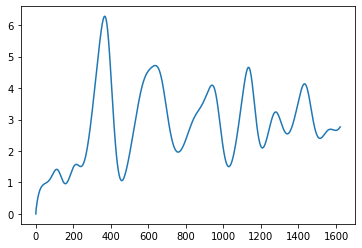

In [6]:
plt.plot(speed_total[:,2])
plt.show()

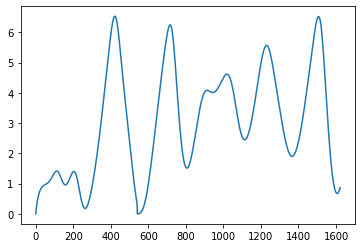

In [7]:
plt.plot(speed_total[:,1])
plt.show()

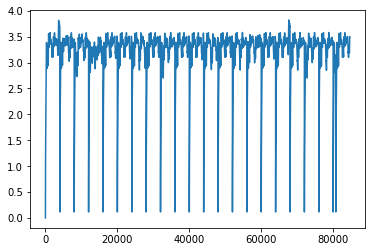

3.240772619460951


In [40]:
plt.plot(np.mean(speed_total,1))
plt.show()
print(np.min(np.mean(speed_total)))

In [13]:
print(state_total)

[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.14987245  0.10860768 60.00143193 ...  0.10860768 60.00143193
   6.04457579]
 [ 0.19987245  0.15920517 60.01735245 ...  0.15920517 60.01735245
   6.06454792]
 ...
 [ 2.31147333  0.25441475 17.94593465 ...  0.25441475 17.94593465
   9.27199249]
 [ 2.35325961  0.24881352 17.73387974 ...  0.24881352 17.73387974
   9.27091148]
 [ 2.30340096  0.24492094 17.52207125 ...  0.24492094 17.52207125
   9.26543016]]


In [16]:
action

array([1., 1.], dtype=float32)